In [1]:
# Importing necessary libraries for TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.layers import GlobalMaxPooling2D
from keras.models import Sequential
from numpy.linalg import norm

In [2]:
# Loading ResNet50 model pre-trained on ImageNet and modifying it
model = ResNet50(weights = "imagenet", include_top = False, input_shape = (224,224,3))
model.trainable=False

In [3]:
model = Sequential([
    model,
    GlobalMaxPooling2D()
])

In [4]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ ?                           │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ ?                           │     0 (unbuilt) │
│ (GlobalMaxPooling2D)                 │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

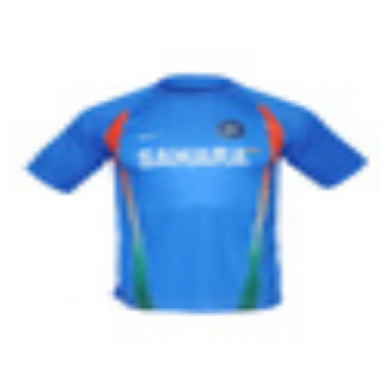

In [6]:
# Loading and preprocessing an example image

img = cv2.imread("Data/images/1163.jpg")
img = cv2.resize(img, (224, 224))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.axis('off')
plt.show()


In [7]:
# Converting image to numpy array and checking its shape

img = np.array(img)
img.shape

(224, 224, 3)

In [8]:
# Expanding dimensions of the image to match model input

expand_img = np.expand_dims(img, axis = 0)
expand_img.shape

(1, 224, 224, 3)

In [9]:
# Preprocessing the image for ResNet50

pre_img = preprocess_input(expand_img)
pre_img.shape

(1, 224, 224, 3)

In [10]:
result = model.predict(pre_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


In [11]:
result.shape

(1, 2048)

In [12]:
result = result.flatten()

In [13]:
normalized = result/norm(result)

In [14]:
# Defining a function to extract features from an image

def extract_features(img_path, model):
  img = cv2.imread(img_path)
  img = cv2.resize(img, (224, 224))
  img = np.array(img)
  expand_img = np.expand_dims(img, axis = 0)
  pre_img = preprocess_input(expand_img)
  result = model.predict(pre_img).flatten()
  normalized = result/norm(result)
  return normalized

In [15]:
# Extracting features from an example image using the defined function

extract_features("data/images/1163.jpg", model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


array([0.00557012, 0.0947822 , 0.02464693, ..., 0.        , 0.03886912,
       0.04933902], dtype=float32)

In [16]:
import os
from tqdm import tqdm
import pickle

In [17]:
# Initializing lists for filenames and feature vectors


filenames = []
feature_list = []

for file in os.listdir("Data/images"):
  filenames.append(os.path.join("Data/images", file))

In [18]:
# Extracting features from all images and storing them in the feature list

for file in tqdm(filenames):
    feature_list.append(extract_features(file, model))

  0%|                                                                                        | 0/44441 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  0%|                                                                              | 1/44441 [00:00<5:08:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  0%|                                                                              | 2/44441 [00:00<5:06:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  0%|                                                                              | 3/44441 [00:01<5:29:10,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  0%|                                                                              | 4/44441 [00:01<5:38:31,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  0%|                                                                              | 5/44441 [00:02<5:55:25,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  0%|                                                                              | 6/44441 [00:02<5:38:34,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  0%|                                                                              | 7/44441 [00:03<5:34:11,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  0%|                                                                              | 8/44441 [00:03<6:17:45,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  0%|                                                                              | 9/44441 [00:04<6:44:00,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 10/44441 [00:04<6:12:23,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  0%|                                                                             | 11/44441 [00:05<5:38:08,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  0%|                                                                             | 12/44441 [00:05<5:15:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  0%|                                                                             | 13/44441 [00:06<5:27:12,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 14/44441 [00:06<4:54:21,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 15/44441 [00:06<4:33:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  0%|                                                                             | 16/44441 [00:06<4:16:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 17/44441 [00:07<4:12:37,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 18/44441 [00:07<4:10:45,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  0%|                                                                             | 19/44441 [00:07<4:11:32,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 20/44441 [00:08<4:15:06,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|                                                                             | 21/44441 [00:08<4:12:18,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  0%|                                                                             | 22/44441 [00:08<4:13:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step


  0%|                                                                             | 23/44441 [00:10<7:19:25,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  0%|                                                                             | 24/44441 [00:10<6:37:14,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 25/44441 [00:10<5:52:03,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|                                                                             | 26/44441 [00:11<5:26:12,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 27/44441 [00:11<5:02:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  0%|                                                                             | 28/44441 [00:11<4:46:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 29/44441 [00:12<4:46:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|                                                                             | 30/44441 [00:12<4:35:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  0%|                                                                             | 31/44441 [00:12<4:23:53,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 32/44441 [00:13<4:16:20,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 33/44441 [00:13<4:20:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 34/44441 [00:13<4:14:07,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 35/44441 [00:14<4:10:05,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 36/44441 [00:15<8:13:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 37/44441 [00:16<8:21:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 38/44441 [00:16<7:00:41,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 39/44441 [00:17<7:13:38,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 40/44441 [00:17<6:06:53,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 41/44441 [00:18<5:56:00,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 42/44441 [00:18<6:33:33,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|                                                                             | 43/44441 [00:19<5:37:45,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|                                                                             | 44/44441 [00:19<5:02:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 45/44441 [00:20<6:37:35,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 46/44441 [00:20<5:41:49,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 47/44441 [00:20<5:04:58,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  0%|                                                                             | 48/44441 [00:21<4:38:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 49/44441 [00:21<4:57:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 50/44441 [00:21<4:30:55,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  0%|                                                                             | 51/44441 [00:22<4:19:13,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 52/44441 [00:22<5:27:08,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 53/44441 [00:23<5:16:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 54/44441 [00:23<4:47:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 55/44441 [00:23<4:28:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|                                                                             | 56/44441 [00:24<4:15:43,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 57/44441 [00:24<4:11:58,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|                                                                             | 58/44441 [00:24<4:03:05,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|                                                                             | 59/44441 [00:24<4:01:29,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 60/44441 [00:25<3:53:23,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 61/44441 [00:25<3:59:33,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  0%|                                                                             | 62/44441 [00:25<3:50:34,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 63/44441 [00:26<3:42:02,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 64/44441 [00:26<3:42:29,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 65/44441 [00:26<3:47:01,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  0%|                                                                             | 66/44441 [00:27<3:41:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 67/44441 [00:27<3:37:49,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 68/44441 [00:27<3:33:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 69/44441 [00:27<3:34:03,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 70/44441 [00:28<3:31:59,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|                                                                             | 71/44441 [00:28<3:29:40,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|                                                                             | 72/44441 [00:28<3:28:27,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|▏                                                                            | 73/44441 [00:29<3:29:17,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 74/44441 [00:29<3:31:00,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 75/44441 [00:29<3:29:24,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  0%|▏                                                                            | 76/44441 [00:29<3:28:25,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 77/44441 [00:30<3:34:59,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 78/44441 [00:30<3:31:11,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 79/44441 [00:30<3:35:45,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  0%|▏                                                                            | 80/44441 [00:31<3:31:38,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 81/44441 [00:31<3:40:10,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▏                                                                            | 82/44441 [00:31<3:46:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  0%|▏                                                                            | 83/44441 [00:32<3:45:40,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 84/44441 [00:32<3:54:55,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  0%|▏                                                                            | 85/44441 [00:32<3:50:16,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|▏                                                                            | 86/44441 [00:32<3:50:52,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 87/44441 [00:33<3:44:53,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 88/44441 [00:33<3:38:33,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 89/44441 [00:33<3:35:43,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  0%|▏                                                                            | 90/44441 [00:34<3:32:52,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 91/44441 [00:34<3:39:31,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▏                                                                            | 92/44441 [00:34<3:35:04,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  0%|▏                                                                            | 93/44441 [00:34<3:36:11,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 94/44441 [00:35<3:31:18,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 95/44441 [00:35<3:31:44,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                            | 96/44441 [00:35<3:29:59,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 97/44441 [00:36<3:31:19,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                            | 98/44441 [00:36<3:33:38,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  0%|▏                                                                            | 99/44441 [00:36<3:44:28,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|▏                                                                           | 100/44441 [00:37<3:46:24,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 101/44441 [00:37<3:41:45,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 102/44441 [00:37<3:35:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  0%|▏                                                                           | 103/44441 [00:37<3:32:13,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 104/44441 [00:38<3:30:05,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 105/44441 [00:38<3:30:51,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▏                                                                           | 106/44441 [00:38<3:30:35,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|▏                                                                           | 107/44441 [00:39<3:29:21,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 108/44441 [00:39<3:36:43,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 109/44441 [00:39<3:34:39,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  0%|▏                                                                           | 110/44441 [00:39<3:31:42,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 111/44441 [00:40<3:29:35,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 112/44441 [00:40<3:28:26,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|▏                                                                           | 113/44441 [00:40<3:31:39,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|▏                                                                           | 114/44441 [00:41<3:30:42,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 115/44441 [00:41<3:28:49,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 116/44441 [00:41<3:27:30,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 117/44441 [00:41<3:28:22,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  0%|▏                                                                           | 118/44441 [00:42<3:51:26,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 119/44441 [00:42<3:43:53,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 120/44441 [00:42<3:47:42,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 121/44441 [00:43<3:50:53,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 122/44441 [00:43<3:48:37,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 123/44441 [00:43<3:41:33,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▏                                                                           | 124/44441 [00:44<3:37:04,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 125/44441 [00:44<3:35:59,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▏                                                                           | 126/44441 [00:44<3:36:57,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  0%|▏                                                                           | 127/44441 [00:44<3:37:08,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 128/44441 [00:45<3:37:16,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 129/44441 [00:45<3:35:54,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 130/44441 [00:45<3:32:21,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  0%|▏                                                                           | 131/44441 [00:46<3:34:28,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 132/44441 [00:46<3:31:34,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 133/44441 [00:46<3:30:59,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|▏                                                                           | 134/44441 [00:46<3:31:21,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▏                                                                           | 135/44441 [00:47<3:36:41,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 136/44441 [00:47<3:30:03,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 137/44441 [00:47<3:33:31,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  0%|▏                                                                           | 138/44441 [00:48<3:31:05,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▏                                                                           | 139/44441 [00:48<3:34:33,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  0%|▏                                                                           | 140/44441 [00:48<3:35:27,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|▏                                                                           | 141/44441 [00:48<3:36:40,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 142/44441 [00:49<3:39:33,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 143/44441 [00:49<3:37:47,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 144/44441 [00:49<3:33:53,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 145/44441 [00:50<3:33:47,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▏                                                                           | 146/44441 [00:50<3:31:27,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  0%|▎                                                                           | 147/44441 [00:50<3:30:09,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  0%|▎                                                                           | 148/44441 [00:50<3:26:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 149/44441 [00:51<3:28:01,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 150/44441 [00:51<3:26:43,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 151/44441 [00:51<3:25:16,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|▎                                                                           | 152/44441 [00:52<3:31:51,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 153/44441 [00:52<3:46:33,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|▎                                                                           | 154/44441 [00:52<3:43:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▎                                                                           | 155/44441 [00:53<3:38:11,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 156/44441 [00:53<3:36:34,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 157/44441 [00:53<3:33:17,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  0%|▎                                                                           | 158/44441 [00:53<3:34:36,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 159/44441 [00:54<3:33:51,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 160/44441 [00:54<3:39:31,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|▎                                                                           | 161/44441 [00:54<3:40:46,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|▎                                                                           | 162/44441 [00:55<3:40:06,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 163/44441 [00:55<3:40:35,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 164/44441 [00:55<3:34:06,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  0%|▎                                                                           | 165/44441 [00:55<3:31:26,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 166/44441 [00:56<3:31:23,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 167/44441 [00:56<3:31:39,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|▎                                                                           | 168/44441 [00:56<3:31:08,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  0%|▎                                                                           | 169/44441 [00:57<3:29:43,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 170/44441 [00:57<3:32:07,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 171/44441 [00:57<3:34:03,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|▎                                                                           | 172/44441 [00:57<3:31:14,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 173/44441 [00:58<3:27:51,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 174/44441 [00:58<3:27:55,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  0%|▎                                                                           | 175/44441 [00:58<3:29:20,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  0%|▎                                                                           | 176/44441 [00:59<3:28:14,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 177/44441 [00:59<3:27:42,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 178/44441 [00:59<3:28:59,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  0%|▎                                                                           | 179/44441 [00:59<3:27:59,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 180/44441 [01:00<3:26:06,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 181/44441 [01:00<3:25:28,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▎                                                                           | 182/44441 [01:00<3:28:27,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  0%|▎                                                                           | 183/44441 [01:01<3:27:33,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 184/44441 [01:01<3:25:18,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 185/44441 [01:01<3:25:08,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  0%|▎                                                                           | 186/44441 [01:01<3:27:22,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 187/44441 [01:02<3:35:12,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 188/44441 [01:02<3:37:18,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  0%|▎                                                                           | 189/44441 [01:02<3:39:19,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  0%|▎                                                                           | 190/44441 [01:03<3:38:55,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 191/44441 [01:03<3:37:29,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 192/44441 [01:03<3:34:04,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  0%|▎                                                                           | 193/44441 [01:03<3:32:12,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 194/44441 [01:04<3:34:05,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 195/44441 [01:04<3:31:31,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  0%|▎                                                                           | 196/44441 [01:04<3:31:14,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 197/44441 [01:05<3:38:14,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 198/44441 [01:05<3:38:03,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|▎                                                                           | 199/44441 [01:05<3:34:30,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  0%|▎                                                                           | 200/44441 [01:05<3:32:13,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 201/44441 [01:06<3:37:56,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 202/44441 [01:06<3:44:16,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  0%|▎                                                                           | 203/44441 [01:06<3:56:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 204/44441 [01:07<3:58:12,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▎                                                                           | 205/44441 [01:07<3:54:00,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  0%|▎                                                                           | 206/44441 [01:07<4:02:34,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 207/44441 [01:08<4:00:31,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 208/44441 [01:08<4:10:57,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  0%|▎                                                                           | 209/44441 [01:09<4:18:29,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 210/44441 [01:09<4:23:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 211/44441 [01:09<4:27:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 212/44441 [01:10<4:31:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  0%|▎                                                                           | 213/44441 [01:10<4:30:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  0%|▎                                                                           | 214/44441 [01:10<4:26:38,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 215/44441 [01:11<4:16:18,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 216/44441 [01:11<4:11:27,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 217/44441 [01:11<4:05:23,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  0%|▎                                                                           | 218/44441 [01:12<4:12:01,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  0%|▎                                                                           | 219/44441 [01:12<4:19:10,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  0%|▍                                                                           | 220/44441 [01:12<4:21:14,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▍                                                                           | 221/44441 [01:13<4:20:14,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  0%|▍                                                                           | 222/44441 [01:13<4:17:21,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  1%|▍                                                                           | 223/44441 [01:13<4:14:25,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 224/44441 [01:14<4:08:56,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 225/44441 [01:14<4:03:54,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  1%|▍                                                                           | 226/44441 [01:14<4:05:31,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▍                                                                           | 227/44441 [01:15<4:07:50,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 228/44441 [01:15<4:09:49,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 229/44441 [01:16<4:17:29,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 230/44441 [01:16<4:17:48,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 231/44441 [01:16<4:17:48,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 232/44441 [01:17<4:14:46,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 233/44441 [01:17<4:09:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 234/44441 [01:17<4:05:44,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  1%|▍                                                                           | 235/44441 [01:18<4:04:31,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 236/44441 [01:18<4:05:48,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 237/44441 [01:18<3:53:11,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|▍                                                                           | 238/44441 [01:18<3:46:58,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 239/44441 [01:19<3:41:15,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 240/44441 [01:19<3:45:18,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 241/44441 [01:19<3:39:06,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 242/44441 [01:20<3:36:02,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 243/44441 [01:20<3:33:55,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 244/44441 [01:20<3:30:19,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|▍                                                                           | 245/44441 [01:20<3:28:30,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 246/44441 [01:21<3:29:55,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 247/44441 [01:21<3:37:52,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 248/44441 [01:21<3:33:46,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  1%|▍                                                                           | 249/44441 [01:22<3:32:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 250/44441 [01:22<3:48:31,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 251/44441 [01:22<3:41:31,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 252/44441 [01:23<3:36:51,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▍                                                                           | 253/44441 [01:23<3:44:52,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 254/44441 [01:23<3:41:30,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|▍                                                                           | 255/44441 [01:23<3:37:23,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 256/44441 [01:24<3:30:34,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 257/44441 [01:24<3:32:59,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 258/44441 [01:24<3:38:28,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|▍                                                                           | 259/44441 [01:25<3:35:07,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 260/44441 [01:25<3:34:18,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 261/44441 [01:25<3:30:20,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 262/44441 [01:25<3:29:44,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 263/44441 [01:26<3:28:08,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 264/44441 [01:26<3:27:13,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 265/44441 [01:26<3:25:04,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▍                                                                           | 266/44441 [01:27<3:29:47,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 267/44441 [01:27<3:29:16,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 268/44441 [01:27<3:28:02,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 269/44441 [01:27<3:27:16,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 270/44441 [01:28<3:29:28,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 271/44441 [01:28<3:32:39,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 272/44441 [01:28<3:33:20,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|▍                                                                           | 273/44441 [01:29<3:32:02,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 274/44441 [01:29<3:31:04,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 275/44441 [01:29<3:30:53,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  1%|▍                                                                           | 276/44441 [01:29<3:29:43,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▍                                                                           | 277/44441 [01:30<3:32:33,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 278/44441 [01:30<3:32:42,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 279/44441 [01:30<3:29:52,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▍                                                                           | 280/44441 [01:31<3:27:34,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 281/44441 [01:31<3:26:54,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 282/44441 [01:31<3:25:19,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 283/44441 [01:31<3:26:43,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 284/44441 [01:32<3:26:36,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 285/44441 [01:32<3:38:09,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 286/44441 [01:32<3:33:57,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▍                                                                           | 287/44441 [01:33<3:30:55,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 288/44441 [01:33<3:29:40,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 289/44441 [01:33<3:33:53,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 290/44441 [01:33<3:31:39,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▍                                                                           | 291/44441 [01:34<3:32:27,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▍                                                                           | 292/44441 [01:34<3:30:20,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▌                                                                           | 293/44441 [01:34<3:35:46,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  1%|▌                                                                           | 294/44441 [01:35<3:45:37,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 295/44441 [01:35<3:39:25,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 296/44441 [01:35<3:34:20,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  1%|▌                                                                           | 297/44441 [01:35<3:31:24,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 298/44441 [01:36<3:30:26,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 299/44441 [01:36<3:29:29,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 300/44441 [01:36<3:27:55,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  1%|▌                                                                           | 301/44441 [01:37<3:27:28,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 302/44441 [01:37<3:29:11,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 303/44441 [01:37<3:27:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▌                                                                           | 304/44441 [01:37<3:34:26,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 305/44441 [01:38<3:31:10,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 306/44441 [01:38<3:29:57,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▌                                                                           | 307/44441 [01:38<3:36:11,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  1%|▌                                                                           | 308/44441 [01:39<3:35:03,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 309/44441 [01:39<3:31:42,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 310/44441 [01:39<3:33:24,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  1%|▌                                                                           | 311/44441 [01:39<3:30:36,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 312/44441 [01:40<3:28:39,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 313/44441 [01:40<3:26:10,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 314/44441 [01:40<3:28:55,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  1%|▌                                                                           | 315/44441 [01:41<3:28:10,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 316/44441 [01:41<3:23:27,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 317/44441 [01:41<3:24:54,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▌                                                                           | 318/44441 [01:41<3:26:50,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 319/44441 [01:42<3:26:57,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 320/44441 [01:42<3:42:43,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 321/44441 [01:42<3:35:51,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 322/44441 [01:43<3:35:10,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 323/44441 [01:43<3:35:42,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 324/44441 [01:43<3:31:20,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  1%|▌                                                                           | 325/44441 [01:44<3:34:22,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 326/44441 [01:44<3:36:31,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 327/44441 [01:44<3:32:12,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 328/44441 [01:44<3:29:20,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 329/44441 [01:45<3:31:29,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 330/44441 [01:45<3:29:25,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 331/44441 [01:45<3:27:07,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  1%|▌                                                                           | 332/44441 [01:45<3:25:37,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 333/44441 [01:46<3:24:53,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 334/44441 [01:46<3:24:06,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  1%|▌                                                                           | 335/44441 [01:47<5:32:06,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 336/44441 [01:47<4:52:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  1%|▌                                                                           | 337/44441 [01:47<4:24:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 338/44441 [01:48<4:07:58,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 339/44441 [01:48<3:53:43,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 340/44441 [01:48<3:43:49,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  1%|▌                                                                           | 341/44441 [01:49<3:46:06,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  1%|▌                                                                           | 342/44441 [01:49<3:45:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 343/44441 [01:49<3:40:53,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  1%|▌                                                                           | 344/44441 [01:49<3:35:30,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 345/44441 [01:50<3:31:38,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 346/44441 [01:50<3:31:53,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 347/44441 [01:50<3:34:18,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  1%|▌                                                                           | 348/44441 [01:51<3:31:17,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▌                                                                           | 349/44441 [01:51<3:29:40,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 350/44441 [01:51<3:29:21,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▌                                                                           | 351/44441 [01:51<3:29:13,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 352/44441 [01:52<3:27:52,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 353/44441 [01:52<3:40:15,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 354/44441 [01:52<3:38:27,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 355/44441 [01:53<3:33:33,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|▌                                                                           | 356/44441 [01:53<3:34:06,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 357/44441 [01:53<3:28:41,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  1%|▌                                                                           | 358/44441 [01:53<3:27:32,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▌                                                                           | 359/44441 [01:54<3:43:07,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 360/44441 [01:54<3:39:03,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 361/44441 [01:54<3:34:49,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 362/44441 [01:55<3:36:42,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▌                                                                           | 363/44441 [01:55<3:36:18,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▌                                                                           | 364/44441 [01:55<3:31:02,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▌                                                                           | 365/44441 [01:56<3:25:57,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 366/44441 [01:56<3:31:15,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 367/44441 [01:56<3:27:13,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 368/44441 [01:56<3:28:54,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 369/44441 [01:57<3:33:13,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 370/44441 [01:57<3:30:02,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 371/44441 [01:57<3:32:09,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|▋                                                                           | 372/44441 [01:58<3:29:35,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 373/44441 [01:58<3:26:48,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 374/44441 [01:58<3:28:33,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 375/44441 [01:58<3:27:27,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 376/44441 [01:59<3:26:37,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▋                                                                           | 377/44441 [01:59<3:25:35,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 378/44441 [01:59<3:35:47,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▋                                                                           | 379/44441 [02:00<3:33:25,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 380/44441 [02:00<3:30:45,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 381/44441 [02:00<3:28:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 382/44441 [02:00<3:26:35,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 383/44441 [02:01<3:26:14,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▋                                                                           | 384/44441 [02:01<3:26:41,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 385/44441 [02:01<3:25:54,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|▋                                                                           | 386/44441 [02:01<3:27:17,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 387/44441 [02:02<3:29:56,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 388/44441 [02:02<3:37:22,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 389/44441 [02:02<3:33:56,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 390/44441 [02:03<3:28:09,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  1%|▋                                                                           | 391/44441 [02:03<3:33:23,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 392/44441 [02:03<3:30:14,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▋                                                                           | 393/44441 [02:04<3:27:36,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 394/44441 [02:04<3:29:04,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 395/44441 [02:04<3:31:01,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 396/44441 [02:04<3:31:37,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 397/44441 [02:05<3:32:06,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▋                                                                           | 398/44441 [02:05<3:33:58,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 399/44441 [02:05<3:29:54,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▋                                                                           | 400/44441 [02:06<3:33:24,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 401/44441 [02:06<3:30:01,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 402/44441 [02:06<3:31:19,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▋                                                                           | 403/44441 [02:06<3:34:22,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 404/44441 [02:07<3:33:03,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▋                                                                           | 405/44441 [02:07<3:29:18,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 406/44441 [02:07<3:32:03,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▋                                                                           | 407/44441 [02:08<3:27:22,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▋                                                                           | 408/44441 [02:08<3:44:33,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▋                                                                           | 409/44441 [02:08<3:51:28,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  1%|▋                                                                           | 410/44441 [02:09<4:20:06,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|▋                                                                           | 411/44441 [02:09<4:16:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▋                                                                           | 412/44441 [02:09<4:09:34,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|▋                                                                           | 413/44441 [02:10<3:57:09,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 414/44441 [02:10<3:46:17,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 415/44441 [02:10<3:44:10,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▋                                                                           | 416/44441 [02:10<3:42:08,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 417/44441 [02:11<3:37:20,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▋                                                                           | 418/44441 [02:11<3:36:19,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 419/44441 [02:11<3:31:29,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  1%|▋                                                                           | 420/44441 [02:12<3:29:54,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▋                                                                           | 421/44441 [02:12<3:45:40,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 422/44441 [02:12<3:48:14,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|▋                                                                           | 423/44441 [02:13<3:40:12,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 424/44441 [02:13<3:36:32,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▋                                                                           | 425/44441 [02:13<3:36:18,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▋                                                                           | 426/44441 [02:13<3:33:08,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 427/44441 [02:14<3:33:19,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 428/44441 [02:14<3:31:18,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 429/44441 [02:14<3:25:34,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  1%|▋                                                                           | 430/44441 [02:15<3:37:12,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 431/44441 [02:15<3:34:10,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 432/44441 [02:15<3:33:58,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  1%|▋                                                                           | 433/44441 [02:15<3:30:44,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 434/44441 [02:16<3:31:36,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 435/44441 [02:16<3:30:54,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▋                                                                           | 436/44441 [02:16<3:28:40,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|▋                                                                           | 437/44441 [02:17<3:27:20,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▋                                                                           | 438/44441 [02:17<3:26:36,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|▊                                                                           | 439/44441 [02:17<3:26:36,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 440/44441 [02:17<3:24:13,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 441/44441 [02:18<3:25:55,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 442/44441 [02:18<3:26:03,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 443/44441 [02:18<3:25:23,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  1%|▊                                                                           | 444/44441 [02:19<3:30:09,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 445/44441 [02:19<3:29:35,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▊                                                                           | 446/44441 [02:19<3:30:03,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 447/44441 [02:19<3:35:39,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▊                                                                           | 448/44441 [02:20<3:37:57,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 449/44441 [02:20<3:35:24,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 450/44441 [02:20<3:31:50,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  1%|▊                                                                           | 451/44441 [02:21<3:28:04,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 452/44441 [02:21<3:29:10,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▊                                                                           | 453/44441 [02:21<3:27:03,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  1%|▊                                                                           | 454/44441 [02:21<3:26:32,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 455/44441 [02:22<3:25:14,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▊                                                                           | 456/44441 [02:22<3:34:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 457/44441 [02:22<3:36:09,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 458/44441 [02:23<3:49:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 459/44441 [02:23<3:38:50,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 460/44441 [02:23<3:40:01,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▊                                                                           | 461/44441 [02:24<3:33:44,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 462/44441 [02:24<3:38:02,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 463/44441 [02:24<3:33:14,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 464/44441 [02:24<3:29:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 465/44441 [02:25<3:28:16,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▊                                                                           | 466/44441 [02:25<3:37:57,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 467/44441 [02:25<3:34:23,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▊                                                                           | 468/44441 [02:26<3:31:29,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 469/44441 [02:26<3:29:24,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 470/44441 [02:26<3:28:06,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|▊                                                                           | 471/44441 [02:26<3:29:32,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 472/44441 [02:27<3:27:02,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 473/44441 [02:27<3:25:55,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 474/44441 [02:27<3:27:44,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  1%|▊                                                                           | 475/44441 [02:28<3:27:00,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 476/44441 [02:28<3:25:47,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 477/44441 [02:28<3:24:58,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 478/44441 [02:28<3:26:56,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 479/44441 [02:29<3:26:26,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 480/44441 [02:29<3:25:02,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|▊                                                                           | 481/44441 [02:29<3:38:40,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  1%|▊                                                                           | 482/44441 [02:30<3:36:48,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 483/44441 [02:30<3:34:21,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▊                                                                           | 484/44441 [02:30<3:38:00,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▊                                                                           | 485/44441 [02:30<3:33:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 486/44441 [02:31<3:31:21,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 487/44441 [02:31<3:28:28,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  1%|▊                                                                           | 488/44441 [02:31<3:27:30,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  1%|▊                                                                           | 489/44441 [02:32<3:52:41,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▊                                                                           | 490/44441 [02:32<3:59:57,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 491/44441 [02:32<3:53:44,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|▊                                                                           | 492/44441 [02:33<3:42:50,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 493/44441 [02:33<3:34:06,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▊                                                                           | 494/44441 [02:33<3:38:15,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 495/44441 [02:33<3:32:18,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 496/44441 [02:34<3:38:24,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 497/44441 [02:34<3:36:06,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 498/44441 [02:34<3:34:53,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  1%|▊                                                                           | 499/44441 [02:35<3:31:22,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 500/44441 [02:35<3:28:52,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|▊                                                                           | 501/44441 [02:35<3:32:31,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|▊                                                                           | 502/44441 [02:35<3:38:12,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 503/44441 [02:36<3:31:13,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 504/44441 [02:36<3:38:01,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 505/44441 [02:36<3:30:33,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▊                                                                           | 506/44441 [02:37<3:33:30,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 507/44441 [02:37<3:30:30,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  1%|▊                                                                           | 508/44441 [02:37<3:29:24,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|▊                                                                           | 509/44441 [02:37<3:28:26,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 510/44441 [02:38<3:28:13,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▊                                                                           | 511/44441 [02:38<3:26:09,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 512/44441 [02:38<3:22:24,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|▉                                                                           | 513/44441 [02:39<3:24:48,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 514/44441 [02:39<3:24:25,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 515/44441 [02:39<3:25:19,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  1%|▉                                                                           | 516/44441 [02:39<3:29:44,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 517/44441 [02:40<3:28:52,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 518/44441 [02:40<3:37:35,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 519/44441 [02:40<3:33:33,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 520/44441 [02:41<3:31:29,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 521/44441 [02:41<3:29:46,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  1%|▉                                                                           | 522/44441 [02:41<3:35:11,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▉                                                                           | 523/44441 [02:42<3:36:43,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 524/44441 [02:42<3:32:25,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  1%|▉                                                                           | 525/44441 [02:42<3:44:02,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▉                                                                           | 526/44441 [02:42<3:39:02,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 527/44441 [02:43<3:34:56,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 528/44441 [02:43<3:29:34,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  1%|▉                                                                           | 529/44441 [02:43<3:31:32,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|▉                                                                           | 530/44441 [02:44<3:31:45,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 531/44441 [02:44<3:29:56,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 532/44441 [02:44<3:25:42,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|▉                                                                           | 533/44441 [02:44<3:27:45,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 534/44441 [02:45<3:26:27,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 535/44441 [02:45<3:27:10,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  1%|▉                                                                           | 536/44441 [02:45<3:26:32,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  1%|▉                                                                           | 537/44441 [02:46<3:29:45,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 538/44441 [02:46<3:32:19,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 539/44441 [02:46<3:29:11,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 540/44441 [02:46<3:23:41,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 541/44441 [02:47<3:26:09,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 542/44441 [02:47<3:24:50,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 543/44441 [02:47<3:25:34,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▉                                                                           | 544/44441 [02:48<3:27:54,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 545/44441 [02:48<3:26:21,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 546/44441 [02:48<3:27:46,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 547/44441 [02:48<3:24:59,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 548/44441 [02:49<3:23:38,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 549/44441 [02:49<3:25:13,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|▉                                                                           | 550/44441 [02:49<3:31:11,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▉                                                                           | 551/44441 [02:49<3:29:22,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 552/44441 [02:50<3:28:11,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 553/44441 [02:50<3:25:14,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 554/44441 [02:50<3:25:35,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  1%|▉                                                                           | 555/44441 [02:51<3:25:14,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 556/44441 [02:51<3:26:50,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 557/44441 [02:51<3:24:52,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  1%|▉                                                                           | 558/44441 [02:51<3:28:18,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 559/44441 [02:52<3:26:56,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|▉                                                                           | 560/44441 [02:52<3:33:20,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 561/44441 [02:52<3:33:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 562/44441 [02:53<3:36:23,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 563/44441 [02:53<3:32:41,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 564/44441 [02:53<3:32:03,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|▉                                                                           | 565/44441 [02:54<3:30:23,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 566/44441 [02:54<3:28:33,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 567/44441 [02:54<3:30:42,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 568/44441 [02:54<3:27:03,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 569/44441 [02:55<3:23:52,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 570/44441 [02:55<3:31:28,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 571/44441 [02:55<3:26:57,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  1%|▉                                                                           | 572/44441 [02:55<3:29:58,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|▉                                                                           | 573/44441 [02:56<3:29:20,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 574/44441 [02:56<3:32:19,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 575/44441 [02:56<3:31:43,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 576/44441 [02:57<3:26:22,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 577/44441 [02:57<3:27:13,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|▉                                                                           | 578/44441 [02:57<3:34:10,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  1%|▉                                                                           | 579/44441 [02:58<3:29:54,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 580/44441 [02:58<3:28:12,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 581/44441 [02:58<3:23:06,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|▉                                                                           | 582/44441 [02:58<3:36:23,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 583/44441 [02:59<3:32:10,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|▉                                                                           | 584/44441 [02:59<3:27:07,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 585/44441 [02:59<3:26:52,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|█                                                                           | 586/44441 [03:00<3:28:59,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 587/44441 [03:00<3:26:33,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 588/44441 [03:00<3:26:03,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 589/44441 [03:00<3:30:30,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 590/44441 [03:01<3:29:35,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 591/44441 [03:01<3:28:35,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 592/44441 [03:01<3:33:03,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|█                                                                           | 593/44441 [03:02<3:28:21,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 594/44441 [03:02<3:29:36,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|█                                                                           | 595/44441 [03:02<3:36:51,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  1%|█                                                                           | 596/44441 [03:02<3:36:46,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 597/44441 [03:03<3:33:36,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 598/44441 [03:03<3:32:01,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 599/44441 [03:03<3:30:18,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|█                                                                           | 600/44441 [03:04<3:27:17,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 601/44441 [03:04<3:27:11,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 602/44441 [03:04<3:32:24,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|█                                                                           | 603/44441 [03:04<3:29:43,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 604/44441 [03:05<3:27:19,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 605/44441 [03:05<3:27:19,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 606/44441 [03:05<3:26:26,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|█                                                                           | 607/44441 [03:06<3:23:39,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 608/44441 [03:06<3:24:37,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 609/44441 [03:06<3:27:23,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  1%|█                                                                           | 610/44441 [03:06<3:32:19,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 611/44441 [03:07<3:29:20,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 612/44441 [03:07<3:24:39,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 613/44441 [03:07<3:25:47,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|█                                                                           | 614/44441 [03:08<3:31:42,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 615/44441 [03:08<3:34:29,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 616/44441 [03:08<3:29:28,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  1%|█                                                                           | 617/44441 [03:08<3:30:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 618/44441 [03:09<3:30:26,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 619/44441 [03:09<3:29:35,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 620/44441 [03:09<3:27:18,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  1%|█                                                                           | 621/44441 [03:10<3:26:50,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 622/44441 [03:10<3:29:52,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 623/44441 [03:10<3:27:53,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|█                                                                           | 624/44441 [03:10<3:27:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 625/44441 [03:11<3:25:45,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 626/44441 [03:11<3:27:21,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 627/44441 [03:11<3:25:26,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|█                                                                           | 628/44441 [03:12<3:26:14,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 629/44441 [03:12<3:31:25,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  1%|█                                                                           | 630/44441 [03:12<3:40:56,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  1%|█                                                                           | 631/44441 [03:12<3:42:50,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 632/44441 [03:13<3:37:02,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 633/44441 [03:13<3:32:02,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 634/44441 [03:13<3:33:58,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  1%|█                                                                           | 635/44441 [03:14<3:30:55,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 636/44441 [03:14<3:31:13,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 637/44441 [03:14<3:27:09,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  1%|█                                                                           | 638/44441 [03:14<3:25:54,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 639/44441 [03:15<3:34:56,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 640/44441 [03:15<3:34:07,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 641/44441 [03:15<3:30:36,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 642/44441 [03:16<3:29:01,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 643/44441 [03:16<3:27:26,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 644/44441 [03:16<3:26:51,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  1%|█                                                                           | 645/44441 [03:16<3:32:53,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 646/44441 [03:17<3:38:50,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 647/44441 [03:17<3:32:40,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 648/44441 [03:17<3:30:53,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 649/44441 [03:18<3:26:41,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 650/44441 [03:18<3:29:39,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 651/44441 [03:18<3:29:59,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  1%|█                                                                           | 652/44441 [03:18<3:26:39,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 653/44441 [03:19<3:26:53,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 654/44441 [03:19<3:27:31,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 655/44441 [03:19<3:24:05,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█                                                                           | 656/44441 [03:20<3:36:09,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█                                                                           | 657/44441 [03:20<3:31:34,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█▏                                                                          | 658/44441 [03:20<3:31:03,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|█▏                                                                          | 659/44441 [03:21<3:28:37,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█▏                                                                          | 660/44441 [03:21<3:28:15,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  1%|█▏                                                                          | 661/44441 [03:21<3:26:19,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█▏                                                                          | 662/44441 [03:21<3:27:10,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  1%|█▏                                                                          | 663/44441 [03:22<3:34:02,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  1%|█▏                                                                          | 664/44441 [03:22<3:30:18,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  1%|█▏                                                                          | 665/44441 [03:22<3:42:53,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|█▏                                                                          | 666/44441 [03:23<3:40:38,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 667/44441 [03:23<3:34:18,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 668/44441 [03:23<3:38:09,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  2%|█▏                                                                          | 669/44441 [03:23<3:36:01,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 670/44441 [03:24<3:33:13,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 671/44441 [03:24<3:33:43,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 672/44441 [03:24<3:29:20,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▏                                                                          | 673/44441 [03:25<3:29:26,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 674/44441 [03:25<3:29:29,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 675/44441 [03:25<3:26:49,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  2%|█▏                                                                          | 676/44441 [03:25<3:28:03,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 677/44441 [03:26<3:26:32,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 678/44441 [03:26<3:26:19,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 679/44441 [03:26<3:22:59,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▏                                                                          | 680/44441 [03:27<3:26:22,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  2%|█▏                                                                          | 681/44441 [03:27<3:32:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 682/44441 [03:27<3:29:25,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  2%|█▏                                                                          | 683/44441 [03:27<3:28:07,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 684/44441 [03:28<3:29:23,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 685/44441 [03:28<3:27:21,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 686/44441 [03:28<3:27:01,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 687/44441 [03:29<3:34:50,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 688/44441 [03:29<3:31:40,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 689/44441 [03:29<3:30:41,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▏                                                                          | 690/44441 [03:29<3:30:45,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 691/44441 [03:30<3:30:48,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 692/44441 [03:30<3:26:20,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 693/44441 [03:30<3:26:30,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 694/44441 [03:31<3:33:06,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 695/44441 [03:31<3:29:20,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 696/44441 [03:31<3:27:12,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▏                                                                          | 697/44441 [03:31<3:27:45,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 698/44441 [03:32<3:30:16,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▏                                                                          | 699/44441 [03:32<3:35:30,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▏                                                                          | 700/44441 [03:32<3:47:33,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 701/44441 [03:33<3:38:20,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 702/44441 [03:33<3:35:04,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 703/44441 [03:33<3:33:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  2%|█▏                                                                          | 704/44441 [03:34<3:30:58,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 705/44441 [03:34<3:25:24,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 706/44441 [03:34<3:29:22,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 707/44441 [03:34<3:28:51,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▏                                                                          | 708/44441 [03:35<3:34:41,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  2%|█▏                                                                          | 709/44441 [03:35<3:41:28,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 710/44441 [03:35<3:35:35,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▏                                                                          | 711/44441 [03:36<3:31:31,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 712/44441 [03:36<3:30:52,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 713/44441 [03:36<3:26:07,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▏                                                                          | 714/44441 [03:36<3:28:46,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 715/44441 [03:37<3:25:16,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 716/44441 [03:37<3:25:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▏                                                                          | 717/44441 [03:37<3:33:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▏                                                                          | 718/44441 [03:38<3:37:20,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 719/44441 [03:38<3:31:41,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 720/44441 [03:38<3:37:27,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▏                                                                          | 721/44441 [03:38<3:36:08,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 722/44441 [03:39<3:36:52,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 723/44441 [03:39<3:31:14,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▏                                                                          | 724/44441 [03:39<3:28:39,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  2%|█▏                                                                          | 725/44441 [03:40<3:29:28,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 726/44441 [03:40<3:28:20,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 727/44441 [03:40<3:26:51,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|█▏                                                                          | 728/44441 [03:40<3:26:14,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 729/44441 [03:41<3:31:28,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▏                                                                          | 730/44441 [03:41<3:36:33,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 731/44441 [03:41<3:32:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▎                                                                          | 732/44441 [03:42<3:29:41,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 733/44441 [03:42<3:27:19,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  2%|█▎                                                                          | 734/44441 [03:42<3:37:38,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▎                                                                          | 735/44441 [03:43<3:42:45,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 736/44441 [03:43<3:37:53,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 737/44441 [03:43<3:40:52,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  2%|█▎                                                                          | 738/44441 [03:43<3:38:53,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▎                                                                          | 739/44441 [03:44<3:37:32,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 740/44441 [03:44<3:33:54,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 741/44441 [03:44<3:34:00,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 742/44441 [03:45<3:34:04,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 743/44441 [03:45<3:26:48,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 744/44441 [03:45<3:29:56,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▎                                                                          | 745/44441 [03:45<3:23:47,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▎                                                                          | 746/44441 [03:46<3:27:01,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 747/44441 [03:46<3:25:24,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 748/44441 [03:46<3:25:41,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▎                                                                          | 749/44441 [03:47<3:24:27,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 750/44441 [03:47<3:22:30,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 751/44441 [03:47<3:23:37,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▎                                                                          | 752/44441 [03:47<3:25:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 753/44441 [03:48<4:59:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|█▎                                                                          | 754/44441 [03:48<4:34:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 755/44441 [03:49<4:11:05,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 756/44441 [03:49<3:56:59,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 757/44441 [03:49<3:44:32,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▎                                                                          | 758/44441 [03:50<3:44:04,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 759/44441 [03:50<3:34:35,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 760/44441 [03:50<3:31:23,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▎                                                                          | 761/44441 [03:50<3:32:03,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 762/44441 [03:51<3:27:51,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 763/44441 [03:51<3:28:57,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 764/44441 [03:51<3:23:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▎                                                                          | 765/44441 [03:52<3:22:14,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▎                                                                          | 766/44441 [03:52<3:26:35,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 767/44441 [03:52<3:24:52,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|█▎                                                                          | 768/44441 [03:52<3:40:06,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▎                                                                          | 769/44441 [03:53<3:39:03,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 770/44441 [03:53<3:37:22,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 771/44441 [03:53<3:32:02,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▎                                                                          | 772/44441 [03:54<3:31:25,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▎                                                                          | 773/44441 [03:54<3:26:49,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 774/44441 [03:54<3:33:07,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▎                                                                          | 775/44441 [03:54<3:26:11,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 776/44441 [03:55<3:26:23,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 777/44441 [03:55<3:26:18,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 778/44441 [03:55<3:29:39,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 779/44441 [03:56<3:33:08,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▎                                                                          | 780/44441 [03:56<3:28:05,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 781/44441 [03:56<3:26:21,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▎                                                                          | 782/44441 [03:56<3:30:12,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▎                                                                          | 783/44441 [03:57<3:25:02,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 784/44441 [03:57<3:26:16,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 785/44441 [03:57<3:26:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  2%|█▎                                                                          | 786/44441 [03:58<3:37:51,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 787/44441 [03:58<3:46:29,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|█▎                                                                          | 788/44441 [03:58<3:47:40,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  2%|█▎                                                                          | 789/44441 [03:59<4:00:30,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  2%|█▎                                                                          | 790/44441 [03:59<4:12:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  2%|█▎                                                                          | 791/44441 [03:59<4:05:22,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  2%|█▎                                                                          | 792/44441 [04:00<4:04:39,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▎                                                                          | 793/44441 [04:00<3:56:59,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  2%|█▎                                                                          | 794/44441 [04:01<4:43:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  2%|█▎                                                                          | 795/44441 [04:01<4:25:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  2%|█▎                                                                          | 796/44441 [04:01<4:13:39,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▎                                                                          | 797/44441 [04:01<4:02:15,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


  2%|█▎                                                                          | 798/44441 [04:02<4:19:29,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|█▎                                                                          | 799/44441 [04:02<4:13:54,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▎                                                                          | 800/44441 [04:03<4:14:34,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▎                                                                          | 801/44441 [04:03<4:03:29,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  2%|█▎                                                                          | 802/44441 [04:03<4:28:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  2%|█▎                                                                          | 803/44441 [04:04<4:35:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  2%|█▎                                                                          | 804/44441 [04:04<4:34:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 805/44441 [04:04<4:14:21,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  2%|█▍                                                                          | 806/44441 [04:05<4:22:32,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  2%|█▍                                                                          | 807/44441 [04:05<4:21:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  2%|█▍                                                                          | 808/44441 [04:05<4:09:06,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  2%|█▍                                                                          | 809/44441 [04:06<4:25:56,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  2%|█▍                                                                          | 810/44441 [04:06<4:12:33,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 811/44441 [04:06<3:59:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 812/44441 [04:07<3:47:07,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  2%|█▍                                                                          | 813/44441 [04:07<3:43:58,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  2%|█▍                                                                          | 814/44441 [04:07<3:47:58,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▍                                                                          | 815/44441 [04:08<3:41:26,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  2%|█▍                                                                          | 816/44441 [04:08<3:45:07,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  2%|█▍                                                                          | 817/44441 [04:08<4:26:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  2%|█▍                                                                          | 818/44441 [04:09<4:55:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  2%|█▍                                                                          | 819/44441 [04:09<4:55:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  2%|█▍                                                                          | 820/44441 [04:10<4:58:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▍                                                                          | 821/44441 [04:10<4:37:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  2%|█▍                                                                          | 822/44441 [04:11<5:07:01,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|█▍                                                                          | 823/44441 [04:11<4:43:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|█▍                                                                          | 824/44441 [04:11<4:30:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  2%|█▍                                                                          | 825/44441 [04:12<4:46:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  2%|█▍                                                                          | 826/44441 [04:12<4:38:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


  2%|█▍                                                                          | 827/44441 [04:12<4:50:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▍                                                                          | 828/44441 [04:13<4:38:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  2%|█▍                                                                          | 829/44441 [04:13<4:28:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  2%|█▍                                                                          | 830/44441 [04:14<4:49:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  2%|█▍                                                                          | 831/44441 [04:14<5:02:41,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  2%|█▍                                                                          | 832/44441 [04:14<4:47:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|█▍                                                                          | 833/44441 [04:15<4:28:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|█▍                                                                          | 834/44441 [04:15<4:23:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  2%|█▍                                                                          | 835/44441 [04:15<4:21:52,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  2%|█▍                                                                          | 836/44441 [04:16<4:34:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 837/44441 [04:16<4:24:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  2%|█▍                                                                          | 838/44441 [04:16<4:15:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▍                                                                          | 839/44441 [04:17<4:08:32,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 840/44441 [04:17<4:02:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▍                                                                          | 841/44441 [04:17<3:53:18,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|█▍                                                                          | 842/44441 [04:18<3:52:41,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  2%|█▍                                                                          | 843/44441 [04:18<4:05:30,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  2%|█▍                                                                          | 844/44441 [04:18<4:11:04,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  2%|█▍                                                                          | 845/44441 [04:19<4:20:00,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 846/44441 [04:20<8:33:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  2%|█▍                                                                          | 847/44441 [04:21<7:02:14,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


  2%|█▍                                                                          | 848/44441 [04:21<5:58:06,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  2%|█▍                                                                          | 849/44441 [04:21<5:14:23,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▍                                                                          | 850/44441 [04:22<4:45:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 851/44441 [04:22<4:24:09,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|█▍                                                                          | 852/44441 [04:22<4:14:45,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  2%|█▍                                                                          | 853/44441 [04:23<4:18:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 854/44441 [04:23<4:05:29,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▍                                                                          | 855/44441 [04:23<3:57:09,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▍                                                                          | 856/44441 [04:23<3:51:00,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 857/44441 [04:24<3:53:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▍                                                                          | 858/44441 [04:24<3:51:37,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▍                                                                          | 859/44441 [04:24<3:48:32,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▍                                                                          | 860/44441 [04:25<3:44:54,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  2%|█▍                                                                          | 861/44441 [04:25<3:42:27,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 862/44441 [04:25<3:44:41,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▍                                                                          | 863/44441 [04:26<3:41:45,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▍                                                                          | 864/44441 [04:26<3:41:16,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▍                                                                          | 865/44441 [04:26<3:42:16,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▍                                                                          | 866/44441 [04:26<3:42:36,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 867/44441 [04:27<3:38:43,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▍                                                                          | 868/44441 [04:27<3:37:25,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▍                                                                          | 869/44441 [04:27<3:35:06,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 870/44441 [04:28<3:37:01,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|█▍                                                                          | 871/44441 [04:28<3:39:08,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▍                                                                          | 872/44441 [04:28<3:52:38,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  2%|█▍                                                                          | 873/44441 [04:29<4:37:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▍                                                                          | 874/44441 [04:29<4:21:55,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  2%|█▍                                                                          | 875/44441 [04:29<4:05:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▍                                                                          | 876/44441 [04:30<4:02:03,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▍                                                                          | 877/44441 [04:30<3:51:49,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▌                                                                          | 878/44441 [04:30<3:50:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▌                                                                          | 879/44441 [04:31<3:43:20,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  2%|█▌                                                                          | 880/44441 [04:31<4:10:42,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▌                                                                          | 881/44441 [04:31<4:13:06,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 882/44441 [04:32<4:07:21,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▌                                                                          | 883/44441 [04:32<3:58:01,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  2%|█▌                                                                          | 884/44441 [04:32<4:00:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 885/44441 [04:33<3:58:47,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▌                                                                          | 886/44441 [04:33<3:55:52,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▌                                                                          | 887/44441 [04:33<3:50:06,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▌                                                                          | 888/44441 [04:34<3:47:45,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 889/44441 [04:34<3:49:49,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▌                                                                          | 890/44441 [04:34<3:51:55,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 891/44441 [04:35<3:47:13,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▌                                                                          | 892/44441 [04:35<3:43:28,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|█▌                                                                          | 893/44441 [04:35<3:45:36,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 894/44441 [04:36<3:45:20,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▌                                                                          | 895/44441 [04:36<3:42:15,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▌                                                                          | 896/44441 [04:36<3:41:15,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▌                                                                          | 897/44441 [04:36<3:40:40,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 898/44441 [04:37<3:40:32,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 899/44441 [04:37<3:42:51,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▌                                                                          | 900/44441 [04:37<3:41:05,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▌                                                                          | 901/44441 [04:38<3:40:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▌                                                                          | 902/44441 [04:38<3:40:52,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  2%|█▌                                                                          | 903/44441 [04:38<3:41:42,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▌                                                                          | 904/44441 [04:39<3:38:20,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▌                                                                          | 905/44441 [04:39<3:40:55,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  2%|█▌                                                                          | 906/44441 [04:39<3:43:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▌                                                                          | 907/44441 [04:39<3:41:37,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  2%|█▌                                                                          | 908/44441 [04:40<3:41:36,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▌                                                                          | 909/44441 [04:40<3:39:24,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  2%|█▌                                                                          | 910/44441 [04:40<3:42:34,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▌                                                                          | 911/44441 [04:41<3:41:31,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▌                                                                          | 912/44441 [04:41<3:40:30,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▌                                                                          | 913/44441 [04:41<3:40:07,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  2%|█▌                                                                          | 914/44441 [04:42<4:06:38,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  2%|█▌                                                                          | 915/44441 [04:42<3:57:48,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▌                                                                          | 916/44441 [04:42<3:53:43,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▌                                                                          | 917/44441 [04:43<4:00:03,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▌                                                                          | 918/44441 [04:43<3:52:51,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▌                                                                          | 919/44441 [04:43<3:48:05,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▌                                                                          | 920/44441 [04:44<3:45:53,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  2%|█▌                                                                          | 921/44441 [04:44<3:41:28,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▌                                                                          | 922/44441 [04:44<3:50:31,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▌                                                                          | 923/44441 [04:45<3:46:12,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▌                                                                          | 924/44441 [04:45<3:46:31,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▌                                                                          | 925/44441 [04:45<3:41:12,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▌                                                                          | 926/44441 [04:45<3:46:11,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▌                                                                          | 927/44441 [04:46<3:39:35,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▌                                                                          | 928/44441 [04:46<3:37:48,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▌                                                                          | 929/44441 [04:46<3:34:35,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  2%|█▌                                                                          | 930/44441 [04:47<3:33:22,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▌                                                                          | 931/44441 [04:47<3:33:35,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▌                                                                          | 932/44441 [04:47<3:34:09,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▌                                                                          | 933/44441 [04:48<3:35:05,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▌                                                                          | 934/44441 [04:48<3:35:32,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▌                                                                          | 935/44441 [04:48<3:37:12,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 936/44441 [04:48<3:37:47,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▌                                                                          | 937/44441 [04:49<3:37:13,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 938/44441 [04:49<3:37:17,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 939/44441 [04:49<3:42:00,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▌                                                                          | 940/44441 [04:50<3:46:46,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▌                                                                          | 941/44441 [04:50<3:44:05,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▌                                                                          | 942/44441 [04:50<3:41:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 943/44441 [04:51<3:45:18,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 944/44441 [04:51<3:42:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▌                                                                          | 945/44441 [04:51<3:40:00,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▌                                                                          | 946/44441 [04:51<3:42:54,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▌                                                                          | 947/44441 [04:52<3:40:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▌                                                                          | 948/44441 [04:52<3:40:43,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  2%|█▌                                                                          | 949/44441 [04:52<3:44:12,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▌                                                                          | 950/44441 [04:53<3:53:30,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▋                                                                          | 951/44441 [04:53<3:47:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▋                                                                          | 952/44441 [04:53<3:42:57,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▋                                                                          | 953/44441 [04:54<3:42:50,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 954/44441 [04:54<3:41:26,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|█▋                                                                          | 955/44441 [04:54<3:45:34,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▋                                                                          | 956/44441 [04:55<3:45:51,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 957/44441 [04:55<3:40:31,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▋                                                                          | 958/44441 [04:55<3:44:29,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▋                                                                          | 959/44441 [04:56<3:47:36,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▋                                                                          | 960/44441 [04:56<3:45:06,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▋                                                                          | 961/44441 [04:56<3:42:22,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                          | 962/44441 [04:56<3:42:20,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                          | 963/44441 [04:57<3:48:01,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▋                                                                          | 964/44441 [04:57<3:43:36,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▋                                                                          | 965/44441 [04:57<3:41:56,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                          | 966/44441 [04:58<3:42:06,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▋                                                                          | 967/44441 [04:58<3:38:51,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▋                                                                          | 968/44441 [04:58<3:39:06,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▋                                                                          | 969/44441 [04:59<3:38:48,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▋                                                                          | 970/44441 [04:59<3:38:01,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▋                                                                          | 971/44441 [04:59<3:36:44,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|█▋                                                                          | 972/44441 [05:00<3:46:40,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  2%|█▋                                                                          | 973/44441 [05:00<3:46:36,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▋                                                                          | 974/44441 [05:00<3:43:55,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 975/44441 [05:00<3:39:40,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 976/44441 [05:01<3:39:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▋                                                                          | 977/44441 [05:01<3:38:54,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                          | 978/44441 [05:01<3:42:00,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  2%|█▋                                                                          | 979/44441 [05:02<3:55:20,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 980/44441 [05:02<3:53:19,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  2%|█▋                                                                          | 981/44441 [05:02<4:26:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 982/44441 [05:03<4:19:38,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▋                                                                          | 983/44441 [05:03<4:06:17,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▋                                                                          | 984/44441 [05:03<3:58:34,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▋                                                                          | 985/44441 [05:04<3:53:29,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 986/44441 [05:04<3:48:43,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  2%|█▋                                                                          | 987/44441 [05:04<3:46:18,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  2%|█▋                                                                          | 988/44441 [05:05<3:53:00,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 989/44441 [05:05<3:52:33,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 990/44441 [05:05<3:49:54,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 991/44441 [05:06<3:46:29,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▋                                                                          | 992/44441 [05:06<3:44:03,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▋                                                                          | 993/44441 [05:06<3:43:23,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▋                                                                          | 994/44441 [05:07<3:42:48,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                          | 995/44441 [05:07<3:40:34,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▋                                                                          | 996/44441 [05:07<3:39:08,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  2%|█▋                                                                          | 997/44441 [05:07<3:36:33,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                          | 998/44441 [05:08<3:38:32,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▋                                                                          | 999/44441 [05:08<3:37:23,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▋                                                                         | 1000/44441 [05:08<3:35:57,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▋                                                                         | 1001/44441 [05:09<3:37:04,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1002/44441 [05:09<3:38:01,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▋                                                                         | 1003/44441 [05:09<3:38:22,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1004/44441 [05:10<3:37:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  2%|█▋                                                                         | 1005/44441 [05:10<3:43:51,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1006/44441 [05:10<3:45:01,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▋                                                                         | 1007/44441 [05:10<3:42:49,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▋                                                                         | 1008/44441 [05:11<3:43:47,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  2%|█▋                                                                         | 1009/44441 [05:11<3:40:11,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1010/44441 [05:11<3:40:10,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▋                                                                         | 1011/44441 [05:12<3:38:33,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▋                                                                         | 1012/44441 [05:12<3:36:59,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1013/44441 [05:12<3:36:18,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  2%|█▋                                                                         | 1014/44441 [05:13<3:55:07,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▋                                                                         | 1015/44441 [05:13<3:47:53,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1016/44441 [05:13<3:45:12,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▋                                                                         | 1017/44441 [05:14<3:43:09,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1018/44441 [05:14<3:43:43,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  2%|█▋                                                                         | 1019/44441 [05:14<3:47:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▋                                                                         | 1020/44441 [05:14<3:44:48,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|█▋                                                                         | 1021/44441 [05:15<3:44:52,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  2%|█▋                                                                         | 1022/44441 [05:15<3:53:29,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  2%|█▋                                                                         | 1023/44441 [05:15<3:53:09,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▋                                                                         | 1024/44441 [05:16<3:48:31,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▋                                                                         | 1025/44441 [05:16<3:43:34,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1026/44441 [05:16<3:42:44,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▋                                                                         | 1027/44441 [05:17<3:41:14,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▋                                                                         | 1028/44441 [05:17<3:39:42,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1029/44441 [05:17<3:41:01,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  2%|█▋                                                                         | 1030/44441 [05:18<3:39:43,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▋                                                                         | 1031/44441 [05:18<3:38:15,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▋                                                                         | 1032/44441 [05:18<3:38:20,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|█▋                                                                         | 1033/44441 [05:18<3:38:54,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  2%|█▋                                                                         | 1034/44441 [05:19<3:41:12,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▋                                                                         | 1035/44441 [05:19<3:40:08,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  2%|█▋                                                                         | 1036/44441 [05:19<3:56:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▊                                                                         | 1037/44441 [05:20<3:49:34,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1038/44441 [05:20<3:48:30,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1039/44441 [05:20<3:51:30,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1040/44441 [05:21<3:46:41,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1041/44441 [05:21<3:43:50,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1042/44441 [05:21<3:43:06,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  2%|█▊                                                                         | 1043/44441 [05:22<3:40:29,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1044/44441 [05:22<3:38:38,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▊                                                                         | 1045/44441 [05:22<3:37:57,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▊                                                                         | 1046/44441 [05:23<3:40:27,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▊                                                                         | 1047/44441 [05:23<3:37:19,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1048/44441 [05:23<3:36:05,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▊                                                                         | 1049/44441 [05:23<3:35:53,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1050/44441 [05:24<4:08:27,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  2%|█▊                                                                         | 1051/44441 [05:24<4:00:20,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▊                                                                         | 1052/44441 [05:24<3:55:38,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▊                                                                         | 1053/44441 [05:25<3:47:24,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1054/44441 [05:25<3:45:20,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  2%|█▊                                                                         | 1055/44441 [05:25<3:52:31,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▊                                                                         | 1056/44441 [05:26<3:51:09,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1057/44441 [05:26<3:47:26,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1058/44441 [05:26<3:46:46,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▊                                                                         | 1059/44441 [05:27<3:43:35,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1060/44441 [05:27<3:41:28,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▊                                                                         | 1061/44441 [05:27<3:41:03,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▊                                                                         | 1062/44441 [05:28<3:40:32,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  2%|█▊                                                                         | 1063/44441 [05:28<3:38:23,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▊                                                                         | 1064/44441 [05:28<3:39:01,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  2%|█▊                                                                         | 1065/44441 [05:28<3:38:26,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1066/44441 [05:29<3:44:59,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1067/44441 [05:29<3:42:35,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  2%|█▊                                                                         | 1068/44441 [05:29<3:40:54,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  2%|█▊                                                                         | 1069/44441 [05:30<3:46:03,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1070/44441 [05:30<3:45:09,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1071/44441 [05:30<3:41:40,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1072/44441 [05:31<3:45:36,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1073/44441 [05:31<3:42:51,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  2%|█▊                                                                         | 1074/44441 [05:31<3:43:11,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▊                                                                         | 1075/44441 [05:32<3:44:47,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1076/44441 [05:32<3:41:22,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▊                                                                         | 1077/44441 [05:32<3:39:17,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  2%|█▊                                                                         | 1078/44441 [05:32<3:42:53,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▊                                                                         | 1079/44441 [05:33<3:51:58,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▊                                                                         | 1080/44441 [05:33<3:48:35,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1081/44441 [05:33<3:46:57,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1082/44441 [05:34<3:48:24,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1083/44441 [05:34<3:44:52,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1084/44441 [05:34<3:43:00,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|█▊                                                                         | 1085/44441 [05:35<3:42:52,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  2%|█▊                                                                         | 1086/44441 [05:35<3:48:43,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  2%|█▊                                                                         | 1087/44441 [05:35<3:58:43,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  2%|█▊                                                                         | 1088/44441 [05:36<4:06:59,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▊                                                                         | 1089/44441 [05:36<3:57:07,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  2%|█▊                                                                         | 1090/44441 [05:36<3:51:50,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  2%|█▊                                                                         | 1091/44441 [05:37<3:46:38,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1092/44441 [05:37<3:48:57,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  2%|█▊                                                                         | 1093/44441 [05:37<3:49:15,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  2%|█▊                                                                         | 1094/44441 [05:38<3:45:32,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▊                                                                         | 1095/44441 [05:38<3:42:24,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|█▊                                                                         | 1096/44441 [05:38<3:41:18,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1097/44441 [05:38<3:40:59,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  2%|█▊                                                                         | 1098/44441 [05:39<3:41:25,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  2%|█▊                                                                         | 1099/44441 [05:39<3:38:55,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1100/44441 [05:39<3:37:37,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|█▊                                                                         | 1101/44441 [05:40<3:41:23,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  2%|█▊                                                                         | 1102/44441 [05:40<3:42:44,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|█▊                                                                         | 1103/44441 [05:40<3:38:02,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  2%|█▊                                                                         | 1104/44441 [05:41<4:11:35,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  2%|█▊                                                                         | 1105/44441 [05:41<4:05:19,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  2%|█▊                                                                         | 1106/44441 [05:41<4:00:34,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  2%|█▊                                                                         | 1107/44441 [05:42<3:51:29,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|█▊                                                                         | 1108/44441 [05:42<3:46:34,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  2%|█▊                                                                         | 1109/44441 [05:43<5:24:28,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  2%|█▊                                                                         | 1110/44441 [05:43<4:54:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  2%|█▊                                                                         | 1111/44441 [05:43<4:30:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1112/44441 [05:44<4:19:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|█▉                                                                         | 1113/44441 [05:44<4:07:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1114/44441 [05:44<4:04:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|█▉                                                                         | 1115/44441 [05:45<3:55:10,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1116/44441 [05:45<3:49:03,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1117/44441 [05:45<3:44:35,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|█▉                                                                         | 1118/44441 [05:46<3:45:07,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|█▉                                                                         | 1119/44441 [05:46<3:42:42,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1120/44441 [05:46<3:45:33,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|█▉                                                                         | 1121/44441 [05:46<3:42:47,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|█▉                                                                         | 1122/44441 [05:47<3:42:24,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|█▉                                                                         | 1123/44441 [05:47<3:40:22,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|█▉                                                                         | 1124/44441 [05:47<3:38:02,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1125/44441 [05:48<3:36:39,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1126/44441 [05:48<3:41:34,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1127/44441 [05:48<3:39:28,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1128/44441 [05:49<3:38:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1129/44441 [05:49<3:37:14,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1130/44441 [05:49<3:37:16,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|█▉                                                                         | 1131/44441 [05:49<3:34:07,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1132/44441 [05:50<3:33:27,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1133/44441 [05:50<3:35:57,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1134/44441 [05:50<3:37:45,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|█▉                                                                         | 1135/44441 [05:51<3:41:13,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|█▉                                                                         | 1136/44441 [05:51<3:39:06,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1137/44441 [05:51<3:43:18,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1138/44441 [05:52<5:22:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|█▉                                                                         | 1139/44441 [05:52<4:54:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  3%|█▉                                                                         | 1140/44441 [05:53<4:38:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1141/44441 [05:53<4:23:31,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1142/44441 [05:53<4:11:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|█▉                                                                         | 1143/44441 [05:54<4:01:19,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|█▉                                                                         | 1144/44441 [05:54<3:57:28,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|█▉                                                                         | 1145/44441 [05:54<3:50:06,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|█▉                                                                         | 1146/44441 [05:55<3:51:33,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1147/44441 [05:55<3:47:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|█▉                                                                         | 1148/44441 [05:55<3:44:52,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|█▉                                                                         | 1149/44441 [05:55<3:41:16,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1150/44441 [05:56<3:41:32,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|█▉                                                                         | 1151/44441 [05:56<3:38:40,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|█▉                                                                         | 1152/44441 [05:56<3:44:08,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|█▉                                                                         | 1153/44441 [05:57<3:43:45,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|█▉                                                                         | 1154/44441 [05:57<3:45:24,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1155/44441 [05:57<3:41:01,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|█▉                                                                         | 1156/44441 [05:58<3:42:23,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|█▉                                                                         | 1157/44441 [05:58<3:42:05,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|█▉                                                                         | 1158/44441 [05:58<3:42:30,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|█▉                                                                         | 1159/44441 [05:59<3:38:54,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|█▉                                                                         | 1160/44441 [05:59<3:37:53,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1161/44441 [05:59<3:36:01,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|█▉                                                                         | 1162/44441 [05:59<3:37:11,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|█▉                                                                         | 1163/44441 [06:00<3:36:22,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|█▉                                                                         | 1164/44441 [06:00<3:40:41,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|█▉                                                                         | 1165/44441 [06:00<3:38:46,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|█▉                                                                         | 1166/44441 [06:01<3:40:32,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1167/44441 [06:01<3:39:46,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|█▉                                                                         | 1168/44441 [06:01<3:41:31,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|█▉                                                                         | 1169/44441 [06:02<3:44:16,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1170/44441 [06:02<3:43:04,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|█▉                                                                         | 1171/44441 [06:02<3:41:36,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|█▉                                                                         | 1172/44441 [06:03<3:41:36,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1173/44441 [06:03<3:52:23,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|█▉                                                                         | 1174/44441 [06:03<3:51:52,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|█▉                                                                         | 1175/44441 [06:04<3:49:04,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|█▉                                                                         | 1176/44441 [06:04<3:51:29,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|█▉                                                                         | 1177/44441 [06:04<3:46:30,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|█▉                                                                         | 1178/44441 [06:04<3:47:21,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|█▉                                                                         | 1179/44441 [06:05<3:41:10,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|█▉                                                                         | 1180/44441 [06:05<3:39:41,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|█▉                                                                         | 1181/44441 [06:05<3:40:30,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|█▉                                                                         | 1182/44441 [06:06<3:41:06,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|█▉                                                                         | 1183/44441 [06:06<3:41:10,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|█▉                                                                         | 1184/44441 [06:06<3:39:17,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  3%|█▉                                                                         | 1185/44441 [06:07<3:45:42,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1186/44441 [06:07<3:51:35,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██                                                                         | 1187/44441 [06:07<3:49:11,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  3%|██                                                                         | 1188/44441 [06:08<4:13:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██                                                                         | 1189/44441 [06:08<4:04:45,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1190/44441 [06:08<4:00:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██                                                                         | 1191/44441 [06:09<3:53:56,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██                                                                         | 1192/44441 [06:09<3:49:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██                                                                         | 1193/44441 [06:09<3:46:44,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  3%|██                                                                         | 1194/44441 [06:10<4:50:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██                                                                         | 1195/44441 [06:10<4:31:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██                                                                         | 1196/44441 [06:10<4:13:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  3%|██                                                                         | 1197/44441 [06:11<4:03:49,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1198/44441 [06:11<4:04:24,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1199/44441 [06:11<3:59:36,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|██                                                                         | 1200/44441 [06:12<3:56:54,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1201/44441 [06:12<3:50:49,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1202/44441 [06:12<3:49:39,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|██                                                                         | 1203/44441 [06:13<3:57:35,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1204/44441 [06:13<3:59:16,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██                                                                         | 1205/44441 [06:13<3:51:59,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██                                                                         | 1206/44441 [06:14<3:50:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██                                                                         | 1207/44441 [06:14<3:48:15,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|██                                                                         | 1208/44441 [06:14<3:43:21,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██                                                                         | 1209/44441 [06:15<3:42:42,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  3%|██                                                                         | 1210/44441 [06:15<3:42:22,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██                                                                         | 1211/44441 [06:15<3:41:25,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██                                                                         | 1212/44441 [06:15<3:40:13,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  3%|██                                                                         | 1213/44441 [06:16<3:47:29,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██                                                                         | 1214/44441 [06:16<3:49:31,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  3%|██                                                                         | 1215/44441 [06:16<3:52:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


  3%|██                                                                         | 1216/44441 [06:17<5:01:07,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██                                                                         | 1217/44441 [06:17<4:47:10,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██                                                                         | 1218/44441 [06:18<4:28:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1219/44441 [06:18<4:13:25,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|██                                                                         | 1220/44441 [06:18<4:04:51,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██                                                                         | 1221/44441 [06:19<3:57:39,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1222/44441 [06:19<3:54:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██                                                                         | 1223/44441 [06:19<3:48:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██                                                                         | 1224/44441 [06:20<3:45:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██                                                                         | 1225/44441 [06:20<3:43:09,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██                                                                         | 1226/44441 [06:20<3:48:00,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██                                                                         | 1227/44441 [06:21<3:47:42,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1228/44441 [06:21<3:44:55,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██                                                                         | 1229/44441 [06:21<3:41:28,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██                                                                         | 1230/44441 [06:21<3:40:08,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██                                                                         | 1231/44441 [06:22<3:37:08,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██                                                                         | 1232/44441 [06:22<3:39:26,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██                                                                         | 1233/44441 [06:22<3:42:41,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  3%|██                                                                         | 1234/44441 [06:23<3:47:52,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1235/44441 [06:23<3:49:49,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1236/44441 [06:23<3:45:18,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██                                                                         | 1237/44441 [06:24<3:41:41,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██                                                                         | 1238/44441 [06:24<3:46:29,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1239/44441 [06:24<3:44:20,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██                                                                         | 1240/44441 [06:25<3:45:10,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|██                                                                         | 1241/44441 [06:25<4:13:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1242/44441 [06:25<4:03:33,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██                                                                         | 1243/44441 [06:26<3:56:34,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|██                                                                         | 1244/44441 [06:26<3:55:18,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██                                                                         | 1245/44441 [06:26<3:50:50,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██                                                                         | 1246/44441 [06:27<3:50:05,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██                                                                         | 1247/44441 [06:27<3:46:35,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██                                                                         | 1248/44441 [06:27<3:45:46,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██                                                                         | 1249/44441 [06:28<3:48:18,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1250/44441 [06:28<3:45:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██                                                                         | 1251/44441 [06:28<3:44:11,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██                                                                         | 1252/44441 [06:28<3:40:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1253/44441 [06:29<3:41:49,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1254/44441 [06:29<3:41:12,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██                                                                         | 1255/44441 [06:29<3:39:22,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██                                                                         | 1256/44441 [06:30<3:41:35,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██                                                                         | 1257/44441 [06:30<3:40:02,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██                                                                         | 1258/44441 [06:30<3:42:10,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██                                                                         | 1259/44441 [06:31<3:39:33,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▏                                                                        | 1260/44441 [06:31<3:37:53,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|██▏                                                                        | 1261/44441 [06:31<3:36:37,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|██▏                                                                        | 1262/44441 [06:31<3:37:36,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▏                                                                        | 1263/44441 [06:32<3:38:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▏                                                                        | 1264/44441 [06:32<3:38:11,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  3%|██▏                                                                        | 1265/44441 [06:32<3:42:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  3%|██▏                                                                        | 1266/44441 [06:33<3:53:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1267/44441 [06:33<3:54:35,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▏                                                                        | 1268/44441 [06:33<3:51:18,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▏                                                                        | 1269/44441 [06:34<3:49:27,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▏                                                                        | 1270/44441 [06:34<3:48:52,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|██▏                                                                        | 1271/44441 [06:34<3:44:05,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  3%|██▏                                                                        | 1272/44441 [06:35<3:42:23,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▏                                                                        | 1273/44441 [06:35<3:42:10,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▏                                                                        | 1274/44441 [06:35<3:43:03,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▏                                                                        | 1275/44441 [06:36<3:39:01,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▏                                                                        | 1276/44441 [06:36<3:37:07,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|██▏                                                                        | 1277/44441 [06:36<3:42:48,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▏                                                                        | 1278/44441 [06:36<3:43:09,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▏                                                                        | 1279/44441 [06:37<3:42:04,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▏                                                                        | 1280/44441 [06:37<3:41:18,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▏                                                                        | 1281/44441 [06:37<3:41:51,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1282/44441 [06:38<3:46:38,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▏                                                                        | 1283/44441 [06:38<3:43:01,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▏                                                                        | 1284/44441 [06:38<3:43:25,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▏                                                                        | 1285/44441 [06:39<3:39:44,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1286/44441 [06:39<3:39:51,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1287/44441 [06:39<3:41:16,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▏                                                                        | 1288/44441 [06:40<3:40:41,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▏                                                                        | 1289/44441 [06:40<3:39:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|██▏                                                                        | 1290/44441 [06:40<3:45:29,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▏                                                                        | 1291/44441 [06:40<3:42:31,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▏                                                                        | 1292/44441 [06:41<3:40:04,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▏                                                                        | 1293/44441 [06:41<3:37:53,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▏                                                                        | 1294/44441 [06:41<3:39:52,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1295/44441 [06:42<3:39:30,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▏                                                                        | 1296/44441 [06:42<3:38:05,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▏                                                                        | 1297/44441 [06:42<3:39:31,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1298/44441 [06:43<3:42:24,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|██▏                                                                        | 1299/44441 [06:43<4:01:54,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▏                                                                        | 1300/44441 [06:43<3:55:06,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  3%|██▏                                                                        | 1301/44441 [06:44<4:23:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1302/44441 [06:44<4:14:58,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|██▏                                                                        | 1303/44441 [06:44<4:03:59,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▏                                                                        | 1304/44441 [06:45<3:57:41,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▏                                                                        | 1305/44441 [06:45<3:50:33,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▏                                                                        | 1306/44441 [06:45<3:46:43,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▏                                                                        | 1307/44441 [06:46<3:44:17,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▏                                                                        | 1308/44441 [06:46<3:41:36,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▏                                                                        | 1309/44441 [06:46<3:42:55,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▏                                                                        | 1310/44441 [06:47<3:40:51,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1311/44441 [06:47<3:39:29,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▏                                                                        | 1312/44441 [06:47<3:37:42,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▏                                                                        | 1313/44441 [06:47<3:38:20,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▏                                                                        | 1314/44441 [06:48<3:40:41,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1315/44441 [06:48<3:45:15,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▏                                                                        | 1316/44441 [06:48<3:42:50,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▏                                                                        | 1317/44441 [06:49<3:39:45,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██▏                                                                        | 1318/44441 [06:49<3:40:14,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██▏                                                                        | 1319/44441 [06:49<3:38:52,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██▏                                                                        | 1320/44441 [06:50<3:38:03,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▏                                                                        | 1321/44441 [06:50<3:37:13,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1322/44441 [06:50<3:40:38,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▏                                                                        | 1323/44441 [06:51<3:40:25,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▏                                                                        | 1324/44441 [06:51<3:36:44,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▏                                                                        | 1325/44441 [06:51<3:36:04,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▏                                                                        | 1326/44441 [06:51<3:39:36,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▏                                                                        | 1327/44441 [06:52<3:38:59,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▏                                                                        | 1328/44441 [06:52<3:37:36,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▏                                                                        | 1329/44441 [06:52<3:36:27,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▏                                                                        | 1330/44441 [06:53<3:36:13,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|██▏                                                                        | 1331/44441 [06:53<3:53:41,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██▏                                                                        | 1332/44441 [06:53<3:51:01,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▏                                                                        | 1333/44441 [06:54<3:47:00,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  3%|██▎                                                                        | 1334/44441 [06:54<3:50:30,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|██▎                                                                        | 1335/44441 [06:55<4:38:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██▎                                                                        | 1336/44441 [06:55<4:19:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▎                                                                        | 1337/44441 [06:55<4:06:28,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▎                                                                        | 1338/44441 [06:55<3:55:29,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1339/44441 [06:56<3:46:09,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1340/44441 [06:56<3:46:20,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1341/44441 [06:56<3:46:37,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▎                                                                        | 1342/44441 [06:57<3:48:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|██▎                                                                        | 1343/44441 [06:57<3:44:58,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▎                                                                        | 1344/44441 [06:57<3:43:47,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1345/44441 [06:58<3:39:20,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▎                                                                        | 1346/44441 [06:58<3:39:32,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1347/44441 [06:58<3:39:25,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1348/44441 [06:58<3:41:10,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1349/44441 [06:59<3:42:38,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▎                                                                        | 1350/44441 [06:59<3:41:13,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▎                                                                        | 1351/44441 [06:59<3:43:57,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▎                                                                        | 1352/44441 [07:00<3:40:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██▎                                                                        | 1353/44441 [07:00<3:40:47,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1354/44441 [07:00<3:39:32,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▎                                                                        | 1355/44441 [07:01<3:40:01,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▎                                                                        | 1356/44441 [07:01<3:38:22,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1357/44441 [07:01<3:36:38,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▎                                                                        | 1358/44441 [07:02<3:38:41,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▎                                                                        | 1359/44441 [07:02<3:38:55,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  3%|██▎                                                                        | 1360/44441 [07:02<3:36:56,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▎                                                                        | 1361/44441 [07:02<3:37:02,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▎                                                                        | 1362/44441 [07:03<3:45:50,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1363/44441 [07:03<3:52:10,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|██▎                                                                        | 1364/44441 [07:03<3:55:44,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▎                                                                        | 1365/44441 [07:04<3:49:33,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▎                                                                        | 1366/44441 [07:04<3:48:23,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▎                                                                        | 1367/44441 [07:04<3:44:24,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▎                                                                        | 1368/44441 [07:05<3:44:08,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▎                                                                        | 1369/44441 [07:05<3:41:44,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▎                                                                        | 1370/44441 [07:05<3:41:16,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  3%|██▎                                                                        | 1371/44441 [07:06<4:12:37,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▎                                                                        | 1372/44441 [07:06<4:03:02,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▎                                                                        | 1373/44441 [07:06<4:00:01,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▎                                                                        | 1374/44441 [07:07<3:55:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██▎                                                                        | 1375/44441 [07:07<3:49:59,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▎                                                                        | 1376/44441 [07:07<3:46:02,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1377/44441 [07:08<3:43:12,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1378/44441 [07:08<3:39:08,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▎                                                                        | 1379/44441 [07:08<3:41:30,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|██▎                                                                        | 1380/44441 [07:09<3:45:23,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▎                                                                        | 1381/44441 [07:09<3:48:43,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1382/44441 [07:09<3:49:36,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▎                                                                        | 1383/44441 [07:09<3:46:12,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▎                                                                        | 1384/44441 [07:10<3:43:58,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▎                                                                        | 1385/44441 [07:10<3:45:17,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▎                                                                        | 1386/44441 [07:10<3:50:12,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▎                                                                        | 1387/44441 [07:11<3:46:26,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▎                                                                        | 1388/44441 [07:11<3:45:39,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1389/44441 [07:11<3:42:14,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1390/44441 [07:12<3:43:31,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1391/44441 [07:12<3:42:38,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▎                                                                        | 1392/44441 [07:12<3:40:24,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▎                                                                        | 1393/44441 [07:13<3:38:51,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


  3%|██▎                                                                        | 1394/44441 [07:13<4:28:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|██▎                                                                        | 1395/44441 [07:14<6:40:54,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▎                                                                        | 1396/44441 [07:14<5:56:15,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1397/44441 [07:15<5:15:56,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██▎                                                                        | 1398/44441 [07:15<4:52:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▎                                                                        | 1399/44441 [07:15<4:28:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▎                                                                        | 1400/44441 [07:16<4:16:19,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▎                                                                        | 1401/44441 [07:16<4:06:36,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▎                                                                        | 1402/44441 [07:16<4:01:15,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▎                                                                        | 1403/44441 [07:17<3:53:24,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▎                                                                        | 1404/44441 [07:17<3:48:10,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|██▎                                                                        | 1405/44441 [07:17<3:46:32,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▎                                                                        | 1406/44441 [07:18<3:49:47,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▎                                                                        | 1407/44441 [07:18<3:49:49,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1408/44441 [07:18<3:46:08,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▍                                                                        | 1409/44441 [07:19<3:41:25,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|██▍                                                                        | 1410/44441 [07:19<3:42:33,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  3%|██▍                                                                        | 1411/44441 [07:19<3:44:46,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1412/44441 [07:19<3:44:30,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  3%|██▍                                                                        | 1413/44441 [07:20<3:42:40,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1414/44441 [07:20<3:44:52,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▍                                                                        | 1415/44441 [07:20<3:42:45,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▍                                                                        | 1416/44441 [07:21<3:41:35,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|██▍                                                                        | 1417/44441 [07:21<3:45:09,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▍                                                                        | 1418/44441 [07:21<3:46:44,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|██▍                                                                        | 1419/44441 [07:22<3:45:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  3%|██▍                                                                        | 1420/44441 [07:22<3:45:42,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1421/44441 [07:22<3:42:35,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▍                                                                        | 1422/44441 [07:23<3:41:39,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  3%|██▍                                                                        | 1423/44441 [07:23<3:52:41,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1424/44441 [07:23<3:59:09,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1425/44441 [07:24<3:52:55,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1426/44441 [07:24<3:46:57,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  3%|██▍                                                                        | 1427/44441 [07:24<3:53:58,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1428/44441 [07:25<3:55:53,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▍                                                                        | 1429/44441 [07:25<3:57:38,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1430/44441 [07:25<3:56:04,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▍                                                                        | 1431/44441 [07:26<3:50:04,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▍                                                                        | 1432/44441 [07:26<3:44:48,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  3%|██▍                                                                        | 1433/44441 [07:26<3:43:18,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▍                                                                        | 1434/44441 [07:26<3:44:52,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▍                                                                        | 1435/44441 [07:27<3:41:53,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|██▍                                                                        | 1436/44441 [07:27<4:15:09,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1437/44441 [07:28<4:06:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▍                                                                        | 1438/44441 [07:28<3:59:31,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1439/44441 [07:28<3:54:17,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▍                                                                        | 1440/44441 [07:28<3:50:42,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▍                                                                        | 1441/44441 [07:29<3:46:59,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|██▍                                                                        | 1442/44441 [07:29<3:50:09,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  3%|██▍                                                                        | 1443/44441 [07:29<3:52:51,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▍                                                                        | 1444/44441 [07:30<3:52:52,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  3%|██▍                                                                        | 1445/44441 [07:30<3:55:48,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▍                                                                        | 1446/44441 [07:30<3:55:41,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▍                                                                        | 1447/44441 [07:31<3:51:07,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▍                                                                        | 1448/44441 [07:31<3:48:14,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1449/44441 [07:31<3:43:19,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▍                                                                        | 1450/44441 [07:32<3:43:11,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██▍                                                                        | 1451/44441 [07:32<3:40:20,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▍                                                                        | 1452/44441 [07:32<3:41:29,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1453/44441 [07:33<3:41:27,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  3%|██▍                                                                        | 1454/44441 [07:33<4:43:32,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▍                                                                        | 1455/44441 [07:33<4:24:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|██▍                                                                        | 1456/44441 [07:34<4:10:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▍                                                                        | 1457/44441 [07:34<4:02:08,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▍                                                                        | 1458/44441 [07:34<4:14:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▍                                                                        | 1459/44441 [07:35<4:12:30,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▍                                                                        | 1460/44441 [07:35<4:04:01,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▍                                                                        | 1461/44441 [07:35<3:58:37,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▍                                                                        | 1462/44441 [07:36<4:18:21,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1463/44441 [07:36<3:57:54,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  3%|██▍                                                                        | 1464/44441 [07:36<3:58:29,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  3%|██▍                                                                        | 1465/44441 [07:37<4:20:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1466/44441 [07:37<4:10:08,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1467/44441 [07:38<4:00:17,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▍                                                                        | 1468/44441 [07:38<3:54:39,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  3%|██▍                                                                        | 1469/44441 [07:38<3:48:34,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1470/44441 [07:38<3:43:42,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▍                                                                        | 1471/44441 [07:39<3:42:12,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  3%|██▍                                                                        | 1472/44441 [07:39<3:40:46,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1473/44441 [07:39<3:37:51,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▍                                                                        | 1474/44441 [07:40<3:45:20,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1475/44441 [07:40<3:46:03,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▍                                                                        | 1476/44441 [07:40<3:45:54,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▍                                                                        | 1477/44441 [07:41<3:43:24,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▍                                                                        | 1478/44441 [07:41<3:43:09,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▍                                                                        | 1479/44441 [07:41<3:47:44,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▍                                                                        | 1480/44441 [07:42<3:45:27,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██▍                                                                        | 1481/44441 [07:42<3:42:34,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1482/44441 [07:42<3:43:03,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|██▌                                                                        | 1483/44441 [07:43<3:42:55,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1484/44441 [07:43<3:41:16,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  3%|██▌                                                                        | 1485/44441 [07:43<3:56:21,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▌                                                                        | 1486/44441 [07:44<3:54:33,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▌                                                                        | 1487/44441 [07:44<3:48:51,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▌                                                                        | 1488/44441 [07:44<3:47:29,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▌                                                                        | 1489/44441 [07:44<3:47:02,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|██▌                                                                        | 1490/44441 [07:45<3:50:06,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|██▌                                                                        | 1491/44441 [07:45<3:52:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▌                                                                        | 1492/44441 [07:45<3:47:27,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▌                                                                        | 1493/44441 [07:46<3:43:04,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▌                                                                        | 1494/44441 [07:46<3:46:20,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  3%|██▌                                                                        | 1495/44441 [07:46<3:48:11,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1496/44441 [07:47<3:44:16,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▌                                                                        | 1497/44441 [07:47<3:45:31,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▌                                                                        | 1498/44441 [07:47<3:44:46,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  3%|██▌                                                                        | 1499/44441 [07:48<4:12:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1500/44441 [07:48<4:02:18,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  3%|██▌                                                                        | 1501/44441 [07:48<3:53:35,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1502/44441 [07:49<3:49:45,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▌                                                                        | 1503/44441 [07:49<5:41:27,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▌                                                                        | 1504/44441 [07:50<5:04:15,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  3%|██▌                                                                        | 1505/44441 [07:50<4:41:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▌                                                                        | 1506/44441 [07:50<4:24:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▌                                                                        | 1507/44441 [07:51<4:10:26,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▌                                                                        | 1508/44441 [07:51<3:58:34,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▌                                                                        | 1509/44441 [07:51<3:52:24,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▌                                                                        | 1510/44441 [07:52<3:50:12,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▌                                                                        | 1511/44441 [07:52<3:44:43,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  3%|██▌                                                                        | 1512/44441 [07:52<3:45:23,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1513/44441 [07:53<3:42:43,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  3%|██▌                                                                        | 1514/44441 [07:53<3:43:52,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  3%|██▌                                                                        | 1515/44441 [07:53<3:58:18,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▌                                                                        | 1516/44441 [07:54<3:54:09,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1517/44441 [07:54<3:50:09,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|██▌                                                                        | 1518/44441 [07:54<3:51:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|██▌                                                                        | 1519/44441 [07:55<3:46:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  3%|██▌                                                                        | 1520/44441 [07:55<3:44:29,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▌                                                                        | 1521/44441 [07:55<3:46:19,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▌                                                                        | 1522/44441 [07:55<3:50:16,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  3%|██▌                                                                        | 1523/44441 [07:56<3:45:28,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1524/44441 [07:56<3:42:47,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▌                                                                        | 1525/44441 [07:56<3:41:39,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  3%|██▌                                                                        | 1526/44441 [07:57<3:47:41,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  3%|██▌                                                                        | 1527/44441 [07:57<3:47:51,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1528/44441 [07:57<3:46:09,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  3%|██▌                                                                        | 1529/44441 [07:58<3:48:18,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  3%|██▌                                                                        | 1530/44441 [07:58<3:46:23,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1531/44441 [07:58<3:44:17,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1532/44441 [07:59<3:38:28,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▌                                                                        | 1533/44441 [07:59<3:36:54,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▌                                                                        | 1534/44441 [07:59<3:38:09,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▌                                                                        | 1535/44441 [08:00<3:40:47,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▌                                                                        | 1536/44441 [08:00<3:39:55,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1537/44441 [08:00<3:38:56,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  3%|██▌                                                                        | 1538/44441 [08:00<3:49:45,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|██▌                                                                        | 1539/44441 [08:01<3:45:28,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|██▌                                                                        | 1540/44441 [08:01<3:44:28,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  3%|██▌                                                                        | 1541/44441 [08:01<3:42:40,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  3%|██▌                                                                        | 1542/44441 [08:02<3:43:15,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▌                                                                        | 1543/44441 [08:02<3:43:45,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1544/44441 [08:02<3:42:11,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  3%|██▌                                                                        | 1545/44441 [08:03<3:40:41,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|██▌                                                                        | 1546/44441 [08:03<3:48:01,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  3%|██▌                                                                        | 1547/44441 [08:03<3:54:43,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▌                                                                        | 1548/44441 [08:04<3:54:40,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  3%|██▌                                                                        | 1549/44441 [08:04<3:49:53,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  3%|██▌                                                                        | 1550/44441 [08:04<3:49:26,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  3%|██▌                                                                        | 1551/44441 [08:05<3:46:11,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1552/44441 [08:05<3:46:46,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  3%|██▌                                                                        | 1553/44441 [08:05<3:44:55,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  3%|██▌                                                                        | 1554/44441 [08:06<3:55:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|██▌                                                                        | 1555/44441 [08:06<3:51:39,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▋                                                                        | 1556/44441 [08:06<3:45:19,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▋                                                                        | 1557/44441 [08:06<3:43:56,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|██▋                                                                        | 1558/44441 [08:07<3:43:04,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▋                                                                        | 1559/44441 [08:07<3:42:37,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|██▋                                                                        | 1560/44441 [08:07<3:44:33,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  4%|██▋                                                                        | 1561/44441 [08:08<3:39:09,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▋                                                                        | 1562/44441 [08:08<3:41:49,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▋                                                                        | 1563/44441 [08:08<3:41:00,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  4%|██▋                                                                        | 1564/44441 [08:09<4:16:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▋                                                                        | 1565/44441 [08:09<4:06:04,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|██▋                                                                        | 1566/44441 [08:09<4:00:20,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|██▋                                                                        | 1567/44441 [08:10<3:54:08,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1568/44441 [08:10<3:51:16,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1569/44441 [08:10<3:49:04,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  4%|██▋                                                                        | 1570/44441 [08:11<3:53:42,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|██▋                                                                        | 1571/44441 [08:11<3:50:30,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|██▋                                                                        | 1572/44441 [08:11<3:46:37,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|██▋                                                                        | 1573/44441 [08:12<3:45:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▋                                                                        | 1574/44441 [08:12<3:43:26,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▋                                                                        | 1575/44441 [08:12<3:42:02,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|██▋                                                                        | 1576/44441 [08:13<3:52:10,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|██▋                                                                        | 1577/44441 [08:13<3:46:20,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1578/44441 [08:13<4:02:09,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▋                                                                        | 1579/44441 [08:14<3:54:41,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|██▋                                                                        | 1580/44441 [08:14<3:50:33,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▋                                                                        | 1581/44441 [08:14<3:49:23,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▋                                                                        | 1582/44441 [08:15<3:46:01,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|██▋                                                                        | 1583/44441 [08:15<3:45:08,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▋                                                                        | 1584/44441 [08:15<3:44:10,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|██▋                                                                        | 1585/44441 [08:15<3:41:57,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▋                                                                        | 1586/44441 [08:16<3:42:55,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▋                                                                        | 1587/44441 [08:16<3:46:33,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|██▋                                                                        | 1588/44441 [08:16<3:43:47,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▋                                                                        | 1589/44441 [08:17<3:40:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▋                                                                        | 1590/44441 [08:17<3:37:32,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1591/44441 [08:17<3:40:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|██▋                                                                        | 1592/44441 [08:18<3:40:31,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|██▋                                                                        | 1593/44441 [08:18<3:39:36,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|██▋                                                                        | 1594/44441 [08:18<3:47:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|██▋                                                                        | 1595/44441 [08:19<3:48:35,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|██▋                                                                        | 1596/44441 [08:19<3:47:26,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  4%|██▋                                                                        | 1597/44441 [08:19<3:52:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  4%|██▋                                                                        | 1598/44441 [08:20<4:15:44,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|██▋                                                                        | 1599/44441 [08:20<4:16:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|██▋                                                                        | 1600/44441 [08:20<4:07:18,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|██▋                                                                        | 1601/44441 [08:21<3:57:42,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▋                                                                        | 1602/44441 [08:21<3:57:02,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▋                                                                        | 1603/44441 [08:21<3:56:07,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▋                                                                        | 1604/44441 [08:22<3:51:06,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1605/44441 [08:22<3:48:30,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|██▋                                                                        | 1606/44441 [08:22<3:46:40,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|██▋                                                                        | 1607/44441 [08:23<3:44:51,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▋                                                                        | 1608/44441 [08:23<3:45:02,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  4%|██▋                                                                        | 1609/44441 [08:23<4:03:45,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▋                                                                        | 1610/44441 [08:24<3:57:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▋                                                                        | 1611/44441 [08:24<3:54:13,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|██▋                                                                        | 1612/44441 [08:24<3:52:24,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▋                                                                        | 1613/44441 [08:25<3:48:40,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▋                                                                        | 1614/44441 [08:25<3:49:20,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▋                                                                        | 1615/44441 [08:25<3:45:11,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|██▋                                                                        | 1616/44441 [08:25<3:42:40,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▋                                                                        | 1617/44441 [08:26<3:40:22,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▋                                                                        | 1618/44441 [08:26<3:41:08,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▋                                                                        | 1619/44441 [08:26<3:47:11,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|██▋                                                                        | 1620/44441 [08:27<3:45:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▋                                                                        | 1621/44441 [08:27<3:41:05,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▋                                                                        | 1622/44441 [08:27<3:46:42,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|██▋                                                                        | 1623/44441 [08:28<3:46:50,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▋                                                                        | 1624/44441 [08:28<3:45:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  4%|██▋                                                                        | 1625/44441 [08:28<4:15:16,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▋                                                                        | 1626/44441 [08:29<4:04:45,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|██▋                                                                        | 1627/44441 [08:29<3:58:00,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▋                                                                        | 1628/44441 [08:29<3:51:17,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|██▋                                                                        | 1629/44441 [08:30<3:51:17,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1630/44441 [08:30<3:50:07,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|██▊                                                                        | 1631/44441 [08:30<3:47:49,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1632/44441 [08:31<3:47:14,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|██▊                                                                        | 1633/44441 [08:31<3:46:41,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|██▊                                                                        | 1634/44441 [08:31<3:48:57,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1635/44441 [08:32<3:48:50,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▊                                                                        | 1636/44441 [08:32<3:46:17,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1637/44441 [08:32<3:42:28,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▊                                                                        | 1638/44441 [08:33<3:44:28,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▊                                                                        | 1639/44441 [08:33<3:42:24,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  4%|██▊                                                                        | 1640/44441 [08:33<4:01:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▊                                                                        | 1641/44441 [08:34<3:56:58,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▊                                                                        | 1642/44441 [08:34<3:54:03,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1643/44441 [08:34<3:50:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▊                                                                        | 1644/44441 [08:35<3:47:31,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1645/44441 [08:35<3:46:21,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1646/44441 [08:35<3:48:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1647/44441 [08:35<3:45:02,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▊                                                                        | 1648/44441 [08:36<3:41:11,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|██▊                                                                        | 1649/44441 [08:36<3:41:23,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▊                                                                        | 1650/44441 [08:36<3:40:02,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1651/44441 [08:37<3:44:30,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1652/44441 [08:37<3:47:17,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▊                                                                        | 1653/44441 [08:37<3:46:25,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1654/44441 [08:38<3:44:44,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▊                                                                        | 1655/44441 [08:38<3:44:04,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▊                                                                        | 1656/44441 [08:38<3:41:22,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1657/44441 [08:39<3:39:58,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▊                                                                        | 1658/44441 [08:39<3:39:52,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▊                                                                        | 1659/44441 [08:39<3:40:20,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|██▊                                                                        | 1660/44441 [08:40<3:41:40,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  4%|██▊                                                                        | 1661/44441 [08:40<3:38:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▊                                                                        | 1662/44441 [08:40<3:40:16,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▊                                                                        | 1663/44441 [08:40<3:38:13,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▊                                                                        | 1664/44441 [08:41<3:39:55,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▊                                                                        | 1665/44441 [08:41<3:38:08,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  4%|██▊                                                                        | 1666/44441 [08:41<3:38:39,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  4%|██▊                                                                        | 1667/44441 [08:42<3:46:54,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|██▊                                                                        | 1668/44441 [08:42<3:47:03,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  4%|██▊                                                                        | 1669/44441 [08:42<3:43:28,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1670/44441 [08:43<3:45:39,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▊                                                                        | 1671/44441 [08:43<3:44:35,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  4%|██▊                                                                        | 1672/44441 [08:43<3:59:08,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|██▊                                                                        | 1673/44441 [08:44<3:55:07,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▊                                                                        | 1674/44441 [08:44<3:51:01,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▊                                                                        | 1675/44441 [08:44<3:48:18,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|██▊                                                                        | 1676/44441 [08:45<3:46:16,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▊                                                                        | 1677/44441 [08:45<3:45:53,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▊                                                                        | 1678/44441 [08:45<3:43:04,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▊                                                                        | 1679/44441 [08:46<3:46:50,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1680/44441 [08:46<3:43:49,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▊                                                                        | 1681/44441 [08:46<3:41:58,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|██▊                                                                        | 1682/44441 [08:46<3:43:52,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|██▊                                                                        | 1683/44441 [08:47<3:44:26,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▊                                                                        | 1684/44441 [08:47<3:46:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  4%|██▊                                                                        | 1685/44441 [08:48<4:20:58,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▊                                                                        | 1686/44441 [08:48<4:09:57,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▊                                                                        | 1687/44441 [08:48<4:03:41,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▊                                                                        | 1688/44441 [08:49<3:55:48,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▊                                                                        | 1689/44441 [08:49<3:50:48,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▊                                                                        | 1690/44441 [08:49<3:49:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▊                                                                        | 1691/44441 [08:49<3:48:44,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▊                                                                        | 1692/44441 [08:50<3:45:17,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  4%|██▊                                                                        | 1693/44441 [08:50<3:44:04,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▊                                                                        | 1694/44441 [08:50<3:43:38,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▊                                                                        | 1695/44441 [08:51<3:43:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1696/44441 [08:51<3:40:18,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▊                                                                        | 1697/44441 [08:51<3:39:47,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▊                                                                        | 1698/44441 [08:52<3:38:22,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▊                                                                        | 1699/44441 [08:52<3:38:30,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▊                                                                        | 1700/44441 [08:52<3:44:57,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▊                                                                        | 1701/44441 [08:53<3:44:18,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  4%|██▊                                                                        | 1702/44441 [08:53<3:42:50,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  4%|██▊                                                                        | 1703/44441 [08:53<3:50:38,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▉                                                                        | 1704/44441 [08:54<3:56:08,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|██▉                                                                        | 1705/44441 [08:54<3:53:21,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|██▉                                                                        | 1706/44441 [08:54<3:50:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▉                                                                        | 1707/44441 [08:55<3:47:47,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1708/44441 [08:55<3:45:33,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▉                                                                        | 1709/44441 [08:55<3:43:43,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1710/44441 [08:55<3:44:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|██▉                                                                        | 1711/44441 [08:56<3:40:54,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1712/44441 [08:56<3:38:35,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1713/44441 [08:56<3:38:04,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1714/44441 [08:57<3:38:46,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▉                                                                        | 1715/44441 [08:57<3:37:18,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|██▉                                                                        | 1716/44441 [08:57<3:42:11,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▉                                                                        | 1717/44441 [08:58<3:43:36,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▉                                                                        | 1718/44441 [08:58<3:44:44,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▉                                                                        | 1719/44441 [08:58<3:41:22,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1720/44441 [08:59<3:42:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▉                                                                        | 1721/44441 [08:59<3:41:32,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|██▉                                                                        | 1722/44441 [08:59<3:43:06,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|██▉                                                                        | 1723/44441 [08:59<3:41:18,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|██▉                                                                        | 1724/44441 [09:00<3:38:35,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|██▉                                                                        | 1725/44441 [09:00<3:38:40,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|██▉                                                                        | 1726/44441 [09:00<3:41:41,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1727/44441 [09:01<3:41:12,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▉                                                                        | 1728/44441 [09:01<3:38:41,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1729/44441 [09:01<3:38:00,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|██▉                                                                        | 1730/44441 [09:02<3:43:21,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|██▉                                                                        | 1731/44441 [09:02<3:41:47,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|██▉                                                                        | 1732/44441 [09:02<3:47:44,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1733/44441 [09:03<3:48:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▉                                                                        | 1734/44441 [09:03<3:50:10,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  4%|██▉                                                                        | 1735/44441 [09:03<3:56:20,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▉                                                                        | 1736/44441 [09:04<3:57:08,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▉                                                                        | 1737/44441 [09:04<3:53:33,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▉                                                                        | 1738/44441 [09:04<3:51:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|██▉                                                                        | 1739/44441 [09:05<3:51:42,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|██▉                                                                        | 1740/44441 [09:05<3:49:01,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▉                                                                        | 1741/44441 [09:05<3:44:33,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▉                                                                        | 1742/44441 [09:06<3:46:00,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|██▉                                                                        | 1743/44441 [09:06<3:42:21,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▉                                                                        | 1744/44441 [09:06<3:43:57,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  4%|██▉                                                                        | 1745/44441 [09:07<4:17:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▉                                                                        | 1746/44441 [09:07<4:04:18,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▉                                                                        | 1747/44441 [09:07<3:56:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  4%|██▉                                                                        | 1748/44441 [09:08<4:01:40,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▉                                                                        | 1749/44441 [09:08<3:54:28,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1750/44441 [09:08<3:50:56,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|██▉                                                                        | 1751/44441 [09:09<3:46:28,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▉                                                                        | 1752/44441 [09:09<3:43:11,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|██▉                                                                        | 1753/44441 [09:09<3:44:16,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|██▉                                                                        | 1754/44441 [09:09<3:44:23,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|██▉                                                                        | 1755/44441 [09:10<3:40:32,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▉                                                                        | 1756/44441 [09:10<3:40:39,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▉                                                                        | 1757/44441 [09:10<3:38:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|██▉                                                                        | 1758/44441 [09:11<3:45:14,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|██▉                                                                        | 1759/44441 [09:11<3:42:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▉                                                                        | 1760/44441 [09:11<3:39:00,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|██▉                                                                        | 1761/44441 [09:12<3:40:43,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|██▉                                                                        | 1762/44441 [09:12<3:39:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|██▉                                                                        | 1763/44441 [09:12<3:40:04,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|██▉                                                                        | 1764/44441 [09:13<3:45:18,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|██▉                                                                        | 1765/44441 [09:13<3:51:28,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|██▉                                                                        | 1766/44441 [09:13<3:55:25,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|██▉                                                                        | 1767/44441 [09:14<3:58:32,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|██▉                                                                        | 1768/44441 [09:14<3:52:34,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|██▉                                                                        | 1769/44441 [09:14<3:46:02,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▉                                                                        | 1770/44441 [09:15<3:48:38,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|██▉                                                                        | 1771/44441 [09:15<3:47:58,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|██▉                                                                        | 1772/44441 [09:15<3:50:03,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|██▉                                                                        | 1773/44441 [09:16<3:52:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|██▉                                                                        | 1774/44441 [09:16<3:57:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|██▉                                                                        | 1775/44441 [09:16<4:01:48,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|██▉                                                                        | 1776/44441 [09:17<4:03:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|██▉                                                                        | 1777/44441 [09:17<3:58:29,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███                                                                        | 1778/44441 [09:17<4:31:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███                                                                        | 1779/44441 [09:18<4:17:05,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1780/44441 [09:18<4:09:23,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███                                                                        | 1781/44441 [09:18<4:00:56,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███                                                                        | 1782/44441 [09:19<4:02:18,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███                                                                        | 1783/44441 [09:19<3:58:10,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███                                                                        | 1784/44441 [09:19<3:51:28,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███                                                                        | 1785/44441 [09:20<3:48:00,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███                                                                        | 1786/44441 [09:20<3:47:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███                                                                        | 1787/44441 [09:20<3:43:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|███                                                                        | 1788/44441 [09:21<3:45:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███                                                                        | 1789/44441 [09:21<3:42:33,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███                                                                        | 1790/44441 [09:22<6:13:59,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1791/44441 [09:22<5:27:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1792/44441 [09:22<4:56:30,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███                                                                        | 1793/44441 [09:23<4:34:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███                                                                        | 1794/44441 [09:23<4:26:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███                                                                        | 1795/44441 [09:24<4:27:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███                                                                        | 1796/44441 [09:24<4:15:58,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|███                                                                        | 1797/44441 [09:24<4:04:57,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|███                                                                        | 1798/44441 [09:25<4:06:18,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|███                                                                        | 1799/44441 [09:25<3:59:38,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███                                                                        | 1800/44441 [09:25<3:51:06,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  4%|███                                                                        | 1801/44441 [09:25<3:46:58,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███                                                                        | 1802/44441 [09:26<3:47:10,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


  4%|███                                                                        | 1803/44441 [09:26<4:20:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███                                                                        | 1804/44441 [09:27<4:07:07,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|███                                                                        | 1805/44441 [09:27<4:01:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  4%|███                                                                        | 1806/44441 [09:27<3:53:34,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███                                                                        | 1807/44441 [09:27<3:49:03,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███                                                                        | 1808/44441 [09:28<3:49:44,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  4%|███                                                                        | 1809/44441 [09:28<4:02:04,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|███                                                                        | 1810/44441 [09:29<4:06:24,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███                                                                        | 1811/44441 [09:29<4:20:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███                                                                        | 1812/44441 [09:29<4:07:38,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|███                                                                        | 1813/44441 [09:30<4:01:04,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███                                                                        | 1814/44441 [09:30<3:55:50,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  4%|███                                                                        | 1815/44441 [09:30<3:50:02,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|███                                                                        | 1816/44441 [09:31<3:48:57,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  4%|███                                                                        | 1817/44441 [09:31<3:54:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|███                                                                        | 1818/44441 [09:31<4:12:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███                                                                        | 1819/44441 [09:32<4:04:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███                                                                        | 1820/44441 [09:32<3:55:03,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███                                                                        | 1821/44441 [09:32<3:52:03,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███                                                                        | 1822/44441 [09:33<3:50:08,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|███                                                                        | 1823/44441 [09:33<3:44:47,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███                                                                        | 1824/44441 [09:33<3:45:47,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  4%|███                                                                        | 1825/44441 [09:34<4:06:40,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|███                                                                        | 1826/44441 [09:34<4:02:31,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|███                                                                        | 1827/44441 [09:34<3:58:16,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  4%|███                                                                        | 1828/44441 [09:35<4:00:06,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███                                                                        | 1829/44441 [09:35<3:54:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███                                                                        | 1830/44441 [09:35<3:54:02,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|███                                                                        | 1831/44441 [09:36<3:55:54,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1832/44441 [09:36<3:54:30,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███                                                                        | 1833/44441 [09:36<3:48:54,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███                                                                        | 1834/44441 [09:36<3:48:06,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███                                                                        | 1835/44441 [09:37<3:47:11,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  4%|███                                                                        | 1836/44441 [09:37<3:59:28,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  4%|███                                                                        | 1837/44441 [09:38<4:07:52,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  4%|███                                                                        | 1838/44441 [09:38<4:15:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███                                                                        | 1839/44441 [09:38<4:06:26,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███                                                                        | 1840/44441 [09:39<4:04:33,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███                                                                        | 1841/44441 [09:39<4:01:47,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1842/44441 [09:39<3:54:08,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███                                                                        | 1843/44441 [09:40<3:50:41,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███                                                                        | 1844/44441 [09:40<3:46:37,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███                                                                        | 1845/44441 [09:40<3:44:26,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███                                                                        | 1846/44441 [09:40<3:43:09,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███                                                                        | 1847/44441 [09:41<3:47:05,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███                                                                        | 1848/44441 [09:41<3:44:08,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|███                                                                        | 1849/44441 [09:41<3:41:59,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  4%|███                                                                        | 1850/44441 [09:42<3:41:11,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|███                                                                        | 1851/44441 [09:42<3:39:54,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▏                                                                       | 1852/44441 [09:42<3:37:51,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▏                                                                       | 1853/44441 [09:43<3:37:18,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1854/44441 [09:43<3:37:55,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███▏                                                                       | 1855/44441 [09:43<3:40:07,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  4%|███▏                                                                       | 1856/44441 [09:44<4:01:39,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▏                                                                       | 1857/44441 [09:44<3:54:16,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███▏                                                                       | 1858/44441 [09:44<3:52:02,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▏                                                                       | 1859/44441 [09:45<3:50:35,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  4%|███▏                                                                       | 1860/44441 [09:45<4:21:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  4%|███▏                                                                       | 1861/44441 [09:45<4:10:47,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▏                                                                       | 1862/44441 [09:46<4:03:09,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▏                                                                       | 1863/44441 [09:46<3:55:08,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▏                                                                       | 1864/44441 [09:46<3:46:45,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▏                                                                       | 1865/44441 [09:47<3:47:23,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▏                                                                       | 1866/44441 [09:47<3:44:07,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███▏                                                                       | 1867/44441 [09:47<3:41:06,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|███▏                                                                       | 1868/44441 [09:48<3:43:20,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▏                                                                       | 1869/44441 [09:48<3:41:39,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███▏                                                                       | 1870/44441 [09:48<3:44:24,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▏                                                                       | 1871/44441 [09:49<3:41:21,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  4%|███▏                                                                       | 1872/44441 [09:49<3:47:01,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|███▏                                                                       | 1873/44441 [09:50<5:18:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▏                                                                       | 1874/44441 [09:50<4:49:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  4%|███▏                                                                       | 1875/44441 [09:50<4:25:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███▏                                                                       | 1876/44441 [09:51<4:11:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1877/44441 [09:51<4:04:31,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███▏                                                                       | 1878/44441 [09:51<3:57:37,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███▏                                                                       | 1879/44441 [09:51<3:53:38,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███▏                                                                       | 1880/44441 [09:52<3:49:46,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  4%|███▏                                                                       | 1881/44441 [09:52<3:44:27,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▏                                                                       | 1882/44441 [09:52<3:43:16,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▏                                                                       | 1883/44441 [09:53<3:44:20,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███▏                                                                       | 1884/44441 [09:53<3:41:46,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▏                                                                       | 1885/44441 [09:53<3:42:51,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███▏                                                                       | 1886/44441 [09:54<3:56:17,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|███▏                                                                       | 1887/44441 [09:54<3:59:31,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███▏                                                                       | 1888/44441 [09:54<3:55:59,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▏                                                                       | 1889/44441 [09:55<3:52:17,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|███▏                                                                       | 1890/44441 [09:55<3:52:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███▏                                                                       | 1891/44441 [09:55<3:48:02,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1892/44441 [09:56<3:45:15,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███▏                                                                       | 1893/44441 [09:56<3:46:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|███▏                                                                       | 1894/44441 [09:56<3:43:53,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  4%|███▏                                                                       | 1895/44441 [09:57<3:41:21,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|███▏                                                                       | 1896/44441 [09:57<3:39:30,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▏                                                                       | 1897/44441 [09:57<3:41:51,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███▏                                                                       | 1898/44441 [09:58<3:41:25,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1899/44441 [09:58<3:41:19,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|███▏                                                                       | 1900/44441 [09:58<3:43:53,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▏                                                                       | 1901/44441 [09:58<3:42:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  4%|███▏                                                                       | 1902/44441 [09:59<3:43:56,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  4%|███▏                                                                       | 1903/44441 [09:59<3:48:14,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1904/44441 [09:59<3:45:45,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|███▏                                                                       | 1905/44441 [10:00<3:46:01,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▏                                                                       | 1906/44441 [10:00<3:44:10,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▏                                                                       | 1907/44441 [10:00<3:46:38,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▏                                                                       | 1908/44441 [10:01<3:49:45,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1909/44441 [10:01<3:45:06,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▏                                                                       | 1910/44441 [10:01<3:49:18,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|███▏                                                                       | 1911/44441 [10:02<3:48:21,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▏                                                                       | 1912/44441 [10:02<3:45:47,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|███▏                                                                       | 1913/44441 [10:02<3:46:15,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▏                                                                       | 1914/44441 [10:03<3:48:28,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▏                                                                       | 1915/44441 [10:03<3:43:57,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███▏                                                                       | 1916/44441 [10:03<3:41:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|███▏                                                                       | 1917/44441 [10:04<3:56:43,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▏                                                                       | 1918/44441 [10:04<3:53:21,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|███▏                                                                       | 1919/44441 [10:04<3:54:30,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|███▏                                                                       | 1920/44441 [10:05<3:54:06,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▏                                                                       | 1921/44441 [10:05<3:52:12,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|███▏                                                                       | 1922/44441 [10:05<3:50:21,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███▏                                                                       | 1923/44441 [10:06<3:47:18,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▏                                                                       | 1924/44441 [10:06<3:45:35,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▏                                                                       | 1925/44441 [10:06<3:42:46,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███▎                                                                       | 1926/44441 [10:06<3:45:21,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▎                                                                       | 1927/44441 [10:07<3:40:46,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|███▎                                                                       | 1928/44441 [10:07<3:40:01,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▎                                                                       | 1929/44441 [10:07<3:40:29,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  4%|███▎                                                                       | 1930/44441 [10:08<4:19:01,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  4%|███▎                                                                       | 1931/44441 [10:08<4:10:39,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|███▎                                                                       | 1932/44441 [10:09<4:01:34,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███▎                                                                       | 1933/44441 [10:09<3:55:55,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|███▎                                                                       | 1934/44441 [10:09<3:52:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███▎                                                                       | 1935/44441 [10:10<4:01:32,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1936/44441 [10:10<3:54:01,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  4%|███▎                                                                       | 1937/44441 [10:10<3:50:51,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▎                                                                       | 1938/44441 [10:10<3:49:09,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  4%|███▎                                                                       | 1939/44441 [10:11<3:53:54,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███▎                                                                       | 1940/44441 [10:11<3:50:51,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  4%|███▎                                                                       | 1941/44441 [10:11<3:48:55,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▎                                                                       | 1942/44441 [10:12<3:47:16,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▎                                                                       | 1943/44441 [10:12<3:46:35,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|███▎                                                                       | 1944/44441 [10:12<3:49:16,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▎                                                                       | 1945/44441 [10:13<3:45:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1946/44441 [10:13<3:44:28,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▎                                                                       | 1947/44441 [10:13<3:42:10,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  4%|███▎                                                                       | 1948/44441 [10:14<3:56:00,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|███▎                                                                       | 1949/44441 [10:14<3:51:55,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  4%|███▎                                                                       | 1950/44441 [10:14<3:48:26,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|███▎                                                                       | 1951/44441 [10:15<3:52:55,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███▎                                                                       | 1952/44441 [10:15<3:48:51,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▎                                                                       | 1953/44441 [10:15<3:49:48,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|███▎                                                                       | 1954/44441 [10:16<4:55:02,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███▎                                                                       | 1955/44441 [10:16<4:32:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|███▎                                                                       | 1956/44441 [10:17<4:16:08,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▎                                                                       | 1957/44441 [10:17<4:01:59,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1958/44441 [10:17<4:01:53,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  4%|███▎                                                                       | 1959/44441 [10:18<3:52:58,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|███▎                                                                       | 1960/44441 [10:18<3:50:38,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  4%|███▎                                                                       | 1961/44441 [10:18<3:49:19,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|███▎                                                                       | 1962/44441 [10:18<3:52:02,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▎                                                                       | 1963/44441 [10:19<3:48:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███▎                                                                       | 1964/44441 [10:19<3:45:32,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  4%|███▎                                                                       | 1965/44441 [10:19<3:46:47,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  4%|███▎                                                                       | 1966/44441 [10:20<3:51:17,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▎                                                                       | 1967/44441 [10:20<3:49:17,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1968/44441 [10:20<3:45:14,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  4%|███▎                                                                       | 1969/44441 [10:21<3:44:19,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  4%|███▎                                                                       | 1970/44441 [10:21<3:42:18,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  4%|███▎                                                                       | 1971/44441 [10:21<3:42:59,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  4%|███▎                                                                       | 1972/44441 [10:22<3:45:31,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  4%|███▎                                                                       | 1973/44441 [10:22<3:41:38,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▎                                                                       | 1974/44441 [10:22<3:44:40,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1975/44441 [10:23<3:41:21,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▎                                                                       | 1976/44441 [10:23<3:39:59,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▎                                                                       | 1977/44441 [10:23<3:39:11,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  4%|███▎                                                                       | 1978/44441 [10:24<3:47:50,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|███▎                                                                       | 1979/44441 [10:24<3:52:12,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  4%|███▎                                                                       | 1980/44441 [10:24<3:50:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███▎                                                                       | 1981/44441 [10:25<3:47:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|███▎                                                                       | 1982/44441 [10:25<3:58:55,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  4%|███▎                                                                       | 1983/44441 [10:25<3:53:16,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  4%|███▎                                                                       | 1984/44441 [10:26<3:49:54,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▎                                                                       | 1985/44441 [10:26<3:46:20,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▎                                                                       | 1986/44441 [10:26<3:46:00,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  4%|███▎                                                                       | 1987/44441 [10:26<3:43:58,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  4%|███▎                                                                       | 1988/44441 [10:27<3:43:29,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|███▎                                                                       | 1989/44441 [10:27<3:39:54,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|███▎                                                                       | 1990/44441 [10:27<3:44:30,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  4%|███▎                                                                       | 1991/44441 [10:28<3:41:30,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  4%|███▎                                                                       | 1992/44441 [10:28<3:39:18,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


  4%|███▎                                                                       | 1993/44441 [10:29<4:17:00,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|███▎                                                                       | 1994/44441 [10:29<4:07:37,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|███▎                                                                       | 1995/44441 [10:29<3:58:59,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  4%|███▎                                                                       | 1996/44441 [10:29<3:56:32,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  4%|███▎                                                                       | 1997/44441 [10:30<3:58:33,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  4%|███▎                                                                       | 1998/44441 [10:30<3:57:33,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  4%|███▎                                                                       | 1999/44441 [10:30<3:56:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▍                                                                       | 2000/44441 [10:31<3:50:44,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|███▍                                                                       | 2001/44441 [10:31<3:47:14,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▍                                                                       | 2002/44441 [10:31<3:48:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▍                                                                       | 2003/44441 [10:32<3:44:04,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▍                                                                       | 2004/44441 [10:32<3:42:27,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▍                                                                       | 2005/44441 [10:32<3:39:24,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  5%|███▍                                                                       | 2006/44441 [10:33<3:43:25,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▍                                                                       | 2007/44441 [10:33<3:43:14,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▍                                                                       | 2008/44441 [10:33<3:40:33,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  5%|███▍                                                                       | 2009/44441 [10:34<4:01:29,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▍                                                                       | 2010/44441 [10:34<3:56:00,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▍                                                                       | 2011/44441 [10:34<3:51:00,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  5%|███▍                                                                       | 2012/44441 [10:35<3:48:22,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▍                                                                       | 2013/44441 [10:35<3:50:23,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▍                                                                       | 2014/44441 [10:35<3:53:14,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▍                                                                       | 2015/44441 [10:36<3:50:35,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▍                                                                       | 2016/44441 [10:36<3:50:21,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  5%|███▍                                                                       | 2017/44441 [10:36<3:48:50,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▍                                                                       | 2018/44441 [10:37<3:50:21,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▍                                                                       | 2019/44441 [10:37<3:44:40,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▍                                                                       | 2020/44441 [10:37<3:44:49,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▍                                                                       | 2021/44441 [10:38<3:42:26,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▍                                                                       | 2022/44441 [10:38<3:42:10,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▍                                                                       | 2023/44441 [10:38<3:41:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▍                                                                       | 2024/44441 [10:38<3:42:48,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  5%|███▍                                                                       | 2025/44441 [10:39<3:39:10,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▍                                                                       | 2026/44441 [10:39<3:38:46,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▍                                                                       | 2027/44441 [10:39<3:40:14,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▍                                                                       | 2028/44441 [10:40<3:37:36,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▍                                                                       | 2029/44441 [10:40<3:39:32,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▍                                                                       | 2030/44441 [10:40<3:47:47,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|███▍                                                                       | 2031/44441 [10:41<3:46:03,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▍                                                                       | 2032/44441 [10:41<3:46:58,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▍                                                                       | 2033/44441 [10:41<3:47:26,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▍                                                                       | 2034/44441 [10:42<3:46:49,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▍                                                                       | 2035/44441 [10:42<3:43:05,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▍                                                                       | 2036/44441 [10:42<3:40:07,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  5%|███▍                                                                       | 2037/44441 [10:43<3:52:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▍                                                                       | 2038/44441 [10:43<3:54:43,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  5%|███▍                                                                       | 2039/44441 [10:43<4:13:58,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  5%|███▍                                                                       | 2040/44441 [10:44<4:38:29,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▍                                                                       | 2041/44441 [10:44<4:27:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  5%|███▍                                                                       | 2042/44441 [10:44<4:13:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  5%|███▍                                                                       | 2043/44441 [10:45<4:09:16,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▍                                                                       | 2044/44441 [10:45<4:00:31,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▍                                                                       | 2045/44441 [10:46<4:04:07,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▍                                                                       | 2046/44441 [10:46<4:00:36,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▍                                                                       | 2047/44441 [10:46<3:52:36,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▍                                                                       | 2048/44441 [10:46<3:48:01,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▍                                                                       | 2049/44441 [10:47<3:45:40,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▍                                                                       | 2050/44441 [10:47<3:45:01,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▍                                                                       | 2051/44441 [10:47<3:44:16,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▍                                                                       | 2052/44441 [10:48<3:44:21,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▍                                                                       | 2053/44441 [10:48<3:44:50,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▍                                                                       | 2054/44441 [10:48<3:48:25,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▍                                                                       | 2055/44441 [10:49<3:47:33,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▍                                                                       | 2056/44441 [10:49<3:48:57,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|███▍                                                                       | 2057/44441 [10:49<3:48:08,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▍                                                                       | 2058/44441 [10:50<3:46:01,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▍                                                                       | 2059/44441 [10:50<3:41:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▍                                                                       | 2060/44441 [10:50<3:47:05,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  5%|███▍                                                                       | 2061/44441 [10:51<3:51:20,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▍                                                                       | 2062/44441 [10:51<3:53:10,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▍                                                                       | 2063/44441 [10:51<3:50:29,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|███▍                                                                       | 2064/44441 [10:52<3:50:46,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|███▍                                                                       | 2065/44441 [10:52<3:45:20,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|███▍                                                                       | 2066/44441 [10:52<3:44:34,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▍                                                                       | 2067/44441 [10:53<3:42:05,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▍                                                                       | 2068/44441 [10:53<3:41:58,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▍                                                                       | 2069/44441 [10:53<3:40:31,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  5%|███▍                                                                       | 2070/44441 [10:54<7:15:36,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▍                                                                       | 2071/44441 [10:55<6:24:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▍                                                                       | 2072/44441 [10:55<5:37:09,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▍                                                                       | 2073/44441 [10:55<5:02:49,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▌                                                                       | 2074/44441 [10:56<4:47:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▌                                                                       | 2075/44441 [10:56<4:24:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▌                                                                       | 2076/44441 [10:56<4:13:13,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▌                                                                       | 2077/44441 [10:57<4:05:12,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▌                                                                       | 2078/44441 [10:57<4:15:54,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▌                                                                       | 2079/44441 [10:58<4:06:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▌                                                                       | 2080/44441 [10:58<3:58:12,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▌                                                                       | 2081/44441 [10:58<3:52:04,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|███▌                                                                       | 2082/44441 [10:58<3:52:28,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▌                                                                       | 2083/44441 [10:59<3:47:54,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▌                                                                       | 2084/44441 [10:59<3:46:40,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▌                                                                       | 2085/44441 [10:59<3:42:58,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▌                                                                       | 2086/44441 [11:00<3:45:51,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▌                                                                       | 2087/44441 [11:00<3:46:36,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▌                                                                       | 2088/44441 [11:00<3:42:32,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▌                                                                       | 2089/44441 [11:01<3:43:18,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▌                                                                       | 2090/44441 [11:01<3:53:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|███▌                                                                       | 2091/44441 [11:01<3:49:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|███▌                                                                       | 2092/44441 [11:02<3:48:39,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▌                                                                       | 2093/44441 [11:02<3:45:33,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▌                                                                       | 2094/44441 [11:02<3:45:02,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▌                                                                       | 2095/44441 [11:03<3:42:56,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▌                                                                       | 2096/44441 [11:03<3:43:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|███▌                                                                       | 2097/44441 [11:03<3:45:38,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▌                                                                       | 2098/44441 [11:04<3:52:37,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▌                                                                       | 2099/44441 [11:04<3:57:54,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▌                                                                       | 2100/44441 [11:04<3:53:08,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▌                                                                       | 2101/44441 [11:05<3:48:24,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▌                                                                       | 2102/44441 [11:05<3:49:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▌                                                                       | 2103/44441 [11:05<3:50:52,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▌                                                                       | 2104/44441 [11:06<3:47:29,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▌                                                                       | 2105/44441 [11:06<3:49:09,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▌                                                                       | 2106/44441 [11:06<3:54:57,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▌                                                                       | 2107/44441 [11:07<3:50:41,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▌                                                                       | 2108/44441 [11:07<3:48:20,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▌                                                                       | 2109/44441 [11:07<3:42:59,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▌                                                                       | 2110/44441 [11:07<3:41:28,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▌                                                                       | 2111/44441 [11:08<3:47:44,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▌                                                                       | 2112/44441 [11:08<3:43:23,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  5%|███▌                                                                       | 2113/44441 [11:08<3:48:03,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▌                                                                       | 2114/44441 [11:09<3:45:59,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▌                                                                       | 2115/44441 [11:09<3:44:09,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▌                                                                       | 2116/44441 [11:09<3:44:05,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▌                                                                       | 2117/44441 [11:10<3:40:57,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▌                                                                       | 2118/44441 [11:10<3:42:06,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  5%|███▌                                                                       | 2119/44441 [11:10<3:39:30,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▌                                                                       | 2120/44441 [11:11<3:43:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▌                                                                       | 2121/44441 [11:11<3:47:14,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|███▌                                                                       | 2122/44441 [11:11<3:51:37,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▌                                                                       | 2123/44441 [11:12<3:50:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▌                                                                       | 2124/44441 [11:12<3:50:46,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▌                                                                       | 2125/44441 [11:12<3:44:49,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▌                                                                       | 2126/44441 [11:13<3:47:07,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▌                                                                       | 2127/44441 [11:13<3:41:58,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▌                                                                       | 2128/44441 [11:13<3:41:34,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▌                                                                       | 2129/44441 [11:14<3:43:34,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▌                                                                       | 2130/44441 [11:14<3:54:31,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▌                                                                       | 2131/44441 [11:14<3:48:44,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▌                                                                       | 2132/44441 [11:15<3:47:28,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▌                                                                       | 2133/44441 [11:15<3:50:06,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▌                                                                       | 2134/44441 [11:15<3:47:52,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


  5%|███▌                                                                       | 2135/44441 [11:16<4:30:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|███▌                                                                       | 2136/44441 [11:16<4:16:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▌                                                                       | 2137/44441 [11:16<4:11:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▌                                                                       | 2138/44441 [11:17<4:12:25,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  5%|███▌                                                                       | 2139/44441 [11:17<4:16:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▌                                                                       | 2140/44441 [11:17<4:15:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▌                                                                       | 2141/44441 [11:18<4:14:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▌                                                                       | 2142/44441 [11:18<4:15:06,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▌                                                                       | 2143/44441 [11:18<4:06:05,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▌                                                                       | 2144/44441 [11:19<4:00:46,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▌                                                                       | 2145/44441 [11:19<3:55:01,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▌                                                                       | 2146/44441 [11:19<3:52:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▌                                                                       | 2147/44441 [11:20<3:48:54,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▋                                                                       | 2148/44441 [11:20<3:45:07,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▋                                                                       | 2149/44441 [11:20<3:44:42,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▋                                                                       | 2150/44441 [11:21<3:44:28,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▋                                                                       | 2151/44441 [11:21<3:44:05,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  5%|███▋                                                                       | 2152/44441 [11:21<3:52:20,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▋                                                                       | 2153/44441 [11:22<3:50:25,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▋                                                                       | 2154/44441 [11:22<3:51:04,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▋                                                                       | 2155/44441 [11:22<3:46:27,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▋                                                                       | 2156/44441 [11:23<3:43:45,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  5%|███▋                                                                       | 2157/44441 [11:23<3:41:35,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▋                                                                       | 2158/44441 [11:23<3:44:48,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  5%|███▋                                                                       | 2159/44441 [11:24<3:57:15,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▋                                                                       | 2160/44441 [11:24<3:59:45,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▋                                                                       | 2161/44441 [11:24<3:52:15,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▋                                                                       | 2162/44441 [11:25<3:53:16,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▋                                                                       | 2163/44441 [11:25<3:51:09,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▋                                                                       | 2164/44441 [11:25<3:48:55,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▋                                                                       | 2165/44441 [11:26<3:48:37,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▋                                                                       | 2166/44441 [11:26<3:48:03,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▋                                                                       | 2167/44441 [11:26<3:44:36,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  5%|███▋                                                                       | 2168/44441 [11:27<3:53:10,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▋                                                                       | 2169/44441 [11:27<3:53:04,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▋                                                                       | 2170/44441 [11:27<3:49:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▋                                                                       | 2171/44441 [11:28<3:43:56,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▋                                                                       | 2172/44441 [11:28<3:47:14,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  5%|███▋                                                                       | 2173/44441 [11:28<3:41:30,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▋                                                                       | 2174/44441 [11:29<3:44:56,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▋                                                                       | 2175/44441 [11:29<3:44:22,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▋                                                                       | 2176/44441 [11:29<3:41:47,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▋                                                                       | 2177/44441 [11:29<3:38:34,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▋                                                                       | 2178/44441 [11:30<3:49:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▋                                                                       | 2179/44441 [11:30<3:52:59,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▋                                                                       | 2180/44441 [11:30<3:47:03,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▋                                                                       | 2181/44441 [11:31<3:45:51,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▋                                                                       | 2182/44441 [11:31<3:50:32,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▋                                                                       | 2183/44441 [11:31<3:48:14,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|███▋                                                                       | 2184/44441 [11:32<3:47:50,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▋                                                                       | 2185/44441 [11:32<3:46:41,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▋                                                                       | 2186/44441 [11:32<3:49:10,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▋                                                                       | 2187/44441 [11:33<3:47:20,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▋                                                                       | 2188/44441 [11:33<3:44:16,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▋                                                                       | 2189/44441 [11:33<3:46:16,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  5%|███▋                                                                       | 2190/44441 [11:34<3:59:48,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|███▋                                                                       | 2191/44441 [11:34<4:03:03,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▋                                                                       | 2192/44441 [11:34<3:59:06,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▋                                                                       | 2193/44441 [11:35<3:54:09,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|███▋                                                                       | 2194/44441 [11:35<3:55:26,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▋                                                                       | 2195/44441 [11:35<3:53:30,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▋                                                                       | 2196/44441 [11:36<3:53:55,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▋                                                                       | 2197/44441 [11:36<3:49:52,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▋                                                                       | 2198/44441 [11:36<3:47:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▋                                                                       | 2199/44441 [11:37<3:47:46,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▋                                                                       | 2200/44441 [11:37<3:53:18,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|███▋                                                                       | 2201/44441 [11:37<3:51:26,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▋                                                                       | 2202/44441 [11:38<3:48:05,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  5%|███▋                                                                       | 2203/44441 [11:38<3:53:51,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  5%|███▋                                                                       | 2204/44441 [11:38<4:01:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  5%|███▋                                                                       | 2205/44441 [11:39<4:09:04,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|███▋                                                                       | 2206/44441 [11:39<4:00:19,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▋                                                                       | 2207/44441 [11:39<3:50:54,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|███▋                                                                       | 2208/44441 [11:40<3:47:00,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|███▋                                                                       | 2209/44441 [11:40<3:48:10,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  5%|███▋                                                                       | 2210/44441 [11:40<3:57:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


  5%|███▋                                                                       | 2211/44441 [11:41<4:28:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▋                                                                       | 2212/44441 [11:41<4:17:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▋                                                                       | 2213/44441 [11:42<4:10:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  5%|███▋                                                                       | 2214/44441 [11:42<4:09:22,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▋                                                                       | 2215/44441 [11:42<4:11:40,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▋                                                                       | 2216/44441 [11:43<4:01:52,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|███▋                                                                       | 2217/44441 [11:43<4:02:16,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▋                                                                       | 2218/44441 [11:43<3:57:04,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▋                                                                       | 2219/44441 [11:44<3:54:08,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  5%|███▋                                                                       | 2220/44441 [11:44<4:12:31,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|███▋                                                                       | 2221/44441 [11:44<4:05:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▋                                                                       | 2222/44441 [11:45<4:01:59,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▊                                                                       | 2223/44441 [11:45<4:03:33,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|███▊                                                                       | 2224/44441 [11:45<4:01:36,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▊                                                                       | 2225/44441 [11:46<3:55:07,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▊                                                                       | 2226/44441 [11:46<3:52:11,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|███▊                                                                       | 2227/44441 [11:46<3:53:15,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▊                                                                       | 2228/44441 [11:47<3:49:43,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|███▊                                                                       | 2229/44441 [11:47<3:53:24,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▊                                                                       | 2230/44441 [11:47<3:54:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|███▊                                                                       | 2231/44441 [11:48<3:53:49,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▊                                                                       | 2232/44441 [11:48<3:54:37,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▊                                                                       | 2233/44441 [11:48<3:51:31,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▊                                                                       | 2234/44441 [11:49<3:50:46,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▊                                                                       | 2235/44441 [11:49<3:48:42,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  5%|███▊                                                                       | 2236/44441 [11:49<4:21:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▊                                                                       | 2237/44441 [11:50<4:09:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▊                                                                       | 2238/44441 [11:50<4:04:26,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▊                                                                       | 2239/44441 [11:50<3:55:52,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▊                                                                       | 2240/44441 [11:51<5:30:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▊                                                                       | 2241/44441 [11:51<4:56:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▊                                                                       | 2242/44441 [11:52<4:39:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▊                                                                       | 2243/44441 [11:52<4:19:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  5%|███▊                                                                       | 2244/44441 [11:52<4:16:49,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▊                                                                       | 2245/44441 [11:53<4:08:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▊                                                                       | 2246/44441 [11:53<4:13:22,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|███▊                                                                       | 2247/44441 [11:53<4:08:33,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  5%|███▊                                                                       | 2248/44441 [11:54<4:05:14,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▊                                                                       | 2249/44441 [11:54<4:03:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▊                                                                       | 2250/44441 [11:55<4:35:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|███▊                                                                       | 2251/44441 [11:55<4:22:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▊                                                                       | 2252/44441 [11:55<4:10:58,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▊                                                                       | 2253/44441 [11:56<4:07:09,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▊                                                                       | 2254/44441 [11:56<4:00:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▊                                                                       | 2255/44441 [11:57<5:28:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▊                                                                       | 2256/44441 [11:57<4:55:46,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  5%|███▊                                                                       | 2257/44441 [11:57<4:29:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▊                                                                       | 2258/44441 [11:58<4:25:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▊                                                                       | 2259/44441 [11:58<4:10:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▊                                                                       | 2260/44441 [11:58<4:02:41,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▊                                                                       | 2261/44441 [11:59<3:57:07,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▊                                                                       | 2262/44441 [11:59<3:53:14,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▊                                                                       | 2263/44441 [11:59<3:47:48,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▊                                                                       | 2264/44441 [12:00<3:44:02,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▊                                                                       | 2265/44441 [12:00<3:45:05,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▊                                                                       | 2266/44441 [12:00<3:44:17,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▊                                                                       | 2267/44441 [12:00<3:40:25,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▊                                                                       | 2268/44441 [12:01<3:40:19,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|███▊                                                                       | 2269/44441 [12:01<3:44:49,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▊                                                                       | 2270/44441 [12:01<3:45:20,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▊                                                                       | 2271/44441 [12:02<3:46:45,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▊                                                                       | 2272/44441 [12:02<3:43:28,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|███▊                                                                       | 2273/44441 [12:02<3:44:08,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▊                                                                       | 2274/44441 [12:03<3:49:12,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|███▊                                                                       | 2275/44441 [12:03<3:50:16,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|███▊                                                                       | 2276/44441 [12:03<3:50:02,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|███▊                                                                       | 2277/44441 [12:04<3:50:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▊                                                                       | 2278/44441 [12:04<4:00:32,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▊                                                                       | 2279/44441 [12:04<3:54:38,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▊                                                                       | 2280/44441 [12:05<3:47:23,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▊                                                                       | 2281/44441 [12:05<3:46:06,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▊                                                                       | 2282/44441 [12:05<3:45:41,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▊                                                                       | 2283/44441 [12:06<3:42:52,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▊                                                                       | 2284/44441 [12:06<3:41:40,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▊                                                                       | 2285/44441 [12:06<3:43:14,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▊                                                                       | 2286/44441 [12:07<3:44:31,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▊                                                                       | 2287/44441 [12:07<3:42:09,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▊                                                                       | 2288/44441 [12:07<3:45:07,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▊                                                                       | 2289/44441 [12:08<3:43:49,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▊                                                                       | 2290/44441 [12:08<3:49:02,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|███▊                                                                       | 2291/44441 [12:08<3:45:15,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|███▊                                                                       | 2292/44441 [12:09<3:48:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▊                                                                       | 2293/44441 [12:09<3:46:03,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▊                                                                       | 2294/44441 [12:09<3:51:37,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▊                                                                       | 2295/44441 [12:10<3:51:37,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▊                                                                       | 2296/44441 [12:10<3:50:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▉                                                                       | 2297/44441 [12:10<3:50:36,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2298/44441 [12:11<3:53:38,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2299/44441 [12:11<3:52:25,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|███▉                                                                       | 2300/44441 [12:11<3:55:01,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|███▉                                                                       | 2301/44441 [12:12<3:50:04,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2302/44441 [12:12<3:47:30,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|███▉                                                                       | 2303/44441 [12:12<3:49:12,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▉                                                                       | 2304/44441 [12:13<3:49:41,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|███▉                                                                       | 2305/44441 [12:13<3:55:19,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▉                                                                       | 2306/44441 [12:13<3:54:47,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  5%|███▉                                                                       | 2307/44441 [12:14<3:53:09,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  5%|███▉                                                                       | 2308/44441 [12:14<4:04:06,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▉                                                                       | 2309/44441 [12:14<4:04:04,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|███▉                                                                       | 2310/44441 [12:15<3:57:14,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▉                                                                       | 2311/44441 [12:15<3:56:00,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▉                                                                       | 2312/44441 [12:15<3:58:13,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▉                                                                       | 2313/44441 [12:16<3:51:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|███▉                                                                       | 2314/44441 [12:16<3:53:29,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▉                                                                       | 2315/44441 [12:16<3:49:27,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|███▉                                                                       | 2316/44441 [12:17<3:48:17,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2317/44441 [12:17<3:47:23,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|███▉                                                                       | 2318/44441 [12:17<3:51:34,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|███▉                                                                       | 2319/44441 [12:18<3:47:23,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|███▉                                                                       | 2320/44441 [12:18<3:44:35,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▉                                                                       | 2321/44441 [12:18<3:57:18,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▉                                                                       | 2322/44441 [12:19<3:55:20,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▉                                                                       | 2323/44441 [12:19<3:54:27,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|███▉                                                                       | 2324/44441 [12:19<3:55:02,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|███▉                                                                       | 2325/44441 [12:20<3:57:21,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2326/44441 [12:20<3:55:16,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  5%|███▉                                                                       | 2327/44441 [12:20<3:55:59,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▉                                                                       | 2328/44441 [12:21<3:49:46,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▉                                                                       | 2329/44441 [12:21<3:47:06,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  5%|███▉                                                                       | 2330/44441 [12:21<4:32:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|███▉                                                                       | 2331/44441 [12:22<4:15:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|███▉                                                                       | 2332/44441 [12:22<4:05:46,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|███▉                                                                       | 2333/44441 [12:22<3:54:49,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▉                                                                       | 2334/44441 [12:23<3:52:09,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▉                                                                       | 2335/44441 [12:23<3:48:53,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▉                                                                       | 2336/44441 [12:23<3:54:27,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2337/44441 [12:24<3:50:57,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  5%|███▉                                                                       | 2338/44441 [12:24<4:01:12,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▉                                                                       | 2339/44441 [12:24<4:00:50,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▉                                                                       | 2340/44441 [12:25<3:52:12,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|███▉                                                                       | 2341/44441 [12:25<3:47:19,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▉                                                                       | 2342/44441 [12:25<3:48:54,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  5%|███▉                                                                       | 2343/44441 [12:26<3:50:56,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|███▉                                                                       | 2344/44441 [12:26<3:49:50,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▉                                                                       | 2345/44441 [12:26<3:47:29,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▉                                                                       | 2346/44441 [12:27<3:46:50,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▉                                                                       | 2347/44441 [12:27<3:46:13,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|███▉                                                                       | 2348/44441 [12:27<3:49:07,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|███▉                                                                       | 2349/44441 [12:28<3:49:05,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▉                                                                       | 2350/44441 [12:28<3:45:11,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|███▉                                                                       | 2351/44441 [12:28<3:43:39,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▉                                                                       | 2352/44441 [12:29<3:49:16,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|███▉                                                                       | 2353/44441 [12:29<3:49:45,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|███▉                                                                       | 2354/44441 [12:29<3:49:28,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▉                                                                       | 2355/44441 [12:29<3:47:07,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|███▉                                                                       | 2356/44441 [12:30<3:48:35,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|███▉                                                                       | 2357/44441 [12:30<3:51:55,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▉                                                                       | 2358/44441 [12:30<3:52:00,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|███▉                                                                       | 2359/44441 [12:31<3:46:13,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▉                                                                       | 2360/44441 [12:31<3:48:22,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  5%|███▉                                                                       | 2361/44441 [12:31<3:53:40,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|███▉                                                                       | 2362/44441 [12:32<3:53:35,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|███▉                                                                       | 2363/44441 [12:32<3:50:54,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|███▉                                                                       | 2364/44441 [12:32<3:50:20,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|███▉                                                                       | 2365/44441 [12:33<3:43:28,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|███▉                                                                       | 2366/44441 [12:33<3:44:40,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  5%|███▉                                                                       | 2367/44441 [12:33<3:49:21,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|███▉                                                                       | 2368/44441 [12:34<3:48:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|███▉                                                                       | 2369/44441 [12:34<4:02:12,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|███▉                                                                       | 2370/44441 [12:34<3:59:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  5%|████                                                                       | 2371/44441 [12:35<3:52:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|████                                                                       | 2372/44441 [12:35<3:52:28,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|████                                                                       | 2373/44441 [12:35<3:49:17,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  5%|████                                                                       | 2374/44441 [12:36<3:47:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|████                                                                       | 2375/44441 [12:36<3:47:40,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|████                                                                       | 2376/44441 [12:36<3:48:10,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  5%|████                                                                       | 2377/44441 [12:37<3:43:57,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|████                                                                       | 2378/44441 [12:37<3:44:29,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|████                                                                       | 2379/44441 [12:37<3:45:03,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|████                                                                       | 2380/44441 [12:38<3:47:01,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|████                                                                       | 2381/44441 [12:38<3:49:23,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  5%|████                                                                       | 2382/44441 [12:38<3:46:16,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|████                                                                       | 2383/44441 [12:39<3:49:52,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|████                                                                       | 2384/44441 [12:39<3:47:21,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|████                                                                       | 2385/44441 [12:39<3:44:03,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|████                                                                       | 2386/44441 [12:40<3:47:56,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  5%|████                                                                       | 2387/44441 [12:40<3:45:58,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|████                                                                       | 2388/44441 [12:40<3:43:05,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  5%|████                                                                       | 2389/44441 [12:41<3:42:25,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|████                                                                       | 2390/44441 [12:41<3:43:24,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|████                                                                       | 2391/44441 [12:41<3:43:39,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  5%|████                                                                       | 2392/44441 [12:42<3:48:17,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  5%|████                                                                       | 2393/44441 [12:42<3:49:21,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  5%|████                                                                       | 2394/44441 [12:42<3:46:13,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|████                                                                       | 2395/44441 [12:43<3:44:37,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  5%|████                                                                       | 2396/44441 [12:43<3:47:29,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|████                                                                       | 2397/44441 [12:43<3:44:03,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2398/44441 [12:43<3:46:06,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  5%|████                                                                       | 2399/44441 [12:44<3:55:14,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2400/44441 [12:44<4:00:12,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  5%|████                                                                       | 2401/44441 [12:45<3:53:57,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  5%|████                                                                       | 2402/44441 [12:45<3:51:57,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  5%|████                                                                       | 2403/44441 [12:45<3:52:54,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  5%|████                                                                       | 2404/44441 [12:46<3:54:34,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|████                                                                       | 2405/44441 [12:46<3:50:11,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|████                                                                       | 2406/44441 [12:46<3:50:46,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|████                                                                       | 2407/44441 [12:46<3:46:08,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|████                                                                       | 2408/44441 [12:47<3:44:59,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  5%|████                                                                       | 2409/44441 [12:47<3:47:43,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|████                                                                       | 2410/44441 [12:47<3:47:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|████                                                                       | 2411/44441 [12:48<3:54:41,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  5%|████                                                                       | 2412/44441 [12:48<3:55:48,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  5%|████                                                                       | 2413/44441 [12:48<3:54:56,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  5%|████                                                                       | 2414/44441 [12:49<3:58:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  5%|████                                                                       | 2415/44441 [12:49<4:03:31,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|████                                                                       | 2416/44441 [12:50<3:56:48,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|████                                                                       | 2417/44441 [12:50<3:55:14,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  5%|████                                                                       | 2418/44441 [12:50<4:32:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  5%|████                                                                       | 2419/44441 [12:51<4:18:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|████                                                                       | 2420/44441 [12:51<4:09:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  5%|████                                                                       | 2421/44441 [12:51<4:08:03,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  5%|████                                                                       | 2422/44441 [12:52<4:03:23,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|████                                                                       | 2423/44441 [12:52<3:57:09,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  5%|████                                                                       | 2424/44441 [12:52<3:55:26,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  5%|████                                                                       | 2425/44441 [12:53<3:57:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2426/44441 [12:53<3:59:09,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  5%|████                                                                       | 2427/44441 [12:53<3:55:10,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  5%|████                                                                       | 2428/44441 [12:54<3:51:01,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  5%|████                                                                       | 2429/44441 [12:54<3:57:06,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|████                                                                       | 2430/44441 [12:54<4:08:31,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  5%|████                                                                       | 2431/44441 [12:55<3:57:03,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  5%|████                                                                       | 2432/44441 [12:55<3:52:15,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  5%|████                                                                       | 2433/44441 [12:56<4:21:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|████                                                                       | 2434/44441 [12:56<4:08:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  5%|████                                                                       | 2435/44441 [12:56<3:59:15,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2436/44441 [12:56<3:53:59,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  5%|████                                                                       | 2437/44441 [12:57<3:55:11,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  5%|████                                                                       | 2438/44441 [12:57<3:53:39,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  5%|████                                                                       | 2439/44441 [12:57<3:47:29,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2440/44441 [12:58<3:54:29,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  5%|████                                                                       | 2441/44441 [12:58<3:58:12,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  5%|████                                                                       | 2442/44441 [12:58<3:52:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  5%|████                                                                       | 2443/44441 [12:59<3:51:44,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  5%|████                                                                       | 2444/44441 [12:59<3:48:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▏                                                                      | 2445/44441 [12:59<3:49:17,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  6%|████▏                                                                      | 2446/44441 [13:00<3:44:22,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▏                                                                      | 2447/44441 [13:00<3:48:22,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▏                                                                      | 2448/44441 [13:00<3:44:02,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  6%|████▏                                                                      | 2449/44441 [13:01<3:41:13,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▏                                                                      | 2450/44441 [13:01<3:45:03,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▏                                                                      | 2451/44441 [13:01<3:45:55,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2452/44441 [13:02<3:46:21,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▏                                                                      | 2453/44441 [13:02<3:45:50,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▏                                                                      | 2454/44441 [13:02<3:50:30,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▏                                                                      | 2455/44441 [13:03<3:48:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▏                                                                      | 2456/44441 [13:03<3:45:23,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2457/44441 [13:03<3:44:26,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▏                                                                      | 2458/44441 [13:04<3:45:46,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▏                                                                      | 2459/44441 [13:04<3:42:37,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▏                                                                      | 2460/44441 [13:04<3:54:59,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▏                                                                      | 2461/44441 [13:05<3:59:52,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  6%|████▏                                                                      | 2462/44441 [13:05<3:54:20,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▏                                                                      | 2463/44441 [13:05<3:50:21,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▏                                                                      | 2464/44441 [13:06<3:48:58,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▏                                                                      | 2465/44441 [13:06<3:46:55,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▏                                                                      | 2466/44441 [13:06<3:49:18,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▏                                                                      | 2467/44441 [13:07<3:49:56,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▏                                                                      | 2468/44441 [13:07<3:45:37,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▏                                                                      | 2469/44441 [13:07<3:43:56,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▏                                                                      | 2470/44441 [13:08<3:48:04,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▏                                                                      | 2471/44441 [13:08<3:49:27,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▏                                                                      | 2472/44441 [13:08<3:46:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▏                                                                      | 2473/44441 [13:09<3:44:24,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▏                                                                      | 2474/44441 [13:09<3:44:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▏                                                                      | 2475/44441 [13:09<3:43:57,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▏                                                                      | 2476/44441 [13:09<3:43:51,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▏                                                                      | 2477/44441 [13:10<3:51:41,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▏                                                                      | 2478/44441 [13:10<3:47:51,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▏                                                                      | 2479/44441 [13:10<3:47:32,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  6%|████▏                                                                      | 2480/44441 [13:11<4:17:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▏                                                                      | 2481/44441 [13:11<4:13:26,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2482/44441 [13:12<4:05:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▏                                                                      | 2483/44441 [13:12<3:59:39,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▏                                                                      | 2484/44441 [13:12<3:53:43,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|████▏                                                                      | 2485/44441 [13:13<3:48:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2486/44441 [13:13<3:47:38,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  6%|████▏                                                                      | 2487/44441 [13:13<3:42:19,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▏                                                                      | 2488/44441 [13:14<3:46:38,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  6%|████▏                                                                      | 2489/44441 [13:14<3:43:34,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  6%|████▏                                                                      | 2490/44441 [13:14<4:00:59,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  6%|████▏                                                                      | 2491/44441 [13:15<3:59:44,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  6%|████▏                                                                      | 2492/44441 [13:15<4:02:09,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▏                                                                      | 2493/44441 [13:15<3:58:30,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▏                                                                      | 2494/44441 [13:16<3:58:21,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▏                                                                      | 2495/44441 [13:16<3:55:42,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▏                                                                      | 2496/44441 [13:16<3:54:27,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▏                                                                      | 2497/44441 [13:17<3:47:47,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▏                                                                      | 2498/44441 [13:17<3:47:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2499/44441 [13:17<3:43:05,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▏                                                                      | 2500/44441 [13:18<3:48:43,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▏                                                                      | 2501/44441 [13:18<3:44:29,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  6%|████▏                                                                      | 2502/44441 [13:18<3:44:50,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▏                                                                      | 2503/44441 [13:18<3:43:49,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▏                                                                      | 2504/44441 [13:19<3:47:23,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▏                                                                      | 2505/44441 [13:19<3:43:22,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▏                                                                      | 2506/44441 [13:19<3:48:32,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▏                                                                      | 2507/44441 [13:20<3:51:03,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  6%|████▏                                                                      | 2508/44441 [13:20<3:49:52,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▏                                                                      | 2509/44441 [13:20<3:46:00,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▏                                                                      | 2510/44441 [13:21<3:50:07,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▏                                                                      | 2511/44441 [13:21<3:43:48,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▏                                                                      | 2512/44441 [13:21<3:45:21,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▏                                                                      | 2513/44441 [13:22<3:44:14,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▏                                                                      | 2514/44441 [13:22<3:45:10,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|████▏                                                                      | 2515/44441 [13:22<3:41:21,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▏                                                                      | 2516/44441 [13:23<3:43:59,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▏                                                                      | 2517/44441 [13:23<3:41:31,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▏                                                                      | 2518/44441 [13:23<3:42:03,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▎                                                                      | 2519/44441 [13:24<3:39:32,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▎                                                                      | 2520/44441 [13:24<3:43:43,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▎                                                                      | 2521/44441 [13:24<3:54:49,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▎                                                                      | 2522/44441 [13:25<3:51:09,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▎                                                                      | 2523/44441 [13:25<3:51:38,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▎                                                                      | 2524/44441 [13:25<3:55:13,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▎                                                                      | 2525/44441 [13:26<3:50:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▎                                                                      | 2526/44441 [13:26<3:48:55,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▎                                                                      | 2527/44441 [13:26<3:50:16,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  6%|████▎                                                                      | 2528/44441 [13:27<3:46:13,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▎                                                                      | 2529/44441 [13:27<3:44:53,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▎                                                                      | 2530/44441 [13:27<3:44:36,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|████▎                                                                      | 2531/44441 [13:28<3:45:58,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▎                                                                      | 2532/44441 [13:28<3:42:50,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▎                                                                      | 2533/44441 [13:28<3:45:21,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▎                                                                      | 2534/44441 [13:29<3:48:08,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▎                                                                      | 2535/44441 [13:29<3:44:06,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▎                                                                      | 2536/44441 [13:29<3:43:14,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▎                                                                      | 2537/44441 [13:30<3:45:23,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▎                                                                      | 2538/44441 [13:30<3:50:43,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


  6%|████▎                                                                      | 2539/44441 [13:30<4:31:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▎                                                                      | 2540/44441 [13:31<4:19:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▎                                                                      | 2541/44441 [13:31<4:08:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▎                                                                      | 2542/44441 [13:31<4:02:40,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▎                                                                      | 2543/44441 [13:32<3:59:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▎                                                                      | 2544/44441 [13:32<3:54:27,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▎                                                                      | 2545/44441 [13:32<3:49:29,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▎                                                                      | 2546/44441 [13:33<3:48:22,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▎                                                                      | 2547/44441 [13:33<3:50:27,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  6%|████▎                                                                      | 2548/44441 [13:33<4:21:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


  6%|████▎                                                                      | 2549/44441 [13:34<5:10:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▎                                                                      | 2550/44441 [13:34<5:05:40,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▎                                                                      | 2551/44441 [13:35<4:47:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▎                                                                      | 2552/44441 [13:35<4:33:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  6%|████▎                                                                      | 2553/44441 [13:36<4:27:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▎                                                                      | 2554/44441 [13:36<4:16:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▎                                                                      | 2555/44441 [13:36<4:10:58,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▎                                                                      | 2556/44441 [13:37<4:05:42,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  6%|████▎                                                                      | 2557/44441 [13:37<4:00:12,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▎                                                                      | 2558/44441 [13:37<4:02:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▎                                                                      | 2559/44441 [13:38<3:53:44,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▎                                                                      | 2560/44441 [13:38<3:53:41,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  6%|████▎                                                                      | 2561/44441 [13:38<3:49:19,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▎                                                                      | 2562/44441 [13:39<3:50:44,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▎                                                                      | 2563/44441 [13:39<3:51:39,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▎                                                                      | 2564/44441 [13:39<3:50:39,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▎                                                                      | 2565/44441 [13:40<3:49:03,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▎                                                                      | 2566/44441 [13:40<3:48:13,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▎                                                                      | 2567/44441 [13:40<3:49:17,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  6%|████▎                                                                      | 2568/44441 [13:41<3:53:33,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  6%|████▎                                                                      | 2569/44441 [13:41<4:01:24,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  6%|████▎                                                                      | 2570/44441 [13:41<4:14:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  6%|████▎                                                                      | 2571/44441 [13:42<4:22:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  6%|████▎                                                                      | 2572/44441 [13:42<4:30:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|████▎                                                                      | 2573/44441 [13:42<4:20:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▎                                                                      | 2574/44441 [13:43<4:14:38,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▎                                                                      | 2575/44441 [13:43<4:08:52,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▎                                                                      | 2576/44441 [13:43<4:01:14,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▎                                                                      | 2577/44441 [13:44<3:55:07,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▎                                                                      | 2578/44441 [13:44<3:55:57,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▎                                                                      | 2579/44441 [13:44<4:00:13,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▎                                                                      | 2580/44441 [13:45<3:55:50,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▎                                                                      | 2581/44441 [13:45<3:55:03,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▎                                                                      | 2582/44441 [13:45<3:56:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  6%|████▎                                                                      | 2583/44441 [13:46<3:59:07,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▎                                                                      | 2584/44441 [13:46<3:51:50,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▎                                                                      | 2585/44441 [13:46<3:48:00,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▎                                                                      | 2586/44441 [13:47<3:50:50,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▎                                                                      | 2587/44441 [13:47<3:46:43,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▎                                                                      | 2588/44441 [13:47<3:45:02,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▎                                                                      | 2589/44441 [13:48<3:44:35,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▎                                                                      | 2590/44441 [13:48<3:46:34,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▎                                                                      | 2591/44441 [13:48<3:44:42,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  6%|████▎                                                                      | 2592/44441 [13:49<3:46:09,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▍                                                                      | 2593/44441 [13:49<3:42:29,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▍                                                                      | 2594/44441 [13:49<3:42:36,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▍                                                                      | 2595/44441 [13:50<3:41:50,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  6%|████▍                                                                      | 2596/44441 [13:50<3:46:10,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▍                                                                      | 2597/44441 [13:50<3:42:01,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▍                                                                      | 2598/44441 [13:51<3:46:47,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  6%|████▍                                                                      | 2599/44441 [13:51<3:54:42,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▍                                                                      | 2600/44441 [13:51<3:49:33,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▍                                                                      | 2601/44441 [13:52<3:51:23,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▍                                                                      | 2602/44441 [13:52<3:48:20,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▍                                                                      | 2603/44441 [13:52<3:44:41,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  6%|████▍                                                                      | 2604/44441 [13:53<4:37:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  6%|████▍                                                                      | 2605/44441 [13:53<4:26:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▍                                                                      | 2606/44441 [13:54<4:18:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▍                                                                      | 2607/44441 [13:54<4:03:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  6%|████▍                                                                      | 2608/44441 [13:54<4:01:25,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  6%|████▍                                                                      | 2609/44441 [13:55<5:42:07,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  6%|████▍                                                                      | 2610/44441 [13:55<5:13:02,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▍                                                                      | 2611/44441 [13:56<4:43:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▍                                                                      | 2612/44441 [13:56<4:27:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▍                                                                      | 2613/44441 [13:56<4:18:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▍                                                                      | 2614/44441 [13:57<4:14:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▍                                                                      | 2615/44441 [13:57<4:02:45,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▍                                                                      | 2616/44441 [13:57<3:57:36,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▍                                                                      | 2617/44441 [13:58<3:58:23,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▍                                                                      | 2618/44441 [13:58<3:54:30,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  6%|████▍                                                                      | 2619/44441 [13:58<3:56:39,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  6%|████▍                                                                      | 2620/44441 [13:59<4:25:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▍                                                                      | 2621/44441 [13:59<4:11:37,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▍                                                                      | 2622/44441 [13:59<4:08:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▍                                                                      | 2623/44441 [14:00<3:58:40,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▍                                                                      | 2624/44441 [14:00<3:54:24,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▍                                                                      | 2625/44441 [14:00<3:50:10,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▍                                                                      | 2626/44441 [14:01<3:46:54,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▍                                                                      | 2627/44441 [14:01<3:42:24,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|████▍                                                                      | 2628/44441 [14:01<3:48:18,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▍                                                                      | 2629/44441 [14:02<3:45:52,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▍                                                                      | 2630/44441 [14:02<3:51:00,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▍                                                                      | 2631/44441 [14:02<3:47:12,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  6%|████▍                                                                      | 2632/44441 [14:03<3:52:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▍                                                                      | 2633/44441 [14:03<3:46:57,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▍                                                                      | 2634/44441 [14:03<3:45:38,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▍                                                                      | 2635/44441 [14:04<3:45:57,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▍                                                                      | 2636/44441 [14:04<3:44:08,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  6%|████▍                                                                      | 2637/44441 [14:04<3:57:14,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▍                                                                      | 2638/44441 [14:05<3:58:50,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▍                                                                      | 2639/44441 [14:05<3:54:03,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▍                                                                      | 2640/44441 [14:05<3:49:33,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▍                                                                      | 2641/44441 [14:06<3:49:10,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▍                                                                      | 2642/44441 [14:06<3:48:26,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  6%|████▍                                                                      | 2643/44441 [14:06<3:55:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▍                                                                      | 2644/44441 [14:07<3:50:32,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▍                                                                      | 2645/44441 [14:07<3:45:58,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▍                                                                      | 2646/44441 [14:07<3:48:58,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▍                                                                      | 2647/44441 [14:08<3:45:03,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▍                                                                      | 2648/44441 [14:08<3:50:03,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▍                                                                      | 2649/44441 [14:08<3:45:29,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▍                                                                      | 2650/44441 [14:09<3:45:06,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▍                                                                      | 2651/44441 [14:09<3:50:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▍                                                                      | 2652/44441 [14:09<3:47:54,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▍                                                                      | 2653/44441 [14:10<3:45:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  6%|████▍                                                                      | 2654/44441 [14:10<3:46:30,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▍                                                                      | 2655/44441 [14:10<3:50:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▍                                                                      | 2656/44441 [14:11<3:51:25,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▍                                                                      | 2657/44441 [14:11<3:49:14,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▍                                                                      | 2658/44441 [14:11<3:52:50,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  6%|████▍                                                                      | 2659/44441 [14:12<3:58:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▍                                                                      | 2660/44441 [14:12<3:52:27,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  6%|████▍                                                                      | 2661/44441 [14:12<3:54:00,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▍                                                                      | 2662/44441 [14:13<3:51:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▍                                                                      | 2663/44441 [14:13<3:49:36,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▍                                                                      | 2664/44441 [14:13<3:48:52,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▍                                                                      | 2665/44441 [14:14<3:47:22,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▍                                                                      | 2666/44441 [14:14<3:49:32,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▌                                                                      | 2667/44441 [14:14<3:57:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  6%|████▌                                                                      | 2668/44441 [14:15<4:05:11,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▌                                                                      | 2669/44441 [14:15<4:00:43,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▌                                                                      | 2670/44441 [14:15<3:54:16,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  6%|████▌                                                                      | 2671/44441 [14:16<3:58:04,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  6%|████▌                                                                      | 2672/44441 [14:16<3:57:08,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▌                                                                      | 2673/44441 [14:16<3:54:21,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  6%|████▌                                                                      | 2674/44441 [14:17<4:00:41,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▌                                                                      | 2675/44441 [14:17<3:57:06,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▌                                                                      | 2676/44441 [14:17<3:57:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▌                                                                      | 2677/44441 [14:18<3:57:27,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▌                                                                      | 2678/44441 [14:18<3:57:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▌                                                                      | 2679/44441 [14:18<3:51:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|████▌                                                                      | 2680/44441 [14:19<3:48:46,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


  6%|████▌                                                                      | 2681/44441 [14:19<4:19:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▌                                                                      | 2682/44441 [14:20<4:12:34,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▌                                                                      | 2683/44441 [14:20<4:05:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▌                                                                      | 2684/44441 [14:20<3:54:54,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▌                                                                      | 2685/44441 [14:20<3:51:02,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▌                                                                      | 2686/44441 [14:21<3:47:20,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|████▌                                                                      | 2687/44441 [14:21<3:48:38,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|████▌                                                                      | 2688/44441 [14:21<3:52:21,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▌                                                                      | 2689/44441 [14:22<3:50:29,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▌                                                                      | 2690/44441 [14:22<3:53:37,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▌                                                                      | 2691/44441 [14:22<3:45:49,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▌                                                                      | 2692/44441 [14:23<3:49:42,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▌                                                                      | 2693/44441 [14:23<4:57:07,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  6%|████▌                                                                      | 2694/44441 [14:24<4:34:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▌                                                                      | 2695/44441 [14:24<4:21:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  6%|████▌                                                                      | 2696/44441 [14:24<4:21:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▌                                                                      | 2697/44441 [14:25<4:14:45,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▌                                                                      | 2698/44441 [14:25<4:10:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▌                                                                      | 2699/44441 [14:25<4:00:15,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|████▌                                                                      | 2700/44441 [14:26<3:55:05,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▌                                                                      | 2701/44441 [14:26<3:49:21,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▌                                                                      | 2702/44441 [14:26<3:52:28,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▌                                                                      | 2703/44441 [14:27<3:45:17,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▌                                                                      | 2704/44441 [14:27<3:48:19,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  6%|████▌                                                                      | 2705/44441 [14:27<3:50:03,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  6%|████▌                                                                      | 2706/44441 [14:28<3:43:15,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▌                                                                      | 2707/44441 [14:28<3:43:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  6%|████▌                                                                      | 2708/44441 [14:28<3:57:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  6%|████▌                                                                      | 2709/44441 [14:29<4:25:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▌                                                                      | 2710/44441 [14:29<4:27:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  6%|████▌                                                                      | 2711/44441 [14:30<4:23:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▌                                                                      | 2712/44441 [14:30<4:13:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▌                                                                      | 2713/44441 [14:30<4:01:38,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▌                                                                      | 2714/44441 [14:31<4:02:22,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  6%|████▌                                                                      | 2715/44441 [14:31<4:08:53,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  6%|████▌                                                                      | 2716/44441 [14:32<5:24:03,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▌                                                                      | 2717/44441 [14:32<5:04:23,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▌                                                                      | 2718/44441 [14:32<4:42:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  6%|████▌                                                                      | 2719/44441 [14:33<4:29:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▌                                                                      | 2720/44441 [14:33<4:16:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▌                                                                      | 2721/44441 [14:33<4:04:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▌                                                                      | 2722/44441 [14:34<3:59:08,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  6%|████▌                                                                      | 2723/44441 [14:34<4:07:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  6%|████▌                                                                      | 2724/44441 [14:35<4:17:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▌                                                                      | 2725/44441 [14:35<4:11:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▌                                                                      | 2726/44441 [14:35<4:03:29,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▌                                                                      | 2727/44441 [14:36<4:04:30,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  6%|████▌                                                                      | 2728/44441 [14:36<4:04:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▌                                                                      | 2729/44441 [14:36<3:58:17,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▌                                                                      | 2730/44441 [14:37<3:54:57,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▌                                                                      | 2731/44441 [14:37<3:50:15,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▌                                                                      | 2732/44441 [14:37<3:48:01,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▌                                                                      | 2733/44441 [14:38<3:50:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▌                                                                      | 2734/44441 [14:38<3:54:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▌                                                                      | 2735/44441 [14:38<3:49:07,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  6%|████▌                                                                      | 2736/44441 [14:39<3:51:28,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▌                                                                      | 2737/44441 [14:39<3:49:55,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  6%|████▌                                                                      | 2738/44441 [14:39<3:54:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▌                                                                      | 2739/44441 [14:40<3:55:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▌                                                                      | 2740/44441 [14:40<3:49:30,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2741/44441 [14:40<3:51:53,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▋                                                                      | 2742/44441 [14:41<3:49:31,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▋                                                                      | 2743/44441 [14:41<3:47:26,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▋                                                                      | 2744/44441 [14:41<3:45:31,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▋                                                                      | 2745/44441 [14:41<3:50:35,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  6%|████▋                                                                      | 2746/44441 [14:42<3:50:44,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▋                                                                      | 2747/44441 [14:42<3:49:27,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  6%|████▋                                                                      | 2748/44441 [14:43<3:54:58,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▋                                                                      | 2749/44441 [14:43<3:51:44,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  6%|████▋                                                                      | 2750/44441 [14:43<3:52:09,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▋                                                                      | 2751/44441 [14:43<3:47:47,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▋                                                                      | 2752/44441 [14:44<3:43:23,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  6%|████▋                                                                      | 2753/44441 [14:44<3:46:54,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  6%|████▋                                                                      | 2754/44441 [14:45<4:05:08,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▋                                                                      | 2755/44441 [14:45<4:00:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2756/44441 [14:45<4:00:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  6%|████▋                                                                      | 2757/44441 [14:46<4:04:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▋                                                                      | 2758/44441 [14:46<3:58:36,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▋                                                                      | 2759/44441 [14:46<3:55:40,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▋                                                                      | 2760/44441 [14:47<4:00:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▋                                                                      | 2761/44441 [14:47<3:53:15,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▋                                                                      | 2762/44441 [14:47<3:52:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  6%|████▋                                                                      | 2763/44441 [14:48<3:57:40,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▋                                                                      | 2764/44441 [14:48<3:54:17,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▋                                                                      | 2765/44441 [14:48<3:49:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2766/44441 [14:49<3:55:22,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▋                                                                      | 2767/44441 [14:49<3:54:56,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▋                                                                      | 2768/44441 [14:49<3:56:47,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▋                                                                      | 2769/44441 [14:50<3:58:23,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2770/44441 [14:50<3:58:10,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  6%|████▋                                                                      | 2771/44441 [14:50<3:53:19,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  6%|████▋                                                                      | 2772/44441 [14:51<3:55:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▋                                                                      | 2773/44441 [14:51<3:50:53,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▋                                                                      | 2774/44441 [14:51<3:56:09,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  6%|████▋                                                                      | 2775/44441 [14:52<4:00:15,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▋                                                                      | 2776/44441 [14:52<3:54:42,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▋                                                                      | 2777/44441 [14:52<3:49:08,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▋                                                                      | 2778/44441 [14:53<3:47:52,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▋                                                                      | 2779/44441 [14:53<3:50:22,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  6%|████▋                                                                      | 2780/44441 [14:53<3:51:52,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2781/44441 [14:54<3:53:18,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▋                                                                      | 2782/44441 [14:54<3:54:32,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▋                                                                      | 2783/44441 [14:54<3:51:20,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▋                                                                      | 2784/44441 [14:55<4:00:24,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  6%|████▋                                                                      | 2785/44441 [14:55<4:30:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▋                                                                      | 2786/44441 [14:56<4:22:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▋                                                                      | 2787/44441 [14:56<4:08:30,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|████▋                                                                      | 2788/44441 [14:56<4:04:42,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▋                                                                      | 2789/44441 [14:57<3:57:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▋                                                                      | 2790/44441 [14:57<3:55:55,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▋                                                                      | 2791/44441 [14:57<3:50:38,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▋                                                                      | 2792/44441 [14:57<3:45:40,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▋                                                                      | 2793/44441 [14:58<3:49:22,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▋                                                                      | 2794/44441 [14:58<3:50:01,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  6%|████▋                                                                      | 2795/44441 [14:58<3:52:28,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  6%|████▋                                                                      | 2796/44441 [14:59<3:50:30,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▋                                                                      | 2797/44441 [14:59<3:46:40,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▋                                                                      | 2798/44441 [14:59<3:44:34,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  6%|████▋                                                                      | 2799/44441 [15:00<3:40:46,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  6%|████▋                                                                      | 2800/44441 [15:00<3:38:42,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  6%|████▋                                                                      | 2801/44441 [15:00<3:44:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▋                                                                      | 2802/44441 [15:01<3:41:50,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▋                                                                      | 2803/44441 [15:01<3:44:06,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▋                                                                      | 2804/44441 [15:01<3:38:24,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  6%|████▋                                                                      | 2805/44441 [15:02<3:47:29,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  6%|████▋                                                                      | 2806/44441 [15:02<3:48:58,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▋                                                                      | 2807/44441 [15:02<3:47:47,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  6%|████▋                                                                      | 2808/44441 [15:03<3:50:55,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▋                                                                      | 2809/44441 [15:03<3:50:32,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▋                                                                      | 2810/44441 [15:03<3:51:38,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  6%|████▋                                                                      | 2811/44441 [15:04<3:51:01,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▋                                                                      | 2812/44441 [15:04<3:48:43,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  6%|████▋                                                                      | 2813/44441 [15:04<3:49:55,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  6%|████▋                                                                      | 2814/44441 [15:05<3:56:36,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▊                                                                      | 2815/44441 [15:05<3:50:45,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▊                                                                      | 2816/44441 [15:05<3:44:25,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  6%|████▊                                                                      | 2817/44441 [15:06<3:44:53,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  6%|████▊                                                                      | 2818/44441 [15:06<3:39:25,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  6%|████▊                                                                      | 2819/44441 [15:06<3:45:18,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▊                                                                      | 2820/44441 [15:07<3:43:26,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  6%|████▊                                                                      | 2821/44441 [15:07<3:47:55,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|████▊                                                                      | 2822/44441 [15:07<3:46:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▊                                                                      | 2823/44441 [15:08<3:42:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▊                                                                      | 2824/44441 [15:08<3:45:22,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  6%|████▊                                                                      | 2825/44441 [15:08<3:54:57,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▊                                                                      | 2826/44441 [15:09<4:03:29,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  6%|████▊                                                                      | 2827/44441 [15:09<4:08:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▊                                                                      | 2828/44441 [15:09<4:07:37,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▊                                                                      | 2829/44441 [15:10<4:04:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  6%|████▊                                                                      | 2830/44441 [15:10<4:17:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▊                                                                      | 2831/44441 [15:11<4:12:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  6%|████▊                                                                      | 2832/44441 [15:11<4:06:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


  6%|████▊                                                                      | 2833/44441 [15:11<4:29:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  6%|████▊                                                                      | 2834/44441 [15:12<4:22:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▊                                                                      | 2835/44441 [15:12<4:08:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  6%|████▊                                                                      | 2836/44441 [15:12<4:04:40,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▊                                                                      | 2837/44441 [15:13<3:54:49,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▊                                                                      | 2838/44441 [15:13<3:52:25,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  6%|████▊                                                                      | 2839/44441 [15:13<3:58:31,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  6%|████▊                                                                      | 2840/44441 [15:14<3:58:25,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  6%|████▊                                                                      | 2841/44441 [15:14<3:58:57,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  6%|████▊                                                                      | 2842/44441 [15:14<4:03:36,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  6%|████▊                                                                      | 2843/44441 [15:15<4:08:23,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▊                                                                      | 2844/44441 [15:15<4:02:05,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▊                                                                      | 2845/44441 [15:15<4:02:18,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  6%|████▊                                                                      | 2846/44441 [15:16<4:01:09,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  6%|████▊                                                                      | 2847/44441 [15:16<3:58:45,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  6%|████▊                                                                      | 2848/44441 [15:16<3:59:07,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▊                                                                      | 2849/44441 [15:17<3:52:18,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▊                                                                      | 2850/44441 [15:17<3:51:03,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  6%|████▊                                                                      | 2851/44441 [15:17<3:49:36,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▊                                                                      | 2852/44441 [15:18<3:49:05,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▊                                                                      | 2853/44441 [15:18<3:45:53,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  6%|████▊                                                                      | 2854/44441 [15:18<3:45:37,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  6%|████▊                                                                      | 2855/44441 [15:19<3:50:33,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|████▊                                                                      | 2856/44441 [15:19<3:51:13,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|████▊                                                                      | 2857/44441 [15:19<3:48:08,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▊                                                                      | 2858/44441 [15:20<3:47:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  6%|████▊                                                                      | 2859/44441 [15:20<3:50:37,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▊                                                                      | 2860/44441 [15:20<3:48:18,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  6%|████▊                                                                      | 2861/44441 [15:21<3:52:32,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  6%|████▊                                                                      | 2862/44441 [15:21<3:48:18,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  6%|████▊                                                                      | 2863/44441 [15:21<3:44:06,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|████▊                                                                      | 2864/44441 [15:22<3:44:10,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  6%|████▊                                                                      | 2865/44441 [15:22<3:41:18,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  6%|████▊                                                                      | 2866/44441 [15:22<3:46:59,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  6%|████▊                                                                      | 2867/44441 [15:23<3:43:17,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  6%|████▊                                                                      | 2868/44441 [15:23<3:48:29,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▊                                                                      | 2869/44441 [15:23<3:42:55,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  6%|████▊                                                                      | 2870/44441 [15:24<3:50:20,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  6%|████▊                                                                      | 2871/44441 [15:24<3:54:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  6%|████▊                                                                      | 2872/44441 [15:24<3:49:06,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  6%|████▊                                                                      | 2873/44441 [15:25<4:04:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  6%|████▊                                                                      | 2874/44441 [15:25<4:02:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  6%|████▊                                                                      | 2875/44441 [15:25<4:03:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|████▊                                                                      | 2876/44441 [15:26<3:59:32,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  6%|████▊                                                                      | 2877/44441 [15:26<4:12:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  6%|████▊                                                                      | 2878/44441 [15:26<4:07:23,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  6%|████▊                                                                      | 2879/44441 [15:27<4:02:35,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▊                                                                      | 2880/44441 [15:27<3:55:55,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  6%|████▊                                                                      | 2881/44441 [15:27<3:54:58,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  6%|████▊                                                                      | 2882/44441 [15:28<3:51:04,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  6%|████▊                                                                      | 2883/44441 [15:28<3:48:18,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  6%|████▊                                                                      | 2884/44441 [15:28<3:51:15,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  6%|████▊                                                                      | 2885/44441 [15:29<3:48:34,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▊                                                                      | 2886/44441 [15:29<3:51:34,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  6%|████▊                                                                      | 2887/44441 [15:29<3:48:19,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|████▊                                                                      | 2888/44441 [15:30<3:49:19,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|████▉                                                                      | 2889/44441 [15:30<3:45:01,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  7%|████▉                                                                      | 2890/44441 [15:30<3:50:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|████▉                                                                      | 2891/44441 [15:31<3:53:51,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|████▉                                                                      | 2892/44441 [15:31<3:49:35,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|████▉                                                                      | 2893/44441 [15:31<3:51:03,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|████▉                                                                      | 2894/44441 [15:32<3:50:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  7%|████▉                                                                      | 2895/44441 [15:32<3:48:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|████▉                                                                      | 2896/44441 [15:32<3:51:36,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|████▉                                                                      | 2897/44441 [15:33<3:47:42,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  7%|████▉                                                                      | 2898/44441 [15:33<3:53:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|████▉                                                                      | 2899/44441 [15:33<3:52:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|████▉                                                                      | 2900/44441 [15:34<3:55:14,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|████▉                                                                      | 2901/44441 [15:34<3:59:05,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|████▉                                                                      | 2902/44441 [15:35<4:05:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|████▉                                                                      | 2903/44441 [15:35<4:12:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|████▉                                                                      | 2904/44441 [15:35<4:06:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|████▉                                                                      | 2905/44441 [15:36<4:00:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  7%|████▉                                                                      | 2906/44441 [15:36<3:59:31,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|████▉                                                                      | 2907/44441 [15:36<3:54:14,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|████▉                                                                      | 2908/44441 [15:37<3:50:43,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|████▉                                                                      | 2909/44441 [15:37<3:47:53,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|████▉                                                                      | 2910/44441 [15:37<3:47:42,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|████▉                                                                      | 2911/44441 [15:38<3:44:41,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|████▉                                                                      | 2912/44441 [15:38<3:49:02,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  7%|████▉                                                                      | 2913/44441 [15:38<3:51:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|████▉                                                                      | 2914/44441 [15:39<3:50:36,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  7%|████▉                                                                      | 2915/44441 [15:39<3:52:51,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  7%|████▉                                                                      | 2916/44441 [15:39<3:59:30,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|████▉                                                                      | 2917/44441 [15:40<3:57:05,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|████▉                                                                      | 2918/44441 [15:40<3:55:18,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|████▉                                                                      | 2919/44441 [15:40<3:53:23,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|████▉                                                                      | 2920/44441 [15:41<3:51:11,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  7%|████▉                                                                      | 2921/44441 [15:41<4:03:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|████▉                                                                      | 2922/44441 [15:41<3:59:25,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  7%|████▉                                                                      | 2923/44441 [15:42<3:52:47,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|████▉                                                                      | 2924/44441 [15:42<3:53:17,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  7%|████▉                                                                      | 2925/44441 [15:42<3:57:10,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  7%|████▉                                                                      | 2926/44441 [15:43<4:05:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|████▉                                                                      | 2927/44441 [15:43<4:09:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  7%|████▉                                                                      | 2928/44441 [15:43<4:14:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  7%|████▉                                                                      | 2929/44441 [15:44<4:26:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  7%|████▉                                                                      | 2930/44441 [15:44<4:36:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|████▉                                                                      | 2931/44441 [15:45<5:06:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  7%|████▉                                                                      | 2932/44441 [15:45<4:46:50,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|████▉                                                                      | 2933/44441 [15:46<4:27:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|████▉                                                                      | 2934/44441 [15:46<4:21:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


  7%|████▉                                                                      | 2935/44441 [15:46<4:46:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  7%|████▉                                                                      | 2936/44441 [15:47<4:24:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  7%|████▉                                                                      | 2937/44441 [15:47<4:16:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  7%|████▉                                                                      | 2938/44441 [15:47<4:12:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  7%|████▉                                                                      | 2939/44441 [15:48<4:00:32,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|████▉                                                                      | 2940/44441 [15:48<4:00:12,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|████▉                                                                      | 2941/44441 [15:48<3:54:11,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|████▉                                                                      | 2942/44441 [15:49<4:01:07,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  7%|████▉                                                                      | 2943/44441 [15:49<3:59:11,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  7%|████▉                                                                      | 2944/44441 [15:49<4:02:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|████▉                                                                      | 2945/44441 [15:50<4:02:47,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|████▉                                                                      | 2946/44441 [15:50<3:59:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|████▉                                                                      | 2947/44441 [15:50<3:58:09,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|████▉                                                                      | 2948/44441 [15:51<3:57:44,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|████▉                                                                      | 2949/44441 [15:51<3:54:07,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|████▉                                                                      | 2950/44441 [15:51<3:51:05,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|████▉                                                                      | 2951/44441 [15:52<3:48:39,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|████▉                                                                      | 2952/44441 [15:52<3:47:28,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|████▉                                                                      | 2953/44441 [15:52<3:50:09,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  7%|████▉                                                                      | 2954/44441 [15:53<3:47:36,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|████▉                                                                      | 2955/44441 [15:53<3:51:39,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|████▉                                                                      | 2956/44441 [15:53<3:46:28,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  7%|████▉                                                                      | 2957/44441 [15:54<3:45:14,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|████▉                                                                      | 2958/44441 [15:54<3:46:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|████▉                                                                      | 2959/44441 [15:54<3:43:22,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  7%|████▉                                                                      | 2960/44441 [15:55<4:02:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  7%|████▉                                                                      | 2961/44441 [15:56<5:32:26,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|████▉                                                                      | 2962/44441 [15:56<5:04:25,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████                                                                      | 2963/44441 [15:56<4:45:23,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|█████                                                                      | 2964/44441 [15:57<4:25:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████                                                                      | 2965/44441 [15:57<4:15:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|█████                                                                      | 2966/44441 [15:57<4:13:38,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████                                                                      | 2967/44441 [15:58<4:07:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████                                                                      | 2968/44441 [15:58<4:01:57,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████                                                                      | 2969/44441 [15:58<3:59:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|█████                                                                      | 2970/44441 [15:59<3:53:47,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████                                                                      | 2971/44441 [15:59<3:48:16,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|█████                                                                      | 2972/44441 [15:59<3:45:23,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████                                                                      | 2973/44441 [16:00<3:43:49,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|█████                                                                      | 2974/44441 [16:00<3:49:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████                                                                      | 2975/44441 [16:00<3:45:08,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  7%|█████                                                                      | 2976/44441 [16:01<3:51:33,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|█████                                                                      | 2977/44441 [16:01<3:48:37,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████                                                                      | 2978/44441 [16:01<3:46:50,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████                                                                      | 2979/44441 [16:02<3:48:27,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|█████                                                                      | 2980/44441 [16:02<3:49:20,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████                                                                      | 2981/44441 [16:02<3:44:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████                                                                      | 2982/44441 [16:03<3:47:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|█████                                                                      | 2983/44441 [16:03<3:44:01,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████                                                                      | 2984/44441 [16:03<3:43:53,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|█████                                                                      | 2985/44441 [16:04<3:47:08,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|█████                                                                      | 2986/44441 [16:04<3:47:06,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████                                                                      | 2987/44441 [16:04<3:52:01,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  7%|█████                                                                      | 2988/44441 [16:05<4:02:01,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████                                                                      | 2989/44441 [16:05<4:07:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|█████                                                                      | 2990/44441 [16:05<4:01:47,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  7%|█████                                                                      | 2991/44441 [16:06<3:57:20,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  7%|█████                                                                      | 2992/44441 [16:06<3:53:46,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████                                                                      | 2993/44441 [16:06<3:48:37,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████                                                                      | 2994/44441 [16:07<3:50:39,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████                                                                      | 2995/44441 [16:07<3:51:44,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|█████                                                                      | 2996/44441 [16:07<3:56:40,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████                                                                      | 2997/44441 [16:08<3:57:03,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████                                                                      | 2998/44441 [16:08<3:57:55,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|█████                                                                      | 2999/44441 [16:08<3:51:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████                                                                      | 3000/44441 [16:09<3:52:52,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|█████                                                                      | 3001/44441 [16:09<3:54:53,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████                                                                      | 3002/44441 [16:09<3:53:10,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  7%|█████                                                                      | 3003/44441 [16:10<4:18:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  7%|█████                                                                      | 3004/44441 [16:10<4:19:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|█████                                                                      | 3005/44441 [16:11<4:05:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████                                                                      | 3006/44441 [16:11<3:57:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████                                                                      | 3007/44441 [16:11<3:53:08,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|█████                                                                      | 3008/44441 [16:11<3:47:05,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  7%|█████                                                                      | 3009/44441 [16:12<3:44:28,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  7%|█████                                                                      | 3010/44441 [16:12<3:45:12,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████                                                                      | 3011/44441 [16:12<3:50:28,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████                                                                      | 3012/44441 [16:13<3:52:58,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████                                                                      | 3013/44441 [16:13<3:47:17,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████                                                                      | 3014/44441 [16:13<3:53:45,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████                                                                      | 3015/44441 [16:14<3:52:07,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|█████                                                                      | 3016/44441 [16:14<3:53:29,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  7%|█████                                                                      | 3017/44441 [16:15<3:58:35,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████                                                                      | 3018/44441 [16:15<4:08:41,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|█████                                                                      | 3019/44441 [16:15<4:03:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  7%|█████                                                                      | 3020/44441 [16:16<4:06:53,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|█████                                                                      | 3021/44441 [16:16<4:03:00,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████                                                                      | 3022/44441 [16:16<3:56:24,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|█████                                                                      | 3023/44441 [16:17<3:54:00,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████                                                                      | 3024/44441 [16:17<3:47:09,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████                                                                      | 3025/44441 [16:17<3:48:26,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  7%|█████                                                                      | 3026/44441 [16:18<3:47:19,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████                                                                      | 3027/44441 [16:18<3:51:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████                                                                      | 3028/44441 [16:18<3:46:20,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████                                                                      | 3029/44441 [16:19<3:44:13,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|█████                                                                      | 3030/44441 [16:19<3:52:12,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████                                                                      | 3031/44441 [16:19<3:52:19,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████                                                                      | 3032/44441 [16:20<3:48:04,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████                                                                      | 3033/44441 [16:20<3:46:06,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  7%|█████                                                                      | 3034/44441 [16:20<3:43:57,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████                                                                      | 3035/44441 [16:21<3:47:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|█████                                                                      | 3036/44441 [16:21<3:43:42,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▏                                                                     | 3037/44441 [16:21<3:45:24,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████▏                                                                     | 3038/44441 [16:21<3:42:55,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  7%|█████▏                                                                     | 3039/44441 [16:22<3:44:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  7%|█████▏                                                                     | 3040/44441 [16:22<3:51:36,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▏                                                                     | 3041/44441 [16:23<3:48:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▏                                                                     | 3042/44441 [16:23<3:50:49,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  7%|█████▏                                                                     | 3043/44441 [16:23<3:56:36,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▏                                                                     | 3044/44441 [16:24<3:50:24,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  7%|█████▏                                                                     | 3045/44441 [16:24<3:44:56,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▏                                                                     | 3046/44441 [16:24<3:44:20,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|█████▏                                                                     | 3047/44441 [16:24<3:44:37,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  7%|█████▏                                                                     | 3048/44441 [16:25<4:03:18,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  7%|█████▏                                                                     | 3049/44441 [16:25<4:02:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▏                                                                     | 3050/44441 [16:26<3:57:00,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▏                                                                     | 3051/44441 [16:26<3:58:20,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▏                                                                     | 3052/44441 [16:26<3:52:17,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▏                                                                     | 3053/44441 [16:27<3:49:37,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  7%|█████▏                                                                     | 3054/44441 [16:27<3:46:43,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▏                                                                     | 3055/44441 [16:27<3:42:54,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▏                                                                     | 3056/44441 [16:28<3:43:45,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▏                                                                     | 3057/44441 [16:28<3:43:29,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|█████▏                                                                     | 3058/44441 [16:28<3:42:01,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████▏                                                                     | 3059/44441 [16:29<3:46:59,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████▏                                                                     | 3060/44441 [16:29<3:44:21,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▏                                                                     | 3061/44441 [16:29<3:43:36,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▏                                                                     | 3062/44441 [16:29<3:46:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████▏                                                                     | 3063/44441 [16:30<3:50:17,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▏                                                                     | 3064/44441 [16:30<3:51:27,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|█████▏                                                                     | 3065/44441 [16:30<3:50:21,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  7%|█████▏                                                                     | 3066/44441 [16:31<4:03:47,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▏                                                                     | 3067/44441 [16:31<4:01:11,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|█████▏                                                                     | 3068/44441 [16:32<4:04:04,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▏                                                                     | 3069/44441 [16:32<3:56:29,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████▏                                                                     | 3070/44441 [16:32<3:52:04,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  7%|█████▏                                                                     | 3071/44441 [16:33<4:07:57,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████▏                                                                     | 3072/44441 [16:33<4:13:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████▏                                                                     | 3073/44441 [16:33<4:06:59,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|█████▏                                                                     | 3074/44441 [16:34<4:06:42,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|█████▏                                                                     | 3075/44441 [16:34<4:03:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|█████▏                                                                     | 3076/44441 [16:34<3:56:13,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  7%|█████▏                                                                     | 3077/44441 [16:35<4:08:07,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▏                                                                     | 3078/44441 [16:35<4:31:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▏                                                                     | 3079/44441 [16:36<4:16:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  7%|█████▏                                                                     | 3080/44441 [16:36<4:16:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  7%|█████▏                                                                     | 3081/44441 [16:36<4:08:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▏                                                                     | 3082/44441 [16:37<4:07:37,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▏                                                                     | 3083/44441 [16:37<4:04:48,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  7%|█████▏                                                                     | 3084/44441 [16:37<4:30:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▏                                                                     | 3085/44441 [16:38<4:18:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  7%|█████▏                                                                     | 3086/44441 [16:38<4:10:43,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|█████▏                                                                     | 3087/44441 [16:38<4:05:50,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▏                                                                     | 3088/44441 [16:39<3:58:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▏                                                                     | 3089/44441 [16:39<3:58:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████▏                                                                     | 3090/44441 [16:39<3:51:36,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████▏                                                                     | 3091/44441 [16:40<3:50:58,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▏                                                                     | 3092/44441 [16:40<3:49:55,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▏                                                                     | 3093/44441 [16:40<3:52:27,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|█████▏                                                                     | 3094/44441 [16:41<3:55:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▏                                                                     | 3095/44441 [16:41<3:55:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▏                                                                     | 3096/44441 [16:41<3:52:24,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████▏                                                                     | 3097/44441 [16:42<3:47:38,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  7%|█████▏                                                                     | 3098/44441 [16:42<3:54:51,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▏                                                                     | 3099/44441 [16:42<3:50:41,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▏                                                                     | 3100/44441 [16:43<3:51:43,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▏                                                                     | 3101/44441 [16:43<3:47:17,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████▏                                                                     | 3102/44441 [16:43<3:50:59,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|█████▏                                                                     | 3103/44441 [16:44<3:46:09,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|█████▏                                                                     | 3104/44441 [16:44<3:43:37,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|█████▏                                                                     | 3105/44441 [16:44<3:48:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  7%|█████▏                                                                     | 3106/44441 [16:45<4:01:47,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████▏                                                                     | 3107/44441 [16:45<4:06:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████▏                                                                     | 3108/44441 [16:46<3:59:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▏                                                                     | 3109/44441 [16:46<3:59:44,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▏                                                                     | 3110/44441 [16:46<4:03:07,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  7%|█████▎                                                                     | 3111/44441 [16:47<4:07:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▎                                                                     | 3112/44441 [16:47<4:03:53,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▎                                                                     | 3113/44441 [16:47<3:55:19,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▎                                                                     | 3114/44441 [16:48<3:52:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▎                                                                     | 3115/44441 [16:48<3:53:51,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▎                                                                     | 3116/44441 [16:48<3:50:48,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  7%|█████▎                                                                     | 3117/44441 [16:49<3:55:07,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|█████▎                                                                     | 3118/44441 [16:49<3:55:53,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|█████▎                                                                     | 3119/44441 [16:49<3:55:19,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████▎                                                                     | 3120/44441 [16:50<3:55:22,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|█████▎                                                                     | 3121/44441 [16:50<3:57:08,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▎                                                                     | 3122/44441 [16:50<3:57:53,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▎                                                                     | 3123/44441 [16:51<3:58:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▎                                                                     | 3124/44441 [16:51<3:58:48,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████▎                                                                     | 3125/44441 [16:51<3:55:04,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  7%|█████▎                                                                     | 3126/44441 [16:52<3:53:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▎                                                                     | 3127/44441 [16:52<3:49:26,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▎                                                                     | 3128/44441 [16:52<3:52:06,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  7%|█████▎                                                                     | 3129/44441 [16:53<3:44:47,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|█████▎                                                                     | 3130/44441 [16:53<3:48:36,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▎                                                                     | 3131/44441 [16:53<3:45:01,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|█████▎                                                                     | 3132/44441 [16:54<3:44:23,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▎                                                                     | 3133/44441 [16:54<3:42:39,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  7%|█████▎                                                                     | 3134/44441 [16:54<3:42:15,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▎                                                                     | 3135/44441 [16:55<3:48:59,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▎                                                                     | 3136/44441 [16:55<4:07:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▎                                                                     | 3137/44441 [16:55<4:03:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████▎                                                                     | 3138/44441 [16:56<3:55:21,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|█████▎                                                                     | 3139/44441 [16:56<3:59:51,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▎                                                                     | 3140/44441 [16:56<3:52:43,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████▎                                                                     | 3141/44441 [16:57<3:55:03,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▎                                                                     | 3142/44441 [16:57<3:53:14,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|█████▎                                                                     | 3143/44441 [16:57<3:49:24,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|█████▎                                                                     | 3144/44441 [16:58<3:46:57,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  7%|█████▎                                                                     | 3145/44441 [16:58<3:50:53,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▎                                                                     | 3146/44441 [16:58<3:54:29,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  7%|█████▎                                                                     | 3147/44441 [16:59<3:55:16,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▎                                                                     | 3148/44441 [16:59<3:51:07,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▎                                                                     | 3149/44441 [16:59<3:52:23,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▎                                                                     | 3150/44441 [17:00<3:49:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▎                                                                     | 3151/44441 [17:00<3:50:42,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▎                                                                     | 3152/44441 [17:00<3:52:53,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▎                                                                     | 3153/44441 [17:01<3:53:12,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████▎                                                                     | 3154/44441 [17:01<3:52:49,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  7%|█████▎                                                                     | 3155/44441 [17:02<3:55:56,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  7%|█████▎                                                                     | 3156/44441 [17:02<4:01:11,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████▎                                                                     | 3157/44441 [17:02<3:58:07,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▎                                                                     | 3158/44441 [17:03<4:00:48,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▎                                                                     | 3159/44441 [17:03<3:56:15,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▎                                                                     | 3160/44441 [17:03<3:53:03,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▎                                                                     | 3161/44441 [17:04<3:55:10,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  7%|█████▎                                                                     | 3162/44441 [17:04<4:02:12,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████▎                                                                     | 3163/44441 [17:04<3:55:30,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|█████▎                                                                     | 3164/44441 [17:05<3:53:36,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  7%|█████▎                                                                     | 3165/44441 [17:05<4:08:14,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  7%|█████▎                                                                     | 3166/44441 [17:05<4:11:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▎                                                                     | 3167/44441 [17:06<4:03:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  7%|█████▎                                                                     | 3168/44441 [17:06<4:03:53,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▎                                                                     | 3169/44441 [17:06<3:57:28,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  7%|█████▎                                                                     | 3170/44441 [17:07<3:53:39,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▎                                                                     | 3171/44441 [17:07<3:55:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▎                                                                     | 3172/44441 [17:07<3:53:13,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████▎                                                                     | 3173/44441 [17:08<3:46:42,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▎                                                                     | 3174/44441 [17:08<3:48:09,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  7%|█████▎                                                                     | 3175/44441 [17:08<3:51:38,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▎                                                                     | 3176/44441 [17:09<3:49:24,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▎                                                                     | 3177/44441 [17:09<3:50:59,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▎                                                                     | 3178/44441 [17:09<3:48:04,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▎                                                                     | 3179/44441 [17:10<3:48:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▎                                                                     | 3180/44441 [17:10<3:47:33,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▎                                                                     | 3181/44441 [17:10<3:51:14,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  7%|█████▎                                                                     | 3182/44441 [17:11<3:51:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▎                                                                     | 3183/44441 [17:11<3:56:40,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▎                                                                     | 3184/44441 [17:11<3:53:10,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▍                                                                     | 3185/44441 [17:12<3:51:12,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  7%|█████▍                                                                     | 3186/44441 [17:12<4:02:18,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|█████▍                                                                     | 3187/44441 [17:13<4:01:59,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▍                                                                     | 3188/44441 [17:13<3:56:35,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  7%|█████▍                                                                     | 3189/44441 [17:13<3:56:23,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▍                                                                     | 3190/44441 [17:14<3:55:45,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▍                                                                     | 3191/44441 [17:14<3:56:11,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▍                                                                     | 3192/44441 [17:14<3:53:33,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▍                                                                     | 3193/44441 [17:15<3:50:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  7%|█████▍                                                                     | 3194/44441 [17:15<3:59:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▍                                                                     | 3195/44441 [17:15<4:03:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▍                                                                     | 3196/44441 [17:16<4:01:27,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|█████▍                                                                     | 3197/44441 [17:16<3:55:44,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▍                                                                     | 3198/44441 [17:16<3:59:47,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  7%|█████▍                                                                     | 3199/44441 [17:17<3:52:56,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  7%|█████▍                                                                     | 3200/44441 [17:17<3:55:20,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|█████▍                                                                     | 3201/44441 [17:17<4:00:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▍                                                                     | 3202/44441 [17:18<4:00:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|█████▍                                                                     | 3203/44441 [17:18<3:53:46,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▍                                                                     | 3204/44441 [17:18<3:56:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▍                                                                     | 3205/44441 [17:19<3:50:49,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  7%|█████▍                                                                     | 3206/44441 [17:19<3:54:53,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  7%|█████▍                                                                     | 3207/44441 [17:19<3:58:29,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▍                                                                     | 3208/44441 [17:20<3:57:27,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▍                                                                     | 3209/44441 [17:20<3:53:22,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████▍                                                                     | 3210/44441 [17:20<3:54:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▍                                                                     | 3211/44441 [17:21<3:51:08,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▍                                                                     | 3212/44441 [17:21<3:48:30,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|█████▍                                                                     | 3213/44441 [17:21<3:53:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  7%|█████▍                                                                     | 3214/44441 [17:22<3:43:33,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|█████▍                                                                     | 3215/44441 [17:22<3:42:35,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  7%|█████▍                                                                     | 3216/44441 [17:22<3:57:18,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▍                                                                     | 3217/44441 [17:23<3:54:02,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████▍                                                                     | 3218/44441 [17:23<3:52:49,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▍                                                                     | 3219/44441 [17:23<3:55:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▍                                                                     | 3220/44441 [17:24<3:53:58,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|█████▍                                                                     | 3221/44441 [17:24<3:50:03,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▍                                                                     | 3222/44441 [17:24<3:55:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▍                                                                     | 3223/44441 [17:25<3:49:53,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  7%|█████▍                                                                     | 3224/44441 [17:25<4:06:12,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|█████▍                                                                     | 3225/44441 [17:25<3:59:20,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  7%|█████▍                                                                     | 3226/44441 [17:26<3:54:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▍                                                                     | 3227/44441 [17:26<3:51:44,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▍                                                                     | 3228/44441 [17:26<3:49:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|█████▍                                                                     | 3229/44441 [17:27<3:48:51,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  7%|█████▍                                                                     | 3230/44441 [17:27<3:47:47,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|█████▍                                                                     | 3231/44441 [17:27<3:54:36,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  7%|█████▍                                                                     | 3232/44441 [17:28<3:59:40,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


  7%|█████▍                                                                     | 3233/44441 [17:28<4:28:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  7%|█████▍                                                                     | 3234/44441 [17:29<4:23:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  7%|█████▍                                                                     | 3235/44441 [17:29<4:16:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  7%|█████▍                                                                     | 3236/44441 [17:29<4:04:28,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▍                                                                     | 3237/44441 [17:30<4:04:42,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▍                                                                     | 3238/44441 [17:30<3:57:34,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  7%|█████▍                                                                     | 3239/44441 [17:30<3:49:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▍                                                                     | 3240/44441 [17:31<3:47:58,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▍                                                                     | 3241/44441 [17:31<3:52:12,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|█████▍                                                                     | 3242/44441 [17:31<3:53:17,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  7%|█████▍                                                                     | 3243/44441 [17:32<3:54:33,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▍                                                                     | 3244/44441 [17:32<4:06:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  7%|█████▍                                                                     | 3245/44441 [17:32<3:58:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  7%|█████▍                                                                     | 3246/44441 [17:33<4:03:51,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  7%|█████▍                                                                     | 3247/44441 [17:33<4:05:36,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|█████▍                                                                     | 3248/44441 [17:34<3:59:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████▍                                                                     | 3249/44441 [17:34<3:55:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▍                                                                     | 3250/44441 [17:34<3:59:10,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▍                                                                     | 3251/44441 [17:35<3:55:19,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  7%|█████▍                                                                     | 3252/44441 [17:35<3:57:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  7%|█████▍                                                                     | 3253/44441 [17:35<4:18:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▍                                                                     | 3254/44441 [17:36<4:28:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▍                                                                     | 3255/44441 [17:36<4:13:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  7%|█████▍                                                                     | 3256/44441 [17:36<4:14:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▍                                                                     | 3257/44441 [17:37<4:03:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▍                                                                     | 3258/44441 [17:37<4:02:17,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▍                                                                     | 3259/44441 [17:37<4:03:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████▌                                                                     | 3260/44441 [17:38<3:55:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████▌                                                                     | 3261/44441 [17:38<3:56:44,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▌                                                                     | 3262/44441 [17:38<3:56:29,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  7%|█████▌                                                                     | 3263/44441 [17:39<3:52:51,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  7%|█████▌                                                                     | 3264/44441 [17:39<3:54:17,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  7%|█████▌                                                                     | 3265/44441 [17:40<3:55:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  7%|█████▌                                                                     | 3266/44441 [17:40<3:56:27,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  7%|█████▌                                                                     | 3267/44441 [17:40<3:50:33,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▌                                                                     | 3268/44441 [17:41<3:54:15,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  7%|█████▌                                                                     | 3269/44441 [17:41<3:44:02,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▌                                                                     | 3270/44441 [17:41<3:45:53,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  7%|█████▌                                                                     | 3271/44441 [17:41<3:46:27,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▌                                                                     | 3272/44441 [17:42<3:45:38,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|█████▌                                                                     | 3273/44441 [17:42<3:45:05,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  7%|█████▌                                                                     | 3274/44441 [17:43<3:55:56,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|█████▌                                                                     | 3275/44441 [17:43<3:52:10,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▌                                                                     | 3276/44441 [17:43<3:52:55,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▌                                                                     | 3277/44441 [17:44<3:47:23,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  7%|█████▌                                                                     | 3278/44441 [17:44<3:55:40,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  7%|█████▌                                                                     | 3279/44441 [17:44<3:56:41,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  7%|█████▌                                                                     | 3280/44441 [17:45<4:03:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  7%|█████▌                                                                     | 3281/44441 [17:45<4:03:30,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|█████▌                                                                     | 3282/44441 [17:45<4:16:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▌                                                                     | 3283/44441 [17:46<4:11:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  7%|█████▌                                                                     | 3284/44441 [17:46<4:16:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|█████▌                                                                     | 3285/44441 [17:46<4:12:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▌                                                                     | 3286/44441 [17:47<4:06:16,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▌                                                                     | 3287/44441 [17:47<4:00:17,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▌                                                                     | 3288/44441 [17:47<3:54:04,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|█████▌                                                                     | 3289/44441 [17:48<3:49:26,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  7%|█████▌                                                                     | 3290/44441 [17:48<3:56:05,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|█████▌                                                                     | 3291/44441 [17:48<3:56:24,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  7%|█████▌                                                                     | 3292/44441 [17:49<3:51:29,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▌                                                                     | 3293/44441 [17:49<3:48:28,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  7%|█████▌                                                                     | 3294/44441 [17:49<3:53:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▌                                                                     | 3295/44441 [17:50<3:49:42,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  7%|█████▌                                                                     | 3296/44441 [17:50<3:50:54,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▌                                                                     | 3297/44441 [17:50<3:50:48,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▌                                                                     | 3298/44441 [17:51<3:48:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  7%|█████▌                                                                     | 3299/44441 [17:51<3:45:24,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  7%|█████▌                                                                     | 3300/44441 [17:51<3:48:39,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  7%|█████▌                                                                     | 3301/44441 [17:52<3:42:14,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|█████▌                                                                     | 3302/44441 [17:52<3:43:29,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  7%|█████▌                                                                     | 3303/44441 [17:54<9:51:08,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  7%|█████▌                                                                     | 3304/44441 [17:55<8:14:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  7%|█████▌                                                                     | 3305/44441 [17:55<7:07:50,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  7%|█████▌                                                                     | 3306/44441 [17:55<6:37:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  7%|█████▌                                                                     | 3307/44441 [17:56<5:56:02,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  7%|█████▌                                                                     | 3308/44441 [17:56<5:34:04,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  7%|█████▌                                                                     | 3309/44441 [17:57<5:07:07,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  7%|█████▌                                                                     | 3310/44441 [17:57<4:49:17,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  7%|█████▌                                                                     | 3311/44441 [17:57<4:32:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▌                                                                     | 3312/44441 [17:58<4:17:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|█████▌                                                                     | 3313/44441 [17:58<4:15:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  7%|█████▌                                                                     | 3314/44441 [17:58<4:09:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  7%|█████▌                                                                     | 3315/44441 [17:59<4:07:17,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  7%|█████▌                                                                     | 3316/44441 [17:59<4:16:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|█████▌                                                                     | 3317/44441 [17:59<4:08:10,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▌                                                                     | 3318/44441 [18:00<4:04:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|█████▌                                                                     | 3319/44441 [18:00<4:06:03,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  7%|█████▌                                                                     | 3320/44441 [18:01<4:07:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  7%|█████▌                                                                     | 3321/44441 [18:01<4:34:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|█████▌                                                                     | 3322/44441 [18:01<4:29:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  7%|█████▌                                                                     | 3323/44441 [18:02<4:11:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  7%|█████▌                                                                     | 3324/44441 [18:02<4:02:32,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  7%|█████▌                                                                     | 3325/44441 [18:02<3:55:01,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  7%|█████▌                                                                     | 3326/44441 [18:03<3:56:19,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|█████▌                                                                     | 3327/44441 [18:03<3:54:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|█████▌                                                                     | 3328/44441 [18:03<3:54:10,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  7%|█████▌                                                                     | 3329/44441 [18:04<3:56:53,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  7%|█████▌                                                                     | 3330/44441 [18:04<3:59:56,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  7%|█████▌                                                                     | 3331/44441 [18:04<3:59:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  7%|█████▌                                                                     | 3332/44441 [18:05<3:59:22,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  7%|█████▌                                                                     | 3333/44441 [18:05<4:05:24,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  8%|█████▋                                                                     | 3334/44441 [18:06<4:12:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▋                                                                     | 3335/44441 [18:06<4:03:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▋                                                                     | 3336/44441 [18:06<4:00:17,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  8%|█████▋                                                                     | 3337/44441 [18:07<4:00:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|█████▋                                                                     | 3338/44441 [18:07<4:03:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  8%|█████▋                                                                     | 3339/44441 [18:07<4:03:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|█████▋                                                                     | 3340/44441 [18:08<4:00:58,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|█████▋                                                                     | 3341/44441 [18:08<4:01:08,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▋                                                                     | 3342/44441 [18:08<3:56:36,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  8%|█████▋                                                                     | 3343/44441 [18:09<4:06:33,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|█████▋                                                                     | 3344/44441 [18:09<4:05:13,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|█████▋                                                                     | 3345/44441 [18:09<4:00:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  8%|█████▋                                                                     | 3346/44441 [18:10<3:53:10,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|█████▋                                                                     | 3347/44441 [18:10<3:49:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▋                                                                     | 3348/44441 [18:10<3:48:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▋                                                                     | 3349/44441 [18:11<3:52:16,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|█████▋                                                                     | 3350/44441 [18:11<3:52:33,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|█████▋                                                                     | 3351/44441 [18:11<3:50:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|█████▋                                                                     | 3352/44441 [18:12<3:50:54,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|█████▋                                                                     | 3353/44441 [18:12<3:49:57,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|█████▋                                                                     | 3354/44441 [18:12<3:59:04,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|█████▋                                                                     | 3355/44441 [18:13<4:01:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▋                                                                     | 3356/44441 [18:13<3:57:17,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▋                                                                     | 3357/44441 [18:13<3:55:14,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|█████▋                                                                     | 3358/44441 [18:14<4:05:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|█████▋                                                                     | 3359/44441 [18:14<4:01:02,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|█████▋                                                                     | 3360/44441 [18:15<4:04:34,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|█████▋                                                                     | 3361/44441 [18:15<4:02:57,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|█████▋                                                                     | 3362/44441 [18:15<4:16:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|█████▋                                                                     | 3363/44441 [18:16<4:06:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|█████▋                                                                     | 3364/44441 [18:16<4:01:05,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|█████▋                                                                     | 3365/44441 [18:16<3:57:05,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▋                                                                     | 3366/44441 [18:17<3:56:39,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|█████▋                                                                     | 3367/44441 [18:17<3:55:46,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▋                                                                     | 3368/44441 [18:17<3:52:52,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▋                                                                     | 3369/44441 [18:18<3:53:09,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  8%|█████▋                                                                     | 3370/44441 [18:18<3:59:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|█████▋                                                                     | 3371/44441 [18:18<3:59:18,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  8%|█████▋                                                                     | 3372/44441 [18:19<3:50:01,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|█████▋                                                                     | 3373/44441 [18:19<3:56:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  8%|█████▋                                                                     | 3374/44441 [18:19<3:54:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|█████▋                                                                     | 3375/44441 [18:20<3:50:54,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▋                                                                     | 3376/44441 [18:20<3:54:50,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|█████▋                                                                     | 3377/44441 [18:20<3:52:45,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|█████▋                                                                     | 3378/44441 [18:21<3:53:04,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|█████▋                                                                     | 3379/44441 [18:21<3:52:39,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▋                                                                     | 3380/44441 [18:21<3:51:28,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|█████▋                                                                     | 3381/44441 [18:22<3:52:07,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|█████▋                                                                     | 3382/44441 [18:22<4:00:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  8%|█████▋                                                                     | 3383/44441 [18:23<4:04:17,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|█████▋                                                                     | 3384/44441 [18:23<3:59:28,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|█████▋                                                                     | 3385/44441 [18:23<4:02:43,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▋                                                                     | 3386/44441 [18:24<3:58:46,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  8%|█████▋                                                                     | 3387/44441 [18:24<4:01:28,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  8%|█████▋                                                                     | 3388/44441 [18:24<4:09:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▋                                                                     | 3389/44441 [18:25<4:04:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|█████▋                                                                     | 3390/44441 [18:25<4:01:33,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|█████▋                                                                     | 3391/44441 [18:25<4:09:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▋                                                                     | 3392/44441 [18:26<4:04:03,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|█████▋                                                                     | 3393/44441 [18:26<4:05:35,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|█████▋                                                                     | 3394/44441 [18:26<4:06:24,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|█████▋                                                                     | 3395/44441 [18:27<4:03:13,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|█████▋                                                                     | 3396/44441 [18:27<4:01:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|█████▋                                                                     | 3397/44441 [18:28<3:58:50,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|█████▋                                                                     | 3398/44441 [18:28<3:57:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|█████▋                                                                     | 3399/44441 [18:28<4:00:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▋                                                                     | 3400/44441 [18:29<4:00:55,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▋                                                                     | 3401/44441 [18:29<3:58:27,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|█████▋                                                                     | 3402/44441 [18:29<3:55:46,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  8%|█████▋                                                                     | 3403/44441 [18:30<4:01:15,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|█████▋                                                                     | 3404/44441 [18:30<3:58:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|█████▋                                                                     | 3405/44441 [18:30<4:01:51,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▋                                                                     | 3406/44441 [18:31<3:58:42,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▋                                                                     | 3407/44441 [18:31<3:55:02,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|█████▊                                                                     | 3408/44441 [18:31<3:54:36,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|█████▊                                                                     | 3409/44441 [18:32<4:00:06,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  8%|█████▊                                                                     | 3410/44441 [18:32<3:53:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  8%|█████▊                                                                     | 3411/44441 [18:32<3:59:47,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  8%|█████▊                                                                     | 3412/44441 [18:33<3:55:07,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|█████▊                                                                     | 3413/44441 [18:33<4:00:19,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  8%|█████▊                                                                     | 3414/44441 [18:33<4:04:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|█████▊                                                                     | 3415/44441 [18:34<4:04:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▊                                                                     | 3416/44441 [18:34<3:59:28,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  8%|█████▊                                                                     | 3417/44441 [18:35<4:09:20,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▊                                                                     | 3418/44441 [18:35<4:02:27,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  8%|█████▊                                                                     | 3419/44441 [18:35<4:19:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|█████▊                                                                     | 3420/44441 [18:36<4:19:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|█████▊                                                                     | 3421/44441 [18:36<4:15:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  8%|█████▊                                                                     | 3422/44441 [18:36<4:11:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▊                                                                     | 3423/44441 [18:37<4:02:34,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|█████▊                                                                     | 3424/44441 [18:37<4:05:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|█████▊                                                                     | 3425/44441 [18:37<4:01:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▊                                                                     | 3426/44441 [18:38<3:58:24,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|█████▊                                                                     | 3427/44441 [18:38<3:56:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▊                                                                     | 3428/44441 [18:38<3:54:09,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|█████▊                                                                     | 3429/44441 [18:39<3:55:39,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  8%|█████▊                                                                     | 3430/44441 [18:39<4:00:50,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|█████▊                                                                     | 3431/44441 [18:40<4:03:12,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|█████▊                                                                     | 3432/44441 [18:40<4:08:18,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|█████▊                                                                     | 3433/44441 [18:40<4:08:32,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|█████▊                                                                     | 3434/44441 [18:41<4:08:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▊                                                                     | 3435/44441 [18:41<4:03:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|█████▊                                                                     | 3436/44441 [18:41<4:04:21,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|█████▊                                                                     | 3437/44441 [18:42<3:58:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|█████▊                                                                     | 3438/44441 [18:42<4:02:37,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|█████▊                                                                     | 3439/44441 [18:42<3:59:04,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|█████▊                                                                     | 3440/44441 [18:43<3:57:24,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▊                                                                     | 3441/44441 [18:43<3:55:26,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  8%|█████▊                                                                     | 3442/44441 [18:43<3:59:39,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  8%|█████▊                                                                     | 3443/44441 [18:44<4:00:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▊                                                                     | 3444/44441 [18:44<3:56:31,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|█████▊                                                                     | 3445/44441 [18:44<3:54:03,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|█████▊                                                                     | 3446/44441 [18:45<3:56:02,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  8%|█████▊                                                                     | 3447/44441 [18:45<4:07:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|█████▊                                                                     | 3448/44441 [18:46<4:08:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|█████▊                                                                     | 3449/44441 [18:46<4:01:28,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|█████▊                                                                     | 3450/44441 [18:46<3:59:15,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|█████▊                                                                     | 3451/44441 [18:47<4:02:56,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  8%|█████▊                                                                     | 3452/44441 [18:47<4:26:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  8%|█████▊                                                                     | 3453/44441 [18:47<4:20:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  8%|█████▊                                                                     | 3454/44441 [18:48<4:16:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|█████▊                                                                     | 3455/44441 [18:48<4:06:37,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▊                                                                     | 3456/44441 [18:48<4:02:28,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▊                                                                     | 3457/44441 [18:49<3:58:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|█████▊                                                                     | 3458/44441 [18:49<4:01:03,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|█████▊                                                                     | 3459/44441 [18:50<3:57:38,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|█████▊                                                                     | 3460/44441 [18:50<4:00:36,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  8%|█████▊                                                                     | 3461/44441 [18:50<3:55:02,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|█████▊                                                                     | 3462/44441 [18:51<4:00:31,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|█████▊                                                                     | 3463/44441 [18:51<3:59:51,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|█████▊                                                                     | 3464/44441 [18:51<3:55:48,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|█████▊                                                                     | 3465/44441 [18:52<3:59:15,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▊                                                                     | 3466/44441 [18:52<3:58:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▊                                                                     | 3467/44441 [18:52<3:55:12,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|█████▊                                                                     | 3468/44441 [18:53<3:53:41,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|█████▊                                                                     | 3469/44441 [18:53<4:00:48,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|█████▊                                                                     | 3470/44441 [18:53<3:55:26,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|█████▊                                                                     | 3471/44441 [18:54<3:59:04,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|█████▊                                                                     | 3472/44441 [18:54<3:59:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|█████▊                                                                     | 3473/44441 [18:54<4:08:11,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|█████▊                                                                     | 3474/44441 [18:55<4:10:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  8%|█████▊                                                                     | 3475/44441 [18:55<4:23:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  8%|█████▊                                                                     | 3476/44441 [18:56<4:36:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  8%|█████▊                                                                     | 3477/44441 [18:56<4:52:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  8%|█████▊                                                                     | 3478/44441 [18:57<5:24:36,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  8%|█████▊                                                                     | 3479/44441 [18:57<5:44:28,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  8%|█████▊                                                                     | 3480/44441 [18:58<5:49:56,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  8%|█████▊                                                                     | 3481/44441 [18:58<6:01:01,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  8%|█████▉                                                                     | 3482/44441 [18:59<6:11:48,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  8%|█████▉                                                                     | 3483/44441 [18:59<5:55:27,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|█████▉                                                                     | 3484/44441 [19:00<5:40:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  8%|█████▉                                                                     | 3485/44441 [19:00<5:48:36,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|█████▉                                                                     | 3486/44441 [19:01<5:47:57,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▉                                                                     | 3487/44441 [19:01<5:25:54,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|█████▉                                                                     | 3488/44441 [19:02<5:03:59,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|█████▉                                                                     | 3489/44441 [19:02<5:01:53,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  8%|█████▉                                                                     | 3490/44441 [19:03<4:56:39,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  8%|█████▉                                                                     | 3491/44441 [19:03<4:45:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  8%|█████▉                                                                     | 3492/44441 [19:03<4:44:39,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|█████▉                                                                     | 3493/44441 [19:04<4:34:47,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|█████▉                                                                     | 3494/44441 [19:04<4:37:08,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  8%|█████▉                                                                     | 3495/44441 [19:05<4:31:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  8%|█████▉                                                                     | 3496/44441 [19:05<4:37:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  8%|█████▉                                                                     | 3497/44441 [19:05<4:58:18,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  8%|█████▉                                                                     | 3498/44441 [19:06<5:04:04,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  8%|█████▉                                                                     | 3499/44441 [19:06<4:56:48,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|█████▉                                                                     | 3500/44441 [19:07<4:47:49,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  8%|█████▉                                                                     | 3501/44441 [19:07<4:55:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|█████▉                                                                     | 3502/44441 [19:08<4:41:08,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  8%|█████▉                                                                     | 3503/44441 [19:08<4:38:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|█████▉                                                                     | 3504/44441 [19:08<4:32:50,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  8%|█████▉                                                                     | 3505/44441 [19:09<4:29:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  8%|█████▉                                                                     | 3506/44441 [19:09<4:42:29,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  8%|█████▉                                                                     | 3507/44441 [19:10<5:05:09,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


  8%|█████▉                                                                     | 3508/44441 [19:10<5:05:21,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  8%|█████▉                                                                     | 3509/44441 [19:11<5:01:52,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  8%|█████▉                                                                     | 3510/44441 [19:11<5:07:47,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  8%|█████▉                                                                     | 3511/44441 [19:11<4:55:31,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  8%|█████▉                                                                     | 3512/44441 [19:12<4:41:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  8%|█████▉                                                                     | 3513/44441 [19:12<4:35:54,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  8%|█████▉                                                                     | 3514/44441 [19:13<4:31:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  8%|█████▉                                                                     | 3515/44441 [19:13<4:30:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  8%|█████▉                                                                     | 3516/44441 [19:13<4:29:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|█████▉                                                                     | 3517/44441 [19:14<4:29:34,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  8%|█████▉                                                                     | 3518/44441 [19:14<4:30:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|█████▉                                                                     | 3519/44441 [19:15<4:20:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▉                                                                     | 3520/44441 [19:15<4:21:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▉                                                                     | 3521/44441 [19:15<4:24:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|█████▉                                                                     | 3522/44441 [19:16<4:29:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  8%|█████▉                                                                     | 3523/44441 [19:16<4:51:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


  8%|█████▉                                                                     | 3524/44441 [19:17<5:35:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  8%|█████▉                                                                     | 3525/44441 [19:17<5:18:42,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|█████▉                                                                     | 3526/44441 [19:18<5:15:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  8%|█████▉                                                                     | 3527/44441 [19:18<5:09:27,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  8%|█████▉                                                                     | 3528/44441 [19:19<4:59:23,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  8%|█████▉                                                                     | 3529/44441 [19:19<4:54:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|█████▉                                                                     | 3530/44441 [19:19<4:45:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  8%|█████▉                                                                     | 3531/44441 [19:20<4:45:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|█████▉                                                                     | 3532/44441 [19:20<4:38:48,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▉                                                                     | 3533/44441 [19:21<4:32:02,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|█████▉                                                                     | 3534/44441 [19:21<4:30:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  8%|█████▉                                                                     | 3535/44441 [19:21<4:39:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|█████▉                                                                     | 3536/44441 [19:22<4:36:34,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|█████▉                                                                     | 3537/44441 [19:22<4:31:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|█████▉                                                                     | 3538/44441 [19:23<4:19:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  8%|█████▉                                                                     | 3539/44441 [19:23<4:20:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|█████▉                                                                     | 3540/44441 [19:23<4:12:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|█████▉                                                                     | 3541/44441 [19:24<4:06:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|█████▉                                                                     | 3542/44441 [19:24<4:03:19,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|█████▉                                                                     | 3543/44441 [19:24<3:58:48,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|█████▉                                                                     | 3544/44441 [19:25<3:55:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|█████▉                                                                     | 3545/44441 [19:25<3:53:56,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  8%|█████▉                                                                     | 3546/44441 [19:25<4:03:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|█████▉                                                                     | 3547/44441 [19:26<4:08:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|█████▉                                                                     | 3548/44441 [19:26<4:01:05,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|█████▉                                                                     | 3549/44441 [19:26<4:05:51,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|█████▉                                                                     | 3550/44441 [19:27<4:04:04,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|█████▉                                                                     | 3551/44441 [19:27<4:00:40,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|█████▉                                                                     | 3552/44441 [19:27<4:02:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|█████▉                                                                     | 3553/44441 [19:28<3:59:01,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|█████▉                                                                     | 3554/44441 [19:28<4:05:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|█████▉                                                                     | 3555/44441 [19:29<4:10:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|██████                                                                     | 3556/44441 [19:29<4:29:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|██████                                                                     | 3557/44441 [19:29<4:18:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████                                                                     | 3558/44441 [19:30<4:14:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████                                                                     | 3559/44441 [19:30<4:07:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████                                                                     | 3560/44441 [19:30<4:09:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  8%|██████                                                                     | 3561/44441 [19:31<4:15:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  8%|██████                                                                     | 3562/44441 [19:31<4:44:04,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  8%|██████                                                                     | 3563/44441 [19:32<4:33:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  8%|██████                                                                     | 3564/44441 [19:32<4:25:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|██████                                                                     | 3565/44441 [19:32<4:21:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████                                                                     | 3566/44441 [19:33<4:14:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████                                                                     | 3567/44441 [19:33<4:08:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|██████                                                                     | 3568/44441 [19:33<4:03:41,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████                                                                     | 3569/44441 [19:34<4:01:26,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|██████                                                                     | 3570/44441 [19:34<4:06:16,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|██████                                                                     | 3571/44441 [19:35<4:02:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|██████                                                                     | 3572/44441 [19:35<4:04:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████                                                                     | 3573/44441 [19:35<3:57:43,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████                                                                     | 3574/44441 [19:36<4:16:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  8%|██████                                                                     | 3575/44441 [19:36<4:15:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|██████                                                                     | 3576/44441 [19:37<4:52:57,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████                                                                     | 3577/44441 [19:37<4:37:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|██████                                                                     | 3578/44441 [19:37<4:30:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  8%|██████                                                                     | 3579/44441 [19:38<4:18:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  8%|██████                                                                     | 3580/44441 [19:38<4:17:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|██████                                                                     | 3581/44441 [19:38<4:11:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|██████                                                                     | 3582/44441 [19:39<4:05:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|██████                                                                     | 3583/44441 [19:39<4:04:28,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|██████                                                                     | 3584/44441 [19:39<4:07:18,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████                                                                     | 3585/44441 [19:40<4:02:00,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████                                                                     | 3586/44441 [19:40<4:00:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████                                                                     | 3587/44441 [19:40<3:57:36,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████                                                                     | 3588/44441 [19:41<3:54:54,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  8%|██████                                                                     | 3589/44441 [19:41<4:02:28,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  8%|██████                                                                     | 3590/44441 [19:42<4:10:11,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|██████                                                                     | 3591/44441 [19:42<4:13:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|██████                                                                     | 3592/44441 [19:42<4:11:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  8%|██████                                                                     | 3593/44441 [19:43<4:08:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████                                                                     | 3594/44441 [19:43<4:04:43,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  8%|██████                                                                     | 3595/44441 [19:43<4:08:21,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|██████                                                                     | 3596/44441 [19:44<4:07:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████                                                                     | 3597/44441 [19:44<4:00:51,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  8%|██████                                                                     | 3598/44441 [19:44<4:02:46,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|██████                                                                     | 3599/44441 [19:45<3:58:43,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████                                                                     | 3600/44441 [19:45<3:55:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


  8%|██████                                                                     | 3601/44441 [19:46<4:13:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  8%|██████                                                                     | 3602/44441 [19:46<4:14:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  8%|██████                                                                     | 3603/44441 [19:46<4:18:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|██████                                                                     | 3604/44441 [19:47<4:13:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|██████                                                                     | 3605/44441 [19:47<4:13:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  8%|██████                                                                     | 3606/44441 [19:47<4:04:20,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  8%|██████                                                                     | 3607/44441 [19:48<4:13:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


  8%|██████                                                                     | 3608/44441 [19:48<4:22:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  8%|██████                                                                     | 3609/44441 [19:49<4:28:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  8%|██████                                                                     | 3610/44441 [19:49<4:32:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████                                                                     | 3611/44441 [19:49<4:21:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|██████                                                                     | 3612/44441 [19:50<4:17:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|██████                                                                     | 3613/44441 [19:50<4:09:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|██████                                                                     | 3614/44441 [19:50<4:05:23,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|██████                                                                     | 3615/44441 [19:51<4:04:04,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|██████                                                                     | 3616/44441 [19:51<4:02:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████                                                                     | 3617/44441 [19:52<3:58:22,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████                                                                     | 3618/44441 [19:52<3:57:47,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████                                                                     | 3619/44441 [19:52<4:00:10,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|██████                                                                     | 3620/44441 [19:53<4:00:47,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|██████                                                                     | 3621/44441 [19:53<4:00:37,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|██████                                                                     | 3622/44441 [19:53<3:59:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|██████                                                                     | 3623/44441 [19:54<4:01:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  8%|██████                                                                     | 3624/44441 [19:54<3:54:03,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|██████                                                                     | 3625/44441 [19:54<3:57:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|██████                                                                     | 3626/44441 [19:55<3:56:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  8%|██████                                                                     | 3627/44441 [19:55<4:02:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|██████                                                                     | 3628/44441 [19:55<3:58:08,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████                                                                     | 3629/44441 [19:56<4:04:34,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▏                                                                    | 3630/44441 [19:56<4:02:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|██████▏                                                                    | 3631/44441 [19:56<3:59:37,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▏                                                                    | 3632/44441 [19:57<3:57:33,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  8%|██████▏                                                                    | 3633/44441 [19:57<4:02:18,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|██████▏                                                                    | 3634/44441 [19:58<4:01:05,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|██████▏                                                                    | 3635/44441 [19:58<3:59:01,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▏                                                                    | 3636/44441 [19:58<3:56:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  8%|██████▏                                                                    | 3637/44441 [19:59<3:57:18,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|██████▏                                                                    | 3638/44441 [19:59<3:56:04,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|██████▏                                                                    | 3639/44441 [19:59<4:03:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|██████▏                                                                    | 3640/44441 [20:00<4:09:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|██████▏                                                                    | 3641/44441 [20:00<4:03:44,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  8%|██████▏                                                                    | 3642/44441 [20:00<3:58:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████▏                                                                    | 3643/44441 [20:01<3:55:19,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|██████▏                                                                    | 3644/44441 [20:01<3:53:08,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  8%|██████▏                                                                    | 3645/44441 [20:01<3:54:29,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|██████▏                                                                    | 3646/44441 [20:02<4:01:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████▏                                                                    | 3647/44441 [20:02<3:58:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|██████▏                                                                    | 3648/44441 [20:02<3:59:40,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  8%|██████▏                                                                    | 3649/44441 [20:03<5:48:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████▏                                                                    | 3650/44441 [20:04<5:13:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|██████▏                                                                    | 3651/44441 [20:04<4:46:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|██████▏                                                                    | 3652/44441 [20:04<4:32:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  8%|██████▏                                                                    | 3653/44441 [20:05<4:18:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▏                                                                    | 3654/44441 [20:05<4:13:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▏                                                                    | 3655/44441 [20:05<4:07:46,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▏                                                                    | 3656/44441 [20:06<4:14:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  8%|██████▏                                                                    | 3657/44441 [20:06<4:06:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|██████▏                                                                    | 3658/44441 [20:06<4:04:36,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|██████▏                                                                    | 3659/44441 [20:07<4:08:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|██████▏                                                                    | 3660/44441 [20:07<4:02:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  8%|██████▏                                                                    | 3661/44441 [20:08<4:07:07,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|██████▏                                                                    | 3662/44441 [20:08<4:15:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|██████▏                                                                    | 3663/44441 [20:08<4:07:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|██████▏                                                                    | 3664/44441 [20:09<4:09:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|██████▏                                                                    | 3665/44441 [20:09<4:11:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  8%|██████▏                                                                    | 3666/44441 [20:09<4:08:20,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|██████▏                                                                    | 3667/44441 [20:10<4:00:51,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|██████▏                                                                    | 3668/44441 [20:10<3:58:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|██████▏                                                                    | 3669/44441 [20:10<3:55:47,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|██████▏                                                                    | 3670/44441 [20:11<3:53:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  8%|██████▏                                                                    | 3671/44441 [20:11<3:59:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████▏                                                                    | 3672/44441 [20:11<3:58:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▏                                                                    | 3673/44441 [20:12<3:57:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|██████▏                                                                    | 3674/44441 [20:12<4:06:31,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|██████▏                                                                    | 3675/44441 [20:13<4:07:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████▏                                                                    | 3676/44441 [20:13<4:09:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████▏                                                                    | 3677/44441 [20:13<4:04:49,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  8%|██████▏                                                                    | 3678/44441 [20:14<3:59:01,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|██████▏                                                                    | 3679/44441 [20:14<3:59:17,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  8%|██████▏                                                                    | 3680/44441 [20:14<4:05:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|██████▏                                                                    | 3681/44441 [20:15<4:01:02,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|██████▏                                                                    | 3682/44441 [20:15<3:59:32,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|██████▏                                                                    | 3683/44441 [20:15<3:56:43,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|██████▏                                                                    | 3684/44441 [20:16<4:06:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████▏                                                                    | 3685/44441 [20:16<4:02:09,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|██████▏                                                                    | 3686/44441 [20:16<4:05:09,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▏                                                                    | 3687/44441 [20:17<4:01:33,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|██████▏                                                                    | 3688/44441 [20:17<3:58:05,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  8%|██████▏                                                                    | 3689/44441 [20:18<4:14:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  8%|██████▏                                                                    | 3690/44441 [20:18<4:33:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|██████▏                                                                    | 3691/44441 [20:18<4:21:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  8%|██████▏                                                                    | 3692/44441 [20:19<4:07:21,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|██████▏                                                                    | 3693/44441 [20:19<4:08:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  8%|██████▏                                                                    | 3694/44441 [20:19<4:08:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  8%|██████▏                                                                    | 3695/44441 [20:20<4:04:50,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▏                                                                    | 3696/44441 [20:20<3:58:38,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  8%|██████▏                                                                    | 3697/44441 [20:20<3:56:06,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|██████▏                                                                    | 3698/44441 [20:21<3:53:48,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|██████▏                                                                    | 3699/44441 [20:21<3:57:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████▏                                                                    | 3700/44441 [20:22<3:55:51,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|██████▏                                                                    | 3701/44441 [20:22<3:59:18,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████▏                                                                    | 3702/44441 [20:22<4:03:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|██████▏                                                                    | 3703/44441 [20:23<3:59:02,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  8%|██████▎                                                                    | 3704/44441 [20:23<4:05:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████▎                                                                    | 3705/44441 [20:23<4:01:31,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|██████▎                                                                    | 3706/44441 [20:24<4:06:58,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|██████▎                                                                    | 3707/44441 [20:24<4:00:28,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|██████▎                                                                    | 3708/44441 [20:24<4:03:47,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|██████▎                                                                    | 3709/44441 [20:25<4:07:43,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  8%|██████▎                                                                    | 3710/44441 [20:25<4:07:16,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  8%|██████▎                                                                    | 3711/44441 [20:26<4:11:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▎                                                                    | 3712/44441 [20:26<4:14:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████▎                                                                    | 3713/44441 [20:26<4:06:41,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  8%|██████▎                                                                    | 3714/44441 [20:27<4:10:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|██████▎                                                                    | 3715/44441 [20:27<4:11:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▎                                                                    | 3716/44441 [20:27<4:04:50,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  8%|██████▎                                                                    | 3717/44441 [20:28<4:00:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████▎                                                                    | 3718/44441 [20:28<4:01:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▎                                                                    | 3719/44441 [20:28<3:59:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  8%|██████▎                                                                    | 3720/44441 [20:29<4:02:02,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  8%|██████▎                                                                    | 3721/44441 [20:29<3:55:58,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|██████▎                                                                    | 3722/44441 [20:29<4:02:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  8%|██████▎                                                                    | 3723/44441 [20:30<4:06:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  8%|██████▎                                                                    | 3724/44441 [20:30<4:09:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|██████▎                                                                    | 3725/44441 [20:31<4:07:01,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  8%|██████▎                                                                    | 3726/44441 [20:31<3:55:54,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████▎                                                                    | 3727/44441 [20:31<3:57:35,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  8%|██████▎                                                                    | 3728/44441 [20:32<4:01:56,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████▎                                                                    | 3729/44441 [20:32<3:57:36,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  8%|██████▎                                                                    | 3730/44441 [20:32<4:03:05,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  8%|██████▎                                                                    | 3731/44441 [20:33<3:51:30,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  8%|██████▎                                                                    | 3732/44441 [20:33<3:53:43,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


  8%|██████▎                                                                    | 3733/44441 [20:33<4:05:59,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|██████▎                                                                    | 3734/44441 [20:34<4:02:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  8%|██████▎                                                                    | 3735/44441 [20:34<3:56:56,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  8%|██████▎                                                                    | 3736/44441 [20:34<3:46:47,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  8%|██████▎                                                                    | 3737/44441 [20:35<3:47:34,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  8%|██████▎                                                                    | 3738/44441 [20:35<3:48:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  8%|██████▎                                                                    | 3739/44441 [20:35<3:45:32,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  8%|██████▎                                                                    | 3740/44441 [20:36<4:07:11,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|██████▎                                                                    | 3741/44441 [20:36<4:07:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  8%|██████▎                                                                    | 3742/44441 [20:37<4:03:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  8%|██████▎                                                                    | 3743/44441 [20:37<4:07:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|██████▎                                                                    | 3744/44441 [20:37<4:05:34,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▎                                                                    | 3745/44441 [20:38<3:59:23,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  8%|██████▎                                                                    | 3746/44441 [20:38<4:04:55,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  8%|██████▎                                                                    | 3747/44441 [20:38<3:58:32,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████▎                                                                    | 3748/44441 [20:39<4:01:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  8%|██████▎                                                                    | 3749/44441 [20:39<4:07:31,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  8%|██████▎                                                                    | 3750/44441 [20:39<4:08:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  8%|██████▎                                                                    | 3751/44441 [20:40<4:08:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|██████▎                                                                    | 3752/44441 [20:40<4:09:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|██████▎                                                                    | 3753/44441 [20:40<4:04:29,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  8%|██████▎                                                                    | 3754/44441 [20:41<4:00:52,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████▎                                                                    | 3755/44441 [20:41<3:58:49,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|██████▎                                                                    | 3756/44441 [20:42<4:01:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  8%|██████▎                                                                    | 3757/44441 [20:42<3:59:18,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  8%|██████▎                                                                    | 3758/44441 [20:42<4:02:50,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  8%|██████▎                                                                    | 3759/44441 [20:43<3:58:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████▎                                                                    | 3760/44441 [20:43<4:00:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▎                                                                    | 3761/44441 [20:43<3:59:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|██████▎                                                                    | 3762/44441 [20:44<4:03:49,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  8%|██████▎                                                                    | 3763/44441 [20:44<4:00:11,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|██████▎                                                                    | 3764/44441 [20:44<4:00:34,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  8%|██████▎                                                                    | 3765/44441 [20:45<3:58:55,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  8%|██████▎                                                                    | 3766/44441 [20:45<3:55:06,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  8%|██████▎                                                                    | 3767/44441 [20:45<3:54:25,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  8%|██████▎                                                                    | 3768/44441 [20:46<4:04:45,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|██████▎                                                                    | 3769/44441 [20:46<4:05:53,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  8%|██████▎                                                                    | 3770/44441 [20:47<4:04:24,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  8%|██████▎                                                                    | 3771/44441 [20:47<4:00:48,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|██████▎                                                                    | 3772/44441 [20:47<4:03:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  8%|██████▎                                                                    | 3773/44441 [20:48<3:55:16,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  8%|██████▎                                                                    | 3774/44441 [20:48<4:00:13,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  8%|██████▎                                                                    | 3775/44441 [20:48<3:57:41,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  8%|██████▎                                                                    | 3776/44441 [20:49<4:03:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  8%|██████▎                                                                    | 3777/44441 [20:49<3:54:00,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  9%|██████▍                                                                    | 3778/44441 [20:49<3:58:21,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▍                                                                    | 3779/44441 [20:50<4:02:44,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▍                                                                    | 3780/44441 [20:50<4:03:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|██████▍                                                                    | 3781/44441 [20:50<3:58:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|██████▍                                                                    | 3782/44441 [20:51<3:59:28,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  9%|██████▍                                                                    | 3783/44441 [20:51<3:57:51,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  9%|██████▍                                                                    | 3784/44441 [20:51<3:57:34,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▍                                                                    | 3785/44441 [20:52<3:56:25,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▍                                                                    | 3786/44441 [20:52<3:57:08,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  9%|██████▍                                                                    | 3787/44441 [20:52<3:58:27,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  9%|██████▍                                                                    | 3788/44441 [20:53<3:58:46,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▍                                                                    | 3789/44441 [20:53<3:58:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▍                                                                    | 3790/44441 [20:54<3:58:44,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▍                                                                    | 3791/44441 [20:54<4:04:50,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▍                                                                    | 3792/44441 [20:54<4:00:59,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▍                                                                    | 3793/44441 [20:55<3:57:54,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▍                                                                    | 3794/44441 [20:55<3:59:26,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▍                                                                    | 3795/44441 [20:55<3:57:56,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  9%|██████▍                                                                    | 3796/44441 [20:56<4:02:29,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  9%|██████▍                                                                    | 3797/44441 [20:56<4:05:38,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  9%|██████▍                                                                    | 3798/44441 [20:56<4:05:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▍                                                                    | 3799/44441 [20:57<4:12:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▍                                                                    | 3800/44441 [20:57<4:07:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▍                                                                    | 3801/44441 [20:58<4:02:08,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  9%|██████▍                                                                    | 3802/44441 [20:58<3:58:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  9%|██████▍                                                                    | 3803/44441 [20:58<4:02:49,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|██████▍                                                                    | 3804/44441 [20:59<4:01:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  9%|██████▍                                                                    | 3805/44441 [20:59<3:57:36,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▍                                                                    | 3806/44441 [20:59<4:01:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▍                                                                    | 3807/44441 [21:00<4:02:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▍                                                                    | 3808/44441 [21:00<4:02:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▍                                                                    | 3809/44441 [21:00<3:58:31,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|██████▍                                                                    | 3810/44441 [21:01<3:57:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|██████▍                                                                    | 3811/44441 [21:01<3:59:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  9%|██████▍                                                                    | 3812/44441 [21:01<3:51:30,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▍                                                                    | 3813/44441 [21:02<3:57:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  9%|██████▍                                                                    | 3814/44441 [21:02<3:48:53,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  9%|██████▍                                                                    | 3815/44441 [21:02<3:50:10,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▍                                                                    | 3816/44441 [21:03<3:55:11,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|██████▍                                                                    | 3817/44441 [21:03<3:51:18,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▍                                                                    | 3818/44441 [21:03<3:54:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  9%|██████▍                                                                    | 3819/44441 [21:04<3:51:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  9%|██████▍                                                                    | 3820/44441 [21:04<3:53:22,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▍                                                                    | 3821/44441 [21:04<3:53:17,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▍                                                                    | 3822/44441 [21:05<3:51:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  9%|██████▍                                                                    | 3823/44441 [21:05<3:51:18,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|██████▍                                                                    | 3824/44441 [21:06<3:56:46,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▍                                                                    | 3825/44441 [21:06<4:08:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▍                                                                    | 3826/44441 [21:06<4:06:02,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▍                                                                    | 3827/44441 [21:07<4:02:03,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  9%|██████▍                                                                    | 3828/44441 [21:07<3:59:07,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▍                                                                    | 3829/44441 [21:07<4:01:21,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  9%|██████▍                                                                    | 3830/44441 [21:08<3:57:00,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  9%|██████▍                                                                    | 3831/44441 [21:08<4:03:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  9%|██████▍                                                                    | 3832/44441 [21:08<3:52:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▍                                                                    | 3833/44441 [21:09<3:49:43,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  9%|██████▍                                                                    | 3834/44441 [21:09<3:53:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▍                                                                    | 3835/44441 [21:09<3:58:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|██████▍                                                                    | 3836/44441 [21:10<4:05:12,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▍                                                                    | 3837/44441 [21:10<4:10:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▍                                                                    | 3838/44441 [21:11<4:11:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|██████▍                                                                    | 3839/44441 [21:11<4:11:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  9%|██████▍                                                                    | 3840/44441 [21:11<4:17:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|██████▍                                                                    | 3841/44441 [21:12<4:21:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  9%|██████▍                                                                    | 3842/44441 [21:12<4:21:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▍                                                                    | 3843/44441 [21:12<4:10:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▍                                                                    | 3844/44441 [21:13<4:08:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  9%|██████▍                                                                    | 3845/44441 [21:13<3:58:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|██████▍                                                                    | 3846/44441 [21:13<3:58:42,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  9%|██████▍                                                                    | 3847/44441 [21:14<3:55:40,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▍                                                                    | 3848/44441 [21:14<3:59:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|██████▍                                                                    | 3849/44441 [21:15<3:54:07,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  9%|██████▍                                                                    | 3850/44441 [21:15<3:54:28,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  9%|██████▍                                                                    | 3851/44441 [21:15<3:52:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▌                                                                    | 3852/44441 [21:16<3:55:52,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  9%|██████▌                                                                    | 3853/44441 [21:16<4:12:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|██████▌                                                                    | 3854/44441 [21:16<4:14:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  9%|██████▌                                                                    | 3855/44441 [21:17<4:34:08,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▌                                                                    | 3856/44441 [21:17<4:35:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  9%|██████▌                                                                    | 3857/44441 [21:18<4:29:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  9%|██████▌                                                                    | 3858/44441 [21:18<4:15:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▌                                                                    | 3859/44441 [21:18<4:17:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  9%|██████▌                                                                    | 3860/44441 [21:19<4:28:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▌                                                                    | 3861/44441 [21:19<4:26:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|██████▌                                                                    | 3862/44441 [21:20<4:21:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  9%|██████▌                                                                    | 3863/44441 [21:20<4:33:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  9%|██████▌                                                                    | 3864/44441 [21:20<4:22:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▌                                                                    | 3865/44441 [21:21<4:12:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  9%|██████▌                                                                    | 3866/44441 [21:21<4:15:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▌                                                                    | 3867/44441 [21:21<4:07:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  9%|██████▌                                                                    | 3868/44441 [21:22<3:55:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|██████▌                                                                    | 3869/44441 [21:22<3:56:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  9%|██████▌                                                                    | 3870/44441 [21:22<3:57:50,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|██████▌                                                                    | 3871/44441 [21:23<4:02:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▌                                                                    | 3872/44441 [21:23<4:01:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▌                                                                    | 3873/44441 [21:23<3:55:53,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  9%|██████▌                                                                    | 3874/44441 [21:24<4:00:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▌                                                                    | 3875/44441 [21:24<4:00:07,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▌                                                                    | 3876/44441 [21:25<3:55:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  9%|██████▌                                                                    | 3877/44441 [21:25<3:58:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▌                                                                    | 3878/44441 [21:25<4:05:07,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|██████▌                                                                    | 3879/44441 [21:26<4:00:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  9%|██████▌                                                                    | 3880/44441 [21:26<4:16:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▌                                                                    | 3881/44441 [21:26<4:13:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|██████▌                                                                    | 3882/44441 [21:27<4:15:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  9%|██████▌                                                                    | 3883/44441 [21:27<4:15:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▌                                                                    | 3884/44441 [21:28<4:14:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|██████▌                                                                    | 3885/44441 [21:28<4:07:10,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▌                                                                    | 3886/44441 [21:28<4:01:40,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▌                                                                    | 3887/44441 [21:29<3:58:46,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▌                                                                    | 3888/44441 [21:29<3:55:26,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▌                                                                    | 3889/44441 [21:29<3:51:35,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|██████▌                                                                    | 3890/44441 [21:30<4:04:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▌                                                                    | 3891/44441 [21:30<4:07:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  9%|██████▌                                                                    | 3892/44441 [21:30<4:11:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  9%|██████▌                                                                    | 3893/44441 [21:31<4:00:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|██████▌                                                                    | 3894/44441 [21:31<3:58:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▌                                                                    | 3895/44441 [21:31<4:05:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  9%|██████▌                                                                    | 3896/44441 [21:32<3:53:44,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|██████▌                                                                    | 3897/44441 [21:32<3:53:29,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▌                                                                    | 3898/44441 [21:32<3:55:07,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  9%|██████▌                                                                    | 3899/44441 [21:33<3:58:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  9%|██████▌                                                                    | 3900/44441 [21:33<3:58:51,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  9%|██████▌                                                                    | 3901/44441 [21:34<3:58:11,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  9%|██████▌                                                                    | 3902/44441 [21:34<4:05:01,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  9%|██████▌                                                                    | 3903/44441 [21:34<3:58:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  9%|██████▌                                                                    | 3904/44441 [21:35<4:00:52,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  9%|██████▌                                                                    | 3905/44441 [21:35<4:05:49,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|██████▌                                                                    | 3906/44441 [21:35<4:07:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|██████▌                                                                    | 3907/44441 [21:36<3:55:38,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▌                                                                    | 3908/44441 [21:36<4:05:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▌                                                                    | 3909/44441 [21:36<3:59:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  9%|██████▌                                                                    | 3910/44441 [21:37<3:55:22,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  9%|██████▌                                                                    | 3911/44441 [21:37<4:02:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▌                                                                    | 3912/44441 [21:37<4:00:51,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▌                                                                    | 3913/44441 [21:38<4:03:54,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|██████▌                                                                    | 3914/44441 [21:38<3:53:43,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▌                                                                    | 3915/44441 [21:39<3:51:05,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▌                                                                    | 3916/44441 [21:39<3:50:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▌                                                                    | 3917/44441 [21:39<3:52:35,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  9%|██████▌                                                                    | 3918/44441 [21:40<3:58:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▌                                                                    | 3919/44441 [21:40<3:57:34,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▌                                                                    | 3920/44441 [21:40<4:00:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▌                                                                    | 3921/44441 [21:41<4:01:49,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  9%|██████▌                                                                    | 3922/44441 [21:41<3:59:24,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  9%|██████▌                                                                    | 3923/44441 [21:41<4:02:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


  9%|██████▌                                                                    | 3924/44441 [21:42<4:23:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  9%|██████▌                                                                    | 3925/44441 [21:42<4:39:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


  9%|██████▋                                                                    | 3926/44441 [21:43<4:53:26,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  9%|██████▋                                                                    | 3927/44441 [21:43<4:53:22,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step


  9%|██████▋                                                                    | 3928/44441 [21:44<6:47:29,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  9%|██████▋                                                                    | 3929/44441 [21:45<6:32:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


  9%|██████▋                                                                    | 3930/44441 [21:45<6:32:09,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  9%|██████▋                                                                    | 3931/44441 [21:46<6:29:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  9%|██████▋                                                                    | 3932/44441 [21:46<6:10:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


  9%|██████▋                                                                    | 3933/44441 [21:47<6:26:20,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  9%|██████▋                                                                    | 3934/44441 [21:48<6:49:33,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


  9%|██████▋                                                                    | 3935/44441 [21:48<7:01:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  9%|██████▋                                                                    | 3936/44441 [21:49<6:47:44,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  9%|██████▋                                                                    | 3937/44441 [21:49<6:18:35,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  9%|██████▋                                                                    | 3938/44441 [21:50<5:52:52,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|██████▋                                                                    | 3939/44441 [21:50<5:36:08,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  9%|██████▋                                                                    | 3940/44441 [21:51<5:28:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


  9%|██████▋                                                                    | 3941/44441 [21:51<5:48:54,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  9%|██████▋                                                                    | 3942/44441 [21:52<5:40:18,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  9%|██████▋                                                                    | 3943/44441 [21:52<5:47:54,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  9%|██████▋                                                                    | 3944/44441 [21:53<5:31:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


  9%|██████▋                                                                    | 3945/44441 [21:53<5:18:45,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


  9%|██████▋                                                                    | 3946/44441 [21:54<6:40:23,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  9%|██████▋                                                                    | 3947/44441 [21:55<6:49:33,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  9%|██████▋                                                                    | 3948/44441 [21:55<6:25:54,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|██████▋                                                                    | 3949/44441 [21:56<5:48:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  9%|██████▋                                                                    | 3950/44441 [21:56<5:27:04,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|██████▋                                                                    | 3951/44441 [21:56<5:02:07,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▋                                                                    | 3952/44441 [21:57<4:38:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▋                                                                    | 3953/44441 [21:57<4:26:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|██████▋                                                                    | 3954/44441 [21:57<4:16:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▋                                                                    | 3955/44441 [21:58<4:07:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|██████▋                                                                    | 3956/44441 [21:58<4:01:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  9%|██████▋                                                                    | 3957/44441 [21:58<3:59:35,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|██████▋                                                                    | 3958/44441 [21:59<4:19:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▋                                                                    | 3959/44441 [21:59<4:11:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|██████▋                                                                    | 3960/44441 [22:00<4:09:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|██████▋                                                                    | 3961/44441 [22:00<4:15:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  9%|██████▋                                                                    | 3962/44441 [22:00<4:31:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  9%|██████▋                                                                    | 3963/44441 [22:01<4:50:13,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  9%|██████▋                                                                    | 3964/44441 [22:01<4:41:53,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▋                                                                    | 3965/44441 [22:02<4:26:34,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  9%|██████▋                                                                    | 3966/44441 [22:02<4:24:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  9%|██████▋                                                                    | 3967/44441 [22:02<4:15:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▋                                                                    | 3968/44441 [22:03<4:07:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▋                                                                    | 3969/44441 [22:03<4:01:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  9%|██████▋                                                                    | 3970/44441 [22:03<4:06:19,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  9%|██████▋                                                                    | 3971/44441 [22:04<4:21:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  9%|██████▋                                                                    | 3972/44441 [22:04<4:11:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  9%|██████▋                                                                    | 3973/44441 [22:05<4:25:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▋                                                                    | 3974/44441 [22:05<5:33:00,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▋                                                                    | 3975/44441 [22:06<5:06:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|██████▋                                                                    | 3976/44441 [22:06<4:54:40,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▋                                                                    | 3977/44441 [22:06<4:39:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▋                                                                    | 3978/44441 [22:07<4:26:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  9%|██████▋                                                                    | 3979/44441 [22:07<4:30:57,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|██████▋                                                                    | 3980/44441 [22:08<4:22:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  9%|██████▋                                                                    | 3981/44441 [22:08<4:35:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▋                                                                    | 3982/44441 [22:08<4:27:33,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|██████▋                                                                    | 3983/44441 [22:09<4:27:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▋                                                                    | 3984/44441 [22:09<4:27:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|██████▋                                                                    | 3985/44441 [22:10<4:19:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


  9%|██████▋                                                                    | 3986/44441 [22:10<4:42:41,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  9%|██████▋                                                                    | 3987/44441 [22:11<4:44:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  9%|██████▋                                                                    | 3988/44441 [22:11<4:35:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  9%|██████▋                                                                    | 3989/44441 [22:11<4:26:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


  9%|██████▋                                                                    | 3990/44441 [22:12<5:30:47,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  9%|██████▋                                                                    | 3991/44441 [22:12<5:25:47,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


  9%|██████▋                                                                    | 3992/44441 [22:13<5:21:21,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  9%|██████▋                                                                    | 3993/44441 [22:13<5:19:47,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  9%|██████▋                                                                    | 3994/44441 [22:14<5:00:17,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  9%|██████▋                                                                    | 3995/44441 [22:14<4:40:42,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  9%|██████▋                                                                    | 3996/44441 [22:14<4:36:55,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|██████▋                                                                    | 3997/44441 [22:15<4:26:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|██████▋                                                                    | 3998/44441 [22:15<4:31:43,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  9%|██████▋                                                                    | 3999/44441 [22:16<4:33:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  9%|██████▊                                                                    | 4000/44441 [22:16<4:46:06,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


  9%|██████▊                                                                    | 4001/44441 [22:17<4:53:28,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  9%|██████▊                                                                    | 4002/44441 [22:17<4:36:17,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  9%|██████▊                                                                    | 4003/44441 [22:17<4:31:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  9%|██████▊                                                                    | 4004/44441 [22:18<4:29:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  9%|██████▊                                                                    | 4005/44441 [22:18<4:34:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|██████▊                                                                    | 4006/44441 [22:19<4:22:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|██████▊                                                                    | 4007/44441 [22:19<4:18:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  9%|██████▊                                                                    | 4008/44441 [22:19<4:17:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  9%|██████▊                                                                    | 4009/44441 [22:20<4:35:28,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  9%|██████▊                                                                    | 4010/44441 [22:20<4:48:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|██████▊                                                                    | 4011/44441 [22:21<4:56:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  9%|██████▊                                                                    | 4012/44441 [22:21<4:30:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  9%|██████▊                                                                    | 4013/44441 [22:21<4:16:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


  9%|██████▊                                                                    | 4014/44441 [22:22<5:28:47,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


  9%|██████▊                                                                    | 4015/44441 [22:23<5:50:24,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  9%|██████▊                                                                    | 4016/44441 [22:23<6:01:59,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  9%|██████▊                                                                    | 4017/44441 [22:24<5:49:56,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  9%|██████▊                                                                    | 4018/44441 [22:24<5:28:25,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  9%|██████▊                                                                    | 4019/44441 [22:25<5:24:44,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  9%|██████▊                                                                    | 4020/44441 [22:25<5:07:13,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  9%|██████▊                                                                    | 4021/44441 [22:25<4:58:55,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  9%|██████▊                                                                    | 4022/44441 [22:26<4:51:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|██████▊                                                                    | 4023/44441 [22:26<4:31:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


  9%|██████▊                                                                    | 4024/44441 [22:27<4:39:02,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  9%|██████▊                                                                    | 4025/44441 [22:27<4:31:05,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  9%|██████▊                                                                    | 4026/44441 [22:27<4:37:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  9%|██████▊                                                                    | 4027/44441 [22:28<4:30:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▊                                                                    | 4028/44441 [22:28<4:16:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  9%|██████▊                                                                    | 4029/44441 [22:29<4:22:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|██████▊                                                                    | 4030/44441 [22:29<4:29:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  9%|██████▊                                                                    | 4031/44441 [22:29<4:16:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


  9%|██████▊                                                                    | 4032/44441 [22:30<4:39:43,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  9%|██████▊                                                                    | 4033/44441 [22:30<4:39:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  9%|██████▊                                                                    | 4034/44441 [22:31<4:58:59,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  9%|██████▊                                                                    | 4035/44441 [22:31<4:59:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|██████▊                                                                    | 4036/44441 [22:32<4:52:04,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▊                                                                    | 4037/44441 [22:32<4:35:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  9%|██████▊                                                                    | 4038/44441 [22:32<4:54:02,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  9%|██████▊                                                                    | 4039/44441 [22:33<4:43:02,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  9%|██████▊                                                                    | 4040/44441 [22:33<4:46:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|██████▊                                                                    | 4041/44441 [22:34<4:33:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  9%|██████▊                                                                    | 4042/44441 [22:34<4:25:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  9%|██████▊                                                                    | 4043/44441 [22:34<4:09:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  9%|██████▊                                                                    | 4044/44441 [22:35<4:08:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  9%|██████▊                                                                    | 4045/44441 [22:35<4:29:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  9%|██████▊                                                                    | 4046/44441 [22:36<4:52:15,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  9%|██████▊                                                                    | 4047/44441 [22:36<5:00:34,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  9%|██████▊                                                                    | 4048/44441 [22:36<4:52:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  9%|██████▊                                                                    | 4049/44441 [22:37<4:46:31,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  9%|██████▊                                                                    | 4050/44441 [22:37<4:44:05,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  9%|██████▊                                                                    | 4051/44441 [22:38<4:50:15,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  9%|██████▊                                                                    | 4052/44441 [22:38<4:46:38,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|██████▊                                                                    | 4053/44441 [22:38<4:20:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▊                                                                    | 4054/44441 [22:39<4:09:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  9%|██████▊                                                                    | 4055/44441 [22:39<4:07:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▊                                                                    | 4056/44441 [22:40<4:01:59,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▊                                                                    | 4057/44441 [22:40<3:56:02,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  9%|██████▊                                                                    | 4058/44441 [22:40<4:01:17,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▊                                                                    | 4059/44441 [22:41<3:59:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  9%|██████▊                                                                    | 4060/44441 [22:41<3:49:27,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  9%|██████▊                                                                    | 4061/44441 [22:41<3:58:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|██████▊                                                                    | 4062/44441 [22:42<3:54:46,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  9%|██████▊                                                                    | 4063/44441 [22:42<3:58:45,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  9%|██████▊                                                                    | 4064/44441 [22:42<3:51:59,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|██████▊                                                                    | 4065/44441 [22:43<3:55:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|██████▊                                                                    | 4066/44441 [22:43<3:54:03,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▊                                                                    | 4067/44441 [22:43<3:50:41,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|██████▊                                                                    | 4068/44441 [22:44<3:53:54,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▊                                                                    | 4069/44441 [22:44<3:53:36,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  9%|██████▊                                                                    | 4070/44441 [22:44<3:56:41,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▊                                                                    | 4071/44441 [22:45<3:51:03,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|██████▊                                                                    | 4072/44441 [22:45<3:52:21,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|██████▊                                                                    | 4073/44441 [22:45<3:48:54,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▉                                                                    | 4074/44441 [22:46<3:46:35,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|██████▉                                                                    | 4075/44441 [22:46<3:51:06,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  9%|██████▉                                                                    | 4076/44441 [22:46<3:49:00,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  9%|██████▉                                                                    | 4077/44441 [22:47<3:39:24,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  9%|██████▉                                                                    | 4078/44441 [22:47<3:42:03,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  9%|██████▉                                                                    | 4079/44441 [22:47<3:47:40,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|██████▉                                                                    | 4080/44441 [22:48<3:51:39,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▉                                                                    | 4081/44441 [22:48<3:52:20,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▉                                                                    | 4082/44441 [22:48<3:59:25,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▉                                                                    | 4083/44441 [22:49<3:53:33,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  9%|██████▉                                                                    | 4084/44441 [22:49<3:57:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|██████▉                                                                    | 4085/44441 [22:50<3:53:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|██████▉                                                                    | 4086/44441 [22:50<3:49:53,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▉                                                                    | 4087/44441 [22:50<3:47:59,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|██████▉                                                                    | 4088/44441 [22:51<3:45:55,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▉                                                                    | 4089/44441 [22:51<3:50:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|██████▉                                                                    | 4090/44441 [22:51<3:51:09,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|██████▉                                                                    | 4091/44441 [22:52<3:48:32,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  9%|██████▉                                                                    | 4092/44441 [22:52<3:47:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▉                                                                    | 4093/44441 [22:52<3:47:04,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  9%|██████▉                                                                    | 4094/44441 [22:53<3:49:11,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  9%|██████▉                                                                    | 4095/44441 [22:53<3:42:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  9%|██████▉                                                                    | 4096/44441 [22:53<3:51:22,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  9%|██████▉                                                                    | 4097/44441 [22:54<3:42:50,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  9%|██████▉                                                                    | 4098/44441 [22:54<3:41:34,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


  9%|██████▉                                                                    | 4099/44441 [22:54<3:41:52,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  9%|██████▉                                                                    | 4100/44441 [22:55<3:43:38,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|██████▉                                                                    | 4101/44441 [22:55<3:43:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|██████▉                                                                    | 4102/44441 [22:55<3:46:35,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▉                                                                    | 4103/44441 [22:56<3:44:19,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|██████▉                                                                    | 4104/44441 [22:56<3:42:54,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▉                                                                    | 4105/44441 [22:56<3:42:50,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|██████▉                                                                    | 4106/44441 [22:57<3:44:41,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▉                                                                    | 4107/44441 [22:57<3:43:46,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|██████▉                                                                    | 4108/44441 [22:57<3:41:07,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|██████▉                                                                    | 4109/44441 [22:58<3:47:44,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|██████▉                                                                    | 4110/44441 [22:58<3:46:19,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|██████▉                                                                    | 4111/44441 [22:58<3:51:46,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|██████▉                                                                    | 4112/44441 [22:59<3:49:07,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▉                                                                    | 4113/44441 [22:59<3:49:04,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▉                                                                    | 4114/44441 [22:59<3:48:01,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|██████▉                                                                    | 4115/44441 [23:00<3:46:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▉                                                                    | 4116/44441 [23:00<3:44:25,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|██████▉                                                                    | 4117/44441 [23:00<3:45:08,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  9%|██████▉                                                                    | 4118/44441 [23:01<3:45:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  9%|██████▉                                                                    | 4119/44441 [23:01<3:46:07,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▉                                                                    | 4120/44441 [23:01<3:45:15,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|██████▉                                                                    | 4121/44441 [23:02<3:48:21,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▉                                                                    | 4122/44441 [23:02<3:47:43,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  9%|██████▉                                                                    | 4123/44441 [23:02<3:48:10,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▉                                                                    | 4124/44441 [23:03<3:45:02,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▉                                                                    | 4125/44441 [23:03<3:44:09,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  9%|██████▉                                                                    | 4126/44441 [23:03<3:57:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  9%|██████▉                                                                    | 4127/44441 [23:04<3:59:14,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  9%|██████▉                                                                    | 4128/44441 [23:04<4:01:10,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  9%|██████▉                                                                    | 4129/44441 [23:04<3:48:56,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|██████▉                                                                    | 4130/44441 [23:05<3:59:55,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▉                                                                    | 4131/44441 [23:05<3:55:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  9%|██████▉                                                                    | 4132/44441 [23:05<3:51:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|██████▉                                                                    | 4133/44441 [23:06<3:48:34,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|██████▉                                                                    | 4134/44441 [23:06<3:47:38,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  9%|██████▉                                                                    | 4135/44441 [23:06<3:44:58,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|██████▉                                                                    | 4136/44441 [23:07<3:43:35,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|██████▉                                                                    | 4137/44441 [23:07<3:43:42,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|██████▉                                                                    | 4138/44441 [23:07<3:44:32,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|██████▉                                                                    | 4139/44441 [23:08<3:43:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|██████▉                                                                    | 4140/44441 [23:08<3:41:53,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|██████▉                                                                    | 4141/44441 [23:08<3:49:11,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  9%|██████▉                                                                    | 4142/44441 [23:09<3:53:23,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  9%|██████▉                                                                    | 4143/44441 [23:09<3:46:09,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  9%|██████▉                                                                    | 4144/44441 [23:09<3:46:39,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|██████▉                                                                    | 4145/44441 [23:10<3:42:42,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|██████▉                                                                    | 4146/44441 [23:10<3:44:53,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|██████▉                                                                    | 4147/44441 [23:10<3:45:38,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|███████                                                                    | 4148/44441 [23:11<3:43:07,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|███████                                                                    | 4149/44441 [23:11<3:47:02,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|███████                                                                    | 4150/44441 [23:11<3:46:52,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|███████                                                                    | 4151/44441 [23:12<3:44:45,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|███████                                                                    | 4152/44441 [23:12<3:45:06,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|███████                                                                    | 4153/44441 [23:12<3:46:41,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  9%|███████                                                                    | 4154/44441 [23:13<3:44:07,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  9%|███████                                                                    | 4155/44441 [23:13<3:44:53,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  9%|███████                                                                    | 4156/44441 [23:13<3:48:08,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  9%|███████                                                                    | 4157/44441 [23:14<3:48:50,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|███████                                                                    | 4158/44441 [23:14<3:48:05,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|███████                                                                    | 4159/44441 [23:15<3:47:14,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|███████                                                                    | 4160/44441 [23:15<3:47:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|███████                                                                    | 4161/44441 [23:15<3:46:54,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|███████                                                                    | 4162/44441 [23:16<3:46:46,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|███████                                                                    | 4163/44441 [23:16<3:46:10,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|███████                                                                    | 4164/44441 [23:16<3:44:56,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|███████                                                                    | 4165/44441 [23:17<3:43:30,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|███████                                                                    | 4166/44441 [23:17<3:44:06,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|███████                                                                    | 4167/44441 [23:17<3:48:48,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|███████                                                                    | 4168/44441 [23:18<3:46:48,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|███████                                                                    | 4169/44441 [23:18<3:43:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  9%|███████                                                                    | 4170/44441 [23:18<3:44:31,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|███████                                                                    | 4171/44441 [23:19<3:43:19,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|███████                                                                    | 4172/44441 [23:19<3:48:22,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  9%|███████                                                                    | 4173/44441 [23:19<3:52:24,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|███████                                                                    | 4174/44441 [23:20<3:49:20,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|███████                                                                    | 4175/44441 [23:20<3:45:35,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|███████                                                                    | 4176/44441 [23:20<3:44:53,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  9%|███████                                                                    | 4177/44441 [23:21<3:51:33,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  9%|███████                                                                    | 4178/44441 [23:21<3:41:09,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|███████                                                                    | 4179/44441 [23:21<3:50:02,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  9%|███████                                                                    | 4180/44441 [23:22<3:47:58,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|███████                                                                    | 4181/44441 [23:22<3:44:46,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  9%|███████                                                                    | 4182/44441 [23:22<3:46:47,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|███████                                                                    | 4183/44441 [23:23<3:45:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  9%|███████                                                                    | 4184/44441 [23:23<3:46:22,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  9%|███████                                                                    | 4185/44441 [23:23<3:46:18,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|███████                                                                    | 4186/44441 [23:24<3:47:49,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  9%|███████                                                                    | 4187/44441 [23:24<3:56:27,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  9%|███████                                                                    | 4188/44441 [23:24<3:47:49,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|███████                                                                    | 4189/44441 [23:25<3:45:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  9%|███████                                                                    | 4190/44441 [23:25<4:02:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|███████                                                                    | 4191/44441 [23:25<4:01:21,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  9%|███████                                                                    | 4192/44441 [23:26<3:49:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|███████                                                                    | 4193/44441 [23:26<3:46:39,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  9%|███████                                                                    | 4194/44441 [23:26<3:52:05,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|███████                                                                    | 4195/44441 [23:27<3:49:05,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  9%|███████                                                                    | 4196/44441 [23:27<3:48:10,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  9%|███████                                                                    | 4197/44441 [23:27<3:58:54,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  9%|███████                                                                    | 4198/44441 [23:28<3:48:46,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|███████                                                                    | 4199/44441 [23:28<3:47:21,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  9%|███████                                                                    | 4200/44441 [23:28<3:44:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|███████                                                                    | 4201/44441 [23:29<3:50:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  9%|███████                                                                    | 4202/44441 [23:29<3:58:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|███████                                                                    | 4203/44441 [23:30<3:56:53,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|███████                                                                    | 4204/44441 [23:30<3:55:46,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  9%|███████                                                                    | 4205/44441 [23:30<3:54:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  9%|███████                                                                    | 4206/44441 [23:31<3:57:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|███████                                                                    | 4207/44441 [23:31<3:52:41,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  9%|███████                                                                    | 4208/44441 [23:31<4:01:09,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  9%|███████                                                                    | 4209/44441 [23:32<3:57:26,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|███████                                                                    | 4210/44441 [23:32<3:57:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|███████                                                                    | 4211/44441 [23:32<3:57:33,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|███████                                                                    | 4212/44441 [23:33<3:52:20,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|███████                                                                    | 4213/44441 [23:33<3:49:20,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  9%|███████                                                                    | 4214/44441 [23:33<3:48:15,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|███████                                                                    | 4215/44441 [23:34<3:47:22,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  9%|███████                                                                    | 4216/44441 [23:34<3:52:06,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|███████                                                                    | 4217/44441 [23:34<3:50:50,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|███████                                                                    | 4218/44441 [23:35<3:55:55,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  9%|███████                                                                    | 4219/44441 [23:35<3:46:16,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  9%|███████                                                                    | 4220/44441 [23:35<3:43:57,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|███████                                                                    | 4221/44441 [23:36<3:42:29,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▏                                                                   | 4222/44441 [23:36<3:51:22,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 10%|███████▏                                                                   | 4223/44441 [23:36<3:43:41,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|███████▏                                                                   | 4224/44441 [23:37<3:40:58,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4225/44441 [23:37<3:41:13,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▏                                                                   | 4226/44441 [23:37<3:44:33,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▏                                                                   | 4227/44441 [23:38<3:41:50,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▏                                                                   | 4228/44441 [23:38<3:43:21,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▏                                                                   | 4229/44441 [23:38<3:43:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▏                                                                   | 4230/44441 [23:39<3:43:35,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|███████▏                                                                   | 4231/44441 [23:39<3:54:11,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▏                                                                   | 4232/44441 [23:39<3:56:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▏                                                                   | 4233/44441 [23:40<3:50:51,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|███████▏                                                                   | 4234/44441 [23:40<3:50:10,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4235/44441 [23:40<3:49:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▏                                                                   | 4236/44441 [23:41<3:48:47,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▏                                                                   | 4237/44441 [23:41<3:45:44,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 10%|███████▏                                                                   | 4238/44441 [23:42<3:54:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|███████▏                                                                   | 4239/44441 [23:42<3:51:02,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 10%|███████▏                                                                   | 4240/44441 [23:42<3:53:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▏                                                                   | 4241/44441 [23:43<3:50:57,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|███████▏                                                                   | 4242/44441 [23:43<3:49:34,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 10%|███████▏                                                                   | 4243/44441 [23:43<3:48:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▏                                                                   | 4244/44441 [23:44<3:48:35,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4245/44441 [23:44<3:46:14,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 10%|███████▏                                                                   | 4246/44441 [23:44<3:46:07,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▏                                                                   | 4247/44441 [23:45<3:50:33,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 10%|███████▏                                                                   | 4248/44441 [23:45<3:55:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|███████▏                                                                   | 4249/44441 [23:45<4:02:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|███████▏                                                                   | 4250/44441 [23:46<3:59:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 10%|███████▏                                                                   | 4251/44441 [23:46<3:56:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▏                                                                   | 4252/44441 [23:46<3:52:23,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▏                                                                   | 4253/44441 [23:47<3:50:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 10%|███████▏                                                                   | 4254/44441 [23:47<3:55:41,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|███████▏                                                                   | 4255/44441 [23:47<3:57:44,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▏                                                                   | 4256/44441 [23:48<3:53:52,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▏                                                                   | 4257/44441 [23:48<3:51:10,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4258/44441 [23:48<3:54:16,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4259/44441 [23:49<3:52:57,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▏                                                                   | 4260/44441 [23:49<3:49:01,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 10%|███████▏                                                                   | 4261/44441 [23:50<3:58:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|███████▏                                                                   | 4262/44441 [23:50<3:53:19,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▏                                                                   | 4263/44441 [23:50<3:49:40,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 10%|███████▏                                                                   | 4264/44441 [23:51<3:53:44,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|███████▏                                                                   | 4265/44441 [23:51<3:44:10,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 10%|███████▏                                                                   | 4266/44441 [23:51<3:51:09,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|███████▏                                                                   | 4267/44441 [23:52<3:58:33,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 10%|███████▏                                                                   | 4268/44441 [23:52<4:11:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 10%|███████▏                                                                   | 4269/44441 [23:53<4:33:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 10%|███████▏                                                                   | 4270/44441 [23:53<4:20:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 10%|███████▏                                                                   | 4271/44441 [23:53<4:26:23,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 10%|███████▏                                                                   | 4272/44441 [23:54<4:27:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 10%|███████▏                                                                   | 4273/44441 [23:54<4:30:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 10%|███████▏                                                                   | 4274/44441 [23:55<4:31:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|███████▏                                                                   | 4275/44441 [23:55<4:20:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 10%|███████▏                                                                   | 4276/44441 [23:55<4:39:57,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 10%|███████▏                                                                   | 4277/44441 [23:56<4:41:03,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|███████▏                                                                   | 4278/44441 [23:56<4:33:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▏                                                                   | 4279/44441 [23:57<4:20:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|███████▏                                                                   | 4280/44441 [23:57<4:16:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 10%|███████▏                                                                   | 4281/44441 [23:57<4:12:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▏                                                                   | 4282/44441 [23:58<4:00:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 10%|███████▏                                                                   | 4283/44441 [23:58<3:57:56,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▏                                                                   | 4284/44441 [23:58<3:54:10,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▏                                                                   | 4285/44441 [23:59<3:51:36,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|███████▏                                                                   | 4286/44441 [23:59<3:49:26,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 10%|███████▏                                                                   | 4287/44441 [23:59<3:49:54,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 10%|███████▏                                                                   | 4288/44441 [24:00<3:49:08,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▏                                                                   | 4289/44441 [24:00<3:51:48,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|███████▏                                                                   | 4290/44441 [24:00<3:53:12,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▏                                                                   | 4291/44441 [24:01<3:55:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|███████▏                                                                   | 4292/44441 [24:01<3:54:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▏                                                                   | 4293/44441 [24:01<3:49:22,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 10%|███████▏                                                                   | 4294/44441 [24:02<3:49:45,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▏                                                                   | 4295/44441 [24:02<3:50:02,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▎                                                                   | 4296/44441 [24:02<3:47:06,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4297/44441 [24:03<3:44:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 10%|███████▎                                                                   | 4298/44441 [24:03<3:47:36,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 10%|███████▎                                                                   | 4299/44441 [24:03<3:53:29,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 10%|███████▎                                                                   | 4300/44441 [24:04<3:42:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|███████▎                                                                   | 4301/44441 [24:04<3:45:55,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▎                                                                   | 4302/44441 [24:04<3:45:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▎                                                                   | 4303/44441 [24:05<3:42:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 10%|███████▎                                                                   | 4304/44441 [24:05<3:53:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|███████▎                                                                   | 4305/44441 [24:05<3:47:55,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|███████▎                                                                   | 4306/44441 [24:06<3:49:27,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▎                                                                   | 4307/44441 [24:06<3:46:35,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4308/44441 [24:06<3:46:41,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 10%|███████▎                                                                   | 4309/44441 [24:07<3:50:01,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|███████▎                                                                   | 4310/44441 [24:07<3:48:44,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4311/44441 [24:07<3:47:26,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▎                                                                   | 4312/44441 [24:08<3:45:04,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4313/44441 [24:08<3:44:07,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▎                                                                   | 4314/44441 [24:09<5:23:47,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4315/44441 [24:09<4:52:38,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|███████▎                                                                   | 4316/44441 [24:10<4:31:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▎                                                                   | 4317/44441 [24:10<4:17:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▎                                                                   | 4318/44441 [24:10<4:11:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|███████▎                                                                   | 4319/44441 [24:11<4:07:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▎                                                                   | 4320/44441 [24:11<3:58:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▎                                                                   | 4321/44441 [24:11<3:54:56,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▎                                                                   | 4322/44441 [24:12<3:54:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4323/44441 [24:12<3:50:22,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▎                                                                   | 4324/44441 [24:12<3:54:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 10%|███████▎                                                                   | 4325/44441 [24:13<3:50:23,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▎                                                                   | 4326/44441 [24:13<3:49:11,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▎                                                                   | 4327/44441 [24:13<3:47:50,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 10%|███████▎                                                                   | 4328/44441 [24:14<3:48:34,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|███████▎                                                                   | 4329/44441 [24:14<3:48:22,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 10%|███████▎                                                                   | 4330/44441 [24:14<3:49:41,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 10%|███████▎                                                                   | 4331/44441 [24:15<3:53:13,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▎                                                                   | 4332/44441 [24:15<3:58:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 10%|███████▎                                                                   | 4333/44441 [24:15<3:51:15,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|███████▎                                                                   | 4334/44441 [24:16<3:51:13,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▎                                                                   | 4335/44441 [24:16<3:48:54,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▎                                                                   | 4336/44441 [24:16<3:48:38,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▎                                                                   | 4337/44441 [24:17<3:47:20,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4338/44441 [24:17<3:47:24,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▎                                                                   | 4339/44441 [24:17<3:45:31,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4340/44441 [24:18<3:42:42,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 10%|███████▎                                                                   | 4341/44441 [24:18<3:41:59,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▎                                                                   | 4342/44441 [24:19<3:50:18,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▎                                                                   | 4343/44441 [24:19<3:40:07,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▎                                                                   | 4344/44441 [24:19<3:42:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4345/44441 [24:19<3:42:02,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 10%|███████▎                                                                   | 4346/44441 [24:20<3:45:03,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4347/44441 [24:20<3:43:53,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 10%|███████▎                                                                   | 4348/44441 [24:21<3:55:22,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▎                                                                   | 4349/44441 [24:21<3:50:41,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▎                                                                   | 4350/44441 [24:21<3:50:31,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▎                                                                   | 4351/44441 [24:22<3:51:03,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▎                                                                   | 4352/44441 [24:22<3:48:10,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▎                                                                   | 4353/44441 [24:22<3:48:01,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▎                                                                   | 4354/44441 [24:23<3:47:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▎                                                                   | 4355/44441 [24:23<3:45:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|███████▎                                                                   | 4356/44441 [24:23<3:44:20,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▎                                                                   | 4357/44441 [24:24<3:45:09,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▎                                                                   | 4358/44441 [24:24<3:46:00,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|███████▎                                                                   | 4359/44441 [24:24<3:51:22,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 10%|███████▎                                                                   | 4360/44441 [24:25<3:46:35,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 10%|███████▎                                                                   | 4361/44441 [24:25<3:42:50,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▎                                                                   | 4362/44441 [24:25<3:47:10,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 10%|███████▎                                                                   | 4363/44441 [24:26<3:51:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4364/44441 [24:26<3:46:57,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▎                                                                   | 4365/44441 [24:26<3:46:44,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▎                                                                   | 4366/44441 [24:27<3:48:06,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 10%|███████▎                                                                   | 4367/44441 [24:27<3:44:58,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▎                                                                   | 4368/44441 [24:27<3:44:11,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▎                                                                   | 4369/44441 [24:28<3:44:34,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▎                                                                   | 4370/44441 [24:28<3:47:11,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 10%|███████▍                                                                   | 4371/44441 [24:28<4:06:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 10%|███████▍                                                                   | 4372/44441 [24:29<4:20:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4373/44441 [24:29<4:11:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4374/44441 [24:30<4:06:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▍                                                                   | 4375/44441 [24:30<3:59:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▍                                                                   | 4376/44441 [24:30<3:54:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▍                                                                   | 4377/44441 [24:31<3:57:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|███████▍                                                                   | 4378/44441 [24:31<4:04:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 10%|███████▍                                                                   | 4379/44441 [24:31<4:16:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 10%|███████▍                                                                   | 4380/44441 [24:32<4:48:48,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▍                                                                   | 4381/44441 [24:32<4:42:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|███████▍                                                                   | 4382/44441 [24:33<4:33:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▍                                                                   | 4383/44441 [24:33<4:23:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▍                                                                   | 4384/44441 [24:33<4:12:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▍                                                                   | 4385/44441 [24:34<4:04:58,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▍                                                                   | 4386/44441 [24:34<3:59:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▍                                                                   | 4387/44441 [24:34<3:56:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▍                                                                   | 4388/44441 [24:35<3:51:26,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 10%|███████▍                                                                   | 4389/44441 [24:35<3:54:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 10%|███████▍                                                                   | 4390/44441 [24:35<3:47:13,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 10%|███████▍                                                                   | 4391/44441 [24:36<3:52:40,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4392/44441 [24:36<3:49:13,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▍                                                                   | 4393/44441 [24:37<3:48:12,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 10%|███████▍                                                                   | 4394/44441 [24:37<3:53:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 10%|███████▍                                                                   | 4395/44441 [24:37<3:43:16,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4396/44441 [24:38<3:42:47,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|███████▍                                                                   | 4397/44441 [24:38<3:47:49,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 10%|███████▍                                                                   | 4398/44441 [24:38<3:39:59,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4399/44441 [24:39<3:39:37,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|███████▍                                                                   | 4400/44441 [24:39<3:47:20,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 10%|███████▍                                                                   | 4401/44441 [24:39<3:38:56,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▍                                                                   | 4402/44441 [24:40<3:44:37,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▍                                                                   | 4403/44441 [24:40<3:44:15,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4404/44441 [24:40<3:43:55,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▍                                                                   | 4405/44441 [24:41<3:49:38,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▍                                                                   | 4406/44441 [24:41<3:51:32,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|███████▍                                                                   | 4407/44441 [24:41<3:54:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▍                                                                   | 4408/44441 [24:42<3:50:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|███████▍                                                                   | 4409/44441 [24:42<3:50:00,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▍                                                                   | 4410/44441 [24:42<3:49:42,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▍                                                                   | 4411/44441 [24:43<3:48:58,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4412/44441 [24:43<3:47:25,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▍                                                                   | 4413/44441 [24:43<3:46:08,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4414/44441 [24:44<3:45:13,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4415/44441 [24:44<3:45:10,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▍                                                                   | 4416/44441 [24:44<3:45:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▍                                                                   | 4417/44441 [24:45<3:44:05,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|███████▍                                                                   | 4418/44441 [24:45<3:46:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4419/44441 [24:45<3:45:43,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▍                                                                   | 4420/44441 [24:46<3:50:14,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|███████▍                                                                   | 4421/44441 [24:46<3:42:33,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 10%|███████▍                                                                   | 4422/44441 [24:46<3:47:30,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▍                                                                   | 4423/44441 [24:47<3:51:38,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▍                                                                   | 4424/44441 [24:47<3:49:31,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|███████▍                                                                   | 4425/44441 [24:47<3:48:17,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4426/44441 [24:48<3:46:19,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▍                                                                   | 4427/44441 [24:48<3:43:13,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|███████▍                                                                   | 4428/44441 [24:48<3:45:23,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 10%|███████▍                                                                   | 4429/44441 [24:49<3:50:36,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 10%|███████▍                                                                   | 4430/44441 [24:49<3:42:44,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 10%|███████▍                                                                   | 4431/44441 [24:49<3:42:43,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▍                                                                   | 4432/44441 [24:50<3:40:43,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 10%|███████▍                                                                   | 4433/44441 [24:50<3:47:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|███████▍                                                                   | 4434/44441 [24:50<3:44:18,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▍                                                                   | 4435/44441 [24:51<3:36:24,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|███████▍                                                                   | 4436/44441 [24:51<3:43:29,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|███████▍                                                                   | 4437/44441 [24:51<3:44:47,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 10%|███████▍                                                                   | 4438/44441 [24:52<3:39:04,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 10%|███████▍                                                                   | 4439/44441 [24:52<3:43:36,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 10%|███████▍                                                                   | 4440/44441 [24:52<3:44:30,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 10%|███████▍                                                                   | 4441/44441 [24:53<3:42:19,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 10%|███████▍                                                                   | 4442/44441 [24:53<3:42:53,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▍                                                                   | 4443/44441 [24:53<3:43:37,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▍                                                                   | 4444/44441 [24:54<3:48:02,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▌                                                                   | 4445/44441 [24:54<3:39:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 10%|███████▌                                                                   | 4446/44441 [24:54<3:41:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 10%|███████▌                                                                   | 4447/44441 [24:55<3:34:30,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▌                                                                   | 4448/44441 [24:55<3:39:37,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 10%|███████▌                                                                   | 4449/44441 [24:55<3:41:43,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▌                                                                   | 4450/44441 [24:56<3:44:09,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▌                                                                   | 4451/44441 [24:56<3:48:54,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 10%|███████▌                                                                   | 4452/44441 [24:56<3:50:31,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▌                                                                   | 4453/44441 [24:57<3:47:09,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|███████▌                                                                   | 4454/44441 [24:57<3:55:07,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 10%|███████▌                                                                   | 4455/44441 [24:57<3:45:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▌                                                                   | 4456/44441 [24:58<3:44:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▌                                                                   | 4457/44441 [24:58<3:44:05,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▌                                                                   | 4458/44441 [24:58<3:46:10,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▌                                                                   | 4459/44441 [24:59<3:46:25,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▌                                                                   | 4460/44441 [24:59<3:44:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4461/44441 [24:59<3:45:15,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▌                                                                   | 4462/44441 [25:00<3:45:06,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▌                                                                   | 4463/44441 [25:00<3:46:24,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|███████▌                                                                   | 4464/44441 [25:01<3:46:29,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▌                                                                   | 4465/44441 [25:01<3:46:08,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 10%|███████▌                                                                   | 4466/44441 [25:01<3:47:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 10%|███████▌                                                                   | 4467/44441 [25:02<3:51:37,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▌                                                                   | 4468/44441 [25:02<3:54:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|███████▌                                                                   | 4469/44441 [25:02<3:50:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 10%|███████▌                                                                   | 4470/44441 [25:03<3:49:51,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4471/44441 [25:03<3:48:37,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4472/44441 [25:03<3:46:59,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 10%|███████▌                                                                   | 4473/44441 [25:04<3:48:15,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4474/44441 [25:04<3:48:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▌                                                                   | 4475/44441 [25:04<3:50:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▌                                                                   | 4476/44441 [25:05<3:49:46,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▌                                                                   | 4477/44441 [25:05<3:46:55,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 10%|███████▌                                                                   | 4478/44441 [25:05<3:50:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▌                                                                   | 4479/44441 [25:06<3:50:48,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 10%|███████▌                                                                   | 4480/44441 [25:06<3:52:57,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▌                                                                   | 4481/44441 [25:06<3:54:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▌                                                                   | 4482/44441 [25:07<3:53:42,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|███████▌                                                                   | 4483/44441 [25:07<3:55:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4484/44441 [25:07<3:51:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▌                                                                   | 4485/44441 [25:08<3:49:11,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▌                                                                   | 4486/44441 [25:08<3:51:09,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▌                                                                   | 4487/44441 [25:09<3:54:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|███████▌                                                                   | 4488/44441 [25:09<3:45:53,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▌                                                                   | 4489/44441 [25:09<3:46:05,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▌                                                                   | 4490/44441 [25:09<3:46:04,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▌                                                                   | 4491/44441 [25:10<3:45:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▌                                                                   | 4492/44441 [25:10<3:45:19,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 10%|███████▌                                                                   | 4493/44441 [25:11<3:54:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 10%|███████▌                                                                   | 4494/44441 [25:11<4:05:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 10%|███████▌                                                                   | 4495/44441 [25:11<4:06:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▌                                                                   | 4496/44441 [25:12<4:07:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 10%|███████▌                                                                   | 4497/44441 [25:12<4:20:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|███████▌                                                                   | 4498/44441 [25:13<4:15:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 10%|███████▌                                                                   | 4499/44441 [25:13<4:14:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 10%|███████▌                                                                   | 4500/44441 [25:13<4:12:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▌                                                                   | 4501/44441 [25:14<4:08:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|███████▌                                                                   | 4502/44441 [25:14<4:06:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|███████▌                                                                   | 4503/44441 [25:14<4:18:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|███████▌                                                                   | 4504/44441 [25:15<4:14:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▌                                                                   | 4505/44441 [25:15<4:14:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 10%|███████▌                                                                   | 4506/44441 [25:16<4:22:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▌                                                                   | 4507/44441 [25:16<4:11:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 10%|███████▌                                                                   | 4508/44441 [25:16<4:17:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 10%|███████▌                                                                   | 4509/44441 [25:17<4:12:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|███████▌                                                                   | 4510/44441 [25:17<4:13:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▌                                                                   | 4511/44441 [25:17<4:05:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|███████▌                                                                   | 4512/44441 [25:18<3:59:11,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▌                                                                   | 4513/44441 [25:18<3:53:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▌                                                                   | 4514/44441 [25:18<3:56:13,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▌                                                                   | 4515/44441 [25:19<3:46:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 10%|███████▌                                                                   | 4516/44441 [25:19<3:44:28,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 10%|███████▌                                                                   | 4517/44441 [25:19<3:49:06,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▌                                                                   | 4518/44441 [25:20<4:09:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 10%|███████▋                                                                   | 4519/44441 [25:20<4:24:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|███████▋                                                                   | 4520/44441 [25:21<4:19:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▋                                                                   | 4521/44441 [25:21<4:09:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|███████▋                                                                   | 4522/44441 [25:21<4:10:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|███████▋                                                                   | 4523/44441 [25:22<3:56:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▋                                                                   | 4524/44441 [25:22<3:52:47,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▋                                                                   | 4525/44441 [25:22<3:59:12,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|███████▋                                                                   | 4526/44441 [25:23<4:02:10,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▋                                                                   | 4527/44441 [25:23<3:55:55,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▋                                                                   | 4528/44441 [25:24<3:57:45,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 10%|███████▋                                                                   | 4529/44441 [25:24<3:47:27,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▋                                                                   | 4530/44441 [25:24<3:47:41,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▋                                                                   | 4531/44441 [25:25<3:47:23,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▋                                                                   | 4532/44441 [25:25<3:45:03,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 10%|███████▋                                                                   | 4533/44441 [25:25<3:53:28,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 10%|███████▋                                                                   | 4534/44441 [25:26<3:47:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 10%|███████▋                                                                   | 4535/44441 [25:26<4:05:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 10%|███████▋                                                                   | 4536/44441 [25:26<4:25:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 10%|███████▋                                                                   | 4537/44441 [25:27<4:25:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 10%|███████▋                                                                   | 4538/44441 [25:27<4:24:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 10%|███████▋                                                                   | 4539/44441 [25:28<4:07:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▋                                                                   | 4540/44441 [25:28<4:02:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|███████▋                                                                   | 4541/44441 [25:28<4:04:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▋                                                                   | 4542/44441 [25:29<3:58:47,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|███████▋                                                                   | 4543/44441 [25:29<4:00:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|███████▋                                                                   | 4544/44441 [25:29<3:48:35,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|███████▋                                                                   | 4545/44441 [25:30<3:51:39,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▋                                                                   | 4546/44441 [25:30<3:49:21,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|███████▋                                                                   | 4547/44441 [25:30<3:53:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|███████▋                                                                   | 4548/44441 [25:31<3:45:38,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▋                                                                   | 4549/44441 [25:31<3:44:58,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|███████▋                                                                   | 4550/44441 [25:31<3:45:17,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▋                                                                   | 4551/44441 [25:32<3:43:51,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|███████▋                                                                   | 4552/44441 [25:32<3:43:12,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|███████▋                                                                   | 4553/44441 [25:32<3:49:02,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▋                                                                   | 4554/44441 [25:33<3:54:12,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▋                                                                   | 4555/44441 [25:33<3:51:38,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|███████▋                                                                   | 4556/44441 [25:33<3:53:22,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 10%|███████▋                                                                   | 4557/44441 [25:34<3:44:09,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|███████▋                                                                   | 4558/44441 [25:34<3:50:57,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▋                                                                   | 4559/44441 [25:34<3:49:59,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|███████▋                                                                   | 4560/44441 [25:35<3:52:36,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|███████▋                                                                   | 4561/44441 [25:35<3:43:04,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▋                                                                   | 4562/44441 [25:35<3:43:49,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▋                                                                   | 4563/44441 [25:36<3:42:31,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▋                                                                   | 4564/44441 [25:36<3:43:04,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▋                                                                   | 4565/44441 [25:36<3:44:12,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 10%|███████▋                                                                   | 4566/44441 [25:37<3:55:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 10%|███████▋                                                                   | 4567/44441 [25:37<3:55:05,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 10%|███████▋                                                                   | 4568/44441 [25:38<3:56:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▋                                                                   | 4569/44441 [25:38<3:55:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▋                                                                   | 4570/44441 [25:38<3:52:10,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▋                                                                   | 4571/44441 [25:39<3:50:39,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▋                                                                   | 4572/44441 [25:39<3:47:19,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▋                                                                   | 4573/44441 [25:39<3:46:17,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▋                                                                   | 4574/44441 [25:40<3:53:24,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▋                                                                   | 4575/44441 [25:40<3:50:34,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|███████▋                                                                   | 4576/44441 [25:40<3:54:41,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|███████▋                                                                   | 4577/44441 [25:41<3:43:52,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▋                                                                   | 4578/44441 [25:41<3:44:39,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|███████▋                                                                   | 4579/44441 [25:41<3:48:47,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 10%|███████▋                                                                   | 4580/44441 [25:42<3:39:54,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 10%|███████▋                                                                   | 4581/44441 [25:42<3:47:24,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 10%|███████▋                                                                   | 4582/44441 [25:42<3:44:42,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|███████▋                                                                   | 4583/44441 [25:43<3:46:28,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▋                                                                   | 4584/44441 [25:43<3:48:49,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 10%|███████▋                                                                   | 4585/44441 [25:43<3:47:58,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|███████▋                                                                   | 4586/44441 [25:44<3:57:23,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▋                                                                   | 4587/44441 [25:44<3:52:38,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 10%|███████▋                                                                   | 4588/44441 [25:44<3:51:17,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▋                                                                   | 4589/44441 [25:45<3:47:48,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|███████▋                                                                   | 4590/44441 [25:45<3:48:48,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 10%|███████▋                                                                   | 4591/44441 [25:45<3:48:02,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▋                                                                   | 4592/44441 [25:46<3:46:27,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 10%|███████▊                                                                   | 4593/44441 [25:46<3:52:29,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 10%|███████▊                                                                   | 4594/44441 [25:47<3:47:52,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|███████▊                                                                   | 4595/44441 [25:47<3:54:47,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 10%|███████▊                                                                   | 4596/44441 [25:47<3:45:09,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 10%|███████▊                                                                   | 4597/44441 [25:48<3:49:17,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 10%|███████▊                                                                   | 4598/44441 [25:48<3:56:38,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|███████▊                                                                   | 4599/44441 [25:48<3:56:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|███████▊                                                                   | 4600/44441 [25:49<3:46:44,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▊                                                                   | 4601/44441 [25:49<3:46:54,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▊                                                                   | 4602/44441 [25:49<3:47:21,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▊                                                                   | 4603/44441 [25:50<3:46:03,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|███████▊                                                                   | 4604/44441 [25:50<3:44:09,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▊                                                                   | 4605/44441 [25:50<3:44:16,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▊                                                                   | 4606/44441 [25:51<3:53:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 10%|███████▊                                                                   | 4607/44441 [25:51<3:57:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|███████▊                                                                   | 4608/44441 [25:51<3:57:21,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▊                                                                   | 4609/44441 [25:52<3:52:15,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|███████▊                                                                   | 4610/44441 [25:52<3:50:08,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 10%|███████▊                                                                   | 4611/44441 [25:52<3:46:58,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▊                                                                   | 4612/44441 [25:53<3:49:53,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 10%|███████▊                                                                   | 4613/44441 [25:53<3:55:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 10%|███████▊                                                                   | 4614/44441 [25:53<3:52:32,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|███████▊                                                                   | 4615/44441 [25:54<3:50:00,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|███████▊                                                                   | 4616/44441 [25:54<3:56:30,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 10%|███████▊                                                                   | 4617/44441 [25:55<3:47:44,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 10%|███████▊                                                                   | 4618/44441 [25:55<3:54:30,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▊                                                                   | 4619/44441 [25:55<3:58:48,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 10%|███████▊                                                                   | 4620/44441 [25:56<3:53:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▊                                                                   | 4621/44441 [25:56<3:55:02,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 10%|███████▊                                                                   | 4622/44441 [25:56<4:07:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 10%|███████▊                                                                   | 4623/44441 [25:57<4:06:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 10%|███████▊                                                                   | 4624/44441 [25:57<4:15:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 10%|███████▊                                                                   | 4625/44441 [25:58<4:22:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 10%|███████▊                                                                   | 4626/44441 [25:58<4:17:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|███████▊                                                                   | 4627/44441 [25:58<4:13:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|███████▊                                                                   | 4628/44441 [25:59<4:06:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|███████▊                                                                   | 4629/44441 [25:59<3:59:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|███████▊                                                                   | 4630/44441 [25:59<3:57:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▊                                                                   | 4631/44441 [26:00<3:55:02,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|███████▊                                                                   | 4632/44441 [26:00<3:52:56,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▊                                                                   | 4633/44441 [26:00<3:50:59,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|███████▊                                                                   | 4634/44441 [26:01<3:50:21,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▊                                                                   | 4635/44441 [26:01<3:48:22,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▊                                                                   | 4636/44441 [26:01<3:48:47,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 10%|███████▊                                                                   | 4637/44441 [26:02<3:38:16,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 10%|███████▊                                                                   | 4638/44441 [26:02<3:43:29,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|███████▊                                                                   | 4639/44441 [26:02<3:48:12,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 10%|███████▊                                                                   | 4640/44441 [26:03<3:40:50,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 10%|███████▊                                                                   | 4641/44441 [26:03<3:51:32,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 10%|███████▊                                                                   | 4642/44441 [26:04<3:59:19,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 10%|███████▊                                                                   | 4643/44441 [26:04<4:01:16,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|███████▊                                                                   | 4644/44441 [26:04<4:50:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▊                                                                   | 4645/44441 [26:05<4:29:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 10%|███████▊                                                                   | 4646/44441 [26:05<4:16:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▊                                                                   | 4647/44441 [26:06<4:09:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▊                                                                   | 4648/44441 [26:06<4:01:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|███████▊                                                                   | 4649/44441 [26:06<3:56:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|███████▊                                                                   | 4650/44441 [26:07<3:54:11,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 10%|███████▊                                                                   | 4651/44441 [26:07<4:04:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 10%|███████▊                                                                   | 4652/44441 [26:07<4:07:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 10%|███████▊                                                                   | 4653/44441 [26:08<4:01:27,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▊                                                                   | 4654/44441 [26:08<3:59:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|███████▊                                                                   | 4655/44441 [26:08<3:54:51,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|███████▊                                                                   | 4656/44441 [26:09<4:01:00,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|███████▊                                                                   | 4657/44441 [26:09<4:01:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|███████▊                                                                   | 4658/44441 [26:09<4:00:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 10%|███████▊                                                                   | 4659/44441 [26:10<3:56:12,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 10%|███████▊                                                                   | 4660/44441 [26:10<3:44:59,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|███████▊                                                                   | 4661/44441 [26:10<3:48:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 10%|███████▊                                                                   | 4662/44441 [26:11<3:43:00,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|███████▊                                                                   | 4663/44441 [26:11<3:42:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|███████▊                                                                   | 4664/44441 [26:11<3:41:45,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 10%|███████▊                                                                   | 4665/44441 [26:12<3:43:01,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|███████▊                                                                   | 4666/44441 [26:12<3:43:55,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|███████▉                                                                   | 4667/44441 [26:12<3:44:05,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 11%|███████▉                                                                   | 4668/44441 [26:13<3:49:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|███████▉                                                                   | 4669/44441 [26:13<3:51:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|███████▉                                                                   | 4670/44441 [26:14<3:51:33,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|███████▉                                                                   | 4671/44441 [26:14<3:51:47,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|███████▉                                                                   | 4672/44441 [26:14<3:52:45,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|███████▉                                                                   | 4673/44441 [26:15<3:53:35,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|███████▉                                                                   | 4674/44441 [26:15<3:59:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|███████▉                                                                   | 4675/44441 [26:15<3:55:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|███████▉                                                                   | 4676/44441 [26:16<3:52:19,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|███████▉                                                                   | 4677/44441 [26:16<3:57:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 11%|███████▉                                                                   | 4678/44441 [26:16<3:50:47,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|███████▉                                                                   | 4679/44441 [26:17<3:49:42,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 11%|███████▉                                                                   | 4680/44441 [26:17<3:42:04,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|███████▉                                                                   | 4681/44441 [26:17<3:46:05,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 11%|███████▉                                                                   | 4682/44441 [26:18<4:27:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 11%|███████▉                                                                   | 4683/44441 [26:18<4:21:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|███████▉                                                                   | 4684/44441 [26:19<4:12:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|███████▉                                                                   | 4685/44441 [26:19<4:06:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|███████▉                                                                   | 4686/44441 [26:19<4:04:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|███████▉                                                                   | 4687/44441 [26:20<3:59:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|███████▉                                                                   | 4688/44441 [26:20<3:56:29,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|███████▉                                                                   | 4689/44441 [26:20<3:57:17,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|███████▉                                                                   | 4690/44441 [26:21<3:55:04,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|███████▉                                                                   | 4691/44441 [26:21<3:51:58,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|███████▉                                                                   | 4692/44441 [26:21<3:49:48,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|███████▉                                                                   | 4693/44441 [26:22<3:50:53,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|███████▉                                                                   | 4694/44441 [26:22<3:57:22,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 11%|███████▉                                                                   | 4695/44441 [26:22<3:46:23,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|███████▉                                                                   | 4696/44441 [26:23<3:50:29,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 11%|███████▉                                                                   | 4697/44441 [26:23<3:53:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|███████▉                                                                   | 4698/44441 [26:24<4:02:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|███████▉                                                                   | 4699/44441 [26:24<3:59:19,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|███████▉                                                                   | 4700/44441 [26:24<3:58:56,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|███████▉                                                                   | 4701/44441 [26:25<3:58:04,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|███████▉                                                                   | 4702/44441 [26:25<3:54:16,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|███████▉                                                                   | 4703/44441 [26:25<3:51:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|███████▉                                                                   | 4704/44441 [26:26<3:53:32,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|███████▉                                                                   | 4705/44441 [26:26<3:53:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|███████▉                                                                   | 4706/44441 [26:26<4:02:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|███████▉                                                                   | 4707/44441 [26:27<3:57:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|███████▉                                                                   | 4708/44441 [26:27<3:55:10,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|███████▉                                                                   | 4709/44441 [26:27<3:53:55,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|███████▉                                                                   | 4710/44441 [26:28<4:04:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|███████▉                                                                   | 4711/44441 [26:28<4:05:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|███████▉                                                                   | 4712/44441 [26:29<4:05:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|███████▉                                                                   | 4713/44441 [26:29<3:59:59,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 11%|███████▉                                                                   | 4714/44441 [26:29<4:02:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 11%|███████▉                                                                   | 4715/44441 [26:30<4:08:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 11%|███████▉                                                                   | 4716/44441 [26:30<3:55:25,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|███████▉                                                                   | 4717/44441 [26:30<3:52:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|███████▉                                                                   | 4718/44441 [26:31<3:57:43,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 11%|███████▉                                                                   | 4719/44441 [26:31<3:48:07,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|███████▉                                                                   | 4720/44441 [26:31<3:46:09,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|███████▉                                                                   | 4721/44441 [26:32<3:45:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|███████▉                                                                   | 4722/44441 [26:32<3:48:20,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|███████▉                                                                   | 4723/44441 [26:32<3:49:00,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|███████▉                                                                   | 4724/44441 [26:33<3:48:09,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|███████▉                                                                   | 4725/44441 [26:33<3:47:41,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|███████▉                                                                   | 4726/44441 [26:34<3:51:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|███████▉                                                                   | 4727/44441 [26:34<3:50:38,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|███████▉                                                                   | 4728/44441 [26:34<3:49:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 11%|███████▉                                                                   | 4729/44441 [26:35<3:55:17,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|███████▉                                                                   | 4730/44441 [26:35<3:51:54,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|███████▉                                                                   | 4731/44441 [26:35<3:52:49,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|███████▉                                                                   | 4732/44441 [26:36<3:52:03,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|███████▉                                                                   | 4733/44441 [26:36<3:49:05,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|███████▉                                                                   | 4734/44441 [26:36<3:49:02,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|███████▉                                                                   | 4735/44441 [26:37<3:52:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 11%|███████▉                                                                   | 4736/44441 [26:37<3:55:02,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|███████▉                                                                   | 4737/44441 [26:37<3:47:35,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 11%|███████▉                                                                   | 4738/44441 [26:38<4:08:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 11%|███████▉                                                                   | 4739/44441 [26:38<4:18:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|███████▉                                                                   | 4740/44441 [26:39<4:03:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|████████                                                                   | 4741/44441 [26:39<4:06:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 11%|████████                                                                   | 4742/44441 [26:39<3:55:40,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████                                                                   | 4743/44441 [26:40<3:50:44,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████                                                                   | 4744/44441 [26:40<3:55:10,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|████████                                                                   | 4745/44441 [26:40<3:50:31,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████                                                                   | 4746/44441 [26:41<3:51:32,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|████████                                                                   | 4747/44441 [26:41<3:53:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 11%|████████                                                                   | 4748/44441 [26:41<3:46:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████                                                                   | 4749/44441 [26:42<3:45:43,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████                                                                   | 4750/44441 [26:42<3:44:21,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████                                                                   | 4751/44441 [26:42<3:47:11,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████                                                                   | 4752/44441 [26:43<3:48:59,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|████████                                                                   | 4753/44441 [26:43<3:50:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|████████                                                                   | 4754/44441 [26:43<3:53:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████                                                                   | 4755/44441 [26:44<3:51:03,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████                                                                   | 4756/44441 [26:44<3:51:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 11%|████████                                                                   | 4757/44441 [26:44<3:48:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 11%|████████                                                                   | 4758/44441 [26:45<4:00:02,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████                                                                   | 4759/44441 [26:45<3:57:20,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████                                                                   | 4760/44441 [26:46<3:54:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|████████                                                                   | 4761/44441 [26:46<3:54:47,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████                                                                   | 4762/44441 [26:46<3:52:41,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 11%|████████                                                                   | 4763/44441 [26:47<3:55:10,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████                                                                   | 4764/44441 [26:47<3:53:26,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████                                                                   | 4765/44441 [26:47<3:55:41,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████                                                                   | 4766/44441 [26:48<3:53:13,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████                                                                   | 4767/44441 [26:48<4:01:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|████████                                                                   | 4768/44441 [26:48<3:49:52,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████                                                                   | 4769/44441 [26:49<3:49:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████                                                                   | 4770/44441 [26:49<3:54:11,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████                                                                   | 4771/44441 [26:49<3:51:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████                                                                   | 4772/44441 [26:50<3:51:53,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|████████                                                                   | 4773/44441 [26:50<3:56:44,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████                                                                   | 4774/44441 [26:50<3:56:19,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████                                                                   | 4775/44441 [26:51<3:52:03,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████                                                                   | 4776/44441 [26:51<3:48:30,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████                                                                   | 4777/44441 [26:52<3:52:05,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|████████                                                                   | 4778/44441 [26:52<3:51:14,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████                                                                   | 4779/44441 [26:52<3:48:20,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████                                                                   | 4780/44441 [26:53<3:51:15,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|████████                                                                   | 4781/44441 [26:53<4:01:37,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████                                                                   | 4782/44441 [26:53<4:02:37,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 11%|████████                                                                   | 4783/44441 [26:54<3:49:52,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████                                                                   | 4784/44441 [26:54<3:50:55,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████                                                                   | 4785/44441 [26:54<3:51:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████                                                                   | 4786/44441 [26:55<3:55:23,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|████████                                                                   | 4787/44441 [26:55<3:45:59,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 11%|████████                                                                   | 4788/44441 [26:55<3:57:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████                                                                   | 4789/44441 [26:56<3:52:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|████████                                                                   | 4790/44441 [26:56<3:54:12,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████                                                                   | 4791/44441 [26:56<3:52:03,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████                                                                   | 4792/44441 [26:57<3:51:34,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████                                                                   | 4793/44441 [26:57<3:53:57,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████                                                                   | 4794/44441 [26:58<3:56:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████                                                                   | 4795/44441 [26:58<3:53:58,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|████████                                                                   | 4796/44441 [26:58<3:49:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████                                                                   | 4797/44441 [26:59<3:48:49,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|████████                                                                   | 4798/44441 [26:59<3:47:13,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████                                                                   | 4799/44441 [26:59<3:49:42,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|████████                                                                   | 4800/44441 [27:00<3:54:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|████████                                                                   | 4801/44441 [27:00<3:49:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████                                                                   | 4802/44441 [27:00<3:56:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|████████                                                                   | 4803/44441 [27:01<3:54:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████                                                                   | 4804/44441 [27:01<3:50:52,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 11%|████████                                                                   | 4805/44441 [27:01<3:55:41,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 11%|████████                                                                   | 4806/44441 [27:02<3:48:23,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████                                                                   | 4807/44441 [27:02<3:48:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████                                                                   | 4808/44441 [27:02<3:48:00,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████                                                                   | 4809/44441 [27:03<3:48:26,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████                                                                   | 4810/44441 [27:03<3:51:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████                                                                   | 4811/44441 [27:03<3:49:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████                                                                   | 4812/44441 [27:04<3:48:09,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 11%|████████                                                                   | 4813/44441 [27:04<3:51:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 11%|████████                                                                   | 4814/44441 [27:04<3:46:42,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████▏                                                                  | 4815/44441 [27:05<3:45:59,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▏                                                                  | 4816/44441 [27:05<3:47:00,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▏                                                                  | 4817/44441 [27:06<3:53:33,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████▏                                                                  | 4818/44441 [27:06<3:54:34,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▏                                                                  | 4819/44441 [27:06<3:54:16,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████▏                                                                  | 4820/44441 [27:07<3:52:22,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|████████▏                                                                  | 4821/44441 [27:07<3:53:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▏                                                                  | 4822/44441 [27:07<3:56:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▏                                                                  | 4823/44441 [27:08<3:56:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▏                                                                  | 4824/44441 [27:08<3:53:52,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▏                                                                  | 4825/44441 [27:08<3:55:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|████████▏                                                                  | 4826/44441 [27:09<4:00:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▏                                                                  | 4827/44441 [27:09<3:56:31,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▏                                                                  | 4828/44441 [27:09<3:54:41,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▏                                                                  | 4829/44441 [27:10<3:50:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▏                                                                  | 4830/44441 [27:10<3:53:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|████████▏                                                                  | 4831/44441 [27:11<3:59:49,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|████████▏                                                                  | 4832/44441 [27:11<3:57:25,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████▏                                                                  | 4833/44441 [27:11<3:54:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▏                                                                  | 4834/44441 [27:12<3:53:12,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▏                                                                  | 4835/44441 [27:12<3:56:01,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▏                                                                  | 4836/44441 [27:12<3:58:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▏                                                                  | 4837/44441 [27:13<3:55:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|████████▏                                                                  | 4838/44441 [27:13<3:59:07,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 11%|████████▏                                                                  | 4839/44441 [27:13<4:07:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 11%|████████▏                                                                  | 4840/44441 [27:14<4:02:39,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████▏                                                                  | 4841/44441 [27:14<4:01:07,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|████████▏                                                                  | 4842/44441 [27:15<4:00:18,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▏                                                                  | 4843/44441 [27:15<3:54:31,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▏                                                                  | 4844/44441 [27:15<3:54:49,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████▏                                                                  | 4845/44441 [27:16<3:51:52,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▏                                                                  | 4846/44441 [27:16<3:55:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▏                                                                  | 4847/44441 [27:16<3:53:55,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▏                                                                  | 4848/44441 [27:17<3:50:38,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████▏                                                                  | 4849/44441 [27:17<3:52:20,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▏                                                                  | 4850/44441 [27:17<4:05:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▏                                                                  | 4851/44441 [27:18<4:02:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 11%|████████▏                                                                  | 4852/44441 [27:18<4:08:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 11%|████████▏                                                                  | 4853/44441 [27:19<4:19:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▏                                                                  | 4854/44441 [27:19<4:17:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 11%|████████▏                                                                  | 4855/44441 [27:19<4:22:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|████████▏                                                                  | 4856/44441 [27:20<4:17:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 11%|████████▏                                                                  | 4857/44441 [27:20<4:17:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▏                                                                  | 4858/44441 [27:20<4:08:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▏                                                                  | 4859/44441 [27:21<4:02:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████▏                                                                  | 4860/44441 [27:21<4:05:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▏                                                                  | 4861/44441 [27:22<3:59:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▏                                                                  | 4862/44441 [27:22<3:57:30,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▏                                                                  | 4863/44441 [27:22<3:55:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▏                                                                  | 4864/44441 [27:23<3:53:37,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▏                                                                  | 4865/44441 [27:23<3:53:48,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▏                                                                  | 4866/44441 [27:23<3:53:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▏                                                                  | 4867/44441 [27:24<3:51:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▏                                                                  | 4868/44441 [27:24<3:52:34,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|████████▏                                                                  | 4869/44441 [27:24<3:57:05,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 11%|████████▏                                                                  | 4870/44441 [27:25<3:52:27,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████▏                                                                  | 4871/44441 [27:25<3:53:56,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|████████▏                                                                  | 4872/44441 [27:25<3:48:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▏                                                                  | 4873/44441 [27:26<3:47:06,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 11%|████████▏                                                                  | 4874/44441 [27:26<3:56:56,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▏                                                                  | 4875/44441 [27:27<3:54:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|████████▏                                                                  | 4876/44441 [27:27<3:52:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 11%|████████▏                                                                  | 4877/44441 [27:27<3:55:33,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|████████▏                                                                  | 4878/44441 [27:28<3:53:18,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▏                                                                  | 4879/44441 [27:28<3:48:49,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▏                                                                  | 4880/44441 [27:28<3:51:54,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|████████▏                                                                  | 4881/44441 [27:29<3:56:25,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|████████▏                                                                  | 4882/44441 [27:29<3:51:49,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▏                                                                  | 4883/44441 [27:29<3:49:36,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████▏                                                                  | 4884/44441 [27:30<3:51:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▏                                                                  | 4885/44441 [27:30<3:54:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|████████▏                                                                  | 4886/44441 [27:30<3:56:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 11%|████████▏                                                                  | 4887/44441 [27:31<4:00:59,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 11%|████████▏                                                                  | 4888/44441 [27:31<3:48:28,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|████████▎                                                                  | 4889/44441 [27:31<3:53:59,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|████████▎                                                                  | 4890/44441 [27:32<3:55:03,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 11%|████████▎                                                                  | 4891/44441 [27:32<3:48:15,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4892/44441 [27:32<3:51:22,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▎                                                                  | 4893/44441 [27:33<3:48:58,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 11%|████████▎                                                                  | 4894/44441 [27:33<3:50:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████▎                                                                  | 4895/44441 [27:34<3:50:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▎                                                                  | 4896/44441 [27:34<3:48:04,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▎                                                                  | 4897/44441 [27:34<3:51:37,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 11%|████████▎                                                                  | 4898/44441 [27:35<3:46:23,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|████████▎                                                                  | 4899/44441 [27:35<3:53:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▎                                                                  | 4900/44441 [27:35<3:52:56,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4901/44441 [27:36<3:52:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 11%|████████▎                                                                  | 4902/44441 [27:36<3:59:28,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|████████▎                                                                  | 4903/44441 [27:36<4:04:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 11%|████████▎                                                                  | 4904/44441 [27:37<4:03:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4905/44441 [27:37<4:00:00,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▎                                                                  | 4906/44441 [27:37<3:57:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▎                                                                  | 4907/44441 [27:38<3:52:24,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████▎                                                                  | 4908/44441 [27:38<3:51:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▎                                                                  | 4909/44441 [27:39<3:51:19,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 11%|████████▎                                                                  | 4910/44441 [27:39<3:57:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|████████▎                                                                  | 4911/44441 [27:39<3:50:52,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4912/44441 [27:40<3:48:04,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▎                                                                  | 4913/44441 [27:40<3:52:11,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▎                                                                  | 4914/44441 [27:40<3:52:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|████████▎                                                                  | 4915/44441 [27:41<3:51:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▎                                                                  | 4916/44441 [27:41<3:53:55,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4917/44441 [27:41<3:53:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4918/44441 [27:42<4:08:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 11%|████████▎                                                                  | 4919/44441 [27:42<3:54:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 11%|████████▎                                                                  | 4920/44441 [27:43<4:09:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 11%|████████▎                                                                  | 4921/44441 [27:43<4:29:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 11%|████████▎                                                                  | 4922/44441 [27:43<4:33:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|████████▎                                                                  | 4923/44441 [27:44<4:17:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4924/44441 [27:44<4:09:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|████████▎                                                                  | 4925/44441 [27:44<4:05:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▎                                                                  | 4926/44441 [27:45<4:00:13,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4927/44441 [27:45<3:57:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4928/44441 [27:46<3:59:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▎                                                                  | 4929/44441 [27:46<4:04:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 11%|████████▎                                                                  | 4930/44441 [27:46<4:08:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 11%|████████▎                                                                  | 4931/44441 [27:47<4:09:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████▎                                                                  | 4932/44441 [27:47<4:03:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████▎                                                                  | 4933/44441 [27:47<4:05:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 11%|████████▎                                                                  | 4934/44441 [27:48<3:58:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▎                                                                  | 4935/44441 [27:48<3:54:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4936/44441 [27:48<3:51:23,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▎                                                                  | 4937/44441 [27:49<3:49:50,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▎                                                                  | 4938/44441 [27:49<3:50:30,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▎                                                                  | 4939/44441 [27:49<3:48:37,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 11%|████████▎                                                                  | 4940/44441 [27:50<3:52:13,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▎                                                                  | 4941/44441 [27:50<3:57:09,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 11%|████████▎                                                                  | 4942/44441 [27:51<4:03:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▎                                                                  | 4943/44441 [27:51<4:01:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▎                                                                  | 4944/44441 [27:51<3:57:26,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▎                                                                  | 4945/44441 [27:52<3:55:58,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|████████▎                                                                  | 4946/44441 [27:52<3:59:27,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████▎                                                                  | 4947/44441 [27:52<3:58:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 11%|████████▎                                                                  | 4948/44441 [27:53<3:52:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4949/44441 [27:53<3:54:46,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▎                                                                  | 4950/44441 [27:53<3:54:48,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████▎                                                                  | 4951/44441 [27:54<3:51:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▎                                                                  | 4952/44441 [27:54<3:50:12,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|████████▎                                                                  | 4953/44441 [27:55<3:51:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▎                                                                  | 4954/44441 [27:55<3:57:20,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|████████▎                                                                  | 4955/44441 [27:55<3:50:46,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▎                                                                  | 4956/44441 [27:56<3:50:30,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▎                                                                  | 4957/44441 [27:56<3:51:41,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|████████▎                                                                  | 4958/44441 [27:56<3:47:12,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▎                                                                  | 4959/44441 [27:57<3:47:26,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 11%|████████▎                                                                  | 4960/44441 [27:57<3:59:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|████████▎                                                                  | 4961/44441 [27:57<4:01:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 11%|████████▎                                                                  | 4962/44441 [27:58<3:51:27,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|████████▍                                                                  | 4963/44441 [27:58<3:55:48,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|████████▍                                                                  | 4964/44441 [27:58<3:48:37,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 11%|████████▍                                                                  | 4965/44441 [27:59<3:57:02,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 11%|████████▍                                                                  | 4966/44441 [27:59<4:08:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 11%|████████▍                                                                  | 4967/44441 [28:00<4:17:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 11%|████████▍                                                                  | 4968/44441 [28:00<4:23:59,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|████████▍                                                                  | 4969/44441 [28:00<4:24:41,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▍                                                                  | 4970/44441 [28:01<4:16:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 11%|████████▍                                                                  | 4971/44441 [28:01<4:08:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▍                                                                  | 4972/44441 [28:02<4:08:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 11%|████████▍                                                                  | 4973/44441 [28:02<3:57:57,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 11%|████████▍                                                                  | 4974/44441 [28:02<4:01:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|████████▍                                                                  | 4975/44441 [28:03<4:07:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 11%|████████▍                                                                  | 4976/44441 [28:03<3:55:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▍                                                                  | 4977/44441 [28:03<3:52:40,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▍                                                                  | 4978/44441 [28:04<3:50:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████▍                                                                  | 4979/44441 [28:04<3:56:42,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 11%|████████▍                                                                  | 4980/44441 [28:04<3:48:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▍                                                                  | 4981/44441 [28:05<3:52:15,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|████████▍                                                                  | 4982/44441 [28:05<3:53:53,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|████████▍                                                                  | 4983/44441 [28:05<3:46:55,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▍                                                                  | 4984/44441 [28:06<3:44:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▍                                                                  | 4985/44441 [28:06<3:45:16,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████▍                                                                  | 4986/44441 [28:06<3:48:51,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▍                                                                  | 4987/44441 [28:07<3:48:35,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████▍                                                                  | 4988/44441 [28:07<3:47:41,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 11%|████████▍                                                                  | 4989/44441 [28:08<3:53:48,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▍                                                                  | 4990/44441 [28:08<3:51:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 11%|████████▍                                                                  | 4991/44441 [28:08<3:53:06,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▍                                                                  | 4992/44441 [28:09<3:52:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|████████▍                                                                  | 4993/44441 [28:09<3:53:16,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▍                                                                  | 4994/44441 [28:09<3:53:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████▍                                                                  | 4995/44441 [28:10<3:52:53,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▍                                                                  | 4996/44441 [28:10<3:49:58,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▍                                                                  | 4997/44441 [28:10<3:50:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▍                                                                  | 4998/44441 [28:11<3:52:17,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▍                                                                  | 4999/44441 [28:11<3:48:52,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 11%|████████▍                                                                  | 5000/44441 [28:11<3:51:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|████████▍                                                                  | 5001/44441 [28:12<3:56:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████▍                                                                  | 5002/44441 [28:13<5:21:12,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████▍                                                                  | 5003/44441 [28:13<4:56:15,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 11%|████████▍                                                                  | 5004/44441 [28:13<4:31:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▍                                                                  | 5005/44441 [28:14<4:17:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|████████▍                                                                  | 5006/44441 [28:14<4:09:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|████████▍                                                                  | 5007/44441 [28:14<4:07:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|████████▍                                                                  | 5008/44441 [28:15<3:55:42,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▍                                                                  | 5009/44441 [28:15<3:54:31,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 11%|████████▍                                                                  | 5010/44441 [28:15<3:54:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▍                                                                  | 5011/44441 [28:16<3:51:25,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▍                                                                  | 5012/44441 [28:16<3:48:49,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▍                                                                  | 5013/44441 [28:16<3:49:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▍                                                                  | 5014/44441 [28:17<3:49:41,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▍                                                                  | 5015/44441 [28:17<3:49:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 11%|████████▍                                                                  | 5016/44441 [28:17<3:52:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 11%|████████▍                                                                  | 5017/44441 [28:18<4:00:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|████████▍                                                                  | 5018/44441 [28:18<3:57:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▍                                                                  | 5019/44441 [28:19<3:52:50,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▍                                                                  | 5020/44441 [28:19<3:50:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▍                                                                  | 5021/44441 [28:19<3:49:46,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 11%|████████▍                                                                  | 5022/44441 [28:20<3:52:12,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▍                                                                  | 5023/44441 [28:20<3:52:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▍                                                                  | 5024/44441 [28:20<3:50:04,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▍                                                                  | 5025/44441 [28:21<3:48:07,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████▍                                                                  | 5026/44441 [28:21<3:53:44,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▍                                                                  | 5027/44441 [28:21<3:56:25,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|████████▍                                                                  | 5028/44441 [28:22<3:55:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 11%|████████▍                                                                  | 5029/44441 [28:22<3:49:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 11%|████████▍                                                                  | 5030/44441 [28:22<3:53:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 11%|████████▍                                                                  | 5031/44441 [28:23<3:45:57,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 11%|████████▍                                                                  | 5032/44441 [28:23<3:45:39,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▍                                                                  | 5033/44441 [28:23<3:46:18,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▍                                                                  | 5034/44441 [28:24<3:51:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 11%|████████▍                                                                  | 5035/44441 [28:24<3:48:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▍                                                                  | 5036/44441 [28:24<3:48:35,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▌                                                                  | 5037/44441 [28:25<3:48:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▌                                                                  | 5038/44441 [28:25<3:48:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▌                                                                  | 5039/44441 [28:26<3:51:03,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5040/44441 [28:26<3:48:55,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|████████▌                                                                  | 5041/44441 [28:26<3:50:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 11%|████████▌                                                                  | 5042/44441 [28:27<3:49:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▌                                                                  | 5043/44441 [28:27<3:48:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▌                                                                  | 5044/44441 [28:27<3:50:11,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▌                                                                  | 5045/44441 [28:28<3:48:51,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|████████▌                                                                  | 5046/44441 [28:28<3:54:51,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▌                                                                  | 5047/44441 [28:28<3:55:14,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|████████▌                                                                  | 5048/44441 [28:29<3:56:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 11%|████████▌                                                                  | 5049/44441 [28:29<3:58:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 11%|████████▌                                                                  | 5050/44441 [28:30<4:18:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 11%|████████▌                                                                  | 5051/44441 [28:30<4:34:27,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▌                                                                  | 5052/44441 [28:30<4:23:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▌                                                                  | 5053/44441 [28:31<4:13:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 11%|████████▌                                                                  | 5054/44441 [28:31<4:17:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 11%|████████▌                                                                  | 5055/44441 [28:31<4:04:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▌                                                                  | 5056/44441 [28:32<3:57:13,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 11%|████████▌                                                                  | 5057/44441 [28:32<3:54:31,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 11%|████████▌                                                                  | 5058/44441 [28:32<3:54:37,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 11%|████████▌                                                                  | 5059/44441 [28:33<3:46:29,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|████████▌                                                                  | 5060/44441 [28:33<3:51:59,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▌                                                                  | 5061/44441 [28:34<3:54:28,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▌                                                                  | 5062/44441 [28:34<3:53:55,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5063/44441 [28:34<3:51:42,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 11%|████████▌                                                                  | 5064/44441 [28:35<3:54:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▌                                                                  | 5065/44441 [28:35<3:52:30,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|████████▌                                                                  | 5066/44441 [28:35<3:54:38,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|████████▌                                                                  | 5067/44441 [28:36<3:57:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|████████▌                                                                  | 5068/44441 [28:36<3:51:42,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▌                                                                  | 5069/44441 [28:36<3:49:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▌                                                                  | 5070/44441 [28:37<3:50:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5071/44441 [28:37<3:50:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▌                                                                  | 5072/44441 [28:37<3:48:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 11%|████████▌                                                                  | 5073/44441 [28:38<3:43:36,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 11%|████████▌                                                                  | 5074/44441 [28:38<3:47:39,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 11%|████████▌                                                                  | 5075/44441 [28:38<3:53:54,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▌                                                                  | 5076/44441 [28:39<3:51:42,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 11%|████████▌                                                                  | 5077/44441 [28:39<3:51:07,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▌                                                                  | 5078/44441 [28:40<3:51:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5079/44441 [28:40<3:50:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|████████▌                                                                  | 5080/44441 [28:40<3:48:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 11%|████████▌                                                                  | 5081/44441 [28:41<3:49:33,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|████████▌                                                                  | 5082/44441 [28:41<3:53:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 11%|████████▌                                                                  | 5083/44441 [28:41<3:46:56,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 11%|████████▌                                                                  | 5084/44441 [28:42<3:48:41,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|████████▌                                                                  | 5085/44441 [28:42<3:49:12,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 11%|████████▌                                                                  | 5086/44441 [28:42<3:49:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5087/44441 [28:43<3:49:57,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 11%|████████▌                                                                  | 5088/44441 [28:43<3:49:56,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 11%|████████▌                                                                  | 5089/44441 [28:43<3:50:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 11%|████████▌                                                                  | 5090/44441 [28:44<3:54:42,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▌                                                                  | 5091/44441 [28:44<3:53:35,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 11%|████████▌                                                                  | 5092/44441 [28:44<3:54:43,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 11%|████████▌                                                                  | 5093/44441 [28:45<3:55:32,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 11%|████████▌                                                                  | 5094/44441 [28:45<3:50:48,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|████████▌                                                                  | 5095/44441 [28:46<3:55:00,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 11%|████████▌                                                                  | 5096/44441 [28:46<3:49:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|████████▌                                                                  | 5097/44441 [28:46<3:52:45,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▌                                                                  | 5098/44441 [28:47<3:52:37,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 11%|████████▌                                                                  | 5099/44441 [28:47<3:51:50,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|████████▌                                                                  | 5100/44441 [28:47<3:49:48,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 11%|████████▌                                                                  | 5101/44441 [28:48<3:51:50,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 11%|████████▌                                                                  | 5102/44441 [28:48<3:52:17,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 11%|████████▌                                                                  | 5103/44441 [28:48<3:51:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|████████▌                                                                  | 5104/44441 [28:49<3:57:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|████████▌                                                                  | 5105/44441 [28:49<3:54:24,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 11%|████████▌                                                                  | 5106/44441 [28:49<3:54:06,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|████████▌                                                                  | 5107/44441 [28:50<3:53:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 11%|████████▌                                                                  | 5108/44441 [28:50<3:51:55,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 11%|████████▌                                                                  | 5109/44441 [28:50<3:49:55,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 11%|████████▌                                                                  | 5110/44441 [28:51<3:44:14,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 12%|████████▋                                                                  | 5111/44441 [28:51<3:45:08,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|████████▋                                                                  | 5112/44441 [28:52<3:58:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|████████▋                                                                  | 5113/44441 [28:52<3:48:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|████████▋                                                                  | 5114/44441 [28:52<3:53:35,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|████████▋                                                                  | 5115/44441 [28:53<3:52:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▋                                                                  | 5116/44441 [28:53<3:51:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|████████▋                                                                  | 5117/44441 [28:53<3:50:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|████████▋                                                                  | 5118/44441 [28:54<3:54:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|████████▋                                                                  | 5119/44441 [28:54<4:02:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▋                                                                  | 5120/44441 [28:54<3:57:43,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|████████▋                                                                  | 5121/44441 [28:55<3:51:02,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 12%|████████▋                                                                  | 5122/44441 [28:55<3:51:05,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▋                                                                  | 5123/44441 [28:55<3:51:49,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|████████▋                                                                  | 5124/44441 [28:56<3:50:40,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▋                                                                  | 5125/44441 [28:56<3:49:03,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▋                                                                  | 5126/44441 [28:57<3:53:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▋                                                                  | 5127/44441 [28:57<3:51:59,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▋                                                                  | 5128/44441 [28:57<3:53:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 12%|████████▋                                                                  | 5129/44441 [28:58<3:55:30,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|████████▋                                                                  | 5130/44441 [28:58<3:52:10,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|████████▋                                                                  | 5131/44441 [28:58<3:50:33,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|████████▋                                                                  | 5132/44441 [28:59<3:50:45,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▋                                                                  | 5133/44441 [28:59<3:50:22,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5134/44441 [28:59<3:51:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|████████▋                                                                  | 5135/44441 [29:00<3:52:08,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|████████▋                                                                  | 5136/44441 [29:00<3:53:18,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|████████▋                                                                  | 5137/44441 [29:00<3:54:54,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 12%|████████▋                                                                  | 5138/44441 [29:01<3:50:38,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▋                                                                  | 5139/44441 [29:01<3:50:55,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|████████▋                                                                  | 5140/44441 [29:01<3:54:55,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|████████▋                                                                  | 5141/44441 [29:02<3:55:58,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 12%|████████▋                                                                  | 5142/44441 [29:02<3:54:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|████████▋                                                                  | 5143/44441 [29:03<3:51:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 12%|████████▋                                                                  | 5144/44441 [29:03<3:43:10,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▋                                                                  | 5145/44441 [29:03<3:45:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 12%|████████▋                                                                  | 5146/44441 [29:04<3:48:45,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|████████▋                                                                  | 5147/44441 [29:04<3:50:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5148/44441 [29:04<3:56:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|████████▋                                                                  | 5149/44441 [29:05<3:54:47,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 12%|████████▋                                                                  | 5150/44441 [29:05<3:53:32,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|████████▋                                                                  | 5151/44441 [29:05<3:53:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|████████▋                                                                  | 5152/44441 [29:06<3:52:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5153/44441 [29:06<3:48:43,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▋                                                                  | 5154/44441 [29:06<3:53:41,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|████████▋                                                                  | 5155/44441 [29:07<3:54:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|████████▋                                                                  | 5156/44441 [29:07<4:02:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 12%|████████▋                                                                  | 5157/44441 [29:08<3:51:33,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|████████▋                                                                  | 5158/44441 [29:08<3:52:38,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▋                                                                  | 5159/44441 [29:08<3:56:22,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5160/44441 [29:09<3:51:02,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|████████▋                                                                  | 5161/44441 [29:09<3:44:26,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 12%|████████▋                                                                  | 5162/44441 [29:09<3:52:08,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▋                                                                  | 5163/44441 [29:10<3:54:01,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|████████▋                                                                  | 5164/44441 [29:10<3:52:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|████████▋                                                                  | 5165/44441 [29:10<3:51:36,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 12%|████████▋                                                                  | 5166/44441 [29:11<3:44:14,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5167/44441 [29:11<3:46:50,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▋                                                                  | 5168/44441 [29:11<3:47:32,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▋                                                                  | 5169/44441 [29:12<3:47:19,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|████████▋                                                                  | 5170/44441 [29:12<3:51:14,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▋                                                                  | 5171/44441 [29:12<3:52:20,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|████████▋                                                                  | 5172/44441 [29:13<3:55:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|████████▋                                                                  | 5173/44441 [29:13<3:56:55,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|████████▋                                                                  | 5174/44441 [29:14<4:01:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▋                                                                  | 5175/44441 [29:14<3:58:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▋                                                                  | 5176/44441 [29:14<3:56:24,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|████████▋                                                                  | 5177/44441 [29:15<4:02:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|████████▋                                                                  | 5178/44441 [29:15<4:04:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|████████▋                                                                  | 5179/44441 [29:15<3:52:42,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▋                                                                  | 5180/44441 [29:16<3:52:53,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▋                                                                  | 5181/44441 [29:16<3:51:51,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▋                                                                  | 5182/44441 [29:16<3:50:02,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|████████▋                                                                  | 5183/44441 [29:17<3:53:24,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▋                                                                  | 5184/44441 [29:17<3:51:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▊                                                                  | 5185/44441 [29:17<3:50:49,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 12%|████████▊                                                                  | 5186/44441 [29:18<3:45:22,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▊                                                                  | 5187/44441 [29:18<3:46:44,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|████████▊                                                                  | 5188/44441 [29:19<3:45:25,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 12%|████████▊                                                                  | 5189/44441 [29:19<3:36:10,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|████████▊                                                                  | 5190/44441 [29:19<3:48:12,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|████████▊                                                                  | 5191/44441 [29:20<3:52:39,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▊                                                                  | 5192/44441 [29:20<3:49:22,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 12%|████████▊                                                                  | 5193/44441 [29:20<3:57:09,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|████████▊                                                                  | 5194/44441 [29:21<3:56:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|████████▊                                                                  | 5195/44441 [29:21<3:52:56,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|████████▊                                                                  | 5196/44441 [29:21<3:57:42,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▊                                                                  | 5197/44441 [29:22<3:56:33,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|████████▊                                                                  | 5198/44441 [29:22<3:58:28,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|████████▊                                                                  | 5199/44441 [29:22<3:56:26,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|████████▊                                                                  | 5200/44441 [29:23<3:49:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|████████▊                                                                  | 5201/44441 [29:23<3:48:01,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▊                                                                  | 5202/44441 [29:23<3:50:17,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 12%|████████▊                                                                  | 5203/44441 [29:24<3:48:43,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▊                                                                  | 5204/44441 [29:24<3:49:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|████████▊                                                                  | 5205/44441 [29:25<3:48:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 12%|████████▊                                                                  | 5206/44441 [29:25<3:45:12,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|████████▊                                                                  | 5207/44441 [29:25<3:47:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|████████▊                                                                  | 5208/44441 [29:26<3:47:05,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|████████▊                                                                  | 5209/44441 [29:26<3:50:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 12%|████████▊                                                                  | 5210/44441 [29:26<3:44:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|████████▊                                                                  | 5211/44441 [29:27<3:44:51,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 12%|████████▊                                                                  | 5212/44441 [29:27<3:38:32,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▊                                                                  | 5213/44441 [29:27<3:42:13,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▊                                                                  | 5214/44441 [29:28<3:46:15,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 12%|████████▊                                                                  | 5215/44441 [29:28<3:53:00,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 12%|████████▊                                                                  | 5216/44441 [29:29<4:30:00,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|████████▊                                                                  | 5217/44441 [29:29<4:32:50,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 12%|████████▊                                                                  | 5218/44441 [29:29<4:23:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|████████▊                                                                  | 5219/44441 [29:30<4:19:58,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▊                                                                  | 5220/44441 [29:30<4:14:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|████████▊                                                                  | 5221/44441 [29:30<4:06:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|████████▊                                                                  | 5222/44441 [29:31<4:04:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 12%|████████▊                                                                  | 5223/44441 [29:31<4:24:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▊                                                                  | 5224/44441 [29:32<4:19:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|████████▊                                                                  | 5225/44441 [29:32<4:13:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|████████▊                                                                  | 5226/44441 [29:32<4:08:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|████████▊                                                                  | 5227/44441 [29:33<4:02:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|████████▊                                                                  | 5228/44441 [29:33<4:06:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|████████▊                                                                  | 5229/44441 [29:34<4:08:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|████████▊                                                                  | 5230/44441 [29:34<3:57:30,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|████████▊                                                                  | 5231/44441 [29:34<4:02:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▊                                                                  | 5232/44441 [29:35<3:56:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 12%|████████▊                                                                  | 5233/44441 [29:35<4:01:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 12%|████████▊                                                                  | 5234/44441 [29:35<4:07:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 12%|████████▊                                                                  | 5235/44441 [29:36<3:57:58,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|████████▊                                                                  | 5236/44441 [29:36<3:55:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|████████▊                                                                  | 5237/44441 [29:36<3:56:35,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|████████▊                                                                  | 5238/44441 [29:37<3:59:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|████████▊                                                                  | 5239/44441 [29:37<3:53:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|████████▊                                                                  | 5240/44441 [29:37<3:56:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▊                                                                  | 5241/44441 [29:38<3:54:16,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|████████▊                                                                  | 5242/44441 [29:38<3:54:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|████████▊                                                                  | 5243/44441 [29:39<3:53:49,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▊                                                                  | 5244/44441 [29:39<3:52:45,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|████████▊                                                                  | 5245/44441 [29:39<3:58:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▊                                                                  | 5246/44441 [29:40<3:53:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▊                                                                  | 5247/44441 [29:40<3:53:32,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▊                                                                  | 5248/44441 [29:40<3:57:41,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|████████▊                                                                  | 5249/44441 [29:41<3:44:59,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▊                                                                  | 5250/44441 [29:41<3:47:29,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▊                                                                  | 5251/44441 [29:41<3:49:13,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 12%|████████▊                                                                  | 5252/44441 [29:42<3:50:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▊                                                                  | 5253/44441 [29:42<3:51:18,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|████████▊                                                                  | 5254/44441 [29:42<3:54:43,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|████████▊                                                                  | 5255/44441 [29:43<3:52:44,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|████████▊                                                                  | 5256/44441 [29:43<3:57:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 12%|████████▊                                                                  | 5257/44441 [29:44<3:54:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|████████▊                                                                  | 5258/44441 [29:44<3:53:36,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|████████▉                                                                  | 5259/44441 [29:44<3:56:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|████████▉                                                                  | 5260/44441 [29:45<3:51:21,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▉                                                                  | 5261/44441 [29:45<3:47:54,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|████████▉                                                                  | 5262/44441 [29:45<3:57:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|████████▉                                                                  | 5263/44441 [29:46<3:55:53,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|████████▉                                                                  | 5264/44441 [29:46<3:57:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 12%|████████▉                                                                  | 5265/44441 [29:46<3:55:19,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|████████▉                                                                  | 5266/44441 [29:47<3:54:46,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▉                                                                  | 5267/44441 [29:47<3:52:13,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▉                                                                  | 5268/44441 [29:47<3:52:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▉                                                                  | 5269/44441 [29:48<3:49:33,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▉                                                                  | 5270/44441 [29:48<3:52:18,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 12%|████████▊                                                                 | 5271/44441 [29:51<13:10:03,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|████████▊                                                                 | 5272/44441 [29:52<10:18:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▉                                                                  | 5273/44441 [29:52<8:21:38,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|████████▉                                                                  | 5274/44441 [29:53<7:13:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▉                                                                  | 5275/44441 [29:53<6:14:23,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|████████▉                                                                  | 5276/44441 [29:53<5:35:28,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 12%|████████▉                                                                  | 5277/44441 [29:54<5:05:28,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▉                                                                  | 5278/44441 [29:54<4:43:23,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 12%|████████▉                                                                  | 5279/44441 [29:54<4:38:28,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 12%|████████▉                                                                  | 5280/44441 [29:55<4:18:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|████████▉                                                                  | 5281/44441 [29:55<4:08:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 12%|████████▉                                                                  | 5282/44441 [29:55<4:21:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▉                                                                  | 5283/44441 [29:56<4:11:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 12%|████████▉                                                                  | 5284/44441 [29:56<4:13:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|████████▉                                                                  | 5285/44441 [29:57<4:13:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|████████▉                                                                  | 5286/44441 [29:57<4:08:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 12%|████████▉                                                                  | 5287/44441 [29:57<4:13:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▉                                                                  | 5288/44441 [29:58<4:08:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|████████▉                                                                  | 5289/44441 [29:58<4:04:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 12%|████████▉                                                                  | 5290/44441 [29:58<4:03:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|████████▉                                                                  | 5291/44441 [29:59<4:00:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|████████▉                                                                  | 5292/44441 [29:59<3:56:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|████████▉                                                                  | 5293/44441 [30:00<3:56:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|████████▉                                                                  | 5294/44441 [30:00<3:58:31,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|████████▉                                                                  | 5295/44441 [30:00<3:57:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 12%|████████▉                                                                  | 5296/44441 [30:01<4:05:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▉                                                                  | 5297/44441 [30:01<4:09:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|████████▉                                                                  | 5298/44441 [30:01<4:08:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 12%|████████▉                                                                  | 5299/44441 [30:02<4:14:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


 12%|████████▉                                                                  | 5300/44441 [30:03<5:29:40,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|████████▉                                                                  | 5301/44441 [30:03<5:04:08,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|████████▉                                                                  | 5302/44441 [30:03<4:37:05,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 12%|████████▉                                                                  | 5303/44441 [30:04<4:40:28,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 12%|████████▉                                                                  | 5304/44441 [30:04<4:40:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 12%|████████▉                                                                  | 5305/44441 [30:05<4:34:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|████████▉                                                                  | 5306/44441 [30:05<4:27:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|████████▉                                                                  | 5307/44441 [30:05<4:18:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 12%|████████▉                                                                  | 5308/44441 [30:06<4:07:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|████████▉                                                                  | 5309/44441 [30:06<4:10:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|████████▉                                                                  | 5310/44441 [30:06<4:02:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▉                                                                  | 5311/44441 [30:07<3:54:51,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|████████▉                                                                  | 5312/44441 [30:07<3:57:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▉                                                                  | 5313/44441 [30:08<3:53:22,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▉                                                                  | 5314/44441 [30:08<3:57:10,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|████████▉                                                                  | 5315/44441 [30:08<3:54:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|████████▉                                                                  | 5316/44441 [30:09<3:55:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 12%|████████▉                                                                  | 5317/44441 [30:09<3:53:29,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|████████▉                                                                  | 5318/44441 [30:09<3:53:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|████████▉                                                                  | 5319/44441 [30:10<3:48:04,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|████████▉                                                                  | 5320/44441 [30:10<3:53:35,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▉                                                                  | 5321/44441 [30:10<3:52:46,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 12%|████████▉                                                                  | 5322/44441 [30:11<3:51:41,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 12%|████████▉                                                                  | 5323/44441 [30:11<3:58:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 12%|████████▉                                                                  | 5324/44441 [30:11<4:01:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|████████▉                                                                  | 5325/44441 [30:12<3:59:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|████████▉                                                                  | 5326/44441 [30:12<3:56:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|████████▉                                                                  | 5327/44441 [30:13<3:53:34,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 12%|████████▉                                                                  | 5328/44441 [30:13<3:46:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|████████▉                                                                  | 5329/44441 [30:13<3:47:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|████████▉                                                                  | 5330/44441 [30:14<3:46:01,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|████████▉                                                                  | 5331/44441 [30:14<3:43:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|████████▉                                                                  | 5332/44441 [30:14<3:46:10,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|█████████                                                                  | 5333/44441 [30:15<3:51:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 12%|█████████                                                                  | 5334/44441 [30:15<3:48:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█████████                                                                  | 5335/44441 [30:15<3:50:53,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█████████                                                                  | 5336/44441 [30:16<3:51:32,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 12%|█████████                                                                  | 5337/44441 [30:16<4:06:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████                                                                  | 5338/44441 [30:16<4:02:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████                                                                  | 5339/44441 [30:17<4:01:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████                                                                  | 5340/44441 [30:17<4:00:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|█████████                                                                  | 5341/44441 [30:18<3:57:01,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████                                                                  | 5342/44441 [30:18<4:06:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 12%|█████████                                                                  | 5343/44441 [30:18<3:56:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████                                                                  | 5344/44441 [30:19<3:56:06,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████                                                                  | 5345/44441 [30:19<3:54:38,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████                                                                  | 5346/44441 [30:19<3:53:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█████████                                                                  | 5347/44441 [30:20<3:52:26,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|█████████                                                                  | 5348/44441 [30:20<3:48:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████                                                                  | 5349/44441 [30:20<3:51:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████                                                                  | 5350/44441 [30:21<3:52:28,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█████████                                                                  | 5351/44441 [30:21<3:54:04,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|█████████                                                                  | 5352/44441 [30:22<4:01:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 12%|█████████                                                                  | 5353/44441 [30:22<4:03:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|█████████                                                                  | 5354/44441 [30:22<4:00:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████                                                                  | 5355/44441 [30:23<3:58:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 12%|█████████                                                                  | 5356/44441 [30:23<3:52:16,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█████████                                                                  | 5357/44441 [30:23<3:53:18,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█████████                                                                  | 5358/44441 [30:24<3:53:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|█████████                                                                  | 5359/44441 [30:24<3:54:01,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████                                                                  | 5360/44441 [30:24<3:54:41,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 12%|█████████                                                                  | 5361/44441 [30:25<3:47:14,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 12%|█████████                                                                  | 5362/44441 [30:25<3:55:59,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 12%|█████████                                                                  | 5363/44441 [30:26<3:58:06,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████                                                                  | 5364/44441 [30:26<3:59:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 12%|█████████                                                                  | 5365/44441 [30:26<3:57:24,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|█████████                                                                  | 5366/44441 [30:27<4:01:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████                                                                  | 5367/44441 [30:27<3:59:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████                                                                  | 5368/44441 [30:27<3:59:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|█████████                                                                  | 5369/44441 [30:28<4:00:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 12%|█████████                                                                  | 5370/44441 [30:28<3:55:52,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|█████████                                                                  | 5371/44441 [30:28<3:52:38,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|█████████                                                                  | 5372/44441 [30:29<3:55:35,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|█████████                                                                  | 5373/44441 [30:29<3:52:26,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█████████                                                                  | 5374/44441 [30:30<3:50:33,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 12%|█████████                                                                  | 5375/44441 [30:30<3:55:14,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████                                                                  | 5376/44441 [30:30<3:53:59,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|█████████                                                                  | 5377/44441 [30:31<3:45:10,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█████████                                                                  | 5378/44441 [30:31<3:54:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 12%|█████████                                                                  | 5379/44441 [30:31<3:48:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 12%|█████████                                                                  | 5380/44441 [30:32<3:55:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█████████                                                                  | 5381/44441 [30:32<3:53:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█████████                                                                  | 5382/44441 [30:32<3:57:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█████████                                                                  | 5383/44441 [30:33<3:58:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 12%|█████████                                                                  | 5384/44441 [30:33<3:50:56,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████                                                                  | 5385/44441 [30:33<3:49:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█████████                                                                  | 5386/44441 [30:34<3:49:00,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█████████                                                                  | 5387/44441 [30:34<3:48:28,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|█████████                                                                  | 5388/44441 [30:34<3:51:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█████████                                                                  | 5389/44441 [30:35<3:43:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█████████                                                                  | 5390/44441 [30:35<3:49:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█████████                                                                  | 5391/44441 [30:36<3:50:59,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█████████                                                                  | 5392/44441 [30:36<3:43:12,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████                                                                  | 5393/44441 [30:36<3:45:25,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|█████████                                                                  | 5394/44441 [30:37<3:49:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|█████████                                                                  | 5395/44441 [30:37<3:57:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 12%|█████████                                                                  | 5396/44441 [30:37<3:51:53,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|█████████                                                                  | 5397/44441 [30:38<3:50:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████                                                                  | 5398/44441 [30:38<3:51:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█████████                                                                  | 5399/44441 [30:38<3:49:59,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████                                                                  | 5400/44441 [30:39<3:47:53,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 12%|█████████                                                                  | 5401/44441 [30:39<3:47:37,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|█████████                                                                  | 5402/44441 [30:39<3:47:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 12%|█████████                                                                  | 5403/44441 [30:40<3:40:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|█████████                                                                  | 5404/44441 [30:40<3:43:44,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████                                                                  | 5405/44441 [30:40<3:44:27,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 12%|█████████                                                                  | 5406/44441 [30:41<3:37:10,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 12%|█████████▏                                                                 | 5407/44441 [30:41<3:46:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████▏                                                                 | 5408/44441 [30:41<3:45:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████▏                                                                 | 5409/44441 [30:42<3:58:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|█████████▏                                                                 | 5410/44441 [30:42<3:58:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█████████▏                                                                 | 5411/44441 [30:43<3:52:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█████████▏                                                                 | 5412/44441 [30:43<3:47:17,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████▏                                                                 | 5413/44441 [30:43<3:49:30,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█████████▏                                                                 | 5414/44441 [30:44<3:48:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 12%|█████████▏                                                                 | 5415/44441 [30:44<3:48:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█████████▏                                                                 | 5416/44441 [30:44<3:50:41,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█████████▏                                                                 | 5417/44441 [30:45<3:52:20,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|█████████▏                                                                 | 5418/44441 [30:45<3:53:31,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|█████████▏                                                                 | 5419/44441 [30:45<4:02:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 12%|█████████▏                                                                 | 5420/44441 [30:46<3:55:21,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|█████████▏                                                                 | 5421/44441 [30:46<3:55:45,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▏                                                                 | 5422/44441 [30:47<3:56:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|█████████▏                                                                 | 5423/44441 [30:47<3:56:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|█████████▏                                                                 | 5424/44441 [30:47<4:03:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|█████████▏                                                                 | 5425/44441 [30:48<4:03:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▏                                                                 | 5426/44441 [30:48<4:01:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█████████▏                                                                 | 5427/44441 [30:48<3:59:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|█████████▏                                                                 | 5428/44441 [30:49<3:54:05,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████▏                                                                 | 5429/44441 [30:49<3:51:24,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|█████████▏                                                                 | 5430/44441 [30:49<3:53:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 12%|█████████▏                                                                 | 5431/44441 [30:50<3:51:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|█████████▏                                                                 | 5432/44441 [30:50<3:50:15,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|█████████▏                                                                 | 5433/44441 [30:51<3:51:42,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▏                                                                 | 5434/44441 [30:51<3:55:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 12%|█████████▏                                                                 | 5435/44441 [30:51<3:50:56,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████▏                                                                 | 5436/44441 [30:52<3:51:17,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████▏                                                                 | 5437/44441 [30:52<3:56:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█████████▏                                                                 | 5438/44441 [30:52<4:04:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|█████████▏                                                                 | 5439/44441 [30:53<4:01:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|█████████▏                                                                 | 5440/44441 [30:53<4:02:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|█████████▏                                                                 | 5441/44441 [30:53<4:01:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█████████▏                                                                 | 5442/44441 [30:54<3:52:43,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|█████████▏                                                                 | 5443/44441 [30:54<3:51:17,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█████████▏                                                                 | 5444/44441 [30:55<3:53:50,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█████████▏                                                                 | 5445/44441 [30:55<3:50:10,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█████████▏                                                                 | 5446/44441 [30:55<3:50:52,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▏                                                                 | 5447/44441 [30:56<3:52:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 12%|█████████▏                                                                 | 5448/44441 [30:56<3:49:50,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████▏                                                                 | 5449/44441 [30:56<3:49:56,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 12%|█████████▏                                                                 | 5450/44441 [30:57<3:46:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|█████████▏                                                                 | 5451/44441 [30:57<3:50:19,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 12%|█████████▏                                                                 | 5452/44441 [30:57<3:56:10,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█████████▏                                                                 | 5453/44441 [30:58<3:55:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|█████████▏                                                                 | 5454/44441 [30:58<3:49:19,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▏                                                                 | 5455/44441 [30:58<3:57:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|█████████▏                                                                 | 5456/44441 [30:59<3:51:14,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████▏                                                                 | 5457/44441 [30:59<3:53:37,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████▏                                                                 | 5458/44441 [31:00<3:52:58,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 12%|█████████▏                                                                 | 5459/44441 [31:00<3:51:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 12%|█████████▏                                                                 | 5460/44441 [31:00<3:53:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████▏                                                                 | 5461/44441 [31:01<3:58:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████▏                                                                 | 5462/44441 [31:01<3:59:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▏                                                                 | 5463/44441 [31:01<3:57:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█████████▏                                                                 | 5464/44441 [31:02<3:57:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█████████▏                                                                 | 5465/44441 [31:02<3:54:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 12%|█████████▏                                                                 | 5466/44441 [31:02<3:50:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████▏                                                                 | 5467/44441 [31:03<3:55:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|█████████▏                                                                 | 5468/44441 [31:03<3:52:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█████████▏                                                                 | 5469/44441 [31:03<3:54:57,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|█████████▏                                                                 | 5470/44441 [31:04<3:53:07,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████▏                                                                 | 5471/44441 [31:04<3:52:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▏                                                                 | 5472/44441 [31:05<3:51:26,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█████████▏                                                                 | 5473/44441 [31:05<3:43:43,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 12%|█████████▏                                                                 | 5474/44441 [31:05<3:46:58,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█████████▏                                                                 | 5475/44441 [31:06<3:48:03,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 12%|█████████▏                                                                 | 5476/44441 [31:06<3:40:05,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█████████▏                                                                 | 5477/44441 [31:06<3:45:26,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|█████████▏                                                                 | 5478/44441 [31:07<3:50:28,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█████████▏                                                                 | 5479/44441 [31:07<3:53:17,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|█████████▏                                                                 | 5480/44441 [31:07<3:55:09,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 12%|█████████▏                                                                 | 5481/44441 [31:08<3:59:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 12%|█████████▎                                                                 | 5482/44441 [31:08<4:02:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 12%|█████████▎                                                                 | 5483/44441 [31:08<3:58:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|█████████▎                                                                 | 5484/44441 [31:09<3:59:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████▎                                                                 | 5485/44441 [31:09<3:56:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 12%|█████████▎                                                                 | 5486/44441 [31:10<3:59:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 12%|█████████▎                                                                 | 5487/44441 [31:10<3:52:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▎                                                                 | 5488/44441 [31:10<3:51:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█████████▎                                                                 | 5489/44441 [31:11<3:43:23,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 12%|█████████▎                                                                 | 5490/44441 [31:11<3:50:28,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 12%|█████████▎                                                                 | 5491/44441 [31:11<3:56:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|█████████▎                                                                 | 5492/44441 [31:12<3:52:06,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█████████▎                                                                 | 5493/44441 [31:12<3:52:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▎                                                                 | 5494/44441 [31:12<3:56:50,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 12%|█████████▎                                                                 | 5495/44441 [31:13<4:00:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 12%|█████████▎                                                                 | 5496/44441 [31:13<3:56:50,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 12%|█████████▎                                                                 | 5497/44441 [31:14<3:50:26,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█████████▎                                                                 | 5498/44441 [31:14<3:51:02,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|█████████▎                                                                 | 5499/44441 [31:14<3:51:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 12%|█████████▎                                                                 | 5500/44441 [31:15<3:45:39,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████▎                                                                 | 5501/44441 [31:15<3:47:44,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████▎                                                                 | 5502/44441 [31:15<3:47:18,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 12%|█████████▎                                                                 | 5503/44441 [31:16<3:41:28,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▎                                                                 | 5504/44441 [31:16<3:46:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████▎                                                                 | 5505/44441 [31:16<3:50:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 12%|█████████▎                                                                 | 5506/44441 [31:17<3:53:42,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|█████████▎                                                                 | 5507/44441 [31:17<3:52:18,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█████████▎                                                                 | 5508/44441 [31:17<3:52:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█████████▎                                                                 | 5509/44441 [31:18<3:52:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 12%|█████████▎                                                                 | 5510/44441 [31:18<3:58:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▎                                                                 | 5511/44441 [31:19<3:57:03,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 12%|█████████▎                                                                 | 5512/44441 [31:19<3:55:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 12%|█████████▎                                                                 | 5513/44441 [31:19<4:10:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 12%|█████████▎                                                                 | 5514/44441 [31:20<5:09:57,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█████████▎                                                                 | 5515/44441 [31:20<4:50:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 12%|█████████▎                                                                 | 5516/44441 [31:21<4:32:30,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 12%|█████████▎                                                                 | 5517/44441 [31:21<4:30:19,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█████████▎                                                                 | 5518/44441 [31:21<4:16:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█████████▎                                                                 | 5519/44441 [31:22<4:11:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 12%|█████████▎                                                                 | 5520/44441 [31:22<4:08:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 12%|█████████▎                                                                 | 5521/44441 [31:23<4:01:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 12%|█████████▎                                                                 | 5522/44441 [31:23<4:06:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 12%|█████████▎                                                                 | 5523/44441 [31:23<4:00:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 12%|█████████▎                                                                 | 5524/44441 [31:24<3:58:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█████████▎                                                                 | 5525/44441 [31:24<3:56:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 12%|█████████▎                                                                 | 5526/44441 [31:24<3:57:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█████████▎                                                                 | 5527/44441 [31:25<3:54:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 12%|█████████▎                                                                 | 5528/44441 [31:25<3:47:17,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█████████▎                                                                 | 5529/44441 [31:25<3:48:31,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 12%|█████████▎                                                                 | 5530/44441 [31:26<3:44:44,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█████████▎                                                                 | 5531/44441 [31:26<3:45:27,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 12%|█████████▎                                                                 | 5532/44441 [31:26<3:40:10,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█████████▎                                                                 | 5533/44441 [31:27<3:46:02,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█████████▎                                                                 | 5534/44441 [31:27<3:49:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|█████████▎                                                                 | 5535/44441 [31:28<3:54:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 12%|█████████▎                                                                 | 5536/44441 [31:28<3:54:52,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 12%|█████████▎                                                                 | 5537/44441 [31:28<3:54:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 12%|█████████▎                                                                 | 5538/44441 [31:29<4:02:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 12%|█████████▎                                                                 | 5539/44441 [31:29<4:36:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 12%|█████████▎                                                                 | 5540/44441 [31:30<4:35:48,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█████████▎                                                                 | 5541/44441 [31:30<4:23:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 12%|█████████▎                                                                 | 5542/44441 [31:30<4:20:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 12%|█████████▎                                                                 | 5543/44441 [31:31<4:17:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 12%|█████████▎                                                                 | 5544/44441 [31:31<4:04:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████▎                                                                 | 5545/44441 [31:32<4:01:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 12%|█████████▎                                                                 | 5546/44441 [31:32<3:52:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|█████████▎                                                                 | 5547/44441 [31:32<3:48:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 12%|█████████▎                                                                 | 5548/44441 [31:32<3:42:39,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████▎                                                                 | 5549/44441 [31:33<3:44:57,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 12%|█████████▎                                                                 | 5550/44441 [31:33<3:54:15,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█████████▎                                                                 | 5551/44441 [31:34<3:54:11,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 12%|█████████▎                                                                 | 5552/44441 [31:34<3:48:05,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█████████▎                                                                 | 5553/44441 [31:34<3:56:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 12%|█████████▎                                                                 | 5554/44441 [31:35<3:55:07,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 12%|█████████▎                                                                 | 5555/44441 [31:35<3:52:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▍                                                                 | 5556/44441 [31:35<3:55:37,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▍                                                                 | 5557/44441 [31:36<3:51:25,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█████████▍                                                                 | 5558/44441 [31:36<3:54:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▍                                                                 | 5559/44441 [31:36<3:54:07,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█████████▍                                                                 | 5560/44441 [31:37<3:42:51,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█████████▍                                                                 | 5561/44441 [31:37<3:49:24,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▍                                                                 | 5562/44441 [31:38<3:51:48,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▍                                                                 | 5563/44441 [31:38<3:51:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▍                                                                 | 5564/44441 [31:38<3:52:29,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 13%|█████████▍                                                                 | 5565/44441 [31:39<3:50:03,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█████████▍                                                                 | 5566/44441 [31:39<3:51:40,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▍                                                                 | 5567/44441 [31:39<3:54:13,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▍                                                                 | 5568/44441 [31:40<3:53:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▍                                                                 | 5569/44441 [31:40<3:53:31,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|█████████▍                                                                 | 5570/44441 [31:40<3:57:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▍                                                                 | 5571/44441 [31:41<3:54:52,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 13%|█████████▍                                                                 | 5572/44441 [31:41<3:43:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▍                                                                 | 5573/44441 [31:41<3:46:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▍                                                                 | 5574/44441 [31:42<3:51:14,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 13%|█████████▍                                                                 | 5575/44441 [31:42<3:54:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▍                                                                 | 5576/44441 [31:43<3:54:27,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▍                                                                 | 5577/44441 [31:43<3:50:28,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▍                                                                 | 5578/44441 [31:43<3:54:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 13%|█████████▍                                                                 | 5579/44441 [31:44<4:00:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▍                                                                 | 5580/44441 [31:44<3:57:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█████████▍                                                                 | 5581/44441 [31:44<3:55:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▍                                                                 | 5582/44441 [31:45<3:54:23,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▍                                                                 | 5583/44441 [31:45<3:55:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▍                                                                 | 5584/44441 [31:45<3:56:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▍                                                                 | 5585/44441 [31:46<3:51:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 13%|█████████▍                                                                 | 5586/44441 [31:46<3:47:17,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▍                                                                 | 5587/44441 [31:46<3:46:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█████████▍                                                                 | 5588/44441 [31:47<3:42:52,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▍                                                                 | 5589/44441 [31:47<3:44:31,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█████████▍                                                                 | 5590/44441 [31:48<3:42:06,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▍                                                                 | 5591/44441 [31:48<3:48:13,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▍                                                                 | 5592/44441 [31:48<3:46:38,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█████████▍                                                                 | 5593/44441 [31:49<3:50:03,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 13%|█████████▍                                                                 | 5594/44441 [31:49<3:57:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▍                                                                 | 5595/44441 [31:49<3:55:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▍                                                                 | 5596/44441 [31:50<3:55:34,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 13%|█████████▍                                                                 | 5597/44441 [31:50<3:53:07,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 13%|█████████▍                                                                 | 5598/44441 [31:50<3:54:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▍                                                                 | 5599/44441 [31:51<3:53:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|█████████▍                                                                 | 5600/44441 [31:51<3:54:33,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 13%|█████████▍                                                                 | 5601/44441 [31:52<3:51:58,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▍                                                                 | 5602/44441 [31:52<3:55:25,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 13%|█████████▍                                                                 | 5603/44441 [31:52<3:48:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▍                                                                 | 5604/44441 [31:53<3:50:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▍                                                                 | 5605/44441 [31:53<3:50:30,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█████████▍                                                                 | 5606/44441 [31:53<3:44:02,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▍                                                                 | 5607/44441 [31:54<3:41:12,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|█████████▍                                                                 | 5608/44441 [31:54<3:48:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|█████████▍                                                                 | 5609/44441 [31:54<3:51:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█████████▍                                                                 | 5610/44441 [31:55<3:57:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▍                                                                 | 5611/44441 [31:55<4:06:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▍                                                                 | 5612/44441 [31:55<4:02:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█████████▍                                                                 | 5613/44441 [31:56<3:48:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█████████▍                                                                 | 5614/44441 [31:56<3:47:32,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▍                                                                 | 5615/44441 [31:57<3:54:25,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|█████████▍                                                                 | 5616/44441 [31:57<3:51:16,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█████████▍                                                                 | 5617/44441 [31:57<3:45:14,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|█████████▍                                                                 | 5618/44441 [31:58<3:46:55,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|█████████▍                                                                 | 5619/44441 [31:58<3:53:13,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█████████▍                                                                 | 5620/44441 [31:58<3:48:45,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▍                                                                 | 5621/44441 [31:59<3:48:19,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▍                                                                 | 5622/44441 [31:59<3:54:45,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▍                                                                 | 5623/44441 [31:59<3:54:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▍                                                                 | 5624/44441 [32:00<3:51:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 13%|█████████▍                                                                 | 5625/44441 [32:00<3:43:40,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|█████████▍                                                                 | 5626/44441 [32:00<3:47:28,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▍                                                                 | 5627/44441 [32:01<3:50:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▍                                                                 | 5628/44441 [32:01<3:46:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▍                                                                 | 5629/44441 [32:01<3:49:20,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▌                                                                 | 5630/44441 [32:02<3:51:41,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 13%|█████████▌                                                                 | 5631/44441 [32:02<3:46:38,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▌                                                                 | 5632/44441 [32:03<3:49:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 13%|█████████▌                                                                 | 5633/44441 [32:03<3:40:31,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█████████▌                                                                 | 5634/44441 [32:03<3:44:19,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▌                                                                 | 5635/44441 [32:04<3:50:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▌                                                                 | 5636/44441 [32:04<3:49:50,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|█████████▌                                                                 | 5637/44441 [32:04<3:50:11,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▌                                                                 | 5638/44441 [32:05<3:50:50,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 13%|█████████▌                                                                 | 5639/44441 [32:05<4:01:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 13%|█████████▌                                                                 | 5640/44441 [32:05<4:05:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 13%|█████████▌                                                                 | 5641/44441 [32:06<4:10:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|█████████▌                                                                 | 5642/44441 [32:06<4:17:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 13%|█████████▌                                                                 | 5643/44441 [32:07<4:19:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 13%|█████████▌                                                                 | 5644/44441 [32:07<4:24:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█████████▌                                                                 | 5645/44441 [32:08<4:24:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 13%|█████████▌                                                                 | 5646/44441 [32:08<4:11:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|█████████▌                                                                 | 5647/44441 [32:08<4:08:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▌                                                                 | 5648/44441 [32:09<4:03:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▌                                                                 | 5649/44441 [32:09<4:00:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 13%|█████████▌                                                                 | 5650/44441 [32:09<3:59:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▌                                                                 | 5651/44441 [32:10<3:57:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▌                                                                 | 5652/44441 [32:10<3:58:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 13%|█████████▌                                                                 | 5653/44441 [32:10<4:04:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 13%|█████████▌                                                                 | 5654/44441 [32:11<3:52:50,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▌                                                                 | 5655/44441 [32:11<3:54:28,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 13%|█████████▌                                                                 | 5656/44441 [32:12<3:50:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▌                                                                 | 5657/44441 [32:12<3:51:40,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 13%|█████████▌                                                                 | 5658/44441 [32:12<3:51:52,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▌                                                                 | 5659/44441 [32:13<3:51:46,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 13%|█████████▌                                                                 | 5660/44441 [32:13<4:00:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 13%|█████████▌                                                                 | 5661/44441 [32:14<4:32:22,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▌                                                                 | 5662/44441 [32:14<4:24:57,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▌                                                                 | 5663/44441 [32:14<4:16:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 13%|█████████▌                                                                 | 5664/44441 [32:15<4:04:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█████████▌                                                                 | 5665/44441 [32:15<3:49:53,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▌                                                                 | 5666/44441 [32:15<3:56:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▌                                                                 | 5667/44441 [32:16<3:56:08,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 13%|█████████▌                                                                 | 5668/44441 [32:16<3:48:59,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▌                                                                 | 5669/44441 [32:16<3:50:40,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 13%|█████████▌                                                                 | 5670/44441 [32:17<3:45:45,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▌                                                                 | 5671/44441 [32:17<3:45:30,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▌                                                                 | 5672/44441 [32:17<3:49:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▌                                                                 | 5673/44441 [32:18<3:51:00,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 13%|█████████▌                                                                 | 5674/44441 [32:18<3:59:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▌                                                                 | 5675/44441 [32:19<3:52:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▌                                                                 | 5676/44441 [32:19<3:50:53,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 13%|█████████▌                                                                 | 5677/44441 [32:19<4:31:25,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 13%|█████████▌                                                                 | 5678/44441 [32:20<4:17:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▌                                                                 | 5679/44441 [32:20<4:08:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█████████▌                                                                 | 5680/44441 [32:20<3:52:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▌                                                                 | 5681/44441 [32:21<3:40:03,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█████████▌                                                                 | 5682/44441 [32:21<3:42:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▌                                                                 | 5683/44441 [32:21<3:47:26,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|█████████▌                                                                 | 5684/44441 [32:22<3:46:15,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█████████▌                                                                 | 5685/44441 [32:22<3:39:13,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▌                                                                 | 5686/44441 [32:22<3:48:36,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▌                                                                 | 5687/44441 [32:23<3:50:09,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 13%|█████████▌                                                                 | 5688/44441 [32:23<3:44:47,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▌                                                                 | 5689/44441 [32:24<3:46:17,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▌                                                                 | 5690/44441 [32:24<3:46:26,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 13%|█████████▌                                                                 | 5691/44441 [32:24<3:42:30,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▌                                                                 | 5692/44441 [32:25<3:47:33,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▌                                                                 | 5693/44441 [32:25<3:51:56,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▌                                                                 | 5694/44441 [32:25<3:51:31,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 13%|█████████▌                                                                 | 5695/44441 [32:26<3:41:15,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▌                                                                 | 5696/44441 [32:26<3:44:42,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▌                                                                 | 5697/44441 [32:26<3:48:05,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 13%|█████████▌                                                                 | 5698/44441 [32:27<3:49:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▌                                                                 | 5699/44441 [32:27<3:50:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▌                                                                 | 5700/44441 [32:27<3:51:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|█████████▌                                                                 | 5701/44441 [32:28<3:49:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|█████████▌                                                                 | 5702/44441 [32:28<3:53:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▌                                                                 | 5703/44441 [32:29<3:53:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▋                                                                 | 5704/44441 [32:29<3:54:59,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 13%|█████████▋                                                                 | 5705/44441 [32:29<3:49:54,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▋                                                                 | 5706/44441 [32:30<3:56:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 13%|█████████▋                                                                 | 5707/44441 [32:30<4:00:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▋                                                                 | 5708/44441 [32:30<3:58:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█████████▋                                                                 | 5709/44441 [32:31<3:46:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 13%|█████████▋                                                                 | 5710/44441 [32:31<3:45:16,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▋                                                                 | 5711/44441 [32:31<3:50:49,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▋                                                                 | 5712/44441 [32:32<3:50:07,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▋                                                                 | 5713/44441 [32:32<3:51:50,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 13%|█████████▋                                                                 | 5714/44441 [32:32<3:51:25,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▋                                                                 | 5715/44441 [32:33<3:55:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▋                                                                 | 5716/44441 [32:33<3:53:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|█████████▋                                                                 | 5717/44441 [32:34<3:52:42,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▋                                                                 | 5718/44441 [32:34<3:54:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▋                                                                 | 5719/44441 [32:34<3:54:12,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▋                                                                 | 5720/44441 [32:35<3:55:47,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|█████████▋                                                                 | 5721/44441 [32:35<3:59:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█████████▋                                                                 | 5722/44441 [32:35<3:57:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▋                                                                 | 5723/44441 [32:36<3:56:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▋                                                                 | 5724/44441 [32:36<3:53:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▋                                                                 | 5725/44441 [32:36<3:53:55,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█████████▋                                                                 | 5726/44441 [32:37<3:57:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█████████▋                                                                 | 5727/44441 [32:37<3:52:57,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|█████████▋                                                                 | 5728/44441 [32:38<3:53:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▋                                                                 | 5729/44441 [32:38<3:51:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 13%|█████████▋                                                                 | 5730/44441 [32:38<3:42:03,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▋                                                                 | 5731/44441 [32:39<3:46:31,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█████████▋                                                                 | 5732/44441 [32:39<3:52:48,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▋                                                                 | 5733/44441 [32:39<3:51:14,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█████████▋                                                                 | 5734/44441 [32:40<3:56:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▋                                                                 | 5735/44441 [32:40<3:53:24,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█████████▋                                                                 | 5736/44441 [32:40<3:50:53,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▋                                                                 | 5737/44441 [32:41<3:51:33,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▋                                                                 | 5738/44441 [32:41<3:51:00,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▋                                                                 | 5739/44441 [32:42<3:51:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█████████▋                                                                 | 5740/44441 [32:42<3:41:38,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▋                                                                 | 5741/44441 [32:42<3:45:45,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 13%|█████████▋                                                                 | 5742/44441 [32:43<3:41:25,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|█████████▋                                                                 | 5743/44441 [32:43<3:43:47,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 13%|█████████▋                                                                 | 5744/44441 [32:43<3:38:15,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▋                                                                 | 5745/44441 [32:44<3:44:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▋                                                                 | 5746/44441 [32:44<3:49:13,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 13%|█████████▋                                                                 | 5747/44441 [32:44<3:47:42,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▋                                                                 | 5748/44441 [32:45<3:50:04,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|█████████▋                                                                 | 5749/44441 [32:45<3:53:24,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 13%|█████████▋                                                                 | 5750/44441 [32:45<3:59:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▋                                                                 | 5751/44441 [32:46<3:56:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█████████▋                                                                 | 5752/44441 [32:46<3:46:26,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▋                                                                 | 5753/44441 [32:46<3:50:09,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█████████▋                                                                 | 5754/44441 [32:47<3:48:58,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▋                                                                 | 5755/44441 [32:47<3:50:47,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█████████▋                                                                 | 5756/44441 [32:47<3:45:27,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█████████▋                                                                 | 5757/44441 [32:48<3:45:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▋                                                                 | 5758/44441 [32:48<3:50:06,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▋                                                                 | 5759/44441 [32:49<3:52:40,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 13%|█████████▋                                                                 | 5760/44441 [32:49<3:39:41,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▋                                                                 | 5761/44441 [32:49<3:44:15,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█████████▋                                                                 | 5762/44441 [32:50<3:47:58,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▋                                                                 | 5763/44441 [32:50<3:53:16,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▋                                                                 | 5764/44441 [32:50<3:54:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 13%|█████████▋                                                                 | 5765/44441 [32:51<3:51:54,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▋                                                                 | 5766/44441 [32:51<3:52:08,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▋                                                                 | 5767/44441 [32:51<3:53:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▋                                                                 | 5768/44441 [32:52<3:52:09,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▋                                                                 | 5769/44441 [32:52<3:44:22,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▋                                                                 | 5770/44441 [32:52<3:49:10,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▋                                                                 | 5771/44441 [32:53<3:52:23,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▋                                                                 | 5772/44441 [32:53<3:53:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▋                                                                 | 5773/44441 [32:54<3:55:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|█████████▋                                                                 | 5774/44441 [32:54<3:59:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▋                                                                 | 5775/44441 [32:54<4:01:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▋                                                                 | 5776/44441 [32:55<4:00:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█████████▋                                                                 | 5777/44441 [32:55<3:57:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5778/44441 [32:55<3:59:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█████████▊                                                                 | 5779/44441 [32:56<3:58:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▊                                                                 | 5780/44441 [32:56<3:56:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 13%|█████████▊                                                                 | 5781/44441 [32:57<4:00:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▊                                                                 | 5782/44441 [32:57<4:01:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▊                                                                 | 5783/44441 [32:57<3:59:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▊                                                                 | 5784/44441 [32:58<3:58:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▊                                                                 | 5785/44441 [32:58<3:56:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▊                                                                 | 5786/44441 [32:58<4:00:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▊                                                                 | 5787/44441 [32:59<3:59:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 13%|█████████▊                                                                 | 5788/44441 [32:59<3:53:32,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▊                                                                 | 5789/44441 [33:00<3:54:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▊                                                                 | 5790/44441 [33:00<3:52:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█████████▊                                                                 | 5791/44441 [33:00<3:45:33,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5792/44441 [33:01<3:50:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 13%|█████████▊                                                                 | 5793/44441 [33:01<3:57:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 13%|█████████▊                                                                 | 5794/44441 [33:01<3:58:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|█████████▊                                                                 | 5795/44441 [33:02<3:57:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▊                                                                 | 5796/44441 [33:02<3:56:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|█████████▊                                                                 | 5797/44441 [33:02<3:48:57,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▊                                                                 | 5798/44441 [33:03<3:54:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▊                                                                 | 5799/44441 [33:03<3:50:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▊                                                                 | 5800/44441 [33:04<3:52:24,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5801/44441 [33:04<3:52:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█████████▊                                                                 | 5802/44441 [33:04<3:53:31,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▊                                                                 | 5803/44441 [33:05<3:56:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▊                                                                 | 5804/44441 [33:05<3:57:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5805/44441 [33:05<3:56:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▊                                                                 | 5806/44441 [33:06<3:59:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 13%|█████████▊                                                                 | 5807/44441 [33:06<4:06:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 13%|█████████▊                                                                 | 5808/44441 [33:06<3:58:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▊                                                                 | 5809/44441 [33:07<3:57:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 13%|█████████▊                                                                 | 5810/44441 [33:07<3:54:27,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▊                                                                 | 5811/44441 [33:08<3:58:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▊                                                                 | 5812/44441 [33:08<4:00:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█████████▊                                                                 | 5813/44441 [33:08<3:54:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▊                                                                 | 5814/44441 [33:09<3:53:07,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5815/44441 [33:09<3:53:58,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█████████▊                                                                 | 5816/44441 [33:09<3:45:43,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 13%|█████████▊                                                                 | 5817/44441 [33:10<3:56:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 13%|█████████▊                                                                 | 5818/44441 [33:10<4:07:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 13%|█████████▊                                                                 | 5819/44441 [33:11<3:57:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▊                                                                 | 5820/44441 [33:11<3:56:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 13%|█████████▊                                                                 | 5821/44441 [33:11<4:01:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▊                                                                 | 5822/44441 [33:12<4:01:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 13%|█████████▊                                                                 | 5823/44441 [33:12<4:06:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 13%|█████████▊                                                                 | 5824/44441 [33:12<4:01:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▊                                                                 | 5825/44441 [33:13<4:04:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 13%|█████████▊                                                                 | 5826/44441 [33:13<4:36:46,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 13%|█████████▊                                                                 | 5827/44441 [33:14<4:37:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█████████▊                                                                 | 5828/44441 [33:14<4:31:54,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|█████████▊                                                                 | 5829/44441 [33:15<4:24:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█████████▊                                                                 | 5830/44441 [33:15<4:06:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|█████████▊                                                                 | 5831/44441 [33:15<4:03:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▊                                                                 | 5832/44441 [33:16<4:01:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▊                                                                 | 5833/44441 [33:16<3:57:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 13%|█████████▊                                                                 | 5834/44441 [33:16<4:04:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▊                                                                 | 5835/44441 [33:17<4:02:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█████████▊                                                                 | 5836/44441 [33:17<3:59:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▊                                                                 | 5837/44441 [33:17<3:59:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▊                                                                 | 5838/44441 [33:18<3:57:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 13%|█████████▊                                                                 | 5839/44441 [33:18<3:46:01,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▊                                                                 | 5840/44441 [33:19<3:47:17,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 13%|█████████▊                                                                 | 5841/44441 [33:19<3:50:07,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▊                                                                 | 5842/44441 [33:19<3:53:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 13%|█████████▊                                                                 | 5843/44441 [33:20<3:57:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▊                                                                 | 5844/44441 [33:20<3:57:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█████████▊                                                                 | 5845/44441 [33:20<3:46:49,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▊                                                                 | 5846/44441 [33:21<3:47:37,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 13%|█████████▊                                                                 | 5847/44441 [33:21<3:38:51,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 13%|█████████▊                                                                 | 5848/44441 [33:21<3:50:54,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▊                                                                 | 5849/44441 [33:22<3:50:10,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 13%|█████████▊                                                                 | 5850/44441 [33:22<3:43:18,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▊                                                                 | 5851/44441 [33:22<3:47:41,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█████████▉                                                                 | 5852/44441 [33:23<3:48:22,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5853/44441 [33:23<3:50:34,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█████████▉                                                                 | 5854/44441 [33:23<3:45:28,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5855/44441 [33:24<3:49:56,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▉                                                                 | 5856/44441 [33:24<3:52:49,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 13%|█████████▉                                                                 | 5857/44441 [33:25<3:55:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 13%|█████████▉                                                                 | 5858/44441 [33:25<3:45:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5859/44441 [33:25<3:50:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▉                                                                 | 5860/44441 [33:26<3:52:22,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▉                                                                 | 5861/44441 [33:26<3:51:57,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 13%|█████████▉                                                                 | 5862/44441 [33:26<3:58:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 13%|█████████▉                                                                 | 5863/44441 [33:27<3:56:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5864/44441 [33:27<3:56:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▉                                                                 | 5865/44441 [33:28<3:53:22,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 13%|█████████▉                                                                 | 5866/44441 [33:28<3:44:35,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▉                                                                 | 5867/44441 [33:28<3:46:28,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|█████████▉                                                                 | 5868/44441 [33:29<3:49:36,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▉                                                                 | 5869/44441 [33:29<3:49:45,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|█████████▉                                                                 | 5870/44441 [33:29<3:47:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▉                                                                 | 5871/44441 [33:30<3:53:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█████████▉                                                                 | 5872/44441 [33:30<3:55:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▉                                                                 | 5873/44441 [33:30<3:54:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▉                                                                 | 5874/44441 [33:31<3:57:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|█████████▉                                                                 | 5875/44441 [33:31<3:59:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 13%|█████████▉                                                                 | 5876/44441 [33:32<3:59:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▉                                                                 | 5877/44441 [33:32<4:02:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█████████▉                                                                 | 5878/44441 [33:32<4:02:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 13%|█████████▉                                                                 | 5879/44441 [33:33<3:59:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▉                                                                 | 5880/44441 [33:33<3:59:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▉                                                                 | 5881/44441 [33:33<3:57:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 13%|█████████▉                                                                 | 5882/44441 [33:34<3:56:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▉                                                                 | 5883/44441 [33:34<3:57:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 13%|█████████▉                                                                 | 5884/44441 [33:34<3:47:15,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▉                                                                 | 5885/44441 [33:35<3:49:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█████████▉                                                                 | 5886/44441 [33:35<3:41:20,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▉                                                                 | 5887/44441 [33:35<3:46:18,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▉                                                                 | 5888/44441 [33:36<3:48:45,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 13%|█████████▉                                                                 | 5889/44441 [33:36<3:55:47,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█████████▉                                                                 | 5890/44441 [33:37<3:58:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 13%|█████████▉                                                                 | 5891/44441 [33:37<3:56:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|█████████▉                                                                 | 5892/44441 [33:37<3:59:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▉                                                                 | 5893/44441 [33:38<4:00:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▉                                                                 | 5894/44441 [33:38<4:02:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▉                                                                 | 5895/44441 [33:38<4:00:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 13%|█████████▉                                                                 | 5896/44441 [33:39<3:46:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█████████▉                                                                 | 5897/44441 [33:39<3:52:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 13%|█████████▉                                                                 | 5898/44441 [33:40<3:48:04,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█████████▉                                                                 | 5899/44441 [33:40<3:51:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█████████▉                                                                 | 5900/44441 [33:40<3:56:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|█████████▉                                                                 | 5901/44441 [33:41<3:56:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▉                                                                 | 5902/44441 [33:41<3:56:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▉                                                                 | 5903/44441 [33:41<3:58:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█████████▉                                                                 | 5904/44441 [33:42<4:02:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█████████▉                                                                 | 5905/44441 [33:42<4:05:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 13%|█████████▉                                                                 | 5906/44441 [33:42<3:54:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▉                                                                 | 5907/44441 [33:43<3:53:02,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5908/44441 [33:43<3:50:51,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 13%|█████████▉                                                                 | 5909/44441 [33:44<3:45:27,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█████████▉                                                                 | 5910/44441 [33:44<3:48:46,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|█████████▉                                                                 | 5911/44441 [33:44<3:41:47,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█████████▉                                                                 | 5912/44441 [33:45<3:48:38,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▉                                                                 | 5913/44441 [33:45<3:49:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|█████████▉                                                                 | 5914/44441 [33:45<3:51:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█████████▉                                                                 | 5915/44441 [33:46<3:51:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▉                                                                 | 5916/44441 [33:46<3:52:53,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█████████▉                                                                 | 5917/44441 [33:46<3:52:14,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 13%|█████████▉                                                                 | 5918/44441 [33:47<3:53:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█████████▉                                                                 | 5919/44441 [33:47<3:54:38,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█████████▉                                                                 | 5920/44441 [33:48<3:57:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|█████████▉                                                                 | 5921/44441 [33:48<3:55:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▉                                                                 | 5922/44441 [33:48<3:56:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 13%|█████████▉                                                                 | 5923/44441 [33:49<3:46:06,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█████████▉                                                                 | 5924/44441 [33:49<3:47:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|█████████▉                                                                 | 5925/44441 [33:49<3:51:34,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|██████████                                                                 | 5926/44441 [33:50<3:49:28,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|██████████                                                                 | 5927/44441 [33:50<3:51:16,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5928/44441 [33:50<3:53:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|██████████                                                                 | 5929/44441 [33:51<3:42:52,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 13%|██████████                                                                 | 5930/44441 [33:51<3:46:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 13%|██████████                                                                 | 5931/44441 [33:51<3:44:43,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|██████████                                                                 | 5932/44441 [33:52<3:44:21,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|██████████                                                                 | 5933/44441 [33:52<3:49:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|██████████                                                                 | 5934/44441 [33:53<3:54:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|██████████                                                                 | 5935/44441 [33:53<3:52:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 13%|██████████                                                                 | 5936/44441 [33:53<3:55:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|██████████                                                                 | 5937/44441 [33:54<3:54:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|██████████                                                                 | 5938/44441 [33:54<3:56:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 13%|██████████                                                                 | 5939/44441 [33:54<4:11:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|██████████                                                                 | 5940/44441 [33:55<4:04:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 13%|██████████                                                                 | 5941/44441 [33:55<3:59:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|██████████                                                                 | 5942/44441 [33:56<4:00:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 13%|██████████                                                                 | 5943/44441 [33:56<3:55:23,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|██████████                                                                 | 5944/44441 [33:56<3:58:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|██████████                                                                 | 5945/44441 [33:57<3:58:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 13%|██████████                                                                 | 5946/44441 [33:57<3:46:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 13%|██████████                                                                 | 5947/44441 [33:57<3:54:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|██████████                                                                 | 5948/44441 [33:58<3:53:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|██████████                                                                 | 5949/44441 [33:58<3:52:32,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|██████████                                                                 | 5950/44441 [33:58<3:57:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|██████████                                                                 | 5951/44441 [33:59<3:57:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|██████████                                                                 | 5952/44441 [33:59<3:58:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|██████████                                                                 | 5953/44441 [34:00<3:54:08,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|██████████                                                                 | 5954/44441 [34:00<3:57:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 13%|██████████                                                                 | 5955/44441 [34:00<3:48:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|██████████                                                                 | 5956/44441 [34:01<3:49:22,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5957/44441 [34:01<3:49:39,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|██████████                                                                 | 5958/44441 [34:01<3:55:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|██████████                                                                 | 5959/44441 [34:02<3:53:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 13%|██████████                                                                 | 5960/44441 [34:02<3:51:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 13%|██████████                                                                 | 5961/44441 [34:02<3:56:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 13%|██████████                                                                 | 5962/44441 [34:03<4:00:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 13%|██████████                                                                 | 5963/44441 [34:03<3:55:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5964/44441 [34:04<3:55:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 13%|██████████                                                                 | 5965/44441 [34:04<3:45:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|██████████                                                                 | 5966/44441 [34:04<3:52:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|██████████                                                                 | 5967/44441 [34:05<3:49:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|██████████                                                                 | 5968/44441 [34:05<3:51:01,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|██████████                                                                 | 5969/44441 [34:05<3:53:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|██████████                                                                 | 5970/44441 [34:06<3:54:21,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5971/44441 [34:06<3:53:01,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|██████████                                                                 | 5972/44441 [34:06<3:54:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5973/44441 [34:07<3:58:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|██████████                                                                 | 5974/44441 [34:07<3:58:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|██████████                                                                 | 5975/44441 [34:08<3:58:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|██████████                                                                 | 5976/44441 [34:08<4:00:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 13%|██████████                                                                 | 5977/44441 [34:08<4:07:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 13%|██████████                                                                 | 5978/44441 [34:09<4:40:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 13%|██████████                                                                 | 5979/44441 [34:10<5:36:28,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 13%|██████████                                                                 | 5980/44441 [34:10<5:22:47,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 13%|██████████                                                                 | 5981/44441 [34:11<5:05:28,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 13%|██████████                                                                 | 5982/44441 [34:11<4:52:16,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 13%|██████████                                                                 | 5983/44441 [34:11<4:41:45,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|██████████                                                                 | 5984/44441 [34:12<4:28:54,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 13%|██████████                                                                 | 5985/44441 [34:12<4:15:46,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|██████████                                                                 | 5986/44441 [34:12<4:12:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|██████████                                                                 | 5987/44441 [34:13<3:59:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|██████████                                                                 | 5988/44441 [34:13<3:58:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|██████████                                                                 | 5989/44441 [34:14<3:57:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 13%|██████████                                                                 | 5990/44441 [34:14<3:57:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|██████████                                                                 | 5991/44441 [34:14<3:57:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 13%|██████████                                                                 | 5992/44441 [34:15<3:55:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 13%|██████████                                                                 | 5993/44441 [34:15<3:45:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 13%|██████████                                                                 | 5994/44441 [34:15<3:46:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|██████████                                                                 | 5995/44441 [34:16<3:47:06,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|██████████                                                                 | 5996/44441 [34:16<3:46:54,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 13%|██████████                                                                 | 5997/44441 [34:16<3:51:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 13%|██████████                                                                 | 5998/44441 [34:17<3:56:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 13%|██████████                                                                 | 5999/44441 [34:17<3:59:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▏                                                                | 6000/44441 [34:18<3:59:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 14%|██████████▏                                                                | 6001/44441 [34:18<3:55:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|██████████▏                                                                | 6002/44441 [34:18<3:59:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▏                                                                | 6003/44441 [34:19<3:59:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▏                                                                | 6004/44441 [34:19<3:56:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 14%|██████████▏                                                                | 6005/44441 [34:19<3:53:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▏                                                                | 6006/44441 [34:20<3:55:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▏                                                                | 6007/44441 [34:20<3:55:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 14%|██████████▏                                                                | 6008/44441 [34:20<3:50:05,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 14%|██████████▏                                                                | 6009/44441 [34:21<3:51:31,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 14%|██████████▏                                                                | 6010/44441 [34:21<3:52:28,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▏                                                                | 6011/44441 [34:22<3:55:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 14%|██████████▏                                                                | 6012/44441 [34:22<5:36:56,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▏                                                                | 6013/44441 [34:23<5:06:33,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|██████████▏                                                                | 6014/44441 [34:23<4:49:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|██████████▏                                                                | 6015/44441 [34:24<4:23:47,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 14%|██████████▏                                                                | 6016/44441 [34:24<4:03:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▏                                                                | 6017/44441 [34:24<4:00:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▏                                                                | 6018/44441 [34:25<3:59:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▏                                                                | 6019/44441 [34:25<3:59:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 14%|██████████▏                                                                | 6020/44441 [34:25<3:55:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▏                                                                | 6021/44441 [34:26<3:53:24,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▏                                                                | 6022/44441 [34:26<3:52:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▏                                                                | 6023/44441 [34:26<3:54:32,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|██████████▏                                                                | 6024/44441 [34:27<3:45:26,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▏                                                                | 6025/44441 [34:27<3:48:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 14%|██████████▏                                                                | 6026/44441 [34:27<3:50:47,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▏                                                                | 6027/44441 [34:28<3:49:24,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 14%|██████████▏                                                                | 6028/44441 [34:28<3:53:56,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 14%|██████████▏                                                                | 6029/44441 [34:29<4:06:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 14%|██████████▏                                                                | 6030/44441 [34:29<4:22:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 14%|██████████▏                                                                | 6031/44441 [34:30<4:34:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|██████████▏                                                                | 6032/44441 [34:30<4:25:04,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|██████████▏                                                                | 6033/44441 [34:30<4:12:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 14%|██████████▏                                                                | 6034/44441 [34:31<3:58:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▏                                                                | 6035/44441 [34:31<3:59:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 14%|██████████▏                                                                | 6036/44441 [34:31<4:18:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 14%|██████████▏                                                                | 6037/44441 [34:32<4:18:33,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 14%|██████████▏                                                                | 6038/44441 [34:32<4:21:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|██████████▏                                                                | 6039/44441 [34:33<4:18:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▏                                                                | 6040/44441 [34:33<4:08:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▏                                                                | 6041/44441 [34:33<4:03:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|██████████▏                                                                | 6042/44441 [34:34<4:06:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 14%|██████████▏                                                                | 6043/44441 [34:34<3:54:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▏                                                                | 6044/44441 [34:34<3:56:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▏                                                                | 6045/44441 [34:35<3:55:37,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 14%|██████████▏                                                                | 6046/44441 [34:35<3:52:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|██████████▏                                                                | 6047/44441 [34:36<3:45:45,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|██████████▏                                                                | 6048/44441 [34:36<3:46:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▏                                                                | 6049/44441 [34:36<3:50:07,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▏                                                                | 6050/44441 [34:37<3:54:39,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 14%|██████████▏                                                                | 6051/44441 [34:37<3:57:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▏                                                                | 6052/44441 [34:37<3:54:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|██████████▏                                                                | 6053/44441 [34:38<3:48:36,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▏                                                                | 6054/44441 [34:38<3:52:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▏                                                                | 6055/44441 [34:38<3:55:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▏                                                                | 6056/44441 [34:39<3:55:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▏                                                                | 6057/44441 [34:39<3:58:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▏                                                                | 6058/44441 [34:40<4:00:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▏                                                                | 6059/44441 [34:40<3:57:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▏                                                                | 6060/44441 [34:40<3:54:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|██████████▏                                                                | 6061/44441 [34:41<3:53:03,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▏                                                                | 6062/44441 [34:41<3:53:30,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▏                                                                | 6063/44441 [34:41<3:55:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▏                                                                | 6064/44441 [34:42<3:54:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|██████████▏                                                                | 6065/44441 [34:42<3:43:38,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▏                                                                | 6066/44441 [34:42<3:48:45,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|██████████▏                                                                | 6067/44441 [34:43<3:40:34,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▏                                                                | 6068/44441 [34:43<3:43:22,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▏                                                                | 6069/44441 [34:43<3:46:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▏                                                                | 6070/44441 [34:44<3:52:04,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 14%|██████████▏                                                                | 6071/44441 [34:44<3:56:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▏                                                                | 6072/44441 [34:45<3:54:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▏                                                                | 6073/44441 [34:45<3:53:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|██████████▎                                                                | 6074/44441 [34:45<3:55:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|██████████▎                                                                | 6075/44441 [34:46<3:44:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▎                                                                | 6076/44441 [34:46<3:46:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▎                                                                | 6077/44441 [34:46<3:50:32,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▎                                                                | 6078/44441 [34:47<3:51:58,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6079/44441 [34:47<3:50:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|██████████▎                                                                | 6080/44441 [34:47<3:38:15,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 14%|██████████▎                                                                | 6081/44441 [34:48<3:34:10,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6082/44441 [34:48<3:43:31,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6083/44441 [34:48<3:45:41,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▎                                                                | 6084/44441 [34:49<3:51:16,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 14%|██████████▎                                                                | 6085/44441 [34:49<3:57:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|██████████▎                                                                | 6086/44441 [34:50<3:58:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 14%|██████████▎                                                                | 6087/44441 [34:50<4:00:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▎                                                                | 6088/44441 [34:50<3:56:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 14%|██████████▎                                                                | 6089/44441 [34:51<3:47:12,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▎                                                                | 6090/44441 [34:51<3:49:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 14%|██████████▎                                                                | 6091/44441 [34:51<3:51:57,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6092/44441 [34:52<3:56:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▎                                                                | 6093/44441 [34:52<3:55:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6094/44441 [34:53<3:56:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▎                                                                | 6095/44441 [34:53<3:56:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▎                                                                | 6096/44441 [34:53<3:56:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▎                                                                | 6097/44441 [34:54<3:55:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|██████████▎                                                                | 6098/44441 [34:54<3:52:30,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|██████████▎                                                                | 6099/44441 [34:54<3:44:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6100/44441 [34:55<3:49:27,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6101/44441 [34:55<3:49:09,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▎                                                                | 6102/44441 [34:55<3:51:35,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6103/44441 [34:56<3:53:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 14%|██████████▎                                                                | 6104/44441 [34:56<3:50:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 14%|██████████▎                                                                | 6105/44441 [34:57<3:49:17,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▎                                                                | 6106/44441 [34:57<3:54:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 14%|██████████▎                                                                | 6107/44441 [34:57<4:05:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▎                                                                | 6108/44441 [34:58<3:59:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 14%|██████████▎                                                                | 6109/44441 [34:58<3:52:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▎                                                                | 6110/44441 [34:58<3:55:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▎                                                                | 6111/44441 [34:59<3:57:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 14%|██████████▎                                                                | 6112/44441 [34:59<3:57:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 14%|██████████▎                                                                | 6113/44441 [35:00<3:57:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6114/44441 [35:00<3:57:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6115/44441 [35:00<3:54:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▎                                                                | 6116/44441 [35:01<3:54:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|██████████▎                                                                | 6117/44441 [35:01<3:47:31,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|██████████▎                                                                | 6118/44441 [35:01<3:49:11,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 14%|██████████▎                                                                | 6119/44441 [35:02<3:56:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▎                                                                | 6120/44441 [35:02<3:55:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▎                                                                | 6121/44441 [35:02<3:59:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 14%|██████████▎                                                                | 6122/44441 [35:03<4:00:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▎                                                                | 6123/44441 [35:03<3:59:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▎                                                                | 6124/44441 [35:04<3:59:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▎                                                                | 6125/44441 [35:04<3:59:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▎                                                                | 6126/44441 [35:04<4:00:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 14%|██████████▎                                                                | 6127/44441 [35:05<4:05:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 14%|██████████▎                                                                | 6128/44441 [35:05<4:02:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▎                                                                | 6129/44441 [35:05<3:58:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|██████████▎                                                                | 6130/44441 [35:06<4:01:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▎                                                                | 6131/44441 [35:06<4:00:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▎                                                                | 6132/44441 [35:07<4:00:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|██████████▎                                                                | 6133/44441 [35:07<3:51:10,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▎                                                                | 6134/44441 [35:07<3:51:12,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▎                                                                | 6135/44441 [35:08<3:50:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 14%|██████████▎                                                                | 6136/44441 [35:08<3:42:14,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6137/44441 [35:08<3:46:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▎                                                                | 6138/44441 [35:09<3:50:51,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▎                                                                | 6139/44441 [35:09<3:52:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▎                                                                | 6140/44441 [35:09<3:42:06,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 14%|██████████▎                                                                | 6141/44441 [35:10<3:38:38,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▎                                                                | 6142/44441 [35:10<3:50:29,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▎                                                                | 6143/44441 [35:11<3:50:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▎                                                                | 6144/44441 [35:11<3:50:50,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▎                                                                | 6145/44441 [35:11<3:52:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▎                                                                | 6146/44441 [35:12<4:00:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▎                                                                | 6147/44441 [35:12<3:58:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▍                                                                | 6148/44441 [35:12<3:56:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|██████████▍                                                                | 6149/44441 [35:13<3:53:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 14%|██████████▍                                                                | 6150/44441 [35:13<3:56:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▍                                                                | 6151/44441 [35:13<3:53:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 14%|██████████▍                                                                | 6152/44441 [35:14<3:47:01,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▍                                                                | 6153/44441 [35:14<3:48:38,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▍                                                                | 6154/44441 [35:15<3:58:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 14%|██████████▍                                                                | 6155/44441 [35:15<4:01:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▍                                                                | 6156/44441 [35:15<4:00:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▍                                                                | 6157/44441 [35:16<3:59:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 14%|██████████▍                                                                | 6158/44441 [35:16<3:58:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▍                                                                | 6159/44441 [35:16<3:56:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▍                                                                | 6160/44441 [35:17<3:54:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▍                                                                | 6161/44441 [35:17<3:54:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▍                                                                | 6162/44441 [35:18<3:54:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▍                                                                | 6163/44441 [35:18<3:54:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▍                                                                | 6164/44441 [35:18<3:53:09,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▍                                                                | 6165/44441 [35:19<3:56:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▍                                                                | 6166/44441 [35:19<3:55:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▍                                                                | 6167/44441 [35:19<3:54:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 14%|██████████▍                                                                | 6168/44441 [35:20<4:25:56,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 14%|██████████▍                                                                | 6169/44441 [35:20<4:25:25,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▍                                                                | 6170/44441 [35:21<4:21:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|██████████▍                                                                | 6171/44441 [35:21<4:15:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▍                                                                | 6172/44441 [35:21<4:07:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▍                                                                | 6173/44441 [35:22<4:05:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▍                                                                | 6174/44441 [35:22<3:53:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▍                                                                | 6175/44441 [35:23<3:52:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▍                                                                | 6176/44441 [35:23<3:52:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|██████████▍                                                                | 6177/44441 [35:23<3:41:47,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▍                                                                | 6178/44441 [35:24<3:49:07,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▍                                                                | 6179/44441 [35:24<3:50:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▍                                                                | 6180/44441 [35:24<3:50:49,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|██████████▍                                                                | 6181/44441 [35:25<3:49:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▍                                                                | 6182/44441 [35:25<3:52:16,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 14%|██████████▍                                                                | 6183/44441 [35:25<3:57:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 14%|██████████▍                                                                | 6184/44441 [35:26<3:45:04,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▍                                                                | 6185/44441 [35:26<3:47:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 14%|██████████▍                                                                | 6186/44441 [35:27<4:00:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▍                                                                | 6187/44441 [35:27<3:57:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 14%|██████████▍                                                                | 6188/44441 [35:27<3:52:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▍                                                                | 6189/44441 [35:28<3:52:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|██████████▍                                                                | 6190/44441 [35:28<3:46:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▍                                                                | 6191/44441 [35:28<3:47:32,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▍                                                                | 6192/44441 [35:29<3:51:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▍                                                                | 6193/44441 [35:29<3:52:57,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 14%|██████████▍                                                                | 6194/44441 [35:29<3:50:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 14%|██████████▍                                                                | 6195/44441 [35:30<3:54:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▍                                                                | 6196/44441 [35:30<3:56:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▍                                                                | 6197/44441 [35:31<3:57:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▍                                                                | 6198/44441 [35:31<3:58:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▍                                                                | 6199/44441 [35:31<3:56:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|██████████▍                                                                | 6200/44441 [35:32<3:49:02,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▍                                                                | 6201/44441 [35:32<3:55:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|██████████▍                                                                | 6202/44441 [35:32<3:52:59,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▍                                                                | 6203/44441 [35:33<3:51:45,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|██████████▍                                                                | 6204/44441 [35:33<3:43:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▍                                                                | 6205/44441 [35:33<3:47:06,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▍                                                                | 6206/44441 [35:34<3:52:21,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▍                                                                | 6207/44441 [35:34<3:52:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 14%|██████████▍                                                                | 6208/44441 [35:34<3:47:02,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▍                                                                | 6209/44441 [35:35<3:47:50,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▍                                                                | 6210/44441 [35:35<3:51:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▍                                                                | 6211/44441 [35:36<3:51:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 14%|██████████▍                                                                | 6212/44441 [35:36<3:49:41,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▍                                                                | 6213/44441 [35:36<3:50:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▍                                                                | 6214/44441 [35:37<3:52:09,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▍                                                                | 6215/44441 [35:37<3:52:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 14%|██████████▍                                                                | 6216/44441 [35:37<3:44:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▍                                                                | 6217/44441 [35:38<3:46:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▍                                                                | 6218/44441 [35:38<3:49:25,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▍                                                                | 6219/44441 [35:39<4:00:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|██████████▍                                                                | 6220/44441 [35:39<3:49:12,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▍                                                                | 6221/44441 [35:39<3:48:12,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 14%|██████████▌                                                                | 6222/44441 [35:40<3:44:51,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▌                                                                | 6223/44441 [35:40<3:46:35,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 14%|██████████▌                                                                | 6224/44441 [35:40<3:39:40,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▌                                                                | 6225/44441 [35:41<3:45:08,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 14%|██████████▌                                                                | 6226/44441 [35:41<3:46:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▌                                                                | 6227/44441 [35:41<3:47:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6228/44441 [35:42<3:49:36,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▌                                                                | 6229/44441 [35:42<3:50:34,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 14%|██████████▌                                                                | 6230/44441 [35:42<4:00:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6231/44441 [35:43<3:58:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6232/44441 [35:43<3:57:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|██████████▌                                                                | 6233/44441 [35:44<3:47:24,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▌                                                                | 6234/44441 [35:44<3:50:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▌                                                                | 6235/44441 [35:44<3:49:57,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▌                                                                | 6236/44441 [35:45<3:51:11,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6237/44441 [35:45<3:52:07,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▌                                                                | 6238/44441 [35:45<3:52:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 14%|██████████▌                                                                | 6239/44441 [35:46<4:41:33,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6240/44441 [35:46<4:40:00,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▌                                                                | 6241/44441 [35:47<4:23:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 14%|██████████▌                                                                | 6242/44441 [35:47<4:12:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6243/44441 [35:47<4:07:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|██████████▌                                                                | 6244/44441 [35:48<3:52:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6245/44441 [35:48<3:52:24,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6246/44441 [35:49<3:54:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6247/44441 [35:49<3:54:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▌                                                                | 6248/44441 [35:49<3:54:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|██████████▌                                                                | 6249/44441 [35:50<3:45:58,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6250/44441 [35:50<3:50:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 14%|██████████▌                                                                | 6251/44441 [35:50<3:47:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|██████████▌                                                                | 6252/44441 [35:51<3:52:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▌                                                                | 6253/44441 [35:51<3:54:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▌                                                                | 6254/44441 [35:51<3:58:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▌                                                                | 6255/44441 [35:52<3:57:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▌                                                                | 6256/44441 [35:52<3:55:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6257/44441 [35:53<3:57:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 14%|██████████▌                                                                | 6258/44441 [35:53<3:48:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▌                                                                | 6259/44441 [35:53<3:51:06,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6260/44441 [35:54<3:49:56,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6261/44441 [35:54<3:51:28,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▌                                                                | 6262/44441 [35:54<3:54:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▌                                                                | 6263/44441 [35:55<3:53:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▌                                                                | 6264/44441 [35:55<3:52:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▌                                                                | 6265/44441 [35:55<3:51:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6266/44441 [35:56<3:54:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|██████████▌                                                                | 6267/44441 [35:56<3:43:08,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▌                                                                | 6268/44441 [35:57<3:51:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▌                                                                | 6269/44441 [35:57<3:53:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 14%|██████████▌                                                                | 6270/44441 [35:57<3:47:11,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6271/44441 [35:58<3:49:55,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|██████████▌                                                                | 6272/44441 [35:58<3:47:54,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▌                                                                | 6273/44441 [35:58<3:52:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|██████████▌                                                                | 6274/44441 [35:59<3:53:23,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|██████████▌                                                                | 6275/44441 [35:59<3:43:32,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▌                                                                | 6276/44441 [35:59<3:46:17,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|██████████▌                                                                | 6277/44441 [36:00<3:41:01,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▌                                                                | 6278/44441 [36:00<3:47:41,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|██████████▌                                                                | 6279/44441 [36:00<3:47:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▌                                                                | 6280/44441 [36:01<3:48:23,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▌                                                                | 6281/44441 [36:01<3:49:48,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 14%|██████████▌                                                                | 6282/44441 [36:02<3:52:34,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▌                                                                | 6283/44441 [36:02<3:50:16,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 14%|██████████▌                                                                | 6284/44441 [36:02<3:43:09,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▌                                                                | 6285/44441 [36:03<3:47:11,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▌                                                                | 6286/44441 [36:03<3:51:44,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 14%|██████████▌                                                                | 6287/44441 [36:03<3:41:37,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▌                                                                | 6288/44441 [36:04<3:44:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6289/44441 [36:04<3:47:18,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▌                                                                | 6290/44441 [36:04<3:51:37,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 14%|██████████▌                                                                | 6291/44441 [36:05<3:45:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▌                                                                | 6292/44441 [36:05<3:46:35,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▌                                                                | 6293/44441 [36:06<3:49:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|██████████▌                                                                | 6294/44441 [36:06<3:41:49,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▌                                                                | 6295/44441 [36:06<3:48:53,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 14%|██████████▋                                                                | 6296/44441 [36:07<3:57:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 14%|██████████▋                                                                | 6297/44441 [36:07<3:48:26,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6298/44441 [36:07<3:57:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▋                                                                | 6299/44441 [36:08<3:56:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|██████████▋                                                                | 6300/44441 [36:08<3:47:53,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▋                                                                | 6301/44441 [36:08<3:48:00,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6302/44441 [36:09<3:51:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▋                                                                | 6303/44441 [36:09<3:53:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▋                                                                | 6304/44441 [36:10<3:52:32,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|██████████▋                                                                | 6305/44441 [36:10<3:41:10,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6306/44441 [36:10<3:45:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▋                                                                | 6307/44441 [36:11<3:39:27,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▋                                                                | 6308/44441 [36:11<3:34:55,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▋                                                                | 6309/44441 [36:11<3:40:27,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 14%|██████████▋                                                                | 6310/44441 [36:12<3:40:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▋                                                                | 6311/44441 [36:12<3:48:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▋                                                                | 6312/44441 [36:12<3:47:38,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 14%|██████████▋                                                                | 6313/44441 [36:13<3:36:19,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6314/44441 [36:13<3:43:34,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 14%|██████████▋                                                                | 6315/44441 [36:13<3:53:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|██████████▋                                                                | 6316/44441 [36:14<4:01:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 14%|██████████▋                                                                | 6317/44441 [36:14<4:11:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▋                                                                | 6318/44441 [36:15<4:10:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 14%|██████████▋                                                                | 6319/44441 [36:15<4:14:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|██████████▋                                                                | 6320/44441 [36:15<4:14:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▋                                                                | 6321/44441 [36:16<4:11:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 14%|██████████▋                                                                | 6322/44441 [36:16<4:12:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 14%|██████████▋                                                                | 6323/44441 [36:17<4:02:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|██████████▋                                                                | 6324/44441 [36:17<4:03:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6325/44441 [36:17<4:00:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▋                                                                | 6326/44441 [36:18<4:01:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▋                                                                | 6327/44441 [36:18<3:57:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▋                                                                | 6328/44441 [36:18<3:56:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 14%|██████████▋                                                                | 6329/44441 [36:19<3:50:14,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▋                                                                | 6330/44441 [36:19<3:53:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6331/44441 [36:20<3:52:10,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▋                                                                | 6332/44441 [36:20<3:50:44,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 14%|██████████▋                                                                | 6333/44441 [36:20<3:42:17,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▋                                                                | 6334/44441 [36:21<3:48:37,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6335/44441 [36:21<3:51:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 14%|██████████▋                                                                | 6336/44441 [36:21<3:41:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▋                                                                | 6337/44441 [36:22<3:46:10,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 14%|██████████▋                                                                | 6338/44441 [36:22<3:39:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▋                                                                | 6339/44441 [36:22<3:47:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▋                                                                | 6340/44441 [36:23<3:48:23,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 14%|██████████▋                                                                | 6341/44441 [36:24<5:13:14,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▋                                                                | 6342/44441 [36:24<4:51:14,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6343/44441 [36:24<4:32:56,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 14%|██████████▋                                                                | 6344/44441 [36:25<4:15:52,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6345/44441 [36:25<4:08:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6346/44441 [36:25<4:05:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▋                                                                | 6347/44441 [36:26<3:52:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▋                                                                | 6348/44441 [36:26<3:52:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▋                                                                | 6349/44441 [36:26<3:52:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▋                                                                | 6350/44441 [36:27<3:53:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▋                                                                | 6351/44441 [36:27<3:57:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▋                                                                | 6352/44441 [36:28<3:57:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▋                                                                | 6353/44441 [36:28<4:01:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 14%|██████████▋                                                                | 6354/44441 [36:28<3:53:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▋                                                                | 6355/44441 [36:29<3:51:31,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6356/44441 [36:29<3:53:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▋                                                                | 6357/44441 [36:29<3:54:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 14%|██████████▋                                                                | 6358/44441 [36:30<3:48:56,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▋                                                                | 6359/44441 [36:30<3:50:52,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 14%|██████████▋                                                                | 6360/44441 [36:30<3:43:44,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▋                                                                | 6361/44441 [36:31<3:47:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 14%|██████████▋                                                                | 6362/44441 [36:31<3:48:20,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▋                                                                | 6363/44441 [36:31<3:49:33,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▋                                                                | 6364/44441 [36:32<3:48:35,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▋                                                                | 6365/44441 [36:32<3:51:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▋                                                                | 6366/44441 [36:33<3:57:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▋                                                                | 6367/44441 [36:33<3:57:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▋                                                                | 6368/44441 [36:33<3:58:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|██████████▋                                                                | 6369/44441 [36:34<3:53:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▊                                                                | 6370/44441 [36:34<3:54:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▊                                                                | 6371/44441 [36:34<3:52:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|██████████▊                                                                | 6372/44441 [36:35<3:47:58,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▊                                                                | 6373/44441 [36:35<3:53:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6374/44441 [36:36<3:55:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 14%|██████████▊                                                                | 6375/44441 [36:36<3:46:11,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6376/44441 [36:36<3:48:08,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|██████████▊                                                                | 6377/44441 [36:37<3:41:29,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▊                                                                | 6378/44441 [36:37<3:44:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|██████████▊                                                                | 6379/44441 [36:37<3:50:52,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 14%|██████████▊                                                                | 6380/44441 [36:38<3:52:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6381/44441 [36:38<3:51:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6382/44441 [36:38<3:54:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 14%|██████████▊                                                                | 6383/44441 [36:39<3:55:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 14%|██████████▊                                                                | 6384/44441 [36:39<3:45:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▊                                                                | 6385/44441 [36:40<3:45:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▊                                                                | 6386/44441 [36:40<3:47:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6387/44441 [36:40<3:50:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 14%|██████████▊                                                                | 6388/44441 [36:41<3:43:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▊                                                                | 6389/44441 [36:41<3:46:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|██████████▊                                                                | 6390/44441 [36:41<3:40:08,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▊                                                                | 6391/44441 [36:42<3:42:13,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▊                                                                | 6392/44441 [36:42<3:44:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 14%|██████████▊                                                                | 6393/44441 [36:42<3:37:32,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 14%|██████████▊                                                                | 6394/44441 [36:43<3:47:25,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|██████████▊                                                                | 6395/44441 [36:43<3:51:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6396/44441 [36:43<3:50:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|██████████▊                                                                | 6397/44441 [36:44<3:41:30,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|██████████▊                                                                | 6398/44441 [36:44<3:49:16,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▊                                                                | 6399/44441 [36:45<3:50:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 14%|██████████▊                                                                | 6400/44441 [36:45<3:54:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6401/44441 [36:45<3:53:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▊                                                                | 6402/44441 [36:46<3:56:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 14%|██████████▊                                                                | 6403/44441 [36:46<3:47:31,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|██████████▊                                                                | 6404/44441 [36:46<3:47:34,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6405/44441 [36:47<3:54:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▊                                                                | 6406/44441 [36:47<3:54:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▊                                                                | 6407/44441 [36:47<3:54:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 14%|██████████▊                                                                | 6408/44441 [36:48<3:59:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 14%|██████████▊                                                                | 6409/44441 [36:48<3:47:52,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 14%|██████████▊                                                                | 6410/44441 [36:49<3:49:25,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▊                                                                | 6411/44441 [36:49<3:51:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▊                                                                | 6412/44441 [36:49<3:47:28,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 14%|██████████▊                                                                | 6413/44441 [36:50<3:46:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 14%|██████████▊                                                                | 6414/44441 [36:50<3:44:48,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|██████████▊                                                                | 6415/44441 [36:50<3:45:24,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 14%|██████████▊                                                                | 6416/44441 [36:51<3:38:59,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|██████████▊                                                                | 6417/44441 [36:51<3:45:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6418/44441 [36:51<3:49:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|██████████▊                                                                | 6419/44441 [36:52<3:38:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 14%|██████████▊                                                                | 6420/44441 [36:52<3:44:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|██████████▊                                                                | 6421/44441 [36:52<3:37:33,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▊                                                                | 6422/44441 [36:53<3:41:30,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 14%|██████████▊                                                                | 6423/44441 [36:53<3:39:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|██████████▊                                                                | 6424/44441 [36:53<3:43:11,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 14%|██████████▊                                                                | 6425/44441 [36:54<3:39:30,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|██████████▊                                                                | 6426/44441 [36:54<3:46:34,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6427/44441 [36:55<3:48:23,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|██████████▊                                                                | 6428/44441 [36:55<3:50:21,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|██████████▊                                                                | 6429/44441 [36:55<3:51:06,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 14%|██████████▊                                                                | 6430/44441 [36:56<3:58:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|██████████▊                                                                | 6431/44441 [36:56<3:56:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▊                                                                | 6432/44441 [36:56<3:58:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|██████████▊                                                                | 6433/44441 [36:57<3:48:31,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 14%|██████████▊                                                                | 6434/44441 [36:57<3:54:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|██████████▊                                                                | 6435/44441 [36:58<3:55:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|██████████▊                                                                | 6436/44441 [36:58<3:52:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|██████████▊                                                                | 6437/44441 [36:58<4:00:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 14%|██████████▊                                                                | 6438/44441 [36:59<4:00:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 14%|██████████▊                                                                | 6439/44441 [36:59<3:59:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|██████████▊                                                                | 6440/44441 [36:59<3:57:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|██████████▊                                                                | 6441/44441 [37:00<3:53:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 14%|██████████▊                                                                | 6442/44441 [37:00<3:56:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 14%|██████████▊                                                                | 6443/44441 [37:00<3:47:04,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|██████████▉                                                                | 6444/44441 [37:01<3:53:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 15%|██████████▉                                                                | 6445/44441 [37:01<3:45:38,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|██████████▉                                                                | 6446/44441 [37:02<3:55:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6447/44441 [37:02<3:55:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|██████████▉                                                                | 6448/44441 [37:02<3:55:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|██████████▉                                                                | 6449/44441 [37:03<3:53:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|██████████▉                                                                | 6450/44441 [37:03<3:50:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|██████████▉                                                                | 6451/44441 [37:03<3:53:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|██████████▉                                                                | 6452/44441 [37:04<4:00:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 15%|██████████▉                                                                | 6453/44441 [37:04<4:09:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|██████████▉                                                                | 6454/44441 [37:05<4:08:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|██████████▉                                                                | 6455/44441 [37:05<4:03:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|██████████▉                                                                | 6456/44441 [37:05<4:04:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 15%|██████████▉                                                                | 6457/44441 [37:06<3:50:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 15%|██████████▉                                                                | 6458/44441 [37:06<3:51:21,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|██████████▉                                                                | 6459/44441 [37:06<3:52:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|██████████▉                                                                | 6460/44441 [37:07<3:55:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|██████████▉                                                                | 6461/44441 [37:07<3:46:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 15%|██████████▉                                                                | 6462/44441 [37:08<4:01:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 15%|██████████▉                                                                | 6463/44441 [37:08<3:50:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 15%|██████████▉                                                                | 6464/44441 [37:08<3:59:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|██████████▉                                                                | 6465/44441 [37:09<3:58:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|██████████▉                                                                | 6466/44441 [37:09<3:51:11,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 15%|██████████▉                                                                | 6467/44441 [37:10<4:04:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 15%|██████████▉                                                                | 6468/44441 [37:10<3:52:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|██████████▉                                                                | 6469/44441 [37:10<3:55:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|██████████▉                                                                | 6470/44441 [37:11<4:00:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|██████████▉                                                                | 6471/44441 [37:11<4:04:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 15%|██████████▉                                                                | 6472/44441 [37:11<3:53:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|██████████▉                                                                | 6473/44441 [37:12<3:49:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|██████████▉                                                                | 6474/44441 [37:12<3:43:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|██████████▉                                                                | 6475/44441 [37:12<3:46:24,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6476/44441 [37:13<3:48:58,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|██████████▉                                                                | 6477/44441 [37:13<3:51:13,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 15%|██████████▉                                                                | 6478/44441 [37:14<3:51:31,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|██████████▉                                                                | 6479/44441 [37:14<3:51:09,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 15%|██████████▉                                                                | 6480/44441 [37:14<3:49:31,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|██████████▉                                                                | 6481/44441 [37:15<3:46:33,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|██████████▉                                                                | 6482/44441 [37:15<3:53:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6483/44441 [37:15<3:53:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|██████████▉                                                                | 6484/44441 [37:16<3:50:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 15%|██████████▉                                                                | 6485/44441 [37:16<3:44:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|██████████▉                                                                | 6486/44441 [37:16<3:47:25,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|██████████▉                                                                | 6487/44441 [37:17<3:50:18,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 15%|██████████▉                                                                | 6488/44441 [37:17<3:44:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|██████████▉                                                                | 6489/44441 [37:17<3:46:34,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 15%|██████████▉                                                                | 6490/44441 [37:18<3:42:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|██████████▉                                                                | 6491/44441 [37:18<3:45:05,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|██████████▉                                                                | 6492/44441 [37:19<3:46:54,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|██████████▉                                                                | 6493/44441 [37:19<3:52:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 15%|██████████▉                                                                | 6494/44441 [37:19<3:50:05,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|██████████▉                                                                | 6495/44441 [37:20<3:48:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|██████████▉                                                                | 6496/44441 [37:20<3:50:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|██████████▉                                                                | 6497/44441 [37:20<3:43:23,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|██████████▉                                                                | 6498/44441 [37:21<3:45:32,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|██████████▉                                                                | 6499/44441 [37:21<3:39:53,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|██████████▉                                                                | 6500/44441 [37:21<3:42:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6501/44441 [37:22<3:51:55,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|██████████▉                                                                | 6502/44441 [37:22<3:44:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6503/44441 [37:22<3:47:24,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|██████████▉                                                                | 6504/44441 [37:23<3:48:39,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|██████████▉                                                                | 6505/44441 [37:23<3:42:49,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|██████████▉                                                                | 6506/44441 [37:24<3:48:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 15%|██████████▉                                                                | 6507/44441 [37:24<3:48:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|██████████▉                                                                | 6508/44441 [37:24<3:51:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|██████████▉                                                                | 6509/44441 [37:25<3:49:53,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|██████████▉                                                                | 6510/44441 [37:25<3:54:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|██████████▉                                                                | 6511/44441 [37:25<3:54:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|██████████▉                                                                | 6512/44441 [37:26<3:53:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|██████████▉                                                                | 6513/44441 [37:26<3:44:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|██████████▉                                                                | 6514/44441 [37:26<3:49:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|██████████▉                                                                | 6515/44441 [37:27<3:51:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|██████████▉                                                                | 6516/44441 [37:27<3:53:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 15%|██████████▉                                                                | 6517/44441 [37:28<3:48:54,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 15%|██████████▉                                                                | 6518/44441 [37:28<3:38:53,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████                                                                | 6519/44441 [37:28<3:42:05,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████                                                                | 6520/44441 [37:29<3:44:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 15%|███████████                                                                | 6521/44441 [37:29<3:47:13,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████                                                                | 6522/44441 [37:29<3:56:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████                                                                | 6523/44441 [37:30<3:56:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|███████████                                                                | 6524/44441 [37:30<3:49:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████                                                                | 6525/44441 [37:30<3:49:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████                                                                | 6526/44441 [37:31<3:50:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6527/44441 [37:31<3:49:43,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|███████████                                                                | 6528/44441 [37:32<3:42:53,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████                                                                | 6529/44441 [37:32<3:47:50,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████                                                                | 6530/44441 [37:32<3:52:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 15%|███████████                                                                | 6531/44441 [37:33<4:26:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 15%|███████████                                                                | 6532/44441 [37:33<4:33:16,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████                                                                | 6533/44441 [37:34<4:23:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████                                                                | 6534/44441 [37:34<4:16:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████                                                                | 6535/44441 [37:34<4:11:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████                                                                | 6536/44441 [37:35<4:06:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████                                                                | 6537/44441 [37:35<4:02:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 15%|███████████                                                                | 6538/44441 [37:36<3:55:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████                                                                | 6539/44441 [37:36<3:54:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████                                                                | 6540/44441 [37:36<3:52:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 15%|███████████                                                                | 6541/44441 [37:37<3:51:39,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████                                                                | 6542/44441 [37:37<3:53:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|███████████                                                                | 6543/44441 [37:37<3:41:24,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████                                                                | 6544/44441 [37:38<3:46:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████                                                                | 6545/44441 [37:38<3:45:56,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 15%|███████████                                                                | 6546/44441 [37:38<3:41:10,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6547/44441 [37:39<3:42:44,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|███████████                                                                | 6548/44441 [37:39<3:45:22,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████                                                                | 6549/44441 [37:39<3:50:44,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|███████████                                                                | 6550/44441 [37:40<3:48:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████                                                                | 6551/44441 [37:40<3:49:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6552/44441 [37:41<3:48:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 15%|███████████                                                                | 6553/44441 [37:41<3:44:39,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6554/44441 [37:41<3:49:53,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|███████████                                                                | 6555/44441 [37:42<3:41:44,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████                                                                | 6556/44441 [37:42<3:44:22,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|███████████                                                                | 6557/44441 [37:42<3:38:44,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████                                                                | 6558/44441 [37:43<3:45:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 15%|███████████                                                                | 6559/44441 [37:43<3:52:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 15%|███████████                                                                | 6560/44441 [37:43<3:54:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████                                                                | 6561/44441 [37:44<3:56:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|███████████                                                                | 6562/44441 [37:44<3:52:11,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████                                                                | 6563/44441 [37:45<3:55:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████                                                                | 6564/44441 [37:45<3:52:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████                                                                | 6565/44441 [37:45<3:46:09,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████                                                                | 6566/44441 [37:46<3:50:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████                                                                | 6567/44441 [37:46<3:50:20,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6568/44441 [37:46<3:50:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████                                                                | 6569/44441 [37:47<3:43:52,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6570/44441 [37:47<3:45:37,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████                                                                | 6571/44441 [37:47<3:48:15,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 15%|███████████                                                                | 6572/44441 [37:48<3:45:58,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████                                                                | 6573/44441 [37:48<3:46:10,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|███████████                                                                | 6574/44441 [37:48<3:42:20,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████                                                                | 6575/44441 [37:49<3:44:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6576/44441 [37:49<3:44:24,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 15%|███████████                                                                | 6577/44441 [37:50<3:55:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████                                                                | 6578/44441 [37:50<3:54:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 15%|███████████                                                                | 6579/44441 [37:50<3:53:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████                                                                | 6580/44441 [37:51<3:52:16,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 15%|███████████                                                                | 6581/44441 [37:51<3:53:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████                                                                | 6582/44441 [37:51<3:53:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████                                                                | 6583/44441 [37:52<3:50:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████                                                                | 6584/44441 [37:52<3:49:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████                                                                | 6585/44441 [37:53<3:50:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 15%|███████████                                                                | 6586/44441 [37:53<3:50:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████                                                                | 6587/44441 [37:53<3:50:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████                                                                | 6588/44441 [37:54<3:49:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████                                                                | 6589/44441 [37:54<3:49:57,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████                                                                | 6590/44441 [37:54<3:54:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|███████████                                                                | 6591/44441 [37:55<3:57:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████                                                                | 6592/44441 [37:55<3:56:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▏                                                               | 6593/44441 [37:56<3:53:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 15%|███████████▏                                                               | 6594/44441 [37:56<3:45:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6595/44441 [37:56<3:46:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▏                                                               | 6596/44441 [37:57<3:46:29,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6597/44441 [37:57<3:48:29,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 15%|███████████▏                                                               | 6598/44441 [37:57<3:47:37,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▏                                                               | 6599/44441 [37:58<3:47:12,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████▏                                                               | 6600/44441 [37:58<3:41:37,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 15%|███████████▏                                                               | 6601/44441 [37:58<3:49:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 15%|███████████▏                                                               | 6602/44441 [37:59<3:43:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 15%|███████████▏                                                               | 6603/44441 [37:59<3:46:49,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▏                                                               | 6604/44441 [37:59<3:51:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▏                                                               | 6605/44441 [38:00<3:51:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|███████████▏                                                               | 6606/44441 [38:00<3:48:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▏                                                               | 6607/44441 [38:01<3:48:43,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6608/44441 [38:01<3:54:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▏                                                               | 6609/44441 [38:01<3:54:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▏                                                               | 6610/44441 [38:02<3:54:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|███████████▏                                                               | 6611/44441 [38:02<3:48:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▏                                                               | 6612/44441 [38:02<3:51:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6613/44441 [38:03<3:52:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|███████████▏                                                               | 6614/44441 [38:03<3:48:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6615/44441 [38:03<3:46:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6616/44441 [38:04<3:48:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▏                                                               | 6617/44441 [38:04<3:50:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 15%|███████████▏                                                               | 6618/44441 [38:05<3:53:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 15%|███████████▏                                                               | 6619/44441 [38:05<3:55:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 15%|███████████▏                                                               | 6620/44441 [38:05<3:51:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6621/44441 [38:06<3:53:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▏                                                               | 6622/44441 [38:06<3:55:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▏                                                               | 6623/44441 [38:06<3:54:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▏                                                               | 6624/44441 [38:07<3:52:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 15%|███████████▏                                                               | 6625/44441 [38:07<3:48:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6626/44441 [38:08<3:50:07,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6627/44441 [38:08<3:50:01,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 15%|███████████▏                                                               | 6628/44441 [38:08<3:52:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████▏                                                               | 6629/44441 [38:09<3:48:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▏                                                               | 6630/44441 [38:09<3:52:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|███████████▏                                                               | 6631/44441 [38:09<3:44:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▏                                                               | 6632/44441 [38:10<3:45:41,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▏                                                               | 6633/44441 [38:10<3:50:39,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 15%|███████████▏                                                               | 6634/44441 [38:10<3:52:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6635/44441 [38:11<3:53:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6636/44441 [38:11<3:59:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▏                                                               | 6637/44441 [38:12<3:56:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 15%|███████████▏                                                               | 6638/44441 [38:12<3:56:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 15%|███████████▏                                                               | 6639/44441 [38:12<3:48:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▏                                                               | 6640/44441 [38:13<3:49:11,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▏                                                               | 6641/44441 [38:13<3:53:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 15%|███████████▏                                                               | 6642/44441 [38:13<3:57:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▏                                                               | 6643/44441 [38:14<3:54:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 15%|███████████▏                                                               | 6644/44441 [38:14<3:52:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▏                                                               | 6645/44441 [38:15<3:53:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▏                                                               | 6646/44441 [38:15<3:54:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 15%|███████████▏                                                               | 6647/44441 [38:15<3:49:58,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▏                                                               | 6648/44441 [38:16<3:56:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6649/44441 [38:16<3:52:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|███████████▏                                                               | 6650/44441 [38:16<3:48:33,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 15%|███████████▏                                                               | 6651/44441 [38:17<4:02:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 15%|███████████▏                                                               | 6652/44441 [38:17<4:51:04,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 15%|███████████▏                                                               | 6653/44441 [38:18<4:43:21,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 15%|███████████▏                                                               | 6654/44441 [38:18<4:40:13,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 15%|███████████▏                                                               | 6655/44441 [38:19<4:31:18,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 15%|███████████▏                                                               | 6656/44441 [38:19<4:27:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 15%|███████████▏                                                               | 6657/44441 [38:20<4:22:33,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 15%|███████████▏                                                               | 6658/44441 [38:20<4:18:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▏                                                               | 6659/44441 [38:20<4:10:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████▏                                                               | 6660/44441 [38:21<4:12:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 15%|███████████▏                                                               | 6661/44441 [38:21<4:00:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▏                                                               | 6662/44441 [38:21<3:57:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|███████████▏                                                               | 6663/44441 [38:22<3:49:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▏                                                               | 6664/44441 [38:22<3:50:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▏                                                               | 6665/44441 [38:22<3:48:54,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 15%|███████████▏                                                               | 6666/44441 [38:23<3:49:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▎                                                               | 6667/44441 [38:23<3:49:28,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 15%|███████████▎                                                               | 6668/44441 [38:24<3:46:53,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|███████████▎                                                               | 6669/44441 [38:24<3:39:39,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▎                                                               | 6670/44441 [38:24<3:42:31,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▎                                                               | 6671/44441 [38:25<3:46:53,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▎                                                               | 6672/44441 [38:25<3:48:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▎                                                               | 6673/44441 [38:25<3:46:02,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 15%|███████████▎                                                               | 6674/44441 [38:26<3:53:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████▎                                                               | 6675/44441 [38:26<3:50:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|███████████▎                                                               | 6676/44441 [38:26<3:43:00,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▎                                                               | 6677/44441 [38:27<3:45:50,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6678/44441 [38:27<3:52:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 15%|███████████▎                                                               | 6679/44441 [38:27<3:45:52,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▎                                                               | 6680/44441 [38:28<3:46:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▎                                                               | 6681/44441 [38:28<3:47:04,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▎                                                               | 6682/44441 [38:29<3:46:10,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 15%|███████████▎                                                               | 6683/44441 [38:29<3:52:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▎                                                               | 6684/44441 [38:29<3:50:43,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 15%|███████████▎                                                               | 6685/44441 [38:30<3:53:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|███████████▎                                                               | 6686/44441 [38:30<3:47:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▎                                                               | 6687/44441 [38:30<3:55:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 15%|███████████▎                                                               | 6688/44441 [38:31<3:59:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 15%|███████████▎                                                               | 6689/44441 [38:32<5:43:36,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 15%|███████████▎                                                               | 6690/44441 [38:32<5:09:36,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 15%|███████████▎                                                               | 6691/44441 [38:32<4:41:33,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▎                                                               | 6692/44441 [38:33<4:27:33,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▎                                                               | 6693/44441 [38:33<4:23:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|███████████▎                                                               | 6694/44441 [38:34<4:04:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6695/44441 [38:34<4:04:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 15%|███████████▎                                                               | 6696/44441 [38:34<3:51:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████▎                                                               | 6697/44441 [38:35<3:52:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 15%|███████████▎                                                               | 6698/44441 [38:35<3:47:46,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▎                                                               | 6699/44441 [38:35<3:49:11,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▎                                                               | 6700/44441 [38:36<3:48:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▎                                                               | 6701/44441 [38:36<3:54:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 15%|███████████▎                                                               | 6702/44441 [38:37<3:53:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▎                                                               | 6703/44441 [38:37<3:51:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|███████████▎                                                               | 6704/44441 [38:37<3:50:31,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▎                                                               | 6705/44441 [38:38<3:49:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▎                                                               | 6706/44441 [38:38<3:51:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|███████████▎                                                               | 6707/44441 [38:38<3:46:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▎                                                               | 6708/44441 [38:39<3:48:42,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▎                                                               | 6709/44441 [38:39<3:47:57,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▎                                                               | 6710/44441 [38:39<3:51:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▎                                                               | 6711/44441 [38:40<3:50:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 15%|███████████▎                                                               | 6712/44441 [38:40<3:47:48,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6713/44441 [38:40<3:46:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▎                                                               | 6714/44441 [38:41<3:49:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▎                                                               | 6715/44441 [38:41<3:55:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▎                                                               | 6716/44441 [38:42<3:52:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████▎                                                               | 6717/44441 [38:42<3:55:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▎                                                               | 6718/44441 [38:42<3:56:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|███████████▎                                                               | 6719/44441 [38:43<3:48:42,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▎                                                               | 6720/44441 [38:43<3:49:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▎                                                               | 6721/44441 [38:43<3:50:36,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████▎                                                               | 6722/44441 [38:44<3:46:20,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▎                                                               | 6723/44441 [38:44<3:47:54,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▎                                                               | 6724/44441 [38:45<3:56:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▎                                                               | 6725/44441 [38:45<3:47:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6726/44441 [38:45<3:52:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▎                                                               | 6727/44441 [38:46<3:54:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 15%|███████████▎                                                               | 6728/44441 [38:46<3:58:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████▎                                                               | 6729/44441 [38:46<3:57:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6730/44441 [38:47<3:58:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▎                                                               | 6731/44441 [38:47<3:57:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 15%|███████████▎                                                               | 6732/44441 [38:48<3:50:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▎                                                               | 6733/44441 [38:48<3:52:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▎                                                               | 6734/44441 [38:48<3:55:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|███████████▎                                                               | 6735/44441 [38:49<3:48:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▎                                                               | 6736/44441 [38:49<3:50:22,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 15%|███████████▎                                                               | 6737/44441 [38:49<3:45:33,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▎                                                               | 6738/44441 [38:50<3:53:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▎                                                               | 6739/44441 [38:50<3:50:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|███████████▎                                                               | 6740/44441 [38:50<3:45:54,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6741/44441 [38:51<3:49:11,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 15%|███████████▍                                                               | 6742/44441 [38:51<3:56:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6743/44441 [38:52<3:58:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▍                                                               | 6744/44441 [38:52<3:56:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 15%|███████████▍                                                               | 6745/44441 [38:52<3:52:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▍                                                               | 6746/44441 [38:53<3:57:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▍                                                               | 6747/44441 [38:53<3:57:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▍                                                               | 6748/44441 [38:53<3:55:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6749/44441 [38:54<3:55:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 15%|███████████▍                                                               | 6750/44441 [38:54<3:54:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▍                                                               | 6751/44441 [38:55<3:54:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▍                                                               | 6752/44441 [38:55<3:54:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▍                                                               | 6753/44441 [38:55<3:55:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 15%|███████████▍                                                               | 6754/44441 [38:56<3:46:12,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▍                                                               | 6755/44441 [38:56<3:48:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 15%|███████████▍                                                               | 6756/44441 [38:56<3:52:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▍                                                               | 6757/44441 [38:57<3:56:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 15%|███████████▍                                                               | 6758/44441 [38:57<3:52:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6759/44441 [38:58<3:55:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████▍                                                               | 6760/44441 [38:58<3:47:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 15%|███████████▍                                                               | 6761/44441 [38:58<3:59:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6762/44441 [38:59<3:58:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|███████████▍                                                               | 6763/44441 [38:59<3:49:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 15%|███████████▍                                                               | 6764/44441 [38:59<3:53:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▍                                                               | 6765/44441 [39:00<3:54:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▍                                                               | 6766/44441 [39:00<3:56:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|███████████▍                                                               | 6767/44441 [39:01<3:53:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▍                                                               | 6768/44441 [39:01<3:52:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▍                                                               | 6769/44441 [39:01<3:51:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 15%|███████████▍                                                               | 6770/44441 [39:02<4:01:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▍                                                               | 6771/44441 [39:02<3:57:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▍                                                               | 6772/44441 [39:02<3:57:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 15%|███████████▍                                                               | 6773/44441 [39:03<3:59:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▍                                                               | 6774/44441 [39:03<3:58:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▍                                                               | 6775/44441 [39:04<3:56:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6776/44441 [39:04<3:58:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▍                                                               | 6777/44441 [39:04<3:54:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▍                                                               | 6778/44441 [39:05<3:54:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|███████████▍                                                               | 6779/44441 [39:05<3:51:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▍                                                               | 6780/44441 [39:05<3:50:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▍                                                               | 6781/44441 [39:06<3:50:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 15%|███████████▍                                                               | 6782/44441 [39:06<3:49:55,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▍                                                               | 6783/44441 [39:07<3:53:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 15%|███████████▍                                                               | 6784/44441 [39:07<3:57:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|███████████▍                                                               | 6785/44441 [39:07<3:56:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 15%|███████████▍                                                               | 6786/44441 [39:08<3:54:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▍                                                               | 6787/44441 [39:08<3:53:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▍                                                               | 6788/44441 [39:08<3:51:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▍                                                               | 6789/44441 [39:09<3:50:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████▍                                                               | 6790/44441 [39:09<3:58:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▍                                                               | 6791/44441 [39:10<3:57:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▍                                                               | 6792/44441 [39:10<3:52:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 15%|███████████▍                                                               | 6793/44441 [39:10<3:47:16,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6794/44441 [39:11<3:51:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6795/44441 [39:11<3:53:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 15%|███████████▍                                                               | 6796/44441 [39:11<3:47:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▍                                                               | 6797/44441 [39:12<3:48:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 15%|███████████▍                                                               | 6798/44441 [39:12<3:56:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 15%|███████████▍                                                               | 6799/44441 [39:12<3:48:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 15%|███████████▍                                                               | 6800/44441 [39:13<3:57:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▍                                                               | 6801/44441 [39:13<3:55:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▍                                                               | 6802/44441 [39:14<3:57:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▍                                                               | 6803/44441 [39:14<3:58:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▍                                                               | 6804/44441 [39:14<3:52:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▍                                                               | 6805/44441 [39:15<3:59:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▍                                                               | 6806/44441 [39:15<4:02:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▍                                                               | 6807/44441 [39:16<3:57:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 15%|███████████▍                                                               | 6808/44441 [39:16<3:49:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▍                                                               | 6809/44441 [39:16<3:51:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▍                                                               | 6810/44441 [39:17<3:55:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▍                                                               | 6811/44441 [39:17<3:54:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▍                                                               | 6812/44441 [39:17<3:58:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▍                                                               | 6813/44441 [39:18<3:48:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▍                                                               | 6814/44441 [39:18<3:52:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 15%|███████████▌                                                               | 6815/44441 [39:18<3:48:47,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▌                                                               | 6816/44441 [39:19<3:48:46,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|███████████▌                                                               | 6817/44441 [39:19<3:44:20,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▌                                                               | 6818/44441 [39:20<3:48:28,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 15%|███████████▌                                                               | 6819/44441 [39:20<3:43:21,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▌                                                               | 6820/44441 [39:20<3:47:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▌                                                               | 6821/44441 [39:21<3:50:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|███████████▌                                                               | 6822/44441 [39:21<3:47:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6823/44441 [39:21<3:49:08,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▌                                                               | 6824/44441 [39:22<3:51:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 15%|███████████▌                                                               | 6825/44441 [39:22<3:46:52,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▌                                                               | 6826/44441 [39:22<3:54:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▌                                                               | 6827/44441 [39:23<3:53:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████▌                                                               | 6828/44441 [39:23<3:52:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▌                                                               | 6829/44441 [39:24<3:56:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6830/44441 [39:24<3:56:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 15%|███████████▌                                                               | 6831/44441 [39:24<3:46:23,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▌                                                               | 6832/44441 [39:25<3:49:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 15%|███████████▌                                                               | 6833/44441 [39:25<3:44:47,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 15%|███████████▌                                                               | 6834/44441 [39:25<3:49:29,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▌                                                               | 6835/44441 [39:26<3:53:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 15%|███████████▌                                                               | 6836/44441 [39:26<3:46:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▌                                                               | 6837/44441 [39:27<3:49:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6838/44441 [39:27<3:51:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|███████████▌                                                               | 6839/44441 [39:27<3:46:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 15%|███████████▌                                                               | 6840/44441 [39:28<3:52:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 15%|███████████▌                                                               | 6841/44441 [39:28<3:56:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 15%|███████████▌                                                               | 6842/44441 [39:29<4:19:06,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 15%|███████████▌                                                               | 6843/44441 [39:29<4:57:44,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 15%|███████████▌                                                               | 6844/44441 [39:30<4:56:41,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▌                                                               | 6845/44441 [39:30<4:35:14,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|███████████▌                                                               | 6846/44441 [39:30<4:26:15,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 15%|███████████▌                                                               | 6847/44441 [39:31<4:10:40,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▌                                                               | 6848/44441 [39:31<4:04:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 15%|███████████▌                                                               | 6849/44441 [39:31<4:02:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 15%|███████████▌                                                               | 6850/44441 [39:32<4:21:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 15%|███████████▌                                                               | 6851/44441 [39:32<4:30:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 15%|███████████▌                                                               | 6852/44441 [39:33<4:26:36,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▌                                                               | 6853/44441 [39:33<4:15:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 15%|███████████▌                                                               | 6854/44441 [39:34<4:14:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▌                                                               | 6855/44441 [39:34<4:06:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 15%|███████████▌                                                               | 6856/44441 [39:34<4:05:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6857/44441 [39:35<4:11:31,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6858/44441 [39:35<4:09:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 15%|███████████▌                                                               | 6859/44441 [39:36<4:17:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▌                                                               | 6860/44441 [39:36<4:15:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 15%|███████████▌                                                               | 6861/44441 [39:36<4:09:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▌                                                               | 6862/44441 [39:37<4:03:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 15%|███████████▌                                                               | 6863/44441 [39:37<4:01:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▌                                                               | 6864/44441 [39:37<3:58:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|███████████▌                                                               | 6865/44441 [39:38<3:52:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 15%|███████████▌                                                               | 6866/44441 [39:38<3:52:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 15%|███████████▌                                                               | 6867/44441 [39:39<3:47:49,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6868/44441 [39:39<3:47:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 15%|███████████▌                                                               | 6869/44441 [39:39<3:50:37,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 15%|███████████▌                                                               | 6870/44441 [39:40<3:53:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▌                                                               | 6871/44441 [39:40<3:52:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|███████████▌                                                               | 6872/44441 [39:40<3:44:45,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 15%|███████████▌                                                               | 6873/44441 [39:41<3:45:32,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 15%|███████████▌                                                               | 6874/44441 [39:41<3:46:10,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▌                                                               | 6875/44441 [39:41<3:46:21,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6876/44441 [39:42<3:50:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6877/44441 [39:42<3:49:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|███████████▌                                                               | 6878/44441 [39:43<3:50:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6879/44441 [39:43<3:53:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 15%|███████████▌                                                               | 6880/44441 [39:43<3:57:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 15%|███████████▌                                                               | 6881/44441 [39:44<3:55:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 15%|███████████▌                                                               | 6882/44441 [39:44<4:20:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 15%|███████████▌                                                               | 6883/44441 [39:45<4:10:33,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 15%|███████████▌                                                               | 6884/44441 [39:46<6:55:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 15%|███████████▌                                                               | 6885/44441 [39:46<5:59:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 15%|███████████▌                                                               | 6886/44441 [39:47<5:40:09,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 15%|███████████▌                                                               | 6887/44441 [39:47<4:59:42,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 15%|███████████▌                                                               | 6888/44441 [39:47<4:39:57,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 16%|███████████▋                                                               | 6889/44441 [39:48<6:08:47,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 16%|███████████▋                                                               | 6890/44441 [39:49<5:36:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▋                                                               | 6891/44441 [39:49<5:03:59,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▋                                                               | 6892/44441 [39:49<4:44:55,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 16%|███████████▋                                                               | 6893/44441 [39:50<4:28:15,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|███████████▋                                                               | 6894/44441 [39:50<4:20:30,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6895/44441 [39:51<4:10:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|███████████▋                                                               | 6896/44441 [39:51<4:03:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▋                                                               | 6897/44441 [39:51<3:57:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|███████████▋                                                               | 6898/44441 [39:52<3:52:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▋                                                               | 6899/44441 [39:52<3:53:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▋                                                               | 6900/44441 [39:52<3:52:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▋                                                               | 6901/44441 [39:53<3:52:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▋                                                               | 6902/44441 [39:53<4:00:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 16%|███████████▋                                                               | 6903/44441 [39:54<4:26:32,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 16%|███████████▋                                                               | 6904/44441 [39:54<4:32:08,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|███████████▋                                                               | 6905/44441 [39:55<4:28:06,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▋                                                               | 6906/44441 [39:55<4:16:27,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 16%|███████████▋                                                               | 6907/44441 [39:55<4:10:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▋                                                               | 6908/44441 [39:56<4:04:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▋                                                               | 6909/44441 [39:56<3:58:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▋                                                               | 6910/44441 [39:56<4:00:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 16%|███████████▋                                                               | 6911/44441 [39:57<3:50:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6912/44441 [39:57<3:49:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 16%|███████████▋                                                               | 6913/44441 [39:58<3:42:40,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▋                                                               | 6914/44441 [39:58<3:54:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6915/44441 [39:58<3:57:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 16%|███████████▋                                                               | 6916/44441 [39:59<6:19:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▋                                                               | 6917/44441 [40:00<5:34:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|███████████▋                                                               | 6918/44441 [40:00<5:03:28,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|███████████▋                                                               | 6919/44441 [40:01<4:44:11,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|███████████▋                                                               | 6920/44441 [40:01<4:24:12,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▋                                                               | 6921/44441 [40:01<4:18:22,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6922/44441 [40:02<4:10:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 16%|███████████▋                                                               | 6923/44441 [40:02<3:58:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▋                                                               | 6924/44441 [40:02<3:55:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6925/44441 [40:03<3:54:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 16%|███████████▋                                                               | 6926/44441 [40:03<3:52:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▋                                                               | 6927/44441 [40:03<3:53:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 16%|███████████▋                                                               | 6928/44441 [40:04<3:49:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 16%|███████████▋                                                               | 6929/44441 [40:04<4:12:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▋                                                               | 6930/44441 [40:05<4:06:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 16%|███████████▋                                                               | 6931/44441 [40:05<3:57:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|███████████▋                                                               | 6932/44441 [40:05<3:57:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 16%|███████████▋                                                               | 6933/44441 [40:06<4:04:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 16%|███████████▋                                                               | 6934/44441 [40:06<4:05:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6935/44441 [40:07<3:59:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▋                                                               | 6936/44441 [40:07<3:55:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6937/44441 [40:07<3:52:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▋                                                               | 6938/44441 [40:08<3:52:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|███████████▋                                                               | 6939/44441 [40:08<3:50:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 16%|███████████▋                                                               | 6940/44441 [40:08<3:49:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|███████████▋                                                               | 6941/44441 [40:09<3:55:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 16%|███████████▋                                                               | 6942/44441 [40:09<4:01:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 16%|███████████▋                                                               | 6943/44441 [40:10<3:52:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 16%|███████████▋                                                               | 6944/44441 [40:10<3:46:37,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▋                                                               | 6945/44441 [40:10<3:49:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▋                                                               | 6946/44441 [40:11<3:58:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 16%|███████████▋                                                               | 6947/44441 [40:11<3:51:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 16%|███████████▋                                                               | 6948/44441 [40:11<4:04:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 16%|███████████▋                                                               | 6949/44441 [40:12<3:53:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▋                                                               | 6950/44441 [40:12<3:59:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 16%|███████████▋                                                               | 6951/44441 [40:13<3:52:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▋                                                               | 6952/44441 [40:13<3:52:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▋                                                               | 6953/44441 [40:13<3:52:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|███████████▋                                                               | 6954/44441 [40:14<4:34:31,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▋                                                               | 6955/44441 [40:14<4:20:35,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 16%|███████████▋                                                               | 6956/44441 [40:15<4:22:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▋                                                               | 6957/44441 [40:15<4:13:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|███████████▋                                                               | 6958/44441 [40:15<4:05:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▋                                                               | 6959/44441 [40:16<4:00:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|███████████▋                                                               | 6960/44441 [40:16<3:54:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▋                                                               | 6961/44441 [40:17<4:00:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|███████████▋                                                               | 6962/44441 [40:17<3:51:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 6963/44441 [40:17<3:49:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|███████████▊                                                               | 6964/44441 [40:18<3:43:13,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▊                                                               | 6965/44441 [40:18<3:42:42,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 6966/44441 [40:18<3:46:24,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 16%|███████████▊                                                               | 6967/44441 [40:19<3:53:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 16%|███████████▊                                                               | 6968/44441 [40:19<3:48:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 6969/44441 [40:19<3:49:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 16%|███████████▊                                                               | 6970/44441 [40:20<3:44:46,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▊                                                               | 6971/44441 [40:20<3:46:40,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 16%|███████████▊                                                               | 6972/44441 [40:21<3:52:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 16%|███████████▊                                                               | 6973/44441 [40:21<4:02:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|███████████▊                                                               | 6974/44441 [40:21<3:53:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 16%|███████████▊                                                               | 6975/44441 [40:22<3:54:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|███████████▊                                                               | 6976/44441 [40:22<4:01:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 16%|███████████▊                                                               | 6977/44441 [40:23<4:07:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|███████████▊                                                               | 6978/44441 [40:23<4:09:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 16%|███████████▊                                                               | 6979/44441 [40:23<4:12:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 16%|███████████▊                                                               | 6980/44441 [40:24<4:18:16,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|███████████▊                                                               | 6981/44441 [40:24<4:13:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 16%|███████████▊                                                               | 6982/44441 [40:25<4:20:45,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 16%|███████████▊                                                               | 6983/44441 [40:25<4:06:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 6984/44441 [40:25<3:59:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 6985/44441 [40:26<3:56:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 16%|███████████▊                                                               | 6986/44441 [40:26<3:50:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 6987/44441 [40:26<3:47:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 16%|███████████▊                                                               | 6988/44441 [40:27<3:42:51,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 6989/44441 [40:27<3:46:06,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 6990/44441 [40:27<3:47:46,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 6991/44441 [40:28<3:48:36,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 16%|███████████▊                                                               | 6992/44441 [40:28<4:15:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 16%|███████████▊                                                               | 6993/44441 [40:29<4:23:59,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▊                                                               | 6994/44441 [40:29<4:22:58,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▊                                                               | 6995/44441 [40:30<4:14:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 16%|███████████▊                                                               | 6996/44441 [40:30<4:02:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▊                                                               | 6997/44441 [40:30<3:58:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▊                                                               | 6998/44441 [40:31<3:57:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 16%|███████████▊                                                               | 6999/44441 [40:31<3:51:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 7000/44441 [40:31<3:48:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 7001/44441 [40:32<3:49:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▊                                                               | 7002/44441 [40:32<3:53:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|███████████▊                                                               | 7003/44441 [40:33<3:52:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▊                                                               | 7004/44441 [40:33<3:48:34,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 16%|███████████▊                                                               | 7005/44441 [40:33<3:40:46,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▊                                                               | 7006/44441 [40:34<3:47:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 16%|███████████▊                                                               | 7007/44441 [40:34<4:58:11,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▊                                                               | 7008/44441 [40:35<4:37:03,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 16%|███████████▊                                                               | 7009/44441 [40:35<4:19:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▊                                                               | 7010/44441 [40:35<4:12:38,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 16%|███████████▊                                                               | 7011/44441 [40:36<3:57:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▊                                                               | 7012/44441 [40:36<3:57:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▊                                                               | 7013/44441 [40:36<3:54:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▊                                                               | 7014/44441 [40:37<3:53:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 16%|███████████▊                                                               | 7015/44441 [40:37<3:49:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▊                                                               | 7016/44441 [40:38<3:49:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|███████████▊                                                               | 7017/44441 [40:38<3:43:07,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▊                                                               | 7018/44441 [40:38<3:44:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|███████████▊                                                               | 7019/44441 [40:39<3:49:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 16%|███████████▊                                                               | 7020/44441 [40:39<3:47:56,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 7021/44441 [40:39<3:58:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 16%|███████████▊                                                               | 7022/44441 [40:40<3:47:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▊                                                               | 7023/44441 [40:40<3:47:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 16%|███████████▊                                                               | 7024/44441 [40:41<5:24:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|███████████▊                                                               | 7025/44441 [40:41<4:59:38,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▊                                                               | 7026/44441 [40:42<4:39:12,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▊                                                               | 7027/44441 [40:42<4:23:49,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 16%|███████████▊                                                               | 7028/44441 [40:43<4:10:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|███████████▊                                                               | 7029/44441 [40:43<4:06:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 7030/44441 [40:43<4:02:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|███████████▊                                                               | 7031/44441 [40:44<3:58:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▊                                                               | 7032/44441 [40:44<3:54:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 16%|███████████▊                                                               | 7033/44441 [40:44<3:57:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▊                                                               | 7034/44441 [40:45<3:58:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▊                                                               | 7035/44441 [40:45<3:52:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▊                                                               | 7036/44441 [40:45<3:52:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|███████████▉                                                               | 7037/44441 [40:46<3:52:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7038/44441 [40:46<3:51:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▉                                                               | 7039/44441 [40:47<3:51:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▉                                                               | 7040/44441 [40:47<3:50:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 16%|███████████▉                                                               | 7041/44441 [40:47<3:46:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▉                                                               | 7042/44441 [40:48<3:46:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▉                                                               | 7043/44441 [40:48<3:47:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7044/44441 [40:48<3:47:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 16%|███████████▉                                                               | 7045/44441 [40:49<3:39:44,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7046/44441 [40:49<3:44:28,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|███████████▉                                                               | 7047/44441 [40:50<3:50:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7048/44441 [40:50<3:48:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|███████████▉                                                               | 7049/44441 [40:50<3:39:50,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7050/44441 [40:51<3:43:24,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7051/44441 [40:51<3:42:55,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|███████████▉                                                               | 7052/44441 [40:51<3:41:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▉                                                               | 7053/44441 [40:52<3:43:05,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▉                                                               | 7054/44441 [40:52<3:47:47,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 16%|███████████▉                                                               | 7055/44441 [40:52<3:44:21,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▉                                                               | 7056/44441 [40:53<3:46:03,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7057/44441 [40:53<3:46:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7058/44441 [40:53<3:47:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7059/44441 [40:54<3:46:15,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▉                                                               | 7060/44441 [40:54<3:47:43,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 16%|███████████▉                                                               | 7061/44441 [40:55<3:44:49,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▉                                                               | 7062/44441 [40:55<3:49:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|███████████▉                                                               | 7063/44441 [40:55<3:44:32,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▉                                                               | 7064/44441 [40:56<3:45:48,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▉                                                               | 7065/44441 [40:56<3:47:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▉                                                               | 7066/44441 [40:56<3:50:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7067/44441 [40:57<3:53:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7068/44441 [40:57<3:51:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7069/44441 [40:58<3:52:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 16%|███████████▉                                                               | 7070/44441 [40:58<3:57:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|███████████▉                                                               | 7071/44441 [40:58<3:47:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▉                                                               | 7072/44441 [40:59<3:48:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 16%|███████████▉                                                               | 7073/44441 [40:59<3:42:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7074/44441 [40:59<3:45:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|███████████▉                                                               | 7075/44441 [41:00<3:42:09,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▉                                                               | 7076/44441 [41:00<3:49:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|███████████▉                                                               | 7077/44441 [41:00<3:50:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▉                                                               | 7078/44441 [41:01<3:51:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▉                                                               | 7079/44441 [41:01<3:50:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|███████████▉                                                               | 7080/44441 [41:02<3:41:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7081/44441 [41:02<3:42:47,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7082/44441 [41:02<3:46:06,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▉                                                               | 7083/44441 [41:03<3:46:11,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|███████████▉                                                               | 7084/44441 [41:03<3:47:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7085/44441 [41:03<3:46:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7086/44441 [41:04<3:49:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 16%|███████████▉                                                               | 7087/44441 [41:04<3:45:21,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7088/44441 [41:04<3:46:10,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7089/44441 [41:05<3:47:42,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 16%|███████████▉                                                               | 7090/44441 [41:05<3:52:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|███████████▉                                                               | 7091/44441 [41:06<3:50:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7092/44441 [41:06<3:49:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▉                                                               | 7093/44441 [41:06<3:50:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7094/44441 [41:07<3:51:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7095/44441 [41:07<3:50:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|███████████▉                                                               | 7096/44441 [41:07<3:50:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|███████████▉                                                               | 7097/44441 [41:08<3:48:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|███████████▉                                                               | 7098/44441 [41:08<3:51:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|███████████▉                                                               | 7099/44441 [41:09<3:50:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|███████████▉                                                               | 7100/44441 [41:09<3:49:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 16%|███████████▉                                                               | 7101/44441 [41:09<3:45:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▉                                                               | 7102/44441 [41:10<3:46:44,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 16%|███████████▉                                                               | 7103/44441 [41:10<3:51:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|███████████▉                                                               | 7104/44441 [41:10<3:51:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|███████████▉                                                               | 7105/44441 [41:11<3:50:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|███████████▉                                                               | 7106/44441 [41:11<3:57:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 16%|███████████▉                                                               | 7107/44441 [41:11<3:52:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|███████████▉                                                               | 7108/44441 [41:12<3:49:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|███████████▉                                                               | 7109/44441 [41:12<3:47:46,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|███████████▉                                                               | 7110/44441 [41:13<3:48:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████                                                               | 7111/44441 [41:13<3:48:30,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 16%|████████████                                                               | 7112/44441 [41:13<3:58:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|████████████                                                               | 7113/44441 [41:14<4:04:29,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|████████████                                                               | 7114/44441 [41:14<4:06:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 16%|████████████                                                               | 7115/44441 [41:15<4:37:58,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 16%|████████████                                                               | 7116/44441 [41:15<4:33:04,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7117/44441 [41:16<4:22:17,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 16%|████████████                                                               | 7118/44441 [41:16<4:14:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 16%|████████████                                                               | 7119/44441 [41:16<4:06:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7120/44441 [41:17<4:00:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|████████████                                                               | 7121/44441 [41:17<3:52:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7122/44441 [41:17<3:52:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████                                                               | 7123/44441 [41:18<3:53:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|████████████                                                               | 7124/44441 [41:18<3:50:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████                                                               | 7125/44441 [41:18<3:49:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7126/44441 [41:19<3:52:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|████████████                                                               | 7127/44441 [41:19<3:46:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7128/44441 [41:20<3:47:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 16%|████████████                                                               | 7129/44441 [41:20<3:45:23,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 16%|████████████                                                               | 7130/44441 [41:20<3:50:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 16%|████████████                                                               | 7131/44441 [41:21<3:55:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|████████████                                                               | 7132/44441 [41:21<3:49:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████                                                               | 7133/44441 [41:21<3:51:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 16%|████████████                                                               | 7134/44441 [41:22<3:49:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████                                                               | 7135/44441 [41:22<3:49:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████                                                               | 7136/44441 [41:23<3:48:11,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 16%|████████████                                                               | 7137/44441 [41:23<3:40:47,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████                                                               | 7138/44441 [41:23<3:44:09,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|████████████                                                               | 7139/44441 [41:24<3:44:01,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|████████████                                                               | 7140/44441 [41:24<3:46:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████                                                               | 7141/44441 [41:24<3:45:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 16%|████████████                                                               | 7142/44441 [41:25<3:45:12,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7143/44441 [41:25<3:47:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████                                                               | 7144/44441 [41:25<3:48:01,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████                                                               | 7145/44441 [41:26<3:50:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7146/44441 [41:26<3:51:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|████████████                                                               | 7147/44441 [41:27<3:51:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|████████████                                                               | 7148/44441 [41:27<3:51:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████                                                               | 7149/44441 [41:27<3:59:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 16%|████████████                                                               | 7150/44441 [41:28<3:53:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████                                                               | 7151/44441 [41:28<3:53:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|████████████                                                               | 7152/44441 [41:28<3:49:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████                                                               | 7153/44441 [41:29<3:49:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|████████████                                                               | 7154/44441 [41:29<3:49:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7155/44441 [41:30<3:48:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|████████████                                                               | 7156/44441 [41:30<3:49:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 16%|████████████                                                               | 7157/44441 [41:30<3:42:01,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 16%|████████████                                                               | 7158/44441 [41:31<3:48:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7159/44441 [41:31<3:49:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|████████████                                                               | 7160/44441 [41:31<3:45:23,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7161/44441 [41:32<3:45:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|████████████                                                               | 7162/44441 [41:32<3:40:57,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7163/44441 [41:32<3:42:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████                                                               | 7164/44441 [41:33<3:42:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7165/44441 [41:33<3:44:07,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████                                                               | 7166/44441 [41:34<3:44:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 16%|████████████                                                               | 7167/44441 [41:34<3:38:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████                                                               | 7168/44441 [41:34<3:40:22,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████                                                               | 7169/44441 [41:35<3:41:39,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████                                                               | 7170/44441 [41:35<3:44:13,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 16%|████████████                                                               | 7171/44441 [41:35<3:37:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████                                                               | 7172/44441 [41:36<3:39:16,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|████████████                                                               | 7173/44441 [41:36<3:46:53,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 16%|████████████                                                               | 7174/44441 [41:36<3:48:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████                                                               | 7175/44441 [41:37<3:47:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|████████████                                                               | 7176/44441 [41:37<3:45:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████                                                               | 7177/44441 [41:37<3:45:59,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████                                                               | 7178/44441 [41:38<3:47:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|████████████                                                               | 7179/44441 [41:38<3:45:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████                                                               | 7180/44441 [41:39<3:46:56,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████                                                               | 7181/44441 [41:39<3:46:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|████████████                                                               | 7182/44441 [41:39<3:50:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████                                                               | 7183/44441 [41:40<3:48:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████                                                               | 7184/44441 [41:40<3:50:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████▏                                                              | 7185/44441 [41:40<3:49:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 16%|████████████▏                                                              | 7186/44441 [41:41<3:45:16,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▏                                                              | 7187/44441 [41:41<3:53:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████▏                                                              | 7188/44441 [41:42<3:50:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████▏                                                              | 7189/44441 [41:42<3:49:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|████████████▏                                                              | 7190/44441 [41:42<3:45:35,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▏                                                              | 7191/44441 [41:43<3:47:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|████████████▏                                                              | 7192/44441 [41:43<3:46:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7193/44441 [41:43<3:45:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|████████████▏                                                              | 7194/44441 [41:44<3:45:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|████████████▏                                                              | 7195/44441 [41:44<3:44:55,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|████████████▏                                                              | 7196/44441 [41:44<3:44:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████▏                                                              | 7197/44441 [41:45<3:44:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 16%|████████████▏                                                              | 7198/44441 [41:45<3:46:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████▏                                                              | 7199/44441 [41:46<3:46:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████▏                                                              | 7200/44441 [41:46<3:44:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7201/44441 [41:46<3:53:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|████████████▏                                                              | 7202/44441 [41:47<3:51:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████▏                                                              | 7203/44441 [41:47<3:48:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 16%|████████████▏                                                              | 7204/44441 [41:47<3:46:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████▏                                                              | 7205/44441 [41:48<3:49:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 16%|████████████▏                                                              | 7206/44441 [41:48<3:47:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|████████████▏                                                              | 7207/44441 [41:48<3:47:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 16%|████████████▏                                                              | 7208/44441 [41:49<3:48:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|████████████▏                                                              | 7209/44441 [41:49<3:48:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████▏                                                              | 7210/44441 [41:50<3:48:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 16%|████████████▏                                                              | 7211/44441 [41:50<3:52:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7212/44441 [41:50<3:51:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 16%|████████████▏                                                              | 7213/44441 [41:51<3:47:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▏                                                              | 7214/44441 [41:51<3:48:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████▏                                                              | 7215/44441 [41:51<3:53:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|████████████▏                                                              | 7216/44441 [41:52<3:48:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|████████████▏                                                              | 7217/44441 [41:52<3:39:25,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7218/44441 [41:53<3:44:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|████████████▏                                                              | 7219/44441 [41:53<3:47:03,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████▏                                                              | 7220/44441 [41:53<3:46:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▏                                                              | 7221/44441 [41:54<3:53:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████▏                                                              | 7222/44441 [41:54<3:56:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 16%|████████████▏                                                              | 7223/44441 [41:54<3:49:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7224/44441 [41:55<3:53:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 16%|████████████▏                                                              | 7225/44441 [41:55<3:57:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████▏                                                              | 7226/44441 [41:56<3:58:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████▏                                                              | 7227/44441 [41:56<3:55:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 16%|████████████▏                                                              | 7228/44441 [41:56<3:55:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████▏                                                              | 7229/44441 [41:57<3:51:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▏                                                              | 7230/44441 [41:57<3:54:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▏                                                              | 7231/44441 [41:57<3:53:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|████████████▏                                                              | 7232/44441 [41:58<3:45:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 16%|████████████▏                                                              | 7233/44441 [41:58<3:45:20,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|████████████▏                                                              | 7234/44441 [41:59<3:46:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 16%|████████████▏                                                              | 7235/44441 [41:59<3:45:27,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 16%|████████████▏                                                              | 7236/44441 [41:59<3:36:26,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 16%|████████████▏                                                              | 7237/44441 [42:00<3:51:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|████████████▏                                                              | 7238/44441 [42:00<3:48:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step


 16%|████████████                                                              | 7239/44441 [42:05<18:33:02,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 16%|████████████                                                              | 7240/44441 [42:06<14:26:24,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████                                                              | 7241/44441 [42:06<11:36:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|████████████▏                                                              | 7242/44441 [42:06<9:22:02,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 16%|████████████▏                                                              | 7243/44441 [42:07<8:07:09,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 16%|████████████▏                                                              | 7244/44441 [42:07<7:07:16,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 16%|████████████▏                                                              | 7245/44441 [42:08<6:21:55,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▏                                                              | 7246/44441 [42:08<5:37:08,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|████████████▏                                                              | 7247/44441 [42:09<5:08:55,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▏                                                              | 7248/44441 [42:09<4:47:08,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████▏                                                              | 7249/44441 [42:09<4:29:32,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|████████████▏                                                              | 7250/44441 [42:10<4:14:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▏                                                              | 7251/44441 [42:10<4:05:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 16%|████████████▏                                                              | 7252/44441 [42:11<4:07:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|████████████▏                                                              | 7253/44441 [42:11<4:03:57,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|████████████▏                                                              | 7254/44441 [42:11<3:52:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 16%|████████████▏                                                              | 7255/44441 [42:12<3:53:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 16%|████████████▏                                                              | 7256/44441 [42:12<3:54:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|████████████▏                                                              | 7257/44441 [42:12<3:53:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 16%|████████████▏                                                              | 7258/44441 [42:13<3:47:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|████████████▎                                                              | 7259/44441 [42:13<3:47:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|████████████▎                                                              | 7260/44441 [42:13<3:49:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 16%|████████████▎                                                              | 7261/44441 [42:14<3:49:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|████████████▎                                                              | 7262/44441 [42:14<3:51:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 16%|████████████▎                                                              | 7263/44441 [42:15<3:59:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 16%|████████████▎                                                              | 7264/44441 [42:15<3:53:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 16%|████████████▎                                                              | 7265/44441 [42:15<3:44:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|████████████▎                                                              | 7266/44441 [42:16<3:52:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 16%|████████████▎                                                              | 7267/44441 [42:16<3:51:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 16%|████████████▎                                                              | 7268/44441 [42:16<3:58:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 16%|████████████▎                                                              | 7269/44441 [42:17<4:07:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▎                                                              | 7270/44441 [42:17<4:06:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 16%|████████████▎                                                              | 7271/44441 [42:18<4:07:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████▎                                                              | 7272/44441 [42:18<4:02:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7273/44441 [42:18<4:00:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 16%|████████████▎                                                              | 7274/44441 [42:19<3:58:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|████████████▎                                                              | 7275/44441 [42:19<3:55:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▎                                                              | 7276/44441 [42:20<3:54:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 16%|████████████▎                                                              | 7277/44441 [42:20<3:51:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 16%|████████████▎                                                              | 7278/44441 [42:20<3:54:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 16%|████████████▎                                                              | 7279/44441 [42:21<3:51:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|████████████▎                                                              | 7280/44441 [42:21<4:01:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|████████████▎                                                              | 7281/44441 [42:22<4:05:33,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 16%|████████████▎                                                              | 7282/44441 [42:22<4:12:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|████████████▎                                                              | 7283/44441 [42:22<4:14:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 16%|████████████▎                                                              | 7284/44441 [42:23<4:13:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████▎                                                              | 7285/44441 [42:23<4:07:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|████████████▎                                                              | 7286/44441 [42:24<3:57:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 16%|████████████▎                                                              | 7287/44441 [42:24<3:58:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 16%|████████████▎                                                              | 7288/44441 [42:24<3:54:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▎                                                              | 7289/44441 [42:25<3:54:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7290/44441 [42:25<3:54:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 16%|████████████▎                                                              | 7291/44441 [42:25<3:57:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 16%|████████████▎                                                              | 7292/44441 [42:26<4:23:17,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 16%|████████████▎                                                              | 7293/44441 [42:26<4:39:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 16%|████████████▎                                                              | 7294/44441 [42:27<4:35:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 16%|████████████▎                                                              | 7295/44441 [42:27<4:36:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|████████████▎                                                              | 7296/44441 [42:28<4:27:58,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 16%|████████████▎                                                              | 7297/44441 [42:28<4:24:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|████████████▎                                                              | 7298/44441 [42:29<4:21:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|████████████▎                                                              | 7299/44441 [42:29<4:16:43,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|████████████▎                                                              | 7300/44441 [42:29<4:13:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 16%|████████████▎                                                              | 7301/44441 [42:30<4:13:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 16%|████████████▎                                                              | 7302/44441 [42:30<3:59:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 16%|████████████▎                                                              | 7303/44441 [42:30<3:58:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|████████████▎                                                              | 7304/44441 [42:31<3:55:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 16%|████████████▎                                                              | 7305/44441 [42:31<3:51:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7306/44441 [42:32<3:51:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|████████████▎                                                              | 7307/44441 [42:32<3:48:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|████████████▎                                                              | 7308/44441 [42:32<3:49:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████▎                                                              | 7309/44441 [42:33<3:52:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 16%|████████████▎                                                              | 7310/44441 [42:33<3:54:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▎                                                              | 7311/44441 [42:33<3:52:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|████████████▎                                                              | 7312/44441 [42:34<3:46:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7313/44441 [42:34<3:46:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 16%|████████████▎                                                              | 7314/44441 [42:35<3:45:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7315/44441 [42:35<3:47:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|████████████▎                                                              | 7316/44441 [42:35<3:48:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|████████████▎                                                              | 7317/44441 [42:36<3:48:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|████████████▎                                                              | 7318/44441 [42:36<3:49:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|████████████▎                                                              | 7319/44441 [42:36<3:48:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 16%|████████████▎                                                              | 7320/44441 [42:37<3:43:54,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|████████████▎                                                              | 7321/44441 [42:38<5:19:45,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7322/44441 [42:38<4:54:38,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|████████████▎                                                              | 7323/44441 [42:38<4:27:08,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|████████████▎                                                              | 7324/44441 [42:39<4:16:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 16%|████████████▎                                                              | 7325/44441 [42:39<4:04:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|████████████▎                                                              | 7326/44441 [42:39<4:02:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|████████████▎                                                              | 7327/44441 [42:40<3:58:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|████████████▎                                                              | 7328/44441 [42:40<3:53:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|████████████▎                                                              | 7329/44441 [42:41<3:50:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 16%|████████████▎                                                              | 7330/44441 [42:41<3:49:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|████████████▎                                                              | 7331/44441 [42:41<3:50:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 16%|████████████▎                                                              | 7332/44441 [42:42<3:48:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▍                                                              | 7333/44441 [42:42<3:50:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▍                                                              | 7334/44441 [42:42<3:50:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 17%|████████████▍                                                              | 7335/44441 [42:43<3:54:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▍                                                              | 7336/44441 [42:43<3:52:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|████████████▍                                                              | 7337/44441 [42:44<3:53:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 17%|████████████▍                                                              | 7338/44441 [42:44<3:57:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7339/44441 [42:44<3:55:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▍                                                              | 7340/44441 [42:45<3:54:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▍                                                              | 7341/44441 [42:45<3:52:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 17%|████████████▍                                                              | 7342/44441 [42:45<3:45:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|████████████▍                                                              | 7343/44441 [42:46<3:47:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▍                                                              | 7344/44441 [42:46<3:47:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▍                                                              | 7345/44441 [42:46<3:47:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|████████████▍                                                              | 7346/44441 [42:47<3:42:39,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▍                                                              | 7347/44441 [42:47<3:42:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7348/44441 [42:48<3:45:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|████████████▍                                                              | 7349/44441 [42:48<3:50:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|████████████▍                                                              | 7350/44441 [42:48<3:42:10,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▍                                                              | 7351/44441 [42:49<3:45:58,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▍                                                              | 7352/44441 [42:49<3:43:21,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▍                                                              | 7353/44441 [42:49<3:44:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▍                                                              | 7354/44441 [42:50<3:46:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7355/44441 [42:50<3:47:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|████████████▍                                                              | 7356/44441 [42:51<3:48:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▍                                                              | 7357/44441 [42:51<3:46:07,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▍                                                              | 7358/44441 [42:51<3:47:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7359/44441 [42:52<3:47:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7360/44441 [42:52<3:46:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 17%|████████████▍                                                              | 7361/44441 [42:52<3:42:56,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▍                                                              | 7362/44441 [42:53<3:46:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|████████████▍                                                              | 7363/44441 [42:53<3:49:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 17%|████████████▍                                                              | 7364/44441 [42:53<3:47:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7365/44441 [42:54<3:49:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▍                                                              | 7366/44441 [42:54<3:51:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7367/44441 [42:55<3:51:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|████████████▍                                                              | 7368/44441 [42:55<3:50:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 17%|████████████▍                                                              | 7369/44441 [42:55<3:47:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▍                                                              | 7370/44441 [42:56<3:50:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▍                                                              | 7371/44441 [42:56<3:52:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▍                                                              | 7372/44441 [42:56<3:49:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▍                                                              | 7373/44441 [42:57<3:49:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 17%|████████████▍                                                              | 7374/44441 [42:57<3:45:07,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▍                                                              | 7375/44441 [42:58<3:45:30,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7376/44441 [42:58<3:45:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|████████████▍                                                              | 7377/44441 [42:58<3:47:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7378/44441 [42:59<3:52:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 17%|████████████▍                                                              | 7379/44441 [42:59<3:46:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▍                                                              | 7380/44441 [42:59<3:45:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7381/44441 [43:00<3:44:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 17%|████████████▍                                                              | 7382/44441 [43:00<3:47:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|████████████▍                                                              | 7383/44441 [43:00<3:40:11,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 17%|████████████▍                                                              | 7384/44441 [43:01<3:36:40,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▍                                                              | 7385/44441 [43:01<3:38:47,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7386/44441 [43:01<3:42:35,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7387/44441 [43:02<3:42:45,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7388/44441 [43:02<3:44:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▍                                                              | 7389/44441 [43:03<3:45:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▍                                                              | 7390/44441 [43:03<3:45:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▍                                                              | 7391/44441 [43:03<3:46:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7392/44441 [43:04<3:50:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▍                                                              | 7393/44441 [43:04<3:48:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▍                                                              | 7394/44441 [43:04<3:50:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 17%|████████████▍                                                              | 7395/44441 [43:05<3:50:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7396/44441 [43:05<3:49:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 17%|████████████▍                                                              | 7397/44441 [43:06<3:48:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▍                                                              | 7398/44441 [43:06<3:50:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▍                                                              | 7399/44441 [43:06<3:45:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▍                                                              | 7400/44441 [43:07<3:47:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 17%|████████████▍                                                              | 7401/44441 [43:07<3:45:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▍                                                              | 7402/44441 [43:07<3:48:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|████████████▍                                                              | 7403/44441 [43:08<3:46:29,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|████████████▍                                                              | 7404/44441 [43:08<3:47:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|████████████▍                                                              | 7405/44441 [43:09<3:49:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▍                                                              | 7406/44441 [43:09<3:53:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7407/44441 [43:09<3:50:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|████████████▌                                                              | 7408/44441 [43:10<3:47:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7409/44441 [43:10<3:47:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 17%|████████████▌                                                              | 7410/44441 [43:10<3:41:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7411/44441 [43:11<3:43:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▌                                                              | 7412/44441 [43:11<3:43:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|████████████▌                                                              | 7413/44441 [43:11<3:45:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 17%|████████████▌                                                              | 7414/44441 [43:12<4:18:24,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 17%|████████████▌                                                              | 7415/44441 [43:12<4:23:27,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▌                                                              | 7416/44441 [43:13<4:15:22,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▌                                                              | 7417/44441 [43:13<4:05:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|████████████▌                                                              | 7418/44441 [43:14<4:09:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|████████████▌                                                              | 7419/44441 [43:14<4:15:45,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 17%|████████████▌                                                              | 7420/44441 [43:14<4:15:13,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 17%|████████████▌                                                              | 7421/44441 [43:15<4:16:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 17%|████████████▌                                                              | 7422/44441 [43:15<4:08:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|████████████▌                                                              | 7423/44441 [43:16<4:09:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|████████████▌                                                              | 7424/44441 [43:16<4:11:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|████████████▌                                                              | 7425/44441 [43:16<4:14:36,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7426/44441 [43:17<4:12:06,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|████████████▌                                                              | 7427/44441 [43:17<4:02:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|████████████▌                                                              | 7428/44441 [43:18<3:56:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 17%|████████████▌                                                              | 7429/44441 [43:18<3:46:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▌                                                              | 7430/44441 [43:18<3:49:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|████████████▌                                                              | 7431/44441 [43:19<3:44:27,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|████████████▌                                                              | 7432/44441 [43:19<3:53:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 17%|████████████▌                                                              | 7433/44441 [43:19<3:49:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7434/44441 [43:20<3:49:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7435/44441 [43:20<3:48:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7436/44441 [43:21<3:47:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7437/44441 [43:21<3:46:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|████████████▌                                                              | 7438/44441 [43:21<3:43:34,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▌                                                              | 7439/44441 [43:22<3:43:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|████████████▌                                                              | 7440/44441 [43:22<3:42:48,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7441/44441 [43:22<3:43:52,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▌                                                              | 7442/44441 [43:23<3:47:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▌                                                              | 7443/44441 [43:23<3:46:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7444/44441 [43:23<3:49:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 17%|████████████▌                                                              | 7445/44441 [43:24<3:45:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▌                                                              | 7446/44441 [43:24<3:52:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 17%|████████████▌                                                              | 7447/44441 [43:25<3:47:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7448/44441 [43:25<3:47:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▌                                                              | 7449/44441 [43:25<3:46:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▌                                                              | 7450/44441 [43:26<3:51:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▌                                                              | 7451/44441 [43:26<3:49:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▌                                                              | 7452/44441 [43:26<3:43:58,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▌                                                              | 7453/44441 [43:27<3:43:36,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|████████████▌                                                              | 7454/44441 [43:27<3:45:13,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▌                                                              | 7455/44441 [43:28<3:44:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▌                                                              | 7456/44441 [43:28<3:45:05,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▌                                                              | 7457/44441 [43:28<3:44:25,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 17%|████████████▌                                                              | 7458/44441 [43:29<3:43:44,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▌                                                              | 7459/44441 [43:29<3:44:06,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 17%|████████████▌                                                              | 7460/44441 [43:29<3:46:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|████████████▌                                                              | 7461/44441 [43:30<3:50:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|████████████▌                                                              | 7462/44441 [43:30<3:45:19,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▌                                                              | 7463/44441 [43:30<3:44:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▌                                                              | 7464/44441 [43:31<3:43:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|████████████▌                                                              | 7465/44441 [43:31<3:48:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▌                                                              | 7466/44441 [43:32<3:49:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|████████████▌                                                              | 7467/44441 [43:32<3:45:04,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▌                                                              | 7468/44441 [43:32<3:45:39,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7469/44441 [43:33<3:47:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▌                                                              | 7470/44441 [43:33<3:50:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▌                                                              | 7471/44441 [43:33<3:49:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7472/44441 [43:34<3:50:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|████████████▌                                                              | 7473/44441 [43:34<3:50:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▌                                                              | 7474/44441 [43:35<3:50:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▌                                                              | 7475/44441 [43:35<3:47:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|████████████▌                                                              | 7476/44441 [43:35<3:45:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|████████████▌                                                              | 7477/44441 [43:36<3:45:06,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▌                                                              | 7478/44441 [43:36<3:46:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▌                                                              | 7479/44441 [43:36<3:48:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▌                                                              | 7480/44441 [43:37<3:48:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 17%|████████████▋                                                              | 7481/44441 [43:37<3:48:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▋                                                              | 7482/44441 [43:37<3:49:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 17%|████████████▋                                                              | 7483/44441 [43:38<3:43:47,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7484/44441 [43:38<3:43:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▋                                                              | 7485/44441 [43:39<3:44:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▋                                                              | 7486/44441 [43:39<3:46:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|████████████▋                                                              | 7487/44441 [43:39<3:52:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▋                                                              | 7488/44441 [43:40<3:53:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▋                                                              | 7489/44441 [43:40<3:51:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▋                                                              | 7490/44441 [43:40<3:52:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7491/44441 [43:41<3:51:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▋                                                              | 7492/44441 [43:41<3:50:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7493/44441 [43:42<3:50:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|████████████▋                                                              | 7494/44441 [43:42<3:45:00,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|████████████▋                                                              | 7495/44441 [43:42<3:46:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 17%|████████████▋                                                              | 7496/44441 [43:43<3:42:41,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▋                                                              | 7497/44441 [43:43<3:44:31,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▋                                                              | 7498/44441 [43:43<3:47:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|████████████▋                                                              | 7499/44441 [43:44<3:48:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▋                                                              | 7500/44441 [43:44<3:47:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|████████████▋                                                              | 7501/44441 [43:45<3:48:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|████████████▋                                                              | 7502/44441 [43:45<3:45:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7503/44441 [43:45<3:45:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7504/44441 [43:46<3:45:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▋                                                              | 7505/44441 [43:46<3:45:19,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▋                                                              | 7506/44441 [43:46<3:47:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7507/44441 [43:47<3:47:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 17%|████████████▋                                                              | 7508/44441 [43:47<3:44:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▋                                                              | 7509/44441 [43:47<3:48:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|████████████▋                                                              | 7510/44441 [43:48<3:51:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7511/44441 [43:48<3:51:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7512/44441 [43:49<3:49:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 17%|████████████▋                                                              | 7513/44441 [43:49<3:43:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7514/44441 [43:49<3:46:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|████████████▋                                                              | 7515/44441 [43:50<3:53:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 17%|████████████▋                                                              | 7516/44441 [43:50<3:52:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▋                                                              | 7517/44441 [43:50<3:49:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▋                                                              | 7518/44441 [43:51<3:46:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7519/44441 [43:51<3:45:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▋                                                              | 7520/44441 [43:52<3:46:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▋                                                              | 7521/44441 [43:52<3:47:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▋                                                              | 7522/44441 [43:52<3:47:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7523/44441 [43:53<3:48:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▋                                                              | 7524/44441 [43:53<3:48:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▋                                                              | 7525/44441 [43:53<3:42:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▋                                                              | 7526/44441 [43:54<3:47:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▋                                                              | 7527/44441 [43:54<3:47:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▋                                                              | 7528/44441 [43:55<3:49:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 17%|████████████▋                                                              | 7529/44441 [43:55<3:54:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▋                                                              | 7530/44441 [43:55<3:53:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7531/44441 [43:56<3:51:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|████████████▋                                                              | 7532/44441 [43:56<3:42:00,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▋                                                              | 7533/44441 [43:56<3:42:53,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 17%|████████████▋                                                              | 7534/44441 [43:57<3:41:15,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▋                                                              | 7535/44441 [43:57<3:44:00,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|████████████▋                                                              | 7536/44441 [43:57<3:42:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 17%|████████████▋                                                              | 7537/44441 [43:58<3:34:42,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▋                                                              | 7538/44441 [43:58<3:38:38,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▋                                                              | 7539/44441 [43:58<3:41:24,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|████████████▋                                                              | 7540/44441 [43:59<3:46:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|████████████▋                                                              | 7541/44441 [43:59<3:41:14,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7542/44441 [44:00<3:42:40,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7543/44441 [44:00<3:45:38,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7544/44441 [44:00<3:49:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▋                                                              | 7545/44441 [44:01<3:49:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|████████████▋                                                              | 7546/44441 [44:01<3:49:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7547/44441 [44:01<3:49:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▋                                                              | 7548/44441 [44:02<3:47:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▋                                                              | 7549/44441 [44:02<3:49:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|████████████▋                                                              | 7550/44441 [44:03<3:43:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▋                                                              | 7551/44441 [44:03<3:41:59,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▋                                                              | 7552/44441 [44:03<3:44:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▋                                                              | 7553/44441 [44:04<3:46:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▋                                                              | 7554/44441 [44:04<3:47:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7555/44441 [44:04<3:47:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|████████████▊                                                              | 7556/44441 [44:05<3:41:46,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▊                                                              | 7557/44441 [44:05<3:44:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|████████████▊                                                              | 7558/44441 [44:05<3:47:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|████████████▊                                                              | 7559/44441 [44:06<3:49:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|████████████▊                                                              | 7560/44441 [44:06<3:49:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▊                                                              | 7561/44441 [44:07<3:48:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▊                                                              | 7562/44441 [44:07<3:51:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 17%|████████████▊                                                              | 7563/44441 [44:07<3:42:06,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7564/44441 [44:08<3:42:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▊                                                              | 7565/44441 [44:08<3:42:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▊                                                              | 7566/44441 [44:08<3:48:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▊                                                              | 7567/44441 [44:09<3:48:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▊                                                              | 7568/44441 [44:09<3:46:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▊                                                              | 7569/44441 [44:10<3:47:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|████████████▊                                                              | 7570/44441 [44:10<3:42:31,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▊                                                              | 7571/44441 [44:10<3:43:15,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▊                                                              | 7572/44441 [44:11<3:47:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7573/44441 [44:11<3:45:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|████████████▊                                                              | 7574/44441 [44:11<3:43:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▊                                                              | 7575/44441 [44:12<3:42:21,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▊                                                              | 7576/44441 [44:12<3:41:36,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▊                                                              | 7577/44441 [44:12<3:45:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|████████████▊                                                              | 7578/44441 [44:13<3:40:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▊                                                              | 7579/44441 [44:13<3:42:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▊                                                              | 7580/44441 [44:14<3:45:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7581/44441 [44:14<3:43:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▊                                                              | 7582/44441 [44:14<3:44:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▊                                                              | 7583/44441 [44:15<3:45:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▊                                                              | 7584/44441 [44:15<3:45:23,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▊                                                              | 7585/44441 [44:15<3:44:24,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▊                                                              | 7586/44441 [44:16<3:53:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▊                                                              | 7587/44441 [44:16<3:49:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▊                                                              | 7588/44441 [44:17<3:50:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▊                                                              | 7589/44441 [44:17<3:47:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▊                                                              | 7590/44441 [44:17<3:49:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▊                                                              | 7591/44441 [44:18<3:48:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 17%|████████████▊                                                              | 7592/44441 [44:18<3:43:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▊                                                              | 7593/44441 [44:18<3:43:38,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|████████████▊                                                              | 7594/44441 [44:19<3:46:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7595/44441 [44:19<3:44:01,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▊                                                              | 7596/44441 [44:19<3:42:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▊                                                              | 7597/44441 [44:20<3:44:30,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 17%|████████████▊                                                              | 7598/44441 [44:20<3:44:04,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 17%|████████████▊                                                              | 7599/44441 [44:21<3:47:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▊                                                              | 7600/44441 [44:21<3:46:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|████████████▊                                                              | 7601/44441 [44:21<3:46:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7602/44441 [44:22<3:47:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|████████████▊                                                              | 7603/44441 [44:22<3:45:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▊                                                              | 7604/44441 [44:22<3:46:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▊                                                              | 7605/44441 [44:23<3:45:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7606/44441 [44:23<3:48:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▊                                                              | 7607/44441 [44:24<3:47:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▊                                                              | 7608/44441 [44:24<3:45:37,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▊                                                              | 7609/44441 [44:24<3:45:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 17%|████████████▊                                                              | 7610/44441 [44:25<3:49:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▊                                                              | 7611/44441 [44:25<3:50:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▊                                                              | 7612/44441 [44:25<3:50:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|████████████▊                                                              | 7613/44441 [44:26<3:55:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 17%|████████████▊                                                              | 7614/44441 [44:26<3:45:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▊                                                              | 7615/44441 [44:26<3:46:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▊                                                              | 7616/44441 [44:27<3:47:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▊                                                              | 7617/44441 [44:27<3:45:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|████████████▊                                                              | 7618/44441 [44:28<3:41:41,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|████████████▊                                                              | 7619/44441 [44:28<3:44:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 17%|████████████▊                                                              | 7620/44441 [44:28<3:56:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|████████████▊                                                              | 7621/44441 [44:29<4:33:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▊                                                              | 7622/44441 [44:29<4:33:37,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|████████████▊                                                              | 7623/44441 [44:30<4:21:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 17%|████████████▊                                                              | 7624/44441 [44:30<4:21:42,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 17%|████████████▊                                                              | 7625/44441 [44:31<4:50:36,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 17%|████████████▊                                                              | 7626/44441 [44:31<4:40:16,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 17%|████████████▊                                                              | 7627/44441 [44:32<5:11:58,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 17%|████████████▊                                                              | 7628/44441 [44:32<5:04:47,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 17%|████████████▊                                                              | 7629/44441 [44:33<4:46:12,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 17%|████████████▉                                                              | 7630/44441 [44:33<4:38:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|████████████▉                                                              | 7631/44441 [44:34<4:28:35,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|████████████▉                                                              | 7632/44441 [44:34<4:22:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|████████████▉                                                              | 7633/44441 [44:34<4:19:26,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7634/44441 [44:35<4:16:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|████████████▉                                                              | 7635/44441 [44:35<4:11:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|████████████▉                                                              | 7636/44441 [44:36<4:04:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|████████████▉                                                              | 7637/44441 [44:36<3:58:52,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▉                                                              | 7638/44441 [44:36<4:02:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|████████████▉                                                              | 7639/44441 [44:37<4:00:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7640/44441 [44:37<3:56:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▉                                                              | 7641/44441 [44:37<3:57:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▉                                                              | 7642/44441 [44:38<3:53:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▉                                                              | 7643/44441 [44:38<3:53:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 17%|████████████▉                                                              | 7644/44441 [44:39<3:43:32,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|████████████▉                                                              | 7645/44441 [44:39<3:42:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7646/44441 [44:39<3:45:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7647/44441 [44:40<3:49:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|████████████▉                                                              | 7648/44441 [44:40<3:47:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|████████████▉                                                              | 7649/44441 [44:40<3:52:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 17%|████████████▉                                                              | 7650/44441 [44:41<4:54:21,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7651/44441 [44:42<4:36:10,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|████████████▉                                                              | 7652/44441 [44:42<4:19:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▉                                                              | 7653/44441 [44:42<4:08:39,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|████████████▉                                                              | 7654/44441 [44:43<3:58:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▉                                                              | 7655/44441 [44:43<3:55:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|████████████▉                                                              | 7656/44441 [44:43<3:52:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7657/44441 [44:44<3:48:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|████████████▉                                                              | 7658/44441 [44:44<3:49:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7659/44441 [44:44<3:49:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7660/44441 [44:45<3:49:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7661/44441 [44:45<3:48:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|████████████▉                                                              | 7662/44441 [44:46<5:11:15,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 17%|████████████▉                                                              | 7663/44441 [44:46<4:49:17,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7664/44441 [44:47<4:29:54,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▉                                                              | 7665/44441 [44:47<4:15:03,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 17%|████████████▉                                                              | 7666/44441 [44:48<4:28:10,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7667/44441 [44:48<4:15:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7668/44441 [44:48<4:05:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7669/44441 [44:49<3:58:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7670/44441 [44:49<4:12:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|████████████▉                                                              | 7671/44441 [44:50<4:13:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|████████████▉                                                              | 7672/44441 [44:50<4:04:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7673/44441 [44:50<3:55:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|████████████▉                                                              | 7674/44441 [44:51<3:46:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7675/44441 [44:51<3:43:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▉                                                              | 7676/44441 [44:51<3:42:39,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 17%|████████████▉                                                              | 7677/44441 [44:52<3:43:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|████████████▉                                                              | 7678/44441 [44:52<3:45:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7679/44441 [44:52<3:45:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▉                                                              | 7680/44441 [44:53<3:48:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7681/44441 [44:53<3:46:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 17%|████████████▉                                                              | 7682/44441 [44:54<3:46:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|████████████▉                                                              | 7683/44441 [44:54<3:48:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|████████████▉                                                              | 7684/44441 [44:54<3:46:22,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 17%|████████████▉                                                              | 7685/44441 [44:55<3:44:19,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7686/44441 [44:55<3:45:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7687/44441 [44:55<3:44:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|████████████▉                                                              | 7688/44441 [44:56<3:45:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7689/44441 [44:56<3:45:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▉                                                              | 7690/44441 [44:57<3:46:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|████████████▉                                                              | 7691/44441 [44:57<3:50:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 17%|████████████▉                                                              | 7692/44441 [44:57<3:44:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▉                                                              | 7693/44441 [44:58<3:45:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7694/44441 [44:58<3:46:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▉                                                              | 7695/44441 [44:58<3:47:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 17%|████████████▉                                                              | 7696/44441 [44:59<3:40:32,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|████████████▉                                                              | 7697/44441 [44:59<3:47:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▉                                                              | 7698/44441 [44:59<3:45:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▉                                                              | 7699/44441 [45:00<3:46:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|████████████▉                                                              | 7700/44441 [45:00<3:44:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|████████████▉                                                              | 7701/44441 [45:01<3:45:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|████████████▉                                                              | 7702/44441 [45:01<3:43:46,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|████████████▉                                                              | 7703/44441 [45:01<3:44:30,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█████████████                                                              | 7704/44441 [45:02<3:46:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█████████████                                                              | 7705/44441 [45:02<3:53:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|█████████████                                                              | 7706/44441 [45:02<3:51:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█████████████                                                              | 7707/44441 [45:03<3:50:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|█████████████                                                              | 7708/44441 [45:03<3:48:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|█████████████                                                              | 7709/44441 [45:04<3:45:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7710/44441 [45:04<3:46:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 17%|█████████████                                                              | 7711/44441 [45:04<3:39:20,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7712/44441 [45:05<3:40:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7713/44441 [45:05<3:42:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|█████████████                                                              | 7714/44441 [45:05<3:43:37,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█████████████                                                              | 7715/44441 [45:06<3:44:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█████████████                                                              | 7716/44441 [45:06<3:45:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 17%|█████████████                                                              | 7717/44441 [45:06<3:44:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█████████████                                                              | 7718/44441 [45:07<3:44:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7719/44441 [45:07<3:47:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|█████████████                                                              | 7720/44441 [45:08<3:46:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|█████████████                                                              | 7721/44441 [45:08<3:47:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|█████████████                                                              | 7722/44441 [45:08<3:46:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 17%|█████████████                                                              | 7723/44441 [45:09<3:44:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█████████████                                                              | 7724/44441 [45:09<3:46:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7725/44441 [45:09<3:45:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 17%|█████████████                                                              | 7726/44441 [45:10<3:45:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 17%|█████████████                                                              | 7727/44441 [45:10<3:40:15,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|█████████████                                                              | 7728/44441 [45:11<3:59:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█████████████                                                              | 7729/44441 [45:11<3:56:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█████████████                                                              | 7730/44441 [45:11<3:56:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█████████████                                                              | 7731/44441 [45:12<3:54:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 17%|█████████████                                                              | 7732/44441 [45:12<3:58:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█████████████                                                              | 7733/44441 [45:13<3:56:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7734/44441 [45:13<3:53:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█████████████                                                              | 7735/44441 [45:13<3:50:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█████████████                                                              | 7736/44441 [45:14<3:50:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█████████████                                                              | 7737/44441 [45:14<3:57:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 17%|█████████████                                                              | 7738/44441 [45:15<4:09:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 17%|█████████████                                                              | 7739/44441 [45:15<4:15:54,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 17%|█████████████                                                              | 7740/44441 [45:15<4:18:04,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 17%|█████████████                                                              | 7741/44441 [45:16<4:23:10,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 17%|█████████████                                                              | 7742/44441 [45:16<4:27:10,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 17%|█████████████                                                              | 7743/44441 [45:17<4:35:41,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 17%|█████████████                                                              | 7744/44441 [45:17<4:40:20,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 17%|█████████████                                                              | 7745/44441 [45:18<4:41:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█████████████                                                              | 7746/44441 [45:18<4:33:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 17%|█████████████                                                              | 7747/44441 [45:19<4:35:35,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 17%|█████████████                                                              | 7748/44441 [45:19<4:43:25,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 17%|█████████████                                                              | 7749/44441 [45:20<4:41:52,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 17%|█████████████                                                              | 7750/44441 [45:20<4:54:05,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█████████████                                                              | 7751/44441 [45:20<4:39:07,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 17%|█████████████                                                              | 7752/44441 [45:21<4:29:56,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█████████████                                                              | 7753/44441 [45:21<4:43:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█████████████                                                              | 7754/44441 [45:22<4:29:35,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 17%|█████████████                                                              | 7755/44441 [45:22<4:13:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█████████████                                                              | 7756/44441 [45:22<4:05:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█████████████                                                              | 7757/44441 [45:23<3:58:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█████████████                                                              | 7758/44441 [45:23<3:55:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█████████████                                                              | 7759/44441 [45:24<3:52:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|█████████████                                                              | 7760/44441 [45:24<3:49:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█████████████                                                              | 7761/44441 [45:24<3:42:22,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█████████████                                                              | 7762/44441 [45:25<3:45:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█████████████                                                              | 7763/44441 [45:25<3:45:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|█████████████                                                              | 7764/44441 [45:25<3:49:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 17%|█████████████                                                              | 7765/44441 [45:26<4:38:27,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 17%|█████████████                                                              | 7766/44441 [45:27<4:34:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7767/44441 [45:27<4:27:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 17%|█████████████                                                              | 7768/44441 [45:27<4:19:03,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█████████████                                                              | 7769/44441 [45:28<4:11:55,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|█████████████                                                              | 7770/44441 [45:28<4:02:19,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█████████████                                                              | 7771/44441 [45:28<3:59:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█████████████                                                              | 7772/44441 [45:29<3:56:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█████████████                                                              | 7773/44441 [45:29<3:52:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█████████████                                                              | 7774/44441 [45:30<3:50:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█████████████                                                              | 7775/44441 [45:30<3:41:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█████████████                                                              | 7776/44441 [45:30<3:46:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█████████████                                                              | 7777/44441 [45:31<3:45:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▏                                                             | 7778/44441 [45:31<3:44:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7779/44441 [45:31<3:45:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█████████████▏                                                             | 7780/44441 [45:32<3:43:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▏                                                             | 7781/44441 [45:32<3:44:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▏                                                             | 7782/44441 [45:32<3:46:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 18%|█████████████▏                                                             | 7783/44441 [45:33<3:55:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█████████████▏                                                             | 7784/44441 [45:33<3:52:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█████████████▏                                                             | 7785/44441 [45:34<3:44:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▏                                                             | 7786/44441 [45:34<3:44:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7787/44441 [45:34<3:43:10,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7788/44441 [45:35<3:43:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▏                                                             | 7789/44441 [45:35<3:44:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7790/44441 [45:35<3:47:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▏                                                             | 7791/44441 [45:36<3:45:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 18%|█████████████▏                                                             | 7792/44441 [45:36<3:38:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▏                                                             | 7793/44441 [45:37<3:41:14,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▏                                                             | 7794/44441 [45:37<3:42:56,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7795/44441 [45:37<3:41:35,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█████████████▏                                                             | 7796/44441 [45:38<3:44:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▏                                                             | 7797/44441 [45:38<3:45:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█████████████▏                                                             | 7798/44441 [45:38<3:44:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█████████████▏                                                             | 7799/44441 [45:39<3:37:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7800/44441 [45:39<3:38:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7801/44441 [45:39<3:42:04,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▏                                                             | 7802/44441 [45:40<3:45:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 18%|█████████████▏                                                             | 7803/44441 [45:40<3:40:32,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7804/44441 [45:41<3:41:33,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▏                                                             | 7805/44441 [45:41<3:42:46,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▏                                                             | 7806/44441 [45:41<3:43:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▏                                                             | 7807/44441 [45:42<3:41:03,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▏                                                             | 7808/44441 [45:42<3:39:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7809/44441 [45:42<3:41:41,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 18%|█████████████▏                                                             | 7810/44441 [45:43<3:42:52,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█████████████▏                                                             | 7811/44441 [45:43<3:40:33,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▏                                                             | 7812/44441 [45:43<3:48:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█████████████▏                                                             | 7813/44441 [45:44<3:46:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▏                                                             | 7814/44441 [45:44<3:47:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7815/44441 [45:45<3:47:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 18%|█████████████▏                                                             | 7816/44441 [45:45<3:44:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▏                                                             | 7817/44441 [45:45<3:46:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▏                                                             | 7818/44441 [45:46<3:47:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▏                                                             | 7819/44441 [45:46<3:45:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 18%|█████████████▏                                                             | 7820/44441 [45:46<3:46:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▏                                                             | 7821/44441 [45:47<3:44:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 18%|█████████████▏                                                             | 7822/44441 [45:47<3:42:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7823/44441 [45:48<3:43:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█████████████▏                                                             | 7824/44441 [45:48<3:45:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▏                                                             | 7825/44441 [45:48<3:47:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7826/44441 [45:49<3:48:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7827/44441 [45:49<3:46:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▏                                                             | 7828/44441 [45:49<3:44:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7829/44441 [45:50<3:44:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7830/44441 [45:50<3:46:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7831/44441 [45:50<3:45:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█████████████▏                                                             | 7832/44441 [45:51<3:48:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7833/44441 [45:51<3:46:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 18%|█████████████▏                                                             | 7834/44441 [45:52<3:44:16,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7835/44441 [45:52<3:46:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▏                                                             | 7836/44441 [45:52<3:45:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▏                                                             | 7837/44441 [45:53<3:44:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7838/44441 [45:53<3:51:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 18%|█████████████▏                                                             | 7839/44441 [45:54<3:56:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▏                                                             | 7840/44441 [45:54<3:51:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▏                                                             | 7841/44441 [45:54<3:49:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▏                                                             | 7842/44441 [45:55<3:50:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▏                                                             | 7843/44441 [45:55<3:48:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▏                                                             | 7844/44441 [45:55<3:48:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▏                                                             | 7845/44441 [45:56<3:49:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7846/44441 [45:56<3:48:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7847/44441 [45:56<3:46:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▏                                                             | 7848/44441 [45:57<3:45:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▏                                                             | 7849/44441 [45:57<3:45:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▏                                                             | 7850/44441 [45:58<3:45:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█████████████▏                                                             | 7851/44441 [45:58<3:43:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▎                                                             | 7852/44441 [45:58<3:44:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 18%|█████████████▎                                                             | 7853/44441 [45:59<3:49:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▎                                                             | 7854/44441 [45:59<3:48:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7855/44441 [45:59<3:45:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▎                                                             | 7856/44441 [46:00<3:48:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▎                                                             | 7857/44441 [46:00<3:44:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▎                                                             | 7858/44441 [46:01<3:45:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▎                                                             | 7859/44441 [46:01<3:45:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▎                                                             | 7860/44441 [46:01<3:48:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 18%|█████████████▎                                                             | 7861/44441 [46:02<3:42:20,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▎                                                             | 7862/44441 [46:02<3:42:06,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█████████████▎                                                             | 7863/44441 [46:02<3:41:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7864/44441 [46:03<3:42:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▎                                                             | 7865/44441 [46:03<3:41:48,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 18%|█████████████▎                                                             | 7866/44441 [46:03<3:36:11,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█████████████▎                                                             | 7867/44441 [46:04<3:37:05,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▎                                                             | 7868/44441 [46:04<3:45:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▎                                                             | 7869/44441 [46:05<3:47:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▎                                                             | 7870/44441 [46:05<3:46:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▎                                                             | 7871/44441 [46:05<3:46:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▎                                                             | 7872/44441 [46:06<3:43:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▎                                                             | 7873/44441 [46:06<3:43:36,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▎                                                             | 7874/44441 [46:06<3:46:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▎                                                             | 7875/44441 [46:07<3:47:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 18%|█████████████▎                                                             | 7876/44441 [46:07<3:56:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▎                                                             | 7877/44441 [46:08<3:52:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▎                                                             | 7878/44441 [46:08<3:52:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▎                                                             | 7879/44441 [46:08<3:50:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▎                                                             | 7880/44441 [46:09<3:52:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 18%|█████████████▎                                                             | 7881/44441 [46:09<3:58:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▎                                                             | 7882/44441 [46:10<3:54:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▎                                                             | 7883/44441 [46:10<3:51:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▎                                                             | 7884/44441 [46:10<3:49:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7885/44441 [46:11<3:47:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▎                                                             | 7886/44441 [46:11<3:46:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▎                                                             | 7887/44441 [46:11<3:47:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█████████████▎                                                             | 7888/44441 [46:12<3:43:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7889/44441 [46:12<3:44:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▎                                                             | 7890/44441 [46:12<3:45:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▎                                                             | 7891/44441 [46:13<3:44:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 18%|█████████████▎                                                             | 7892/44441 [46:13<3:39:16,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▎                                                             | 7893/44441 [46:14<3:45:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█████████████▎                                                             | 7894/44441 [46:14<3:42:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 18%|█████████████▎                                                             | 7895/44441 [46:14<3:48:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▎                                                             | 7896/44441 [46:15<3:45:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▎                                                             | 7897/44441 [46:15<3:45:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▎                                                             | 7898/44441 [46:15<3:45:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▎                                                             | 7899/44441 [46:16<3:42:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▎                                                             | 7900/44441 [46:16<3:46:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▎                                                             | 7901/44441 [46:17<3:46:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█████████████▎                                                             | 7902/44441 [46:17<3:43:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▎                                                             | 7903/44441 [46:17<3:42:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 18%|█████████████▎                                                             | 7904/44441 [46:18<3:46:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▎                                                             | 7905/44441 [46:18<3:44:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▎                                                             | 7906/44441 [46:18<3:46:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▎                                                             | 7907/44441 [46:19<3:44:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 18%|█████████████▎                                                             | 7908/44441 [46:19<3:41:15,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 18%|█████████████▎                                                             | 7909/44441 [46:19<3:46:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▎                                                             | 7910/44441 [46:20<3:48:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▎                                                             | 7911/44441 [46:20<3:48:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▎                                                             | 7912/44441 [46:21<3:46:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▎                                                             | 7913/44441 [46:21<3:45:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▎                                                             | 7914/44441 [46:21<3:45:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▎                                                             | 7915/44441 [46:22<3:45:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▎                                                             | 7916/44441 [46:22<3:44:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▎                                                             | 7917/44441 [46:22<3:44:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▎                                                             | 7918/44441 [46:23<3:46:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▎                                                             | 7919/44441 [46:23<3:47:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▎                                                             | 7920/44441 [46:24<3:47:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▎                                                             | 7921/44441 [46:24<3:53:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7922/44441 [46:24<3:50:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7923/44441 [46:25<3:53:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 18%|█████████████▎                                                             | 7924/44441 [46:25<3:43:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▎                                                             | 7925/44441 [46:25<3:41:20,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▍                                                             | 7926/44441 [46:26<3:41:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▍                                                             | 7927/44441 [46:26<3:41:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7928/44441 [46:27<3:43:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7929/44441 [46:27<3:43:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█████████████▍                                                             | 7930/44441 [46:27<3:43:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7931/44441 [46:28<3:42:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7932/44441 [46:28<3:43:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▍                                                             | 7933/44441 [46:28<3:42:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▍                                                             | 7934/44441 [46:29<3:43:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▍                                                             | 7935/44441 [46:29<3:43:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7936/44441 [46:29<3:44:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▍                                                             | 7937/44441 [46:30<3:52:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7938/44441 [46:30<3:50:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7939/44441 [46:31<3:49:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▍                                                             | 7940/44441 [46:31<3:48:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▍                                                             | 7941/44441 [46:31<3:52:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▍                                                             | 7942/44441 [46:32<3:50:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█████████████▍                                                             | 7943/44441 [46:32<3:40:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 18%|█████████████▍                                                             | 7944/44441 [46:32<3:37:08,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█████████████▍                                                             | 7945/44441 [46:33<3:43:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7946/44441 [46:33<3:45:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7947/44441 [46:34<3:45:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▍                                                             | 7948/44441 [46:34<3:44:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 18%|█████████████▍                                                             | 7949/44441 [46:34<3:44:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█████████████▍                                                             | 7950/44441 [46:35<3:49:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▍                                                             | 7951/44441 [46:35<3:49:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▍                                                             | 7952/44441 [46:35<3:52:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▍                                                             | 7953/44441 [46:36<3:48:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▍                                                             | 7954/44441 [46:36<3:49:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 18%|█████████████▍                                                             | 7955/44441 [46:37<4:24:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 18%|█████████████▍                                                             | 7956/44441 [46:37<4:01:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 18%|█████████████▍                                                             | 7957/44441 [46:37<3:46:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 18%|█████████████▍                                                             | 7958/44441 [46:38<3:53:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█████████████▍                                                             | 7959/44441 [46:38<3:53:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█████████████▍                                                             | 7960/44441 [46:39<3:59:11,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 18%|█████████████▍                                                             | 7961/44441 [46:39<4:50:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 18%|█████████████▍                                                             | 7962/44441 [46:40<4:58:35,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█████████████▍                                                             | 7963/44441 [46:40<4:47:07,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█████████████▍                                                             | 7964/44441 [46:41<4:35:00,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 18%|█████████████▍                                                             | 7965/44441 [46:41<4:30:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█████████████▍                                                             | 7966/44441 [46:41<4:22:13,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▍                                                             | 7967/44441 [46:42<4:12:11,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▍                                                             | 7968/44441 [46:42<4:05:54,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▍                                                             | 7969/44441 [46:43<4:00:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7970/44441 [46:43<3:56:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█████████████▍                                                             | 7971/44441 [46:43<3:51:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▍                                                             | 7972/44441 [46:44<3:49:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▍                                                             | 7973/44441 [46:44<3:48:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▍                                                             | 7974/44441 [46:45<3:53:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▍                                                             | 7975/44441 [46:45<3:49:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█████████████▍                                                             | 7976/44441 [46:45<3:56:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7977/44441 [46:46<3:53:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█████████████▍                                                             | 7978/44441 [46:46<3:49:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█████████████▍                                                             | 7979/44441 [46:46<3:40:54,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7980/44441 [46:47<3:44:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7981/44441 [46:47<3:49:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▍                                                             | 7982/44441 [46:47<3:48:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▍                                                             | 7983/44441 [46:48<3:50:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▍                                                             | 7984/44441 [46:48<3:47:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▍                                                             | 7985/44441 [46:49<3:46:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▍                                                             | 7986/44441 [46:49<3:44:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▍                                                             | 7987/44441 [46:49<3:44:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▍                                                             | 7988/44441 [46:50<3:46:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▍                                                             | 7989/44441 [46:50<3:44:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7990/44441 [46:50<3:48:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 18%|█████████████▍                                                             | 7991/44441 [46:51<3:42:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▍                                                             | 7992/44441 [46:51<3:41:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▍                                                             | 7993/44441 [46:52<3:44:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▍                                                             | 7994/44441 [46:52<3:44:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▍                                                             | 7995/44441 [46:52<3:43:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█████████████▍                                                             | 7996/44441 [46:53<4:51:14,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▍                                                             | 7997/44441 [46:53<4:32:16,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▍                                                             | 7998/44441 [46:54<4:19:56,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▍                                                             | 7999/44441 [46:54<4:08:52,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▌                                                             | 8000/44441 [46:55<4:02:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▌                                                             | 8001/44441 [46:55<4:03:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 18%|█████████████▌                                                             | 8002/44441 [46:55<3:55:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▌                                                             | 8003/44441 [46:56<3:55:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▌                                                             | 8004/44441 [46:56<3:53:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▌                                                             | 8005/44441 [46:56<3:51:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█████████████▌                                                             | 8006/44441 [46:57<3:48:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▌                                                             | 8007/44441 [46:57<3:49:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▌                                                             | 8008/44441 [46:58<3:48:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▌                                                             | 8009/44441 [46:58<3:49:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 18%|█████████████▌                                                             | 8010/44441 [46:58<3:44:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8011/44441 [46:59<3:43:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▌                                                             | 8012/44441 [46:59<3:44:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▌                                                             | 8013/44441 [46:59<3:47:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8014/44441 [47:00<3:46:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▌                                                             | 8015/44441 [47:00<3:44:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 18%|█████████████▌                                                             | 8016/44441 [47:01<3:50:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▌                                                             | 8017/44441 [47:01<3:51:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▌                                                             | 8018/44441 [47:01<3:54:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▌                                                             | 8019/44441 [47:02<3:50:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▌                                                             | 8020/44441 [47:02<3:50:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▌                                                             | 8021/44441 [47:02<3:54:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 18%|█████████████▌                                                             | 8022/44441 [47:03<3:50:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▌                                                             | 8023/44441 [47:03<3:55:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8024/44441 [47:04<3:53:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▌                                                             | 8025/44441 [47:04<3:50:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█████████████▌                                                             | 8026/44441 [47:04<3:47:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▌                                                             | 8027/44441 [47:05<3:46:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8028/44441 [47:05<3:47:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8029/44441 [47:05<3:47:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▌                                                             | 8030/44441 [47:06<3:51:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█████████████▌                                                             | 8031/44441 [47:06<3:48:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8032/44441 [47:07<3:51:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▌                                                             | 8033/44441 [47:07<3:49:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▌                                                             | 8034/44441 [47:07<3:51:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▌                                                             | 8035/44441 [47:08<3:49:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▌                                                             | 8036/44441 [47:08<3:47:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 18%|█████████████▌                                                             | 8037/44441 [47:08<3:44:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8038/44441 [47:09<3:46:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8039/44441 [47:09<3:47:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▌                                                             | 8040/44441 [47:10<3:47:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▌                                                             | 8041/44441 [47:10<3:47:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█████████████▌                                                             | 8042/44441 [47:10<3:50:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8043/44441 [47:11<3:53:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8044/44441 [47:11<3:51:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█████████████▌                                                             | 8045/44441 [47:12<3:51:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▌                                                             | 8046/44441 [47:12<3:49:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 18%|█████████████▌                                                             | 8047/44441 [47:12<3:44:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█████████████▌                                                             | 8048/44441 [47:13<3:49:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▌                                                             | 8049/44441 [47:13<3:48:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▌                                                             | 8050/44441 [47:13<3:47:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█████████████▌                                                             | 8051/44441 [47:14<3:48:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▌                                                             | 8052/44441 [47:14<3:45:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▌                                                             | 8053/44441 [47:15<3:48:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 18%|█████████████▌                                                             | 8054/44441 [47:15<3:46:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▌                                                             | 8055/44441 [47:15<3:46:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▌                                                             | 8056/44441 [47:16<3:46:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 18%|█████████████▌                                                             | 8057/44441 [47:16<3:51:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8058/44441 [47:16<3:49:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 18%|█████████████▌                                                             | 8059/44441 [47:17<3:42:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▌                                                             | 8060/44441 [47:17<3:44:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█████████████▌                                                             | 8061/44441 [47:18<3:46:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▌                                                             | 8062/44441 [47:18<3:45:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█████████████▌                                                             | 8063/44441 [47:18<3:41:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█████████████▌                                                             | 8064/44441 [47:19<3:41:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▌                                                             | 8065/44441 [47:19<3:42:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▌                                                             | 8066/44441 [47:19<3:42:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▌                                                             | 8067/44441 [47:20<3:44:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▌                                                             | 8068/44441 [47:20<3:41:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▌                                                             | 8069/44441 [47:20<3:51:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 18%|█████████████▌                                                             | 8070/44441 [47:21<3:48:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█████████████▌                                                             | 8071/44441 [47:21<3:49:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▌                                                             | 8072/44441 [47:22<3:50:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 18%|█████████████▌                                                             | 8073/44441 [47:22<3:44:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8074/44441 [47:22<3:46:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▋                                                             | 8075/44441 [47:23<3:44:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▋                                                             | 8076/44441 [47:23<3:44:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▋                                                             | 8077/44441 [47:23<3:45:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8078/44441 [47:24<3:48:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8079/44441 [47:24<3:47:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▋                                                             | 8080/44441 [47:25<3:47:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▋                                                             | 8081/44441 [47:25<3:45:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▋                                                             | 8082/44441 [47:25<3:52:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▋                                                             | 8083/44441 [47:26<3:54:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▋                                                             | 8084/44441 [47:26<3:52:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 18%|█████████████▋                                                             | 8085/44441 [47:27<4:00:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▋                                                             | 8086/44441 [47:27<3:56:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8087/44441 [47:27<3:52:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▋                                                             | 8088/44441 [47:28<3:49:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▋                                                             | 8089/44441 [47:28<3:46:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▋                                                             | 8090/44441 [47:28<3:46:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▋                                                             | 8091/44441 [47:29<3:47:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▋                                                             | 8092/44441 [47:29<3:48:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▋                                                             | 8093/44441 [47:30<3:48:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8094/44441 [47:30<3:48:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 18%|█████████████▋                                                             | 8095/44441 [47:30<3:44:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▋                                                             | 8096/44441 [47:31<3:45:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8097/44441 [47:31<3:46:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 18%|█████████████▋                                                             | 8098/44441 [47:31<3:52:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8099/44441 [47:32<3:51:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 18%|█████████████▋                                                             | 8100/44441 [47:32<3:49:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█████████████▋                                                             | 8101/44441 [47:33<3:50:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█████████████▋                                                             | 8102/44441 [47:33<3:51:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█████████████▋                                                             | 8103/44441 [47:33<3:44:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8104/44441 [47:34<3:44:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▋                                                             | 8105/44441 [47:34<3:45:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▋                                                             | 8106/44441 [47:34<3:45:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█████████████▋                                                             | 8107/44441 [47:35<3:49:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8108/44441 [47:35<3:47:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▋                                                             | 8109/44441 [47:36<3:46:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8110/44441 [47:36<3:45:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▋                                                             | 8111/44441 [47:36<3:43:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 18%|█████████████▋                                                             | 8112/44441 [47:37<3:50:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▋                                                             | 8113/44441 [47:37<3:48:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▋                                                             | 8114/44441 [47:37<3:48:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8115/44441 [47:38<3:45:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▋                                                             | 8116/44441 [47:38<3:51:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▋                                                             | 8117/44441 [47:39<3:51:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▋                                                             | 8118/44441 [47:39<3:47:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8119/44441 [47:39<3:46:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8120/44441 [47:40<3:46:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▋                                                             | 8121/44441 [47:40<3:47:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8122/44441 [47:40<3:47:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▋                                                             | 8123/44441 [47:41<3:46:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▋                                                             | 8124/44441 [47:41<3:46:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 18%|█████████████▋                                                             | 8125/44441 [47:42<3:49:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 18%|█████████████▋                                                             | 8126/44441 [47:42<3:54:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 18%|█████████████▋                                                             | 8127/44441 [47:42<3:51:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█████████████▋                                                             | 8128/44441 [47:43<3:55:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█████████████▋                                                             | 8129/44441 [47:43<3:50:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▋                                                             | 8130/44441 [47:44<3:49:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▋                                                             | 8131/44441 [47:44<3:45:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▋                                                             | 8132/44441 [47:44<3:46:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8133/44441 [47:45<3:45:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▋                                                             | 8134/44441 [47:45<3:47:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▋                                                             | 8135/44441 [47:45<3:46:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▋                                                             | 8136/44441 [47:46<3:47:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▋                                                             | 8137/44441 [47:46<3:45:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▋                                                             | 8138/44441 [47:46<3:44:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▋                                                             | 8139/44441 [47:47<3:46:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8140/44441 [47:47<3:46:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▋                                                             | 8141/44441 [47:48<3:46:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█████████████▋                                                             | 8142/44441 [47:48<3:49:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▋                                                             | 8143/44441 [47:48<3:48:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█████████████▋                                                             | 8144/44441 [47:49<3:46:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▋                                                             | 8145/44441 [47:49<3:45:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▋                                                             | 8146/44441 [47:49<3:44:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▋                                                             | 8147/44441 [47:50<3:44:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▊                                                             | 8148/44441 [47:50<3:42:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▊                                                             | 8149/44441 [47:51<3:43:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8150/44441 [47:51<3:44:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█████████████▊                                                             | 8151/44441 [47:51<3:44:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█████████████▊                                                             | 8152/44441 [47:52<3:42:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 18%|█████████████▊                                                             | 8153/44441 [47:52<3:58:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▊                                                             | 8154/44441 [47:53<3:55:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8155/44441 [47:53<3:53:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▊                                                             | 8156/44441 [47:53<3:51:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▊                                                             | 8157/44441 [47:54<3:50:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8158/44441 [47:54<3:48:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▊                                                             | 8159/44441 [47:54<3:46:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8160/44441 [47:55<3:45:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█████████████▊                                                             | 8161/44441 [47:55<3:43:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▊                                                             | 8162/44441 [47:56<3:45:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8163/44441 [47:56<3:45:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▊                                                             | 8164/44441 [47:56<3:46:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▊                                                             | 8165/44441 [47:57<3:47:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 18%|█████████████▊                                                             | 8166/44441 [47:57<3:48:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▊                                                             | 8167/44441 [47:57<3:52:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█████████████▊                                                             | 8168/44441 [47:58<3:48:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8169/44441 [47:58<3:48:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█████████████▊                                                             | 8170/44441 [47:59<3:48:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8171/44441 [47:59<3:48:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8172/44441 [47:59<3:48:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▊                                                             | 8173/44441 [48:00<3:48:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█████████████▊                                                             | 8174/44441 [48:00<3:52:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 18%|█████████████▊                                                             | 8175/44441 [48:00<3:53:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 18%|█████████████▊                                                             | 8176/44441 [48:01<4:00:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▊                                                             | 8177/44441 [48:01<3:56:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8178/44441 [48:02<3:53:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8179/44441 [48:02<3:50:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 18%|█████████████▊                                                             | 8180/44441 [48:02<3:55:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8181/44441 [48:03<3:52:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▊                                                             | 8182/44441 [48:03<3:49:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 18%|█████████████▊                                                             | 8183/44441 [48:04<3:42:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█████████████▊                                                             | 8184/44441 [48:04<3:43:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▊                                                             | 8185/44441 [48:04<3:45:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8186/44441 [48:05<3:44:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█████████████▊                                                             | 8187/44441 [48:05<3:43:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▊                                                             | 8188/44441 [48:05<3:45:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8189/44441 [48:06<3:45:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8190/44441 [48:06<3:43:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8191/44441 [48:06<3:43:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█████████████▊                                                             | 8192/44441 [48:07<3:44:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█████████████▊                                                             | 8193/44441 [48:07<3:45:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 18%|█████████████▊                                                             | 8194/44441 [48:08<4:44:37,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█████████████▊                                                             | 8195/44441 [48:08<4:37:55,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8196/44441 [48:09<4:24:43,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8197/44441 [48:09<4:16:52,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8198/44441 [48:10<4:08:32,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8199/44441 [48:10<4:00:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█████████████▊                                                             | 8200/44441 [48:10<3:58:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█████████████▊                                                             | 8201/44441 [48:11<3:56:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8202/44441 [48:11<3:55:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█████████████▊                                                             | 8203/44441 [48:11<3:49:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 18%|█████████████▊                                                             | 8204/44441 [48:12<3:41:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▊                                                             | 8205/44441 [48:12<3:42:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8206/44441 [48:12<3:40:41,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 18%|█████████████▊                                                             | 8207/44441 [48:13<3:48:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█████████████▊                                                             | 8208/44441 [48:13<3:46:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 18%|█████████████▊                                                             | 8209/44441 [48:14<3:41:39,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█████████████▊                                                             | 8210/44441 [48:14<3:45:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8211/44441 [48:14<3:44:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█████████████▊                                                             | 8212/44441 [48:15<3:46:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█████████████▊                                                             | 8213/44441 [48:15<3:45:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8214/44441 [48:15<3:43:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█████████████▊                                                             | 8215/44441 [48:16<3:44:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 18%|█████████████▊                                                             | 8216/44441 [48:16<3:41:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█████████████▊                                                             | 8217/44441 [48:17<3:42:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█████████████▊                                                             | 8218/44441 [48:17<3:46:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 18%|█████████████▊                                                             | 8219/44441 [48:17<3:39:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█████████████▊                                                             | 8220/44441 [48:18<3:39:50,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 18%|█████████████▊                                                             | 8221/44441 [48:18<3:45:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█████████████▉                                                             | 8222/44441 [48:18<3:46:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█████████████▉                                                             | 8223/44441 [48:19<3:48:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█████████████▉                                                             | 8224/44441 [48:19<3:48:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8225/44441 [48:20<3:47:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█████████████▉                                                             | 8226/44441 [48:20<3:46:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█████████████▉                                                             | 8227/44441 [48:20<3:43:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█████████████▉                                                             | 8228/44441 [48:21<3:44:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|█████████████▉                                                             | 8229/44441 [48:21<3:44:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 19%|█████████████▉                                                             | 8230/44441 [48:21<3:40:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█████████████▉                                                             | 8231/44441 [48:22<3:42:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█████████████▉                                                             | 8232/44441 [48:22<3:43:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█████████████▉                                                             | 8233/44441 [48:23<3:43:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|█████████████▉                                                             | 8234/44441 [48:23<3:45:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█████████████▉                                                             | 8235/44441 [48:23<3:42:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█████████████▉                                                             | 8236/44441 [48:24<3:42:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█████████████▉                                                             | 8237/44441 [48:24<3:43:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█████████████▉                                                             | 8238/44441 [48:24<3:42:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8239/44441 [48:25<3:43:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 19%|█████████████▉                                                             | 8240/44441 [48:25<3:40:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█████████████▉                                                             | 8241/44441 [48:25<3:41:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█████████████▉                                                             | 8242/44441 [48:26<3:43:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█████████████▉                                                             | 8243/44441 [48:26<3:44:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█████████████▉                                                             | 8244/44441 [48:27<3:45:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█████████████▉                                                             | 8245/44441 [48:27<3:45:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|█████████████▉                                                             | 8246/44441 [48:27<3:42:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█████████████▉                                                             | 8247/44441 [48:28<3:43:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 19%|█████████████▉                                                             | 8248/44441 [48:28<3:37:10,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 19%|█████████████▉                                                             | 8249/44441 [48:28<3:43:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|█████████████▉                                                             | 8250/44441 [48:29<3:41:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█████████████▉                                                             | 8251/44441 [48:29<3:41:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█████████████▉                                                             | 8252/44441 [48:30<3:42:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 19%|█████████████▉                                                             | 8253/44441 [48:30<3:41:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█████████████▉                                                             | 8254/44441 [48:30<3:43:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 19%|█████████████▉                                                             | 8255/44441 [48:31<3:44:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 19%|█████████████▉                                                             | 8256/44441 [48:31<3:38:40,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8257/44441 [48:31<3:41:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|█████████████▉                                                             | 8258/44441 [48:32<3:43:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█████████████▉                                                             | 8259/44441 [48:32<3:44:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8260/44441 [48:33<3:46:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█████████████▉                                                             | 8261/44441 [48:33<3:45:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█████████████▉                                                             | 8262/44441 [48:33<3:46:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 19%|█████████████▉                                                             | 8263/44441 [48:34<3:51:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█████████████▉                                                             | 8264/44441 [48:34<3:49:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█████████████▉                                                             | 8265/44441 [48:34<3:47:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█████████████▉                                                             | 8266/44441 [48:35<3:48:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 19%|█████████████▉                                                             | 8267/44441 [48:35<3:46:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█████████████▉                                                             | 8268/44441 [48:36<3:44:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█████████████▉                                                             | 8269/44441 [48:36<3:45:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█████████████▉                                                             | 8270/44441 [48:36<3:44:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|█████████████▉                                                             | 8271/44441 [48:37<3:44:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8272/44441 [48:37<3:44:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█████████████▉                                                             | 8273/44441 [48:37<3:42:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 19%|█████████████▉                                                             | 8274/44441 [48:38<3:39:15,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█████████████▉                                                             | 8275/44441 [48:38<3:40:35,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█████████████▉                                                             | 8276/44441 [48:38<3:42:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█████████████▉                                                             | 8277/44441 [48:39<3:47:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█████████████▉                                                             | 8278/44441 [48:39<3:46:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 19%|█████████████▉                                                             | 8279/44441 [48:40<3:43:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█████████████▉                                                             | 8280/44441 [48:40<3:43:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|█████████████▉                                                             | 8281/44441 [48:40<3:44:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|█████████████▉                                                             | 8282/44441 [48:41<3:44:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█████████████▉                                                             | 8283/44441 [48:41<3:51:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█████████████▉                                                             | 8284/44441 [48:42<3:49:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█████████████▉                                                             | 8285/44441 [48:42<3:47:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█████████████▉                                                             | 8286/44441 [48:42<3:45:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█████████████▉                                                             | 8287/44441 [48:43<3:44:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█████████████▉                                                             | 8288/44441 [48:43<3:46:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|█████████████▉                                                             | 8289/44441 [48:43<3:47:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 19%|█████████████▉                                                             | 8290/44441 [48:44<3:57:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█████████████▉                                                             | 8291/44441 [48:44<3:56:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 19%|█████████████▉                                                             | 8292/44441 [48:45<4:01:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 19%|█████████████▉                                                             | 8293/44441 [48:45<4:01:46,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█████████████▉                                                             | 8294/44441 [48:45<4:04:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█████████████▉                                                             | 8295/44441 [48:46<4:02:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


 19%|██████████████                                                             | 8296/44441 [48:47<5:14:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 19%|██████████████                                                             | 8297/44441 [48:47<5:02:19,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 19%|██████████████                                                             | 8298/44441 [48:48<4:48:09,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 19%|██████████████                                                             | 8299/44441 [48:48<4:35:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████                                                             | 8300/44441 [48:48<4:28:12,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████                                                             | 8301/44441 [48:49<4:17:42,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8302/44441 [48:49<4:13:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████                                                             | 8303/44441 [48:50<4:05:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████                                                             | 8304/44441 [48:50<3:58:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 19%|██████████████                                                             | 8305/44441 [48:50<3:51:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████                                                             | 8306/44441 [48:51<3:49:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████                                                             | 8307/44441 [48:51<3:48:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 19%|██████████████                                                             | 8308/44441 [48:51<3:43:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████                                                             | 8309/44441 [48:52<3:44:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8310/44441 [48:52<3:44:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████                                                             | 8311/44441 [48:52<3:46:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████                                                             | 8312/44441 [48:53<3:46:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████                                                             | 8313/44441 [48:53<3:44:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████                                                             | 8314/44441 [48:54<3:44:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|██████████████                                                             | 8315/44441 [48:54<3:46:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████                                                             | 8316/44441 [48:54<3:46:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████                                                             | 8317/44441 [48:55<3:46:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████                                                             | 8318/44441 [48:55<3:46:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████                                                             | 8319/44441 [48:55<3:45:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 19%|██████████████                                                             | 8320/44441 [48:56<3:41:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8321/44441 [48:56<3:39:50,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████                                                             | 8322/44441 [48:57<3:41:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|██████████████                                                             | 8323/44441 [48:57<3:40:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████                                                             | 8324/44441 [48:57<3:41:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8325/44441 [48:58<3:42:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8326/44441 [48:58<3:43:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 19%|██████████████                                                             | 8327/44441 [48:59<4:53:06,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 19%|██████████████                                                             | 8328/44441 [48:59<4:33:41,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8329/44441 [49:00<4:16:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████                                                             | 8330/44441 [49:00<4:08:42,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8331/44441 [49:00<3:59:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8332/44441 [49:01<3:55:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8333/44441 [49:01<3:52:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████                                                             | 8334/44441 [49:01<3:51:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████                                                             | 8335/44441 [49:02<3:50:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████                                                             | 8336/44441 [49:02<3:49:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|██████████████                                                             | 8337/44441 [49:03<3:46:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████                                                             | 8338/44441 [49:03<3:43:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████                                                             | 8339/44441 [49:03<3:41:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████                                                             | 8340/44441 [49:04<3:41:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████                                                             | 8341/44441 [49:04<3:48:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 19%|██████████████                                                             | 8342/44441 [49:04<3:54:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████                                                             | 8343/44441 [49:05<3:52:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████                                                             | 8344/44441 [49:05<3:49:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 19%|██████████████                                                             | 8345/44441 [49:06<3:51:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████                                                             | 8346/44441 [49:06<3:48:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 19%|██████████████                                                             | 8347/44441 [49:06<3:45:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8348/44441 [49:07<3:43:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████                                                             | 8349/44441 [49:07<3:44:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████                                                             | 8350/44441 [49:07<3:43:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8351/44441 [49:08<3:44:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 19%|██████████████                                                             | 8352/44441 [49:08<3:40:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████                                                             | 8353/44441 [49:09<3:43:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8354/44441 [49:09<3:44:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8355/44441 [49:09<3:41:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 19%|██████████████                                                             | 8356/44441 [49:10<3:45:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████                                                             | 8357/44441 [49:10<3:44:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████                                                             | 8358/44441 [49:10<3:44:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████                                                             | 8359/44441 [49:11<3:45:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████                                                             | 8360/44441 [49:11<3:44:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|██████████████                                                             | 8361/44441 [49:12<3:49:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 19%|██████████████                                                             | 8362/44441 [49:12<3:41:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████                                                             | 8363/44441 [49:12<3:41:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████                                                             | 8364/44441 [49:13<3:41:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 19%|██████████████                                                             | 8365/44441 [49:13<3:50:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|██████████████                                                             | 8366/44441 [49:13<3:47:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|██████████████                                                             | 8367/44441 [49:14<3:46:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████                                                             | 8368/44441 [49:14<3:44:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████                                                             | 8369/44441 [49:15<3:41:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 19%|██████████████▏                                                            | 8370/44441 [49:15<3:44:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▏                                                            | 8371/44441 [49:15<3:45:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▏                                                            | 8372/44441 [49:16<3:43:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▏                                                            | 8373/44441 [49:16<3:43:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|██████████████▏                                                            | 8374/44441 [49:16<3:46:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8375/44441 [49:17<3:47:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 19%|██████████████▏                                                            | 8376/44441 [49:17<3:40:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8377/44441 [49:17<3:39:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8378/44441 [49:18<3:42:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8379/44441 [49:18<3:44:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▏                                                            | 8380/44441 [49:19<3:42:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8381/44441 [49:19<3:44:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8382/44441 [49:19<3:43:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▏                                                            | 8383/44441 [49:20<3:43:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8384/44441 [49:20<3:47:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▏                                                            | 8385/44441 [49:20<3:46:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8386/44441 [49:21<3:44:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 19%|██████████████▏                                                            | 8387/44441 [49:21<3:43:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▏                                                            | 8388/44441 [49:22<3:43:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▏                                                            | 8389/44441 [49:22<3:43:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▏                                                            | 8390/44441 [49:22<3:45:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8391/44441 [49:23<3:47:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▏                                                            | 8392/44441 [49:23<3:43:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8393/44441 [49:23<3:44:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|██████████████▏                                                            | 8394/44441 [49:24<3:42:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 19%|██████████████▏                                                            | 8395/44441 [49:24<3:42:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8396/44441 [49:25<3:42:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▏                                                            | 8397/44441 [49:25<3:43:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▏                                                            | 8398/44441 [49:25<3:48:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▏                                                            | 8399/44441 [49:26<3:46:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8400/44441 [49:26<3:46:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8401/44441 [49:26<3:45:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8402/44441 [49:27<3:46:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▏                                                            | 8403/44441 [49:27<3:45:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▏                                                            | 8404/44441 [49:28<3:44:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▏                                                            | 8405/44441 [49:28<3:46:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 19%|██████████████▏                                                            | 8406/44441 [49:28<3:53:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 19%|██████████████▏                                                            | 8407/44441 [49:29<4:26:08,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|██████████████▏                                                            | 8408/44441 [49:29<4:26:28,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 19%|██████████████▏                                                            | 8409/44441 [49:30<4:14:50,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 19%|██████████████▏                                                            | 8410/44441 [49:30<4:09:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▏                                                            | 8411/44441 [49:31<3:59:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▏                                                            | 8412/44441 [49:31<3:51:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 19%|██████████████▏                                                            | 8413/44441 [49:31<3:57:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 19%|██████████████▏                                                            | 8414/44441 [49:32<4:11:20,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 19%|██████████████▏                                                            | 8415/44441 [49:32<4:51:51,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8416/44441 [49:33<4:41:29,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▏                                                            | 8417/44441 [49:33<4:24:16,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 19%|██████████████▏                                                            | 8418/44441 [49:34<4:09:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8419/44441 [49:34<4:01:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▏                                                            | 8420/44441 [49:34<3:55:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▏                                                            | 8421/44441 [49:35<3:50:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▏                                                            | 8422/44441 [49:35<3:49:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 19%|██████████████▏                                                            | 8423/44441 [49:35<3:52:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8424/44441 [49:36<3:49:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▏                                                            | 8425/44441 [49:36<3:48:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▏                                                            | 8426/44441 [49:37<3:45:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▏                                                            | 8427/44441 [49:37<3:47:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|██████████████▏                                                            | 8428/44441 [49:37<3:47:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▏                                                            | 8429/44441 [49:38<3:46:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▏                                                            | 8430/44441 [49:38<3:44:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8431/44441 [49:38<3:44:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▏                                                            | 8432/44441 [49:39<3:44:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▏                                                            | 8433/44441 [49:39<3:44:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▏                                                            | 8434/44441 [49:40<3:45:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▏                                                            | 8435/44441 [49:40<3:45:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▏                                                            | 8436/44441 [49:40<3:47:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▏                                                            | 8437/44441 [49:41<3:49:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8438/44441 [49:41<3:47:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8439/44441 [49:41<3:46:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▏                                                            | 8440/44441 [49:42<3:41:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▏                                                            | 8441/44441 [49:42<3:50:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▏                                                            | 8442/44441 [49:43<3:47:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▏                                                            | 8443/44441 [49:43<3:45:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 19%|██████████████▎                                                            | 8444/44441 [49:43<3:43:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8445/44441 [49:44<3:40:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8446/44441 [49:44<3:41:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▎                                                            | 8447/44441 [49:44<3:40:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 19%|██████████████▎                                                            | 8448/44441 [49:45<5:35:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▎                                                            | 8449/44441 [49:46<5:05:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▎                                                            | 8450/44441 [49:46<4:40:17,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▎                                                            | 8451/44441 [49:47<4:24:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▎                                                            | 8452/44441 [49:47<4:12:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 19%|██████████████▎                                                            | 8453/44441 [49:47<3:58:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8454/44441 [49:48<3:53:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▎                                                            | 8455/44441 [49:48<3:49:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▎                                                            | 8456/44441 [49:48<3:44:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▎                                                            | 8457/44441 [49:49<3:42:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8458/44441 [49:49<3:41:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8459/44441 [49:50<3:43:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▎                                                            | 8460/44441 [49:50<3:41:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8461/44441 [49:50<3:40:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 19%|██████████████▎                                                            | 8462/44441 [49:51<4:16:52,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 19%|██████████████▎                                                            | 8463/44441 [49:51<4:03:13,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▎                                                            | 8464/44441 [49:52<3:54:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▎                                                            | 8465/44441 [49:52<3:53:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▎                                                            | 8466/44441 [49:52<3:47:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▎                                                            | 8467/44441 [49:53<3:46:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▎                                                            | 8468/44441 [49:53<3:47:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8469/44441 [49:53<3:45:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▎                                                            | 8470/44441 [49:54<3:43:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▎                                                            | 8471/44441 [49:54<3:40:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▎                                                            | 8472/44441 [49:54<3:42:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 19%|██████████████▎                                                            | 8473/44441 [49:55<3:39:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|██████████████▎                                                            | 8474/44441 [49:55<3:38:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▎                                                            | 8475/44441 [49:56<3:43:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|██████████████▎                                                            | 8476/44441 [49:56<3:49:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▎                                                            | 8477/44441 [49:56<3:46:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▎                                                            | 8478/44441 [49:57<3:43:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▎                                                            | 8479/44441 [49:57<3:42:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▎                                                            | 8480/44441 [49:57<3:42:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8481/44441 [49:58<3:42:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▎                                                            | 8482/44441 [49:58<3:41:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8483/44441 [49:59<3:42:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|██████████████▎                                                            | 8484/44441 [49:59<3:45:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8485/44441 [49:59<3:44:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▎                                                            | 8486/44441 [50:00<3:45:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▎                                                            | 8487/44441 [50:00<3:41:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 19%|██████████████▎                                                            | 8488/44441 [50:00<3:36:11,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▎                                                            | 8489/44441 [50:01<3:39:24,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|██████████████▎                                                            | 8490/44441 [50:01<3:45:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 19%|██████████████▎                                                            | 8491/44441 [50:02<3:38:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▎                                                            | 8492/44441 [50:02<3:42:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▎                                                            | 8493/44441 [50:02<3:43:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 19%|██████████████▎                                                            | 8494/44441 [50:03<3:39:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8495/44441 [50:03<3:41:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▎                                                            | 8496/44441 [50:03<3:41:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8497/44441 [50:04<3:41:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 19%|██████████████▎                                                            | 8498/44441 [50:04<3:38:53,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▎                                                            | 8499/44441 [50:04<3:37:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▎                                                            | 8500/44441 [50:05<3:40:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▎                                                            | 8501/44441 [50:05<3:42:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8502/44441 [50:06<3:43:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▎                                                            | 8503/44441 [50:06<3:41:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 19%|██████████████▎                                                            | 8504/44441 [50:06<3:47:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▎                                                            | 8505/44441 [50:07<3:50:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▎                                                            | 8506/44441 [50:07<3:49:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▎                                                            | 8507/44441 [50:08<3:48:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8508/44441 [50:08<3:44:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▎                                                            | 8509/44441 [50:08<3:43:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▎                                                            | 8510/44441 [50:09<3:44:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▎                                                            | 8511/44441 [50:09<3:42:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▎                                                            | 8512/44441 [50:09<3:43:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8513/44441 [50:10<3:41:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▎                                                            | 8514/44441 [50:10<3:43:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▎                                                            | 8515/44441 [50:10<3:41:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▎                                                            | 8516/44441 [50:11<3:39:19,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▎                                                            | 8517/44441 [50:11<3:42:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 19%|██████████████▍                                                            | 8518/44441 [50:12<3:46:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8519/44441 [50:12<3:45:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8520/44441 [50:12<3:41:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▍                                                            | 8521/44441 [50:13<3:40:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▍                                                            | 8522/44441 [50:13<3:43:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▍                                                            | 8523/44441 [50:13<3:42:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 19%|██████████████▍                                                            | 8524/44441 [50:14<3:40:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▍                                                            | 8525/44441 [50:14<3:40:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▍                                                            | 8526/44441 [50:15<3:41:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▍                                                            | 8527/44441 [50:15<3:39:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▍                                                            | 8528/44441 [50:15<3:43:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▍                                                            | 8529/44441 [50:16<3:43:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▍                                                            | 8530/44441 [50:16<3:41:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▍                                                            | 8531/44441 [50:16<3:43:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|██████████████▍                                                            | 8532/44441 [50:17<3:48:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8533/44441 [50:17<3:47:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▍                                                            | 8534/44441 [50:18<3:46:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8535/44441 [50:18<3:44:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 19%|██████████████▍                                                            | 8536/44441 [50:18<3:42:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▍                                                            | 8537/44441 [50:19<3:41:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8538/44441 [50:19<3:42:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▍                                                            | 8539/44441 [50:19<3:42:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8540/44441 [50:20<3:42:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8541/44441 [50:20<3:43:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|██████████████▍                                                            | 8542/44441 [50:21<3:44:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8543/44441 [50:21<3:43:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 19%|██████████████▍                                                            | 8544/44441 [50:21<3:38:46,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8545/44441 [50:22<3:40:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▍                                                            | 8546/44441 [50:22<3:46:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▍                                                            | 8547/44441 [50:22<3:44:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▍                                                            | 8548/44441 [50:23<3:43:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 19%|██████████████▍                                                            | 8549/44441 [50:23<3:40:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8550/44441 [50:24<3:39:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8551/44441 [50:24<3:41:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 19%|██████████████▍                                                            | 8552/44441 [50:24<3:35:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8553/44441 [50:25<3:40:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8554/44441 [50:25<3:39:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8555/44441 [50:25<3:40:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▍                                                            | 8556/44441 [50:26<3:41:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8557/44441 [50:26<3:42:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▍                                                            | 8558/44441 [50:26<3:41:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8559/44441 [50:27<3:42:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|██████████████▍                                                            | 8560/44441 [50:27<3:43:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8561/44441 [50:28<3:42:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8562/44441 [50:28<3:41:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▍                                                            | 8563/44441 [50:28<3:39:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▍                                                            | 8564/44441 [50:29<3:41:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▍                                                            | 8565/44441 [50:29<3:41:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8566/44441 [50:29<3:40:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▍                                                            | 8567/44441 [50:30<3:41:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|██████████████▍                                                            | 8568/44441 [50:30<3:39:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|██████████████▍                                                            | 8569/44441 [50:31<3:41:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▍                                                            | 8570/44441 [50:31<3:40:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 19%|██████████████▍                                                            | 8571/44441 [50:31<3:51:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 19%|██████████████▍                                                            | 8572/44441 [50:32<4:08:27,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 19%|██████████████▍                                                            | 8573/44441 [50:32<4:19:07,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|██████████████▍                                                            | 8574/44441 [50:33<4:10:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|██████████████▍                                                            | 8575/44441 [50:33<3:58:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▍                                                            | 8576/44441 [50:33<3:52:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8577/44441 [50:34<3:49:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▍                                                            | 8578/44441 [50:34<3:48:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▍                                                            | 8579/44441 [50:35<3:44:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8580/44441 [50:35<3:43:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 19%|██████████████▍                                                            | 8581/44441 [50:35<3:38:13,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8582/44441 [50:36<3:39:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8583/44441 [50:36<3:38:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 19%|██████████████▍                                                            | 8584/44441 [50:36<3:36:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|██████████████▍                                                            | 8585/44441 [50:37<3:36:45,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▍                                                            | 8586/44441 [50:37<3:36:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▍                                                            | 8587/44441 [50:37<3:43:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▍                                                            | 8588/44441 [50:38<3:43:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 19%|██████████████▍                                                            | 8589/44441 [50:38<3:41:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▍                                                            | 8590/44441 [50:39<3:45:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▍                                                            | 8591/44441 [50:39<3:42:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8592/44441 [50:39<3:40:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▌                                                            | 8593/44441 [50:40<3:44:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 19%|██████████████▌                                                            | 8594/44441 [50:40<3:38:07,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▌                                                            | 8595/44441 [50:40<3:40:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|██████████████▌                                                            | 8596/44441 [50:41<3:39:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▌                                                            | 8597/44441 [50:41<3:38:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▌                                                            | 8598/44441 [50:42<3:40:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▌                                                            | 8599/44441 [50:42<3:41:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▌                                                            | 8600/44441 [50:42<3:41:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8601/44441 [50:43<3:44:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▌                                                            | 8602/44441 [50:43<3:40:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8603/44441 [50:43<3:40:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▌                                                            | 8604/44441 [50:44<3:38:58,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8605/44441 [50:44<3:37:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|██████████████▌                                                            | 8606/44441 [50:44<3:40:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8607/44441 [50:45<3:40:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▌                                                            | 8608/44441 [50:45<3:42:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8609/44441 [50:46<3:41:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8610/44441 [50:46<3:41:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 19%|██████████████▌                                                            | 8611/44441 [50:46<3:38:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8612/44441 [50:47<3:41:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8613/44441 [50:47<3:42:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|██████████████▌                                                            | 8614/44441 [50:47<3:46:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8615/44441 [50:48<3:45:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|██████████████▌                                                            | 8616/44441 [50:48<3:42:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|██████████████▌                                                            | 8617/44441 [50:49<3:44:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▌                                                            | 8618/44441 [50:49<3:43:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8619/44441 [50:49<3:40:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 19%|██████████████▌                                                            | 8620/44441 [50:50<3:50:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 19%|██████████████▌                                                            | 8621/44441 [50:50<3:41:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 19%|██████████████▌                                                            | 8622/44441 [50:50<3:31:07,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 19%|██████████████▌                                                            | 8623/44441 [50:51<3:42:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|██████████████▌                                                            | 8624/44441 [50:51<3:48:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|██████████████▌                                                            | 8625/44441 [50:52<3:51:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


 19%|██████████████▌                                                            | 8626/44441 [50:52<4:53:31,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 19%|██████████████▌                                                            | 8627/44441 [50:53<4:54:26,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▌                                                            | 8628/44441 [50:53<4:37:31,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 19%|██████████████▌                                                            | 8629/44441 [50:54<4:26:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▌                                                            | 8630/44441 [50:54<4:22:16,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▌                                                            | 8631/44441 [50:54<4:10:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|██████████████▌                                                            | 8632/44441 [50:55<4:03:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 19%|██████████████▌                                                            | 8633/44441 [50:55<3:55:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8634/44441 [50:56<3:52:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▌                                                            | 8635/44441 [50:56<3:46:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▌                                                            | 8636/44441 [50:56<3:42:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▌                                                            | 8637/44441 [50:57<3:42:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 19%|██████████████▌                                                            | 8638/44441 [50:57<5:04:14,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▌                                                            | 8639/44441 [50:58<4:38:40,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▌                                                            | 8640/44441 [50:58<4:27:08,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 19%|██████████████▌                                                            | 8641/44441 [50:59<4:11:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8642/44441 [50:59<4:02:53,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 19%|██████████████▌                                                            | 8643/44441 [50:59<3:52:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8644/44441 [51:00<3:51:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8645/44441 [51:00<3:48:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|██████████████▌                                                            | 8646/44441 [51:00<3:47:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8647/44441 [51:01<3:45:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|██████████████▌                                                            | 8648/44441 [51:01<3:41:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8649/44441 [51:02<3:42:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8650/44441 [51:02<3:40:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|██████████████▌                                                            | 8651/44441 [51:02<3:39:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▌                                                            | 8652/44441 [51:03<3:39:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8653/44441 [51:03<3:40:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|██████████████▌                                                            | 8654/44441 [51:03<3:46:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|██████████████▌                                                            | 8655/44441 [51:04<3:43:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|██████████████▌                                                            | 8656/44441 [51:04<3:41:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|██████████████▌                                                            | 8657/44441 [51:05<3:40:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8658/44441 [51:05<3:39:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8659/44441 [51:05<3:41:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|██████████████▌                                                            | 8660/44441 [51:06<3:39:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|██████████████▌                                                            | 8661/44441 [51:06<3:47:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|██████████████▌                                                            | 8662/44441 [51:06<3:44:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|██████████████▌                                                            | 8663/44441 [51:07<3:42:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|██████████████▌                                                            | 8664/44441 [51:07<3:41:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|██████████████▌                                                            | 8665/44441 [51:08<3:41:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▋                                                            | 8666/44441 [51:08<3:41:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 20%|██████████████▋                                                            | 8667/44441 [51:08<3:44:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▋                                                            | 8668/44441 [51:09<3:42:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▋                                                            | 8669/44441 [51:09<3:42:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▋                                                            | 8670/44441 [51:09<3:41:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▋                                                            | 8671/44441 [51:10<3:43:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▋                                                            | 8672/44441 [51:10<3:42:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▋                                                            | 8673/44441 [51:10<3:41:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8674/44441 [51:11<3:40:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▋                                                            | 8675/44441 [51:11<3:38:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 20%|██████████████▋                                                            | 8676/44441 [51:12<3:37:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▋                                                            | 8677/44441 [51:12<3:36:39,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8678/44441 [51:12<3:37:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▋                                                            | 8679/44441 [51:13<3:35:53,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|██████████████▋                                                            | 8680/44441 [51:13<3:36:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 20%|██████████████▋                                                            | 8681/44441 [51:13<3:44:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▋                                                            | 8682/44441 [51:14<3:44:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▋                                                            | 8683/44441 [51:14<3:42:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▋                                                            | 8684/44441 [51:15<3:39:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 20%|██████████████▋                                                            | 8685/44441 [51:15<3:35:44,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 20%|██████████████▋                                                            | 8686/44441 [51:15<3:42:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 20%|██████████████▋                                                            | 8687/44441 [51:16<3:49:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 20%|██████████████▋                                                            | 8688/44441 [51:16<3:54:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 20%|██████████████▋                                                            | 8689/44441 [51:17<3:59:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 20%|██████████████▋                                                            | 8690/44441 [51:17<4:03:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 20%|██████████████▋                                                            | 8691/44441 [51:17<4:04:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 20%|██████████████▋                                                            | 8692/44441 [51:18<4:03:53,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|██████████████▋                                                            | 8693/44441 [51:18<4:02:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 20%|██████████████▋                                                            | 8694/44441 [51:19<4:06:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 20%|██████████████▋                                                            | 8695/44441 [51:19<4:06:00,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8696/44441 [51:19<3:56:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 20%|██████████████▋                                                            | 8697/44441 [51:20<3:49:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▋                                                            | 8698/44441 [51:20<3:47:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▋                                                            | 8699/44441 [51:20<3:46:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8700/44441 [51:21<3:46:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▋                                                            | 8701/44441 [51:21<3:48:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8702/44441 [51:22<3:45:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8703/44441 [51:22<3:44:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▋                                                            | 8704/44441 [51:22<3:42:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▋                                                            | 8705/44441 [51:23<3:39:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▋                                                            | 8706/44441 [51:23<3:37:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8707/44441 [51:23<3:37:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 20%|██████████████▋                                                            | 8708/44441 [51:24<3:43:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▋                                                            | 8709/44441 [51:24<3:41:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▋                                                            | 8710/44441 [51:25<3:40:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▋                                                            | 8711/44441 [51:25<3:41:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8712/44441 [51:25<3:40:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██████████████▋                                                            | 8713/44441 [51:26<3:45:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 20%|██████████████▋                                                            | 8714/44441 [51:26<3:39:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▋                                                            | 8715/44441 [51:26<3:37:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▋                                                            | 8716/44441 [51:27<3:37:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▋                                                            | 8717/44441 [51:27<3:39:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▋                                                            | 8718/44441 [51:28<3:39:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▋                                                            | 8719/44441 [51:28<3:42:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▋                                                            | 8720/44441 [51:28<3:42:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▋                                                            | 8721/44441 [51:29<3:47:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 20%|██████████████▋                                                            | 8722/44441 [51:29<3:51:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▋                                                            | 8723/44441 [51:29<3:46:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 20%|██████████████▋                                                            | 8724/44441 [51:30<3:51:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▋                                                            | 8725/44441 [51:30<3:46:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|██████████████▋                                                            | 8726/44441 [51:31<3:44:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 20%|██████████████▋                                                            | 8727/44441 [51:31<3:40:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 20%|██████████████▋                                                            | 8728/44441 [51:31<3:35:09,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▋                                                            | 8729/44441 [51:32<3:35:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▋                                                            | 8730/44441 [51:32<3:35:10,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 20%|██████████████▋                                                            | 8731/44441 [51:32<3:33:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▋                                                            | 8732/44441 [51:33<3:34:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8733/44441 [51:33<3:36:08,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8734/44441 [51:33<3:36:07,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▋                                                            | 8735/44441 [51:34<3:35:58,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 20%|██████████████▋                                                            | 8736/44441 [51:34<3:40:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▋                                                            | 8737/44441 [51:35<3:39:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▋                                                            | 8738/44441 [51:35<3:41:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▋                                                            | 8739/44441 [51:35<3:40:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▋                                                            | 8740/44441 [51:36<3:41:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▊                                                            | 8741/44441 [51:36<3:38:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▊                                                            | 8742/44441 [51:36<3:38:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▊                                                            | 8743/44441 [51:37<3:42:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8744/44441 [51:37<3:42:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▊                                                            | 8745/44441 [51:38<3:41:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▊                                                            | 8746/44441 [51:38<3:39:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|██████████████▊                                                            | 8747/44441 [51:38<3:39:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▊                                                            | 8748/44441 [51:39<3:39:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▊                                                            | 8749/44441 [51:39<3:39:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 20%|██████████████▊                                                            | 8750/44441 [51:39<3:42:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▊                                                            | 8751/44441 [51:40<3:39:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8752/44441 [51:40<3:41:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▊                                                            | 8753/44441 [51:41<3:41:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|██████████████▊                                                            | 8754/44441 [51:41<3:41:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▊                                                            | 8755/44441 [51:41<3:40:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 20%|██████████████▊                                                            | 8756/44441 [51:42<3:35:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▊                                                            | 8757/44441 [51:42<3:34:04,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██████████████▊                                                            | 8758/44441 [51:42<3:36:05,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▊                                                            | 8759/44441 [51:43<3:35:48,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▊                                                            | 8760/44441 [51:43<3:36:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8761/44441 [51:43<3:38:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▊                                                            | 8762/44441 [51:44<3:39:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██████████████▊                                                            | 8763/44441 [51:44<3:38:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 20%|██████████████▊                                                            | 8764/44441 [51:45<3:41:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██████████████▊                                                            | 8765/44441 [51:45<3:40:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▊                                                            | 8766/44441 [51:45<3:41:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▊                                                            | 8767/44441 [51:46<3:41:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|██████████████▊                                                            | 8768/44441 [51:46<3:39:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▊                                                            | 8769/44441 [51:46<3:41:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8770/44441 [51:47<3:42:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▊                                                            | 8771/44441 [51:47<3:40:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8772/44441 [51:48<3:39:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▊                                                            | 8773/44441 [51:48<3:40:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8774/44441 [51:48<3:42:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▊                                                            | 8775/44441 [51:49<3:43:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▊                                                            | 8776/44441 [51:49<3:41:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▊                                                            | 8777/44441 [51:49<3:40:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 20%|██████████████▊                                                            | 8778/44441 [51:50<3:53:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▊                                                            | 8779/44441 [51:50<3:48:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▊                                                            | 8780/44441 [51:51<3:45:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▊                                                            | 8781/44441 [51:51<3:44:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▊                                                            | 8782/44441 [51:51<3:40:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▊                                                            | 8783/44441 [51:52<3:41:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▊                                                            | 8784/44441 [51:52<3:40:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▊                                                            | 8785/44441 [51:52<3:39:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


 20%|██████████████▊                                                            | 8786/44441 [51:53<4:54:09,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


 20%|██████████████▊                                                            | 8787/44441 [51:54<6:17:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 20%|██████████████▊                                                            | 8788/44441 [51:55<6:07:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|██████████████▊                                                            | 8789/44441 [51:55<6:03:06,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 20%|██████████████▊                                                            | 8790/44441 [51:56<6:04:22,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|██████████████▊                                                            | 8791/44441 [51:56<5:24:11,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 20%|██████████████▊                                                            | 8792/44441 [51:57<4:57:44,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 20%|██████████████▊                                                            | 8793/44441 [51:57<4:58:45,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 20%|██████████████▊                                                            | 8794/44441 [51:58<4:57:21,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 20%|██████████████▊                                                            | 8795/44441 [51:58<5:14:22,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


 20%|██████████████▊                                                            | 8796/44441 [51:59<5:54:31,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 20%|██████████████▊                                                            | 8797/44441 [52:00<5:28:56,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 20%|██████████████▊                                                            | 8798/44441 [52:00<5:12:26,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 20%|██████████████▊                                                            | 8799/44441 [52:01<5:11:08,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 20%|██████████████▊                                                            | 8800/44441 [52:01<4:55:54,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▊                                                            | 8801/44441 [52:01<4:32:51,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 20%|██████████████▊                                                            | 8802/44441 [52:02<4:21:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 20%|██████████████▊                                                            | 8803/44441 [52:02<4:21:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 20%|██████████████▊                                                            | 8804/44441 [52:03<4:31:11,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 20%|██████████████▊                                                            | 8805/44441 [52:03<4:18:55,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|██████████████▊                                                            | 8806/44441 [52:03<4:09:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|██████████████▊                                                            | 8807/44441 [52:04<4:07:16,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|██████████████▊                                                            | 8808/44441 [52:04<4:02:03,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▊                                                            | 8809/44441 [52:05<3:54:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▊                                                            | 8810/44441 [52:05<3:52:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 20%|██████████████▊                                                            | 8811/44441 [52:05<3:51:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▊                                                            | 8812/44441 [52:06<3:47:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▊                                                            | 8813/44441 [52:06<3:45:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 20%|██████████████▊                                                            | 8814/44441 [52:06<3:39:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8815/44441 [52:07<3:41:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8816/44441 [52:07<3:42:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8817/44441 [52:08<3:43:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|██████████████▉                                                            | 8818/44441 [52:08<3:43:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8819/44441 [52:08<3:42:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▉                                                            | 8820/44441 [52:09<3:42:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▉                                                            | 8821/44441 [52:09<3:42:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8822/44441 [52:09<3:42:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8823/44441 [52:10<3:41:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|██████████████▉                                                            | 8824/44441 [52:10<3:43:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 20%|██████████████▉                                                            | 8825/44441 [52:11<3:53:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▉                                                            | 8826/44441 [52:11<3:49:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8827/44441 [52:11<3:47:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▉                                                            | 8828/44441 [52:12<3:45:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8829/44441 [52:12<3:43:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8830/44441 [52:12<3:42:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▉                                                            | 8831/44441 [52:13<3:41:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▉                                                            | 8832/44441 [52:13<3:44:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▉                                                            | 8833/44441 [52:14<3:42:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8834/44441 [52:14<3:43:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▉                                                            | 8835/44441 [52:14<3:44:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▉                                                            | 8836/44441 [52:15<3:41:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▉                                                            | 8837/44441 [52:15<3:39:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8838/44441 [52:15<3:42:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|██████████████▉                                                            | 8839/44441 [52:16<3:46:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▉                                                            | 8840/44441 [52:16<3:44:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|██████████████▉                                                            | 8841/44441 [52:17<3:47:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8842/44441 [52:17<3:44:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|██████████████▉                                                            | 8843/44441 [52:17<3:43:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▉                                                            | 8844/44441 [52:18<3:41:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8845/44441 [52:18<3:41:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▉                                                            | 8846/44441 [52:19<3:40:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8847/44441 [52:19<3:41:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▉                                                            | 8848/44441 [52:19<3:42:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8849/44441 [52:20<3:43:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▉                                                            | 8850/44441 [52:20<3:44:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▉                                                            | 8851/44441 [52:20<3:42:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|██████████████▉                                                            | 8852/44441 [52:21<3:42:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|██████████████▉                                                            | 8853/44441 [52:21<3:49:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▉                                                            | 8854/44441 [52:22<3:46:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8855/44441 [52:22<3:46:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▉                                                            | 8856/44441 [52:22<3:45:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8857/44441 [52:23<3:43:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▉                                                            | 8858/44441 [52:23<3:41:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▉                                                            | 8859/44441 [52:23<3:40:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|██████████████▉                                                            | 8860/44441 [52:24<3:39:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▉                                                            | 8861/44441 [52:24<3:39:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8862/44441 [52:25<3:39:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|██████████████▉                                                            | 8863/44441 [52:25<3:39:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|██████████████▉                                                            | 8864/44441 [52:25<3:37:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|██████████████▉                                                            | 8865/44441 [52:26<3:40:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 20%|██████████████▉                                                            | 8866/44441 [52:26<3:46:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|██████████████▉                                                            | 8867/44441 [52:26<3:47:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8868/44441 [52:27<3:45:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8869/44441 [52:27<3:42:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▉                                                            | 8870/44441 [52:28<3:41:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██████████████▉                                                            | 8871/44441 [52:28<3:42:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 20%|██████████████▉                                                            | 8872/44441 [52:28<3:38:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|██████████████▉                                                            | 8873/44441 [52:29<3:38:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██████████████▉                                                            | 8874/44441 [52:29<3:38:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 20%|██████████████▉                                                            | 8875/44441 [52:29<3:37:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 20%|██████████████▉                                                            | 8876/44441 [52:30<3:46:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 20%|██████████████▉                                                            | 8877/44441 [52:30<4:23:07,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 20%|██████████████▉                                                            | 8878/44441 [52:31<4:23:07,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 20%|██████████████▉                                                            | 8879/44441 [52:31<4:25:56,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|██████████████▉                                                            | 8880/44441 [52:32<4:12:42,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8881/44441 [52:32<4:04:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██████████████▉                                                            | 8882/44441 [52:32<3:59:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|██████████████▉                                                            | 8883/44441 [52:33<3:54:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██████████████▉                                                            | 8884/44441 [52:33<3:49:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|██████████████▉                                                            | 8885/44441 [52:34<3:45:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|██████████████▉                                                            | 8886/44441 [52:34<3:43:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|██████████████▉                                                            | 8887/44441 [52:34<3:44:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|██████████████▉                                                            | 8888/44441 [52:35<3:44:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████                                                            | 8889/44441 [52:35<3:41:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8890/44441 [52:35<3:41:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 20%|███████████████                                                            | 8891/44441 [52:36<3:43:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████                                                            | 8892/44441 [52:36<3:40:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|███████████████                                                            | 8893/44441 [52:37<3:43:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████                                                            | 8894/44441 [52:37<3:43:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8895/44441 [52:37<3:43:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████                                                            | 8896/44441 [52:38<3:42:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8897/44441 [52:38<3:43:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8898/44441 [52:38<3:41:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 20%|███████████████                                                            | 8899/44441 [52:39<3:38:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 20%|███████████████                                                            | 8900/44441 [52:39<3:37:22,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|███████████████                                                            | 8901/44441 [52:39<3:35:52,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████                                                            | 8902/44441 [52:40<3:38:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8903/44441 [52:40<3:41:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████                                                            | 8904/44441 [52:41<3:41:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████                                                            | 8905/44441 [52:41<3:42:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████                                                            | 8906/44441 [52:41<3:41:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████                                                            | 8907/44441 [52:42<3:47:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████                                                            | 8908/44441 [52:42<3:45:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████                                                            | 8909/44441 [52:43<3:47:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████                                                            | 8910/44441 [52:43<3:43:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████                                                            | 8911/44441 [52:43<3:42:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████                                                            | 8912/44441 [52:44<3:41:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████                                                            | 8913/44441 [52:44<3:41:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████                                                            | 8914/44441 [52:44<3:40:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 20%|███████████████                                                            | 8915/44441 [52:45<3:50:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|███████████████                                                            | 8916/44441 [52:45<3:51:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8917/44441 [52:46<3:47:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|███████████████                                                            | 8918/44441 [52:46<3:44:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████                                                            | 8919/44441 [52:46<3:41:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 20%|███████████████                                                            | 8920/44441 [52:47<3:48:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████                                                            | 8921/44441 [52:47<3:52:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|███████████████                                                            | 8922/44441 [52:48<3:50:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 20%|███████████████                                                            | 8923/44441 [52:48<3:45:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████                                                            | 8924/44441 [52:48<3:44:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████                                                            | 8925/44441 [52:49<3:44:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8926/44441 [52:49<3:45:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8927/44441 [52:49<3:44:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8928/44441 [52:50<3:43:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████                                                            | 8929/44441 [52:50<3:40:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8930/44441 [52:51<3:43:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8931/44441 [52:51<3:43:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|███████████████                                                            | 8932/44441 [52:51<3:40:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8933/44441 [52:52<3:39:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████                                                            | 8934/44441 [52:52<3:44:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████                                                            | 8935/44441 [52:52<3:44:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|███████████████                                                            | 8936/44441 [52:53<3:45:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████                                                            | 8937/44441 [52:53<3:43:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|███████████████                                                            | 8938/44441 [52:54<3:45:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████                                                            | 8939/44441 [52:54<3:43:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████                                                            | 8940/44441 [52:54<3:41:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|███████████████                                                            | 8941/44441 [52:55<3:41:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████                                                            | 8942/44441 [52:55<3:44:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████                                                            | 8943/44441 [52:55<3:44:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8944/44441 [52:56<3:43:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 20%|███████████████                                                            | 8945/44441 [52:56<3:49:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 20%|███████████████                                                            | 8946/44441 [52:57<3:54:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████                                                            | 8947/44441 [52:57<3:51:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 20%|███████████████                                                            | 8948/44441 [52:57<3:54:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 20%|███████████████                                                            | 8949/44441 [52:58<3:55:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 20%|███████████████                                                            | 8950/44441 [52:58<3:59:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 20%|███████████████                                                            | 8951/44441 [52:59<4:25:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 20%|███████████████                                                            | 8952/44441 [52:59<4:40:24,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 20%|███████████████                                                            | 8953/44441 [53:00<4:44:17,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 20%|███████████████                                                            | 8954/44441 [53:00<4:38:27,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 20%|███████████████                                                            | 8955/44441 [53:01<4:31:07,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 20%|███████████████                                                            | 8956/44441 [53:01<4:21:12,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████                                                            | 8957/44441 [53:01<4:10:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████                                                            | 8958/44441 [53:02<4:02:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 20%|███████████████                                                            | 8959/44441 [53:02<4:03:38,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8960/44441 [53:03<3:56:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████                                                            | 8961/44441 [53:03<3:53:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████                                                            | 8962/44441 [53:03<3:46:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 20%|███████████████▏                                                           | 8963/44441 [53:04<3:40:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|███████████████▏                                                           | 8964/44441 [53:04<3:40:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 8965/44441 [53:04<3:42:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▏                                                           | 8966/44441 [53:05<3:43:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▏                                                           | 8967/44441 [53:05<3:43:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 8968/44441 [53:06<3:41:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▏                                                           | 8969/44441 [53:06<3:41:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|███████████████▏                                                           | 8970/44441 [53:06<3:45:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▏                                                           | 8971/44441 [53:07<3:45:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▏                                                           | 8972/44441 [53:07<3:43:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 20%|███████████████▏                                                           | 8973/44441 [53:08<3:49:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 20%|███████████████▏                                                           | 8974/44441 [53:08<3:41:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 20%|███████████████▏                                                           | 8975/44441 [53:09<4:39:14,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 8976/44441 [53:09<4:27:16,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 20%|███████████████▏                                                           | 8977/44441 [53:09<4:10:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▏                                                           | 8978/44441 [53:10<4:03:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 20%|███████████████▏                                                           | 8979/44441 [53:10<3:52:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▏                                                           | 8980/44441 [53:10<3:51:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▏                                                           | 8981/44441 [53:11<3:48:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████▏                                                           | 8982/44441 [53:11<3:46:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▏                                                           | 8983/44441 [53:12<3:42:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 8984/44441 [53:12<3:41:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|███████████████▏                                                           | 8985/44441 [53:12<3:39:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████▏                                                           | 8986/44441 [53:13<3:44:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 20%|███████████████▏                                                           | 8987/44441 [53:13<3:44:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▏                                                           | 8988/44441 [53:13<3:44:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▏                                                           | 8989/44441 [53:14<3:42:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 8990/44441 [53:14<3:42:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▏                                                           | 8991/44441 [53:15<3:43:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 8992/44441 [53:15<3:42:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▏                                                           | 8993/44441 [53:15<3:40:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|███████████████▏                                                           | 8994/44441 [53:16<3:37:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▏                                                           | 8995/44441 [53:16<3:40:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▏                                                           | 8996/44441 [53:16<3:40:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 8997/44441 [53:17<3:41:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|███████████████▏                                                           | 8998/44441 [53:17<3:40:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 20%|███████████████▏                                                           | 8999/44441 [53:18<3:44:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▏                                                           | 9000/44441 [53:18<3:44:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 9001/44441 [53:18<3:44:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 9002/44441 [53:19<3:43:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|███████████████▏                                                           | 9003/44441 [53:19<3:42:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 20%|███████████████▏                                                           | 9004/44441 [53:20<3:43:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 9005/44441 [53:20<3:43:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 9006/44441 [53:20<3:42:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 9007/44441 [53:21<3:40:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 9008/44441 [53:21<3:41:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9009/44441 [53:21<3:37:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▏                                                           | 9010/44441 [53:22<3:39:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 20%|███████████████▏                                                           | 9011/44441 [53:22<3:41:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9012/44441 [53:22<3:40:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 20%|███████████████▏                                                           | 9013/44441 [53:23<3:45:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▏                                                           | 9014/44441 [53:23<3:46:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▏                                                           | 9015/44441 [53:24<3:43:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▏                                                           | 9016/44441 [53:24<3:43:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9017/44441 [53:24<3:44:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▏                                                           | 9018/44441 [53:25<3:43:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▏                                                           | 9019/44441 [53:25<3:43:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████▏                                                           | 9020/44441 [53:26<3:46:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▏                                                           | 9021/44441 [53:26<3:42:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▏                                                           | 9022/44441 [53:26<3:39:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▏                                                           | 9023/44441 [53:27<3:40:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▏                                                           | 9024/44441 [53:27<3:41:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9025/44441 [53:27<3:38:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▏                                                           | 9026/44441 [53:28<3:38:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|███████████████▏                                                           | 9027/44441 [53:28<3:44:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9028/44441 [53:29<3:40:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▏                                                           | 9029/44441 [53:29<3:39:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▏                                                           | 9030/44441 [53:29<3:43:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 20%|███████████████▏                                                           | 9031/44441 [53:30<3:43:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▏                                                           | 9032/44441 [53:30<3:41:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▏                                                           | 9033/44441 [53:30<3:40:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▏                                                           | 9034/44441 [53:31<3:38:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▏                                                           | 9035/44441 [53:31<3:37:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 20%|███████████████▏                                                           | 9036/44441 [53:31<3:36:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9037/44441 [53:32<3:37:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▎                                                           | 9038/44441 [53:32<3:40:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▎                                                           | 9039/44441 [53:33<3:40:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9040/44441 [53:33<3:38:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|███████████████▎                                                           | 9041/44441 [53:33<3:44:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9042/44441 [53:34<3:42:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|███████████████▎                                                           | 9043/44441 [53:34<3:41:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9044/44441 [53:34<3:39:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▎                                                           | 9045/44441 [53:35<3:40:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▎                                                           | 9046/44441 [53:35<3:39:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 20%|███████████████▎                                                           | 9047/44441 [53:36<3:41:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▎                                                           | 9048/44441 [53:36<3:39:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|███████████████▎                                                           | 9049/44441 [53:36<3:41:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▎                                                           | 9050/44441 [53:37<3:41:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████▎                                                           | 9051/44441 [53:37<3:39:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 20%|███████████████▎                                                           | 9052/44441 [53:37<3:38:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9053/44441 [53:38<3:40:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 20%|███████████████▎                                                           | 9054/44441 [53:38<3:46:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9055/44441 [53:39<3:45:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▎                                                           | 9056/44441 [53:39<3:42:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9057/44441 [53:39<3:41:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|███████████████▎                                                           | 9058/44441 [53:40<3:41:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9059/44441 [53:40<3:40:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████▎                                                           | 9060/44441 [53:41<3:41:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▎                                                           | 9061/44441 [53:41<3:44:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9062/44441 [53:41<3:43:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████▎                                                           | 9063/44441 [53:42<3:40:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 20%|███████████████▎                                                           | 9064/44441 [53:42<3:48:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9065/44441 [53:42<3:44:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9066/44441 [53:43<3:44:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|███████████████▎                                                           | 9067/44441 [53:43<3:42:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 20%|███████████████▎                                                           | 9068/44441 [53:44<3:47:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▎                                                           | 9069/44441 [53:44<3:42:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9070/44441 [53:44<3:40:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9071/44441 [53:45<3:41:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9072/44441 [53:45<3:39:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9073/44441 [53:45<3:38:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9074/44441 [53:46<3:39:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▎                                                           | 9075/44441 [53:46<3:37:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████▎                                                           | 9076/44441 [53:47<3:37:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9077/44441 [53:47<3:38:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 20%|███████████████▎                                                           | 9078/44441 [53:47<3:36:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9079/44441 [53:48<3:37:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████▎                                                           | 9080/44441 [53:48<3:38:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9081/44441 [53:48<3:37:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 20%|███████████████▎                                                           | 9082/44441 [53:49<3:41:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9083/44441 [53:49<3:39:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|███████████████▎                                                           | 9084/44441 [53:50<3:42:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9085/44441 [53:50<3:41:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9086/44441 [53:50<3:41:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 20%|███████████████▎                                                           | 9087/44441 [53:51<3:42:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9088/44441 [53:51<3:41:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9089/44441 [53:51<3:44:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9090/44441 [53:52<3:44:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9091/44441 [53:52<3:43:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9092/44441 [53:53<3:41:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9093/44441 [53:53<3:41:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9094/44441 [53:53<3:43:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 20%|███████████████▎                                                           | 9095/44441 [53:54<3:43:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|███████████████▎                                                           | 9096/44441 [53:54<3:43:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|███████████████▎                                                           | 9097/44441 [53:54<3:42:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|███████████████▎                                                           | 9098/44441 [53:55<3:41:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9099/44441 [53:55<3:40:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|███████████████▎                                                           | 9100/44441 [53:56<3:39:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|███████████████▎                                                           | 9101/44441 [53:56<3:40:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|███████████████▎                                                           | 9102/44441 [53:56<3:40:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|███████████████▎                                                           | 9103/44441 [53:57<3:40:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|███████████████▎                                                           | 9104/44441 [53:57<3:38:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 20%|███████████████▎                                                           | 9105/44441 [53:57<3:37:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|███████████████▎                                                           | 9106/44441 [53:58<3:39:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 20%|███████████████▎                                                           | 9107/44441 [53:58<3:38:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9108/44441 [53:59<3:38:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 20%|███████████████▎                                                           | 9109/44441 [53:59<3:44:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 20%|███████████████▎                                                           | 9110/44441 [53:59<3:42:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9111/44441 [54:00<3:41:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|███████████████▍                                                           | 9112/44441 [54:00<3:42:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▍                                                           | 9113/44441 [54:00<3:43:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9114/44441 [54:01<3:40:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▍                                                           | 9115/44441 [54:01<3:38:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▍                                                           | 9116/44441 [54:02<3:37:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▍                                                           | 9117/44441 [54:02<3:37:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9118/44441 [54:02<3:36:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▍                                                           | 9119/44441 [54:03<3:39:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▍                                                           | 9120/44441 [54:03<3:41:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▍                                                           | 9121/44441 [54:03<3:41:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▍                                                           | 9122/44441 [54:04<3:40:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 21%|███████████████▍                                                           | 9123/44441 [54:04<3:43:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▍                                                           | 9124/44441 [54:05<3:40:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▍                                                           | 9125/44441 [54:05<3:40:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9126/44441 [54:05<3:39:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9127/44441 [54:06<3:40:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▍                                                           | 9128/44441 [54:06<3:39:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9129/44441 [54:06<3:41:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▍                                                           | 9130/44441 [54:07<3:41:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9131/44441 [54:07<3:41:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▍                                                           | 9132/44441 [54:08<3:40:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9133/44441 [54:08<3:40:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▍                                                           | 9134/44441 [54:08<3:39:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▍                                                           | 9135/44441 [54:09<3:39:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▍                                                           | 9136/44441 [54:09<3:41:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▍                                                           | 9137/44441 [54:09<3:44:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9138/44441 [54:10<3:42:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▍                                                           | 9139/44441 [54:10<3:44:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|███████████████▍                                                           | 9140/44441 [54:11<3:41:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▍                                                           | 9141/44441 [54:11<3:42:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▍                                                           | 9142/44441 [54:11<3:42:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▍                                                           | 9143/44441 [54:12<3:44:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▍                                                           | 9144/44441 [54:12<3:42:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▍                                                           | 9145/44441 [54:12<3:43:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|███████████████▍                                                           | 9146/44441 [54:13<3:40:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 21%|███████████████▍                                                           | 9147/44441 [54:13<3:40:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 21%|███████████████▍                                                           | 9148/44441 [54:14<4:07:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▍                                                           | 9149/44441 [54:14<4:06:12,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|███████████████▍                                                           | 9150/44441 [54:15<4:09:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9151/44441 [54:15<4:00:29,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▍                                                           | 9152/44441 [54:15<3:54:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 21%|███████████████▍                                                           | 9153/44441 [54:16<4:11:07,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▍                                                           | 9154/44441 [54:16<4:09:27,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 21%|███████████████▍                                                           | 9155/44441 [54:17<4:12:36,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 21%|███████████████▍                                                           | 9156/44441 [54:17<4:13:33,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▍                                                           | 9157/44441 [54:17<4:03:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▍                                                           | 9158/44441 [54:18<4:00:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|███████████████▍                                                           | 9159/44441 [54:18<3:59:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 21%|███████████████▍                                                           | 9160/44441 [54:19<4:00:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9161/44441 [54:19<3:57:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 21%|███████████████▍                                                           | 9162/44441 [54:19<3:52:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 21%|███████████████▍                                                           | 9163/44441 [54:20<4:22:06,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|███████████████▍                                                           | 9164/44441 [54:20<4:11:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▍                                                           | 9165/44441 [54:21<4:01:24,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▍                                                           | 9166/44441 [54:21<3:56:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▍                                                           | 9167/44441 [54:22<3:52:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▍                                                           | 9168/44441 [54:22<3:47:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▍                                                           | 9169/44441 [54:22<3:44:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▍                                                           | 9170/44441 [54:23<3:43:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▍                                                           | 9171/44441 [54:23<3:42:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▍                                                           | 9172/44441 [54:23<3:43:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▍                                                           | 9173/44441 [54:24<3:42:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▍                                                           | 9174/44441 [54:24<3:44:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▍                                                           | 9175/44441 [54:25<3:43:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▍                                                           | 9176/44441 [54:25<3:48:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▍                                                           | 9177/44441 [54:25<3:45:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 21%|███████████████▍                                                           | 9178/44441 [54:26<3:59:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▍                                                           | 9179/44441 [54:26<3:52:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▍                                                           | 9180/44441 [54:27<3:48:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▍                                                           | 9181/44441 [54:27<3:43:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 21%|███████████████▍                                                           | 9182/44441 [54:27<3:42:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▍                                                           | 9183/44441 [54:28<3:42:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|███████████████▍                                                           | 9184/44441 [54:28<3:43:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 21%|███████████████▌                                                           | 9185/44441 [54:28<3:55:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 21%|███████████████▌                                                           | 9186/44441 [54:29<4:39:07,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 21%|███████████████▌                                                           | 9187/44441 [54:30<4:39:51,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▌                                                           | 9188/44441 [54:30<4:45:41,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 21%|███████████████▌                                                           | 9189/44441 [54:31<4:41:44,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 21%|███████████████▌                                                           | 9190/44441 [54:31<4:44:18,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 21%|███████████████▌                                                           | 9191/44441 [54:32<4:50:42,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 21%|███████████████▌                                                           | 9192/44441 [54:32<5:32:35,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 21%|███████████████▌                                                           | 9193/44441 [54:33<5:11:31,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▌                                                           | 9194/44441 [54:33<4:42:59,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▌                                                           | 9195/44441 [54:34<4:25:26,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9196/44441 [54:34<4:13:10,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▌                                                           | 9197/44441 [54:34<4:05:42,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 21%|███████████████▌                                                           | 9198/44441 [54:35<4:03:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|███████████████▌                                                           | 9199/44441 [54:35<4:01:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▌                                                           | 9200/44441 [54:35<3:54:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▌                                                           | 9201/44441 [54:36<3:56:08,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▌                                                           | 9202/44441 [54:36<3:51:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 21%|███████████████▌                                                           | 9203/44441 [54:37<3:51:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▌                                                           | 9204/44441 [54:37<3:49:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▌                                                           | 9205/44441 [54:37<3:46:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 21%|███████████████▌                                                           | 9206/44441 [54:38<3:55:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


 21%|███████████████▎                                                          | 9207/44441 [54:43<16:52:28,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▎                                                          | 9208/44441 [54:43<13:02:49,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▎                                                          | 9209/44441 [54:43<10:15:06,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▌                                                           | 9210/44441 [54:44<8:18:32,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▌                                                           | 9211/44441 [54:44<6:52:12,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9212/44441 [54:45<5:55:51,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 21%|███████████████▌                                                           | 9213/44441 [54:45<5:58:13,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9214/44441 [54:46<5:36:13,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▌                                                           | 9215/44441 [54:46<5:01:36,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▌                                                           | 9216/44441 [54:46<4:35:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▌                                                           | 9217/44441 [54:47<4:20:26,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▌                                                           | 9218/44441 [54:47<4:09:14,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|███████████████▌                                                           | 9219/44441 [54:48<4:00:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▌                                                           | 9220/44441 [54:48<3:54:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▌                                                           | 9221/44441 [54:48<3:50:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▌                                                           | 9222/44441 [54:49<3:45:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▌                                                           | 9223/44441 [54:49<3:44:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|███████████████▌                                                           | 9224/44441 [54:49<3:44:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9225/44441 [54:50<3:44:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9226/44441 [54:50<3:44:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 21%|███████████████▌                                                           | 9227/44441 [54:51<3:51:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9228/44441 [54:51<3:47:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9229/44441 [54:51<3:46:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▌                                                           | 9230/44441 [54:52<3:47:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▌                                                           | 9231/44441 [54:52<3:44:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9232/44441 [54:53<3:44:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▌                                                           | 9233/44441 [54:53<3:43:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9234/44441 [54:53<3:43:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▌                                                           | 9235/44441 [54:54<3:44:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▌                                                           | 9236/44441 [54:54<3:43:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|███████████████▌                                                           | 9237/44441 [54:54<3:43:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▌                                                           | 9238/44441 [54:55<3:41:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▌                                                           | 9239/44441 [54:55<3:41:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|███████████████▌                                                           | 9240/44441 [54:56<3:45:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▌                                                           | 9241/44441 [54:56<3:47:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▌                                                           | 9242/44441 [54:56<3:46:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9243/44441 [54:57<3:44:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▌                                                           | 9244/44441 [54:57<3:47:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|███████████████▌                                                           | 9245/44441 [54:58<3:44:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▌                                                           | 9246/44441 [54:58<3:44:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▌                                                           | 9247/44441 [54:58<3:41:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|███████████████▌                                                           | 9248/44441 [54:59<3:42:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▌                                                           | 9249/44441 [54:59<3:44:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▌                                                           | 9250/44441 [54:59<3:42:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▌                                                           | 9251/44441 [55:00<3:39:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▌                                                           | 9252/44441 [55:00<3:41:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▌                                                           | 9253/44441 [55:01<3:39:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|███████████████▌                                                           | 9254/44441 [55:01<3:44:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▌                                                           | 9255/44441 [55:01<3:46:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▌                                                           | 9256/44441 [55:02<3:43:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▌                                                           | 9257/44441 [55:02<3:41:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|███████████████▌                                                           | 9258/44441 [55:02<3:44:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▋                                                           | 9259/44441 [55:03<3:44:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9260/44441 [55:03<3:48:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|███████████████▋                                                           | 9261/44441 [55:04<3:52:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 21%|███████████████▋                                                           | 9262/44441 [55:04<4:38:03,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 21%|███████████████▋                                                           | 9263/44441 [55:05<4:39:37,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9264/44441 [55:05<4:26:46,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9265/44441 [55:06<4:20:42,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 21%|███████████████▋                                                           | 9266/44441 [55:06<4:23:28,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 21%|███████████████▋                                                           | 9267/44441 [55:07<4:20:59,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 21%|███████████████▋                                                           | 9268/44441 [55:07<4:19:32,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 21%|███████████████▋                                                           | 9269/44441 [55:07<4:13:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 21%|███████████████▋                                                           | 9270/44441 [55:08<4:12:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 21%|███████████████▋                                                           | 9271/44441 [55:08<4:11:19,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|███████████████▋                                                           | 9272/44441 [55:09<4:07:58,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9273/44441 [55:09<4:02:29,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 21%|███████████████▋                                                           | 9274/44441 [55:09<4:00:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 21%|███████████████▋                                                           | 9275/44441 [55:10<4:01:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▋                                                           | 9276/44441 [55:10<3:58:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▋                                                           | 9277/44441 [55:11<3:53:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▋                                                           | 9278/44441 [55:11<3:50:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 21%|███████████████▋                                                           | 9279/44441 [55:11<3:52:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|███████████████▋                                                           | 9280/44441 [55:12<3:59:35,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▋                                                           | 9281/44441 [55:12<3:53:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▋                                                           | 9282/44441 [55:13<3:51:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▋                                                           | 9283/44441 [55:13<3:48:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▋                                                           | 9284/44441 [55:13<3:45:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▋                                                           | 9285/44441 [55:14<3:44:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▋                                                           | 9286/44441 [55:14<3:43:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 21%|███████████████▋                                                           | 9287/44441 [55:14<3:44:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▋                                                           | 9288/44441 [55:15<3:46:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▋                                                           | 9289/44441 [55:15<3:44:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|███████████████▋                                                           | 9290/44441 [55:16<3:46:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 21%|███████████████▋                                                           | 9291/44441 [55:16<4:41:12,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|███████████████▋                                                           | 9292/44441 [55:17<4:33:32,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|███████████████▋                                                           | 9293/44441 [55:17<4:22:55,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9294/44441 [55:18<4:18:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 21%|███████████████▋                                                           | 9295/44441 [55:18<4:14:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 21%|███████████████▋                                                           | 9296/44441 [55:18<4:13:33,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 21%|███████████████▋                                                           | 9297/44441 [55:19<4:12:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 21%|███████████████▋                                                           | 9298/44441 [55:19<4:13:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 21%|███████████████▋                                                           | 9299/44441 [55:20<4:22:40,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 21%|███████████████▋                                                           | 9300/44441 [55:20<4:26:32,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▋                                                           | 9301/44441 [55:21<4:17:00,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▋                                                           | 9302/44441 [55:21<4:09:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▋                                                           | 9303/44441 [55:21<4:01:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▋                                                           | 9304/44441 [55:22<3:59:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 21%|███████████████▋                                                           | 9305/44441 [55:22<3:57:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|███████████████▋                                                           | 9306/44441 [55:23<3:56:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|███████████████▋                                                           | 9307/44441 [55:23<3:51:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▋                                                           | 9308/44441 [55:23<3:46:58,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▋                                                           | 9309/44441 [55:24<3:43:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▋                                                           | 9310/44441 [55:24<3:40:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▋                                                           | 9311/44441 [55:24<3:40:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▋                                                           | 9312/44441 [55:25<3:38:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▋                                                           | 9313/44441 [55:25<3:39:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▋                                                           | 9314/44441 [55:26<3:39:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▋                                                           | 9315/44441 [55:26<3:40:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▋                                                           | 9316/44441 [55:26<3:38:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 21%|███████████████▋                                                           | 9317/44441 [55:27<3:43:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|███████████████▋                                                           | 9318/44441 [55:27<3:45:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▋                                                           | 9319/44441 [55:28<3:43:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▋                                                           | 9320/44441 [55:28<3:42:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▋                                                           | 9321/44441 [55:28<3:40:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▋                                                           | 9322/44441 [55:29<3:39:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▋                                                           | 9323/44441 [55:29<3:39:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 21%|███████████████▋                                                           | 9324/44441 [55:29<3:35:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|███████████████▋                                                           | 9325/44441 [55:30<3:38:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▋                                                           | 9326/44441 [55:30<3:39:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▋                                                           | 9327/44441 [55:31<3:40:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 21%|███████████████▋                                                           | 9328/44441 [55:31<3:43:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|███████████████▋                                                           | 9329/44441 [55:31<3:47:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|███████████████▋                                                           | 9330/44441 [55:32<3:49:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▋                                                           | 9331/44441 [55:32<3:51:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▋                                                           | 9332/44441 [55:33<3:49:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▊                                                           | 9333/44441 [55:33<3:46:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9334/44441 [55:33<3:44:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▊                                                           | 9335/44441 [55:34<3:42:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▊                                                           | 9336/44441 [55:34<3:42:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9337/44441 [55:34<3:40:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9338/44441 [55:35<3:40:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9339/44441 [55:35<3:41:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9340/44441 [55:36<3:41:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▊                                                           | 9341/44441 [55:36<3:41:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▊                                                           | 9342/44441 [55:36<3:40:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9343/44441 [55:37<3:39:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 21%|███████████████▊                                                           | 9344/44441 [55:37<3:44:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9345/44441 [55:37<3:42:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9346/44441 [55:38<3:41:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9347/44441 [55:38<3:42:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9348/44441 [55:39<3:45:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9349/44441 [55:39<3:42:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▊                                                           | 9350/44441 [55:39<3:41:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▊                                                           | 9351/44441 [55:40<3:40:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 21%|███████████████▊                                                           | 9352/44441 [55:40<3:39:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9353/44441 [55:40<3:39:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▊                                                           | 9354/44441 [55:41<3:37:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▊                                                           | 9355/44441 [55:41<3:36:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▊                                                           | 9356/44441 [55:42<3:38:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9357/44441 [55:42<3:41:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|███████████████▊                                                           | 9358/44441 [55:42<3:42:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|███████████████▊                                                           | 9359/44441 [55:43<3:43:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▊                                                           | 9360/44441 [55:43<3:41:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9361/44441 [55:43<3:41:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▊                                                           | 9362/44441 [55:44<3:41:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▊                                                           | 9363/44441 [55:44<3:39:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9364/44441 [55:45<3:37:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9365/44441 [55:45<3:37:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 21%|███████████████▊                                                           | 9366/44441 [55:45<3:36:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▊                                                           | 9367/44441 [55:46<3:36:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▊                                                           | 9368/44441 [55:46<3:37:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▊                                                           | 9369/44441 [55:46<3:37:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▊                                                           | 9370/44441 [55:47<3:37:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|███████████████▊                                                           | 9371/44441 [55:47<3:38:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9372/44441 [55:48<3:41:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▊                                                           | 9373/44441 [55:48<3:41:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▊                                                           | 9374/44441 [55:48<3:42:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9375/44441 [55:49<3:41:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▊                                                           | 9376/44441 [55:49<3:39:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▊                                                           | 9377/44441 [55:49<3:39:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|███████████████▊                                                           | 9378/44441 [55:50<3:38:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▊                                                           | 9379/44441 [55:50<3:38:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9380/44441 [55:51<3:39:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 21%|███████████████▊                                                           | 9381/44441 [55:51<3:46:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|███████████████▊                                                           | 9382/44441 [55:51<3:46:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 21%|███████████████▊                                                           | 9383/44441 [55:52<4:03:10,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 21%|███████████████▊                                                           | 9384/44441 [55:52<4:10:39,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 21%|███████████████▊                                                           | 9385/44441 [55:53<4:28:55,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 21%|███████████████▊                                                           | 9386/44441 [55:53<4:31:06,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 21%|███████████████▊                                                           | 9387/44441 [55:54<4:28:30,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 21%|███████████████▊                                                           | 9388/44441 [55:54<4:28:44,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 21%|███████████████▊                                                           | 9389/44441 [55:55<4:22:14,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 21%|███████████████▊                                                           | 9390/44441 [55:55<4:07:39,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▊                                                           | 9391/44441 [55:55<4:00:14,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▊                                                           | 9392/44441 [55:56<3:52:23,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9393/44441 [55:56<3:48:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9394/44441 [55:57<3:48:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9395/44441 [55:57<3:47:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▊                                                           | 9396/44441 [55:57<3:43:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 21%|███████████████▊                                                           | 9397/44441 [55:58<3:46:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▊                                                           | 9398/44441 [55:58<3:45:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▊                                                           | 9399/44441 [55:58<3:44:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|███████████████▊                                                           | 9400/44441 [55:59<3:41:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▊                                                           | 9401/44441 [55:59<3:47:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▊                                                           | 9402/44441 [56:00<3:52:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|███████████████▊                                                           | 9403/44441 [56:00<3:46:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|███████████████▊                                                           | 9404/44441 [56:00<3:43:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▊                                                           | 9405/44441 [56:01<3:43:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▊                                                           | 9406/44441 [56:01<3:42:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|███████████████▉                                                           | 9407/44441 [56:02<3:42:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9408/44441 [56:02<3:41:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9409/44441 [56:02<3:38:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▉                                                           | 9410/44441 [56:03<3:39:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▉                                                           | 9411/44441 [56:03<3:43:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9412/44441 [56:03<3:41:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9413/44441 [56:04<3:42:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▉                                                           | 9414/44441 [56:04<3:39:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9415/44441 [56:05<3:39:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▉                                                           | 9416/44441 [56:05<3:39:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▉                                                           | 9417/44441 [56:05<3:39:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9418/44441 [56:06<3:38:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▉                                                           | 9419/44441 [56:06<3:39:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▉                                                           | 9420/44441 [56:06<3:39:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▉                                                           | 9421/44441 [56:07<3:45:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 21%|███████████████▉                                                           | 9422/44441 [56:07<3:47:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▉                                                           | 9423/44441 [56:08<3:50:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 21%|███████████████▉                                                           | 9424/44441 [56:08<3:49:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9425/44441 [56:08<3:46:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▉                                                           | 9426/44441 [56:09<3:46:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9427/44441 [56:09<3:43:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▉                                                           | 9428/44441 [56:10<3:41:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▉                                                           | 9429/44441 [56:10<3:41:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9430/44441 [56:10<3:40:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9431/44441 [56:11<3:40:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9432/44441 [56:11<3:39:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9433/44441 [56:11<3:38:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▉                                                           | 9434/44441 [56:12<3:39:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▉                                                           | 9435/44441 [56:12<3:39:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▉                                                           | 9436/44441 [56:13<3:40:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9437/44441 [56:13<3:39:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9438/44441 [56:13<3:41:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▉                                                           | 9439/44441 [56:14<3:41:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|███████████████▉                                                           | 9440/44441 [56:14<3:40:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▉                                                           | 9441/44441 [56:14<3:45:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9442/44441 [56:15<3:44:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9443/44441 [56:15<3:44:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▉                                                           | 9444/44441 [56:16<3:42:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9445/44441 [56:16<3:40:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▉                                                           | 9446/44441 [56:16<3:43:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|███████████████▉                                                           | 9447/44441 [56:17<3:43:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▉                                                           | 9448/44441 [56:17<3:40:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9449/44441 [56:17<3:41:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9450/44441 [56:18<3:41:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 21%|███████████████▉                                                           | 9451/44441 [56:18<3:48:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9452/44441 [56:19<3:45:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▉                                                           | 9453/44441 [56:19<3:43:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▉                                                           | 9454/44441 [56:19<3:42:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▉                                                           | 9455/44441 [56:20<3:39:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▉                                                           | 9456/44441 [56:20<3:39:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|███████████████▉                                                           | 9457/44441 [56:21<3:39:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▉                                                           | 9458/44441 [56:21<3:38:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9459/44441 [56:21<3:36:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 21%|███████████████▉                                                           | 9460/44441 [56:22<3:36:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9461/44441 [56:22<3:37:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|███████████████▉                                                           | 9462/44441 [56:22<3:38:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 21%|███████████████▉                                                           | 9463/44441 [56:23<3:48:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|███████████████▉                                                           | 9464/44441 [56:23<3:47:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 21%|███████████████▉                                                           | 9465/44441 [56:24<3:50:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|███████████████▉                                                           | 9466/44441 [56:24<3:46:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|███████████████▉                                                           | 9467/44441 [56:24<3:45:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 21%|███████████████▉                                                           | 9468/44441 [56:25<3:46:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|███████████████▉                                                           | 9469/44441 [56:25<3:42:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|███████████████▉                                                           | 9470/44441 [56:26<3:42:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 21%|███████████████▉                                                           | 9471/44441 [56:26<3:38:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|███████████████▉                                                           | 9472/44441 [56:26<3:34:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 21%|███████████████▉                                                           | 9473/44441 [56:27<3:42:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|███████████████▉                                                           | 9474/44441 [56:27<3:40:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|███████████████▉                                                           | 9475/44441 [56:27<3:51:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|███████████████▉                                                           | 9476/44441 [56:28<3:54:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|███████████████▉                                                           | 9477/44441 [56:28<3:47:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 21%|███████████████▉                                                           | 9478/44441 [56:29<4:00:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|███████████████▉                                                           | 9479/44441 [56:29<3:54:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|███████████████▉                                                           | 9480/44441 [56:29<3:48:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 21%|████████████████                                                           | 9481/44441 [56:30<4:19:51,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 21%|████████████████                                                           | 9482/44441 [56:31<4:34:34,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 21%|████████████████                                                           | 9483/44441 [56:31<5:08:19,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|████████████████                                                           | 9484/44441 [56:32<4:52:36,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|████████████████                                                           | 9485/44441 [56:32<4:33:29,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|████████████████                                                           | 9486/44441 [56:32<4:16:53,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|████████████████                                                           | 9487/44441 [56:33<4:08:01,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|████████████████                                                           | 9488/44441 [56:33<3:57:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 21%|████████████████                                                           | 9489/44441 [56:34<3:54:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|████████████████                                                           | 9490/44441 [56:34<3:56:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|████████████████                                                           | 9491/44441 [56:34<3:49:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 21%|████████████████                                                           | 9492/44441 [56:35<3:48:57,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9493/44441 [56:35<3:44:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|████████████████                                                           | 9494/44441 [56:36<3:49:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|████████████████                                                           | 9495/44441 [56:36<3:46:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|████████████████                                                           | 9496/44441 [56:36<3:46:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 21%|████████████████                                                           | 9497/44441 [56:37<3:44:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|████████████████                                                           | 9498/44441 [56:37<3:44:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|████████████████                                                           | 9499/44441 [56:37<3:42:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|████████████████                                                           | 9500/44441 [56:38<3:43:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|████████████████                                                           | 9501/44441 [56:38<3:41:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|████████████████                                                           | 9502/44441 [56:39<3:42:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 21%|████████████████                                                           | 9503/44441 [56:39<3:50:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9504/44441 [56:39<3:44:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|████████████████                                                           | 9505/44441 [56:40<3:43:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9506/44441 [56:40<3:42:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|████████████████                                                           | 9507/44441 [56:40<3:41:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|████████████████                                                           | 9508/44441 [56:41<3:40:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|████████████████                                                           | 9509/44441 [56:41<3:39:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|████████████████                                                           | 9510/44441 [56:42<3:39:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|████████████████                                                           | 9511/44441 [56:42<3:45:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9512/44441 [56:42<3:41:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|████████████████                                                           | 9513/44441 [56:43<3:39:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9514/44441 [56:43<3:39:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|████████████████                                                           | 9515/44441 [56:44<3:37:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|████████████████                                                           | 9516/44441 [56:44<3:36:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 21%|████████████████                                                           | 9517/44441 [56:44<3:41:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|████████████████                                                           | 9518/44441 [56:45<3:42:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|████████████████                                                           | 9519/44441 [56:45<3:42:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 21%|████████████████                                                           | 9520/44441 [56:46<4:07:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 21%|████████████████                                                           | 9521/44441 [56:46<4:30:05,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|████████████████                                                           | 9522/44441 [56:47<4:23:15,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|████████████████                                                           | 9523/44441 [56:47<4:06:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|████████████████                                                           | 9524/44441 [56:47<3:58:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|████████████████                                                           | 9525/44441 [56:48<3:51:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 21%|████████████████                                                           | 9526/44441 [56:48<3:50:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 21%|████████████████                                                           | 9527/44441 [56:49<4:14:33,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 21%|████████████████                                                           | 9528/44441 [56:49<4:24:06,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 21%|████████████████                                                           | 9529/44441 [56:49<4:17:14,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|████████████████                                                           | 9530/44441 [56:50<4:06:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|████████████████                                                           | 9531/44441 [56:50<3:56:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|████████████████                                                           | 9532/44441 [56:51<3:52:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|████████████████                                                           | 9533/44441 [56:51<3:46:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|████████████████                                                           | 9534/44441 [56:51<3:45:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|████████████████                                                           | 9535/44441 [56:52<3:42:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|████████████████                                                           | 9536/44441 [56:52<3:41:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 21%|████████████████                                                           | 9537/44441 [56:52<3:38:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|████████████████                                                           | 9538/44441 [56:53<3:39:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|████████████████                                                           | 9539/44441 [56:53<3:38:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|████████████████                                                           | 9540/44441 [56:54<3:39:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|████████████████                                                           | 9541/44441 [56:54<3:37:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 21%|████████████████                                                           | 9542/44441 [56:54<3:37:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 21%|████████████████                                                           | 9543/44441 [56:55<3:42:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|████████████████                                                           | 9544/44441 [56:55<3:41:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9545/44441 [56:55<3:40:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|████████████████                                                           | 9546/44441 [56:56<3:39:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 21%|████████████████                                                           | 9547/44441 [56:56<3:39:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|████████████████                                                           | 9548/44441 [56:57<3:36:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|████████████████                                                           | 9549/44441 [56:57<3:37:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|████████████████                                                           | 9550/44441 [56:57<3:41:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|████████████████                                                           | 9551/44441 [56:58<3:44:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 21%|████████████████                                                           | 9552/44441 [56:58<3:45:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 21%|████████████████                                                           | 9553/44441 [56:59<3:47:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|████████████████                                                           | 9554/44441 [56:59<3:41:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▏                                                          | 9555/44441 [56:59<3:40:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|████████████████▏                                                          | 9556/44441 [57:00<3:41:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▏                                                          | 9557/44441 [57:00<3:43:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▏                                                          | 9558/44441 [57:00<3:39:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▏                                                          | 9559/44441 [57:01<3:40:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 22%|████████████████▏                                                          | 9560/44441 [57:01<3:37:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9561/44441 [57:02<3:39:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▏                                                          | 9562/44441 [57:02<3:36:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▏                                                          | 9563/44441 [57:02<3:36:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▏                                                          | 9564/44441 [57:03<3:37:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▏                                                          | 9565/44441 [57:03<3:39:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▏                                                          | 9566/44441 [57:03<3:40:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▏                                                          | 9567/44441 [57:04<3:39:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▏                                                          | 9568/44441 [57:04<3:38:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▏                                                          | 9569/44441 [57:05<3:39:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 22%|████████████████▏                                                          | 9570/44441 [57:05<3:43:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▏                                                          | 9571/44441 [57:05<3:40:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9572/44441 [57:06<3:39:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|████████████████▏                                                          | 9573/44441 [57:06<3:39:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▏                                                          | 9574/44441 [57:06<3:42:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▏                                                          | 9575/44441 [57:07<3:40:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 22%|████████████████▏                                                          | 9576/44441 [57:07<4:09:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 22%|████████████████▏                                                          | 9577/44441 [57:08<4:21:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▏                                                          | 9578/44441 [57:08<4:09:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 22%|████████████████▏                                                          | 9579/44441 [57:09<4:20:49,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9580/44441 [57:09<4:12:58,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▏                                                          | 9581/44441 [57:10<4:01:40,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▏                                                          | 9582/44441 [57:10<3:51:50,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9583/44441 [57:10<3:51:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 22%|████████████████▏                                                          | 9584/44441 [57:11<3:57:40,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 22%|████████████████▏                                                          | 9585/44441 [57:11<3:59:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 22%|████████████████▏                                                          | 9586/44441 [57:11<3:42:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 22%|████████████████▏                                                          | 9587/44441 [57:12<3:48:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▏                                                          | 9588/44441 [57:12<3:50:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 22%|████████████████▏                                                          | 9589/44441 [57:13<3:53:59,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 22%|████████████████▏                                                          | 9590/44441 [57:14<5:01:16,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 22%|████████████████▏                                                          | 9591/44441 [57:14<4:50:37,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 22%|████████████████▏                                                          | 9592/44441 [57:14<4:36:02,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 22%|████████████████▏                                                          | 9593/44441 [57:15<4:25:35,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 22%|████████████████▏                                                          | 9594/44441 [57:15<4:24:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 22%|████████████████▏                                                          | 9595/44441 [57:16<4:18:30,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▏                                                          | 9596/44441 [57:16<4:11:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9597/44441 [57:16<4:01:50,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9598/44441 [57:17<3:55:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▏                                                          | 9599/44441 [57:17<3:52:07,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▏                                                          | 9600/44441 [57:18<3:45:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▏                                                          | 9601/44441 [57:18<3:41:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▏                                                          | 9602/44441 [57:18<3:41:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 22%|████████████████▏                                                          | 9603/44441 [57:19<3:45:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▏                                                          | 9604/44441 [57:19<3:43:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▏                                                          | 9605/44441 [57:19<3:41:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▏                                                          | 9606/44441 [57:20<3:38:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 22%|████████████████▏                                                          | 9607/44441 [57:21<4:56:30,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▏                                                          | 9608/44441 [57:21<4:31:46,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▏                                                          | 9609/44441 [57:21<4:12:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▏                                                          | 9610/44441 [57:22<4:02:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▏                                                          | 9611/44441 [57:22<3:56:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▏                                                          | 9612/44441 [57:23<3:47:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▏                                                          | 9613/44441 [57:23<3:44:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 22%|████████████████▏                                                          | 9614/44441 [57:23<3:41:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▏                                                          | 9615/44441 [57:24<3:40:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 22%|████████████████▏                                                          | 9616/44441 [57:24<3:47:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 22%|████████████████▏                                                          | 9617/44441 [57:25<4:05:05,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|████████████████▏                                                          | 9618/44441 [57:25<3:59:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▏                                                          | 9619/44441 [57:25<3:54:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 22%|████████████████▏                                                          | 9620/44441 [57:26<3:55:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▏                                                          | 9621/44441 [57:26<3:50:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▏                                                          | 9622/44441 [57:26<3:46:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▏                                                          | 9623/44441 [57:27<3:42:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▏                                                          | 9624/44441 [57:27<3:39:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▏                                                          | 9625/44441 [57:28<3:39:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 22%|████████████████▏                                                          | 9626/44441 [57:28<3:36:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▏                                                          | 9627/44441 [57:28<3:39:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▏                                                          | 9628/44441 [57:29<3:37:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9629/44441 [57:29<3:37:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9630/44441 [57:29<3:38:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 22%|████████████████▎                                                          | 9631/44441 [57:30<3:39:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▎                                                          | 9632/44441 [57:30<3:40:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▎                                                          | 9633/44441 [57:31<3:40:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9634/44441 [57:31<3:43:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▎                                                          | 9635/44441 [57:31<3:44:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▎                                                          | 9636/44441 [57:32<3:42:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9637/44441 [57:32<3:40:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9638/44441 [57:33<3:40:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 22%|████████████████▎                                                          | 9639/44441 [57:33<3:43:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 22%|████████████████▎                                                          | 9640/44441 [57:33<3:42:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 22%|████████████████▎                                                          | 9641/44441 [57:34<3:55:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 22%|████████████████▎                                                          | 9642/44441 [57:34<4:09:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 22%|████████████████▎                                                          | 9643/44441 [57:35<4:10:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▎                                                          | 9644/44441 [57:35<4:02:11,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▎                                                          | 9645/44441 [57:35<3:57:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 22%|████████████████▎                                                          | 9646/44441 [57:36<3:58:34,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▎                                                          | 9647/44441 [57:36<3:51:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▎                                                          | 9648/44441 [57:37<3:47:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▎                                                          | 9649/44441 [57:37<3:42:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▎                                                          | 9650/44441 [57:37<3:41:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▎                                                          | 9651/44441 [57:38<3:39:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▎                                                          | 9652/44441 [57:38<3:38:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▎                                                          | 9653/44441 [57:38<3:40:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|████████████████▎                                                          | 9654/44441 [57:39<3:42:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▎                                                          | 9655/44441 [57:39<3:40:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▎                                                          | 9656/44441 [57:40<3:38:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9657/44441 [57:40<3:37:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9658/44441 [57:40<3:38:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 22%|████████████████▎                                                          | 9659/44441 [57:41<3:35:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9660/44441 [57:41<3:37:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▎                                                          | 9661/44441 [57:41<3:34:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9662/44441 [57:42<3:36:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▎                                                          | 9663/44441 [57:42<3:35:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▎                                                          | 9664/44441 [57:43<3:39:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9665/44441 [57:43<3:36:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9666/44441 [57:43<3:37:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▎                                                          | 9667/44441 [57:44<3:37:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▎                                                          | 9668/44441 [57:44<3:36:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9669/44441 [57:44<3:34:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9670/44441 [57:45<3:34:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 22%|████████████████▎                                                          | 9671/44441 [57:45<3:33:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9672/44441 [57:46<3:32:38,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▎                                                          | 9673/44441 [57:46<3:35:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 22%|████████████████▎                                                          | 9674/44441 [57:46<3:47:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▎                                                          | 9675/44441 [57:47<3:43:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▎                                                          | 9676/44441 [57:47<3:42:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▎                                                          | 9677/44441 [57:48<3:39:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▎                                                          | 9678/44441 [57:48<3:43:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▎                                                          | 9679/44441 [57:48<3:40:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▎                                                          | 9680/44441 [57:49<3:36:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9681/44441 [57:49<3:37:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9682/44441 [57:49<3:35:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▎                                                          | 9683/44441 [57:50<3:35:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 22%|████████████████▎                                                          | 9684/44441 [57:50<3:33:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9685/44441 [57:51<3:35:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▎                                                          | 9686/44441 [57:51<3:37:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▎                                                          | 9687/44441 [57:51<3:36:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▎                                                          | 9688/44441 [57:52<3:42:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|████████████████▎                                                          | 9689/44441 [57:52<3:39:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▎                                                          | 9690/44441 [57:52<3:38:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9691/44441 [57:53<3:35:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▎                                                          | 9692/44441 [57:53<3:36:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▎                                                          | 9693/44441 [57:54<3:34:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▎                                                          | 9694/44441 [57:54<3:34:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 22%|████████████████▎                                                          | 9695/44441 [57:54<4:16:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▎                                                          | 9696/44441 [57:55<4:15:13,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9697/44441 [57:55<4:00:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▎                                                          | 9698/44441 [57:56<3:53:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▎                                                          | 9699/44441 [57:56<3:46:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▎                                                          | 9700/44441 [57:56<3:43:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▎                                                          | 9701/44441 [57:57<3:46:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▎                                                          | 9702/44441 [57:57<3:44:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 22%|████████████████▍                                                          | 9703/44441 [57:58<3:50:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|████████████████▍                                                          | 9704/44441 [57:58<3:52:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 22%|████████████████▍                                                          | 9705/44441 [57:58<4:07:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 22%|████████████████▍                                                          | 9706/44441 [57:59<4:10:53,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▍                                                          | 9707/44441 [57:59<4:06:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▍                                                          | 9708/44441 [58:00<3:56:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▍                                                          | 9709/44441 [58:00<3:50:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▍                                                          | 9710/44441 [58:00<3:45:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▍                                                          | 9711/44441 [58:01<3:41:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9712/44441 [58:01<3:44:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 22%|████████████████▍                                                          | 9713/44441 [58:02<3:54:01,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▍                                                          | 9714/44441 [58:02<3:47:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▍                                                          | 9715/44441 [58:02<3:43:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▍                                                          | 9716/44441 [58:03<3:41:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9717/44441 [58:03<3:40:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▍                                                          | 9718/44441 [58:04<3:38:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9719/44441 [58:04<3:37:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9720/44441 [58:04<3:43:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▍                                                          | 9721/44441 [58:05<3:39:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 22%|████████████████▍                                                          | 9722/44441 [58:05<3:43:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▍                                                          | 9723/44441 [58:05<3:41:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▍                                                          | 9724/44441 [58:06<3:39:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▍                                                          | 9725/44441 [58:06<3:37:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▍                                                          | 9726/44441 [58:07<3:39:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 22%|████████████████▍                                                          | 9727/44441 [58:07<3:49:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▍                                                          | 9728/44441 [58:07<3:47:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▍                                                          | 9729/44441 [58:08<3:44:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▍                                                          | 9730/44441 [58:08<3:43:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▍                                                          | 9731/44441 [58:09<3:42:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|████████████████▍                                                          | 9732/44441 [58:09<3:42:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▍                                                          | 9733/44441 [58:09<3:38:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▍                                                          | 9734/44441 [58:10<3:39:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▍                                                          | 9735/44441 [58:10<3:38:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▍                                                          | 9736/44441 [58:10<3:38:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▍                                                          | 9737/44441 [58:11<3:38:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▍                                                          | 9738/44441 [58:11<3:36:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▍                                                          | 9739/44441 [58:12<3:34:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▍                                                          | 9740/44441 [58:12<3:35:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▍                                                          | 9741/44441 [58:12<3:39:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▍                                                          | 9742/44441 [58:13<3:41:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▍                                                          | 9743/44441 [58:13<3:40:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 22%|████████████████▍                                                          | 9744/44441 [58:14<4:32:05,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9745/44441 [58:14<4:17:14,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▍                                                          | 9746/44441 [58:15<4:04:22,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▍                                                          | 9747/44441 [58:15<3:55:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▍                                                          | 9748/44441 [58:15<3:50:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▍                                                          | 9749/44441 [58:16<3:46:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▍                                                          | 9750/44441 [58:16<3:42:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▍                                                          | 9751/44441 [58:16<3:39:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 22%|████████████████▍                                                          | 9752/44441 [58:17<3:36:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 22%|████████████████▍                                                          | 9753/44441 [58:17<3:39:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9754/44441 [58:18<3:41:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▍                                                          | 9755/44441 [58:18<3:39:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▍                                                          | 9756/44441 [58:18<3:38:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▍                                                          | 9757/44441 [58:19<3:37:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9758/44441 [58:19<3:36:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9759/44441 [58:19<3:36:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▍                                                          | 9760/44441 [58:20<3:35:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9761/44441 [58:20<3:36:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▍                                                          | 9762/44441 [58:20<3:35:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 22%|████████████████▍                                                          | 9763/44441 [58:21<3:45:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 22%|████████████████▍                                                          | 9764/44441 [58:21<4:00:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9765/44441 [58:22<4:00:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▍                                                          | 9766/44441 [58:22<3:56:13,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▍                                                          | 9767/44441 [58:23<3:53:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▍                                                          | 9768/44441 [58:23<3:49:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▍                                                          | 9769/44441 [58:23<3:46:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|████████████████▍                                                          | 9770/44441 [58:24<3:44:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 22%|████████████████▍                                                          | 9771/44441 [58:24<3:53:05,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 22%|████████████████▍                                                          | 9772/44441 [58:25<3:55:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▍                                                          | 9773/44441 [58:25<3:52:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9774/44441 [58:25<3:48:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▍                                                          | 9775/44441 [58:26<3:43:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▍                                                          | 9776/44441 [58:26<3:38:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▍                                                          | 9777/44441 [58:26<3:36:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▌                                                          | 9778/44441 [58:27<3:36:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 22%|████████████████▌                                                          | 9779/44441 [58:27<3:35:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 22%|████████████████▌                                                          | 9780/44441 [58:28<3:40:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▌                                                          | 9781/44441 [58:28<3:42:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▌                                                          | 9782/44441 [58:28<3:40:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9783/44441 [58:29<3:38:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▌                                                          | 9784/44441 [58:29<3:36:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9785/44441 [58:29<3:36:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▌                                                          | 9786/44441 [58:30<3:39:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▌                                                          | 9787/44441 [58:30<3:40:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▌                                                          | 9788/44441 [58:31<3:42:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 22%|████████████████▌                                                          | 9789/44441 [58:31<4:03:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 22%|████████████████▌                                                          | 9790/44441 [58:32<4:14:24,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▌                                                          | 9791/44441 [58:32<4:01:51,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9792/44441 [58:32<3:55:15,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 22%|████████████████▌                                                          | 9793/44441 [58:33<4:04:38,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 22%|████████████████▌                                                          | 9794/44441 [58:33<4:30:47,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▌                                                          | 9795/44441 [58:34<4:16:22,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 22%|████████████████▌                                                          | 9796/44441 [58:34<4:01:58,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▌                                                          | 9797/44441 [58:35<3:53:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▌                                                          | 9798/44441 [58:35<3:47:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9799/44441 [58:35<3:44:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9800/44441 [58:36<3:40:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9801/44441 [58:36<3:44:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▌                                                          | 9802/44441 [58:36<3:45:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9803/44441 [58:37<3:40:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▌                                                          | 9804/44441 [58:37<3:37:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9805/44441 [58:38<3:36:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▌                                                          | 9806/44441 [58:38<3:39:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▌                                                          | 9807/44441 [58:38<3:38:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▌                                                          | 9808/44441 [58:39<3:35:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9809/44441 [58:39<3:35:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9810/44441 [58:39<3:34:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▌                                                          | 9811/44441 [58:40<3:34:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▌                                                          | 9812/44441 [58:40<3:37:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9813/44441 [58:41<3:35:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▌                                                          | 9814/44441 [58:41<3:35:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▌                                                          | 9815/44441 [58:41<3:37:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▌                                                          | 9816/44441 [58:42<3:37:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▌                                                          | 9817/44441 [58:42<3:36:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▌                                                          | 9818/44441 [58:42<3:37:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▌                                                          | 9819/44441 [58:43<3:35:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|████████████████▌                                                          | 9820/44441 [58:43<3:40:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▌                                                          | 9821/44441 [58:44<3:38:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9822/44441 [58:44<3:37:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▌                                                          | 9823/44441 [58:44<3:38:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9824/44441 [58:45<3:37:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9825/44441 [58:45<3:37:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▌                                                          | 9826/44441 [58:45<3:36:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▌                                                          | 9827/44441 [58:46<3:35:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▌                                                          | 9828/44441 [58:46<3:33:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▌                                                          | 9829/44441 [58:47<3:32:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9830/44441 [58:47<3:35:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▌                                                          | 9831/44441 [58:47<3:33:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▌                                                          | 9832/44441 [58:48<3:40:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 22%|████████████████▌                                                          | 9833/44441 [58:48<3:45:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▌                                                          | 9834/44441 [58:49<3:44:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 22%|████████████████▌                                                          | 9835/44441 [58:49<3:38:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9836/44441 [58:49<3:40:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▌                                                          | 9837/44441 [58:50<3:39:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▌                                                          | 9838/44441 [58:50<3:44:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▌                                                          | 9839/44441 [58:50<3:43:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▌                                                          | 9840/44441 [58:51<3:40:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▌                                                          | 9841/44441 [58:51<3:39:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▌                                                          | 9842/44441 [58:52<3:41:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▌                                                          | 9843/44441 [58:52<3:38:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 22%|████████████████▌                                                          | 9844/44441 [58:53<4:29:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▌                                                          | 9845/44441 [58:53<4:17:16,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 22%|████████████████▌                                                          | 9846/44441 [58:53<4:10:18,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▌                                                          | 9847/44441 [58:54<4:05:15,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▌                                                          | 9848/44441 [58:54<3:57:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▌                                                          | 9849/44441 [58:55<3:51:16,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▌                                                          | 9850/44441 [58:55<3:47:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▌                                                          | 9851/44441 [58:55<3:44:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|████████████████▋                                                          | 9852/44441 [58:56<3:42:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▋                                                          | 9853/44441 [58:56<3:39:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▋                                                          | 9854/44441 [58:56<3:37:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▋                                                          | 9855/44441 [58:57<3:34:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9856/44441 [58:57<3:35:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9857/44441 [58:58<3:35:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▋                                                          | 9858/44441 [58:58<3:40:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▋                                                          | 9859/44441 [58:58<3:41:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▋                                                          | 9860/44441 [58:59<3:42:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▋                                                          | 9861/44441 [58:59<3:37:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▋                                                          | 9862/44441 [58:59<3:35:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▋                                                          | 9863/44441 [59:00<3:36:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▋                                                          | 9864/44441 [59:00<3:33:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9865/44441 [59:01<3:32:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9866/44441 [59:01<3:32:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9867/44441 [59:01<3:34:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▋                                                          | 9868/44441 [59:02<3:33:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▋                                                          | 9869/44441 [59:02<3:34:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▋                                                          | 9870/44441 [59:02<3:32:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9871/44441 [59:03<3:32:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▋                                                          | 9872/44441 [59:03<3:31:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 22%|████████████████▋                                                          | 9873/44441 [59:04<3:36:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▋                                                          | 9874/44441 [59:04<3:37:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▋                                                          | 9875/44441 [59:04<3:38:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▋                                                          | 9876/44441 [59:05<3:34:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▋                                                          | 9877/44441 [59:05<3:33:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9878/44441 [59:05<3:33:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▋                                                          | 9879/44441 [59:06<3:34:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▋                                                          | 9880/44441 [59:06<3:32:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 22%|████████████████▋                                                          | 9881/44441 [59:07<3:38:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▋                                                          | 9882/44441 [59:07<3:40:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9883/44441 [59:07<3:38:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9884/44441 [59:08<3:37:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9885/44441 [59:08<3:36:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▋                                                          | 9886/44441 [59:08<3:35:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 22%|████████████████▋                                                          | 9887/44441 [59:09<3:41:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9888/44441 [59:09<3:40:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▋                                                          | 9889/44441 [59:10<3:37:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▋                                                          | 9890/44441 [59:10<3:37:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▋                                                          | 9891/44441 [59:10<3:37:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▋                                                          | 9892/44441 [59:11<3:37:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


 22%|████████████████▋                                                          | 9893/44441 [59:11<4:26:35,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 22%|████████████████▋                                                          | 9894/44441 [59:12<4:21:26,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▋                                                          | 9895/44441 [59:12<4:04:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▋                                                          | 9896/44441 [59:13<3:54:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▋                                                          | 9897/44441 [59:13<3:50:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9898/44441 [59:13<3:47:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▋                                                          | 9899/44441 [59:14<3:42:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 22%|████████████████▋                                                          | 9900/44441 [59:14<3:45:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▋                                                          | 9901/44441 [59:14<3:43:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▋                                                          | 9902/44441 [59:15<3:42:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9903/44441 [59:15<3:39:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▋                                                          | 9904/44441 [59:16<3:38:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▋                                                          | 9905/44441 [59:16<3:35:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9906/44441 [59:16<3:37:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▋                                                          | 9907/44441 [59:17<3:36:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 22%|████████████████▋                                                          | 9908/44441 [59:17<3:35:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▋                                                          | 9909/44441 [59:17<3:37:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▋                                                          | 9910/44441 [59:18<3:35:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▋                                                          | 9911/44441 [59:18<3:35:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▋                                                          | 9912/44441 [59:19<3:33:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 22%|████████████████▋                                                          | 9913/44441 [59:19<3:41:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▋                                                          | 9914/44441 [59:19<3:51:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▋                                                          | 9915/44441 [59:20<3:48:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▋                                                          | 9916/44441 [59:20<3:50:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 22%|████████████████▋                                                          | 9917/44441 [59:21<3:52:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|████████████████▋                                                          | 9918/44441 [59:21<3:51:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▋                                                          | 9919/44441 [59:21<3:56:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 22%|████████████████▋                                                          | 9920/44441 [59:22<3:59:04,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▋                                                          | 9921/44441 [59:22<3:58:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 22%|████████████████▋                                                          | 9922/44441 [59:23<4:03:58,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▋                                                          | 9923/44441 [59:23<4:01:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 22%|████████████████▋                                                          | 9924/44441 [59:24<4:02:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▋                                                          | 9925/44441 [59:24<4:01:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 22%|████████████████▊                                                          | 9926/44441 [59:24<4:07:47,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▊                                                          | 9927/44441 [59:25<3:57:52,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9928/44441 [59:25<3:52:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▊                                                          | 9929/44441 [59:26<3:47:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 22%|████████████████▊                                                          | 9930/44441 [59:26<4:35:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▊                                                          | 9931/44441 [59:27<4:19:06,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▊                                                          | 9932/44441 [59:27<4:06:20,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▊                                                          | 9933/44441 [59:27<3:56:39,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9934/44441 [59:28<3:50:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 22%|████████████████▊                                                          | 9935/44441 [59:28<3:49:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 22%|████████████████▊                                                          | 9936/44441 [59:29<3:48:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▊                                                          | 9937/44441 [59:29<3:58:01,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▊                                                          | 9938/44441 [59:29<3:56:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|████████████████▊                                                          | 9939/44441 [59:30<3:54:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9940/44441 [59:30<3:48:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|████████████████▊                                                          | 9941/44441 [59:31<3:45:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 22%|████████████████▊                                                          | 9942/44441 [59:31<3:56:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|████████████████▊                                                          | 9943/44441 [59:32<4:37:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▊                                                          | 9944/44441 [59:32<4:19:22,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|████████████████▊                                                          | 9945/44441 [59:32<4:05:36,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▊                                                          | 9946/44441 [59:33<3:56:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▊                                                          | 9947/44441 [59:33<3:47:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▊                                                          | 9948/44441 [59:34<3:44:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|████████████████▊                                                          | 9949/44441 [59:34<3:44:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▊                                                          | 9950/44441 [59:34<3:41:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 22%|████████████████▊                                                          | 9951/44441 [59:35<3:47:32,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▊                                                          | 9952/44441 [59:35<3:42:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▊                                                          | 9953/44441 [59:35<3:38:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▊                                                          | 9954/44441 [59:36<3:38:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9955/44441 [59:36<3:34:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▊                                                          | 9956/44441 [59:37<3:34:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9957/44441 [59:37<3:34:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9958/44441 [59:37<3:35:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▊                                                          | 9959/44441 [59:38<3:38:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9960/44441 [59:38<3:35:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9961/44441 [59:38<3:35:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9962/44441 [59:39<3:38:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▊                                                          | 9963/44441 [59:39<3:36:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▊                                                          | 9964/44441 [59:40<3:33:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 22%|████████████████▊                                                          | 9965/44441 [59:40<3:39:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▊                                                          | 9966/44441 [59:40<3:37:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|████████████████▊                                                          | 9967/44441 [59:41<3:36:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9968/44441 [59:41<3:35:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▊                                                          | 9969/44441 [59:41<3:34:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|████████████████▊                                                          | 9970/44441 [59:42<3:32:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|████████████████▊                                                          | 9971/44441 [59:42<3:31:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▊                                                          | 9972/44441 [59:43<3:34:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▊                                                          | 9973/44441 [59:43<3:33:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9974/44441 [59:43<3:34:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▊                                                          | 9975/44441 [59:44<3:33:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▊                                                          | 9976/44441 [59:44<3:32:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▊                                                          | 9977/44441 [59:44<3:34:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 22%|████████████████▊                                                          | 9978/44441 [59:45<3:48:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 22%|████████████████▊                                                          | 9979/44441 [59:45<4:15:29,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 22%|████████████████▊                                                          | 9980/44441 [59:46<4:12:27,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|████████████████▊                                                          | 9981/44441 [59:46<4:00:44,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|████████████████▊                                                          | 9982/44441 [59:47<3:53:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|████████████████▊                                                          | 9983/44441 [59:47<3:47:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▊                                                          | 9984/44441 [59:47<3:43:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9985/44441 [59:48<3:40:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|████████████████▊                                                          | 9986/44441 [59:48<3:39:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 22%|████████████████▊                                                          | 9987/44441 [59:48<3:37:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▊                                                          | 9988/44441 [59:49<3:35:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|████████████████▊                                                          | 9989/44441 [59:49<3:39:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▊                                                          | 9990/44441 [59:50<3:35:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|████████████████▊                                                          | 9991/44441 [59:50<3:34:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 22%|████████████████▊                                                          | 9992/44441 [59:50<3:36:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|████████████████▊                                                          | 9993/44441 [59:51<3:36:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9994/44441 [59:51<3:34:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|████████████████▊                                                          | 9995/44441 [59:51<3:32:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|████████████████▊                                                          | 9996/44441 [59:52<3:34:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|████████████████▊                                                          | 9997/44441 [59:52<3:34:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|████████████████▊                                                          | 9998/44441 [59:53<3:35:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|████████████████▊                                                          | 9999/44441 [59:53<3:34:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                         | 10000/44441 [59:53<3:35:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                         | 10001/44441 [59:54<3:34:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▋                                                         | 10002/44441 [59:54<3:32:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▋                                                         | 10003/44441 [59:54<3:33:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                         | 10004/44441 [59:55<3:32:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                         | 10005/44441 [59:55<3:35:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 23%|████████████████▋                                                         | 10006/44441 [59:56<3:38:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                         | 10007/44441 [59:56<3:37:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▋                                                         | 10008/44441 [59:56<3:34:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▋                                                         | 10009/44441 [59:57<3:34:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▋                                                         | 10010/44441 [59:57<3:35:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                         | 10011/44441 [59:57<3:33:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                         | 10012/44441 [59:58<3:32:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                         | 10013/44441 [59:58<3:31:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                         | 10014/44441 [59:59<3:32:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 23%|████████████████▋                                                         | 10015/44441 [59:59<3:31:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▋                                                         | 10016/44441 [59:59<3:32:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▏                                                       | 10017/44441 [1:00:00<3:31:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 23%|████████████████▏                                                       | 10018/44441 [1:00:00<3:35:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▏                                                       | 10019/44441 [1:00:00<3:35:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 23%|████████████████▏                                                       | 10020/44441 [1:00:01<3:39:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▏                                                       | 10021/44441 [1:00:01<3:36:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▏                                                       | 10022/44441 [1:00:02<3:37:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▏                                                       | 10023/44441 [1:00:02<3:38:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▏                                                       | 10024/44441 [1:00:02<3:36:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▏                                                       | 10025/44441 [1:00:03<3:34:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▏                                                       | 10026/44441 [1:00:03<3:38:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▏                                                       | 10027/44441 [1:00:03<3:37:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▏                                                       | 10028/44441 [1:00:04<3:35:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▏                                                       | 10029/44441 [1:00:04<3:34:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▏                                                       | 10030/44441 [1:00:05<3:35:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10031/44441 [1:00:05<3:35:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 23%|████████████████▎                                                       | 10032/44441 [1:00:06<4:28:32,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 23%|████████████████▎                                                       | 10033/44441 [1:00:06<4:20:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▎                                                       | 10034/44441 [1:00:06<4:07:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▎                                                       | 10035/44441 [1:00:07<3:58:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10036/44441 [1:00:07<3:50:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10037/44441 [1:00:08<3:46:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▎                                                       | 10038/44441 [1:00:08<3:43:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10039/44441 [1:00:08<3:39:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10040/44441 [1:00:09<3:37:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▎                                                       | 10041/44441 [1:00:09<3:38:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▎                                                       | 10042/44441 [1:00:09<3:37:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10043/44441 [1:00:10<3:37:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▎                                                       | 10044/44441 [1:00:10<3:34:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10045/44441 [1:00:11<3:33:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10046/44441 [1:00:11<3:35:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▎                                                       | 10047/44441 [1:00:11<3:38:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|████████████████▎                                                       | 10048/44441 [1:00:12<3:42:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▎                                                       | 10049/44441 [1:00:12<3:40:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10050/44441 [1:00:12<3:38:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10051/44441 [1:00:13<3:37:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10052/44441 [1:00:13<3:37:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▎                                                       | 10053/44441 [1:00:14<3:35:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10054/44441 [1:00:14<3:34:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10055/44441 [1:00:14<3:32:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|████████████████▎                                                       | 10056/44441 [1:00:15<3:33:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 23%|████████████████▎                                                       | 10057/44441 [1:00:15<3:38:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▎                                                       | 10058/44441 [1:00:15<3:38:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10059/44441 [1:00:16<3:38:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 23%|████████████████▎                                                       | 10060/44441 [1:00:16<3:42:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▎                                                       | 10061/44441 [1:00:17<3:39:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10062/44441 [1:00:17<3:38:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10063/44441 [1:00:17<3:36:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▎                                                       | 10064/44441 [1:00:18<3:36:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▎                                                       | 10065/44441 [1:00:18<3:36:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10066/44441 [1:00:19<3:36:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▎                                                       | 10067/44441 [1:00:19<3:36:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▎                                                       | 10068/44441 [1:00:19<3:37:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10069/44441 [1:00:20<3:35:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10070/44441 [1:00:20<3:35:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10071/44441 [1:00:20<3:34:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▎                                                       | 10072/44441 [1:00:21<3:33:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▎                                                       | 10073/44441 [1:00:21<3:34:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 23%|████████████████▎                                                       | 10074/44441 [1:00:22<3:39:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10075/44441 [1:00:22<3:38:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10076/44441 [1:00:22<3:38:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▎                                                       | 10077/44441 [1:00:23<3:39:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▎                                                       | 10078/44441 [1:00:23<3:35:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▎                                                       | 10079/44441 [1:00:23<3:37:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▎                                                       | 10080/44441 [1:00:24<3:33:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▎                                                       | 10081/44441 [1:00:24<3:33:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|████████████████▎                                                       | 10082/44441 [1:00:25<3:37:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10083/44441 [1:00:25<3:34:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 23%|████████████████▎                                                       | 10084/44441 [1:00:25<3:51:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 23%|████████████████▎                                                       | 10085/44441 [1:00:26<4:07:56,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 23%|████████████████▎                                                       | 10086/44441 [1:00:26<4:08:57,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10087/44441 [1:00:27<4:02:08,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10088/44441 [1:00:27<3:55:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▎                                                       | 10089/44441 [1:00:27<3:50:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▎                                                       | 10090/44441 [1:00:28<3:44:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▎                                                       | 10091/44441 [1:00:28<3:41:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▎                                                       | 10092/44441 [1:00:29<3:37:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▎                                                       | 10093/44441 [1:00:29<3:37:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▎                                                       | 10094/44441 [1:00:29<3:37:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 23%|████████████████▎                                                       | 10095/44441 [1:00:30<3:37:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▎                                                       | 10096/44441 [1:00:30<3:34:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▎                                                       | 10097/44441 [1:00:30<3:35:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▎                                                       | 10098/44441 [1:00:31<3:34:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▎                                                       | 10099/44441 [1:00:31<3:35:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 23%|████████████████▎                                                       | 10100/44441 [1:00:32<3:37:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▎                                                       | 10101/44441 [1:00:32<3:34:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 23%|████████████████▎                                                       | 10102/44441 [1:00:32<3:32:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▎                                                       | 10103/44441 [1:00:33<3:35:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▎                                                       | 10104/44441 [1:00:33<3:37:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▎                                                       | 10105/44441 [1:00:34<3:37:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▎                                                       | 10106/44441 [1:00:34<3:36:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▎                                                       | 10107/44441 [1:00:34<3:34:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▍                                                       | 10108/44441 [1:00:35<3:33:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10109/44441 [1:00:35<3:36:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10110/44441 [1:00:35<3:36:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▍                                                       | 10111/44441 [1:00:36<3:37:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▍                                                       | 10112/44441 [1:00:36<3:35:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▍                                                       | 10113/44441 [1:00:37<3:34:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 23%|████████████████▍                                                       | 10114/44441 [1:00:37<3:38:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▍                                                       | 10115/44441 [1:00:37<3:38:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 23%|████████████████▍                                                       | 10116/44441 [1:00:38<3:47:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10117/44441 [1:00:38<3:42:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▍                                                       | 10118/44441 [1:00:38<3:40:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10119/44441 [1:00:39<3:38:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▍                                                       | 10120/44441 [1:00:39<3:34:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|████████████████▍                                                       | 10121/44441 [1:00:40<3:44:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10122/44441 [1:00:40<3:40:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▍                                                       | 10123/44441 [1:00:40<3:37:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|████████████████▍                                                       | 10124/44441 [1:00:41<3:36:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▍                                                       | 10125/44441 [1:00:41<3:35:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▍                                                       | 10126/44441 [1:00:41<3:34:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▍                                                       | 10127/44441 [1:00:42<3:32:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▍                                                       | 10128/44441 [1:00:42<3:40:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▍                                                       | 10129/44441 [1:00:43<3:38:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10130/44441 [1:00:43<3:38:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▍                                                       | 10131/44441 [1:00:43<3:36:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10132/44441 [1:00:44<3:37:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▍                                                       | 10133/44441 [1:00:44<3:35:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▍                                                       | 10134/44441 [1:00:45<3:34:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▍                                                       | 10135/44441 [1:00:45<3:31:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


 23%|████████████████▍                                                       | 10136/44441 [1:00:46<4:25:12,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10137/44441 [1:00:46<4:16:34,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▍                                                       | 10138/44441 [1:00:46<4:02:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10139/44441 [1:00:47<3:53:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|████████████████▍                                                       | 10140/44441 [1:00:47<3:50:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▍                                                       | 10141/44441 [1:00:47<3:47:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▍                                                       | 10142/44441 [1:00:48<3:45:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10143/44441 [1:00:48<3:41:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10144/44441 [1:00:49<3:39:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▍                                                       | 10145/44441 [1:00:49<3:38:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10146/44441 [1:00:49<3:37:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▍                                                       | 10147/44441 [1:00:50<3:36:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10148/44441 [1:00:50<3:36:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10149/44441 [1:00:51<3:36:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10150/44441 [1:00:51<3:35:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▍                                                       | 10151/44441 [1:00:51<3:35:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▍                                                       | 10152/44441 [1:00:52<3:34:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10153/44441 [1:00:52<3:33:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 23%|████████████████▍                                                       | 10154/44441 [1:00:52<3:39:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10155/44441 [1:00:53<3:36:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▍                                                       | 10156/44441 [1:00:53<3:36:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▍                                                       | 10157/44441 [1:00:54<3:34:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10158/44441 [1:00:54<3:34:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▍                                                       | 10159/44441 [1:00:54<3:32:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▍                                                       | 10160/44441 [1:00:55<3:33:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▍                                                       | 10161/44441 [1:00:55<3:34:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▍                                                       | 10162/44441 [1:00:55<3:33:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▍                                                       | 10163/44441 [1:00:56<3:34:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▍                                                       | 10164/44441 [1:00:56<3:33:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▍                                                       | 10165/44441 [1:00:57<3:31:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▍                                                       | 10166/44441 [1:00:57<3:32:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▍                                                       | 10167/44441 [1:00:57<3:31:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 23%|████████████████▍                                                       | 10168/44441 [1:00:58<3:36:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▍                                                       | 10169/44441 [1:00:58<3:33:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▍                                                       | 10170/44441 [1:00:58<3:32:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▍                                                       | 10171/44441 [1:00:59<3:32:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▍                                                       | 10172/44441 [1:00:59<3:33:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|████████████████▍                                                       | 10173/44441 [1:01:00<3:33:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▍                                                       | 10174/44441 [1:01:00<3:32:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▍                                                       | 10175/44441 [1:01:00<3:32:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▍                                                       | 10176/44441 [1:01:01<3:33:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▍                                                       | 10177/44441 [1:01:01<3:32:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▍                                                       | 10178/44441 [1:01:01<3:34:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10179/44441 [1:01:02<3:33:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▍                                                       | 10180/44441 [1:01:02<3:31:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▍                                                       | 10181/44441 [1:01:02<3:31:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▍                                                       | 10182/44441 [1:01:03<3:36:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 23%|████████████████▍                                                       | 10183/44441 [1:01:03<3:35:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▍                                                       | 10184/44441 [1:01:04<3:34:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▌                                                       | 10185/44441 [1:01:04<3:35:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▌                                                       | 10186/44441 [1:01:04<3:34:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 23%|████████████████▌                                                       | 10187/44441 [1:01:05<4:25:07,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▌                                                       | 10188/44441 [1:01:05<4:11:23,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▌                                                       | 10189/44441 [1:01:06<3:57:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 23%|████████████████▌                                                       | 10190/44441 [1:01:06<3:48:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▌                                                       | 10191/44441 [1:01:07<3:45:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▌                                                       | 10192/44441 [1:01:07<3:40:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 23%|████████████████▌                                                       | 10193/44441 [1:01:07<3:41:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10194/44441 [1:01:08<3:39:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10195/44441 [1:01:08<3:39:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▌                                                       | 10196/44441 [1:01:08<3:36:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▌                                                       | 10197/44441 [1:01:09<3:34:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▌                                                       | 10198/44441 [1:01:09<3:33:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10199/44441 [1:01:10<3:32:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▌                                                       | 10200/44441 [1:01:10<3:31:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▌                                                       | 10201/44441 [1:01:10<3:31:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▌                                                       | 10202/44441 [1:01:11<3:32:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▌                                                       | 10203/44441 [1:01:11<3:31:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▌                                                       | 10204/44441 [1:01:11<3:31:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10205/44441 [1:01:12<3:32:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▌                                                       | 10206/44441 [1:01:12<3:30:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▌                                                       | 10207/44441 [1:01:12<3:29:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 23%|████████████████▌                                                       | 10208/44441 [1:01:13<3:34:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▌                                                       | 10209/44441 [1:01:13<3:35:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▌                                                       | 10210/44441 [1:01:14<3:33:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▌                                                       | 10211/44441 [1:01:14<3:35:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▌                                                       | 10212/44441 [1:01:14<3:34:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▌                                                       | 10213/44441 [1:01:15<3:34:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10214/44441 [1:01:15<3:33:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▌                                                       | 10215/44441 [1:01:15<3:33:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▌                                                       | 10216/44441 [1:01:16<3:32:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▌                                                       | 10217/44441 [1:01:16<3:34:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▌                                                       | 10218/44441 [1:01:17<3:32:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▌                                                       | 10219/44441 [1:01:17<3:33:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▌                                                       | 10220/44441 [1:01:17<3:35:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 23%|████████████████▌                                                       | 10221/44441 [1:01:18<3:42:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 23%|████████████████▌                                                       | 10222/44441 [1:01:18<3:45:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 23%|████████████████▌                                                       | 10223/44441 [1:01:19<3:41:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▌                                                       | 10224/44441 [1:01:19<3:40:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▌                                                       | 10225/44441 [1:01:19<3:38:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|████████████████▌                                                       | 10226/44441 [1:01:20<3:39:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▌                                                       | 10227/44441 [1:01:20<3:35:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▌                                                       | 10228/44441 [1:01:20<3:33:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▌                                                       | 10229/44441 [1:01:21<3:31:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▌                                                       | 10230/44441 [1:01:21<3:32:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 23%|████████████████▌                                                       | 10231/44441 [1:01:22<3:40:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 23%|████████████████▌                                                       | 10232/44441 [1:01:22<3:47:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▌                                                       | 10233/44441 [1:01:22<3:46:46,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|████████████████▌                                                       | 10234/44441 [1:01:23<3:52:59,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 23%|████████████████▌                                                       | 10235/44441 [1:01:23<3:55:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 23%|████████████████▌                                                       | 10236/44441 [1:01:24<4:04:04,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 23%|████████████████▌                                                       | 10237/44441 [1:01:24<4:36:08,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 23%|████████████████▌                                                       | 10238/44441 [1:01:25<4:33:03,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▌                                                       | 10239/44441 [1:01:25<4:16:00,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▌                                                       | 10240/44441 [1:01:26<4:02:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▌                                                       | 10241/44441 [1:01:26<3:54:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▌                                                       | 10242/44441 [1:01:26<3:47:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 23%|████████████████▌                                                       | 10243/44441 [1:01:27<3:46:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 23%|████████████████▌                                                       | 10244/44441 [1:01:27<3:48:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 23%|████████████████▌                                                       | 10245/44441 [1:01:27<3:38:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 23%|████████████████▌                                                       | 10246/44441 [1:01:28<3:44:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▌                                                       | 10247/44441 [1:01:28<3:44:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|████████████████▌                                                       | 10248/44441 [1:01:29<3:54:34,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 23%|████████████████▌                                                       | 10249/44441 [1:01:29<3:56:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 23%|████████████████▌                                                       | 10250/44441 [1:01:30<3:59:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 23%|████████████████▌                                                       | 10251/44441 [1:01:30<3:58:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|████████████████▌                                                       | 10252/44441 [1:01:30<3:55:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▌                                                       | 10253/44441 [1:01:31<3:54:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 23%|████████████████▌                                                       | 10254/44441 [1:01:31<3:59:10,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 23%|████████████████▌                                                       | 10255/44441 [1:01:32<3:55:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▌                                                       | 10256/44441 [1:01:32<3:48:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▌                                                       | 10257/44441 [1:01:32<3:44:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 23%|████████████████▌                                                       | 10258/44441 [1:01:33<3:47:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▌                                                       | 10259/44441 [1:01:33<3:45:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 23%|████████████████▌                                                       | 10260/44441 [1:01:34<3:52:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▌                                                       | 10261/44441 [1:01:34<3:43:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▋                                                       | 10262/44441 [1:01:34<3:38:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10263/44441 [1:01:35<3:41:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▋                                                       | 10264/44441 [1:01:35<3:39:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▋                                                       | 10265/44441 [1:01:36<3:35:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▋                                                       | 10266/44441 [1:01:36<3:36:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10267/44441 [1:01:36<3:34:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10268/44441 [1:01:37<3:32:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10269/44441 [1:01:37<3:33:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10270/44441 [1:01:37<3:33:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10271/44441 [1:01:38<3:31:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10272/44441 [1:01:38<3:31:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 23%|████████████████▋                                                       | 10273/44441 [1:01:39<4:20:45,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 23%|████████████████▋                                                       | 10274/44441 [1:01:39<4:14:22,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10275/44441 [1:01:40<4:01:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 23%|████████████████▋                                                       | 10276/44441 [1:01:40<3:49:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▋                                                       | 10277/44441 [1:01:40<3:41:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▋                                                       | 10278/44441 [1:01:41<3:39:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▋                                                       | 10279/44441 [1:01:41<3:38:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                       | 10280/44441 [1:01:41<3:37:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10281/44441 [1:01:42<3:35:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 23%|████████████████▋                                                       | 10282/44441 [1:01:43<4:44:43,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▋                                                       | 10283/44441 [1:01:43<4:21:15,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▋                                                       | 10284/44441 [1:01:43<4:04:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10285/44441 [1:01:44<3:54:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 23%|████████████████▋                                                       | 10286/44441 [1:01:44<3:54:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▋                                                       | 10287/44441 [1:01:44<3:47:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 23%|████████████████▋                                                       | 10288/44441 [1:01:45<3:46:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▋                                                       | 10289/44441 [1:01:45<3:41:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10290/44441 [1:01:46<3:39:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10291/44441 [1:01:46<3:35:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                       | 10292/44441 [1:01:46<3:34:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10293/44441 [1:01:47<3:35:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10294/44441 [1:01:47<3:33:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10295/44441 [1:01:47<3:31:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 23%|████████████████▋                                                       | 10296/44441 [1:01:48<4:22:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▋                                                       | 10297/44441 [1:01:48<4:06:46,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▋                                                       | 10298/44441 [1:01:49<3:56:00,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 23%|████████████████▋                                                       | 10299/44441 [1:01:49<3:53:48,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▋                                                       | 10300/44441 [1:01:50<3:47:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10301/44441 [1:01:50<3:44:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                       | 10302/44441 [1:01:50<3:41:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10303/44441 [1:01:51<3:38:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                       | 10304/44441 [1:01:51<3:37:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10305/44441 [1:01:51<3:36:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10306/44441 [1:01:52<3:36:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 23%|████████████████▋                                                       | 10307/44441 [1:01:52<3:34:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                       | 10308/44441 [1:01:53<3:34:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|████████████████▋                                                       | 10309/44441 [1:01:53<3:33:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                       | 10310/44441 [1:01:53<3:34:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▋                                                       | 10311/44441 [1:01:54<3:33:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▋                                                       | 10312/44441 [1:01:54<3:32:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 23%|████████████████▋                                                       | 10313/44441 [1:01:55<3:38:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10314/44441 [1:01:55<3:37:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▋                                                       | 10315/44441 [1:01:55<3:35:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▋                                                       | 10316/44441 [1:01:56<3:35:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|████████████████▋                                                       | 10317/44441 [1:01:56<3:35:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10318/44441 [1:01:56<3:33:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▋                                                       | 10319/44441 [1:01:57<3:33:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▋                                                       | 10320/44441 [1:01:57<3:34:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10321/44441 [1:01:58<3:32:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10322/44441 [1:01:58<3:34:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10323/44441 [1:01:58<3:32:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 23%|████████████████▋                                                       | 10324/44441 [1:01:59<3:51:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 23%|████████████████▋                                                       | 10325/44441 [1:01:59<4:14:07,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 23%|████████████████▋                                                       | 10326/44441 [1:02:00<4:08:25,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▋                                                       | 10327/44441 [1:02:00<3:57:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▋                                                       | 10328/44441 [1:02:00<3:50:32,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10329/44441 [1:02:01<3:45:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                       | 10330/44441 [1:02:01<3:42:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▋                                                       | 10331/44441 [1:02:02<3:40:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▋                                                       | 10332/44441 [1:02:02<3:38:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▋                                                       | 10333/44441 [1:02:02<3:37:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▋                                                       | 10334/44441 [1:02:03<3:37:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▋                                                       | 10335/44441 [1:02:03<3:35:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▋                                                       | 10336/44441 [1:02:03<3:35:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▋                                                       | 10337/44441 [1:02:04<3:35:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▋                                                       | 10338/44441 [1:02:04<3:33:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 23%|████████████████▊                                                       | 10339/44441 [1:02:05<3:35:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▊                                                       | 10340/44441 [1:02:05<3:38:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10341/44441 [1:02:05<3:39:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▊                                                       | 10342/44441 [1:02:06<3:36:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▊                                                       | 10343/44441 [1:02:06<3:36:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10344/44441 [1:02:07<3:35:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▊                                                       | 10345/44441 [1:02:07<3:34:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▊                                                       | 10346/44441 [1:02:07<3:33:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 23%|████████████████▊                                                       | 10347/44441 [1:02:08<3:36:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 23%|████████████████▊                                                       | 10348/44441 [1:02:08<4:01:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▊                                                       | 10349/44441 [1:02:09<3:59:41,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10350/44441 [1:02:09<3:50:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▊                                                       | 10351/44441 [1:02:09<3:45:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▊                                                       | 10352/44441 [1:02:10<3:42:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▊                                                       | 10353/44441 [1:02:10<3:44:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▊                                                       | 10354/44441 [1:02:11<3:41:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10355/44441 [1:02:11<3:42:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|████████████████▊                                                       | 10356/44441 [1:02:11<3:41:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▊                                                       | 10357/44441 [1:02:12<3:39:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▊                                                       | 10358/44441 [1:02:12<3:37:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▊                                                       | 10359/44441 [1:02:12<3:36:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▊                                                       | 10360/44441 [1:02:13<3:33:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▊                                                       | 10361/44441 [1:02:13<3:31:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▊                                                       | 10362/44441 [1:02:14<3:31:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▊                                                       | 10363/44441 [1:02:14<3:30:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▊                                                       | 10364/44441 [1:02:14<3:31:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10365/44441 [1:02:15<3:32:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 23%|████████████████▊                                                       | 10366/44441 [1:02:15<3:33:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▊                                                       | 10367/44441 [1:02:15<3:33:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10368/44441 [1:02:16<3:31:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▊                                                       | 10369/44441 [1:02:16<3:32:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▊                                                       | 10370/44441 [1:02:17<3:33:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▊                                                       | 10371/44441 [1:02:17<3:33:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▊                                                       | 10372/44441 [1:02:17<3:32:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10373/44441 [1:02:18<3:32:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▊                                                       | 10374/44441 [1:02:18<3:33:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 23%|████████████████▊                                                       | 10375/44441 [1:02:18<3:33:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 23%|████████████████▊                                                       | 10376/44441 [1:02:19<3:58:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 23%|████████████████▊                                                       | 10377/44441 [1:02:19<4:16:48,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10378/44441 [1:02:20<4:04:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 23%|████████████████▊                                                       | 10379/44441 [1:02:20<3:59:42,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 23%|████████████████▊                                                       | 10380/44441 [1:02:21<3:54:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|████████████████▊                                                       | 10381/44441 [1:02:21<3:46:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▊                                                       | 10382/44441 [1:02:21<3:41:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▊                                                       | 10383/44441 [1:02:22<3:38:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10384/44441 [1:02:22<3:36:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▊                                                       | 10385/44441 [1:02:22<3:34:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▊                                                       | 10386/44441 [1:02:23<3:35:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▊                                                       | 10387/44441 [1:02:23<3:33:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▊                                                       | 10388/44441 [1:02:24<3:34:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▊                                                       | 10389/44441 [1:02:24<3:33:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▊                                                       | 10390/44441 [1:02:24<3:33:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|████████████████▊                                                       | 10391/44441 [1:02:25<3:35:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 23%|████████████████▊                                                       | 10392/44441 [1:02:25<3:34:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 23%|████████████████▊                                                       | 10393/44441 [1:02:26<3:39:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▊                                                       | 10394/44441 [1:02:26<3:37:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▊                                                       | 10395/44441 [1:02:26<3:34:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▊                                                       | 10396/44441 [1:02:27<3:33:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▊                                                       | 10397/44441 [1:02:27<3:31:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▊                                                       | 10398/44441 [1:02:27<3:29:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10399/44441 [1:02:28<3:30:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▊                                                       | 10400/44441 [1:02:28<3:29:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▊                                                       | 10401/44441 [1:02:28<3:30:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▊                                                       | 10402/44441 [1:02:29<3:35:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▊                                                       | 10403/44441 [1:02:29<3:34:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 23%|████████████████▊                                                       | 10404/44441 [1:02:30<3:34:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10405/44441 [1:02:30<3:33:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10406/44441 [1:02:30<3:36:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▊                                                       | 10407/44441 [1:02:31<3:37:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▊                                                       | 10408/44441 [1:02:31<3:34:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 23%|████████████████▊                                                       | 10409/44441 [1:02:32<3:34:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▊                                                       | 10410/44441 [1:02:32<3:35:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|████████████████▊                                                       | 10411/44441 [1:02:32<3:36:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|████████████████▊                                                       | 10412/44441 [1:02:33<3:34:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 23%|████████████████▊                                                       | 10413/44441 [1:02:33<3:39:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▊                                                       | 10414/44441 [1:02:33<3:37:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 23%|████████████████▊                                                       | 10415/44441 [1:02:34<3:36:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▉                                                       | 10416/44441 [1:02:34<3:36:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▉                                                       | 10417/44441 [1:02:35<3:38:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|████████████████▉                                                       | 10418/44441 [1:02:35<3:35:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▉                                                       | 10419/44441 [1:02:35<3:33:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 23%|████████████████▉                                                       | 10420/44441 [1:02:36<3:37:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▉                                                       | 10421/44441 [1:02:36<3:36:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▉                                                       | 10422/44441 [1:02:37<3:38:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|████████████████▉                                                       | 10423/44441 [1:02:37<3:35:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▉                                                       | 10424/44441 [1:02:37<3:35:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▉                                                       | 10425/44441 [1:02:38<3:35:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▉                                                       | 10426/44441 [1:02:38<3:33:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|████████████████▉                                                       | 10427/44441 [1:02:38<3:34:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|████████████████▉                                                       | 10428/44441 [1:02:39<3:33:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 23%|████████████████▉                                                       | 10429/44441 [1:02:39<4:08:01,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 23%|████████████████▉                                                       | 10430/44441 [1:02:40<4:14:44,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▉                                                       | 10431/44441 [1:02:40<4:02:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 23%|████████████████▉                                                       | 10432/44441 [1:02:41<3:52:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 23%|████████████████▉                                                       | 10433/44441 [1:02:41<3:50:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▉                                                       | 10434/44441 [1:02:41<3:46:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|████████████████▉                                                       | 10435/44441 [1:02:42<3:44:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|████████████████▉                                                       | 10436/44441 [1:02:42<3:39:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▉                                                       | 10437/44441 [1:02:42<3:36:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▉                                                       | 10438/44441 [1:02:43<3:35:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|████████████████▉                                                       | 10439/44441 [1:02:43<3:38:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|████████████████▉                                                       | 10440/44441 [1:02:44<3:35:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|████████████████▉                                                       | 10441/44441 [1:02:44<3:34:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|████████████████▉                                                       | 10442/44441 [1:02:44<3:33:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|████████████████▉                                                       | 10443/44441 [1:02:45<3:34:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|████████████████▉                                                       | 10444/44441 [1:02:45<3:32:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|████████████████▉                                                       | 10445/44441 [1:02:46<3:33:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|████████████████▉                                                       | 10446/44441 [1:02:46<3:34:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 24%|████████████████▉                                                       | 10447/44441 [1:02:46<3:36:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|████████████████▉                                                       | 10448/44441 [1:02:47<3:35:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|████████████████▉                                                       | 10449/44441 [1:02:47<3:32:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|████████████████▉                                                       | 10450/44441 [1:02:47<3:34:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|████████████████▉                                                       | 10451/44441 [1:02:48<3:32:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|████████████████▉                                                       | 10452/44441 [1:02:48<3:31:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10453/44441 [1:02:49<3:30:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10454/44441 [1:02:49<3:31:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|████████████████▉                                                       | 10455/44441 [1:02:49<3:32:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|████████████████▉                                                       | 10456/44441 [1:02:50<3:32:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|████████████████▉                                                       | 10457/44441 [1:02:50<3:32:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|████████████████▉                                                       | 10458/44441 [1:02:50<3:33:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10459/44441 [1:02:51<3:31:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|████████████████▉                                                       | 10460/44441 [1:02:51<3:33:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|████████████████▉                                                       | 10461/44441 [1:02:52<3:32:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10462/44441 [1:02:52<3:34:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|████████████████▉                                                       | 10463/44441 [1:02:52<3:35:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10464/44441 [1:02:53<3:34:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10465/44441 [1:02:53<3:36:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|████████████████▉                                                       | 10466/44441 [1:02:53<3:33:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|████████████████▉                                                       | 10467/44441 [1:02:54<3:32:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|████████████████▉                                                       | 10468/44441 [1:02:54<3:30:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|████████████████▉                                                       | 10469/44441 [1:02:55<3:33:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10470/44441 [1:02:55<3:34:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|████████████████▉                                                       | 10471/44441 [1:02:55<3:33:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|████████████████▉                                                       | 10472/44441 [1:02:56<3:34:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10473/44441 [1:02:56<3:36:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 24%|████████████████▉                                                       | 10474/44441 [1:02:56<3:39:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|████████████████▉                                                       | 10475/44441 [1:02:57<3:37:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|████████████████▉                                                       | 10476/44441 [1:02:57<3:35:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10477/44441 [1:02:58<3:35:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|████████████████▉                                                       | 10478/44441 [1:02:58<3:36:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 24%|████████████████▉                                                       | 10479/44441 [1:02:59<4:29:35,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|████████████████▉                                                       | 10480/44441 [1:02:59<4:17:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|████████████████▉                                                       | 10481/44441 [1:02:59<4:03:22,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|████████████████▉                                                       | 10482/44441 [1:03:00<3:54:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|████████████████▉                                                       | 10483/44441 [1:03:00<3:46:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|████████████████▉                                                       | 10484/44441 [1:03:01<3:42:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|████████████████▉                                                       | 10485/44441 [1:03:01<3:39:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|████████████████▉                                                       | 10486/44441 [1:03:01<3:37:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|████████████████▉                                                       | 10487/44441 [1:03:02<3:40:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|████████████████▉                                                       | 10488/44441 [1:03:02<3:37:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|████████████████▉                                                       | 10489/44441 [1:03:02<3:38:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|████████████████▉                                                       | 10490/44441 [1:03:03<3:38:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|████████████████▉                                                       | 10491/44441 [1:03:03<3:35:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10492/44441 [1:03:04<3:36:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|████████████████▉                                                       | 10493/44441 [1:03:04<3:34:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10494/44441 [1:03:04<3:32:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████                                                       | 10495/44441 [1:03:05<3:32:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████                                                       | 10496/44441 [1:03:05<3:31:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████                                                       | 10497/44441 [1:03:05<3:31:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████                                                       | 10498/44441 [1:03:06<3:30:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████                                                       | 10499/44441 [1:03:06<3:30:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 24%|█████████████████                                                       | 10500/44441 [1:03:07<3:43:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████                                                       | 10501/44441 [1:03:07<3:44:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████                                                       | 10502/44441 [1:03:07<3:39:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10503/44441 [1:03:08<3:38:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10504/44441 [1:03:08<3:35:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10505/44441 [1:03:09<3:34:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████                                                       | 10506/44441 [1:03:09<3:34:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████                                                       | 10507/44441 [1:03:09<3:34:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████                                                       | 10508/44441 [1:03:10<3:35:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████                                                       | 10509/44441 [1:03:10<3:31:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████                                                       | 10510/44441 [1:03:10<3:31:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████                                                       | 10511/44441 [1:03:11<3:29:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10512/44441 [1:03:11<3:29:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10513/44441 [1:03:12<3:30:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 24%|█████████████████                                                       | 10514/44441 [1:03:12<3:35:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████                                                       | 10515/44441 [1:03:12<3:34:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████                                                       | 10516/44441 [1:03:13<3:33:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████                                                       | 10517/44441 [1:03:13<3:30:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████                                                       | 10518/44441 [1:03:13<3:30:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10519/44441 [1:03:14<3:30:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10520/44441 [1:03:14<3:32:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████                                                       | 10521/44441 [1:03:15<3:35:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████                                                       | 10522/44441 [1:03:15<3:32:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10523/44441 [1:03:15<3:32:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████                                                       | 10524/44441 [1:03:16<3:30:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████                                                       | 10525/44441 [1:03:16<3:29:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10526/44441 [1:03:16<3:32:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10527/44441 [1:03:17<3:32:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10528/44441 [1:03:17<3:38:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████                                                       | 10529/44441 [1:03:18<3:36:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 24%|█████████████████                                                       | 10530/44441 [1:03:18<4:28:33,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████                                                       | 10531/44441 [1:03:19<4:18:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████                                                       | 10532/44441 [1:03:19<4:02:29,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10533/44441 [1:03:19<3:53:17,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████                                                       | 10534/44441 [1:03:20<3:47:33,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████                                                       | 10535/44441 [1:03:20<3:41:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10536/44441 [1:03:21<3:39:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10537/44441 [1:03:21<3:37:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████                                                       | 10538/44441 [1:03:21<3:36:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10539/44441 [1:03:22<3:32:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|█████████████████                                                       | 10540/44441 [1:03:22<3:32:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████                                                       | 10541/44441 [1:03:22<3:34:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10542/44441 [1:03:23<3:33:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10543/44441 [1:03:23<3:34:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10544/44441 [1:03:24<3:32:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████                                                       | 10545/44441 [1:03:24<3:33:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10546/44441 [1:03:24<3:32:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|█████████████████                                                       | 10547/44441 [1:03:25<3:34:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|█████████████████                                                       | 10548/44441 [1:03:25<3:35:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████                                                       | 10549/44441 [1:03:25<3:34:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10550/44441 [1:03:26<3:34:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████                                                       | 10551/44441 [1:03:26<3:32:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████                                                       | 10552/44441 [1:03:27<3:31:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████                                                       | 10553/44441 [1:03:27<3:32:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 24%|█████████████████                                                       | 10554/44441 [1:03:27<3:40:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████                                                       | 10555/44441 [1:03:28<3:38:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████                                                       | 10556/44441 [1:03:28<3:35:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████                                                       | 10557/44441 [1:03:29<3:37:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10558/44441 [1:03:29<3:35:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████                                                       | 10559/44441 [1:03:29<3:36:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|█████████████████                                                       | 10560/44441 [1:03:30<3:38:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10561/44441 [1:03:30<3:35:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████                                                       | 10562/44441 [1:03:30<3:37:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10563/44441 [1:03:31<3:34:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████                                                       | 10564/44441 [1:03:31<3:34:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10565/44441 [1:03:32<3:33:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████                                                       | 10566/44441 [1:03:32<3:34:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████                                                       | 10567/44441 [1:03:32<3:34:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████                                                       | 10568/44441 [1:03:33<3:37:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████                                                       | 10569/44441 [1:03:33<3:37:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████                                                       | 10570/44441 [1:03:34<3:35:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10571/44441 [1:03:34<3:37:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 24%|█████████████████▏                                                      | 10572/44441 [1:03:34<3:41:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 24%|█████████████████▏                                                      | 10573/44441 [1:03:35<3:45:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 24%|█████████████████▏                                                      | 10574/44441 [1:03:35<3:29:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 24%|█████████████████▏                                                      | 10575/44441 [1:03:35<3:35:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|█████████████████▏                                                      | 10576/44441 [1:03:36<3:41:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|█████████████████▏                                                      | 10577/44441 [1:03:36<3:45:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 24%|█████████████████▏                                                      | 10578/44441 [1:03:37<4:52:27,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 24%|█████████████████▏                                                      | 10579/44441 [1:03:38<4:42:59,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▏                                                      | 10580/44441 [1:03:38<4:29:50,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 24%|█████████████████▏                                                      | 10581/44441 [1:03:38<4:18:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 24%|█████████████████▏                                                      | 10582/44441 [1:03:39<4:13:52,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|█████████████████▏                                                      | 10583/44441 [1:03:39<4:07:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 24%|█████████████████▏                                                      | 10584/44441 [1:03:40<4:05:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 24%|█████████████████▏                                                      | 10585/44441 [1:03:40<4:03:25,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▏                                                      | 10586/44441 [1:03:40<3:55:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▏                                                      | 10587/44441 [1:03:41<3:51:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▏                                                      | 10588/44441 [1:03:41<3:46:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▏                                                      | 10589/44441 [1:03:42<3:41:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▏                                                      | 10590/44441 [1:03:42<3:37:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▏                                                      | 10591/44441 [1:03:42<3:35:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 24%|█████████████████▏                                                      | 10592/44441 [1:03:43<3:36:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▏                                                      | 10593/44441 [1:03:43<3:37:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▏                                                      | 10594/44441 [1:03:44<3:38:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▏                                                      | 10595/44441 [1:03:44<3:36:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▏                                                      | 10596/44441 [1:03:44<3:35:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▏                                                      | 10597/44441 [1:03:45<3:35:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▏                                                      | 10598/44441 [1:03:45<3:36:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▏                                                      | 10599/44441 [1:03:45<3:33:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10600/44441 [1:03:46<3:33:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▏                                                      | 10601/44441 [1:03:46<3:32:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▏                                                      | 10602/44441 [1:03:47<3:32:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▏                                                      | 10603/44441 [1:03:47<3:31:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▏                                                      | 10604/44441 [1:03:47<3:31:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████▏                                                      | 10605/44441 [1:03:48<3:29:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 24%|█████████████████▏                                                      | 10606/44441 [1:03:48<3:38:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▏                                                      | 10607/44441 [1:03:48<3:33:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▏                                                      | 10608/44441 [1:03:49<3:32:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▏                                                      | 10609/44441 [1:03:49<3:30:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▏                                                      | 10610/44441 [1:03:50<3:31:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▏                                                      | 10611/44441 [1:03:50<3:32:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 24%|█████████████████▏                                                      | 10612/44441 [1:03:51<4:27:37,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10613/44441 [1:03:51<4:10:33,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▏                                                      | 10614/44441 [1:03:51<3:58:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10615/44441 [1:03:52<3:49:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▏                                                      | 10616/44441 [1:03:52<3:45:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▏                                                      | 10617/44441 [1:03:53<3:43:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▏                                                      | 10618/44441 [1:03:53<3:39:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▏                                                      | 10619/44441 [1:03:53<4:16:17,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▏                                                      | 10620/44441 [1:03:54<4:02:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▏                                                      | 10621/44441 [1:03:54<3:50:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▏                                                      | 10622/44441 [1:03:55<3:45:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▏                                                      | 10623/44441 [1:03:55<3:39:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▏                                                      | 10624/44441 [1:03:55<3:35:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▏                                                      | 10625/44441 [1:03:56<3:33:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▏                                                      | 10626/44441 [1:03:56<3:32:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 24%|█████████████████▏                                                      | 10627/44441 [1:03:57<4:28:13,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▏                                                      | 10628/44441 [1:03:57<4:16:15,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10629/44441 [1:03:58<4:02:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▏                                                      | 10630/44441 [1:03:58<3:52:39,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|█████████████████▏                                                      | 10631/44441 [1:03:58<3:51:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10632/44441 [1:03:59<3:47:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▏                                                      | 10633/44441 [1:03:59<3:41:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▏                                                      | 10634/44441 [1:03:59<3:37:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▏                                                      | 10635/44441 [1:04:00<3:33:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▏                                                      | 10636/44441 [1:04:00<3:33:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▏                                                      | 10637/44441 [1:04:01<3:32:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▏                                                      | 10638/44441 [1:04:01<3:33:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▏                                                      | 10639/44441 [1:04:01<3:31:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▏                                                      | 10640/44441 [1:04:02<3:31:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▏                                                      | 10641/44441 [1:04:02<3:30:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▏                                                      | 10642/44441 [1:04:02<3:28:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 24%|█████████████████▏                                                      | 10643/44441 [1:04:03<3:29:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▏                                                      | 10644/44441 [1:04:03<3:29:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 24%|█████████████████▏                                                      | 10645/44441 [1:04:04<3:36:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▏                                                      | 10646/44441 [1:04:04<3:36:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▏                                                      | 10647/44441 [1:04:04<3:32:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▎                                                      | 10648/44441 [1:04:05<3:30:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10649/44441 [1:04:05<3:31:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10650/44441 [1:04:05<3:33:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▎                                                      | 10651/44441 [1:04:06<3:31:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10652/44441 [1:04:06<3:31:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10653/44441 [1:04:07<3:31:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▎                                                      | 10654/44441 [1:04:07<3:31:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▎                                                      | 10655/44441 [1:04:07<3:31:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10656/44441 [1:04:08<3:30:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▎                                                      | 10657/44441 [1:04:08<3:31:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▎                                                      | 10658/44441 [1:04:08<3:33:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▎                                                      | 10659/44441 [1:04:09<3:40:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10660/44441 [1:04:09<3:37:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████▎                                                      | 10661/44441 [1:04:10<3:34:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▎                                                      | 10662/44441 [1:04:10<3:32:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▎                                                      | 10663/44441 [1:04:10<3:34:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▎                                                      | 10664/44441 [1:04:11<3:33:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▎                                                      | 10665/44441 [1:04:11<3:31:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▎                                                      | 10666/44441 [1:04:12<3:30:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▎                                                      | 10667/44441 [1:04:12<3:31:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▎                                                      | 10668/44441 [1:04:12<3:31:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▎                                                      | 10669/44441 [1:04:13<3:31:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▎                                                      | 10670/44441 [1:04:13<3:31:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▎                                                      | 10671/44441 [1:04:13<3:31:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 24%|█████████████████▎                                                      | 10672/44441 [1:04:14<3:35:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▎                                                      | 10673/44441 [1:04:14<3:35:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▎                                                      | 10674/44441 [1:04:15<3:35:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▎                                                      | 10675/44441 [1:04:15<3:34:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|█████████████████▎                                                      | 10676/44441 [1:04:15<3:34:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10677/44441 [1:04:16<3:33:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▎                                                      | 10678/44441 [1:04:16<3:32:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10679/44441 [1:04:16<3:33:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 24%|█████████████████▎                                                      | 10680/44441 [1:04:17<4:21:44,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▎                                                      | 10681/44441 [1:04:18<4:12:20,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▎                                                      | 10682/44441 [1:04:18<4:00:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10683/44441 [1:04:18<3:48:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▎                                                      | 10684/44441 [1:04:19<3:43:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 24%|█████████████████▎                                                      | 10685/44441 [1:04:19<3:44:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10686/44441 [1:04:19<3:39:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10687/44441 [1:04:20<3:38:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10688/44441 [1:04:20<3:35:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10689/44441 [1:04:21<3:35:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10690/44441 [1:04:21<3:33:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10691/44441 [1:04:21<3:33:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▎                                                      | 10692/44441 [1:04:22<3:30:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▎                                                      | 10693/44441 [1:04:22<3:32:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10694/44441 [1:04:22<3:32:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▎                                                      | 10695/44441 [1:04:23<3:31:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10696/44441 [1:04:23<3:30:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▎                                                      | 10697/44441 [1:04:24<3:31:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▎                                                      | 10698/44441 [1:04:24<3:30:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|█████████████████▎                                                      | 10699/44441 [1:04:24<3:35:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10700/44441 [1:04:25<3:33:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10701/44441 [1:04:25<3:31:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▎                                                      | 10702/44441 [1:04:25<3:32:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▎                                                      | 10703/44441 [1:04:26<3:32:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10704/44441 [1:04:26<3:30:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 24%|█████████████████▎                                                      | 10705/44441 [1:04:27<3:32:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▎                                                      | 10706/44441 [1:04:27<3:32:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▎                                                      | 10707/44441 [1:04:27<3:31:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▎                                                      | 10708/44441 [1:04:28<3:30:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|█████████████████▎                                                      | 10709/44441 [1:04:28<3:34:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|█████████████████▎                                                      | 10710/44441 [1:04:29<3:44:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▎                                                      | 10711/44441 [1:04:29<3:41:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|█████████████████▎                                                      | 10712/44441 [1:04:29<3:38:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 24%|█████████████████▎                                                      | 10713/44441 [1:04:30<3:37:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 24%|█████████████████▎                                                      | 10714/44441 [1:04:30<3:33:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 24%|█████████████████▎                                                      | 10715/44441 [1:04:30<3:41:17,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 24%|█████████████████▎                                                      | 10716/44441 [1:04:31<4:00:59,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▎                                                      | 10717/44441 [1:04:31<3:51:12,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▎                                                      | 10718/44441 [1:04:32<3:46:05,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▎                                                      | 10719/44441 [1:04:32<3:39:53,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▎                                                      | 10720/44441 [1:04:32<3:34:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▎                                                      | 10721/44441 [1:04:33<3:33:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 24%|█████████████████▎                                                      | 10722/44441 [1:04:33<3:29:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▎                                                      | 10723/44441 [1:04:34<3:31:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▎                                                      | 10724/44441 [1:04:34<3:30:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▍                                                      | 10725/44441 [1:04:34<3:30:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▍                                                      | 10726/44441 [1:04:35<3:35:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10727/44441 [1:04:35<3:33:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10728/44441 [1:04:35<3:35:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▍                                                      | 10729/44441 [1:04:36<3:35:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 24%|█████████████████▍                                                      | 10730/44441 [1:04:36<3:41:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 24%|█████████████████▍                                                      | 10731/44441 [1:04:37<4:20:44,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10732/44441 [1:04:37<4:06:55,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|█████████████████▍                                                      | 10733/44441 [1:04:38<3:57:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|█████████████████▍                                                      | 10734/44441 [1:04:38<3:49:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10735/44441 [1:04:38<3:43:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▍                                                      | 10736/44441 [1:04:39<3:39:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10737/44441 [1:04:39<3:34:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|█████████████████▍                                                      | 10738/44441 [1:04:40<3:36:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▍                                                      | 10739/44441 [1:04:40<3:36:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10740/44441 [1:04:40<3:34:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10741/44441 [1:04:41<3:32:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▍                                                      | 10742/44441 [1:04:41<3:30:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▍                                                      | 10743/44441 [1:04:41<3:28:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10744/44441 [1:04:42<3:29:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▍                                                      | 10745/44441 [1:04:42<3:29:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10746/44441 [1:04:43<3:30:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10747/44441 [1:04:43<3:31:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 24%|█████████████████▍                                                      | 10748/44441 [1:04:43<3:31:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10749/44441 [1:04:44<3:30:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 24%|█████████████████▍                                                      | 10750/44441 [1:04:44<3:29:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▍                                                      | 10751/44441 [1:04:44<3:27:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 24%|█████████████████▍                                                      | 10752/44441 [1:04:45<3:32:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|█████████████████▍                                                      | 10753/44441 [1:04:45<3:31:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▍                                                      | 10754/44441 [1:04:46<3:30:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10755/44441 [1:04:46<3:30:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▍                                                      | 10756/44441 [1:04:46<3:29:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10757/44441 [1:04:47<3:29:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▍                                                      | 10758/44441 [1:04:47<3:29:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|█████████████████▍                                                      | 10759/44441 [1:04:47<3:28:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|█████████████████▍                                                      | 10760/44441 [1:04:48<3:29:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▍                                                      | 10761/44441 [1:04:48<3:30:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▍                                                      | 10762/44441 [1:04:49<3:30:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▍                                                      | 10763/44441 [1:04:49<3:27:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▍                                                      | 10764/44441 [1:04:49<3:28:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|█████████████████▍                                                      | 10765/44441 [1:04:50<3:28:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|█████████████████▍                                                      | 10766/44441 [1:04:50<3:35:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▍                                                      | 10767/44441 [1:04:50<3:33:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▍                                                      | 10768/44441 [1:04:51<3:33:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 24%|█████████████████▍                                                      | 10769/44441 [1:04:51<3:30:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▍                                                      | 10770/44441 [1:04:52<3:30:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▍                                                      | 10771/44441 [1:04:52<3:28:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10772/44441 [1:04:52<3:28:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▍                                                      | 10773/44441 [1:04:53<3:28:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▍                                                      | 10774/44441 [1:04:53<3:27:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10775/44441 [1:04:53<3:27:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▍                                                      | 10776/44441 [1:04:54<3:28:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▍                                                      | 10777/44441 [1:04:54<3:29:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10778/44441 [1:04:55<3:31:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▍                                                      | 10779/44441 [1:04:55<3:28:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|█████████████████▍                                                      | 10780/44441 [1:04:55<3:33:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▍                                                      | 10781/44441 [1:04:56<3:33:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▍                                                      | 10782/44441 [1:04:56<3:31:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████▍                                                      | 10783/44441 [1:04:56<3:29:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 24%|█████████████████▍                                                      | 10784/44441 [1:04:57<4:25:25,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▍                                                      | 10785/44441 [1:04:57<4:12:14,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▍                                                      | 10786/44441 [1:04:58<4:01:03,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10787/44441 [1:04:58<3:49:55,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▍                                                      | 10788/44441 [1:04:59<3:44:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▍                                                      | 10789/44441 [1:04:59<3:40:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▍                                                      | 10790/44441 [1:04:59<3:38:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10791/44441 [1:05:00<3:35:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10792/44441 [1:05:00<3:32:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|█████████████████▍                                                      | 10793/44441 [1:05:01<3:37:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|█████████████████▍                                                      | 10794/44441 [1:05:01<3:37:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▍                                                      | 10795/44441 [1:05:01<3:38:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▍                                                      | 10796/44441 [1:05:02<3:35:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10797/44441 [1:05:02<3:33:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▍                                                      | 10798/44441 [1:05:02<3:33:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▍                                                      | 10799/44441 [1:05:03<3:34:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▍                                                      | 10800/44441 [1:05:03<3:33:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|█████████████████▍                                                      | 10801/44441 [1:05:04<3:32:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10802/44441 [1:05:04<3:33:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▌                                                      | 10803/44441 [1:05:04<3:32:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▌                                                      | 10804/44441 [1:05:05<3:30:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▌                                                      | 10805/44441 [1:05:05<3:32:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 24%|█████████████████▌                                                      | 10806/44441 [1:05:05<3:35:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▌                                                      | 10807/44441 [1:05:06<3:34:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▌                                                      | 10808/44441 [1:05:06<3:31:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|█████████████████▌                                                      | 10809/44441 [1:05:07<3:32:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|█████████████████▌                                                      | 10810/44441 [1:05:07<3:29:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▌                                                      | 10811/44441 [1:05:07<3:31:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▌                                                      | 10812/44441 [1:05:08<3:31:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10813/44441 [1:05:08<3:31:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▌                                                      | 10814/44441 [1:05:09<3:33:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▌                                                      | 10815/44441 [1:05:09<3:30:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|█████████████████▌                                                      | 10816/44441 [1:05:09<3:32:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▌                                                      | 10817/44441 [1:05:10<3:28:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▌                                                      | 10818/44441 [1:05:10<3:30:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▌                                                      | 10819/44441 [1:05:10<3:29:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 24%|█████████████████▌                                                      | 10820/44441 [1:05:11<3:36:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▌                                                      | 10821/44441 [1:05:11<3:34:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▌                                                      | 10822/44441 [1:05:12<3:32:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▌                                                      | 10823/44441 [1:05:12<3:30:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10824/44441 [1:05:12<3:30:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10825/44441 [1:05:13<3:31:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10826/44441 [1:05:13<3:31:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▌                                                      | 10827/44441 [1:05:13<3:31:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▌                                                      | 10828/44441 [1:05:14<3:29:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▌                                                      | 10829/44441 [1:05:14<3:29:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▌                                                      | 10830/44441 [1:05:15<3:27:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▌                                                      | 10831/44441 [1:05:15<3:32:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|█████████████████▌                                                      | 10832/44441 [1:05:15<3:31:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10833/44441 [1:05:16<3:30:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▌                                                      | 10834/44441 [1:05:16<3:36:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▌                                                      | 10835/44441 [1:05:16<3:33:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 24%|█████████████████▌                                                      | 10836/44441 [1:05:17<3:31:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▌                                                      | 10837/44441 [1:05:17<3:30:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 24%|█████████████████▌                                                      | 10838/44441 [1:05:18<4:24:21,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10839/44441 [1:05:18<4:08:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10840/44441 [1:05:19<3:57:52,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▌                                                      | 10841/44441 [1:05:19<3:54:01,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10842/44441 [1:05:19<3:46:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 24%|█████████████████▌                                                      | 10843/44441 [1:05:20<4:01:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▌                                                      | 10844/44441 [1:05:20<3:50:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10845/44441 [1:05:21<3:44:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 24%|█████████████████▌                                                      | 10846/44441 [1:05:21<3:49:23,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▌                                                      | 10847/44441 [1:05:21<3:41:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▌                                                      | 10848/44441 [1:05:22<3:37:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|█████████████████▌                                                      | 10849/44441 [1:05:22<3:35:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▌                                                      | 10850/44441 [1:05:23<3:35:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10851/44441 [1:05:23<3:33:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▌                                                      | 10852/44441 [1:05:23<3:33:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▌                                                      | 10853/44441 [1:05:24<3:33:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 24%|█████████████████▌                                                      | 10854/44441 [1:05:24<3:31:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|█████████████████▌                                                      | 10855/44441 [1:05:24<3:28:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▌                                                      | 10856/44441 [1:05:25<3:30:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▌                                                      | 10857/44441 [1:05:25<3:30:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▌                                                      | 10858/44441 [1:05:26<3:31:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|█████████████████▌                                                      | 10859/44441 [1:05:26<3:30:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▌                                                      | 10860/44441 [1:05:26<3:37:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▌                                                      | 10861/44441 [1:05:27<3:39:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|█████████████████▌                                                      | 10862/44441 [1:05:27<3:45:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10863/44441 [1:05:28<3:41:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▌                                                      | 10864/44441 [1:05:28<3:38:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 24%|█████████████████▌                                                      | 10865/44441 [1:05:28<3:35:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|█████████████████▌                                                      | 10866/44441 [1:05:29<3:35:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|█████████████████▌                                                      | 10867/44441 [1:05:29<3:34:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 24%|█████████████████▌                                                      | 10868/44441 [1:05:29<3:35:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▌                                                      | 10869/44441 [1:05:30<3:36:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▌                                                      | 10870/44441 [1:05:30<3:32:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|█████████████████▌                                                      | 10871/44441 [1:05:31<3:31:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|█████████████████▌                                                      | 10872/44441 [1:05:31<3:30:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|█████████████████▌                                                      | 10873/44441 [1:05:31<3:34:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▌                                                      | 10874/44441 [1:05:32<3:39:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10875/44441 [1:05:32<3:34:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████▌                                                      | 10876/44441 [1:05:33<3:33:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|█████████████████▌                                                      | 10877/44441 [1:05:33<3:31:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|█████████████████▌                                                      | 10878/44441 [1:05:33<3:30:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▋                                                      | 10879/44441 [1:05:34<3:28:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▋                                                      | 10880/44441 [1:05:34<3:29:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▋                                                      | 10881/44441 [1:05:34<3:29:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▋                                                      | 10882/44441 [1:05:35<3:30:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|█████████████████▋                                                      | 10883/44441 [1:05:35<3:30:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|█████████████████▋                                                      | 10884/44441 [1:05:36<3:31:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|█████████████████▋                                                      | 10885/44441 [1:05:36<3:31:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|█████████████████▋                                                      | 10886/44441 [1:05:36<3:31:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|█████████████████▋                                                      | 10887/44441 [1:05:37<3:31:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|█████████████████▋                                                      | 10888/44441 [1:05:37<3:31:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▋                                                      | 10889/44441 [1:05:37<3:30:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▋                                                      | 10890/44441 [1:05:38<3:30:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 25%|█████████████████▋                                                      | 10891/44441 [1:05:38<4:20:32,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|█████████████████▋                                                      | 10892/44441 [1:05:39<4:13:55,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▋                                                      | 10893/44441 [1:05:39<3:59:05,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▋                                                      | 10894/44441 [1:05:40<3:49:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10895/44441 [1:05:40<3:40:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10896/44441 [1:05:40<3:34:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▋                                                      | 10897/44441 [1:05:41<3:31:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▋                                                      | 10898/44441 [1:05:41<3:31:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 25%|█████████████████▋                                                      | 10899/44441 [1:05:41<3:33:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▋                                                      | 10900/44441 [1:05:42<3:32:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▋                                                      | 10901/44441 [1:05:42<3:30:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▋                                                      | 10902/44441 [1:05:43<3:29:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 25%|█████████████████▋                                                      | 10903/44441 [1:05:43<3:33:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|█████████████████▋                                                      | 10904/44441 [1:05:43<3:36:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 25%|█████████████████▋                                                      | 10905/44441 [1:05:44<3:26:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|█████████████████▋                                                      | 10906/44441 [1:05:44<3:32:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 25%|█████████████████▋                                                      | 10907/44441 [1:05:45<3:40:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 25%|█████████████████▋                                                      | 10908/44441 [1:05:45<3:43:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|█████████████████▋                                                      | 10909/44441 [1:05:45<3:42:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|█████████████████▋                                                      | 10910/44441 [1:05:46<3:44:45,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 25%|█████████████████▋                                                      | 10911/44441 [1:05:46<3:47:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 25%|█████████████████▋                                                      | 10912/44441 [1:05:47<3:55:50,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 25%|█████████████████▋                                                      | 10913/44441 [1:05:47<4:01:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|█████████████████▋                                                      | 10914/44441 [1:05:48<3:58:59,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|█████████████████▋                                                      | 10915/44441 [1:05:48<3:54:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|█████████████████▋                                                      | 10916/44441 [1:05:48<3:52:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▋                                                      | 10917/44441 [1:05:49<3:49:33,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▋                                                      | 10918/44441 [1:05:49<3:43:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▋                                                      | 10919/44441 [1:05:49<3:38:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|█████████████████▋                                                      | 10920/44441 [1:05:50<3:38:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 25%|█████████████████▋                                                      | 10921/44441 [1:05:51<4:26:01,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▋                                                      | 10922/44441 [1:05:51<4:17:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10923/44441 [1:05:51<4:03:22,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▋                                                      | 10924/44441 [1:05:52<3:51:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▋                                                      | 10925/44441 [1:05:52<3:50:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▋                                                      | 10926/44441 [1:05:52<3:46:04,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10927/44441 [1:05:53<3:40:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▋                                                      | 10928/44441 [1:05:53<3:35:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10929/44441 [1:05:54<3:32:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▋                                                      | 10930/44441 [1:05:54<3:29:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▋                                                      | 10931/44441 [1:05:54<3:27:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▋                                                      | 10932/44441 [1:05:55<3:29:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|█████████████████▋                                                      | 10933/44441 [1:05:55<3:30:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▋                                                      | 10934/44441 [1:05:55<3:29:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 25%|█████████████████▋                                                      | 10935/44441 [1:05:56<3:28:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▋                                                      | 10936/44441 [1:05:56<3:26:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▋                                                      | 10937/44441 [1:05:57<3:30:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 25%|█████████████████▋                                                      | 10938/44441 [1:05:57<3:33:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|█████████████████▋                                                      | 10939/44441 [1:05:57<3:32:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▋                                                      | 10940/44441 [1:05:58<4:34:41,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▋                                                      | 10941/44441 [1:05:58<4:15:17,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▋                                                      | 10942/44441 [1:05:59<3:59:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▋                                                      | 10943/44441 [1:05:59<3:49:46,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▋                                                      | 10944/44441 [1:06:00<3:41:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▋                                                      | 10945/44441 [1:06:00<3:37:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▋                                                      | 10946/44441 [1:06:00<3:35:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▋                                                      | 10947/44441 [1:06:01<3:34:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▋                                                      | 10948/44441 [1:06:01<3:34:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▋                                                      | 10949/44441 [1:06:02<3:37:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▋                                                      | 10950/44441 [1:06:02<3:35:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 25%|█████████████████▋                                                      | 10951/44441 [1:06:02<3:41:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▋                                                      | 10952/44441 [1:06:03<3:36:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▋                                                      | 10953/44441 [1:06:03<3:33:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▋                                                      | 10954/44441 [1:06:04<4:22:59,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▋                                                      | 10955/44441 [1:06:04<4:06:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 25%|█████████████████▊                                                      | 10956/44441 [1:06:04<3:51:31,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 10957/44441 [1:06:05<3:45:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 10958/44441 [1:06:05<3:42:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▊                                                      | 10959/44441 [1:06:06<3:38:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 10960/44441 [1:06:06<3:33:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▊                                                      | 10961/44441 [1:06:06<3:30:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 25%|█████████████████▊                                                      | 10962/44441 [1:06:07<3:33:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▊                                                      | 10963/44441 [1:06:07<3:32:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 25%|█████████████████▊                                                      | 10964/44441 [1:06:08<3:43:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▊                                                      | 10965/44441 [1:06:08<3:38:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 10966/44441 [1:06:08<3:34:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▊                                                      | 10967/44441 [1:06:09<3:34:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|█████████████████▊                                                      | 10968/44441 [1:06:09<3:33:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▊                                                      | 10969/44441 [1:06:09<3:32:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▊                                                      | 10970/44441 [1:06:10<3:31:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|█████████████████▊                                                      | 10971/44441 [1:06:10<3:28:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 25%|█████████████████▊                                                      | 10972/44441 [1:06:11<3:27:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 25%|█████████████████▊                                                      | 10973/44441 [1:06:11<4:11:10,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▊                                                      | 10974/44441 [1:06:12<4:00:27,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▊                                                      | 10975/44441 [1:06:12<3:57:31,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 25%|█████████████████▊                                                      | 10976/44441 [1:06:12<3:48:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|█████████████████▊                                                      | 10977/44441 [1:06:13<3:48:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 10978/44441 [1:06:13<3:41:33,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▊                                                      | 10979/44441 [1:06:13<3:39:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▊                                                      | 10980/44441 [1:06:14<3:36:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▊                                                      | 10981/44441 [1:06:14<3:34:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|█████████████████▊                                                      | 10982/44441 [1:06:15<3:33:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▊                                                      | 10983/44441 [1:06:15<3:30:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▊                                                      | 10984/44441 [1:06:15<3:30:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▊                                                      | 10985/44441 [1:06:16<3:28:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 10986/44441 [1:06:16<3:28:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▊                                                      | 10987/44441 [1:06:16<3:29:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 10988/44441 [1:06:17<3:28:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▊                                                      | 10989/44441 [1:06:17<3:26:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▊                                                      | 10990/44441 [1:06:18<3:29:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▊                                                      | 10991/44441 [1:06:18<3:31:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▊                                                      | 10992/44441 [1:06:18<3:27:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 10993/44441 [1:06:19<3:27:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 10994/44441 [1:06:19<3:28:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 10995/44441 [1:06:19<3:29:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▊                                                      | 10996/44441 [1:06:20<3:28:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▊                                                      | 10997/44441 [1:06:20<3:28:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|█████████████████▊                                                      | 10998/44441 [1:06:21<3:30:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▊                                                      | 10999/44441 [1:06:21<3:30:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▊                                                      | 11000/44441 [1:06:21<3:29:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 11001/44441 [1:06:22<3:27:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 11002/44441 [1:06:22<3:26:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▊                                                      | 11003/44441 [1:06:22<3:27:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|█████████████████▊                                                      | 11004/44441 [1:06:23<3:29:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▊                                                      | 11005/44441 [1:06:23<3:30:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▊                                                      | 11006/44441 [1:06:24<3:30:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 11007/44441 [1:06:24<3:28:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▊                                                      | 11008/44441 [1:06:24<3:29:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 11009/44441 [1:06:25<3:29:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▊                                                      | 11010/44441 [1:06:25<3:27:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▊                                                      | 11011/44441 [1:06:25<3:29:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▊                                                      | 11012/44441 [1:06:26<3:28:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 11013/44441 [1:06:26<3:27:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▊                                                      | 11014/44441 [1:06:27<3:27:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▊                                                      | 11015/44441 [1:06:27<3:25:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▊                                                      | 11016/44441 [1:06:27<3:25:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▊                                                      | 11017/44441 [1:06:28<3:27:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 25%|█████████████████▊                                                      | 11018/44441 [1:06:28<3:29:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 11019/44441 [1:06:28<3:27:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▊                                                      | 11020/44441 [1:06:29<3:27:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▊                                                      | 11021/44441 [1:06:29<3:27:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▊                                                      | 11022/44441 [1:06:30<3:29:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 11023/44441 [1:06:30<3:28:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 25%|█████████████████▊                                                      | 11024/44441 [1:06:30<3:26:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▊                                                      | 11025/44441 [1:06:31<3:27:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▊                                                      | 11026/44441 [1:06:31<3:28:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▊                                                      | 11027/44441 [1:06:31<3:29:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▊                                                      | 11028/44441 [1:06:32<3:28:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▊                                                      | 11029/44441 [1:06:32<3:28:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 25%|█████████████████▊                                                      | 11030/44441 [1:06:33<4:22:31,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 25%|█████████████████▊                                                      | 11031/44441 [1:06:33<4:17:07,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▊                                                      | 11032/44441 [1:06:34<4:01:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▊                                                      | 11033/44441 [1:06:34<3:50:03,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11034/44441 [1:06:34<3:40:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▉                                                      | 11035/44441 [1:06:35<3:38:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11036/44441 [1:06:35<3:33:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11037/44441 [1:06:36<3:33:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11038/44441 [1:06:36<3:32:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11039/44441 [1:06:36<3:30:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11040/44441 [1:06:37<3:30:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|█████████████████▉                                                      | 11041/44441 [1:06:37<3:30:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11042/44441 [1:06:37<3:31:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11043/44441 [1:06:38<3:31:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|█████████████████▉                                                      | 11044/44441 [1:06:38<3:29:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 25%|█████████████████▉                                                      | 11045/44441 [1:06:39<3:32:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11046/44441 [1:06:39<3:30:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 25%|█████████████████▉                                                      | 11047/44441 [1:06:39<3:27:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▉                                                      | 11048/44441 [1:06:40<3:29:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11049/44441 [1:06:40<3:29:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11050/44441 [1:06:40<3:28:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▉                                                      | 11051/44441 [1:06:41<3:29:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▉                                                      | 11052/44441 [1:06:41<3:28:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|█████████████████▉                                                      | 11053/44441 [1:06:42<3:28:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▉                                                      | 11054/44441 [1:06:42<3:28:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▉                                                      | 11055/44441 [1:06:42<3:28:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11056/44441 [1:06:43<3:28:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▉                                                      | 11057/44441 [1:06:43<3:30:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|█████████████████▉                                                      | 11058/44441 [1:06:43<3:31:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|█████████████████▉                                                      | 11059/44441 [1:06:44<3:37:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11060/44441 [1:06:44<3:31:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▉                                                      | 11061/44441 [1:06:45<3:29:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|█████████████████▉                                                      | 11062/44441 [1:06:45<3:28:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▉                                                      | 11063/44441 [1:06:45<3:28:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11064/44441 [1:06:46<3:28:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11065/44441 [1:06:46<3:26:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11066/44441 [1:06:46<3:25:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11067/44441 [1:06:47<3:26:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11068/44441 [1:06:47<3:26:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▉                                                      | 11069/44441 [1:06:48<3:26:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▉                                                      | 11070/44441 [1:06:48<3:29:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11071/44441 [1:06:48<3:31:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|█████████████████▉                                                      | 11072/44441 [1:06:49<3:32:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11073/44441 [1:06:49<3:34:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▉                                                      | 11074/44441 [1:06:49<3:31:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▉                                                      | 11075/44441 [1:06:50<3:32:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▉                                                      | 11076/44441 [1:06:50<3:28:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11077/44441 [1:06:51<3:29:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▉                                                      | 11078/44441 [1:06:51<3:28:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▉                                                      | 11079/44441 [1:06:51<3:28:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▉                                                      | 11080/44441 [1:06:52<3:29:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11081/44441 [1:06:52<3:29:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 25%|█████████████████▉                                                      | 11082/44441 [1:06:52<3:27:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▉                                                      | 11083/44441 [1:06:53<3:27:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 25%|█████████████████▉                                                      | 11084/44441 [1:06:54<4:23:11,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 25%|█████████████████▉                                                      | 11085/44441 [1:06:54<4:16:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|█████████████████▉                                                      | 11086/44441 [1:06:54<4:02:09,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11087/44441 [1:06:55<3:50:58,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11088/44441 [1:06:55<3:43:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11089/44441 [1:06:56<3:44:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11090/44441 [1:06:56<3:40:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|█████████████████▉                                                      | 11091/44441 [1:06:56<3:35:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11092/44441 [1:06:57<3:32:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|█████████████████▉                                                      | 11093/44441 [1:06:57<3:31:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 25%|█████████████████▉                                                      | 11094/44441 [1:06:57<3:28:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11095/44441 [1:06:58<3:27:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|█████████████████▉                                                      | 11096/44441 [1:06:58<3:27:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11097/44441 [1:06:58<3:29:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▉                                                      | 11098/44441 [1:06:59<3:30:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|█████████████████▉                                                      | 11099/44441 [1:06:59<3:34:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|█████████████████▉                                                      | 11100/44441 [1:07:00<3:30:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|█████████████████▉                                                      | 11101/44441 [1:07:00<3:27:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|█████████████████▉                                                      | 11102/44441 [1:07:00<3:27:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11103/44441 [1:07:01<3:28:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▉                                                      | 11104/44441 [1:07:01<3:27:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|█████████████████▉                                                      | 11105/44441 [1:07:02<3:27:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|█████████████████▉                                                      | 11106/44441 [1:07:02<3:28:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|█████████████████▉                                                      | 11107/44441 [1:07:02<3:28:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|█████████████████▉                                                      | 11108/44441 [1:07:03<3:27:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|█████████████████▉                                                      | 11109/44441 [1:07:03<3:26:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|█████████████████▉                                                      | 11110/44441 [1:07:03<3:23:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████                                                      | 11111/44441 [1:07:04<3:23:45,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11112/44441 [1:07:04<3:24:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████                                                      | 11113/44441 [1:07:04<3:30:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████                                                      | 11114/44441 [1:07:05<3:29:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|██████████████████                                                      | 11115/44441 [1:07:05<3:28:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████                                                      | 11116/44441 [1:07:06<3:27:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████                                                      | 11117/44441 [1:07:06<3:28:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|██████████████████                                                      | 11118/44441 [1:07:06<3:28:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████                                                      | 11119/44441 [1:07:07<3:28:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████                                                      | 11120/44441 [1:07:07<3:27:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████                                                      | 11121/44441 [1:07:07<3:26:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|██████████████████                                                      | 11122/44441 [1:07:08<3:28:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████                                                      | 11123/44441 [1:07:08<3:27:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████                                                      | 11124/44441 [1:07:09<3:26:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 25%|██████████████████                                                      | 11125/44441 [1:07:09<3:29:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██████████████████                                                      | 11126/44441 [1:07:09<3:32:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11127/44441 [1:07:10<3:30:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████                                                      | 11128/44441 [1:07:10<3:29:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████                                                      | 11129/44441 [1:07:10<3:27:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████                                                      | 11130/44441 [1:07:11<3:29:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|██████████████████                                                      | 11131/44441 [1:07:11<3:26:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████                                                      | 11132/44441 [1:07:12<3:27:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████                                                      | 11133/44441 [1:07:12<3:29:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████                                                      | 11134/44441 [1:07:12<3:30:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|██████████████████                                                      | 11135/44441 [1:07:13<3:29:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11136/44441 [1:07:13<3:29:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████                                                      | 11137/44441 [1:07:13<3:28:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 25%|██████████████████                                                      | 11138/44441 [1:07:14<3:54:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████                                                      | 11139/44441 [1:07:15<4:07:07,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 25%|██████████████████                                                      | 11140/44441 [1:07:15<4:08:13,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████                                                      | 11141/44441 [1:07:15<3:56:53,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|██████████████████                                                      | 11142/44441 [1:07:16<3:48:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████                                                      | 11143/44441 [1:07:16<3:42:07,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████                                                      | 11144/44441 [1:07:16<3:37:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|██████████████████                                                      | 11145/44441 [1:07:17<3:33:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████                                                      | 11146/44441 [1:07:17<3:32:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████                                                      | 11147/44441 [1:07:18<3:30:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 25%|██████████████████                                                      | 11148/44441 [1:07:18<3:29:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|██████████████████                                                      | 11149/44441 [1:07:18<3:28:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 25%|██████████████████                                                      | 11150/44441 [1:07:19<3:26:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 25%|██████████████████                                                      | 11151/44441 [1:07:19<3:26:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████                                                      | 11152/44441 [1:07:19<3:26:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 25%|██████████████████                                                      | 11153/44441 [1:07:20<3:31:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████                                                      | 11154/44441 [1:07:20<3:30:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████                                                      | 11155/44441 [1:07:21<3:30:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████                                                      | 11156/44441 [1:07:21<3:27:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11157/44441 [1:07:21<3:27:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████                                                      | 11158/44441 [1:07:22<3:28:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 25%|██████████████████                                                      | 11159/44441 [1:07:22<3:25:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11160/44441 [1:07:22<3:24:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 25%|██████████████████                                                      | 11161/44441 [1:07:23<3:23:32,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████                                                      | 11162/44441 [1:07:23<3:24:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 25%|██████████████████                                                      | 11163/44441 [1:07:24<5:34:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 25%|██████████████████                                                      | 11164/44441 [1:07:25<5:01:21,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████                                                      | 11165/44441 [1:07:25<4:41:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██████████████████                                                      | 11166/44441 [1:07:26<4:22:34,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|██████████████████                                                      | 11167/44441 [1:07:26<4:15:06,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████                                                      | 11168/44441 [1:07:26<4:00:03,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 25%|██████████████████                                                      | 11169/44441 [1:07:27<3:59:07,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|██████████████████                                                      | 11170/44441 [1:07:27<3:53:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|██████████████████                                                      | 11171/44441 [1:07:28<3:47:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████                                                      | 11172/44441 [1:07:28<3:43:44,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████                                                      | 11173/44441 [1:07:28<3:39:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 25%|██████████████████                                                      | 11174/44441 [1:07:29<3:39:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██████████████████                                                      | 11175/44441 [1:07:29<3:39:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████                                                      | 11176/44441 [1:07:29<3:32:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██████████████████                                                      | 11177/44441 [1:07:30<3:42:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████                                                      | 11178/44441 [1:07:30<3:42:13,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██████████████████                                                      | 11179/44441 [1:07:31<3:41:44,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 25%|██████████████████                                                      | 11180/44441 [1:07:31<3:37:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████                                                      | 11181/44441 [1:07:31<3:36:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████                                                      | 11182/44441 [1:07:32<3:36:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████                                                      | 11183/44441 [1:07:32<3:36:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████                                                      | 11184/44441 [1:07:33<3:35:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████                                                      | 11185/44441 [1:07:33<3:32:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████                                                      | 11186/44441 [1:07:33<3:32:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████                                                      | 11187/44441 [1:07:34<3:31:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████▏                                                     | 11188/44441 [1:07:34<3:31:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▏                                                     | 11189/44441 [1:07:35<3:29:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▏                                                     | 11190/44441 [1:07:35<3:30:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 25%|██████████████████▏                                                     | 11191/44441 [1:07:35<3:33:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▏                                                     | 11192/44441 [1:07:36<3:32:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 25%|██████████████████▏                                                     | 11193/44441 [1:07:36<4:21:53,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██████████████████▏                                                     | 11194/44441 [1:07:37<4:11:43,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████▏                                                     | 11195/44441 [1:07:37<3:59:04,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▏                                                     | 11196/44441 [1:07:38<3:56:35,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██████████████████▏                                                     | 11197/44441 [1:07:38<3:50:19,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11198/44441 [1:07:38<3:45:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▏                                                     | 11199/44441 [1:07:39<3:40:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11200/44441 [1:07:39<3:37:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▏                                                     | 11201/44441 [1:07:39<3:33:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11202/44441 [1:07:40<3:33:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11203/44441 [1:07:40<3:31:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██████████████████▏                                                     | 11204/44441 [1:07:41<3:35:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▏                                                     | 11205/44441 [1:07:41<3:32:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▏                                                     | 11206/44441 [1:07:41<3:31:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11207/44441 [1:07:42<3:30:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▏                                                     | 11208/44441 [1:07:42<3:28:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11209/44441 [1:07:43<3:28:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████▏                                                     | 11210/44441 [1:07:43<3:29:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▏                                                     | 11211/44441 [1:07:43<3:29:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11212/44441 [1:07:44<3:28:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11213/44441 [1:07:44<3:27:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██████████████████▏                                                     | 11214/44441 [1:07:44<3:30:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 25%|██████████████████▏                                                     | 11215/44441 [1:07:45<3:32:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▏                                                     | 11216/44441 [1:07:45<3:30:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 25%|██████████████████▏                                                     | 11217/44441 [1:07:46<3:34:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▏                                                     | 11218/44441 [1:07:46<3:32:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▏                                                     | 11219/44441 [1:07:46<3:30:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11220/44441 [1:07:47<3:29:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11221/44441 [1:07:47<3:34:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|██████████████████▏                                                     | 11222/44441 [1:07:47<3:31:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████▏                                                     | 11223/44441 [1:07:48<3:28:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11224/44441 [1:07:48<3:27:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11225/44441 [1:07:49<3:28:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11226/44441 [1:07:49<3:28:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▏                                                     | 11227/44441 [1:07:49<3:26:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11228/44441 [1:07:50<3:27:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██████████████████▏                                                     | 11229/44441 [1:07:50<3:30:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████▏                                                     | 11230/44441 [1:07:51<3:34:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 25%|██████████████████▏                                                     | 11231/44441 [1:07:51<3:38:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██████████████████▏                                                     | 11232/44441 [1:07:51<3:41:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██████████████████▏                                                     | 11233/44441 [1:07:52<3:45:06,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 25%|██████████████████▏                                                     | 11234/44441 [1:07:52<3:44:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 25%|██████████████████▏                                                     | 11235/44441 [1:07:53<3:49:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 25%|██████████████████▏                                                     | 11236/44441 [1:07:53<3:51:08,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 25%|██████████████████▏                                                     | 11237/44441 [1:07:53<3:51:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 25%|██████████████████▏                                                     | 11238/44441 [1:07:54<4:08:22,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 25%|██████████████████▏                                                     | 11239/44441 [1:07:55<4:47:26,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|██████████████████▏                                                     | 11240/44441 [1:07:55<4:31:48,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 25%|██████████████████▏                                                     | 11241/44441 [1:07:56<4:25:25,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 25%|██████████████████▏                                                     | 11242/44441 [1:07:56<4:21:57,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██████████████████▏                                                     | 11243/44441 [1:07:56<4:13:37,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██████████████████▏                                                     | 11244/44441 [1:07:57<4:04:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 25%|██████████████████▏                                                     | 11245/44441 [1:07:57<3:57:14,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██████████████████▏                                                     | 11246/44441 [1:07:58<3:54:52,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▏                                                     | 11247/44441 [1:07:58<3:47:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▏                                                     | 11248/44441 [1:07:58<3:41:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██████████████████▏                                                     | 11249/44441 [1:07:59<3:37:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▏                                                     | 11250/44441 [1:07:59<3:32:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11251/44441 [1:07:59<3:31:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▏                                                     | 11252/44441 [1:08:00<3:29:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████▏                                                     | 11253/44441 [1:08:00<3:27:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▏                                                     | 11254/44441 [1:08:01<3:28:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|██████████████████▏                                                     | 11255/44441 [1:08:01<3:32:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11256/44441 [1:08:01<3:31:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11257/44441 [1:08:02<3:30:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▏                                                     | 11258/44441 [1:08:02<3:29:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████▏                                                     | 11259/44441 [1:08:03<3:28:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▏                                                     | 11260/44441 [1:08:03<4:10:38,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|██████████████████▏                                                     | 11261/44441 [1:08:04<4:04:23,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▏                                                     | 11262/44441 [1:08:04<3:52:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▏                                                     | 11263/44441 [1:08:04<3:45:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|██████████████████▏                                                     | 11264/44441 [1:08:05<3:41:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11265/44441 [1:08:05<3:37:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11266/44441 [1:08:05<3:35:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██████████████████▎                                                     | 11267/44441 [1:08:06<3:34:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 25%|██████████████████▎                                                     | 11268/44441 [1:08:06<3:34:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▎                                                     | 11269/44441 [1:08:07<3:32:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▎                                                     | 11270/44441 [1:08:07<3:32:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▎                                                     | 11271/44441 [1:08:07<3:35:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11272/44441 [1:08:08<3:34:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▎                                                     | 11273/44441 [1:08:08<3:32:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|██████████████████▎                                                     | 11274/44441 [1:08:09<3:29:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11275/44441 [1:08:09<3:29:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11276/44441 [1:08:09<3:29:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▎                                                     | 11277/44441 [1:08:10<3:28:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▎                                                     | 11278/44441 [1:08:10<3:27:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11279/44441 [1:08:10<3:27:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11280/44441 [1:08:11<3:29:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██████████████████▎                                                     | 11281/44441 [1:08:11<3:34:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▎                                                     | 11282/44441 [1:08:12<3:38:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11283/44441 [1:08:12<3:35:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▎                                                     | 11284/44441 [1:08:12<3:31:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██████████████████▎                                                     | 11285/44441 [1:08:13<3:31:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11286/44441 [1:08:13<3:30:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11287/44441 [1:08:13<3:27:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██████████████████▎                                                     | 11288/44441 [1:08:14<3:27:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11289/44441 [1:08:14<3:26:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11290/44441 [1:08:15<3:25:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▎                                                     | 11291/44441 [1:08:15<3:27:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██████████████████▎                                                     | 11292/44441 [1:08:15<3:27:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11293/44441 [1:08:16<3:26:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 25%|██████████████████▎                                                     | 11294/44441 [1:08:16<3:49:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 25%|██████████████████▎                                                     | 11295/44441 [1:08:17<4:08:41,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 25%|██████████████████▎                                                     | 11296/44441 [1:08:17<4:04:36,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11297/44441 [1:08:18<3:56:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██████████████████▎                                                     | 11298/44441 [1:08:18<3:47:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▎                                                     | 11299/44441 [1:08:18<3:41:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11300/44441 [1:08:19<3:37:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11301/44441 [1:08:19<3:40:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11302/44441 [1:08:19<3:36:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▎                                                     | 11303/44441 [1:08:20<3:32:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▎                                                     | 11304/44441 [1:08:20<3:30:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11305/44441 [1:08:21<3:30:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▎                                                     | 11306/44441 [1:08:21<3:28:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11307/44441 [1:08:21<3:28:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 25%|██████████████████▎                                                     | 11308/44441 [1:08:22<3:35:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 25%|██████████████████▎                                                     | 11309/44441 [1:08:22<3:35:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11310/44441 [1:08:23<3:32:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██████████████████▎                                                     | 11311/44441 [1:08:23<3:31:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11312/44441 [1:08:23<3:29:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██████████████████▎                                                     | 11313/44441 [1:08:24<3:29:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▎                                                     | 11314/44441 [1:08:24<3:27:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██████████████████▎                                                     | 11315/44441 [1:08:24<3:27:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██████████████████▎                                                     | 11316/44441 [1:08:25<3:26:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██████████████████▎                                                     | 11317/44441 [1:08:25<3:25:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██████████████████▎                                                     | 11318/44441 [1:08:26<3:25:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11319/44441 [1:08:26<3:26:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██████████████████▎                                                     | 11320/44441 [1:08:26<3:28:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11321/44441 [1:08:27<3:32:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██████████████████▎                                                     | 11322/44441 [1:08:27<3:33:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11323/44441 [1:08:27<3:32:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▎                                                     | 11324/44441 [1:08:28<3:31:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 25%|██████████████████▎                                                     | 11325/44441 [1:08:28<3:29:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 25%|██████████████████▎                                                     | 11326/44441 [1:08:29<3:27:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██████████████████▎                                                     | 11327/44441 [1:08:29<3:27:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██████████████████▎                                                     | 11328/44441 [1:08:29<3:26:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██████████████████▎                                                     | 11329/44441 [1:08:30<3:30:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 25%|██████████████████▎                                                     | 11330/44441 [1:08:30<3:27:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██████████████████▎                                                     | 11331/44441 [1:08:30<3:28:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██████████████████▎                                                     | 11332/44441 [1:08:31<3:27:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▎                                                     | 11333/44441 [1:08:31<3:25:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▎                                                     | 11334/44441 [1:08:32<3:25:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▎                                                     | 11335/44441 [1:08:32<3:26:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▎                                                     | 11336/44441 [1:08:32<3:29:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▎                                                     | 11337/44441 [1:08:33<3:28:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▎                                                     | 11338/44441 [1:08:33<3:27:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▎                                                     | 11339/44441 [1:08:33<3:28:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▎                                                     | 11340/44441 [1:08:34<3:28:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▎                                                     | 11341/44441 [1:08:34<3:34:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11342/44441 [1:08:35<3:33:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▍                                                     | 11343/44441 [1:08:35<3:31:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11344/44441 [1:08:35<3:30:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▍                                                     | 11345/44441 [1:08:36<3:30:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11346/44441 [1:08:36<3:28:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11347/44441 [1:08:37<3:27:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11348/44441 [1:08:37<3:27:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 26%|██████████████████▍                                                     | 11349/44441 [1:08:37<3:33:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▍                                                     | 11350/44441 [1:08:38<3:29:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11351/44441 [1:08:38<3:28:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▍                                                     | 11352/44441 [1:08:38<3:26:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11353/44441 [1:08:39<3:24:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11354/44441 [1:08:39<3:26:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11355/44441 [1:08:40<3:26:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▍                                                     | 11356/44441 [1:08:40<3:27:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11357/44441 [1:08:40<3:26:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▍                                                     | 11358/44441 [1:08:41<3:28:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▍                                                     | 11359/44441 [1:08:41<3:25:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▍                                                     | 11360/44441 [1:08:41<3:26:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▍                                                     | 11361/44441 [1:08:42<3:25:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▍                                                     | 11362/44441 [1:08:42<3:27:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██████████████████▍                                                     | 11363/44441 [1:08:43<3:31:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▍                                                     | 11364/44441 [1:08:43<3:32:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▍                                                     | 11365/44441 [1:08:43<3:34:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11366/44441 [1:08:44<3:32:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▍                                                     | 11367/44441 [1:08:44<3:28:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▍                                                     | 11368/44441 [1:08:44<3:25:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██████████████████▍                                                     | 11369/44441 [1:08:45<3:27:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██████████████████▍                                                     | 11370/44441 [1:08:45<3:29:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▍                                                     | 11371/44441 [1:08:46<3:29:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▍                                                     | 11372/44441 [1:08:46<3:29:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▍                                                     | 11373/44441 [1:08:46<3:28:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▍                                                     | 11374/44441 [1:08:47<3:26:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▍                                                     | 11375/44441 [1:08:47<3:28:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▍                                                     | 11376/44441 [1:08:47<3:28:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11377/44441 [1:08:48<3:30:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11378/44441 [1:08:48<3:29:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▍                                                     | 11379/44441 [1:08:49<3:29:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11380/44441 [1:08:49<3:27:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▍                                                     | 11381/44441 [1:08:49<3:25:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▍                                                     | 11382/44441 [1:08:50<3:26:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▍                                                     | 11383/44441 [1:08:50<3:24:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11384/44441 [1:08:50<3:23:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|██████████████████▍                                                     | 11385/44441 [1:08:51<3:25:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▍                                                     | 11386/44441 [1:08:51<3:25:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▍                                                     | 11387/44441 [1:08:52<3:26:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11388/44441 [1:08:52<3:28:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11389/44441 [1:08:52<3:27:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██████████████████▍                                                     | 11390/44441 [1:08:53<3:34:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11391/44441 [1:08:53<3:30:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▍                                                     | 11392/44441 [1:08:54<3:29:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11393/44441 [1:08:54<3:29:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▍                                                     | 11394/44441 [1:08:54<3:29:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▍                                                     | 11395/44441 [1:08:55<3:29:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▍                                                     | 11396/44441 [1:08:55<3:31:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11397/44441 [1:08:55<3:29:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▍                                                     | 11398/44441 [1:08:56<3:27:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▍                                                     | 11399/44441 [1:08:56<3:27:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▍                                                     | 11400/44441 [1:08:57<3:26:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11401/44441 [1:08:57<3:25:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▍                                                     | 11402/44441 [1:08:57<3:28:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▍                                                     | 11403/44441 [1:08:58<3:30:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▍                                                     | 11404/44441 [1:08:58<3:33:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▍                                                     | 11405/44441 [1:08:58<3:30:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▍                                                     | 11406/44441 [1:08:59<3:29:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11407/44441 [1:08:59<3:30:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▍                                                     | 11408/44441 [1:09:00<3:30:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▍                                                     | 11409/44441 [1:09:00<3:28:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11410/44441 [1:09:00<3:27:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|██████████████████▍                                                     | 11411/44441 [1:09:01<3:31:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11412/44441 [1:09:01<3:27:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▍                                                     | 11413/44441 [1:09:01<3:26:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▍                                                     | 11414/44441 [1:09:02<3:29:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▍                                                     | 11415/44441 [1:09:02<3:27:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▍                                                     | 11416/44441 [1:09:03<3:28:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 26%|██████████████████▍                                                     | 11417/44441 [1:09:03<3:32:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▍                                                     | 11418/44441 [1:09:03<3:30:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▌                                                     | 11419/44441 [1:09:04<3:30:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▌                                                     | 11420/44441 [1:09:04<3:29:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▌                                                     | 11421/44441 [1:09:05<3:29:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▌                                                     | 11422/44441 [1:09:05<3:27:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▌                                                     | 11423/44441 [1:09:05<3:27:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██████████████████▌                                                     | 11424/44441 [1:09:06<3:28:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▌                                                     | 11425/44441 [1:09:06<3:29:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▌                                                     | 11426/44441 [1:09:06<3:32:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11427/44441 [1:09:07<3:29:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▌                                                     | 11428/44441 [1:09:07<3:27:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▌                                                     | 11429/44441 [1:09:08<3:27:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▌                                                     | 11430/44441 [1:09:08<3:27:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██████████████████▌                                                     | 11431/44441 [1:09:08<3:31:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 26%|██████████████████▌                                                     | 11432/44441 [1:09:09<3:34:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11433/44441 [1:09:09<3:33:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11434/44441 [1:09:10<3:31:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██████████████████▌                                                     | 11435/44441 [1:09:10<3:34:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11436/44441 [1:09:10<3:31:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██████████████████▌                                                     | 11437/44441 [1:09:11<3:34:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11438/44441 [1:09:11<3:33:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11439/44441 [1:09:11<3:31:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 26%|██████████████████▌                                                     | 11440/44441 [1:09:12<3:41:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▌                                                     | 11441/44441 [1:09:12<3:37:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██████████████████▌                                                     | 11442/44441 [1:09:13<3:37:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11443/44441 [1:09:13<3:34:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██████████████████▌                                                     | 11444/44441 [1:09:13<3:36:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▌                                                     | 11445/44441 [1:09:14<3:32:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11446/44441 [1:09:14<3:29:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▌                                                     | 11447/44441 [1:09:15<3:30:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11448/44441 [1:09:15<3:29:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▌                                                     | 11449/44441 [1:09:15<3:28:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 26%|██████████████████▌                                                     | 11450/44441 [1:09:16<3:31:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▌                                                     | 11451/44441 [1:09:16<3:31:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▌                                                     | 11452/44441 [1:09:16<3:29:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▌                                                     | 11453/44441 [1:09:17<3:28:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11454/44441 [1:09:17<3:28:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▌                                                     | 11455/44441 [1:09:18<3:29:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▌                                                     | 11456/44441 [1:09:18<3:26:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|██████████████████▌                                                     | 11457/44441 [1:09:18<3:26:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▌                                                     | 11458/44441 [1:09:19<3:29:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11459/44441 [1:09:19<3:28:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▌                                                     | 11460/44441 [1:09:20<3:28:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▌                                                     | 11461/44441 [1:09:20<3:27:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11462/44441 [1:09:20<3:28:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▌                                                     | 11463/44441 [1:09:21<3:27:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 26%|██████████████████▌                                                     | 11464/44441 [1:09:21<3:25:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11465/44441 [1:09:21<3:25:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 26%|██████████████████▌                                                     | 11466/44441 [1:09:22<3:28:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▌                                                     | 11467/44441 [1:09:22<3:26:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▌                                                     | 11468/44441 [1:09:23<3:25:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 26%|██████████████████▌                                                     | 11469/44441 [1:09:23<3:46:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▌                                                     | 11470/44441 [1:09:23<3:49:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▌                                                     | 11471/44441 [1:09:24<3:45:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▌                                                     | 11472/44441 [1:09:24<3:39:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▌                                                     | 11473/44441 [1:09:25<3:35:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▌                                                     | 11474/44441 [1:09:25<3:34:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11475/44441 [1:09:25<3:29:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11476/44441 [1:09:26<3:28:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▌                                                     | 11477/44441 [1:09:26<3:29:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▌                                                     | 11478/44441 [1:09:26<3:26:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▌                                                     | 11479/44441 [1:09:27<3:26:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▌                                                     | 11480/44441 [1:09:27<3:26:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▌                                                     | 11481/44441 [1:09:28<3:27:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▌                                                     | 11482/44441 [1:09:28<3:27:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 26%|██████████████████▌                                                     | 11483/44441 [1:09:28<3:36:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▌                                                     | 11484/44441 [1:09:29<4:11:44,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▌                                                     | 11485/44441 [1:09:29<4:06:26,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██████████████████▌                                                     | 11486/44441 [1:09:30<3:58:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▌                                                     | 11487/44441 [1:09:30<3:50:46,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11488/44441 [1:09:31<3:43:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▌                                                     | 11489/44441 [1:09:31<3:37:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 26%|██████████████████▌                                                     | 11490/44441 [1:09:31<3:44:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██████████████████▌                                                     | 11491/44441 [1:09:32<5:06:35,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▌                                                     | 11492/44441 [1:09:33<4:37:04,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▌                                                     | 11493/44441 [1:09:33<4:17:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▌                                                     | 11494/44441 [1:09:33<4:01:49,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▌                                                     | 11495/44441 [1:09:34<3:53:58,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▌                                                     | 11496/44441 [1:09:34<3:47:13,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11497/44441 [1:09:35<3:41:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11498/44441 [1:09:35<3:38:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▋                                                     | 11499/44441 [1:09:35<3:34:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▋                                                     | 11500/44441 [1:09:36<3:31:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▋                                                     | 11501/44441 [1:09:36<3:28:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11502/44441 [1:09:36<3:29:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11503/44441 [1:09:37<3:28:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▋                                                     | 11504/44441 [1:09:37<3:30:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▋                                                     | 11505/44441 [1:09:38<3:30:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▋                                                     | 11506/44441 [1:09:38<3:30:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▋                                                     | 11507/44441 [1:09:38<3:30:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▋                                                     | 11508/44441 [1:09:39<3:29:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 26%|██████████████████▋                                                     | 11509/44441 [1:09:39<3:33:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▋                                                     | 11510/44441 [1:09:40<3:32:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11511/44441 [1:09:40<3:32:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▋                                                     | 11512/44441 [1:09:40<3:29:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▋                                                     | 11513/44441 [1:09:41<3:26:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11514/44441 [1:09:41<3:26:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▋                                                     | 11515/44441 [1:09:41<3:26:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▋                                                     | 11516/44441 [1:09:42<3:27:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▋                                                     | 11517/44441 [1:09:42<3:27:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▋                                                     | 11518/44441 [1:09:43<3:25:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▋                                                     | 11519/44441 [1:09:43<3:27:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11520/44441 [1:09:43<3:25:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▋                                                     | 11521/44441 [1:09:44<3:26:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▋                                                     | 11522/44441 [1:09:44<3:26:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▋                                                     | 11523/44441 [1:09:44<3:31:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11524/44441 [1:09:45<3:30:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██████████████████▋                                                     | 11525/44441 [1:09:45<3:29:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▋                                                     | 11526/44441 [1:09:46<3:27:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▋                                                     | 11527/44441 [1:09:46<3:29:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▋                                                     | 11528/44441 [1:09:46<3:27:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▋                                                     | 11529/44441 [1:09:47<3:25:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▋                                                     | 11530/44441 [1:09:47<3:27:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▋                                                     | 11531/44441 [1:09:48<3:27:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▋                                                     | 11532/44441 [1:09:48<3:26:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▋                                                     | 11533/44441 [1:09:48<3:25:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▋                                                     | 11534/44441 [1:09:49<3:24:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▋                                                     | 11535/44441 [1:09:49<3:25:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 26%|██████████████████▋                                                     | 11536/44441 [1:09:49<3:31:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 26%|██████████████████▋                                                     | 11537/44441 [1:09:50<3:39:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██████████████████▋                                                     | 11538/44441 [1:09:50<3:37:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▋                                                     | 11539/44441 [1:09:51<3:32:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11540/44441 [1:09:51<3:30:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|██████████████████▋                                                     | 11541/44441 [1:09:51<3:27:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▋                                                     | 11542/44441 [1:09:52<3:26:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▋                                                     | 11543/44441 [1:09:52<3:25:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11544/44441 [1:09:52<3:24:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11545/44441 [1:09:53<3:25:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▋                                                     | 11546/44441 [1:09:53<3:26:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11547/44441 [1:09:54<3:25:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11548/44441 [1:09:54<3:25:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11549/44441 [1:09:54<3:25:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▋                                                     | 11550/44441 [1:09:55<3:29:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11551/44441 [1:09:55<3:27:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▋                                                     | 11552/44441 [1:09:55<3:26:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▋                                                     | 11553/44441 [1:09:56<3:30:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▋                                                     | 11554/44441 [1:09:56<3:28:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▋                                                     | 11555/44441 [1:09:57<3:28:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 26%|██████████████████▋                                                     | 11556/44441 [1:09:57<3:37:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▋                                                     | 11557/44441 [1:09:57<3:35:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 26%|██████████████████▋                                                     | 11558/44441 [1:09:58<3:49:32,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▋                                                     | 11559/44441 [1:09:58<3:42:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▋                                                     | 11560/44441 [1:09:59<3:38:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▋                                                     | 11561/44441 [1:09:59<3:35:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▋                                                     | 11562/44441 [1:09:59<3:32:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|██████████████████▋                                                     | 11563/44441 [1:10:00<3:47:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 26%|██████████████████▋                                                     | 11564/44441 [1:10:00<3:45:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


 26%|██████████████████▋                                                     | 11565/44441 [1:10:01<4:32:40,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 26%|██████████████████▋                                                     | 11566/44441 [1:10:02<5:22:51,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 26%|██████████████████▋                                                     | 11567/44441 [1:10:02<5:25:03,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 26%|██████████████████▋                                                     | 11568/44441 [1:10:03<5:46:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 26%|██████████████████▋                                                     | 11569/44441 [1:10:04<5:21:29,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██████████████████▋                                                     | 11570/44441 [1:10:04<4:54:56,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▋                                                     | 11571/44441 [1:10:04<4:33:48,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 26%|██████████████████▋                                                     | 11572/44441 [1:10:05<4:26:00,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██████████████████▋                                                     | 11573/44441 [1:10:05<4:17:54,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 26%|██████████████████▊                                                     | 11574/44441 [1:10:06<4:09:29,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▊                                                     | 11575/44441 [1:10:06<4:03:35,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██████████████████▊                                                     | 11576/44441 [1:10:07<3:56:03,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 26%|██████████████████▊                                                     | 11577/44441 [1:10:07<3:53:40,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██████████████████▊                                                     | 11578/44441 [1:10:07<3:50:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|██████████████████▊                                                     | 11579/44441 [1:10:08<3:48:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11580/44441 [1:10:08<3:40:52,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▊                                                     | 11581/44441 [1:10:09<3:36:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██████████████████▊                                                     | 11582/44441 [1:10:09<3:34:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▊                                                     | 11583/44441 [1:10:09<3:32:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11584/44441 [1:10:10<3:28:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 26%|██████████████████▊                                                     | 11585/44441 [1:10:10<3:32:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▊                                                     | 11586/44441 [1:10:10<3:31:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▊                                                     | 11587/44441 [1:10:11<3:29:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11588/44441 [1:10:11<3:28:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11589/44441 [1:10:12<3:29:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▊                                                     | 11590/44441 [1:10:12<3:34:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11591/44441 [1:10:12<3:31:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11592/44441 [1:10:13<3:29:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▊                                                     | 11593/44441 [1:10:13<3:26:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11594/44441 [1:10:14<3:25:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11595/44441 [1:10:14<3:24:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11596/44441 [1:10:14<3:23:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▊                                                     | 11597/44441 [1:10:15<3:23:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██████████████████▊                                                     | 11598/44441 [1:10:15<3:24:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▊                                                     | 11599/44441 [1:10:15<3:28:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▊                                                     | 11600/44441 [1:10:16<3:28:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11601/44441 [1:10:16<3:27:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▊                                                     | 11602/44441 [1:10:17<3:25:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▊                                                     | 11603/44441 [1:10:17<3:23:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11604/44441 [1:10:17<3:23:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▊                                                     | 11605/44441 [1:10:18<4:52:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▊                                                     | 11606/44441 [1:10:19<4:28:31,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11607/44441 [1:10:19<4:08:47,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 26%|██████████████████▊                                                     | 11608/44441 [1:10:19<3:56:13,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11609/44441 [1:10:20<3:45:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▊                                                     | 11610/44441 [1:10:20<3:38:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██████████████████▊                                                     | 11611/44441 [1:10:20<3:37:26,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▊                                                     | 11612/44441 [1:10:21<3:35:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▊                                                     | 11613/44441 [1:10:21<3:31:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▊                                                     | 11614/44441 [1:10:22<3:27:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▊                                                     | 11615/44441 [1:10:22<3:28:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11616/44441 [1:10:22<3:25:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▊                                                     | 11617/44441 [1:10:23<3:25:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▊                                                     | 11618/44441 [1:10:23<3:26:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 26%|██████████████████▊                                                     | 11619/44441 [1:10:24<4:51:35,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11620/44441 [1:10:24<4:23:19,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11621/44441 [1:10:25<4:02:39,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11622/44441 [1:10:25<3:49:46,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▊                                                     | 11623/44441 [1:10:25<3:42:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▊                                                     | 11624/44441 [1:10:26<3:46:51,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11625/44441 [1:10:26<3:39:16,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▊                                                     | 11626/44441 [1:10:27<3:35:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▊                                                     | 11627/44441 [1:10:27<3:31:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▊                                                     | 11628/44441 [1:10:27<3:31:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▊                                                     | 11629/44441 [1:10:28<3:29:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▊                                                     | 11630/44441 [1:10:28<3:28:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▊                                                     | 11631/44441 [1:10:28<3:27:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██████████████████▊                                                     | 11632/44441 [1:10:29<3:27:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11633/44441 [1:10:29<3:23:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 26%|██████████████████▊                                                     | 11634/44441 [1:10:30<3:26:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▊                                                     | 11635/44441 [1:10:30<3:23:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▊                                                     | 11636/44441 [1:10:30<3:23:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▊                                                     | 11637/44441 [1:10:31<3:27:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▊                                                     | 11638/44441 [1:10:31<3:27:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▊                                                     | 11639/44441 [1:10:31<3:26:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▊                                                     | 11640/44441 [1:10:32<3:25:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▊                                                     | 11641/44441 [1:10:32<3:23:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▊                                                     | 11642/44441 [1:10:33<3:24:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▊                                                     | 11643/44441 [1:10:33<3:23:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▊                                                     | 11644/44441 [1:10:33<3:23:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▊                                                     | 11645/44441 [1:10:34<3:22:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▊                                                     | 11646/44441 [1:10:34<3:21:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▊                                                     | 11647/44441 [1:10:34<3:22:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▊                                                     | 11648/44441 [1:10:35<3:23:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▊                                                     | 11649/44441 [1:10:35<3:21:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▊                                                     | 11650/44441 [1:10:36<3:21:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 26%|██████████████████▉                                                     | 11651/44441 [1:10:36<3:25:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 26%|██████████████████▉                                                     | 11652/44441 [1:10:36<3:27:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▉                                                     | 11653/44441 [1:10:37<3:25:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11654/44441 [1:10:37<3:23:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11655/44441 [1:10:37<3:21:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11656/44441 [1:10:38<3:23:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11657/44441 [1:10:38<3:24:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▉                                                     | 11658/44441 [1:10:39<3:23:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▉                                                     | 11659/44441 [1:10:39<3:23:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▉                                                     | 11660/44441 [1:10:39<3:22:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██████████████████▉                                                     | 11661/44441 [1:10:40<3:28:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▉                                                     | 11662/44441 [1:10:40<3:25:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██████████████████▉                                                     | 11663/44441 [1:10:40<3:25:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▉                                                     | 11664/44441 [1:10:41<3:24:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 26%|██████████████████▉                                                     | 11665/44441 [1:10:41<3:28:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██████████████████▉                                                     | 11666/44441 [1:10:42<3:28:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▉                                                     | 11667/44441 [1:10:42<3:26:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▉                                                     | 11668/44441 [1:10:42<3:23:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 26%|██████████████████▉                                                     | 11669/44441 [1:10:43<4:10:59,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██████████████████▉                                                     | 11670/44441 [1:10:43<4:06:43,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 26%|██████████████████▉                                                     | 11671/44441 [1:10:44<4:09:00,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 26%|██████████████████▉                                                     | 11672/44441 [1:10:45<4:45:55,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 26%|██████████████████▉                                                     | 11673/44441 [1:10:45<4:49:12,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 26%|██████████████████▉                                                     | 11674/44441 [1:10:46<4:40:48,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 26%|██████████████████▉                                                     | 11675/44441 [1:10:46<4:35:25,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██████████████████▉                                                     | 11676/44441 [1:10:47<4:24:21,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 26%|██████████████████▉                                                     | 11677/44441 [1:10:47<4:25:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██████████████████▉                                                     | 11678/44441 [1:10:47<4:14:28,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 26%|██████████████████▉                                                     | 11679/44441 [1:10:48<4:10:21,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 26%|██████████████████▉                                                     | 11680/44441 [1:10:48<4:05:06,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 26%|██████████████████▉                                                     | 11681/44441 [1:10:49<4:20:32,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 26%|██████████████████▉                                                     | 11682/44441 [1:10:49<4:33:15,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 26%|██████████████████▉                                                     | 11683/44441 [1:10:50<4:25:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 26%|██████████████████▉                                                     | 11684/44441 [1:10:50<4:22:51,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 26%|██████████████████▉                                                     | 11685/44441 [1:10:51<4:21:23,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 26%|██████████████████▉                                                     | 11686/44441 [1:10:51<4:22:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 26%|██████████████████▉                                                     | 11687/44441 [1:10:52<4:35:32,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 26%|██████████████████▉                                                     | 11688/44441 [1:10:52<4:28:20,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 26%|██████████████████▉                                                     | 11689/44441 [1:10:53<4:15:53,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██████████████████▉                                                     | 11690/44441 [1:10:53<4:06:11,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 26%|██████████████████▉                                                     | 11691/44441 [1:10:54<4:06:10,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██████████████████▉                                                     | 11692/44441 [1:10:54<4:06:07,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 26%|██████████████████▉                                                     | 11693/44441 [1:10:54<4:00:48,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 26%|██████████████████▉                                                     | 11694/44441 [1:10:55<4:07:22,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 26%|██████████████████▉                                                     | 11695/44441 [1:10:55<4:05:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 26%|██████████████████▉                                                     | 11696/44441 [1:10:56<4:09:52,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 26%|██████████████████▉                                                     | 11697/44441 [1:10:56<4:43:22,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██████████████████▉                                                     | 11698/44441 [1:10:57<4:22:34,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▉                                                     | 11699/44441 [1:10:57<4:04:53,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██████████████████▉                                                     | 11700/44441 [1:10:58<3:53:09,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▉                                                     | 11701/44441 [1:10:58<3:46:37,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▉                                                     | 11702/44441 [1:10:58<3:41:01,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██████████████████▉                                                     | 11703/44441 [1:10:59<3:35:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▉                                                     | 11704/44441 [1:10:59<3:31:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▉                                                     | 11705/44441 [1:11:00<3:28:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██████████████████▉                                                     | 11706/44441 [1:11:00<3:28:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 26%|██████████████████▉                                                     | 11707/44441 [1:11:00<3:25:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11708/44441 [1:11:01<3:26:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11709/44441 [1:11:01<3:27:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▉                                                     | 11710/44441 [1:11:01<3:27:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 26%|██████████████████▉                                                     | 11711/44441 [1:11:02<3:33:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▉                                                     | 11712/44441 [1:11:02<3:29:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██████████████████▉                                                     | 11713/44441 [1:11:03<3:27:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▉                                                     | 11714/44441 [1:11:03<3:28:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▉                                                     | 11715/44441 [1:11:03<3:25:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██████████████████▉                                                     | 11716/44441 [1:11:04<3:25:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██████████████████▉                                                     | 11717/44441 [1:11:04<3:24:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▉                                                     | 11718/44441 [1:11:04<3:23:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▉                                                     | 11719/44441 [1:11:05<3:25:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██████████████████▉                                                     | 11720/44441 [1:11:05<3:23:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|██████████████████▉                                                     | 11721/44441 [1:11:06<3:23:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▉                                                     | 11722/44441 [1:11:06<3:23:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██████████████████▉                                                     | 11723/44441 [1:11:06<3:21:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██████████████████▉                                                     | 11724/44441 [1:11:07<3:27:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██████████████████▉                                                     | 11725/44441 [1:11:07<3:32:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██████████████████▉                                                     | 11726/44441 [1:11:07<3:30:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██████████████████▉                                                     | 11727/44441 [1:11:08<3:28:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|███████████████████                                                     | 11728/44441 [1:11:08<3:26:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|███████████████████                                                     | 11729/44441 [1:11:09<3:25:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|███████████████████                                                     | 11730/44441 [1:11:09<3:25:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|███████████████████                                                     | 11731/44441 [1:11:09<3:25:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|███████████████████                                                     | 11732/44441 [1:11:10<3:26:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|███████████████████                                                     | 11733/44441 [1:11:10<3:27:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|███████████████████                                                     | 11734/44441 [1:11:11<3:28:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|███████████████████                                                     | 11735/44441 [1:11:11<3:31:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|███████████████████                                                     | 11736/44441 [1:11:11<3:27:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 26%|███████████████████                                                     | 11737/44441 [1:11:12<3:23:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|███████████████████                                                     | 11738/44441 [1:11:12<3:24:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|███████████████████                                                     | 11739/44441 [1:11:12<3:24:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|███████████████████                                                     | 11740/44441 [1:11:13<3:26:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|███████████████████                                                     | 11741/44441 [1:11:13<3:25:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|███████████████████                                                     | 11742/44441 [1:11:14<3:25:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 26%|███████████████████                                                     | 11743/44441 [1:11:14<3:24:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|███████████████████                                                     | 11744/44441 [1:11:14<3:24:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|███████████████████                                                     | 11745/44441 [1:11:15<3:27:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|███████████████████                                                     | 11746/44441 [1:11:15<3:26:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|███████████████████                                                     | 11747/44441 [1:11:15<3:23:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|███████████████████                                                     | 11748/44441 [1:11:16<3:25:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 26%|███████████████████                                                     | 11749/44441 [1:11:16<3:22:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|███████████████████                                                     | 11750/44441 [1:11:17<3:24:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|███████████████████                                                     | 11751/44441 [1:11:17<3:21:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|███████████████████                                                     | 11752/44441 [1:11:17<3:27:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|███████████████████                                                     | 11753/44441 [1:11:18<3:27:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|███████████████████                                                     | 11754/44441 [1:11:18<3:27:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|███████████████████                                                     | 11755/44441 [1:11:18<3:29:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|███████████████████                                                     | 11756/44441 [1:11:19<3:27:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|███████████████████                                                     | 11757/44441 [1:11:19<3:32:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|███████████████████                                                     | 11758/44441 [1:11:20<3:37:38,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|███████████████████                                                     | 11759/44441 [1:11:20<3:39:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|███████████████████                                                     | 11760/44441 [1:11:20<3:42:41,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 26%|███████████████████                                                     | 11761/44441 [1:11:21<3:54:23,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|███████████████████                                                     | 11762/44441 [1:11:21<4:09:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|███████████████████                                                     | 11763/44441 [1:11:22<4:04:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|███████████████████                                                     | 11764/44441 [1:11:22<3:59:21,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 26%|███████████████████                                                     | 11765/44441 [1:11:23<4:01:42,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|███████████████████                                                     | 11766/44441 [1:11:23<3:56:18,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|███████████████████                                                     | 11767/44441 [1:11:24<3:48:24,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|███████████████████                                                     | 11768/44441 [1:11:24<3:41:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|███████████████████                                                     | 11769/44441 [1:11:24<3:37:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|███████████████████                                                     | 11770/44441 [1:11:25<3:34:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 26%|███████████████████                                                     | 11771/44441 [1:11:25<3:31:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|███████████████████                                                     | 11772/44441 [1:11:25<3:30:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|███████████████████                                                     | 11773/44441 [1:11:26<3:28:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|███████████████████                                                     | 11774/44441 [1:11:26<3:29:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|███████████████████                                                     | 11775/44441 [1:11:27<3:27:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|███████████████████                                                     | 11776/44441 [1:11:27<3:26:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 27%|███████████████████                                                     | 11777/44441 [1:11:27<3:30:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████                                                     | 11778/44441 [1:11:28<3:34:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████                                                     | 11779/44441 [1:11:28<3:31:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████                                                     | 11780/44441 [1:11:29<3:30:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|███████████████████                                                     | 11781/44441 [1:11:29<3:27:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████                                                     | 11782/44441 [1:11:29<3:26:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████                                                     | 11783/44441 [1:11:30<3:26:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████                                                     | 11784/44441 [1:11:30<3:26:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████                                                     | 11785/44441 [1:11:30<3:26:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████                                                     | 11786/44441 [1:11:31<3:26:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████                                                     | 11787/44441 [1:11:31<3:23:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████                                                     | 11788/44441 [1:11:32<3:21:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████                                                     | 11789/44441 [1:11:32<3:27:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 27%|███████████████████                                                     | 11790/44441 [1:11:32<3:24:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 27%|███████████████████                                                     | 11791/44441 [1:11:33<3:28:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████                                                     | 11792/44441 [1:11:33<3:25:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████                                                     | 11793/44441 [1:11:33<3:23:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████                                                     | 11794/44441 [1:11:34<3:23:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████                                                     | 11795/44441 [1:11:34<3:20:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████                                                     | 11796/44441 [1:11:35<3:21:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████                                                     | 11797/44441 [1:11:35<3:19:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████                                                     | 11798/44441 [1:11:35<3:20:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████                                                     | 11799/44441 [1:11:36<3:21:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████                                                     | 11800/44441 [1:11:36<3:20:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████                                                     | 11801/44441 [1:11:36<3:20:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████                                                     | 11802/44441 [1:11:37<3:20:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 27%|███████████████████                                                     | 11803/44441 [1:11:37<3:20:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████                                                     | 11804/44441 [1:11:38<3:20:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|███████████████████▏                                                    | 11805/44441 [1:11:38<3:24:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▏                                                    | 11806/44441 [1:11:38<3:26:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▏                                                    | 11807/44441 [1:11:39<3:25:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▏                                                    | 11808/44441 [1:11:39<3:24:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11809/44441 [1:11:39<3:24:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▏                                                    | 11810/44441 [1:11:40<3:25:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11811/44441 [1:11:40<3:23:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▏                                                    | 11812/44441 [1:11:41<3:21:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▏                                                    | 11813/44441 [1:11:41<3:21:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|███████████████████▏                                                    | 11814/44441 [1:11:41<3:24:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11815/44441 [1:11:42<3:24:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11816/44441 [1:11:42<3:23:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11817/44441 [1:11:42<3:22:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▏                                                    | 11818/44441 [1:11:43<3:21:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 27%|███████████████████▏                                                    | 11819/44441 [1:11:43<3:27:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▏                                                    | 11820/44441 [1:11:44<3:28:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▏                                                    | 11821/44441 [1:11:44<3:24:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11822/44441 [1:11:44<3:23:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▏                                                    | 11823/44441 [1:11:45<3:23:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11824/44441 [1:11:45<3:23:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▏                                                    | 11825/44441 [1:11:45<3:20:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11826/44441 [1:11:46<3:20:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11827/44441 [1:11:46<3:22:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▏                                                    | 11828/44441 [1:11:47<3:22:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11829/44441 [1:11:47<3:23:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11830/44441 [1:11:47<3:22:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▏                                                    | 11831/44441 [1:11:48<3:22:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▏                                                    | 11832/44441 [1:11:48<3:22:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 27%|███████████████████▏                                                    | 11833/44441 [1:11:48<3:26:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▏                                                    | 11834/44441 [1:11:49<3:27:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▏                                                    | 11835/44441 [1:11:49<3:25:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▏                                                    | 11836/44441 [1:11:50<3:24:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▏                                                    | 11837/44441 [1:11:50<3:24:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 27%|███████████████████▏                                                    | 11838/44441 [1:11:50<3:47:29,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 27%|███████████████████▏                                                    | 11839/44441 [1:11:51<4:49:08,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▏                                                    | 11840/44441 [1:11:52<4:31:32,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 27%|███████████████████▏                                                    | 11841/44441 [1:11:52<4:51:32,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 27%|███████████████████▏                                                    | 11842/44441 [1:11:53<4:46:11,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 27%|███████████████████▏                                                    | 11843/44441 [1:11:53<4:30:56,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▏                                                    | 11844/44441 [1:11:54<4:17:23,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▏                                                    | 11845/44441 [1:11:54<3:59:54,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11846/44441 [1:11:54<3:49:24,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▏                                                    | 11847/44441 [1:11:55<3:43:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▏                                                    | 11848/44441 [1:11:55<3:37:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 27%|███████████████████▏                                                    | 11849/44441 [1:11:56<4:23:58,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 27%|███████████████████▏                                                    | 11850/44441 [1:11:56<4:12:22,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11851/44441 [1:11:57<3:59:52,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▏                                                    | 11852/44441 [1:11:57<3:48:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11853/44441 [1:11:57<3:38:24,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▏                                                    | 11854/44441 [1:11:58<3:34:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11855/44441 [1:11:58<3:30:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▏                                                    | 11856/44441 [1:11:58<3:30:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11857/44441 [1:11:59<3:31:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▏                                                    | 11858/44441 [1:11:59<3:28:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11859/44441 [1:12:00<3:26:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▏                                                    | 11860/44441 [1:12:00<3:23:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 27%|███████████████████▏                                                    | 11861/44441 [1:12:00<3:23:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▏                                                    | 11862/44441 [1:12:01<3:22:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▏                                                    | 11863/44441 [1:12:01<3:22:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▏                                                    | 11864/44441 [1:12:01<3:22:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11865/44441 [1:12:02<3:23:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▏                                                    | 11866/44441 [1:12:02<3:22:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11867/44441 [1:12:03<3:23:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▏                                                    | 11868/44441 [1:12:03<3:23:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 27%|███████████████████▏                                                    | 11869/44441 [1:12:03<3:20:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 27%|███████████████████▏                                                    | 11870/44441 [1:12:04<3:28:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11871/44441 [1:12:04<3:25:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▏                                                    | 11872/44441 [1:12:04<3:23:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▏                                                    | 11873/44441 [1:12:05<3:23:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11874/44441 [1:12:05<3:22:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▏                                                    | 11875/44441 [1:12:06<3:20:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▏                                                    | 11876/44441 [1:12:06<3:22:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▏                                                    | 11877/44441 [1:12:06<3:22:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▏                                                    | 11878/44441 [1:12:07<3:21:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▏                                                    | 11879/44441 [1:12:07<3:23:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████▏                                                    | 11880/44441 [1:12:07<3:22:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▏                                                    | 11881/44441 [1:12:08<3:23:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▎                                                    | 11882/44441 [1:12:08<3:22:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▎                                                    | 11883/44441 [1:12:09<3:22:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 27%|███████████████████▎                                                    | 11884/44441 [1:12:09<3:26:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11885/44441 [1:12:09<3:23:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▎                                                    | 11886/44441 [1:12:10<3:21:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11887/44441 [1:12:10<3:23:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▎                                                    | 11888/44441 [1:12:10<3:25:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|███████████████████▎                                                    | 11889/44441 [1:12:11<3:27:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|███████████████████▎                                                    | 11890/44441 [1:12:11<3:29:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 27%|███████████████████▎                                                    | 11891/44441 [1:12:12<3:39:19,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 27%|███████████████████▎                                                    | 11892/44441 [1:12:12<4:08:39,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 27%|███████████████████▎                                                    | 11893/44441 [1:12:13<4:23:02,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 27%|███████████████████▎                                                    | 11894/44441 [1:12:13<4:00:02,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 27%|███████████████████▎                                                    | 11895/44441 [1:12:14<3:43:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 27%|███████████████████▎                                                    | 11896/44441 [1:12:14<3:44:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|███████████████████▎                                                    | 11897/44441 [1:12:14<3:48:56,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|███████████████████▎                                                    | 11898/44441 [1:12:15<3:47:05,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|███████████████████▎                                                    | 11899/44441 [1:12:15<3:46:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|███████████████████▎                                                    | 11900/44441 [1:12:16<3:45:49,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 27%|███████████████████▎                                                    | 11901/44441 [1:12:16<3:50:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|███████████████████▎                                                    | 11902/44441 [1:12:16<3:49:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|███████████████████▎                                                    | 11903/44441 [1:12:17<3:50:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 27%|███████████████████▎                                                    | 11904/44441 [1:12:17<3:52:01,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 27%|███████████████████▎                                                    | 11905/44441 [1:12:18<3:55:16,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|███████████████████▎                                                    | 11906/44441 [1:12:18<3:54:50,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 27%|███████████████████▎                                                    | 11907/44441 [1:12:19<3:51:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▎                                                    | 11908/44441 [1:12:19<3:51:01,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▎                                                    | 11909/44441 [1:12:19<3:47:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▎                                                    | 11910/44441 [1:12:20<3:42:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11911/44441 [1:12:20<3:35:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▎                                                    | 11912/44441 [1:12:21<3:30:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▎                                                    | 11913/44441 [1:12:21<3:29:58,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11914/44441 [1:12:21<3:27:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11915/44441 [1:12:22<3:28:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▎                                                    | 11916/44441 [1:12:22<3:27:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11917/44441 [1:12:22<3:24:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 27%|███████████████████▎                                                    | 11918/44441 [1:12:23<3:23:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 27%|███████████████████▎                                                    | 11919/44441 [1:12:23<3:20:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11920/44441 [1:12:24<3:21:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11921/44441 [1:12:24<3:20:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|███████████████████▎                                                    | 11922/44441 [1:12:24<3:24:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11923/44441 [1:12:25<3:25:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11924/44441 [1:12:25<3:23:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11925/44441 [1:12:25<3:21:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11926/44441 [1:12:26<3:23:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▎                                                    | 11927/44441 [1:12:26<3:23:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▎                                                    | 11928/44441 [1:12:27<3:23:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11929/44441 [1:12:27<3:22:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11930/44441 [1:12:28<4:22:15,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11931/44441 [1:12:28<4:03:29,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11932/44441 [1:12:28<3:51:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▎                                                    | 11933/44441 [1:12:29<3:41:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11934/44441 [1:12:29<3:35:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 27%|███████████████████▎                                                    | 11935/44441 [1:12:30<3:36:57,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11936/44441 [1:12:30<3:32:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▎                                                    | 11937/44441 [1:12:30<3:29:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▎                                                    | 11938/44441 [1:12:31<3:31:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▎                                                    | 11939/44441 [1:12:31<3:30:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11940/44441 [1:12:31<3:28:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▎                                                    | 11941/44441 [1:12:32<3:33:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▎                                                    | 11942/44441 [1:12:32<3:30:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▎                                                    | 11943/44441 [1:12:33<3:30:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▎                                                    | 11944/44441 [1:12:33<3:28:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▎                                                    | 11945/44441 [1:12:33<3:29:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▎                                                    | 11946/44441 [1:12:34<3:29:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11947/44441 [1:12:34<3:27:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▎                                                    | 11948/44441 [1:12:35<3:26:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▎                                                    | 11949/44441 [1:12:35<3:30:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▎                                                    | 11950/44441 [1:12:35<3:29:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▎                                                    | 11951/44441 [1:12:36<3:26:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▎                                                    | 11952/44441 [1:12:36<3:25:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▎                                                    | 11953/44441 [1:12:36<3:25:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▎                                                    | 11954/44441 [1:12:37<3:26:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▎                                                    | 11955/44441 [1:12:37<3:25:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▎                                                    | 11956/44441 [1:12:38<3:25:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▎                                                    | 11957/44441 [1:12:38<3:23:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▎                                                    | 11958/44441 [1:12:38<3:24:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 11959/44441 [1:12:39<3:24:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11960/44441 [1:12:39<3:24:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 11961/44441 [1:12:40<3:29:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 27%|███████████████████▍                                                    | 11962/44441 [1:12:40<3:33:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 11963/44441 [1:12:40<3:31:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 11964/44441 [1:12:41<3:29:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▍                                                    | 11965/44441 [1:12:41<3:25:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▍                                                    | 11966/44441 [1:12:41<3:25:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▍                                                    | 11967/44441 [1:12:42<3:24:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▍                                                    | 11968/44441 [1:12:42<3:23:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▍                                                    | 11969/44441 [1:12:43<3:23:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████▍                                                    | 11970/44441 [1:12:43<3:25:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11971/44441 [1:12:43<3:25:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▍                                                    | 11972/44441 [1:12:44<3:25:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 11973/44441 [1:12:44<3:29:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▍                                                    | 11974/44441 [1:12:44<3:25:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 11975/44441 [1:12:45<3:25:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 11976/44441 [1:12:45<3:28:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 11977/44441 [1:12:46<3:28:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▍                                                    | 11978/44441 [1:12:46<3:26:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11979/44441 [1:12:46<3:25:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▍                                                    | 11980/44441 [1:12:47<3:23:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11981/44441 [1:12:47<3:24:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▍                                                    | 11982/44441 [1:12:48<3:23:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 11983/44441 [1:12:48<3:23:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▍                                                    | 11984/44441 [1:12:48<3:22:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 11985/44441 [1:12:49<3:23:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▍                                                    | 11986/44441 [1:12:49<3:24:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▍                                                    | 11987/44441 [1:12:49<3:22:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▍                                                    | 11988/44441 [1:12:50<3:21:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 27%|███████████████████▍                                                    | 11989/44441 [1:12:50<3:26:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▍                                                    | 11990/44441 [1:12:51<3:24:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▍                                                    | 11991/44441 [1:12:51<3:24:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▍                                                    | 11992/44441 [1:12:51<3:23:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 11993/44441 [1:12:52<3:23:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▍                                                    | 11994/44441 [1:12:52<3:23:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▍                                                    | 11995/44441 [1:12:52<3:24:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11996/44441 [1:12:53<3:22:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 11997/44441 [1:12:53<3:23:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 11998/44441 [1:12:54<3:22:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 11999/44441 [1:12:54<3:22:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▍                                                    | 12000/44441 [1:12:54<3:22:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 12001/44441 [1:12:55<3:22:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▍                                                    | 12002/44441 [1:12:55<3:23:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 27%|███████████████████▍                                                    | 12003/44441 [1:12:55<3:28:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▍                                                    | 12004/44441 [1:12:56<3:27:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 12005/44441 [1:12:56<3:26:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▍                                                    | 12006/44441 [1:12:57<3:28:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▍                                                    | 12007/44441 [1:12:57<3:26:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▍                                                    | 12008/44441 [1:12:57<3:24:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 12009/44441 [1:12:58<3:24:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 12010/44441 [1:12:58<3:21:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▍                                                    | 12011/44441 [1:12:58<3:21:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 12012/44441 [1:12:59<3:22:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▍                                                    | 12013/44441 [1:12:59<3:21:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▍                                                    | 12014/44441 [1:13:00<3:23:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 12015/44441 [1:13:00<3:24:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 12016/44441 [1:13:00<3:23:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▍                                                    | 12017/44441 [1:13:01<3:28:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▍                                                    | 12018/44441 [1:13:01<3:26:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▍                                                    | 12019/44441 [1:13:02<3:25:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 12020/44441 [1:13:02<3:26:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 27%|███████████████████▍                                                    | 12021/44441 [1:13:02<3:25:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▍                                                    | 12022/44441 [1:13:03<3:24:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▍                                                    | 12023/44441 [1:13:03<3:24:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 12024/44441 [1:13:03<3:24:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▍                                                    | 12025/44441 [1:13:04<3:23:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 12026/44441 [1:13:04<3:23:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▍                                                    | 12027/44441 [1:13:05<3:22:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▍                                                    | 12028/44441 [1:13:05<3:24:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▍                                                    | 12029/44441 [1:13:05<3:23:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|███████████████████▍                                                    | 12030/44441 [1:13:06<3:30:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▍                                                    | 12031/44441 [1:13:06<3:29:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|███████████████████▍                                                    | 12032/44441 [1:13:06<3:27:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|███████████████████▍                                                    | 12033/44441 [1:13:07<3:27:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▍                                                    | 12034/44441 [1:13:07<3:25:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▍                                                    | 12035/44441 [1:13:08<3:26:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▍                                                    | 12036/44441 [1:13:08<3:25:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▌                                                    | 12037/44441 [1:13:08<3:21:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|███████████████████▌                                                    | 12038/44441 [1:13:09<3:22:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12039/44441 [1:13:09<3:23:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▌                                                    | 12040/44441 [1:13:09<3:24:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▌                                                    | 12041/44441 [1:13:10<3:22:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12042/44441 [1:13:10<3:23:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▌                                                    | 12043/44441 [1:13:11<3:25:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|███████████████████▌                                                    | 12044/44441 [1:13:11<3:29:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▌                                                    | 12045/44441 [1:13:11<3:28:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▌                                                    | 12046/44441 [1:13:12<3:26:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▌                                                    | 12047/44441 [1:13:12<3:24:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▌                                                    | 12048/44441 [1:13:13<3:24:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▌                                                    | 12049/44441 [1:13:13<3:24:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▌                                                    | 12050/44441 [1:13:13<3:23:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|███████████████████▌                                                    | 12051/44441 [1:13:14<3:25:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▌                                                    | 12052/44441 [1:13:14<3:25:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12053/44441 [1:13:14<3:24:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▌                                                    | 12054/44441 [1:13:15<3:22:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12055/44441 [1:13:15<3:24:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12056/44441 [1:13:16<3:23:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 27%|███████████████████▌                                                    | 12057/44441 [1:13:16<3:30:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▌                                                    | 12058/44441 [1:13:16<3:29:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 27%|███████████████████▌                                                    | 12059/44441 [1:13:17<3:30:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▌                                                    | 12060/44441 [1:13:17<3:29:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12061/44441 [1:13:18<3:27:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12062/44441 [1:13:18<3:29:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▌                                                    | 12063/44441 [1:13:18<3:26:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████▌                                                    | 12064/44441 [1:13:19<3:25:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|███████████████████▌                                                    | 12065/44441 [1:13:19<3:25:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12066/44441 [1:13:19<3:24:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 27%|███████████████████▌                                                    | 12067/44441 [1:13:20<3:32:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▌                                                    | 12068/44441 [1:13:20<3:35:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 27%|███████████████████▌                                                    | 12069/44441 [1:13:21<3:34:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▌                                                    | 12070/44441 [1:13:21<3:29:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▌                                                    | 12071/44441 [1:13:21<3:30:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 27%|███████████████████▌                                                    | 12072/44441 [1:13:22<3:33:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▌                                                    | 12073/44441 [1:13:22<3:28:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▌                                                    | 12074/44441 [1:13:23<3:28:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▌                                                    | 12075/44441 [1:13:23<3:26:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▌                                                    | 12076/44441 [1:13:23<3:25:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▌                                                    | 12077/44441 [1:13:24<3:24:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▌                                                    | 12078/44441 [1:13:24<3:28:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▌                                                    | 12079/44441 [1:13:24<3:26:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▌                                                    | 12080/44441 [1:13:25<3:30:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▌                                                    | 12081/44441 [1:13:25<3:26:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 27%|███████████████████▌                                                    | 12082/44441 [1:13:26<3:37:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 27%|███████████████████▌                                                    | 12083/44441 [1:13:26<3:46:57,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▌                                                    | 12084/44441 [1:13:27<3:47:33,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|███████████████████▌                                                    | 12085/44441 [1:13:27<3:47:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▌                                                    | 12086/44441 [1:13:27<3:47:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▌                                                    | 12087/44441 [1:13:28<3:40:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12088/44441 [1:13:28<3:35:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▌                                                    | 12089/44441 [1:13:29<3:32:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12090/44441 [1:13:29<3:28:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12091/44441 [1:13:29<3:25:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▌                                                    | 12092/44441 [1:13:30<3:26:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████▌                                                    | 12093/44441 [1:13:30<3:24:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▌                                                    | 12094/44441 [1:13:30<3:23:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12095/44441 [1:13:31<3:23:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|███████████████████▌                                                    | 12096/44441 [1:13:31<3:24:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|███████████████████▌                                                    | 12097/44441 [1:13:32<3:32:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▌                                                    | 12098/44441 [1:13:32<3:30:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|███████████████████▌                                                    | 12099/44441 [1:13:32<3:28:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▌                                                    | 12100/44441 [1:13:33<3:25:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 27%|███████████████████▌                                                    | 12101/44441 [1:13:33<3:23:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▌                                                    | 12102/44441 [1:13:33<3:21:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▌                                                    | 12103/44441 [1:13:34<3:21:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▌                                                    | 12104/44441 [1:13:34<3:20:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▌                                                    | 12105/44441 [1:13:35<3:24:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|███████████████████▌                                                    | 12106/44441 [1:13:35<3:25:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▌                                                    | 12107/44441 [1:13:35<3:28:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▌                                                    | 12108/44441 [1:13:36<3:26:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▌                                                    | 12109/44441 [1:13:36<3:24:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 27%|███████████████████▌                                                    | 12110/44441 [1:13:37<3:31:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|███████████████████▌                                                    | 12111/44441 [1:13:37<3:27:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▌                                                    | 12112/44441 [1:13:37<3:26:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▌                                                    | 12113/44441 [1:13:38<3:25:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12114/44441 [1:13:38<3:22:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▋                                                    | 12115/44441 [1:13:38<3:23:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▋                                                    | 12116/44441 [1:13:39<3:22:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▋                                                    | 12117/44441 [1:13:39<3:20:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▋                                                    | 12118/44441 [1:13:40<3:20:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▋                                                    | 12119/44441 [1:13:40<3:21:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▋                                                    | 12120/44441 [1:13:40<3:21:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12121/44441 [1:13:41<3:27:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▋                                                    | 12122/44441 [1:13:41<3:25:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12123/44441 [1:13:41<3:24:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 27%|███████████████████▋                                                    | 12124/44441 [1:13:42<3:29:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12125/44441 [1:13:42<3:27:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▋                                                    | 12126/44441 [1:13:43<3:27:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▋                                                    | 12127/44441 [1:13:43<3:26:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▋                                                    | 12128/44441 [1:13:43<3:25:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12129/44441 [1:13:44<3:23:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▋                                                    | 12130/44441 [1:13:44<3:22:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12131/44441 [1:13:45<3:21:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▋                                                    | 12132/44441 [1:13:45<3:22:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12133/44441 [1:13:45<3:22:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▋                                                    | 12134/44441 [1:13:46<3:23:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12135/44441 [1:13:46<3:21:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12136/44441 [1:13:46<3:21:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12137/44441 [1:13:47<3:22:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12138/44441 [1:13:47<3:28:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▋                                                    | 12139/44441 [1:13:48<3:27:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▋                                                    | 12140/44441 [1:13:48<3:26:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12141/44441 [1:13:48<3:25:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12142/44441 [1:13:49<3:23:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▋                                                    | 12143/44441 [1:13:49<3:23:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12144/44441 [1:13:49<3:20:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12145/44441 [1:13:50<3:22:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▋                                                    | 12146/44441 [1:13:50<3:24:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▋                                                    | 12147/44441 [1:13:51<3:22:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▋                                                    | 12148/44441 [1:13:51<3:21:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12149/44441 [1:13:51<3:22:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▋                                                    | 12150/44441 [1:13:52<3:22:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 27%|███████████████████▋                                                    | 12151/44441 [1:13:52<3:27:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▋                                                    | 12152/44441 [1:13:52<3:24:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▋                                                    | 12153/44441 [1:13:53<3:25:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12154/44441 [1:13:53<3:23:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▋                                                    | 12155/44441 [1:13:54<3:22:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12156/44441 [1:13:54<3:22:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▋                                                    | 12157/44441 [1:13:54<3:21:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▋                                                    | 12158/44441 [1:13:55<3:22:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12159/44441 [1:13:55<3:20:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▋                                                    | 12160/44441 [1:13:55<3:21:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▋                                                    | 12161/44441 [1:13:56<3:21:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12162/44441 [1:13:56<3:21:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▋                                                    | 12163/44441 [1:13:57<3:22:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12164/44441 [1:13:57<3:23:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 27%|███████████████████▋                                                    | 12165/44441 [1:13:57<3:29:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▋                                                    | 12166/44441 [1:13:58<3:29:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 27%|███████████████████▋                                                    | 12167/44441 [1:13:58<3:45:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 27%|███████████████████▋                                                    | 12168/44441 [1:13:59<4:07:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 27%|███████████████████▋                                                    | 12169/44441 [1:13:59<4:07:03,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|███████████████████▋                                                    | 12170/44441 [1:14:00<3:57:37,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▋                                                    | 12171/44441 [1:14:00<3:46:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▋                                                    | 12172/44441 [1:14:00<3:38:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12173/44441 [1:14:01<3:33:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▋                                                    | 12174/44441 [1:14:01<3:32:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12175/44441 [1:14:02<3:29:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|███████████████████▋                                                    | 12176/44441 [1:14:02<3:28:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 27%|███████████████████▋                                                    | 12177/44441 [1:14:03<4:26:39,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|███████████████████▋                                                    | 12178/44441 [1:14:03<4:13:02,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▋                                                    | 12179/44441 [1:14:03<3:56:15,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▋                                                    | 12180/44441 [1:14:04<3:48:07,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▋                                                    | 12181/44441 [1:14:04<3:39:04,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▋                                                    | 12182/44441 [1:14:05<3:33:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12183/44441 [1:14:05<3:28:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▋                                                    | 12184/44441 [1:14:05<3:27:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▋                                                    | 12185/44441 [1:14:06<3:25:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▋                                                    | 12186/44441 [1:14:06<3:29:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▋                                                    | 12187/44441 [1:14:07<3:27:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▋                                                    | 12188/44441 [1:14:07<3:26:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▋                                                    | 12189/44441 [1:14:07<3:24:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 27%|███████████████████▋                                                    | 12190/44441 [1:14:08<3:31:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▊                                                    | 12191/44441 [1:14:08<3:29:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▊                                                    | 12192/44441 [1:14:08<3:27:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▊                                                    | 12193/44441 [1:14:09<3:25:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 27%|███████████████████▊                                                    | 12194/44441 [1:14:09<3:24:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▊                                                    | 12195/44441 [1:14:10<3:24:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|███████████████████▊                                                    | 12196/44441 [1:14:10<3:23:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|███████████████████▊                                                    | 12197/44441 [1:14:10<3:23:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▊                                                    | 12198/44441 [1:14:11<3:24:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|███████████████████▊                                                    | 12199/44441 [1:14:11<3:24:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▊                                                    | 12200/44441 [1:14:11<3:21:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▊                                                    | 12201/44441 [1:14:12<3:21:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▊                                                    | 12202/44441 [1:14:12<3:21:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▊                                                    | 12203/44441 [1:14:13<3:20:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|███████████████████▊                                                    | 12204/44441 [1:14:13<3:25:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|███████████████████▊                                                    | 12205/44441 [1:14:13<3:23:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|███████████████████▊                                                    | 12206/44441 [1:14:14<3:24:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▊                                                    | 12207/44441 [1:14:14<3:22:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|███████████████████▊                                                    | 12208/44441 [1:14:14<3:22:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▊                                                    | 12209/44441 [1:14:15<3:23:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▊                                                    | 12210/44441 [1:14:15<3:23:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▊                                                    | 12211/44441 [1:14:16<3:24:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 27%|███████████████████▊                                                    | 12212/44441 [1:14:16<3:22:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|███████████████████▊                                                    | 12213/44441 [1:14:16<3:22:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|███████████████████▊                                                    | 12214/44441 [1:14:17<3:20:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|███████████████████▊                                                    | 12215/44441 [1:14:17<3:19:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|███████████████████▊                                                    | 12216/44441 [1:14:17<3:19:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 27%|███████████████████▊                                                    | 12217/44441 [1:14:18<3:21:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|███████████████████▊                                                    | 12218/44441 [1:14:18<3:27:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 27%|███████████████████▊                                                    | 12219/44441 [1:14:19<3:26:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|███████████████████▊                                                    | 12220/44441 [1:14:19<3:26:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|███████████████████▊                                                    | 12221/44441 [1:14:19<3:23:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▊                                                    | 12222/44441 [1:14:20<3:21:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▊                                                    | 12223/44441 [1:14:20<3:21:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|███████████████████▊                                                    | 12224/44441 [1:14:21<3:22:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 28%|███████████████████▊                                                    | 12225/44441 [1:14:21<3:27:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 28%|███████████████████▊                                                    | 12226/44441 [1:14:21<3:28:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 28%|███████████████████▊                                                    | 12227/44441 [1:14:22<3:54:07,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 28%|███████████████████▊                                                    | 12228/44441 [1:14:22<4:12:56,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 28%|███████████████████▊                                                    | 12229/44441 [1:14:23<4:03:58,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 28%|███████████████████▊                                                    | 12230/44441 [1:14:23<4:02:09,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|███████████████████▊                                                    | 12231/44441 [1:14:24<3:53:54,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 28%|███████████████████▊                                                    | 12232/44441 [1:14:24<3:50:11,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▊                                                    | 12233/44441 [1:14:25<3:46:29,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 28%|███████████████████▊                                                    | 12234/44441 [1:14:25<3:44:58,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|███████████████████▊                                                    | 12235/44441 [1:14:25<3:41:42,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 28%|███████████████████▊                                                    | 12236/44441 [1:14:26<3:41:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 28%|███████████████████▊                                                    | 12237/44441 [1:14:26<3:40:56,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 28%|███████████████████▊                                                    | 12238/44441 [1:14:27<3:43:25,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 28%|███████████████████▊                                                    | 12239/44441 [1:14:27<3:45:01,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|███████████████████▊                                                    | 12240/44441 [1:14:27<3:42:12,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▊                                                    | 12241/44441 [1:14:28<3:38:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 28%|███████████████████▊                                                    | 12242/44441 [1:14:28<3:50:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 28%|███████████████████▊                                                    | 12243/44441 [1:14:29<3:52:24,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▊                                                    | 12244/44441 [1:14:29<3:55:54,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▊                                                    | 12245/44441 [1:14:30<3:45:25,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|███████████████████▊                                                    | 12246/44441 [1:14:30<3:38:41,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▊                                                    | 12247/44441 [1:14:30<3:34:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▊                                                    | 12248/44441 [1:14:31<3:29:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 28%|███████████████████▊                                                    | 12249/44441 [1:14:31<3:34:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 28%|███████████████████▊                                                    | 12250/44441 [1:14:32<3:47:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|███████████████████▊                                                    | 12251/44441 [1:14:32<3:43:10,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|███████████████████▊                                                    | 12252/44441 [1:14:32<3:37:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|███████████████████▊                                                    | 12253/44441 [1:14:33<3:30:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|███████████████████▊                                                    | 12254/44441 [1:14:33<3:29:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|███████████████████▊                                                    | 12255/44441 [1:14:34<3:32:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▊                                                    | 12256/44441 [1:14:34<3:27:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▊                                                    | 12257/44441 [1:14:34<3:26:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 28%|███████████████████▊                                                    | 12258/44441 [1:14:35<3:24:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▊                                                    | 12259/44441 [1:14:35<4:16:28,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▊                                                    | 12260/44441 [1:14:36<3:59:28,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▊                                                    | 12261/44441 [1:14:36<3:46:27,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▊                                                    | 12262/44441 [1:14:36<3:39:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|███████████████████▊                                                    | 12263/44441 [1:14:37<3:36:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|███████████████████▊                                                    | 12264/44441 [1:14:37<3:32:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▊                                                    | 12265/44441 [1:14:38<3:29:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|███████████████████▊                                                    | 12266/44441 [1:14:38<3:27:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▊                                                    | 12267/44441 [1:14:38<3:24:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 28%|███████████████████▉                                                    | 12268/44441 [1:14:39<3:26:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12269/44441 [1:14:39<3:25:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12270/44441 [1:14:39<3:25:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|███████████████████▉                                                    | 12271/44441 [1:14:40<3:25:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|███████████████████▉                                                    | 12272/44441 [1:14:40<3:23:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|███████████████████▉                                                    | 12273/44441 [1:14:41<3:25:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12274/44441 [1:14:41<3:28:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|███████████████████▉                                                    | 12275/44441 [1:14:41<3:29:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|███████████████████▉                                                    | 12276/44441 [1:14:42<3:26:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12277/44441 [1:14:42<3:26:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12278/44441 [1:14:43<3:25:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12279/44441 [1:14:43<3:22:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|███████████████████▉                                                    | 12280/44441 [1:14:43<3:20:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|███████████████████▉                                                    | 12281/44441 [1:14:44<3:26:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12282/44441 [1:14:44<3:28:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|███████████████████▉                                                    | 12283/44441 [1:14:44<3:27:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 28%|███████████████████▉                                                    | 12284/44441 [1:14:45<3:48:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 28%|███████████████████▉                                                    | 12285/44441 [1:14:46<3:59:51,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 28%|███████████████████▉                                                    | 12286/44441 [1:14:46<3:56:16,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▉                                                    | 12287/44441 [1:14:46<3:52:31,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12288/44441 [1:14:47<3:42:00,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12289/44441 [1:14:47<3:36:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|███████████████████▉                                                    | 12290/44441 [1:14:47<3:33:04,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|███████████████████▉                                                    | 12291/44441 [1:14:48<3:29:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12292/44441 [1:14:48<3:26:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|███████████████████▉                                                    | 12293/44441 [1:14:49<3:29:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 28%|███████████████████▉                                                    | 12294/44441 [1:14:49<3:30:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12295/44441 [1:14:49<3:33:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|███████████████████▉                                                    | 12296/44441 [1:14:50<3:29:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12297/44441 [1:14:50<3:26:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12298/44441 [1:14:51<3:25:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 28%|███████████████████▉                                                    | 12299/44441 [1:14:51<3:23:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12300/44441 [1:14:51<3:22:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12301/44441 [1:14:52<3:27:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|███████████████████▉                                                    | 12302/44441 [1:14:52<3:26:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|███████████████████▉                                                    | 12303/44441 [1:14:52<3:22:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|███████████████████▉                                                    | 12304/44441 [1:14:53<3:25:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12305/44441 [1:14:53<3:24:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12306/44441 [1:14:54<3:31:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12307/44441 [1:14:54<3:29:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12308/44441 [1:14:54<3:30:50,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12309/44441 [1:14:55<3:28:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|███████████████████▉                                                    | 12310/44441 [1:14:55<3:25:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12311/44441 [1:14:56<3:25:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12312/44441 [1:14:56<3:22:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12313/44441 [1:14:56<3:21:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12314/44441 [1:14:57<3:27:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12315/44441 [1:14:57<3:27:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|███████████████████▉                                                    | 12316/44441 [1:14:57<3:25:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12317/44441 [1:14:58<3:21:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12318/44441 [1:14:58<3:19:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|███████████████████▉                                                    | 12319/44441 [1:14:59<3:26:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|███████████████████▉                                                    | 12320/44441 [1:14:59<3:25:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 28%|███████████████████▉                                                    | 12321/44441 [1:14:59<3:27:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12322/44441 [1:15:00<3:25:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|███████████████████▉                                                    | 12323/44441 [1:15:00<3:22:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12324/44441 [1:15:01<3:23:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12325/44441 [1:15:01<3:23:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|███████████████████▉                                                    | 12326/44441 [1:15:01<3:23:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12327/44441 [1:15:02<3:25:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12328/44441 [1:15:02<3:23:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|███████████████████▉                                                    | 12329/44441 [1:15:02<3:21:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12330/44441 [1:15:03<3:20:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12331/44441 [1:15:03<3:22:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12332/44441 [1:15:04<3:19:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|███████████████████▉                                                    | 12333/44441 [1:15:04<3:20:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▉                                                    | 12334/44441 [1:15:04<3:21:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|███████████████████▉                                                    | 12335/44441 [1:15:05<3:26:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|███████████████████▉                                                    | 12336/44441 [1:15:05<3:24:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|███████████████████▉                                                    | 12337/44441 [1:15:05<3:23:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|███████████████████▉                                                    | 12338/44441 [1:15:06<3:23:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|███████████████████▉                                                    | 12339/44441 [1:15:06<3:20:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|███████████████████▉                                                    | 12340/44441 [1:15:07<3:21:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|███████████████████▉                                                    | 12341/44441 [1:15:07<3:25:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|███████████████████▉                                                    | 12342/44441 [1:15:07<3:24:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|███████████████████▉                                                    | 12343/44441 [1:15:08<3:22:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|███████████████████▉                                                    | 12344/44441 [1:15:08<3:20:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 28%|████████████████████                                                    | 12345/44441 [1:15:09<4:06:32,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|████████████████████                                                    | 12346/44441 [1:15:09<4:08:22,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 28%|████████████████████                                                    | 12347/44441 [1:15:10<3:57:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████                                                    | 12348/44441 [1:15:10<3:46:54,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████                                                    | 12349/44441 [1:15:10<3:38:24,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████                                                    | 12350/44441 [1:15:11<3:34:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12351/44441 [1:15:11<3:31:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████                                                    | 12352/44441 [1:15:12<3:28:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████                                                    | 12353/44441 [1:15:12<3:25:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12354/44441 [1:15:12<3:23:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████                                                    | 12355/44441 [1:15:13<3:23:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████                                                    | 12356/44441 [1:15:13<3:23:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████                                                    | 12357/44441 [1:15:13<3:22:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12358/44441 [1:15:14<3:22:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12359/44441 [1:15:14<3:21:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████                                                    | 12360/44441 [1:15:15<3:18:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 28%|████████████████████                                                    | 12361/44441 [1:15:15<3:26:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████                                                    | 12362/44441 [1:15:15<3:24:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████                                                    | 12363/44441 [1:15:16<3:22:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████                                                    | 12364/44441 [1:15:16<3:23:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████                                                    | 12365/44441 [1:15:16<3:22:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|████████████████████                                                    | 12366/44441 [1:15:17<3:23:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████                                                    | 12367/44441 [1:15:17<3:21:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████                                                    | 12368/44441 [1:15:18<3:19:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12369/44441 [1:15:18<3:20:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████                                                    | 12370/44441 [1:15:18<3:19:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████                                                    | 12371/44441 [1:15:19<3:20:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12372/44441 [1:15:19<3:19:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|████████████████████                                                    | 12373/44441 [1:15:19<3:19:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 28%|████████████████████                                                    | 12374/44441 [1:15:20<3:32:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████                                                    | 12375/44441 [1:15:20<3:46:27,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████                                                    | 12376/44441 [1:15:21<3:37:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|████████████████████                                                    | 12377/44441 [1:15:21<3:34:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████                                                    | 12378/44441 [1:15:22<3:31:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12379/44441 [1:15:22<3:28:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 28%|████████████████████                                                    | 12380/44441 [1:15:22<3:24:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████                                                    | 12381/44441 [1:15:23<3:21:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████                                                    | 12382/44441 [1:15:23<3:21:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12383/44441 [1:15:23<3:20:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████                                                    | 12384/44441 [1:15:24<3:20:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12385/44441 [1:15:24<3:21:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████                                                    | 12386/44441 [1:15:24<3:23:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████                                                    | 12387/44441 [1:15:25<3:21:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|████████████████████                                                    | 12388/44441 [1:15:25<3:25:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12389/44441 [1:15:26<3:24:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████                                                    | 12390/44441 [1:15:26<3:23:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12391/44441 [1:15:26<3:23:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████                                                    | 12392/44441 [1:15:27<3:23:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████                                                    | 12393/44441 [1:15:27<3:23:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████                                                    | 12394/44441 [1:15:28<3:28:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12395/44441 [1:15:28<3:26:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████                                                    | 12396/44441 [1:15:28<3:25:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████                                                    | 12397/44441 [1:15:29<3:23:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|████████████████████                                                    | 12398/44441 [1:15:29<3:22:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████                                                    | 12399/44441 [1:15:29<3:19:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12400/44441 [1:15:30<3:20:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12401/44441 [1:15:30<3:19:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████                                                    | 12402/44441 [1:15:31<3:26:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12403/44441 [1:15:31<3:25:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12404/44441 [1:15:31<3:22:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████                                                    | 12405/44441 [1:15:32<3:22:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 28%|████████████████████                                                    | 12406/44441 [1:15:32<3:40:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 28%|████████████████████                                                    | 12407/44441 [1:15:33<4:02:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████                                                    | 12408/44441 [1:15:33<3:54:46,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12409/44441 [1:15:34<3:44:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12410/44441 [1:15:34<3:39:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████                                                    | 12411/44441 [1:15:34<3:35:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12412/44441 [1:15:35<3:31:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████                                                    | 12413/44441 [1:15:35<3:26:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 28%|████████████████████                                                    | 12414/44441 [1:15:36<3:32:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12415/44441 [1:15:36<3:32:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████                                                    | 12416/44441 [1:15:36<3:28:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████                                                    | 12417/44441 [1:15:37<3:27:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████                                                    | 12418/44441 [1:15:37<3:24:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████                                                    | 12419/44441 [1:15:37<3:24:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████                                                    | 12420/44441 [1:15:38<3:24:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████                                                    | 12421/44441 [1:15:38<3:22:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12422/44441 [1:15:39<3:20:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|████████████████████▏                                                   | 12423/44441 [1:15:39<3:20:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|████████████████████▏                                                   | 12424/44441 [1:15:39<3:20:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▏                                                   | 12425/44441 [1:15:40<3:19:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▏                                                   | 12426/44441 [1:15:40<3:19:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12427/44441 [1:15:40<3:20:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 28%|████████████████████▏                                                   | 12428/44441 [1:15:41<3:24:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▏                                                   | 12429/44441 [1:15:41<3:23:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▏                                                   | 12430/44441 [1:15:42<3:23:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|████████████████████▏                                                   | 12431/44441 [1:15:42<3:21:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12432/44441 [1:15:42<3:23:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12433/44441 [1:15:43<3:21:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12434/44441 [1:15:43<3:21:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▏                                                   | 12435/44441 [1:15:43<3:21:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 28%|████████████████████▏                                                   | 12436/44441 [1:15:44<3:23:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 28%|████████████████████▏                                                   | 12437/44441 [1:15:44<3:21:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▏                                                   | 12438/44441 [1:15:45<3:18:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12439/44441 [1:15:45<3:23:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▏                                                   | 12440/44441 [1:15:45<3:20:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12441/44441 [1:15:46<3:20:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▏                                                   | 12442/44441 [1:15:46<3:24:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▏                                                   | 12443/44441 [1:15:46<3:23:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▏                                                   | 12444/44441 [1:15:47<3:22:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▏                                                   | 12445/44441 [1:15:47<3:20:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▏                                                   | 12446/44441 [1:15:48<3:21:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▏                                                   | 12447/44441 [1:15:48<3:20:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12448/44441 [1:15:48<3:19:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▏                                                   | 12449/44441 [1:15:49<3:23:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12450/44441 [1:15:49<3:24:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12451/44441 [1:15:50<3:23:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▏                                                   | 12452/44441 [1:15:50<3:22:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████▏                                                   | 12453/44441 [1:15:50<3:20:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12454/44441 [1:15:51<3:19:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 28%|████████████████████▏                                                   | 12455/44441 [1:15:51<3:28:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12456/44441 [1:15:51<3:26:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████▏                                                   | 12457/44441 [1:15:52<3:23:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12458/44441 [1:15:52<3:22:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▏                                                   | 12459/44441 [1:15:53<3:20:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12460/44441 [1:15:53<3:20:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▏                                                   | 12461/44441 [1:15:53<3:20:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12462/44441 [1:15:54<3:20:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12463/44441 [1:15:54<3:20:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▏                                                   | 12464/44441 [1:15:54<3:19:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|████████████████████▏                                                   | 12465/44441 [1:15:55<3:19:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▏                                                   | 12466/44441 [1:15:55<3:18:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12467/44441 [1:15:56<3:22:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▏                                                   | 12468/44441 [1:15:56<3:20:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 28%|████████████████████▏                                                   | 12469/44441 [1:15:56<3:25:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 28%|████████████████████▏                                                   | 12470/44441 [1:15:57<4:10:33,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12471/44441 [1:15:57<4:02:41,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|████████████████████▏                                                   | 12472/44441 [1:15:58<3:49:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▏                                                   | 12473/44441 [1:15:58<3:38:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12474/44441 [1:15:59<3:32:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12475/44441 [1:15:59<3:27:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▏                                                   | 12476/44441 [1:15:59<3:25:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▏                                                   | 12477/44441 [1:16:00<3:24:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12478/44441 [1:16:00<3:22:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▏                                                   | 12479/44441 [1:16:00<3:30:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▏                                                   | 12480/44441 [1:16:01<3:27:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12481/44441 [1:16:01<3:26:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████▏                                                   | 12482/44441 [1:16:02<3:30:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▏                                                   | 12483/44441 [1:16:02<3:27:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12484/44441 [1:16:02<3:25:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12485/44441 [1:16:03<3:22:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12486/44441 [1:16:03<3:21:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▏                                                   | 12487/44441 [1:16:04<3:21:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▏                                                   | 12488/44441 [1:16:04<3:20:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▏                                                   | 12489/44441 [1:16:04<3:20:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▏                                                   | 12490/44441 [1:16:05<3:21:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▏                                                   | 12491/44441 [1:16:05<3:19:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▏                                                   | 12492/44441 [1:16:05<3:18:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▏                                                   | 12493/44441 [1:16:06<3:19:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▏                                                   | 12494/44441 [1:16:06<3:19:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 28%|████████████████████▏                                                   | 12495/44441 [1:16:07<3:23:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▏                                                   | 12496/44441 [1:16:07<3:22:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▏                                                   | 12497/44441 [1:16:07<3:20:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 28%|████████████████████▏                                                   | 12498/44441 [1:16:08<3:23:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▏                                                   | 12499/44441 [1:16:08<3:20:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▎                                                   | 12500/44441 [1:16:08<3:21:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▎                                                   | 12501/44441 [1:16:09<3:22:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▎                                                   | 12502/44441 [1:16:09<3:23:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▎                                                   | 12503/44441 [1:16:10<3:23:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|████████████████████▎                                                   | 12504/44441 [1:16:10<3:26:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▎                                                   | 12505/44441 [1:16:10<3:24:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12506/44441 [1:16:11<3:22:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▎                                                   | 12507/44441 [1:16:11<3:20:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▎                                                   | 12508/44441 [1:16:11<3:22:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▎                                                   | 12509/44441 [1:16:12<3:24:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▎                                                   | 12510/44441 [1:16:12<3:23:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▎                                                   | 12511/44441 [1:16:13<3:20:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▎                                                   | 12512/44441 [1:16:13<3:19:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12513/44441 [1:16:13<3:18:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▎                                                   | 12514/44441 [1:16:14<3:16:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12515/44441 [1:16:14<3:19:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12516/44441 [1:16:14<3:17:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▎                                                   | 12517/44441 [1:16:15<3:19:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▎                                                   | 12518/44441 [1:16:15<3:19:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12519/44441 [1:16:16<3:20:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12520/44441 [1:16:16<3:21:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12521/44441 [1:16:16<3:19:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 28%|████████████████████▎                                                   | 12522/44441 [1:16:17<3:21:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12523/44441 [1:16:17<3:22:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▎                                                   | 12524/44441 [1:16:17<3:19:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12525/44441 [1:16:18<3:18:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12526/44441 [1:16:18<3:15:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|████████████████████▎                                                   | 12527/44441 [1:16:19<3:16:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12528/44441 [1:16:19<3:18:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12529/44441 [1:16:19<3:17:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▎                                                   | 12530/44441 [1:16:20<3:18:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▎                                                   | 12531/44441 [1:16:20<3:16:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 28%|████████████████████▎                                                   | 12532/44441 [1:16:21<3:44:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 28%|████████████████████▎                                                   | 12533/44441 [1:16:21<4:03:44,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12534/44441 [1:16:22<3:54:42,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 28%|████████████████████▎                                                   | 12535/44441 [1:16:22<3:45:35,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▎                                                   | 12536/44441 [1:16:22<3:36:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|████████████████████▎                                                   | 12537/44441 [1:16:23<3:32:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▎                                                   | 12538/44441 [1:16:23<3:26:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12539/44441 [1:16:23<3:24:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▎                                                   | 12540/44441 [1:16:24<3:22:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12541/44441 [1:16:24<3:21:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████▎                                                   | 12542/44441 [1:16:25<3:20:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▎                                                   | 12543/44441 [1:16:25<3:20:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▎                                                   | 12544/44441 [1:16:25<3:21:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12545/44441 [1:16:26<3:20:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▎                                                   | 12546/44441 [1:16:26<3:20:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 28%|████████████████████▎                                                   | 12547/44441 [1:16:26<3:20:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12548/44441 [1:16:27<3:19:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 28%|████████████████████▎                                                   | 12549/44441 [1:16:27<3:24:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████▎                                                   | 12550/44441 [1:16:28<3:25:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▎                                                   | 12551/44441 [1:16:28<3:24:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12552/44441 [1:16:28<3:22:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12553/44441 [1:16:29<3:20:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▎                                                   | 12554/44441 [1:16:29<3:20:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|████████████████████▎                                                   | 12555/44441 [1:16:29<3:21:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▎                                                   | 12556/44441 [1:16:30<3:21:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▎                                                   | 12557/44441 [1:16:30<3:21:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|████████████████████▎                                                   | 12558/44441 [1:16:31<3:23:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 28%|████████████████████▎                                                   | 12559/44441 [1:16:31<3:29:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 28%|████████████████████▎                                                   | 12560/44441 [1:16:31<3:34:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████▎                                                   | 12561/44441 [1:16:32<3:31:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


 28%|████████████████████▎                                                   | 12562/44441 [1:16:33<4:39:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|████████████████████▎                                                   | 12563/44441 [1:16:33<4:21:03,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▎                                                   | 12564/44441 [1:16:34<4:14:41,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 28%|████████████████████▎                                                   | 12565/44441 [1:16:34<4:02:20,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 28%|████████████████████▎                                                   | 12566/44441 [1:16:34<3:56:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 28%|████████████████████▎                                                   | 12567/44441 [1:16:35<3:49:46,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 28%|████████████████████▎                                                   | 12568/44441 [1:16:35<3:46:09,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|████████████████████▎                                                   | 12569/44441 [1:16:36<3:43:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▎                                                   | 12570/44441 [1:16:36<3:39:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 28%|████████████████████▎                                                   | 12571/44441 [1:16:36<3:41:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 28%|████████████████████▎                                                   | 12572/44441 [1:16:37<3:42:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 28%|████████████████████▎                                                   | 12573/44441 [1:16:37<3:44:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 28%|████████████████████▎                                                   | 12574/44441 [1:16:38<3:47:44,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▎                                                   | 12575/44441 [1:16:38<3:39:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▎                                                   | 12576/44441 [1:16:38<3:34:56,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12577/44441 [1:16:39<3:31:50,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▍                                                   | 12578/44441 [1:16:39<3:28:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▍                                                   | 12579/44441 [1:16:40<3:23:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▍                                                   | 12580/44441 [1:16:40<3:20:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12581/44441 [1:16:40<3:19:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▍                                                   | 12582/44441 [1:16:41<3:20:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▍                                                   | 12583/44441 [1:16:41<3:18:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12584/44441 [1:16:41<3:17:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|████████████████████▍                                                   | 12585/44441 [1:16:42<3:17:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▍                                                   | 12586/44441 [1:16:42<3:17:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12587/44441 [1:16:43<3:18:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 28%|████████████████████▍                                                   | 12588/44441 [1:16:43<3:23:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▍                                                   | 12589/44441 [1:16:43<3:21:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▍                                                   | 12590/44441 [1:16:44<3:21:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▍                                                   | 12591/44441 [1:16:44<3:19:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12592/44441 [1:16:44<3:18:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▍                                                   | 12593/44441 [1:16:45<3:18:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12594/44441 [1:16:45<3:19:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12595/44441 [1:16:46<3:18:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▍                                                   | 12596/44441 [1:16:46<3:20:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▍                                                   | 12597/44441 [1:16:46<3:18:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 28%|████████████████████▍                                                   | 12598/44441 [1:16:47<4:35:52,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▍                                                   | 12599/44441 [1:16:48<4:10:51,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|████████████████████▍                                                   | 12600/44441 [1:16:48<3:57:05,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▍                                                   | 12601/44441 [1:16:48<3:45:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12602/44441 [1:16:49<3:39:37,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12603/44441 [1:16:49<3:33:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▍                                                   | 12604/44441 [1:16:49<3:28:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▍                                                   | 12605/44441 [1:16:50<3:26:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12606/44441 [1:16:50<3:25:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12607/44441 [1:16:51<3:23:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▍                                                   | 12608/44441 [1:16:51<3:24:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▍                                                   | 12609/44441 [1:16:51<3:21:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12610/44441 [1:16:52<3:18:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▍                                                   | 12611/44441 [1:16:52<3:17:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 28%|████████████████████▍                                                   | 12612/44441 [1:16:53<4:17:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 28%|████████████████████▍                                                   | 12613/44441 [1:16:53<4:02:01,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▍                                                   | 12614/44441 [1:16:54<3:51:10,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▍                                                   | 12615/44441 [1:16:54<3:41:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▍                                                   | 12616/44441 [1:16:54<3:37:24,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 28%|████████████████████▍                                                   | 12617/44441 [1:16:55<3:29:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▍                                                   | 12618/44441 [1:16:55<3:24:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|████████████████████▍                                                   | 12619/44441 [1:16:55<3:21:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12620/44441 [1:16:56<3:22:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12621/44441 [1:16:56<3:20:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12622/44441 [1:16:57<3:20:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▍                                                   | 12623/44441 [1:16:57<3:19:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▍                                                   | 12624/44441 [1:16:57<3:18:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|████████████████████▍                                                   | 12625/44441 [1:16:58<3:18:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 28%|████████████████████▍                                                   | 12626/44441 [1:16:58<4:18:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12627/44441 [1:16:59<4:01:38,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|████████████████████▍                                                   | 12628/44441 [1:16:59<3:48:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▍                                                   | 12629/44441 [1:17:00<3:38:46,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▍                                                   | 12630/44441 [1:17:00<3:31:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12631/44441 [1:17:00<3:27:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12632/44441 [1:17:01<3:22:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▍                                                   | 12633/44441 [1:17:01<3:22:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▍                                                   | 12634/44441 [1:17:01<3:23:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12635/44441 [1:17:02<3:21:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|████████████████████▍                                                   | 12636/44441 [1:17:02<3:20:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|████████████████████▍                                                   | 12637/44441 [1:17:03<3:22:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12638/44441 [1:17:03<3:22:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▍                                                   | 12639/44441 [1:17:03<3:21:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|████████████████████▍                                                   | 12640/44441 [1:17:04<3:24:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 28%|████████████████████▍                                                   | 12641/44441 [1:17:04<3:22:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12642/44441 [1:17:05<3:20:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▍                                                   | 12643/44441 [1:17:05<3:20:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|████████████████████▍                                                   | 12644/44441 [1:17:05<3:22:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|████████████████████▍                                                   | 12645/44441 [1:17:06<3:21:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12646/44441 [1:17:06<3:21:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|████████████████████▍                                                   | 12647/44441 [1:17:06<3:22:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▍                                                   | 12648/44441 [1:17:07<3:22:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▍                                                   | 12649/44441 [1:17:07<3:18:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▍                                                   | 12650/44441 [1:17:08<3:17:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|████████████████████▍                                                   | 12651/44441 [1:17:08<3:18:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|████████████████████▍                                                   | 12652/44441 [1:17:08<3:17:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 28%|████████████████████▍                                                   | 12653/44441 [1:17:09<3:16:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|████████████████████▌                                                   | 12654/44441 [1:17:09<3:21:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|████████████████████▌                                                   | 12655/44441 [1:17:09<3:20:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 28%|████████████████████▌                                                   | 12656/44441 [1:17:10<3:20:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 28%|████████████████████▌                                                   | 12657/44441 [1:17:10<3:21:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 28%|████████████████████▌                                                   | 12658/44441 [1:17:11<3:21:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|████████████████████▌                                                   | 12659/44441 [1:17:11<3:24:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▌                                                   | 12660/44441 [1:17:11<3:21:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 28%|████████████████████▌                                                   | 12661/44441 [1:17:12<3:25:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▌                                                   | 12662/44441 [1:17:12<3:26:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▌                                                   | 12663/44441 [1:17:13<3:22:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|████████████████████▌                                                   | 12664/44441 [1:17:13<3:22:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|████████████████████▌                                                   | 12665/44441 [1:17:13<3:19:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▌                                                   | 12666/44441 [1:17:14<3:18:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 29%|████████████████████▌                                                   | 12667/44441 [1:17:14<3:22:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 29%|████████████████████▌                                                   | 12668/44441 [1:17:14<3:23:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▌                                                   | 12669/44441 [1:17:15<3:21:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12670/44441 [1:17:15<3:20:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▌                                                   | 12671/44441 [1:17:16<3:19:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▌                                                   | 12672/44441 [1:17:16<3:18:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▌                                                   | 12673/44441 [1:17:16<3:17:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|████████████████████▌                                                   | 12674/44441 [1:17:17<3:19:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12675/44441 [1:17:17<3:22:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▌                                                   | 12676/44441 [1:17:17<3:21:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▌                                                   | 12677/44441 [1:17:18<3:21:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▌                                                   | 12678/44441 [1:17:18<3:19:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▌                                                   | 12679/44441 [1:17:19<3:19:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▌                                                   | 12680/44441 [1:17:19<3:18:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▌                                                   | 12681/44441 [1:17:19<3:27:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▌                                                   | 12682/44441 [1:17:20<3:25:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▌                                                   | 12683/44441 [1:17:20<3:23:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12684/44441 [1:17:20<3:20:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|████████████████████▌                                                   | 12685/44441 [1:17:21<3:19:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▌                                                   | 12686/44441 [1:17:21<3:20:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▌                                                   | 12687/44441 [1:17:22<3:19:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▌                                                   | 12688/44441 [1:17:22<3:18:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12689/44441 [1:17:22<3:16:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 29%|████████████████████▌                                                   | 12690/44441 [1:17:23<3:34:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 29%|████████████████████▌                                                   | 12691/44441 [1:17:23<4:06:19,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▌                                                   | 12692/44441 [1:17:24<3:56:31,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 29%|████████████████████▌                                                   | 12693/44441 [1:17:24<3:46:49,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▌                                                   | 12694/44441 [1:17:25<3:39:28,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12695/44441 [1:17:25<3:33:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|████████████████████▌                                                   | 12696/44441 [1:17:25<3:26:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▌                                                   | 12697/44441 [1:17:26<3:25:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▌                                                   | 12698/44441 [1:17:26<3:22:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|████████████████████▌                                                   | 12699/44441 [1:17:26<3:23:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▌                                                   | 12700/44441 [1:17:27<3:22:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▌                                                   | 12701/44441 [1:17:27<3:25:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12702/44441 [1:17:28<3:23:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12703/44441 [1:17:28<3:21:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▌                                                   | 12704/44441 [1:17:28<3:19:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▌                                                   | 12705/44441 [1:17:29<3:19:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12706/44441 [1:17:29<3:17:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 29%|████████████████████▌                                                   | 12707/44441 [1:17:30<3:22:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▌                                                   | 12708/44441 [1:17:30<3:21:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|████████████████████▌                                                   | 12709/44441 [1:17:30<3:19:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12710/44441 [1:17:31<3:18:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12711/44441 [1:17:31<3:19:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▌                                                   | 12712/44441 [1:17:31<3:20:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▌                                                   | 12713/44441 [1:17:32<3:17:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▌                                                   | 12714/44441 [1:17:32<3:16:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▌                                                   | 12715/44441 [1:17:32<3:16:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▌                                                   | 12716/44441 [1:17:33<3:17:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▌                                                   | 12717/44441 [1:17:33<3:16:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▌                                                   | 12718/44441 [1:17:34<3:16:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▌                                                   | 12719/44441 [1:17:34<3:16:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▌                                                   | 12720/44441 [1:17:34<3:16:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|████████████████████▌                                                   | 12721/44441 [1:17:35<3:27:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▌                                                   | 12722/44441 [1:17:35<3:24:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|████████████████████▌                                                   | 12723/44441 [1:17:36<3:22:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▌                                                   | 12724/44441 [1:17:36<3:20:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▌                                                   | 12725/44441 [1:17:36<3:19:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▌                                                   | 12726/44441 [1:17:37<3:18:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▌                                                   | 12727/44441 [1:17:37<3:19:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▌                                                   | 12728/44441 [1:17:37<3:18:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|████████████████████▌                                                   | 12729/44441 [1:17:38<3:17:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▌                                                   | 12730/44441 [1:17:38<3:20:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▋                                                   | 12731/44441 [1:17:39<3:19:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12732/44441 [1:17:39<3:17:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12733/44441 [1:17:39<3:20:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▋                                                   | 12734/44441 [1:17:40<3:22:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12735/44441 [1:17:40<3:22:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▋                                                   | 12736/44441 [1:17:40<3:26:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12737/44441 [1:17:41<3:23:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▋                                                   | 12738/44441 [1:17:41<3:22:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▋                                                   | 12739/44441 [1:17:42<3:19:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▋                                                   | 12740/44441 [1:17:42<3:17:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12741/44441 [1:17:42<3:22:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▋                                                   | 12742/44441 [1:17:43<3:20:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12743/44441 [1:17:43<3:17:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12744/44441 [1:17:43<3:18:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▋                                                   | 12745/44441 [1:17:44<3:19:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▋                                                   | 12746/44441 [1:17:44<3:18:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|████████████████████▋                                                   | 12747/44441 [1:17:45<3:17:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 29%|████████████████████▋                                                   | 12748/44441 [1:17:45<3:21:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12749/44441 [1:17:45<3:20:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▋                                                   | 12750/44441 [1:17:46<3:19:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 29%|████████████████████▋                                                   | 12751/44441 [1:17:46<3:26:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 29%|████████████████████▋                                                   | 12752/44441 [1:17:47<3:57:27,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▋                                                   | 12753/44441 [1:17:47<3:52:50,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▋                                                   | 12754/44441 [1:17:48<3:40:54,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|████████████████████▋                                                   | 12755/44441 [1:17:48<3:34:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▋                                                   | 12756/44441 [1:17:48<3:30:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12757/44441 [1:17:49<3:27:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▋                                                   | 12758/44441 [1:17:49<3:23:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12759/44441 [1:17:49<3:20:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12760/44441 [1:17:50<3:19:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 29%|████████████████████▋                                                   | 12761/44441 [1:17:50<3:21:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12762/44441 [1:17:51<3:19:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12763/44441 [1:17:51<3:19:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12764/44441 [1:17:51<3:20:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|████████████████████▋                                                   | 12765/44441 [1:17:52<3:20:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▋                                                   | 12766/44441 [1:17:52<3:19:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12767/44441 [1:17:52<3:19:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|████████████████████▋                                                   | 12768/44441 [1:17:53<3:19:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▋                                                   | 12769/44441 [1:17:53<3:19:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▋                                                   | 12770/44441 [1:17:54<3:19:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▋                                                   | 12771/44441 [1:17:54<3:19:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12772/44441 [1:17:54<3:18:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12773/44441 [1:17:55<3:19:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12774/44441 [1:17:55<3:24:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▋                                                   | 12775/44441 [1:17:56<3:26:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▋                                                   | 12776/44441 [1:17:56<3:23:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12777/44441 [1:17:56<3:21:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▋                                                   | 12778/44441 [1:17:57<3:19:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|████████████████████▋                                                   | 12779/44441 [1:17:57<3:19:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12780/44441 [1:17:57<3:19:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12781/44441 [1:17:58<3:18:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12782/44441 [1:17:58<3:17:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12783/44441 [1:17:59<3:17:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▋                                                   | 12784/44441 [1:17:59<3:16:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▋                                                   | 12785/44441 [1:17:59<3:19:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12786/44441 [1:18:00<3:19:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12787/44441 [1:18:00<3:17:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 29%|████████████████████▋                                                   | 12788/44441 [1:18:00<3:18:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▋                                                   | 12789/44441 [1:18:01<3:19:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▋                                                   | 12790/44441 [1:18:01<3:18:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▋                                                   | 12791/44441 [1:18:02<3:16:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▋                                                   | 12792/44441 [1:18:02<3:15:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▋                                                   | 12793/44441 [1:18:02<3:15:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12794/44441 [1:18:03<3:16:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12795/44441 [1:18:03<3:15:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▋                                                   | 12796/44441 [1:18:03<3:19:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▋                                                   | 12797/44441 [1:18:04<3:20:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▋                                                   | 12798/44441 [1:18:04<3:18:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▋                                                   | 12799/44441 [1:18:05<3:17:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▋                                                   | 12800/44441 [1:18:05<3:15:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▋                                                   | 12801/44441 [1:18:05<3:17:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 29%|████████████████████▋                                                   | 12802/44441 [1:18:06<3:23:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▋                                                   | 12803/44441 [1:18:06<3:20:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▋                                                   | 12804/44441 [1:18:06<3:19:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12805/44441 [1:18:07<3:19:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▋                                                   | 12806/44441 [1:18:07<3:19:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▋                                                   | 12807/44441 [1:18:08<3:16:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▊                                                   | 12808/44441 [1:18:08<3:16:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▊                                                   | 12809/44441 [1:18:08<3:14:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12810/44441 [1:18:09<3:14:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▊                                                   | 12811/44441 [1:18:09<3:16:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 29%|████████████████████▊                                                   | 12812/44441 [1:18:10<4:01:39,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 29%|████████████████████▊                                                   | 12813/44441 [1:18:10<3:58:43,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▊                                                   | 12814/44441 [1:18:10<3:46:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 29%|████████████████████▊                                                   | 12815/44441 [1:18:11<3:40:05,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▊                                                   | 12816/44441 [1:18:11<3:33:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12817/44441 [1:18:12<3:27:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12818/44441 [1:18:12<3:22:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▊                                                   | 12819/44441 [1:18:12<3:22:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12820/44441 [1:18:13<3:21:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▊                                                   | 12821/44441 [1:18:13<3:21:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▊                                                   | 12822/44441 [1:18:14<3:34:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▊                                                   | 12823/44441 [1:18:14<3:27:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▊                                                   | 12824/44441 [1:18:14<3:23:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▊                                                   | 12825/44441 [1:18:15<3:21:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 29%|████████████████████▊                                                   | 12826/44441 [1:18:15<3:22:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12827/44441 [1:18:15<3:20:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▊                                                   | 12828/44441 [1:18:16<3:17:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▊                                                   | 12829/44441 [1:18:16<3:22:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 29%|████████████████████▊                                                   | 12830/44441 [1:18:17<3:24:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▊                                                   | 12831/44441 [1:18:17<3:29:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12832/44441 [1:18:17<3:25:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▊                                                   | 12833/44441 [1:18:18<3:21:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▊                                                   | 12834/44441 [1:18:18<3:21:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▊                                                   | 12835/44441 [1:18:19<3:19:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▊                                                   | 12836/44441 [1:18:19<3:18:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▊                                                   | 12837/44441 [1:18:19<3:17:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12838/44441 [1:18:20<3:17:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▊                                                   | 12839/44441 [1:18:20<3:15:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▊                                                   | 12840/44441 [1:18:20<3:15:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12841/44441 [1:18:21<3:16:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 29%|████████████████████▊                                                   | 12842/44441 [1:18:21<3:23:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12843/44441 [1:18:22<3:22:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12844/44441 [1:18:22<3:20:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▊                                                   | 12845/44441 [1:18:22<3:19:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▊                                                   | 12846/44441 [1:18:23<3:18:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12847/44441 [1:18:23<3:15:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12848/44441 [1:18:23<3:16:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▊                                                   | 12849/44441 [1:18:24<3:15:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|████████████████████▊                                                   | 12850/44441 [1:18:24<3:14:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▊                                                   | 12851/44441 [1:18:25<3:13:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12852/44441 [1:18:25<3:13:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▊                                                   | 12853/44441 [1:18:25<3:15:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12854/44441 [1:18:26<3:17:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|████████████████████▊                                                   | 12855/44441 [1:18:26<3:17:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 29%|████████████████████▊                                                   | 12856/44441 [1:18:26<3:19:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▊                                                   | 12857/44441 [1:18:27<3:18:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▊                                                   | 12858/44441 [1:18:27<3:18:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▊                                                   | 12859/44441 [1:18:28<3:19:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▊                                                   | 12860/44441 [1:18:28<3:20:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12861/44441 [1:18:28<3:20:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▊                                                   | 12862/44441 [1:18:29<3:21:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12863/44441 [1:18:29<3:21:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▊                                                   | 12864/44441 [1:18:29<3:22:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|████████████████████▊                                                   | 12865/44441 [1:18:30<3:22:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12866/44441 [1:18:30<3:19:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12867/44441 [1:18:31<3:19:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▊                                                   | 12868/44441 [1:18:31<3:18:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▊                                                   | 12869/44441 [1:18:31<3:17:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▊                                                   | 12870/44441 [1:18:32<3:21:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12871/44441 [1:18:32<3:21:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▊                                                   | 12872/44441 [1:18:32<3:21:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 29%|████████████████████▊                                                   | 12873/44441 [1:18:33<3:28:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 29%|████████████████████▊                                                   | 12874/44441 [1:18:34<4:08:38,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▊                                                   | 12875/44441 [1:18:34<3:55:04,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|████████████████████▊                                                   | 12876/44441 [1:18:34<3:40:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▊                                                   | 12877/44441 [1:18:35<3:33:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▊                                                   | 12878/44441 [1:18:35<3:28:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 29%|████████████████████▊                                                   | 12879/44441 [1:18:35<3:26:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12880/44441 [1:18:36<3:24:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▊                                                   | 12881/44441 [1:18:36<3:23:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 29%|████████████████████▊                                                   | 12882/44441 [1:18:37<3:25:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▊                                                   | 12883/44441 [1:18:37<3:22:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▊                                                   | 12884/44441 [1:18:37<3:18:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▉                                                   | 12885/44441 [1:18:38<3:18:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▉                                                   | 12886/44441 [1:18:38<3:16:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▉                                                   | 12887/44441 [1:18:38<3:16:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▉                                                   | 12888/44441 [1:18:39<3:14:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|████████████████████▉                                                   | 12889/44441 [1:18:39<3:18:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12890/44441 [1:18:40<3:19:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▉                                                   | 12891/44441 [1:18:40<3:19:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|████████████████████▉                                                   | 12892/44441 [1:18:40<3:19:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▉                                                   | 12893/44441 [1:18:41<3:19:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 29%|████████████████████▉                                                   | 12894/44441 [1:18:41<3:17:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 29%|████████████████████▉                                                   | 12895/44441 [1:18:42<3:21:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 29%|████████████████████▉                                                   | 12896/44441 [1:18:42<3:31:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▉                                                   | 12897/44441 [1:18:42<3:28:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 29%|████████████████████▉                                                   | 12898/44441 [1:18:43<3:26:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|████████████████████▉                                                   | 12899/44441 [1:18:43<3:27:48,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▉                                                   | 12900/44441 [1:18:44<3:29:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|████████████████████▉                                                   | 12901/44441 [1:18:44<3:30:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 29%|████████████████████▉                                                   | 12902/44441 [1:18:44<3:49:51,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 29%|████████████████████▉                                                   | 12903/44441 [1:18:45<4:34:50,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 29%|████████████████████▉                                                   | 12904/44441 [1:18:46<4:22:49,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 29%|████████████████████▉                                                   | 12905/44441 [1:18:46<4:10:27,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 29%|████████████████████▉                                                   | 12906/44441 [1:18:46<4:00:59,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 29%|████████████████████▉                                                   | 12907/44441 [1:18:47<3:57:28,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 29%|████████████████████▉                                                   | 12908/44441 [1:18:47<3:52:22,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 29%|████████████████████▉                                                   | 12909/44441 [1:18:48<3:46:45,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 29%|████████████████████▉                                                   | 12910/44441 [1:18:48<3:43:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|████████████████████▉                                                   | 12911/44441 [1:18:49<3:39:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12912/44441 [1:18:49<3:32:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12913/44441 [1:18:49<3:29:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12914/44441 [1:18:50<3:27:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▉                                                   | 12915/44441 [1:18:50<3:26:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▉                                                   | 12916/44441 [1:18:50<3:23:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▉                                                   | 12917/44441 [1:18:51<3:21:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▉                                                   | 12918/44441 [1:18:51<3:20:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▉                                                   | 12919/44441 [1:18:52<3:19:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▉                                                   | 12920/44441 [1:18:52<3:18:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|████████████████████▉                                                   | 12921/44441 [1:18:52<3:22:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▉                                                   | 12922/44441 [1:18:53<3:20:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▉                                                   | 12923/44441 [1:18:53<3:18:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▉                                                   | 12924/44441 [1:18:53<3:17:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▉                                                   | 12925/44441 [1:18:54<3:15:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 29%|████████████████████▉                                                   | 12926/44441 [1:18:55<4:45:38,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▉                                                   | 12927/44441 [1:18:55<4:17:16,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|████████████████████▉                                                   | 12928/44441 [1:18:55<3:56:25,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▉                                                   | 12929/44441 [1:18:56<3:43:53,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|████████████████████▉                                                   | 12930/44441 [1:18:56<3:33:41,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|████████████████████▉                                                   | 12931/44441 [1:18:57<3:27:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|████████████████████▉                                                   | 12932/44441 [1:18:57<3:25:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 29%|████████████████████▉                                                   | 12933/44441 [1:18:57<3:27:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▉                                                   | 12934/44441 [1:18:58<3:24:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|████████████████████▉                                                   | 12935/44441 [1:18:58<3:21:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▉                                                   | 12936/44441 [1:18:58<3:17:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▉                                                   | 12937/44441 [1:18:59<3:15:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12938/44441 [1:18:59<3:16:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12939/44441 [1:19:00<3:16:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|████████████████████▉                                                   | 12940/44441 [1:19:00<3:15:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12941/44441 [1:19:00<3:16:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12942/44441 [1:19:01<3:15:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12943/44441 [1:19:01<3:16:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▉                                                   | 12944/44441 [1:19:01<3:15:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12945/44441 [1:19:02<3:15:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|████████████████████▉                                                   | 12946/44441 [1:19:02<3:13:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|████████████████████▉                                                   | 12947/44441 [1:19:03<3:18:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|████████████████████▉                                                   | 12948/44441 [1:19:03<3:20:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▉                                                   | 12949/44441 [1:19:03<3:19:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12950/44441 [1:19:04<3:19:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▉                                                   | 12951/44441 [1:19:04<3:18:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|████████████████████▉                                                   | 12952/44441 [1:19:04<3:18:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|████████████████████▉                                                   | 12953/44441 [1:19:05<3:17:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|████████████████████▉                                                   | 12954/44441 [1:19:05<3:17:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12955/44441 [1:19:06<3:17:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12956/44441 [1:19:06<3:17:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|████████████████████▉                                                   | 12957/44441 [1:19:06<3:16:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|████████████████████▉                                                   | 12958/44441 [1:19:07<3:19:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|████████████████████▉                                                   | 12959/44441 [1:19:07<3:18:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 29%|████████████████████▉                                                   | 12960/44441 [1:19:08<3:19:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|████████████████████▉                                                   | 12961/44441 [1:19:08<3:22:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|█████████████████████                                                   | 12962/44441 [1:19:08<3:20:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 12963/44441 [1:19:09<3:17:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 12964/44441 [1:19:09<3:16:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


 29%|█████████████████████                                                   | 12965/44441 [1:19:10<4:07:00,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|█████████████████████                                                   | 12966/44441 [1:19:10<3:54:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 29%|█████████████████████                                                   | 12967/44441 [1:19:11<3:49:44,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████                                                   | 12968/44441 [1:19:11<3:41:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████                                                   | 12969/44441 [1:19:11<3:32:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████                                                   | 12970/44441 [1:19:12<3:26:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 12971/44441 [1:19:12<3:22:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|█████████████████████                                                   | 12972/44441 [1:19:12<3:18:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 29%|█████████████████████                                                   | 12973/44441 [1:19:13<3:21:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████                                                   | 12974/44441 [1:19:13<3:20:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████                                                   | 12975/44441 [1:19:14<3:18:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 12976/44441 [1:19:14<3:18:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|█████████████████████                                                   | 12977/44441 [1:19:14<3:20:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████                                                   | 12978/44441 [1:19:15<3:17:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|█████████████████████                                                   | 12979/44441 [1:19:15<3:18:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████                                                   | 12980/44441 [1:19:15<3:18:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 12981/44441 [1:19:16<3:17:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████                                                   | 12982/44441 [1:19:16<3:16:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|█████████████████████                                                   | 12983/44441 [1:19:17<3:15:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████                                                   | 12984/44441 [1:19:17<3:16:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████                                                   | 12985/44441 [1:19:17<3:14:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|█████████████████████                                                   | 12986/44441 [1:19:18<3:15:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 29%|█████████████████████                                                   | 12987/44441 [1:19:18<3:17:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████                                                   | 12988/44441 [1:19:18<3:16:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████                                                   | 12989/44441 [1:19:19<3:15:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 29%|█████████████████████                                                   | 12990/44441 [1:19:19<3:12:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████                                                   | 12991/44441 [1:19:19<3:13:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 12992/44441 [1:19:20<3:12:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████                                                   | 12993/44441 [1:19:20<3:13:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 29%|█████████████████████                                                   | 12994/44441 [1:19:21<3:15:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 12995/44441 [1:19:21<3:14:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 12996/44441 [1:19:21<3:13:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 12997/44441 [1:19:22<3:13:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████                                                   | 12998/44441 [1:19:22<3:15:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 29%|█████████████████████                                                   | 12999/44441 [1:19:22<3:16:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|█████████████████████                                                   | 13000/44441 [1:19:23<3:16:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|█████████████████████                                                   | 13001/44441 [1:19:23<3:21:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████                                                   | 13002/44441 [1:19:24<3:19:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 29%|█████████████████████                                                   | 13003/44441 [1:19:24<3:16:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████                                                   | 13004/44441 [1:19:24<3:16:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████                                                   | 13005/44441 [1:19:25<3:18:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████                                                   | 13006/44441 [1:19:25<3:16:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████                                                   | 13007/44441 [1:19:25<3:16:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|█████████████████████                                                   | 13008/44441 [1:19:26<3:15:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13009/44441 [1:19:26<3:15:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████                                                   | 13010/44441 [1:19:27<3:16:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|█████████████████████                                                   | 13011/44441 [1:19:27<3:16:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 13012/44441 [1:19:27<3:14:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 13013/44441 [1:19:28<3:15:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 29%|█████████████████████                                                   | 13014/44441 [1:19:28<3:21:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 29%|█████████████████████                                                   | 13015/44441 [1:19:29<3:30:53,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████                                                   | 13016/44441 [1:19:29<3:25:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████                                                   | 13017/44441 [1:19:29<3:22:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 29%|█████████████████████                                                   | 13018/44441 [1:19:30<3:23:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|█████████████████████                                                   | 13019/44441 [1:19:30<3:20:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|█████████████████████                                                   | 13020/44441 [1:19:30<3:20:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 29%|█████████████████████                                                   | 13021/44441 [1:19:31<3:39:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████                                                   | 13022/44441 [1:19:31<3:33:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████                                                   | 13023/44441 [1:19:32<3:28:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████                                                   | 13024/44441 [1:19:32<3:23:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████                                                   | 13025/44441 [1:19:32<3:20:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13026/44441 [1:19:33<3:18:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|█████████████████████                                                   | 13027/44441 [1:19:33<3:19:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13028/44441 [1:19:34<3:21:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████                                                   | 13029/44441 [1:19:34<3:20:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 29%|█████████████████████                                                   | 13030/44441 [1:19:35<4:05:11,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████                                                   | 13031/44441 [1:19:35<3:49:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 29%|█████████████████████                                                   | 13032/44441 [1:19:35<3:48:19,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13033/44441 [1:19:36<3:44:37,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████                                                   | 13034/44441 [1:19:36<3:37:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13035/44441 [1:19:37<3:29:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████                                                   | 13036/44441 [1:19:37<3:25:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 29%|█████████████████████                                                   | 13037/44441 [1:19:37<3:23:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████                                                   | 13038/44441 [1:19:38<3:21:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████                                                   | 13039/44441 [1:19:38<3:19:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 29%|█████████████████████▏                                                  | 13040/44441 [1:19:39<3:25:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████▏                                                  | 13041/44441 [1:19:39<3:22:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 29%|█████████████████████▏                                                  | 13042/44441 [1:19:39<3:23:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████▏                                                  | 13043/44441 [1:19:40<3:20:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13044/44441 [1:19:40<3:18:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13045/44441 [1:19:40<3:18:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████▏                                                  | 13046/44441 [1:19:41<3:18:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13047/44441 [1:19:41<3:15:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████▏                                                  | 13048/44441 [1:19:42<3:13:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████▏                                                  | 13049/44441 [1:19:42<3:14:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|█████████████████████▏                                                  | 13050/44441 [1:19:42<3:15:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13051/44441 [1:19:43<3:14:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 29%|█████████████████████▏                                                  | 13052/44441 [1:19:43<3:15:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|█████████████████████▏                                                  | 13053/44441 [1:19:43<3:16:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 29%|█████████████████████▏                                                  | 13054/44441 [1:19:44<3:19:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████▏                                                  | 13055/44441 [1:19:44<3:18:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████▏                                                  | 13056/44441 [1:19:45<3:16:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13057/44441 [1:19:45<3:16:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████▏                                                  | 13058/44441 [1:19:45<3:15:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|█████████████████████▏                                                  | 13059/44441 [1:19:46<3:15:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13060/44441 [1:19:46<3:16:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13061/44441 [1:19:46<3:16:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13062/44441 [1:19:47<3:15:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13063/44441 [1:19:47<3:16:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████▏                                                  | 13064/44441 [1:19:48<3:16:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13065/44441 [1:19:48<3:16:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████▏                                                  | 13066/44441 [1:19:48<3:17:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 29%|█████████████████████▏                                                  | 13067/44441 [1:19:49<3:19:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|█████████████████████▏                                                  | 13068/44441 [1:19:49<3:19:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13069/44441 [1:19:49<3:20:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████▏                                                  | 13070/44441 [1:19:50<3:19:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13071/44441 [1:19:50<3:18:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|█████████████████████▏                                                  | 13072/44441 [1:19:51<3:16:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████▏                                                  | 13073/44441 [1:19:51<3:16:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|█████████████████████▏                                                  | 13074/44441 [1:19:51<3:17:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████▏                                                  | 13075/44441 [1:19:52<3:16:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13076/44441 [1:19:52<3:16:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|█████████████████████▏                                                  | 13077/44441 [1:19:52<3:16:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13078/44441 [1:19:53<3:15:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|█████████████████████▏                                                  | 13079/44441 [1:19:53<3:12:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████▏                                                  | 13080/44441 [1:19:54<3:12:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 29%|█████████████████████▏                                                  | 13081/44441 [1:19:54<3:16:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13082/44441 [1:19:54<3:18:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████▏                                                  | 13083/44441 [1:19:55<3:18:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13084/44441 [1:19:55<3:17:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 29%|█████████████████████▏                                                  | 13085/44441 [1:19:55<3:16:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████▏                                                  | 13086/44441 [1:19:56<3:15:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13087/44441 [1:19:56<3:13:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 29%|█████████████████████▏                                                  | 13088/44441 [1:19:57<3:12:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 29%|█████████████████████▏                                                  | 13089/44441 [1:19:57<3:12:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████▏                                                  | 13090/44441 [1:19:57<3:13:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|█████████████████████▏                                                  | 13091/44441 [1:19:58<3:12:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 29%|█████████████████████▏                                                  | 13092/44441 [1:19:58<3:14:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13093/44441 [1:19:58<3:13:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13094/44441 [1:19:59<3:14:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|█████████████████████▏                                                  | 13095/44441 [1:20:00<4:06:34,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 29%|█████████████████████▏                                                  | 13096/44441 [1:20:00<4:01:27,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 29%|█████████████████████▏                                                  | 13097/44441 [1:20:00<3:47:52,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|█████████████████████▏                                                  | 13098/44441 [1:20:01<3:38:09,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|█████████████████████▏                                                  | 13099/44441 [1:20:01<3:32:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|█████████████████████▏                                                  | 13100/44441 [1:20:01<3:26:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 29%|█████████████████████▏                                                  | 13101/44441 [1:20:02<3:24:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 29%|█████████████████████▏                                                  | 13102/44441 [1:20:02<3:20:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|█████████████████████▏                                                  | 13103/44441 [1:20:03<3:19:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 29%|█████████████████████▏                                                  | 13104/44441 [1:20:03<3:19:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 29%|█████████████████████▏                                                  | 13105/44441 [1:20:03<3:19:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|█████████████████████▏                                                  | 13106/44441 [1:20:04<3:20:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|█████████████████████▏                                                  | 13107/44441 [1:20:04<3:19:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 29%|█████████████████████▏                                                  | 13108/44441 [1:20:05<3:23:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|█████████████████████▏                                                  | 13109/44441 [1:20:05<3:19:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|█████████████████████▏                                                  | 13110/44441 [1:20:05<3:17:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▏                                                  | 13111/44441 [1:20:06<3:16:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 30%|█████████████████████▏                                                  | 13112/44441 [1:20:06<3:15:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▏                                                  | 13113/44441 [1:20:06<3:15:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▏                                                  | 13114/44441 [1:20:07<3:16:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▏                                                  | 13115/44441 [1:20:07<3:15:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▏                                                  | 13116/44441 [1:20:07<3:12:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13117/44441 [1:20:08<3:14:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13118/44441 [1:20:08<3:14:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 30%|█████████████████████▎                                                  | 13119/44441 [1:20:11<9:22:09,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13120/44441 [1:20:11<7:34:00,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 30%|█████████████████████▎                                                  | 13121/44441 [1:20:12<6:21:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 30%|█████████████████████▎                                                  | 13122/44441 [1:20:12<5:41:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▎                                                  | 13123/44441 [1:20:13<4:56:50,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 30%|█████████████████████▎                                                  | 13124/44441 [1:20:13<4:38:42,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▎                                                  | 13125/44441 [1:20:13<4:14:18,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 30%|█████████████████████▎                                                  | 13126/44441 [1:20:14<4:06:09,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 30%|█████████████████████▎                                                  | 13127/44441 [1:20:14<4:02:35,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 30%|█████████████████████▎                                                  | 13128/44441 [1:20:15<3:59:30,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 30%|█████████████████████▎                                                  | 13129/44441 [1:20:15<3:53:36,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▎                                                  | 13130/44441 [1:20:16<3:43:06,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 30%|█████████████████████▎                                                  | 13131/44441 [1:20:16<3:43:50,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▎                                                  | 13132/44441 [1:20:16<3:39:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 30%|█████████████████████▎                                                  | 13133/44441 [1:20:17<3:43:39,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▎                                                  | 13134/44441 [1:20:17<3:34:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▎                                                  | 13135/44441 [1:20:18<3:33:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▎                                                  | 13136/44441 [1:20:18<3:27:58,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▎                                                  | 13137/44441 [1:20:18<3:23:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 30%|█████████████████████▎                                                  | 13138/44441 [1:20:19<3:21:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 30%|█████████████████████▎                                                  | 13139/44441 [1:20:19<3:19:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13140/44441 [1:20:19<3:17:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|█████████████████████▎                                                  | 13141/44441 [1:20:20<3:18:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▎                                                  | 13142/44441 [1:20:20<3:19:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▎                                                  | 13143/44441 [1:20:21<3:18:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▎                                                  | 13144/44441 [1:20:21<3:16:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▎                                                  | 13145/44441 [1:20:21<3:16:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13146/44441 [1:20:22<3:14:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▎                                                  | 13147/44441 [1:20:22<3:13:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▎                                                  | 13148/44441 [1:20:22<3:12:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13149/44441 [1:20:23<3:13:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▎                                                  | 13150/44441 [1:20:23<3:16:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13151/44441 [1:20:24<3:17:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13152/44441 [1:20:24<3:18:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13153/44441 [1:20:24<3:18:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▎                                                  | 13154/44441 [1:20:25<3:18:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 30%|█████████████████████▎                                                  | 13155/44441 [1:20:25<3:21:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 30%|█████████████████████▎                                                  | 13156/44441 [1:20:26<4:01:58,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|█████████████████████▎                                                  | 13157/44441 [1:20:26<3:58:23,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13158/44441 [1:20:27<3:45:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13159/44441 [1:20:27<3:36:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▎                                                  | 13160/44441 [1:20:27<3:29:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▎                                                  | 13161/44441 [1:20:28<3:25:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▎                                                  | 13162/44441 [1:20:28<3:20:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▎                                                  | 13163/44441 [1:20:28<3:17:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13164/44441 [1:20:29<3:18:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▎                                                  | 13165/44441 [1:20:29<3:16:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13166/44441 [1:20:30<3:18:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▎                                                  | 13167/44441 [1:20:30<3:18:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|█████████████████████▎                                                  | 13168/44441 [1:20:30<3:21:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▎                                                  | 13169/44441 [1:20:31<3:18:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▎                                                  | 13170/44441 [1:20:31<3:16:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▎                                                  | 13171/44441 [1:20:31<3:17:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▎                                                  | 13172/44441 [1:20:32<3:16:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▎                                                  | 13173/44441 [1:20:32<3:16:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▎                                                  | 13174/44441 [1:20:33<3:14:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13175/44441 [1:20:33<3:15:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▎                                                  | 13176/44441 [1:20:33<3:17:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▎                                                  | 13177/44441 [1:20:34<3:15:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▎                                                  | 13178/44441 [1:20:34<3:14:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13179/44441 [1:20:34<3:14:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▎                                                  | 13180/44441 [1:20:35<3:13:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 30%|█████████████████████▎                                                  | 13181/44441 [1:20:35<3:14:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▎                                                  | 13182/44441 [1:20:36<3:18:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▎                                                  | 13183/44441 [1:20:36<3:17:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13184/44441 [1:20:36<3:14:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▎                                                  | 13185/44441 [1:20:37<3:13:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13186/44441 [1:20:37<3:13:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▎                                                  | 13187/44441 [1:20:37<3:15:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13188/44441 [1:20:38<3:17:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13189/44441 [1:20:38<3:17:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▎                                                  | 13190/44441 [1:20:39<3:22:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▎                                                  | 13191/44441 [1:20:39<3:19:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▎                                                  | 13192/44441 [1:20:39<3:18:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▎                                                  | 13193/44441 [1:20:40<3:16:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▍                                                  | 13194/44441 [1:20:40<3:15:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 30%|█████████████████████▍                                                  | 13195/44441 [1:20:41<3:22:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▍                                                  | 13196/44441 [1:20:41<3:20:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▍                                                  | 13197/44441 [1:20:41<3:20:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▍                                                  | 13198/44441 [1:20:42<3:20:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▍                                                  | 13199/44441 [1:20:42<3:18:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▍                                                  | 13200/44441 [1:20:42<3:16:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▍                                                  | 13201/44441 [1:20:43<3:16:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▍                                                  | 13202/44441 [1:20:43<3:13:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▍                                                  | 13203/44441 [1:20:44<3:15:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▍                                                  | 13204/44441 [1:20:44<3:13:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▍                                                  | 13205/44441 [1:20:44<3:14:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▍                                                  | 13206/44441 [1:20:45<3:14:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▍                                                  | 13207/44441 [1:20:45<3:12:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13208/44441 [1:20:45<3:12:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 30%|█████████████████████▍                                                  | 13209/44441 [1:20:46<3:18:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13210/44441 [1:20:46<3:18:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▍                                                  | 13211/44441 [1:20:47<3:18:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▍                                                  | 13212/44441 [1:20:47<3:17:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13213/44441 [1:20:47<3:18:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▍                                                  | 13214/44441 [1:20:48<3:18:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13215/44441 [1:20:48<3:17:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13216/44441 [1:20:48<3:16:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13217/44441 [1:20:49<3:15:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13218/44441 [1:20:49<3:15:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 30%|█████████████████████▍                                                  | 13219/44441 [1:20:50<3:27:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 30%|█████████████████████▍                                                  | 13220/44441 [1:20:50<4:05:19,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 30%|█████████████████████▍                                                  | 13221/44441 [1:20:51<3:58:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▍                                                  | 13222/44441 [1:20:51<3:48:47,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▍                                                  | 13223/44441 [1:20:52<3:37:40,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▍                                                  | 13224/44441 [1:20:52<3:33:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 30%|█████████████████████▍                                                  | 13225/44441 [1:20:52<3:32:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|█████████████████████▍                                                  | 13226/44441 [1:20:53<3:31:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▍                                                  | 13227/44441 [1:20:53<3:28:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 30%|█████████████████████▍                                                  | 13228/44441 [1:20:53<3:16:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 30%|█████████████████████▍                                                  | 13229/44441 [1:20:54<3:19:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 30%|█████████████████████▍                                                  | 13230/44441 [1:20:55<4:16:24,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 30%|█████████████████████▍                                                  | 13231/44441 [1:20:55<4:13:38,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▍                                                  | 13232/44441 [1:20:55<4:01:22,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 30%|█████████████████████▍                                                  | 13233/44441 [1:20:56<3:51:20,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 30%|█████████████████████▍                                                  | 13234/44441 [1:20:56<3:50:33,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|█████████████████████▍                                                  | 13235/44441 [1:20:57<3:51:25,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 30%|█████████████████████▍                                                  | 13236/44441 [1:20:57<3:46:50,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 30%|█████████████████████▍                                                  | 13237/44441 [1:20:58<3:42:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 30%|█████████████████████▍                                                  | 13238/44441 [1:20:58<3:41:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 30%|█████████████████████▍                                                  | 13239/44441 [1:20:58<3:40:24,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 30%|█████████████████████▍                                                  | 13240/44441 [1:20:59<3:40:47,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 30%|█████████████████████▍                                                  | 13241/44441 [1:20:59<3:39:50,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 30%|█████████████████████▍                                                  | 13242/44441 [1:21:00<3:41:10,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 30%|█████████████████████▍                                                  | 13243/44441 [1:21:00<3:48:39,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▍                                                  | 13244/44441 [1:21:01<3:38:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▍                                                  | 13245/44441 [1:21:01<3:31:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 30%|█████████████████████▍                                                  | 13246/44441 [1:21:01<3:33:28,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▍                                                  | 13247/44441 [1:21:02<3:28:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▍                                                  | 13248/44441 [1:21:02<3:25:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▍                                                  | 13249/44441 [1:21:02<3:23:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13250/44441 [1:21:03<3:20:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▍                                                  | 13251/44441 [1:21:03<3:19:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13252/44441 [1:21:04<3:18:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▍                                                  | 13253/44441 [1:21:04<3:15:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▍                                                  | 13254/44441 [1:21:04<3:14:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13255/44441 [1:21:05<3:14:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13256/44441 [1:21:05<3:14:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▍                                                  | 13257/44441 [1:21:05<3:15:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▍                                                  | 13258/44441 [1:21:06<3:14:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|█████████████████████▍                                                  | 13259/44441 [1:21:06<3:17:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 30%|█████████████████████▍                                                  | 13260/44441 [1:21:07<3:20:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▍                                                  | 13261/44441 [1:21:07<4:07:54,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▍                                                  | 13262/44441 [1:21:08<3:53:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▍                                                  | 13263/44441 [1:21:08<3:42:44,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13264/44441 [1:21:08<3:35:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▍                                                  | 13265/44441 [1:21:09<3:30:06,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▍                                                  | 13266/44441 [1:21:09<3:23:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▍                                                  | 13267/44441 [1:21:10<3:21:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13268/44441 [1:21:10<3:18:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▍                                                  | 13269/44441 [1:21:10<3:16:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▍                                                  | 13270/44441 [1:21:11<3:14:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▌                                                  | 13271/44441 [1:21:11<3:14:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|█████████████████████▌                                                  | 13272/44441 [1:21:11<3:17:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▌                                                  | 13273/44441 [1:21:12<3:16:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▌                                                  | 13274/44441 [1:21:12<3:16:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13275/44441 [1:21:13<3:16:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13276/44441 [1:21:13<3:17:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▌                                                  | 13277/44441 [1:21:13<3:15:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13278/44441 [1:21:14<3:15:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13279/44441 [1:21:14<3:15:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▌                                                  | 13280/44441 [1:21:14<3:15:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13281/44441 [1:21:15<3:14:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13282/44441 [1:21:15<3:13:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13283/44441 [1:21:16<3:15:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▌                                                  | 13284/44441 [1:21:16<3:15:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▌                                                  | 13285/44441 [1:21:16<3:15:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 30%|█████████████████████▌                                                  | 13286/44441 [1:21:17<3:22:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13287/44441 [1:21:17<3:19:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▌                                                  | 13288/44441 [1:21:18<3:17:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▌                                                  | 13289/44441 [1:21:18<3:18:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▌                                                  | 13290/44441 [1:21:18<3:17:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▌                                                  | 13291/44441 [1:21:19<3:15:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13292/44441 [1:21:19<3:15:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▌                                                  | 13293/44441 [1:21:19<3:15:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13294/44441 [1:21:20<3:15:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13295/44441 [1:21:20<3:14:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13296/44441 [1:21:21<3:13:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▌                                                  | 13297/44441 [1:21:21<3:13:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


 30%|█████████████████████▌                                                  | 13298/44441 [1:21:22<4:00:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 30%|█████████████████████▌                                                  | 13299/44441 [1:21:22<4:06:05,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▌                                                  | 13300/44441 [1:21:22<3:50:30,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13301/44441 [1:21:23<3:39:58,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13302/44441 [1:21:23<3:30:46,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▌                                                  | 13303/44441 [1:21:24<3:24:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13304/44441 [1:21:24<3:22:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 30%|█████████████████████▌                                                  | 13305/44441 [1:21:24<3:20:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▌                                                  | 13306/44441 [1:21:25<3:19:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13307/44441 [1:21:25<3:18:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13308/44441 [1:21:25<3:18:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13309/44441 [1:21:26<3:16:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13310/44441 [1:21:26<3:16:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13311/44441 [1:21:27<3:16:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 30%|█████████████████████▌                                                  | 13312/44441 [1:21:27<3:20:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13313/44441 [1:21:27<3:18:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13314/44441 [1:21:28<3:17:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▌                                                  | 13315/44441 [1:21:28<3:17:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13316/44441 [1:21:28<3:16:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13317/44441 [1:21:29<3:16:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▌                                                  | 13318/44441 [1:21:29<3:16:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|█████████████████████▌                                                  | 13319/44441 [1:21:30<3:19:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13320/44441 [1:21:30<3:18:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13321/44441 [1:21:30<3:21:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▌                                                  | 13322/44441 [1:21:31<3:21:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▌                                                  | 13323/44441 [1:21:31<3:20:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▌                                                  | 13324/44441 [1:21:32<3:15:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13325/44441 [1:21:32<3:14:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▌                                                  | 13326/44441 [1:21:32<3:18:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13327/44441 [1:21:33<3:18:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▌                                                  | 13328/44441 [1:21:33<3:18:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13329/44441 [1:21:33<3:16:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13330/44441 [1:21:34<3:16:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▌                                                  | 13331/44441 [1:21:34<3:15:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13332/44441 [1:21:35<3:15:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▌                                                  | 13333/44441 [1:21:35<3:15:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|█████████████████████▌                                                  | 13334/44441 [1:21:35<3:14:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▌                                                  | 13335/44441 [1:21:36<3:14:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▌                                                  | 13336/44441 [1:21:36<3:14:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▌                                                  | 13337/44441 [1:21:36<3:13:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▌                                                  | 13338/44441 [1:21:37<3:13:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 30%|█████████████████████▌                                                  | 13339/44441 [1:21:37<3:19:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▌                                                  | 13340/44441 [1:21:38<3:17:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▌                                                  | 13341/44441 [1:21:38<3:20:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▌                                                  | 13342/44441 [1:21:38<3:18:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▌                                                  | 13343/44441 [1:21:39<3:15:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|█████████████████████▌                                                  | 13344/44441 [1:21:39<3:15:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▌                                                  | 13345/44441 [1:21:39<3:16:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▌                                                  | 13346/44441 [1:21:40<3:15:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▌                                                  | 13347/44441 [1:21:40<3:14:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▋                                                  | 13348/44441 [1:21:41<3:12:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13349/44441 [1:21:41<3:13:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▋                                                  | 13350/44441 [1:21:41<3:14:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▋                                                  | 13351/44441 [1:21:42<3:15:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13352/44441 [1:21:42<3:15:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▋                                                  | 13353/44441 [1:21:43<3:18:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▋                                                  | 13354/44441 [1:21:43<3:16:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▋                                                  | 13355/44441 [1:21:43<3:15:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13356/44441 [1:21:44<3:14:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▋                                                  | 13357/44441 [1:21:44<3:12:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▋                                                  | 13358/44441 [1:21:44<3:15:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▋                                                  | 13359/44441 [1:21:45<3:13:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▋                                                  | 13360/44441 [1:21:45<3:14:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 30%|█████████████████████▋                                                  | 13361/44441 [1:21:46<4:03:16,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 30%|█████████████████████▋                                                  | 13362/44441 [1:21:46<3:57:55,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▋                                                  | 13363/44441 [1:21:47<3:45:00,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13364/44441 [1:21:47<3:36:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▋                                                  | 13365/44441 [1:21:47<3:29:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▋                                                  | 13366/44441 [1:21:48<3:29:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▋                                                  | 13367/44441 [1:21:48<3:24:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▋                                                  | 13368/44441 [1:21:49<3:21:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13369/44441 [1:21:49<3:18:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13370/44441 [1:21:49<3:18:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▋                                                  | 13371/44441 [1:21:50<3:17:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▋                                                  | 13372/44441 [1:21:50<3:17:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▋                                                  | 13373/44441 [1:21:50<3:14:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13374/44441 [1:21:51<3:13:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13375/44441 [1:21:51<3:14:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▋                                                  | 13376/44441 [1:21:52<3:14:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13377/44441 [1:21:52<3:14:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13378/44441 [1:21:52<3:12:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 30%|█████████████████████▋                                                  | 13379/44441 [1:21:53<3:16:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▋                                                  | 13380/44441 [1:21:53<3:14:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▋                                                  | 13381/44441 [1:21:53<3:18:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▋                                                  | 13382/44441 [1:21:54<3:17:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▋                                                  | 13383/44441 [1:21:54<3:16:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▋                                                  | 13384/44441 [1:21:55<3:17:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▋                                                  | 13385/44441 [1:21:55<3:17:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13386/44441 [1:21:55<3:15:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|█████████████████████▋                                                  | 13387/44441 [1:21:56<3:12:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|█████████████████████▋                                                  | 13388/44441 [1:21:56<3:13:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13389/44441 [1:21:56<3:13:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▋                                                  | 13390/44441 [1:21:57<3:15:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▋                                                  | 13391/44441 [1:21:57<3:13:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▋                                                  | 13392/44441 [1:21:58<3:12:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|█████████████████████▋                                                  | 13393/44441 [1:21:58<3:18:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▋                                                  | 13394/44441 [1:21:58<3:15:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▋                                                  | 13395/44441 [1:21:59<3:17:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▋                                                  | 13396/44441 [1:21:59<3:18:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▋                                                  | 13397/44441 [1:21:59<3:17:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13398/44441 [1:22:00<3:16:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13399/44441 [1:22:00<3:15:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13400/44441 [1:22:01<3:16:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 30%|█████████████████████▋                                                  | 13401/44441 [1:22:01<3:15:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13402/44441 [1:22:01<3:16:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▋                                                  | 13403/44441 [1:22:02<3:14:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13404/44441 [1:22:02<3:14:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▋                                                  | 13405/44441 [1:22:02<3:15:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▋                                                  | 13406/44441 [1:22:03<3:16:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▋                                                  | 13407/44441 [1:22:03<3:19:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▋                                                  | 13408/44441 [1:22:04<3:17:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▋                                                  | 13409/44441 [1:22:04<3:15:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▋                                                  | 13410/44441 [1:22:04<3:15:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|█████████████████████▋                                                  | 13411/44441 [1:22:05<3:14:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13412/44441 [1:22:05<3:14:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 30%|█████████████████████▋                                                  | 13413/44441 [1:22:06<3:14:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▋                                                  | 13414/44441 [1:22:06<3:14:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▋                                                  | 13415/44441 [1:22:06<3:14:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▋                                                  | 13416/44441 [1:22:07<3:15:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▋                                                  | 13417/44441 [1:22:07<3:14:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▋                                                  | 13418/44441 [1:22:07<3:13:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▋                                                  | 13419/44441 [1:22:08<3:13:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 30%|█████████████████████▋                                                  | 13420/44441 [1:22:08<3:18:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▋                                                  | 13421/44441 [1:22:09<3:17:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▋                                                  | 13422/44441 [1:22:09<3:18:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


 30%|█████████████████████▋                                                  | 13423/44441 [1:22:10<4:07:02,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|█████████████████████▋                                                  | 13424/44441 [1:22:10<4:01:36,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 30%|█████████████████████▊                                                  | 13425/44441 [1:22:10<3:44:52,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 30%|█████████████████████▊                                                  | 13426/44441 [1:22:11<3:38:51,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▊                                                  | 13427/44441 [1:22:11<3:32:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▊                                                  | 13428/44441 [1:22:12<3:27:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▊                                                  | 13429/44441 [1:22:12<3:23:11,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13430/44441 [1:22:12<3:21:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▊                                                  | 13431/44441 [1:22:13<3:20:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▊                                                  | 13432/44441 [1:22:13<3:17:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▊                                                  | 13433/44441 [1:22:14<3:21:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▊                                                  | 13434/44441 [1:22:14<3:18:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13435/44441 [1:22:14<3:15:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13436/44441 [1:22:15<3:16:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▊                                                  | 13437/44441 [1:22:15<3:14:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▊                                                  | 13438/44441 [1:22:15<3:14:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13439/44441 [1:22:16<3:13:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13440/44441 [1:22:16<3:13:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▊                                                  | 13441/44441 [1:22:16<3:13:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▊                                                  | 13442/44441 [1:22:17<3:15:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13443/44441 [1:22:17<3:14:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13444/44441 [1:22:18<3:12:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▊                                                  | 13445/44441 [1:22:18<3:12:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 30%|█████████████████████▊                                                  | 13446/44441 [1:22:18<3:15:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▊                                                  | 13447/44441 [1:22:19<3:17:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▊                                                  | 13448/44441 [1:22:19<3:15:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13449/44441 [1:22:20<3:13:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13450/44441 [1:22:20<3:12:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▊                                                  | 13451/44441 [1:22:20<3:14:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▊                                                  | 13452/44441 [1:22:21<3:13:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13453/44441 [1:22:21<3:14:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▊                                                  | 13454/44441 [1:22:21<3:15:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▊                                                  | 13455/44441 [1:22:22<3:14:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13456/44441 [1:22:22<3:14:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13457/44441 [1:22:23<3:12:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▊                                                  | 13458/44441 [1:22:23<3:15:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13459/44441 [1:22:23<3:13:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|█████████████████████▊                                                  | 13460/44441 [1:22:24<3:18:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 30%|█████████████████████▊                                                  | 13461/44441 [1:22:24<3:18:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▊                                                  | 13462/44441 [1:22:24<3:15:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▊                                                  | 13463/44441 [1:22:25<3:13:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 30%|█████████████████████▊                                                  | 13464/44441 [1:22:25<3:11:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13465/44441 [1:22:26<3:12:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13466/44441 [1:22:26<3:16:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▊                                                  | 13467/44441 [1:22:26<3:15:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▊                                                  | 13468/44441 [1:22:27<3:14:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▊                                                  | 13469/44441 [1:22:27<3:12:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▊                                                  | 13470/44441 [1:22:27<3:09:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13471/44441 [1:22:28<3:10:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13472/44441 [1:22:28<3:11:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▊                                                  | 13473/44441 [1:22:29<3:14:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 30%|█████████████████████▊                                                  | 13474/44441 [1:22:29<3:17:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▊                                                  | 13475/44441 [1:22:29<3:16:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 30%|█████████████████████▊                                                  | 13476/44441 [1:22:30<3:21:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13477/44441 [1:22:30<3:20:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▊                                                  | 13478/44441 [1:22:30<3:19:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▊                                                  | 13479/44441 [1:22:31<3:16:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 30%|█████████████████████▊                                                  | 13480/44441 [1:22:31<3:15:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▊                                                  | 13481/44441 [1:22:32<3:16:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▊                                                  | 13482/44441 [1:22:32<3:14:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 30%|█████████████████████▊                                                  | 13483/44441 [1:22:32<3:14:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▊                                                  | 13484/44441 [1:22:33<3:15:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13485/44441 [1:22:33<3:16:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|█████████████████████▊                                                  | 13486/44441 [1:22:34<3:17:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 30%|█████████████████████▊                                                  | 13487/44441 [1:22:34<3:23:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 30%|█████████████████████▊                                                  | 13488/44441 [1:22:35<4:01:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 30%|█████████████████████▊                                                  | 13489/44441 [1:22:35<3:56:38,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▊                                                  | 13490/44441 [1:22:35<3:44:37,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▊                                                  | 13491/44441 [1:22:36<3:34:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▊                                                  | 13492/44441 [1:22:36<3:29:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▊                                                  | 13493/44441 [1:22:37<3:23:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▊                                                  | 13494/44441 [1:22:37<3:22:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▊                                                  | 13495/44441 [1:22:37<3:18:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13496/44441 [1:22:38<3:16:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▊                                                  | 13497/44441 [1:22:38<3:16:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▊                                                  | 13498/44441 [1:22:38<3:14:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▊                                                  | 13499/44441 [1:22:39<3:14:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 30%|█████████████████████▊                                                  | 13500/44441 [1:22:39<3:16:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▊                                                  | 13501/44441 [1:22:40<3:18:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▊                                                  | 13502/44441 [1:22:40<3:18:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▉                                                  | 13503/44441 [1:22:40<3:17:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13504/44441 [1:22:41<3:16:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 30%|█████████████████████▉                                                  | 13505/44441 [1:22:41<3:16:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▉                                                  | 13506/44441 [1:22:41<3:13:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▉                                                  | 13507/44441 [1:22:42<3:14:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▉                                                  | 13508/44441 [1:22:42<3:13:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|█████████████████████▉                                                  | 13509/44441 [1:22:43<3:14:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|█████████████████████▉                                                  | 13510/44441 [1:22:43<3:13:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 30%|█████████████████████▉                                                  | 13511/44441 [1:22:43<3:13:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13512/44441 [1:22:44<3:12:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▉                                                  | 13513/44441 [1:22:44<3:13:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 30%|█████████████████████▉                                                  | 13514/44441 [1:22:44<3:17:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 30%|█████████████████████▉                                                  | 13515/44441 [1:22:45<3:19:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 30%|█████████████████████▉                                                  | 13516/44441 [1:22:45<3:17:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▉                                                  | 13517/44441 [1:22:46<3:14:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13518/44441 [1:22:46<3:14:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 30%|█████████████████████▉                                                  | 13519/44441 [1:22:46<3:11:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13520/44441 [1:22:47<3:11:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▉                                                  | 13521/44441 [1:22:47<3:13:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▉                                                  | 13522/44441 [1:22:47<3:15:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|█████████████████████▉                                                  | 13523/44441 [1:22:48<3:14:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▉                                                  | 13524/44441 [1:22:48<3:14:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13525/44441 [1:22:49<3:12:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13526/44441 [1:22:49<3:15:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▉                                                  | 13527/44441 [1:22:49<3:14:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13528/44441 [1:22:50<3:17:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|█████████████████████▉                                                  | 13529/44441 [1:22:50<3:16:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|█████████████████████▉                                                  | 13530/44441 [1:22:51<3:15:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▉                                                  | 13531/44441 [1:22:51<3:17:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13532/44441 [1:22:51<3:15:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13533/44441 [1:22:52<3:13:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|█████████████████████▉                                                  | 13534/44441 [1:22:52<3:12:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|█████████████████████▉                                                  | 13535/44441 [1:22:52<3:13:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▉                                                  | 13536/44441 [1:22:53<3:11:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|█████████████████████▉                                                  | 13537/44441 [1:22:53<3:13:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13538/44441 [1:22:54<3:14:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13539/44441 [1:22:54<3:15:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▉                                                  | 13540/44441 [1:22:54<3:13:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 30%|█████████████████████▉                                                  | 13541/44441 [1:22:55<3:17:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▉                                                  | 13542/44441 [1:22:55<3:16:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 30%|█████████████████████▉                                                  | 13543/44441 [1:22:55<3:13:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13544/44441 [1:22:56<3:13:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 30%|█████████████████████▉                                                  | 13545/44441 [1:22:56<3:11:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13546/44441 [1:22:57<3:11:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 30%|█████████████████████▉                                                  | 13547/44441 [1:22:57<3:10:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|█████████████████████▉                                                  | 13548/44441 [1:22:57<3:09:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 30%|█████████████████████▉                                                  | 13549/44441 [1:22:58<3:10:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 30%|█████████████████████▉                                                  | 13550/44441 [1:22:58<3:10:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 30%|█████████████████████▉                                                  | 13551/44441 [1:22:58<3:11:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 30%|█████████████████████▉                                                  | 13552/44441 [1:22:59<3:13:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 30%|█████████████████████▉                                                  | 13553/44441 [1:22:59<3:29:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 30%|█████████████████████▉                                                  | 13554/44441 [1:23:00<3:56:18,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|█████████████████████▉                                                  | 13555/44441 [1:23:00<3:52:27,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|█████████████████████▉                                                  | 13556/44441 [1:23:01<3:40:21,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|█████████████████████▉                                                  | 13557/44441 [1:23:01<3:31:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|█████████████████████▉                                                  | 13558/44441 [1:23:01<3:26:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|█████████████████████▉                                                  | 13559/44441 [1:23:02<3:23:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|█████████████████████▉                                                  | 13560/44441 [1:23:02<3:19:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|█████████████████████▉                                                  | 13561/44441 [1:23:02<3:17:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|█████████████████████▉                                                  | 13562/44441 [1:23:03<3:16:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|█████████████████████▉                                                  | 13563/44441 [1:23:03<3:16:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|█████████████████████▉                                                  | 13564/44441 [1:23:04<3:14:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|█████████████████████▉                                                  | 13565/44441 [1:23:04<3:13:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 31%|█████████████████████▉                                                  | 13566/44441 [1:23:04<3:16:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 31%|█████████████████████▉                                                  | 13567/44441 [1:23:05<3:38:16,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 31%|█████████████████████▉                                                  | 13568/44441 [1:23:05<4:02:34,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|█████████████████████▉                                                  | 13569/44441 [1:23:06<4:02:07,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 31%|█████████████████████▉                                                  | 13570/44441 [1:23:06<3:59:24,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 31%|█████████████████████▉                                                  | 13571/44441 [1:23:07<3:54:02,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|█████████████████████▉                                                  | 13572/44441 [1:23:07<3:47:02,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 31%|█████████████████████▉                                                  | 13573/44441 [1:23:08<3:44:32,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 31%|█████████████████████▉                                                  | 13574/44441 [1:23:08<3:41:03,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 31%|█████████████████████▉                                                  | 13575/44441 [1:23:09<3:38:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 31%|█████████████████████▉                                                  | 13576/44441 [1:23:09<3:38:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 31%|█████████████████████▉                                                  | 13577/44441 [1:23:09<3:37:54,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 31%|█████████████████████▉                                                  | 13578/44441 [1:23:10<3:37:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|█████████████████████▉                                                  | 13579/44441 [1:23:10<3:43:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 31%|██████████████████████                                                  | 13580/44441 [1:23:11<3:37:54,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████                                                  | 13581/44441 [1:23:11<3:35:00,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████                                                  | 13582/44441 [1:23:11<3:32:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 31%|██████████████████████                                                  | 13583/44441 [1:23:12<3:29:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13584/44441 [1:23:12<3:47:08,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13585/44441 [1:23:13<3:37:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████                                                  | 13586/44441 [1:23:13<3:31:06,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13587/44441 [1:23:13<3:26:45,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████                                                  | 13588/44441 [1:23:14<3:23:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████                                                  | 13589/44441 [1:23:14<3:26:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|██████████████████████                                                  | 13590/44441 [1:23:15<3:20:31,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13591/44441 [1:23:15<3:18:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 31%|██████████████████████                                                  | 13592/44441 [1:23:15<3:19:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13593/44441 [1:23:16<3:17:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13594/44441 [1:23:16<3:15:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13595/44441 [1:23:17<3:14:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13596/44441 [1:23:17<3:13:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13597/44441 [1:23:17<3:12:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████                                                  | 13598/44441 [1:23:18<4:44:38,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████                                                  | 13599/44441 [1:23:19<4:14:17,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13600/44441 [1:23:19<3:55:44,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13601/44441 [1:23:19<3:43:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████                                                  | 13602/44441 [1:23:20<3:33:59,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████                                                  | 13603/44441 [1:23:20<3:28:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████                                                  | 13604/44441 [1:23:21<3:25:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████                                                  | 13605/44441 [1:23:21<3:24:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████                                                  | 13606/44441 [1:23:21<3:21:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████                                                  | 13607/44441 [1:23:22<3:17:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 31%|██████████████████████                                                  | 13608/44441 [1:23:22<3:15:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13609/44441 [1:23:22<3:13:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13610/44441 [1:23:23<3:14:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████                                                  | 13611/44441 [1:23:23<3:13:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13612/44441 [1:23:24<3:10:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13613/44441 [1:23:24<3:09:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████                                                  | 13614/44441 [1:23:24<3:08:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13615/44441 [1:23:25<3:09:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████                                                  | 13616/44441 [1:23:25<3:10:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████                                                  | 13617/44441 [1:23:25<3:13:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 31%|██████████████████████                                                  | 13618/44441 [1:23:26<3:16:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13619/44441 [1:23:26<3:16:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13620/44441 [1:23:27<3:13:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████                                                  | 13621/44441 [1:23:27<3:16:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13622/44441 [1:23:27<3:13:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13623/44441 [1:23:28<3:12:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████                                                  | 13624/44441 [1:23:28<3:13:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13625/44441 [1:23:28<3:13:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13626/44441 [1:23:29<3:11:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████                                                  | 13627/44441 [1:23:29<3:13:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████                                                  | 13628/44441 [1:23:30<3:15:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████                                                  | 13629/44441 [1:23:30<3:16:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13630/44441 [1:23:30<3:13:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13631/44441 [1:23:31<3:13:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 31%|██████████████████████                                                  | 13632/44441 [1:23:31<3:18:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████                                                  | 13633/44441 [1:23:31<3:16:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████                                                  | 13634/44441 [1:23:32<3:15:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13635/44441 [1:23:32<3:13:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████                                                  | 13636/44441 [1:23:33<3:13:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████                                                  | 13637/44441 [1:23:33<3:12:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 31%|██████████████████████                                                  | 13638/44441 [1:23:33<3:27:56,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 31%|██████████████████████                                                  | 13639/44441 [1:23:34<3:55:31,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████                                                  | 13640/44441 [1:23:34<3:50:05,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████                                                  | 13641/44441 [1:23:35<3:42:53,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13642/44441 [1:23:35<3:35:48,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████                                                  | 13643/44441 [1:23:36<3:27:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████                                                  | 13644/44441 [1:23:36<3:24:38,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████                                                  | 13645/44441 [1:23:36<3:25:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████                                                  | 13646/44441 [1:23:37<3:24:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|██████████████████████                                                  | 13647/44441 [1:23:37<3:19:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████                                                  | 13648/44441 [1:23:38<3:17:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████                                                  | 13649/44441 [1:23:38<3:16:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|██████████████████████                                                  | 13650/44441 [1:23:38<3:17:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████                                                  | 13651/44441 [1:23:39<3:15:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████                                                  | 13652/44441 [1:23:39<3:15:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████                                                  | 13653/44441 [1:23:39<3:14:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████                                                  | 13654/44441 [1:23:40<3:12:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████                                                  | 13655/44441 [1:23:40<3:12:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████                                                  | 13656/44441 [1:23:41<3:13:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13657/44441 [1:23:41<3:11:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 31%|██████████████████████▏                                                 | 13658/44441 [1:23:41<3:13:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|██████████████████████▏                                                 | 13659/44441 [1:23:42<3:13:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▏                                                 | 13660/44441 [1:23:42<3:13:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13661/44441 [1:23:42<3:13:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████▏                                                 | 13662/44441 [1:23:43<3:13:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13663/44441 [1:23:43<3:13:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▏                                                 | 13664/44441 [1:23:44<3:13:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▏                                                 | 13665/44441 [1:23:44<3:12:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▏                                                 | 13666/44441 [1:23:44<3:13:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▏                                                 | 13667/44441 [1:23:45<3:13:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 31%|██████████████████████▏                                                 | 13668/44441 [1:23:45<3:17:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13669/44441 [1:23:45<3:15:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▏                                                 | 13670/44441 [1:23:46<3:15:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13671/44441 [1:23:46<3:13:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 31%|██████████████████████▏                                                 | 13672/44441 [1:23:47<3:18:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▏                                                 | 13673/44441 [1:23:47<3:16:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13674/44441 [1:23:47<3:15:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▏                                                 | 13675/44441 [1:23:48<3:15:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▏                                                 | 13676/44441 [1:23:48<3:14:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▏                                                 | 13677/44441 [1:23:48<3:12:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13678/44441 [1:23:49<3:12:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▏                                                 | 13679/44441 [1:23:49<3:11:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▏                                                 | 13680/44441 [1:23:50<3:11:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13681/44441 [1:23:50<3:11:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▏                                                 | 13682/44441 [1:23:50<3:14:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13683/44441 [1:23:51<3:12:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▏                                                 | 13684/44441 [1:23:51<3:13:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13685/44441 [1:23:51<3:13:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▏                                                 | 13686/44441 [1:23:52<3:16:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▏                                                 | 13687/44441 [1:23:52<3:15:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▏                                                 | 13688/44441 [1:23:53<3:16:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▏                                                 | 13689/44441 [1:23:53<3:14:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▏                                                 | 13690/44441 [1:23:53<3:13:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▏                                                 | 13691/44441 [1:23:54<3:14:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▏                                                 | 13692/44441 [1:23:54<3:13:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13693/44441 [1:23:55<3:13:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▏                                                 | 13694/44441 [1:23:55<3:13:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▏                                                 | 13695/44441 [1:23:55<3:10:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▏                                                 | 13696/44441 [1:23:56<3:11:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13697/44441 [1:23:56<3:12:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13698/44441 [1:23:56<3:12:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 31%|██████████████████████▏                                                 | 13699/44441 [1:23:57<3:17:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13700/44441 [1:23:57<3:16:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▏                                                 | 13701/44441 [1:23:58<3:15:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13702/44441 [1:23:58<3:15:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13703/44441 [1:23:58<3:15:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13704/44441 [1:23:59<3:15:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▏                                                 | 13705/44441 [1:23:59<3:13:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▏                                                 | 13706/44441 [1:23:59<3:12:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13707/44441 [1:24:00<3:11:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▏                                                 | 13708/44441 [1:24:00<3:12:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13709/44441 [1:24:01<3:13:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▏                                                 | 13710/44441 [1:24:01<3:11:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13711/44441 [1:24:01<3:12:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▏                                                 | 13712/44441 [1:24:02<3:10:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 31%|██████████████████████▏                                                 | 13713/44441 [1:24:02<3:14:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▏                                                 | 13714/44441 [1:24:02<3:13:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▏                                                 | 13715/44441 [1:24:03<3:14:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▏                                                 | 13716/44441 [1:24:03<3:12:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▏                                                 | 13717/44441 [1:24:04<3:11:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▏                                                 | 13718/44441 [1:24:04<3:11:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▏                                                 | 13719/44441 [1:24:04<3:12:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▏                                                 | 13720/44441 [1:24:05<3:13:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▏                                                 | 13721/44441 [1:24:05<3:12:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▏                                                 | 13722/44441 [1:24:05<3:12:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▏                                                 | 13723/44441 [1:24:06<3:11:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▏                                                 | 13724/44441 [1:24:06<3:12:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13725/44441 [1:24:07<3:11:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 31%|██████████████████████▏                                                 | 13726/44441 [1:24:07<3:14:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 31%|██████████████████████▏                                                 | 13727/44441 [1:24:07<3:14:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▏                                                 | 13728/44441 [1:24:08<3:13:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▏                                                 | 13729/44441 [1:24:08<3:14:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▏                                                 | 13730/44441 [1:24:08<3:12:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▏                                                 | 13731/44441 [1:24:09<3:12:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▏                                                 | 13732/44441 [1:24:09<3:12:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▏                                                 | 13733/44441 [1:24:10<3:13:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13734/44441 [1:24:10<3:13:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▎                                                 | 13735/44441 [1:24:10<3:13:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13736/44441 [1:24:11<3:12:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▎                                                 | 13737/44441 [1:24:11<3:10:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|██████████████████████▎                                                 | 13738/44441 [1:24:11<3:09:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▎                                                 | 13739/44441 [1:24:12<3:11:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 31%|██████████████████████▎                                                 | 13740/44441 [1:24:12<3:17:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▎                                                 | 13741/44441 [1:24:13<3:21:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▎                                                 | 13742/44441 [1:24:13<3:20:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▎                                                 | 13743/44441 [1:24:13<3:19:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▎                                                 | 13744/44441 [1:24:14<3:16:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▎                                                 | 13745/44441 [1:24:14<3:13:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13746/44441 [1:24:15<3:13:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▎                                                 | 13747/44441 [1:24:15<3:13:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▎                                                 | 13748/44441 [1:24:15<3:13:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▎                                                 | 13749/44441 [1:24:16<3:11:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▎                                                 | 13750/44441 [1:24:16<3:12:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▎                                                 | 13751/44441 [1:24:16<3:11:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▎                                                 | 13752/44441 [1:24:17<3:13:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████▎                                                 | 13753/44441 [1:24:17<3:13:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▎                                                 | 13754/44441 [1:24:18<3:17:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|██████████████████████▎                                                 | 13755/44441 [1:24:18<3:14:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 31%|██████████████████████▎                                                 | 13756/44441 [1:24:18<3:12:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▎                                                 | 13757/44441 [1:24:19<3:17:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▎                                                 | 13758/44441 [1:24:19<3:15:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▎                                                 | 13759/44441 [1:24:19<3:13:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13760/44441 [1:24:20<3:13:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▎                                                 | 13761/44441 [1:24:20<3:23:22,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 31%|██████████████████████▎                                                 | 13762/44441 [1:24:21<3:34:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▎                                                 | 13763/44441 [1:24:21<3:26:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13764/44441 [1:24:22<3:22:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 31%|██████████████████████▎                                                 | 13765/44441 [1:24:22<3:17:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13766/44441 [1:24:22<3:17:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▎                                                 | 13767/44441 [1:24:23<3:21:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13768/44441 [1:24:23<3:19:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13769/44441 [1:24:23<3:16:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▎                                                 | 13770/44441 [1:24:24<3:14:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▎                                                 | 13771/44441 [1:24:24<3:15:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▎                                                 | 13772/44441 [1:24:25<3:13:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▎                                                 | 13773/44441 [1:24:25<3:12:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▎                                                 | 13774/44441 [1:24:25<3:12:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13775/44441 [1:24:26<3:13:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▎                                                 | 13776/44441 [1:24:26<3:13:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▎                                                 | 13777/44441 [1:24:26<3:14:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|██████████████████████▎                                                 | 13778/44441 [1:24:27<3:15:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13779/44441 [1:24:27<3:14:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 31%|██████████████████████▎                                                 | 13780/44441 [1:24:28<3:18:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████▎                                                 | 13781/44441 [1:24:28<3:19:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 31%|██████████████████████▎                                                 | 13782/44441 [1:24:28<3:24:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|██████████████████████▎                                                 | 13783/44441 [1:24:29<4:19:16,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▎                                                 | 13784/44441 [1:24:30<4:09:40,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 31%|██████████████████████▎                                                 | 13785/44441 [1:24:30<3:52:25,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▎                                                 | 13786/44441 [1:24:30<3:42:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▎                                                 | 13787/44441 [1:24:31<3:34:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▎                                                 | 13788/44441 [1:24:31<3:28:41,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 31%|██████████████████████▎                                                 | 13789/44441 [1:24:32<3:39:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 31%|██████████████████████▎                                                 | 13790/44441 [1:24:33<4:55:59,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 31%|██████████████████████▎                                                 | 13791/44441 [1:24:33<4:39:54,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▎                                                 | 13792/44441 [1:24:33<4:16:17,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▎                                                 | 13793/44441 [1:24:34<3:55:09,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▎                                                 | 13794/44441 [1:24:34<3:41:38,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▎                                                 | 13795/44441 [1:24:35<3:32:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▎                                                 | 13796/44441 [1:24:35<3:26:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▎                                                 | 13797/44441 [1:24:35<3:20:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▎                                                 | 13798/44441 [1:24:36<3:19:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▎                                                 | 13799/44441 [1:24:36<3:14:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▎                                                 | 13800/44441 [1:24:36<3:13:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▎                                                 | 13801/44441 [1:24:37<3:13:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████▎                                                 | 13802/44441 [1:24:37<3:15:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▎                                                 | 13803/44441 [1:24:38<3:12:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 31%|██████████████████████▎                                                 | 13804/44441 [1:24:38<3:16:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▎                                                 | 13805/44441 [1:24:38<3:15:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▎                                                 | 13806/44441 [1:24:39<3:16:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▎                                                 | 13807/44441 [1:24:39<3:15:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|██████████████████████▎                                                 | 13808/44441 [1:24:40<3:16:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▎                                                 | 13809/44441 [1:24:40<3:13:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▎                                                 | 13810/44441 [1:24:40<3:12:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13811/44441 [1:24:41<3:12:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13812/44441 [1:24:41<3:11:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▍                                                 | 13813/44441 [1:24:41<3:09:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▍                                                 | 13814/44441 [1:24:42<3:11:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▍                                                 | 13815/44441 [1:24:42<3:10:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13816/44441 [1:24:42<3:12:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▍                                                 | 13817/44441 [1:24:43<3:13:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|██████████████████████▍                                                 | 13818/44441 [1:24:43<3:17:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13819/44441 [1:24:44<3:16:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13820/44441 [1:24:44<3:15:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▍                                                 | 13821/44441 [1:24:44<3:13:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▍                                                 | 13822/44441 [1:24:45<3:13:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13823/44441 [1:24:45<3:12:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▍                                                 | 13824/44441 [1:24:46<3:12:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▍                                                 | 13825/44441 [1:24:46<3:11:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13826/44441 [1:24:46<3:13:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▍                                                 | 13827/44441 [1:24:47<3:14:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13828/44441 [1:24:47<3:12:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▍                                                 | 13829/44441 [1:24:47<3:12:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▍                                                 | 13830/44441 [1:24:48<3:10:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▍                                                 | 13831/44441 [1:24:48<3:14:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 31%|██████████████████████▍                                                 | 13832/44441 [1:24:49<3:13:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13833/44441 [1:24:49<3:11:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13834/44441 [1:24:49<3:12:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13835/44441 [1:24:50<3:10:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▍                                                 | 13836/44441 [1:24:50<3:09:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▍                                                 | 13837/44441 [1:24:50<3:11:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13838/44441 [1:24:51<3:12:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▍                                                 | 13839/44441 [1:24:51<3:11:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 31%|██████████████████████▍                                                 | 13840/44441 [1:24:52<3:14:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▍                                                 | 13841/44441 [1:24:52<3:12:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▍                                                 | 13842/44441 [1:24:52<3:13:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▍                                                 | 13843/44441 [1:24:53<3:13:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 31%|██████████████████████▍                                                 | 13844/44441 [1:24:53<3:10:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 31%|██████████████████████▍                                                 | 13845/44441 [1:24:53<3:16:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▍                                                 | 13846/44441 [1:24:54<3:15:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▍                                                 | 13847/44441 [1:24:54<3:15:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13848/44441 [1:24:55<3:14:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▍                                                 | 13849/44441 [1:24:55<3:13:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13850/44441 [1:24:55<3:14:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▍                                                 | 13851/44441 [1:24:56<3:13:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13852/44441 [1:24:56<3:13:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▍                                                 | 13853/44441 [1:24:57<3:12:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▍                                                 | 13854/44441 [1:24:57<3:13:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13855/44441 [1:24:57<3:12:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▍                                                 | 13856/44441 [1:24:58<3:12:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13857/44441 [1:24:58<3:13:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▍                                                 | 13858/44441 [1:24:58<3:14:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 31%|██████████████████████▍                                                 | 13859/44441 [1:24:59<3:17:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13860/44441 [1:24:59<3:14:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▍                                                 | 13861/44441 [1:25:00<3:12:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▍                                                 | 13862/44441 [1:25:00<3:13:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▍                                                 | 13863/44441 [1:25:00<3:12:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▍                                                 | 13864/44441 [1:25:01<3:12:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▍                                                 | 13865/44441 [1:25:01<3:11:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▍                                                 | 13866/44441 [1:25:01<3:10:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▍                                                 | 13867/44441 [1:25:02<3:09:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▍                                                 | 13868/44441 [1:25:02<3:10:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13869/44441 [1:25:03<3:11:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13870/44441 [1:25:03<3:13:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▍                                                 | 13871/44441 [1:25:03<3:14:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 31%|██████████████████████▍                                                 | 13872/44441 [1:25:04<3:19:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▍                                                 | 13873/44441 [1:25:04<3:14:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▍                                                 | 13874/44441 [1:25:05<3:17:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 31%|██████████████████████▍                                                 | 13875/44441 [1:25:05<3:14:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13876/44441 [1:25:05<3:14:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▍                                                 | 13877/44441 [1:25:06<3:15:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▍                                                 | 13878/44441 [1:25:06<3:15:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▍                                                 | 13879/44441 [1:25:06<3:15:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 31%|██████████████████████▍                                                 | 13880/44441 [1:25:07<3:13:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13881/44441 [1:25:07<3:12:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▍                                                 | 13882/44441 [1:25:08<3:12:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▍                                                 | 13883/44441 [1:25:08<3:12:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▍                                                 | 13884/44441 [1:25:08<3:10:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▍                                                 | 13885/44441 [1:25:09<3:10:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 31%|██████████████████████▍                                                 | 13886/44441 [1:25:09<3:16:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▍                                                 | 13887/44441 [1:25:09<3:14:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▌                                                 | 13888/44441 [1:25:10<3:13:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▌                                                 | 13889/44441 [1:25:10<3:11:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▌                                                 | 13890/44441 [1:25:11<3:10:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▌                                                 | 13891/44441 [1:25:11<3:11:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▌                                                 | 13892/44441 [1:25:11<3:10:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▌                                                 | 13893/44441 [1:25:12<3:11:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▌                                                 | 13894/44441 [1:25:12<3:10:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 31%|██████████████████████▌                                                 | 13895/44441 [1:25:12<3:16:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▌                                                 | 13896/44441 [1:25:13<3:15:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▌                                                 | 13897/44441 [1:25:13<3:13:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|██████████████████████▌                                                 | 13898/44441 [1:25:14<3:15:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 31%|██████████████████████▌                                                 | 13899/44441 [1:25:14<3:17:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▌                                                 | 13900/44441 [1:25:14<3:16:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▌                                                 | 13901/44441 [1:25:15<3:17:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▌                                                 | 13902/44441 [1:25:15<3:17:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▌                                                 | 13903/44441 [1:25:16<3:15:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▌                                                 | 13904/44441 [1:25:16<3:12:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 31%|██████████████████████▌                                                 | 13905/44441 [1:25:16<3:17:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


 31%|██████████████████████▌                                                 | 13906/44441 [1:25:17<4:18:08,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 31%|██████████████████████▌                                                 | 13907/44441 [1:25:18<4:40:28,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 31%|██████████████████████▌                                                 | 13908/44441 [1:25:18<4:25:46,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 31%|██████████████████████▌                                                 | 13909/44441 [1:25:19<4:33:25,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 31%|██████████████████████▌                                                 | 13910/44441 [1:25:19<4:46:31,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 31%|██████████████████████▌                                                 | 13911/44441 [1:25:20<4:58:44,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 31%|██████████████████████▌                                                 | 13912/44441 [1:25:21<4:45:06,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|██████████████████████▌                                                 | 13913/44441 [1:25:21<4:40:11,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 31%|██████████████████████▌                                                 | 13914/44441 [1:25:22<4:30:57,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 31%|██████████████████████▌                                                 | 13915/44441 [1:25:22<4:27:53,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 31%|██████████████████████▌                                                 | 13916/44441 [1:25:23<4:15:33,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 31%|██████████████████████▌                                                 | 13917/44441 [1:25:23<4:05:28,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 31%|██████████████████████▌                                                 | 13918/44441 [1:25:23<4:00:48,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 31%|██████████████████████▌                                                 | 13919/44441 [1:25:24<3:55:43,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 31%|██████████████████████▌                                                 | 13920/44441 [1:25:24<3:56:11,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 31%|██████████████████████▌                                                 | 13921/44441 [1:25:25<3:55:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|██████████████████████▌                                                 | 13922/44441 [1:25:25<3:53:56,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 31%|██████████████████████▌                                                 | 13923/44441 [1:25:26<3:52:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 31%|██████████████████████▌                                                 | 13924/44441 [1:25:26<3:50:46,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▌                                                 | 13925/44441 [1:25:27<3:46:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|██████████████████████▌                                                 | 13926/44441 [1:25:27<4:39:29,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 31%|██████████████████████▌                                                 | 13927/44441 [1:25:28<4:22:02,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 31%|██████████████████████▌                                                 | 13928/44441 [1:25:28<4:10:23,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 31%|██████████████████████▌                                                 | 13929/44441 [1:25:29<4:00:38,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▌                                                 | 13930/44441 [1:25:29<3:48:41,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▌                                                 | 13931/44441 [1:25:29<3:39:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 31%|██████████████████████▌                                                 | 13932/44441 [1:25:30<3:51:36,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▌                                                 | 13933/44441 [1:25:30<3:39:48,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 31%|██████████████████████▌                                                 | 13934/44441 [1:25:31<3:39:47,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|██████████████████████▌                                                 | 13935/44441 [1:25:31<3:51:28,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|██████████████████████▌                                                 | 13936/44441 [1:25:32<3:47:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▌                                                 | 13937/44441 [1:25:32<3:35:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▌                                                 | 13938/44441 [1:25:32<3:28:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▌                                                 | 13939/44441 [1:25:33<3:22:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|██████████████████████▌                                                 | 13940/44441 [1:25:33<3:21:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▌                                                 | 13941/44441 [1:25:34<3:19:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▌                                                 | 13942/44441 [1:25:34<3:16:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▌                                                 | 13943/44441 [1:25:34<3:16:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 31%|██████████████████████▌                                                 | 13944/44441 [1:25:35<3:19:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▌                                                 | 13945/44441 [1:25:35<3:15:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▌                                                 | 13946/44441 [1:25:35<3:14:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▌                                                 | 13947/44441 [1:25:36<3:12:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▌                                                 | 13948/44441 [1:25:36<3:10:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▌                                                 | 13949/44441 [1:25:37<3:10:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▌                                                 | 13950/44441 [1:25:37<3:12:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▌                                                 | 13951/44441 [1:25:37<3:10:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▌                                                 | 13952/44441 [1:25:38<3:10:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▌                                                 | 13953/44441 [1:25:38<3:09:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▌                                                 | 13954/44441 [1:25:38<3:08:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▌                                                 | 13955/44441 [1:25:39<3:10:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▌                                                 | 13956/44441 [1:25:39<3:11:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▌                                                 | 13957/44441 [1:25:40<3:09:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 31%|██████████████████████▌                                                 | 13958/44441 [1:25:40<3:14:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|██████████████████████▌                                                 | 13959/44441 [1:25:40<3:14:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▌                                                 | 13960/44441 [1:25:41<3:13:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 31%|██████████████████████▌                                                 | 13961/44441 [1:25:41<3:11:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|██████████████████████▌                                                 | 13962/44441 [1:25:42<4:12:27,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▌                                                 | 13963/44441 [1:25:42<3:53:45,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▌                                                 | 13964/44441 [1:25:43<3:39:46,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|██████████████████████▋                                                 | 13965/44441 [1:25:43<3:32:05,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▋                                                 | 13966/44441 [1:25:43<3:24:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▋                                                 | 13967/44441 [1:25:44<3:19:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▋                                                 | 13968/44441 [1:25:44<3:16:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▋                                                 | 13969/44441 [1:25:45<3:13:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 31%|██████████████████████▋                                                 | 13970/44441 [1:25:45<3:13:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 31%|██████████████████████▋                                                 | 13971/44441 [1:25:45<3:17:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|██████████████████████▋                                                 | 13972/44441 [1:25:46<3:16:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 31%|██████████████████████▋                                                 | 13973/44441 [1:25:46<3:14:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▋                                                 | 13974/44441 [1:25:46<3:14:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▋                                                 | 13975/44441 [1:25:47<3:11:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▋                                                 | 13976/44441 [1:25:47<3:11:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|██████████████████████▋                                                 | 13977/44441 [1:25:48<3:11:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▋                                                 | 13978/44441 [1:25:48<3:11:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 31%|██████████████████████▋                                                 | 13979/44441 [1:25:48<3:10:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 31%|██████████████████████▋                                                 | 13980/44441 [1:25:49<3:11:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|██████████████████████▋                                                 | 13981/44441 [1:25:49<3:12:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▋                                                 | 13982/44441 [1:25:49<3:10:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▋                                                 | 13983/44441 [1:25:50<3:10:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 31%|██████████████████████▋                                                 | 13984/44441 [1:25:50<3:14:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▋                                                 | 13985/44441 [1:25:51<3:13:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▋                                                 | 13986/44441 [1:25:51<3:13:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|██████████████████████▋                                                 | 13987/44441 [1:25:51<3:11:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|██████████████████████▋                                                 | 13988/44441 [1:25:52<3:11:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|██████████████████████▋                                                 | 13989/44441 [1:25:52<3:12:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 31%|██████████████████████▋                                                 | 13990/44441 [1:25:52<3:11:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 31%|██████████████████████▋                                                 | 13991/44441 [1:25:53<3:12:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|██████████████████████▋                                                 | 13992/44441 [1:25:53<3:11:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 31%|██████████████████████▋                                                 | 13993/44441 [1:25:54<3:10:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 31%|██████████████████████▋                                                 | 13994/44441 [1:25:54<3:12:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|██████████████████████▋                                                 | 13995/44441 [1:25:54<3:11:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 31%|██████████████████████▋                                                 | 13996/44441 [1:25:55<3:09:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 31%|██████████████████████▋                                                 | 13997/44441 [1:25:55<3:14:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 31%|██████████████████████▋                                                 | 13998/44441 [1:25:56<3:16:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 13999/44441 [1:25:56<3:13:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14000/44441 [1:25:56<3:14:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▋                                                 | 14001/44441 [1:25:57<3:14:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▋                                                 | 14002/44441 [1:25:57<3:12:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 32%|██████████████████████▋                                                 | 14003/44441 [1:25:57<3:12:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▋                                                 | 14004/44441 [1:25:58<3:11:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14005/44441 [1:25:58<3:11:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▋                                                 | 14006/44441 [1:25:59<3:12:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▋                                                 | 14007/44441 [1:25:59<3:12:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▋                                                 | 14008/44441 [1:25:59<3:11:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▋                                                 | 14009/44441 [1:26:00<3:11:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▋                                                 | 14010/44441 [1:26:00<3:09:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▋                                                 | 14011/44441 [1:26:00<3:09:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▋                                                 | 14012/44441 [1:26:01<3:13:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▋                                                 | 14013/44441 [1:26:01<3:13:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▋                                                 | 14014/44441 [1:26:02<3:13:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▋                                                 | 14015/44441 [1:26:02<3:11:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14016/44441 [1:26:02<3:10:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14017/44441 [1:26:03<3:09:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▋                                                 | 14018/44441 [1:26:03<3:09:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▋                                                 | 14019/44441 [1:26:03<3:08:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▋                                                 | 14020/44441 [1:26:04<3:08:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 32%|██████████████████████▋                                                 | 14021/44441 [1:26:04<3:08:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▋                                                 | 14022/44441 [1:26:05<3:09:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▋                                                 | 14023/44441 [1:26:05<3:09:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▋                                                 | 14024/44441 [1:26:05<3:06:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|██████████████████████▋                                                 | 14025/44441 [1:26:06<3:11:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▋                                                 | 14026/44441 [1:26:06<3:10:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▋                                                 | 14027/44441 [1:26:06<3:09:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▋                                                 | 14028/44441 [1:26:07<3:08:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▋                                                 | 14029/44441 [1:26:07<3:09:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▋                                                 | 14030/44441 [1:26:08<3:10:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▋                                                 | 14031/44441 [1:26:08<3:13:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▋                                                 | 14032/44441 [1:26:08<3:12:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14033/44441 [1:26:09<3:12:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▋                                                 | 14034/44441 [1:26:09<3:13:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▋                                                 | 14035/44441 [1:26:09<3:12:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 32%|██████████████████████▋                                                 | 14036/44441 [1:26:10<3:09:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▋                                                 | 14037/44441 [1:26:10<3:09:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▋                                                 | 14038/44441 [1:26:11<3:09:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|██████████████████████▋                                                 | 14039/44441 [1:26:11<3:14:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▋                                                 | 14040/44441 [1:26:11<3:10:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|██████████████████████▋                                                 | 14041/44441 [1:26:12<3:12:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▋                                                 | 14042/44441 [1:26:12<3:13:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▊                                                 | 14043/44441 [1:26:12<3:11:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14044/44441 [1:26:13<3:11:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14045/44441 [1:26:13<3:09:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14046/44441 [1:26:14<3:08:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|██████████████████████▊                                                 | 14047/44441 [1:26:14<3:08:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14048/44441 [1:26:14<3:08:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14049/44441 [1:26:15<3:09:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14050/44441 [1:26:15<3:07:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 32%|██████████████████████▊                                                 | 14051/44441 [1:26:15<3:06:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14052/44441 [1:26:16<3:06:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 32%|██████████████████████▊                                                 | 14053/44441 [1:26:16<3:12:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▊                                                 | 14054/44441 [1:26:17<3:13:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▊                                                 | 14055/44441 [1:26:17<3:12:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14056/44441 [1:26:17<3:09:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14057/44441 [1:26:18<3:09:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▊                                                 | 14058/44441 [1:26:18<3:09:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|██████████████████████▊                                                 | 14059/44441 [1:26:18<3:12:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14060/44441 [1:26:19<3:12:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14061/44441 [1:26:19<3:12:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▊                                                 | 14062/44441 [1:26:20<3:11:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 32%|██████████████████████▊                                                 | 14063/44441 [1:26:20<3:09:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14064/44441 [1:26:20<3:09:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|██████████████████████▊                                                 | 14065/44441 [1:26:21<3:06:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|██████████████████████▊                                                 | 14066/44441 [1:26:21<3:10:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▊                                                 | 14067/44441 [1:26:21<3:11:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|██████████████████████▊                                                 | 14068/44441 [1:26:22<3:13:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▊                                                 | 14069/44441 [1:26:22<3:12:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▊                                                 | 14070/44441 [1:26:23<3:13:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14071/44441 [1:26:23<3:10:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|██████████████████████▊                                                 | 14072/44441 [1:26:23<3:09:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14073/44441 [1:26:24<3:09:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14074/44441 [1:26:24<3:09:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14075/44441 [1:26:24<3:10:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14076/44441 [1:26:25<3:08:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▊                                                 | 14077/44441 [1:26:25<3:07:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14078/44441 [1:26:26<3:08:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|██████████████████████▊                                                 | 14079/44441 [1:26:26<3:08:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|██████████████████████▊                                                 | 14080/44441 [1:26:26<3:13:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▊                                                 | 14081/44441 [1:26:27<3:11:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14082/44441 [1:26:27<3:10:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 32%|██████████████████████▊                                                 | 14083/44441 [1:26:28<3:14:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▊                                                 | 14084/44441 [1:26:28<3:15:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 32%|██████████████████████▊                                                 | 14085/44441 [1:26:28<3:15:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 32%|██████████████████████▊                                                 | 14086/44441 [1:26:29<3:15:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14087/44441 [1:26:29<3:12:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14088/44441 [1:26:29<3:11:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 32%|██████████████████████▊                                                 | 14089/44441 [1:26:30<3:27:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▊                                                 | 14090/44441 [1:26:30<3:22:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▊                                                 | 14091/44441 [1:26:31<3:16:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14092/44441 [1:26:31<3:12:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▊                                                 | 14093/44441 [1:26:31<3:13:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▊                                                 | 14094/44441 [1:26:32<3:13:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▊                                                 | 14095/44441 [1:26:32<3:13:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|██████████████████████▊                                                 | 14096/44441 [1:26:33<3:12:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|██████████████████████▊                                                 | 14097/44441 [1:26:33<3:09:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▊                                                 | 14098/44441 [1:26:33<3:08:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|██████████████████████▊                                                 | 14099/44441 [1:26:34<3:10:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▊                                                 | 14100/44441 [1:26:34<3:10:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▊                                                 | 14101/44441 [1:26:34<3:13:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▊                                                 | 14102/44441 [1:26:35<3:14:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 32%|██████████████████████▊                                                 | 14103/44441 [1:26:35<3:11:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|██████████████████████▊                                                 | 14104/44441 [1:26:36<3:11:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▊                                                 | 14105/44441 [1:26:36<3:09:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▊                                                 | 14106/44441 [1:26:36<3:10:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 32%|██████████████████████▊                                                 | 14107/44441 [1:26:37<3:13:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14108/44441 [1:26:37<3:13:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▊                                                 | 14109/44441 [1:26:37<3:12:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 32%|██████████████████████▊                                                 | 14110/44441 [1:26:38<3:13:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▊                                                 | 14111/44441 [1:26:38<3:11:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▊                                                 | 14112/44441 [1:26:39<3:10:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▊                                                 | 14113/44441 [1:26:39<3:10:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14114/44441 [1:26:39<3:10:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 32%|██████████████████████▊                                                 | 14115/44441 [1:26:40<3:15:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|██████████████████████▊                                                 | 14116/44441 [1:26:40<3:13:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▊                                                 | 14117/44441 [1:26:40<3:11:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|██████████████████████▊                                                 | 14118/44441 [1:26:41<3:20:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|██████████████████████▊                                                 | 14119/44441 [1:26:41<3:16:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 32%|██████████████████████▉                                                 | 14120/44441 [1:26:42<3:17:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▉                                                 | 14121/44441 [1:26:42<3:26:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14122/44441 [1:26:43<3:19:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|██████████████████████▉                                                 | 14123/44441 [1:26:43<3:23:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▉                                                 | 14124/44441 [1:26:43<3:20:19,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 32%|██████████████████████▉                                                 | 14125/44441 [1:26:44<3:21:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14126/44441 [1:26:44<3:20:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14127/44441 [1:26:44<3:16:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|██████████████████████▉                                                 | 14128/44441 [1:26:45<3:15:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 32%|██████████████████████▉                                                 | 14129/44441 [1:26:45<3:13:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▉                                                 | 14130/44441 [1:26:46<3:17:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14131/44441 [1:26:46<3:14:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|██████████████████████▉                                                 | 14132/44441 [1:26:46<3:14:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14133/44441 [1:26:47<3:15:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|██████████████████████▉                                                 | 14134/44441 [1:26:47<3:19:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14135/44441 [1:26:48<3:16:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▉                                                 | 14136/44441 [1:26:48<3:15:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14137/44441 [1:26:48<3:14:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|██████████████████████▉                                                 | 14138/44441 [1:26:49<3:14:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 32%|██████████████████████▉                                                 | 14139/44441 [1:26:49<3:09:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▉                                                 | 14140/44441 [1:26:49<3:10:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▉                                                 | 14141/44441 [1:26:50<3:17:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14142/44441 [1:26:50<3:15:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|██████████████████████▉                                                 | 14143/44441 [1:26:51<3:16:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|██████████████████████▉                                                 | 14144/44441 [1:26:51<3:16:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 32%|██████████████████████▉                                                 | 14145/44441 [1:26:51<3:13:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 32%|██████████████████████▉                                                 | 14146/44441 [1:26:52<3:14:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|██████████████████████▉                                                 | 14147/44441 [1:26:52<3:19:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 32%|██████████████████████▉                                                 | 14148/44441 [1:26:53<3:16:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|██████████████████████▉                                                 | 14149/44441 [1:26:53<3:17:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|██████████████████████▉                                                 | 14150/44441 [1:26:53<3:14:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|██████████████████████▉                                                 | 14151/44441 [1:26:54<3:14:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14152/44441 [1:26:54<3:11:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▉                                                 | 14153/44441 [1:26:54<3:10:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 32%|██████████████████████▉                                                 | 14154/44441 [1:26:55<3:09:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|██████████████████████▉                                                 | 14155/44441 [1:26:55<3:07:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 32%|██████████████████████▉                                                 | 14156/44441 [1:26:56<3:20:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▉                                                 | 14157/44441 [1:26:56<3:15:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14158/44441 [1:26:56<3:13:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▉                                                 | 14159/44441 [1:26:57<3:12:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|██████████████████████▉                                                 | 14160/44441 [1:26:57<3:09:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14161/44441 [1:26:58<3:15:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14162/44441 [1:26:58<3:14:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14163/44441 [1:26:58<3:11:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▉                                                 | 14164/44441 [1:26:59<3:11:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 32%|██████████████████████▉                                                 | 14165/44441 [1:26:59<3:28:58,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


 32%|██████████████████████▉                                                 | 14166/44441 [1:27:00<4:28:48,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 32%|██████████████████████▉                                                 | 14167/44441 [1:27:00<4:14:57,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|██████████████████████▉                                                 | 14168/44441 [1:27:01<4:00:32,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 32%|██████████████████████▉                                                 | 14169/44441 [1:27:01<3:51:10,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|██████████████████████▉                                                 | 14170/44441 [1:27:02<3:38:57,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14171/44441 [1:27:02<3:28:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 32%|██████████████████████▉                                                 | 14172/44441 [1:27:02<3:25:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▉                                                 | 14173/44441 [1:27:03<3:21:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▉                                                 | 14174/44441 [1:27:03<3:18:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14175/44441 [1:27:04<3:16:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▉                                                 | 14176/44441 [1:27:04<3:14:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 32%|██████████████████████▉                                                 | 14177/44441 [1:27:05<4:04:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 32%|██████████████████████▉                                                 | 14178/44441 [1:27:05<3:59:28,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▉                                                 | 14179/44441 [1:27:05<3:43:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14180/44441 [1:27:06<3:33:39,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|██████████████████████▉                                                 | 14181/44441 [1:27:06<3:29:44,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|██████████████████████▉                                                 | 14182/44441 [1:27:07<3:22:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14183/44441 [1:27:07<3:18:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|██████████████████████▉                                                 | 14184/44441 [1:27:07<3:15:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 32%|██████████████████████▉                                                 | 14185/44441 [1:27:08<3:17:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|██████████████████████▉                                                 | 14186/44441 [1:27:08<3:13:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|██████████████████████▉                                                 | 14187/44441 [1:27:08<3:10:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 32%|██████████████████████▉                                                 | 14188/44441 [1:27:09<3:23:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|██████████████████████▉                                                 | 14189/44441 [1:27:09<3:23:09,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|██████████████████████▉                                                 | 14190/44441 [1:27:10<3:20:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|██████████████████████▉                                                 | 14191/44441 [1:27:10<3:15:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|██████████████████████▉                                                 | 14192/44441 [1:27:10<3:13:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|██████████████████████▉                                                 | 14193/44441 [1:27:11<3:13:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|██████████████████████▉                                                 | 14194/44441 [1:27:11<3:11:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|██████████████████████▉                                                 | 14195/44441 [1:27:12<3:10:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|██████████████████████▉                                                 | 14196/44441 [1:27:12<3:11:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████                                                 | 14197/44441 [1:27:12<3:11:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|███████████████████████                                                 | 14198/44441 [1:27:13<3:15:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████                                                 | 14199/44441 [1:27:13<3:13:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████                                                 | 14200/44441 [1:27:14<3:11:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████                                                 | 14201/44441 [1:27:14<3:15:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███████████████████████                                                 | 14202/44441 [1:27:14<3:10:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████                                                 | 14203/44441 [1:27:15<3:10:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████                                                 | 14204/44441 [1:27:15<3:11:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████                                                 | 14205/44441 [1:27:15<3:09:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████                                                 | 14206/44441 [1:27:16<3:07:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████                                                 | 14207/44441 [1:27:16<3:06:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████                                                 | 14208/44441 [1:27:17<3:06:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 32%|███████████████████████                                                 | 14209/44441 [1:27:17<3:12:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 32%|███████████████████████                                                 | 14210/44441 [1:27:17<3:22:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 32%|███████████████████████                                                 | 14211/44441 [1:27:18<3:34:55,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████                                                 | 14212/44441 [1:27:18<3:32:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|███████████████████████                                                 | 14213/44441 [1:27:19<3:29:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|███████████████████████                                                 | 14214/44441 [1:27:19<3:28:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|███████████████████████                                                 | 14215/44441 [1:27:20<3:32:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████                                                 | 14216/44441 [1:27:20<3:26:56,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████                                                 | 14217/44441 [1:27:20<3:21:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████                                                 | 14218/44441 [1:27:21<3:17:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████                                                 | 14219/44441 [1:27:21<3:14:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████                                                 | 14220/44441 [1:27:21<3:14:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████                                                 | 14221/44441 [1:27:22<3:16:44,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████                                                 | 14222/44441 [1:27:22<3:17:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 32%|███████████████████████                                                 | 14223/44441 [1:27:23<3:16:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 32%|███████████████████████                                                 | 14224/44441 [1:27:23<3:24:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███████████████████████                                                 | 14225/44441 [1:27:23<3:28:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 32%|███████████████████████                                                 | 14226/44441 [1:27:24<3:31:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███████████████████████                                                 | 14227/44441 [1:27:24<3:42:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 32%|███████████████████████                                                 | 14228/44441 [1:27:25<3:42:14,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|███████████████████████                                                 | 14229/44441 [1:27:25<3:39:24,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 32%|███████████████████████                                                 | 14230/44441 [1:27:26<3:36:11,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 32%|███████████████████████                                                 | 14231/44441 [1:27:26<3:37:06,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 32%|███████████████████████                                                 | 14232/44441 [1:27:27<3:46:23,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 32%|███████████████████████                                                 | 14233/44441 [1:27:27<4:00:57,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 32%|███████████████████████                                                 | 14234/44441 [1:27:28<4:16:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 32%|███████████████████████                                                 | 14235/44441 [1:27:28<4:24:39,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 32%|███████████████████████                                                 | 14236/44441 [1:27:29<4:33:29,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 32%|███████████████████████                                                 | 14237/44441 [1:27:29<4:25:33,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 32%|███████████████████████                                                 | 14238/44441 [1:27:30<4:24:09,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 32%|███████████████████████                                                 | 14239/44441 [1:27:30<4:17:36,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 32%|███████████████████████                                                 | 14240/44441 [1:27:31<4:13:54,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 32%|███████████████████████                                                 | 14241/44441 [1:27:31<4:14:15,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 32%|███████████████████████                                                 | 14242/44441 [1:27:32<4:11:33,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 32%|███████████████████████                                                 | 14243/44441 [1:27:32<4:11:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 32%|███████████████████████                                                 | 14244/44441 [1:27:33<4:11:08,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 32%|███████████████████████                                                 | 14245/44441 [1:27:33<4:03:14,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███████████████████████                                                 | 14246/44441 [1:27:34<4:07:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 32%|███████████████████████                                                 | 14247/44441 [1:27:34<4:03:03,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 32%|███████████████████████                                                 | 14248/44441 [1:27:35<4:02:25,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 32%|███████████████████████                                                 | 14249/44441 [1:27:35<3:57:24,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 32%|███████████████████████                                                 | 14250/44441 [1:27:36<3:54:05,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 32%|███████████████████████                                                 | 14251/44441 [1:27:36<3:51:46,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 32%|███████████████████████                                                 | 14252/44441 [1:27:37<3:53:58,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 32%|███████████████████████                                                 | 14253/44441 [1:27:37<3:53:35,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 32%|███████████████████████                                                 | 14254/44441 [1:27:38<4:01:28,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 32%|███████████████████████                                                 | 14255/44441 [1:27:38<4:10:42,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 32%|███████████████████████                                                 | 14256/44441 [1:27:39<4:31:03,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 32%|███████████████████████                                                 | 14257/44441 [1:27:39<4:22:49,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 32%|███████████████████████                                                 | 14258/44441 [1:27:40<4:12:18,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 32%|███████████████████████                                                 | 14259/44441 [1:27:40<4:06:25,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 32%|███████████████████████                                                 | 14260/44441 [1:27:41<4:00:13,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 32%|███████████████████████                                                 | 14261/44441 [1:27:41<3:52:39,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 32%|███████████████████████                                                 | 14262/44441 [1:27:41<3:47:10,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 32%|███████████████████████                                                 | 14263/44441 [1:27:42<3:43:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████                                                 | 14264/44441 [1:27:42<3:35:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|███████████████████████                                                 | 14265/44441 [1:27:43<3:30:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 32%|███████████████████████                                                 | 14266/44441 [1:27:43<3:30:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|███████████████████████                                                 | 14267/44441 [1:27:43<3:28:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 32%|███████████████████████                                                 | 14268/44441 [1:27:44<3:49:59,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███████████████████████                                                 | 14269/44441 [1:27:44<3:37:49,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 32%|███████████████████████                                                 | 14270/44441 [1:27:45<3:48:01,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 32%|███████████████████████                                                 | 14271/44441 [1:27:45<3:49:59,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 32%|███████████████████████                                                 | 14272/44441 [1:27:46<3:49:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███████████████████████                                                 | 14273/44441 [1:27:46<3:53:29,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|███████████████████████▏                                                | 14274/44441 [1:27:47<3:48:28,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 32%|███████████████████████▏                                                | 14275/44441 [1:27:47<3:47:57,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 32%|███████████████████████▏                                                | 14276/44441 [1:27:48<3:43:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|███████████████████████▏                                                | 14277/44441 [1:27:48<3:41:47,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 32%|███████████████████████▏                                                | 14278/44441 [1:27:48<3:39:04,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|███████████████████████▏                                                | 14279/44441 [1:27:49<3:40:11,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███████████████████████▏                                                | 14280/44441 [1:27:49<3:47:26,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 32%|███████████████████████▏                                                | 14281/44441 [1:27:50<3:37:31,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▏                                                | 14282/44441 [1:27:50<3:30:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▏                                                | 14283/44441 [1:27:51<3:23:27,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▏                                                | 14284/44441 [1:27:51<3:20:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▏                                                | 14285/44441 [1:27:51<3:17:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


 32%|███████████████████████▏                                                | 14286/44441 [1:27:52<4:03:47,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 32%|███████████████████████▏                                                | 14287/44441 [1:27:52<4:00:41,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 32%|███████████████████████▏                                                | 14288/44441 [1:27:53<3:48:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 32%|███████████████████████▏                                                | 14289/44441 [1:27:53<3:41:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 32%|███████████████████████▏                                                | 14290/44441 [1:27:54<3:38:18,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 32%|███████████████████████▏                                                | 14291/44441 [1:27:54<3:22:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|███████████████████████▏                                                | 14292/44441 [1:27:54<3:19:58,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|███████████████████████▏                                                | 14293/44441 [1:27:55<3:16:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 32%|███████████████████████▏                                                | 14294/44441 [1:27:55<3:25:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 32%|███████████████████████▏                                                | 14295/44441 [1:27:56<3:23:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 32%|███████████████████████▏                                                | 14296/44441 [1:27:56<3:24:59,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|███████████████████████▏                                                | 14297/44441 [1:27:56<3:24:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 32%|███████████████████████▏                                                | 14298/44441 [1:27:57<3:27:56,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 32%|███████████████████████▏                                                | 14299/44441 [1:27:57<3:30:36,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 32%|███████████████████████▏                                                | 14300/44441 [1:27:58<3:36:50,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 32%|███████████████████████▏                                                | 14301/44441 [1:27:58<3:34:52,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 32%|███████████████████████▏                                                | 14302/44441 [1:27:59<3:22:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 32%|███████████████████████▏                                                | 14303/44441 [1:27:59<3:28:43,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 32%|███████████████████████▏                                                | 14304/44441 [1:27:59<3:33:44,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 32%|███████████████████████▏                                                | 14305/44441 [1:28:00<3:54:49,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 32%|███████████████████████▏                                                | 14306/44441 [1:28:00<3:49:56,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 32%|███████████████████████▏                                                | 14307/44441 [1:28:01<4:02:57,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step


 32%|███████████████████████▏                                                | 14308/44441 [1:28:02<5:19:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|███████████████████████▏                                                | 14309/44441 [1:28:02<4:44:21,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 32%|███████████████████████▏                                                | 14310/44441 [1:28:03<4:23:57,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▏                                                | 14311/44441 [1:28:04<5:22:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▏                                                | 14312/44441 [1:28:04<4:41:07,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 32%|███████████████████████▏                                                | 14313/44441 [1:28:04<4:15:07,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 32%|███████████████████████▏                                                | 14314/44441 [1:28:05<4:01:00,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▏                                                | 14315/44441 [1:28:05<3:45:50,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|███████████████████████▏                                                | 14316/44441 [1:28:06<3:36:15,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|███████████████████████▏                                                | 14317/44441 [1:28:06<3:27:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████▏                                                | 14318/44441 [1:28:06<3:20:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▏                                                | 14319/44441 [1:28:07<3:15:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▏                                                | 14320/44441 [1:28:07<3:12:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▏                                                | 14321/44441 [1:28:07<3:10:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▏                                                | 14322/44441 [1:28:08<3:10:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▏                                                | 14323/44441 [1:28:08<3:09:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███████████████████████▏                                                | 14324/44441 [1:28:09<3:07:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▏                                                | 14325/44441 [1:28:09<3:09:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▏                                                | 14326/44441 [1:28:09<3:08:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▏                                                | 14327/44441 [1:28:10<3:08:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|███████████████████████▏                                                | 14328/44441 [1:28:10<3:15:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▏                                                | 14329/44441 [1:28:11<3:12:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████▏                                                | 14330/44441 [1:28:11<3:11:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▏                                                | 14331/44441 [1:28:11<3:10:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|███████████████████████▏                                                | 14332/44441 [1:28:12<3:09:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 32%|███████████████████████▏                                                | 14333/44441 [1:28:12<3:10:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████▏                                                | 14334/44441 [1:28:12<3:09:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███████████████████████▏                                                | 14335/44441 [1:28:13<3:07:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▏                                                | 14336/44441 [1:28:13<3:06:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▏                                                | 14337/44441 [1:28:14<3:06:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▏                                                | 14338/44441 [1:28:14<3:05:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▏                                                | 14339/44441 [1:28:14<3:06:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▏                                                | 14340/44441 [1:28:15<3:07:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███████████████████████▏                                                | 14341/44441 [1:28:15<3:09:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▏                                                | 14342/44441 [1:28:15<3:09:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▏                                                | 14343/44441 [1:28:16<3:11:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|███████████████████████▏                                                | 14344/44441 [1:28:16<3:09:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|███████████████████████▏                                                | 14345/44441 [1:28:17<3:08:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|███████████████████████▏                                                | 14346/44441 [1:28:17<3:10:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████▏                                                | 14347/44441 [1:28:17<3:09:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▏                                                | 14348/44441 [1:28:18<3:09:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▏                                                | 14349/44441 [1:28:18<3:08:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████▏                                                | 14350/44441 [1:28:18<3:06:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▎                                                | 14351/44441 [1:28:19<3:08:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|███████████████████████▎                                                | 14352/44441 [1:28:19<3:07:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▎                                                | 14353/44441 [1:28:20<3:07:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▎                                                | 14354/44441 [1:28:20<3:10:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 32%|███████████████████████▎                                                | 14355/44441 [1:28:20<3:13:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▎                                                | 14356/44441 [1:28:21<3:11:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▎                                                | 14357/44441 [1:28:21<3:09:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▎                                                | 14358/44441 [1:28:21<3:10:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14359/44441 [1:28:22<3:10:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▎                                                | 14360/44441 [1:28:22<3:10:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▎                                                | 14361/44441 [1:28:23<3:09:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14362/44441 [1:28:23<3:06:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▎                                                | 14363/44441 [1:28:23<3:07:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▎                                                | 14364/44441 [1:28:24<3:10:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████▎                                                | 14365/44441 [1:28:24<3:09:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▎                                                | 14366/44441 [1:28:24<3:11:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███████████████████████▎                                                | 14367/44441 [1:28:25<3:09:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███████████████████████▎                                                | 14368/44441 [1:28:25<3:07:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███████████████████████▎                                                | 14369/44441 [1:28:26<3:13:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▎                                                | 14370/44441 [1:28:26<3:10:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▎                                                | 14371/44441 [1:28:26<3:08:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▎                                                | 14372/44441 [1:28:27<3:07:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14373/44441 [1:28:27<3:09:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▎                                                | 14374/44441 [1:28:27<3:07:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 32%|███████████████████████▎                                                | 14375/44441 [1:28:28<3:12:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|███████████████████████▎                                                | 14376/44441 [1:28:28<3:15:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 32%|███████████████████████▎                                                | 14377/44441 [1:28:29<3:16:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▎                                                | 14378/44441 [1:28:29<3:19:25,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14379/44441 [1:28:29<3:16:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14380/44441 [1:28:30<3:14:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 32%|███████████████████████▎                                                | 14381/44441 [1:28:30<3:13:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 32%|███████████████████████▎                                                | 14382/44441 [1:28:31<3:16:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 32%|███████████████████████▎                                                | 14383/44441 [1:28:31<3:13:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████▎                                                | 14384/44441 [1:28:31<3:10:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▎                                                | 14385/44441 [1:28:32<3:08:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████▎                                                | 14386/44441 [1:28:32<3:09:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14387/44441 [1:28:33<3:07:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14388/44441 [1:28:33<3:06:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14389/44441 [1:28:33<3:08:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▎                                                | 14390/44441 [1:28:34<3:08:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▎                                                | 14391/44441 [1:28:34<3:07:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▎                                                | 14392/44441 [1:28:34<3:05:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14393/44441 [1:28:35<3:07:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14394/44441 [1:28:35<3:05:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████▎                                                | 14395/44441 [1:28:35<3:07:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|███████████████████████▎                                                | 14396/44441 [1:28:36<3:13:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▎                                                | 14397/44441 [1:28:36<3:10:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14398/44441 [1:28:37<3:09:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████▎                                                | 14399/44441 [1:28:37<3:08:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14400/44441 [1:28:37<3:08:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▎                                                | 14401/44441 [1:28:38<3:07:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|███████████████████████▎                                                | 14402/44441 [1:28:38<3:08:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14403/44441 [1:28:39<3:12:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▎                                                | 14404/44441 [1:28:39<3:11:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███████████████████████▎                                                | 14405/44441 [1:28:39<3:09:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|███████████████████████▎                                                | 14406/44441 [1:28:40<3:09:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▎                                                | 14407/44441 [1:28:40<3:09:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 32%|███████████████████████▎                                                | 14408/44441 [1:28:40<3:07:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14409/44441 [1:28:41<3:07:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 32%|███████████████████████▎                                                | 14410/44441 [1:28:41<3:11:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14411/44441 [1:28:42<3:09:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 32%|███████████████████████▎                                                | 14412/44441 [1:28:42<3:14:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 32%|███████████████████████▎                                                | 14413/44441 [1:28:42<3:14:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▎                                                | 14414/44441 [1:28:43<3:12:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▎                                                | 14415/44441 [1:28:43<3:09:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 32%|███████████████████████▎                                                | 14416/44441 [1:28:43<3:08:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 32%|███████████████████████▎                                                | 14417/44441 [1:28:44<3:08:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▎                                                | 14418/44441 [1:28:44<3:08:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 32%|███████████████████████▎                                                | 14419/44441 [1:28:45<3:08:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▎                                                | 14420/44441 [1:28:45<3:05:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███████████████████████▎                                                | 14421/44441 [1:28:45<3:04:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 32%|███████████████████████▎                                                | 14422/44441 [1:28:46<3:03:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 32%|███████████████████████▎                                                | 14423/44441 [1:28:46<3:07:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▎                                                | 14424/44441 [1:28:46<3:09:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 32%|███████████████████████▎                                                | 14425/44441 [1:28:47<3:06:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▎                                                | 14426/44441 [1:28:47<3:06:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 32%|███████████████████████▎                                                | 14427/44441 [1:28:48<3:07:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███████████████████████▍                                                | 14428/44441 [1:28:48<3:07:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▍                                                | 14429/44441 [1:28:48<3:05:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 32%|███████████████████████▍                                                | 14430/44441 [1:28:49<3:04:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 32%|███████████████████████▍                                                | 14431/44441 [1:28:49<3:05:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 32%|███████████████████████▍                                                | 14432/44441 [1:28:49<3:08:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▍                                                | 14433/44441 [1:28:50<3:07:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▍                                                | 14434/44441 [1:28:50<3:06:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███████████████████████▍                                                | 14435/44441 [1:28:51<3:07:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|███████████████████████▍                                                | 14436/44441 [1:28:51<3:08:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 32%|███████████████████████▍                                                | 14437/44441 [1:28:51<3:11:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 32%|███████████████████████▍                                                | 14438/44441 [1:28:52<3:12:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███████████████████████▍                                                | 14439/44441 [1:28:52<3:09:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███████████████████████▍                                                | 14440/44441 [1:28:52<3:10:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 32%|███████████████████████▍                                                | 14441/44441 [1:28:53<3:09:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 32%|███████████████████████▍                                                | 14442/44441 [1:28:53<3:07:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 32%|███████████████████████▍                                                | 14443/44441 [1:28:54<3:07:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▍                                                | 14444/44441 [1:28:54<3:09:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▍                                                | 14445/44441 [1:28:54<3:10:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▍                                                | 14446/44441 [1:28:55<3:10:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▍                                                | 14447/44441 [1:28:55<3:09:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▍                                                | 14448/44441 [1:28:56<3:08:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▍                                                | 14449/44441 [1:28:56<3:08:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▍                                                | 14450/44441 [1:28:56<3:08:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███████████████████████▍                                                | 14451/44441 [1:28:57<3:12:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 33%|███████████████████████▍                                                | 14452/44441 [1:28:57<3:13:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▍                                                | 14453/44441 [1:28:57<3:15:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▍                                                | 14454/44441 [1:28:58<3:12:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▍                                                | 14455/44441 [1:28:58<3:09:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▍                                                | 14456/44441 [1:28:59<3:09:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▍                                                | 14457/44441 [1:28:59<3:09:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▍                                                | 14458/44441 [1:28:59<3:06:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▍                                                | 14459/44441 [1:29:00<3:07:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▍                                                | 14460/44441 [1:29:00<3:06:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▍                                                | 14461/44441 [1:29:00<3:11:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▍                                                | 14462/44441 [1:29:01<3:13:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▍                                                | 14463/44441 [1:29:01<3:11:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 33%|███████████████████████▍                                                | 14464/44441 [1:29:02<3:15:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▍                                                | 14465/44441 [1:29:02<3:12:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▍                                                | 14466/44441 [1:29:02<3:12:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▍                                                | 14467/44441 [1:29:03<3:10:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▍                                                | 14468/44441 [1:29:03<3:10:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▍                                                | 14469/44441 [1:29:04<3:06:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▍                                                | 14470/44441 [1:29:04<3:09:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▍                                                | 14471/44441 [1:29:04<3:09:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|███████████████████████▍                                                | 14472/44441 [1:29:05<3:11:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▍                                                | 14473/44441 [1:29:05<3:10:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▍                                                | 14474/44441 [1:29:05<3:11:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 33%|███████████████████████▍                                                | 14475/44441 [1:29:06<3:13:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▍                                                | 14476/44441 [1:29:06<3:12:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|███████████████████████▍                                                | 14477/44441 [1:29:07<3:13:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▍                                                | 14478/44441 [1:29:07<3:17:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▍                                                | 14479/44441 [1:29:07<3:14:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 33%|███████████████████████▍                                                | 14480/44441 [1:29:08<3:15:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▍                                                | 14481/44441 [1:29:08<3:15:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███████████████████████▍                                                | 14482/44441 [1:29:09<3:15:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▍                                                | 14483/44441 [1:29:09<3:14:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▍                                                | 14484/44441 [1:29:09<3:11:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 33%|███████████████████████▍                                                | 14485/44441 [1:29:10<3:13:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▍                                                | 14486/44441 [1:29:10<3:11:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▍                                                | 14487/44441 [1:29:11<3:14:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▍                                                | 14488/44441 [1:29:11<3:14:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▍                                                | 14489/44441 [1:29:11<3:12:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|███████████████████████▍                                                | 14490/44441 [1:29:12<3:12:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 33%|███████████████████████▍                                                | 14491/44441 [1:29:12<3:17:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▍                                                | 14492/44441 [1:29:12<3:13:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 33%|███████████████████████▍                                                | 14493/44441 [1:29:13<3:12:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▍                                                | 14494/44441 [1:29:13<3:15:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 33%|███████████████████████▍                                                | 14495/44441 [1:29:14<3:16:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▍                                                | 14496/44441 [1:29:14<3:16:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▍                                                | 14497/44441 [1:29:14<3:14:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 33%|███████████████████████▍                                                | 14498/44441 [1:29:15<3:18:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▍                                                | 14499/44441 [1:29:15<3:15:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███████████████████████▍                                                | 14500/44441 [1:29:16<3:13:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▍                                                | 14501/44441 [1:29:16<3:14:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▍                                                | 14502/44441 [1:29:16<3:10:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▍                                                | 14503/44441 [1:29:17<3:10:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 33%|███████████████████████▍                                                | 14504/44441 [1:29:17<3:14:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▍                                                | 14505/44441 [1:29:18<3:13:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14506/44441 [1:29:18<3:11:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▌                                                | 14507/44441 [1:29:18<3:10:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▌                                                | 14508/44441 [1:29:19<3:12:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███████████████████████▌                                                | 14509/44441 [1:29:19<3:11:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▌                                                | 14510/44441 [1:29:19<3:10:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▌                                                | 14511/44441 [1:29:20<3:10:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▌                                                | 14512/44441 [1:29:20<3:09:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▌                                                | 14513/44441 [1:29:21<3:08:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▌                                                | 14514/44441 [1:29:21<3:08:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▌                                                | 14515/44441 [1:29:21<3:06:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▌                                                | 14516/44441 [1:29:22<3:04:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▌                                                | 14517/44441 [1:29:22<3:05:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 33%|███████████████████████▌                                                | 14518/44441 [1:29:22<3:10:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▌                                                | 14519/44441 [1:29:23<3:07:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▌                                                | 14520/44441 [1:29:23<3:07:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▌                                                | 14521/44441 [1:29:24<3:08:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14522/44441 [1:29:24<3:08:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▌                                                | 14523/44441 [1:29:24<3:06:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▌                                                | 14524/44441 [1:29:25<3:04:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▌                                                | 14525/44441 [1:29:25<3:03:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▌                                                | 14526/44441 [1:29:25<3:04:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▌                                                | 14527/44441 [1:29:26<3:06:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▌                                                | 14528/44441 [1:29:26<3:05:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▌                                                | 14529/44441 [1:29:27<3:05:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▌                                                | 14530/44441 [1:29:27<3:05:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▌                                                | 14531/44441 [1:29:27<3:05:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▌                                                | 14532/44441 [1:29:28<3:09:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███████████████████████▌                                                | 14533/44441 [1:29:28<3:10:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|███████████████████████▌                                                | 14534/44441 [1:29:29<3:23:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 33%|███████████████████████▌                                                | 14535/44441 [1:29:29<3:42:07,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▌                                                | 14536/44441 [1:29:29<3:28:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 33%|███████████████████████▌                                                | 14537/44441 [1:29:30<3:35:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▌                                                | 14538/44441 [1:29:30<3:24:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14539/44441 [1:29:31<3:19:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 33%|███████████████████████▌                                                | 14540/44441 [1:29:31<3:29:15,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 33%|███████████████████████▌                                                | 14541/44441 [1:29:31<3:27:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 33%|███████████████████████▌                                                | 14542/44441 [1:29:32<3:55:12,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▌                                                | 14543/44441 [1:29:32<3:45:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▌                                                | 14544/44441 [1:29:33<3:36:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▌                                                | 14545/44441 [1:29:33<3:26:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▌                                                | 14546/44441 [1:29:34<3:20:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▌                                                | 14547/44441 [1:29:34<3:15:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 33%|███████████████████████▌                                                | 14548/44441 [1:29:34<3:11:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▌                                                | 14549/44441 [1:29:35<3:12:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14550/44441 [1:29:35<3:10:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▌                                                | 14551/44441 [1:29:36<3:10:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▌                                                | 14552/44441 [1:29:36<3:08:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14553/44441 [1:29:36<3:07:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14554/44441 [1:29:37<3:06:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▌                                                | 14555/44441 [1:29:37<3:06:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▌                                                | 14556/44441 [1:29:37<3:04:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 33%|███████████████████████▌                                                | 14557/44441 [1:29:38<3:09:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▌                                                | 14558/44441 [1:29:38<3:09:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▌                                                | 14559/44441 [1:29:39<3:07:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 33%|███████████████████████▌                                                | 14560/44441 [1:29:39<3:16:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▌                                                | 14561/44441 [1:29:39<3:13:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14562/44441 [1:29:40<3:12:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14563/44441 [1:29:40<3:10:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▌                                                | 14564/44441 [1:29:40<3:10:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▌                                                | 14565/44441 [1:29:41<3:09:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▌                                                | 14566/44441 [1:29:41<3:08:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▌                                                | 14567/44441 [1:29:42<3:09:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▌                                                | 14568/44441 [1:29:42<3:08:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 33%|███████████████████████▌                                                | 14569/44441 [1:29:42<3:15:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


 33%|███████████████████████▌                                                | 14570/44441 [1:29:44<5:04:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 33%|███████████████████████▌                                                | 14571/44441 [1:29:44<4:47:25,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|███████████████████████▌                                                | 14572/44441 [1:29:45<4:50:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▌                                                | 14573/44441 [1:29:45<4:18:11,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14574/44441 [1:29:45<3:56:49,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▌                                                | 14575/44441 [1:29:46<3:40:39,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▌                                                | 14576/44441 [1:29:46<3:30:12,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▌                                                | 14577/44441 [1:29:46<3:25:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 33%|███████████████████████▌                                                | 14578/44441 [1:29:47<3:22:06,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▌                                                | 14579/44441 [1:29:47<3:17:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▌                                                | 14580/44441 [1:29:48<3:18:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 33%|███████████████████████▌                                                | 14581/44441 [1:29:48<4:01:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 33%|███████████████████████▌                                                | 14582/44441 [1:29:49<3:57:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▋                                                | 14583/44441 [1:29:49<3:42:30,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 33%|███████████████████████▋                                                | 14584/44441 [1:29:50<3:29:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▋                                                | 14585/44441 [1:29:50<3:22:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▋                                                | 14586/44441 [1:29:50<3:17:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14587/44441 [1:29:51<3:14:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▋                                                | 14588/44441 [1:29:51<3:16:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14589/44441 [1:29:51<3:13:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▋                                                | 14590/44441 [1:29:52<3:12:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▋                                                | 14591/44441 [1:29:52<3:10:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▋                                                | 14592/44441 [1:29:53<3:09:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▋                                                | 14593/44441 [1:29:53<3:07:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14594/44441 [1:29:53<3:07:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███████████████████████▋                                                | 14595/44441 [1:29:54<3:10:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▋                                                | 14596/44441 [1:29:54<3:07:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14597/44441 [1:29:54<3:06:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▋                                                | 14598/44441 [1:29:55<3:12:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▋                                                | 14599/44441 [1:29:55<3:10:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14600/44441 [1:29:56<3:07:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▋                                                | 14601/44441 [1:29:56<3:08:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14602/44441 [1:29:56<3:08:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▋                                                | 14603/44441 [1:29:57<3:10:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 33%|███████████████████████▋                                                | 14604/44441 [1:29:57<3:12:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▋                                                | 14605/44441 [1:29:58<3:10:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14606/44441 [1:29:58<3:09:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▋                                                | 14607/44441 [1:29:58<3:10:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▋                                                | 14608/44441 [1:29:59<3:10:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14609/44441 [1:29:59<3:13:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14610/44441 [1:29:59<3:10:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▋                                                | 14611/44441 [1:30:00<3:09:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14612/44441 [1:30:00<3:07:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14613/44441 [1:30:01<3:06:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14614/44441 [1:30:01<3:04:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▋                                                | 14615/44441 [1:30:01<3:03:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▋                                                | 14616/44441 [1:30:02<3:05:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▋                                                | 14617/44441 [1:30:02<3:06:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▋                                                | 14618/44441 [1:30:02<3:06:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▋                                                | 14619/44441 [1:30:03<3:09:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14620/44441 [1:30:03<3:12:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▋                                                | 14621/44441 [1:30:04<3:12:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 33%|███████████████████████▋                                                | 14622/44441 [1:30:04<3:14:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▋                                                | 14623/44441 [1:30:04<3:12:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▋                                                | 14624/44441 [1:30:05<3:10:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14625/44441 [1:30:05<3:09:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▋                                                | 14626/44441 [1:30:05<3:05:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14627/44441 [1:30:06<3:07:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▋                                                | 14628/44441 [1:30:06<3:06:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▋                                                | 14629/44441 [1:30:07<3:12:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14630/44441 [1:30:07<3:12:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▋                                                | 14631/44441 [1:30:07<3:12:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14632/44441 [1:30:08<3:15:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▋                                                | 14633/44441 [1:30:08<3:12:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▋                                                | 14634/44441 [1:30:09<3:10:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 33%|███████████████████████▋                                                | 14635/44441 [1:30:09<3:13:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▋                                                | 14636/44441 [1:30:09<3:13:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14637/44441 [1:30:10<3:16:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14638/44441 [1:30:10<3:13:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▋                                                | 14639/44441 [1:30:11<3:13:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▋                                                | 14640/44441 [1:30:11<3:11:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14641/44441 [1:30:11<3:11:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▋                                                | 14642/44441 [1:30:12<3:10:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▋                                                | 14643/44441 [1:30:12<3:08:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▋                                                | 14644/44441 [1:30:12<3:07:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14645/44441 [1:30:13<3:06:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▋                                                | 14646/44441 [1:30:13<3:04:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▋                                                | 14647/44441 [1:30:14<3:08:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▋                                                | 14648/44441 [1:30:14<3:08:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|███████████████████████▋                                                | 14649/44441 [1:30:14<3:17:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 33%|███████████████████████▋                                                | 14650/44441 [1:30:15<3:15:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▋                                                | 14651/44441 [1:30:15<3:13:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▋                                                | 14652/44441 [1:30:16<3:11:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14653/44441 [1:30:16<3:09:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▋                                                | 14654/44441 [1:30:16<3:07:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▋                                                | 14655/44441 [1:30:17<3:05:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 33%|███████████████████████▋                                                | 14656/44441 [1:30:17<3:18:57,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 33%|███████████████████████▋                                                | 14657/44441 [1:30:18<3:40:18,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███████████████████████▋                                                | 14658/44441 [1:30:18<3:34:21,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▋                                                | 14659/44441 [1:30:18<3:35:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14660/44441 [1:30:19<3:26:13,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███████████████████████▊                                                | 14661/44441 [1:30:19<3:21:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▊                                                | 14662/44441 [1:30:20<3:16:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14663/44441 [1:30:20<3:12:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▊                                                | 14664/44441 [1:30:20<3:08:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14665/44441 [1:30:21<3:05:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▊                                                | 14666/44441 [1:30:21<3:06:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▊                                                | 14667/44441 [1:30:21<3:06:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▊                                                | 14668/44441 [1:30:22<3:06:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14669/44441 [1:30:22<3:05:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14670/44441 [1:30:23<3:10:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14671/44441 [1:30:23<3:08:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▊                                                | 14672/44441 [1:30:23<3:07:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▊                                                | 14673/44441 [1:30:24<3:07:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▊                                                | 14674/44441 [1:30:24<3:05:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 33%|███████████████████████▊                                                | 14675/44441 [1:30:25<3:09:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▊                                                | 14676/44441 [1:30:25<3:10:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▊                                                | 14677/44441 [1:30:25<3:09:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▊                                                | 14678/44441 [1:30:26<3:12:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14679/44441 [1:30:26<3:08:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▊                                                | 14680/44441 [1:30:26<3:10:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▊                                                | 14681/44441 [1:30:27<3:08:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▊                                                | 14682/44441 [1:30:27<3:06:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▊                                                | 14683/44441 [1:30:28<3:03:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▊                                                | 14684/44441 [1:30:28<3:02:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▊                                                | 14685/44441 [1:30:28<3:02:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▊                                                | 14686/44441 [1:30:29<3:02:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▊                                                | 14687/44441 [1:30:29<3:05:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▊                                                | 14688/44441 [1:30:29<3:04:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 33%|███████████████████████▊                                                | 14689/44441 [1:30:30<3:13:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|███████████████████████▊                                                | 14690/44441 [1:30:30<3:10:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▊                                                | 14691/44441 [1:30:31<3:07:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▊                                                | 14692/44441 [1:30:31<3:06:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▊                                                | 14693/44441 [1:30:31<3:06:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▊                                                | 14694/44441 [1:30:32<3:06:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▊                                                | 14695/44441 [1:30:32<3:06:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 33%|███████████████████████▊                                                | 14696/44441 [1:30:32<3:12:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███████████████████████▊                                                | 14697/44441 [1:30:33<3:14:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███████████████████████▊                                                | 14698/44441 [1:30:33<3:19:16,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 33%|███████████████████████▊                                                | 14699/44441 [1:30:34<3:22:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 33%|███████████████████████▊                                                | 14700/44441 [1:30:34<3:30:57,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 33%|███████████████████████▊                                                | 14701/44441 [1:30:35<3:53:55,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 33%|███████████████████████▊                                                | 14702/44441 [1:30:35<3:54:09,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|███████████████████████▊                                                | 14703/44441 [1:30:36<3:45:59,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|███████████████████████▊                                                | 14704/44441 [1:30:36<3:38:47,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▊                                                | 14705/44441 [1:30:36<3:34:41,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 33%|███████████████████████▊                                                | 14706/44441 [1:30:37<3:36:42,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 33%|███████████████████████▊                                                | 14707/44441 [1:30:37<3:35:39,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 33%|███████████████████████▊                                                | 14708/44441 [1:30:38<3:41:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|███████████████████████▊                                                | 14709/44441 [1:30:38<3:37:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|███████████████████████▊                                                | 14710/44441 [1:30:39<3:33:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███████████████████████▊                                                | 14711/44441 [1:30:39<3:28:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███████████████████████▊                                                | 14712/44441 [1:30:39<3:28:56,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███████████████████████▊                                                | 14713/44441 [1:30:40<3:28:19,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|███████████████████████▊                                                | 14714/44441 [1:30:40<3:32:05,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|███████████████████████▊                                                | 14715/44441 [1:30:41<3:30:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▊                                                | 14716/44441 [1:30:41<3:23:55,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 33%|███████████████████████▊                                                | 14717/44441 [1:30:41<3:14:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14718/44441 [1:30:42<3:12:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14719/44441 [1:30:42<3:10:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 33%|███████████████████████▊                                                | 14720/44441 [1:30:43<3:10:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▊                                                | 14721/44441 [1:30:43<3:08:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▊                                                | 14722/44441 [1:30:43<3:07:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14723/44441 [1:30:44<3:06:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▊                                                | 14724/44441 [1:30:44<3:06:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▊                                                | 14725/44441 [1:30:44<3:02:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▊                                                | 14726/44441 [1:30:45<3:01:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███████████████████████▊                                                | 14727/44441 [1:30:45<3:04:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14728/44441 [1:30:46<3:03:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14729/44441 [1:30:46<3:03:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 33%|███████████████████████▊                                                | 14730/44441 [1:30:46<3:03:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▊                                                | 14731/44441 [1:30:47<3:03:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▊                                                | 14732/44441 [1:30:47<3:03:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▊                                                | 14733/44441 [1:30:47<3:02:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14734/44441 [1:30:48<3:03:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▊                                                | 14735/44441 [1:30:48<3:47:03,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▊                                                | 14736/44441 [1:30:49<3:34:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|███████████████████████▉                                                | 14737/44441 [1:30:49<3:22:59,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14738/44441 [1:30:50<3:17:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▉                                                | 14739/44441 [1:30:50<3:14:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███████████████████████▉                                                | 14740/44441 [1:30:50<3:15:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▉                                                | 14741/44441 [1:30:51<3:12:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▉                                                | 14742/44441 [1:30:51<3:11:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14743/44441 [1:30:51<3:08:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▉                                                | 14744/44441 [1:30:52<3:08:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14745/44441 [1:30:52<3:05:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14746/44441 [1:30:53<3:04:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14747/44441 [1:30:53<3:03:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14748/44441 [1:30:53<3:03:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14749/44441 [1:30:54<3:01:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▉                                                | 14750/44441 [1:30:54<3:03:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14751/44441 [1:30:54<3:02:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▉                                                | 14752/44441 [1:30:55<3:04:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|███████████████████████▉                                                | 14753/44441 [1:30:55<3:03:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 33%|███████████████████████▉                                                | 14754/44441 [1:30:56<3:07:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▉                                                | 14755/44441 [1:30:56<3:05:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▉                                                | 14756/44441 [1:30:56<3:04:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14757/44441 [1:30:57<3:03:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14758/44441 [1:30:57<3:04:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▉                                                | 14759/44441 [1:30:57<3:02:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▉                                                | 14760/44441 [1:30:58<3:04:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14761/44441 [1:30:58<3:02:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|███████████████████████▉                                                | 14762/44441 [1:30:59<3:02:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▉                                                | 14763/44441 [1:30:59<3:03:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▉                                                | 14764/44441 [1:30:59<3:03:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███████████████████████▉                                                | 14765/44441 [1:31:00<3:03:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14766/44441 [1:31:00<3:03:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14767/44441 [1:31:00<3:02:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 33%|███████████████████████▉                                                | 14768/44441 [1:31:01<3:08:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14769/44441 [1:31:01<3:04:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 33%|███████████████████████▉                                                | 14770/44441 [1:31:01<3:02:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▉                                                | 14771/44441 [1:31:02<3:02:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 33%|███████████████████████▉                                                | 14772/44441 [1:31:02<3:03:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 33%|███████████████████████▉                                                | 14773/44441 [1:31:03<3:52:59,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███████████████████████▉                                                | 14774/44441 [1:31:03<3:52:22,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14775/44441 [1:31:04<3:36:35,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14776/44441 [1:31:04<3:26:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14777/44441 [1:31:05<3:19:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|███████████████████████▉                                                | 14778/44441 [1:31:05<3:14:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▉                                                | 14779/44441 [1:31:05<3:15:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▉                                                | 14780/44441 [1:31:06<3:11:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 33%|███████████████████████▉                                                | 14781/44441 [1:31:06<3:14:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 33%|███████████████████████▉                                                | 14782/44441 [1:31:06<3:09:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▉                                                | 14783/44441 [1:31:07<3:08:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▉                                                | 14784/44441 [1:31:07<3:06:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14785/44441 [1:31:08<3:04:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14786/44441 [1:31:08<3:06:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14787/44441 [1:31:08<3:04:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▉                                                | 14788/44441 [1:31:09<3:03:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|███████████████████████▉                                                | 14789/44441 [1:31:09<3:03:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14790/44441 [1:31:09<3:03:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14791/44441 [1:31:10<3:01:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14792/44441 [1:31:10<3:07:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14793/44441 [1:31:11<3:05:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14794/44441 [1:31:11<3:05:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 33%|███████████████████████▉                                                | 14795/44441 [1:31:11<3:09:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14796/44441 [1:31:12<3:06:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▉                                                | 14797/44441 [1:31:12<3:05:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▉                                                | 14798/44441 [1:31:12<3:05:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 33%|███████████████████████▉                                                | 14799/44441 [1:31:13<3:06:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14800/44441 [1:31:13<3:04:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|███████████████████████▉                                                | 14801/44441 [1:31:14<3:04:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14802/44441 [1:31:14<3:04:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▉                                                | 14803/44441 [1:31:14<3:04:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|███████████████████████▉                                                | 14804/44441 [1:31:15<3:02:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14805/44441 [1:31:15<3:02:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███████████████████████▉                                                | 14806/44441 [1:31:15<3:02:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|███████████████████████▉                                                | 14807/44441 [1:31:16<3:02:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|███████████████████████▉                                                | 14808/44441 [1:31:16<3:03:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|███████████████████████▉                                                | 14809/44441 [1:31:17<3:07:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|███████████████████████▉                                                | 14810/44441 [1:31:17<3:07:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14811/44441 [1:31:17<3:05:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|███████████████████████▉                                                | 14812/44441 [1:31:18<3:05:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|███████████████████████▉                                                | 14813/44441 [1:31:18<3:05:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14814/44441 [1:31:18<3:04:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14815/44441 [1:31:19<3:03:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|████████████████████████                                                | 14816/44441 [1:31:19<3:03:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|████████████████████████                                                | 14817/44441 [1:31:19<3:02:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14818/44441 [1:31:20<3:02:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14819/44441 [1:31:20<3:02:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 33%|████████████████████████                                                | 14820/44441 [1:31:21<3:02:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14821/44441 [1:31:21<3:09:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 33%|████████████████████████                                                | 14822/44441 [1:31:21<3:12:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|████████████████████████                                                | 14823/44441 [1:31:22<3:09:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14824/44441 [1:31:22<3:09:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|████████████████████████                                                | 14825/44441 [1:31:23<3:06:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|████████████████████████                                                | 14826/44441 [1:31:23<3:06:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|████████████████████████                                                | 14827/44441 [1:31:23<3:05:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 33%|████████████████████████                                                | 14828/44441 [1:31:24<3:12:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|████████████████████████                                                | 14829/44441 [1:31:24<3:16:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|████████████████████████                                                | 14830/44441 [1:31:25<3:20:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|████████████████████████                                                | 14831/44441 [1:31:25<3:20:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|████████████████████████                                                | 14832/44441 [1:31:25<3:22:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|████████████████████████                                                | 14833/44441 [1:31:26<3:23:58,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|████████████████████████                                                | 14834/44441 [1:31:26<3:25:04,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 33%|████████████████████████                                                | 14835/44441 [1:31:27<3:27:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|████████████████████████                                                | 14836/44441 [1:31:27<3:24:40,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|████████████████████████                                                | 14837/44441 [1:31:27<3:18:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|████████████████████████                                                | 14838/44441 [1:31:28<3:13:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 33%|████████████████████████                                                | 14839/44441 [1:31:28<3:14:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14840/44441 [1:31:29<3:10:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|████████████████████████                                                | 14841/44441 [1:31:29<3:13:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14842/44441 [1:31:29<3:08:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|████████████████████████                                                | 14843/44441 [1:31:30<3:07:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 33%|████████████████████████                                                | 14844/44441 [1:31:30<3:32:03,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 33%|████████████████████████                                                | 14845/44441 [1:31:31<3:50:58,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 33%|████████████████████████                                                | 14846/44441 [1:31:31<3:36:53,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|████████████████████████                                                | 14847/44441 [1:31:32<3:42:36,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|████████████████████████                                                | 14848/44441 [1:31:32<3:34:09,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|████████████████████████                                                | 14849/44441 [1:31:32<3:26:00,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|████████████████████████                                                | 14850/44441 [1:31:33<3:18:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|████████████████████████                                                | 14851/44441 [1:31:33<3:12:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14852/44441 [1:31:34<3:10:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|████████████████████████                                                | 14853/44441 [1:31:34<3:07:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 33%|████████████████████████                                                | 14854/44441 [1:31:34<3:06:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14855/44441 [1:31:35<3:05:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14856/44441 [1:31:35<3:05:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|████████████████████████                                                | 14857/44441 [1:31:35<3:07:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|████████████████████████                                                | 14858/44441 [1:31:36<3:07:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14859/44441 [1:31:36<3:07:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 33%|████████████████████████                                                | 14860/44441 [1:31:37<3:05:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 33%|████████████████████████                                                | 14861/44441 [1:31:37<3:08:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|████████████████████████                                                | 14862/44441 [1:31:37<3:06:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|████████████████████████                                                | 14863/44441 [1:31:38<3:04:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 33%|████████████████████████                                                | 14864/44441 [1:31:38<3:04:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|████████████████████████                                                | 14865/44441 [1:31:38<3:02:47,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|████████████████████████                                                | 14866/44441 [1:31:39<3:04:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14867/44441 [1:31:39<3:01:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14868/44441 [1:31:40<3:01:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 33%|████████████████████████                                                | 14869/44441 [1:31:40<3:04:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|████████████████████████                                                | 14870/44441 [1:31:40<3:08:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 33%|████████████████████████                                                | 14871/44441 [1:31:41<3:05:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14872/44441 [1:31:41<3:03:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14873/44441 [1:31:41<3:03:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|████████████████████████                                                | 14874/44441 [1:31:42<3:02:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|████████████████████████                                                | 14875/44441 [1:31:42<3:05:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|████████████████████████                                                | 14876/44441 [1:31:43<3:03:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14877/44441 [1:31:43<3:02:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14878/44441 [1:31:43<3:03:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 33%|████████████████████████                                                | 14879/44441 [1:31:44<3:02:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 33%|████████████████████████                                                | 14880/44441 [1:31:44<3:04:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 33%|████████████████████████                                                | 14881/44441 [1:31:44<3:03:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|████████████████████████                                                | 14882/44441 [1:31:45<3:03:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14883/44441 [1:31:45<3:01:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 33%|████████████████████████                                                | 14884/44441 [1:31:45<3:00:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 33%|████████████████████████                                                | 14885/44441 [1:31:46<3:00:07,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 33%|████████████████████████                                                | 14886/44441 [1:31:46<3:01:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 33%|████████████████████████                                                | 14887/44441 [1:31:47<3:02:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████                                                | 14888/44441 [1:31:47<3:03:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 34%|████████████████████████                                                | 14889/44441 [1:31:47<3:08:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████                                                | 14890/44441 [1:31:48<3:06:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14891/44441 [1:31:48<3:04:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14892/44441 [1:31:48<3:03:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14893/44441 [1:31:49<3:02:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14894/44441 [1:31:49<3:03:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14895/44441 [1:31:50<3:03:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14896/44441 [1:31:50<3:03:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▏                                               | 14897/44441 [1:31:50<3:03:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▏                                               | 14898/44441 [1:31:51<3:02:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14899/44441 [1:31:51<3:00:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14900/44441 [1:31:51<3:00:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14901/44441 [1:31:52<3:01:22,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▏                                               | 14902/44441 [1:31:52<3:00:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|████████████████████████▏                                               | 14903/44441 [1:31:53<3:05:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▏                                               | 14904/44441 [1:31:53<3:04:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14905/44441 [1:31:53<3:01:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14906/44441 [1:31:54<3:01:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▏                                               | 14907/44441 [1:31:54<2:59:58,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14908/44441 [1:31:54<3:01:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 34%|████████████████████████▏                                               | 14909/44441 [1:31:55<3:03:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▏                                               | 14910/44441 [1:31:55<3:02:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▏                                               | 14911/44441 [1:31:56<3:02:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14912/44441 [1:31:56<3:02:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14913/44441 [1:31:56<3:01:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▏                                               | 14914/44441 [1:31:57<3:01:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14915/44441 [1:31:57<3:02:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▏                                               | 14916/44441 [1:31:57<3:01:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 34%|████████████████████████▏                                               | 14917/44441 [1:31:58<3:04:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▏                                               | 14918/44441 [1:31:58<3:06:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14919/44441 [1:31:58<3:04:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14920/44441 [1:31:59<3:03:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 34%|████████████████████████▏                                               | 14921/44441 [1:31:59<3:12:13,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 34%|████████████████████████▏                                               | 14922/44441 [1:32:00<3:48:34,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 34%|████████████████████████▏                                               | 14923/44441 [1:32:00<3:44:06,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14924/44441 [1:32:01<3:30:58,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▏                                               | 14925/44441 [1:32:01<3:21:45,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▏                                               | 14926/44441 [1:32:01<3:15:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14927/44441 [1:32:02<3:11:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▏                                               | 14928/44441 [1:32:02<3:07:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14929/44441 [1:32:03<3:04:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|████████████████████████▏                                               | 14930/44441 [1:32:03<3:08:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14931/44441 [1:32:03<3:07:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▏                                               | 14932/44441 [1:32:04<3:06:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▏                                               | 14933/44441 [1:32:04<3:04:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▏                                               | 14934/44441 [1:32:04<3:02:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|████████████████████████▏                                               | 14935/44441 [1:32:05<3:02:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14936/44441 [1:32:05<3:02:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▏                                               | 14937/44441 [1:32:06<3:01:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▏                                               | 14938/44441 [1:32:06<3:00:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14939/44441 [1:32:06<3:00:05,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14940/44441 [1:32:07<2:59:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14941/44441 [1:32:07<2:59:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▏                                               | 14942/44441 [1:32:07<3:00:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▏                                               | 14943/44441 [1:32:08<3:03:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 34%|████████████████████████▏                                               | 14944/44441 [1:32:08<3:06:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 34%|████████████████████████▏                                               | 14945/44441 [1:32:09<3:03:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▏                                               | 14946/44441 [1:32:09<3:03:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▏                                               | 14947/44441 [1:32:09<3:05:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▏                                               | 14948/44441 [1:32:10<3:02:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▏                                               | 14949/44441 [1:32:10<3:01:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14950/44441 [1:32:10<3:02:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 34%|████████████████████████▏                                               | 14951/44441 [1:32:11<3:03:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▏                                               | 14952/44441 [1:32:11<3:03:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▏                                               | 14953/44441 [1:32:11<3:01:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14954/44441 [1:32:12<3:03:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▏                                               | 14955/44441 [1:32:12<3:01:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▏                                               | 14956/44441 [1:32:13<3:00:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▏                                               | 14957/44441 [1:32:13<3:00:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 34%|████████████████████████▏                                               | 14958/44441 [1:32:13<3:04:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▏                                               | 14959/44441 [1:32:14<3:02:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▏                                               | 14960/44441 [1:32:14<3:02:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▏                                               | 14961/44441 [1:32:14<3:04:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▏                                               | 14962/44441 [1:32:15<3:03:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▏                                               | 14963/44441 [1:32:15<3:03:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▏                                               | 14964/44441 [1:32:16<3:01:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▏                                               | 14965/44441 [1:32:16<3:00:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▏                                               | 14966/44441 [1:32:16<3:01:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▏                                               | 14967/44441 [1:32:17<3:00:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 14968/44441 [1:32:17<2:59:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▎                                               | 14969/44441 [1:32:17<2:58:10,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 14970/44441 [1:32:18<3:00:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 14971/44441 [1:32:18<3:00:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 34%|████████████████████████▎                                               | 14972/44441 [1:32:19<3:05:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 14973/44441 [1:32:19<3:09:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 14974/44441 [1:32:19<3:07:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 14975/44441 [1:32:20<3:06:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▎                                               | 14976/44441 [1:32:20<3:06:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 34%|████████████████████████▎                                               | 14977/44441 [1:32:20<3:03:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▎                                               | 14978/44441 [1:32:21<3:05:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▎                                               | 14979/44441 [1:32:21<3:03:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 14980/44441 [1:32:22<3:02:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 14981/44441 [1:32:22<3:02:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▎                                               | 14982/44441 [1:32:22<3:02:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 34%|████████████████████████▎                                               | 14983/44441 [1:32:23<3:01:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 34%|████████████████████████▎                                               | 14984/44441 [1:32:23<2:58:16,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 14985/44441 [1:32:23<2:59:58,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 34%|████████████████████████▎                                               | 14986/44441 [1:32:24<3:02:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▎                                               | 14987/44441 [1:32:24<3:03:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 14988/44441 [1:32:25<3:03:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 14989/44441 [1:32:25<3:02:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 14990/44441 [1:32:25<3:04:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 14991/44441 [1:32:26<3:03:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▎                                               | 14992/44441 [1:32:26<3:01:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


 34%|████████████████████████▎                                               | 14993/44441 [1:32:27<3:55:24,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 34%|████████████████████████▎                                               | 14994/44441 [1:32:27<3:54:20,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 14995/44441 [1:32:28<3:39:19,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 34%|████████████████████████▎                                               | 14996/44441 [1:32:28<3:25:52,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▎                                               | 14997/44441 [1:32:28<3:18:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▎                                               | 14998/44441 [1:32:29<3:13:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▎                                               | 14999/44441 [1:32:29<3:13:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15000/44441 [1:32:29<3:08:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▎                                               | 15001/44441 [1:32:30<3:07:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▎                                               | 15002/44441 [1:32:30<3:07:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15003/44441 [1:32:31<3:03:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▎                                               | 15004/44441 [1:32:31<3:02:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▎                                               | 15005/44441 [1:32:31<3:02:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15006/44441 [1:32:32<3:03:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 15007/44441 [1:32:32<3:02:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 15008/44441 [1:32:32<3:02:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 15009/44441 [1:32:33<3:02:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15010/44441 [1:32:33<3:01:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 15011/44441 [1:32:33<2:59:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▎                                               | 15012/44441 [1:32:34<3:02:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▎                                               | 15013/44441 [1:32:34<3:04:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▎                                               | 15014/44441 [1:32:35<3:05:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▎                                               | 15015/44441 [1:32:35<3:03:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▎                                               | 15016/44441 [1:32:35<3:03:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▎                                               | 15017/44441 [1:32:36<3:02:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▎                                               | 15018/44441 [1:32:36<3:01:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▎                                               | 15019/44441 [1:32:36<3:01:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▎                                               | 15020/44441 [1:32:37<2:59:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▎                                               | 15021/44441 [1:32:37<3:00:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▎                                               | 15022/44441 [1:32:38<2:59:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▎                                               | 15023/44441 [1:32:38<3:03:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▎                                               | 15024/44441 [1:32:38<3:04:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▎                                               | 15025/44441 [1:32:39<3:03:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 34%|████████████████████████▎                                               | 15026/44441 [1:32:39<3:09:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 34%|████████████████████████▎                                               | 15027/44441 [1:32:39<3:04:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 34%|████████████████████████▎                                               | 15028/44441 [1:32:40<3:01:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▎                                               | 15029/44441 [1:32:40<3:01:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▎                                               | 15030/44441 [1:32:41<3:00:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▎                                               | 15031/44441 [1:32:41<3:01:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▎                                               | 15032/44441 [1:32:41<3:01:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▎                                               | 15033/44441 [1:32:42<3:01:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15034/44441 [1:32:42<3:00:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 15035/44441 [1:32:42<3:00:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▎                                               | 15036/44441 [1:32:43<3:02:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▎                                               | 15037/44441 [1:32:43<3:01:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▎                                               | 15038/44441 [1:32:44<3:02:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▎                                               | 15039/44441 [1:32:44<3:01:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 34%|████████████████████████▎                                               | 15040/44441 [1:32:44<3:06:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 34%|████████████████████████▎                                               | 15041/44441 [1:32:45<3:15:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 34%|████████████████████████▎                                               | 15042/44441 [1:32:45<3:25:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 34%|████████████████████████▎                                               | 15043/44441 [1:32:46<3:28:18,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 34%|████████████████████████▎                                               | 15044/44441 [1:32:46<3:35:24,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 34%|████████████████████████▎                                               | 15045/44441 [1:32:47<3:36:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 34%|████████████████████████▍                                               | 15046/44441 [1:32:47<4:01:36,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


 34%|████████████████████████▍                                               | 15047/44441 [1:32:48<4:55:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▍                                               | 15048/44441 [1:32:48<4:28:34,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 34%|████████████████████████▍                                               | 15049/44441 [1:32:49<4:15:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 34%|████████████████████████▍                                               | 15050/44441 [1:32:49<3:58:50,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 34%|████████████████████████▍                                               | 15051/44441 [1:32:50<3:52:51,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 34%|████████████████████████▍                                               | 15052/44441 [1:32:50<3:46:21,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 34%|████████████████████████▍                                               | 15053/44441 [1:32:51<3:39:04,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 34%|████████████████████████▍                                               | 15054/44441 [1:32:51<3:31:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▍                                               | 15055/44441 [1:32:51<3:26:34,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|████████████████████████▍                                               | 15056/44441 [1:32:52<3:28:05,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 34%|████████████████████████▍                                               | 15057/44441 [1:32:52<3:26:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 34%|████████████████████████▍                                               | 15058/44441 [1:32:53<3:24:32,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 34%|████████████████████████▍                                               | 15059/44441 [1:32:53<3:27:07,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 34%|████████████████████████▍                                               | 15060/44441 [1:32:54<3:24:44,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▍                                               | 15061/44441 [1:32:54<3:18:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▍                                               | 15062/44441 [1:32:54<3:14:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 34%|████████████████████████▍                                               | 15063/44441 [1:32:55<3:15:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 34%|████████████████████████▍                                               | 15064/44441 [1:32:55<4:06:08,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▍                                               | 15065/44441 [1:32:56<3:45:58,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 34%|████████████████████████▍                                               | 15066/44441 [1:32:56<3:29:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▍                                               | 15067/44441 [1:32:57<3:19:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▍                                               | 15068/44441 [1:32:57<3:14:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 34%|████████████████████████▍                                               | 15069/44441 [1:32:57<3:09:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▍                                               | 15070/44441 [1:32:58<3:06:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▍                                               | 15071/44441 [1:32:58<3:05:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▍                                               | 15072/44441 [1:32:58<3:02:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▍                                               | 15073/44441 [1:32:59<3:01:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▍                                               | 15074/44441 [1:32:59<3:01:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 34%|████████████████████████▍                                               | 15075/44441 [1:33:02<8:27:12,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 34%|████████████████████████▍                                               | 15076/44441 [1:33:02<6:57:46,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▍                                               | 15077/44441 [1:33:02<5:46:39,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 34%|████████████████████████▍                                               | 15078/44441 [1:33:03<5:02:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 34%|████████████████████████▍                                               | 15079/44441 [1:33:03<4:31:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▍                                               | 15080/44441 [1:33:04<4:03:29,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 34%|████████████████████████▍                                               | 15081/44441 [1:33:04<3:53:45,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▍                                               | 15082/44441 [1:33:04<3:39:44,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 34%|████████████████████████▍                                               | 15083/44441 [1:33:05<3:38:56,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▍                                               | 15084/44441 [1:33:05<3:38:28,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▍                                               | 15085/44441 [1:33:06<3:26:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 34%|████████████████████████▍                                               | 15086/44441 [1:33:06<3:21:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 34%|████████████████████████▍                                               | 15087/44441 [1:33:06<3:18:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▍                                               | 15088/44441 [1:33:07<3:12:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▍                                               | 15089/44441 [1:33:07<3:09:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▍                                               | 15090/44441 [1:33:08<3:06:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▍                                               | 15091/44441 [1:33:08<3:02:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▍                                               | 15092/44441 [1:33:08<3:00:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▍                                               | 15093/44441 [1:33:09<3:01:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▍                                               | 15094/44441 [1:33:09<3:04:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▍                                               | 15095/44441 [1:33:09<3:04:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▍                                               | 15096/44441 [1:33:10<3:03:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 34%|████████████████████████▍                                               | 15097/44441 [1:33:10<3:07:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▍                                               | 15098/44441 [1:33:11<3:05:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▍                                               | 15099/44441 [1:33:11<3:03:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 34%|████████████████████████▍                                               | 15100/44441 [1:33:11<3:03:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▍                                               | 15101/44441 [1:33:12<3:03:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▍                                               | 15102/44441 [1:33:12<3:01:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▍                                               | 15103/44441 [1:33:12<3:01:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|████████████████████████▍                                               | 15104/44441 [1:33:13<3:01:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▍                                               | 15105/44441 [1:33:13<3:03:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▍                                               | 15106/44441 [1:33:14<3:01:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▍                                               | 15107/44441 [1:33:14<3:01:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▍                                               | 15108/44441 [1:33:14<3:02:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▍                                               | 15109/44441 [1:33:15<3:00:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▍                                               | 15110/44441 [1:33:15<3:00:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 34%|████████████████████████▍                                               | 15111/44441 [1:33:15<3:04:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▍                                               | 15112/44441 [1:33:16<3:03:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▍                                               | 15113/44441 [1:33:16<3:02:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▍                                               | 15114/44441 [1:33:17<3:02:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▍                                               | 15115/44441 [1:33:17<3:02:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▍                                               | 15116/44441 [1:33:17<3:00:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▍                                               | 15117/44441 [1:33:18<3:00:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▍                                               | 15118/44441 [1:33:18<3:00:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 34%|████████████████████████▍                                               | 15119/44441 [1:33:18<3:11:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 34%|████████████████████████▍                                               | 15120/44441 [1:33:19<3:45:31,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 34%|████████████████████████▍                                               | 15121/44441 [1:33:20<3:42:36,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▍                                               | 15122/44441 [1:33:20<3:30:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 34%|████████████████████████▌                                               | 15123/44441 [1:33:20<3:23:39,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 34%|████████████████████████▌                                               | 15124/44441 [1:33:21<3:23:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▌                                               | 15125/44441 [1:33:21<3:15:07,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15126/44441 [1:33:21<3:13:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15127/44441 [1:33:22<3:10:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15128/44441 [1:33:22<3:06:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15129/44441 [1:33:23<3:05:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15130/44441 [1:33:23<3:04:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15131/44441 [1:33:23<3:04:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15132/44441 [1:33:24<3:04:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15133/44441 [1:33:24<3:02:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15134/44441 [1:33:24<3:03:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15135/44441 [1:33:25<3:02:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 34%|████████████████████████▌                                               | 15136/44441 [1:33:25<2:59:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▌                                               | 15137/44441 [1:33:26<3:00:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15138/44441 [1:33:26<3:03:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15139/44441 [1:33:26<3:02:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15140/44441 [1:33:27<3:01:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▌                                               | 15141/44441 [1:33:27<3:01:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15142/44441 [1:33:27<3:00:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▌                                               | 15143/44441 [1:33:28<2:59:30,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15144/44441 [1:33:28<3:02:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▌                                               | 15145/44441 [1:33:29<3:01:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15146/44441 [1:33:29<3:01:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15147/44441 [1:33:29<2:59:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 34%|████████████████████████▌                                               | 15148/44441 [1:33:30<3:04:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15149/44441 [1:33:30<3:01:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 34%|████████████████████████▌                                               | 15150/44441 [1:33:30<2:59:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▌                                               | 15151/44441 [1:33:31<3:00:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▌                                               | 15152/44441 [1:33:31<3:01:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▌                                               | 15153/44441 [1:33:31<3:01:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▌                                               | 15154/44441 [1:33:32<2:59:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▌                                               | 15155/44441 [1:33:32<3:00:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▌                                               | 15156/44441 [1:33:33<2:58:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15157/44441 [1:33:33<2:59:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15158/44441 [1:33:33<3:00:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▌                                               | 15159/44441 [1:33:34<3:00:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15160/44441 [1:33:34<2:59:39,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▌                                               | 15161/44441 [1:33:34<3:05:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▌                                               | 15162/44441 [1:33:35<3:03:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 34%|████████████████████████▌                                               | 15163/44441 [1:33:35<3:03:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▌                                               | 15164/44441 [1:33:36<3:03:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 34%|████████████████████████▌                                               | 15165/44441 [1:33:36<3:06:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15166/44441 [1:33:36<3:04:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15167/44441 [1:33:37<3:03:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15168/44441 [1:33:37<3:02:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▌                                               | 15169/44441 [1:33:37<2:59:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▌                                               | 15170/44441 [1:33:38<3:02:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15171/44441 [1:33:38<3:00:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▌                                               | 15172/44441 [1:33:39<3:00:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15173/44441 [1:33:39<2:59:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▌                                               | 15174/44441 [1:33:39<2:59:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15175/44441 [1:33:40<3:00:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▌                                               | 15176/44441 [1:33:40<3:00:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 34%|████████████████████████▌                                               | 15177/44441 [1:33:40<2:59:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▌                                               | 15178/44441 [1:33:41<3:00:04,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 34%|████████████████████████▌                                               | 15179/44441 [1:33:41<3:03:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▌                                               | 15180/44441 [1:33:42<3:03:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▌                                               | 15181/44441 [1:33:42<3:06:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▌                                               | 15182/44441 [1:33:42<3:03:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 34%|████████████████████████▌                                               | 15183/44441 [1:33:43<3:00:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▌                                               | 15184/44441 [1:33:43<3:01:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▌                                               | 15185/44441 [1:33:43<3:01:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▌                                               | 15186/44441 [1:33:44<3:02:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▌                                               | 15187/44441 [1:33:44<2:59:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 34%|████████████████████████▌                                               | 15188/44441 [1:33:45<3:07:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 34%|████████████████████████▌                                               | 15189/44441 [1:33:45<3:49:40,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 34%|████████████████████████▌                                               | 15190/44441 [1:33:46<3:45:52,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▌                                               | 15191/44441 [1:33:46<3:31:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|████████████████████████▌                                               | 15192/44441 [1:33:46<3:27:01,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▌                                               | 15193/44441 [1:33:47<3:17:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▌                                               | 15194/44441 [1:33:47<3:14:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▌                                               | 15195/44441 [1:33:48<3:11:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15196/44441 [1:33:48<3:08:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▌                                               | 15197/44441 [1:33:48<3:08:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▌                                               | 15198/44441 [1:33:49<3:06:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▌                                               | 15199/44441 [1:33:49<3:04:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▋                                               | 15200/44441 [1:33:49<3:02:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▋                                               | 15201/44441 [1:33:50<3:01:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 34%|████████████████████████▋                                               | 15202/44441 [1:33:50<3:05:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▋                                               | 15203/44441 [1:33:51<3:02:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15204/44441 [1:33:51<3:02:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▋                                               | 15205/44441 [1:33:51<3:01:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15206/44441 [1:33:52<3:06:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▋                                               | 15207/44441 [1:33:52<3:01:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▋                                               | 15208/44441 [1:33:52<3:01:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15209/44441 [1:33:53<3:00:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▋                                               | 15210/44441 [1:33:53<3:01:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15211/44441 [1:33:54<2:59:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15212/44441 [1:33:54<2:58:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▋                                               | 15213/44441 [1:33:54<2:58:43,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15214/44441 [1:33:55<2:58:04,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▋                                               | 15215/44441 [1:33:55<2:59:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15216/44441 [1:33:55<2:58:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▋                                               | 15217/44441 [1:33:56<2:58:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15218/44441 [1:33:56<3:01:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▋                                               | 15219/44441 [1:33:56<3:00:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▋                                               | 15220/44441 [1:33:57<3:05:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 34%|████████████████████████▋                                               | 15221/44441 [1:33:57<3:07:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|████████████████████████▋                                               | 15222/44441 [1:33:58<3:07:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15223/44441 [1:33:58<3:04:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▋                                               | 15224/44441 [1:33:58<3:03:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▋                                               | 15225/44441 [1:33:59<3:00:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▋                                               | 15226/44441 [1:33:59<2:59:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15227/44441 [1:33:59<3:00:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▋                                               | 15228/44441 [1:34:00<2:58:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15229/44441 [1:34:00<3:01:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15230/44441 [1:34:01<3:02:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▋                                               | 15231/44441 [1:34:01<3:01:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▋                                               | 15232/44441 [1:34:01<2:59:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 34%|████████████████████████▋                                               | 15233/44441 [1:34:02<3:01:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15234/44441 [1:34:02<3:02:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15235/44441 [1:34:02<3:00:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15236/44441 [1:34:03<2:59:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▋                                               | 15237/44441 [1:34:03<3:00:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 34%|████████████████████████▋                                               | 15238/44441 [1:34:04<2:59:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|████████████████████████▋                                               | 15239/44441 [1:34:04<2:59:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▋                                               | 15240/44441 [1:34:04<2:59:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▋                                               | 15241/44441 [1:34:05<2:58:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15242/44441 [1:34:05<2:59:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15243/44441 [1:34:05<2:59:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15244/44441 [1:34:06<2:59:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▋                                               | 15245/44441 [1:34:06<3:00:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▋                                               | 15246/44441 [1:34:07<3:00:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 34%|████████████████████████▋                                               | 15247/44441 [1:34:07<3:04:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15248/44441 [1:34:07<3:03:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▋                                               | 15249/44441 [1:34:08<3:03:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15250/44441 [1:34:08<3:02:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▋                                               | 15251/44441 [1:34:08<3:03:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▋                                               | 15252/44441 [1:34:09<3:02:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15253/44441 [1:34:09<2:59:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 34%|████████████████████████▋                                               | 15254/44441 [1:34:10<2:59:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15255/44441 [1:34:10<3:00:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▋                                               | 15256/44441 [1:34:10<3:01:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▋                                               | 15257/44441 [1:34:11<3:00:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15258/44441 [1:34:11<3:00:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▋                                               | 15259/44441 [1:34:11<3:00:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▋                                               | 15260/44441 [1:34:12<3:01:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 34%|████████████████████████▋                                               | 15261/44441 [1:34:12<3:05:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▋                                               | 15262/44441 [1:34:13<3:06:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▋                                               | 15263/44441 [1:34:13<3:06:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15264/44441 [1:34:13<3:04:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▋                                               | 15265/44441 [1:34:14<3:03:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 34%|████████████████████████▋                                               | 15266/44441 [1:34:14<3:30:56,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 34%|████████████████████████▋                                               | 15267/44441 [1:34:15<3:50:00,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15268/44441 [1:34:15<3:40:46,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▋                                               | 15269/44441 [1:34:16<3:28:44,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|████████████████████████▋                                               | 15270/44441 [1:34:16<3:20:33,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▋                                               | 15271/44441 [1:34:16<3:13:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15272/44441 [1:34:17<3:09:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15273/44441 [1:34:17<3:05:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 34%|████████████████████████▋                                               | 15274/44441 [1:34:17<3:09:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▋                                               | 15275/44441 [1:34:18<3:06:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▋                                               | 15276/44441 [1:34:18<3:04:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▊                                               | 15277/44441 [1:34:19<3:01:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▊                                               | 15278/44441 [1:34:19<3:01:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15279/44441 [1:34:19<3:00:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▊                                               | 15280/44441 [1:34:20<3:00:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▊                                               | 15281/44441 [1:34:20<3:00:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▊                                               | 15282/44441 [1:34:20<2:59:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▊                                               | 15283/44441 [1:34:21<2:58:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15284/44441 [1:34:21<2:59:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 34%|████████████████████████▊                                               | 15285/44441 [1:34:22<2:59:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▊                                               | 15286/44441 [1:34:22<2:58:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 34%|████████████████████████▊                                               | 15287/44441 [1:34:22<2:59:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▊                                               | 15288/44441 [1:34:23<3:05:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 34%|████████████████████████▊                                               | 15289/44441 [1:34:23<3:01:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▊                                               | 15290/44441 [1:34:23<3:03:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▊                                               | 15291/44441 [1:34:24<3:02:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15292/44441 [1:34:24<3:00:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▊                                               | 15293/44441 [1:34:25<3:00:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|████████████████████████▊                                               | 15294/44441 [1:34:25<2:59:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▊                                               | 15295/44441 [1:34:25<2:59:22,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15296/44441 [1:34:26<2:59:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▊                                               | 15297/44441 [1:34:26<3:00:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|████████████████████████▊                                               | 15298/44441 [1:34:26<3:01:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▊                                               | 15299/44441 [1:34:27<3:02:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|████████████████████████▊                                               | 15300/44441 [1:34:27<3:01:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 34%|████████████████████████▊                                               | 15301/44441 [1:34:28<3:05:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▊                                               | 15302/44441 [1:34:28<3:06:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 34%|████████████████████████▊                                               | 15303/44441 [1:34:28<3:14:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 34%|████████████████████████▊                                               | 15304/44441 [1:34:29<3:54:20,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▊                                               | 15305/44441 [1:34:29<3:45:27,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 34%|████████████████████████▊                                               | 15306/44441 [1:34:30<3:32:49,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15307/44441 [1:34:30<3:23:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▊                                               | 15308/44441 [1:34:31<3:18:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▊                                               | 15309/44441 [1:34:31<3:13:09,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 34%|████████████████████████▊                                               | 15310/44441 [1:34:31<3:18:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 34%|████████████████████████▊                                               | 15311/44441 [1:34:32<4:36:48,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 34%|████████████████████████▊                                               | 15312/44441 [1:34:33<4:11:59,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▊                                               | 15313/44441 [1:34:33<3:49:05,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▊                                               | 15314/44441 [1:34:33<3:35:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 34%|████████████████████████▊                                               | 15315/44441 [1:34:34<3:25:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▊                                               | 15316/44441 [1:34:34<3:18:26,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|████████████████████████▊                                               | 15317/44441 [1:34:35<3:14:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|████████████████████████▊                                               | 15318/44441 [1:34:35<3:12:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 34%|████████████████████████▊                                               | 15319/44441 [1:34:35<3:09:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|████████████████████████▊                                               | 15320/44441 [1:34:36<3:07:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15321/44441 [1:34:36<3:04:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 34%|████████████████████████▊                                               | 15322/44441 [1:34:37<3:05:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 34%|████████████████████████▊                                               | 15323/44441 [1:34:37<3:03:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|████████████████████████▊                                               | 15324/44441 [1:34:37<3:04:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|████████████████████████▊                                               | 15325/44441 [1:34:38<3:03:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 34%|████████████████████████▊                                               | 15326/44441 [1:34:38<3:08:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|████████████████████████▊                                               | 15327/44441 [1:34:38<3:07:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|████████████████████████▊                                               | 15328/44441 [1:34:39<3:04:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▊                                               | 15329/44441 [1:34:39<3:03:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▊                                               | 15330/44441 [1:34:40<3:02:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 34%|████████████████████████▊                                               | 15331/44441 [1:34:40<3:03:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 34%|████████████████████████▊                                               | 15332/44441 [1:34:40<3:03:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|████████████████████████▊                                               | 15333/44441 [1:34:41<3:02:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▊                                               | 15334/44441 [1:34:41<3:01:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▊                                               | 15335/44441 [1:34:41<3:00:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▊                                               | 15336/44441 [1:34:42<3:00:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|████████████████████████▊                                               | 15337/44441 [1:34:42<3:00:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|████████████████████████▊                                               | 15338/44441 [1:34:43<3:00:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▊                                               | 15339/44441 [1:34:43<2:58:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 35%|████████████████████████▊                                               | 15340/44441 [1:34:43<3:25:40,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 35%|████████████████████████▊                                               | 15341/44441 [1:34:44<3:44:07,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 35%|████████████████████████▊                                               | 15342/44441 [1:34:44<3:40:26,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|████████████████████████▊                                               | 15343/44441 [1:34:45<3:27:15,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▊                                               | 15344/44441 [1:34:45<3:18:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|████████████████████████▊                                               | 15345/44441 [1:34:46<3:12:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▊                                               | 15346/44441 [1:34:46<3:09:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|████████████████████████▊                                               | 15347/44441 [1:34:46<3:05:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▊                                               | 15348/44441 [1:34:47<3:01:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▊                                               | 15349/44441 [1:34:47<3:00:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▊                                               | 15350/44441 [1:34:47<3:01:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|████████████████████████▊                                               | 15351/44441 [1:34:48<3:03:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▊                                               | 15352/44441 [1:34:48<3:04:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▊                                               | 15353/44441 [1:34:49<3:05:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15354/44441 [1:34:49<3:02:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|████████████████████████▉                                               | 15355/44441 [1:34:49<3:03:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|████████████████████████▉                                               | 15356/44441 [1:34:50<3:02:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|████████████████████████▉                                               | 15357/44441 [1:34:50<3:02:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▉                                               | 15358/44441 [1:34:50<3:01:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 35%|████████████████████████▉                                               | 15359/44441 [1:34:51<2:59:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|████████████████████████▉                                               | 15360/44441 [1:34:51<2:57:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|████████████████████████▉                                               | 15361/44441 [1:34:51<2:57:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|████████████████████████▉                                               | 15362/44441 [1:34:52<3:00:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15363/44441 [1:34:52<2:59:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|████████████████████████▉                                               | 15364/44441 [1:34:53<3:00:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|████████████████████████▉                                               | 15365/44441 [1:34:53<3:01:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|████████████████████████▉                                               | 15366/44441 [1:34:53<3:02:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|████████████████████████▉                                               | 15367/44441 [1:34:54<3:02:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▉                                               | 15368/44441 [1:34:54<3:01:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|████████████████████████▉                                               | 15369/44441 [1:34:54<3:00:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15370/44441 [1:34:55<3:01:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|████████████████████████▉                                               | 15371/44441 [1:34:55<3:01:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15372/44441 [1:34:56<3:00:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|████████████████████████▉                                               | 15373/44441 [1:34:56<3:01:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▉                                               | 15374/44441 [1:34:56<3:01:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|████████████████████████▉                                               | 15375/44441 [1:34:57<3:01:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|████████████████████████▉                                               | 15376/44441 [1:34:57<2:59:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|████████████████████████▉                                               | 15377/44441 [1:34:57<3:01:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 35%|████████████████████████▉                                               | 15378/44441 [1:34:58<3:08:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15379/44441 [1:34:58<3:10:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 35%|████████████████████████▉                                               | 15380/44441 [1:34:59<3:19:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 35%|████████████████████████▉                                               | 15381/44441 [1:34:59<3:41:44,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 35%|████████████████████████▉                                               | 15382/44441 [1:35:00<3:41:57,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 35%|████████████████████████▉                                               | 15383/44441 [1:35:00<3:41:55,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 35%|████████████████████████▉                                               | 15384/44441 [1:35:01<3:39:52,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 35%|████████████████████████▉                                               | 15385/44441 [1:35:01<4:06:08,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 35%|████████████████████████▉                                               | 15386/44441 [1:35:02<4:46:03,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 35%|████████████████████████▉                                               | 15387/44441 [1:35:03<4:30:27,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 35%|████████████████████████▉                                               | 15388/44441 [1:35:03<4:16:39,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|████████████████████████▉                                               | 15389/44441 [1:35:03<3:59:42,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 35%|████████████████████████▉                                               | 15390/44441 [1:35:04<4:01:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 35%|████████████████████████▉                                               | 15391/44441 [1:35:04<3:50:13,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 35%|████████████████████████▉                                               | 15392/44441 [1:35:05<3:40:23,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|████████████████████████▉                                               | 15393/44441 [1:35:05<3:33:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 35%|████████████████████████▉                                               | 15394/44441 [1:35:06<3:33:25,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 35%|████████████████████████▉                                               | 15395/44441 [1:35:06<3:37:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 35%|████████████████████████▉                                               | 15396/44441 [1:35:07<3:39:34,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 35%|████████████████████████▉                                               | 15397/44441 [1:35:07<3:58:04,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 35%|████████████████████████▉                                               | 15398/44441 [1:35:08<4:04:14,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 35%|████████████████████████▉                                               | 15399/44441 [1:35:08<3:51:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15400/44441 [1:35:08<3:35:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|████████████████████████▉                                               | 15401/44441 [1:35:09<4:36:15,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15402/44441 [1:35:10<4:06:36,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15403/44441 [1:35:10<3:45:41,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 35%|████████████████████████▉                                               | 15404/44441 [1:35:10<3:30:38,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|████████████████████████▉                                               | 15405/44441 [1:35:11<3:20:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15406/44441 [1:35:11<3:15:08,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▉                                               | 15407/44441 [1:35:12<3:11:20,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|████████████████████████▉                                               | 15408/44441 [1:35:12<3:07:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|████████████████████████▉                                               | 15409/44441 [1:35:12<3:05:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15410/44441 [1:35:13<3:04:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|████████████████████████▉                                               | 15411/44441 [1:35:13<3:01:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15412/44441 [1:35:13<2:59:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|████████████████████████▉                                               | 15413/44441 [1:35:14<3:00:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|████████████████████████▉                                               | 15414/44441 [1:35:14<2:59:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|████████████████████████▉                                               | 15415/44441 [1:35:15<3:02:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|████████████████████████▉                                               | 15416/44441 [1:35:15<3:04:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|████████████████████████▉                                               | 15417/44441 [1:35:15<3:03:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15418/44441 [1:35:16<3:01:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|████████████████████████▉                                               | 15419/44441 [1:35:16<3:01:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|████████████████████████▉                                               | 15420/44441 [1:35:16<3:00:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|████████████████████████▉                                               | 15421/44441 [1:35:17<3:01:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▉                                               | 15422/44441 [1:35:17<3:00:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|████████████████████████▉                                               | 15423/44441 [1:35:18<2:58:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|████████████████████████▉                                               | 15424/44441 [1:35:18<2:57:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|████████████████████████▉                                               | 15425/44441 [1:35:18<2:58:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|████████████████████████▉                                               | 15426/44441 [1:35:19<2:57:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 35%|████████████████████████▉                                               | 15427/44441 [1:35:19<2:56:34,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 35%|████████████████████████▉                                               | 15428/44441 [1:35:19<3:00:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 35%|████████████████████████▉                                               | 15429/44441 [1:35:20<3:11:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 35%|████████████████████████▉                                               | 15430/44441 [1:35:20<3:26:56,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15431/44441 [1:35:21<3:18:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████                                               | 15432/44441 [1:35:21<3:11:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15433/44441 [1:35:21<3:10:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 35%|█████████████████████████                                               | 15434/44441 [1:35:22<3:25:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15435/44441 [1:35:22<3:19:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████                                               | 15436/44441 [1:35:23<3:14:14,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████                                               | 15437/44441 [1:35:23<3:09:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15438/44441 [1:35:23<3:06:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15439/44441 [1:35:24<3:05:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|█████████████████████████                                               | 15440/44441 [1:35:24<3:04:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 35%|█████████████████████████                                               | 15441/44441 [1:35:25<3:15:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████                                               | 15442/44441 [1:35:25<3:15:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 35%|█████████████████████████                                               | 15443/44441 [1:35:25<3:18:22,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 35%|█████████████████████████                                               | 15444/44441 [1:35:26<3:18:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 35%|█████████████████████████                                               | 15445/44441 [1:35:26<3:18:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 35%|█████████████████████████                                               | 15446/44441 [1:35:27<3:24:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 35%|█████████████████████████                                               | 15447/44441 [1:35:27<3:41:04,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 35%|█████████████████████████                                               | 15448/44441 [1:35:28<3:37:24,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15449/44441 [1:35:28<3:27:26,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|█████████████████████████                                               | 15450/44441 [1:35:28<3:17:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 35%|█████████████████████████                                               | 15451/44441 [1:35:29<3:16:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████                                               | 15452/44441 [1:35:29<3:11:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 35%|█████████████████████████                                               | 15453/44441 [1:35:30<3:11:23,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15454/44441 [1:35:30<3:12:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████                                               | 15455/44441 [1:35:30<3:09:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|█████████████████████████                                               | 15456/44441 [1:35:31<3:09:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15457/44441 [1:35:31<3:06:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 35%|█████████████████████████                                               | 15458/44441 [1:35:32<3:05:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████                                               | 15459/44441 [1:35:32<3:05:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 35%|█████████████████████████                                               | 15460/44441 [1:35:32<3:06:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████                                               | 15461/44441 [1:35:33<3:03:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 35%|█████████████████████████                                               | 15462/44441 [1:35:33<3:06:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 35%|█████████████████████████                                               | 15463/44441 [1:35:34<3:53:04,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 35%|█████████████████████████                                               | 15464/44441 [1:35:34<3:49:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████                                               | 15465/44441 [1:35:35<3:35:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 35%|█████████████████████████                                               | 15466/44441 [1:35:35<3:29:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████                                               | 15467/44441 [1:35:35<3:18:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15468/44441 [1:35:36<3:14:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████                                               | 15469/44441 [1:35:36<3:10:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████                                               | 15470/44441 [1:35:37<3:07:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████                                               | 15471/44441 [1:35:37<3:07:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████                                               | 15472/44441 [1:35:37<3:05:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████                                               | 15473/44441 [1:35:38<3:02:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15474/44441 [1:35:38<3:01:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15475/44441 [1:35:38<3:00:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15476/44441 [1:35:39<2:59:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████                                               | 15477/44441 [1:35:39<2:57:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████                                               | 15478/44441 [1:35:40<2:58:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████                                               | 15479/44441 [1:35:40<2:58:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████                                               | 15480/44441 [1:35:40<3:01:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15481/44441 [1:35:41<3:00:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████                                               | 15482/44441 [1:35:41<3:00:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████                                               | 15483/44441 [1:35:41<3:01:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15484/44441 [1:35:42<3:00:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████                                               | 15485/44441 [1:35:42<3:00:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████                                               | 15486/44441 [1:35:43<3:03:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15487/44441 [1:35:43<3:02:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15488/44441 [1:35:43<3:00:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████                                               | 15489/44441 [1:35:44<3:02:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|█████████████████████████                                               | 15490/44441 [1:35:44<3:00:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████                                               | 15491/44441 [1:35:44<3:00:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|█████████████████████████                                               | 15492/44441 [1:35:45<3:01:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|█████████████████████████                                               | 15493/44441 [1:35:45<3:03:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████                                               | 15494/44441 [1:35:46<3:02:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████                                               | 15495/44441 [1:35:46<3:04:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████                                               | 15496/44441 [1:35:46<3:03:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|█████████████████████████                                               | 15497/44441 [1:35:47<3:04:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████                                               | 15498/44441 [1:35:47<3:03:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████                                               | 15499/44441 [1:35:47<3:03:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|█████████████████████████                                               | 15500/44441 [1:35:48<3:05:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████                                               | 15501/44441 [1:35:48<3:02:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|█████████████████████████                                               | 15502/44441 [1:35:49<3:00:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 35%|█████████████████████████                                               | 15503/44441 [1:35:49<3:03:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████                                               | 15504/44441 [1:35:49<3:02:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15505/44441 [1:35:50<3:02:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████                                               | 15506/44441 [1:35:50<3:02:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 35%|█████████████████████████                                               | 15507/44441 [1:35:50<3:05:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████                                               | 15508/44441 [1:35:51<3:05:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|█████████████████████████▏                                              | 15509/44441 [1:35:51<3:05:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 35%|█████████████████████████▏                                              | 15510/44441 [1:35:52<3:08:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15511/44441 [1:35:52<3:05:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15512/44441 [1:35:52<3:04:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▏                                              | 15513/44441 [1:35:53<3:01:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▏                                              | 15514/44441 [1:35:53<3:00:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15515/44441 [1:35:54<2:59:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 35%|█████████████████████████▏                                              | 15516/44441 [1:35:54<2:58:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15517/44441 [1:35:54<2:59:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▏                                              | 15518/44441 [1:35:55<2:58:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████▏                                              | 15519/44441 [1:35:55<3:00:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▏                                              | 15520/44441 [1:35:55<2:59:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▏                                              | 15521/44441 [1:35:56<3:08:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▏                                              | 15522/44441 [1:35:56<3:07:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▏                                              | 15523/44441 [1:35:57<3:05:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▏                                              | 15524/44441 [1:35:57<3:03:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▏                                              | 15525/44441 [1:35:57<3:00:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▏                                              | 15526/44441 [1:35:58<3:02:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▏                                              | 15527/44441 [1:35:58<3:03:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▏                                              | 15528/44441 [1:35:58<3:01:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▏                                              | 15529/44441 [1:35:59<3:00:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▏                                              | 15530/44441 [1:35:59<3:01:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15531/44441 [1:36:00<3:00:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▏                                              | 15532/44441 [1:36:00<3:00:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▏                                              | 15533/44441 [1:36:00<3:00:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 35%|█████████████████████████▏                                              | 15534/44441 [1:36:01<3:08:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▏                                              | 15535/44441 [1:36:01<3:03:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▏                                              | 15536/44441 [1:36:01<3:01:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▏                                              | 15537/44441 [1:36:02<3:01:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▏                                              | 15538/44441 [1:36:02<2:59:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 35%|█████████████████████████▏                                              | 15539/44441 [1:36:03<3:42:51,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▏                                              | 15540/44441 [1:36:03<3:37:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 35%|█████████████████████████▏                                              | 15541/44441 [1:36:04<3:43:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15542/44441 [1:36:04<3:35:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|█████████████████████████▏                                              | 15543/44441 [1:36:05<3:24:33,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|█████████████████████████▏                                              | 15544/44441 [1:36:05<3:17:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 35%|█████████████████████████▏                                              | 15545/44441 [1:36:05<3:13:01,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15546/44441 [1:36:06<3:11:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▏                                              | 15547/44441 [1:36:06<3:10:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15548/44441 [1:36:07<3:08:33,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 35%|█████████████████████████▏                                              | 15549/44441 [1:36:07<3:13:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▏                                              | 15550/44441 [1:36:07<3:11:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 35%|█████████████████████████▏                                              | 15551/44441 [1:36:08<3:11:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 35%|█████████████████████████▏                                              | 15552/44441 [1:36:08<3:08:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▏                                              | 15553/44441 [1:36:08<3:05:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▏                                              | 15554/44441 [1:36:09<3:04:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▏                                              | 15555/44441 [1:36:09<3:02:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▏                                              | 15556/44441 [1:36:10<3:00:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▏                                              | 15557/44441 [1:36:10<3:00:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▏                                              | 15558/44441 [1:36:10<3:00:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▏                                              | 15559/44441 [1:36:11<3:00:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 35%|█████████████████████████▏                                              | 15560/44441 [1:36:11<3:06:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▏                                              | 15561/44441 [1:36:12<3:07:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15562/44441 [1:36:12<3:05:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▏                                              | 15563/44441 [1:36:12<3:03:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▏                                              | 15564/44441 [1:36:13<3:01:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15565/44441 [1:36:13<3:01:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15566/44441 [1:36:13<3:01:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▏                                              | 15567/44441 [1:36:14<3:01:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▏                                              | 15568/44441 [1:36:14<3:00:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▏                                              | 15569/44441 [1:36:14<3:00:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▏                                              | 15570/44441 [1:36:15<3:01:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15571/44441 [1:36:15<2:59:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 35%|█████████████████████████▏                                              | 15572/44441 [1:36:16<2:58:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▏                                              | 15573/44441 [1:36:16<2:58:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▏                                              | 15574/44441 [1:36:16<3:03:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▏                                              | 15575/44441 [1:36:17<3:02:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▏                                              | 15576/44441 [1:36:17<3:02:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▏                                              | 15577/44441 [1:36:18<3:01:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▏                                              | 15578/44441 [1:36:18<3:01:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▏                                              | 15579/44441 [1:36:18<3:00:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▏                                              | 15580/44441 [1:36:19<2:59:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▏                                              | 15581/44441 [1:36:19<3:03:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 35%|█████████████████████████▏                                              | 15582/44441 [1:36:19<3:04:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▏                                              | 15583/44441 [1:36:20<3:01:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▏                                              | 15584/44441 [1:36:20<3:00:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 35%|█████████████████████████▏                                              | 15585/44441 [1:36:21<3:00:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15586/44441 [1:36:21<2:59:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|█████████████████████████▎                                              | 15587/44441 [1:36:21<3:03:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15588/44441 [1:36:22<3:01:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15589/44441 [1:36:22<2:59:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▎                                              | 15590/44441 [1:36:22<2:59:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15591/44441 [1:36:23<2:59:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15592/44441 [1:36:23<2:59:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 35%|█████████████████████████▎                                              | 15593/44441 [1:36:24<3:00:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15594/44441 [1:36:24<2:59:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▎                                              | 15595/44441 [1:36:24<2:58:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15596/44441 [1:36:25<3:00:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15597/44441 [1:36:25<2:58:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▎                                              | 15598/44441 [1:36:25<2:57:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▎                                              | 15599/44441 [1:36:26<2:56:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████▎                                              | 15600/44441 [1:36:26<2:59:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|█████████████████████████▎                                              | 15601/44441 [1:36:27<3:05:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▎                                              | 15602/44441 [1:36:27<3:03:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▎                                              | 15603/44441 [1:36:27<3:00:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▎                                              | 15604/44441 [1:36:28<2:59:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▎                                              | 15605/44441 [1:36:28<2:58:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15606/44441 [1:36:28<3:00:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▎                                              | 15607/44441 [1:36:29<2:58:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▎                                              | 15608/44441 [1:36:29<2:57:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15609/44441 [1:36:29<2:58:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▎                                              | 15610/44441 [1:36:30<3:00:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▎                                              | 15611/44441 [1:36:30<3:00:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▎                                              | 15612/44441 [1:36:31<2:58:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15613/44441 [1:36:31<2:59:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15614/44441 [1:36:31<3:00:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 35%|█████████████████████████▎                                              | 15615/44441 [1:36:32<3:02:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▎                                              | 15616/44441 [1:36:32<3:03:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▎                                              | 15617/44441 [1:36:33<3:00:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▎                                              | 15618/44441 [1:36:33<2:59:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 35%|█████████████████████████▎                                              | 15619/44441 [1:36:33<3:06:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 35%|█████████████████████████▎                                              | 15620/44441 [1:36:34<3:46:46,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 35%|█████████████████████████▎                                              | 15621/44441 [1:36:34<3:41:40,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15622/44441 [1:36:35<3:31:46,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15623/44441 [1:36:35<3:21:12,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15624/44441 [1:36:36<3:14:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▎                                              | 15625/44441 [1:36:36<3:11:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▎                                              | 15626/44441 [1:36:36<3:09:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▎                                              | 15627/44441 [1:36:37<3:08:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15628/44441 [1:36:37<3:08:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▎                                              | 15629/44441 [1:36:37<3:05:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15630/44441 [1:36:38<3:03:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15631/44441 [1:36:38<3:00:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▎                                              | 15632/44441 [1:36:39<2:57:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▎                                              | 15633/44441 [1:36:39<2:57:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▎                                              | 15634/44441 [1:36:39<2:55:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▎                                              | 15635/44441 [1:36:40<2:55:22,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▎                                              | 15636/44441 [1:36:40<2:56:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15637/44441 [1:36:40<2:56:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15638/44441 [1:36:41<2:58:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15639/44441 [1:36:41<2:59:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15640/44441 [1:36:42<2:57:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 35%|█████████████████████████▎                                              | 15641/44441 [1:36:42<3:00:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▎                                              | 15642/44441 [1:36:42<3:03:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|█████████████████████████▎                                              | 15643/44441 [1:36:43<3:04:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15644/44441 [1:36:43<3:01:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▎                                              | 15645/44441 [1:36:43<3:00:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▎                                              | 15646/44441 [1:36:44<2:59:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|█████████████████████████▎                                              | 15647/44441 [1:36:44<2:57:22,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▎                                              | 15648/44441 [1:36:45<2:58:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▎                                              | 15649/44441 [1:36:45<2:57:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▎                                              | 15650/44441 [1:36:45<2:56:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▎                                              | 15651/44441 [1:36:46<2:57:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▎                                              | 15652/44441 [1:36:46<2:57:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▎                                              | 15653/44441 [1:36:46<2:56:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▎                                              | 15654/44441 [1:36:47<2:55:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 35%|█████████████████████████▎                                              | 15655/44441 [1:36:47<3:02:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15656/44441 [1:36:47<2:59:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▎                                              | 15657/44441 [1:36:48<2:58:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▎                                              | 15658/44441 [1:36:48<2:58:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▎                                              | 15659/44441 [1:36:49<2:58:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▎                                              | 15660/44441 [1:36:49<2:58:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▎                                              | 15661/44441 [1:36:49<2:57:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▎                                              | 15662/44441 [1:36:50<2:58:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15663/44441 [1:36:50<2:57:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|█████████████████████████▍                                              | 15664/44441 [1:36:50<2:59:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▍                                              | 15665/44441 [1:36:51<2:59:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15666/44441 [1:36:51<2:59:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|█████████████████████████▍                                              | 15667/44441 [1:36:52<2:56:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▍                                              | 15668/44441 [1:36:52<2:55:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 35%|█████████████████████████▍                                              | 15669/44441 [1:36:52<2:58:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▍                                              | 15670/44441 [1:36:53<2:58:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15671/44441 [1:36:53<2:57:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▍                                              | 15672/44441 [1:36:53<2:56:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 35%|█████████████████████████▍                                              | 15673/44441 [1:36:54<2:58:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▍                                              | 15674/44441 [1:36:54<3:00:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15675/44441 [1:36:55<2:58:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15676/44441 [1:36:55<2:58:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▍                                              | 15677/44441 [1:36:55<2:57:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▍                                              | 15678/44441 [1:36:56<2:57:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15679/44441 [1:36:56<2:57:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15680/44441 [1:36:56<2:59:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 35%|█████████████████████████▍                                              | 15681/44441 [1:36:57<2:59:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▍                                              | 15682/44441 [1:36:57<3:00:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 35%|█████████████████████████▍                                              | 15683/44441 [1:36:58<3:04:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▍                                              | 15684/44441 [1:36:58<3:01:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15685/44441 [1:36:58<3:00:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▍                                              | 15686/44441 [1:36:59<3:01:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████▍                                              | 15687/44441 [1:36:59<3:00:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15688/44441 [1:36:59<2:59:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15689/44441 [1:37:00<2:59:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▍                                              | 15690/44441 [1:37:00<2:59:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15691/44441 [1:37:01<2:57:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▍                                              | 15692/44441 [1:37:01<2:58:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|█████████████████████████▍                                              | 15693/44441 [1:37:01<2:56:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▍                                              | 15694/44441 [1:37:02<2:59:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|█████████████████████████▍                                              | 15695/44441 [1:37:02<2:56:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15696/44441 [1:37:02<2:58:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 35%|█████████████████████████▍                                              | 15697/44441 [1:37:03<3:03:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 35%|█████████████████████████▍                                              | 15698/44441 [1:37:04<3:48:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▍                                              | 15699/44441 [1:37:04<3:36:20,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▍                                              | 15700/44441 [1:37:04<3:24:50,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15701/44441 [1:37:05<3:28:01,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15702/44441 [1:37:05<3:19:31,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▍                                              | 15703/44441 [1:37:05<3:12:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▍                                              | 15704/44441 [1:37:06<3:07:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15705/44441 [1:37:06<3:04:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 35%|█████████████████████████▍                                              | 15706/44441 [1:37:07<3:05:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▍                                              | 15707/44441 [1:37:07<3:02:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15708/44441 [1:37:07<3:02:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▍                                              | 15709/44441 [1:37:08<3:01:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15710/44441 [1:37:08<3:04:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15711/44441 [1:37:08<3:01:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|█████████████████████████▍                                              | 15712/44441 [1:37:09<3:02:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▍                                              | 15713/44441 [1:37:09<2:59:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15714/44441 [1:37:10<2:58:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|█████████████████████████▍                                              | 15715/44441 [1:37:10<2:56:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▍                                              | 15716/44441 [1:37:10<2:57:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 35%|█████████████████████████▍                                              | 15717/44441 [1:37:11<2:59:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▍                                              | 15718/44441 [1:37:11<2:59:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15719/44441 [1:37:11<2:59:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▍                                              | 15720/44441 [1:37:12<2:59:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15721/44441 [1:37:12<2:58:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▍                                              | 15722/44441 [1:37:13<2:58:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 35%|█████████████████████████▍                                              | 15723/44441 [1:37:13<3:00:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15724/44441 [1:37:13<3:01:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▍                                              | 15725/44441 [1:37:14<3:01:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15726/44441 [1:37:14<3:03:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▍                                              | 15727/44441 [1:37:15<3:02:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15728/44441 [1:37:15<3:01:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15729/44441 [1:37:15<3:00:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|█████████████████████████▍                                              | 15730/44441 [1:37:16<2:59:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▍                                              | 15731/44441 [1:37:16<2:59:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▍                                              | 15732/44441 [1:37:16<2:59:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▍                                              | 15733/44441 [1:37:17<2:57:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▍                                              | 15734/44441 [1:37:17<2:59:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▍                                              | 15735/44441 [1:37:17<2:57:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|█████████████████████████▍                                              | 15736/44441 [1:37:18<2:58:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|█████████████████████████▍                                              | 15737/44441 [1:37:18<3:02:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 35%|█████████████████████████▍                                              | 15738/44441 [1:37:19<3:07:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▍                                              | 15739/44441 [1:37:19<3:02:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▌                                              | 15740/44441 [1:37:19<3:02:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 35%|█████████████████████████▌                                              | 15741/44441 [1:37:20<3:05:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▌                                              | 15742/44441 [1:37:20<3:02:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|█████████████████████████▌                                              | 15743/44441 [1:37:21<3:00:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▌                                              | 15744/44441 [1:37:21<3:01:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▌                                              | 15745/44441 [1:37:21<2:59:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▌                                              | 15746/44441 [1:37:22<2:59:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▌                                              | 15747/44441 [1:37:22<2:58:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▌                                              | 15748/44441 [1:37:22<2:57:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 35%|█████████████████████████▌                                              | 15749/44441 [1:37:23<3:00:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 35%|█████████████████████████▌                                              | 15750/44441 [1:37:23<2:59:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|█████████████████████████▌                                              | 15751/44441 [1:37:24<3:02:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▌                                              | 15752/44441 [1:37:24<3:00:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▌                                              | 15753/44441 [1:37:24<3:00:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|█████████████████████████▌                                              | 15754/44441 [1:37:25<2:59:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▌                                              | 15755/44441 [1:37:25<2:58:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▌                                              | 15756/44441 [1:37:25<2:58:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 35%|█████████████████████████▌                                              | 15757/44441 [1:37:26<2:57:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▌                                              | 15758/44441 [1:37:26<2:57:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▌                                              | 15759/44441 [1:37:27<3:01:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▌                                              | 15760/44441 [1:37:27<3:01:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|█████████████████████████▌                                              | 15761/44441 [1:37:27<2:58:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████▌                                              | 15762/44441 [1:37:28<2:59:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 35%|█████████████████████████▌                                              | 15763/44441 [1:37:28<2:56:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 35%|█████████████████████████▌                                              | 15764/44441 [1:37:28<2:56:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|█████████████████████████▌                                              | 15765/44441 [1:37:29<3:01:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▌                                              | 15766/44441 [1:37:29<3:00:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 35%|█████████████████████████▌                                              | 15767/44441 [1:37:30<2:59:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|█████████████████████████▌                                              | 15768/44441 [1:37:30<2:59:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|█████████████████████████▌                                              | 15769/44441 [1:37:30<2:58:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▌                                              | 15770/44441 [1:37:31<2:59:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|█████████████████████████▌                                              | 15771/44441 [1:37:31<2:57:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|█████████████████████████▌                                              | 15772/44441 [1:37:31<2:56:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 35%|█████████████████████████▌                                              | 15773/44441 [1:37:32<2:56:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 35%|█████████████████████████▌                                              | 15774/44441 [1:37:32<3:02:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 35%|█████████████████████████▌                                              | 15775/44441 [1:37:33<3:47:01,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|█████████████████████████▌                                              | 15776/44441 [1:37:33<3:41:26,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 36%|█████████████████████████▌                                              | 15777/44441 [1:37:34<3:35:16,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|█████████████████████████▌                                              | 15778/44441 [1:37:34<3:25:44,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|█████████████████████████▌                                              | 15779/44441 [1:37:34<3:17:39,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▌                                              | 15780/44441 [1:37:35<3:10:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▌                                              | 15781/44441 [1:37:35<3:05:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▌                                              | 15782/44441 [1:37:36<3:05:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▌                                              | 15783/44441 [1:37:36<3:02:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▌                                              | 15784/44441 [1:37:36<2:59:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▌                                              | 15785/44441 [1:37:37<2:58:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▌                                              | 15786/44441 [1:37:37<2:57:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▌                                              | 15787/44441 [1:37:37<2:58:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▌                                              | 15788/44441 [1:37:38<2:58:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▌                                              | 15789/44441 [1:37:38<2:58:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▌                                              | 15790/44441 [1:37:39<2:57:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 36%|█████████████████████████▌                                              | 15791/44441 [1:37:39<3:02:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▌                                              | 15792/44441 [1:37:39<3:00:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▌                                              | 15793/44441 [1:37:40<3:00:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▌                                              | 15794/44441 [1:37:40<2:59:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▌                                              | 15795/44441 [1:37:40<2:57:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▌                                              | 15796/44441 [1:37:41<2:57:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▌                                              | 15797/44441 [1:37:41<2:56:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▌                                              | 15798/44441 [1:37:42<2:54:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▌                                              | 15799/44441 [1:37:42<2:54:59,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▌                                              | 15800/44441 [1:37:42<2:55:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▌                                              | 15801/44441 [1:37:43<2:55:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▌                                              | 15802/44441 [1:37:43<2:57:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▌                                              | 15803/44441 [1:37:43<2:56:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▌                                              | 15804/44441 [1:37:44<2:56:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 36%|█████████████████████████▌                                              | 15805/44441 [1:37:44<3:02:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 36%|█████████████████████████▌                                              | 15806/44441 [1:37:45<3:12:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 36%|█████████████████████████▌                                              | 15807/44441 [1:37:45<3:26:17,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 36%|█████████████████████████▌                                              | 15808/44441 [1:37:46<3:52:56,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 36%|█████████████████████████▌                                              | 15809/44441 [1:37:47<4:38:31,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 36%|█████████████████████████▌                                              | 15810/44441 [1:37:47<4:21:36,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 36%|█████████████████████████▌                                              | 15811/44441 [1:37:47<4:11:11,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 36%|█████████████████████████▌                                              | 15812/44441 [1:37:48<4:03:51,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 36%|█████████████████████████▌                                              | 15813/44441 [1:37:48<3:58:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 36%|█████████████████████████▌                                              | 15814/44441 [1:37:49<3:47:36,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 36%|█████████████████████████▌                                              | 15815/44441 [1:37:49<3:40:23,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|█████████████████████████▌                                              | 15816/44441 [1:37:50<3:34:42,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 36%|█████████████████████████▋                                              | 15817/44441 [1:37:50<3:28:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|█████████████████████████▋                                              | 15818/44441 [1:37:51<3:23:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|█████████████████████████▋                                              | 15819/44441 [1:37:51<3:25:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|█████████████████████████▋                                              | 15820/44441 [1:37:51<3:21:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|█████████████████████████▋                                              | 15821/44441 [1:37:52<3:21:26,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 36%|█████████████████████████▋                                              | 15822/44441 [1:37:52<3:16:56,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 36%|█████████████████████████▋                                              | 15823/44441 [1:37:53<3:18:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 36%|█████████████████████████▋                                              | 15824/44441 [1:37:53<3:19:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 36%|█████████████████████████▋                                              | 15825/44441 [1:37:53<3:16:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▋                                              | 15826/44441 [1:37:54<3:15:06,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|█████████████████████████▋                                              | 15827/44441 [1:37:55<4:15:54,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|█████████████████████████▋                                              | 15828/44441 [1:37:55<3:52:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15829/44441 [1:37:55<3:35:31,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▋                                              | 15830/44441 [1:37:56<3:25:23,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15831/44441 [1:37:56<3:17:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▋                                              | 15832/44441 [1:37:57<3:10:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|█████████████████████████▋                                              | 15833/44441 [1:37:57<3:06:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▋                                              | 15834/44441 [1:37:57<3:05:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▋                                              | 15835/44441 [1:37:58<3:03:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▋                                              | 15836/44441 [1:37:58<3:01:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15837/44441 [1:37:58<2:59:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▋                                              | 15838/44441 [1:37:59<2:58:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15839/44441 [1:37:59<2:58:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▋                                              | 15840/44441 [1:38:00<2:59:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|█████████████████████████▋                                              | 15841/44441 [1:38:00<3:02:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▋                                              | 15842/44441 [1:38:00<3:00:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▋                                              | 15843/44441 [1:38:01<3:00:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▋                                              | 15844/44441 [1:38:01<2:59:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▋                                              | 15845/44441 [1:38:01<2:56:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15846/44441 [1:38:02<2:57:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|█████████████████████████▋                                              | 15847/44441 [1:38:02<3:00:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15848/44441 [1:38:03<2:58:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15849/44441 [1:38:03<2:59:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▋                                              | 15850/44441 [1:38:03<2:58:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▋                                              | 15851/44441 [1:38:04<3:00:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▋                                              | 15852/44441 [1:38:04<2:59:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15853/44441 [1:38:04<2:59:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 36%|█████████████████████████▋                                              | 15854/44441 [1:38:05<3:04:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▋                                              | 15855/44441 [1:38:05<3:02:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15856/44441 [1:38:06<2:59:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▋                                              | 15857/44441 [1:38:06<2:57:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▋                                              | 15858/44441 [1:38:06<2:57:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▋                                              | 15859/44441 [1:38:07<2:56:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15860/44441 [1:38:07<2:56:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▋                                              | 15861/44441 [1:38:07<2:57:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15862/44441 [1:38:08<2:56:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15863/44441 [1:38:08<2:56:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▋                                              | 15864/44441 [1:38:09<2:56:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▋                                              | 15865/44441 [1:38:09<2:58:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▋                                              | 15866/44441 [1:38:09<3:00:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15867/44441 [1:38:10<2:59:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 36%|█████████████████████████▋                                              | 15868/44441 [1:38:10<3:03:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15869/44441 [1:38:10<3:03:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▋                                              | 15870/44441 [1:38:11<3:00:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15871/44441 [1:38:11<2:59:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15872/44441 [1:38:12<2:57:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15873/44441 [1:38:12<2:55:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▋                                              | 15874/44441 [1:38:12<2:57:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▋                                              | 15875/44441 [1:38:13<2:58:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15876/44441 [1:38:13<2:57:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▋                                              | 15877/44441 [1:38:13<2:57:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▋                                              | 15878/44441 [1:38:14<2:58:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▋                                              | 15879/44441 [1:38:14<2:58:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▋                                              | 15880/44441 [1:38:15<2:56:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▋                                              | 15881/44441 [1:38:15<3:04:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▋                                              | 15882/44441 [1:38:15<3:05:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▋                                              | 15883/44441 [1:38:16<3:02:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▋                                              | 15884/44441 [1:38:16<3:00:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▋                                              | 15885/44441 [1:38:16<2:59:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▋                                              | 15886/44441 [1:38:17<2:58:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▋                                              | 15887/44441 [1:38:17<2:58:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|█████████████████████████▋                                              | 15888/44441 [1:38:18<2:57:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▋                                              | 15889/44441 [1:38:18<2:57:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 36%|█████████████████████████▋                                              | 15890/44441 [1:38:19<3:48:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|█████████████████████████▋                                              | 15891/44441 [1:38:19<3:35:38,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▋                                              | 15892/44441 [1:38:19<3:21:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▋                                              | 15893/44441 [1:38:20<3:25:09,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 36%|█████████████████████████▊                                              | 15894/44441 [1:38:20<3:20:49,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▊                                              | 15895/44441 [1:38:21<3:13:49,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15896/44441 [1:38:21<3:09:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15897/44441 [1:38:21<3:05:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▊                                              | 15898/44441 [1:38:22<3:02:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|█████████████████████████▊                                              | 15899/44441 [1:38:22<2:59:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▊                                              | 15900/44441 [1:38:23<2:58:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▊                                              | 15901/44441 [1:38:23<3:02:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▊                                              | 15902/44441 [1:38:23<3:01:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▊                                              | 15903/44441 [1:38:24<2:58:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▊                                              | 15904/44441 [1:38:24<2:56:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15905/44441 [1:38:24<2:55:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15906/44441 [1:38:25<2:54:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15907/44441 [1:38:25<2:55:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 36%|█████████████████████████▊                                              | 15908/44441 [1:38:26<3:00:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15909/44441 [1:38:26<2:59:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▊                                              | 15910/44441 [1:38:26<2:57:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▊                                              | 15911/44441 [1:38:27<2:56:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▊                                              | 15912/44441 [1:38:27<2:56:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▊                                              | 15913/44441 [1:38:27<2:56:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▊                                              | 15914/44441 [1:38:28<2:57:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▊                                              | 15915/44441 [1:38:28<2:55:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▊                                              | 15916/44441 [1:38:28<2:56:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▊                                              | 15917/44441 [1:38:29<2:59:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▊                                              | 15918/44441 [1:38:29<2:58:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 36%|█████████████████████████▊                                              | 15919/44441 [1:38:30<3:00:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 36%|█████████████████████████▊                                              | 15920/44441 [1:38:30<2:59:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▊                                              | 15921/44441 [1:38:30<2:58:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 36%|█████████████████████████▊                                              | 15922/44441 [1:38:31<3:02:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▊                                              | 15923/44441 [1:38:31<3:00:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15924/44441 [1:38:31<2:58:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15925/44441 [1:38:32<2:57:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▊                                              | 15926/44441 [1:38:32<2:58:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|█████████████████████████▊                                              | 15927/44441 [1:38:33<2:58:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15928/44441 [1:38:33<2:56:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▊                                              | 15929/44441 [1:38:33<2:56:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▊                                              | 15930/44441 [1:38:34<2:58:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15931/44441 [1:38:34<2:56:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 36%|█████████████████████████▊                                              | 15932/44441 [1:38:34<2:58:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▊                                              | 15933/44441 [1:38:35<2:58:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▊                                              | 15934/44441 [1:38:35<2:58:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▊                                              | 15935/44441 [1:38:36<2:58:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▊                                              | 15936/44441 [1:38:36<3:01:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15937/44441 [1:38:36<3:00:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▊                                              | 15938/44441 [1:38:37<3:02:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▊                                              | 15939/44441 [1:38:37<2:59:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15940/44441 [1:38:38<2:59:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▊                                              | 15941/44441 [1:38:38<2:59:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|█████████████████████████▊                                              | 15942/44441 [1:38:38<2:58:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|█████████████████████████▊                                              | 15943/44441 [1:38:39<2:59:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▊                                              | 15944/44441 [1:38:39<2:58:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|█████████████████████████▊                                              | 15945/44441 [1:38:39<2:58:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|█████████████████████████▊                                              | 15946/44441 [1:38:40<2:59:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 36%|█████████████████████████▊                                              | 15947/44441 [1:38:40<2:57:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|█████████████████████████▊                                              | 15948/44441 [1:38:41<2:59:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|█████████████████████████▊                                              | 15949/44441 [1:38:41<3:02:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 36%|█████████████████████████▊                                              | 15950/44441 [1:38:41<3:00:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▊                                              | 15951/44441 [1:38:42<2:59:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15952/44441 [1:38:42<2:56:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 36%|█████████████████████████▊                                              | 15953/44441 [1:38:42<2:56:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|█████████████████████████▊                                              | 15954/44441 [1:38:43<2:58:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15955/44441 [1:38:43<2:57:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|█████████████████████████▊                                              | 15956/44441 [1:38:44<2:56:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▊                                              | 15957/44441 [1:38:44<2:57:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▊                                              | 15958/44441 [1:38:44<2:56:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▊                                              | 15959/44441 [1:38:45<2:55:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▊                                              | 15960/44441 [1:38:45<2:57:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15961/44441 [1:38:45<2:56:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15962/44441 [1:38:46<2:56:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 36%|█████████████████████████▊                                              | 15963/44441 [1:38:46<3:00:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15964/44441 [1:38:47<2:57:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15965/44441 [1:38:47<2:56:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|█████████████████████████▊                                              | 15966/44441 [1:38:47<2:56:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 36%|█████████████████████████▊                                              | 15967/44441 [1:38:48<2:57:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▊                                              | 15968/44441 [1:38:48<2:55:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▊                                              | 15969/44441 [1:38:48<2:56:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▊                                              | 15970/44441 [1:38:49<2:57:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▉                                              | 15971/44441 [1:38:49<2:55:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▉                                              | 15972/44441 [1:38:49<2:56:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▉                                              | 15973/44441 [1:38:50<2:56:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|█████████████████████████▉                                              | 15974/44441 [1:38:50<2:56:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▉                                              | 15975/44441 [1:38:51<2:57:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 36%|█████████████████████████▉                                              | 15976/44441 [1:38:51<2:56:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 36%|█████████████████████████▉                                              | 15977/44441 [1:38:51<3:00:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▉                                              | 15978/44441 [1:38:52<2:59:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▉                                              | 15979/44441 [1:38:52<2:58:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▉                                              | 15980/44441 [1:38:52<2:56:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▉                                              | 15981/44441 [1:38:53<2:58:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▉                                              | 15982/44441 [1:38:53<2:59:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▉                                              | 15983/44441 [1:38:54<2:59:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 15984/44441 [1:38:54<2:58:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 15985/44441 [1:38:54<2:57:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▉                                              | 15986/44441 [1:38:55<2:59:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▉                                              | 15987/44441 [1:38:55<2:58:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 15988/44441 [1:38:56<2:56:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▉                                              | 15989/44441 [1:38:56<2:58:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▉                                              | 15990/44441 [1:38:56<3:01:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 36%|█████████████████████████▉                                              | 15991/44441 [1:38:57<3:05:31,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▉                                              | 15992/44441 [1:38:57<3:01:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 15993/44441 [1:38:57<2:58:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 36%|█████████████████████████▉                                              | 15994/44441 [1:38:58<3:01:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 15995/44441 [1:38:58<2:58:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▉                                              | 15996/44441 [1:38:59<2:57:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 15997/44441 [1:38:59<2:58:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 15998/44441 [1:38:59<2:57:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|█████████████████████████▉                                              | 15999/44441 [1:39:00<2:58:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 16000/44441 [1:39:00<3:00:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▉                                              | 16001/44441 [1:39:00<2:58:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 36%|█████████████████████████▉                                              | 16002/44441 [1:39:01<3:06:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 36%|█████████████████████████▉                                              | 16003/44441 [1:39:01<3:08:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 36%|█████████████████████████▉                                              | 16004/44441 [1:39:02<3:14:23,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 16005/44441 [1:39:02<3:08:19,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▉                                              | 16006/44441 [1:39:02<3:03:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▉                                              | 16007/44441 [1:39:03<3:01:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 16008/44441 [1:39:03<3:01:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 36%|█████████████████████████▉                                              | 16009/44441 [1:39:04<3:02:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 16010/44441 [1:39:04<3:01:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 16011/44441 [1:39:04<2:58:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▉                                              | 16012/44441 [1:39:05<2:58:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▉                                              | 16013/44441 [1:39:05<2:57:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 16014/44441 [1:39:05<2:56:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▉                                              | 16015/44441 [1:39:06<2:55:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▉                                              | 16016/44441 [1:39:06<2:55:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|█████████████████████████▉                                              | 16017/44441 [1:39:07<2:55:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 36%|█████████████████████████▉                                              | 16018/44441 [1:39:07<3:01:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 36%|█████████████████████████▉                                              | 16019/44441 [1:39:07<3:01:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 36%|█████████████████████████▉                                              | 16020/44441 [1:39:08<2:57:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|█████████████████████████▉                                              | 16021/44441 [1:39:08<2:57:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|█████████████████████████▉                                              | 16022/44441 [1:39:08<2:56:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|█████████████████████████▉                                              | 16023/44441 [1:39:09<2:55:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 16024/44441 [1:39:09<2:53:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▉                                              | 16025/44441 [1:39:10<2:52:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|█████████████████████████▉                                              | 16026/44441 [1:39:10<2:53:38,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 16027/44441 [1:39:10<2:54:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▉                                              | 16028/44441 [1:39:11<2:53:36,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▉                                              | 16029/44441 [1:39:11<2:54:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▉                                              | 16030/44441 [1:39:11<2:53:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 16031/44441 [1:39:12<2:53:28,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 36%|█████████████████████████▉                                              | 16032/44441 [1:39:12<2:59:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|█████████████████████████▉                                              | 16033/44441 [1:39:13<2:56:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▉                                              | 16034/44441 [1:39:13<2:56:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|█████████████████████████▉                                              | 16035/44441 [1:39:13<2:55:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|█████████████████████████▉                                              | 16036/44441 [1:39:14<2:54:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|█████████████████████████▉                                              | 16037/44441 [1:39:14<2:54:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▉                                              | 16038/44441 [1:39:14<2:55:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▉                                              | 16039/44441 [1:39:15<2:54:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|█████████████████████████▉                                              | 16040/44441 [1:39:15<2:55:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|█████████████████████████▉                                              | 16041/44441 [1:39:15<2:55:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|█████████████████████████▉                                              | 16042/44441 [1:39:16<2:55:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▉                                              | 16043/44441 [1:39:16<2:53:04,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|█████████████████████████▉                                              | 16044/44441 [1:39:17<2:55:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|█████████████████████████▉                                              | 16045/44441 [1:39:17<2:55:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 36%|█████████████████████████▉                                              | 16046/44441 [1:39:17<3:00:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|█████████████████████████▉                                              | 16047/44441 [1:39:18<2:56:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|█████████████████████████▉                                              | 16048/44441 [1:39:18<2:54:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████                                              | 16049/44441 [1:39:18<2:53:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|██████████████████████████                                              | 16050/44441 [1:39:19<2:51:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|██████████████████████████                                              | 16051/44441 [1:39:19<2:53:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|██████████████████████████                                              | 16052/44441 [1:39:20<2:54:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████                                              | 16053/44441 [1:39:20<2:55:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████                                              | 16054/44441 [1:39:20<2:56:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|██████████████████████████                                              | 16055/44441 [1:39:21<2:56:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16056/44441 [1:39:21<2:57:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|██████████████████████████                                              | 16057/44441 [1:39:21<2:54:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|██████████████████████████                                              | 16058/44441 [1:39:22<2:56:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████                                              | 16059/44441 [1:39:22<2:56:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 36%|██████████████████████████                                              | 16060/44441 [1:39:23<3:00:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16061/44441 [1:39:23<2:56:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16062/44441 [1:39:23<2:57:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|██████████████████████████                                              | 16063/44441 [1:39:24<2:56:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 36%|██████████████████████████                                              | 16064/44441 [1:39:24<2:57:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16065/44441 [1:39:24<2:57:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████                                              | 16066/44441 [1:39:25<2:57:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16067/44441 [1:39:25<2:55:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████                                              | 16068/44441 [1:39:26<2:56:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|██████████████████████████                                              | 16069/44441 [1:39:26<2:54:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████                                              | 16070/44441 [1:39:26<2:55:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████                                              | 16071/44441 [1:39:27<2:54:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|██████████████████████████                                              | 16072/44441 [1:39:27<2:53:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████                                              | 16073/44441 [1:39:27<2:53:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 36%|██████████████████████████                                              | 16074/44441 [1:39:28<3:17:05,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 36%|██████████████████████████                                              | 16075/44441 [1:39:28<3:20:41,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 36%|██████████████████████████                                              | 16076/44441 [1:39:29<3:58:52,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|██████████████████████████                                              | 16077/44441 [1:39:29<3:40:27,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 36%|██████████████████████████                                              | 16078/44441 [1:39:30<3:29:37,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████                                              | 16079/44441 [1:39:30<3:21:02,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████                                              | 16080/44441 [1:39:31<3:13:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|██████████████████████████                                              | 16081/44441 [1:39:31<3:14:29,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 36%|██████████████████████████                                              | 16082/44441 [1:39:31<3:20:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 36%|██████████████████████████                                              | 16083/44441 [1:39:32<3:25:39,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 36%|██████████████████████████                                              | 16084/44441 [1:39:32<3:26:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 36%|██████████████████████████                                              | 16085/44441 [1:39:33<3:26:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16086/44441 [1:39:33<3:24:11,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████                                              | 16087/44441 [1:39:34<3:15:19,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████                                              | 16088/44441 [1:39:34<3:09:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████                                              | 16089/44441 [1:39:34<3:05:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16090/44441 [1:39:35<3:02:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16091/44441 [1:39:35<3:00:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████                                              | 16092/44441 [1:39:35<2:58:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|██████████████████████████                                              | 16093/44441 [1:39:36<2:59:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████                                              | 16094/44441 [1:39:36<3:00:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████                                              | 16095/44441 [1:39:37<2:59:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|██████████████████████████                                              | 16096/44441 [1:39:37<3:01:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16097/44441 [1:39:37<3:00:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 36%|██████████████████████████                                              | 16098/44441 [1:39:38<3:02:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 36%|██████████████████████████                                              | 16099/44441 [1:39:38<3:10:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████                                              | 16100/44441 [1:39:39<3:07:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16101/44441 [1:39:39<3:02:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████                                              | 16102/44441 [1:39:39<3:01:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 36%|██████████████████████████                                              | 16103/44441 [1:39:40<3:12:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16104/44441 [1:39:40<3:05:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16105/44441 [1:39:40<3:02:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16106/44441 [1:39:41<3:00:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|██████████████████████████                                              | 16107/44441 [1:39:41<2:58:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16108/44441 [1:39:42<2:55:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████                                              | 16109/44441 [1:39:42<2:54:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16110/44441 [1:39:42<2:54:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████                                              | 16111/44441 [1:39:43<2:57:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16112/44441 [1:39:43<2:56:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 36%|██████████████████████████                                              | 16113/44441 [1:39:43<3:01:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16114/44441 [1:39:44<3:00:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████                                              | 16115/44441 [1:39:44<2:58:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████                                              | 16116/44441 [1:39:45<2:58:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16117/44441 [1:39:45<2:58:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|██████████████████████████                                              | 16118/44441 [1:39:45<2:56:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16119/44441 [1:39:46<2:53:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████                                              | 16120/44441 [1:39:46<2:53:05,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████                                              | 16121/44441 [1:39:46<2:53:12,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|██████████████████████████                                              | 16122/44441 [1:39:47<2:54:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████                                              | 16123/44441 [1:39:47<2:54:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████                                              | 16124/44441 [1:39:48<2:55:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████                                              | 16125/44441 [1:39:48<2:55:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|██████████████████████████▏                                             | 16126/44441 [1:39:48<2:55:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|██████████████████████████▏                                             | 16127/44441 [1:39:49<2:58:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████▏                                             | 16128/44441 [1:39:49<2:58:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████▏                                             | 16129/44441 [1:39:49<2:58:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████▏                                             | 16130/44441 [1:39:50<2:58:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████▏                                             | 16131/44441 [1:39:50<2:58:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████▏                                             | 16132/44441 [1:39:51<2:56:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████▏                                             | 16133/44441 [1:39:51<2:57:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 36%|██████████████████████████▏                                             | 16134/44441 [1:39:51<2:56:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 36%|██████████████████████████▏                                             | 16135/44441 [1:39:52<3:02:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████▏                                             | 16136/44441 [1:39:52<2:59:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████▏                                             | 16137/44441 [1:39:52<2:56:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████▏                                             | 16138/44441 [1:39:53<2:56:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████▏                                             | 16139/44441 [1:39:53<2:56:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 36%|██████████████████████████▏                                             | 16140/44441 [1:39:54<3:00:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|██████████████████████████▏                                             | 16141/44441 [1:39:54<2:57:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|██████████████████████████▏                                             | 16142/44441 [1:39:54<2:57:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████▏                                             | 16143/44441 [1:39:55<2:57:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████▏                                             | 16144/44441 [1:39:55<2:57:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████▏                                             | 16145/44441 [1:39:55<2:55:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████▏                                             | 16146/44441 [1:39:56<2:53:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|██████████████████████████▏                                             | 16147/44441 [1:39:56<2:52:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 36%|██████████████████████████▏                                             | 16148/44441 [1:39:57<2:53:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████▏                                             | 16149/44441 [1:39:57<2:54:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|██████████████████████████▏                                             | 16150/44441 [1:39:57<2:55:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████▏                                             | 16151/44441 [1:39:58<2:55:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████▏                                             | 16152/44441 [1:39:58<2:55:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|██████████████████████████▏                                             | 16153/44441 [1:39:58<2:53:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 36%|██████████████████████████▏                                             | 16154/44441 [1:39:59<2:59:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|██████████████████████████▏                                             | 16155/44441 [1:39:59<2:57:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████▏                                             | 16156/44441 [1:40:00<2:57:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|██████████████████████████▏                                             | 16157/44441 [1:40:00<2:58:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 36%|██████████████████████████▏                                             | 16158/44441 [1:40:00<2:56:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 36%|██████████████████████████▏                                             | 16159/44441 [1:40:01<3:01:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████▏                                             | 16160/44441 [1:40:01<2:59:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|██████████████████████████▏                                             | 16161/44441 [1:40:01<3:01:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|██████████████████████████▏                                             | 16162/44441 [1:40:02<3:00:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████▏                                             | 16163/44441 [1:40:02<3:00:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|██████████████████████████▏                                             | 16164/44441 [1:40:03<3:00:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 36%|██████████████████████████▏                                             | 16165/44441 [1:40:03<3:36:26,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step


 36%|██████████████████████████▏                                             | 16166/44441 [1:40:04<4:57:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


 36%|██████████████████████████▏                                             | 16167/44441 [1:40:05<5:55:47,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|██████████████████████████▏                                             | 16168/44441 [1:40:06<5:25:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 36%|██████████████████████████▏                                             | 16169/44441 [1:40:06<4:48:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 36%|██████████████████████████▏                                             | 16170/44441 [1:40:07<4:26:13,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 36%|██████████████████████████▏                                             | 16171/44441 [1:40:07<4:05:21,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|██████████████████████████▏                                             | 16172/44441 [1:40:08<3:51:52,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 36%|██████████████████████████▏                                             | 16173/44441 [1:40:08<3:46:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 36%|██████████████████████████▏                                             | 16174/44441 [1:40:08<3:37:37,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 36%|██████████████████████████▏                                             | 16175/44441 [1:40:09<3:36:22,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|██████████████████████████▏                                             | 16176/44441 [1:40:09<3:22:21,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████▏                                             | 16177/44441 [1:40:10<3:16:05,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|██████████████████████████▏                                             | 16178/44441 [1:40:10<3:07:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|██████████████████████████▏                                             | 16179/44441 [1:40:10<3:05:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|██████████████████████████▏                                             | 16180/44441 [1:40:11<3:02:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 36%|██████████████████████████▏                                             | 16181/44441 [1:40:11<3:09:38,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 36%|██████████████████████████▏                                             | 16182/44441 [1:40:12<3:53:26,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|██████████████████████████▏                                             | 16183/44441 [1:40:12<3:39:59,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 36%|██████████████████████████▏                                             | 16184/44441 [1:40:13<3:44:47,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|██████████████████████████▏                                             | 16185/44441 [1:40:13<3:29:25,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|██████████████████████████▏                                             | 16186/44441 [1:40:14<3:19:14,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|██████████████████████████▏                                             | 16187/44441 [1:40:14<3:14:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|██████████████████████████▏                                             | 16188/44441 [1:40:14<3:06:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|██████████████████████████▏                                             | 16189/44441 [1:40:15<3:05:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 36%|██████████████████████████▏                                             | 16190/44441 [1:40:15<3:07:22,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|██████████████████████████▏                                             | 16191/44441 [1:40:16<3:10:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|██████████████████████████▏                                             | 16192/44441 [1:40:16<3:11:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|██████████████████████████▏                                             | 16193/44441 [1:40:16<3:10:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 36%|██████████████████████████▏                                             | 16194/44441 [1:40:17<3:11:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


 36%|██████████████████████████▏                                             | 16195/44441 [1:40:18<4:24:50,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 36%|██████████████████████████▏                                             | 16196/44441 [1:40:18<4:13:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|██████████████████████████▏                                             | 16197/44441 [1:40:19<3:54:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 36%|██████████████████████████▏                                             | 16198/44441 [1:40:19<3:41:18,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|██████████████████████████▏                                             | 16199/44441 [1:40:19<3:29:27,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 36%|██████████████████████████▏                                             | 16200/44441 [1:40:20<3:29:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 36%|██████████████████████████▏                                             | 16201/44441 [1:40:20<3:25:38,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 36%|██████████████████████████▏                                             | 16202/44441 [1:40:21<3:26:46,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 36%|██████████████████████████▎                                             | 16203/44441 [1:40:21<3:24:04,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 36%|██████████████████████████▎                                             | 16204/44441 [1:40:22<3:20:59,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 36%|██████████████████████████▎                                             | 16205/44441 [1:40:22<3:22:50,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|██████████████████████████▎                                             | 16206/44441 [1:40:22<3:20:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 36%|██████████████████████████▎                                             | 16207/44441 [1:40:23<3:22:22,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|██████████████████████████▎                                             | 16208/44441 [1:40:23<3:21:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 36%|██████████████████████████▎                                             | 16209/44441 [1:40:24<3:17:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 36%|██████████████████████████▎                                             | 16210/44441 [1:40:24<3:21:09,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|██████████████████████████▎                                             | 16211/44441 [1:40:25<3:19:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 36%|██████████████████████████▎                                             | 16212/44441 [1:40:25<3:19:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 36%|██████████████████████████▎                                             | 16213/44441 [1:40:25<3:19:14,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|██████████████████████████▎                                             | 16214/44441 [1:40:26<3:14:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|██████████████████████████▎                                             | 16215/44441 [1:40:26<4:02:31,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|██████████████████████████▎                                             | 16216/44441 [1:40:27<3:43:25,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|██████████████████████████▎                                             | 16217/44441 [1:40:27<3:28:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 36%|██████████████████████████▎                                             | 16218/44441 [1:40:28<3:18:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|██████████████████████████▎                                             | 16219/44441 [1:40:28<3:12:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 36%|██████████████████████████▎                                             | 16220/44441 [1:40:28<3:08:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▎                                             | 16221/44441 [1:40:29<3:02:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▎                                             | 16222/44441 [1:40:29<3:00:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▎                                             | 16223/44441 [1:40:29<2:58:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▎                                             | 16224/44441 [1:40:30<2:58:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 37%|██████████████████████████▎                                             | 16225/44441 [1:40:30<3:00:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▎                                             | 16226/44441 [1:40:31<2:59:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▎                                             | 16227/44441 [1:40:31<2:59:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▎                                             | 16228/44441 [1:40:31<2:56:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▎                                             | 16229/44441 [1:40:32<2:54:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▎                                             | 16230/44441 [1:40:32<2:53:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▎                                             | 16231/44441 [1:40:32<2:55:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▎                                             | 16232/44441 [1:40:33<2:57:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▎                                             | 16233/44441 [1:40:33<2:55:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▎                                             | 16234/44441 [1:40:34<2:55:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▎                                             | 16235/44441 [1:40:34<2:55:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▎                                             | 16236/44441 [1:40:34<2:56:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▎                                             | 16237/44441 [1:40:35<2:56:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▎                                             | 16238/44441 [1:40:35<2:55:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 37%|██████████████████████████▎                                             | 16239/44441 [1:40:36<2:58:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▎                                             | 16240/44441 [1:40:36<2:58:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▎                                             | 16241/44441 [1:40:36<2:56:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▎                                             | 16242/44441 [1:40:37<2:56:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▎                                             | 16243/44441 [1:40:37<2:56:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▎                                             | 16244/44441 [1:40:37<2:56:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▎                                             | 16245/44441 [1:40:38<2:55:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▎                                             | 16246/44441 [1:40:38<2:55:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▎                                             | 16247/44441 [1:40:38<2:54:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▎                                             | 16248/44441 [1:40:39<2:55:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 37%|██████████████████████████▎                                             | 16249/44441 [1:40:39<2:55:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▎                                             | 16250/44441 [1:40:40<2:57:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|██████████████████████████▎                                             | 16251/44441 [1:40:40<3:01:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 37%|██████████████████████████▎                                             | 16252/44441 [1:40:40<3:06:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|██████████████████████████▎                                             | 16253/44441 [1:40:41<3:04:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▎                                             | 16254/44441 [1:40:41<3:01:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▎                                             | 16255/44441 [1:40:42<2:59:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▎                                             | 16256/44441 [1:40:42<2:59:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▎                                             | 16257/44441 [1:40:42<2:57:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▎                                             | 16258/44441 [1:40:43<2:58:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▎                                             | 16259/44441 [1:40:43<2:56:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▎                                             | 16260/44441 [1:40:43<2:58:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▎                                             | 16261/44441 [1:40:44<2:58:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 37%|██████████████████████████▎                                             | 16262/44441 [1:40:45<4:17:57,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|██████████████████████████▎                                             | 16263/44441 [1:40:45<3:51:13,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▎                                             | 16264/44441 [1:40:46<3:33:55,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▎                                             | 16265/44441 [1:40:46<3:26:21,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▎                                             | 16266/44441 [1:40:46<3:16:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 37%|██████████████████████████▎                                             | 16267/44441 [1:40:47<3:10:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▎                                             | 16268/44441 [1:40:47<3:06:17,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▎                                             | 16269/44441 [1:40:47<3:01:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 37%|██████████████████████████▎                                             | 16270/44441 [1:40:48<3:02:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▎                                             | 16271/44441 [1:40:48<2:59:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▎                                             | 16272/44441 [1:40:49<2:58:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▎                                             | 16273/44441 [1:40:49<2:57:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▎                                             | 16274/44441 [1:40:49<2:55:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▎                                             | 16275/44441 [1:40:50<2:53:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▎                                             | 16276/44441 [1:40:50<2:55:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▎                                             | 16277/44441 [1:40:50<2:53:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 37%|██████████████████████████▎                                             | 16278/44441 [1:40:51<2:59:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▎                                             | 16279/44441 [1:40:51<2:59:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▍                                             | 16280/44441 [1:40:52<2:56:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▍                                             | 16281/44441 [1:40:52<3:01:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16282/44441 [1:40:52<2:57:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|██████████████████████████▍                                             | 16283/44441 [1:40:53<2:57:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▍                                             | 16284/44441 [1:40:53<2:57:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16285/44441 [1:40:53<2:57:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|██████████████████████████▍                                             | 16286/44441 [1:40:54<2:59:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▍                                             | 16287/44441 [1:40:54<2:56:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▍                                             | 16288/44441 [1:40:55<2:54:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16289/44441 [1:40:55<2:55:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▍                                             | 16290/44441 [1:40:55<2:55:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 37%|██████████████████████████▍                                             | 16291/44441 [1:40:56<2:56:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 37%|██████████████████████████▍                                             | 16292/44441 [1:40:56<2:58:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▍                                             | 16293/44441 [1:40:56<2:57:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|██████████████████████████▍                                             | 16294/44441 [1:40:57<2:58:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▍                                             | 16295/44441 [1:40:57<2:58:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▍                                             | 16296/44441 [1:40:58<2:57:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16297/44441 [1:40:58<2:57:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16298/44441 [1:40:58<2:56:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▍                                             | 16299/44441 [1:40:59<2:55:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16300/44441 [1:40:59<2:55:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16301/44441 [1:40:59<2:57:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|██████████████████████████▍                                             | 16302/44441 [1:41:00<3:00:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|██████████████████████████▍                                             | 16303/44441 [1:41:00<2:56:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16304/44441 [1:41:01<2:56:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▍                                             | 16305/44441 [1:41:01<2:57:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▍                                             | 16306/44441 [1:41:01<3:00:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 37%|██████████████████████████▍                                             | 16307/44441 [1:41:02<3:00:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16308/44441 [1:41:02<3:00:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▍                                             | 16309/44441 [1:41:03<2:59:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▍                                             | 16310/44441 [1:41:03<3:01:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▍                                             | 16311/44441 [1:41:03<2:59:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16312/44441 [1:41:04<2:57:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▍                                             | 16313/44441 [1:41:04<2:55:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16314/44441 [1:41:04<2:55:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|██████████████████████████▍                                             | 16315/44441 [1:41:05<2:57:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▍                                             | 16316/44441 [1:41:05<2:56:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▍                                             | 16317/44441 [1:41:06<2:54:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▍                                             | 16318/44441 [1:41:06<2:55:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 37%|██████████████████████████▍                                             | 16319/44441 [1:41:06<2:57:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▍                                             | 16320/44441 [1:41:07<2:58:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16321/44441 [1:41:07<3:01:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▍                                             | 16322/44441 [1:41:07<3:00:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16323/44441 [1:41:08<2:59:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▍                                             | 16324/44441 [1:41:08<2:57:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▍                                             | 16325/44441 [1:41:09<2:54:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▍                                             | 16326/44441 [1:41:09<2:56:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▍                                             | 16327/44441 [1:41:09<2:55:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 37%|██████████████████████████▍                                             | 16328/44441 [1:41:10<3:00:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▍                                             | 16329/44441 [1:41:10<2:57:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▍                                             | 16330/44441 [1:41:10<2:56:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|██████████████████████████▍                                             | 16331/44441 [1:41:11<2:58:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▍                                             | 16332/44441 [1:41:11<2:57:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|██████████████████████████▍                                             | 16333/44441 [1:41:12<3:02:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▍                                             | 16334/44441 [1:41:12<3:00:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|██████████████████████████▍                                             | 16335/44441 [1:41:12<2:57:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▍                                             | 16336/44441 [1:41:13<2:55:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16337/44441 [1:41:13<2:55:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▍                                             | 16338/44441 [1:41:14<2:54:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▍                                             | 16339/44441 [1:41:14<2:53:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▍                                             | 16340/44441 [1:41:14<2:52:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 37%|██████████████████████████▍                                             | 16341/44441 [1:41:15<2:55:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▍                                             | 16342/44441 [1:41:15<2:55:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▍                                             | 16343/44441 [1:41:15<2:54:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▍                                             | 16344/44441 [1:41:16<2:53:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▍                                             | 16345/44441 [1:41:16<2:53:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▍                                             | 16346/44441 [1:41:16<2:54:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|██████████████████████████▍                                             | 16347/44441 [1:41:17<2:56:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16348/44441 [1:41:17<2:56:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▍                                             | 16349/44441 [1:41:18<2:53:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▍                                             | 16350/44441 [1:41:18<2:52:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▍                                             | 16351/44441 [1:41:18<2:53:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▍                                             | 16352/44441 [1:41:19<2:53:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16353/44441 [1:41:19<2:52:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▍                                             | 16354/44441 [1:41:19<2:54:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▍                                             | 16355/44441 [1:41:20<2:55:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▍                                             | 16356/44441 [1:41:20<2:54:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▌                                             | 16357/44441 [1:41:21<2:52:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▌                                             | 16358/44441 [1:41:21<2:55:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▌                                             | 16359/44441 [1:41:21<2:55:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 37%|██████████████████████████▌                                             | 16360/44441 [1:41:22<2:57:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16361/44441 [1:41:22<3:01:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▌                                             | 16362/44441 [1:41:23<2:59:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▌                                             | 16363/44441 [1:41:23<2:57:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16364/44441 [1:41:23<2:56:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▌                                             | 16365/44441 [1:41:24<2:54:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▌                                             | 16366/44441 [1:41:24<2:53:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▌                                             | 16367/44441 [1:41:24<2:52:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▌                                             | 16368/44441 [1:41:25<2:53:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 37%|██████████████████████████▌                                             | 16369/44441 [1:41:25<2:55:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▌                                             | 16370/44441 [1:41:26<3:00:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|██████████████████████████▌                                             | 16371/44441 [1:41:26<3:04:11,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 37%|██████████████████████████▌                                             | 16372/44441 [1:41:26<3:07:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 37%|██████████████████████████▌                                             | 16373/44441 [1:41:27<3:22:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 37%|██████████████████████████▌                                             | 16374/44441 [1:41:27<3:22:04,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 37%|██████████████████████████▌                                             | 16375/44441 [1:41:28<3:23:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 37%|██████████████████████████▌                                             | 16376/44441 [1:41:28<3:22:33,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|██████████████████████████▌                                             | 16377/44441 [1:41:29<3:18:27,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 37%|██████████████████████████▌                                             | 16378/44441 [1:41:29<3:30:01,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 37%|██████████████████████████▌                                             | 16379/44441 [1:41:29<3:25:44,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 37%|██████████████████████████▌                                             | 16380/44441 [1:41:30<3:32:04,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▌                                             | 16381/44441 [1:41:30<3:24:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 37%|██████████████████████████▌                                             | 16382/44441 [1:41:31<3:24:53,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▌                                             | 16383/44441 [1:41:31<3:14:09,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▌                                             | 16384/44441 [1:41:32<3:08:05,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▌                                             | 16385/44441 [1:41:32<3:03:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▌                                             | 16386/44441 [1:41:32<3:03:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▌                                             | 16387/44441 [1:41:33<3:01:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16388/44441 [1:41:33<2:57:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16389/44441 [1:41:33<2:57:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▌                                             | 16390/44441 [1:41:34<2:56:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▌                                             | 16391/44441 [1:41:34<2:54:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▌                                             | 16392/44441 [1:41:35<2:55:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▌                                             | 16393/44441 [1:41:35<2:53:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▌                                             | 16394/44441 [1:41:35<2:54:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 37%|██████████████████████████▌                                             | 16395/44441 [1:41:36<3:01:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▌                                             | 16396/44441 [1:41:36<3:01:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▌                                             | 16397/44441 [1:41:36<2:56:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▌                                             | 16398/44441 [1:41:37<2:55:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 37%|██████████████████████████▌                                             | 16399/44441 [1:41:37<2:59:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▌                                             | 16400/44441 [1:41:38<2:58:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▌                                             | 16401/44441 [1:41:38<2:58:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▌                                             | 16402/44441 [1:41:38<2:55:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16403/44441 [1:41:39<2:55:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▌                                             | 16404/44441 [1:41:39<2:54:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▌                                             | 16405/44441 [1:41:39<2:53:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▌                                             | 16406/44441 [1:41:40<2:53:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16407/44441 [1:41:40<2:51:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▌                                             | 16408/44441 [1:41:41<2:50:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▌                                             | 16409/44441 [1:41:41<2:53:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▌                                             | 16410/44441 [1:41:41<2:55:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16411/44441 [1:41:42<2:54:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▌                                             | 16412/44441 [1:41:42<2:55:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 37%|██████████████████████████▌                                             | 16413/44441 [1:41:42<3:00:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▌                                             | 16414/44441 [1:41:43<3:00:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▌                                             | 16415/44441 [1:41:43<2:57:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▌                                             | 16416/44441 [1:41:44<2:56:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▌                                             | 16417/44441 [1:41:44<3:02:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▌                                             | 16418/44441 [1:41:44<2:59:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▌                                             | 16419/44441 [1:41:45<2:56:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▌                                             | 16420/44441 [1:41:45<2:55:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▌                                             | 16421/44441 [1:41:45<2:54:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▌                                             | 16422/44441 [1:41:46<2:55:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▌                                             | 16423/44441 [1:41:46<2:53:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▌                                             | 16424/44441 [1:41:47<2:53:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▌                                             | 16425/44441 [1:41:47<2:55:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▌                                             | 16426/44441 [1:41:47<2:55:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▌                                             | 16427/44441 [1:41:48<2:57:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▌                                             | 16428/44441 [1:41:48<2:55:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▌                                             | 16429/44441 [1:41:48<2:53:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|██████████████████████████▌                                             | 16430/44441 [1:41:49<2:57:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▌                                             | 16431/44441 [1:41:49<2:54:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|██████████████████████████▌                                             | 16432/44441 [1:41:50<2:57:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▌                                             | 16433/44441 [1:41:50<3:04:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▋                                             | 16434/44441 [1:41:50<3:01:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▋                                             | 16435/44441 [1:41:51<3:00:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▋                                             | 16436/44441 [1:41:51<2:57:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▋                                             | 16437/44441 [1:41:52<2:58:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▋                                             | 16438/44441 [1:41:52<2:57:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▋                                             | 16439/44441 [1:41:52<2:55:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 37%|██████████████████████████▋                                             | 16440/44441 [1:41:53<3:01:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▋                                             | 16441/44441 [1:41:53<3:00:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16442/44441 [1:41:53<2:58:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 37%|██████████████████████████▋                                             | 16443/44441 [1:41:54<3:05:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 37%|██████████████████████████▋                                             | 16444/44441 [1:41:54<3:13:49,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16445/44441 [1:41:55<3:07:31,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16446/44441 [1:41:55<3:01:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▋                                             | 16447/44441 [1:41:55<2:59:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▋                                             | 16448/44441 [1:41:56<2:59:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16449/44441 [1:41:56<2:56:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▋                                             | 16450/44441 [1:41:57<2:55:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▋                                             | 16451/44441 [1:41:57<2:54:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16452/44441 [1:41:57<2:53:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▋                                             | 16453/44441 [1:41:58<2:53:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16454/44441 [1:41:58<2:57:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 37%|██████████████████████████▋                                             | 16455/44441 [1:41:59<3:10:00,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 37%|██████████████████████████▋                                             | 16456/44441 [1:41:59<3:39:38,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 37%|██████████████████████████▋                                             | 16457/44441 [1:42:00<4:10:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▋                                             | 16458/44441 [1:42:00<4:14:05,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 37%|██████████████████████████▋                                             | 16459/44441 [1:42:01<3:59:53,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 37%|██████████████████████████▋                                             | 16460/44441 [1:42:01<3:55:21,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 37%|██████████████████████████▋                                             | 16461/44441 [1:42:02<3:43:23,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 37%|██████████████████████████▋                                             | 16462/44441 [1:42:02<3:39:23,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|██████████████████████████▋                                             | 16463/44441 [1:42:03<3:27:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 37%|██████████████████████████▋                                             | 16464/44441 [1:42:03<3:24:31,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16465/44441 [1:42:03<3:12:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▋                                             | 16466/44441 [1:42:04<3:07:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▋                                             | 16467/44441 [1:42:04<3:03:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16468/44441 [1:42:05<3:02:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 37%|██████████████████████████▋                                             | 16469/44441 [1:42:05<3:54:49,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▋                                             | 16470/44441 [1:42:06<3:38:41,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16471/44441 [1:42:06<3:32:00,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16472/44441 [1:42:06<3:19:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▋                                             | 16473/44441 [1:42:07<3:11:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▋                                             | 16474/44441 [1:42:07<3:05:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▋                                             | 16475/44441 [1:42:08<3:02:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▋                                             | 16476/44441 [1:42:08<2:59:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▋                                             | 16477/44441 [1:42:08<3:00:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▋                                             | 16478/44441 [1:42:09<2:59:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▋                                             | 16479/44441 [1:42:09<2:56:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▋                                             | 16480/44441 [1:42:09<2:56:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▋                                             | 16481/44441 [1:42:10<2:54:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▋                                             | 16482/44441 [1:42:10<2:53:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▋                                             | 16483/44441 [1:42:11<2:51:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▋                                             | 16484/44441 [1:42:11<2:54:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▋                                             | 16485/44441 [1:42:11<2:53:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▋                                             | 16486/44441 [1:42:12<2:53:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16487/44441 [1:42:12<2:53:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|██████████████████████████▋                                             | 16488/44441 [1:42:12<2:53:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16489/44441 [1:42:13<2:51:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▋                                             | 16490/44441 [1:42:13<2:52:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▋                                             | 16491/44441 [1:42:14<2:54:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16492/44441 [1:42:14<2:54:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 37%|██████████████████████████▋                                             | 16493/44441 [1:42:14<2:53:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16494/44441 [1:42:15<2:53:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▋                                             | 16495/44441 [1:42:15<2:53:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▋                                             | 16496/44441 [1:42:15<2:52:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16497/44441 [1:42:16<2:53:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▋                                             | 16498/44441 [1:42:16<2:52:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▋                                             | 16499/44441 [1:42:17<2:51:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▋                                             | 16500/44441 [1:42:17<2:51:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▋                                             | 16501/44441 [1:42:17<2:51:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▋                                             | 16502/44441 [1:42:18<2:52:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▋                                             | 16503/44441 [1:42:18<2:50:46,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▋                                             | 16504/44441 [1:42:18<2:50:19,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▋                                             | 16505/44441 [1:42:19<2:53:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16506/44441 [1:42:19<2:53:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▋                                             | 16507/44441 [1:42:19<2:53:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▋                                             | 16508/44441 [1:42:20<2:54:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▋                                             | 16509/44441 [1:42:20<2:53:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▋                                             | 16510/44441 [1:42:21<2:55:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▋                                             | 16511/44441 [1:42:21<2:54:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▊                                             | 16512/44441 [1:42:21<2:54:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▊                                             | 16513/44441 [1:42:22<2:53:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16514/44441 [1:42:22<2:52:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16515/44441 [1:42:22<2:52:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▊                                             | 16516/44441 [1:42:23<2:52:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16517/44441 [1:42:23<2:50:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|██████████████████████████▊                                             | 16518/44441 [1:42:24<2:54:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▊                                             | 16519/44441 [1:42:24<2:55:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16520/44441 [1:42:24<2:56:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▊                                             | 16521/44441 [1:42:25<2:56:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▊                                             | 16522/44441 [1:42:25<2:56:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|██████████████████████████▊                                             | 16523/44441 [1:42:25<2:54:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|██████████████████████████▊                                             | 16524/44441 [1:42:26<2:53:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|██████████████████████████▊                                             | 16525/44441 [1:42:26<2:53:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▊                                             | 16526/44441 [1:42:27<2:52:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▊                                             | 16527/44441 [1:42:27<2:51:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16528/44441 [1:42:27<2:51:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16529/44441 [1:42:28<2:53:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▊                                             | 16530/44441 [1:42:28<2:54:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16531/44441 [1:42:28<2:52:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 37%|██████████████████████████▊                                             | 16532/44441 [1:42:29<2:57:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 37%|██████████████████████████▊                                             | 16533/44441 [1:42:29<2:56:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16534/44441 [1:42:30<2:54:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16535/44441 [1:42:30<2:55:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▊                                             | 16536/44441 [1:42:30<2:54:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▊                                             | 16537/44441 [1:42:31<2:53:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 37%|██████████████████████████▊                                             | 16538/44441 [1:42:31<2:51:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▊                                             | 16539/44441 [1:42:31<2:51:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16540/44441 [1:42:32<2:52:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 37%|██████████████████████████▊                                             | 16541/44441 [1:42:32<3:14:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 37%|██████████████████████████▊                                             | 16542/44441 [1:42:33<3:42:18,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▊                                             | 16543/44441 [1:42:33<3:24:50,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 37%|██████████████████████████▊                                             | 16544/44441 [1:42:34<3:22:08,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▊                                             | 16545/44441 [1:42:34<3:22:11,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16546/44441 [1:42:35<3:14:03,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|██████████████████████████▊                                             | 16547/44441 [1:42:35<3:11:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16548/44441 [1:42:35<3:06:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▊                                             | 16549/44441 [1:42:36<3:04:21,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▊                                             | 16550/44441 [1:42:36<3:00:43,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▊                                             | 16551/44441 [1:42:36<2:56:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16552/44441 [1:42:37<2:54:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 37%|██████████████████████████▊                                             | 16553/44441 [1:42:37<2:54:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▊                                             | 16554/44441 [1:42:38<2:51:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▊                                             | 16555/44441 [1:42:38<2:53:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16556/44441 [1:42:38<2:51:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▊                                             | 16557/44441 [1:42:39<2:50:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▊                                             | 16558/44441 [1:42:39<2:53:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▊                                             | 16559/44441 [1:42:39<2:54:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▊                                             | 16560/44441 [1:42:40<2:53:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▊                                             | 16561/44441 [1:42:40<2:52:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16562/44441 [1:42:41<2:52:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▊                                             | 16563/44441 [1:42:41<2:52:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▊                                             | 16564/44441 [1:42:41<2:52:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▊                                             | 16565/44441 [1:42:42<2:51:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16566/44441 [1:42:42<2:53:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16567/44441 [1:42:42<2:50:45,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16568/44441 [1:42:43<2:50:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▊                                             | 16569/44441 [1:42:43<2:51:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▊                                             | 16570/44441 [1:42:43<2:49:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▊                                             | 16571/44441 [1:42:44<2:49:43,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 37%|██████████████████████████▊                                             | 16572/44441 [1:42:44<2:53:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16573/44441 [1:42:45<2:52:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▊                                             | 16574/44441 [1:42:45<2:53:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16575/44441 [1:42:45<2:51:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 37%|██████████████████████████▊                                             | 16576/44441 [1:42:46<2:49:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▊                                             | 16577/44441 [1:42:46<2:48:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▊                                             | 16578/44441 [1:42:46<2:49:07,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▊                                             | 16579/44441 [1:42:47<2:49:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▊                                             | 16580/44441 [1:42:47<2:51:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▊                                             | 16581/44441 [1:42:48<2:51:38,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▊                                             | 16582/44441 [1:42:48<2:50:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 37%|██████████████████████████▊                                             | 16583/44441 [1:42:48<2:52:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▊                                             | 16584/44441 [1:42:49<2:52:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▊                                             | 16585/44441 [1:42:49<2:49:26,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 37%|██████████████████████████▊                                             | 16586/44441 [1:42:49<2:52:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▊                                             | 16587/44441 [1:42:50<2:54:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▊                                             | 16588/44441 [1:42:50<2:54:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16589/44441 [1:42:50<2:53:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▉                                             | 16590/44441 [1:42:51<2:54:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▉                                             | 16591/44441 [1:42:51<2:52:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▉                                             | 16592/44441 [1:42:52<2:54:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▉                                             | 16593/44441 [1:42:52<2:54:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▉                                             | 16594/44441 [1:42:52<2:56:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▉                                             | 16595/44441 [1:42:53<2:54:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▉                                             | 16596/44441 [1:42:53<2:52:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▉                                             | 16597/44441 [1:42:53<2:52:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▉                                             | 16598/44441 [1:42:54<2:53:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▉                                             | 16599/44441 [1:42:54<2:51:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 37%|██████████████████████████▉                                             | 16600/44441 [1:42:55<2:56:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▉                                             | 16601/44441 [1:42:55<2:53:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▉                                             | 16602/44441 [1:42:55<2:52:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▉                                             | 16603/44441 [1:42:56<2:52:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▉                                             | 16604/44441 [1:42:56<2:52:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|██████████████████████████▉                                             | 16605/44441 [1:42:56<2:53:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▉                                             | 16606/44441 [1:42:57<2:52:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▉                                             | 16607/44441 [1:42:57<2:51:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16608/44441 [1:42:58<2:52:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16609/44441 [1:42:58<2:50:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▉                                             | 16610/44441 [1:42:58<2:51:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|██████████████████████████▉                                             | 16611/44441 [1:42:59<2:50:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▉                                             | 16612/44441 [1:42:59<2:51:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 37%|██████████████████████████▉                                             | 16613/44441 [1:43:00<3:05:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 37%|██████████████████████████▉                                             | 16614/44441 [1:43:00<3:50:20,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16615/44441 [1:43:01<3:32:04,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 37%|██████████████████████████▉                                             | 16616/44441 [1:43:01<3:29:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▉                                             | 16617/44441 [1:43:01<3:20:18,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▉                                             | 16618/44441 [1:43:02<3:12:33,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|██████████████████████████▉                                             | 16619/44441 [1:43:02<3:06:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|██████████████████████████▉                                             | 16620/44441 [1:43:03<3:03:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▉                                             | 16621/44441 [1:43:03<3:02:11,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|██████████████████████████▉                                             | 16622/44441 [1:43:03<2:58:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|██████████████████████████▉                                             | 16623/44441 [1:43:04<2:56:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▉                                             | 16624/44441 [1:43:04<2:56:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 37%|██████████████████████████▉                                             | 16625/44441 [1:43:04<2:58:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|██████████████████████████▉                                             | 16626/44441 [1:43:05<2:53:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|██████████████████████████▉                                             | 16627/44441 [1:43:05<2:56:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▉                                             | 16628/44441 [1:43:06<2:56:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▉                                             | 16629/44441 [1:43:06<2:53:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▉                                             | 16630/44441 [1:43:06<2:53:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|██████████████████████████▉                                             | 16631/44441 [1:43:07<2:55:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▉                                             | 16632/44441 [1:43:07<2:52:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|██████████████████████████▉                                             | 16633/44441 [1:43:07<2:51:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|██████████████████████████▉                                             | 16634/44441 [1:43:08<2:53:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▉                                             | 16635/44441 [1:43:08<2:51:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▉                                             | 16636/44441 [1:43:09<2:50:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16637/44441 [1:43:09<2:50:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16638/44441 [1:43:09<2:51:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16639/44441 [1:43:10<2:52:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▉                                             | 16640/44441 [1:43:10<2:54:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▉                                             | 16641/44441 [1:43:10<3:01:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|██████████████████████████▉                                             | 16642/44441 [1:43:11<2:59:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▉                                             | 16643/44441 [1:43:11<2:56:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16644/44441 [1:43:12<2:52:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▉                                             | 16645/44441 [1:43:12<2:52:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▉                                             | 16646/44441 [1:43:12<2:51:40,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▉                                             | 16647/44441 [1:43:13<2:52:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16648/44441 [1:43:13<2:50:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|██████████████████████████▉                                             | 16649/44441 [1:43:13<2:49:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 37%|██████████████████████████▉                                             | 16650/44441 [1:43:14<2:50:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|██████████████████████████▉                                             | 16651/44441 [1:43:14<2:51:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 37%|██████████████████████████▉                                             | 16652/44441 [1:43:15<2:49:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 37%|██████████████████████████▉                                             | 16653/44441 [1:43:15<2:48:41,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16654/44441 [1:43:15<2:50:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 37%|██████████████████████████▉                                             | 16655/44441 [1:43:16<2:52:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|██████████████████████████▉                                             | 16656/44441 [1:43:16<2:51:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|██████████████████████████▉                                             | 16657/44441 [1:43:16<2:50:16,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 37%|██████████████████████████▉                                             | 16658/44441 [1:43:17<2:53:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16659/44441 [1:43:17<2:53:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16660/44441 [1:43:17<2:50:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|██████████████████████████▉                                             | 16661/44441 [1:43:18<2:54:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16662/44441 [1:43:18<2:55:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|██████████████████████████▉                                             | 16663/44441 [1:43:19<2:55:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 37%|██████████████████████████▉                                             | 16664/44441 [1:43:19<2:54:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|██████████████████████████▉                                             | 16665/44441 [1:43:19<2:54:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████                                             | 16666/44441 [1:43:20<2:53:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████                                             | 16667/44441 [1:43:20<2:51:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 38%|███████████████████████████                                             | 16668/44441 [1:43:21<2:54:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 38%|███████████████████████████                                             | 16669/44441 [1:43:21<2:51:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████                                             | 16670/44441 [1:43:21<2:50:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████                                             | 16671/44441 [1:43:22<2:50:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████                                             | 16672/44441 [1:43:22<2:49:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████                                             | 16673/44441 [1:43:22<2:48:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████                                             | 16674/44441 [1:43:23<2:51:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████                                             | 16675/44441 [1:43:23<2:49:43,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████                                             | 16676/44441 [1:43:23<2:49:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████                                             | 16677/44441 [1:43:24<2:50:16,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████                                             | 16678/44441 [1:43:24<2:50:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████                                             | 16679/44441 [1:43:25<2:49:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████                                             | 16680/44441 [1:43:25<2:50:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████                                             | 16681/44441 [1:43:25<2:54:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 38%|███████████████████████████                                             | 16682/44441 [1:43:26<2:58:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 38%|███████████████████████████                                             | 16683/44441 [1:43:26<3:02:29,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 38%|███████████████████████████                                             | 16684/44441 [1:43:27<3:08:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 38%|███████████████████████████                                             | 16685/44441 [1:43:27<3:46:00,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 38%|███████████████████████████                                             | 16686/44441 [1:43:28<3:39:06,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 38%|███████████████████████████                                             | 16687/44441 [1:43:28<3:34:36,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████                                             | 16688/44441 [1:43:29<3:31:31,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███████████████████████████                                             | 16689/44441 [1:43:29<3:24:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 38%|███████████████████████████                                             | 16690/44441 [1:43:29<3:22:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 38%|███████████████████████████                                             | 16691/44441 [1:43:30<3:27:11,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 38%|███████████████████████████                                             | 16692/44441 [1:43:30<3:21:45,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███████████████████████████                                             | 16693/44441 [1:43:31<3:16:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████                                             | 16694/44441 [1:43:31<3:15:46,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████                                             | 16695/44441 [1:43:31<3:07:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████                                             | 16696/44441 [1:43:32<3:02:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████                                             | 16697/44441 [1:43:32<2:59:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████                                             | 16698/44441 [1:43:33<2:55:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████                                             | 16699/44441 [1:43:33<2:54:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████                                             | 16700/44441 [1:43:33<2:52:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████                                             | 16701/44441 [1:43:34<2:55:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████                                             | 16702/44441 [1:43:34<2:54:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████                                             | 16703/44441 [1:43:34<2:53:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████                                             | 16704/44441 [1:43:35<2:52:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████                                             | 16705/44441 [1:43:35<2:51:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████                                             | 16706/44441 [1:43:36<2:55:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 38%|███████████████████████████                                             | 16707/44441 [1:43:36<2:55:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████                                             | 16708/44441 [1:43:36<2:56:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████                                             | 16709/44441 [1:43:37<2:53:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████                                             | 16710/44441 [1:43:37<2:53:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████                                             | 16711/44441 [1:43:37<2:52:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████                                             | 16712/44441 [1:43:38<2:51:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████                                             | 16713/44441 [1:43:38<2:49:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 38%|███████████████████████████                                             | 16714/44441 [1:43:39<2:53:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 38%|███████████████████████████                                             | 16715/44441 [1:43:39<3:03:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████                                             | 16716/44441 [1:43:39<3:03:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 38%|███████████████████████████                                             | 16717/44441 [1:43:40<3:10:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 38%|███████████████████████████                                             | 16718/44441 [1:43:40<3:10:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


 38%|███████████████████████████                                             | 16719/44441 [1:43:41<4:36:24,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 38%|███████████████████████████                                             | 16720/44441 [1:43:42<4:16:17,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 38%|███████████████████████████                                             | 16721/44441 [1:43:42<4:16:15,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 38%|███████████████████████████                                             | 16722/44441 [1:43:43<4:01:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███████████████████████████                                             | 16723/44441 [1:43:43<3:45:04,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 38%|███████████████████████████                                             | 16724/44441 [1:43:44<3:33:36,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 38%|███████████████████████████                                             | 16725/44441 [1:43:44<3:28:21,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 38%|███████████████████████████                                             | 16726/44441 [1:43:44<3:24:24,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 38%|███████████████████████████                                             | 16727/44441 [1:43:45<3:25:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 38%|███████████████████████████                                             | 16728/44441 [1:43:45<3:23:08,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 38%|███████████████████████████                                             | 16729/44441 [1:43:46<3:22:38,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 38%|███████████████████████████                                             | 16730/44441 [1:43:46<3:18:43,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 38%|███████████████████████████                                             | 16731/44441 [1:43:47<3:23:36,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 38%|███████████████████████████                                             | 16732/44441 [1:43:47<3:25:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 38%|███████████████████████████                                             | 16733/44441 [1:43:47<3:21:12,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 38%|███████████████████████████                                             | 16734/44441 [1:43:48<3:30:30,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███████████████████████████                                             | 16735/44441 [1:43:48<3:24:05,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 38%|███████████████████████████                                             | 16736/44441 [1:43:49<3:29:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 38%|███████████████████████████                                             | 16737/44441 [1:43:49<3:26:57,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 38%|███████████████████████████                                             | 16738/44441 [1:43:50<3:26:37,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████                                             | 16739/44441 [1:43:51<4:22:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████                                             | 16740/44441 [1:43:51<3:55:12,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████                                             | 16741/44441 [1:43:51<3:39:06,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████                                             | 16742/44441 [1:43:52<3:26:48,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▏                                            | 16743/44441 [1:43:52<3:17:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▏                                            | 16744/44441 [1:43:53<3:10:25,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▏                                            | 16745/44441 [1:43:53<3:05:41,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16746/44441 [1:43:53<3:01:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▏                                            | 16747/44441 [1:43:54<2:57:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16748/44441 [1:43:54<2:54:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▏                                            | 16749/44441 [1:43:54<2:52:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▏                                            | 16750/44441 [1:43:55<2:52:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16751/44441 [1:43:55<2:51:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16752/44441 [1:43:55<2:51:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▏                                            | 16753/44441 [1:43:56<2:50:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███████████████████████████▏                                            | 16754/44441 [1:43:56<2:52:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16755/44441 [1:43:57<2:51:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 38%|███████████████████████████▏                                            | 16756/44441 [1:43:57<2:56:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▏                                            | 16757/44441 [1:43:57<2:56:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16758/44441 [1:43:58<2:53:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▏                                            | 16759/44441 [1:43:58<2:51:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16760/44441 [1:43:58<2:52:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▏                                            | 16761/44441 [1:43:59<2:56:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▏                                            | 16762/44441 [1:43:59<2:54:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16763/44441 [1:44:00<2:53:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▏                                            | 16764/44441 [1:44:00<2:53:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▏                                            | 16765/44441 [1:44:00<2:54:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▏                                            | 16766/44441 [1:44:01<2:54:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16767/44441 [1:44:01<2:53:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16768/44441 [1:44:01<2:53:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▏                                            | 16769/44441 [1:44:02<2:54:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 38%|███████████████████████████▏                                            | 16770/44441 [1:44:02<2:57:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▏                                            | 16771/44441 [1:44:03<2:56:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▏                                            | 16772/44441 [1:44:03<2:54:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16773/44441 [1:44:03<2:52:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▏                                            | 16774/44441 [1:44:04<2:53:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16775/44441 [1:44:04<2:51:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▏                                            | 16776/44441 [1:44:05<2:53:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▏                                            | 16777/44441 [1:44:05<2:52:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16778/44441 [1:44:05<2:52:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▏                                            | 16779/44441 [1:44:06<2:51:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16780/44441 [1:44:06<2:50:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16781/44441 [1:44:06<2:55:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███████████████████████████▏                                            | 16782/44441 [1:44:07<2:53:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▏                                            | 16783/44441 [1:44:07<2:51:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▏                                            | 16784/44441 [1:44:08<2:56:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▏                                            | 16785/44441 [1:44:08<2:55:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16786/44441 [1:44:08<2:53:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▏                                            | 16787/44441 [1:44:09<2:53:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████▏                                            | 16788/44441 [1:44:09<2:55:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▏                                            | 16789/44441 [1:44:09<2:53:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▏                                            | 16790/44441 [1:44:10<2:53:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▏                                            | 16791/44441 [1:44:10<2:52:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 38%|███████████████████████████▏                                            | 16792/44441 [1:44:11<3:41:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 38%|███████████████████████████▏                                            | 16793/44441 [1:44:11<3:40:31,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▏                                            | 16794/44441 [1:44:12<3:28:59,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▏                                            | 16795/44441 [1:44:12<3:17:20,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 38%|███████████████████████████▏                                            | 16796/44441 [1:44:13<3:13:15,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▏                                            | 16797/44441 [1:44:13<3:07:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████▏                                            | 16798/44441 [1:44:13<3:02:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▏                                            | 16799/44441 [1:44:14<3:00:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16800/44441 [1:44:14<2:56:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▏                                            | 16801/44441 [1:44:14<2:55:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▏                                            | 16802/44441 [1:44:15<2:55:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16803/44441 [1:44:15<2:54:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▏                                            | 16804/44441 [1:44:16<2:52:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▏                                            | 16805/44441 [1:44:16<2:52:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▏                                            | 16806/44441 [1:44:16<2:51:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▏                                            | 16807/44441 [1:44:17<2:50:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▏                                            | 16808/44441 [1:44:17<2:50:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▏                                            | 16809/44441 [1:44:17<2:50:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 38%|███████████████████████████▏                                            | 16810/44441 [1:44:18<2:54:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▏                                            | 16811/44441 [1:44:18<2:56:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16812/44441 [1:44:19<2:56:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▏                                            | 16813/44441 [1:44:19<2:57:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▏                                            | 16814/44441 [1:44:19<2:55:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▏                                            | 16815/44441 [1:44:20<2:54:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16816/44441 [1:44:20<2:54:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▏                                            | 16817/44441 [1:44:20<2:52:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▏                                            | 16818/44441 [1:44:21<2:51:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▏                                            | 16819/44441 [1:44:21<2:50:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███████████████████████████▎                                            | 16820/44441 [1:44:22<2:50:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▎                                            | 16821/44441 [1:44:22<2:51:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▎                                            | 16822/44441 [1:44:22<2:50:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 38%|███████████████████████████▎                                            | 16823/44441 [1:44:23<2:48:50,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▎                                            | 16824/44441 [1:44:23<2:52:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▎                                            | 16825/44441 [1:44:23<2:51:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▎                                            | 16826/44441 [1:44:24<2:52:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▎                                            | 16827/44441 [1:44:24<2:51:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16828/44441 [1:44:24<2:51:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▎                                            | 16829/44441 [1:44:25<2:53:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▎                                            | 16830/44441 [1:44:25<2:50:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▎                                            | 16831/44441 [1:44:26<2:49:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▎                                            | 16832/44441 [1:44:26<2:51:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▎                                            | 16833/44441 [1:44:26<2:51:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▎                                            | 16834/44441 [1:44:27<2:52:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▎                                            | 16835/44441 [1:44:27<2:51:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▎                                            | 16836/44441 [1:44:27<2:51:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███████████████████████████▎                                            | 16837/44441 [1:44:28<2:54:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 38%|███████████████████████████▎                                            | 16838/44441 [1:44:28<3:02:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 38%|███████████████████████████▎                                            | 16839/44441 [1:44:29<3:57:34,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▎                                            | 16840/44441 [1:44:30<3:41:42,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▎                                            | 16841/44441 [1:44:30<3:29:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▎                                            | 16842/44441 [1:44:30<3:19:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████▎                                            | 16843/44441 [1:44:31<3:10:53,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▎                                            | 16844/44441 [1:44:31<3:04:24,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 38%|███████████████████████████▎                                            | 16845/44441 [1:44:31<3:12:24,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 38%|███████████████████████████▎                                            | 16846/44441 [1:44:32<3:18:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▎                                            | 16847/44441 [1:44:32<3:10:09,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 38%|███████████████████████████▎                                            | 16848/44441 [1:44:33<3:09:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 38%|███████████████████████████▎                                            | 16849/44441 [1:44:33<3:14:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▎                                            | 16850/44441 [1:44:34<3:08:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 38%|███████████████████████████▎                                            | 16851/44441 [1:44:34<3:11:47,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▎                                            | 16852/44441 [1:44:34<3:07:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 38%|███████████████████████████▎                                            | 16853/44441 [1:44:35<3:07:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 38%|███████████████████████████▎                                            | 16854/44441 [1:44:35<3:07:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▎                                            | 16855/44441 [1:44:36<3:01:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 38%|███████████████████████████▎                                            | 16856/44441 [1:44:36<3:04:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▎                                            | 16857/44441 [1:44:36<3:00:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 38%|███████████████████████████▎                                            | 16858/44441 [1:44:37<3:02:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 38%|███████████████████████████▎                                            | 16859/44441 [1:44:37<3:05:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 38%|███████████████████████████▎                                            | 16860/44441 [1:44:38<3:49:38,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████▎                                            | 16861/44441 [1:44:38<3:37:25,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 38%|███████████████████████████▎                                            | 16862/44441 [1:44:39<3:32:20,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▎                                            | 16863/44441 [1:44:39<3:21:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▎                                            | 16864/44441 [1:44:39<3:12:39,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▎                                            | 16865/44441 [1:44:40<3:07:36,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▎                                            | 16866/44441 [1:44:40<3:02:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▎                                            | 16867/44441 [1:44:41<3:00:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▎                                            | 16868/44441 [1:44:41<2:57:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▎                                            | 16869/44441 [1:44:41<2:55:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███████████████████████████▎                                            | 16870/44441 [1:44:42<2:57:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▎                                            | 16871/44441 [1:44:42<2:55:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16872/44441 [1:44:43<2:52:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▎                                            | 16873/44441 [1:44:43<2:52:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16874/44441 [1:44:43<2:50:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 38%|███████████████████████████▎                                            | 16875/44441 [1:44:44<2:54:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▎                                            | 16876/44441 [1:44:44<2:53:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▎                                            | 16877/44441 [1:44:44<2:55:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16878/44441 [1:44:45<2:54:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▎                                            | 16879/44441 [1:44:45<2:53:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▎                                            | 16880/44441 [1:44:46<2:53:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▎                                            | 16881/44441 [1:44:46<2:53:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▎                                            | 16882/44441 [1:44:46<2:52:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▎                                            | 16883/44441 [1:44:47<2:50:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▎                                            | 16884/44441 [1:44:47<2:49:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▎                                            | 16885/44441 [1:44:47<2:47:19,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▎                                            | 16886/44441 [1:44:48<2:50:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▎                                            | 16887/44441 [1:44:48<2:50:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███████████████████████████▎                                            | 16888/44441 [1:44:48<2:48:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▎                                            | 16889/44441 [1:44:49<2:54:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▎                                            | 16890/44441 [1:44:49<2:55:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16891/44441 [1:44:50<2:51:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▎                                            | 16892/44441 [1:44:50<2:52:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▎                                            | 16893/44441 [1:44:50<2:50:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▎                                            | 16894/44441 [1:44:51<2:50:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▎                                            | 16895/44441 [1:44:51<2:52:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████▎                                            | 16896/44441 [1:44:51<2:50:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16897/44441 [1:44:52<2:52:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▍                                            | 16898/44441 [1:44:52<2:50:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16899/44441 [1:44:53<2:50:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▍                                            | 16900/44441 [1:44:53<2:49:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▍                                            | 16901/44441 [1:44:53<2:48:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 38%|███████████████████████████▍                                            | 16902/44441 [1:44:54<2:51:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▍                                            | 16903/44441 [1:44:54<2:53:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▍                                            | 16904/44441 [1:44:54<2:52:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16905/44441 [1:44:55<2:52:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████▍                                            | 16906/44441 [1:44:55<2:53:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16907/44441 [1:44:56<2:51:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▍                                            | 16908/44441 [1:44:56<2:52:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▍                                            | 16909/44441 [1:44:56<2:52:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16910/44441 [1:44:57<2:51:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 38%|███████████████████████████▍                                            | 16911/44441 [1:44:57<2:54:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▍                                            | 16912/44441 [1:44:57<2:52:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▍                                            | 16913/44441 [1:44:58<2:51:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▍                                            | 16914/44441 [1:44:58<2:51:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▍                                            | 16915/44441 [1:44:59<2:54:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 38%|███████████████████████████▍                                            | 16916/44441 [1:44:59<2:56:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16917/44441 [1:44:59<2:53:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▍                                            | 16918/44441 [1:45:00<2:53:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16919/44441 [1:45:00<2:53:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▍                                            | 16920/44441 [1:45:00<2:51:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▍                                            | 16921/44441 [1:45:01<2:51:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16922/44441 [1:45:01<2:53:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▍                                            | 16923/44441 [1:45:02<2:52:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▍                                            | 16924/44441 [1:45:02<2:52:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▍                                            | 16925/44441 [1:45:02<2:54:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▍                                            | 16926/44441 [1:45:03<2:55:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▍                                            | 16927/44441 [1:45:03<2:53:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▍                                            | 16928/44441 [1:45:04<2:52:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 38%|███████████████████████████▍                                            | 16929/44441 [1:45:04<2:51:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 38%|███████████████████████████▍                                            | 16930/44441 [1:45:04<2:55:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16931/44441 [1:45:05<2:53:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▍                                            | 16932/44441 [1:45:05<2:52:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▍                                            | 16933/44441 [1:45:05<2:53:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▍                                            | 16934/44441 [1:45:06<2:51:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 38%|███████████████████████████▍                                            | 16935/44441 [1:45:06<2:59:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 38%|███████████████████████████▍                                            | 16936/44441 [1:45:07<3:53:01,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███████████████████████████▍                                            | 16937/44441 [1:45:07<3:38:44,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16938/44441 [1:45:08<3:24:54,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▍                                            | 16939/44441 [1:45:08<3:13:50,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▍                                            | 16940/44441 [1:45:09<3:06:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▍                                            | 16941/44441 [1:45:09<3:03:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 38%|███████████████████████████▍                                            | 16942/44441 [1:45:09<3:03:42,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▍                                            | 16943/44441 [1:45:10<3:00:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▍                                            | 16944/44441 [1:45:10<2:56:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16945/44441 [1:45:10<2:54:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▍                                            | 16946/44441 [1:45:11<2:54:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 38%|███████████████████████████▍                                            | 16947/44441 [1:45:11<2:53:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16948/44441 [1:45:12<2:54:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16949/44441 [1:45:12<2:54:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16950/44441 [1:45:12<2:54:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▍                                            | 16951/44441 [1:45:13<2:52:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▍                                            | 16952/44441 [1:45:13<2:51:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▍                                            | 16953/44441 [1:45:13<2:52:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16954/44441 [1:45:14<2:54:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▍                                            | 16955/44441 [1:45:14<2:54:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 38%|███████████████████████████▍                                            | 16956/44441 [1:45:15<2:56:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▍                                            | 16957/44441 [1:45:15<2:55:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▍                                            | 16958/44441 [1:45:15<2:55:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▍                                            | 16959/44441 [1:45:16<2:53:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▍                                            | 16960/44441 [1:45:16<2:53:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▍                                            | 16961/44441 [1:45:17<2:57:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▍                                            | 16962/44441 [1:45:17<2:54:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 38%|███████████████████████████▍                                            | 16963/44441 [1:45:17<2:51:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▍                                            | 16964/44441 [1:45:18<2:51:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▍                                            | 16965/44441 [1:45:18<2:52:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████▍                                            | 16966/44441 [1:45:18<2:50:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▍                                            | 16967/44441 [1:45:19<2:50:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▍                                            | 16968/44441 [1:45:19<2:51:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▍                                            | 16969/44441 [1:45:19<2:52:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 38%|███████████████████████████▍                                            | 16970/44441 [1:45:20<3:11:15,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▍                                            | 16971/44441 [1:45:20<3:08:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███████████████████████████▍                                            | 16972/44441 [1:45:21<3:05:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 38%|███████████████████████████▍                                            | 16973/44441 [1:45:21<3:02:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████▌                                            | 16974/44441 [1:45:22<2:58:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 38%|███████████████████████████▌                                            | 16975/44441 [1:45:22<3:09:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 16976/44441 [1:45:22<3:04:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 38%|███████████████████████████▌                                            | 16977/44441 [1:45:23<3:08:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▌                                            | 16978/44441 [1:45:23<3:08:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 16979/44441 [1:45:24<3:02:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▌                                            | 16980/44441 [1:45:24<3:04:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▌                                            | 16981/44441 [1:45:24<3:03:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 38%|███████████████████████████▌                                            | 16982/44441 [1:45:25<3:10:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▌                                            | 16983/44441 [1:45:25<3:04:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████▌                                            | 16984/44441 [1:45:26<3:02:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 16985/44441 [1:45:26<2:58:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▌                                            | 16986/44441 [1:45:26<2:56:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▌                                            | 16987/44441 [1:45:27<2:57:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███████████████████████████▌                                            | 16988/44441 [1:45:27<2:55:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▌                                            | 16989/44441 [1:45:28<2:57:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▌                                            | 16990/44441 [1:45:28<2:55:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▌                                            | 16991/44441 [1:45:28<2:52:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▌                                            | 16992/44441 [1:45:29<2:53:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▌                                            | 16993/44441 [1:45:29<2:51:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▌                                            | 16994/44441 [1:45:29<2:51:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 38%|███████████████████████████▌                                            | 16995/44441 [1:45:30<2:54:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▌                                            | 16996/44441 [1:45:30<2:55:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▌                                            | 16997/44441 [1:45:31<2:54:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 16998/44441 [1:45:31<2:53:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 38%|███████████████████████████▌                                            | 16999/44441 [1:45:31<2:50:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▌                                            | 17000/44441 [1:45:32<2:52:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17001/44441 [1:45:32<2:58:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17002/44441 [1:45:32<2:56:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▌                                            | 17003/44441 [1:45:33<2:54:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▌                                            | 17004/44441 [1:45:33<2:52:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▌                                            | 17005/44441 [1:45:34<2:49:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▌                                            | 17006/44441 [1:45:34<2:50:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17007/44441 [1:45:34<2:52:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 17008/44441 [1:45:35<2:52:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 38%|███████████████████████████▌                                            | 17009/44441 [1:45:35<2:56:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▌                                            | 17010/44441 [1:45:35<2:54:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███████████████████████████▌                                            | 17011/44441 [1:45:36<2:55:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▌                                            | 17012/44441 [1:45:36<2:52:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███████████████████████████▌                                            | 17013/44441 [1:45:37<2:50:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▌                                            | 17014/44441 [1:45:37<2:51:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▌                                            | 17015/44441 [1:45:37<2:52:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 38%|███████████████████████████▌                                            | 17016/44441 [1:45:38<3:07:28,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 38%|███████████████████████████▌                                            | 17017/44441 [1:45:38<3:40:29,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▌                                            | 17018/44441 [1:45:39<3:38:04,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17019/44441 [1:45:39<3:21:45,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███████████████████████████▌                                            | 17020/44441 [1:45:40<3:12:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▌                                            | 17021/44441 [1:45:40<3:09:33,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17022/44441 [1:45:40<3:06:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▌                                            | 17023/44441 [1:45:41<3:01:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███████████████████████████▌                                            | 17024/44441 [1:45:41<2:58:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▌                                            | 17025/44441 [1:45:42<2:55:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▌                                            | 17026/44441 [1:45:42<2:54:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███████████████████████████▌                                            | 17027/44441 [1:45:42<2:55:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▌                                            | 17028/44441 [1:45:43<2:54:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 38%|███████████████████████████▌                                            | 17029/44441 [1:45:43<2:51:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 17030/44441 [1:45:43<2:50:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 38%|███████████████████████████▌                                            | 17031/44441 [1:45:46<8:00:44,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███████████████████████████▌                                            | 17032/44441 [1:45:46<6:26:09,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 38%|███████████████████████████▌                                            | 17033/44441 [1:45:47<5:29:06,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 17034/44441 [1:45:47<4:43:01,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 38%|███████████████████████████▌                                            | 17035/44441 [1:45:48<4:12:46,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 38%|███████████████████████████▌                                            | 17036/44441 [1:45:48<3:55:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▌                                            | 17037/44441 [1:45:49<3:42:49,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 38%|███████████████████████████▌                                            | 17038/44441 [1:45:49<3:35:52,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 17039/44441 [1:45:49<3:22:55,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 38%|███████████████████████████▌                                            | 17040/44441 [1:45:50<3:26:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████▌                                            | 17041/44441 [1:45:50<3:18:18,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▌                                            | 17042/44441 [1:45:51<3:12:05,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████▌                                            | 17043/44441 [1:45:51<3:06:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 38%|███████████████████████████▌                                            | 17044/44441 [1:45:51<3:04:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▌                                            | 17045/44441 [1:45:52<2:58:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███████████████████████████▌                                            | 17046/44441 [1:45:52<2:57:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▌                                            | 17047/44441 [1:45:52<2:54:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███████████████████████████▌                                            | 17048/44441 [1:45:53<2:55:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▌                                            | 17049/44441 [1:45:53<2:53:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▌                                            | 17050/44441 [1:45:54<2:52:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▌                                            | 17051/44441 [1:45:54<2:52:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▋                                            | 17052/44441 [1:45:54<2:50:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▋                                            | 17053/44441 [1:45:55<2:50:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▋                                            | 17054/44441 [1:45:55<2:49:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▋                                            | 17055/44441 [1:45:55<2:50:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▋                                            | 17056/44441 [1:45:56<2:53:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▋                                            | 17057/44441 [1:45:56<2:52:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▋                                            | 17058/44441 [1:45:57<2:50:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▋                                            | 17059/44441 [1:45:57<2:50:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▋                                            | 17060/44441 [1:45:57<2:49:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▋                                            | 17061/44441 [1:45:58<2:50:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▋                                            | 17062/44441 [1:45:58<2:49:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▋                                            | 17063/44441 [1:45:58<2:50:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▋                                            | 17064/44441 [1:45:59<2:50:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17065/44441 [1:45:59<2:49:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 38%|███████████████████████████▋                                            | 17066/44441 [1:46:00<2:47:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▋                                            | 17067/44441 [1:46:00<2:48:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▋                                            | 17068/44441 [1:46:00<2:48:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████▋                                            | 17069/44441 [1:46:01<2:49:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▋                                            | 17070/44441 [1:46:01<2:49:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 38%|███████████████████████████▋                                            | 17071/44441 [1:46:01<2:48:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17072/44441 [1:46:02<2:48:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▋                                            | 17073/44441 [1:46:02<2:47:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███████████████████████████▋                                            | 17074/44441 [1:46:03<2:47:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███████████████████████████▋                                            | 17075/44441 [1:46:03<2:49:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17076/44441 [1:46:03<2:49:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 38%|███████████████████████████▋                                            | 17077/44441 [1:46:04<2:48:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▋                                            | 17078/44441 [1:46:04<2:47:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███████████████████████████▋                                            | 17079/44441 [1:46:04<2:49:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▋                                            | 17080/44441 [1:46:05<2:50:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17081/44441 [1:46:05<2:50:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▋                                            | 17082/44441 [1:46:06<2:49:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 38%|███████████████████████████▋                                            | 17083/44441 [1:46:06<2:52:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 38%|███████████████████████████▋                                            | 17084/44441 [1:46:07<3:27:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 38%|███████████████████████████▋                                            | 17085/44441 [1:46:07<3:48:54,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▋                                            | 17086/44441 [1:46:08<3:32:03,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 38%|███████████████████████████▋                                            | 17087/44441 [1:46:08<3:23:18,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 38%|███████████████████████████▋                                            | 17088/44441 [1:46:08<3:12:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▋                                            | 17089/44441 [1:46:09<3:06:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17090/44441 [1:46:09<3:02:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███████████████████████████▋                                            | 17091/44441 [1:46:09<2:57:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███████████████████████████▋                                            | 17092/44441 [1:46:10<2:56:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17093/44441 [1:46:10<2:56:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▋                                            | 17094/44441 [1:46:11<2:54:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▋                                            | 17095/44441 [1:46:11<2:53:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▋                                            | 17096/44441 [1:46:11<2:54:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▋                                            | 17097/44441 [1:46:12<2:52:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▋                                            | 17098/44441 [1:46:12<2:52:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 38%|███████████████████████████▋                                            | 17099/44441 [1:46:12<2:52:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███████████████████████████▋                                            | 17100/44441 [1:46:13<2:51:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███████████████████████████▋                                            | 17101/44441 [1:46:13<2:50:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███████████████████████████▋                                            | 17102/44441 [1:46:14<2:51:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███████████████████████████▋                                            | 17103/44441 [1:46:14<2:49:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 38%|███████████████████████████▋                                            | 17104/44441 [1:46:14<2:50:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███████████████████████████▋                                            | 17105/44441 [1:46:15<2:49:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███████████████████████████▋                                            | 17106/44441 [1:46:15<2:48:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███████████████████████████▋                                            | 17107/44441 [1:46:15<2:50:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███████████████████████████▋                                            | 17108/44441 [1:46:16<2:50:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 38%|███████████████████████████▋                                            | 17109/44441 [1:46:16<2:51:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▋                                            | 17110/44441 [1:46:17<2:51:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▋                                            | 17111/44441 [1:46:17<2:51:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▋                                            | 17112/44441 [1:46:17<2:51:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▋                                            | 17113/44441 [1:46:18<2:51:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 39%|███████████████████████████▋                                            | 17114/44441 [1:46:18<2:50:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▋                                            | 17115/44441 [1:46:18<2:50:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▋                                            | 17116/44441 [1:46:19<2:51:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▋                                            | 17117/44441 [1:46:19<2:51:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▋                                            | 17118/44441 [1:46:20<2:51:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▋                                            | 17119/44441 [1:46:20<2:49:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▋                                            | 17120/44441 [1:46:20<2:48:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▋                                            | 17121/44441 [1:46:21<2:49:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 39%|███████████████████████████▋                                            | 17122/44441 [1:46:21<2:49:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 39%|███████████████████████████▋                                            | 17123/44441 [1:46:21<2:54:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▋                                            | 17124/44441 [1:46:22<2:52:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▋                                            | 17125/44441 [1:46:22<2:51:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▋                                            | 17126/44441 [1:46:23<2:51:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▋                                            | 17127/44441 [1:46:23<2:49:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▋                                            | 17128/44441 [1:46:23<2:49:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▊                                            | 17129/44441 [1:46:24<2:50:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▊                                            | 17130/44441 [1:46:24<2:48:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17131/44441 [1:46:24<2:49:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17132/44441 [1:46:25<2:49:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▊                                            | 17133/44441 [1:46:25<2:49:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▊                                            | 17134/44441 [1:46:26<2:48:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▊                                            | 17135/44441 [1:46:26<2:48:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|███████████████████████████▊                                            | 17136/44441 [1:46:26<2:50:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 39%|███████████████████████████▊                                            | 17137/44441 [1:46:27<2:52:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 39%|███████████████████████████▊                                            | 17138/44441 [1:46:27<2:51:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 39%|███████████████████████████▊                                            | 17139/44441 [1:46:27<2:51:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▊                                            | 17140/44441 [1:46:28<2:51:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▊                                            | 17141/44441 [1:46:28<2:52:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 39%|███████████████████████████▊                                            | 17142/44441 [1:46:29<2:59:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 39%|███████████████████████████▊                                            | 17143/44441 [1:46:29<3:42:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 39%|███████████████████████████▊                                            | 17144/44441 [1:46:30<3:33:58,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 39%|███████████████████████████▊                                            | 17145/44441 [1:46:30<3:36:35,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 39%|███████████████████████████▊                                            | 17146/44441 [1:46:31<4:07:32,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 39%|███████████████████████████▊                                            | 17147/44441 [1:46:31<3:40:10,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 39%|███████████████████████████▊                                            | 17148/44441 [1:46:32<3:36:25,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▊                                            | 17149/44441 [1:46:32<3:27:23,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 39%|███████████████████████████▊                                            | 17150/44441 [1:46:33<3:22:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17151/44441 [1:46:33<3:14:06,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 39%|███████████████████████████▊                                            | 17152/44441 [1:46:33<3:10:58,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 39%|███████████████████████████▊                                            | 17153/44441 [1:46:34<3:14:39,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 39%|███████████████████████████▊                                            | 17154/44441 [1:46:34<3:16:08,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 39%|███████████████████████████▊                                            | 17155/44441 [1:46:35<3:14:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 39%|███████████████████████████▊                                            | 17156/44441 [1:46:35<3:14:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 39%|███████████████████████████▊                                            | 17157/44441 [1:46:36<3:16:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 39%|███████████████████████████▊                                            | 17158/44441 [1:46:36<3:42:07,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 39%|███████████████████████████▊                                            | 17159/44441 [1:46:37<4:00:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 39%|███████████████████████████▊                                            | 17160/44441 [1:46:37<4:00:48,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 39%|███████████████████████████▊                                            | 17161/44441 [1:46:38<3:50:25,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 39%|███████████████████████████▊                                            | 17162/44441 [1:46:38<3:46:55,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 39%|███████████████████████████▊                                            | 17163/44441 [1:46:39<3:37:25,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 39%|███████████████████████████▊                                            | 17164/44441 [1:46:39<3:38:36,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 39%|███████████████████████████▊                                            | 17165/44441 [1:46:40<3:33:52,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 39%|███████████████████████████▊                                            | 17166/44441 [1:46:40<3:39:19,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▊                                            | 17167/44441 [1:46:41<4:14:57,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▊                                            | 17168/44441 [1:46:41<3:48:59,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17169/44441 [1:46:42<3:32:41,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▊                                            | 17170/44441 [1:46:42<3:18:35,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 39%|███████████████████████████▊                                            | 17171/44441 [1:46:42<3:12:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▊                                            | 17172/44441 [1:46:43<3:06:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███████████████████████████▊                                            | 17173/44441 [1:46:43<3:03:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▊                                            | 17174/44441 [1:46:44<2:59:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▊                                            | 17175/44441 [1:46:44<2:56:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▊                                            | 17176/44441 [1:46:44<2:54:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▊                                            | 17177/44441 [1:46:45<2:53:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▊                                            | 17178/44441 [1:46:45<2:51:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▊                                            | 17179/44441 [1:46:45<2:51:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▊                                            | 17180/44441 [1:46:46<2:50:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▊                                            | 17181/44441 [1:46:46<2:50:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▊                                            | 17182/44441 [1:46:47<2:51:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▊                                            | 17183/44441 [1:46:47<2:51:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 39%|███████████████████████████▊                                            | 17184/44441 [1:46:47<2:53:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|███████████████████████████▊                                            | 17185/44441 [1:46:48<2:53:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▊                                            | 17186/44441 [1:46:48<2:52:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▊                                            | 17187/44441 [1:46:48<2:52:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17188/44441 [1:46:49<2:52:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▊                                            | 17189/44441 [1:46:49<2:51:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▊                                            | 17190/44441 [1:46:50<2:49:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▊                                            | 17191/44441 [1:46:50<2:51:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▊                                            | 17192/44441 [1:46:50<2:50:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▊                                            | 17193/44441 [1:46:51<2:51:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▊                                            | 17194/44441 [1:46:51<2:51:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|███████████████████████████▊                                            | 17195/44441 [1:46:51<2:50:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███████████████████████████▊                                            | 17196/44441 [1:46:52<2:49:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▊                                            | 17197/44441 [1:46:52<2:49:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 39%|███████████████████████████▊                                            | 17198/44441 [1:46:53<2:55:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▊                                            | 17199/44441 [1:46:53<2:53:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|███████████████████████████▊                                            | 17200/44441 [1:46:53<2:51:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▊                                            | 17201/44441 [1:46:54<2:50:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▊                                            | 17202/44441 [1:46:54<2:49:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▊                                            | 17203/44441 [1:46:54<2:48:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▊                                            | 17204/44441 [1:46:55<2:48:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|███████████████████████████▊                                            | 17205/44441 [1:46:55<2:49:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▉                                            | 17206/44441 [1:46:56<2:50:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▉                                            | 17207/44441 [1:46:56<2:50:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17208/44441 [1:46:56<2:49:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|███████████████████████████▉                                            | 17209/44441 [1:46:57<2:48:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|███████████████████████████▉                                            | 17210/44441 [1:46:57<2:49:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17211/44441 [1:46:57<2:48:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 39%|███████████████████████████▉                                            | 17212/44441 [1:46:58<2:54:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|███████████████████████████▉                                            | 17213/44441 [1:46:58<2:50:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▉                                            | 17214/44441 [1:46:59<2:49:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███████████████████████████▉                                            | 17215/44441 [1:46:59<2:48:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▉                                            | 17216/44441 [1:46:59<2:48:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▉                                            | 17217/44441 [1:47:00<2:51:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17218/44441 [1:47:00<2:51:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17219/44441 [1:47:00<2:48:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▉                                            | 17220/44441 [1:47:01<2:49:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▉                                            | 17221/44441 [1:47:01<2:48:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17222/44441 [1:47:02<2:49:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▉                                            | 17223/44441 [1:47:02<2:48:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▉                                            | 17224/44441 [1:47:02<2:48:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▉                                            | 17225/44441 [1:47:03<2:47:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▉                                            | 17226/44441 [1:47:03<2:51:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▉                                            | 17227/44441 [1:47:03<2:50:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17228/44441 [1:47:04<2:48:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▉                                            | 17229/44441 [1:47:04<2:50:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▉                                            | 17230/44441 [1:47:05<2:49:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▉                                            | 17231/44441 [1:47:05<2:49:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███████████████████████████▉                                            | 17232/44441 [1:47:05<2:48:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▉                                            | 17233/44441 [1:47:06<2:48:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▉                                            | 17234/44441 [1:47:06<2:50:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▉                                            | 17235/44441 [1:47:06<2:50:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▉                                            | 17236/44441 [1:47:07<2:52:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▉                                            | 17237/44441 [1:47:07<2:49:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███████████████████████████▉                                            | 17238/44441 [1:47:08<2:50:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 39%|███████████████████████████▉                                            | 17239/44441 [1:47:08<3:44:45,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 39%|███████████████████████████▉                                            | 17240/44441 [1:47:09<3:46:52,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▉                                            | 17241/44441 [1:47:09<3:31:10,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|███████████████████████████▉                                            | 17242/44441 [1:47:10<3:16:43,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17243/44441 [1:47:10<3:09:02,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17244/44441 [1:47:10<3:02:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▉                                            | 17245/44441 [1:47:11<2:59:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▉                                            | 17246/44441 [1:47:11<2:56:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17247/44441 [1:47:11<2:53:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17248/44441 [1:47:12<2:55:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███████████████████████████▉                                            | 17249/44441 [1:47:12<2:53:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▉                                            | 17250/44441 [1:47:13<2:52:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|███████████████████████████▉                                            | 17251/44441 [1:47:13<2:50:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|███████████████████████████▉                                            | 17252/44441 [1:47:13<2:54:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▉                                            | 17253/44441 [1:47:14<2:52:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17254/44441 [1:47:14<2:51:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17255/44441 [1:47:14<2:50:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17256/44441 [1:47:15<2:49:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|███████████████████████████▉                                            | 17257/44441 [1:47:15<2:49:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|███████████████████████████▉                                            | 17258/44441 [1:47:16<2:49:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▉                                            | 17259/44441 [1:47:16<2:50:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▉                                            | 17260/44441 [1:47:16<2:48:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17261/44441 [1:47:17<2:48:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 39%|███████████████████████████▉                                            | 17262/44441 [1:47:17<3:05:29,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


 39%|███████████████████████████▉                                            | 17263/44441 [1:47:18<4:12:37,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 39%|███████████████████████████▉                                            | 17264/44441 [1:47:19<4:54:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 39%|███████████████████████████▉                                            | 17265/44441 [1:47:19<4:35:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 39%|███████████████████████████▉                                            | 17266/44441 [1:47:20<4:14:56,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 39%|███████████████████████████▉                                            | 17267/44441 [1:47:20<3:53:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 39%|███████████████████████████▉                                            | 17268/44441 [1:47:21<3:37:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 39%|███████████████████████████▉                                            | 17269/44441 [1:47:21<3:27:44,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|███████████████████████████▉                                            | 17270/44441 [1:47:22<3:18:17,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 39%|███████████████████████████▉                                            | 17271/44441 [1:47:22<3:18:52,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|███████████████████████████▉                                            | 17272/44441 [1:47:22<3:10:27,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 39%|███████████████████████████▉                                            | 17273/44441 [1:47:23<3:15:06,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|███████████████████████████▉                                            | 17274/44441 [1:47:23<3:07:40,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|███████████████████████████▉                                            | 17275/44441 [1:47:24<3:03:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|███████████████████████████▉                                            | 17276/44441 [1:47:24<3:01:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17277/44441 [1:47:24<2:58:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███████████████████████████▉                                            | 17278/44441 [1:47:25<2:54:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|███████████████████████████▉                                            | 17279/44441 [1:47:25<2:52:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███████████████████████████▉                                            | 17280/44441 [1:47:25<2:51:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|███████████████████████████▉                                            | 17281/44441 [1:47:26<2:49:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███████████████████████████▉                                            | 17282/44441 [1:47:26<2:48:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████                                            | 17283/44441 [1:47:27<2:49:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████                                            | 17284/44441 [1:47:27<2:47:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████                                            | 17285/44441 [1:47:27<2:49:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 39%|████████████████████████████                                            | 17286/44441 [1:47:28<2:49:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████                                            | 17287/44441 [1:47:28<2:49:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17288/44441 [1:47:28<2:49:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 39%|████████████████████████████                                            | 17289/44441 [1:47:29<2:53:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████                                            | 17290/44441 [1:47:29<2:52:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|████████████████████████████                                            | 17291/44441 [1:47:30<2:53:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████                                            | 17292/44441 [1:47:30<2:51:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████                                            | 17293/44441 [1:47:30<2:49:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████                                            | 17294/44441 [1:47:31<2:50:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17295/44441 [1:47:31<2:48:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████                                            | 17296/44441 [1:47:31<2:48:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████                                            | 17297/44441 [1:47:32<2:47:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████                                            | 17298/44441 [1:47:32<2:48:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████                                            | 17299/44441 [1:47:33<2:47:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████                                            | 17300/44441 [1:47:33<2:47:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████                                            | 17301/44441 [1:47:33<2:46:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████                                            | 17302/44441 [1:47:34<2:46:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 39%|████████████████████████████                                            | 17303/44441 [1:47:34<2:50:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████                                            | 17304/44441 [1:47:34<2:48:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████                                            | 17305/44441 [1:47:35<2:48:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 39%|████████████████████████████                                            | 17306/44441 [1:47:35<2:48:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17307/44441 [1:47:36<2:50:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17308/44441 [1:47:36<2:50:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17309/44441 [1:47:36<2:51:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17310/44441 [1:47:37<2:50:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17311/44441 [1:47:37<2:50:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|████████████████████████████                                            | 17312/44441 [1:47:37<2:51:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17313/44441 [1:47:38<2:51:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17314/44441 [1:47:38<2:54:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17315/44441 [1:47:39<2:52:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████                                            | 17316/44441 [1:47:39<2:49:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 39%|████████████████████████████                                            | 17317/44441 [1:47:39<2:53:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████                                            | 17318/44441 [1:47:40<2:53:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████                                            | 17319/44441 [1:47:40<2:51:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████                                            | 17320/44441 [1:47:40<2:50:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████                                            | 17321/44441 [1:47:41<2:50:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████                                            | 17322/44441 [1:47:41<2:49:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████                                            | 17323/44441 [1:47:42<2:48:08,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████                                            | 17324/44441 [1:47:42<2:48:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████                                            | 17325/44441 [1:47:42<2:47:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


 39%|████████████████████████████                                            | 17326/44441 [1:47:43<3:36:18,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 39%|████████████████████████████                                            | 17327/44441 [1:47:44<3:32:57,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████                                            | 17328/44441 [1:47:44<3:23:47,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|████████████████████████████                                            | 17329/44441 [1:47:44<3:14:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████                                            | 17330/44441 [1:47:45<3:09:14,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████                                            | 17331/44441 [1:47:45<3:03:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████                                            | 17332/44441 [1:47:45<2:59:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 39%|████████████████████████████                                            | 17333/44441 [1:47:46<3:00:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████                                            | 17334/44441 [1:47:46<2:55:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████                                            | 17335/44441 [1:47:47<2:55:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████                                            | 17336/44441 [1:47:47<2:54:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17337/44441 [1:47:47<2:52:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████                                            | 17338/44441 [1:47:48<2:51:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17339/44441 [1:47:48<2:49:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████                                            | 17340/44441 [1:47:48<2:48:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17341/44441 [1:47:49<2:51:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17342/44441 [1:47:49<2:51:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 39%|████████████████████████████                                            | 17343/44441 [1:47:50<2:54:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████                                            | 17344/44441 [1:47:50<2:52:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████                                            | 17345/44441 [1:47:50<2:52:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17346/44441 [1:47:51<2:50:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████                                            | 17347/44441 [1:47:51<2:49:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████                                            | 17348/44441 [1:47:52<2:49:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████                                            | 17349/44441 [1:47:52<2:49:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████                                            | 17350/44441 [1:47:52<2:48:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████                                            | 17351/44441 [1:47:53<2:49:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████                                            | 17352/44441 [1:47:53<2:49:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████                                            | 17353/44441 [1:47:53<2:47:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████                                            | 17354/44441 [1:47:54<2:49:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████                                            | 17355/44441 [1:47:54<2:48:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|████████████████████████████                                            | 17356/44441 [1:47:55<2:46:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|████████████████████████████                                            | 17357/44441 [1:47:55<2:50:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████                                            | 17358/44441 [1:47:55<2:49:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████                                            | 17359/44441 [1:47:56<2:49:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▏                                           | 17360/44441 [1:47:56<2:49:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17361/44441 [1:47:56<2:52:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|████████████████████████████▏                                           | 17362/44441 [1:47:57<2:50:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▏                                           | 17363/44441 [1:47:57<2:48:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17364/44441 [1:47:58<2:46:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17365/44441 [1:47:58<2:46:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▏                                           | 17366/44441 [1:47:58<2:46:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17367/44441 [1:47:59<2:45:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17368/44441 [1:47:59<2:45:59,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|████████████████████████████▏                                           | 17369/44441 [1:47:59<2:47:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17370/44441 [1:48:00<2:47:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17371/44441 [1:48:00<2:52:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17372/44441 [1:48:01<2:50:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17373/44441 [1:48:01<2:47:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▏                                           | 17374/44441 [1:48:01<2:49:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▏                                           | 17375/44441 [1:48:02<2:47:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▏                                           | 17376/44441 [1:48:02<2:47:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17377/44441 [1:48:02<2:46:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████▏                                           | 17378/44441 [1:48:03<2:49:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17379/44441 [1:48:03<2:49:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|████████████████████████████▏                                           | 17380/44441 [1:48:03<2:49:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▏                                           | 17381/44441 [1:48:04<2:54:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17382/44441 [1:48:04<2:51:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17383/44441 [1:48:05<2:50:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 39%|████████████████████████████▏                                           | 17384/44441 [1:48:05<2:54:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▏                                           | 17385/44441 [1:48:05<2:52:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17386/44441 [1:48:06<2:52:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▏                                           | 17387/44441 [1:48:06<2:50:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▏                                           | 17388/44441 [1:48:07<2:49:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17389/44441 [1:48:07<2:48:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|████████████████████████████▏                                           | 17390/44441 [1:48:07<2:51:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17391/44441 [1:48:08<2:49:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 39%|████████████████████████████▏                                           | 17392/44441 [1:48:08<3:32:07,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 39%|████████████████████████████▏                                           | 17393/44441 [1:48:09<3:38:20,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17394/44441 [1:48:09<3:26:30,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17395/44441 [1:48:10<3:13:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17396/44441 [1:48:10<3:05:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|████████████████████████████▏                                           | 17397/44441 [1:48:10<3:04:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▏                                           | 17398/44441 [1:48:11<2:59:36,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17399/44441 [1:48:11<2:55:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17400/44441 [1:48:12<2:51:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17401/44441 [1:48:12<2:54:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17402/44441 [1:48:12<2:52:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17403/44441 [1:48:13<2:51:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17404/44441 [1:48:13<2:50:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17405/44441 [1:48:13<2:51:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17406/44441 [1:48:14<2:49:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▏                                           | 17407/44441 [1:48:14<2:48:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17408/44441 [1:48:15<2:48:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17409/44441 [1:48:15<2:47:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 39%|████████████████████████████▏                                           | 17410/44441 [1:48:15<2:50:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17411/44441 [1:48:16<2:50:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|████████████████████████████▏                                           | 17412/44441 [1:48:16<2:48:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▏                                           | 17413/44441 [1:48:16<2:49:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▏                                           | 17414/44441 [1:48:17<2:49:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17415/44441 [1:48:17<2:48:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17416/44441 [1:48:18<2:49:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|████████████████████████████▏                                           | 17417/44441 [1:48:18<2:48:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▏                                           | 17418/44441 [1:48:18<2:48:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▏                                           | 17419/44441 [1:48:19<2:49:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▏                                           | 17420/44441 [1:48:19<2:48:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 39%|████████████████████████████▏                                           | 17421/44441 [1:48:19<2:54:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▏                                           | 17422/44441 [1:48:20<2:52:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17423/44441 [1:48:20<2:50:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 39%|████████████████████████████▏                                           | 17424/44441 [1:48:21<2:53:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████▏                                           | 17425/44441 [1:48:21<2:51:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▏                                           | 17426/44441 [1:48:21<2:51:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▏                                           | 17427/44441 [1:48:22<2:48:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17428/44441 [1:48:22<2:50:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17429/44441 [1:48:22<2:48:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▏                                           | 17430/44441 [1:48:23<2:50:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17431/44441 [1:48:23<2:49:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17432/44441 [1:48:24<2:49:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▏                                           | 17433/44441 [1:48:24<2:48:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▏                                           | 17434/44441 [1:48:24<2:50:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████▏                                           | 17435/44441 [1:48:25<2:48:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▏                                           | 17436/44441 [1:48:25<2:47:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17437/44441 [1:48:25<2:47:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 39%|████████████████████████████▎                                           | 17438/44441 [1:48:26<2:52:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17439/44441 [1:48:26<2:48:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▎                                           | 17440/44441 [1:48:27<2:48:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|████████████████████████████▎                                           | 17441/44441 [1:48:27<2:50:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▎                                           | 17442/44441 [1:48:27<2:48:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▎                                           | 17443/44441 [1:48:28<2:48:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17444/44441 [1:48:28<2:49:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17445/44441 [1:48:28<2:49:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████▎                                           | 17446/44441 [1:48:29<2:49:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|████████████████████████████▎                                           | 17447/44441 [1:48:29<2:51:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████▎                                           | 17448/44441 [1:48:30<2:52:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|████████████████████████████▎                                           | 17449/44441 [1:48:30<2:49:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▎                                           | 17450/44441 [1:48:30<2:50:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 39%|████████████████████████████▎                                           | 17451/44441 [1:48:31<2:53:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▎                                           | 17452/44441 [1:48:31<2:53:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17453/44441 [1:48:32<2:50:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▎                                           | 17454/44441 [1:48:32<2:49:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 39%|████████████████████████████▎                                           | 17455/44441 [1:48:32<2:47:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▎                                           | 17456/44441 [1:48:33<2:47:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17457/44441 [1:48:33<2:47:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████▎                                           | 17458/44441 [1:48:33<2:46:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17459/44441 [1:48:34<2:47:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▎                                           | 17460/44441 [1:48:34<2:49:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|████████████████████████████▎                                           | 17461/44441 [1:48:35<2:50:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▎                                           | 17462/44441 [1:48:35<2:50:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17463/44441 [1:48:35<2:47:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████▎                                           | 17464/44441 [1:48:36<2:46:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 39%|████████████████████████████▎                                           | 17465/44441 [1:48:36<2:50:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████▎                                           | 17466/44441 [1:48:36<2:47:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 39%|████████████████████████████▎                                           | 17467/44441 [1:48:37<2:46:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▎                                           | 17468/44441 [1:48:37<2:48:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 39%|████████████████████████████▎                                           | 17469/44441 [1:48:38<3:39:16,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 39%|████████████████████████████▎                                           | 17470/44441 [1:48:38<3:36:40,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17471/44441 [1:48:39<3:23:44,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▎                                           | 17472/44441 [1:48:39<3:10:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17473/44441 [1:48:39<3:04:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 39%|████████████████████████████▎                                           | 17474/44441 [1:48:40<3:01:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17475/44441 [1:48:40<2:56:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████▎                                           | 17476/44441 [1:48:41<2:56:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████▎                                           | 17477/44441 [1:48:41<2:54:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▎                                           | 17478/44441 [1:48:41<2:56:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▎                                           | 17479/44441 [1:48:42<2:54:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17480/44441 [1:48:42<2:51:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17481/44441 [1:48:43<2:49:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▎                                           | 17482/44441 [1:48:43<2:50:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▎                                           | 17483/44441 [1:48:43<2:49:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▎                                           | 17484/44441 [1:48:44<2:48:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▎                                           | 17485/44441 [1:48:44<2:47:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▎                                           | 17486/44441 [1:48:44<2:48:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|████████████████████████████▎                                           | 17487/44441 [1:48:45<2:47:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▎                                           | 17488/44441 [1:48:45<2:47:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17489/44441 [1:48:46<2:47:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|████████████████████████████▎                                           | 17490/44441 [1:48:46<2:47:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|████████████████████████████▎                                           | 17491/44441 [1:48:46<2:49:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▎                                           | 17492/44441 [1:48:47<2:47:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▎                                           | 17493/44441 [1:48:47<2:48:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▎                                           | 17494/44441 [1:48:47<2:49:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▎                                           | 17495/44441 [1:48:48<2:48:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▎                                           | 17496/44441 [1:48:48<2:49:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17497/44441 [1:48:49<2:47:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▎                                           | 17498/44441 [1:48:49<2:46:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▎                                           | 17499/44441 [1:48:49<2:46:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▎                                           | 17500/44441 [1:48:50<2:46:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▎                                           | 17501/44441 [1:48:50<2:46:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▎                                           | 17502/44441 [1:48:50<2:46:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▎                                           | 17503/44441 [1:48:51<2:46:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▎                                           | 17504/44441 [1:48:51<2:46:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 39%|████████████████████████████▎                                           | 17505/44441 [1:48:52<2:50:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17506/44441 [1:48:52<2:48:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▎                                           | 17507/44441 [1:48:52<2:49:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|████████████████████████████▎                                           | 17508/44441 [1:48:53<2:50:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|████████████████████████████▎                                           | 17509/44441 [1:48:53<2:49:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17510/44441 [1:48:53<2:52:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▎                                           | 17511/44441 [1:48:54<2:50:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▎                                           | 17512/44441 [1:48:54<2:48:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|████████████████████████████▎                                           | 17513/44441 [1:48:55<2:47:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▎                                           | 17514/44441 [1:48:55<2:48:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|████████████████████████████▍                                           | 17515/44441 [1:48:55<2:49:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▍                                           | 17516/44441 [1:48:56<2:50:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▍                                           | 17517/44441 [1:48:56<2:49:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▍                                           | 17518/44441 [1:48:56<2:47:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 39%|████████████████████████████▍                                           | 17519/44441 [1:48:57<2:51:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|████████████████████████████▍                                           | 17520/44441 [1:48:57<2:52:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▍                                           | 17521/44441 [1:48:58<2:50:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▍                                           | 17522/44441 [1:48:58<2:49:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▍                                           | 17523/44441 [1:48:58<2:49:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▍                                           | 17524/44441 [1:48:59<2:48:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 39%|████████████████████████████▍                                           | 17525/44441 [1:48:59<2:48:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▍                                           | 17526/44441 [1:48:59<2:48:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 39%|████████████████████████████▍                                           | 17527/44441 [1:49:00<2:49:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▍                                           | 17528/44441 [1:49:00<2:48:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▍                                           | 17529/44441 [1:49:01<2:49:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▍                                           | 17530/44441 [1:49:01<2:48:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▍                                           | 17531/44441 [1:49:01<2:47:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|████████████████████████████▍                                           | 17532/44441 [1:49:02<2:47:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 39%|████████████████████████████▍                                           | 17533/44441 [1:49:02<2:50:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▍                                           | 17534/44441 [1:49:02<2:49:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▍                                           | 17535/44441 [1:49:03<2:49:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▍                                           | 17536/44441 [1:49:03<2:48:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▍                                           | 17537/44441 [1:49:04<2:47:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 39%|████████████████████████████▍                                           | 17538/44441 [1:49:04<2:46:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|████████████████████████████▍                                           | 17539/44441 [1:49:04<2:46:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|████████████████████████████▍                                           | 17540/44441 [1:49:05<2:48:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|████████████████████████████▍                                           | 17541/44441 [1:49:05<2:48:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 39%|████████████████████████████▍                                           | 17542/44441 [1:49:05<2:49:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▍                                           | 17543/44441 [1:49:06<2:48:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 39%|████████████████████████████▍                                           | 17544/44441 [1:49:06<2:49:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


 39%|████████████████████████████▍                                           | 17545/44441 [1:49:07<3:44:21,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 39%|████████████████████████████▍                                           | 17546/44441 [1:49:07<3:38:10,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 39%|████████████████████████████▍                                           | 17547/44441 [1:49:08<3:27:00,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▍                                           | 17548/44441 [1:49:08<3:14:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|████████████████████████████▍                                           | 17549/44441 [1:49:09<3:05:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|████████████████████████████▍                                           | 17550/44441 [1:49:09<3:00:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▍                                           | 17551/44441 [1:49:09<2:57:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 39%|████████████████████████████▍                                           | 17552/44441 [1:49:10<2:54:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 39%|████████████████████████████▍                                           | 17553/44441 [1:49:10<2:51:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 39%|████████████████████████████▍                                           | 17554/44441 [1:49:10<2:50:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▍                                           | 17555/44441 [1:49:11<2:47:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▍                                           | 17556/44441 [1:49:11<2:46:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▍                                           | 17557/44441 [1:49:12<2:45:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▍                                           | 17558/44441 [1:49:12<2:45:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 40%|████████████████████████████▍                                           | 17559/44441 [1:49:12<2:48:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▍                                           | 17560/44441 [1:49:13<2:47:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▍                                           | 17561/44441 [1:49:13<2:46:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▍                                           | 17562/44441 [1:49:13<2:47:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 40%|████████████████████████████▍                                           | 17563/44441 [1:49:14<2:50:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▍                                           | 17564/44441 [1:49:14<2:48:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▍                                           | 17565/44441 [1:49:15<2:49:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▍                                           | 17566/44441 [1:49:15<2:48:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▍                                           | 17567/44441 [1:49:15<2:47:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▍                                           | 17568/44441 [1:49:16<2:48:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▍                                           | 17569/44441 [1:49:16<2:50:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▍                                           | 17570/44441 [1:49:16<2:48:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▍                                           | 17571/44441 [1:49:17<2:47:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▍                                           | 17572/44441 [1:49:17<2:48:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▍                                           | 17573/44441 [1:49:18<2:50:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████████████████████████████▍                                           | 17574/44441 [1:49:18<2:48:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▍                                           | 17575/44441 [1:49:18<2:49:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▍                                           | 17576/44441 [1:49:19<2:48:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 40%|████████████████████████████▍                                           | 17577/44441 [1:49:19<2:46:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▍                                           | 17578/44441 [1:49:19<2:48:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▍                                           | 17579/44441 [1:49:20<2:47:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▍                                           | 17580/44441 [1:49:20<2:47:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▍                                           | 17581/44441 [1:49:21<2:47:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▍                                           | 17582/44441 [1:49:21<2:47:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▍                                           | 17583/44441 [1:49:21<2:47:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▍                                           | 17584/44441 [1:49:22<2:46:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▍                                           | 17585/44441 [1:49:22<2:46:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 40%|████████████████████████████▍                                           | 17586/44441 [1:49:22<2:48:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▍                                           | 17587/44441 [1:49:23<2:51:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▍                                           | 17588/44441 [1:49:23<2:51:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▍                                           | 17589/44441 [1:49:24<2:49:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▍                                           | 17590/44441 [1:49:24<2:47:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▍                                           | 17591/44441 [1:49:24<2:47:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▌                                           | 17592/44441 [1:49:25<2:48:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▌                                           | 17593/44441 [1:49:25<2:46:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17594/44441 [1:49:25<2:47:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▌                                           | 17595/44441 [1:49:26<2:48:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|████████████████████████████▌                                           | 17596/44441 [1:49:26<2:49:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▌                                           | 17597/44441 [1:49:27<2:50:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17598/44441 [1:49:27<2:49:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17599/44441 [1:49:27<2:48:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 40%|████████████████████████████▌                                           | 17600/44441 [1:49:28<2:54:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 40%|████████████████████████████▌                                           | 17601/44441 [1:49:28<2:56:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 40%|████████████████████████████▌                                           | 17602/44441 [1:49:29<3:01:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 40%|████████████████████████████▌                                           | 17603/44441 [1:49:29<3:12:44,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17604/44441 [1:49:29<3:06:44,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|████████████████████████████▌                                           | 17605/44441 [1:49:30<3:04:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▌                                           | 17606/44441 [1:49:30<2:58:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▌                                           | 17607/44441 [1:49:31<2:56:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▌                                           | 17608/44441 [1:49:31<2:54:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 40%|████████████████████████████▌                                           | 17609/44441 [1:49:31<3:00:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 40%|████████████████████████████▌                                           | 17610/44441 [1:49:32<3:26:40,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 40%|████████████████████████████▌                                           | 17611/44441 [1:49:33<3:27:55,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 40%|████████████████████████████▌                                           | 17612/44441 [1:49:33<3:50:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 40%|████████████████████████████▌                                           | 17613/44441 [1:49:34<3:36:03,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 40%|████████████████████████████▌                                           | 17614/44441 [1:49:34<3:41:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 40%|████████████████████████████▌                                           | 17615/44441 [1:49:35<3:32:50,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 40%|████████████████████████████▌                                           | 17616/44441 [1:49:35<3:25:16,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


 40%|████████████████████████████▌                                           | 17617/44441 [1:49:36<4:44:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 40%|████████████████████████████▌                                           | 17618/44441 [1:49:36<4:17:25,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 40%|████████████████████████████▌                                           | 17619/44441 [1:49:37<4:04:32,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 40%|████████████████████████████▌                                           | 17620/44441 [1:49:37<4:00:54,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 40%|████████████████████████████▌                                           | 17621/44441 [1:49:38<3:51:35,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 40%|████████████████████████████▌                                           | 17622/44441 [1:49:39<4:04:07,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 40%|████████████████████████████▌                                           | 17623/44441 [1:49:39<4:00:08,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 40%|████████████████████████████▌                                           | 17624/44441 [1:49:39<3:44:04,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 40%|████████████████████████████▌                                           | 17625/44441 [1:49:40<3:31:21,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 40%|████████████████████████████▌                                           | 17626/44441 [1:49:40<3:25:32,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 40%|████████████████████████████▌                                           | 17627/44441 [1:49:41<3:17:58,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|████████████████████████████▌                                           | 17628/44441 [1:49:41<3:16:26,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 40%|████████████████████████████▌                                           | 17629/44441 [1:49:42<3:15:56,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 40%|████████████████████████████▌                                           | 17630/44441 [1:49:42<3:12:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 40%|████████████████████████████▌                                           | 17631/44441 [1:49:42<3:10:32,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 40%|████████████████████████████▌                                           | 17632/44441 [1:49:43<3:22:28,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 40%|████████████████████████████▌                                           | 17633/44441 [1:49:43<3:19:16,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 40%|████████████████████████████▌                                           | 17634/44441 [1:49:44<3:15:58,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|████████████████████████████▌                                           | 17635/44441 [1:49:44<3:13:55,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 40%|████████████████████████████▌                                           | 17636/44441 [1:49:45<3:09:19,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▌                                           | 17637/44441 [1:49:45<3:02:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▌                                           | 17638/44441 [1:49:45<2:58:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▌                                           | 17639/44441 [1:49:46<2:54:13,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▌                                           | 17640/44441 [1:49:46<2:51:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▌                                           | 17641/44441 [1:49:46<2:50:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▌                                           | 17642/44441 [1:49:47<2:49:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17643/44441 [1:49:47<2:48:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▌                                           | 17644/44441 [1:49:48<2:46:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████████████████████████████▌                                           | 17645/44441 [1:49:48<2:48:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▌                                           | 17646/44441 [1:49:48<2:48:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▌                                           | 17647/44441 [1:49:49<2:53:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17648/44441 [1:49:49<2:52:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▌                                           | 17649/44441 [1:49:49<2:49:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|████████████████████████████▌                                           | 17650/44441 [1:49:50<2:50:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▌                                           | 17651/44441 [1:49:50<2:49:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▌                                           | 17652/44441 [1:49:51<3:37:27,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▌                                           | 17653/44441 [1:49:51<3:20:30,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▌                                           | 17654/44441 [1:49:52<3:12:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▌                                           | 17655/44441 [1:49:52<3:05:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▌                                           | 17656/44441 [1:49:52<2:57:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▌                                           | 17657/44441 [1:49:53<2:54:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▌                                           | 17658/44441 [1:49:53<2:52:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 40%|████████████████████████████▌                                           | 17659/44441 [1:49:54<2:52:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 40%|████████████████████████████▌                                           | 17660/44441 [1:49:54<2:55:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▌                                           | 17661/44441 [1:49:54<2:52:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▌                                           | 17662/44441 [1:49:55<2:49:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▌                                           | 17663/44441 [1:49:55<2:48:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|████████████████████████████▌                                           | 17664/44441 [1:49:55<2:49:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▌                                           | 17665/44441 [1:49:56<2:46:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▌                                           | 17666/44441 [1:49:56<2:45:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▌                                           | 17667/44441 [1:49:57<2:47:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▌                                           | 17668/44441 [1:49:57<2:46:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▋                                           | 17669/44441 [1:49:57<2:45:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▋                                           | 17670/44441 [1:49:58<2:45:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▋                                           | 17671/44441 [1:49:58<2:44:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 40%|████████████████████████████▋                                           | 17672/44441 [1:49:59<3:11:40,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 40%|████████████████████████████▋                                           | 17673/44441 [1:49:59<3:37:28,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17674/44441 [1:50:00<3:22:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 40%|████████████████████████████▋                                           | 17675/44441 [1:50:00<3:18:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17676/44441 [1:50:00<3:13:27,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████████████████████████████▋                                           | 17677/44441 [1:50:01<3:03:42,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|████████████████████████████▋                                           | 17678/44441 [1:50:01<3:01:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▋                                           | 17679/44441 [1:50:02<2:57:22,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▋                                           | 17680/44441 [1:50:02<2:51:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▋                                           | 17681/44441 [1:50:02<2:52:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████████████████████████████▋                                           | 17682/44441 [1:50:03<2:47:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 40%|████████████████████████████▋                                           | 17683/44441 [1:50:03<2:52:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▋                                           | 17684/44441 [1:50:03<2:49:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17685/44441 [1:50:04<2:49:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 40%|████████████████████████████▋                                           | 17686/44441 [1:50:04<2:54:33,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▋                                           | 17687/44441 [1:50:05<2:52:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▋                                           | 17688/44441 [1:50:05<2:50:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17689/44441 [1:50:05<2:49:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|████████████████████████████▋                                           | 17690/44441 [1:50:06<2:49:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▋                                           | 17691/44441 [1:50:06<2:50:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▋                                           | 17692/44441 [1:50:07<2:48:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▋                                           | 17693/44441 [1:50:07<2:47:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▋                                           | 17694/44441 [1:50:07<2:46:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17695/44441 [1:50:08<2:45:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▋                                           | 17696/44441 [1:50:08<2:44:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▋                                           | 17697/44441 [1:50:08<2:45:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|████████████████████████████▋                                           | 17698/44441 [1:50:09<2:46:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 40%|████████████████████████████▋                                           | 17699/44441 [1:50:09<2:50:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17700/44441 [1:50:10<2:52:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17701/44441 [1:50:10<2:53:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████████████████████████████▋                                           | 17702/44441 [1:50:10<2:51:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17703/44441 [1:50:11<2:49:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17704/44441 [1:50:11<2:47:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▋                                           | 17705/44441 [1:50:11<2:46:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|████████████████████████████▋                                           | 17706/44441 [1:50:12<2:48:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17707/44441 [1:50:12<2:48:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▋                                           | 17708/44441 [1:50:13<2:45:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 40%|████████████████████████████▋                                           | 17709/44441 [1:50:13<2:47:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17710/44441 [1:50:13<2:46:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17711/44441 [1:50:14<2:47:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▋                                           | 17712/44441 [1:50:14<2:46:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 40%|████████████████████████████▋                                           | 17713/44441 [1:50:14<2:48:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▋                                           | 17714/44441 [1:50:15<2:49:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17715/44441 [1:50:15<2:48:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▋                                           | 17716/44441 [1:50:16<2:47:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▋                                           | 17717/44441 [1:50:16<2:47:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17718/44441 [1:50:16<2:46:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▋                                           | 17719/44441 [1:50:17<2:44:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▋                                           | 17720/44441 [1:50:17<2:44:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17721/44441 [1:50:17<2:48:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▋                                           | 17722/44441 [1:50:18<2:48:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17723/44441 [1:50:18<2:47:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17724/44441 [1:50:19<2:47:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▋                                           | 17725/44441 [1:50:19<2:46:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17726/44441 [1:50:19<2:46:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 40%|████████████████████████████▋                                           | 17727/44441 [1:50:20<2:51:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▋                                           | 17728/44441 [1:50:20<2:49:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17729/44441 [1:50:20<2:47:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▋                                           | 17730/44441 [1:50:21<2:47:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17731/44441 [1:50:21<2:46:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▋                                           | 17732/44441 [1:50:22<2:44:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▋                                           | 17733/44441 [1:50:22<2:44:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17734/44441 [1:50:22<2:44:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▋                                           | 17735/44441 [1:50:23<2:44:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▋                                           | 17736/44441 [1:50:23<2:43:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▋                                           | 17737/44441 [1:50:23<2:46:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▋                                           | 17738/44441 [1:50:24<2:44:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▋                                           | 17739/44441 [1:50:24<2:43:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▋                                           | 17740/44441 [1:50:25<2:44:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|████████████████████████████▋                                           | 17741/44441 [1:50:25<2:52:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▋                                           | 17742/44441 [1:50:25<2:50:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▋                                           | 17743/44441 [1:50:26<2:47:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▋                                           | 17744/44441 [1:50:26<2:48:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▋                                           | 17745/44441 [1:50:26<2:46:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▊                                           | 17746/44441 [1:50:27<2:43:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▊                                           | 17747/44441 [1:50:27<2:44:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▊                                           | 17748/44441 [1:50:28<2:43:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▊                                           | 17749/44441 [1:50:28<2:43:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17750/44441 [1:50:28<2:45:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▊                                           | 17751/44441 [1:50:29<2:45:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17752/44441 [1:50:29<2:45:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▊                                           | 17753/44441 [1:50:29<2:46:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|████████████████████████████▊                                           | 17754/44441 [1:50:30<2:48:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▊                                           | 17755/44441 [1:50:30<2:50:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▊                                           | 17756/44441 [1:50:31<2:48:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17757/44441 [1:50:31<2:47:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▊                                           | 17758/44441 [1:50:31<2:45:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▊                                           | 17759/44441 [1:50:32<2:46:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▊                                           | 17760/44441 [1:50:32<2:45:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17761/44441 [1:50:32<2:44:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17762/44441 [1:50:33<2:47:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17763/44441 [1:50:33<2:46:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17764/44441 [1:50:34<2:45:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▊                                           | 17765/44441 [1:50:34<2:47:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17766/44441 [1:50:34<2:47:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▊                                           | 17767/44441 [1:50:35<2:48:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 40%|████████████████████████████▊                                           | 17768/44441 [1:50:35<2:49:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▊                                           | 17769/44441 [1:50:35<2:47:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17770/44441 [1:50:36<2:46:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17771/44441 [1:50:36<2:44:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████████████████████████████▊                                           | 17772/44441 [1:50:37<2:44:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▊                                           | 17773/44441 [1:50:37<2:44:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▊                                           | 17774/44441 [1:50:37<2:45:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|████████████████████████████▊                                           | 17775/44441 [1:50:38<2:46:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17776/44441 [1:50:38<2:46:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17777/44441 [1:50:38<2:46:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▊                                           | 17778/44441 [1:50:39<2:45:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17779/44441 [1:50:39<2:44:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▊                                           | 17780/44441 [1:50:40<2:45:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17781/44441 [1:50:40<2:44:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 40%|████████████████████████████▊                                           | 17782/44441 [1:50:40<2:47:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▊                                           | 17783/44441 [1:50:41<2:45:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|████████████████████████████▊                                           | 17784/44441 [1:50:41<2:47:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17785/44441 [1:50:41<2:46:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17786/44441 [1:50:42<2:46:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17787/44441 [1:50:42<2:46:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▊                                           | 17788/44441 [1:50:43<2:46:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▊                                           | 17789/44441 [1:50:43<2:46:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▊                                           | 17790/44441 [1:50:43<2:45:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▊                                           | 17791/44441 [1:50:44<2:45:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▊                                           | 17792/44441 [1:50:44<2:45:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▊                                           | 17793/44441 [1:50:44<2:46:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▊                                           | 17794/44441 [1:50:45<2:47:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▊                                           | 17795/44441 [1:50:45<2:46:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 40%|████████████████████████████▊                                           | 17796/44441 [1:50:46<2:49:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▊                                           | 17797/44441 [1:50:46<2:47:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17798/44441 [1:50:46<2:46:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▊                                           | 17799/44441 [1:50:47<2:44:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████████████████████████████▊                                           | 17800/44441 [1:50:47<2:43:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▊                                           | 17801/44441 [1:50:47<2:45:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▊                                           | 17802/44441 [1:50:48<2:46:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17803/44441 [1:50:48<2:45:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▊                                           | 17804/44441 [1:50:48<2:43:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████████████████████████████▊                                           | 17805/44441 [1:50:49<2:42:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▊                                           | 17806/44441 [1:50:49<2:44:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▊                                           | 17807/44441 [1:50:50<2:43:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████████████████████████████▊                                           | 17808/44441 [1:50:50<2:44:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17809/44441 [1:50:50<2:45:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 40%|████████████████████████████▊                                           | 17810/44441 [1:50:51<2:50:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████████████████████████████▊                                           | 17811/44441 [1:50:51<2:47:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▊                                           | 17812/44441 [1:50:51<2:46:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▊                                           | 17813/44441 [1:50:52<2:46:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17814/44441 [1:50:52<2:48:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▊                                           | 17815/44441 [1:50:53<2:46:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17816/44441 [1:50:53<2:45:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▊                                           | 17817/44441 [1:50:53<2:45:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▊                                           | 17818/44441 [1:50:54<2:45:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▊                                           | 17819/44441 [1:50:54<2:45:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▊                                           | 17820/44441 [1:50:54<2:46:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▊                                           | 17821/44441 [1:50:55<2:45:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▊                                           | 17822/44441 [1:50:55<2:45:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▉                                           | 17823/44441 [1:50:56<2:45:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▉                                           | 17824/44441 [1:50:56<2:49:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17825/44441 [1:50:56<2:47:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17826/44441 [1:50:57<2:45:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████████████████████████████▉                                           | 17827/44441 [1:50:57<2:44:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17828/44441 [1:50:57<2:44:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▉                                           | 17829/44441 [1:50:58<2:44:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▉                                           | 17830/44441 [1:50:58<2:44:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▉                                           | 17831/44441 [1:50:59<2:45:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▉                                           | 17832/44441 [1:50:59<2:44:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17833/44441 [1:50:59<2:44:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▉                                           | 17834/44441 [1:51:00<2:45:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████████████████████████████▉                                           | 17835/44441 [1:51:00<2:44:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|████████████████████████████▉                                           | 17836/44441 [1:51:00<2:46:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▉                                           | 17837/44441 [1:51:01<2:45:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████████████████████████████▉                                           | 17838/44441 [1:51:01<2:48:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17839/44441 [1:51:02<2:48:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17840/44441 [1:51:02<2:48:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 40%|████████████████████████████▉                                           | 17841/44441 [1:51:02<2:46:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17842/44441 [1:51:03<2:48:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▉                                           | 17843/44441 [1:51:03<2:46:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▉                                           | 17844/44441 [1:51:03<2:45:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|████████████████████████████▉                                           | 17845/44441 [1:51:04<2:45:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17846/44441 [1:51:04<2:46:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████████████████████████████▉                                           | 17847/44441 [1:51:05<2:48:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▉                                           | 17848/44441 [1:51:05<2:46:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▉                                           | 17849/44441 [1:51:05<2:45:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17850/44441 [1:51:06<2:44:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 40%|████████████████████████████▉                                           | 17851/44441 [1:51:06<2:46:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17852/44441 [1:51:06<2:46:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▉                                           | 17853/44441 [1:51:07<2:46:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17854/44441 [1:51:07<2:46:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▉                                           | 17855/44441 [1:51:08<2:46:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17856/44441 [1:51:08<2:45:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▉                                           | 17857/44441 [1:51:08<2:44:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████████████████████████████▉                                           | 17858/44441 [1:51:09<2:46:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▉                                           | 17859/44441 [1:51:09<2:47:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17860/44441 [1:51:09<2:49:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17861/44441 [1:51:10<2:49:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▉                                           | 17862/44441 [1:51:10<2:48:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████████████████████████████▉                                           | 17863/44441 [1:51:11<2:48:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|████████████████████████████▉                                           | 17864/44441 [1:51:11<2:48:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 40%|████████████████████████████▉                                           | 17865/44441 [1:51:11<2:51:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▉                                           | 17866/44441 [1:51:12<2:51:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▉                                           | 17867/44441 [1:51:12<2:48:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▉                                           | 17868/44441 [1:51:13<2:46:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|████████████████████████████▉                                           | 17869/44441 [1:51:13<2:46:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▉                                           | 17870/44441 [1:51:13<2:45:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17871/44441 [1:51:14<2:45:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████████████████████████████▉                                           | 17872/44441 [1:51:14<2:43:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▉                                           | 17873/44441 [1:51:14<2:41:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|████████████████████████████▉                                           | 17874/44441 [1:51:15<2:42:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17875/44441 [1:51:15<2:43:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|████████████████████████████▉                                           | 17876/44441 [1:51:15<2:43:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▉                                           | 17877/44441 [1:51:16<2:43:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|████████████████████████████▉                                           | 17878/44441 [1:51:16<2:41:20,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 40%|████████████████████████████▉                                           | 17879/44441 [1:51:17<2:46:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▉                                           | 17880/44441 [1:51:17<2:48:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17881/44441 [1:51:17<2:46:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17882/44441 [1:51:18<2:46:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|████████████████████████████▉                                           | 17883/44441 [1:51:18<2:45:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|████████████████████████████▉                                           | 17884/44441 [1:51:18<2:44:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|████████████████████████████▉                                           | 17885/44441 [1:51:19<2:44:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 40%|████████████████████████████▉                                           | 17886/44441 [1:51:19<2:45:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▉                                           | 17887/44441 [1:51:20<2:43:42,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17888/44441 [1:51:20<2:44:11,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 40%|████████████████████████████▉                                           | 17889/44441 [1:51:20<3:04:39,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 40%|████████████████████████████▉                                           | 17890/44441 [1:51:21<3:16:01,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 40%|████████████████████████████▉                                           | 17891/44441 [1:51:21<3:24:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 40%|████████████████████████████▉                                           | 17892/44441 [1:51:22<3:24:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|████████████████████████████▉                                           | 17893/44441 [1:51:22<3:12:32,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 40%|████████████████████████████▉                                           | 17894/44441 [1:51:23<3:08:25,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 40%|████████████████████████████▉                                           | 17895/44441 [1:51:23<3:06:21,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|████████████████████████████▉                                           | 17896/44441 [1:51:23<2:58:33,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 40%|████████████████████████████▉                                           | 17897/44441 [1:51:24<2:58:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 40%|████████████████████████████▉                                           | 17898/44441 [1:51:24<2:55:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|████████████████████████████▉                                           | 17899/44441 [1:51:25<2:51:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 40%|█████████████████████████████                                           | 17900/44441 [1:51:25<2:55:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|█████████████████████████████                                           | 17901/44441 [1:51:25<2:52:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 40%|█████████████████████████████                                           | 17902/44441 [1:51:26<2:59:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 40%|█████████████████████████████                                           | 17903/44441 [1:51:26<3:01:24,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 40%|█████████████████████████████                                           | 17904/44441 [1:51:27<3:03:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 40%|█████████████████████████████                                           | 17905/44441 [1:51:27<2:56:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|█████████████████████████████                                           | 17906/44441 [1:51:27<2:55:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 40%|█████████████████████████████                                           | 17907/44441 [1:51:28<2:54:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████                                           | 17908/44441 [1:51:28<2:50:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|█████████████████████████████                                           | 17909/44441 [1:51:29<2:49:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|█████████████████████████████                                           | 17910/44441 [1:51:29<2:48:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|█████████████████████████████                                           | 17911/44441 [1:51:29<2:48:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 40%|█████████████████████████████                                           | 17912/44441 [1:51:30<2:58:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 40%|█████████████████████████████                                           | 17913/44441 [1:51:30<3:05:45,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17914/44441 [1:51:31<2:59:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17915/44441 [1:51:31<2:55:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████                                           | 17916/44441 [1:51:31<2:51:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 40%|█████████████████████████████                                           | 17917/44441 [1:51:32<2:58:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|█████████████████████████████                                           | 17918/44441 [1:51:32<2:56:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17919/44441 [1:51:33<2:52:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|█████████████████████████████                                           | 17920/44441 [1:51:33<2:49:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17921/44441 [1:51:33<2:49:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|█████████████████████████████                                           | 17922/44441 [1:51:34<2:47:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|█████████████████████████████                                           | 17923/44441 [1:51:34<2:46:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|█████████████████████████████                                           | 17924/44441 [1:51:34<2:45:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 40%|█████████████████████████████                                           | 17925/44441 [1:51:35<2:57:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17926/44441 [1:51:35<2:52:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17927/44441 [1:51:36<2:49:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17928/44441 [1:51:36<2:48:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████                                           | 17929/44441 [1:51:36<2:45:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|█████████████████████████████                                           | 17930/44441 [1:51:37<2:47:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 40%|█████████████████████████████                                           | 17931/44441 [1:51:37<2:50:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|█████████████████████████████                                           | 17932/44441 [1:51:38<2:47:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17933/44441 [1:51:38<2:52:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|█████████████████████████████                                           | 17934/44441 [1:51:38<2:50:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17935/44441 [1:51:39<2:49:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17936/44441 [1:51:39<2:47:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 40%|█████████████████████████████                                           | 17937/44441 [1:51:39<2:45:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████                                           | 17938/44441 [1:51:40<2:45:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|█████████████████████████████                                           | 17939/44441 [1:51:40<2:44:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|█████████████████████████████                                           | 17940/44441 [1:51:41<2:45:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|█████████████████████████████                                           | 17941/44441 [1:51:41<2:45:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|█████████████████████████████                                           | 17942/44441 [1:51:41<2:46:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 40%|█████████████████████████████                                           | 17943/44441 [1:51:42<2:50:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████                                           | 17944/44441 [1:51:42<2:48:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17945/44441 [1:51:43<2:50:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|█████████████████████████████                                           | 17946/44441 [1:51:43<2:50:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 40%|█████████████████████████████                                           | 17947/44441 [1:51:43<2:50:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17948/44441 [1:51:44<2:48:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 40%|█████████████████████████████                                           | 17949/44441 [1:51:44<3:18:12,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 40%|█████████████████████████████                                           | 17950/44441 [1:51:45<3:55:37,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 40%|█████████████████████████████                                           | 17951/44441 [1:51:46<4:23:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|█████████████████████████████                                           | 17952/44441 [1:51:46<4:10:20,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 40%|█████████████████████████████                                           | 17953/44441 [1:51:47<3:53:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 40%|█████████████████████████████                                           | 17954/44441 [1:51:47<3:43:47,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|█████████████████████████████                                           | 17955/44441 [1:51:48<3:37:38,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 40%|█████████████████████████████                                           | 17956/44441 [1:51:48<3:30:38,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|█████████████████████████████                                           | 17957/44441 [1:51:48<3:20:23,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|█████████████████████████████                                           | 17958/44441 [1:51:49<3:09:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17959/44441 [1:51:49<3:04:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17960/44441 [1:51:50<2:59:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████                                           | 17961/44441 [1:51:50<2:55:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17962/44441 [1:51:50<2:50:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 40%|█████████████████████████████                                           | 17963/44441 [1:51:51<2:53:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 40%|█████████████████████████████                                           | 17964/44441 [1:51:51<3:36:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 40%|█████████████████████████████                                           | 17965/44441 [1:51:52<3:23:15,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 40%|█████████████████████████████                                           | 17966/44441 [1:51:52<3:20:14,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|█████████████████████████████                                           | 17967/44441 [1:51:53<3:17:39,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|█████████████████████████████                                           | 17968/44441 [1:51:53<3:08:34,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|█████████████████████████████                                           | 17969/44441 [1:51:53<3:01:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|█████████████████████████████                                           | 17970/44441 [1:51:54<2:54:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|█████████████████████████████                                           | 17971/44441 [1:51:54<2:52:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17972/44441 [1:51:55<2:50:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|█████████████████████████████                                           | 17973/44441 [1:51:55<2:49:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|█████████████████████████████                                           | 17974/44441 [1:51:55<2:49:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████                                           | 17975/44441 [1:51:56<2:47:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 40%|█████████████████████████████                                           | 17976/44441 [1:51:56<2:49:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 40%|█████████████████████████████                                           | 17977/44441 [1:51:56<2:47:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████▏                                          | 17978/44441 [1:51:57<2:46:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|█████████████████████████████▏                                          | 17979/44441 [1:51:57<2:45:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 40%|█████████████████████████████▏                                          | 17980/44441 [1:51:58<2:50:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 40%|█████████████████████████████▏                                          | 17981/44441 [1:51:58<2:55:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|█████████████████████████████▏                                          | 17982/44441 [1:51:58<2:52:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 40%|█████████████████████████████▏                                          | 17983/44441 [1:51:59<2:51:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|█████████████████████████████▏                                          | 17984/44441 [1:51:59<2:50:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 40%|█████████████████████████████▏                                          | 17985/44441 [1:52:00<2:50:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 40%|█████████████████████████████▏                                          | 17986/44441 [1:52:00<2:48:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 40%|█████████████████████████████▏                                          | 17987/44441 [1:52:00<2:45:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 40%|█████████████████████████████▏                                          | 17988/44441 [1:52:01<2:48:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|█████████████████████████████▏                                          | 17989/44441 [1:52:01<2:46:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|█████████████████████████████▏                                          | 17990/44441 [1:52:01<2:45:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|█████████████████████████████▏                                          | 17991/44441 [1:52:02<2:44:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 40%|█████████████████████████████▏                                          | 17992/44441 [1:52:02<2:44:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|█████████████████████████████▏                                          | 17993/44441 [1:52:03<2:45:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 40%|█████████████████████████████▏                                          | 17994/44441 [1:52:03<2:48:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|█████████████████████████████▏                                          | 17995/44441 [1:52:03<2:46:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 40%|█████████████████████████████▏                                          | 17996/44441 [1:52:04<2:48:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 40%|█████████████████████████████▏                                          | 17997/44441 [1:52:04<2:45:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 40%|█████████████████████████████▏                                          | 17998/44441 [1:52:04<2:44:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▏                                          | 17999/44441 [1:52:05<2:43:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|█████████████████████████████▏                                          | 18000/44441 [1:52:05<2:43:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▏                                          | 18001/44441 [1:52:06<2:45:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▏                                          | 18002/44441 [1:52:06<2:45:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▏                                          | 18003/44441 [1:52:06<2:44:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▏                                          | 18004/44441 [1:52:07<2:44:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▏                                          | 18005/44441 [1:52:07<2:44:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▏                                          | 18006/44441 [1:52:07<2:46:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|█████████████████████████████▏                                          | 18007/44441 [1:52:08<2:48:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▏                                          | 18008/44441 [1:52:08<2:51:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▏                                          | 18009/44441 [1:52:09<2:50:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▏                                          | 18010/44441 [1:52:09<2:49:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 41%|█████████████████████████████▏                                          | 18011/44441 [1:52:09<2:47:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▏                                          | 18012/44441 [1:52:10<2:47:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▏                                          | 18013/44441 [1:52:10<2:47:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▏                                          | 18014/44441 [1:52:11<2:47:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▏                                          | 18015/44441 [1:52:11<2:47:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▏                                          | 18016/44441 [1:52:11<2:45:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|█████████████████████████████▏                                          | 18017/44441 [1:52:12<2:49:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▏                                          | 18018/44441 [1:52:12<2:46:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▏                                          | 18019/44441 [1:52:12<2:45:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▏                                          | 18020/44441 [1:52:13<2:46:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|█████████████████████████████▏                                          | 18021/44441 [1:52:13<2:49:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▏                                          | 18022/44441 [1:52:14<2:50:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▏                                          | 18023/44441 [1:52:14<2:50:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▏                                          | 18024/44441 [1:52:14<2:48:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▏                                          | 18025/44441 [1:52:15<2:47:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▏                                          | 18026/44441 [1:52:15<2:46:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▏                                          | 18027/44441 [1:52:15<2:44:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▏                                          | 18028/44441 [1:52:16<2:43:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▏                                          | 18029/44441 [1:52:16<2:42:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▏                                          | 18030/44441 [1:52:17<2:43:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▏                                          | 18031/44441 [1:52:17<2:42:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|█████████████████████████████▏                                          | 18032/44441 [1:52:17<2:42:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 41%|█████████████████████████████▏                                          | 18033/44441 [1:52:18<2:45:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▏                                          | 18034/44441 [1:52:18<2:45:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▏                                          | 18035/44441 [1:52:18<2:47:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 41%|█████████████████████████████▏                                          | 18036/44441 [1:52:19<2:46:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▏                                          | 18037/44441 [1:52:19<2:44:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▏                                          | 18038/44441 [1:52:20<2:47:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▏                                          | 18039/44441 [1:52:20<2:48:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▏                                          | 18040/44441 [1:52:20<2:46:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▏                                          | 18041/44441 [1:52:21<2:51:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▏                                          | 18042/44441 [1:52:21<2:48:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▏                                          | 18043/44441 [1:52:22<2:47:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▏                                          | 18044/44441 [1:52:22<2:45:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▏                                          | 18045/44441 [1:52:22<2:44:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▏                                          | 18046/44441 [1:52:23<2:46:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▏                                          | 18047/44441 [1:52:23<2:47:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 41%|█████████████████████████████▏                                          | 18048/44441 [1:52:23<2:50:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▏                                          | 18049/44441 [1:52:24<2:49:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▏                                          | 18050/44441 [1:52:24<2:48:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▏                                          | 18051/44441 [1:52:25<2:47:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▏                                          | 18052/44441 [1:52:25<2:46:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▏                                          | 18053/44441 [1:52:25<2:45:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▏                                          | 18054/44441 [1:52:26<2:47:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▎                                          | 18055/44441 [1:52:26<2:46:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▎                                          | 18056/44441 [1:52:26<2:44:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 41%|█████████████████████████████▎                                          | 18057/44441 [1:52:27<2:46:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▎                                          | 18058/44441 [1:52:27<2:45:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▎                                          | 18059/44441 [1:52:28<2:44:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▎                                          | 18060/44441 [1:52:28<2:45:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▎                                          | 18061/44441 [1:52:28<2:50:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▎                                          | 18062/44441 [1:52:29<2:53:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▎                                          | 18063/44441 [1:52:29<2:51:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▎                                          | 18064/44441 [1:52:30<2:48:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▎                                          | 18065/44441 [1:52:30<2:50:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18066/44441 [1:52:30<2:48:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▎                                          | 18067/44441 [1:52:31<2:47:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▎                                          | 18068/44441 [1:52:31<2:46:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▎                                          | 18069/44441 [1:52:31<2:45:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▎                                          | 18070/44441 [1:52:32<2:46:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▎                                          | 18071/44441 [1:52:32<2:47:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▎                                          | 18072/44441 [1:52:33<2:45:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▎                                          | 18073/44441 [1:52:33<2:43:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18074/44441 [1:52:33<2:46:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 41%|█████████████████████████████▎                                          | 18075/44441 [1:52:34<2:49:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▎                                          | 18076/44441 [1:52:34<2:50:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▎                                          | 18077/44441 [1:52:34<2:47:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▎                                          | 18078/44441 [1:52:35<2:46:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18079/44441 [1:52:35<2:46:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▎                                          | 18080/44441 [1:52:36<2:46:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 41%|█████████████████████████████▎                                          | 18081/44441 [1:52:36<2:56:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 41%|█████████████████████████████▎                                          | 18082/44441 [1:52:36<2:55:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 41%|█████████████████████████████▎                                          | 18083/44441 [1:52:37<3:30:29,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


 41%|█████████████████████████████▎                                          | 18084/44441 [1:52:38<4:21:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 41%|█████████████████████████████▎                                          | 18085/44441 [1:52:38<3:52:34,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 41%|█████████████████████████████▎                                          | 18086/44441 [1:52:39<3:54:07,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|█████████████████████████████▎                                          | 18087/44441 [1:52:39<3:40:18,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|█████████████████████████████▎                                          | 18088/44441 [1:52:40<3:28:29,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 41%|█████████████████████████████▎                                          | 18089/44441 [1:52:40<3:20:33,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|█████████████████████████████▎                                          | 18090/44441 [1:52:41<3:15:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 41%|█████████████████████████████▎                                          | 18091/44441 [1:52:41<3:12:23,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|█████████████████████████████▎                                          | 18092/44441 [1:52:41<3:10:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▎                                          | 18093/44441 [1:52:42<3:05:02,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▎                                          | 18094/44441 [1:52:42<3:03:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▎                                          | 18095/44441 [1:52:43<3:02:01,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 41%|█████████████████████████████▎                                          | 18096/44441 [1:52:43<3:05:08,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 41%|█████████████████████████████▎                                          | 18097/44441 [1:52:43<3:05:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 41%|█████████████████████████████▎                                          | 18098/44441 [1:52:44<3:09:10,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|█████████████████████████████▎                                          | 18099/44441 [1:52:44<3:10:21,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|█████████████████████████████▎                                          | 18100/44441 [1:52:45<3:13:25,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▎                                          | 18101/44441 [1:52:45<3:09:59,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 41%|█████████████████████████████▎                                          | 18102/44441 [1:52:46<3:09:07,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 41%|█████████████████████████████▎                                          | 18103/44441 [1:52:46<3:17:51,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18104/44441 [1:52:47<3:10:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▎                                          | 18105/44441 [1:52:47<3:03:48,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▎                                          | 18106/44441 [1:52:47<2:57:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▎                                          | 18107/44441 [1:52:48<2:55:16,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▎                                          | 18108/44441 [1:52:48<2:50:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▎                                          | 18109/44441 [1:52:48<2:51:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 41%|█████████████████████████████▎                                          | 18110/44441 [1:52:49<2:52:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 41%|█████████████████████████████▎                                          | 18111/44441 [1:52:49<2:53:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▎                                          | 18112/44441 [1:52:50<2:50:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▎                                          | 18113/44441 [1:52:50<2:48:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▎                                          | 18114/44441 [1:52:50<2:46:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▎                                          | 18115/44441 [1:52:51<2:46:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18116/44441 [1:52:51<2:44:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▎                                          | 18117/44441 [1:52:52<2:57:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▎                                          | 18118/44441 [1:52:52<2:52:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▎                                          | 18119/44441 [1:52:52<2:50:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▎                                          | 18120/44441 [1:52:53<2:47:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▎                                          | 18121/44441 [1:52:54<3:52:01,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▎                                          | 18122/44441 [1:52:54<3:32:25,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▎                                          | 18123/44441 [1:52:54<3:19:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▎                                          | 18124/44441 [1:52:55<3:09:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▎                                          | 18125/44441 [1:52:55<3:01:49,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▎                                          | 18126/44441 [1:52:55<2:58:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▎                                          | 18127/44441 [1:52:56<2:53:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▎                                          | 18128/44441 [1:52:56<2:51:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▎                                          | 18129/44441 [1:52:57<2:48:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▎                                          | 18130/44441 [1:52:57<2:47:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▎                                          | 18131/44441 [1:52:57<2:46:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▍                                          | 18132/44441 [1:52:58<2:47:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18133/44441 [1:52:58<2:47:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▍                                          | 18134/44441 [1:52:58<2:49:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18135/44441 [1:52:59<2:47:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18136/44441 [1:52:59<2:47:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18137/44441 [1:53:00<3:47:20,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▍                                          | 18138/44441 [1:53:00<3:27:29,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18139/44441 [1:53:01<3:16:09,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18140/44441 [1:53:01<3:06:47,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18141/44441 [1:53:02<3:02:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18142/44441 [1:53:02<2:58:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18143/44441 [1:53:02<2:54:46,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18144/44441 [1:53:03<2:52:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▍                                          | 18145/44441 [1:53:03<2:49:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▍                                          | 18146/44441 [1:53:03<2:47:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▍                                          | 18147/44441 [1:53:04<2:46:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18148/44441 [1:53:04<2:45:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|█████████████████████████████▍                                          | 18149/44441 [1:53:05<2:48:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▍                                          | 18150/44441 [1:53:05<2:49:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▍                                          | 18151/44441 [1:53:05<2:48:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▍                                          | 18152/44441 [1:53:06<2:48:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▍                                          | 18153/44441 [1:53:06<2:46:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 41%|█████████████████████████████▍                                          | 18154/44441 [1:53:07<2:47:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18155/44441 [1:53:07<2:47:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18156/44441 [1:53:07<2:46:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▍                                          | 18157/44441 [1:53:08<2:48:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18158/44441 [1:53:08<2:47:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▍                                          | 18159/44441 [1:53:08<2:45:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▍                                          | 18160/44441 [1:53:09<2:46:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18161/44441 [1:53:09<2:47:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18162/44441 [1:53:10<2:47:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▍                                          | 18163/44441 [1:53:10<2:49:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▍                                          | 18164/44441 [1:53:10<2:46:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18165/44441 [1:53:11<2:48:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▍                                          | 18166/44441 [1:53:11<2:48:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18167/44441 [1:53:12<2:46:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▍                                          | 18168/44441 [1:53:12<2:46:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▍                                          | 18169/44441 [1:53:12<2:46:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▍                                          | 18170/44441 [1:53:13<2:46:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▍                                          | 18171/44441 [1:53:13<2:46:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18172/44441 [1:53:13<2:45:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18173/44441 [1:53:14<2:45:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▍                                          | 18174/44441 [1:53:14<2:44:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18175/44441 [1:53:15<2:44:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|█████████████████████████████▍                                          | 18176/44441 [1:53:15<2:46:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▍                                          | 18177/44441 [1:53:15<2:49:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▍                                          | 18178/44441 [1:53:16<2:50:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▍                                          | 18179/44441 [1:53:16<2:49:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18180/44441 [1:53:16<2:46:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18181/44441 [1:53:17<2:46:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▍                                          | 18182/44441 [1:53:17<2:47:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18183/44441 [1:53:18<2:45:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▍                                          | 18184/44441 [1:53:18<2:45:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18185/44441 [1:53:18<2:47:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18186/44441 [1:53:19<2:46:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18187/44441 [1:53:19<2:45:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▍                                          | 18188/44441 [1:53:20<2:45:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18189/44441 [1:53:20<2:45:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 41%|█████████████████████████████▍                                          | 18190/44441 [1:53:20<2:48:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 41%|█████████████████████████████▍                                          | 18191/44441 [1:53:21<2:48:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▍                                          | 18192/44441 [1:53:21<2:47:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18193/44441 [1:53:21<2:47:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18194/44441 [1:53:22<2:47:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18195/44441 [1:53:22<2:46:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▍                                          | 18196/44441 [1:53:23<2:46:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18197/44441 [1:53:23<2:45:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|█████████████████████████████▍                                          | 18198/44441 [1:53:23<2:45:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▍                                          | 18199/44441 [1:53:24<2:47:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18200/44441 [1:53:24<2:47:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▍                                          | 18201/44441 [1:53:24<2:46:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▍                                          | 18202/44441 [1:53:25<2:46:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 41%|█████████████████████████████▍                                          | 18203/44441 [1:53:25<2:50:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▍                                          | 18204/44441 [1:53:26<2:49:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▍                                          | 18205/44441 [1:53:26<2:48:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▍                                          | 18206/44441 [1:53:26<2:50:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 41%|█████████████████████████████▍                                          | 18207/44441 [1:53:27<2:49:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▍                                          | 18208/44441 [1:53:27<2:47:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▌                                          | 18209/44441 [1:53:28<2:46:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|█████████████████████████████▌                                          | 18210/44441 [1:53:28<2:50:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|█████████████████████████████▌                                          | 18211/44441 [1:53:28<2:56:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▌                                          | 18212/44441 [1:53:29<2:56:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|█████████████████████████████▌                                          | 18213/44441 [1:53:29<2:57:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 41%|█████████████████████████████▌                                          | 18214/44441 [1:53:30<3:10:22,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 41%|█████████████████████████████▌                                          | 18215/44441 [1:53:30<3:08:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 41%|█████████████████████████████▌                                          | 18216/44441 [1:53:31<3:08:52,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 41%|█████████████████████████████▌                                          | 18217/44441 [1:53:31<3:06:41,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|█████████████████████████████▌                                          | 18218/44441 [1:53:31<3:04:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▌                                          | 18219/44441 [1:53:32<3:01:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18220/44441 [1:53:32<2:56:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18221/44441 [1:53:33<2:53:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 41%|█████████████████████████████▌                                          | 18222/44441 [1:53:33<2:58:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 41%|█████████████████████████████▌                                          | 18223/44441 [1:53:33<3:03:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▌                                          | 18224/44441 [1:53:34<2:56:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▌                                          | 18225/44441 [1:53:34<2:54:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▌                                          | 18226/44441 [1:53:35<2:50:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18227/44441 [1:53:35<2:48:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 41%|█████████████████████████████▌                                          | 18228/44441 [1:53:35<2:48:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 41%|█████████████████████████████▌                                          | 18229/44441 [1:53:36<2:49:43,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▌                                          | 18230/44441 [1:53:36<2:48:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▌                                          | 18231/44441 [1:53:36<2:46:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 41%|█████████████████████████████▌                                          | 18232/44441 [1:53:37<2:45:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18233/44441 [1:53:37<2:46:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▌                                          | 18234/44441 [1:53:38<2:47:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18235/44441 [1:53:38<2:47:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18236/44441 [1:53:38<2:45:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▌                                          | 18237/44441 [1:53:39<2:44:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18238/44441 [1:53:39<2:43:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▌                                          | 18239/44441 [1:53:39<2:43:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▌                                          | 18240/44441 [1:53:40<2:43:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▌                                          | 18241/44441 [1:53:40<2:44:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▌                                          | 18242/44441 [1:53:41<2:45:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▌                                          | 18243/44441 [1:53:41<2:46:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▌                                          | 18244/44441 [1:53:41<2:45:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▌                                          | 18245/44441 [1:53:42<2:44:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▌                                          | 18246/44441 [1:53:42<2:44:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18247/44441 [1:53:43<2:42:29,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▌                                          | 18248/44441 [1:53:43<2:42:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▌                                          | 18249/44441 [1:53:43<2:43:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|█████████████████████████████▌                                          | 18250/44441 [1:53:44<2:44:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▌                                          | 18251/44441 [1:53:44<2:43:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18252/44441 [1:53:44<2:43:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▌                                          | 18253/44441 [1:53:45<2:42:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18254/44441 [1:53:45<2:44:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▌                                          | 18255/44441 [1:53:46<2:44:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▌                                          | 18256/44441 [1:53:46<2:46:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▌                                          | 18257/44441 [1:53:46<2:45:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▌                                          | 18258/44441 [1:53:47<2:45:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18259/44441 [1:53:47<2:45:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18260/44441 [1:53:47<2:43:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▌                                          | 18261/44441 [1:53:48<2:43:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▌                                          | 18262/44441 [1:53:48<2:41:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▌                                          | 18263/44441 [1:53:49<2:40:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18264/44441 [1:53:49<2:42:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▌                                          | 18265/44441 [1:53:49<2:42:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▌                                          | 18266/44441 [1:53:50<2:44:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18267/44441 [1:53:50<2:49:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▌                                          | 18268/44441 [1:53:50<2:47:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▌                                          | 18269/44441 [1:53:51<2:46:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 41%|█████████████████████████████▌                                          | 18270/44441 [1:53:51<2:47:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 41%|█████████████████████████████▌                                          | 18271/44441 [1:53:52<2:45:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▌                                          | 18272/44441 [1:53:52<2:44:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▌                                          | 18273/44441 [1:53:52<2:43:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 41%|█████████████████████████████▌                                          | 18274/44441 [1:53:53<2:41:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▌                                          | 18275/44441 [1:53:53<2:42:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▌                                          | 18276/44441 [1:53:53<2:43:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▌                                          | 18277/44441 [1:53:54<2:44:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▌                                          | 18278/44441 [1:53:54<2:44:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18279/44441 [1:53:55<2:43:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18280/44441 [1:53:55<2:43:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18281/44441 [1:53:55<2:41:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▌                                          | 18282/44441 [1:53:56<2:43:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▌                                          | 18283/44441 [1:53:56<2:43:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▌                                          | 18284/44441 [1:53:56<2:47:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 41%|█████████████████████████████▌                                          | 18285/44441 [1:53:57<2:54:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▋                                          | 18286/44441 [1:53:57<2:50:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18287/44441 [1:53:58<2:48:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▋                                          | 18288/44441 [1:53:58<2:46:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18289/44441 [1:53:58<2:46:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▋                                          | 18290/44441 [1:53:59<2:45:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18291/44441 [1:53:59<2:45:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 41%|█████████████████████████████▋                                          | 18292/44441 [1:54:00<2:43:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▋                                          | 18293/44441 [1:54:00<2:44:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18294/44441 [1:54:00<2:44:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18295/44441 [1:54:01<2:44:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18296/44441 [1:54:01<2:44:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 41%|█████████████████████████████▋                                          | 18297/44441 [1:54:01<2:48:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|█████████████████████████████▋                                          | 18298/44441 [1:54:02<2:49:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18299/44441 [1:54:02<2:47:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▋                                          | 18300/44441 [1:54:03<2:46:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 41%|█████████████████████████████▋                                          | 18301/44441 [1:54:03<2:46:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18302/44441 [1:54:03<2:46:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|█████████████████████████████▋                                          | 18303/44441 [1:54:04<2:47:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▋                                          | 18304/44441 [1:54:04<2:44:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▋                                          | 18305/44441 [1:54:04<2:43:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 41%|█████████████████████████████▋                                          | 18306/44441 [1:54:05<2:51:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|█████████████████████████████▋                                          | 18307/44441 [1:54:05<2:55:54,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18308/44441 [1:54:06<2:52:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18309/44441 [1:54:06<2:49:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|█████████████████████████████▋                                          | 18310/44441 [1:54:06<2:46:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18311/44441 [1:54:07<2:49:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▋                                          | 18312/44441 [1:54:07<2:47:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18313/44441 [1:54:08<2:46:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▋                                          | 18314/44441 [1:54:08<2:47:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▋                                          | 18315/44441 [1:54:08<2:45:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18316/44441 [1:54:09<2:46:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▋                                          | 18317/44441 [1:54:09<2:46:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18318/44441 [1:54:10<2:44:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 41%|█████████████████████████████▋                                          | 18319/44441 [1:54:10<2:56:44,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▋                                          | 18320/44441 [1:54:10<2:51:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18321/44441 [1:54:11<2:49:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▋                                          | 18322/44441 [1:54:11<2:46:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▋                                          | 18323/44441 [1:54:11<2:44:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 41%|█████████████████████████████▋                                          | 18324/44441 [1:54:12<2:48:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▋                                          | 18325/44441 [1:54:12<2:46:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▋                                          | 18326/44441 [1:54:13<2:46:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18327/44441 [1:54:13<2:46:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|█████████████████████████████▋                                          | 18328/44441 [1:54:13<2:46:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 41%|█████████████████████████████▋                                          | 18329/44441 [1:54:14<3:00:49,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 41%|█████████████████████████████▋                                          | 18330/44441 [1:54:14<2:59:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|█████████████████████████████▋                                          | 18331/44441 [1:54:15<2:59:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▋                                          | 18332/44441 [1:54:15<2:54:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18333/44441 [1:54:15<2:50:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▋                                          | 18334/44441 [1:54:16<2:48:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▋                                          | 18335/44441 [1:54:16<2:47:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▋                                          | 18336/44441 [1:54:17<2:44:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 41%|█████████████████████████████▋                                          | 18337/44441 [1:54:17<2:49:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18338/44441 [1:54:17<2:46:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 41%|█████████████████████████████▋                                          | 18339/44441 [1:54:18<2:54:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▋                                          | 18340/44441 [1:54:18<2:51:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▋                                          | 18341/44441 [1:54:19<2:47:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▋                                          | 18342/44441 [1:54:19<2:46:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▋                                          | 18343/44441 [1:54:19<2:45:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18344/44441 [1:54:20<2:44:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▋                                          | 18345/44441 [1:54:20<2:45:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▋                                          | 18346/44441 [1:54:20<2:44:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▋                                          | 18347/44441 [1:54:21<2:45:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18348/44441 [1:54:21<2:44:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▋                                          | 18349/44441 [1:54:22<2:43:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 41%|█████████████████████████████▋                                          | 18350/44441 [1:54:22<2:56:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|█████████████████████████████▋                                          | 18351/44441 [1:54:22<2:51:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▋                                          | 18352/44441 [1:54:23<2:49:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▋                                          | 18353/44441 [1:54:23<2:49:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▋                                          | 18354/44441 [1:54:24<2:47:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 41%|█████████████████████████████▋                                          | 18355/44441 [1:54:24<2:50:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 41%|█████████████████████████████▋                                          | 18356/44441 [1:54:24<2:55:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 41%|█████████████████████████████▋                                          | 18357/44441 [1:54:25<3:05:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 41%|█████████████████████████████▋                                          | 18358/44441 [1:54:25<3:07:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▋                                          | 18359/44441 [1:54:26<3:01:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 41%|█████████████████████████████▋                                          | 18360/44441 [1:54:26<3:05:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 41%|█████████████████████████████▋                                          | 18361/44441 [1:54:27<3:33:47,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


 41%|█████████████████████████████▋                                          | 18362/44441 [1:54:28<4:35:15,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 41%|█████████████████████████████▊                                          | 18363/44441 [1:54:29<4:56:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 41%|█████████████████████████████▊                                          | 18364/44441 [1:54:29<4:40:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 41%|█████████████████████████████▊                                          | 18365/44441 [1:54:29<4:02:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 41%|█████████████████████████████▊                                          | 18366/44441 [1:54:30<4:19:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 41%|█████████████████████████████▊                                          | 18367/44441 [1:54:31<4:06:58,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 41%|█████████████████████████████▊                                          | 18368/44441 [1:54:31<4:13:46,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 41%|█████████████████████████████▊                                          | 18369/44441 [1:54:32<3:58:29,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 41%|█████████████████████████████▊                                          | 18370/44441 [1:54:32<3:48:22,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 41%|█████████████████████████████▊                                          | 18371/44441 [1:54:33<4:12:43,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 41%|█████████████████████████████▊                                          | 18372/44441 [1:54:33<4:01:32,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 41%|█████████████████████████████▊                                          | 18373/44441 [1:54:34<3:50:26,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▊                                          | 18374/44441 [1:54:34<3:29:48,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▊                                          | 18375/44441 [1:54:35<3:17:20,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▊                                          | 18376/44441 [1:54:35<3:06:54,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▊                                          | 18377/44441 [1:54:35<3:00:07,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


 41%|█████████████████████████████▊                                          | 18378/44441 [1:54:36<3:41:37,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18379/44441 [1:54:37<3:35:34,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 41%|█████████████████████████████▊                                          | 18380/44441 [1:54:37<3:25:55,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18381/44441 [1:54:37<3:17:48,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|█████████████████████████████▊                                          | 18382/44441 [1:54:38<3:10:10,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|█████████████████████████████▊                                          | 18383/44441 [1:54:38<3:04:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18384/44441 [1:54:39<2:58:32,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▊                                          | 18385/44441 [1:54:39<2:54:08,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18386/44441 [1:54:39<2:50:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|█████████████████████████████▊                                          | 18387/44441 [1:54:40<2:46:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▊                                          | 18388/44441 [1:54:40<2:45:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18389/44441 [1:54:40<2:46:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▊                                          | 18390/44441 [1:54:41<2:47:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▊                                          | 18391/44441 [1:54:41<2:49:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18392/44441 [1:54:42<2:49:31,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18393/44441 [1:54:42<2:48:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18394/44441 [1:54:42<2:45:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▊                                          | 18395/44441 [1:54:43<2:48:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18396/44441 [1:54:43<2:46:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18397/44441 [1:54:44<2:45:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18398/44441 [1:54:44<2:44:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▊                                          | 18399/44441 [1:54:44<2:45:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|█████████████████████████████▊                                          | 18400/44441 [1:54:45<2:43:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▊                                          | 18401/44441 [1:54:45<2:41:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 41%|█████████████████████████████▊                                          | 18402/44441 [1:54:45<2:41:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▊                                          | 18403/44441 [1:54:46<2:43:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|█████████████████████████████▊                                          | 18404/44441 [1:54:46<2:46:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▊                                          | 18405/44441 [1:54:47<2:45:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|█████████████████████████████▊                                          | 18406/44441 [1:54:47<2:43:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|█████████████████████████████▊                                          | 18407/44441 [1:54:47<2:42:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▊                                          | 18408/44441 [1:54:48<2:42:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|█████████████████████████████▊                                          | 18409/44441 [1:54:48<2:46:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▊                                          | 18410/44441 [1:54:48<2:47:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|█████████████████████████████▊                                          | 18411/44441 [1:54:49<2:45:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|█████████████████████████████▊                                          | 18412/44441 [1:54:49<2:42:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18413/44441 [1:54:50<2:42:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 41%|█████████████████████████████▊                                          | 18414/44441 [1:54:50<2:43:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|█████████████████████████████▊                                          | 18415/44441 [1:54:50<2:43:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|█████████████████████████████▊                                          | 18416/44441 [1:54:51<2:40:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▊                                          | 18417/44441 [1:54:51<2:42:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▊                                          | 18418/44441 [1:54:51<2:42:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|█████████████████████████████▊                                          | 18419/44441 [1:54:52<2:41:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▊                                          | 18420/44441 [1:54:52<2:40:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▊                                          | 18421/44441 [1:54:53<2:43:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 41%|█████████████████████████████▊                                          | 18422/44441 [1:54:53<2:42:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|█████████████████████████████▊                                          | 18423/44441 [1:54:53<2:48:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▊                                          | 18424/44441 [1:54:54<2:45:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▊                                          | 18425/44441 [1:54:54<2:44:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|█████████████████████████████▊                                          | 18426/44441 [1:54:54<2:44:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▊                                          | 18427/44441 [1:54:55<2:42:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▊                                          | 18428/44441 [1:54:55<2:40:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▊                                          | 18429/44441 [1:54:56<2:38:46,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▊                                          | 18430/44441 [1:54:56<2:41:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 41%|█████████████████████████████▊                                          | 18431/44441 [1:54:56<2:42:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|█████████████████████████████▊                                          | 18432/44441 [1:54:57<2:41:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 41%|█████████████████████████████▊                                          | 18433/44441 [1:54:57<2:43:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▊                                          | 18434/44441 [1:54:57<2:42:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|█████████████████████████████▊                                          | 18435/44441 [1:54:58<2:40:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 41%|█████████████████████████████▊                                          | 18436/44441 [1:54:58<2:42:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|█████████████████████████████▊                                          | 18437/44441 [1:54:59<2:42:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|█████████████████████████████▊                                          | 18438/44441 [1:54:59<2:43:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 41%|█████████████████████████████▊                                          | 18439/44441 [1:54:59<2:42:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 41%|█████████████████████████████▉                                          | 18440/44441 [1:55:00<2:40:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 41%|█████████████████████████████▉                                          | 18441/44441 [1:55:00<2:44:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|█████████████████████████████▉                                          | 18442/44441 [1:55:00<2:43:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|█████████████████████████████▉                                          | 18443/44441 [1:55:01<2:40:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|█████████████████████████████▉                                          | 18444/44441 [1:55:01<2:41:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18445/44441 [1:55:02<2:40:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|█████████████████████████████▉                                          | 18446/44441 [1:55:02<2:42:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|█████████████████████████████▉                                          | 18447/44441 [1:55:02<2:42:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 42%|█████████████████████████████▉                                          | 18448/44441 [1:55:03<3:05:17,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 42%|█████████████████████████████▉                                          | 18449/44441 [1:55:04<3:32:07,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 42%|█████████████████████████████▉                                          | 18450/44441 [1:55:04<3:19:26,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 42%|█████████████████████████████▉                                          | 18451/44441 [1:55:04<3:16:02,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 42%|█████████████████████████████▉                                          | 18452/44441 [1:55:05<3:11:36,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|█████████████████████████████▉                                          | 18453/44441 [1:55:05<3:03:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|█████████████████████████████▉                                          | 18454/44441 [1:55:06<2:57:05,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|█████████████████████████████▉                                          | 18455/44441 [1:55:06<2:51:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|█████████████████████████████▉                                          | 18456/44441 [1:55:06<2:47:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|█████████████████████████████▉                                          | 18457/44441 [1:55:07<2:47:58,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|█████████████████████████████▉                                          | 18458/44441 [1:55:07<2:45:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|█████████████████████████████▉                                          | 18459/44441 [1:55:07<2:44:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|█████████████████████████████▉                                          | 18460/44441 [1:55:08<2:43:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|█████████████████████████████▉                                          | 18461/44441 [1:55:08<2:43:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18462/44441 [1:55:08<2:42:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|█████████████████████████████▉                                          | 18463/44441 [1:55:09<2:47:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|█████████████████████████████▉                                          | 18464/44441 [1:55:09<2:45:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|█████████████████████████████▉                                          | 18465/44441 [1:55:10<2:43:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|█████████████████████████████▉                                          | 18466/44441 [1:55:10<2:43:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 42%|█████████████████████████████▉                                          | 18467/44441 [1:55:10<2:52:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18468/44441 [1:55:11<2:50:11,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|█████████████████████████████▉                                          | 18469/44441 [1:55:11<2:46:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|█████████████████████████████▉                                          | 18470/44441 [1:55:12<2:43:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|█████████████████████████████▉                                          | 18471/44441 [1:55:12<2:41:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|█████████████████████████████▉                                          | 18472/44441 [1:55:12<2:42:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|█████████████████████████████▉                                          | 18473/44441 [1:55:13<2:40:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 42%|█████████████████████████████▉                                          | 18474/44441 [1:55:13<2:47:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|█████████████████████████████▉                                          | 18475/44441 [1:55:13<2:45:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 42%|█████████████████████████████▉                                          | 18476/44441 [1:55:14<2:49:24,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|█████████████████████████████▉                                          | 18477/44441 [1:55:14<2:47:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|█████████████████████████████▉                                          | 18478/44441 [1:55:15<2:46:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|█████████████████████████████▉                                          | 18479/44441 [1:55:15<2:45:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|█████████████████████████████▉                                          | 18480/44441 [1:55:15<2:44:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18481/44441 [1:55:16<2:43:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|█████████████████████████████▉                                          | 18482/44441 [1:55:16<2:42:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18483/44441 [1:55:17<2:42:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|█████████████████████████████▉                                          | 18484/44441 [1:55:17<2:42:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|█████████████████████████████▉                                          | 18485/44441 [1:55:17<2:42:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|█████████████████████████████▉                                          | 18486/44441 [1:55:18<2:39:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|█████████████████████████████▉                                          | 18487/44441 [1:55:18<2:40:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18488/44441 [1:55:18<2:39:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|█████████████████████████████▉                                          | 18489/44441 [1:55:19<2:41:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|█████████████████████████████▉                                          | 18490/44441 [1:55:19<2:45:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|█████████████████████████████▉                                          | 18491/44441 [1:55:20<2:42:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|█████████████████████████████▉                                          | 18492/44441 [1:55:20<2:43:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 42%|█████████████████████████████▉                                          | 18493/44441 [1:55:20<3:03:17,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|█████████████████████████████▉                                          | 18494/44441 [1:55:21<2:58:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|█████████████████████████████▉                                          | 18495/44441 [1:55:21<2:53:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|█████████████████████████████▉                                          | 18496/44441 [1:55:22<2:49:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 42%|█████████████████████████████▉                                          | 18497/44441 [1:55:22<2:48:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|█████████████████████████████▉                                          | 18498/44441 [1:55:22<2:46:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|█████████████████████████████▉                                          | 18499/44441 [1:55:23<2:44:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18500/44441 [1:55:23<2:46:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|█████████████████████████████▉                                          | 18501/44441 [1:55:23<2:42:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|█████████████████████████████▉                                          | 18502/44441 [1:55:24<2:45:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 42%|█████████████████████████████▉                                          | 18503/44441 [1:55:24<2:46:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|█████████████████████████████▉                                          | 18504/44441 [1:55:25<2:46:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|█████████████████████████████▉                                          | 18505/44441 [1:55:25<2:45:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|█████████████████████████████▉                                          | 18506/44441 [1:55:25<2:45:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|█████████████████████████████▉                                          | 18507/44441 [1:55:26<2:43:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|█████████████████████████████▉                                          | 18508/44441 [1:55:26<2:42:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|█████████████████████████████▉                                          | 18509/44441 [1:55:26<2:42:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 42%|█████████████████████████████▉                                          | 18510/44441 [1:55:27<2:45:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|█████████████████████████████▉                                          | 18511/44441 [1:55:27<2:44:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 42%|█████████████████████████████▉                                          | 18512/44441 [1:55:28<2:50:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 42%|█████████████████████████████▉                                          | 18513/44441 [1:55:28<3:13:46,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 42%|█████████████████████████████▉                                          | 18514/44441 [1:55:29<3:33:51,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


 42%|█████████████████████████████▉                                          | 18515/44441 [1:55:30<4:41:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 42%|█████████████████████████████▉                                          | 18516/44441 [1:55:31<4:41:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 42%|█████████████████████████████▉                                          | 18517/44441 [1:55:31<4:09:56,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 42%|██████████████████████████████                                          | 18518/44441 [1:55:31<3:41:31,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 42%|██████████████████████████████                                          | 18519/44441 [1:55:32<3:17:34,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 42%|██████████████████████████████                                          | 18520/44441 [1:55:32<3:04:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 42%|██████████████████████████████                                          | 18521/44441 [1:55:32<2:52:09,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 42%|██████████████████████████████                                          | 18522/44441 [1:55:33<3:11:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 42%|██████████████████████████████                                          | 18523/44441 [1:55:33<3:19:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 42%|██████████████████████████████                                          | 18524/44441 [1:55:34<3:19:12,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 42%|██████████████████████████████                                          | 18525/44441 [1:55:34<3:21:16,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 42%|██████████████████████████████                                          | 18526/44441 [1:55:35<3:21:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 42%|██████████████████████████████                                          | 18527/44441 [1:55:35<3:24:27,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 42%|██████████████████████████████                                          | 18528/44441 [1:55:36<3:20:08,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 42%|██████████████████████████████                                          | 18529/44441 [1:55:36<3:19:07,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 42%|██████████████████████████████                                          | 18530/44441 [1:55:37<3:18:57,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 42%|██████████████████████████████                                          | 18531/44441 [1:55:37<3:25:48,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 42%|██████████████████████████████                                          | 18532/44441 [1:55:38<3:21:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 42%|██████████████████████████████                                          | 18533/44441 [1:55:38<3:19:54,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 42%|██████████████████████████████                                          | 18534/44441 [1:55:38<3:20:21,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 42%|██████████████████████████████                                          | 18535/44441 [1:55:39<3:36:54,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 42%|██████████████████████████████                                          | 18536/44441 [1:55:40<3:26:25,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 42%|██████████████████████████████                                          | 18537/44441 [1:55:40<3:23:01,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████                                          | 18538/44441 [1:55:40<3:13:46,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 42%|██████████████████████████████                                          | 18539/44441 [1:55:41<3:09:50,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 42%|██████████████████████████████                                          | 18540/44441 [1:55:41<3:06:13,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 42%|██████████████████████████████                                          | 18541/44441 [1:55:42<3:04:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 42%|██████████████████████████████                                          | 18542/44441 [1:55:42<3:06:06,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████                                          | 18543/44441 [1:55:42<2:59:46,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████                                          | 18544/44441 [1:55:43<3:45:40,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████                                          | 18545/44441 [1:55:44<3:25:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████                                          | 18546/44441 [1:55:44<3:14:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████                                          | 18547/44441 [1:55:44<3:03:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|██████████████████████████████                                          | 18548/44441 [1:55:45<2:59:48,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████                                          | 18549/44441 [1:55:45<2:57:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████                                          | 18550/44441 [1:55:45<2:53:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████                                          | 18551/44441 [1:55:46<2:50:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████                                          | 18552/44441 [1:55:46<2:46:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 42%|██████████████████████████████                                          | 18553/44441 [1:55:47<2:45:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████                                          | 18554/44441 [1:55:47<2:46:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████                                          | 18555/44441 [1:55:47<2:44:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18556/44441 [1:55:48<2:44:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18557/44441 [1:55:48<2:43:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████                                          | 18558/44441 [1:55:49<2:43:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████                                          | 18559/44441 [1:55:49<2:43:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████                                          | 18560/44441 [1:55:49<2:42:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████                                          | 18561/44441 [1:55:50<2:44:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 42%|██████████████████████████████                                          | 18562/44441 [1:55:50<2:46:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18563/44441 [1:55:50<2:46:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████                                          | 18564/44441 [1:55:51<2:45:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████                                          | 18565/44441 [1:55:51<2:42:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18566/44441 [1:55:52<2:44:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████                                          | 18567/44441 [1:55:52<2:42:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████                                          | 18568/44441 [1:55:52<2:41:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████                                          | 18569/44441 [1:55:53<2:41:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████                                          | 18570/44441 [1:55:53<2:41:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████                                          | 18571/44441 [1:55:53<2:42:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████                                          | 18572/44441 [1:55:54<2:43:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████                                          | 18573/44441 [1:55:54<2:43:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████                                          | 18574/44441 [1:55:55<2:43:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████                                          | 18575/44441 [1:55:55<2:43:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████                                          | 18576/44441 [1:55:55<2:45:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████                                          | 18577/44441 [1:55:56<2:45:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████                                          | 18578/44441 [1:55:56<2:52:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████                                          | 18579/44441 [1:55:57<2:49:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████                                          | 18580/44441 [1:55:57<2:46:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████                                          | 18581/44441 [1:55:57<2:45:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18582/44441 [1:55:58<2:43:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████                                          | 18583/44441 [1:55:58<2:43:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████                                          | 18584/44441 [1:55:58<2:44:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████                                          | 18585/44441 [1:55:59<2:41:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████                                          | 18586/44441 [1:55:59<2:41:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████                                          | 18587/44441 [1:56:00<2:40:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████                                          | 18588/44441 [1:56:00<2:40:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 42%|██████████████████████████████                                          | 18589/44441 [1:56:00<2:44:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████                                          | 18590/44441 [1:56:01<2:46:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████                                          | 18591/44441 [1:56:01<2:44:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████                                          | 18592/44441 [1:56:01<2:43:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████                                          | 18593/44441 [1:56:02<2:41:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████                                          | 18594/44441 [1:56:02<2:42:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▏                                         | 18595/44441 [1:56:03<2:41:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▏                                         | 18596/44441 [1:56:03<2:41:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▏                                         | 18597/44441 [1:56:03<2:41:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▏                                         | 18598/44441 [1:56:04<2:41:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▏                                         | 18599/44441 [1:56:04<2:43:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▏                                         | 18600/44441 [1:56:04<2:42:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▏                                         | 18601/44441 [1:56:05<2:41:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████▏                                         | 18602/44441 [1:56:05<2:45:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████▏                                         | 18603/44441 [1:56:06<2:47:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18604/44441 [1:56:06<2:45:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▏                                         | 18605/44441 [1:56:06<2:45:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▏                                         | 18606/44441 [1:56:07<2:44:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▏                                         | 18607/44441 [1:56:07<2:42:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▏                                         | 18608/44441 [1:56:08<2:40:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 42%|██████████████████████████████▏                                         | 18609/44441 [1:56:08<2:43:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18610/44441 [1:56:08<2:44:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▏                                         | 18611/44441 [1:56:09<2:42:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18612/44441 [1:56:09<2:43:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|██████████████████████████████▏                                         | 18613/44441 [1:56:09<2:43:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▏                                         | 18614/44441 [1:56:10<2:44:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 42%|██████████████████████████████▏                                         | 18615/44441 [1:56:10<3:04:31,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 42%|██████████████████████████████▏                                         | 18616/44441 [1:56:11<3:37:15,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▏                                         | 18617/44441 [1:56:11<3:20:10,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 42%|██████████████████████████████▏                                         | 18618/44441 [1:56:12<3:21:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 42%|██████████████████████████████▏                                         | 18619/44441 [1:56:12<3:24:56,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▏                                         | 18620/44441 [1:56:13<3:11:40,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 42%|██████████████████████████████▏                                         | 18621/44441 [1:56:13<3:16:48,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▏                                         | 18622/44441 [1:56:14<3:10:07,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▏                                         | 18623/44441 [1:56:14<3:03:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▏                                         | 18624/44441 [1:56:14<2:55:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▏                                         | 18625/44441 [1:56:15<2:50:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▏                                         | 18626/44441 [1:56:15<2:50:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▏                                         | 18627/44441 [1:56:16<2:47:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 42%|██████████████████████████████▏                                         | 18628/44441 [1:56:16<2:59:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▏                                         | 18629/44441 [1:56:16<2:54:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 42%|██████████████████████████████▏                                         | 18630/44441 [1:56:17<2:56:15,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 42%|██████████████████████████████▏                                         | 18631/44441 [1:56:17<2:58:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▏                                         | 18632/44441 [1:56:18<2:53:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 42%|██████████████████████████████▏                                         | 18633/44441 [1:56:18<2:50:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▏                                         | 18634/44441 [1:56:18<2:50:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|██████████████████████████████▏                                         | 18635/44441 [1:56:19<2:51:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 42%|██████████████████████████████▏                                         | 18636/44441 [1:56:19<3:03:36,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▏                                         | 18637/44441 [1:56:20<2:55:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 42%|██████████████████████████████▏                                         | 18638/44441 [1:56:20<2:52:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▏                                         | 18639/44441 [1:56:20<2:50:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▏                                         | 18640/44441 [1:56:21<2:45:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 42%|██████████████████████████████▏                                         | 18641/44441 [1:56:21<2:50:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▏                                         | 18642/44441 [1:56:22<2:47:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▏                                         | 18643/44441 [1:56:22<2:44:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18644/44441 [1:56:22<2:43:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████▏                                         | 18645/44441 [1:56:23<2:41:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▏                                         | 18646/44441 [1:56:23<2:42:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▏                                         | 18647/44441 [1:56:23<2:41:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▏                                         | 18648/44441 [1:56:24<2:42:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▏                                         | 18649/44441 [1:56:24<2:41:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18650/44441 [1:56:25<2:42:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▏                                         | 18651/44441 [1:56:25<2:43:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|██████████████████████████████▏                                         | 18652/44441 [1:56:25<2:42:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 42%|██████████████████████████████▏                                         | 18653/44441 [1:56:26<2:46:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step


 42%|██████████████████████████████▏                                         | 18654/44441 [1:56:27<3:49:45,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 42%|██████████████████████████████▏                                         | 18655/44441 [1:56:27<3:41:45,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 42%|██████████████████████████████▏                                         | 18656/44441 [1:56:28<3:29:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 42%|██████████████████████████████▏                                         | 18657/44441 [1:56:28<3:24:11,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|██████████████████████████████▏                                         | 18658/44441 [1:56:28<3:19:17,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████▏                                         | 18659/44441 [1:56:29<3:07:05,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▏                                         | 18660/44441 [1:56:29<2:59:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▏                                         | 18661/44441 [1:56:29<2:51:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▏                                         | 18662/44441 [1:56:30<2:52:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▏                                         | 18663/44441 [1:56:30<2:48:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▏                                         | 18664/44441 [1:56:31<2:46:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▏                                         | 18665/44441 [1:56:31<2:45:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▏                                         | 18666/44441 [1:56:31<2:45:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|██████████████████████████████▏                                         | 18667/44441 [1:56:32<2:45:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▏                                         | 18668/44441 [1:56:32<2:46:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▏                                         | 18669/44441 [1:56:33<2:44:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▏                                         | 18670/44441 [1:56:33<2:45:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▏                                         | 18671/44441 [1:56:33<2:44:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 42%|██████████████████████████████▎                                         | 18672/44441 [1:56:34<3:32:53,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 42%|██████████████████████████████▎                                         | 18673/44441 [1:56:35<3:26:43,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▎                                         | 18674/44441 [1:56:35<3:17:13,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|██████████████████████████████▎                                         | 18675/44441 [1:56:35<3:14:05,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▎                                         | 18676/44441 [1:56:36<3:03:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▎                                         | 18677/44441 [1:56:36<2:57:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████▎                                         | 18678/44441 [1:56:37<2:52:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 42%|██████████████████████████████▎                                         | 18679/44441 [1:56:37<2:52:45,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18680/44441 [1:56:37<2:52:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18681/44441 [1:56:38<2:47:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18682/44441 [1:56:38<2:45:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 42%|██████████████████████████████▎                                         | 18683/44441 [1:56:38<2:42:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 42%|██████████████████████████████▎                                         | 18684/44441 [1:56:39<2:43:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18685/44441 [1:56:39<2:42:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▎                                         | 18686/44441 [1:56:40<2:44:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18687/44441 [1:56:40<2:42:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▎                                         | 18688/44441 [1:56:40<2:41:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18689/44441 [1:56:41<2:40:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18690/44441 [1:56:41<2:40:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18691/44441 [1:56:41<2:42:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▎                                         | 18692/44441 [1:56:42<2:41:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 42%|██████████████████████████████▎                                         | 18693/44441 [1:56:42<2:44:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18694/44441 [1:56:43<2:44:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████▎                                         | 18695/44441 [1:56:43<2:42:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▎                                         | 18696/44441 [1:56:43<2:41:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▎                                         | 18697/44441 [1:56:44<2:40:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18698/44441 [1:56:44<2:43:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18699/44441 [1:56:44<2:43:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▎                                         | 18700/44441 [1:56:45<2:42:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▎                                         | 18701/44441 [1:56:45<2:42:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18702/44441 [1:56:46<2:42:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18703/44441 [1:56:46<2:42:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18704/44441 [1:56:46<2:41:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▎                                         | 18705/44441 [1:56:47<2:40:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18706/44441 [1:56:47<2:41:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 42%|██████████████████████████████▎                                         | 18707/44441 [1:56:48<2:45:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18708/44441 [1:56:48<2:43:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▎                                         | 18709/44441 [1:56:48<2:43:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18710/44441 [1:56:49<2:42:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▎                                         | 18711/44441 [1:56:49<2:41:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18712/44441 [1:56:49<2:39:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▎                                         | 18713/44441 [1:56:50<2:39:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▎                                         | 18714/44441 [1:56:50<2:42:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▎                                         | 18715/44441 [1:56:51<2:42:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18716/44441 [1:56:51<2:41:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18717/44441 [1:56:51<2:41:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▎                                         | 18718/44441 [1:56:52<2:44:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18719/44441 [1:56:52<2:42:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 42%|██████████████████████████████▎                                         | 18720/44441 [1:56:52<2:42:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▎                                         | 18721/44441 [1:56:53<2:43:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▎                                         | 18722/44441 [1:56:53<2:44:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18723/44441 [1:56:54<2:41:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18724/44441 [1:56:54<2:40:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18725/44441 [1:56:54<2:41:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▎                                         | 18726/44441 [1:56:55<2:42:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18727/44441 [1:56:55<2:41:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18728/44441 [1:56:55<2:39:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18729/44441 [1:56:56<2:40:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▎                                         | 18730/44441 [1:56:56<2:42:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18731/44441 [1:56:57<2:41:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▎                                         | 18732/44441 [1:56:57<2:43:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18733/44441 [1:56:57<2:40:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 42%|██████████████████████████████▎                                         | 18734/44441 [1:56:58<2:47:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▎                                         | 18735/44441 [1:56:58<2:45:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▎                                         | 18736/44441 [1:56:59<2:44:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▎                                         | 18737/44441 [1:56:59<2:45:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▎                                         | 18738/44441 [1:56:59<2:44:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▎                                         | 18739/44441 [1:57:00<2:43:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████▎                                         | 18740/44441 [1:57:00<2:44:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


 42%|██████████████████████████████▎                                         | 18741/44441 [1:57:01<3:26:21,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 42%|██████████████████████████████▎                                         | 18742/44441 [1:57:01<3:31:20,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▎                                         | 18743/44441 [1:57:02<3:17:48,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████▎                                         | 18744/44441 [1:57:02<3:05:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▎                                         | 18745/44441 [1:57:02<2:59:02,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|██████████████████████████████▎                                         | 18746/44441 [1:57:03<2:56:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▎                                         | 18747/44441 [1:57:03<2:50:50,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▎                                         | 18748/44441 [1:57:04<2:46:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▍                                         | 18749/44441 [1:57:04<2:44:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▍                                         | 18750/44441 [1:57:04<2:44:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▍                                         | 18751/44441 [1:57:05<2:42:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▍                                         | 18752/44441 [1:57:05<2:42:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▍                                         | 18753/44441 [1:57:05<2:41:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████▍                                         | 18754/44441 [1:57:06<2:42:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▍                                         | 18755/44441 [1:57:06<2:41:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 42%|██████████████████████████████▍                                         | 18756/44441 [1:57:07<2:42:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▍                                         | 18757/44441 [1:57:07<2:42:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▍                                         | 18758/44441 [1:57:07<2:44:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 42%|██████████████████████████████▍                                         | 18759/44441 [1:57:08<2:41:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 42%|██████████████████████████████▍                                         | 18760/44441 [1:57:08<2:44:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 42%|██████████████████████████████▍                                         | 18761/44441 [1:57:09<2:51:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 42%|██████████████████████████████▍                                         | 18762/44441 [1:57:09<3:09:15,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 42%|██████████████████████████████▍                                         | 18763/44441 [1:57:10<3:17:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 42%|██████████████████████████████▍                                         | 18764/44441 [1:57:10<3:20:21,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▍                                         | 18765/44441 [1:57:10<3:09:25,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|██████████████████████████████▍                                         | 18766/44441 [1:57:11<3:03:17,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18767/44441 [1:57:11<2:56:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|██████████████████████████████▍                                         | 18768/44441 [1:57:12<2:53:50,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▍                                         | 18769/44441 [1:57:12<2:50:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 42%|██████████████████████████████▍                                         | 18770/44441 [1:57:12<2:48:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 42%|██████████████████████████████▍                                         | 18771/44441 [1:57:13<2:48:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▍                                         | 18772/44441 [1:57:13<2:46:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▍                                         | 18773/44441 [1:57:14<2:48:03,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 42%|██████████████████████████████▍                                         | 18774/44441 [1:57:14<2:46:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████▍                                         | 18775/44441 [1:57:14<2:43:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████▍                                         | 18776/44441 [1:57:15<2:43:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18777/44441 [1:57:15<2:42:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▍                                         | 18778/44441 [1:57:15<2:41:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|██████████████████████████████▍                                         | 18779/44441 [1:57:16<2:41:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▍                                         | 18780/44441 [1:57:16<2:42:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▍                                         | 18781/44441 [1:57:17<2:45:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18782/44441 [1:57:17<2:44:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 42%|██████████████████████████████▍                                         | 18783/44441 [1:57:17<2:48:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 42%|██████████████████████████████▍                                         | 18784/44441 [1:57:18<2:48:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18785/44441 [1:57:18<2:47:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 42%|██████████████████████████████▍                                         | 18786/44441 [1:57:19<2:49:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▍                                         | 18787/44441 [1:57:19<2:48:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18788/44441 [1:57:19<2:45:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▍                                         | 18789/44441 [1:57:20<2:43:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 42%|██████████████████████████████▍                                         | 18790/44441 [1:57:20<2:43:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|██████████████████████████████▍                                         | 18791/44441 [1:57:20<2:43:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|██████████████████████████████▍                                         | 18792/44441 [1:57:21<2:42:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18793/44441 [1:57:21<2:42:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18794/44441 [1:57:22<2:42:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▍                                         | 18795/44441 [1:57:22<2:41:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▍                                         | 18796/44441 [1:57:22<2:41:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▍                                         | 18797/44441 [1:57:23<2:38:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▍                                         | 18798/44441 [1:57:23<2:41:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|██████████████████████████████▍                                         | 18799/44441 [1:57:23<2:42:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18800/44441 [1:57:24<2:41:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 42%|██████████████████████████████▍                                         | 18801/44441 [1:57:24<2:42:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▍                                         | 18802/44441 [1:57:25<2:42:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|██████████████████████████████▍                                         | 18803/44441 [1:57:25<2:41:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▍                                         | 18804/44441 [1:57:25<2:39:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18805/44441 [1:57:26<2:40:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18806/44441 [1:57:26<2:40:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▍                                         | 18807/44441 [1:57:26<2:40:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▍                                         | 18808/44441 [1:57:27<2:40:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18809/44441 [1:57:27<2:40:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████▍                                         | 18810/44441 [1:57:28<2:41:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▍                                         | 18811/44441 [1:57:28<2:40:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|██████████████████████████████▍                                         | 18812/44441 [1:57:28<2:39:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 42%|██████████████████████████████▍                                         | 18813/44441 [1:57:29<2:43:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18814/44441 [1:57:29<2:42:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▍                                         | 18815/44441 [1:57:30<2:41:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 42%|██████████████████████████████▍                                         | 18816/44441 [1:57:30<3:03:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▍                                         | 18817/44441 [1:57:31<3:06:49,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▍                                         | 18818/44441 [1:57:31<3:01:17,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▍                                         | 18819/44441 [1:57:31<2:54:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▍                                         | 18820/44441 [1:57:32<2:48:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▍                                         | 18821/44441 [1:57:32<2:45:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▍                                         | 18822/44441 [1:57:32<2:45:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 42%|██████████████████████████████▍                                         | 18823/44441 [1:57:33<3:26:03,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 42%|██████████████████████████████▍                                         | 18824/44441 [1:57:34<3:23:59,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 42%|██████████████████████████████▍                                         | 18825/44441 [1:57:34<3:15:23,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 42%|██████████████████████████████▌                                         | 18826/44441 [1:57:34<3:12:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 42%|██████████████████████████████▌                                         | 18827/44441 [1:57:35<3:10:51,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▌                                         | 18828/44441 [1:57:35<3:00:09,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▌                                         | 18829/44441 [1:57:36<2:54:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 42%|██████████████████████████████▌                                         | 18830/44441 [1:57:36<2:49:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18831/44441 [1:57:36<2:46:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 42%|██████████████████████████████▌                                         | 18832/44441 [1:57:37<2:43:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|██████████████████████████████▌                                         | 18833/44441 [1:57:37<2:44:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▌                                         | 18834/44441 [1:57:37<2:43:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▌                                         | 18835/44441 [1:57:38<2:41:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18836/44441 [1:57:38<2:41:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18837/44441 [1:57:39<2:39:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 42%|██████████████████████████████▌                                         | 18838/44441 [1:57:39<2:43:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▌                                         | 18839/44441 [1:57:39<2:43:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▌                                         | 18840/44441 [1:57:40<2:40:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▌                                         | 18841/44441 [1:57:40<2:39:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18842/44441 [1:57:40<2:41:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▌                                         | 18843/44441 [1:57:41<2:41:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▌                                         | 18844/44441 [1:57:41<2:39:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 42%|██████████████████████████████▌                                         | 18845/44441 [1:57:42<2:38:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▌                                         | 18846/44441 [1:57:42<2:39:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18847/44441 [1:57:42<2:38:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18848/44441 [1:57:43<2:39:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|██████████████████████████████▌                                         | 18849/44441 [1:57:43<2:38:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18850/44441 [1:57:43<2:39:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 42%|██████████████████████████████▌                                         | 18851/44441 [1:57:44<2:38:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 42%|██████████████████████████████▌                                         | 18852/44441 [1:57:44<2:44:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18853/44441 [1:57:45<2:43:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▌                                         | 18854/44441 [1:57:45<2:44:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|██████████████████████████████▌                                         | 18855/44441 [1:57:45<2:45:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|██████████████████████████████▌                                         | 18856/44441 [1:57:46<2:47:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▌                                         | 18857/44441 [1:57:46<2:45:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|██████████████████████████████▌                                         | 18858/44441 [1:57:47<2:47:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18859/44441 [1:57:47<2:44:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18860/44441 [1:57:47<2:42:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▌                                         | 18861/44441 [1:57:48<2:41:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▌                                         | 18862/44441 [1:57:48<2:42:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18863/44441 [1:57:48<2:41:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 42%|██████████████████████████████▌                                         | 18864/44441 [1:57:49<2:40:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18865/44441 [1:57:49<2:41:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18866/44441 [1:57:50<2:46:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|██████████████████████████████▌                                         | 18867/44441 [1:57:50<2:45:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|██████████████████████████████▌                                         | 18868/44441 [1:57:50<2:42:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 42%|██████████████████████████████▌                                         | 18869/44441 [1:57:51<2:42:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▌                                         | 18870/44441 [1:57:51<2:42:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18871/44441 [1:57:52<2:40:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18872/44441 [1:57:52<2:40:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 42%|██████████████████████████████▌                                         | 18873/44441 [1:57:52<2:40:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|██████████████████████████████▌                                         | 18874/44441 [1:57:53<2:40:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18875/44441 [1:57:53<2:39:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▌                                         | 18876/44441 [1:57:53<2:39:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|██████████████████████████████▌                                         | 18877/44441 [1:57:54<2:39:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▌                                         | 18878/44441 [1:57:54<2:43:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 42%|██████████████████████████████▌                                         | 18879/44441 [1:57:55<2:44:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|██████████████████████████████▌                                         | 18880/44441 [1:57:55<2:42:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▌                                         | 18881/44441 [1:57:55<2:40:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|██████████████████████████████▌                                         | 18882/44441 [1:57:56<2:41:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|██████████████████████████████▌                                         | 18883/44441 [1:57:56<2:40:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|██████████████████████████████▌                                         | 18884/44441 [1:57:56<2:37:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|██████████████████████████████▌                                         | 18885/44441 [1:57:57<2:38:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 42%|██████████████████████████████▌                                         | 18886/44441 [1:57:57<2:39:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 42%|██████████████████████████████▌                                         | 18887/44441 [1:57:58<2:47:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 43%|██████████████████████████████▌                                         | 18888/44441 [1:57:58<2:49:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 43%|██████████████████████████████▌                                         | 18889/44441 [1:57:58<2:58:18,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 43%|██████████████████████████████▌                                         | 18890/44441 [1:57:59<3:08:25,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▌                                         | 18891/44441 [1:57:59<3:03:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 43%|██████████████████████████████▌                                         | 18892/44441 [1:58:00<3:05:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▌                                         | 18893/44441 [1:58:00<2:55:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▌                                         | 18894/44441 [1:58:01<2:51:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 43%|██████████████████████████████▌                                         | 18895/44441 [1:58:01<2:49:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▌                                         | 18896/44441 [1:58:01<2:47:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▌                                         | 18897/44441 [1:58:02<2:44:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 43%|██████████████████████████████▌                                         | 18898/44441 [1:58:02<3:02:10,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 43%|██████████████████████████████▌                                         | 18899/44441 [1:58:03<3:36:45,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 43%|██████████████████████████████▌                                         | 18900/44441 [1:58:03<3:27:26,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▌                                         | 18901/44441 [1:58:04<3:12:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▌                                         | 18902/44441 [1:58:04<3:04:11,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18903/44441 [1:58:05<2:57:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|██████████████████████████████▋                                         | 18904/44441 [1:58:05<2:54:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▋                                         | 18905/44441 [1:58:05<2:51:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▋                                         | 18906/44441 [1:58:06<2:47:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▋                                         | 18907/44441 [1:58:06<2:45:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18908/44441 [1:58:06<2:44:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 43%|██████████████████████████████▋                                         | 18909/44441 [1:58:07<2:46:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|██████████████████████████████▋                                         | 18910/44441 [1:58:07<2:50:57,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18911/44441 [1:58:08<2:48:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▋                                         | 18912/44441 [1:58:08<2:44:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18913/44441 [1:58:08<2:44:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 43%|██████████████████████████████▋                                         | 18914/44441 [1:58:09<2:43:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▋                                         | 18915/44441 [1:58:09<2:43:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▋                                         | 18916/44441 [1:58:10<2:41:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▋                                         | 18917/44441 [1:58:10<2:40:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 43%|██████████████████████████████▋                                         | 18918/44441 [1:58:10<2:44:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▋                                         | 18919/44441 [1:58:11<2:41:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|██████████████████████████████▋                                         | 18920/44441 [1:58:11<2:42:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▋                                         | 18921/44441 [1:58:11<2:42:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|██████████████████████████████▋                                         | 18922/44441 [1:58:12<2:41:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▋                                         | 18923/44441 [1:58:12<2:41:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▋                                         | 18924/44441 [1:58:13<2:40:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18925/44441 [1:58:13<2:39:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18926/44441 [1:58:13<2:42:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▋                                         | 18927/44441 [1:58:14<2:40:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|██████████████████████████████▋                                         | 18928/44441 [1:58:14<2:41:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▋                                         | 18929/44441 [1:58:14<2:39:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18930/44441 [1:58:15<2:41:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|██████████████████████████████▋                                         | 18931/44441 [1:58:15<2:41:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|██████████████████████████████▋                                         | 18932/44441 [1:58:16<2:42:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▋                                         | 18933/44441 [1:58:16<2:42:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18934/44441 [1:58:16<2:43:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|██████████████████████████████▋                                         | 18935/44441 [1:58:17<2:42:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▋                                         | 18936/44441 [1:58:17<2:41:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|██████████████████████████████▋                                         | 18937/44441 [1:58:17<2:39:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|██████████████████████████████▋                                         | 18938/44441 [1:58:18<2:41:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▋                                         | 18939/44441 [1:58:18<2:41:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▋                                         | 18940/44441 [1:58:19<2:41:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18941/44441 [1:58:19<2:40:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▋                                         | 18942/44441 [1:58:19<2:42:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18943/44441 [1:58:20<2:41:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18944/44441 [1:58:20<2:39:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 43%|██████████████████████████████▋                                         | 18945/44441 [1:58:21<2:43:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18946/44441 [1:58:21<2:43:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|██████████████████████████████▋                                         | 18947/44441 [1:58:21<2:41:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▋                                         | 18948/44441 [1:58:22<2:39:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▋                                         | 18949/44441 [1:58:22<2:37:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18950/44441 [1:58:22<2:40:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▋                                         | 18951/44441 [1:58:23<2:38:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▋                                         | 18952/44441 [1:58:23<2:39:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▋                                         | 18953/44441 [1:58:24<2:38:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▋                                         | 18954/44441 [1:58:24<2:40:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▋                                         | 18955/44441 [1:58:24<2:38:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▋                                         | 18956/44441 [1:58:25<2:39:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 43%|██████████████████████████████▋                                         | 18957/44441 [1:58:25<2:39:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▋                                         | 18958/44441 [1:58:25<2:43:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▋                                         | 18959/44441 [1:58:26<2:44:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▋                                         | 18960/44441 [1:58:26<2:43:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▋                                         | 18961/44441 [1:58:27<2:41:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|██████████████████████████████▋                                         | 18962/44441 [1:58:27<2:43:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▋                                         | 18963/44441 [1:58:27<2:41:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 43%|██████████████████████████████▋                                         | 18964/44441 [1:58:28<2:39:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18965/44441 [1:58:28<2:39:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▋                                         | 18966/44441 [1:58:28<2:38:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|██████████████████████████████▋                                         | 18967/44441 [1:58:29<2:38:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18968/44441 [1:58:29<2:38:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|██████████████████████████████▋                                         | 18969/44441 [1:58:30<2:38:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▋                                         | 18970/44441 [1:58:30<2:41:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18971/44441 [1:58:30<2:39:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 43%|██████████████████████████████▋                                         | 18972/44441 [1:58:31<2:49:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 43%|██████████████████████████████▋                                         | 18973/44441 [1:58:31<3:06:13,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 43%|██████████████████████████████▋                                         | 18974/44441 [1:58:32<3:12:50,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 43%|██████████████████████████████▋                                         | 18975/44441 [1:58:32<3:27:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


 43%|██████████████████████████████▋                                         | 18976/44441 [1:58:33<4:04:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 43%|██████████████████████████████▋                                         | 18977/44441 [1:58:34<3:45:14,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 43%|██████████████████████████████▋                                         | 18978/44441 [1:58:34<3:43:17,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▋                                         | 18979/44441 [1:58:35<3:31:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▋                                         | 18980/44441 [1:58:35<3:16:51,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▊                                         | 18981/44441 [1:58:35<3:04:57,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 18982/44441 [1:58:36<2:57:01,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|██████████████████████████████▊                                         | 18983/44441 [1:58:36<2:55:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 18984/44441 [1:58:36<2:49:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 18985/44441 [1:58:37<2:45:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 18986/44441 [1:58:37<2:46:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 18987/44441 [1:58:40<7:49:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 43%|██████████████████████████████▊                                         | 18988/44441 [1:58:40<6:24:49,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 43%|██████████████████████████████▊                                         | 18989/44441 [1:58:41<5:20:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 43%|██████████████████████████████▊                                         | 18990/44441 [1:58:41<4:51:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▊                                         | 18991/44441 [1:58:42<4:13:03,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 43%|██████████████████████████████▊                                         | 18992/44441 [1:58:42<3:54:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▊                                         | 18993/44441 [1:58:43<3:32:55,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 43%|██████████████████████████████▊                                         | 18994/44441 [1:58:43<3:21:54,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▊                                         | 18995/44441 [1:58:43<3:08:59,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▊                                         | 18996/44441 [1:58:44<2:58:50,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▊                                         | 18997/44441 [1:58:44<2:53:15,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▊                                         | 18998/44441 [1:58:44<2:50:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▊                                         | 18999/44441 [1:58:45<2:46:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 19000/44441 [1:58:45<2:44:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▊                                         | 19001/44441 [1:58:46<2:43:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|██████████████████████████████▊                                         | 19002/44441 [1:58:46<2:43:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 43%|██████████████████████████████▊                                         | 19003/44441 [1:58:46<2:46:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▊                                         | 19004/44441 [1:58:47<2:43:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▊                                         | 19005/44441 [1:58:47<2:41:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▊                                         | 19006/44441 [1:58:48<2:43:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|██████████████████████████████▊                                         | 19007/44441 [1:58:48<2:40:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19008/44441 [1:58:48<2:39:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▊                                         | 19009/44441 [1:58:49<2:39:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19010/44441 [1:58:49<2:40:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▊                                         | 19011/44441 [1:58:49<2:38:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▊                                         | 19012/44441 [1:58:50<2:37:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▊                                         | 19013/44441 [1:58:50<2:38:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▊                                         | 19014/44441 [1:58:51<2:40:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19015/44441 [1:58:51<2:40:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|██████████████████████████████▊                                         | 19016/44441 [1:58:51<2:39:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▊                                         | 19017/44441 [1:58:52<2:40:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|██████████████████████████████▊                                         | 19018/44441 [1:58:52<2:42:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|██████████████████████████████▊                                         | 19019/44441 [1:58:52<2:38:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|██████████████████████████████▊                                         | 19020/44441 [1:58:53<2:40:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 19021/44441 [1:58:53<2:38:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▊                                         | 19022/44441 [1:58:54<2:39:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▊                                         | 19023/44441 [1:58:54<2:39:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19024/44441 [1:58:54<2:38:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|██████████████████████████████▊                                         | 19025/44441 [1:58:55<2:37:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▊                                         | 19026/44441 [1:58:55<2:39:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▊                                         | 19027/44441 [1:58:55<2:39:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19028/44441 [1:58:56<2:37:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19029/44441 [1:58:56<2:37:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▊                                         | 19030/44441 [1:58:57<2:40:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19031/44441 [1:58:57<2:40:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▊                                         | 19032/44441 [1:58:57<2:40:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▊                                         | 19033/44441 [1:58:58<2:39:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|██████████████████████████████▊                                         | 19034/44441 [1:58:58<2:41:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▊                                         | 19035/44441 [1:58:58<2:41:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▊                                         | 19036/44441 [1:58:59<2:38:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▊                                         | 19037/44441 [1:58:59<2:38:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▊                                         | 19038/44441 [1:59:00<2:40:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▊                                         | 19039/44441 [1:59:00<2:39:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 19040/44441 [1:59:00<2:39:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▊                                         | 19041/44441 [1:59:01<2:39:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▊                                         | 19042/44441 [1:59:01<2:40:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 19043/44441 [1:59:01<2:38:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|██████████████████████████████▊                                         | 19044/44441 [1:59:02<2:42:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▊                                         | 19045/44441 [1:59:02<2:39:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|██████████████████████████████▊                                         | 19046/44441 [1:59:03<2:40:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|██████████████████████████████▊                                         | 19047/44441 [1:59:03<2:38:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▊                                         | 19048/44441 [1:59:03<2:38:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▊                                         | 19049/44441 [1:59:04<2:39:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▊                                         | 19050/44441 [1:59:04<2:42:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


 43%|██████████████████████████████▊                                         | 19051/44441 [1:59:05<3:27:32,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 43%|██████████████████████████████▊                                         | 19052/44441 [1:59:05<3:31:57,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▊                                         | 19053/44441 [1:59:06<3:21:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 43%|██████████████████████████████▊                                         | 19054/44441 [1:59:06<3:07:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|██████████████████████████████▊                                         | 19055/44441 [1:59:07<3:01:09,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▊                                         | 19056/44441 [1:59:07<2:56:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▊                                         | 19057/44441 [1:59:07<2:55:24,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▉                                         | 19058/44441 [1:59:08<2:50:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|██████████████████████████████▉                                         | 19059/44441 [1:59:08<2:47:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|██████████████████████████████▉                                         | 19060/44441 [1:59:09<2:45:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|██████████████████████████████▉                                         | 19061/44441 [1:59:09<2:44:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▉                                         | 19062/44441 [1:59:09<2:44:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▉                                         | 19063/44441 [1:59:10<2:41:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▉                                         | 19064/44441 [1:59:10<2:40:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▉                                         | 19065/44441 [1:59:10<2:39:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▉                                         | 19066/44441 [1:59:11<2:39:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|██████████████████████████████▉                                         | 19067/44441 [1:59:11<2:40:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▉                                         | 19068/44441 [1:59:12<2:38:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▉                                         | 19069/44441 [1:59:12<2:39:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 43%|██████████████████████████████▉                                         | 19070/44441 [1:59:12<2:44:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▉                                         | 19071/44441 [1:59:13<2:43:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▉                                         | 19072/44441 [1:59:13<2:40:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|██████████████████████████████▉                                         | 19073/44441 [1:59:13<2:40:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▉                                         | 19074/44441 [1:59:14<2:41:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|██████████████████████████████▉                                         | 19075/44441 [1:59:14<2:42:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|██████████████████████████████▉                                         | 19076/44441 [1:59:15<2:40:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|██████████████████████████████▉                                         | 19077/44441 [1:59:15<2:40:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|██████████████████████████████▉                                         | 19078/44441 [1:59:15<2:42:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|██████████████████████████████▉                                         | 19079/44441 [1:59:16<2:41:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▉                                         | 19080/44441 [1:59:16<2:38:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|██████████████████████████████▉                                         | 19081/44441 [1:59:16<2:37:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|██████████████████████████████▉                                         | 19082/44441 [1:59:17<2:40:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 43%|██████████████████████████████▉                                         | 19083/44441 [1:59:17<2:41:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▉                                         | 19084/44441 [1:59:18<2:40:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▉                                         | 19085/44441 [1:59:18<2:40:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▉                                         | 19086/44441 [1:59:18<2:41:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▉                                         | 19087/44441 [1:59:19<2:41:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▉                                         | 19088/44441 [1:59:19<2:40:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▉                                         | 19089/44441 [1:59:20<2:41:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▉                                         | 19090/44441 [1:59:20<2:42:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|██████████████████████████████▉                                         | 19091/44441 [1:59:20<2:39:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▉                                         | 19092/44441 [1:59:21<2:40:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|██████████████████████████████▉                                         | 19093/44441 [1:59:21<2:39:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|██████████████████████████████▉                                         | 19094/44441 [1:59:21<2:44:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|██████████████████████████████▉                                         | 19095/44441 [1:59:22<2:42:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|██████████████████████████████▉                                         | 19096/44441 [1:59:22<2:40:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 43%|██████████████████████████████▉                                         | 19097/44441 [1:59:23<2:43:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|██████████████████████████████▉                                         | 19098/44441 [1:59:23<2:43:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|██████████████████████████████▉                                         | 19099/44441 [1:59:23<2:42:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 43%|██████████████████████████████▉                                         | 19100/44441 [1:59:24<2:43:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 43%|██████████████████████████████▉                                         | 19101/44441 [1:59:24<2:53:38,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▉                                         | 19102/44441 [1:59:25<2:56:56,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 43%|██████████████████████████████▉                                         | 19103/44441 [1:59:25<2:52:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|██████████████████████████████▉                                         | 19104/44441 [1:59:25<2:51:51,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 43%|██████████████████████████████▉                                         | 19105/44441 [1:59:26<2:49:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|██████████████████████████████▉                                         | 19106/44441 [1:59:26<2:52:23,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|██████████████████████████████▉                                         | 19107/44441 [1:59:27<2:53:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|██████████████████████████████▉                                         | 19108/44441 [1:59:27<2:49:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|██████████████████████████████▉                                         | 19109/44441 [1:59:27<2:50:09,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 43%|██████████████████████████████▉                                         | 19110/44441 [1:59:28<2:56:41,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 43%|██████████████████████████████▉                                         | 19111/44441 [1:59:28<3:02:30,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 43%|██████████████████████████████▉                                         | 19112/44441 [1:59:29<3:07:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 43%|██████████████████████████████▉                                         | 19113/44441 [1:59:29<3:10:14,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 43%|██████████████████████████████▉                                         | 19114/44441 [1:59:30<3:23:10,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 43%|██████████████████████████████▉                                         | 19115/44441 [1:59:30<3:21:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 43%|██████████████████████████████▉                                         | 19116/44441 [1:59:31<3:16:05,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 43%|██████████████████████████████▉                                         | 19117/44441 [1:59:31<3:10:50,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 43%|██████████████████████████████▉                                         | 19118/44441 [1:59:32<3:14:39,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 43%|██████████████████████████████▉                                         | 19119/44441 [1:59:33<4:12:46,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 43%|██████████████████████████████▉                                         | 19120/44441 [1:59:33<3:57:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 43%|██████████████████████████████▉                                         | 19121/44441 [1:59:34<3:42:08,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 43%|██████████████████████████████▉                                         | 19122/44441 [1:59:34<3:47:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|██████████████████████████████▉                                         | 19123/44441 [1:59:35<3:49:24,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 43%|██████████████████████████████▉                                         | 19124/44441 [1:59:35<3:51:01,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 43%|██████████████████████████████▉                                         | 19125/44441 [1:59:36<3:41:31,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step


 43%|██████████████████████████████▉                                         | 19126/44441 [1:59:37<5:02:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 43%|██████████████████████████████▉                                         | 19127/44441 [1:59:37<4:41:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 43%|██████████████████████████████▉                                         | 19128/44441 [1:59:38<4:22:04,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 43%|██████████████████████████████▉                                         | 19129/44441 [1:59:38<4:01:33,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 43%|██████████████████████████████▉                                         | 19130/44441 [1:59:39<3:47:31,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 43%|██████████████████████████████▉                                         | 19131/44441 [1:59:39<3:34:26,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 43%|██████████████████████████████▉                                         | 19132/44441 [1:59:40<3:23:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 43%|██████████████████████████████▉                                         | 19133/44441 [1:59:40<3:21:39,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 43%|██████████████████████████████▉                                         | 19134/44441 [1:59:41<3:15:13,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 43%|███████████████████████████████                                         | 19135/44441 [1:59:41<3:12:58,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 43%|███████████████████████████████                                         | 19136/44441 [1:59:41<3:09:53,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 43%|███████████████████████████████                                         | 19137/44441 [1:59:42<3:20:00,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 43%|███████████████████████████████                                         | 19138/44441 [1:59:43<3:27:57,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 43%|███████████████████████████████                                         | 19139/44441 [1:59:43<3:43:19,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 43%|███████████████████████████████                                         | 19140/44441 [1:59:44<3:34:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 43%|███████████████████████████████                                         | 19141/44441 [1:59:44<3:37:22,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 43%|███████████████████████████████                                         | 19142/44441 [1:59:45<3:31:41,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|███████████████████████████████                                         | 19143/44441 [1:59:45<3:21:14,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|███████████████████████████████                                         | 19144/44441 [1:59:45<3:11:04,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 43%|███████████████████████████████                                         | 19145/44441 [1:59:46<3:09:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|███████████████████████████████                                         | 19146/44441 [1:59:46<3:05:46,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████                                         | 19147/44441 [1:59:47<3:02:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 43%|███████████████████████████████                                         | 19148/44441 [1:59:47<3:02:06,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 43%|███████████████████████████████                                         | 19149/44441 [1:59:48<3:04:42,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19150/44441 [1:59:49<4:32:41,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████                                         | 19151/44441 [1:59:49<4:00:43,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████                                         | 19152/44441 [1:59:50<3:35:57,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████                                         | 19153/44441 [1:59:50<3:18:16,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████                                         | 19154/44441 [1:59:50<3:08:50,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|███████████████████████████████                                         | 19155/44441 [1:59:51<3:03:15,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████                                         | 19156/44441 [1:59:51<2:56:58,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████                                         | 19157/44441 [1:59:51<2:51:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████                                         | 19158/44441 [1:59:52<2:49:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████                                         | 19159/44441 [1:59:52<2:45:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████                                         | 19160/44441 [1:59:53<2:43:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████                                         | 19161/44441 [1:59:53<2:45:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 43%|███████████████████████████████                                         | 19162/44441 [1:59:53<2:45:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████                                         | 19163/44441 [1:59:54<2:44:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████                                         | 19164/44441 [1:59:54<2:42:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████                                         | 19165/44441 [1:59:55<2:42:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████                                         | 19166/44441 [1:59:55<2:41:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████                                         | 19167/44441 [1:59:55<2:39:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████                                         | 19168/44441 [1:59:56<2:38:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████                                         | 19169/44441 [1:59:56<2:39:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████                                         | 19170/44441 [1:59:56<2:39:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19171/44441 [1:59:57<2:38:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████                                         | 19172/44441 [1:59:57<2:37:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████                                         | 19173/44441 [1:59:58<3:11:55,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████                                         | 19174/44441 [1:59:58<3:03:48,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 43%|███████████████████████████████                                         | 19175/44441 [1:59:59<2:56:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19176/44441 [1:59:59<2:53:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████                                         | 19177/44441 [1:59:59<2:48:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████                                         | 19178/44441 [2:00:00<2:46:27,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████                                         | 19179/44441 [2:00:00<2:44:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████                                         | 19180/44441 [2:00:00<2:41:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████                                         | 19181/44441 [2:00:01<2:45:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████                                         | 19182/44441 [2:00:01<2:43:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████                                         | 19183/44441 [2:00:02<2:43:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████                                         | 19184/44441 [2:00:02<2:42:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████                                         | 19185/44441 [2:00:02<2:40:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 43%|███████████████████████████████                                         | 19186/44441 [2:00:03<2:42:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 43%|███████████████████████████████                                         | 19187/44441 [2:00:03<2:41:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████                                         | 19188/44441 [2:00:04<2:39:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 43%|███████████████████████████████                                         | 19189/44441 [2:00:04<2:44:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████                                         | 19190/44441 [2:00:04<2:43:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|███████████████████████████████                                         | 19191/44441 [2:00:05<2:45:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████                                         | 19192/44441 [2:00:05<2:41:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████                                         | 19193/44441 [2:00:05<2:40:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████                                         | 19194/44441 [2:00:06<2:40:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████                                         | 19195/44441 [2:00:06<2:39:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 43%|███████████████████████████████                                         | 19196/44441 [2:00:07<2:39:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████                                         | 19197/44441 [2:00:07<2:39:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████                                         | 19198/44441 [2:00:07<2:40:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 43%|███████████████████████████████                                         | 19199/44441 [2:00:08<2:46:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 43%|███████████████████████████████                                         | 19200/44441 [2:00:08<2:49:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████                                         | 19201/44441 [2:00:09<2:45:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 43%|███████████████████████████████                                         | 19202/44441 [2:00:09<2:56:02,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████                                         | 19203/44441 [2:00:09<2:49:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|███████████████████████████████                                         | 19204/44441 [2:00:10<2:48:28,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19205/44441 [2:00:10<2:45:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19206/44441 [2:00:11<2:45:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████                                         | 19207/44441 [2:00:11<2:42:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████                                         | 19208/44441 [2:00:11<2:41:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████                                         | 19209/44441 [2:00:12<2:40:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████                                         | 19210/44441 [2:00:12<2:43:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████                                         | 19211/44441 [2:00:13<2:40:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████▏                                        | 19212/44441 [2:00:13<2:39:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████▏                                        | 19213/44441 [2:00:13<2:40:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▏                                        | 19214/44441 [2:00:14<2:41:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▏                                        | 19215/44441 [2:00:14<2:42:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19216/44441 [2:00:14<2:42:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|███████████████████████████████▏                                        | 19217/44441 [2:00:15<2:43:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|███████████████████████████████▏                                        | 19218/44441 [2:00:15<2:44:39,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▏                                        | 19219/44441 [2:00:16<2:42:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 43%|███████████████████████████████▏                                        | 19220/44441 [2:00:16<3:02:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 43%|███████████████████████████████▏                                        | 19221/44441 [2:00:17<3:36:24,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 43%|███████████████████████████████▏                                        | 19222/44441 [2:00:17<3:34:30,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 43%|███████████████████████████████▏                                        | 19223/44441 [2:00:18<3:28:50,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|███████████████████████████████▏                                        | 19224/44441 [2:00:18<3:20:11,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████▏                                        | 19225/44441 [2:00:19<3:07:35,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 43%|███████████████████████████████▏                                        | 19226/44441 [2:00:19<3:10:51,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▏                                        | 19227/44441 [2:00:20<3:06:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 43%|███████████████████████████████▏                                        | 19228/44441 [2:00:20<2:59:35,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▏                                        | 19229/44441 [2:00:20<2:53:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████▏                                        | 19230/44441 [2:00:21<2:49:23,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▏                                        | 19231/44441 [2:00:21<2:55:16,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▏                                        | 19232/44441 [2:00:21<2:49:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19233/44441 [2:00:22<2:45:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▏                                        | 19234/44441 [2:00:22<2:45:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████▏                                        | 19235/44441 [2:00:23<2:43:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▏                                        | 19236/44441 [2:00:23<2:42:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|███████████████████████████████▏                                        | 19237/44441 [2:00:23<2:39:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▏                                        | 19238/44441 [2:00:24<2:42:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19239/44441 [2:00:24<2:41:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 43%|███████████████████████████████▏                                        | 19240/44441 [2:00:25<2:44:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████▏                                        | 19241/44441 [2:00:25<2:41:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|███████████████████████████████▏                                        | 19242/44441 [2:00:25<2:39:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19243/44441 [2:00:26<2:38:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 43%|███████████████████████████████▏                                        | 19244/44441 [2:00:26<2:37:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▏                                        | 19245/44441 [2:00:26<2:38:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19246/44441 [2:00:27<2:40:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████▏                                        | 19247/44441 [2:00:27<2:39:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████▏                                        | 19248/44441 [2:00:28<2:38:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████▏                                        | 19249/44441 [2:00:28<2:38:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████▏                                        | 19250/44441 [2:00:28<2:41:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▏                                        | 19251/44441 [2:00:29<2:39:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▏                                        | 19252/44441 [2:00:29<2:38:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19253/44441 [2:00:29<2:37:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19254/44441 [2:00:30<2:45:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▏                                        | 19255/44441 [2:00:30<2:44:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▏                                        | 19256/44441 [2:00:31<2:41:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▏                                        | 19257/44441 [2:00:31<2:41:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████▏                                        | 19258/44441 [2:00:31<2:41:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|███████████████████████████████▏                                        | 19259/44441 [2:00:32<2:41:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████▏                                        | 19260/44441 [2:00:32<2:40:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 43%|███████████████████████████████▏                                        | 19261/44441 [2:00:33<2:39:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 43%|███████████████████████████████▏                                        | 19262/44441 [2:00:33<2:44:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19263/44441 [2:00:33<2:43:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▏                                        | 19264/44441 [2:00:34<2:42:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19265/44441 [2:00:34<2:41:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▏                                        | 19266/44441 [2:00:34<2:40:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 43%|███████████████████████████████▏                                        | 19267/44441 [2:00:35<2:42:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19268/44441 [2:00:35<2:42:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████▏                                        | 19269/44441 [2:00:36<2:42:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▏                                        | 19270/44441 [2:00:36<2:41:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████▏                                        | 19271/44441 [2:00:36<2:40:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|███████████████████████████████▏                                        | 19272/44441 [2:00:37<2:40:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19273/44441 [2:00:37<2:39:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19274/44441 [2:00:38<2:40:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████▏                                        | 19275/44441 [2:00:38<2:39:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19276/44441 [2:00:38<2:37:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████▏                                        | 19277/44441 [2:00:39<2:38:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 43%|███████████████████████████████▏                                        | 19278/44441 [2:00:39<2:39:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19279/44441 [2:00:39<2:40:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 43%|███████████████████████████████▏                                        | 19280/44441 [2:00:40<2:43:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████▏                                        | 19281/44441 [2:00:40<2:41:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▏                                        | 19282/44441 [2:00:41<2:41:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|███████████████████████████████▏                                        | 19283/44441 [2:00:41<2:40:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████▏                                        | 19284/44441 [2:00:41<2:39:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▏                                        | 19285/44441 [2:00:42<2:38:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▏                                        | 19286/44441 [2:00:42<2:38:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▏                                        | 19287/44441 [2:00:43<2:36:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████▏                                        | 19288/44441 [2:00:43<2:36:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▎                                        | 19289/44441 [2:00:43<2:36:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▎                                        | 19290/44441 [2:00:44<2:37:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▎                                        | 19291/44441 [2:00:44<2:37:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|███████████████████████████████▎                                        | 19292/44441 [2:00:44<2:37:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|███████████████████████████████▎                                        | 19293/44441 [2:00:45<2:39:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 43%|███████████████████████████████▎                                        | 19294/44441 [2:00:45<2:44:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


 43%|███████████████████████████████▎                                        | 19295/44441 [2:00:46<3:27:51,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 43%|███████████████████████████████▎                                        | 19296/44441 [2:00:46<3:28:28,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 43%|███████████████████████████████▎                                        | 19297/44441 [2:00:47<3:15:29,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 43%|███████████████████████████████▎                                        | 19298/44441 [2:00:47<3:15:34,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████▎                                        | 19299/44441 [2:00:48<3:05:57,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▎                                        | 19300/44441 [2:00:48<2:56:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|███████████████████████████████▎                                        | 19301/44441 [2:00:48<2:49:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 43%|███████████████████████████████▎                                        | 19302/44441 [2:00:49<2:52:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|███████████████████████████████▎                                        | 19303/44441 [2:00:49<2:50:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████▎                                        | 19304/44441 [2:00:50<2:46:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 43%|███████████████████████████████▎                                        | 19305/44441 [2:00:50<2:52:26,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▎                                        | 19306/44441 [2:00:51<3:03:01,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▎                                        | 19307/44441 [2:00:51<2:53:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▎                                        | 19308/44441 [2:00:51<2:49:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████▎                                        | 19309/44441 [2:00:52<2:45:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|███████████████████████████████▎                                        | 19310/44441 [2:00:52<2:47:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████▎                                        | 19311/44441 [2:00:52<2:46:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▎                                        | 19312/44441 [2:00:53<2:42:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|███████████████████████████████▎                                        | 19313/44441 [2:00:53<2:41:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████▎                                        | 19314/44441 [2:00:54<2:40:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▎                                        | 19315/44441 [2:00:54<2:39:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|███████████████████████████████▎                                        | 19316/44441 [2:00:54<2:39:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▎                                        | 19317/44441 [2:00:55<2:38:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 43%|███████████████████████████████▎                                        | 19318/44441 [2:00:55<2:39:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 43%|███████████████████████████████▎                                        | 19319/44441 [2:00:56<2:42:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 43%|███████████████████████████████▎                                        | 19320/44441 [2:00:56<2:40:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|███████████████████████████████▎                                        | 19321/44441 [2:00:56<2:39:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▎                                        | 19322/44441 [2:00:57<2:40:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 43%|███████████████████████████████▎                                        | 19323/44441 [2:00:57<2:39:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|███████████████████████████████▎                                        | 19324/44441 [2:00:57<2:37:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 43%|███████████████████████████████▎                                        | 19325/44441 [2:00:58<2:38:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|███████████████████████████████▎                                        | 19326/44441 [2:00:58<2:37:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 43%|███████████████████████████████▎                                        | 19327/44441 [2:00:59<2:36:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|███████████████████████████████▎                                        | 19328/44441 [2:00:59<2:36:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████▎                                        | 19329/44441 [2:00:59<2:37:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 43%|███████████████████████████████▎                                        | 19330/44441 [2:01:00<2:38:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 43%|███████████████████████████████▎                                        | 19331/44441 [2:01:00<2:37:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▎                                        | 19332/44441 [2:01:00<2:37:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▎                                        | 19333/44441 [2:01:01<2:40:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▎                                        | 19334/44441 [2:01:01<2:41:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▎                                        | 19335/44441 [2:01:02<2:41:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▎                                        | 19336/44441 [2:01:02<2:39:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▎                                        | 19337/44441 [2:01:02<2:39:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▎                                        | 19338/44441 [2:01:03<2:39:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▎                                        | 19339/44441 [2:01:03<2:41:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▎                                        | 19340/44441 [2:01:03<2:38:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▎                                        | 19341/44441 [2:01:04<2:37:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▎                                        | 19342/44441 [2:01:04<2:41:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▎                                        | 19343/44441 [2:01:05<2:41:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▎                                        | 19344/44441 [2:01:05<2:41:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▎                                        | 19345/44441 [2:01:05<2:38:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 44%|███████████████████████████████▎                                        | 19346/44441 [2:01:06<2:57:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 44%|███████████████████████████████▎                                        | 19347/44441 [2:01:07<3:33:07,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▎                                        | 19348/44441 [2:01:07<3:15:03,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 44%|███████████████████████████████▎                                        | 19349/44441 [2:01:07<3:09:48,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 44%|███████████████████████████████▎                                        | 19350/44441 [2:01:08<3:04:44,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▎                                        | 19351/44441 [2:01:08<2:57:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▎                                        | 19352/44441 [2:01:09<2:51:43,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▎                                        | 19353/44441 [2:01:09<2:47:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 44%|███████████████████████████████▎                                        | 19354/44441 [2:01:09<2:52:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 44%|███████████████████████████████▎                                        | 19355/44441 [2:01:10<2:48:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▎                                        | 19356/44441 [2:01:10<2:45:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▎                                        | 19357/44441 [2:01:11<2:41:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▎                                        | 19358/44441 [2:01:11<2:41:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▎                                        | 19359/44441 [2:01:11<2:44:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▎                                        | 19360/44441 [2:01:12<2:42:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▎                                        | 19361/44441 [2:01:12<2:41:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▎                                        | 19362/44441 [2:01:12<2:40:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▎                                        | 19363/44441 [2:01:13<2:39:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▎                                        | 19364/44441 [2:01:13<2:38:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▎                                        | 19365/44441 [2:01:14<2:38:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19366/44441 [2:01:14<2:38:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19367/44441 [2:01:14<2:36:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19368/44441 [2:01:15<2:36:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▍                                        | 19369/44441 [2:01:15<2:36:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▍                                        | 19370/44441 [2:01:15<2:39:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▍                                        | 19371/44441 [2:01:16<2:39:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 44%|███████████████████████████████▍                                        | 19372/44441 [2:01:16<2:42:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19373/44441 [2:01:17<2:40:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19374/44441 [2:01:17<2:41:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▍                                        | 19375/44441 [2:01:17<2:38:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▍                                        | 19376/44441 [2:01:18<2:38:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▍                                        | 19377/44441 [2:01:18<2:39:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19378/44441 [2:01:19<2:38:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▍                                        | 19379/44441 [2:01:19<2:40:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▍                                        | 19380/44441 [2:01:19<2:39:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▍                                        | 19381/44441 [2:01:20<2:37:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▍                                        | 19382/44441 [2:01:20<2:38:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▍                                        | 19383/44441 [2:01:20<2:36:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 44%|███████████████████████████████▍                                        | 19384/44441 [2:01:21<2:34:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19385/44441 [2:01:21<2:34:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▍                                        | 19386/44441 [2:01:22<2:39:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|███████████████████████████████▍                                        | 19387/44441 [2:01:22<2:39:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▍                                        | 19388/44441 [2:01:22<2:38:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19389/44441 [2:01:23<2:38:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▍                                        | 19390/44441 [2:01:23<2:38:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19391/44441 [2:01:23<2:38:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|███████████████████████████████▍                                        | 19392/44441 [2:01:24<2:39:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▍                                        | 19393/44441 [2:01:24<2:37:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▍                                        | 19394/44441 [2:01:25<2:38:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▍                                        | 19395/44441 [2:01:25<2:38:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▍                                        | 19396/44441 [2:01:25<2:39:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 44%|███████████████████████████████▍                                        | 19397/44441 [2:01:26<2:42:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▍                                        | 19398/44441 [2:01:26<2:42:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 44%|███████████████████████████████▍                                        | 19399/44441 [2:01:27<2:44:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▍                                        | 19400/44441 [2:01:27<2:41:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|███████████████████████████████▍                                        | 19401/44441 [2:01:27<2:43:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▍                                        | 19402/44441 [2:01:28<2:42:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19403/44441 [2:01:28<2:40:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▍                                        | 19404/44441 [2:01:28<2:41:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 44%|███████████████████████████████▍                                        | 19405/44441 [2:01:29<3:18:07,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 44%|███████████████████████████████▍                                        | 19406/44441 [2:01:30<3:31:33,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 44%|███████████████████████████████▍                                        | 19407/44441 [2:01:30<3:22:33,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 44%|███████████████████████████████▍                                        | 19408/44441 [2:01:31<3:18:58,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 44%|███████████████████████████████▍                                        | 19409/44441 [2:01:31<3:24:24,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 44%|███████████████████████████████▍                                        | 19410/44441 [2:01:32<3:19:46,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 44%|███████████████████████████████▍                                        | 19411/44441 [2:01:32<3:21:32,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|███████████████████████████████▍                                        | 19412/44441 [2:01:33<3:24:27,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 44%|███████████████████████████████▍                                        | 19413/44441 [2:01:33<3:22:07,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▍                                        | 19414/44441 [2:01:34<3:16:03,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19415/44441 [2:01:34<3:03:44,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19416/44441 [2:01:34<2:55:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▍                                        | 19417/44441 [2:01:35<2:50:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▍                                        | 19418/44441 [2:01:35<2:49:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19419/44441 [2:01:35<2:45:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▍                                        | 19420/44441 [2:01:36<2:43:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19421/44441 [2:01:36<2:41:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▍                                        | 19422/44441 [2:01:37<2:41:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19423/44441 [2:01:37<2:42:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▍                                        | 19424/44441 [2:01:37<2:42:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19425/44441 [2:01:38<2:41:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▍                                        | 19426/44441 [2:01:38<2:41:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▍                                        | 19427/44441 [2:01:39<2:39:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19428/44441 [2:01:39<2:39:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19429/44441 [2:01:39<2:37:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▍                                        | 19430/44441 [2:01:40<2:41:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19431/44441 [2:01:40<2:40:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▍                                        | 19432/44441 [2:01:40<2:36:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▍                                        | 19433/44441 [2:01:41<2:38:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▍                                        | 19434/44441 [2:01:41<2:39:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▍                                        | 19435/44441 [2:01:42<2:37:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 44%|███████████████████████████████▍                                        | 19436/44441 [2:01:42<2:43:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▍                                        | 19437/44441 [2:01:42<2:42:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|███████████████████████████████▍                                        | 19438/44441 [2:01:43<2:45:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▍                                        | 19439/44441 [2:01:43<2:42:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▍                                        | 19440/44441 [2:01:44<2:41:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▍                                        | 19441/44441 [2:01:44<2:45:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▍                                        | 19442/44441 [2:01:44<2:44:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19443/44441 [2:01:45<2:43:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▌                                        | 19444/44441 [2:01:45<2:41:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▌                                        | 19445/44441 [2:01:45<2:39:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▌                                        | 19446/44441 [2:01:46<2:39:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▌                                        | 19447/44441 [2:01:46<2:41:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19448/44441 [2:01:47<2:41:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▌                                        | 19449/44441 [2:01:47<2:40:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19450/44441 [2:01:47<2:42:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|███████████████████████████████▌                                        | 19451/44441 [2:01:48<2:42:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19452/44441 [2:01:48<2:39:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▌                                        | 19453/44441 [2:01:49<2:39:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|███████████████████████████████▌                                        | 19454/44441 [2:01:49<2:42:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▌                                        | 19455/44441 [2:01:49<2:41:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19456/44441 [2:01:50<2:39:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19457/44441 [2:01:50<2:39:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▌                                        | 19458/44441 [2:01:50<2:39:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19459/44441 [2:01:51<2:38:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19460/44441 [2:01:51<2:39:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19461/44441 [2:01:52<2:38:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▌                                        | 19462/44441 [2:01:52<2:40:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|███████████████████████████████▌                                        | 19463/44441 [2:01:52<2:41:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19464/44441 [2:01:53<2:39:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▌                                        | 19465/44441 [2:01:53<2:37:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▌                                        | 19466/44441 [2:01:54<2:37:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▌                                        | 19467/44441 [2:01:54<2:39:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19468/44441 [2:01:54<2:38:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19469/44441 [2:01:55<2:38:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▌                                        | 19470/44441 [2:01:55<2:39:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▌                                        | 19471/44441 [2:01:55<2:37:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|███████████████████████████████▌                                        | 19472/44441 [2:01:56<2:38:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▌                                        | 19473/44441 [2:01:56<2:37:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19474/44441 [2:01:57<2:39:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▌                                        | 19475/44441 [2:01:57<2:38:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 44%|███████████████████████████████▌                                        | 19476/44441 [2:01:57<2:56:02,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


 44%|███████████████████████████████▌                                        | 19477/44441 [2:01:58<3:40:43,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19478/44441 [2:01:59<3:25:40,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19479/44441 [2:01:59<3:10:33,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19480/44441 [2:01:59<2:59:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▌                                        | 19481/44441 [2:02:00<2:51:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▌                                        | 19482/44441 [2:02:00<2:46:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19483/44441 [2:02:01<2:42:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▌                                        | 19484/44441 [2:02:01<2:43:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▌                                        | 19485/44441 [2:02:01<2:41:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▌                                        | 19486/44441 [2:02:02<2:42:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19487/44441 [2:02:02<2:40:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 44%|███████████████████████████████▌                                        | 19488/44441 [2:02:02<2:37:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 44%|███████████████████████████████▌                                        | 19489/44441 [2:02:03<2:42:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 44%|███████████████████████████████▌                                        | 19490/44441 [2:02:03<2:40:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19491/44441 [2:02:04<2:39:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19492/44441 [2:02:04<2:38:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19493/44441 [2:02:04<2:37:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▌                                        | 19494/44441 [2:02:05<2:37:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▌                                        | 19495/44441 [2:02:05<2:36:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19496/44441 [2:02:05<2:36:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19497/44441 [2:02:06<2:36:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19498/44441 [2:02:06<2:38:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19499/44441 [2:02:07<2:37:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▌                                        | 19500/44441 [2:02:07<2:36:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▌                                        | 19501/44441 [2:02:07<2:36:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|███████████████████████████████▌                                        | 19502/44441 [2:02:08<2:40:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 44%|███████████████████████████████▌                                        | 19503/44441 [2:02:08<2:48:55,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 44%|███████████████████████████████▌                                        | 19504/44441 [2:02:09<3:08:07,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19505/44441 [2:02:09<3:03:22,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19506/44441 [2:02:10<2:56:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▌                                        | 19507/44441 [2:02:10<2:51:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 44%|███████████████████████████████▌                                        | 19508/44441 [2:02:10<2:53:42,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|███████████████████████████████▌                                        | 19509/44441 [2:02:11<2:51:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 44%|███████████████████████████████▌                                        | 19510/44441 [2:02:11<2:51:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▌                                        | 19511/44441 [2:02:12<2:48:23,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 44%|███████████████████████████████▌                                        | 19512/44441 [2:02:12<2:58:47,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▌                                        | 19513/44441 [2:02:13<2:58:04,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 44%|███████████████████████████████▌                                        | 19514/44441 [2:02:13<2:58:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▌                                        | 19515/44441 [2:02:13<2:55:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▌                                        | 19516/44441 [2:02:14<2:48:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▌                                        | 19517/44441 [2:02:14<2:45:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19518/44441 [2:02:15<2:44:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▌                                        | 19519/44441 [2:02:15<2:42:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▌                                        | 19520/44441 [2:02:15<2:41:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▋                                        | 19521/44441 [2:02:16<2:39:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▋                                        | 19522/44441 [2:02:16<2:40:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▋                                        | 19523/44441 [2:02:16<2:39:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▋                                        | 19524/44441 [2:02:17<2:38:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▋                                        | 19525/44441 [2:02:17<2:36:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▋                                        | 19526/44441 [2:02:18<2:37:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|███████████████████████████████▋                                        | 19527/44441 [2:02:18<2:38:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 44%|███████████████████████████████▋                                        | 19528/44441 [2:02:18<2:42:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 44%|███████████████████████████████▋                                        | 19529/44441 [2:02:19<2:43:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▋                                        | 19530/44441 [2:02:19<2:42:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▋                                        | 19531/44441 [2:02:19<2:40:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▋                                        | 19532/44441 [2:02:20<2:39:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▋                                        | 19533/44441 [2:02:20<2:37:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▋                                        | 19534/44441 [2:02:21<2:37:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▋                                        | 19535/44441 [2:02:21<2:36:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▋                                        | 19536/44441 [2:02:21<2:36:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▋                                        | 19537/44441 [2:02:22<2:34:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▋                                        | 19538/44441 [2:02:22<2:36:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▋                                        | 19539/44441 [2:02:22<2:36:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▋                                        | 19540/44441 [2:02:23<2:35:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▋                                        | 19541/44441 [2:02:23<2:36:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▋                                        | 19542/44441 [2:02:24<2:38:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▋                                        | 19543/44441 [2:02:24<2:37:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▋                                        | 19544/44441 [2:02:24<2:36:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▋                                        | 19545/44441 [2:02:25<2:36:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▋                                        | 19546/44441 [2:02:25<2:37:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▋                                        | 19547/44441 [2:02:26<2:37:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|███████████████████████████████▋                                        | 19548/44441 [2:02:26<2:39:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▋                                        | 19549/44441 [2:02:26<2:36:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▋                                        | 19550/44441 [2:02:27<2:39:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▋                                        | 19551/44441 [2:02:27<2:38:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▋                                        | 19552/44441 [2:02:27<2:38:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|███████████████████████████████▋                                        | 19553/44441 [2:02:28<2:38:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▋                                        | 19554/44441 [2:02:28<2:37:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 44%|███████████████████████████████▋                                        | 19555/44441 [2:02:29<2:42:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 44%|███████████████████████████████▋                                        | 19556/44441 [2:02:29<2:40:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▋                                        | 19557/44441 [2:02:29<2:41:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 44%|███████████████████████████████▋                                        | 19558/44441 [2:02:30<2:43:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 44%|███████████████████████████████▋                                        | 19559/44441 [2:02:30<2:58:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 44%|███████████████████████████████▋                                        | 19560/44441 [2:02:31<3:32:53,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▋                                        | 19561/44441 [2:02:31<3:18:38,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|███████████████████████████████▋                                        | 19562/44441 [2:02:32<3:10:11,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|███████████████████████████████▋                                        | 19563/44441 [2:02:32<3:07:33,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▋                                        | 19564/44441 [2:02:33<2:57:30,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▋                                        | 19565/44441 [2:02:33<2:52:59,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▋                                        | 19566/44441 [2:02:33<2:50:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 44%|███████████████████████████████▋                                        | 19567/44441 [2:02:34<2:53:11,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 44%|███████████████████████████████▋                                        | 19568/44441 [2:02:34<3:01:11,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▋                                        | 19569/44441 [2:02:35<2:53:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▋                                        | 19570/44441 [2:02:35<2:47:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▋                                        | 19571/44441 [2:02:35<2:44:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 44%|███████████████████████████████▋                                        | 19572/44441 [2:02:36<2:44:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 44%|███████████████████████████████▋                                        | 19573/44441 [2:02:36<2:40:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▋                                        | 19574/44441 [2:02:37<2:41:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▋                                        | 19575/44441 [2:02:37<2:39:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▋                                        | 19576/44441 [2:02:37<2:39:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▋                                        | 19577/44441 [2:02:38<2:37:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|███████████████████████████████▋                                        | 19578/44441 [2:02:38<2:42:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 44%|███████████████████████████████▋                                        | 19579/44441 [2:02:39<2:42:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 44%|███████████████████████████████▋                                        | 19580/44441 [2:02:39<2:44:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▋                                        | 19581/44441 [2:02:39<2:41:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▋                                        | 19582/44441 [2:02:40<2:43:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▋                                        | 19583/44441 [2:02:40<2:43:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▋                                        | 19584/44441 [2:02:41<2:40:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▋                                        | 19585/44441 [2:02:41<2:39:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▋                                        | 19586/44441 [2:02:41<2:39:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 44%|███████████████████████████████▋                                        | 19587/44441 [2:02:42<2:37:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▋                                        | 19588/44441 [2:02:42<2:37:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▋                                        | 19589/44441 [2:02:42<2:35:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 44%|███████████████████████████████▋                                        | 19590/44441 [2:02:43<2:38:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▋                                        | 19591/44441 [2:02:43<2:40:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▋                                        | 19592/44441 [2:02:44<2:39:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|███████████████████████████████▋                                        | 19593/44441 [2:02:44<2:40:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▋                                        | 19594/44441 [2:02:44<2:40:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▋                                        | 19595/44441 [2:02:45<2:40:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▋                                        | 19596/44441 [2:02:45<2:39:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▋                                        | 19597/44441 [2:02:46<2:39:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19598/44441 [2:02:46<2:39:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 44%|███████████████████████████████▊                                        | 19599/44441 [2:02:46<2:37:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▊                                        | 19600/44441 [2:02:47<2:36:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▊                                        | 19601/44441 [2:02:47<2:35:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19602/44441 [2:02:47<2:35:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 44%|███████████████████████████████▊                                        | 19603/44441 [2:02:48<2:34:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▊                                        | 19604/44441 [2:02:48<2:34:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▊                                        | 19605/44441 [2:02:49<2:35:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▊                                        | 19606/44441 [2:02:49<2:37:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|███████████████████████████████▊                                        | 19607/44441 [2:02:49<2:40:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


 44%|███████████████████████████████▊                                        | 19608/44441 [2:02:50<3:22:32,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 44%|███████████████████████████████▊                                        | 19609/44441 [2:02:51<3:23:37,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|███████████████████████████████▊                                        | 19610/44441 [2:02:51<3:12:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 44%|███████████████████████████████▊                                        | 19611/44441 [2:02:51<3:07:46,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19612/44441 [2:02:52<2:59:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▊                                        | 19613/44441 [2:02:52<2:53:31,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19614/44441 [2:02:53<2:49:16,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 44%|███████████████████████████████▊                                        | 19615/44441 [2:02:53<2:57:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▊                                        | 19616/44441 [2:02:53<2:51:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|███████████████████████████████▊                                        | 19617/44441 [2:02:54<2:48:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 44%|███████████████████████████████▊                                        | 19618/44441 [2:02:54<3:05:15,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▊                                        | 19619/44441 [2:02:55<3:00:47,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▊                                        | 19620/44441 [2:02:55<2:52:29,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▊                                        | 19621/44441 [2:02:55<2:49:52,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19622/44441 [2:02:56<2:47:20,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▊                                        | 19623/44441 [2:02:56<2:44:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▊                                        | 19624/44441 [2:02:57<2:40:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19625/44441 [2:02:57<2:39:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▊                                        | 19626/44441 [2:02:57<2:38:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▊                                        | 19627/44441 [2:02:58<2:36:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▊                                        | 19628/44441 [2:02:58<2:38:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▊                                        | 19629/44441 [2:02:59<2:36:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 44%|███████████████████████████████▊                                        | 19630/44441 [2:02:59<2:42:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▊                                        | 19631/44441 [2:02:59<2:39:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 44%|███████████████████████████████▊                                        | 19632/44441 [2:03:00<2:42:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▊                                        | 19633/44441 [2:03:00<2:39:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▊                                        | 19634/44441 [2:03:00<2:38:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 44%|███████████████████████████████▊                                        | 19635/44441 [2:03:01<2:42:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▊                                        | 19636/44441 [2:03:01<2:40:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▊                                        | 19637/44441 [2:03:02<2:38:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19638/44441 [2:03:02<2:38:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▊                                        | 19639/44441 [2:03:02<2:37:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▊                                        | 19640/44441 [2:03:03<2:35:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▊                                        | 19641/44441 [2:03:03<2:34:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▊                                        | 19642/44441 [2:03:04<2:36:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 44%|███████████████████████████████▊                                        | 19643/44441 [2:03:04<2:34:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19644/44441 [2:03:04<2:35:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▊                                        | 19645/44441 [2:03:05<2:35:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▊                                        | 19646/44441 [2:03:05<2:38:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 44%|███████████████████████████████▊                                        | 19647/44441 [2:03:06<2:51:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 44%|███████████████████████████████▊                                        | 19648/44441 [2:03:06<3:20:01,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▊                                        | 19649/44441 [2:03:07<3:09:57,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 44%|███████████████████████████████▊                                        | 19650/44441 [2:03:07<3:10:32,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▊                                        | 19651/44441 [2:03:07<2:58:26,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|███████████████████████████████▊                                        | 19652/44441 [2:03:08<2:51:28,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▊                                        | 19653/44441 [2:03:08<2:46:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▊                                        | 19654/44441 [2:03:09<2:45:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▊                                        | 19655/44441 [2:03:09<2:43:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|███████████████████████████████▊                                        | 19656/44441 [2:03:09<2:42:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▊                                        | 19657/44441 [2:03:10<2:41:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▊                                        | 19658/44441 [2:03:10<2:46:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|███████████████████████████████▊                                        | 19659/44441 [2:03:10<2:41:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|███████████████████████████████▊                                        | 19660/44441 [2:03:11<2:40:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▊                                        | 19661/44441 [2:03:11<2:38:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▊                                        | 19662/44441 [2:03:12<2:38:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▊                                        | 19663/44441 [2:03:12<2:37:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▊                                        | 19664/44441 [2:03:12<2:36:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▊                                        | 19665/44441 [2:03:13<2:36:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▊                                        | 19666/44441 [2:03:13<2:37:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▊                                        | 19667/44441 [2:03:14<2:35:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▊                                        | 19668/44441 [2:03:14<2:36:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▊                                        | 19669/44441 [2:03:14<2:35:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▊                                        | 19670/44441 [2:03:15<2:37:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|███████████████████████████████▊                                        | 19671/44441 [2:03:15<2:41:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▊                                        | 19672/44441 [2:03:15<2:37:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▊                                        | 19673/44441 [2:03:16<2:36:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▊                                        | 19674/44441 [2:03:16<2:37:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▉                                        | 19675/44441 [2:03:17<2:35:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▉                                        | 19676/44441 [2:03:17<2:34:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▉                                        | 19677/44441 [2:03:17<2:34:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▉                                        | 19678/44441 [2:03:18<2:35:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|███████████████████████████████▉                                        | 19679/44441 [2:03:18<2:37:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▉                                        | 19680/44441 [2:03:18<2:36:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▉                                        | 19681/44441 [2:03:19<2:35:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▉                                        | 19682/44441 [2:03:19<2:34:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▉                                        | 19683/44441 [2:03:20<2:35:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▉                                        | 19684/44441 [2:03:20<2:34:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▉                                        | 19685/44441 [2:03:20<2:37:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|███████████████████████████████▉                                        | 19686/44441 [2:03:21<2:37:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 44%|███████████████████████████████▉                                        | 19687/44441 [2:03:21<2:35:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|███████████████████████████████▉                                        | 19688/44441 [2:03:21<2:34:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▉                                        | 19689/44441 [2:03:22<2:36:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▉                                        | 19690/44441 [2:03:22<2:38:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▉                                        | 19691/44441 [2:03:23<2:37:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▉                                        | 19692/44441 [2:03:23<2:37:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▉                                        | 19693/44441 [2:03:23<2:34:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▉                                        | 19694/44441 [2:03:24<2:37:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▉                                        | 19695/44441 [2:03:24<2:36:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 44%|███████████████████████████████▉                                        | 19696/44441 [2:03:24<2:33:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 44%|███████████████████████████████▉                                        | 19697/44441 [2:03:25<2:38:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|███████████████████████████████▉                                        | 19698/44441 [2:03:25<2:41:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▉                                        | 19699/44441 [2:03:26<2:40:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 44%|███████████████████████████████▉                                        | 19700/44441 [2:03:26<2:56:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 44%|███████████████████████████████▉                                        | 19701/44441 [2:03:27<3:17:50,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


 44%|███████████████████████████████▉                                        | 19702/44441 [2:03:28<4:45:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|███████████████████████████████▉                                        | 19703/44441 [2:03:28<4:14:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 44%|███████████████████████████████▉                                        | 19704/44441 [2:03:29<4:13:06,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 44%|███████████████████████████████▉                                        | 19705/44441 [2:03:29<3:49:04,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 44%|███████████████████████████████▉                                        | 19706/44441 [2:03:30<3:59:39,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 44%|███████████████████████████████▉                                        | 19707/44441 [2:03:31<4:26:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|███████████████████████████████▉                                        | 19708/44441 [2:03:31<3:55:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|███████████████████████████████▉                                        | 19709/44441 [2:03:32<3:35:57,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 44%|███████████████████████████████▉                                        | 19710/44441 [2:03:32<3:34:27,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 44%|███████████████████████████████▉                                        | 19711/44441 [2:03:33<3:22:49,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 44%|███████████████████████████████▉                                        | 19712/44441 [2:03:33<3:24:33,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 44%|███████████████████████████████▉                                        | 19713/44441 [2:03:34<3:12:13,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 44%|███████████████████████████████▉                                        | 19714/44441 [2:03:34<3:09:03,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|███████████████████████████████▉                                        | 19715/44441 [2:03:34<3:05:53,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 44%|███████████████████████████████▉                                        | 19716/44441 [2:03:35<3:04:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 44%|███████████████████████████████▉                                        | 19717/44441 [2:03:35<3:16:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 44%|███████████████████████████████▉                                        | 19718/44441 [2:03:36<3:16:15,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|███████████████████████████████▉                                        | 19719/44441 [2:03:36<3:06:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|███████████████████████████████▉                                        | 19720/44441 [2:03:37<3:04:00,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 44%|███████████████████████████████▉                                        | 19721/44441 [2:03:37<3:02:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 44%|███████████████████████████████▉                                        | 19722/44441 [2:03:38<3:03:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 44%|███████████████████████████████▉                                        | 19723/44441 [2:03:38<3:01:52,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|███████████████████████████████▉                                        | 19724/44441 [2:03:38<2:58:21,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 44%|███████████████████████████████▉                                        | 19725/44441 [2:03:39<3:00:03,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 44%|███████████████████████████████▉                                        | 19726/44441 [2:03:40<4:25:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▉                                        | 19727/44441 [2:03:40<3:51:34,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▉                                        | 19728/44441 [2:03:41<3:26:19,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 44%|███████████████████████████████▉                                        | 19729/44441 [2:03:41<3:14:26,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|███████████████████████████████▉                                        | 19730/44441 [2:03:42<3:04:02,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 44%|███████████████████████████████▉                                        | 19731/44441 [2:03:42<2:59:35,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|███████████████████████████████▉                                        | 19732/44441 [2:03:42<2:53:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 44%|███████████████████████████████▉                                        | 19733/44441 [2:03:43<2:48:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|███████████████████████████████▉                                        | 19734/44441 [2:03:43<2:47:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|███████████████████████████████▉                                        | 19735/44441 [2:03:44<2:45:17,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|███████████████████████████████▉                                        | 19736/44441 [2:03:44<2:42:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|███████████████████████████████▉                                        | 19737/44441 [2:03:44<2:38:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|███████████████████████████████▉                                        | 19738/44441 [2:03:45<2:39:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▉                                        | 19739/44441 [2:03:45<2:38:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 44%|███████████████████████████████▉                                        | 19740/44441 [2:03:45<2:35:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▉                                        | 19741/44441 [2:03:46<2:36:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 44%|███████████████████████████████▉                                        | 19742/44441 [2:03:46<2:42:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|███████████████████████████████▉                                        | 19743/44441 [2:03:47<2:38:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▉                                        | 19744/44441 [2:03:47<2:37:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 44%|███████████████████████████████▉                                        | 19745/44441 [2:03:47<2:54:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 44%|███████████████████████████████▉                                        | 19746/44441 [2:03:48<3:22:52,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|███████████████████████████████▉                                        | 19747/44441 [2:03:48<3:08:41,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|███████████████████████████████▉                                        | 19748/44441 [2:03:49<2:58:49,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|███████████████████████████████▉                                        | 19749/44441 [2:03:49<2:57:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|███████████████████████████████▉                                        | 19750/44441 [2:03:50<2:51:18,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|███████████████████████████████▉                                        | 19751/44441 [2:03:50<2:46:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|████████████████████████████████                                        | 19752/44441 [2:03:50<2:42:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|████████████████████████████████                                        | 19753/44441 [2:03:51<2:39:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 44%|████████████████████████████████                                        | 19754/44441 [2:03:51<2:39:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|████████████████████████████████                                        | 19755/44441 [2:03:52<2:40:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 44%|████████████████████████████████                                        | 19756/44441 [2:03:52<2:38:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 44%|████████████████████████████████                                        | 19757/44441 [2:03:52<2:38:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|████████████████████████████████                                        | 19758/44441 [2:03:53<2:38:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|████████████████████████████████                                        | 19759/44441 [2:03:53<2:37:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|████████████████████████████████                                        | 19760/44441 [2:03:53<2:35:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|████████████████████████████████                                        | 19761/44441 [2:03:54<2:34:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 44%|████████████████████████████████                                        | 19762/44441 [2:03:54<2:36:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 44%|████████████████████████████████                                        | 19763/44441 [2:03:55<2:34:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|████████████████████████████████                                        | 19764/44441 [2:03:55<2:35:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|████████████████████████████████                                        | 19765/44441 [2:03:55<2:35:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|████████████████████████████████                                        | 19766/44441 [2:03:56<2:35:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 44%|████████████████████████████████                                        | 19767/44441 [2:03:56<2:33:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 44%|████████████████████████████████                                        | 19768/44441 [2:03:57<2:37:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 44%|████████████████████████████████                                        | 19769/44441 [2:03:57<2:37:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|████████████████████████████████                                        | 19770/44441 [2:03:57<2:38:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|████████████████████████████████                                        | 19771/44441 [2:03:58<2:37:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 44%|████████████████████████████████                                        | 19772/44441 [2:03:58<2:35:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|████████████████████████████████                                        | 19773/44441 [2:03:58<2:35:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|████████████████████████████████                                        | 19774/44441 [2:03:59<2:34:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 44%|████████████████████████████████                                        | 19775/44441 [2:03:59<2:34:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|████████████████████████████████                                        | 19776/44441 [2:04:00<2:34:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████                                        | 19777/44441 [2:04:00<2:35:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████                                        | 19778/44441 [2:04:00<2:37:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19779/44441 [2:04:01<2:35:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████                                        | 19780/44441 [2:04:01<2:33:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19781/44441 [2:04:01<2:33:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████                                        | 19782/44441 [2:04:02<2:38:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████                                        | 19783/44441 [2:04:02<2:38:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████                                        | 19784/44441 [2:04:03<2:36:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19785/44441 [2:04:03<2:35:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████                                        | 19786/44441 [2:04:03<2:36:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████                                        | 19787/44441 [2:04:04<2:35:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████████████████████████████████                                        | 19788/44441 [2:04:04<2:35:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████                                        | 19789/44441 [2:04:04<2:34:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████                                        | 19790/44441 [2:04:05<2:36:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19791/44441 [2:04:05<2:36:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████                                        | 19792/44441 [2:04:06<2:35:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19793/44441 [2:04:06<2:34:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████                                        | 19794/44441 [2:04:06<2:35:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████████████████████████████████                                        | 19795/44441 [2:04:07<2:36:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████                                        | 19796/44441 [2:04:07<2:35:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████                                        | 19797/44441 [2:04:07<2:35:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████                                        | 19798/44441 [2:04:08<2:37:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████                                        | 19799/44441 [2:04:08<2:39:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19800/44441 [2:04:09<2:37:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████                                        | 19801/44441 [2:04:09<2:41:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████                                        | 19802/44441 [2:04:09<2:41:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19803/44441 [2:04:10<2:40:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████                                        | 19804/44441 [2:04:10<2:38:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████                                        | 19805/44441 [2:04:11<2:37:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████                                        | 19806/44441 [2:04:11<2:38:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████                                        | 19807/44441 [2:04:11<2:35:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████                                        | 19808/44441 [2:04:12<2:35:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19809/44441 [2:04:12<2:40:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19810/44441 [2:04:13<2:39:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████                                        | 19811/44441 [2:04:13<2:39:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████                                        | 19812/44441 [2:04:13<2:37:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19813/44441 [2:04:14<2:35:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████                                        | 19814/44441 [2:04:14<2:39:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████                                        | 19815/44441 [2:04:14<2:38:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████                                        | 19816/44441 [2:04:15<2:35:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████                                        | 19817/44441 [2:04:15<2:36:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████                                        | 19818/44441 [2:04:16<2:36:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████                                        | 19819/44441 [2:04:16<2:37:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████                                        | 19820/44441 [2:04:16<2:36:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████                                        | 19821/44441 [2:04:17<2:40:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 45%|████████████████████████████████                                        | 19822/44441 [2:04:17<2:43:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████                                        | 19823/44441 [2:04:18<2:39:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 45%|████████████████████████████████                                        | 19824/44441 [2:04:18<2:41:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████                                        | 19825/44441 [2:04:18<2:39:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████                                        | 19826/44441 [2:04:19<2:41:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████                                        | 19827/44441 [2:04:19<2:38:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████                                        | 19828/44441 [2:04:19<2:36:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 45%|████████████████████████████████▏                                       | 19829/44441 [2:04:20<2:36:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▏                                       | 19830/44441 [2:04:20<2:36:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▏                                       | 19831/44441 [2:04:21<2:35:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▏                                       | 19832/44441 [2:04:21<2:34:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▏                                       | 19833/44441 [2:04:21<2:34:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▏                                       | 19834/44441 [2:04:22<2:35:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████▏                                       | 19835/44441 [2:04:22<2:36:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▏                                       | 19836/44441 [2:04:23<2:35:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▏                                       | 19837/44441 [2:04:23<2:35:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▏                                       | 19838/44441 [2:04:23<2:37:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▏                                       | 19839/44441 [2:04:24<2:35:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▏                                       | 19840/44441 [2:04:24<2:34:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19841/44441 [2:04:24<2:36:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▏                                       | 19842/44441 [2:04:25<2:38:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▏                                       | 19843/44441 [2:04:25<2:38:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▏                                       | 19844/44441 [2:04:26<2:35:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▏                                       | 19845/44441 [2:04:26<2:34:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▏                                       | 19846/44441 [2:04:26<2:35:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▏                                       | 19847/44441 [2:04:27<2:36:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▏                                       | 19848/44441 [2:04:27<2:34:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████████████████████████████████▏                                       | 19849/44441 [2:04:27<2:37:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 45%|████████████████████████████████▏                                       | 19850/44441 [2:04:28<2:39:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████████████████████████████████▏                                       | 19851/44441 [2:04:28<2:45:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 45%|████████████████████████████████▏                                       | 19852/44441 [2:04:29<3:03:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████████████████████████████████▏                                       | 19853/44441 [2:04:29<3:09:23,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 45%|████████████████████████████████▏                                       | 19854/44441 [2:04:30<3:06:26,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 45%|████████████████████████████████▏                                       | 19855/44441 [2:04:30<2:58:55,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▏                                       | 19856/44441 [2:04:31<2:52:43,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 45%|████████████████████████████████▏                                       | 19857/44441 [2:04:31<2:56:34,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 45%|████████████████████████████████▏                                       | 19858/44441 [2:04:32<3:02:22,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████████████████████████████████▏                                       | 19859/44441 [2:04:32<3:57:11,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▏                                       | 19860/44441 [2:04:33<3:35:24,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▏                                       | 19861/44441 [2:04:33<3:20:37,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▏                                       | 19862/44441 [2:04:34<3:07:04,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▏                                       | 19863/44441 [2:04:34<2:57:55,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▏                                       | 19864/44441 [2:04:34<2:50:46,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▏                                       | 19865/44441 [2:04:35<2:47:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▏                                       | 19866/44441 [2:04:35<2:45:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▏                                       | 19867/44441 [2:04:36<2:41:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▏                                       | 19868/44441 [2:04:36<2:39:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▏                                       | 19869/44441 [2:04:36<2:38:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▏                                       | 19870/44441 [2:04:37<2:39:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▏                                       | 19871/44441 [2:04:37<2:37:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▏                                       | 19872/44441 [2:04:37<2:39:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▏                                       | 19873/44441 [2:04:38<2:40:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████████████████████████████████▏                                       | 19874/44441 [2:04:38<2:40:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████████████████████████████████▏                                       | 19875/44441 [2:04:39<2:38:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19876/44441 [2:04:39<2:35:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▏                                       | 19877/44441 [2:04:39<2:35:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▏                                       | 19878/44441 [2:04:40<2:35:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▏                                       | 19879/44441 [2:04:40<2:36:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▏                                       | 19880/44441 [2:04:40<2:33:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▏                                       | 19881/44441 [2:04:41<2:37:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19882/44441 [2:04:41<2:37:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▏                                       | 19883/44441 [2:04:42<2:34:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▏                                       | 19884/44441 [2:04:42<2:35:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▏                                       | 19885/44441 [2:04:42<2:35:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 45%|████████████████████████████████▏                                       | 19886/44441 [2:04:43<2:40:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▏                                       | 19887/44441 [2:04:43<2:39:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████████████████████████████████▏                                       | 19888/44441 [2:04:44<2:36:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▏                                       | 19889/44441 [2:04:44<2:37:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▏                                       | 19890/44441 [2:04:44<2:36:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████████████████████████████████▏                                       | 19891/44441 [2:04:45<2:37:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19892/44441 [2:04:45<2:43:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▏                                       | 19893/44441 [2:04:46<2:41:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▏                                       | 19894/44441 [2:04:46<2:41:05,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▏                                       | 19895/44441 [2:04:46<2:38:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▏                                       | 19896/44441 [2:04:47<2:37:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▏                                       | 19897/44441 [2:04:47<2:33:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▏                                       | 19898/44441 [2:04:47<2:36:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▏                                       | 19899/44441 [2:04:48<2:34:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19900/44441 [2:04:48<2:38:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19901/44441 [2:04:49<2:40:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▏                                       | 19902/44441 [2:04:49<2:39:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▏                                       | 19903/44441 [2:04:49<2:40:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▏                                       | 19904/44441 [2:04:50<2:36:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▏                                       | 19905/44441 [2:04:50<2:36:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19906/44441 [2:04:51<2:35:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▎                                       | 19907/44441 [2:04:51<2:34:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▎                                       | 19908/44441 [2:04:51<2:33:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▎                                       | 19909/44441 [2:04:52<2:32:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▎                                       | 19910/44441 [2:04:52<2:35:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19911/44441 [2:04:52<2:36:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19912/44441 [2:04:53<2:38:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 45%|████████████████████████████████▎                                       | 19913/44441 [2:04:53<2:40:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▎                                       | 19914/44441 [2:04:54<2:39:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 45%|████████████████████████████████▎                                       | 19915/44441 [2:04:54<2:48:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▎                                       | 19916/44441 [2:04:54<2:43:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19917/44441 [2:04:55<2:40:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▎                                       | 19918/44441 [2:04:55<2:37:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▎                                       | 19919/44441 [2:04:56<2:37:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▎                                       | 19920/44441 [2:04:56<2:35:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▎                                       | 19921/44441 [2:04:56<2:34:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▎                                       | 19922/44441 [2:04:57<2:37:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▎                                       | 19923/44441 [2:04:57<2:36:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▎                                       | 19924/44441 [2:04:57<2:35:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▎                                       | 19925/44441 [2:04:58<2:35:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████████████████████████████████▎                                       | 19926/44441 [2:04:58<2:39:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▎                                       | 19927/44441 [2:04:59<2:36:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19928/44441 [2:04:59<2:36:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19929/44441 [2:04:59<2:35:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▎                                       | 19930/44441 [2:05:00<2:36:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▎                                       | 19931/44441 [2:05:00<2:36:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▎                                       | 19932/44441 [2:05:01<2:35:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████████████████████████████████▎                                       | 19933/44441 [2:05:01<2:42:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▎                                       | 19934/44441 [2:05:01<2:42:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19935/44441 [2:05:02<2:41:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19936/44441 [2:05:02<2:37:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▎                                       | 19937/44441 [2:05:03<2:37:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 45%|████████████████████████████████▎                                       | 19938/44441 [2:05:03<2:39:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 45%|████████████████████████████████▎                                       | 19939/44441 [2:05:03<2:35:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▎                                       | 19940/44441 [2:05:04<2:40:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▎                                       | 19941/44441 [2:05:04<2:36:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▎                                       | 19942/44441 [2:05:04<2:37:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▎                                       | 19943/44441 [2:05:05<2:35:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19944/44441 [2:05:05<2:37:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▎                                       | 19945/44441 [2:05:06<2:37:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▎                                       | 19946/44441 [2:05:06<2:38:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▎                                       | 19947/44441 [2:05:06<2:36:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 45%|████████████████████████████████▎                                       | 19948/44441 [2:05:07<2:37:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▎                                       | 19949/44441 [2:05:07<2:35:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▎                                       | 19950/44441 [2:05:07<2:35:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 45%|████████████████████████████████▎                                       | 19951/44441 [2:05:08<2:41:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▎                                       | 19952/44441 [2:05:08<2:40:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▎                                       | 19953/44441 [2:05:09<2:39:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▎                                       | 19954/44441 [2:05:09<2:40:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▎                                       | 19955/44441 [2:05:09<2:40:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19956/44441 [2:05:10<2:39:13,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▎                                       | 19957/44441 [2:05:10<2:36:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████▎                                       | 19958/44441 [2:05:11<2:36:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▎                                       | 19959/44441 [2:05:11<2:35:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▎                                       | 19960/44441 [2:05:11<2:33:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▎                                       | 19961/44441 [2:05:12<2:34:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▎                                       | 19962/44441 [2:05:12<2:33:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▎                                       | 19963/44441 [2:05:13<2:34:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 45%|████████████████████████████████▎                                       | 19964/44441 [2:05:13<2:41:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▎                                       | 19965/44441 [2:05:13<2:38:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 45%|████████████████████████████████▎                                       | 19966/44441 [2:05:14<2:43:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▎                                       | 19967/44441 [2:05:14<2:38:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▎                                       | 19968/44441 [2:05:14<2:36:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▎                                       | 19969/44441 [2:05:15<2:33:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 45%|████████████████████████████████▎                                       | 19970/44441 [2:05:15<2:38:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▎                                       | 19971/44441 [2:05:16<2:38:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▎                                       | 19972/44441 [2:05:16<2:37:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▎                                       | 19973/44441 [2:05:16<2:36:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 45%|████████████████████████████████▎                                       | 19974/44441 [2:05:17<2:44:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▎                                       | 19975/44441 [2:05:17<2:41:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▎                                       | 19976/44441 [2:05:18<2:37:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▎                                       | 19977/44441 [2:05:18<2:36:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▎                                       | 19978/44441 [2:05:18<2:37:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▎                                       | 19979/44441 [2:05:19<2:36:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▎                                       | 19980/44441 [2:05:19<2:39:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▎                                       | 19981/44441 [2:05:20<2:38:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 45%|████████████████████████████████▎                                       | 19982/44441 [2:05:20<2:39:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 45%|████████████████████████████████▎                                       | 19983/44441 [2:05:20<2:57:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 45%|████████████████████████████████▍                                       | 19984/44441 [2:05:21<3:01:43,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 45%|████████████████████████████████▍                                       | 19985/44441 [2:05:22<3:24:23,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 45%|████████████████████████████████▍                                       | 19986/44441 [2:05:22<3:13:38,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▍                                       | 19987/44441 [2:05:22<3:04:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▍                                       | 19988/44441 [2:05:23<2:54:06,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████████████████████████████████▍                                       | 19989/44441 [2:05:23<2:47:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▍                                       | 19990/44441 [2:05:23<2:43:24,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▍                                       | 19991/44441 [2:05:24<2:41:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▍                                       | 19992/44441 [2:05:24<2:43:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▍                                       | 19993/44441 [2:05:25<2:40:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▍                                       | 19994/44441 [2:05:25<2:39:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▍                                       | 19995/44441 [2:05:25<2:35:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 45%|████████████████████████████████▍                                       | 19996/44441 [2:05:26<2:38:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▍                                       | 19997/44441 [2:05:26<2:39:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▍                                       | 19998/44441 [2:05:27<2:38:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 45%|████████████████████████████████▍                                       | 19999/44441 [2:05:27<2:42:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████████████████████████████████▍                                       | 20000/44441 [2:05:27<2:47:46,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▍                                       | 20001/44441 [2:05:28<2:44:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▍                                       | 20002/44441 [2:05:28<2:41:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▍                                       | 20003/44441 [2:05:29<2:43:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▍                                       | 20004/44441 [2:05:29<2:40:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▍                                       | 20005/44441 [2:05:29<2:41:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 45%|████████████████████████████████▍                                       | 20006/44441 [2:05:30<2:41:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▍                                       | 20007/44441 [2:05:30<2:39:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▍                                       | 20008/44441 [2:05:31<2:37:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▍                                       | 20009/44441 [2:05:31<2:35:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▍                                       | 20010/44441 [2:05:31<2:36:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▍                                       | 20011/44441 [2:05:32<2:34:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▍                                       | 20012/44441 [2:05:32<2:34:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▍                                       | 20013/44441 [2:05:32<2:36:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▍                                       | 20014/44441 [2:05:33<2:36:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▍                                       | 20015/44441 [2:05:33<2:34:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▍                                       | 20016/44441 [2:05:34<2:34:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▍                                       | 20017/44441 [2:05:34<2:35:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▍                                       | 20018/44441 [2:05:34<2:39:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▍                                       | 20019/44441 [2:05:35<2:39:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▍                                       | 20020/44441 [2:05:35<2:37:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▍                                       | 20021/44441 [2:05:36<2:36:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 45%|████████████████████████████████▍                                       | 20022/44441 [2:05:36<2:44:02,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 45%|████████████████████████████████▍                                       | 20023/44441 [2:05:36<2:47:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 45%|████████████████████████████████▍                                       | 20024/44441 [2:05:37<3:03:33,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 45%|████████████████████████████████▍                                       | 20025/44441 [2:05:38<3:37:29,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


 45%|████████████████████████████████▍                                       | 20026/44441 [2:05:39<4:20:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 45%|████████████████████████████████▍                                       | 20027/44441 [2:05:39<4:07:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 45%|████████████████████████████████▍                                       | 20028/44441 [2:05:40<3:44:55,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 45%|████████████████████████████████▍                                       | 20029/44441 [2:05:40<3:34:23,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 45%|████████████████████████████████▍                                       | 20030/44441 [2:05:40<3:24:07,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████████████████████████████████▍                                       | 20031/44441 [2:05:41<3:14:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████████████████████████████████▍                                       | 20032/44441 [2:05:41<3:11:23,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 45%|████████████████████████████████▍                                       | 20033/44441 [2:05:42<3:09:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▍                                       | 20034/44441 [2:05:42<2:59:57,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▍                                       | 20035/44441 [2:05:43<2:54:09,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▍                                       | 20036/44441 [2:05:43<2:45:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▍                                       | 20037/44441 [2:05:43<2:43:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▍                                       | 20038/44441 [2:05:44<2:40:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▍                                       | 20039/44441 [2:05:44<2:39:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 45%|████████████████████████████████▍                                       | 20040/44441 [2:05:45<2:46:29,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 45%|████████████████████████████████▍                                       | 20041/44441 [2:05:45<3:26:47,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▍                                       | 20042/44441 [2:05:46<3:14:16,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 45%|████████████████████████████████▍                                       | 20043/44441 [2:05:46<3:10:45,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▍                                       | 20044/44441 [2:05:47<3:01:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▍                                       | 20045/44441 [2:05:47<2:51:54,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▍                                       | 20046/44441 [2:05:47<2:48:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▍                                       | 20047/44441 [2:05:48<2:43:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▍                                       | 20048/44441 [2:05:48<2:42:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▍                                       | 20049/44441 [2:05:48<2:39:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████████████████████████████████▍                                       | 20050/44441 [2:05:49<2:39:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▍                                       | 20051/44441 [2:05:49<2:36:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▍                                       | 20052/44441 [2:05:50<2:35:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 45%|████████████████████████████████▍                                       | 20053/44441 [2:05:50<2:39:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▍                                       | 20054/44441 [2:05:50<2:39:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████▍                                       | 20055/44441 [2:05:51<2:38:53,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████████████████████████████████▍                                       | 20056/44441 [2:05:51<2:35:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████████████████████████████████▍                                       | 20057/44441 [2:05:52<2:37:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▍                                       | 20058/44441 [2:05:52<2:35:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▍                                       | 20059/44441 [2:05:52<2:34:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▍                                       | 20060/44441 [2:05:53<2:33:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20061/44441 [2:05:53<2:33:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████████████████████████████████▌                                       | 20062/44441 [2:05:53<2:33:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▌                                       | 20063/44441 [2:05:54<2:32:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20064/44441 [2:05:54<2:31:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20065/44441 [2:05:55<2:33:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▌                                       | 20066/44441 [2:05:55<2:34:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▌                                       | 20067/44441 [2:05:55<2:37:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▌                                       | 20068/44441 [2:05:56<2:34:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 45%|████████████████████████████████▌                                       | 20069/44441 [2:05:56<2:33:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20070/44441 [2:05:56<2:35:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▌                                       | 20071/44441 [2:05:57<2:34:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▌                                       | 20072/44441 [2:05:57<2:32:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████▌                                       | 20073/44441 [2:05:58<2:33:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20074/44441 [2:05:58<2:35:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▌                                       | 20075/44441 [2:05:58<2:33:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20076/44441 [2:05:59<2:32:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20077/44441 [2:05:59<2:30:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▌                                       | 20078/44441 [2:05:59<2:32:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████████████████████████████████▌                                       | 20079/44441 [2:06:00<2:33:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████████████████████████████████▌                                       | 20080/44441 [2:06:00<2:36:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▌                                       | 20081/44441 [2:06:01<2:34:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▌                                       | 20082/44441 [2:06:01<2:35:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▌                                       | 20083/44441 [2:06:01<2:34:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20084/44441 [2:06:02<2:32:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▌                                       | 20085/44441 [2:06:02<2:32:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▌                                       | 20086/44441 [2:06:02<2:32:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████▌                                       | 20087/44441 [2:06:03<2:33:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▌                                       | 20088/44441 [2:06:03<2:33:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20089/44441 [2:06:04<2:32:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▌                                       | 20090/44441 [2:06:04<2:33:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████████████████████████████████▌                                       | 20091/44441 [2:06:04<2:32:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 45%|████████████████████████████████▌                                       | 20092/44441 [2:06:05<2:36:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▌                                       | 20093/44441 [2:06:05<2:34:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 45%|████████████████████████████████▌                                       | 20094/44441 [2:06:06<2:39:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████████████████████████████████▌                                       | 20095/44441 [2:06:06<2:38:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▌                                       | 20096/44441 [2:06:06<2:36:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▌                                       | 20097/44441 [2:06:07<2:34:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▌                                       | 20098/44441 [2:06:07<2:35:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▌                                       | 20099/44441 [2:06:07<2:35:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▌                                       | 20100/44441 [2:06:08<2:35:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 45%|████████████████████████████████▌                                       | 20101/44441 [2:06:08<2:38:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████▌                                       | 20102/44441 [2:06:09<2:37:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▌                                       | 20103/44441 [2:06:09<2:38:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 45%|████████████████████████████████▌                                       | 20104/44441 [2:06:09<2:38:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████▌                                       | 20105/44441 [2:06:10<2:39:50,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▌                                       | 20106/44441 [2:06:10<2:38:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████████████████████████████████▌                                       | 20107/44441 [2:06:11<2:39:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▌                                       | 20108/44441 [2:06:11<2:37:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▌                                       | 20109/44441 [2:06:11<2:36:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████████████████████████████████▌                                       | 20110/44441 [2:06:12<2:36:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████▌                                       | 20111/44441 [2:06:12<2:34:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▌                                       | 20112/44441 [2:06:12<2:33:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▌                                       | 20113/44441 [2:06:13<2:33:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▌                                       | 20114/44441 [2:06:13<2:34:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▌                                       | 20115/44441 [2:06:14<2:42:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▌                                       | 20116/44441 [2:06:14<2:38:21,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▌                                       | 20117/44441 [2:06:14<2:34:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▌                                       | 20118/44441 [2:06:15<2:36:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████▌                                       | 20119/44441 [2:06:15<2:37:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▌                                       | 20120/44441 [2:06:16<2:36:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▌                                       | 20121/44441 [2:06:16<2:38:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▌                                       | 20122/44441 [2:06:16<2:35:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████▌                                       | 20123/44441 [2:06:17<2:36:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▌                                       | 20124/44441 [2:06:17<2:34:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▌                                       | 20125/44441 [2:06:17<2:32:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████▌                                       | 20126/44441 [2:06:18<2:35:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▌                                       | 20127/44441 [2:06:18<2:34:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20128/44441 [2:06:19<2:35:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▌                                       | 20129/44441 [2:06:19<2:35:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20130/44441 [2:06:19<2:35:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▌                                       | 20131/44441 [2:06:20<2:36:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▌                                       | 20132/44441 [2:06:20<2:35:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▌                                       | 20133/44441 [2:06:21<2:32:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 45%|████████████████████████████████▌                                       | 20134/44441 [2:06:21<2:39:40,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▌                                       | 20135/44441 [2:06:21<2:37:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▌                                       | 20136/44441 [2:06:22<2:35:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████████████████████████████████▌                                       | 20137/44441 [2:06:22<2:35:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████████████████████████████████▋                                       | 20138/44441 [2:06:22<2:34:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 45%|████████████████████████████████▋                                       | 20139/44441 [2:06:23<2:36:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20140/44441 [2:06:23<2:35:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████████████████████████████████▋                                       | 20141/44441 [2:06:24<2:34:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20142/44441 [2:06:24<2:35:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20143/44441 [2:06:24<2:33:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20144/44441 [2:06:25<2:33:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20145/44441 [2:06:25<2:33:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20146/44441 [2:06:26<2:33:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████████████████████████████████▋                                       | 20147/44441 [2:06:26<2:37:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▋                                       | 20148/44441 [2:06:26<2:34:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20149/44441 [2:06:27<2:33:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20150/44441 [2:06:27<2:36:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▋                                       | 20151/44441 [2:06:27<2:34:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████▋                                       | 20152/44441 [2:06:28<2:36:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 45%|████████████████████████████████▋                                       | 20153/44441 [2:06:28<2:35:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▋                                       | 20154/44441 [2:06:29<2:36:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▋                                       | 20155/44441 [2:06:29<2:36:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▋                                       | 20156/44441 [2:06:29<2:34:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████████████████████████████████▋                                       | 20157/44441 [2:06:30<2:36:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20158/44441 [2:06:30<2:36:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20159/44441 [2:06:31<2:35:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 45%|████████████████████████████████▋                                       | 20160/44441 [2:06:31<2:39:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▋                                       | 20161/44441 [2:06:31<2:40:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 45%|████████████████████████████████▋                                       | 20162/44441 [2:06:32<2:42:00,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20163/44441 [2:06:32<2:41:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▋                                       | 20164/44441 [2:06:33<2:38:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████████████████████████████████▋                                       | 20165/44441 [2:06:33<2:38:33,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▋                                       | 20166/44441 [2:06:33<2:37:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20167/44441 [2:06:34<2:34:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▋                                       | 20168/44441 [2:06:34<2:37:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20169/44441 [2:06:34<2:34:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20170/44441 [2:06:35<2:34:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20171/44441 [2:06:35<2:34:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20172/44441 [2:06:36<2:33:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▋                                       | 20173/44441 [2:06:36<2:32:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████████████████████████████████▋                                       | 20174/44441 [2:06:36<2:35:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20175/44441 [2:06:37<2:33:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▋                                       | 20176/44441 [2:06:37<2:33:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▋                                       | 20177/44441 [2:06:38<2:33:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▋                                       | 20178/44441 [2:06:38<2:33:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20179/44441 [2:06:38<2:32:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▋                                       | 20180/44441 [2:06:39<2:30:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▋                                       | 20181/44441 [2:06:39<2:31:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20182/44441 [2:06:39<2:32:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20183/44441 [2:06:40<2:31:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20184/44441 [2:06:40<2:32:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▋                                       | 20185/44441 [2:06:41<2:32:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████████████████████████████████▋                                       | 20186/44441 [2:06:41<2:33:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████████████████████████████████▋                                       | 20187/44441 [2:06:41<2:31:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████████████████████████████████▋                                       | 20188/44441 [2:06:42<2:34:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20189/44441 [2:06:42<2:33:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 45%|████████████████████████████████▋                                       | 20190/44441 [2:06:42<2:34:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████████████████████████████████▋                                       | 20191/44441 [2:06:43<2:32:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▋                                       | 20192/44441 [2:06:43<2:30:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▋                                       | 20193/44441 [2:06:44<2:31:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20194/44441 [2:06:44<2:30:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20195/44441 [2:06:44<2:30:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▋                                       | 20196/44441 [2:06:45<2:30:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▋                                       | 20197/44441 [2:06:45<2:31:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20198/44441 [2:06:45<2:31:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████████████████████████████████▋                                       | 20199/44441 [2:06:46<2:30:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████████████████████████████████▋                                       | 20200/44441 [2:06:46<2:31:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████████████████████████████████▋                                       | 20201/44441 [2:06:47<2:37:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████████████████████████████████▋                                       | 20202/44441 [2:06:47<2:37:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████████████████████████████████▋                                       | 20203/44441 [2:06:47<2:33:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▋                                       | 20204/44441 [2:06:48<2:31:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20205/44441 [2:06:48<2:31:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 45%|████████████████████████████████▋                                       | 20206/44441 [2:06:48<2:32:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████████████████████████████████▋                                       | 20207/44441 [2:06:49<2:30:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20208/44441 [2:06:49<2:30:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20209/44441 [2:06:50<2:29:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 45%|████████████████████████████████▋                                       | 20210/44441 [2:06:50<2:31:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████████████████████████████████▋                                       | 20211/44441 [2:06:50<2:30:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████████████████████████████████▋                                       | 20212/44441 [2:06:51<2:30:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████████████████████████████████▋                                       | 20213/44441 [2:06:51<2:33:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 45%|████████████████████████████████▋                                       | 20214/44441 [2:06:51<2:33:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 45%|████████████████████████████████▊                                       | 20215/44441 [2:06:52<2:39:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 45%|████████████████████████████████▊                                       | 20216/44441 [2:06:52<2:35:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████████████████████████████████▊                                       | 20217/44441 [2:06:53<2:35:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████████████████████████████████▊                                       | 20218/44441 [2:06:53<2:39:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████████████████████████████████▊                                       | 20219/44441 [2:06:53<2:35:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 45%|████████████████████████████████▊                                       | 20220/44441 [2:06:54<2:40:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████████████████████████████████▊                                       | 20221/44441 [2:06:54<2:42:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▊                                       | 20222/44441 [2:06:55<2:41:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████████████████████████████████▊                                       | 20223/44441 [2:06:55<2:38:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|████████████████████████████████▊                                       | 20224/44441 [2:06:55<2:36:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████████████████████████████████▊                                       | 20225/44441 [2:06:56<2:33:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████████████████████████████████▊                                       | 20226/44441 [2:06:56<2:34:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▊                                       | 20227/44441 [2:06:56<2:31:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 46%|████████████████████████████████▊                                       | 20228/44441 [2:06:57<3:17:16,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 46%|████████████████████████████████▊                                       | 20229/44441 [2:06:58<3:30:05,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▊                                       | 20230/44441 [2:06:58<3:13:12,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 46%|████████████████████████████████▊                                       | 20231/44441 [2:06:59<3:07:41,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████████████████████████████████▊                                       | 20232/44441 [2:06:59<3:04:11,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████████████████████████████████▊                                       | 20233/44441 [2:06:59<2:51:23,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████████████████████████████████▊                                       | 20234/44441 [2:07:00<2:48:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████████████████████████████████▊                                       | 20235/44441 [2:07:00<2:42:17,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▊                                       | 20236/44441 [2:07:01<2:39:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▊                                       | 20237/44441 [2:07:01<2:34:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████████████████████████████████▊                                       | 20238/44441 [2:07:01<2:37:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▊                                       | 20239/44441 [2:07:02<2:34:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████████████████████████████████▊                                       | 20240/44441 [2:07:02<2:32:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▊                                       | 20241/44441 [2:07:02<2:34:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 46%|████████████████████████████████▊                                       | 20242/44441 [2:07:03<2:42:14,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████████████████████████████████▊                                       | 20243/44441 [2:07:03<2:39:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████████████████████████████████▊                                       | 20244/44441 [2:07:04<2:37:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████████████████████████████████▊                                       | 20245/44441 [2:07:04<2:35:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████████████████████████████████▊                                       | 20246/44441 [2:07:04<2:34:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|████████████████████████████████▊                                       | 20247/44441 [2:07:05<2:37:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 46%|████████████████████████████████▊                                       | 20248/44441 [2:07:05<2:43:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████████████████████████████████▊                                       | 20249/44441 [2:07:06<2:41:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 46%|████████████████████████████████▊                                       | 20250/44441 [2:07:06<2:48:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 46%|████████████████████████████████▊                                       | 20251/44441 [2:07:06<2:42:13,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 46%|████████████████████████████████▊                                       | 20252/44441 [2:07:07<2:45:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 46%|████████████████████████████████▊                                       | 20253/44441 [2:07:07<3:00:10,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████████████████████████████████▊                                       | 20254/44441 [2:07:08<2:53:25,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▊                                       | 20255/44441 [2:07:08<2:45:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████████████████████████████████▊                                       | 20256/44441 [2:07:09<2:41:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 46%|████████████████████████████████▊                                       | 20257/44441 [2:07:09<2:41:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████████████████████████████████▊                                       | 20258/44441 [2:07:09<2:40:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████████████████████████████████▊                                       | 20259/44441 [2:07:10<2:38:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 46%|████████████████████████████████▊                                       | 20260/44441 [2:07:10<2:49:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████████████████████████████████▊                                       | 20261/44441 [2:07:11<2:44:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▊                                       | 20262/44441 [2:07:11<2:43:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████████████████████████████████▊                                       | 20263/44441 [2:07:11<2:40:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 46%|████████████████████████████████▊                                       | 20264/44441 [2:07:12<2:40:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 46%|████████████████████████████████▊                                       | 20265/44441 [2:07:12<2:51:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 46%|████████████████████████████████▊                                       | 20266/44441 [2:07:13<2:49:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████████████████████████████████▊                                       | 20267/44441 [2:07:13<2:42:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████████████████████████████████▊                                       | 20268/44441 [2:07:13<2:38:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 46%|████████████████████████████████▊                                       | 20269/44441 [2:07:14<3:03:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 46%|████████████████████████████████▊                                       | 20270/44441 [2:07:14<2:59:25,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 46%|████████████████████████████████▊                                       | 20271/44441 [2:07:15<3:15:20,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████████████████████████████████▊                                       | 20272/44441 [2:07:15<3:04:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|████████████████████████████████▊                                       | 20273/44441 [2:07:16<3:00:09,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████████████████████████████████▊                                       | 20274/44441 [2:07:16<2:56:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 46%|████████████████████████████████▊                                       | 20275/44441 [2:07:17<2:53:31,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████████████████████████████████▊                                       | 20276/44441 [2:07:17<2:58:33,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████████████████████████████████▊                                       | 20277/44441 [2:07:18<3:02:53,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


 46%|████████████████████████████████▊                                       | 20278/44441 [2:07:18<3:50:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


 46%|████████████████████████████████▊                                       | 20279/44441 [2:07:20<4:51:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 46%|████████████████████████████████▊                                       | 20280/44441 [2:07:20<4:27:16,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|████████████████████████████████▊                                       | 20281/44441 [2:07:21<3:59:24,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 46%|████████████████████████████████▊                                       | 20282/44441 [2:07:21<3:51:44,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████████████████████████████████▊                                       | 20283/44441 [2:07:21<3:33:51,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 46%|████████████████████████████████▊                                       | 20284/44441 [2:07:22<3:22:42,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████████████████████████████████▊                                       | 20285/44441 [2:07:22<3:09:30,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 46%|████████████████████████████████▊                                       | 20286/44441 [2:07:23<3:03:56,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 46%|████████████████████████████████▊                                       | 20287/44441 [2:07:23<3:05:38,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 46%|████████████████████████████████▊                                       | 20288/44441 [2:07:24<3:00:51,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 46%|████████████████████████████████▊                                       | 20289/44441 [2:07:24<3:10:01,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 46%|████████████████████████████████▊                                       | 20290/44441 [2:07:25<3:07:05,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 46%|████████████████████████████████▊                                       | 20291/44441 [2:07:25<3:06:15,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████████████████████████████████▉                                       | 20292/44441 [2:07:25<3:01:57,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 46%|████████████████████████████████▉                                       | 20293/44441 [2:07:26<3:05:06,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|████████████████████████████████▉                                       | 20294/44441 [2:07:26<3:05:20,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 46%|████████████████████████████████▉                                       | 20295/44441 [2:07:27<3:01:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 46%|████████████████████████████████▉                                       | 20296/44441 [2:07:27<3:14:45,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|████████████████████████████████▉                                       | 20297/44441 [2:07:28<3:05:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████████████████████████████████▉                                       | 20298/44441 [2:07:29<4:16:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▉                                       | 20299/44441 [2:07:29<3:44:50,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████████████████████████████████▉                                       | 20300/44441 [2:07:30<3:23:59,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|████████████████████████████████▉                                       | 20301/44441 [2:07:30<3:11:10,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▉                                       | 20302/44441 [2:07:30<2:59:28,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 46%|████████████████████████████████▉                                       | 20303/44441 [2:07:31<2:54:44,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▉                                       | 20304/44441 [2:07:31<2:47:35,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 46%|████████████████████████████████▉                                       | 20305/44441 [2:07:32<2:44:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 46%|████████████████████████████████▉                                       | 20306/44441 [2:07:32<2:47:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████████████████████████████████▉                                       | 20307/44441 [2:07:32<2:46:50,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 46%|████████████████████████████████▉                                       | 20308/44441 [2:07:33<2:51:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 46%|████████████████████████████████▉                                       | 20309/44441 [2:07:34<3:18:59,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 46%|████████████████████████████████▉                                       | 20310/44441 [2:07:34<3:12:01,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 46%|████████████████████████████████▉                                       | 20311/44441 [2:07:34<3:03:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 46%|████████████████████████████████▉                                       | 20312/44441 [2:07:35<2:59:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 46%|████████████████████████████████▉                                       | 20313/44441 [2:07:35<3:17:11,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|████████████████████████████████▉                                       | 20314/44441 [2:07:36<3:09:36,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████████████████████████████████▉                                       | 20315/44441 [2:07:36<3:00:29,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20316/44441 [2:07:37<2:49:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████████████████████████████████▉                                       | 20317/44441 [2:07:37<2:45:10,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20318/44441 [2:07:37<2:40:47,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████████████████████████████████▉                                       | 20319/44441 [2:07:38<2:36:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████████████████████████████████▉                                       | 20320/44441 [2:07:38<2:35:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|████████████████████████████████▉                                       | 20321/44441 [2:07:38<2:32:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████████████████████████████████▉                                       | 20322/44441 [2:07:39<2:37:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▉                                       | 20323/44441 [2:07:39<2:34:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 46%|████████████████████████████████▉                                       | 20324/44441 [2:07:40<3:08:03,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20325/44441 [2:07:40<2:57:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████████████████████████████████▉                                       | 20326/44441 [2:07:41<2:47:35,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████████████████████████████████▉                                       | 20327/44441 [2:07:41<2:43:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▉                                       | 20328/44441 [2:07:41<2:39:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████████████████████████████████▉                                       | 20329/44441 [2:07:42<2:37:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▉                                       | 20330/44441 [2:07:42<2:35:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████████████████████████████████▉                                       | 20331/44441 [2:07:43<2:32:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████████████████████████████████▉                                       | 20332/44441 [2:07:43<2:33:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████████████████████████████████▉                                       | 20333/44441 [2:07:43<2:31:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████████████████████████████████▉                                       | 20334/44441 [2:07:44<2:32:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▉                                       | 20335/44441 [2:07:44<2:33:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████████████████████████████████▉                                       | 20336/44441 [2:07:44<2:34:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████████████████████████████████▉                                       | 20337/44441 [2:07:45<2:33:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|████████████████████████████████▉                                       | 20338/44441 [2:07:45<2:35:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▉                                       | 20339/44441 [2:07:46<2:33:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20340/44441 [2:07:46<2:32:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|████████████████████████████████▉                                       | 20341/44441 [2:07:46<2:31:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|████████████████████████████████▉                                       | 20342/44441 [2:07:47<2:30:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20343/44441 [2:07:47<2:30:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████████████████████████████████▉                                       | 20344/44441 [2:07:47<2:30:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 46%|████████████████████████████████▉                                       | 20345/44441 [2:07:48<2:32:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████████████████████████████████▉                                       | 20346/44441 [2:07:48<2:32:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████████████████████████████████▉                                       | 20347/44441 [2:07:49<2:31:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|████████████████████████████████▉                                       | 20348/44441 [2:07:49<2:37:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████████████████████████████████▉                                       | 20349/44441 [2:07:49<2:36:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 46%|████████████████████████████████▉                                       | 20350/44441 [2:07:50<2:36:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████████████████████████████████▉                                       | 20351/44441 [2:07:50<2:36:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████████████████████████████████▉                                       | 20352/44441 [2:07:51<2:35:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|████████████████████████████████▉                                       | 20353/44441 [2:07:51<2:42:32,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████████████████████████████████▉                                       | 20354/44441 [2:07:51<2:39:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████████████████████████████████▉                                       | 20355/44441 [2:07:52<2:35:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▉                                       | 20356/44441 [2:07:52<2:32:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████████████████████████████████▉                                       | 20357/44441 [2:07:52<2:33:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 46%|████████████████████████████████▉                                       | 20358/44441 [2:07:53<2:42:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████████████████████████████████▉                                       | 20359/44441 [2:07:53<2:37:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████████████████████████████████▉                                       | 20360/44441 [2:07:54<2:36:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|████████████████████████████████▉                                       | 20361/44441 [2:07:54<2:35:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████████████████████████████████▉                                       | 20362/44441 [2:07:54<2:37:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████████████████████████████████▉                                       | 20363/44441 [2:07:55<2:35:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████████████████████████████████▉                                       | 20364/44441 [2:07:55<2:33:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████████████████████████████████▉                                       | 20365/44441 [2:07:56<2:32:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████████████████████████████████▉                                       | 20366/44441 [2:07:56<2:34:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████████████████████████████████▉                                       | 20367/44441 [2:07:56<2:32:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████████████████████████████████▉                                       | 20368/44441 [2:07:57<2:29:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|█████████████████████████████████                                       | 20369/44441 [2:07:57<2:33:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████                                       | 20370/44441 [2:07:57<2:31:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████                                       | 20371/44441 [2:07:58<2:30:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████                                       | 20372/44441 [2:07:58<2:29:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████                                       | 20373/44441 [2:07:59<2:28:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████                                       | 20374/44441 [2:07:59<2:29:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|█████████████████████████████████                                       | 20375/44441 [2:07:59<2:31:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████                                       | 20376/44441 [2:08:00<2:31:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████                                       | 20377/44441 [2:08:00<2:31:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████                                       | 20378/44441 [2:08:01<2:32:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████                                       | 20379/44441 [2:08:01<2:30:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████                                       | 20380/44441 [2:08:01<2:30:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████                                       | 20381/44441 [2:08:02<2:28:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 46%|█████████████████████████████████                                       | 20382/44441 [2:08:02<2:34:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████                                       | 20383/44441 [2:08:02<2:33:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████                                       | 20384/44441 [2:08:03<2:32:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████                                       | 20385/44441 [2:08:03<2:31:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████                                       | 20386/44441 [2:08:04<2:30:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████                                       | 20387/44441 [2:08:04<2:30:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████                                       | 20388/44441 [2:08:04<2:29:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 46%|█████████████████████████████████                                       | 20389/44441 [2:08:05<2:32:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████                                       | 20390/44441 [2:08:05<2:33:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████                                       | 20391/44441 [2:08:05<2:32:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|█████████████████████████████████                                       | 20392/44441 [2:08:06<2:33:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████                                       | 20393/44441 [2:08:06<2:32:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████                                       | 20394/44441 [2:08:07<2:32:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 46%|█████████████████████████████████                                       | 20395/44441 [2:08:07<2:39:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20396/44441 [2:08:07<2:38:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|█████████████████████████████████                                       | 20397/44441 [2:08:08<2:38:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████                                       | 20398/44441 [2:08:08<2:35:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|█████████████████████████████████                                       | 20399/44441 [2:08:09<2:33:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████                                       | 20400/44441 [2:08:09<2:31:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████                                       | 20401/44441 [2:08:09<2:31:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 46%|█████████████████████████████████                                       | 20402/44441 [2:08:10<2:37:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████                                       | 20403/44441 [2:08:10<2:41:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████                                       | 20404/44441 [2:08:11<2:39:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20405/44441 [2:08:11<2:36:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████                                       | 20406/44441 [2:08:11<2:37:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████                                       | 20407/44441 [2:08:12<2:35:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████                                       | 20408/44441 [2:08:12<2:34:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|█████████████████████████████████                                       | 20409/44441 [2:08:12<2:36:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20410/44441 [2:08:13<2:37:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████                                       | 20411/44441 [2:08:13<2:35:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|█████████████████████████████████                                       | 20412/44441 [2:08:14<2:33:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 46%|█████████████████████████████████                                       | 20413/44441 [2:08:14<2:40:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████                                       | 20414/44441 [2:08:14<2:42:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 46%|█████████████████████████████████                                       | 20415/44441 [2:08:15<2:41:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████                                       | 20416/44441 [2:08:15<2:37:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████                                       | 20417/44441 [2:08:16<2:35:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████                                       | 20418/44441 [2:08:16<2:33:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20419/44441 [2:08:16<2:32:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20420/44441 [2:08:17<2:32:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████                                       | 20421/44441 [2:08:17<2:32:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████                                       | 20422/44441 [2:08:17<2:32:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████                                       | 20423/44441 [2:08:18<2:32:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20424/44441 [2:08:18<2:31:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████                                       | 20425/44441 [2:08:19<2:30:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 46%|█████████████████████████████████                                       | 20426/44441 [2:08:19<2:40:57,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████                                       | 20427/44441 [2:08:19<2:36:21,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████                                       | 20428/44441 [2:08:20<2:34:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████                                       | 20429/44441 [2:08:20<2:34:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████                                       | 20430/44441 [2:08:21<2:33:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████                                       | 20431/44441 [2:08:21<2:31:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████                                       | 20432/44441 [2:08:21<2:30:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████                                       | 20433/44441 [2:08:22<2:27:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████                                       | 20434/44441 [2:08:22<2:28:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████                                       | 20435/44441 [2:08:22<2:30:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████                                       | 20436/44441 [2:08:23<2:31:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|█████████████████████████████████                                       | 20437/44441 [2:08:23<2:31:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████                                       | 20438/44441 [2:08:24<2:30:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 46%|█████████████████████████████████                                       | 20439/44441 [2:08:24<2:39:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████                                       | 20440/44441 [2:08:24<2:35:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████                                       | 20441/44441 [2:08:25<2:33:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 46%|█████████████████████████████████                                       | 20442/44441 [2:08:25<2:36:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████                                       | 20443/44441 [2:08:26<2:34:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████                                       | 20444/44441 [2:08:26<2:32:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████                                       | 20445/44441 [2:08:26<2:30:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▏                                      | 20446/44441 [2:08:27<2:30:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20447/44441 [2:08:27<2:30:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|█████████████████████████████████▏                                      | 20448/44441 [2:08:27<2:30:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|█████████████████████████████████▏                                      | 20449/44441 [2:08:28<2:30:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▏                                      | 20450/44441 [2:08:28<2:32:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20451/44441 [2:08:29<2:30:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████▏                                      | 20452/44441 [2:08:29<2:31:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▏                                      | 20453/44441 [2:08:29<2:29:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|█████████████████████████████████▏                                      | 20454/44441 [2:08:30<2:32:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20455/44441 [2:08:30<2:38:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▏                                      | 20456/44441 [2:08:31<2:38:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████▏                                      | 20457/44441 [2:08:31<2:36:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▏                                      | 20458/44441 [2:08:31<2:33:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▏                                      | 20459/44441 [2:08:32<2:32:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▏                                      | 20460/44441 [2:08:32<2:32:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▏                                      | 20461/44441 [2:08:32<2:31:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▏                                      | 20462/44441 [2:08:33<2:30:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20463/44441 [2:08:33<2:32:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20464/44441 [2:08:34<2:29:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▏                                      | 20465/44441 [2:08:34<2:31:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▏                                      | 20466/44441 [2:08:34<2:31:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▏                                      | 20467/44441 [2:08:35<2:31:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20468/44441 [2:08:35<2:31:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▏                                      | 20469/44441 [2:08:35<2:31:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▏                                      | 20470/44441 [2:08:36<2:31:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20471/44441 [2:08:36<2:31:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▏                                      | 20472/44441 [2:08:37<2:30:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 46%|█████████████████████████████████▏                                      | 20473/44441 [2:08:37<2:35:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▏                                      | 20474/44441 [2:08:37<2:35:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▏                                      | 20475/44441 [2:08:38<2:32:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▏                                      | 20476/44441 [2:08:38<2:31:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20477/44441 [2:08:38<2:30:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 46%|█████████████████████████████████▏                                      | 20478/44441 [2:08:39<2:34:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|█████████████████████████████████▏                                      | 20479/44441 [2:08:39<2:31:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████▏                                      | 20480/44441 [2:08:40<2:30:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|█████████████████████████████████▏                                      | 20481/44441 [2:08:40<2:33:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▏                                      | 20482/44441 [2:08:40<2:31:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|█████████████████████████████████▏                                      | 20483/44441 [2:08:41<2:35:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▏                                      | 20484/44441 [2:08:41<2:31:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20485/44441 [2:08:42<2:29:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|█████████████████████████████████▏                                      | 20486/44441 [2:08:42<2:32:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▏                                      | 20487/44441 [2:08:42<2:32:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▏                                      | 20488/44441 [2:08:43<2:31:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|█████████████████████████████████▏                                      | 20489/44441 [2:08:43<2:37:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▏                                      | 20490/44441 [2:08:43<2:36:33,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▏                                      | 20491/44441 [2:08:44<2:33:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▏                                      | 20492/44441 [2:08:44<2:32:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▏                                      | 20493/44441 [2:08:45<2:31:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|█████████████████████████████████▏                                      | 20494/44441 [2:08:45<2:37:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▏                                      | 20495/44441 [2:08:45<2:34:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 46%|█████████████████████████████████▏                                      | 20496/44441 [2:08:46<2:37:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▏                                      | 20497/44441 [2:08:46<2:36:31,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▏                                      | 20498/44441 [2:08:47<2:36:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████▏                                      | 20499/44441 [2:08:47<2:34:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████▏                                      | 20500/44441 [2:08:47<2:33:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▏                                      | 20501/44441 [2:08:48<2:31:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▏                                      | 20502/44441 [2:08:48<2:31:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▏                                      | 20503/44441 [2:08:48<2:29:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▏                                      | 20504/44441 [2:08:49<2:29:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████▏                                      | 20505/44441 [2:08:49<2:30:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▏                                      | 20506/44441 [2:08:50<2:30:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▏                                      | 20507/44441 [2:08:50<2:29:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|█████████████████████████████████▏                                      | 20508/44441 [2:08:50<2:29:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20509/44441 [2:08:51<2:29:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▏                                      | 20510/44441 [2:08:51<2:34:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|█████████████████████████████████▏                                      | 20511/44441 [2:08:52<2:36:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|█████████████████████████████████▏                                      | 20512/44441 [2:08:52<2:41:15,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▏                                      | 20513/44441 [2:08:52<2:38:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|█████████████████████████████████▏                                      | 20514/44441 [2:08:53<2:39:28,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▏                                      | 20515/44441 [2:08:53<2:38:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▏                                      | 20516/44441 [2:08:54<2:34:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▏                                      | 20517/44441 [2:08:54<2:32:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▏                                      | 20518/44441 [2:08:54<2:32:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▏                                      | 20519/44441 [2:08:55<2:31:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▏                                      | 20520/44441 [2:08:55<2:32:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▏                                      | 20521/44441 [2:08:55<2:29:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▏                                      | 20522/44441 [2:08:56<2:32:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|█████████████████████████████████▏                                      | 20523/44441 [2:08:56<2:34:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▎                                      | 20524/44441 [2:08:57<2:34:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▎                                      | 20525/44441 [2:08:57<2:32:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▎                                      | 20526/44441 [2:08:57<2:33:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20527/44441 [2:08:58<2:30:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20528/44441 [2:08:58<2:36:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20529/44441 [2:08:58<2:33:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████▎                                      | 20530/44441 [2:08:59<2:31:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▎                                      | 20531/44441 [2:08:59<2:31:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▎                                      | 20532/44441 [2:09:00<2:29:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20533/44441 [2:09:00<2:30:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▎                                      | 20534/44441 [2:09:00<2:29:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▎                                      | 20535/44441 [2:09:01<2:30:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▎                                      | 20536/44441 [2:09:01<2:31:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▎                                      | 20537/44441 [2:09:02<2:32:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▎                                      | 20538/44441 [2:09:02<2:33:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████▎                                      | 20539/44441 [2:09:02<2:32:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▎                                      | 20540/44441 [2:09:03<2:30:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▎                                      | 20541/44441 [2:09:03<2:29:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▎                                      | 20542/44441 [2:09:03<2:29:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|█████████████████████████████████▎                                      | 20543/44441 [2:09:04<2:30:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 46%|█████████████████████████████████▎                                      | 20544/44441 [2:09:04<2:43:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 46%|█████████████████████████████████▎                                      | 20545/44441 [2:09:05<3:17:15,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


 46%|█████████████████████████████████▎                                      | 20546/44441 [2:09:06<4:10:30,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 46%|█████████████████████████████████▎                                      | 20547/44441 [2:09:07<4:35:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|█████████████████████████████████▎                                      | 20548/44441 [2:09:07<4:15:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|█████████████████████████████████▎                                      | 20549/44441 [2:09:08<3:49:45,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 46%|█████████████████████████████████▎                                      | 20550/44441 [2:09:08<3:33:25,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|█████████████████████████████████▎                                      | 20551/44441 [2:09:09<3:23:43,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 46%|█████████████████████████████████▎                                      | 20552/44441 [2:09:09<3:31:25,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|█████████████████████████████████▎                                      | 20553/44441 [2:09:10<3:27:33,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 46%|█████████████████████████████████▎                                      | 20554/44441 [2:09:10<3:29:05,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 46%|█████████████████████████████████▎                                      | 20555/44441 [2:09:11<3:17:37,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 46%|█████████████████████████████████▎                                      | 20556/44441 [2:09:11<3:10:54,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▎                                      | 20557/44441 [2:09:11<2:58:26,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▎                                      | 20558/44441 [2:09:12<2:55:07,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|█████████████████████████████████▎                                      | 20559/44441 [2:09:12<2:48:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|█████████████████████████████████▎                                      | 20560/44441 [2:09:13<2:43:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████▎                                      | 20561/44441 [2:09:13<2:41:49,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▎                                      | 20562/44441 [2:09:13<2:39:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 46%|█████████████████████████████████▎                                      | 20563/44441 [2:09:14<3:21:02,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▎                                      | 20564/44441 [2:09:15<3:18:53,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|█████████████████████████████████▎                                      | 20565/44441 [2:09:15<3:06:42,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|█████████████████████████████████▎                                      | 20566/44441 [2:09:15<3:01:42,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20567/44441 [2:09:16<2:52:09,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▎                                      | 20568/44441 [2:09:16<2:44:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▎                                      | 20569/44441 [2:09:17<2:41:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▎                                      | 20570/44441 [2:09:17<2:43:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▎                                      | 20571/44441 [2:09:17<2:39:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▎                                      | 20572/44441 [2:09:18<2:36:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▎                                      | 20573/44441 [2:09:18<2:33:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▎                                      | 20574/44441 [2:09:19<2:33:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▎                                      | 20575/44441 [2:09:19<2:32:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20576/44441 [2:09:19<2:31:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▎                                      | 20577/44441 [2:09:20<2:28:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▎                                      | 20578/44441 [2:09:20<2:29:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 46%|█████████████████████████████████▎                                      | 20579/44441 [2:09:20<2:29:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▎                                      | 20580/44441 [2:09:21<2:29:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|█████████████████████████████████▎                                      | 20581/44441 [2:09:21<2:30:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▎                                      | 20582/44441 [2:09:22<2:31:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|█████████████████████████████████▎                                      | 20583/44441 [2:09:22<2:32:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▎                                      | 20584/44441 [2:09:22<2:31:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▎                                      | 20585/44441 [2:09:23<2:30:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▎                                      | 20586/44441 [2:09:23<2:30:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20587/44441 [2:09:23<2:30:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|█████████████████████████████████▎                                      | 20588/44441 [2:09:24<2:30:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▎                                      | 20589/44441 [2:09:24<2:30:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▎                                      | 20590/44441 [2:09:25<2:31:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20591/44441 [2:09:25<2:31:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▎                                      | 20592/44441 [2:09:25<2:29:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████▎                                      | 20593/44441 [2:09:26<2:28:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▎                                      | 20594/44441 [2:09:26<2:31:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▎                                      | 20595/44441 [2:09:26<2:30:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▎                                      | 20596/44441 [2:09:27<2:28:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|█████████████████████████████████▎                                      | 20597/44441 [2:09:27<2:32:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▎                                      | 20598/44441 [2:09:28<2:33:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|█████████████████████████████████▎                                      | 20599/44441 [2:09:28<2:35:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 46%|█████████████████████████████████▎                                      | 20600/44441 [2:09:29<3:07:36,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 46%|█████████████████████████████████▍                                      | 20601/44441 [2:09:29<3:02:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


 46%|█████████████████████████████████▍                                      | 20602/44441 [2:09:30<3:38:34,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|█████████████████████████████████▍                                      | 20603/44441 [2:09:30<3:26:44,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 46%|█████████████████████████████████▍                                      | 20604/44441 [2:09:31<3:10:58,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 46%|█████████████████████████████████▍                                      | 20605/44441 [2:09:31<3:14:17,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 46%|█████████████████████████████████▍                                      | 20606/44441 [2:09:32<3:13:09,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 46%|█████████████████████████████████▍                                      | 20607/44441 [2:09:32<3:14:45,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████▍                                      | 20608/44441 [2:09:33<3:05:22,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 46%|█████████████████████████████████▍                                      | 20609/44441 [2:09:33<3:06:30,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|█████████████████████████████████▍                                      | 20610/44441 [2:09:34<3:01:44,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 46%|█████████████████████████████████▍                                      | 20611/44441 [2:09:34<3:02:26,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|█████████████████████████████████▍                                      | 20612/44441 [2:09:34<3:00:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 46%|█████████████████████████████████▍                                      | 20613/44441 [2:09:35<3:00:36,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|█████████████████████████████████▍                                      | 20614/44441 [2:09:35<3:00:05,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 46%|█████████████████████████████████▍                                      | 20615/44441 [2:09:36<2:58:56,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 46%|█████████████████████████████████▍                                      | 20616/44441 [2:09:36<3:00:13,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|█████████████████████████████████▍                                      | 20617/44441 [2:09:37<2:55:48,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 46%|█████████████████████████████████▍                                      | 20618/44441 [2:09:37<3:02:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|█████████████████████████████████▍                                      | 20619/44441 [2:09:38<3:00:12,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 46%|█████████████████████████████████▍                                      | 20620/44441 [2:09:38<3:02:17,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20621/44441 [2:09:38<2:55:28,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|█████████████████████████████████▍                                      | 20622/44441 [2:09:39<2:50:05,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▍                                      | 20623/44441 [2:09:39<2:42:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▍                                      | 20624/44441 [2:09:40<2:38:25,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 46%|█████████████████████████████████▍                                      | 20625/44441 [2:09:40<2:36:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|█████████████████████████████████▍                                      | 20626/44441 [2:09:40<2:36:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▍                                      | 20627/44441 [2:09:41<2:34:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▍                                      | 20628/44441 [2:09:41<2:32:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|█████████████████████████████████▍                                      | 20629/44441 [2:09:42<2:30:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20630/44441 [2:09:42<2:31:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20631/44441 [2:09:42<2:29:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|█████████████████████████████████▍                                      | 20632/44441 [2:09:43<2:30:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▍                                      | 20633/44441 [2:09:43<2:28:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20634/44441 [2:09:43<2:29:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▍                                      | 20635/44441 [2:09:44<2:29:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20636/44441 [2:09:44<2:27:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|█████████████████████████████████▍                                      | 20637/44441 [2:09:44<2:26:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20638/44441 [2:09:45<2:27:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▍                                      | 20639/44441 [2:09:45<2:26:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|█████████████████████████████████▍                                      | 20640/44441 [2:09:46<2:27:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


 46%|█████████████████████████████████▍                                      | 20641/44441 [2:09:46<2:59:33,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 46%|█████████████████████████████████▍                                      | 20642/44441 [2:09:47<3:09:50,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|█████████████████████████████████▍                                      | 20643/44441 [2:09:47<2:58:43,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|█████████████████████████████████▍                                      | 20644/44441 [2:09:48<2:49:37,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 46%|█████████████████████████████████▍                                      | 20645/44441 [2:09:48<2:52:02,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20646/44441 [2:09:48<2:49:10,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20647/44441 [2:09:49<2:41:54,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|█████████████████████████████████▍                                      | 20648/44441 [2:09:49<2:36:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▍                                      | 20649/44441 [2:09:49<2:32:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|█████████████████████████████████▍                                      | 20650/44441 [2:09:50<2:31:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|█████████████████████████████████▍                                      | 20651/44441 [2:09:50<2:27:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|█████████████████████████████████▍                                      | 20652/44441 [2:09:51<2:29:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|█████████████████████████████████▍                                      | 20653/44441 [2:09:51<2:28:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|█████████████████████████████████▍                                      | 20654/44441 [2:09:51<2:29:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▍                                      | 20655/44441 [2:09:52<2:27:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|█████████████████████████████████▍                                      | 20656/44441 [2:09:52<2:30:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|█████████████████████████████████▍                                      | 20657/44441 [2:09:52<2:29:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|█████████████████████████████████▍                                      | 20658/44441 [2:09:53<2:33:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20659/44441 [2:09:53<2:30:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20660/44441 [2:09:54<2:29:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20661/44441 [2:09:54<2:28:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|█████████████████████████████████▍                                      | 20662/44441 [2:09:54<2:29:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▍                                      | 20663/44441 [2:09:55<2:28:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|█████████████████████████████████▍                                      | 20664/44441 [2:09:55<2:28:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|█████████████████████████████████▍                                      | 20665/44441 [2:09:56<2:29:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|█████████████████████████████████▍                                      | 20666/44441 [2:09:56<2:30:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▍                                      | 20667/44441 [2:09:56<2:29:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▍                                      | 20668/44441 [2:09:57<2:29:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▍                                      | 20669/44441 [2:09:57<2:28:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▍                                      | 20670/44441 [2:09:57<2:28:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▍                                      | 20671/44441 [2:09:58<2:27:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▍                                      | 20672/44441 [2:09:58<2:30:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▍                                      | 20673/44441 [2:09:59<2:29:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▍                                      | 20674/44441 [2:09:59<2:30:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▍                                      | 20675/44441 [2:09:59<2:30:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|█████████████████████████████████▍                                      | 20676/44441 [2:10:00<2:30:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▍                                      | 20677/44441 [2:10:00<2:28:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▌                                      | 20678/44441 [2:10:00<2:30:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20679/44441 [2:10:01<2:30:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▌                                      | 20680/44441 [2:10:01<2:28:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 47%|█████████████████████████████████▌                                      | 20681/44441 [2:10:02<2:31:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


 47%|█████████████████████████████████▌                                      | 20682/44441 [2:10:02<3:19:26,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|█████████████████████████████████▌                                      | 20683/44441 [2:10:03<3:05:54,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|█████████████████████████████████▌                                      | 20684/44441 [2:10:03<3:00:55,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 47%|█████████████████████████████████▌                                      | 20685/44441 [2:10:04<2:59:14,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▌                                      | 20686/44441 [2:10:04<2:51:20,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20687/44441 [2:10:04<2:43:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▌                                      | 20688/44441 [2:10:05<2:38:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▌                                      | 20689/44441 [2:10:05<2:34:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▌                                      | 20690/44441 [2:10:05<2:33:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▌                                      | 20691/44441 [2:10:06<2:31:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 47%|█████████████████████████████████▌                                      | 20692/44441 [2:10:06<2:29:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▌                                      | 20693/44441 [2:10:07<2:30:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20694/44441 [2:10:07<2:29:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20695/44441 [2:10:07<2:28:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|█████████████████████████████████▌                                      | 20696/44441 [2:10:08<2:27:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|█████████████████████████████████▌                                      | 20697/44441 [2:10:08<2:29:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▌                                      | 20698/44441 [2:10:09<2:32:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|█████████████████████████████████▌                                      | 20699/44441 [2:10:09<2:31:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▌                                      | 20700/44441 [2:10:09<2:29:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▌                                      | 20701/44441 [2:10:10<2:29:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▌                                      | 20702/44441 [2:10:10<2:29:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▌                                      | 20703/44441 [2:10:10<2:30:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|█████████████████████████████████▌                                      | 20704/44441 [2:10:11<2:30:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▌                                      | 20705/44441 [2:10:11<2:30:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20706/44441 [2:10:12<2:30:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▌                                      | 20707/44441 [2:10:12<2:30:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20708/44441 [2:10:12<2:29:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20709/44441 [2:10:13<2:28:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 47%|█████████████████████████████████▌                                      | 20710/44441 [2:10:13<2:42:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|█████████████████████████████████▌                                      | 20711/44441 [2:10:14<2:48:23,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▌                                      | 20712/44441 [2:10:14<2:41:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▌                                      | 20713/44441 [2:10:14<2:36:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20714/44441 [2:10:15<2:34:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▌                                      | 20715/44441 [2:10:15<2:31:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▌                                      | 20716/44441 [2:10:15<2:30:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▌                                      | 20717/44441 [2:10:16<2:29:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20718/44441 [2:10:16<2:27:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▌                                      | 20719/44441 [2:10:17<2:28:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 47%|█████████████████████████████████▌                                      | 20720/44441 [2:10:17<2:36:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 47%|█████████████████████████████████▌                                      | 20721/44441 [2:10:18<3:08:17,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▌                                      | 20722/44441 [2:10:18<3:06:13,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|█████████████████████████████████▌                                      | 20723/44441 [2:10:19<3:00:22,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 47%|█████████████████████████████████▌                                      | 20724/44441 [2:10:19<2:58:23,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|█████████████████████████████████▌                                      | 20725/44441 [2:10:19<2:50:47,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20726/44441 [2:10:20<2:45:06,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▌                                      | 20727/44441 [2:10:20<2:42:09,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▌                                      | 20728/44441 [2:10:21<2:36:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 47%|█████████████████████████████████▌                                      | 20729/44441 [2:10:21<2:38:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|█████████████████████████████████▌                                      | 20730/44441 [2:10:21<2:38:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▌                                      | 20731/44441 [2:10:22<2:34:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▌                                      | 20732/44441 [2:10:22<2:35:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▌                                      | 20733/44441 [2:10:22<2:33:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 47%|█████████████████████████████████▌                                      | 20734/44441 [2:10:23<2:34:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|█████████████████████████████████▌                                      | 20735/44441 [2:10:23<2:36:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 47%|█████████████████████████████████▌                                      | 20736/44441 [2:10:24<2:37:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 47%|█████████████████████████████████▌                                      | 20737/44441 [2:10:24<2:39:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▌                                      | 20738/44441 [2:10:24<2:36:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|█████████████████████████████████▌                                      | 20739/44441 [2:10:25<2:36:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|█████████████████████████████████▌                                      | 20740/44441 [2:10:25<2:36:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▌                                      | 20741/44441 [2:10:26<2:34:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 47%|█████████████████████████████████▌                                      | 20742/44441 [2:10:26<2:41:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 47%|█████████████████████████████████▌                                      | 20743/44441 [2:10:26<2:36:33,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 47%|█████████████████████████████████▌                                      | 20744/44441 [2:10:27<2:36:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▌                                      | 20745/44441 [2:10:27<2:33:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▌                                      | 20746/44441 [2:10:28<2:32:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20747/44441 [2:10:28<2:31:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20748/44441 [2:10:28<2:30:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▌                                      | 20749/44441 [2:10:29<2:29:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▌                                      | 20750/44441 [2:10:29<2:32:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▌                                      | 20751/44441 [2:10:30<2:30:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▌                                      | 20752/44441 [2:10:30<2:30:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▌                                      | 20753/44441 [2:10:30<2:28:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▌                                      | 20754/44441 [2:10:31<2:28:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▋                                      | 20755/44441 [2:10:31<2:26:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▋                                      | 20756/44441 [2:10:31<2:28:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▋                                      | 20757/44441 [2:10:32<2:27:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20758/44441 [2:10:32<2:27:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▋                                      | 20759/44441 [2:10:33<2:27:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▋                                      | 20760/44441 [2:10:33<2:26:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 47%|█████████████████████████████████▋                                      | 20761/44441 [2:10:34<2:57:55,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 47%|█████████████████████████████████▋                                      | 20762/44441 [2:10:34<3:11:23,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|█████████████████████████████████▋                                      | 20763/44441 [2:10:34<2:59:41,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▋                                      | 20764/44441 [2:10:35<2:48:49,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|█████████████████████████████████▋                                      | 20765/44441 [2:10:35<2:47:43,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|█████████████████████████████████▋                                      | 20766/44441 [2:10:36<2:46:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▋                                      | 20767/44441 [2:10:36<2:40:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▋                                      | 20768/44441 [2:10:36<2:34:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20769/44441 [2:10:37<2:31:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▋                                      | 20770/44441 [2:10:37<2:31:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▋                                      | 20771/44441 [2:10:38<2:29:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▋                                      | 20772/44441 [2:10:38<2:28:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▋                                      | 20773/44441 [2:10:38<2:28:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20774/44441 [2:10:39<2:28:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▋                                      | 20775/44441 [2:10:39<2:26:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▋                                      | 20776/44441 [2:10:39<2:29:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▋                                      | 20777/44441 [2:10:40<2:28:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▋                                      | 20778/44441 [2:10:40<2:27:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▋                                      | 20779/44441 [2:10:41<2:28:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▋                                      | 20780/44441 [2:10:41<2:27:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▋                                      | 20781/44441 [2:10:41<2:26:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|█████████████████████████████████▋                                      | 20782/44441 [2:10:42<2:28:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▋                                      | 20783/44441 [2:10:42<2:27:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▋                                      | 20784/44441 [2:10:42<2:26:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▋                                      | 20785/44441 [2:10:43<2:37:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|█████████████████████████████████▋                                      | 20786/44441 [2:10:43<2:38:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 47%|█████████████████████████████████▋                                      | 20787/44441 [2:10:44<2:53:41,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 47%|█████████████████████████████████▋                                      | 20788/44441 [2:10:44<2:55:14,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▋                                      | 20789/44441 [2:10:45<2:51:26,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▋                                      | 20790/44441 [2:10:45<2:44:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20791/44441 [2:10:45<2:38:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 47%|█████████████████████████████████▋                                      | 20792/44441 [2:10:46<2:36:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▋                                      | 20793/44441 [2:10:46<2:35:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▋                                      | 20794/44441 [2:10:47<2:31:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▋                                      | 20795/44441 [2:10:47<2:29:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▋                                      | 20796/44441 [2:10:47<2:28:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▋                                      | 20797/44441 [2:10:48<2:27:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▋                                      | 20798/44441 [2:10:48<2:27:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▋                                      | 20799/44441 [2:10:48<2:27:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20800/44441 [2:10:49<2:27:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▋                                      | 20801/44441 [2:10:49<2:27:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 47%|█████████████████████████████████▋                                      | 20802/44441 [2:10:50<2:29:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 47%|█████████████████████████████████▋                                      | 20803/44441 [2:10:50<3:13:39,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|█████████████████████████████████▋                                      | 20804/44441 [2:10:51<3:05:55,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▋                                      | 20805/44441 [2:10:51<2:56:01,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▋                                      | 20806/44441 [2:10:51<2:46:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 47%|█████████████████████████████████▋                                      | 20807/44441 [2:10:52<2:46:41,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▋                                      | 20808/44441 [2:10:52<2:43:49,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▋                                      | 20809/44441 [2:10:53<2:37:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▋                                      | 20810/44441 [2:10:53<2:33:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▋                                      | 20811/44441 [2:10:53<2:31:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▋                                      | 20812/44441 [2:10:54<2:29:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 47%|█████████████████████████████████▋                                      | 20813/44441 [2:10:54<2:52:01,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 47%|█████████████████████████████████▋                                      | 20814/44441 [2:10:55<4:09:56,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 47%|█████████████████████████████████▋                                      | 20815/44441 [2:10:56<4:03:15,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 47%|█████████████████████████████████▋                                      | 20816/44441 [2:10:56<3:50:15,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 47%|█████████████████████████████████▋                                      | 20817/44441 [2:10:57<3:36:30,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|█████████████████████████████████▋                                      | 20818/44441 [2:10:57<3:20:17,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 47%|█████████████████████████████████▋                                      | 20819/44441 [2:10:58<3:23:32,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 47%|█████████████████████████████████▋                                      | 20820/44441 [2:10:59<3:36:49,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 47%|█████████████████████████████████▋                                      | 20821/44441 [2:10:59<3:44:06,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 47%|█████████████████████████████████▋                                      | 20822/44441 [2:11:00<3:44:16,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 47%|█████████████████████████████████▋                                      | 20823/44441 [2:11:00<3:40:55,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▋                                      | 20824/44441 [2:11:01<3:18:50,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▋                                      | 20825/44441 [2:11:01<3:06:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▋                                      | 20826/44441 [2:11:01<2:55:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 47%|█████████████████████████████████▋                                      | 20827/44441 [2:11:02<2:49:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▋                                      | 20828/44441 [2:11:02<2:43:24,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|█████████████████████████████████▋                                      | 20829/44441 [2:11:03<2:42:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 47%|█████████████████████████████████▋                                      | 20830/44441 [2:11:03<2:45:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|█████████████████████████████████▋                                      | 20831/44441 [2:11:03<2:42:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 47%|█████████████████████████████████▊                                      | 20832/44441 [2:11:04<2:42:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 47%|█████████████████████████████████▊                                      | 20833/44441 [2:11:04<2:46:21,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▊                                      | 20834/44441 [2:11:05<2:40:58,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 47%|█████████████████████████████████▊                                      | 20835/44441 [2:11:05<2:42:18,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▊                                      | 20836/44441 [2:11:05<2:37:41,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▊                                      | 20837/44441 [2:11:06<2:35:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 47%|█████████████████████████████████▊                                      | 20838/44441 [2:11:06<2:40:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▊                                      | 20839/44441 [2:11:07<2:35:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▊                                      | 20840/44441 [2:11:07<2:35:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▊                                      | 20841/44441 [2:11:07<2:31:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▊                                      | 20842/44441 [2:11:08<2:29:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▊                                      | 20843/44441 [2:11:08<2:28:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▊                                      | 20844/44441 [2:11:09<2:28:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▊                                      | 20845/44441 [2:11:09<2:29:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▊                                      | 20846/44441 [2:11:09<2:29:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▊                                      | 20847/44441 [2:11:10<2:28:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▊                                      | 20848/44441 [2:11:10<2:28:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 47%|█████████████████████████████████▊                                      | 20849/44441 [2:11:10<2:30:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 47%|█████████████████████████████████▊                                      | 20850/44441 [2:11:11<2:40:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|█████████████████████████████████▊                                      | 20851/44441 [2:11:11<2:35:05,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


 47%|█████████████████████████████████▊                                      | 20852/44441 [2:11:12<3:15:01,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 47%|█████████████████████████████████▊                                      | 20853/44441 [2:11:12<3:16:44,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▊                                      | 20854/44441 [2:11:13<3:03:07,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|█████████████████████████████████▊                                      | 20855/44441 [2:11:13<2:55:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|█████████████████████████████████▊                                      | 20856/44441 [2:11:14<2:52:58,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▊                                      | 20857/44441 [2:11:14<2:44:39,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▊                                      | 20858/44441 [2:11:14<2:39:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▊                                      | 20859/44441 [2:11:15<2:35:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▊                                      | 20860/44441 [2:11:15<2:32:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 47%|█████████████████████████████████▊                                      | 20861/44441 [2:11:16<2:34:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20862/44441 [2:11:16<2:31:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▊                                      | 20863/44441 [2:11:16<2:29:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▊                                      | 20864/44441 [2:11:17<2:28:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▊                                      | 20865/44441 [2:11:17<2:27:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▊                                      | 20866/44441 [2:11:17<2:26:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20867/44441 [2:11:18<2:25:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20868/44441 [2:11:18<2:24:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 47%|█████████████████████████████████▊                                      | 20869/44441 [2:11:19<2:23:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|█████████████████████████████████▊                                      | 20870/44441 [2:11:19<2:23:42,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▊                                      | 20871/44441 [2:11:19<2:23:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▊                                      | 20872/44441 [2:11:20<2:23:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20873/44441 [2:11:20<2:25:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▊                                      | 20874/44441 [2:11:20<2:26:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▊                                      | 20875/44441 [2:11:21<2:29:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▊                                      | 20876/44441 [2:11:21<2:28:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▊                                      | 20877/44441 [2:11:22<2:28:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▊                                      | 20878/44441 [2:11:22<2:30:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▊                                      | 20879/44441 [2:11:22<2:27:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▊                                      | 20880/44441 [2:11:23<2:26:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▊                                      | 20881/44441 [2:11:23<2:25:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▊                                      | 20882/44441 [2:11:23<2:24:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|█████████████████████████████████▊                                      | 20883/44441 [2:11:24<2:25:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▊                                      | 20884/44441 [2:11:24<2:25:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▊                                      | 20885/44441 [2:11:24<2:25:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|█████████████████████████████████▊                                      | 20886/44441 [2:11:25<2:26:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20887/44441 [2:11:25<2:25:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|█████████████████████████████████▊                                      | 20888/44441 [2:11:26<2:26:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 47%|█████████████████████████████████▊                                      | 20889/44441 [2:11:26<2:33:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▊                                      | 20890/44441 [2:11:26<2:33:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|█████████████████████████████████▊                                      | 20891/44441 [2:11:27<2:33:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▊                                      | 20892/44441 [2:11:27<2:31:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▊                                      | 20893/44441 [2:11:28<2:28:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 47%|█████████████████████████████████▊                                      | 20894/44441 [2:11:28<2:34:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▊                                      | 20895/44441 [2:11:29<2:48:04,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 47%|█████████████████████████████████▊                                      | 20896/44441 [2:11:29<2:45:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▊                                      | 20897/44441 [2:11:29<2:39:33,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 47%|█████████████████████████████████▊                                      | 20898/44441 [2:11:30<2:37:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|█████████████████████████████████▊                                      | 20899/44441 [2:11:30<2:40:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▊                                      | 20900/44441 [2:11:30<2:38:18,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 47%|█████████████████████████████████▊                                      | 20901/44441 [2:11:31<2:45:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▊                                      | 20902/44441 [2:11:31<2:39:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


 47%|█████████████████████████████████▊                                      | 20903/44441 [2:11:32<3:07:28,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 47%|█████████████████████████████████▊                                      | 20904/44441 [2:11:33<3:17:32,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▊                                      | 20905/44441 [2:11:33<3:04:25,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 47%|█████████████████████████████████▊                                      | 20906/44441 [2:11:33<2:56:28,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|█████████████████████████████████▊                                      | 20907/44441 [2:11:34<2:51:03,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▊                                      | 20908/44441 [2:11:34<2:44:36,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 47%|█████████████████████████████████▉                                      | 20909/44441 [2:11:34<2:36:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▉                                      | 20910/44441 [2:11:35<2:32:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▉                                      | 20911/44441 [2:11:35<2:31:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▉                                      | 20912/44441 [2:11:36<2:28:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▉                                      | 20913/44441 [2:11:36<2:27:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▉                                      | 20914/44441 [2:11:36<2:30:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▉                                      | 20915/44441 [2:11:37<2:28:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▉                                      | 20916/44441 [2:11:37<2:29:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▉                                      | 20917/44441 [2:11:37<2:26:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 47%|█████████████████████████████████▉                                      | 20918/44441 [2:11:38<2:29:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▉                                      | 20919/44441 [2:11:38<2:27:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▉                                      | 20920/44441 [2:11:39<2:27:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 47%|█████████████████████████████████▉                                      | 20921/44441 [2:11:39<2:33:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▉                                      | 20922/44441 [2:11:39<2:33:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|█████████████████████████████████▉                                      | 20923/44441 [2:11:40<2:34:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|█████████████████████████████████▉                                      | 20924/44441 [2:11:40<2:38:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▉                                      | 20925/44441 [2:11:41<2:34:48,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|█████████████████████████████████▉                                      | 20926/44441 [2:11:41<2:39:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▉                                      | 20927/44441 [2:11:41<2:39:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▉                                      | 20928/44441 [2:11:42<2:33:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▉                                      | 20929/44441 [2:11:42<2:30:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▉                                      | 20930/44441 [2:11:43<2:27:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▉                                      | 20931/44441 [2:11:43<2:25:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|█████████████████████████████████▉                                      | 20932/44441 [2:11:43<2:25:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▉                                      | 20933/44441 [2:11:44<2:25:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▉                                      | 20934/44441 [2:11:44<2:24:53,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▉                                      | 20935/44441 [2:11:44<2:24:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|█████████████████████████████████▉                                      | 20936/44441 [2:11:45<2:25:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▉                                      | 20937/44441 [2:11:45<2:25:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▉                                      | 20938/44441 [2:11:45<2:24:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|█████████████████████████████████▉                                      | 20939/44441 [2:11:46<2:24:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▉                                      | 20940/44441 [2:11:46<2:24:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▉                                      | 20941/44441 [2:11:47<2:29:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|█████████████████████████████████▉                                      | 20942/44441 [2:11:47<2:31:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 47%|█████████████████████████████████▉                                      | 20943/44441 [2:11:50<8:24:03,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 796ms/step


 47%|█████████████████████████████████▉                                      | 20944/44441 [2:11:51<7:53:22,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 47%|█████████████████████████████████▉                                      | 20945/44441 [2:11:52<6:19:44,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 47%|█████████████████████████████████▉                                      | 20946/44441 [2:11:52<5:32:36,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 47%|█████████████████████████████████▉                                      | 20947/44441 [2:11:53<4:45:32,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 47%|█████████████████████████████████▉                                      | 20948/44441 [2:11:53<4:09:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▉                                      | 20949/44441 [2:11:54<3:36:42,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 47%|█████████████████████████████████▉                                      | 20950/44441 [2:11:54<3:22:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|█████████████████████████████████▉                                      | 20951/44441 [2:11:55<3:16:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▉                                      | 20952/44441 [2:11:55<2:59:29,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|█████████████████████████████████▉                                      | 20953/44441 [2:11:55<2:48:41,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▉                                      | 20954/44441 [2:11:56<2:41:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▉                                      | 20955/44441 [2:11:56<2:37:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▉                                      | 20956/44441 [2:11:56<2:33:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 47%|█████████████████████████████████▉                                      | 20957/44441 [2:11:57<2:33:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 47%|█████████████████████████████████▉                                      | 20958/44441 [2:11:57<2:42:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|█████████████████████████████████▉                                      | 20959/44441 [2:11:58<2:36:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 47%|█████████████████████████████████▉                                      | 20960/44441 [2:11:58<2:39:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▉                                      | 20961/44441 [2:11:59<2:46:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▉                                      | 20962/44441 [2:11:59<2:39:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|█████████████████████████████████▉                                      | 20963/44441 [2:11:59<2:34:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 47%|█████████████████████████████████▉                                      | 20964/44441 [2:12:00<2:34:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▉                                      | 20965/44441 [2:12:00<2:30:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|█████████████████████████████████▉                                      | 20966/44441 [2:12:00<2:31:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▉                                      | 20967/44441 [2:12:01<2:29:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▉                                      | 20968/44441 [2:12:01<2:26:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|█████████████████████████████████▉                                      | 20969/44441 [2:12:01<2:26:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 47%|█████████████████████████████████▉                                      | 20970/44441 [2:12:02<2:29:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|█████████████████████████████████▉                                      | 20971/44441 [2:12:02<2:26:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|█████████████████████████████████▉                                      | 20972/44441 [2:12:03<2:26:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▉                                      | 20973/44441 [2:12:03<2:24:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|█████████████████████████████████▉                                      | 20974/44441 [2:12:03<2:24:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▉                                      | 20975/44441 [2:12:04<2:24:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|█████████████████████████████████▉                                      | 20976/44441 [2:12:04<2:24:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▉                                      | 20977/44441 [2:12:04<2:24:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|█████████████████████████████████▉                                      | 20978/44441 [2:12:05<2:24:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▉                                      | 20979/44441 [2:12:05<2:24:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 47%|█████████████████████████████████▉                                      | 20980/44441 [2:12:06<2:23:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████▉                                      | 20981/44441 [2:12:06<2:27:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|█████████████████████████████████▉                                      | 20982/44441 [2:12:06<2:25:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|█████████████████████████████████▉                                      | 20983/44441 [2:12:07<2:25:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 47%|█████████████████████████████████▉                                      | 20984/44441 [2:12:07<2:40:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|█████████████████████████████████▉                                      | 20985/44441 [2:12:08<2:34:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|█████████████████████████████████▉                                      | 20986/44441 [2:12:08<2:33:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████                                      | 20987/44441 [2:12:08<2:29:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|██████████████████████████████████                                      | 20988/44441 [2:12:09<2:30:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|██████████████████████████████████                                      | 20989/44441 [2:12:09<2:32:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|██████████████████████████████████                                      | 20990/44441 [2:12:09<2:30:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 47%|██████████████████████████████████                                      | 20991/44441 [2:12:10<2:40:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 47%|██████████████████████████████████                                      | 20992/44441 [2:12:10<2:48:15,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 47%|██████████████████████████████████                                      | 20993/44441 [2:12:11<3:26:42,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 47%|██████████████████████████████████                                      | 20994/44441 [2:12:12<3:09:16,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|██████████████████████████████████                                      | 20995/44441 [2:12:12<2:57:38,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 47%|██████████████████████████████████                                      | 20996/44441 [2:12:12<3:03:31,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|██████████████████████████████████                                      | 20997/44441 [2:12:13<2:54:02,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|██████████████████████████████████                                      | 20998/44441 [2:12:13<2:43:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████                                      | 20999/44441 [2:12:14<2:37:08,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|██████████████████████████████████                                      | 21000/44441 [2:12:14<2:34:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|██████████████████████████████████                                      | 21001/44441 [2:12:14<2:31:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████                                      | 21002/44441 [2:12:15<2:29:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████                                      | 21003/44441 [2:12:15<2:29:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|██████████████████████████████████                                      | 21004/44441 [2:12:15<2:28:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21005/44441 [2:12:16<2:27:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|██████████████████████████████████                                      | 21006/44441 [2:12:16<2:26:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21007/44441 [2:12:17<2:24:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|██████████████████████████████████                                      | 21008/44441 [2:12:17<2:26:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|██████████████████████████████████                                      | 21009/44441 [2:12:17<2:29:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 47%|██████████████████████████████████                                      | 21010/44441 [2:12:18<2:42:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|██████████████████████████████████                                      | 21011/44441 [2:12:18<2:37:43,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████                                      | 21012/44441 [2:12:19<2:33:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 47%|██████████████████████████████████                                      | 21013/44441 [2:12:19<2:36:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████                                      | 21014/44441 [2:12:19<2:36:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|██████████████████████████████████                                      | 21015/44441 [2:12:20<2:34:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 47%|██████████████████████████████████                                      | 21016/44441 [2:12:20<2:48:31,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|██████████████████████████████████                                      | 21017/44441 [2:12:21<2:40:38,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|██████████████████████████████████                                      | 21018/44441 [2:12:21<2:41:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 47%|██████████████████████████████████                                      | 21019/44441 [2:12:22<3:14:46,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|██████████████████████████████████                                      | 21020/44441 [2:12:22<3:00:07,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|██████████████████████████████████                                      | 21021/44441 [2:12:22<2:48:25,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 47%|██████████████████████████████████                                      | 21022/44441 [2:12:23<2:47:15,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████                                      | 21023/44441 [2:12:23<2:39:59,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|██████████████████████████████████                                      | 21024/44441 [2:12:24<2:37:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 47%|██████████████████████████████████                                      | 21025/44441 [2:12:24<2:41:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|██████████████████████████████████                                      | 21026/44441 [2:12:25<2:45:43,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 47%|██████████████████████████████████                                      | 21027/44441 [2:12:25<2:57:18,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|██████████████████████████████████                                      | 21028/44441 [2:12:25<2:49:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 47%|██████████████████████████████████                                      | 21029/44441 [2:12:26<2:47:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 47%|██████████████████████████████████                                      | 21030/44441 [2:12:26<2:42:56,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21031/44441 [2:12:27<2:36:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████                                      | 21032/44441 [2:12:27<2:34:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████                                      | 21033/44441 [2:12:27<2:30:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 47%|██████████████████████████████████                                      | 21034/44441 [2:12:28<2:31:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████                                      | 21035/44441 [2:12:28<2:29:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|██████████████████████████████████                                      | 21036/44441 [2:12:29<2:28:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|██████████████████████████████████                                      | 21037/44441 [2:12:29<2:27:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████                                      | 21038/44441 [2:12:29<2:26:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|██████████████████████████████████                                      | 21039/44441 [2:12:30<2:29:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 47%|██████████████████████████████████                                      | 21040/44441 [2:12:30<2:41:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 47%|██████████████████████████████████                                      | 21041/44441 [2:12:31<3:13:03,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 47%|██████████████████████████████████                                      | 21042/44441 [2:12:31<3:08:21,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|██████████████████████████████████                                      | 21043/44441 [2:12:32<3:00:35,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████                                      | 21044/44441 [2:12:32<2:50:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 47%|██████████████████████████████████                                      | 21045/44441 [2:12:32<2:41:51,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 47%|██████████████████████████████████                                      | 21046/44441 [2:12:33<2:38:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████                                      | 21047/44441 [2:12:33<2:36:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████                                      | 21048/44441 [2:12:34<2:33:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 47%|██████████████████████████████████                                      | 21049/44441 [2:12:34<2:32:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|██████████████████████████████████                                      | 21050/44441 [2:12:34<2:30:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████                                      | 21051/44441 [2:12:35<2:28:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|██████████████████████████████████                                      | 21052/44441 [2:12:35<2:26:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████                                      | 21053/44441 [2:12:35<2:25:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|██████████████████████████████████                                      | 21054/44441 [2:12:36<2:24:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████                                      | 21055/44441 [2:12:36<2:24:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21056/44441 [2:12:37<2:25:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21057/44441 [2:12:37<2:25:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████                                      | 21058/44441 [2:12:37<2:25:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████                                      | 21059/44441 [2:12:38<2:24:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 47%|██████████████████████████████████                                      | 21060/44441 [2:12:38<2:27:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████                                      | 21061/44441 [2:12:38<2:26:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|██████████████████████████████████                                      | 21062/44441 [2:12:39<2:25:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|██████████████████████████████████                                      | 21063/44441 [2:12:39<2:24:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 47%|██████████████████████████████████▏                                     | 21064/44441 [2:12:40<2:23:03,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|██████████████████████████████████▏                                     | 21065/44441 [2:12:40<2:22:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████▏                                     | 21066/44441 [2:12:40<2:23:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21067/44441 [2:12:41<2:23:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████▏                                     | 21068/44441 [2:12:41<2:23:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|██████████████████████████████████▏                                     | 21069/44441 [2:12:41<2:23:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21070/44441 [2:12:42<2:23:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|██████████████████████████████████▏                                     | 21071/44441 [2:12:42<2:22:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████▏                                     | 21072/44441 [2:12:42<2:22:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|██████████████████████████████████▏                                     | 21073/44441 [2:12:43<2:23:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|██████████████████████████████████▏                                     | 21074/44441 [2:12:43<2:25:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████▏                                     | 21075/44441 [2:12:44<2:26:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████▏                                     | 21076/44441 [2:12:44<2:27:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|██████████████████████████████████▏                                     | 21077/44441 [2:12:44<2:26:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 47%|██████████████████████████████████▏                                     | 21078/44441 [2:12:45<2:28:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|██████████████████████████████████▏                                     | 21079/44441 [2:12:45<2:26:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21080/44441 [2:12:45<2:26:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 47%|██████████████████████████████████▏                                     | 21081/44441 [2:12:46<2:23:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████▏                                     | 21082/44441 [2:12:46<2:22:31,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21083/44441 [2:12:47<2:21:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 47%|██████████████████████████████████▏                                     | 21084/44441 [2:12:47<2:23:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████▏                                     | 21085/44441 [2:12:47<2:24:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21086/44441 [2:12:48<2:25:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|██████████████████████████████████▏                                     | 21087/44441 [2:12:48<2:23:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 47%|██████████████████████████████████▏                                     | 21088/44441 [2:12:48<2:29:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 47%|██████████████████████████████████▏                                     | 21089/44441 [2:12:49<2:44:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 47%|██████████████████████████████████▏                                     | 21090/44441 [2:12:50<3:16:10,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|██████████████████████████████████▏                                     | 21091/44441 [2:12:50<3:02:17,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████▏                                     | 21092/44441 [2:12:50<2:51:05,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|██████████████████████████████████▏                                     | 21093/44441 [2:12:51<2:50:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|██████████████████████████████████▏                                     | 21094/44441 [2:12:51<2:42:02,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|██████████████████████████████████▏                                     | 21095/44441 [2:12:52<2:35:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|██████████████████████████████████▏                                     | 21096/44441 [2:12:52<2:33:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|██████████████████████████████████▏                                     | 21097/44441 [2:12:52<2:29:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|██████████████████████████████████▏                                     | 21098/44441 [2:12:53<2:28:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████▏                                     | 21099/44441 [2:12:53<2:26:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|██████████████████████████████████▏                                     | 21100/44441 [2:12:53<2:25:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|██████████████████████████████████▏                                     | 21101/44441 [2:12:54<2:30:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████▏                                     | 21102/44441 [2:12:54<2:28:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|██████████████████████████████████▏                                     | 21103/44441 [2:12:55<2:26:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|██████████████████████████████████▏                                     | 21104/44441 [2:12:55<2:26:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 47%|██████████████████████████████████▏                                     | 21105/44441 [2:12:55<2:25:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|██████████████████████████████████▏                                     | 21106/44441 [2:12:56<2:25:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|██████████████████████████████████▏                                     | 21107/44441 [2:12:56<2:24:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████▏                                     | 21108/44441 [2:12:56<2:24:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|██████████████████████████████████▏                                     | 21109/44441 [2:12:57<2:23:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▏                                     | 21110/44441 [2:12:57<2:22:29,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▏                                     | 21111/44441 [2:12:58<2:22:30,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▏                                     | 21112/44441 [2:12:58<2:23:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▏                                     | 21113/44441 [2:12:58<2:23:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▏                                     | 21114/44441 [2:12:59<2:23:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 48%|██████████████████████████████████▏                                     | 21115/44441 [2:12:59<2:35:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▏                                     | 21116/44441 [2:13:00<2:31:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 48%|██████████████████████████████████▏                                     | 21117/44441 [2:13:00<2:34:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 48%|██████████████████████████████████▏                                     | 21118/44441 [2:13:00<2:33:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▏                                     | 21119/44441 [2:13:01<2:29:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|██████████████████████████████████▏                                     | 21120/44441 [2:13:01<2:32:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▏                                     | 21121/44441 [2:13:01<2:29:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▏                                     | 21122/44441 [2:13:02<2:28:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▏                                     | 21123/44441 [2:13:02<2:27:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▏                                     | 21124/44441 [2:13:03<2:26:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 48%|██████████████████████████████████▏                                     | 21125/44441 [2:13:03<2:31:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|██████████████████████████████████▏                                     | 21126/44441 [2:13:03<2:35:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▏                                     | 21127/44441 [2:13:04<2:31:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▏                                     | 21128/44441 [2:13:04<2:34:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▏                                     | 21129/44441 [2:13:05<2:31:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|██████████████████████████████████▏                                     | 21130/44441 [2:13:05<2:32:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▏                                     | 21131/44441 [2:13:05<2:29:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▏                                     | 21132/44441 [2:13:06<2:27:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 48%|██████████████████████████████████▏                                     | 21133/44441 [2:13:06<2:37:19,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▏                                     | 21134/44441 [2:13:07<2:35:44,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 48%|██████████████████████████████████▏                                     | 21135/44441 [2:13:07<2:39:32,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▏                                     | 21136/44441 [2:13:07<2:38:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▏                                     | 21137/44441 [2:13:08<2:34:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▏                                     | 21138/44441 [2:13:08<2:32:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▏                                     | 21139/44441 [2:13:09<2:34:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 48%|██████████████████████████████████▏                                     | 21140/44441 [2:13:09<3:15:30,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▎                                     | 21141/44441 [2:13:10<3:13:29,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▎                                     | 21142/44441 [2:13:10<2:59:44,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 48%|██████████████████████████████████▎                                     | 21143/44441 [2:13:11<2:53:31,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21144/44441 [2:13:11<2:47:55,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▎                                     | 21145/44441 [2:13:11<2:40:21,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▎                                     | 21146/44441 [2:13:12<2:33:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21147/44441 [2:13:12<2:29:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21148/44441 [2:13:12<2:27:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▎                                     | 21149/44441 [2:13:13<2:27:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21150/44441 [2:13:13<2:26:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▎                                     | 21151/44441 [2:13:14<2:26:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▎                                     | 21152/44441 [2:13:14<2:25:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▎                                     | 21153/44441 [2:13:14<2:24:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 48%|██████████████████████████████████▎                                     | 21154/44441 [2:13:15<2:27:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21155/44441 [2:13:15<2:26:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▎                                     | 21156/44441 [2:13:15<2:24:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21157/44441 [2:13:16<2:24:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21158/44441 [2:13:16<2:25:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▎                                     | 21159/44441 [2:13:17<2:25:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21160/44441 [2:13:17<2:24:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21161/44441 [2:13:17<2:23:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21162/44441 [2:13:18<2:24:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21163/44441 [2:13:18<2:25:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21164/44441 [2:13:18<2:24:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▎                                     | 21165/44441 [2:13:19<2:25:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▎                                     | 21166/44441 [2:13:19<2:24:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▎                                     | 21167/44441 [2:13:20<2:24:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▎                                     | 21168/44441 [2:13:20<2:26:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|██████████████████████████████████▎                                     | 21169/44441 [2:13:20<2:24:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21170/44441 [2:13:21<2:26:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21171/44441 [2:13:21<2:26:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21172/44441 [2:13:21<2:25:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▎                                     | 21173/44441 [2:13:22<2:25:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21174/44441 [2:13:22<2:25:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|██████████████████████████████████▎                                     | 21175/44441 [2:13:23<2:23:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▎                                     | 21176/44441 [2:13:23<2:22:18,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▎                                     | 21177/44441 [2:13:23<2:22:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21178/44441 [2:13:24<2:22:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21179/44441 [2:13:24<2:21:46,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21180/44441 [2:13:24<2:21:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 48%|██████████████████████████████████▎                                     | 21181/44441 [2:13:25<2:25:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▎                                     | 21182/44441 [2:13:25<2:27:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▎                                     | 21183/44441 [2:13:26<2:25:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21184/44441 [2:13:26<2:24:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21185/44441 [2:13:26<2:23:18,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▎                                     | 21186/44441 [2:13:27<2:23:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▎                                     | 21187/44441 [2:13:27<2:24:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▎                                     | 21188/44441 [2:13:27<2:22:42,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▎                                     | 21189/44441 [2:13:28<2:22:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|██████████████████████████████████▎                                     | 21190/44441 [2:13:28<2:27:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 48%|██████████████████████████████████▎                                     | 21191/44441 [2:13:29<3:07:19,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▎                                     | 21192/44441 [2:13:29<3:00:46,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▎                                     | 21193/44441 [2:13:30<2:50:49,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 48%|██████████████████████████████████▎                                     | 21194/44441 [2:13:30<2:54:18,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21195/44441 [2:13:31<2:48:56,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▎                                     | 21196/44441 [2:13:31<2:39:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21197/44441 [2:13:31<2:34:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21198/44441 [2:13:32<2:31:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▎                                     | 21199/44441 [2:13:32<2:28:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▎                                     | 21200/44441 [2:13:32<2:25:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▎                                     | 21201/44441 [2:13:33<2:24:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 48%|██████████████████████████████████▎                                     | 21202/44441 [2:13:33<2:28:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 48%|██████████████████████████████████▎                                     | 21203/44441 [2:13:34<2:32:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|██████████████████████████████████▎                                     | 21204/44441 [2:13:34<2:34:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|██████████████████████████████████▎                                     | 21205/44441 [2:13:34<2:35:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|██████████████████████████████████▎                                     | 21206/44441 [2:13:35<2:38:13,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 48%|██████████████████████████████████▎                                     | 21207/44441 [2:13:35<2:55:27,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|██████████████████████████████████▎                                     | 21208/44441 [2:13:36<2:51:26,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▎                                     | 21209/44441 [2:13:36<2:46:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▎                                     | 21210/44441 [2:13:37<2:38:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 48%|██████████████████████████████████▎                                     | 21211/44441 [2:13:37<2:45:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▎                                     | 21212/44441 [2:13:37<2:38:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▎                                     | 21213/44441 [2:13:38<2:35:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▎                                     | 21214/44441 [2:13:38<2:32:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▎                                     | 21215/44441 [2:13:38<2:29:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 48%|██████████████████████████████████▎                                     | 21216/44441 [2:13:39<2:29:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▎                                     | 21217/44441 [2:13:39<2:27:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▍                                     | 21218/44441 [2:13:40<2:27:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▍                                     | 21219/44441 [2:13:40<2:28:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▍                                     | 21220/44441 [2:13:40<2:29:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▍                                     | 21221/44441 [2:13:41<2:28:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▍                                     | 21222/44441 [2:13:41<2:27:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21223/44441 [2:13:42<2:26:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▍                                     | 21224/44441 [2:13:42<2:25:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21225/44441 [2:13:42<2:25:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|██████████████████████████████████▍                                     | 21226/44441 [2:13:43<2:23:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21227/44441 [2:13:43<2:25:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21228/44441 [2:13:43<2:23:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21229/44441 [2:13:44<2:22:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▍                                     | 21230/44441 [2:13:44<2:23:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▍                                     | 21231/44441 [2:13:44<2:22:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▍                                     | 21232/44441 [2:13:45<2:26:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▍                                     | 21233/44441 [2:13:45<2:25:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|██████████████████████████████████▍                                     | 21234/44441 [2:13:46<2:27:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|██████████████████████████████████▍                                     | 21235/44441 [2:13:46<2:26:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▍                                     | 21236/44441 [2:13:46<2:25:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▍                                     | 21237/44441 [2:13:47<2:24:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 48%|██████████████████████████████████▍                                     | 21238/44441 [2:13:47<2:36:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▍                                     | 21239/44441 [2:13:48<2:41:25,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 48%|██████████████████████████████████▍                                     | 21240/44441 [2:13:48<3:14:45,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 48%|██████████████████████████████████▍                                     | 21241/44441 [2:13:49<3:15:33,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21242/44441 [2:13:49<3:01:47,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|██████████████████████████████████▍                                     | 21243/44441 [2:13:50<2:53:24,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21244/44441 [2:13:50<2:44:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|██████████████████████████████████▍                                     | 21245/44441 [2:13:50<2:38:22,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 48%|██████████████████████████████████▍                                     | 21246/44441 [2:13:51<2:44:04,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▍                                     | 21247/44441 [2:13:51<2:40:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21248/44441 [2:13:52<2:34:02,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▍                                     | 21249/44441 [2:13:52<2:29:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|██████████████████████████████████▍                                     | 21250/44441 [2:13:52<2:27:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▍                                     | 21251/44441 [2:13:53<2:25:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▍                                     | 21252/44441 [2:13:53<2:26:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▍                                     | 21253/44441 [2:13:53<2:25:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▍                                     | 21254/44441 [2:13:54<2:25:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▍                                     | 21255/44441 [2:13:54<2:25:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21256/44441 [2:13:55<2:24:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 48%|██████████████████████████████████▍                                     | 21257/44441 [2:13:55<2:26:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▍                                     | 21258/44441 [2:13:55<2:24:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21259/44441 [2:13:56<2:24:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 48%|██████████████████████████████████▍                                     | 21260/44441 [2:13:56<2:28:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21261/44441 [2:13:56<2:26:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▍                                     | 21262/44441 [2:13:57<2:26:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|██████████████████████████████████▍                                     | 21263/44441 [2:13:57<2:24:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▍                                     | 21264/44441 [2:13:58<2:24:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▍                                     | 21265/44441 [2:13:58<2:24:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▍                                     | 21266/44441 [2:13:58<2:25:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▍                                     | 21267/44441 [2:13:59<2:24:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21268/44441 [2:13:59<2:25:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▍                                     | 21269/44441 [2:13:59<2:23:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 48%|██████████████████████████████████▍                                     | 21270/44441 [2:14:00<2:25:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▍                                     | 21271/44441 [2:14:00<2:25:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▍                                     | 21272/44441 [2:14:01<2:24:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|██████████████████████████████████▍                                     | 21273/44441 [2:14:01<2:26:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▍                                     | 21274/44441 [2:14:01<2:27:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▍                                     | 21275/44441 [2:14:02<2:25:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▍                                     | 21276/44441 [2:14:02<2:27:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▍                                     | 21277/44441 [2:14:03<2:26:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|██████████████████████████████████▍                                     | 21278/44441 [2:14:03<2:29:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|██████████████████████████████████▍                                     | 21279/44441 [2:14:03<2:26:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21280/44441 [2:14:04<2:24:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▍                                     | 21281/44441 [2:14:04<2:25:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21282/44441 [2:14:04<2:24:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▍                                     | 21283/44441 [2:14:05<2:25:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▍                                     | 21284/44441 [2:14:05<2:25:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▍                                     | 21285/44441 [2:14:06<2:24:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|██████████████████████████████████▍                                     | 21286/44441 [2:14:06<2:26:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 48%|██████████████████████████████████▍                                     | 21287/44441 [2:14:06<2:29:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21288/44441 [2:14:07<2:26:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▍                                     | 21289/44441 [2:14:07<2:28:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▍                                     | 21290/44441 [2:14:07<2:28:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▍                                     | 21291/44441 [2:14:08<2:28:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▍                                     | 21292/44441 [2:14:08<2:27:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 48%|██████████████████████████████████▍                                     | 21293/44441 [2:14:09<2:46:18,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 48%|██████████████████████████████████▍                                     | 21294/44441 [2:14:09<3:14:53,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▌                                     | 21295/44441 [2:14:10<3:00:53,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▌                                     | 21296/44441 [2:14:10<2:49:30,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 48%|██████████████████████████████████▌                                     | 21297/44441 [2:14:11<2:53:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 48%|██████████████████████████████████▌                                     | 21298/44441 [2:14:11<2:44:52,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▌                                     | 21299/44441 [2:14:11<2:39:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21300/44441 [2:14:12<2:34:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▌                                     | 21301/44441 [2:14:12<2:34:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▌                                     | 21302/44441 [2:14:13<2:32:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21303/44441 [2:14:13<2:28:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▌                                     | 21304/44441 [2:14:13<2:25:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21305/44441 [2:14:14<2:24:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▌                                     | 21306/44441 [2:14:14<2:24:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▌                                     | 21307/44441 [2:14:14<2:23:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21308/44441 [2:14:15<2:22:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▌                                     | 21309/44441 [2:14:15<2:22:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21310/44441 [2:14:16<2:22:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|██████████████████████████████████▌                                     | 21311/44441 [2:14:16<2:25:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▌                                     | 21312/44441 [2:14:16<2:25:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 48%|██████████████████████████████████▌                                     | 21313/44441 [2:14:17<2:29:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▌                                     | 21314/44441 [2:14:17<2:28:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▌                                     | 21315/44441 [2:14:17<2:26:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▌                                     | 21316/44441 [2:14:18<2:26:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▌                                     | 21317/44441 [2:14:18<2:24:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▌                                     | 21318/44441 [2:14:19<2:24:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|██████████████████████████████████▌                                     | 21319/44441 [2:14:19<2:26:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 48%|██████████████████████████████████▌                                     | 21320/44441 [2:14:19<2:24:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▌                                     | 21321/44441 [2:14:20<2:27:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▌                                     | 21322/44441 [2:14:20<2:28:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▌                                     | 21323/44441 [2:14:21<2:27:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 48%|██████████████████████████████████▌                                     | 21324/44441 [2:14:21<2:28:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▌                                     | 21325/44441 [2:14:21<2:26:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▌                                     | 21326/44441 [2:14:22<2:26:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 48%|██████████████████████████████████▌                                     | 21327/44441 [2:14:22<2:33:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▌                                     | 21328/44441 [2:14:22<2:31:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|██████████████████████████████████▌                                     | 21329/44441 [2:14:23<2:30:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▌                                     | 21330/44441 [2:14:23<2:30:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▌                                     | 21331/44441 [2:14:24<2:27:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|██████████████████████████████████▌                                     | 21332/44441 [2:14:24<2:28:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▌                                     | 21333/44441 [2:14:24<2:27:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▌                                     | 21334/44441 [2:14:25<2:25:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▌                                     | 21335/44441 [2:14:25<2:27:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▌                                     | 21336/44441 [2:14:26<2:26:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 48%|██████████████████████████████████▌                                     | 21337/44441 [2:14:26<2:29:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▌                                     | 21338/44441 [2:14:26<2:28:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▌                                     | 21339/44441 [2:14:27<2:26:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 48%|██████████████████████████████████▌                                     | 21340/44441 [2:14:27<2:32:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▌                                     | 21341/44441 [2:14:27<2:28:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 48%|██████████████████████████████████▌                                     | 21342/44441 [2:14:28<2:28:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 48%|██████████████████████████████████▌                                     | 21343/44441 [2:14:28<2:34:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 48%|██████████████████████████████████▌                                     | 21344/44441 [2:14:29<3:04:19,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|██████████████████████████████████▌                                     | 21345/44441 [2:14:29<3:05:24,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 48%|██████████████████████████████████▌                                     | 21346/44441 [2:14:30<3:18:41,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 48%|██████████████████████████████████▌                                     | 21347/44441 [2:14:30<3:12:11,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|██████████████████████████████████▌                                     | 21348/44441 [2:14:31<3:01:31,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▌                                     | 21349/44441 [2:14:31<2:49:26,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▌                                     | 21350/44441 [2:14:32<2:41:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 48%|██████████████████████████████████▌                                     | 21351/44441 [2:14:32<2:41:48,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 48%|██████████████████████████████████▌                                     | 21352/44441 [2:14:33<2:58:14,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 48%|██████████████████████████████████▌                                     | 21353/44441 [2:14:33<2:59:33,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▌                                     | 21354/44441 [2:14:34<2:54:59,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 48%|██████████████████████████████████▌                                     | 21355/44441 [2:14:34<2:50:04,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▌                                     | 21356/44441 [2:14:34<2:45:14,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▌                                     | 21357/44441 [2:14:35<2:37:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|██████████████████████████████████▌                                     | 21358/44441 [2:14:35<2:37:03,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▌                                     | 21359/44441 [2:14:35<2:33:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▌                                     | 21360/44441 [2:14:36<2:30:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▌                                     | 21361/44441 [2:14:36<2:30:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▌                                     | 21362/44441 [2:14:37<2:27:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 48%|██████████████████████████████████▌                                     | 21363/44441 [2:14:37<2:30:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|██████████████████████████████████▌                                     | 21364/44441 [2:14:37<2:29:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▌                                     | 21365/44441 [2:14:38<2:29:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▌                                     | 21366/44441 [2:14:38<2:29:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▌                                     | 21367/44441 [2:14:39<2:28:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|██████████████████████████████████▌                                     | 21368/44441 [2:14:39<2:29:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▌                                     | 21369/44441 [2:14:39<2:28:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 48%|██████████████████████████████████▌                                     | 21370/44441 [2:14:40<2:25:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 48%|██████████████████████████████████▌                                     | 21371/44441 [2:14:40<2:30:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▋                                     | 21372/44441 [2:14:40<2:27:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 48%|██████████████████████████████████▋                                     | 21373/44441 [2:14:41<2:30:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|██████████████████████████████████▋                                     | 21374/44441 [2:14:41<2:35:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▋                                     | 21375/44441 [2:14:42<2:30:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▋                                     | 21376/44441 [2:14:42<2:30:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▋                                     | 21377/44441 [2:14:42<2:28:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▋                                     | 21378/44441 [2:14:43<2:29:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▋                                     | 21379/44441 [2:14:43<2:27:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▋                                     | 21380/44441 [2:14:44<2:26:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 48%|██████████████████████████████████▋                                     | 21381/44441 [2:14:44<2:29:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21382/44441 [2:14:44<2:27:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21383/44441 [2:14:45<2:26:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▋                                     | 21384/44441 [2:14:45<2:25:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▋                                     | 21385/44441 [2:14:45<2:24:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▋                                     | 21386/44441 [2:14:46<2:24:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▋                                     | 21387/44441 [2:14:46<2:22:29,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▋                                     | 21388/44441 [2:14:47<2:21:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▋                                     | 21389/44441 [2:14:47<2:21:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▋                                     | 21390/44441 [2:14:47<2:20:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 48%|██████████████████████████████████▋                                     | 21391/44441 [2:14:48<2:24:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▋                                     | 21392/44441 [2:14:48<2:23:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|██████████████████████████████████▋                                     | 21393/44441 [2:14:48<2:22:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 48%|██████████████████████████████████▋                                     | 21394/44441 [2:14:49<2:37:48,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 48%|██████████████████████████████████▋                                     | 21395/44441 [2:14:50<3:06:06,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 48%|██████████████████████████████████▋                                     | 21396/44441 [2:14:50<2:59:51,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 48%|██████████████████████████████████▋                                     | 21397/44441 [2:14:50<2:47:48,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 48%|██████████████████████████████████▋                                     | 21398/44441 [2:14:51<2:49:11,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21399/44441 [2:14:51<2:43:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▋                                     | 21400/44441 [2:14:52<2:37:16,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▋                                     | 21401/44441 [2:14:52<2:32:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21402/44441 [2:14:52<2:28:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21403/44441 [2:14:53<2:26:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▋                                     | 21404/44441 [2:14:53<2:29:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21405/44441 [2:14:53<2:27:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|██████████████████████████████████▋                                     | 21406/44441 [2:14:54<2:27:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▋                                     | 21407/44441 [2:14:54<2:26:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▋                                     | 21408/44441 [2:14:55<2:24:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▋                                     | 21409/44441 [2:14:55<2:24:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▋                                     | 21410/44441 [2:14:55<2:24:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▋                                     | 21411/44441 [2:14:56<2:24:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|██████████████████████████████████▋                                     | 21412/44441 [2:14:56<2:27:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▋                                     | 21413/44441 [2:14:57<2:25:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 48%|██████████████████████████████████▋                                     | 21414/44441 [2:14:57<2:29:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▋                                     | 21415/44441 [2:14:57<2:28:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▋                                     | 21416/44441 [2:14:58<2:26:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 48%|██████████████████████████████████▋                                     | 21417/44441 [2:14:58<2:39:19,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▋                                     | 21418/44441 [2:14:59<2:34:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 48%|██████████████████████████████████▋                                     | 21419/44441 [2:14:59<2:34:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▋                                     | 21420/44441 [2:14:59<2:32:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▋                                     | 21421/44441 [2:15:00<2:29:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 48%|██████████████████████████████████▋                                     | 21422/44441 [2:15:00<2:36:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▋                                     | 21423/44441 [2:15:01<2:32:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 48%|██████████████████████████████████▋                                     | 21424/44441 [2:15:01<2:32:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▋                                     | 21425/44441 [2:15:01<2:33:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▋                                     | 21426/44441 [2:15:02<2:29:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▋                                     | 21427/44441 [2:15:02<2:27:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|██████████████████████████████████▋                                     | 21428/44441 [2:15:02<2:26:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▋                                     | 21429/44441 [2:15:03<2:26:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▋                                     | 21430/44441 [2:15:03<2:27:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▋                                     | 21431/44441 [2:15:04<2:26:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▋                                     | 21432/44441 [2:15:04<2:26:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▋                                     | 21433/44441 [2:15:04<2:25:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▋                                     | 21434/44441 [2:15:05<2:25:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▋                                     | 21435/44441 [2:15:05<2:23:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 48%|██████████████████████████████████▋                                     | 21436/44441 [2:15:06<2:43:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▋                                     | 21437/44441 [2:15:06<2:50:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▋                                     | 21438/44441 [2:15:06<2:41:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▋                                     | 21439/44441 [2:15:07<2:37:17,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▋                                     | 21440/44441 [2:15:07<2:32:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▋                                     | 21441/44441 [2:15:08<2:27:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▋                                     | 21442/44441 [2:15:08<2:24:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▋                                     | 21443/44441 [2:15:08<2:23:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▋                                     | 21444/44441 [2:15:09<2:25:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 48%|██████████████████████████████████▋                                     | 21445/44441 [2:15:09<2:42:19,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 48%|██████████████████████████████████▋                                     | 21446/44441 [2:15:10<3:10:56,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 48%|██████████████████████████████████▋                                     | 21447/44441 [2:15:10<3:02:54,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▋                                     | 21448/44441 [2:15:11<2:50:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 48%|██████████████████████████████████▊                                     | 21449/44441 [2:15:11<2:51:17,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▊                                     | 21450/44441 [2:15:12<2:45:03,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▊                                     | 21451/44441 [2:15:12<2:37:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▊                                     | 21452/44441 [2:15:12<2:31:32,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 48%|██████████████████████████████████▊                                     | 21453/44441 [2:15:13<2:30:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▊                                     | 21454/44441 [2:15:13<2:29:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▊                                     | 21455/44441 [2:15:13<2:27:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▊                                     | 21456/44441 [2:15:14<2:30:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▊                                     | 21457/44441 [2:15:14<2:27:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▊                                     | 21458/44441 [2:15:15<2:25:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|██████████████████████████████████▊                                     | 21459/44441 [2:15:15<2:24:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▊                                     | 21460/44441 [2:15:15<2:23:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▊                                     | 21461/44441 [2:15:16<2:25:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▊                                     | 21462/44441 [2:15:16<2:23:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▊                                     | 21463/44441 [2:15:16<2:22:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▊                                     | 21464/44441 [2:15:17<2:23:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▊                                     | 21465/44441 [2:15:17<2:22:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▊                                     | 21466/44441 [2:15:18<2:23:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▊                                     | 21467/44441 [2:15:18<2:23:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▊                                     | 21468/44441 [2:15:18<2:22:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 48%|██████████████████████████████████▊                                     | 21469/44441 [2:15:19<2:27:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▊                                     | 21470/44441 [2:15:19<2:26:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▊                                     | 21471/44441 [2:15:19<2:23:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▊                                     | 21472/44441 [2:15:20<2:23:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 48%|██████████████████████████████████▊                                     | 21473/44441 [2:15:20<2:37:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 48%|██████████████████████████████████▊                                     | 21474/44441 [2:15:21<2:43:23,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 48%|██████████████████████████████████▊                                     | 21475/44441 [2:15:21<2:43:05,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 48%|██████████████████████████████████▊                                     | 21476/44441 [2:15:22<2:39:11,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 48%|██████████████████████████████████▊                                     | 21477/44441 [2:15:22<2:44:59,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|██████████████████████████████████▊                                     | 21478/44441 [2:15:22<2:39:02,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|██████████████████████████████████▊                                     | 21479/44441 [2:15:23<2:36:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|██████████████████████████████████▊                                     | 21480/44441 [2:15:23<2:34:49,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|██████████████████████████████████▊                                     | 21481/44441 [2:15:24<2:36:23,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 48%|██████████████████████████████████▊                                     | 21482/44441 [2:15:24<2:44:44,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▊                                     | 21483/44441 [2:15:25<2:38:30,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 48%|██████████████████████████████████▊                                     | 21484/44441 [2:15:25<2:37:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|██████████████████████████████████▊                                     | 21485/44441 [2:15:25<2:40:24,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▊                                     | 21486/44441 [2:15:26<2:36:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 48%|██████████████████████████████████▊                                     | 21487/44441 [2:15:26<2:40:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▊                                     | 21488/44441 [2:15:27<2:36:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 48%|██████████████████████████████████▊                                     | 21489/44441 [2:15:27<2:38:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|██████████████████████████████████▊                                     | 21490/44441 [2:15:27<2:38:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 48%|██████████████████████████████████▊                                     | 21491/44441 [2:15:28<2:39:06,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▊                                     | 21492/44441 [2:15:28<2:34:46,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|██████████████████████████████████▊                                     | 21493/44441 [2:15:29<2:31:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 48%|██████████████████████████████████▊                                     | 21494/44441 [2:15:29<2:45:01,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


 48%|██████████████████████████████████▊                                     | 21495/44441 [2:15:30<3:18:35,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▊                                     | 21496/44441 [2:15:30<3:15:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|██████████████████████████████████▊                                     | 21497/44441 [2:15:31<3:02:25,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|██████████████████████████████████▊                                     | 21498/44441 [2:15:31<2:50:23,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 48%|██████████████████████████████████▊                                     | 21499/44441 [2:15:32<2:51:13,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▊                                     | 21500/44441 [2:15:32<2:41:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▊                                     | 21501/44441 [2:15:32<2:35:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▊                                     | 21502/44441 [2:15:33<2:32:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▊                                     | 21503/44441 [2:15:33<2:31:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▊                                     | 21504/44441 [2:15:33<2:29:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▊                                     | 21505/44441 [2:15:34<2:25:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▊                                     | 21506/44441 [2:15:34<2:25:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▊                                     | 21507/44441 [2:15:35<2:27:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▊                                     | 21508/44441 [2:15:35<2:25:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▊                                     | 21509/44441 [2:15:35<2:24:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▊                                     | 21510/44441 [2:15:36<2:25:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|██████████████████████████████████▊                                     | 21511/44441 [2:15:36<2:30:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|██████████████████████████████████▊                                     | 21512/44441 [2:15:37<2:31:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 48%|██████████████████████████████████▊                                     | 21513/44441 [2:15:37<2:35:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▊                                     | 21514/44441 [2:15:37<2:35:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▊                                     | 21515/44441 [2:15:38<2:32:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▊                                     | 21516/44441 [2:15:38<2:32:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▊                                     | 21517/44441 [2:15:39<2:28:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▊                                     | 21518/44441 [2:15:39<2:27:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|██████████████████████████████████▊                                     | 21519/44441 [2:15:39<2:27:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▊                                     | 21520/44441 [2:15:40<2:29:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|██████████████████████████████████▊                                     | 21521/44441 [2:15:40<2:26:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|██████████████████████████████████▊                                     | 21522/44441 [2:15:40<2:24:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▊                                     | 21523/44441 [2:15:41<2:23:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|██████████████████████████████████▊                                     | 21524/44441 [2:15:41<2:23:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▊                                     | 21525/44441 [2:15:42<2:21:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▊                                     | 21526/44441 [2:15:42<2:22:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|██████████████████████████████████▉                                     | 21527/44441 [2:15:42<2:21:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▉                                     | 21528/44441 [2:15:43<2:22:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▉                                     | 21529/44441 [2:15:43<2:21:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▉                                     | 21530/44441 [2:15:43<2:22:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▉                                     | 21531/44441 [2:15:44<2:22:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 48%|██████████████████████████████████▉                                     | 21532/44441 [2:15:44<2:22:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|██████████████████████████████████▉                                     | 21533/44441 [2:15:45<2:23:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▉                                     | 21534/44441 [2:15:45<2:24:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▉                                     | 21535/44441 [2:15:45<2:24:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|██████████████████████████████████▉                                     | 21536/44441 [2:15:46<2:22:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|██████████████████████████████████▉                                     | 21537/44441 [2:15:46<2:21:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|██████████████████████████████████▉                                     | 21538/44441 [2:15:46<2:21:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▉                                     | 21539/44441 [2:15:47<2:20:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|██████████████████████████████████▉                                     | 21540/44441 [2:15:47<2:20:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▉                                     | 21541/44441 [2:15:47<2:20:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▉                                     | 21542/44441 [2:15:48<2:20:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|██████████████████████████████████▉                                     | 21543/44441 [2:15:48<2:21:19,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|██████████████████████████████████▉                                     | 21544/44441 [2:15:49<2:20:11,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|██████████████████████████████████▉                                     | 21545/44441 [2:15:49<2:20:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|██████████████████████████████████▉                                     | 21546/44441 [2:15:49<2:25:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


 48%|██████████████████████████████████▉                                     | 21547/44441 [2:15:50<3:11:12,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|██████████████████████████████████▉                                     | 21548/44441 [2:15:51<3:03:46,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 48%|██████████████████████████████████▉                                     | 21549/44441 [2:15:51<2:52:29,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 48%|██████████████████████████████████▉                                     | 21550/44441 [2:15:51<2:53:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|██████████████████████████████████▉                                     | 21551/44441 [2:15:52<2:51:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|██████████████████████████████████▉                                     | 21552/44441 [2:15:52<2:43:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|██████████████████████████████████▉                                     | 21553/44441 [2:15:53<2:35:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|██████████████████████████████████▉                                     | 21554/44441 [2:15:53<2:34:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|██████████████████████████████████▉                                     | 21555/44441 [2:15:53<2:29:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|██████████████████████████████████▉                                     | 21556/44441 [2:15:54<2:26:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|██████████████████████████████████▉                                     | 21557/44441 [2:15:54<2:25:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|██████████████████████████████████▉                                     | 21558/44441 [2:15:54<2:25:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 49%|██████████████████████████████████▉                                     | 21559/44441 [2:15:55<2:26:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|██████████████████████████████████▉                                     | 21560/44441 [2:15:55<2:29:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|██████████████████████████████████▉                                     | 21561/44441 [2:15:56<2:26:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|██████████████████████████████████▉                                     | 21562/44441 [2:15:56<2:27:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|██████████████████████████████████▉                                     | 21563/44441 [2:15:56<2:28:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|██████████████████████████████████▉                                     | 21564/44441 [2:15:57<2:27:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|██████████████████████████████████▉                                     | 21565/44441 [2:15:57<2:26:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|██████████████████████████████████▉                                     | 21566/44441 [2:15:58<2:24:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 49%|██████████████████████████████████▉                                     | 21567/44441 [2:15:58<2:25:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|██████████████████████████████████▉                                     | 21568/44441 [2:15:58<2:24:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|██████████████████████████████████▉                                     | 21569/44441 [2:15:59<2:23:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|██████████████████████████████████▉                                     | 21570/44441 [2:15:59<2:26:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|██████████████████████████████████▉                                     | 21571/44441 [2:15:59<2:25:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|██████████████████████████████████▉                                     | 21572/44441 [2:16:00<2:24:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|██████████████████████████████████▉                                     | 21573/44441 [2:16:00<2:29:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|██████████████████████████████████▉                                     | 21574/44441 [2:16:01<2:28:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|██████████████████████████████████▉                                     | 21575/44441 [2:16:01<2:27:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|██████████████████████████████████▉                                     | 21576/44441 [2:16:01<2:25:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|██████████████████████████████████▉                                     | 21577/44441 [2:16:02<2:24:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|██████████████████████████████████▉                                     | 21578/44441 [2:16:02<2:26:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 49%|██████████████████████████████████▉                                     | 21579/44441 [2:16:03<2:27:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 49%|██████████████████████████████████▉                                     | 21580/44441 [2:16:03<2:28:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|██████████████████████████████████▉                                     | 21581/44441 [2:16:03<2:26:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|██████████████████████████████████▉                                     | 21582/44441 [2:16:04<2:24:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|██████████████████████████████████▉                                     | 21583/44441 [2:16:04<2:24:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|██████████████████████████████████▉                                     | 21584/44441 [2:16:04<2:23:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|██████████████████████████████████▉                                     | 21585/44441 [2:16:05<2:24:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|██████████████████████████████████▉                                     | 21586/44441 [2:16:05<2:23:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|██████████████████████████████████▉                                     | 21587/44441 [2:16:06<2:32:43,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 49%|██████████████████████████████████▉                                     | 21588/44441 [2:16:06<2:54:53,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 49%|██████████████████████████████████▉                                     | 21589/44441 [2:16:07<3:15:51,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|██████████████████████████████████▉                                     | 21590/44441 [2:16:07<3:08:38,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|██████████████████████████████████▉                                     | 21591/44441 [2:16:08<2:59:24,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 49%|██████████████████████████████████▉                                     | 21592/44441 [2:16:08<3:08:37,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 49%|██████████████████████████████████▉                                     | 21593/44441 [2:16:09<2:59:52,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 49%|██████████████████████████████████▉                                     | 21594/44441 [2:16:09<3:26:42,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


 49%|██████████████████████████████████▉                                     | 21595/44441 [2:16:10<3:57:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|██████████████████████████████████▉                                     | 21596/44441 [2:16:11<3:37:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 49%|██████████████████████████████████▉                                     | 21597/44441 [2:16:11<3:20:47,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|██████████████████████████████████▉                                     | 21598/44441 [2:16:12<3:06:54,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|██████████████████████████████████▉                                     | 21599/44441 [2:16:12<2:55:35,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 49%|██████████████████████████████████▉                                     | 21600/44441 [2:16:12<3:01:54,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 49%|██████████████████████████████████▉                                     | 21601/44441 [2:16:13<2:57:28,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 49%|██████████████████████████████████▉                                     | 21602/44441 [2:16:13<2:50:53,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|██████████████████████████████████▉                                     | 21603/44441 [2:16:14<2:46:32,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 49%|███████████████████████████████████                                     | 21604/44441 [2:16:14<2:47:22,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|███████████████████████████████████                                     | 21605/44441 [2:16:15<2:44:09,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 49%|███████████████████████████████████                                     | 21606/44441 [2:16:15<2:51:17,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 49%|███████████████████████████████████                                     | 21607/44441 [2:16:16<2:55:27,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 49%|███████████████████████████████████                                     | 21608/44441 [2:16:16<2:57:52,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


 49%|███████████████████████████████████                                     | 21609/44441 [2:16:17<3:22:40,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|███████████████████████████████████                                     | 21610/44441 [2:16:17<3:17:15,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 49%|███████████████████████████████████                                     | 21611/44441 [2:16:18<3:05:57,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 49%|███████████████████████████████████                                     | 21612/44441 [2:16:18<3:04:59,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 49%|███████████████████████████████████                                     | 21613/44441 [2:16:18<2:57:01,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 49%|███████████████████████████████████                                     | 21614/44441 [2:16:19<2:54:47,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 49%|███████████████████████████████████                                     | 21615/44441 [2:16:19<2:54:29,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 49%|███████████████████████████████████                                     | 21616/44441 [2:16:20<2:50:46,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 49%|███████████████████████████████████                                     | 21617/44441 [2:16:20<2:53:37,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 49%|███████████████████████████████████                                     | 21618/44441 [2:16:21<3:59:51,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████                                     | 21619/44441 [2:16:22<3:29:43,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████                                     | 21620/44441 [2:16:22<3:09:57,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████                                     | 21621/44441 [2:16:22<2:56:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████                                     | 21622/44441 [2:16:23<2:46:48,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████                                     | 21623/44441 [2:16:23<2:38:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████                                     | 21624/44441 [2:16:24<2:32:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████                                     | 21625/44441 [2:16:24<2:28:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████                                     | 21626/44441 [2:16:24<2:26:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████                                     | 21627/44441 [2:16:25<2:24:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████                                     | 21628/44441 [2:16:25<2:23:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████                                     | 21629/44441 [2:16:25<2:22:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|███████████████████████████████████                                     | 21630/44441 [2:16:26<2:24:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|███████████████████████████████████                                     | 21631/44441 [2:16:26<2:24:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████                                     | 21632/44441 [2:16:27<2:23:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|███████████████████████████████████                                     | 21633/44441 [2:16:27<2:26:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████                                     | 21634/44441 [2:16:27<2:24:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 49%|███████████████████████████████████                                     | 21635/44441 [2:16:28<2:27:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 49%|███████████████████████████████████                                     | 21636/44441 [2:16:28<3:08:45,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 49%|███████████████████████████████████                                     | 21637/44441 [2:16:29<3:06:59,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|███████████████████████████████████                                     | 21638/44441 [2:16:29<2:59:04,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|███████████████████████████████████                                     | 21639/44441 [2:16:30<2:56:31,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 49%|███████████████████████████████████                                     | 21640/44441 [2:16:30<2:52:50,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 49%|███████████████████████████████████                                     | 21641/44441 [2:16:31<2:50:22,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 49%|███████████████████████████████████                                     | 21642/44441 [2:16:31<2:48:58,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 49%|███████████████████████████████████                                     | 21643/44441 [2:16:32<2:53:36,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 49%|███████████████████████████████████                                     | 21644/44441 [2:16:32<3:07:31,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


 49%|███████████████████████████████████                                     | 21645/44441 [2:16:33<3:59:51,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step


 49%|███████████████████████████████████                                     | 21646/44441 [2:16:34<5:07:37,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 49%|███████████████████████████████████                                     | 21647/44441 [2:16:35<4:47:16,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 49%|███████████████████████████████████                                     | 21648/44441 [2:16:35<4:15:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 49%|███████████████████████████████████                                     | 21649/44441 [2:16:36<4:04:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 49%|███████████████████████████████████                                     | 21650/44441 [2:16:37<3:56:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 49%|███████████████████████████████████                                     | 21651/44441 [2:16:37<3:41:20,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 49%|███████████████████████████████████                                     | 21652/44441 [2:16:38<3:32:55,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 49%|███████████████████████████████████                                     | 21653/44441 [2:16:38<3:26:13,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 49%|███████████████████████████████████                                     | 21654/44441 [2:16:39<3:21:31,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 49%|███████████████████████████████████                                     | 21655/44441 [2:16:39<3:17:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 49%|███████████████████████████████████                                     | 21656/44441 [2:16:40<3:11:28,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 49%|███████████████████████████████████                                     | 21657/44441 [2:16:40<3:18:27,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 49%|███████████████████████████████████                                     | 21658/44441 [2:16:41<3:08:36,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 49%|███████████████████████████████████                                     | 21659/44441 [2:16:41<3:01:22,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 49%|███████████████████████████████████                                     | 21660/44441 [2:16:42<3:03:07,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 49%|███████████████████████████████████                                     | 21661/44441 [2:16:42<3:07:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████                                     | 21662/44441 [2:16:42<2:57:44,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 49%|███████████████████████████████████                                     | 21663/44441 [2:16:43<2:52:39,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|███████████████████████████████████                                     | 21664/44441 [2:16:43<2:43:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 49%|███████████████████████████████████                                     | 21665/44441 [2:16:44<2:41:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 49%|███████████████████████████████████                                     | 21666/44441 [2:16:44<2:46:59,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 49%|███████████████████████████████████                                     | 21667/44441 [2:16:45<2:49:28,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|███████████████████████████████████                                     | 21668/44441 [2:16:45<2:48:31,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 49%|███████████████████████████████████                                     | 21669/44441 [2:16:46<2:51:11,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 49%|███████████████████████████████████                                     | 21670/44441 [2:16:46<2:47:56,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|███████████████████████████████████                                     | 21671/44441 [2:16:46<2:45:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 49%|███████████████████████████████████                                     | 21672/44441 [2:16:47<2:51:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 49%|███████████████████████████████████                                     | 21673/44441 [2:16:47<2:47:56,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|███████████████████████████████████                                     | 21674/44441 [2:16:48<2:44:31,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 49%|███████████████████████████████████                                     | 21675/44441 [2:16:48<2:42:27,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████                                     | 21676/44441 [2:16:48<2:38:49,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 49%|███████████████████████████████████                                     | 21677/44441 [2:16:49<2:36:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████                                     | 21678/44441 [2:16:49<2:34:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 49%|███████████████████████████████████                                     | 21679/44441 [2:16:50<2:33:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 49%|███████████████████████████████████                                     | 21680/44441 [2:16:50<2:41:28,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|███████████████████████████████████▏                                    | 21681/44441 [2:16:51<2:54:41,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|███████████████████████████████████▏                                    | 21682/44441 [2:16:51<2:55:29,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 49%|███████████████████████████████████▏                                    | 21683/44441 [2:16:52<2:57:21,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 49%|███████████████████████████████████▏                                    | 21684/44441 [2:16:52<2:56:53,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 49%|███████████████████████████████████▏                                    | 21685/44441 [2:16:53<2:52:59,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▏                                    | 21686/44441 [2:16:53<2:50:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 49%|███████████████████████████████████▏                                    | 21687/44441 [2:16:53<2:49:06,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 49%|███████████████████████████████████▏                                    | 21688/44441 [2:16:54<2:45:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 49%|███████████████████████████████████▏                                    | 21689/44441 [2:16:54<2:47:07,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|███████████████████████████████████▏                                    | 21690/44441 [2:16:55<2:44:11,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|███████████████████████████████████▏                                    | 21691/44441 [2:16:55<2:42:57,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|███████████████████████████████████▏                                    | 21692/44441 [2:16:56<2:42:07,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|███████████████████████████████████▏                                    | 21693/44441 [2:16:56<2:45:04,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 49%|███████████████████████████████████▏                                    | 21694/44441 [2:16:56<2:45:03,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


 49%|███████████████████████████████████▏                                    | 21695/44441 [2:16:57<3:23:30,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▏                                    | 21696/44441 [2:16:58<3:20:29,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▏                                    | 21697/44441 [2:16:58<3:04:02,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 49%|███████████████████████████████████▏                                    | 21698/44441 [2:16:59<2:58:19,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|███████████████████████████████████▏                                    | 21699/44441 [2:16:59<2:52:24,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▏                                    | 21700/44441 [2:16:59<2:47:35,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▏                                    | 21701/44441 [2:17:00<2:40:12,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▏                                    | 21702/44441 [2:17:00<2:33:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████▏                                    | 21703/44441 [2:17:00<2:29:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▏                                    | 21704/44441 [2:17:01<2:26:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▏                                    | 21705/44441 [2:17:01<2:25:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|███████████████████████████████████▏                                    | 21706/44441 [2:17:02<2:23:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▏                                    | 21707/44441 [2:17:02<2:23:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|███████████████████████████████████▏                                    | 21708/44441 [2:17:02<2:25:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▏                                    | 21709/44441 [2:17:03<2:24:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21710/44441 [2:17:03<2:25:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▏                                    | 21711/44441 [2:17:03<2:23:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▏                                    | 21712/44441 [2:17:04<2:23:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|███████████████████████████████████▏                                    | 21713/44441 [2:17:04<2:22:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▏                                    | 21714/44441 [2:17:05<2:22:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▏                                    | 21715/44441 [2:17:05<2:21:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▏                                    | 21716/44441 [2:17:05<2:21:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|███████████████████████████████████▏                                    | 21717/44441 [2:17:06<2:19:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21718/44441 [2:17:06<2:20:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21719/44441 [2:17:06<2:20:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|███████████████████████████████████▏                                    | 21720/44441 [2:17:07<2:22:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▏                                    | 21721/44441 [2:17:07<2:23:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▏                                    | 21722/44441 [2:17:08<2:25:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|███████████████████████████████████▏                                    | 21723/44441 [2:17:08<2:24:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▏                                    | 21724/44441 [2:17:08<2:24:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 49%|███████████████████████████████████▏                                    | 21725/44441 [2:17:09<2:28:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|███████████████████████████████████▏                                    | 21726/44441 [2:17:09<2:28:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▏                                    | 21727/44441 [2:17:10<2:26:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▏                                    | 21728/44441 [2:17:10<2:23:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▏                                    | 21729/44441 [2:17:10<2:23:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▏                                    | 21730/44441 [2:17:11<2:23:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21731/44441 [2:17:11<2:23:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21732/44441 [2:17:11<2:22:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|███████████████████████████████████▏                                    | 21733/44441 [2:17:12<2:25:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|███████████████████████████████████▏                                    | 21734/44441 [2:17:12<2:25:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 49%|███████████████████████████████████▏                                    | 21735/44441 [2:17:13<2:26:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▏                                    | 21736/44441 [2:17:13<2:24:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▏                                    | 21737/44441 [2:17:13<2:23:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████▏                                    | 21738/44441 [2:17:14<2:24:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|███████████████████████████████████▏                                    | 21739/44441 [2:17:14<2:22:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▏                                    | 21740/44441 [2:17:14<2:21:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▏                                    | 21741/44441 [2:17:15<2:22:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▏                                    | 21742/44441 [2:17:15<2:21:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▏                                    | 21743/44441 [2:17:16<2:21:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▏                                    | 21744/44441 [2:17:16<2:20:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▏                                    | 21745/44441 [2:17:16<2:21:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▏                                    | 21746/44441 [2:17:17<2:21:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▏                                    | 21747/44441 [2:17:17<2:20:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 49%|███████████████████████████████████▏                                    | 21748/44441 [2:17:18<2:41:01,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 49%|███████████████████████████████████▏                                    | 21749/44441 [2:17:18<3:17:13,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▏                                    | 21750/44441 [2:17:19<3:00:46,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▏                                    | 21751/44441 [2:17:19<2:48:00,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 49%|███████████████████████████████████▏                                    | 21752/44441 [2:17:20<2:50:18,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▏                                    | 21753/44441 [2:17:20<2:42:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▏                                    | 21754/44441 [2:17:20<2:35:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▏                                    | 21755/44441 [2:17:21<2:30:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▏                                    | 21756/44441 [2:17:21<2:27:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▏                                    | 21757/44441 [2:17:21<2:24:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21758/44441 [2:17:22<2:23:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▎                                    | 21759/44441 [2:17:22<2:21:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▎                                    | 21760/44441 [2:17:23<2:19:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21761/44441 [2:17:23<2:19:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|███████████████████████████████████▎                                    | 21762/44441 [2:17:23<2:23:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▎                                    | 21763/44441 [2:17:24<2:22:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▎                                    | 21764/44441 [2:17:24<2:22:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|███████████████████████████████████▎                                    | 21765/44441 [2:17:24<2:22:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 49%|███████████████████████████████████▎                                    | 21766/44441 [2:17:25<2:22:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21767/44441 [2:17:25<2:20:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▎                                    | 21768/44441 [2:17:26<2:20:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▎                                    | 21769/44441 [2:17:26<2:21:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21770/44441 [2:17:26<2:21:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▎                                    | 21771/44441 [2:17:27<2:22:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▎                                    | 21772/44441 [2:17:27<2:22:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▎                                    | 21773/44441 [2:17:27<2:21:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▎                                    | 21774/44441 [2:17:28<2:20:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▎                                    | 21775/44441 [2:17:28<2:22:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▎                                    | 21776/44441 [2:17:29<2:23:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▎                                    | 21777/44441 [2:17:29<2:23:33,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▎                                    | 21778/44441 [2:17:29<2:23:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|███████████████████████████████████▎                                    | 21779/44441 [2:17:30<2:24:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▎                                    | 21780/44441 [2:17:30<2:23:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|███████████████████████████████████▎                                    | 21781/44441 [2:17:30<2:22:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▎                                    | 21782/44441 [2:17:31<2:22:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▎                                    | 21783/44441 [2:17:31<2:21:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▎                                    | 21784/44441 [2:17:32<2:22:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21785/44441 [2:17:32<2:20:57,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▎                                    | 21786/44441 [2:17:32<2:21:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▎                                    | 21787/44441 [2:17:33<2:21:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▎                                    | 21788/44441 [2:17:33<2:21:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 49%|███████████████████████████████████▎                                    | 21789/44441 [2:17:34<2:25:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▎                                    | 21790/44441 [2:17:34<2:25:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▎                                    | 21791/44441 [2:17:34<2:24:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▎                                    | 21792/44441 [2:17:35<2:22:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▎                                    | 21793/44441 [2:17:35<2:26:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|███████████████████████████████████▎                                    | 21794/44441 [2:17:35<2:26:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▎                                    | 21795/44441 [2:17:36<2:26:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 49%|███████████████████████████████████▎                                    | 21796/44441 [2:17:36<2:33:01,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21797/44441 [2:17:37<2:29:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 49%|███████████████████████████████████▎                                    | 21798/44441 [2:17:37<2:39:58,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▎                                    | 21799/44441 [2:17:38<2:34:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 49%|███████████████████████████████████▎                                    | 21800/44441 [2:17:38<2:32:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▎                                    | 21801/44441 [2:17:38<2:31:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


 49%|███████████████████████████████████▎                                    | 21802/44441 [2:17:39<3:09:23,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 49%|███████████████████████████████████▎                                    | 21803/44441 [2:17:40<3:15:22,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▎                                    | 21804/44441 [2:17:40<2:59:40,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▎                                    | 21805/44441 [2:17:40<2:47:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 49%|███████████████████████████████████▎                                    | 21806/44441 [2:17:41<2:50:29,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▎                                    | 21807/44441 [2:17:41<2:40:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▎                                    | 21808/44441 [2:17:42<2:34:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|███████████████████████████████████▎                                    | 21809/44441 [2:17:42<2:31:31,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21810/44441 [2:17:42<2:27:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21811/44441 [2:17:43<2:25:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21812/44441 [2:17:43<2:24:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21813/44441 [2:17:43<2:23:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|███████████████████████████████████▎                                    | 21814/44441 [2:17:44<2:24:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▎                                    | 21815/44441 [2:17:44<2:24:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▎                                    | 21816/44441 [2:17:45<2:23:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 49%|███████████████████████████████████▎                                    | 21817/44441 [2:17:45<2:23:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▎                                    | 21818/44441 [2:17:45<2:24:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▎                                    | 21819/44441 [2:17:46<2:22:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21820/44441 [2:17:46<2:22:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▎                                    | 21821/44441 [2:17:46<2:20:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▎                                    | 21822/44441 [2:17:47<2:22:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▎                                    | 21823/44441 [2:17:47<2:22:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▎                                    | 21824/44441 [2:17:48<2:22:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▎                                    | 21825/44441 [2:17:48<2:23:29,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21826/44441 [2:17:48<2:21:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|███████████████████████████████████▎                                    | 21827/44441 [2:17:49<2:21:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|███████████████████████████████████▎                                    | 21828/44441 [2:17:49<2:26:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▎                                    | 21829/44441 [2:17:50<2:25:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 49%|███████████████████████████████████▎                                    | 21830/44441 [2:17:50<2:28:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▎                                    | 21831/44441 [2:17:50<2:27:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|███████████████████████████████████▎                                    | 21832/44441 [2:17:51<2:24:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▎                                    | 21833/44441 [2:17:51<2:25:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▎                                    | 21834/44441 [2:17:51<2:23:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 49%|███████████████████████████████████▍                                    | 21835/44441 [2:17:52<2:23:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▍                                    | 21836/44441 [2:17:52<2:23:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21837/44441 [2:17:53<2:22:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|███████████████████████████████████▍                                    | 21838/44441 [2:17:53<2:25:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21839/44441 [2:17:53<2:23:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21840/44441 [2:17:54<2:21:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▍                                    | 21841/44441 [2:17:54<2:22:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21842/44441 [2:17:54<2:25:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|███████████████████████████████████▍                                    | 21843/44441 [2:17:55<2:28:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 49%|███████████████████████████████████▍                                    | 21844/44441 [2:17:55<2:31:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▍                                    | 21845/44441 [2:17:56<2:27:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▍                                    | 21846/44441 [2:17:56<2:28:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21847/44441 [2:17:56<2:26:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 49%|███████████████████████████████████▍                                    | 21848/44441 [2:17:57<2:30:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|███████████████████████████████████▍                                    | 21849/44441 [2:17:57<2:34:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▍                                    | 21850/44441 [2:17:58<2:30:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▍                                    | 21851/44441 [2:17:58<2:27:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▍                                    | 21852/44441 [2:17:58<2:25:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21853/44441 [2:17:59<2:23:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21854/44441 [2:17:59<2:22:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|███████████████████████████████████▍                                    | 21855/44441 [2:18:00<2:25:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 49%|███████████████████████████████████▍                                    | 21856/44441 [2:18:00<2:56:50,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 49%|███████████████████████████████████▍                                    | 21857/44441 [2:18:01<3:06:57,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21858/44441 [2:18:01<2:53:03,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21859/44441 [2:18:02<2:42:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 49%|███████████████████████████████████▍                                    | 21860/44441 [2:18:02<2:42:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21861/44441 [2:18:02<2:38:24,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▍                                    | 21862/44441 [2:18:03<2:31:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▍                                    | 21863/44441 [2:18:03<2:26:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▍                                    | 21864/44441 [2:18:03<2:25:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21865/44441 [2:18:04<2:23:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▍                                    | 21866/44441 [2:18:04<2:23:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 49%|███████████████████████████████████▍                                    | 21867/44441 [2:18:05<2:26:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▍                                    | 21868/44441 [2:18:05<2:24:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▍                                    | 21869/44441 [2:18:05<2:23:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21870/44441 [2:18:06<2:22:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▍                                    | 21871/44441 [2:18:06<2:22:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21872/44441 [2:18:07<2:21:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21873/44441 [2:18:07<2:19:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21874/44441 [2:18:07<2:19:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▍                                    | 21875/44441 [2:18:08<2:18:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21876/44441 [2:18:08<2:18:06,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▍                                    | 21877/44441 [2:18:08<2:17:41,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▍                                    | 21878/44441 [2:18:09<2:18:36,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▍                                    | 21879/44441 [2:18:09<2:19:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21880/44441 [2:18:09<2:18:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 49%|███████████████████████████████████▍                                    | 21881/44441 [2:18:10<2:21:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▍                                    | 21882/44441 [2:18:10<2:20:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▍                                    | 21883/44441 [2:18:11<2:21:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▍                                    | 21884/44441 [2:18:11<2:20:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21885/44441 [2:18:11<2:21:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▍                                    | 21886/44441 [2:18:12<2:21:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21887/44441 [2:18:12<2:20:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21888/44441 [2:18:12<2:21:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▍                                    | 21889/44441 [2:18:13<2:21:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▍                                    | 21890/44441 [2:18:13<2:20:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▍                                    | 21891/44441 [2:18:14<2:21:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▍                                    | 21892/44441 [2:18:14<2:20:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▍                                    | 21893/44441 [2:18:14<2:20:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▍                                    | 21894/44441 [2:18:15<2:20:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▍                                    | 21895/44441 [2:18:15<2:32:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21896/44441 [2:18:16<2:28:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▍                                    | 21897/44441 [2:18:16<2:25:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▍                                    | 21898/44441 [2:18:16<2:23:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▍                                    | 21899/44441 [2:18:17<2:23:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▍                                    | 21900/44441 [2:18:17<2:22:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 49%|███████████████████████████████████▍                                    | 21901/44441 [2:18:17<2:21:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▍                                    | 21902/44441 [2:18:18<2:20:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▍                                    | 21903/44441 [2:18:18<2:20:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▍                                    | 21904/44441 [2:18:19<2:19:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████▍                                    | 21905/44441 [2:18:19<2:21:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21906/44441 [2:18:19<2:21:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▍                                    | 21907/44441 [2:18:20<2:20:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▍                                    | 21908/44441 [2:18:20<2:22:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 49%|███████████████████████████████████▍                                    | 21909/44441 [2:18:21<2:32:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 49%|███████████████████████████████████▍                                    | 21910/44441 [2:18:21<3:06:25,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▍                                    | 21911/44441 [2:18:22<2:52:12,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 49%|███████████████████████████████████▌                                    | 21912/44441 [2:18:22<2:52:58,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21913/44441 [2:18:22<2:44:55,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|███████████████████████████████████▌                                    | 21914/44441 [2:18:23<2:39:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21915/44441 [2:18:23<2:33:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|███████████████████████████████████▌                                    | 21916/44441 [2:18:24<2:28:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|███████████████████████████████████▌                                    | 21917/44441 [2:18:24<2:26:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▌                                    | 21918/44441 [2:18:24<2:25:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|███████████████████████████████████▌                                    | 21919/44441 [2:18:25<2:25:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▌                                    | 21920/44441 [2:18:25<2:23:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▌                                    | 21921/44441 [2:18:25<2:25:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|███████████████████████████████████▌                                    | 21922/44441 [2:18:26<2:26:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▌                                    | 21923/44441 [2:18:26<2:25:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21924/44441 [2:18:27<2:22:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|███████████████████████████████████▌                                    | 21925/44441 [2:18:27<2:24:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▌                                    | 21926/44441 [2:18:27<2:23:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▌                                    | 21927/44441 [2:18:28<2:25:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▌                                    | 21928/44441 [2:18:28<2:24:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▌                                    | 21929/44441 [2:18:29<2:22:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|███████████████████████████████████▌                                    | 21930/44441 [2:18:29<2:25:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21931/44441 [2:18:29<2:22:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████▌                                    | 21932/44441 [2:18:30<2:24:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|███████████████████████████████████▌                                    | 21933/44441 [2:18:30<2:26:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 49%|███████████████████████████████████▌                                    | 21934/44441 [2:18:31<2:27:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 49%|███████████████████████████████████▌                                    | 21935/44441 [2:18:31<2:28:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▌                                    | 21936/44441 [2:18:31<2:27:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21937/44441 [2:18:32<2:24:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21938/44441 [2:18:32<2:24:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▌                                    | 21939/44441 [2:18:32<2:22:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 49%|███████████████████████████████████▌                                    | 21940/44441 [2:18:33<2:25:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21941/44441 [2:18:33<2:24:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|███████████████████████████████████▌                                    | 21942/44441 [2:18:34<2:21:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|███████████████████████████████████▌                                    | 21943/44441 [2:18:34<2:23:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|███████████████████████████████████▌                                    | 21944/44441 [2:18:34<2:21:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▌                                    | 21945/44441 [2:18:35<2:20:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▌                                    | 21946/44441 [2:18:35<2:21:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21947/44441 [2:18:35<2:20:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 49%|███████████████████████████████████▌                                    | 21948/44441 [2:18:36<2:26:13,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21949/44441 [2:18:36<2:26:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▌                                    | 21950/44441 [2:18:37<2:24:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|███████████████████████████████████▌                                    | 21951/44441 [2:18:37<2:25:52,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▌                                    | 21952/44441 [2:18:37<2:23:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|███████████████████████████████████▌                                    | 21953/44441 [2:18:38<2:24:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▌                                    | 21954/44441 [2:18:38<2:26:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21955/44441 [2:18:39<2:24:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 49%|███████████████████████████████████▌                                    | 21956/44441 [2:18:39<2:27:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|███████████████████████████████████▌                                    | 21957/44441 [2:18:39<2:26:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▌                                    | 21958/44441 [2:18:40<2:23:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 49%|███████████████████████████████████▌                                    | 21959/44441 [2:18:40<2:31:10,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 49%|███████████████████████████████████▌                                    | 21960/44441 [2:18:41<2:33:10,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


 49%|███████████████████████████████████▌                                    | 21961/44441 [2:18:41<3:18:20,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▌                                    | 21962/44441 [2:18:42<3:05:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 49%|███████████████████████████████████▌                                    | 21963/44441 [2:18:42<2:50:20,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 49%|███████████████████████████████████▌                                    | 21964/44441 [2:18:43<2:46:36,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▌                                    | 21965/44441 [2:18:43<2:41:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|███████████████████████████████████▌                                    | 21966/44441 [2:18:43<2:35:13,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▌                                    | 21967/44441 [2:18:44<2:29:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21968/44441 [2:18:44<2:25:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21969/44441 [2:18:44<2:23:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▌                                    | 21970/44441 [2:18:45<2:20:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|███████████████████████████████████▌                                    | 21971/44441 [2:18:45<2:19:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|███████████████████████████████████▌                                    | 21972/44441 [2:18:46<2:19:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|███████████████████████████████████▌                                    | 21973/44441 [2:18:46<2:21:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|███████████████████████████████████▌                                    | 21974/44441 [2:18:46<2:20:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▌                                    | 21975/44441 [2:18:47<2:20:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|███████████████████████████████████▌                                    | 21976/44441 [2:18:47<2:19:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|███████████████████████████████████▌                                    | 21977/44441 [2:18:47<2:17:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|███████████████████████████████████▌                                    | 21978/44441 [2:18:48<2:17:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21979/44441 [2:18:48<2:18:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▌                                    | 21980/44441 [2:18:49<2:20:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|███████████████████████████████████▌                                    | 21981/44441 [2:18:49<2:18:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|███████████████████████████████████▌                                    | 21982/44441 [2:18:49<2:19:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21983/44441 [2:18:50<2:19:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21984/44441 [2:18:50<2:19:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▌                                    | 21985/44441 [2:18:50<2:18:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▌                                    | 21986/44441 [2:18:51<2:18:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 49%|███████████████████████████████████▌                                    | 21987/44441 [2:18:51<2:20:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|███████████████████████████████████▌                                    | 21988/44441 [2:18:52<2:19:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|███████████████████████████████████▌                                    | 21989/44441 [2:18:52<2:18:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▋                                    | 21990/44441 [2:18:52<2:18:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|███████████████████████████████████▋                                    | 21991/44441 [2:18:53<2:17:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▋                                    | 21992/44441 [2:18:53<2:19:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 49%|███████████████████████████████████▋                                    | 21993/44441 [2:18:53<2:18:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▋                                    | 21994/44441 [2:18:54<2:19:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|███████████████████████████████████▋                                    | 21995/44441 [2:18:54<2:19:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|███████████████████████████████████▋                                    | 21996/44441 [2:18:55<2:20:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|███████████████████████████████████▋                                    | 21997/44441 [2:18:55<2:20:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 49%|███████████████████████████████████▋                                    | 21998/44441 [2:18:55<2:19:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▋                                    | 21999/44441 [2:18:56<2:18:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▋                                    | 22000/44441 [2:18:56<2:18:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 50%|███████████████████████████████████▋                                    | 22001/44441 [2:18:56<2:20:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▋                                    | 22002/44441 [2:18:57<2:19:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|███████████████████████████████████▋                                    | 22003/44441 [2:18:57<2:18:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22004/44441 [2:18:58<2:20:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22005/44441 [2:18:58<2:19:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▋                                    | 22006/44441 [2:18:58<2:19:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22007/44441 [2:18:59<2:18:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|███████████████████████████████████▋                                    | 22008/44441 [2:18:59<2:19:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22009/44441 [2:18:59<2:19:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▋                                    | 22010/44441 [2:19:00<2:20:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|███████████████████████████████████▋                                    | 22011/44441 [2:19:00<2:18:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▋                                    | 22012/44441 [2:19:00<2:18:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▋                                    | 22013/44441 [2:19:01<2:21:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 50%|███████████████████████████████████▋                                    | 22014/44441 [2:19:02<2:57:16,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|███████████████████████████████████▋                                    | 22015/44441 [2:19:02<2:57:51,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 50%|███████████████████████████████████▋                                    | 22016/44441 [2:19:03<2:55:21,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|███████████████████████████████████▋                                    | 22017/44441 [2:19:03<2:47:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▋                                    | 22018/44441 [2:19:03<2:38:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▋                                    | 22019/44441 [2:19:04<2:32:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22020/44441 [2:19:04<2:27:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▋                                    | 22021/44441 [2:19:04<2:28:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▋                                    | 22022/44441 [2:19:05<2:25:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▋                                    | 22023/44441 [2:19:05<2:23:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▋                                    | 22024/44441 [2:19:06<2:23:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|███████████████████████████████████▋                                    | 22025/44441 [2:19:06<2:22:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▋                                    | 22026/44441 [2:19:06<2:21:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▋                                    | 22027/44441 [2:19:07<2:20:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▋                                    | 22028/44441 [2:19:07<2:23:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▋                                    | 22029/44441 [2:19:07<2:21:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22030/44441 [2:19:08<2:20:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22031/44441 [2:19:08<2:18:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|███████████████████████████████████▋                                    | 22032/44441 [2:19:09<2:18:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|███████████████████████████████████▋                                    | 22033/44441 [2:19:09<2:19:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▋                                    | 22034/44441 [2:19:09<2:19:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22035/44441 [2:19:10<2:18:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▋                                    | 22036/44441 [2:19:10<2:16:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|███████████████████████████████████▋                                    | 22037/44441 [2:19:10<2:17:27,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▋                                    | 22038/44441 [2:19:11<2:18:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▋                                    | 22039/44441 [2:19:11<2:18:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22040/44441 [2:19:11<2:18:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 50%|███████████████████████████████████▋                                    | 22041/44441 [2:19:12<2:22:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22042/44441 [2:19:12<2:23:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22043/44441 [2:19:13<2:22:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▋                                    | 22044/44441 [2:19:13<2:22:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|███████████████████████████████████▋                                    | 22045/44441 [2:19:13<2:22:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22046/44441 [2:19:14<2:20:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▋                                    | 22047/44441 [2:19:14<2:18:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22048/44441 [2:19:15<2:19:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▋                                    | 22049/44441 [2:19:15<2:18:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22050/44441 [2:19:15<2:17:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22051/44441 [2:19:16<2:16:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22052/44441 [2:19:16<2:18:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|███████████████████████████████████▋                                    | 22053/44441 [2:19:16<2:19:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22054/44441 [2:19:17<2:19:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 50%|███████████████████████████████████▋                                    | 22055/44441 [2:19:17<2:22:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|███████████████████████████████████▋                                    | 22056/44441 [2:19:18<2:23:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▋                                    | 22057/44441 [2:19:18<2:21:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▋                                    | 22058/44441 [2:19:18<2:21:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22059/44441 [2:19:19<2:20:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22060/44441 [2:19:19<2:19:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22061/44441 [2:19:19<2:22:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22062/44441 [2:19:20<2:21:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▋                                    | 22063/44441 [2:19:20<2:21:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▋                                    | 22064/44441 [2:19:21<2:20:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▋                                    | 22065/44441 [2:19:21<2:19:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 50%|███████████████████████████████████▋                                    | 22066/44441 [2:19:22<2:48:23,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 50%|███████████████████████████████████▊                                    | 22067/44441 [2:19:22<2:58:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▊                                    | 22068/44441 [2:19:23<2:51:47,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▊                                    | 22069/44441 [2:19:23<2:40:41,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 50%|███████████████████████████████████▊                                    | 22070/44441 [2:19:23<2:40:50,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▊                                    | 22071/44441 [2:19:24<2:38:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22072/44441 [2:19:24<2:31:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▊                                    | 22073/44441 [2:19:24<2:27:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|███████████████████████████████████▊                                    | 22074/44441 [2:19:25<2:24:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▊                                    | 22075/44441 [2:19:25<2:22:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▊                                    | 22076/44441 [2:19:26<2:22:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▊                                    | 22077/44441 [2:19:26<2:23:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▊                                    | 22078/44441 [2:19:26<2:21:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|███████████████████████████████████▊                                    | 22079/44441 [2:19:27<2:25:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|███████████████████████████████████▊                                    | 22080/44441 [2:19:27<2:22:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 50%|███████████████████████████████████▊                                    | 22081/44441 [2:19:28<2:25:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▊                                    | 22082/44441 [2:19:28<2:23:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 50%|███████████████████████████████████▊                                    | 22083/44441 [2:19:28<2:27:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 50%|███████████████████████████████████▊                                    | 22084/44441 [2:19:29<2:53:39,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 50%|███████████████████████████████████▊                                    | 22085/44441 [2:19:30<3:04:46,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 50%|███████████████████████████████████▊                                    | 22086/44441 [2:19:30<3:08:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▊                                    | 22087/44441 [2:19:30<2:55:27,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|███████████████████████████████████▊                                    | 22088/44441 [2:19:31<2:44:35,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 50%|███████████████████████████████████▊                                    | 22089/44441 [2:19:31<2:44:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▊                                    | 22090/44441 [2:19:32<2:36:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 50%|███████████████████████████████████▊                                    | 22091/44441 [2:19:32<2:47:32,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 50%|███████████████████████████████████▊                                    | 22092/44441 [2:19:33<3:27:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 50%|███████████████████████████████████▊                                    | 22093/44441 [2:19:33<3:25:48,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 50%|███████████████████████████████████▊                                    | 22094/44441 [2:19:34<3:10:15,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 50%|███████████████████████████████████▊                                    | 22095/44441 [2:19:34<3:01:55,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|███████████████████████████████████▊                                    | 22096/44441 [2:19:35<2:52:41,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|███████████████████████████████████▊                                    | 22097/44441 [2:19:35<2:45:11,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▊                                    | 22098/44441 [2:19:36<2:41:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 50%|███████████████████████████████████▊                                    | 22099/44441 [2:19:36<2:45:57,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▊                                    | 22100/44441 [2:19:36<2:38:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|███████████████████████████████████▊                                    | 22101/44441 [2:19:37<2:31:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▊                                    | 22102/44441 [2:19:37<2:27:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|███████████████████████████████████▊                                    | 22103/44441 [2:19:37<2:24:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 50%|███████████████████████████████████▊                                    | 22104/44441 [2:19:38<2:26:40,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▊                                    | 22105/44441 [2:19:38<2:23:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|███████████████████████████████████▊                                    | 22106/44441 [2:19:39<2:24:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▊                                    | 22107/44441 [2:19:39<2:22:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▊                                    | 22108/44441 [2:19:39<2:21:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▊                                    | 22109/44441 [2:19:40<2:21:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▊                                    | 22110/44441 [2:19:40<2:20:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▊                                    | 22111/44441 [2:19:41<2:19:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▊                                    | 22112/44441 [2:19:41<2:19:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▊                                    | 22113/44441 [2:19:41<2:18:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▊                                    | 22114/44441 [2:19:42<2:20:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 50%|███████████████████████████████████▊                                    | 22115/44441 [2:19:42<2:26:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 50%|███████████████████████████████████▊                                    | 22116/44441 [2:19:43<2:29:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 50%|███████████████████████████████████▊                                    | 22117/44441 [2:19:43<3:00:29,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|███████████████████████████████████▊                                    | 22118/44441 [2:19:44<3:05:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▊                                    | 22119/44441 [2:19:44<2:51:52,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|███████████████████████████████████▊                                    | 22120/44441 [2:19:44<2:43:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▊                                    | 22121/44441 [2:19:45<2:37:19,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▊                                    | 22122/44441 [2:19:45<2:29:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 50%|███████████████████████████████████▊                                    | 22123/44441 [2:19:46<2:33:58,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▊                                    | 22124/44441 [2:19:46<2:33:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▊                                    | 22125/44441 [2:19:46<2:26:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22126/44441 [2:19:47<2:22:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▊                                    | 22127/44441 [2:19:47<2:21:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|███████████████████████████████████▊                                    | 22128/44441 [2:19:48<2:18:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▊                                    | 22129/44441 [2:19:48<2:18:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 50%|███████████████████████████████████▊                                    | 22130/44441 [2:19:48<2:22:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22131/44441 [2:19:49<2:19:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|███████████████████████████████████▊                                    | 22132/44441 [2:19:49<2:17:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▊                                    | 22133/44441 [2:19:49<2:17:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22134/44441 [2:19:50<2:17:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▊                                    | 22135/44441 [2:19:50<2:18:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▊                                    | 22136/44441 [2:19:50<2:17:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▊                                    | 22137/44441 [2:19:51<2:18:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▊                                    | 22138/44441 [2:19:51<2:17:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▊                                    | 22139/44441 [2:19:52<2:16:22,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▊                                    | 22140/44441 [2:19:52<2:15:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22141/44441 [2:19:52<2:16:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|███████████████████████████████████▊                                    | 22142/44441 [2:19:53<2:16:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▊                                    | 22143/44441 [2:19:53<2:17:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 50%|███████████████████████████████████▉                                    | 22144/44441 [2:19:53<2:19:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22145/44441 [2:19:54<2:19:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▉                                    | 22146/44441 [2:19:54<2:20:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▉                                    | 22147/44441 [2:19:55<2:21:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▉                                    | 22148/44441 [2:19:55<2:19:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▉                                    | 22149/44441 [2:19:55<2:19:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|███████████████████████████████████▉                                    | 22150/44441 [2:19:56<2:19:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▉                                    | 22151/44441 [2:19:56<2:19:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|███████████████████████████████████▉                                    | 22152/44441 [2:19:56<2:17:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▉                                    | 22153/44441 [2:19:57<2:18:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▉                                    | 22154/44441 [2:19:57<2:18:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▉                                    | 22155/44441 [2:19:58<2:17:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▉                                    | 22156/44441 [2:19:58<2:17:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|███████████████████████████████████▉                                    | 22157/44441 [2:19:58<2:16:30,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 50%|███████████████████████████████████▉                                    | 22158/44441 [2:19:59<2:20:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▉                                    | 22159/44441 [2:19:59<2:18:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|███████████████████████████████████▉                                    | 22160/44441 [2:19:59<2:18:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22161/44441 [2:20:00<2:19:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▉                                    | 22162/44441 [2:20:00<2:18:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|███████████████████████████████████▉                                    | 22163/44441 [2:20:01<2:17:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▉                                    | 22164/44441 [2:20:01<2:17:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▉                                    | 22165/44441 [2:20:01<2:16:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▉                                    | 22166/44441 [2:20:02<2:16:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 50%|███████████████████████████████████▉                                    | 22167/44441 [2:20:02<2:22:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▉                                    | 22168/44441 [2:20:02<2:20:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 50%|███████████████████████████████████▉                                    | 22169/44441 [2:20:03<2:23:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 50%|███████████████████████████████████▉                                    | 22170/44441 [2:20:03<2:45:31,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 50%|███████████████████████████████████▉                                    | 22171/44441 [2:20:04<2:45:12,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▉                                    | 22172/44441 [2:20:04<2:35:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 50%|███████████████████████████████████▉                                    | 22173/44441 [2:20:05<2:49:09,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 50%|███████████████████████████████████▉                                    | 22174/44441 [2:20:05<3:13:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|███████████████████████████████████▉                                    | 22175/44441 [2:20:06<3:02:28,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▉                                    | 22176/44441 [2:20:06<2:48:32,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▉                                    | 22177/44441 [2:20:07<2:38:20,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 50%|███████████████████████████████████▉                                    | 22178/44441 [2:20:07<2:40:54,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▉                                    | 22179/44441 [2:20:07<2:34:43,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▉                                    | 22180/44441 [2:20:08<2:30:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▉                                    | 22181/44441 [2:20:08<2:28:08,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|███████████████████████████████████▉                                    | 22182/44441 [2:20:09<2:26:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 50%|███████████████████████████████████▉                                    | 22183/44441 [2:20:09<2:30:49,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▉                                    | 22184/44441 [2:20:09<2:28:44,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|███████████████████████████████████▉                                    | 22185/44441 [2:20:10<2:25:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▉                                    | 22186/44441 [2:20:10<2:26:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22187/44441 [2:20:11<2:24:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 50%|███████████████████████████████████▉                                    | 22188/44441 [2:20:11<2:28:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▉                                    | 22189/44441 [2:20:11<2:26:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▉                                    | 22190/44441 [2:20:12<2:22:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 50%|███████████████████████████████████▉                                    | 22191/44441 [2:20:12<2:34:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22192/44441 [2:20:13<2:32:15,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▉                                    | 22193/44441 [2:20:13<2:26:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|███████████████████████████████████▉                                    | 22194/44441 [2:20:13<2:24:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|███████████████████████████████████▉                                    | 22195/44441 [2:20:14<2:23:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22196/44441 [2:20:14<2:23:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▉                                    | 22197/44441 [2:20:14<2:23:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|███████████████████████████████████▉                                    | 22198/44441 [2:20:15<2:23:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▉                                    | 22199/44441 [2:20:15<2:21:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▉                                    | 22200/44441 [2:20:16<2:19:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 50%|███████████████████████████████████▉                                    | 22201/44441 [2:20:16<2:26:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|███████████████████████████████████▉                                    | 22202/44441 [2:20:16<2:26:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|███████████████████████████████████▉                                    | 22203/44441 [2:20:17<2:25:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▉                                    | 22204/44441 [2:20:17<2:22:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|███████████████████████████████████▉                                    | 22205/44441 [2:20:18<2:22:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|███████████████████████████████████▉                                    | 22206/44441 [2:20:18<2:20:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|███████████████████████████████████▉                                    | 22207/44441 [2:20:18<2:19:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|███████████████████████████████████▉                                    | 22208/44441 [2:20:19<2:19:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|███████████████████████████████████▉                                    | 22209/44441 [2:20:19<2:19:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 50%|███████████████████████████████████▉                                    | 22210/44441 [2:20:19<2:22:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|███████████████████████████████████▉                                    | 22211/44441 [2:20:20<2:19:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|███████████████████████████████████▉                                    | 22212/44441 [2:20:20<2:17:41,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|███████████████████████████████████▉                                    | 22213/44441 [2:20:21<2:17:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|███████████████████████████████████▉                                    | 22214/44441 [2:20:21<2:18:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|███████████████████████████████████▉                                    | 22215/44441 [2:20:21<2:16:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▉                                    | 22216/44441 [2:20:22<2:15:27,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|███████████████████████████████████▉                                    | 22217/44441 [2:20:22<2:17:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|███████████████████████████████████▉                                    | 22218/44441 [2:20:22<2:17:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|███████████████████████████████████▉                                    | 22219/44441 [2:20:23<2:17:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|███████████████████████████████████▉                                    | 22220/44441 [2:20:23<2:16:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22221/44441 [2:20:24<2:16:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████                                    | 22222/44441 [2:20:24<2:16:08,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|████████████████████████████████████                                    | 22223/44441 [2:20:24<2:15:54,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 50%|████████████████████████████████████                                    | 22224/44441 [2:20:25<2:19:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████                                    | 22225/44441 [2:20:25<2:18:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22226/44441 [2:20:25<2:19:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|████████████████████████████████████                                    | 22227/44441 [2:20:26<2:19:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████                                    | 22228/44441 [2:20:26<2:25:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


 50%|████████████████████████████████████                                    | 22229/44441 [2:20:27<2:56:12,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 50%|████████████████████████████████████                                    | 22230/44441 [2:20:27<3:04:48,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████                                    | 22231/44441 [2:20:28<2:51:41,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22232/44441 [2:20:28<2:40:08,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 50%|████████████████████████████████████                                    | 22233/44441 [2:20:29<2:40:39,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22234/44441 [2:20:29<2:37:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|████████████████████████████████████                                    | 22235/44441 [2:20:29<2:31:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 50%|████████████████████████████████████                                    | 22236/44441 [2:20:30<2:31:21,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████                                    | 22237/44441 [2:20:30<2:26:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████                                    | 22238/44441 [2:20:31<2:24:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████                                    | 22239/44441 [2:20:31<2:22:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████                                    | 22240/44441 [2:20:31<2:20:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22241/44441 [2:20:32<2:19:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████                                    | 22242/44441 [2:20:32<2:18:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22243/44441 [2:20:32<2:17:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████                                    | 22244/44441 [2:20:33<2:17:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 50%|████████████████████████████████████                                    | 22245/44441 [2:20:33<2:18:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████                                    | 22246/44441 [2:20:33<2:16:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████                                    | 22247/44441 [2:20:34<2:16:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████                                    | 22248/44441 [2:20:34<2:17:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████                                    | 22249/44441 [2:20:35<2:17:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 50%|████████████████████████████████████                                    | 22250/44441 [2:20:35<2:21:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|████████████████████████████████████                                    | 22251/44441 [2:20:35<2:19:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████████████████████████████████████                                    | 22252/44441 [2:20:36<2:18:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████                                    | 22253/44441 [2:20:36<2:17:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████                                    | 22254/44441 [2:20:36<2:17:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|████████████████████████████████████                                    | 22255/44441 [2:20:37<2:18:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22256/44441 [2:20:37<2:17:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████                                    | 22257/44441 [2:20:38<2:16:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22258/44441 [2:20:38<2:17:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████                                    | 22259/44441 [2:20:38<2:16:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████                                    | 22260/44441 [2:20:39<2:17:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22261/44441 [2:20:39<2:16:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 50%|████████████████████████████████████                                    | 22262/44441 [2:20:39<2:17:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22263/44441 [2:20:40<2:17:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 50%|████████████████████████████████████                                    | 22264/44441 [2:20:40<2:19:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|████████████████████████████████████                                    | 22265/44441 [2:20:41<2:18:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████                                    | 22266/44441 [2:20:41<2:17:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22267/44441 [2:20:41<2:17:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22268/44441 [2:20:42<2:17:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22269/44441 [2:20:42<2:16:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████                                    | 22270/44441 [2:20:42<2:17:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████                                    | 22271/44441 [2:20:43<2:16:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22272/44441 [2:20:43<2:16:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████                                    | 22273/44441 [2:20:44<2:17:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████                                    | 22274/44441 [2:20:44<2:19:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████                                    | 22275/44441 [2:20:44<2:18:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22276/44441 [2:20:45<2:17:10,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████████████████████████████████████                                    | 22277/44441 [2:20:45<2:15:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|████████████████████████████████████                                    | 22278/44441 [2:20:45<2:19:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████                                    | 22279/44441 [2:20:46<2:17:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|████████████████████████████████████                                    | 22280/44441 [2:20:46<2:17:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22281/44441 [2:20:47<2:17:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22282/44441 [2:20:47<2:17:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|████████████████████████████████████                                    | 22283/44441 [2:20:47<2:15:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 50%|████████████████████████████████████                                    | 22284/44441 [2:20:48<2:53:48,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 50%|████████████████████████████████████                                    | 22285/44441 [2:20:48<2:59:38,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████                                    | 22286/44441 [2:20:49<2:47:12,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|████████████████████████████████████                                    | 22287/44441 [2:20:49<2:37:58,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 50%|████████████████████████████████████                                    | 22288/44441 [2:20:50<2:38:14,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|████████████████████████████████████                                    | 22289/44441 [2:20:50<2:31:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████                                    | 22290/44441 [2:20:50<2:27:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████                                    | 22291/44441 [2:20:51<2:27:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████                                    | 22292/44441 [2:20:51<2:24:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████                                    | 22293/44441 [2:20:52<2:21:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████                                    | 22294/44441 [2:20:52<2:20:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|████████████████████████████████████                                    | 22295/44441 [2:20:52<2:19:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████                                    | 22296/44441 [2:20:53<2:18:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|████████████████████████████████████                                    | 22297/44441 [2:20:53<2:16:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▏                                   | 22298/44441 [2:20:53<2:16:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▏                                   | 22299/44441 [2:20:54<2:16:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22300/44441 [2:20:54<2:16:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████▏                                   | 22301/44441 [2:20:54<2:15:34,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 50%|████████████████████████████████████▏                                   | 22302/44441 [2:20:55<2:14:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▏                                   | 22303/44441 [2:20:55<2:14:29,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 50%|████████████████████████████████████▏                                   | 22304/44441 [2:20:56<2:15:55,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22305/44441 [2:20:56<2:17:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▏                                   | 22306/44441 [2:20:56<2:15:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|████████████████████████████████████▏                                   | 22307/44441 [2:20:57<2:16:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22308/44441 [2:20:57<2:16:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▏                                   | 22309/44441 [2:20:57<2:15:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22310/44441 [2:20:58<2:15:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████▏                                   | 22311/44441 [2:20:58<2:15:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████▏                                   | 22312/44441 [2:20:59<2:15:05,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▏                                   | 22313/44441 [2:20:59<2:14:47,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▏                                   | 22314/44441 [2:20:59<2:15:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▏                                   | 22315/44441 [2:21:00<2:16:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████▏                                   | 22316/44441 [2:21:00<2:15:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▏                                   | 22317/44441 [2:21:00<2:15:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 50%|████████████████████████████████████▏                                   | 22318/44441 [2:21:01<2:18:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 50%|████████████████████████████████████▏                                   | 22319/44441 [2:21:01<2:28:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22320/44441 [2:21:02<2:24:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 50%|████████████████████████████████████▏                                   | 22321/44441 [2:21:02<2:31:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|████████████████████████████████████▏                                   | 22322/44441 [2:21:02<2:27:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|████████████████████████████████████▏                                   | 22323/44441 [2:21:03<2:26:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████▏                                   | 22324/44441 [2:21:03<2:24:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22325/44441 [2:21:04<2:22:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 50%|████████████████████████████████████▏                                   | 22326/44441 [2:21:04<2:25:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▏                                   | 22327/44441 [2:21:04<2:23:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22328/44441 [2:21:05<2:21:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22329/44441 [2:21:05<2:23:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████▏                                   | 22330/44441 [2:21:06<2:20:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▏                                   | 22331/44441 [2:21:06<2:19:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 50%|████████████████████████████████████▏                                   | 22332/44441 [2:21:06<2:29:02,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|████████████████████████████████████▏                                   | 22333/44441 [2:21:07<2:26:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████▏                                   | 22334/44441 [2:21:07<2:27:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████▏                                   | 22335/44441 [2:21:07<2:23:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|████████████████████████████████████▏                                   | 22336/44441 [2:21:08<2:23:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|████████████████████████████████████▏                                   | 22337/44441 [2:21:08<2:26:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████▏                                   | 22338/44441 [2:21:09<2:23:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 50%|████████████████████████████████████▏                                   | 22339/44441 [2:21:09<2:39:35,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 50%|████████████████████████████████████▏                                   | 22340/44441 [2:21:10<3:11:10,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▏                                   | 22341/44441 [2:21:10<2:59:07,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████▏                                   | 22342/44441 [2:21:11<2:47:36,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 50%|████████████████████████████████████▏                                   | 22343/44441 [2:21:11<2:43:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████▏                                   | 22344/44441 [2:21:12<2:42:53,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▏                                   | 22345/44441 [2:21:12<2:35:34,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████▏                                   | 22346/44441 [2:21:12<2:29:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▏                                   | 22347/44441 [2:21:13<2:25:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▏                                   | 22348/44441 [2:21:13<2:23:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▏                                   | 22349/44441 [2:21:13<2:20:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|████████████████████████████████████▏                                   | 22350/44441 [2:21:14<2:20:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 50%|████████████████████████████████████▏                                   | 22351/44441 [2:21:14<2:17:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▏                                   | 22352/44441 [2:21:15<2:16:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████████████████████████████████████▏                                   | 22353/44441 [2:21:15<2:17:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22354/44441 [2:21:15<2:16:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▏                                   | 22355/44441 [2:21:16<2:17:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 50%|████████████████████████████████████▏                                   | 22356/44441 [2:21:16<2:17:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|████████████████████████████████████▏                                   | 22357/44441 [2:21:16<2:20:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 50%|████████████████████████████████████▏                                   | 22358/44441 [2:21:17<2:21:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▏                                   | 22359/44441 [2:21:17<2:21:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▏                                   | 22360/44441 [2:21:18<2:19:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████▏                                   | 22361/44441 [2:21:18<2:22:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▏                                   | 22362/44441 [2:21:18<2:21:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|████████████████████████████████████▏                                   | 22363/44441 [2:21:19<2:20:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▏                                   | 22364/44441 [2:21:19<2:19:00,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22365/44441 [2:21:19<2:18:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|████████████████████████████████████▏                                   | 22366/44441 [2:21:20<2:20:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████▏                                   | 22367/44441 [2:21:20<2:21:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▏                                   | 22368/44441 [2:21:21<2:20:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 50%|████████████████████████████████████▏                                   | 22369/44441 [2:21:21<2:26:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▏                                   | 22370/44441 [2:21:21<2:25:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 50%|████████████████████████████████████▏                                   | 22371/44441 [2:21:22<2:30:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████████████████████████████████████▏                                   | 22372/44441 [2:21:22<2:31:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▏                                   | 22373/44441 [2:21:23<2:26:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 50%|████████████████████████████████████▏                                   | 22374/44441 [2:21:23<2:29:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▎                                   | 22375/44441 [2:21:23<2:24:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|████████████████████████████████████▎                                   | 22376/44441 [2:21:24<2:22:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|████████████████████████████████████▎                                   | 22377/44441 [2:21:24<2:24:35,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████████████████████████████████████▎                                   | 22378/44441 [2:21:25<2:21:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▎                                   | 22379/44441 [2:21:25<2:21:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▎                                   | 22380/44441 [2:21:25<2:18:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|████████████████████████████████████▎                                   | 22381/44441 [2:21:26<2:22:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▎                                   | 22382/44441 [2:21:26<2:21:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████▎                                   | 22383/44441 [2:21:27<2:19:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▎                                   | 22384/44441 [2:21:27<2:22:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22385/44441 [2:21:27<2:21:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▎                                   | 22386/44441 [2:21:28<2:19:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▎                                   | 22387/44441 [2:21:28<2:18:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|████████████████████████████████████▎                                   | 22388/44441 [2:21:28<2:19:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22389/44441 [2:21:29<2:18:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22390/44441 [2:21:29<2:17:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▎                                   | 22391/44441 [2:21:30<2:18:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 50%|████████████████████████████████████▎                                   | 22392/44441 [2:21:30<2:29:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▎                                   | 22393/44441 [2:21:30<2:24:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 50%|████████████████████████████████████▎                                   | 22394/44441 [2:21:31<2:26:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 50%|████████████████████████████████████▎                                   | 22395/44441 [2:21:31<2:58:04,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 50%|████████████████████████████████████▎                                   | 22396/44441 [2:21:32<3:08:49,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22397/44441 [2:21:32<2:55:42,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▎                                   | 22398/44441 [2:21:33<2:43:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 50%|████████████████████████████████████▎                                   | 22399/44441 [2:21:33<2:45:08,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████▎                                   | 22400/44441 [2:21:34<2:35:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████▎                                   | 22401/44441 [2:21:34<2:29:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▎                                   | 22402/44441 [2:21:34<2:25:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▎                                   | 22403/44441 [2:21:35<2:21:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 50%|████████████████████████████████████▎                                   | 22404/44441 [2:21:35<2:19:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████▎                                   | 22405/44441 [2:21:35<2:18:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▎                                   | 22406/44441 [2:21:36<2:17:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 50%|████████████████████████████████████▎                                   | 22407/44441 [2:21:36<2:18:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████▎                                   | 22408/44441 [2:21:37<2:17:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████████████████████████████████████▎                                   | 22409/44441 [2:21:37<2:17:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|████████████████████████████████████▎                                   | 22410/44441 [2:21:37<2:18:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|████████████████████████████████████▎                                   | 22411/44441 [2:21:38<2:17:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▎                                   | 22412/44441 [2:21:38<2:16:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22413/44441 [2:21:38<2:16:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████████████████████████████████████▎                                   | 22414/44441 [2:21:39<2:16:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████████████████████████████████████▎                                   | 22415/44441 [2:21:39<2:16:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████████████████████████████████████▎                                   | 22416/44441 [2:21:40<2:15:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▎                                   | 22417/44441 [2:21:40<2:16:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████████████████████████████████████▎                                   | 22418/44441 [2:21:40<2:15:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|████████████████████████████████████▎                                   | 22419/44441 [2:21:41<2:14:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|████████████████████████████████████▎                                   | 22420/44441 [2:21:41<2:15:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 50%|████████████████████████████████████▎                                   | 22421/44441 [2:21:41<2:15:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▎                                   | 22422/44441 [2:21:42<2:15:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 50%|████████████████████████████████████▎                                   | 22423/44441 [2:21:42<2:18:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▎                                   | 22424/44441 [2:21:43<2:17:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|████████████████████████████████████▎                                   | 22425/44441 [2:21:43<2:18:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|████████████████████████████████████▎                                   | 22426/44441 [2:21:43<2:17:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████████████████████████████████████▎                                   | 22427/44441 [2:21:44<2:16:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████████████████████████████████████▎                                   | 22428/44441 [2:21:44<2:15:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████████████████████████████████████▎                                   | 22429/44441 [2:21:44<2:15:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|████████████████████████████████████▎                                   | 22430/44441 [2:21:45<2:18:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|████████████████████████████████████▎                                   | 22431/44441 [2:21:45<2:17:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████████████████████████████████████▎                                   | 22432/44441 [2:21:46<2:15:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 50%|████████████████████████████████████▎                                   | 22433/44441 [2:21:46<2:18:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|████████████████████████████████████▎                                   | 22434/44441 [2:21:46<2:17:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▎                                   | 22435/44441 [2:21:47<2:15:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|████████████████████████████████████▎                                   | 22436/44441 [2:21:47<2:19:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 50%|████████████████████████████████████▎                                   | 22437/44441 [2:21:47<2:21:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|████████████████████████████████████▎                                   | 22438/44441 [2:21:48<2:22:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████████████████████████████████████▎                                   | 22439/44441 [2:21:48<2:20:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████████████████████████████████████▎                                   | 22440/44441 [2:21:49<2:18:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 50%|████████████████████████████████████▎                                   | 22441/44441 [2:21:49<2:20:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 50%|████████████████████████████████████▎                                   | 22442/44441 [2:21:49<2:19:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|████████████████████████████████████▎                                   | 22443/44441 [2:21:50<2:20:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▎                                   | 22444/44441 [2:21:50<2:20:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▎                                   | 22445/44441 [2:21:50<2:18:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▎                                   | 22446/44441 [2:21:51<2:18:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▎                                   | 22447/44441 [2:21:51<2:17:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▎                                   | 22448/44441 [2:21:52<2:17:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 51%|████████████████████████████████████▎                                   | 22449/44441 [2:21:52<2:18:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 51%|████████████████████████████████████▎                                   | 22450/44441 [2:21:53<2:35:39,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


 51%|████████████████████████████████████▎                                   | 22451/44441 [2:21:53<3:11:17,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▍                                   | 22452/44441 [2:21:54<2:54:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▍                                   | 22453/44441 [2:21:54<2:42:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 51%|████████████████████████████████████▍                                   | 22454/44441 [2:21:54<2:40:58,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|████████████████████████████████████▍                                   | 22455/44441 [2:21:55<2:39:57,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▍                                   | 22456/44441 [2:21:55<2:32:09,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▍                                   | 22457/44441 [2:21:56<2:26:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▍                                   | 22458/44441 [2:21:56<2:25:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22459/44441 [2:21:56<2:23:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▍                                   | 22460/44441 [2:21:57<2:21:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22461/44441 [2:21:57<2:19:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▍                                   | 22462/44441 [2:21:57<2:19:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 51%|████████████████████████████████████▍                                   | 22463/44441 [2:21:58<2:22:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22464/44441 [2:21:58<2:21:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▍                                   | 22465/44441 [2:21:59<2:20:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22466/44441 [2:21:59<2:20:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22467/44441 [2:21:59<2:20:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22468/44441 [2:22:00<2:20:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▍                                   | 22469/44441 [2:22:00<2:17:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22470/44441 [2:22:01<2:18:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 51%|████████████████████████████████████▍                                   | 22471/44441 [2:22:01<2:18:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▍                                   | 22472/44441 [2:22:01<2:16:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▍                                   | 22473/44441 [2:22:02<2:15:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|████████████████████████████████████▍                                   | 22474/44441 [2:22:02<2:18:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22475/44441 [2:22:02<2:17:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22476/44441 [2:22:03<2:17:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|████████████████████████████████████▍                                   | 22477/44441 [2:22:03<2:19:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▍                                   | 22478/44441 [2:22:04<2:18:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|████████████████████████████████████▍                                   | 22479/44441 [2:22:04<2:21:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▍                                   | 22480/44441 [2:22:04<2:19:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▍                                   | 22481/44441 [2:22:05<2:18:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▍                                   | 22482/44441 [2:22:05<2:18:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22483/44441 [2:22:05<2:18:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 51%|████████████████████████████████████▍                                   | 22484/44441 [2:22:06<2:21:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▍                                   | 22485/44441 [2:22:06<2:18:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▍                                   | 22486/44441 [2:22:07<2:17:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 51%|████████████████████████████████████▍                                   | 22487/44441 [2:22:07<2:19:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▍                                   | 22488/44441 [2:22:07<2:18:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▍                                   | 22489/44441 [2:22:08<2:16:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|████████████████████████████████████▍                                   | 22490/44441 [2:22:08<2:21:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▍                                   | 22491/44441 [2:22:09<2:18:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 51%|████████████████████████████████████▍                                   | 22492/44441 [2:22:09<2:22:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▍                                   | 22493/44441 [2:22:09<2:19:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22494/44441 [2:22:10<2:17:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 51%|████████████████████████████████████▍                                   | 22495/44441 [2:22:10<2:18:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22496/44441 [2:22:10<2:16:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▍                                   | 22497/44441 [2:22:11<2:16:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▍                                   | 22498/44441 [2:22:11<2:17:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▍                                   | 22499/44441 [2:22:12<2:15:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 51%|████████████████████████████████████▍                                   | 22500/44441 [2:22:12<2:19:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▍                                   | 22501/44441 [2:22:12<2:19:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22502/44441 [2:22:13<2:17:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|████████████████████████████████████▍                                   | 22503/44441 [2:22:13<2:18:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 51%|████████████████████████████████████▍                                   | 22504/44441 [2:22:13<2:20:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▍                                   | 22505/44441 [2:22:14<2:20:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 51%|████████████████████████████████████▍                                   | 22506/44441 [2:22:15<3:02:08,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 51%|████████████████████████████████████▍                                   | 22507/44441 [2:22:15<3:00:48,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▍                                   | 22508/44441 [2:22:15<2:48:35,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▍                                   | 22509/44441 [2:22:16<2:37:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 51%|████████████████████████████████████▍                                   | 22510/44441 [2:22:16<2:39:33,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22511/44441 [2:22:17<2:33:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22512/44441 [2:22:17<2:27:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▍                                   | 22513/44441 [2:22:17<2:23:35,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▍                                   | 22514/44441 [2:22:18<2:20:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|████████████████████████████████████▍                                   | 22515/44441 [2:22:18<2:18:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|████████████████████████████████████▍                                   | 22516/44441 [2:22:19<2:20:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▍                                   | 22517/44441 [2:22:19<2:19:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22518/44441 [2:22:19<2:17:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▍                                   | 22519/44441 [2:22:20<2:17:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▍                                   | 22520/44441 [2:22:20<2:17:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▍                                   | 22521/44441 [2:22:20<2:17:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|████████████████████████████████████▍                                   | 22522/44441 [2:22:21<2:18:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▍                                   | 22523/44441 [2:22:21<2:17:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|████████████████████████████████████▍                                   | 22524/44441 [2:22:22<2:19:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▍                                   | 22525/44441 [2:22:22<2:20:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▍                                   | 22526/44441 [2:22:22<2:19:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▍                                   | 22527/44441 [2:22:23<2:17:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▍                                   | 22528/44441 [2:22:23<2:18:38,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▍                                   | 22529/44441 [2:22:23<2:17:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 51%|████████████████████████████████████▌                                   | 22530/44441 [2:22:24<2:19:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22531/44441 [2:22:24<2:18:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▌                                   | 22532/44441 [2:22:25<2:18:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|████████████████████████████████████▌                                   | 22533/44441 [2:22:25<2:18:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▌                                   | 22534/44441 [2:22:25<2:18:03,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22535/44441 [2:22:26<2:18:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 51%|████████████████████████████████████▌                                   | 22536/44441 [2:22:26<2:20:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▌                                   | 22537/44441 [2:22:26<2:19:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▌                                   | 22538/44441 [2:22:27<2:18:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▌                                   | 22539/44441 [2:22:27<2:18:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▌                                   | 22540/44441 [2:22:28<2:17:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 51%|████████████████████████████████████▌                                   | 22541/44441 [2:22:28<2:21:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▌                                   | 22542/44441 [2:22:28<2:18:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 51%|████████████████████████████████████▌                                   | 22543/44441 [2:22:29<2:20:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▌                                   | 22544/44441 [2:22:29<2:22:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22545/44441 [2:22:30<2:20:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 51%|████████████████████████████████████▌                                   | 22546/44441 [2:22:30<2:24:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▌                                   | 22547/44441 [2:22:30<2:22:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▌                                   | 22548/44441 [2:22:31<2:19:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|████████████████████████████████████▌                                   | 22549/44441 [2:22:31<2:20:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▌                                   | 22550/44441 [2:22:31<2:19:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|████████████████████████████████████▌                                   | 22551/44441 [2:22:32<2:19:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▌                                   | 22552/44441 [2:22:32<2:18:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▌                                   | 22553/44441 [2:22:33<2:17:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 51%|████████████████████████████████████▌                                   | 22554/44441 [2:22:33<2:19:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▌                                   | 22555/44441 [2:22:33<2:18:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▌                                   | 22556/44441 [2:22:34<2:16:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|████████████████████████████████████▌                                   | 22557/44441 [2:22:34<2:21:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▌                                   | 22558/44441 [2:22:35<2:20:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|████████████████████████████████████▌                                   | 22559/44441 [2:22:35<2:21:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▌                                   | 22560/44441 [2:22:35<2:19:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 51%|████████████████████████████████████▌                                   | 22561/44441 [2:22:36<2:35:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 51%|████████████████████████████████████▌                                   | 22562/44441 [2:22:37<3:04:01,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▌                                   | 22563/44441 [2:22:37<2:51:01,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▌                                   | 22564/44441 [2:22:37<2:39:42,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 51%|████████████████████████████████████▌                                   | 22565/44441 [2:22:38<2:37:16,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▌                                   | 22566/44441 [2:22:38<2:34:59,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22567/44441 [2:22:38<2:28:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|████████████████████████████████████▌                                   | 22568/44441 [2:22:39<2:23:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 51%|████████████████████████████████████▌                                   | 22569/44441 [2:22:39<2:25:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▌                                   | 22570/44441 [2:22:40<2:22:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▌                                   | 22571/44441 [2:22:40<2:21:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▌                                   | 22572/44441 [2:22:40<2:19:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|████████████████████████████████████▌                                   | 22573/44441 [2:22:41<2:17:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22574/44441 [2:22:41<2:16:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▌                                   | 22575/44441 [2:22:41<2:15:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▌                                   | 22576/44441 [2:22:42<2:14:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▌                                   | 22577/44441 [2:22:42<2:14:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▌                                   | 22578/44441 [2:22:43<2:14:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▌                                   | 22579/44441 [2:22:43<2:16:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▌                                   | 22580/44441 [2:22:43<2:16:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▌                                   | 22581/44441 [2:22:44<2:14:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▌                                   | 22582/44441 [2:22:44<2:16:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 51%|████████████████████████████████████▌                                   | 22583/44441 [2:22:44<2:18:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|████████████████████████████████████▌                                   | 22584/44441 [2:22:45<2:18:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▌                                   | 22585/44441 [2:22:45<2:16:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▌                                   | 22586/44441 [2:22:46<2:15:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 51%|████████████████████████████████████▌                                   | 22587/44441 [2:22:46<2:17:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▌                                   | 22588/44441 [2:22:46<2:17:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▌                                   | 22589/44441 [2:22:47<2:14:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▌                                   | 22590/44441 [2:22:47<2:17:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▌                                   | 22591/44441 [2:22:47<2:16:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|████████████████████████████████████▌                                   | 22592/44441 [2:22:48<2:16:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▌                                   | 22593/44441 [2:22:48<2:17:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▌                                   | 22594/44441 [2:22:49<2:17:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|████████████████████████████████████▌                                   | 22595/44441 [2:22:49<2:19:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▌                                   | 22596/44441 [2:22:49<2:16:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▌                                   | 22597/44441 [2:22:50<2:18:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▌                                   | 22598/44441 [2:22:50<2:20:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▌                                   | 22599/44441 [2:22:50<2:17:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|████████████████████████████████████▌                                   | 22600/44441 [2:22:51<2:20:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▌                                   | 22601/44441 [2:22:51<2:20:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▌                                   | 22602/44441 [2:22:52<2:17:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|████████████████████████████████████▌                                   | 22603/44441 [2:22:52<2:18:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▌                                   | 22604/44441 [2:22:52<2:17:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▌                                   | 22605/44441 [2:22:53<2:16:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▌                                   | 22606/44441 [2:22:53<2:19:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▋                                   | 22607/44441 [2:22:54<2:17:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|████████████████████████████████████▋                                   | 22608/44441 [2:22:54<2:18:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▋                                   | 22609/44441 [2:22:54<2:17:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|████████████████████████████████████▋                                   | 22610/44441 [2:22:55<2:19:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 51%|████████████████████████████████████▋                                   | 22611/44441 [2:22:55<2:25:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▋                                   | 22612/44441 [2:22:55<2:21:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 51%|████████████████████████████████████▋                                   | 22613/44441 [2:22:56<2:22:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|████████████████████████████████████▋                                   | 22614/44441 [2:22:56<2:25:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22615/44441 [2:22:57<2:22:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▋                                   | 22616/44441 [2:22:57<2:20:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 51%|████████████████████████████████████▋                                   | 22617/44441 [2:22:57<2:25:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 51%|████████████████████████████████████▋                                   | 22618/44441 [2:22:58<2:55:35,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▋                                   | 22619/44441 [2:22:59<2:55:31,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▋                                   | 22620/44441 [2:22:59<2:44:18,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▋                                   | 22621/44441 [2:22:59<2:36:18,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 51%|████████████████████████████████████▋                                   | 22622/44441 [2:23:00<2:42:34,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22623/44441 [2:23:00<2:33:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▋                                   | 22624/44441 [2:23:01<2:28:13,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▋                                   | 22625/44441 [2:23:01<2:23:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▋                                   | 22626/44441 [2:23:01<2:20:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▋                                   | 22627/44441 [2:23:02<2:17:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▋                                   | 22628/44441 [2:23:02<2:16:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▋                                   | 22629/44441 [2:23:02<2:15:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▋                                   | 22630/44441 [2:23:03<2:15:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▋                                   | 22631/44441 [2:23:03<2:14:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22632/44441 [2:23:04<2:12:54,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▋                                   | 22633/44441 [2:23:04<2:11:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22634/44441 [2:23:04<2:11:17,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▋                                   | 22635/44441 [2:23:05<2:12:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|████████████████████████████████████▋                                   | 22636/44441 [2:23:05<2:15:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|████████████████████████████████████▋                                   | 22637/44441 [2:23:05<2:14:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▋                                   | 22638/44441 [2:23:06<2:14:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▋                                   | 22639/44441 [2:23:06<2:14:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▋                                   | 22640/44441 [2:23:06<2:14:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▋                                   | 22641/44441 [2:23:07<2:16:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▋                                   | 22642/44441 [2:23:07<2:16:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▋                                   | 22643/44441 [2:23:08<2:14:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▋                                   | 22644/44441 [2:23:08<2:14:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▋                                   | 22645/44441 [2:23:08<2:14:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▋                                   | 22646/44441 [2:23:09<2:15:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▋                                   | 22647/44441 [2:23:09<2:16:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▋                                   | 22648/44441 [2:23:09<2:14:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▋                                   | 22649/44441 [2:23:10<2:14:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|████████████████████████████████████▋                                   | 22650/44441 [2:23:10<2:16:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▋                                   | 22651/44441 [2:23:11<2:16:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|████████████████████████████████████▋                                   | 22652/44441 [2:23:11<2:15:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▋                                   | 22653/44441 [2:23:11<2:14:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22654/44441 [2:23:12<2:14:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▋                                   | 22655/44441 [2:23:12<2:13:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|████████████████████████████████████▋                                   | 22656/44441 [2:23:12<2:14:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22657/44441 [2:23:13<2:14:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▋                                   | 22658/44441 [2:23:13<2:13:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▋                                   | 22659/44441 [2:23:14<2:14:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22660/44441 [2:23:14<2:13:30,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▋                                   | 22661/44441 [2:23:14<2:13:15,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▋                                   | 22662/44441 [2:23:15<2:13:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22663/44441 [2:23:15<2:13:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|████████████████████████████████████▋                                   | 22664/44441 [2:23:15<2:14:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 51%|████████████████████████████████████▋                                   | 22665/44441 [2:23:16<2:13:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22666/44441 [2:23:16<2:13:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▋                                   | 22667/44441 [2:23:16<2:13:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▋                                   | 22668/44441 [2:23:17<2:14:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22669/44441 [2:23:17<2:13:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▋                                   | 22670/44441 [2:23:18<2:14:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 51%|████████████████████████████████████▋                                   | 22671/44441 [2:23:18<2:16:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22672/44441 [2:23:18<2:15:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 51%|████████████████████████████████████▋                                   | 22673/44441 [2:23:19<2:34:04,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 51%|████████████████████████████████████▋                                   | 22674/44441 [2:23:20<3:03:41,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▋                                   | 22675/44441 [2:23:20<2:49:52,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▋                                   | 22676/44441 [2:23:20<2:39:18,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 51%|████████████████████████████████████▋                                   | 22677/44441 [2:23:21<2:38:59,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|████████████████████████████████████▋                                   | 22678/44441 [2:23:21<2:37:20,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▋                                   | 22679/44441 [2:23:22<2:30:28,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▋                                   | 22680/44441 [2:23:22<2:25:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▋                                   | 22681/44441 [2:23:22<2:21:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|████████████████████████████████████▋                                   | 22682/44441 [2:23:23<2:19:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▋                                   | 22683/44441 [2:23:23<2:17:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▊                                   | 22684/44441 [2:23:23<2:15:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 51%|████████████████████████████████████▊                                   | 22685/44441 [2:23:24<2:13:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▊                                   | 22686/44441 [2:23:24<2:12:55,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22687/44441 [2:23:25<2:13:14,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▊                                   | 22688/44441 [2:23:25<2:13:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▊                                   | 22689/44441 [2:23:25<2:14:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▊                                   | 22690/44441 [2:23:26<2:13:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▊                                   | 22691/44441 [2:23:26<2:15:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22692/44441 [2:23:26<2:15:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▊                                   | 22693/44441 [2:23:27<2:14:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▊                                   | 22694/44441 [2:23:27<2:14:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▊                                   | 22695/44441 [2:23:27<2:13:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▊                                   | 22696/44441 [2:23:28<2:13:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▊                                   | 22697/44441 [2:23:28<2:12:48,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▊                                   | 22698/44441 [2:23:29<2:13:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22699/44441 [2:23:29<2:15:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▊                                   | 22700/44441 [2:23:29<2:13:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|████████████████████████████████████▊                                   | 22701/44441 [2:23:30<2:14:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▊                                   | 22702/44441 [2:23:30<2:14:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▊                                   | 22703/44441 [2:23:30<2:13:43,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|████████████████████████████████████▊                                   | 22704/44441 [2:23:31<2:14:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22705/44441 [2:23:31<2:16:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▊                                   | 22706/44441 [2:23:32<2:15:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▊                                   | 22707/44441 [2:23:32<2:15:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|████████████████████████████████████▊                                   | 22708/44441 [2:23:32<2:14:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▊                                   | 22709/44441 [2:23:33<2:14:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▊                                   | 22710/44441 [2:23:33<2:12:44,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 51%|████████████████████████████████████▊                                   | 22711/44441 [2:23:33<2:10:55,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▊                                   | 22712/44441 [2:23:34<2:11:28,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▊                                   | 22713/44441 [2:23:34<2:13:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22714/44441 [2:23:35<2:13:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▊                                   | 22715/44441 [2:23:35<2:13:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▊                                   | 22716/44441 [2:23:35<2:12:51,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▊                                   | 22717/44441 [2:23:36<2:11:45,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▊                                   | 22718/44441 [2:23:36<2:12:39,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▊                                   | 22719/44441 [2:23:36<2:14:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▊                                   | 22720/44441 [2:23:37<2:13:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▊                                   | 22721/44441 [2:23:37<2:13:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▊                                   | 22722/44441 [2:23:37<2:14:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22723/44441 [2:23:38<2:15:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▊                                   | 22724/44441 [2:23:38<2:16:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▊                                   | 22725/44441 [2:23:39<2:15:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▊                                   | 22726/44441 [2:23:39<2:14:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▊                                   | 22727/44441 [2:23:39<2:13:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 51%|████████████████████████████████████▊                                   | 22728/44441 [2:23:40<2:13:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 51%|████████████████████████████████████▊                                   | 22729/44441 [2:23:40<2:23:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 51%|████████████████████████████████████▊                                   | 22730/44441 [2:23:41<2:56:43,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 51%|████████████████████████████████████▊                                   | 22731/44441 [2:23:41<2:53:47,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▊                                   | 22732/44441 [2:23:42<2:42:05,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 51%|████████████████████████████████████▊                                   | 22733/44441 [2:23:42<2:36:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|████████████████████████████████████▊                                   | 22734/44441 [2:23:42<2:34:52,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|████████████████████████████████████▊                                   | 22735/44441 [2:23:43<2:28:24,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▊                                   | 22736/44441 [2:23:43<2:24:38,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▊                                   | 22737/44441 [2:23:44<2:21:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22738/44441 [2:23:44<2:17:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▊                                   | 22739/44441 [2:23:44<2:15:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▊                                   | 22740/44441 [2:23:45<2:14:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▊                                   | 22741/44441 [2:23:45<2:16:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▊                                   | 22742/44441 [2:23:45<2:16:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22743/44441 [2:23:46<2:14:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|████████████████████████████████████▊                                   | 22744/44441 [2:23:46<2:12:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22745/44441 [2:23:47<2:15:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▊                                   | 22746/44441 [2:23:47<2:14:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▊                                   | 22747/44441 [2:23:47<2:13:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|████████████████████████████████████▊                                   | 22748/44441 [2:23:48<2:12:25,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▊                                   | 22749/44441 [2:23:48<2:13:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▊                                   | 22750/44441 [2:23:48<2:14:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22751/44441 [2:23:49<2:15:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▊                                   | 22752/44441 [2:23:49<2:13:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 51%|████████████████████████████████████▊                                   | 22753/44441 [2:23:50<2:12:39,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22754/44441 [2:23:50<2:13:31,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▊                                   | 22755/44441 [2:23:50<2:13:12,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▊                                   | 22756/44441 [2:23:51<2:12:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▊                                   | 22757/44441 [2:23:51<2:12:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▊                                   | 22758/44441 [2:23:51<2:14:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▊                                   | 22759/44441 [2:23:52<2:16:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▊                                   | 22760/44441 [2:23:52<2:17:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22761/44441 [2:23:53<2:18:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▉                                   | 22762/44441 [2:23:53<2:18:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▉                                   | 22763/44441 [2:23:53<2:15:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▉                                   | 22764/44441 [2:23:54<2:13:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|████████████████████████████████████▉                                   | 22765/44441 [2:23:54<2:13:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▉                                   | 22766/44441 [2:23:54<2:13:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▉                                   | 22767/44441 [2:23:55<2:13:02,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▉                                   | 22768/44441 [2:23:55<2:13:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▉                                   | 22769/44441 [2:23:55<2:14:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|████████████████████████████████████▉                                   | 22770/44441 [2:23:56<2:16:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 51%|████████████████████████████████████▉                                   | 22771/44441 [2:23:56<2:14:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|████████████████████████████████████▉                                   | 22772/44441 [2:23:57<2:17:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▉                                   | 22773/44441 [2:23:57<2:16:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22774/44441 [2:23:57<2:14:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22775/44441 [2:23:58<2:12:38,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▉                                   | 22776/44441 [2:23:58<2:13:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▉                                   | 22777/44441 [2:23:58<2:12:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 51%|████████████████████████████████████▉                                   | 22778/44441 [2:23:59<2:15:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▉                                   | 22779/44441 [2:23:59<2:14:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|████████████████████████████████████▉                                   | 22780/44441 [2:24:00<2:12:48,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 51%|████████████████████████████████████▉                                   | 22781/44441 [2:24:00<2:20:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22782/44441 [2:24:00<2:19:58,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▉                                   | 22783/44441 [2:24:01<2:18:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|████████████████████████████████████▉                                   | 22784/44441 [2:24:01<2:20:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22785/44441 [2:24:02<2:18:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


 51%|████████████████████████████████████▉                                   | 22786/44441 [2:24:02<3:00:44,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 51%|████████████████████████████████████▉                                   | 22787/44441 [2:24:03<3:00:27,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▉                                   | 22788/44441 [2:24:03<2:46:36,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 51%|████████████████████████████████████▉                                   | 22789/44441 [2:24:04<2:35:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 51%|████████████████████████████████████▉                                   | 22790/44441 [2:24:04<2:35:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22791/44441 [2:24:04<2:32:04,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22792/44441 [2:24:05<2:25:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▉                                   | 22793/44441 [2:24:05<2:22:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▉                                   | 22794/44441 [2:24:05<2:18:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|████████████████████████████████████▉                                   | 22795/44441 [2:24:06<2:18:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|████████████████████████████████████▉                                   | 22796/44441 [2:24:06<2:16:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▉                                   | 22797/44441 [2:24:07<2:14:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|████████████████████████████████████▉                                   | 22798/44441 [2:24:07<2:19:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▉                                   | 22799/44441 [2:24:07<2:18:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▉                                   | 22800/44441 [2:24:08<2:17:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▉                                   | 22801/44441 [2:24:08<2:16:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▉                                   | 22802/44441 [2:24:08<2:16:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 51%|████████████████████████████████████▉                                   | 22803/44441 [2:24:09<2:18:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22804/44441 [2:24:09<2:17:11,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▉                                   | 22805/44441 [2:24:10<2:14:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 51%|████████████████████████████████████▉                                   | 22806/44441 [2:24:10<2:17:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▉                                   | 22807/44441 [2:24:10<2:15:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▉                                   | 22808/44441 [2:24:11<2:15:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|████████████████████████████████████▉                                   | 22809/44441 [2:24:11<2:17:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▉                                   | 22810/44441 [2:24:12<2:16:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|████████████████████████████████████▉                                   | 22811/44441 [2:24:12<2:16:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 51%|████████████████████████████████████▉                                   | 22812/44441 [2:24:12<2:18:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|████████████████████████████████████▉                                   | 22813/44441 [2:24:13<2:17:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 51%|████████████████████████████████████▉                                   | 22814/44441 [2:24:13<2:19:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▉                                   | 22815/44441 [2:24:13<2:17:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|████████████████████████████████████▉                                   | 22816/44441 [2:24:14<2:17:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▉                                   | 22817/44441 [2:24:14<2:18:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|████████████████████████████████████▉                                   | 22818/44441 [2:24:15<2:16:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 51%|████████████████████████████████████▉                                   | 22819/44441 [2:24:15<2:21:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22820/44441 [2:24:15<2:20:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|████████████████████████████████████▉                                   | 22821/44441 [2:24:16<2:19:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 51%|████████████████████████████████████▉                                   | 22822/44441 [2:24:16<2:20:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|████████████████████████████████████▉                                   | 22823/44441 [2:24:17<2:16:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 51%|████████████████████████████████████▉                                   | 22824/44441 [2:24:17<2:19:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▉                                   | 22825/44441 [2:24:17<2:18:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|████████████████████████████████████▉                                   | 22826/44441 [2:24:18<2:19:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22827/44441 [2:24:18<2:17:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|████████████████████████████████████▉                                   | 22828/44441 [2:24:18<2:14:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|████████████████████████████████████▉                                   | 22829/44441 [2:24:19<2:13:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 51%|████████████████████████████████████▉                                   | 22830/44441 [2:24:19<2:12:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|████████████████████████████████████▉                                   | 22831/44441 [2:24:20<2:12:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|████████████████████████████████████▉                                   | 22832/44441 [2:24:20<2:12:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▉                                   | 22833/44441 [2:24:20<2:12:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▉                                   | 22834/44441 [2:24:21<2:13:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|████████████████████████████████████▉                                   | 22835/44441 [2:24:21<2:12:07,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|████████████████████████████████████▉                                   | 22836/44441 [2:24:21<2:11:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 51%|████████████████████████████████████▉                                   | 22837/44441 [2:24:22<2:09:33,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|█████████████████████████████████████                                   | 22838/44441 [2:24:22<2:09:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22839/44441 [2:24:22<2:11:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|█████████████████████████████████████                                   | 22840/44441 [2:24:23<2:14:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|█████████████████████████████████████                                   | 22841/44441 [2:24:23<2:13:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|█████████████████████████████████████                                   | 22842/44441 [2:24:24<2:12:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 51%|█████████████████████████████████████                                   | 22843/44441 [2:24:24<2:39:02,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 51%|█████████████████████████████████████                                   | 22844/44441 [2:24:25<2:57:30,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|█████████████████████████████████████                                   | 22845/44441 [2:24:25<2:44:46,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|█████████████████████████████████████                                   | 22846/44441 [2:24:26<2:34:22,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 51%|█████████████████████████████████████                                   | 22847/44441 [2:24:26<2:37:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 51%|█████████████████████████████████████                                   | 22848/44441 [2:24:26<2:30:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|█████████████████████████████████████                                   | 22849/44441 [2:24:27<2:25:16,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|█████████████████████████████████████                                   | 22850/44441 [2:24:27<2:22:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 51%|█████████████████████████████████████                                   | 22851/44441 [2:24:27<2:19:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████████████████████████████████████                                   | 22852/44441 [2:24:28<2:19:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 51%|█████████████████████████████████████                                   | 22853/44441 [2:24:28<2:24:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|█████████████████████████████████████                                   | 22854/44441 [2:24:29<2:46:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|█████████████████████████████████████                                   | 22855/44441 [2:24:29<2:40:38,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|█████████████████████████████████████                                   | 22856/44441 [2:24:30<2:34:20,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22857/44441 [2:24:30<2:29:56,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|█████████████████████████████████████                                   | 22858/44441 [2:24:30<2:23:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|█████████████████████████████████████                                   | 22859/44441 [2:24:31<2:21:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 51%|█████████████████████████████████████                                   | 22860/44441 [2:24:31<2:29:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|█████████████████████████████████████                                   | 22861/44441 [2:24:32<2:35:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 51%|█████████████████████████████████████                                   | 22862/44441 [2:24:32<2:39:30,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|█████████████████████████████████████                                   | 22863/44441 [2:24:33<2:37:47,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 51%|█████████████████████████████████████                                   | 22864/44441 [2:24:33<2:40:40,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|█████████████████████████████████████                                   | 22865/44441 [2:24:33<2:33:17,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|█████████████████████████████████████                                   | 22866/44441 [2:24:34<2:30:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|█████████████████████████████████████                                   | 22867/44441 [2:24:34<2:27:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 51%|█████████████████████████████████████                                   | 22868/44441 [2:24:35<2:22:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 51%|█████████████████████████████████████                                   | 22869/44441 [2:24:35<2:26:53,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|█████████████████████████████████████                                   | 22870/44441 [2:24:35<2:22:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|█████████████████████████████████████                                   | 22871/44441 [2:24:36<2:22:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|█████████████████████████████████████                                   | 22872/44441 [2:24:36<2:21:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████████████████████████████████████                                   | 22873/44441 [2:24:37<2:20:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 51%|█████████████████████████████████████                                   | 22874/44441 [2:24:37<2:26:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22875/44441 [2:24:37<2:23:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|█████████████████████████████████████                                   | 22876/44441 [2:24:38<2:24:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████████████████████████████████████                                   | 22877/44441 [2:24:38<2:23:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|█████████████████████████████████████                                   | 22878/44441 [2:24:39<2:20:02,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████████████████████████████████████                                   | 22879/44441 [2:24:39<2:20:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22880/44441 [2:24:39<2:18:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22881/44441 [2:24:40<2:16:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|█████████████████████████████████████                                   | 22882/44441 [2:24:40<2:15:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|█████████████████████████████████████                                   | 22883/44441 [2:24:40<2:14:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|█████████████████████████████████████                                   | 22884/44441 [2:24:41<2:13:17,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████████████████████████████████████                                   | 22885/44441 [2:24:41<2:14:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|█████████████████████████████████████                                   | 22886/44441 [2:24:42<2:14:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 51%|█████████████████████████████████████                                   | 22887/44441 [2:24:42<2:11:38,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████                                   | 22888/44441 [2:24:42<2:11:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████                                   | 22889/44441 [2:24:43<2:12:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████████████████████████████████████                                   | 22890/44441 [2:24:43<2:14:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████                                   | 22891/44441 [2:24:43<2:14:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████                                   | 22892/44441 [2:24:44<2:13:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████                                   | 22893/44441 [2:24:44<2:12:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████                                   | 22894/44441 [2:24:45<2:12:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████                                   | 22895/44441 [2:24:45<2:11:58,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 52%|█████████████████████████████████████                                   | 22896/44441 [2:24:45<2:12:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████                                   | 22897/44441 [2:24:46<2:11:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 52%|█████████████████████████████████████                                   | 22898/44441 [2:24:46<2:27:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████████████████████████████████████                                   | 22899/44441 [2:24:50<7:52:56,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████████████████████████████████████                                   | 22900/44441 [2:24:50<6:14:17,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████                                   | 22901/44441 [2:24:50<5:03:18,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████                                   | 22902/44441 [2:24:51<4:11:59,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████████████████████████████████████                                   | 22903/44441 [2:24:51<3:43:41,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████                                   | 22904/44441 [2:24:52<3:15:24,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 52%|█████████████████████████████████████                                   | 22905/44441 [2:24:52<3:01:32,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████████████████████████████████████                                   | 22906/44441 [2:24:52<2:50:00,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████                                   | 22907/44441 [2:24:53<2:39:51,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 52%|█████████████████████████████████████                                   | 22908/44441 [2:24:53<2:41:35,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████                                   | 22909/44441 [2:24:54<2:45:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 52%|█████████████████████████████████████                                   | 22910/44441 [2:24:54<2:34:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████                                   | 22911/44441 [2:24:54<2:27:09,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████                                   | 22912/44441 [2:24:55<2:22:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████                                   | 22913/44441 [2:24:55<2:18:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████                                   | 22914/44441 [2:24:56<2:17:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▏                                  | 22915/44441 [2:24:56<2:16:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▏                                  | 22916/44441 [2:24:56<2:15:21,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▏                                  | 22917/44441 [2:24:57<2:15:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 52%|█████████████████████████████████████▏                                  | 22918/44441 [2:24:57<2:26:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22919/44441 [2:24:58<2:30:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████▏                                  | 22920/44441 [2:24:58<2:25:07,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▏                                  | 22921/44441 [2:24:58<2:21:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████████████████████████████████████▏                                  | 22922/44441 [2:24:59<2:22:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▏                                  | 22923/44441 [2:24:59<2:20:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▏                                  | 22924/44441 [2:24:59<2:18:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 52%|█████████████████████████████████████▏                                  | 22925/44441 [2:25:00<2:27:38,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▏                                  | 22926/44441 [2:25:00<2:23:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▏                                  | 22927/44441 [2:25:01<2:21:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▏                                  | 22928/44441 [2:25:01<2:18:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▏                                  | 22929/44441 [2:25:01<2:18:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▏                                  | 22930/44441 [2:25:02<2:19:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22931/44441 [2:25:02<2:17:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22932/44441 [2:25:03<3:46:22,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 52%|█████████████████████████████████████▏                                  | 22933/44441 [2:25:04<3:32:38,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 52%|█████████████████████████████████████▏                                  | 22934/44441 [2:25:04<3:08:02,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▏                                  | 22935/44441 [2:25:05<2:52:13,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▏                                  | 22936/44441 [2:25:05<2:40:58,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22937/44441 [2:25:05<2:32:46,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▏                                  | 22938/44441 [2:25:06<2:27:42,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▏                                  | 22939/44441 [2:25:06<2:25:44,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 52%|█████████████████████████████████████▏                                  | 22940/44441 [2:25:07<2:44:18,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 52%|█████████████████████████████████████▏                                  | 22941/44441 [2:25:07<3:09:53,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████████████████████████████████████▏                                  | 22942/44441 [2:25:08<3:07:01,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 52%|█████████████████████████████████████▏                                  | 22943/44441 [2:25:08<3:03:14,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 52%|█████████████████████████████████████▏                                  | 22944/44441 [2:25:09<3:11:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22945/44441 [2:25:10<3:03:31,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████████████████████████████████████▏                                  | 22946/44441 [2:25:10<2:52:37,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████████████████████████████████████▏                                  | 22947/44441 [2:25:10<2:45:49,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▏                                  | 22948/44441 [2:25:11<2:36:28,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████████████████████████████████████▏                                  | 22949/44441 [2:25:11<2:38:12,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▏                                  | 22950/44441 [2:25:12<2:32:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 52%|█████████████████████████████████████▏                                  | 22951/44441 [2:25:12<2:32:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22952/44441 [2:25:12<2:28:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22953/44441 [2:25:13<2:25:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 52%|█████████████████████████████████████▏                                  | 22954/44441 [2:25:13<2:36:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████████████████████████████████████▏                                  | 22955/44441 [2:25:14<2:35:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████████████████████████████████████▏                                  | 22956/44441 [2:25:14<2:37:51,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████████████████████████████████████▏                                  | 22957/44441 [2:25:15<2:32:55,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▏                                  | 22958/44441 [2:25:15<2:29:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▏                                  | 22959/44441 [2:25:15<2:24:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████████████████████████████████████▏                                  | 22960/44441 [2:25:16<2:25:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▏                                  | 22961/44441 [2:25:16<2:29:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22962/44441 [2:25:17<2:25:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▏                                  | 22963/44441 [2:25:17<2:23:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▏                                  | 22964/44441 [2:25:17<2:20:35,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22965/44441 [2:25:18<2:18:24,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22966/44441 [2:25:18<2:16:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▏                                  | 22967/44441 [2:25:18<2:16:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▏                                  | 22968/44441 [2:25:19<2:15:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▏                                  | 22969/44441 [2:25:19<2:15:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 52%|█████████████████████████████████████▏                                  | 22970/44441 [2:25:20<2:19:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 52%|█████████████████████████████████████▏                                  | 22971/44441 [2:25:20<2:29:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 52%|█████████████████████████████████████▏                                  | 22972/44441 [2:25:21<2:45:26,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▏                                  | 22973/44441 [2:25:21<3:02:54,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▏                                  | 22974/44441 [2:25:22<2:50:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 52%|█████████████████████████████████████▏                                  | 22975/44441 [2:25:22<2:50:22,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████▏                                  | 22976/44441 [2:25:23<2:38:42,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▏                                  | 22977/44441 [2:25:23<2:32:32,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22978/44441 [2:25:23<2:26:56,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▏                                  | 22979/44441 [2:25:24<2:24:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▏                                  | 22980/44441 [2:25:24<2:21:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▏                                  | 22981/44441 [2:25:24<2:18:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 52%|█████████████████████████████████████▏                                  | 22982/44441 [2:25:25<2:26:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22983/44441 [2:25:25<2:24:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▏                                  | 22984/44441 [2:25:26<2:21:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▏                                  | 22985/44441 [2:25:26<2:19:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▏                                  | 22986/44441 [2:25:26<2:17:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▏                                  | 22987/44441 [2:25:27<2:17:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▏                                  | 22988/44441 [2:25:27<2:16:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▏                                  | 22989/44441 [2:25:28<2:16:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 52%|█████████████████████████████████████▏                                  | 22990/44441 [2:25:28<2:21:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 52%|█████████████████████████████████████▏                                  | 22991/44441 [2:25:28<2:27:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████████████████████████████████████▏                                  | 22992/44441 [2:25:29<2:24:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████████████████████████████████████▎                                  | 22993/44441 [2:25:29<2:22:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████████████████████████████████████▎                                  | 22994/44441 [2:25:30<2:22:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 52%|█████████████████████████████████████▎                                  | 22995/44441 [2:25:30<3:11:20,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 22996/44441 [2:25:31<3:05:43,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▎                                  | 22997/44441 [2:25:31<2:51:36,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████████████████████████████████████▎                                  | 22998/44441 [2:25:32<2:46:40,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▎                                  | 22999/44441 [2:25:32<2:41:06,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▎                                  | 23000/44441 [2:25:33<2:33:34,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▎                                  | 23001/44441 [2:25:33<2:27:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▎                                  | 23002/44441 [2:25:33<2:23:43,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▎                                  | 23003/44441 [2:25:34<2:21:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 52%|█████████████████████████████████████▎                                  | 23004/44441 [2:25:34<2:26:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▎                                  | 23005/44441 [2:25:35<2:24:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████████████████████████████████████▎                                  | 23006/44441 [2:25:35<2:25:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▎                                  | 23007/44441 [2:25:35<2:24:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▎                                  | 23008/44441 [2:25:36<2:21:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████████████████████████████████████▎                                  | 23009/44441 [2:25:36<2:26:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23010/44441 [2:25:37<2:27:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▎                                  | 23011/44441 [2:25:37<2:25:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▎                                  | 23012/44441 [2:25:37<2:22:47,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▎                                  | 23013/44441 [2:25:38<2:19:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 52%|█████████████████████████████████████▎                                  | 23014/44441 [2:25:38<2:22:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▎                                  | 23015/44441 [2:25:38<2:20:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▎                                  | 23016/44441 [2:25:39<2:18:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▎                                  | 23017/44441 [2:25:39<2:17:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23018/44441 [2:25:40<2:16:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 52%|█████████████████████████████████████▎                                  | 23019/44441 [2:25:40<2:21:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 52%|█████████████████████████████████████▎                                  | 23020/44441 [2:25:41<2:31:51,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 52%|█████████████████████████████████████▎                                  | 23021/44441 [2:25:41<2:29:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 23022/44441 [2:25:41<2:26:06,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23023/44441 [2:25:42<2:21:50,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▎                                  | 23024/44441 [2:25:42<2:19:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 23025/44441 [2:25:42<2:19:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▎                                  | 23026/44441 [2:25:43<2:17:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23027/44441 [2:25:43<2:16:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▎                                  | 23028/44441 [2:25:44<2:15:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▎                                  | 23029/44441 [2:25:44<2:15:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▎                                  | 23030/44441 [2:25:44<2:14:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▎                                  | 23031/44441 [2:25:45<2:14:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 52%|█████████████████████████████████████▎                                  | 23032/44441 [2:25:45<2:21:19,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▎                                  | 23033/44441 [2:25:46<2:22:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▎                                  | 23034/44441 [2:25:46<2:18:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████████████████████████████████████▎                                  | 23035/44441 [2:25:46<2:18:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 23036/44441 [2:25:47<2:16:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▎                                  | 23037/44441 [2:25:47<2:16:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▎                                  | 23038/44441 [2:25:47<2:15:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▎                                  | 23039/44441 [2:25:48<2:15:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▎                                  | 23040/44441 [2:25:48<2:15:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▎                                  | 23041/44441 [2:25:49<2:14:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 52%|█████████████████████████████████████▎                                  | 23042/44441 [2:25:49<2:17:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▎                                  | 23043/44441 [2:25:49<2:16:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▎                                  | 23044/44441 [2:25:50<2:14:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 52%|█████████████████████████████████████▎                                  | 23045/44441 [2:25:50<2:20:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 52%|█████████████████████████████████████▎                                  | 23046/44441 [2:25:51<2:22:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████████████████████████████████████▎                                  | 23047/44441 [2:25:51<2:22:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▎                                  | 23048/44441 [2:25:51<2:22:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 52%|█████████████████████████████████████▎                                  | 23049/44441 [2:25:52<2:23:49,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 52%|█████████████████████████████████████▎                                  | 23050/44441 [2:25:52<2:28:41,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 52%|█████████████████████████████████████▎                                  | 23051/44441 [2:25:53<2:49:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 52%|█████████████████████████████████████▎                                  | 23052/44441 [2:25:53<2:56:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▎                                  | 23053/44441 [2:25:54<2:46:09,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████████████████████████████████████▎                                  | 23054/44441 [2:25:54<2:38:38,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████████████████████████████████████▎                                  | 23055/44441 [2:25:55<2:38:55,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23056/44441 [2:25:55<2:30:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▎                                  | 23057/44441 [2:25:55<2:24:34,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 52%|█████████████████████████████████████▎                                  | 23058/44441 [2:25:56<2:25:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 23059/44441 [2:25:56<2:22:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▎                                  | 23060/44441 [2:25:57<2:20:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▎                                  | 23061/44441 [2:25:57<2:17:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▎                                  | 23062/44441 [2:25:57<2:16:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▎                                  | 23063/44441 [2:25:58<2:16:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▎                                  | 23064/44441 [2:25:58<2:16:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▎                                  | 23065/44441 [2:25:58<2:15:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▎                                  | 23066/44441 [2:25:59<2:16:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▎                                  | 23067/44441 [2:25:59<2:15:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▎                                  | 23068/44441 [2:26:00<2:13:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▎                                  | 23069/44441 [2:26:00<2:14:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▍                                  | 23070/44441 [2:26:00<2:13:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▍                                  | 23071/44441 [2:26:01<2:13:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████████████████████████████████████▍                                  | 23072/44441 [2:26:01<2:15:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▍                                  | 23073/44441 [2:26:01<2:14:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▍                                  | 23074/44441 [2:26:02<2:14:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23075/44441 [2:26:02<2:13:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23076/44441 [2:26:03<2:13:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▍                                  | 23077/44441 [2:26:03<2:15:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▍                                  | 23078/44441 [2:26:03<2:14:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▍                                  | 23079/44441 [2:26:04<2:13:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▍                                  | 23080/44441 [2:26:04<2:13:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▍                                  | 23081/44441 [2:26:04<2:17:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▍                                  | 23082/44441 [2:26:05<2:15:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▍                                  | 23083/44441 [2:26:05<2:16:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▍                                  | 23084/44441 [2:26:06<2:15:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 52%|█████████████████████████████████████▍                                  | 23085/44441 [2:26:06<2:20:05,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 52%|█████████████████████████████████████▍                                  | 23086/44441 [2:26:06<2:21:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▍                                  | 23087/44441 [2:26:07<2:20:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23088/44441 [2:26:07<2:18:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▍                                  | 23089/44441 [2:26:08<2:18:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████████████████████████████████████▍                                  | 23090/44441 [2:26:08<2:20:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 52%|█████████████████████████████████████▍                                  | 23091/44441 [2:26:08<2:22:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▍                                  | 23092/44441 [2:26:09<2:19:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████▍                                  | 23093/44441 [2:26:09<2:19:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23094/44441 [2:26:10<2:17:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 52%|█████████████████████████████████████▍                                  | 23095/44441 [2:26:10<2:21:22,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▍                                  | 23096/44441 [2:26:10<2:21:12,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▍                                  | 23097/44441 [2:26:11<2:19:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████████████████████████████████████▍                                  | 23098/44441 [2:26:11<2:27:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▍                                  | 23099/44441 [2:26:12<2:24:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 52%|█████████████████████████████████████▍                                  | 23100/44441 [2:26:12<2:26:52,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 52%|█████████████████████████████████████▍                                  | 23101/44441 [2:26:13<2:34:15,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▍                                  | 23102/44441 [2:26:13<2:28:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▍                                  | 23103/44441 [2:26:13<2:23:49,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▍                                  | 23104/44441 [2:26:14<2:20:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████████████████████████████████████▍                                  | 23105/44441 [2:26:14<2:24:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▍                                  | 23106/44441 [2:26:14<2:22:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 52%|█████████████████████████████████████▍                                  | 23107/44441 [2:26:15<3:00:24,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 52%|█████████████████████████████████████▍                                  | 23108/44441 [2:26:16<3:05:40,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▍                                  | 23109/44441 [2:26:16<2:52:37,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████████████████████████████████████▍                                  | 23110/44441 [2:26:17<2:44:06,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▍                                  | 23111/44441 [2:26:17<2:34:40,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▍                                  | 23112/44441 [2:26:17<2:28:49,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▍                                  | 23113/44441 [2:26:18<2:24:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▍                                  | 23114/44441 [2:26:18<2:21:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▍                                  | 23115/44441 [2:26:18<2:19:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23116/44441 [2:26:19<2:17:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▍                                  | 23117/44441 [2:26:19<2:17:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▍                                  | 23118/44441 [2:26:20<2:17:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▍                                  | 23119/44441 [2:26:20<2:16:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▍                                  | 23120/44441 [2:26:20<2:15:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▍                                  | 23121/44441 [2:26:21<2:16:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▍                                  | 23122/44441 [2:26:21<2:15:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 52%|█████████████████████████████████████▍                                  | 23123/44441 [2:26:22<2:18:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▍                                  | 23124/44441 [2:26:22<2:20:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▍                                  | 23125/44441 [2:26:22<2:18:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▍                                  | 23126/44441 [2:26:23<2:16:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▍                                  | 23127/44441 [2:26:23<2:17:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▍                                  | 23128/44441 [2:26:23<2:16:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▍                                  | 23129/44441 [2:26:24<2:15:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▍                                  | 23130/44441 [2:26:24<2:14:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23131/44441 [2:26:25<2:13:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████████████████████████████████████▍                                  | 23132/44441 [2:26:25<2:14:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▍                                  | 23133/44441 [2:26:25<2:14:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▍                                  | 23134/44441 [2:26:26<2:13:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▍                                  | 23135/44441 [2:26:26<2:13:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████████████████████████████████████▍                                  | 23136/44441 [2:26:26<2:14:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 52%|█████████████████████████████████████▍                                  | 23137/44441 [2:26:27<2:20:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▍                                  | 23138/44441 [2:26:27<2:20:16,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▍                                  | 23139/44441 [2:26:28<2:17:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 52%|█████████████████████████████████████▍                                  | 23140/44441 [2:26:28<2:19:33,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 52%|█████████████████████████████████████▍                                  | 23141/44441 [2:26:29<2:24:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████████████████████████████████████▍                                  | 23142/44441 [2:26:29<2:22:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████████████████████████████████████▍                                  | 23143/44441 [2:26:29<2:24:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 52%|█████████████████████████████████████▍                                  | 23144/44441 [2:26:30<2:22:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████████████████████████████████████▍                                  | 23145/44441 [2:26:30<2:27:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▍                                  | 23146/44441 [2:26:31<2:23:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 52%|█████████████████████████████████████▌                                  | 23147/44441 [2:26:31<2:24:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▌                                  | 23148/44441 [2:26:31<2:25:51,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▌                                  | 23149/44441 [2:26:32<2:21:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 52%|█████████████████████████████████████▌                                  | 23150/44441 [2:26:32<2:30:33,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▌                                  | 23151/44441 [2:26:33<2:25:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▌                                  | 23152/44441 [2:26:33<2:21:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▌                                  | 23153/44441 [2:26:33<2:18:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23154/44441 [2:26:34<2:16:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▌                                  | 23155/44441 [2:26:34<2:14:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▌                                  | 23156/44441 [2:26:34<2:13:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▌                                  | 23157/44441 [2:26:35<2:13:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▌                                  | 23158/44441 [2:26:35<2:12:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▌                                  | 23159/44441 [2:26:36<2:11:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▌                                  | 23160/44441 [2:26:36<2:11:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 52%|█████████████████████████████████████▌                                  | 23161/44441 [2:26:37<2:50:30,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 52%|█████████████████████████████████████▌                                  | 23162/44441 [2:26:37<2:59:14,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23163/44441 [2:26:38<2:46:14,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▌                                  | 23164/44441 [2:26:38<2:36:17,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████████████████████████████████████▌                                  | 23165/44441 [2:26:38<2:38:18,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▌                                  | 23166/44441 [2:26:39<2:33:08,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23167/44441 [2:26:39<2:26:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23168/44441 [2:26:40<2:21:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▌                                  | 23169/44441 [2:26:40<2:17:43,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▌                                  | 23170/44441 [2:26:40<2:15:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▌                                  | 23171/44441 [2:26:41<2:15:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▌                                  | 23172/44441 [2:26:41<2:15:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23173/44441 [2:26:41<2:13:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▌                                  | 23174/44441 [2:26:42<2:13:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▌                                  | 23175/44441 [2:26:42<2:14:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▌                                  | 23176/44441 [2:26:43<2:15:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▌                                  | 23177/44441 [2:26:43<2:15:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23178/44441 [2:26:43<2:14:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▌                                  | 23179/44441 [2:26:44<2:14:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23180/44441 [2:26:44<2:13:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23181/44441 [2:26:44<2:13:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▌                                  | 23182/44441 [2:26:45<2:13:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▌                                  | 23183/44441 [2:26:45<2:13:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▌                                  | 23184/44441 [2:26:46<2:12:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▌                                  | 23185/44441 [2:26:46<2:12:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▌                                  | 23186/44441 [2:26:46<2:12:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████▌                                  | 23187/44441 [2:26:47<2:12:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▌                                  | 23188/44441 [2:26:47<2:12:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 52%|█████████████████████████████████████▌                                  | 23189/44441 [2:26:47<2:16:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▌                                  | 23190/44441 [2:26:48<2:15:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▌                                  | 23191/44441 [2:26:48<2:13:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23192/44441 [2:26:49<2:13:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23193/44441 [2:26:49<2:13:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23194/44441 [2:26:49<2:13:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▌                                  | 23195/44441 [2:26:50<2:12:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▌                                  | 23196/44441 [2:26:50<2:12:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▌                                  | 23197/44441 [2:26:50<2:12:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▌                                  | 23198/44441 [2:26:51<2:13:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23199/44441 [2:26:51<2:13:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▌                                  | 23200/44441 [2:26:52<2:13:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▌                                  | 23201/44441 [2:26:52<2:13:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▌                                  | 23202/44441 [2:26:52<2:12:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 52%|█████████████████████████████████████▌                                  | 23203/44441 [2:26:53<2:15:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▌                                  | 23204/44441 [2:26:53<2:15:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▌                                  | 23205/44441 [2:26:54<2:14:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▌                                  | 23206/44441 [2:26:54<2:13:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▌                                  | 23207/44441 [2:26:54<2:13:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▌                                  | 23208/44441 [2:26:55<2:13:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▌                                  | 23209/44441 [2:26:55<2:14:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▌                                  | 23210/44441 [2:26:55<2:14:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▌                                  | 23211/44441 [2:26:56<2:14:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▌                                  | 23212/44441 [2:26:56<2:13:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▌                                  | 23213/44441 [2:26:57<2:12:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████████████████████████████████████▌                                  | 23214/44441 [2:26:57<2:13:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▌                                  | 23215/44441 [2:26:57<2:13:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████████████████████████████████████▌                                  | 23216/44441 [2:26:58<2:14:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 52%|█████████████████████████████████████▌                                  | 23217/44441 [2:26:58<2:30:41,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 52%|█████████████████████████████████████▌                                  | 23218/44441 [2:26:59<3:02:00,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23219/44441 [2:26:59<2:48:05,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▌                                  | 23220/44441 [2:27:00<2:36:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████████████████████████████████████▌                                  | 23221/44441 [2:27:00<2:35:23,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▌                                  | 23222/44441 [2:27:01<2:32:57,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▌                                  | 23223/44441 [2:27:01<2:26:22,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▋                                  | 23224/44441 [2:27:01<2:21:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▋                                  | 23225/44441 [2:27:02<2:18:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▋                                  | 23226/44441 [2:27:02<2:16:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▋                                  | 23227/44441 [2:27:02<2:15:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▋                                  | 23228/44441 [2:27:03<2:16:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 52%|█████████████████████████████████████▋                                  | 23229/44441 [2:27:03<2:16:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23230/44441 [2:27:04<2:16:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████████████████████████████████████▋                                  | 23231/44441 [2:27:04<2:16:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▋                                  | 23232/44441 [2:27:04<2:15:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▋                                  | 23233/44441 [2:27:05<2:14:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▋                                  | 23234/44441 [2:27:05<2:13:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▋                                  | 23235/44441 [2:27:05<2:14:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████████████████████████████████████▋                                  | 23236/44441 [2:27:06<2:16:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████████████████████████████████████▋                                  | 23237/44441 [2:27:06<2:17:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23238/44441 [2:27:07<2:17:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 52%|█████████████████████████████████████▋                                  | 23239/44441 [2:27:07<2:23:21,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23240/44441 [2:27:07<2:21:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 52%|█████████████████████████████████████▋                                  | 23241/44441 [2:27:08<2:24:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23242/44441 [2:27:08<2:26:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▋                                  | 23243/44441 [2:27:09<2:23:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 52%|█████████████████████████████████████▋                                  | 23244/44441 [2:27:09<2:30:31,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▋                                  | 23245/44441 [2:27:10<2:24:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 52%|█████████████████████████████████████▋                                  | 23246/44441 [2:27:10<2:27:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▋                                  | 23247/44441 [2:27:10<2:25:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████████████████████████████████████▋                                  | 23248/44441 [2:27:11<2:24:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 52%|█████████████████████████████████████▋                                  | 23249/44441 [2:27:11<2:27:23,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▋                                  | 23250/44441 [2:27:12<2:22:49,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 52%|█████████████████████████████████████▋                                  | 23251/44441 [2:27:12<2:35:01,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▋                                  | 23252/44441 [2:27:13<2:41:15,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▋                                  | 23253/44441 [2:27:13<2:31:29,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▋                                  | 23254/44441 [2:27:13<2:29:57,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▋                                  | 23255/44441 [2:27:14<2:24:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▋                                  | 23256/44441 [2:27:14<2:20:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▋                                  | 23257/44441 [2:27:15<2:18:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23258/44441 [2:27:15<2:18:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▋                                  | 23259/44441 [2:27:15<2:17:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▋                                  | 23260/44441 [2:27:16<2:15:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▋                                  | 23261/44441 [2:27:16<2:15:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▋                                  | 23262/44441 [2:27:16<2:14:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23263/44441 [2:27:17<2:15:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▋                                  | 23264/44441 [2:27:17<2:15:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 52%|█████████████████████████████████████▋                                  | 23265/44441 [2:27:18<2:14:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▋                                  | 23266/44441 [2:27:18<2:15:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 52%|█████████████████████████████████████▋                                  | 23267/44441 [2:27:18<2:18:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████████████████████████████████████▋                                  | 23268/44441 [2:27:19<2:17:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 52%|█████████████████████████████████████▋                                  | 23269/44441 [2:27:19<2:15:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▋                                  | 23270/44441 [2:27:20<2:16:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 52%|█████████████████████████████████████▋                                  | 23271/44441 [2:27:20<2:27:06,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████████████████████████████████████▋                                  | 23272/44441 [2:27:20<2:23:57,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 52%|█████████████████████████████████████▋                                  | 23273/44441 [2:27:21<2:24:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 52%|█████████████████████████████████████▋                                  | 23274/44441 [2:27:21<2:51:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 52%|█████████████████████████████████████▋                                  | 23275/44441 [2:27:22<3:00:22,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▋                                  | 23276/44441 [2:27:22<2:47:01,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 52%|█████████████████████████████████████▋                                  | 23277/44441 [2:27:23<2:39:20,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▋                                  | 23278/44441 [2:27:23<2:30:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 52%|█████████████████████████████████████▋                                  | 23279/44441 [2:27:24<2:27:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 52%|█████████████████████████████████████▋                                  | 23280/44441 [2:27:24<2:29:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████████████████████████████████████▋                                  | 23281/44441 [2:27:24<2:29:43,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▋                                  | 23282/44441 [2:27:25<2:25:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▋                                  | 23283/44441 [2:27:25<2:20:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 52%|█████████████████████████████████████▋                                  | 23284/44441 [2:27:26<2:19:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████████████████████████████████████▋                                  | 23285/44441 [2:27:26<2:16:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▋                                  | 23286/44441 [2:27:26<2:15:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▋                                  | 23287/44441 [2:27:27<2:15:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 52%|█████████████████████████████████████▋                                  | 23288/44441 [2:27:27<2:13:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▋                                  | 23289/44441 [2:27:27<2:12:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▋                                  | 23290/44441 [2:27:28<2:11:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▋                                  | 23291/44441 [2:27:28<2:12:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████████████████████████████████████▋                                  | 23292/44441 [2:27:29<2:13:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████████████████████████████████████▋                                  | 23293/44441 [2:27:29<2:14:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 52%|█████████████████████████████████████▋                                  | 23294/44441 [2:27:29<2:14:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████████████████████████████████████▋                                  | 23295/44441 [2:27:30<2:15:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▋                                  | 23296/44441 [2:27:30<2:15:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▋                                  | 23297/44441 [2:27:31<2:14:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▋                                  | 23298/44441 [2:27:31<2:12:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▋                                  | 23299/44441 [2:27:31<2:11:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▋                                  | 23300/44441 [2:27:32<2:12:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▊                                  | 23301/44441 [2:27:32<2:13:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▊                                  | 23302/44441 [2:27:32<2:13:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▊                                  | 23303/44441 [2:27:33<2:13:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▊                                  | 23304/44441 [2:27:33<2:12:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████████████████████████████████████▊                                  | 23305/44441 [2:27:34<2:13:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 52%|█████████████████████████████████████▊                                  | 23306/44441 [2:27:34<2:18:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████████████████████████████████████▊                                  | 23307/44441 [2:27:34<2:17:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 52%|█████████████████████████████████████▊                                  | 23308/44441 [2:27:35<2:14:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▊                                  | 23309/44441 [2:27:35<2:14:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████████████████████████████████████▊                                  | 23310/44441 [2:27:35<2:14:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 52%|█████████████████████████████████████▊                                  | 23311/44441 [2:27:36<2:17:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████████████████████████████████████▊                                  | 23312/44441 [2:27:36<2:22:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████████████████████████████████████▊                                  | 23313/44441 [2:27:37<2:22:06,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 52%|█████████████████████████████████████▊                                  | 23314/44441 [2:27:37<2:36:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████████████████████████████████████▊                                  | 23315/44441 [2:27:38<2:30:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 52%|█████████████████████████████████████▊                                  | 23316/44441 [2:27:38<2:29:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████████████████████████████████████▊                                  | 23317/44441 [2:27:38<2:25:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 52%|█████████████████████████████████████▊                                  | 23318/44441 [2:27:39<2:26:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 52%|█████████████████████████████████████▊                                  | 23319/44441 [2:27:39<2:35:49,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████████████████████████████████████▊                                  | 23320/44441 [2:27:40<2:29:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 52%|█████████████████████████████████████▊                                  | 23321/44441 [2:27:40<2:22:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▊                                  | 23322/44441 [2:27:41<2:19:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████████████████████████████████████▊                                  | 23323/44441 [2:27:41<2:19:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████████████████████████████████████▊                                  | 23324/44441 [2:27:41<2:17:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████████████████████████████████████▊                                  | 23325/44441 [2:27:42<2:15:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 52%|█████████████████████████████████████▊                                  | 23326/44441 [2:27:42<2:19:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████████████████████████████████████▊                                  | 23327/44441 [2:27:42<2:17:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 52%|█████████████████████████████████████▊                                  | 23328/44441 [2:27:43<2:19:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████████████████████████████████████▊                                  | 23329/44441 [2:27:43<2:20:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████████████████████████████████████▊                                  | 23330/44441 [2:27:44<2:18:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 52%|█████████████████████████████████████▊                                  | 23331/44441 [2:27:44<2:23:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 53%|█████████████████████████████████████▊                                  | 23332/44441 [2:27:45<2:41:48,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 53%|█████████████████████████████████████▊                                  | 23333/44441 [2:27:45<3:05:40,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▊                                  | 23334/44441 [2:27:46<2:50:18,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|█████████████████████████████████████▊                                  | 23335/44441 [2:27:46<2:38:29,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 53%|█████████████████████████████████████▊                                  | 23336/44441 [2:27:47<2:39:35,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████████████████████████████████████▊                                  | 23337/44441 [2:27:47<2:35:32,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▊                                  | 23338/44441 [2:27:47<2:27:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|█████████████████████████████████████▊                                  | 23339/44441 [2:27:48<2:24:10,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 53%|█████████████████████████████████████▊                                  | 23340/44441 [2:27:48<2:20:39,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|█████████████████████████████████████▊                                  | 23341/44441 [2:27:49<2:18:33,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|█████████████████████████████████████▊                                  | 23342/44441 [2:27:49<2:17:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████████████████████████████████████▊                                  | 23343/44441 [2:27:49<2:15:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|█████████████████████████████████████▊                                  | 23344/44441 [2:27:50<2:15:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▊                                  | 23345/44441 [2:27:50<2:15:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▊                                  | 23346/44441 [2:27:50<2:14:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 53%|█████████████████████████████████████▊                                  | 23347/44441 [2:27:51<2:15:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|█████████████████████████████████████▊                                  | 23348/44441 [2:27:51<2:19:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 53%|█████████████████████████████████████▊                                  | 23349/44441 [2:27:52<2:17:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 53%|█████████████████████████████████████▊                                  | 23350/44441 [2:27:52<2:21:51,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▊                                  | 23351/44441 [2:27:52<2:21:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 53%|█████████████████████████████████████▊                                  | 23352/44441 [2:27:53<2:20:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 53%|█████████████████████████████████████▊                                  | 23353/44441 [2:27:53<2:21:52,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▊                                  | 23354/44441 [2:27:54<2:19:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 53%|█████████████████████████████████████▊                                  | 23355/44441 [2:27:54<2:22:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|█████████████████████████████████████▊                                  | 23356/44441 [2:27:54<2:22:05,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|█████████████████████████████████████▊                                  | 23357/44441 [2:27:55<2:23:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 53%|█████████████████████████████████████▊                                  | 23358/44441 [2:27:55<2:25:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|█████████████████████████████████████▊                                  | 23359/44441 [2:27:56<2:22:23,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|█████████████████████████████████████▊                                  | 23360/44441 [2:27:56<2:19:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▊                                  | 23361/44441 [2:27:56<2:16:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▊                                  | 23362/44441 [2:27:57<2:14:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████████████████████████████████████▊                                  | 23363/44441 [2:27:57<2:15:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|█████████████████████████████████████▊                                  | 23364/44441 [2:27:58<2:14:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▊                                  | 23365/44441 [2:27:58<2:15:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|█████████████████████████████████████▊                                  | 23366/44441 [2:27:58<2:14:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|█████████████████████████████████████▊                                  | 23367/44441 [2:27:59<2:14:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|█████████████████████████████████████▊                                  | 23368/44441 [2:27:59<2:14:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▊                                  | 23369/44441 [2:27:59<2:13:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|█████████████████████████████████████▊                                  | 23370/44441 [2:28:00<2:17:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▊                                  | 23371/44441 [2:28:00<2:16:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████████████████████████████████████▊                                  | 23372/44441 [2:28:01<2:14:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|█████████████████████████████████████▊                                  | 23373/44441 [2:28:01<2:13:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|█████████████████████████████████████▊                                  | 23374/44441 [2:28:01<2:13:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|█████████████████████████████████████▊                                  | 23375/44441 [2:28:02<2:12:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▊                                  | 23376/44441 [2:28:02<2:12:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████████████████████████████████████▊                                  | 23377/44441 [2:28:03<2:11:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▉                                  | 23378/44441 [2:28:03<2:13:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 53%|█████████████████████████████████████▉                                  | 23379/44441 [2:28:03<2:11:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|█████████████████████████████████████▉                                  | 23380/44441 [2:28:04<2:10:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████████████████████████████████████▉                                  | 23381/44441 [2:28:04<2:11:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|█████████████████████████████████████▉                                  | 23382/44441 [2:28:04<2:12:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████████████████████████████████████▉                                  | 23383/44441 [2:28:05<2:12:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23384/44441 [2:28:05<2:14:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████████████████████████████████████▉                                  | 23385/44441 [2:28:06<2:13:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▉                                  | 23386/44441 [2:28:06<2:13:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|█████████████████████████████████████▉                                  | 23387/44441 [2:28:06<2:12:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|█████████████████████████████████████▉                                  | 23388/44441 [2:28:07<2:12:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 53%|█████████████████████████████████████▉                                  | 23389/44441 [2:28:07<2:28:26,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 53%|█████████████████████████████████████▉                                  | 23390/44441 [2:28:08<3:02:11,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 53%|█████████████████████████████████████▉                                  | 23391/44441 [2:28:08<2:49:05,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|█████████████████████████████████████▉                                  | 23392/44441 [2:28:09<2:36:21,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 53%|█████████████████████████████████████▉                                  | 23393/44441 [2:28:09<2:35:37,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|█████████████████████████████████████▉                                  | 23394/44441 [2:28:10<2:29:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|█████████████████████████████████████▉                                  | 23395/44441 [2:28:10<2:24:34,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|█████████████████████████████████████▉                                  | 23396/44441 [2:28:10<2:22:08,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▉                                  | 23397/44441 [2:28:11<2:20:08,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▉                                  | 23398/44441 [2:28:11<2:17:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▉                                  | 23399/44441 [2:28:11<2:15:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▉                                  | 23400/44441 [2:28:12<2:15:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|█████████████████████████████████████▉                                  | 23401/44441 [2:28:12<2:14:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 53%|█████████████████████████████████████▉                                  | 23402/44441 [2:28:13<2:12:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▉                                  | 23403/44441 [2:28:13<2:13:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▉                                  | 23404/44441 [2:28:13<2:12:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23405/44441 [2:28:14<2:11:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|█████████████████████████████████████▉                                  | 23406/44441 [2:28:14<2:10:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▉                                  | 23407/44441 [2:28:14<2:11:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▉                                  | 23408/44441 [2:28:15<2:11:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 53%|█████████████████████████████████████▉                                  | 23409/44441 [2:28:15<2:14:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 53%|█████████████████████████████████████▉                                  | 23410/44441 [2:28:16<2:13:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 53%|█████████████████████████████████████▉                                  | 23411/44441 [2:28:16<2:19:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 53%|█████████████████████████████████████▉                                  | 23412/44441 [2:28:17<2:30:01,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 53%|█████████████████████████████████████▉                                  | 23413/44441 [2:28:17<2:26:19,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23414/44441 [2:28:17<2:23:43,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|█████████████████████████████████████▉                                  | 23415/44441 [2:28:18<2:18:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▉                                  | 23416/44441 [2:28:18<2:17:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▉                                  | 23417/44441 [2:28:18<2:16:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 53%|█████████████████████████████████████▉                                  | 23418/44441 [2:28:19<2:16:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▉                                  | 23419/44441 [2:28:19<2:14:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|█████████████████████████████████████▉                                  | 23420/44441 [2:28:20<2:13:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 53%|█████████████████████████████████████▉                                  | 23421/44441 [2:28:20<2:15:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 53%|█████████████████████████████████████▉                                  | 23422/44441 [2:28:20<2:16:56,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23423/44441 [2:28:21<2:15:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▉                                  | 23424/44441 [2:28:21<2:15:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████████████████████████████████████▉                                  | 23425/44441 [2:28:22<2:13:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 53%|█████████████████████████████████████▉                                  | 23426/44441 [2:28:22<2:15:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 53%|█████████████████████████████████████▉                                  | 23427/44441 [2:28:22<2:17:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 53%|█████████████████████████████████████▉                                  | 23428/44441 [2:28:23<2:14:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 53%|█████████████████████████████████████▉                                  | 23429/44441 [2:28:23<2:18:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|█████████████████████████████████████▉                                  | 23430/44441 [2:28:23<2:15:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 53%|█████████████████████████████████████▉                                  | 23431/44441 [2:28:24<2:15:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 53%|█████████████████████████████████████▉                                  | 23432/44441 [2:28:24<2:18:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|█████████████████████████████████████▉                                  | 23433/44441 [2:28:25<2:17:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|█████████████████████████████████████▉                                  | 23434/44441 [2:28:25<2:16:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23435/44441 [2:28:25<2:15:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████████████████████████████████████▉                                  | 23436/44441 [2:28:26<2:17:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|█████████████████████████████████████▉                                  | 23437/44441 [2:28:26<2:22:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▉                                  | 23438/44441 [2:28:27<2:21:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████████████████████████████████████▉                                  | 23439/44441 [2:28:27<2:19:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████████████████████████████████████▉                                  | 23440/44441 [2:28:27<2:17:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|█████████████████████████████████████▉                                  | 23441/44441 [2:28:28<2:19:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23442/44441 [2:28:28<2:18:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23443/44441 [2:28:29<2:15:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 53%|█████████████████████████████████████▉                                  | 23444/44441 [2:28:29<2:20:08,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████████████████████████████████████▉                                  | 23445/44441 [2:28:29<2:16:53,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


 53%|█████████████████████████████████████▉                                  | 23446/44441 [2:28:30<2:56:01,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████████████████████████████████████▉                                  | 23447/44441 [2:28:31<2:51:11,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████████████████████████████████████▉                                  | 23448/44441 [2:28:31<2:42:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|█████████████████████████████████████▉                                  | 23449/44441 [2:28:31<2:34:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 53%|█████████████████████████████████████▉                                  | 23450/44441 [2:28:32<2:35:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|█████████████████████████████████████▉                                  | 23451/44441 [2:28:32<2:28:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|█████████████████████████████████████▉                                  | 23452/44441 [2:28:33<2:23:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████████████████████████████████████▉                                  | 23453/44441 [2:28:33<2:20:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|█████████████████████████████████████▉                                  | 23454/44441 [2:28:33<2:16:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 53%|██████████████████████████████████████                                  | 23455/44441 [2:28:34<2:14:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23456/44441 [2:28:34<2:13:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23457/44441 [2:28:34<2:11:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23458/44441 [2:28:35<2:10:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23459/44441 [2:28:35<2:11:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████                                  | 23460/44441 [2:28:36<2:12:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████                                  | 23461/44441 [2:28:36<2:18:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████                                  | 23462/44441 [2:28:36<2:16:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████                                  | 23463/44441 [2:28:37<2:13:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23464/44441 [2:28:37<2:14:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████                                  | 23465/44441 [2:28:38<2:12:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23466/44441 [2:28:38<2:11:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23467/44441 [2:28:38<2:11:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████                                  | 23468/44441 [2:28:39<2:10:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████                                  | 23469/44441 [2:28:39<2:10:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████                                  | 23470/44441 [2:28:39<2:10:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 53%|██████████████████████████████████████                                  | 23471/44441 [2:28:40<2:12:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 53%|██████████████████████████████████████                                  | 23472/44441 [2:28:40<2:18:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████                                  | 23473/44441 [2:28:41<2:16:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 53%|██████████████████████████████████████                                  | 23474/44441 [2:28:41<2:22:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████                                  | 23475/44441 [2:28:41<2:19:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████                                  | 23476/44441 [2:28:42<2:17:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23477/44441 [2:28:42<2:15:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 53%|██████████████████████████████████████                                  | 23478/44441 [2:28:43<2:15:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 53%|██████████████████████████████████████                                  | 23479/44441 [2:28:43<2:19:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████                                  | 23480/44441 [2:28:43<2:17:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████                                  | 23481/44441 [2:28:44<2:18:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████                                  | 23482/44441 [2:28:44<2:16:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23483/44441 [2:28:45<2:15:47,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 53%|██████████████████████████████████████                                  | 23484/44441 [2:28:45<2:17:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████                                  | 23485/44441 [2:28:45<2:21:47,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23486/44441 [2:28:46<2:19:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|██████████████████████████████████████                                  | 23487/44441 [2:28:46<2:17:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████                                  | 23488/44441 [2:28:47<2:18:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|██████████████████████████████████████                                  | 23489/44441 [2:28:47<2:18:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23490/44441 [2:28:47<2:16:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23491/44441 [2:28:48<2:15:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 53%|██████████████████████████████████████                                  | 23492/44441 [2:28:48<2:20:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████                                  | 23493/44441 [2:28:49<2:17:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 53%|██████████████████████████████████████                                  | 23494/44441 [2:28:49<2:19:28,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 53%|██████████████████████████████████████                                  | 23495/44441 [2:28:49<2:19:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████                                  | 23496/44441 [2:28:50<2:16:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████                                  | 23497/44441 [2:28:50<2:14:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████                                  | 23498/44441 [2:28:50<2:12:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23499/44441 [2:28:51<2:12:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████                                  | 23500/44441 [2:28:51<2:12:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████                                  | 23501/44441 [2:28:52<2:15:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████                                  | 23502/44441 [2:28:52<2:14:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 53%|██████████████████████████████████████                                  | 23503/44441 [2:28:53<2:44:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 53%|██████████████████████████████████████                                  | 23504/44441 [2:28:53<2:59:08,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████                                  | 23505/44441 [2:28:54<2:44:59,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████                                  | 23506/44441 [2:28:54<2:34:04,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 53%|██████████████████████████████████████                                  | 23507/44441 [2:28:54<2:34:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████                                  | 23508/44441 [2:28:55<2:30:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████                                  | 23509/44441 [2:28:55<2:24:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████                                  | 23510/44441 [2:28:56<2:21:33,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████                                  | 23511/44441 [2:28:56<2:18:59,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████                                  | 23512/44441 [2:28:56<2:18:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████                                  | 23513/44441 [2:28:57<2:17:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████                                  | 23514/44441 [2:28:57<2:15:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████                                  | 23515/44441 [2:28:58<2:12:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████                                  | 23516/44441 [2:28:58<2:12:55,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████                                  | 23517/44441 [2:28:58<2:12:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████                                  | 23518/44441 [2:28:59<2:12:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████                                  | 23519/44441 [2:28:59<2:11:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████                                  | 23520/44441 [2:28:59<2:10:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████                                  | 23521/44441 [2:29:00<2:12:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████                                  | 23522/44441 [2:29:00<2:11:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████                                  | 23523/44441 [2:29:01<2:10:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████                                  | 23524/44441 [2:29:01<2:10:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████                                  | 23525/44441 [2:29:01<2:10:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 53%|██████████████████████████████████████                                  | 23526/44441 [2:29:02<2:12:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 53%|██████████████████████████████████████                                  | 23527/44441 [2:29:02<2:11:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████                                  | 23528/44441 [2:29:02<2:11:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████                                  | 23529/44441 [2:29:03<2:12:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████                                  | 23530/44441 [2:29:03<2:11:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████                                  | 23531/44441 [2:29:04<2:10:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 53%|██████████████████████████████████████                                  | 23532/44441 [2:29:04<2:12:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▏                                 | 23533/44441 [2:29:04<2:11:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▏                                 | 23534/44441 [2:29:05<2:12:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▏                                 | 23535/44441 [2:29:05<2:12:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▏                                 | 23536/44441 [2:29:05<2:12:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▏                                 | 23537/44441 [2:29:06<2:11:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▏                                 | 23538/44441 [2:29:06<2:12:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 53%|██████████████████████████████████████▏                                 | 23539/44441 [2:29:07<2:17:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|██████████████████████████████████████▏                                 | 23540/44441 [2:29:07<2:23:22,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▏                                 | 23541/44441 [2:29:07<2:19:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 53%|██████████████████████████████████████▏                                 | 23542/44441 [2:29:08<2:20:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 53%|██████████████████████████████████████▏                                 | 23543/44441 [2:29:08<2:21:57,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▏                                 | 23544/44441 [2:29:09<2:19:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 53%|██████████████████████████████████████▏                                 | 23545/44441 [2:29:09<2:23:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▏                                 | 23546/44441 [2:29:10<2:22:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 53%|██████████████████████████████████████▏                                 | 23547/44441 [2:29:10<2:23:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|██████████████████████████████████████▏                                 | 23548/44441 [2:29:10<2:22:27,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▏                                 | 23549/44441 [2:29:11<2:17:48,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 53%|██████████████████████████████████████▏                                 | 23550/44441 [2:29:11<2:22:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▏                                 | 23551/44441 [2:29:12<2:18:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 53%|██████████████████████████████████████▏                                 | 23552/44441 [2:29:12<2:26:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▏                                 | 23553/44441 [2:29:12<2:24:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23554/44441 [2:29:13<2:20:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▏                                 | 23555/44441 [2:29:13<2:17:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▏                                 | 23556/44441 [2:29:14<2:14:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▏                                 | 23557/44441 [2:29:14<2:15:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 53%|██████████████████████████████████████▏                                 | 23558/44441 [2:29:14<2:13:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23559/44441 [2:29:15<2:13:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 53%|██████████████████████████████████████▏                                 | 23560/44441 [2:29:15<2:27:13,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 53%|██████████████████████████████████████▏                                 | 23561/44441 [2:29:16<2:59:54,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▏                                 | 23562/44441 [2:29:16<2:45:31,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▏                                 | 23563/44441 [2:29:17<2:34:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 53%|██████████████████████████████████████▏                                 | 23564/44441 [2:29:17<2:33:51,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▏                                 | 23565/44441 [2:29:18<2:32:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23566/44441 [2:29:18<2:25:40,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▏                                 | 23567/44441 [2:29:18<2:21:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▏                                 | 23568/44441 [2:29:19<2:18:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▏                                 | 23569/44441 [2:29:19<2:15:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23570/44441 [2:29:19<2:13:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▏                                 | 23571/44441 [2:29:20<2:11:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23572/44441 [2:29:20<2:11:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▏                                 | 23573/44441 [2:29:21<2:11:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|██████████████████████████████████████▏                                 | 23574/44441 [2:29:21<2:11:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▏                                 | 23575/44441 [2:29:21<2:10:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 53%|██████████████████████████████████████▏                                 | 23576/44441 [2:29:22<2:08:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23577/44441 [2:29:22<2:09:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 53%|██████████████████████████████████████▏                                 | 23578/44441 [2:29:22<2:11:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▏                                 | 23579/44441 [2:29:23<2:12:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▏                                 | 23580/44441 [2:29:23<2:11:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▏                                 | 23581/44441 [2:29:24<2:10:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▏                                 | 23582/44441 [2:29:24<2:11:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▏                                 | 23583/44441 [2:29:24<2:10:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▏                                 | 23584/44441 [2:29:25<2:10:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23585/44441 [2:29:25<2:10:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▏                                 | 23586/44441 [2:29:25<2:10:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▏                                 | 23587/44441 [2:29:26<2:09:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23588/44441 [2:29:26<2:08:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▏                                 | 23589/44441 [2:29:27<2:08:36,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▏                                 | 23590/44441 [2:29:27<2:08:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▏                                 | 23591/44441 [2:29:27<2:09:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 53%|██████████████████████████████████████▏                                 | 23592/44441 [2:29:28<2:17:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 53%|██████████████████████████████████████▏                                 | 23593/44441 [2:29:28<2:17:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▏                                 | 23594/44441 [2:29:29<2:25:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 53%|██████████████████████████████████████▏                                 | 23595/44441 [2:29:29<2:45:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▏                                 | 23596/44441 [2:29:30<2:43:58,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▏                                 | 23597/44441 [2:29:30<2:33:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▏                                 | 23598/44441 [2:29:30<2:26:35,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▏                                 | 23599/44441 [2:29:31<2:21:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▏                                 | 23600/44441 [2:29:31<2:18:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step


 53%|██████████████████████████████████████▏                                 | 23601/44441 [2:29:32<3:03:21,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 53%|██████████████████████████████████████▏                                 | 23602/44441 [2:29:33<3:16:58,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 53%|██████████████████████████████████████▏                                 | 23603/44441 [2:29:33<3:05:27,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▏                                 | 23604/44441 [2:29:33<2:48:25,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▏                                 | 23605/44441 [2:29:34<2:36:07,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▏                                 | 23606/44441 [2:29:34<2:28:07,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▏                                 | 23607/44441 [2:29:35<2:22:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▏                                 | 23608/44441 [2:29:35<2:19:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▏                                 | 23609/44441 [2:29:35<2:17:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▎                                 | 23610/44441 [2:29:36<2:15:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|██████████████████████████████████████▎                                 | 23611/44441 [2:29:36<2:15:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 53%|██████████████████████████████████████▎                                 | 23612/44441 [2:29:37<2:17:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 53%|██████████████████████████████████████▎                                 | 23613/44441 [2:29:37<2:22:29,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 53%|██████████████████████████████████████▎                                 | 23614/44441 [2:29:37<2:22:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 53%|██████████████████████████████████████▎                                 | 23615/44441 [2:29:38<3:04:28,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 53%|██████████████████████████████████████▎                                 | 23616/44441 [2:29:39<3:00:16,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▎                                 | 23617/44441 [2:29:39<2:50:27,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 53%|██████████████████████████████████████▎                                 | 23618/44441 [2:29:40<2:43:56,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 53%|██████████████████████████████████████▎                                 | 23619/44441 [2:29:40<2:51:53,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 53%|██████████████████████████████████████▎                                 | 23620/44441 [2:29:41<2:47:09,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 53%|██████████████████████████████████████▎                                 | 23621/44441 [2:29:41<2:42:50,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 53%|██████████████████████████████████████▎                                 | 23622/44441 [2:29:41<2:40:58,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 53%|██████████████████████████████████████▎                                 | 23623/44441 [2:29:42<2:38:55,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 53%|██████████████████████████████████████▎                                 | 23624/44441 [2:29:42<2:41:48,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▎                                 | 23625/44441 [2:29:43<2:32:58,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 53%|██████████████████████████████████████▎                                 | 23626/44441 [2:29:43<2:33:16,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▎                                 | 23627/44441 [2:29:44<2:29:00,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 53%|██████████████████████████████████████▎                                 | 23628/44441 [2:29:44<2:29:04,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▎                                 | 23629/44441 [2:29:44<2:23:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▎                                 | 23630/44441 [2:29:45<2:20:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▎                                 | 23631/44441 [2:29:45<2:17:58,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▎                                 | 23632/44441 [2:29:46<2:16:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 53%|██████████████████████████████████████▎                                 | 23633/44441 [2:29:46<2:21:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▎                                 | 23634/44441 [2:29:46<2:19:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▎                                 | 23635/44441 [2:29:47<2:16:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 53%|██████████████████████████████████████▎                                 | 23636/44441 [2:29:47<2:20:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▎                                 | 23637/44441 [2:29:48<2:18:10,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▎                                 | 23638/44441 [2:29:48<2:16:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▎                                 | 23639/44441 [2:29:48<2:14:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▎                                 | 23640/44441 [2:29:49<2:15:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▎                                 | 23641/44441 [2:29:49<2:14:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▎                                 | 23642/44441 [2:29:49<2:14:02,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▎                                 | 23643/44441 [2:29:50<2:13:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▎                                 | 23644/44441 [2:29:50<2:12:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▎                                 | 23645/44441 [2:29:51<2:11:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▎                                 | 23646/44441 [2:29:51<2:11:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▎                                 | 23647/44441 [2:29:51<2:12:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▎                                 | 23648/44441 [2:29:52<2:11:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▎                                 | 23649/44441 [2:29:52<2:10:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▎                                 | 23650/44441 [2:29:53<2:09:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▎                                 | 23651/44441 [2:29:53<2:10:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▎                                 | 23652/44441 [2:29:53<2:10:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|██████████████████████████████████████▎                                 | 23653/44441 [2:29:54<2:14:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 53%|██████████████████████████████████████▎                                 | 23654/44441 [2:29:54<2:22:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▎                                 | 23655/44441 [2:29:55<2:19:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▎                                 | 23656/44441 [2:29:55<2:16:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▎                                 | 23657/44441 [2:29:55<2:15:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▎                                 | 23658/44441 [2:29:56<2:13:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▎                                 | 23659/44441 [2:29:56<2:11:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▎                                 | 23660/44441 [2:29:56<2:11:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▎                                 | 23661/44441 [2:29:57<2:10:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▎                                 | 23662/44441 [2:29:57<2:10:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▎                                 | 23663/44441 [2:29:57<2:07:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▎                                 | 23664/44441 [2:29:58<2:08:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▎                                 | 23665/44441 [2:29:58<2:09:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|██████████████████████████████████████▎                                 | 23666/44441 [2:29:59<2:11:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▎                                 | 23667/44441 [2:29:59<2:14:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▎                                 | 23668/44441 [2:29:59<2:14:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▎                                 | 23669/44441 [2:30:00<2:11:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▎                                 | 23670/44441 [2:30:00<2:11:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|██████████████████████████████████████▎                                 | 23671/44441 [2:30:01<2:08:59,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 53%|██████████████████████████████████████▎                                 | 23672/44441 [2:30:01<2:37:01,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 53%|██████████████████████████████████████▎                                 | 23673/44441 [2:30:02<2:53:40,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|██████████████████████████████████████▎                                 | 23674/44441 [2:30:02<2:41:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▎                                 | 23675/44441 [2:30:03<2:33:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 53%|██████████████████████████████████████▎                                 | 23676/44441 [2:30:03<2:35:22,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▎                                 | 23677/44441 [2:30:03<2:31:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 53%|██████████████████████████████████████▎                                 | 23678/44441 [2:30:04<2:26:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▎                                 | 23679/44441 [2:30:04<2:21:57,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 53%|██████████████████████████████████████▎                                 | 23680/44441 [2:30:05<2:18:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|██████████████████████████████████████▎                                 | 23681/44441 [2:30:05<2:16:17,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▎                                 | 23682/44441 [2:30:05<2:14:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▎                                 | 23683/44441 [2:30:06<2:12:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▎                                 | 23684/44441 [2:30:06<2:11:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▎                                 | 23685/44441 [2:30:06<2:11:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▎                                 | 23686/44441 [2:30:07<2:10:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|██████████████████████████████████████▍                                 | 23687/44441 [2:30:07<2:11:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▍                                 | 23688/44441 [2:30:08<2:11:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|██████████████████████████████████████▍                                 | 23689/44441 [2:30:08<2:11:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▍                                 | 23690/44441 [2:30:08<2:11:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▍                                 | 23691/44441 [2:30:09<2:10:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 53%|██████████████████████████████████████▍                                 | 23692/44441 [2:30:09<2:13:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▍                                 | 23693/44441 [2:30:10<2:13:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▍                                 | 23694/44441 [2:30:10<2:12:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▍                                 | 23695/44441 [2:30:10<2:10:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▍                                 | 23696/44441 [2:30:11<2:09:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▍                                 | 23697/44441 [2:30:11<2:10:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▍                                 | 23698/44441 [2:30:11<2:11:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▍                                 | 23699/44441 [2:30:12<2:11:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▍                                 | 23700/44441 [2:30:12<2:10:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▍                                 | 23701/44441 [2:30:13<2:13:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▍                                 | 23702/44441 [2:30:13<2:13:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▍                                 | 23703/44441 [2:30:13<2:11:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▍                                 | 23704/44441 [2:30:14<2:11:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▍                                 | 23705/44441 [2:30:14<2:09:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▍                                 | 23706/44441 [2:30:14<2:13:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|██████████████████████████████████████▍                                 | 23707/44441 [2:30:15<2:13:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▍                                 | 23708/44441 [2:30:15<2:11:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▍                                 | 23709/44441 [2:30:16<2:11:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▍                                 | 23710/44441 [2:30:16<2:10:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▍                                 | 23711/44441 [2:30:16<2:09:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▍                                 | 23712/44441 [2:30:17<2:08:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▍                                 | 23713/44441 [2:30:17<2:09:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▍                                 | 23714/44441 [2:30:17<2:09:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▍                                 | 23715/44441 [2:30:18<2:10:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▍                                 | 23716/44441 [2:30:18<2:10:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▍                                 | 23717/44441 [2:30:19<2:10:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▍                                 | 23718/44441 [2:30:19<2:10:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 53%|██████████████████████████████████████▍                                 | 23719/44441 [2:30:19<2:12:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▍                                 | 23720/44441 [2:30:20<2:12:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 53%|██████████████████████████████████████▍                                 | 23721/44441 [2:30:20<2:19:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 53%|██████████████████████████████████████▍                                 | 23722/44441 [2:30:21<2:16:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▍                                 | 23723/44441 [2:30:21<2:14:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▍                                 | 23724/44441 [2:30:21<2:11:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|██████████████████████████████████████▍                                 | 23725/44441 [2:30:22<2:09:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▍                                 | 23726/44441 [2:30:22<2:12:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▍                                 | 23727/44441 [2:30:22<2:09:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▍                                 | 23728/44441 [2:30:23<2:11:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▍                                 | 23729/44441 [2:30:23<2:10:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 53%|██████████████████████████████████████▍                                 | 23730/44441 [2:30:24<2:53:37,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▍                                 | 23731/44441 [2:30:24<2:49:43,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▍                                 | 23732/44441 [2:30:25<2:40:43,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 53%|██████████████████████████████████████▍                                 | 23733/44441 [2:30:25<2:36:25,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▍                                 | 23734/44441 [2:30:26<2:33:52,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▍                                 | 23735/44441 [2:30:26<2:26:51,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|██████████████████████████████████████▍                                 | 23736/44441 [2:30:26<2:21:28,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 53%|██████████████████████████████████████▍                                 | 23737/44441 [2:30:27<2:21:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 53%|██████████████████████████████████████▍                                 | 23738/44441 [2:30:27<2:20:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▍                                 | 23739/44441 [2:30:28<2:16:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|██████████████████████████████████████▍                                 | 23740/44441 [2:30:28<2:16:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|██████████████████████████████████████▍                                 | 23741/44441 [2:30:28<2:14:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 53%|██████████████████████████████████████▍                                 | 23742/44441 [2:30:29<2:14:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▍                                 | 23743/44441 [2:30:29<2:13:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|██████████████████████████████████████▍                                 | 23744/44441 [2:30:30<2:14:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 53%|██████████████████████████████████████▍                                 | 23745/44441 [2:30:30<2:19:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|██████████████████████████████████████▍                                 | 23746/44441 [2:30:30<2:16:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 53%|██████████████████████████████████████▍                                 | 23747/44441 [2:30:31<2:17:37,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|██████████████████████████████████████▍                                 | 23748/44441 [2:30:31<2:18:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|██████████████████████████████████████▍                                 | 23749/44441 [2:30:32<2:15:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 53%|██████████████████████████████████████▍                                 | 23750/44441 [2:30:32<2:18:49,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|██████████████████████████████████████▍                                 | 23751/44441 [2:30:32<2:16:32,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 53%|██████████████████████████████████████▍                                 | 23752/44441 [2:30:33<2:16:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 53%|██████████████████████████████████████▍                                 | 23753/44441 [2:30:33<2:19:52,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▍                                 | 23754/44441 [2:30:34<2:16:20,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 53%|██████████████████████████████████████▍                                 | 23755/44441 [2:30:34<2:15:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|██████████████████████████████████████▍                                 | 23756/44441 [2:30:34<2:13:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▍                                 | 23757/44441 [2:30:35<2:12:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 53%|██████████████████████████████████████▍                                 | 23758/44441 [2:30:35<2:21:25,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▍                                 | 23759/44441 [2:30:36<2:16:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|██████████████████████████████████████▍                                 | 23760/44441 [2:30:36<2:14:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|██████████████████████████████████████▍                                 | 23761/44441 [2:30:36<2:13:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▍                                 | 23762/44441 [2:30:37<2:15:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|██████████████████████████████████████▍                                 | 23763/44441 [2:30:37<2:12:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 53%|██████████████████████████████████████▌                                 | 23764/44441 [2:30:38<2:12:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 53%|██████████████████████████████████████▌                                 | 23765/44441 [2:30:38<2:15:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|██████████████████████████████████████▌                                 | 23766/44441 [2:30:38<2:15:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▌                                 | 23767/44441 [2:30:39<2:14:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▌                                 | 23768/44441 [2:30:39<2:21:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|██████████████████████████████████████▌                                 | 23769/44441 [2:30:40<2:18:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|██████████████████████████████████████▌                                 | 23770/44441 [2:30:40<2:16:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|██████████████████████████████████████▌                                 | 23771/44441 [2:30:40<2:16:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|██████████████████████████████████████▌                                 | 23772/44441 [2:30:41<2:15:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 53%|██████████████████████████████████████▌                                 | 23773/44441 [2:30:41<2:13:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|██████████████████████████████████████▌                                 | 23774/44441 [2:30:41<2:11:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 53%|██████████████████████████████████████▌                                 | 23775/44441 [2:30:42<2:09:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▌                                 | 23776/44441 [2:30:42<2:09:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▌                                 | 23777/44441 [2:30:43<2:08:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▌                                 | 23778/44441 [2:30:43<2:07:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▌                                 | 23779/44441 [2:30:43<2:08:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▌                                 | 23780/44441 [2:30:44<2:09:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▌                                 | 23781/44441 [2:30:44<2:10:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▌                                 | 23782/44441 [2:30:44<2:09:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23783/44441 [2:30:45<2:10:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 54%|██████████████████████████████████████▌                                 | 23784/44441 [2:30:45<2:12:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▌                                 | 23785/44441 [2:30:46<2:11:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▌                                 | 23786/44441 [2:30:46<2:09:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▌                                 | 23787/44441 [2:30:46<2:08:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


 54%|██████████████████████████████████████▌                                 | 23788/44441 [2:30:47<2:45:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 54%|██████████████████████████████████████▌                                 | 23789/44441 [2:30:48<2:52:27,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▌                                 | 23790/44441 [2:30:48<2:41:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|██████████████████████████████████████▌                                 | 23791/44441 [2:30:48<2:30:00,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 54%|██████████████████████████████████████▌                                 | 23792/44441 [2:30:49<2:30:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▌                                 | 23793/44441 [2:30:49<2:25:27,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▌                                 | 23794/44441 [2:30:50<2:20:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▌                                 | 23795/44441 [2:30:50<2:17:09,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 54%|██████████████████████████████████████▌                                 | 23796/44441 [2:30:50<2:16:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|██████████████████████████████████████▌                                 | 23797/44441 [2:30:51<2:14:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23798/44441 [2:30:51<2:13:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|██████████████████████████████████████▌                                 | 23799/44441 [2:30:51<2:12:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23800/44441 [2:30:52<2:10:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▌                                 | 23801/44441 [2:30:52<2:15:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▌                                 | 23802/44441 [2:30:53<2:12:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▌                                 | 23803/44441 [2:30:53<2:12:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▌                                 | 23804/44441 [2:30:53<2:11:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▌                                 | 23805/44441 [2:30:54<2:10:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▌                                 | 23806/44441 [2:30:54<2:11:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▌                                 | 23807/44441 [2:30:55<2:09:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▌                                 | 23808/44441 [2:30:55<2:08:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▌                                 | 23809/44441 [2:30:55<2:07:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|██████████████████████████████████████▌                                 | 23810/44441 [2:30:56<2:11:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▌                                 | 23811/44441 [2:30:56<2:11:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|██████████████████████████████████████▌                                 | 23812/44441 [2:30:56<2:12:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▌                                 | 23813/44441 [2:30:57<2:11:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▌                                 | 23814/44441 [2:30:57<2:10:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▌                                 | 23815/44441 [2:30:58<2:10:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▌                                 | 23816/44441 [2:30:58<2:09:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|██████████████████████████████████████▌                                 | 23817/44441 [2:30:58<2:08:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|██████████████████████████████████████▌                                 | 23818/44441 [2:30:59<2:07:08,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▌                                 | 23819/44441 [2:30:59<2:08:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▌                                 | 23820/44441 [2:30:59<2:08:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▌                                 | 23821/44441 [2:31:00<2:12:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▌                                 | 23822/44441 [2:31:00<2:11:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▌                                 | 23823/44441 [2:31:01<2:10:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▌                                 | 23824/44441 [2:31:01<2:12:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▌                                 | 23825/44441 [2:31:01<2:11:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▌                                 | 23826/44441 [2:31:02<2:10:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23827/44441 [2:31:02<2:10:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▌                                 | 23828/44441 [2:31:02<2:09:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▌                                 | 23829/44441 [2:31:03<2:10:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▌                                 | 23830/44441 [2:31:03<2:09:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▌                                 | 23831/44441 [2:31:04<2:08:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▌                                 | 23832/44441 [2:31:04<2:09:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▌                                 | 23833/44441 [2:31:04<2:09:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23834/44441 [2:31:05<2:09:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▌                                 | 23835/44441 [2:31:05<2:08:39,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▌                                 | 23836/44441 [2:31:05<2:08:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 54%|██████████████████████████████████████▌                                 | 23837/44441 [2:31:06<2:11:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▌                                 | 23838/44441 [2:31:06<2:10:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▌                                 | 23839/44441 [2:31:07<2:10:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▌                                 | 23840/44441 [2:31:07<2:11:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23841/44441 [2:31:07<2:11:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▋                                 | 23842/44441 [2:31:08<2:10:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|██████████████████████████████████████▋                                 | 23843/44441 [2:31:08<2:10:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▋                                 | 23844/44441 [2:31:09<2:09:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


 54%|██████████████████████████████████████▋                                 | 23845/44441 [2:31:09<2:39:19,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 54%|██████████████████████████████████████▋                                 | 23846/44441 [2:31:10<2:53:52,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▋                                 | 23847/44441 [2:31:10<2:39:26,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 54%|██████████████████████████████████████▋                                 | 23848/44441 [2:31:11<2:28:56,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 54%|██████████████████████████████████████▋                                 | 23849/44441 [2:31:11<2:29:16,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23850/44441 [2:31:11<2:29:05,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▋                                 | 23851/44441 [2:31:12<2:22:42,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▋                                 | 23852/44441 [2:31:12<2:17:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▋                                 | 23853/44441 [2:31:13<2:14:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▋                                 | 23854/44441 [2:31:13<2:13:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▋                                 | 23855/44441 [2:31:13<2:11:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▋                                 | 23856/44441 [2:31:14<2:09:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▋                                 | 23857/44441 [2:31:14<2:08:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▋                                 | 23858/44441 [2:31:14<2:09:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▋                                 | 23859/44441 [2:31:15<2:08:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▋                                 | 23860/44441 [2:31:15<2:08:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▋                                 | 23861/44441 [2:31:15<2:07:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▋                                 | 23862/44441 [2:31:16<2:08:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 54%|██████████████████████████████████████▋                                 | 23863/44441 [2:31:16<2:11:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|██████████████████████████████████████▋                                 | 23864/44441 [2:31:17<2:11:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▋                                 | 23865/44441 [2:31:17<2:09:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23866/44441 [2:31:17<2:09:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▋                                 | 23867/44441 [2:31:18<2:09:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▋                                 | 23868/44441 [2:31:18<2:09:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|██████████████████████████████████████▋                                 | 23869/44441 [2:31:19<2:07:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23870/44441 [2:31:19<2:09:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▋                                 | 23871/44441 [2:31:19<2:09:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▋                                 | 23872/44441 [2:31:20<2:08:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▋                                 | 23873/44441 [2:31:20<2:07:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23874/44441 [2:31:20<2:07:22,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23875/44441 [2:31:21<2:07:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▋                                 | 23876/44441 [2:31:21<2:08:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 54%|██████████████████████████████████████▋                                 | 23877/44441 [2:31:22<2:10:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 54%|██████████████████████████████████████▋                                 | 23878/44441 [2:31:22<2:22:40,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▋                                 | 23879/44441 [2:31:22<2:25:55,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 54%|██████████████████████████████████████▋                                 | 23880/44441 [2:31:23<2:22:31,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 54%|██████████████████████████████████████▋                                 | 23881/44441 [2:31:23<2:32:10,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▋                                 | 23882/44441 [2:31:24<2:24:59,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▋                                 | 23883/44441 [2:31:24<2:21:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▋                                 | 23884/44441 [2:31:25<2:18:01,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 54%|██████████████████████████████████████▋                                 | 23885/44441 [2:31:25<2:16:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▋                                 | 23886/44441 [2:31:25<2:14:57,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▋                                 | 23887/44441 [2:31:26<2:13:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 54%|██████████████████████████████████████▋                                 | 23888/44441 [2:31:26<2:14:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▋                                 | 23889/44441 [2:31:26<2:14:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 54%|██████████████████████████████████████▋                                 | 23890/44441 [2:31:27<2:16:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▋                                 | 23891/44441 [2:31:27<2:15:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▋                                 | 23892/44441 [2:31:28<2:13:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 54%|██████████████████████████████████████▋                                 | 23893/44441 [2:31:28<2:17:45,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▋                                 | 23894/44441 [2:31:28<2:15:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|██████████████████████████████████████▋                                 | 23895/44441 [2:31:29<2:14:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 54%|██████████████████████████████████████▋                                 | 23896/44441 [2:31:29<2:17:59,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 54%|██████████████████████████████████████▋                                 | 23897/44441 [2:31:30<2:17:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▋                                 | 23898/44441 [2:31:30<2:15:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|██████████████████████████████████████▋                                 | 23899/44441 [2:31:30<2:13:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 54%|██████████████████████████████████████▋                                 | 23900/44441 [2:31:31<2:12:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▋                                 | 23901/44441 [2:31:31<2:17:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▋                                 | 23902/44441 [2:31:32<2:16:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 54%|██████████████████████████████████████▋                                 | 23903/44441 [2:31:32<2:55:40,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 54%|██████████████████████████████████████▋                                 | 23904/44441 [2:31:33<2:54:27,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▋                                 | 23905/44441 [2:31:33<2:40:22,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▋                                 | 23906/44441 [2:31:34<2:31:11,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 54%|██████████████████████████████████████▋                                 | 23907/44441 [2:31:34<2:31:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▋                                 | 23908/44441 [2:31:34<2:26:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▋                                 | 23909/44441 [2:31:35<2:19:36,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▋                                 | 23910/44441 [2:31:35<2:15:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▋                                 | 23911/44441 [2:31:36<2:13:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▋                                 | 23912/44441 [2:31:36<2:12:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▋                                 | 23913/44441 [2:31:36<2:11:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▋                                 | 23914/44441 [2:31:37<2:11:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▋                                 | 23915/44441 [2:31:37<2:13:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▋                                 | 23916/44441 [2:31:38<2:12:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▋                                 | 23917/44441 [2:31:38<2:10:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23918/44441 [2:31:38<2:10:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▊                                 | 23919/44441 [2:31:39<2:09:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▊                                 | 23920/44441 [2:31:39<2:08:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|██████████████████████████████████████▊                                 | 23921/44441 [2:31:39<2:09:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 54%|██████████████████████████████████████▊                                 | 23922/44441 [2:31:40<2:09:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▊                                 | 23923/44441 [2:31:40<2:09:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▊                                 | 23924/44441 [2:31:41<2:09:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▊                                 | 23925/44441 [2:31:41<2:08:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▊                                 | 23926/44441 [2:31:41<2:08:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23927/44441 [2:31:42<2:07:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|██████████████████████████████████████▊                                 | 23928/44441 [2:31:42<2:09:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▊                                 | 23929/44441 [2:31:42<2:09:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▊                                 | 23930/44441 [2:31:43<2:10:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23931/44441 [2:31:43<2:08:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23932/44441 [2:31:44<2:07:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▊                                 | 23933/44441 [2:31:44<2:07:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▊                                 | 23934/44441 [2:31:44<2:07:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|██████████████████████████████████████▊                                 | 23935/44441 [2:31:45<2:08:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23936/44441 [2:31:45<2:07:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▊                                 | 23937/44441 [2:31:45<2:07:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23938/44441 [2:31:46<2:07:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▊                                 | 23939/44441 [2:31:46<2:08:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23940/44441 [2:31:47<2:07:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▊                                 | 23941/44441 [2:31:47<2:06:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 54%|██████████████████████████████████████▊                                 | 23942/44441 [2:31:47<2:12:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▊                                 | 23943/44441 [2:31:48<2:09:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23944/44441 [2:31:48<2:08:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▊                                 | 23945/44441 [2:31:48<2:07:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▊                                 | 23946/44441 [2:31:49<2:07:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23947/44441 [2:31:49<2:07:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▊                                 | 23948/44441 [2:31:50<2:06:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▊                                 | 23949/44441 [2:31:50<2:09:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23950/44441 [2:31:50<2:10:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▊                                 | 23951/44441 [2:31:51<2:09:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▊                                 | 23952/44441 [2:31:51<2:09:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▊                                 | 23953/44441 [2:31:51<2:09:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▊                                 | 23954/44441 [2:31:52<2:08:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23955/44441 [2:31:52<2:07:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|██████████████████████████████████████▊                                 | 23956/44441 [2:31:53<2:08:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▊                                 | 23957/44441 [2:31:53<2:08:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▊                                 | 23958/44441 [2:31:53<2:07:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▊                                 | 23959/44441 [2:31:54<2:06:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▊                                 | 23960/44441 [2:31:54<2:06:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


 54%|██████████████████████████████████████▊                                 | 23961/44441 [2:31:55<2:52:10,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▊                                 | 23962/44441 [2:31:55<2:45:47,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▊                                 | 23963/44441 [2:31:56<2:34:40,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|██████████████████████████████████████▊                                 | 23964/44441 [2:31:56<2:30:49,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▊                                 | 23965/44441 [2:31:57<2:28:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 54%|██████████████████████████████████████▊                                 | 23966/44441 [2:31:57<2:22:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▊                                 | 23967/44441 [2:31:57<2:17:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 54%|██████████████████████████████████████▊                                 | 23968/44441 [2:31:58<2:17:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▊                                 | 23969/44441 [2:31:58<2:14:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▊                                 | 23970/44441 [2:31:58<2:11:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▊                                 | 23971/44441 [2:31:59<2:11:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▊                                 | 23972/44441 [2:31:59<2:10:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23973/44441 [2:32:00<2:08:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▊                                 | 23974/44441 [2:32:00<2:08:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▊                                 | 23975/44441 [2:32:00<2:08:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▊                                 | 23976/44441 [2:32:01<2:07:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23977/44441 [2:32:01<2:06:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▊                                 | 23978/44441 [2:32:01<2:07:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▊                                 | 23979/44441 [2:32:02<2:08:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▊                                 | 23980/44441 [2:32:02<2:08:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▊                                 | 23981/44441 [2:32:03<2:08:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▊                                 | 23982/44441 [2:32:03<2:10:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▊                                 | 23983/44441 [2:32:03<2:10:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▊                                 | 23984/44441 [2:32:04<2:09:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▊                                 | 23985/44441 [2:32:04<2:09:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23986/44441 [2:32:04<2:09:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|██████████████████████████████████████▊                                 | 23987/44441 [2:32:05<2:09:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 54%|██████████████████████████████████████▊                                 | 23988/44441 [2:32:05<2:19:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▊                                 | 23989/44441 [2:32:06<2:19:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▊                                 | 23990/44441 [2:32:06<2:17:23,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▊                                 | 23991/44441 [2:32:06<2:13:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 54%|██████████████████████████████████████▊                                 | 23992/44441 [2:32:07<2:12:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▊                                 | 23993/44441 [2:32:07<2:11:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▊                                 | 23994/44441 [2:32:08<2:09:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 54%|██████████████████████████████████████▊                                 | 23995/44441 [2:32:08<2:14:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|██████████████████████████████████████▉                                 | 23996/44441 [2:32:08<2:13:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 54%|██████████████████████████████████████▉                                 | 23997/44441 [2:32:09<2:13:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▉                                 | 23998/44441 [2:32:09<2:16:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|██████████████████████████████████████▉                                 | 23999/44441 [2:32:10<2:13:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 54%|██████████████████████████████████████▉                                 | 24000/44441 [2:32:10<2:15:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|██████████████████████████████████████▉                                 | 24001/44441 [2:32:10<2:14:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▉                                 | 24002/44441 [2:32:11<2:13:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 54%|██████████████████████████████████████▉                                 | 24003/44441 [2:32:11<2:17:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|██████████████████████████████████████▉                                 | 24004/44441 [2:32:12<2:14:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 54%|██████████████████████████████████████▉                                 | 24005/44441 [2:32:12<2:26:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▉                                 | 24006/44441 [2:32:12<2:20:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 54%|██████████████████████████████████████▉                                 | 24007/44441 [2:32:13<2:21:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 54%|██████████████████████████████████████▉                                 | 24008/44441 [2:32:13<2:30:30,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|██████████████████████████████████████▉                                 | 24009/44441 [2:32:14<2:24:30,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24010/44441 [2:32:14<2:19:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▉                                 | 24011/44441 [2:32:15<2:14:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▉                                 | 24012/44441 [2:32:15<2:11:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▉                                 | 24013/44441 [2:32:15<2:10:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|██████████████████████████████████████▉                                 | 24014/44441 [2:32:16<2:09:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▉                                 | 24015/44441 [2:32:16<2:08:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▉                                 | 24016/44441 [2:32:16<2:07:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▉                                 | 24017/44441 [2:32:17<2:07:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▉                                 | 24018/44441 [2:32:17<2:07:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


 54%|██████████████████████████████████████▉                                 | 24019/44441 [2:32:18<2:38:51,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 54%|██████████████████████████████████████▉                                 | 24020/44441 [2:32:18<2:57:38,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▉                                 | 24021/44441 [2:32:19<2:43:46,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▉                                 | 24022/44441 [2:32:19<2:32:32,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 54%|██████████████████████████████████████▉                                 | 24023/44441 [2:32:20<2:31:31,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▉                                 | 24024/44441 [2:32:20<2:26:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▉                                 | 24025/44441 [2:32:20<2:22:15,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▉                                 | 24026/44441 [2:32:21<2:16:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▉                                 | 24027/44441 [2:32:21<2:13:49,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|██████████████████████████████████████▉                                 | 24028/44441 [2:32:22<2:10:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▉                                 | 24029/44441 [2:32:22<2:09:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|██████████████████████████████████████▉                                 | 24030/44441 [2:32:22<2:09:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▉                                 | 24031/44441 [2:32:23<2:07:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▉                                 | 24032/44441 [2:32:23<2:07:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|██████████████████████████████████████▉                                 | 24033/44441 [2:32:23<2:08:20,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▉                                 | 24034/44441 [2:32:24<2:09:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▉                                 | 24035/44441 [2:32:24<2:08:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▉                                 | 24036/44441 [2:32:25<2:07:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24037/44441 [2:32:25<2:06:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▉                                 | 24038/44441 [2:32:25<2:06:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▉                                 | 24039/44441 [2:32:26<2:05:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▉                                 | 24040/44441 [2:32:26<2:05:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24041/44441 [2:32:26<2:05:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▉                                 | 24042/44441 [2:32:27<2:05:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▉                                 | 24043/44441 [2:32:27<2:06:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|██████████████████████████████████████▉                                 | 24044/44441 [2:32:27<2:06:51,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 54%|██████████████████████████████████████▉                                 | 24045/44441 [2:32:28<2:07:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|██████████████████████████████████████▉                                 | 24046/44441 [2:32:28<2:07:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|██████████████████████████████████████▉                                 | 24047/44441 [2:32:29<2:09:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 54%|██████████████████████████████████████▉                                 | 24048/44441 [2:32:29<2:14:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 54%|██████████████████████████████████████▉                                 | 24049/44441 [2:32:29<2:13:35,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 54%|██████████████████████████████████████▉                                 | 24050/44441 [2:32:30<2:15:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▉                                 | 24051/44441 [2:32:30<2:16:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|██████████████████████████████████████▉                                 | 24052/44441 [2:32:31<2:14:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|██████████████████████████████████████▉                                 | 24053/44441 [2:32:31<2:12:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|██████████████████████████████████████▉                                 | 24054/44441 [2:32:31<2:10:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|██████████████████████████████████████▉                                 | 24055/44441 [2:32:32<2:08:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|██████████████████████████████████████▉                                 | 24056/44441 [2:32:32<2:12:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|██████████████████████████████████████▉                                 | 24057/44441 [2:32:33<2:10:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 54%|██████████████████████████████████████▉                                 | 24058/44441 [2:32:33<2:12:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▉                                 | 24059/44441 [2:32:33<2:09:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|██████████████████████████████████████▉                                 | 24060/44441 [2:32:34<2:13:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 54%|██████████████████████████████████████▉                                 | 24061/44441 [2:32:34<2:19:17,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|██████████████████████████████████████▉                                 | 24062/44441 [2:32:35<2:16:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 54%|██████████████████████████████████████▉                                 | 24063/44441 [2:32:35<2:17:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▉                                 | 24064/44441 [2:32:35<2:14:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|██████████████████████████████████████▉                                 | 24065/44441 [2:32:36<2:13:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 54%|██████████████████████████████████████▉                                 | 24066/44441 [2:32:36<2:17:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24067/44441 [2:32:37<2:14:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24068/44441 [2:32:37<2:12:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|██████████████████████████████████████▉                                 | 24069/44441 [2:32:37<2:09:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|██████████████████████████████████████▉                                 | 24070/44441 [2:32:38<2:10:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|██████████████████████████████████████▉                                 | 24071/44441 [2:32:38<2:11:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|██████████████████████████████████████▉                                 | 24072/44441 [2:32:38<2:08:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████                                 | 24073/44441 [2:32:39<2:08:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|███████████████████████████████████████                                 | 24074/44441 [2:32:39<2:11:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████                                 | 24075/44441 [2:32:40<2:10:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|███████████████████████████████████████                                 | 24076/44441 [2:32:40<2:09:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████                                 | 24077/44441 [2:32:40<2:10:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


 54%|███████████████████████████████████████                                 | 24078/44441 [2:32:41<2:53:13,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|███████████████████████████████████████                                 | 24079/44441 [2:32:42<2:42:28,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████                                 | 24080/44441 [2:32:42<2:33:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████                                 | 24081/44441 [2:32:42<2:25:26,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 54%|███████████████████████████████████████                                 | 24082/44441 [2:32:43<2:27:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24083/44441 [2:32:43<2:19:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|███████████████████████████████████████                                 | 24084/44441 [2:32:44<2:15:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████                                 | 24085/44441 [2:32:44<2:12:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████                                 | 24086/44441 [2:32:44<2:12:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|███████████████████████████████████████                                 | 24087/44441 [2:32:45<2:09:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24088/44441 [2:32:45<2:07:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████                                 | 24089/44441 [2:32:45<2:06:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████                                 | 24090/44441 [2:32:46<2:05:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|███████████████████████████████████████                                 | 24091/44441 [2:32:46<2:05:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|███████████████████████████████████████                                 | 24092/44441 [2:32:46<2:05:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████                                 | 24093/44441 [2:32:47<2:05:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|███████████████████████████████████████                                 | 24094/44441 [2:32:47<2:04:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|███████████████████████████████████████                                 | 24095/44441 [2:32:48<2:04:53,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████                                 | 24096/44441 [2:32:48<2:06:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████                                 | 24097/44441 [2:32:48<2:06:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████                                 | 24098/44441 [2:32:49<2:06:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|███████████████████████████████████████                                 | 24099/44441 [2:32:49<2:06:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████                                 | 24100/44441 [2:32:49<2:08:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████                                 | 24101/44441 [2:32:50<2:08:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 54%|███████████████████████████████████████                                 | 24102/44441 [2:32:50<2:13:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████                                 | 24103/44441 [2:32:51<2:13:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 54%|███████████████████████████████████████                                 | 24104/44441 [2:32:51<2:16:16,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████                                 | 24105/44441 [2:32:51<2:13:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 54%|███████████████████████████████████████                                 | 24106/44441 [2:32:52<2:14:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|███████████████████████████████████████                                 | 24107/44441 [2:32:52<2:11:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████                                 | 24108/44441 [2:32:53<2:10:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 54%|███████████████████████████████████████                                 | 24109/44441 [2:32:53<2:14:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24110/44441 [2:32:53<2:13:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 54%|███████████████████████████████████████                                 | 24111/44441 [2:32:54<2:13:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|███████████████████████████████████████                                 | 24112/44441 [2:32:54<2:12:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████                                 | 24113/44441 [2:32:55<2:14:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 54%|███████████████████████████████████████                                 | 24114/44441 [2:32:55<2:18:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████                                 | 24115/44441 [2:32:55<2:16:44,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 54%|███████████████████████████████████████                                 | 24116/44441 [2:32:56<2:14:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████                                 | 24117/44441 [2:32:56<2:11:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24118/44441 [2:32:57<2:10:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|███████████████████████████████████████                                 | 24119/44441 [2:32:57<2:13:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████                                 | 24120/44441 [2:32:57<2:12:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24121/44441 [2:32:58<2:11:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|███████████████████████████████████████                                 | 24122/44441 [2:32:58<2:13:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|███████████████████████████████████████                                 | 24123/44441 [2:32:59<2:11:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|███████████████████████████████████████                                 | 24124/44441 [2:32:59<2:10:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|███████████████████████████████████████                                 | 24125/44441 [2:32:59<2:09:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████                                 | 24126/44441 [2:33:00<2:11:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24127/44441 [2:33:00<2:09:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████                                 | 24128/44441 [2:33:00<2:07:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 54%|███████████████████████████████████████                                 | 24129/44441 [2:33:01<2:06:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████                                 | 24130/44441 [2:33:01<2:07:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|███████████████████████████████████████                                 | 24131/44441 [2:33:02<2:06:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|███████████████████████████████████████                                 | 24132/44441 [2:33:02<2:05:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|███████████████████████████████████████                                 | 24133/44441 [2:33:02<2:04:48,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████                                 | 24134/44441 [2:33:03<2:05:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████                                 | 24135/44441 [2:33:03<2:05:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|███████████████████████████████████████                                 | 24136/44441 [2:33:03<2:04:10,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 54%|███████████████████████████████████████                                 | 24137/44441 [2:33:04<2:36:16,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 54%|███████████████████████████████████████                                 | 24138/44441 [2:33:05<2:48:35,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████                                 | 24139/44441 [2:33:05<2:37:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████                                 | 24140/44441 [2:33:05<2:26:32,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 54%|███████████████████████████████████████                                 | 24141/44441 [2:33:06<2:28:08,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|███████████████████████████████████████                                 | 24142/44441 [2:33:06<2:23:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████                                 | 24143/44441 [2:33:07<2:17:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|███████████████████████████████████████                                 | 24144/44441 [2:33:07<2:15:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████                                 | 24145/44441 [2:33:07<2:12:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████                                 | 24146/44441 [2:33:08<2:11:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 54%|███████████████████████████████████████                                 | 24147/44441 [2:33:08<2:10:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████                                 | 24148/44441 [2:33:08<2:08:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████                                 | 24149/44441 [2:33:09<2:07:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|███████████████████████████████████████▏                                | 24150/44441 [2:33:09<2:06:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|███████████████████████████████████████▏                                | 24151/44441 [2:33:10<2:05:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24152/44441 [2:33:10<2:08:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████▏                                | 24153/44441 [2:33:10<2:07:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24154/44441 [2:33:11<2:06:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████▏                                | 24155/44441 [2:33:11<2:05:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|███████████████████████████████████████▏                                | 24156/44441 [2:33:11<2:05:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████▏                                | 24157/44441 [2:33:12<2:06:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24158/44441 [2:33:12<2:05:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|███████████████████████████████████████▏                                | 24159/44441 [2:33:13<2:06:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 54%|███████████████████████████████████████▏                                | 24160/44441 [2:33:13<2:11:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 54%|███████████████████████████████████████▏                                | 24161/44441 [2:33:14<2:25:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████▏                                | 24162/44441 [2:33:14<2:20:03,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████▏                                | 24163/44441 [2:33:14<2:15:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████▏                                | 24164/44441 [2:33:15<2:12:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 54%|███████████████████████████████████████▏                                | 24165/44441 [2:33:15<2:15:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|███████████████████████████████████████▏                                | 24166/44441 [2:33:15<2:12:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 54%|███████████████████████████████████████▏                                | 24167/44441 [2:33:16<2:12:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████▏                                | 24168/44441 [2:33:16<2:10:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24169/44441 [2:33:17<2:09:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 54%|███████████████████████████████████████▏                                | 24170/44441 [2:33:17<2:13:29,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24171/44441 [2:33:17<2:11:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████▏                                | 24172/44441 [2:33:18<2:09:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 54%|███████████████████████████████████████▏                                | 24173/44441 [2:33:18<2:10:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24174/44441 [2:33:19<2:09:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 54%|███████████████████████████████████████▏                                | 24175/44441 [2:33:19<2:12:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|███████████████████████████████████████▏                                | 24176/44441 [2:33:19<2:13:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|███████████████████████████████████████▏                                | 24177/44441 [2:33:20<2:10:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 54%|███████████████████████████████████████▏                                | 24178/44441 [2:33:20<2:17:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24179/44441 [2:33:21<2:15:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|███████████████████████████████████████▏                                | 24180/44441 [2:33:21<2:14:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████▏                                | 24181/44441 [2:33:21<2:17:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24182/44441 [2:33:22<2:13:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|███████████████████████████████████████▏                                | 24183/44441 [2:33:22<2:13:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|███████████████████████████████████████▏                                | 24184/44441 [2:33:22<2:11:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24185/44441 [2:33:23<2:10:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████▏                                | 24186/44441 [2:33:23<2:09:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|███████████████████████████████████████▏                                | 24187/44441 [2:33:24<2:08:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|███████████████████████████████████████▏                                | 24188/44441 [2:33:24<2:06:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|███████████████████████████████████████▏                                | 24189/44441 [2:33:24<2:06:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████▏                                | 24190/44441 [2:33:25<2:05:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████▏                                | 24191/44441 [2:33:25<2:06:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████▏                                | 24192/44441 [2:33:25<2:09:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 54%|███████████████████████████████████████▏                                | 24193/44441 [2:33:26<2:09:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|███████████████████████████████████████▏                                | 24194/44441 [2:33:26<2:07:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 54%|███████████████████████████████████████▏                                | 24195/44441 [2:33:27<2:18:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 54%|███████████████████████████████████████▏                                | 24196/44441 [2:33:27<2:45:59,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|███████████████████████████████████████▏                                | 24197/44441 [2:33:28<2:35:33,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24198/44441 [2:33:28<2:26:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 54%|███████████████████████████████████████▏                                | 24199/44441 [2:33:29<2:23:59,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████▏                                | 24200/44441 [2:33:29<2:18:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████▏                                | 24201/44441 [2:33:29<2:17:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 54%|███████████████████████████████████████▏                                | 24202/44441 [2:33:30<2:24:23,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|███████████████████████████████████████▏                                | 24203/44441 [2:33:30<2:23:01,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████▏                                | 24204/44441 [2:33:31<2:18:58,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|███████████████████████████████████████▏                                | 24205/44441 [2:33:31<2:15:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|███████████████████████████████████████▏                                | 24206/44441 [2:33:31<2:12:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|███████████████████████████████████████▏                                | 24207/44441 [2:33:32<2:09:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 54%|███████████████████████████████████████▏                                | 24208/44441 [2:33:32<2:10:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████▏                                | 24209/44441 [2:33:33<2:09:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 54%|███████████████████████████████████████▏                                | 24210/44441 [2:33:33<2:11:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|███████████████████████████████████████▏                                | 24211/44441 [2:33:33<2:12:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 54%|███████████████████████████████████████▏                                | 24212/44441 [2:33:34<2:14:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 54%|███████████████████████████████████████▏                                | 24213/44441 [2:33:34<2:18:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|███████████████████████████████████████▏                                | 24214/44441 [2:33:35<2:14:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 54%|███████████████████████████████████████▏                                | 24215/44441 [2:33:35<2:16:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|███████████████████████████████████████▏                                | 24216/44441 [2:33:35<2:13:50,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|███████████████████████████████████████▏                                | 24217/44441 [2:33:36<2:14:26,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 54%|███████████████████████████████████████▏                                | 24218/44441 [2:33:36<2:19:16,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|███████████████████████████████████████▏                                | 24219/44441 [2:33:37<2:15:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 54%|███████████████████████████████████████▏                                | 24220/44441 [2:33:37<2:16:51,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▏                                | 24221/44441 [2:33:37<2:14:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▏                                | 24222/44441 [2:33:38<2:11:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▏                                | 24223/44441 [2:33:38<2:09:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|███████████████████████████████████████▏                                | 24224/44441 [2:33:38<2:06:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▏                                | 24225/44441 [2:33:39<2:06:20,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▏                                | 24226/44441 [2:33:39<2:06:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▎                                | 24227/44441 [2:33:40<2:06:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24228/44441 [2:33:40<2:04:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24229/44441 [2:33:40<2:04:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 55%|███████████████████████████████████████▎                                | 24230/44441 [2:33:41<2:08:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▎                                | 24231/44441 [2:33:41<2:08:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▎                                | 24232/44441 [2:33:41<2:07:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24233/44441 [2:33:42<2:07:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24234/44441 [2:33:42<2:07:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▎                                | 24235/44441 [2:33:43<2:06:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▎                                | 24236/44441 [2:33:43<2:05:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▎                                | 24237/44441 [2:33:43<2:07:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24238/44441 [2:33:44<2:06:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▎                                | 24239/44441 [2:33:44<2:05:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▎                                | 24240/44441 [2:33:44<2:06:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24241/44441 [2:33:45<2:05:51,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▎                                | 24242/44441 [2:33:45<2:07:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24243/44441 [2:33:46<2:06:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24244/44441 [2:33:47<3:07:32,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▎                                | 24245/44441 [2:33:47<2:48:57,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▎                                | 24246/44441 [2:33:47<2:35:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 55%|███████████████████████████████████████▎                                | 24247/44441 [2:33:48<2:27:15,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24248/44441 [2:33:48<2:20:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24249/44441 [2:33:48<2:14:19,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▎                                | 24250/44441 [2:33:49<2:13:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24251/44441 [2:33:49<2:12:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|███████████████████████████████████████▎                                | 24252/44441 [2:33:50<2:11:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 55%|███████████████████████████████████████▎                                | 24253/44441 [2:33:50<2:17:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24254/44441 [2:33:50<2:14:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 55%|███████████████████████████████████████▎                                | 24255/44441 [2:33:51<2:42:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 55%|███████████████████████████████████████▎                                | 24256/44441 [2:33:52<2:53:56,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|███████████████████████████████████████▎                                | 24257/44441 [2:33:52<2:41:01,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▎                                | 24258/44441 [2:33:52<2:30:22,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 55%|███████████████████████████████████████▎                                | 24259/44441 [2:33:53<2:32:44,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 55%|███████████████████████████████████████▎                                | 24260/44441 [2:33:53<2:23:23,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24261/44441 [2:33:54<2:17:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24262/44441 [2:33:54<2:13:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▎                                | 24263/44441 [2:33:54<2:09:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24264/44441 [2:33:55<2:07:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▎                                | 24265/44441 [2:33:55<2:07:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▎                                | 24266/44441 [2:33:56<2:07:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|███████████████████████████████████████▎                                | 24267/44441 [2:33:56<2:04:43,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|███████████████████████████████████████▎                                | 24268/44441 [2:33:56<2:06:25,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▎                                | 24269/44441 [2:33:57<2:04:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▎                                | 24270/44441 [2:33:57<2:03:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▎                                | 24271/44441 [2:33:57<2:04:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▎                                | 24272/44441 [2:33:58<2:05:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24273/44441 [2:33:58<2:04:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24274/44441 [2:33:58<2:04:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▎                                | 24275/44441 [2:33:59<2:04:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▎                                | 24276/44441 [2:33:59<2:04:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24277/44441 [2:34:00<2:04:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▎                                | 24278/44441 [2:34:00<2:03:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▎                                | 24279/44441 [2:34:00<2:05:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24280/44441 [2:34:01<2:04:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▎                                | 24281/44441 [2:34:01<2:05:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 55%|███████████████████████████████████████▎                                | 24282/44441 [2:34:01<2:09:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▎                                | 24283/44441 [2:34:02<2:07:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▎                                | 24284/44441 [2:34:02<2:05:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▎                                | 24285/44441 [2:34:03<2:05:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24286/44441 [2:34:03<2:04:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▎                                | 24287/44441 [2:34:03<2:04:15,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24288/44441 [2:34:04<2:03:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 55%|███████████████████████████████████████▎                                | 24289/44441 [2:34:04<2:05:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▎                                | 24290/44441 [2:34:04<2:04:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▎                                | 24291/44441 [2:34:05<2:05:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24292/44441 [2:34:05<2:03:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24293/44441 [2:34:06<2:03:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▎                                | 24294/44441 [2:34:06<2:03:22,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▎                                | 24295/44441 [2:34:06<2:03:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 55%|███████████████████████████████████████▎                                | 24296/44441 [2:34:07<2:05:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▎                                | 24297/44441 [2:34:07<2:05:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▎                                | 24298/44441 [2:34:07<2:05:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▎                                | 24299/44441 [2:34:08<2:04:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24300/44441 [2:34:08<2:06:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▎                                | 24301/44441 [2:34:09<2:07:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 55%|███████████████████████████████████████▎                                | 24302/44441 [2:34:09<2:12:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▎                                | 24303/44441 [2:34:09<2:12:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▍                                | 24304/44441 [2:34:10<2:10:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|███████████████████████████████████████▍                                | 24305/44441 [2:34:10<2:15:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▍                                | 24306/44441 [2:34:11<2:13:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 55%|███████████████████████████████████████▍                                | 24307/44441 [2:34:11<2:14:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 55%|███████████████████████████████████████▍                                | 24308/44441 [2:34:11<2:12:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▍                                | 24309/44441 [2:34:12<2:10:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 55%|███████████████████████████████████████▍                                | 24310/44441 [2:34:12<2:18:25,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▍                                | 24311/44441 [2:34:13<2:14:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 55%|███████████████████████████████████████▍                                | 24312/44441 [2:34:13<2:17:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 55%|███████████████████████████████████████▍                                | 24313/44441 [2:34:13<2:21:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 55%|███████████████████████████████████████▍                                | 24314/44441 [2:34:14<2:32:29,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 55%|███████████████████████████████████████▍                                | 24315/44441 [2:34:15<3:01:07,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|███████████████████████████████████████▍                                | 24316/44441 [2:34:15<2:46:49,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▍                                | 24317/44441 [2:34:15<2:34:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 55%|███████████████████████████████████████▍                                | 24318/44441 [2:34:16<2:30:33,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▍                                | 24319/44441 [2:34:16<2:26:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▍                                | 24320/44441 [2:34:17<2:20:37,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 55%|███████████████████████████████████████▍                                | 24321/44441 [2:34:17<2:18:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▍                                | 24322/44441 [2:34:17<2:13:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▍                                | 24323/44441 [2:34:18<2:11:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▍                                | 24324/44441 [2:34:18<2:09:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▍                                | 24325/44441 [2:34:19<2:07:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▍                                | 24326/44441 [2:34:19<2:09:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▍                                | 24327/44441 [2:34:19<2:07:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▍                                | 24328/44441 [2:34:20<2:05:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▍                                | 24329/44441 [2:34:20<2:06:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▍                                | 24330/44441 [2:34:20<2:05:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 55%|███████████████████████████████████████▍                                | 24331/44441 [2:34:21<2:07:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 55%|███████████████████████████████████████▍                                | 24332/44441 [2:34:21<2:13:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▍                                | 24333/44441 [2:34:22<2:10:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 55%|███████████████████████████████████████▍                                | 24334/44441 [2:34:22<2:14:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▍                                | 24335/44441 [2:34:22<2:12:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 55%|███████████████████████████████████████▍                                | 24336/44441 [2:34:23<2:11:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 55%|███████████████████████████████████████▍                                | 24337/44441 [2:34:23<2:14:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▍                                | 24338/44441 [2:34:24<2:12:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 55%|███████████████████████████████████████▍                                | 24339/44441 [2:34:24<2:16:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▍                                | 24340/44441 [2:34:24<2:13:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|███████████████████████████████████████▍                                | 24341/44441 [2:34:25<2:12:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 55%|███████████████████████████████████████▍                                | 24342/44441 [2:34:25<2:16:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▍                                | 24343/44441 [2:34:26<2:13:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▍                                | 24344/44441 [2:34:26<2:10:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▍                                | 24345/44441 [2:34:26<2:07:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▍                                | 24346/44441 [2:34:27<2:06:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▍                                | 24347/44441 [2:34:27<2:05:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▍                                | 24348/44441 [2:34:28<2:07:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▍                                | 24349/44441 [2:34:28<2:06:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 55%|███████████████████████████████████████▍                                | 24350/44441 [2:34:28<2:15:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 55%|███████████████████████████████████████▍                                | 24351/44441 [2:34:29<2:41:09,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▍                                | 24352/44441 [2:34:29<2:36:01,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|███████████████████████████████████████▍                                | 24353/44441 [2:34:30<2:26:35,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▍                                | 24354/44441 [2:34:30<2:19:53,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▍                                | 24355/44441 [2:34:31<2:14:54,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▍                                | 24356/44441 [2:34:31<2:11:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 55%|███████████████████████████████████████▍                                | 24357/44441 [2:34:31<2:13:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 55%|███████████████████████████████████████▍                                | 24358/44441 [2:34:32<3:14:41,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▍                                | 24359/44441 [2:34:33<2:53:53,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▍                                | 24360/44441 [2:34:33<2:38:24,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▍                                | 24361/44441 [2:34:33<2:27:59,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▍                                | 24362/44441 [2:34:34<2:20:11,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▍                                | 24363/44441 [2:34:34<2:15:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▍                                | 24364/44441 [2:34:35<2:11:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▍                                | 24365/44441 [2:34:35<2:08:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▍                                | 24366/44441 [2:34:35<2:07:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▍                                | 24367/44441 [2:34:36<2:07:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▍                                | 24368/44441 [2:34:36<2:06:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▍                                | 24369/44441 [2:34:36<2:05:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▍                                | 24370/44441 [2:34:37<2:04:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 55%|███████████████████████████████████████▍                                | 24371/44441 [2:34:37<2:18:13,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


 55%|███████████████████████████████████████▍                                | 24372/44441 [2:34:38<2:54:56,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|███████████████████████████████████████▍                                | 24373/44441 [2:34:38<2:41:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▍                                | 24374/44441 [2:34:39<2:29:12,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 55%|███████████████████████████████████████▍                                | 24375/44441 [2:34:39<2:29:35,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▍                                | 24376/44441 [2:34:40<2:27:16,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▍                                | 24377/44441 [2:34:40<2:20:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▍                                | 24378/44441 [2:34:40<2:16:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▍                                | 24379/44441 [2:34:41<2:12:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▍                                | 24380/44441 [2:34:41<2:10:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▌                                | 24381/44441 [2:34:42<2:10:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 55%|███████████████████████████████████████▌                                | 24382/44441 [2:34:42<2:12:58,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▌                                | 24383/44441 [2:34:42<2:09:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▌                                | 24384/44441 [2:34:43<2:07:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 55%|███████████████████████████████████████▌                                | 24385/44441 [2:34:43<2:17:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24386/44441 [2:34:44<2:14:09,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|███████████████████████████████████████▌                                | 24387/44441 [2:34:44<2:17:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▌                                | 24388/44441 [2:34:44<2:15:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|███████████████████████████████████████▌                                | 24389/44441 [2:34:45<2:13:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|███████████████████████████████████████▌                                | 24390/44441 [2:34:45<2:13:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▌                                | 24391/44441 [2:34:46<2:10:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 55%|███████████████████████████████████████▌                                | 24392/44441 [2:34:46<2:12:59,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24393/44441 [2:34:46<2:10:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▌                                | 24394/44441 [2:34:47<2:07:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 55%|███████████████████████████████████████▌                                | 24395/44441 [2:34:47<2:13:11,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▌                                | 24396/44441 [2:34:48<2:10:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▌                                | 24397/44441 [2:34:48<2:07:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|███████████████████████████████████████▌                                | 24398/44441 [2:34:48<2:08:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▌                                | 24399/44441 [2:34:49<2:06:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▌                                | 24400/44441 [2:34:49<2:05:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 55%|███████████████████████████████████████▌                                | 24401/44441 [2:34:49<2:07:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▌                                | 24402/44441 [2:34:50<2:05:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▌                                | 24403/44441 [2:34:50<2:04:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▌                                | 24404/44441 [2:34:51<2:05:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24405/44441 [2:34:51<2:03:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24406/44441 [2:34:51<2:03:18,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▌                                | 24407/44441 [2:34:52<2:02:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▌                                | 24408/44441 [2:34:52<2:03:51,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▌                                | 24409/44441 [2:34:52<2:04:01,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▌                                | 24410/44441 [2:34:53<2:04:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|███████████████████████████████████████▌                                | 24411/44441 [2:34:53<2:05:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 55%|███████████████████████████████████████▌                                | 24412/44441 [2:34:53<2:04:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▌                                | 24413/44441 [2:34:54<2:03:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▌                                | 24414/44441 [2:34:54<2:03:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▌                                | 24415/44441 [2:34:55<2:04:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24416/44441 [2:34:55<2:03:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▌                                | 24417/44441 [2:34:55<2:03:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▌                                | 24418/44441 [2:34:56<2:03:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▌                                | 24419/44441 [2:34:56<2:02:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▌                                | 24420/44441 [2:34:56<2:03:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▌                                | 24421/44441 [2:34:57<2:14:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▌                                | 24422/44441 [2:34:57<2:11:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▌                                | 24423/44441 [2:34:58<2:07:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 55%|███████████████████████████████████████▌                                | 24424/44441 [2:34:58<2:11:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|███████████████████████████████████████▌                                | 24425/44441 [2:34:58<2:11:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▌                                | 24426/44441 [2:34:59<2:08:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▌                                | 24427/44441 [2:34:59<2:06:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▌                                | 24428/44441 [2:35:00<2:05:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▌                                | 24429/44441 [2:35:00<2:05:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 55%|███████████████████████████████████████▌                                | 24430/44441 [2:35:00<2:16:04,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 55%|███████████████████████████████████████▌                                | 24431/44441 [2:35:01<2:44:10,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▌                                | 24432/44441 [2:35:02<2:39:31,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▌                                | 24433/44441 [2:35:02<2:28:13,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 55%|███████████████████████████████████████▌                                | 24434/44441 [2:35:02<2:29:03,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▌                                | 24435/44441 [2:35:03<2:25:42,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 55%|███████████████████████████████████████▌                                | 24436/44441 [2:35:03<2:17:41,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 55%|███████████████████████████████████████▌                                | 24437/44441 [2:35:04<2:15:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|███████████████████████████████████████▌                                | 24438/44441 [2:35:04<2:11:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▌                                | 24439/44441 [2:35:04<2:10:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▌                                | 24440/44441 [2:35:05<2:07:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▌                                | 24441/44441 [2:35:05<2:06:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|███████████████████████████████████████▌                                | 24442/44441 [2:35:05<2:06:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▌                                | 24443/44441 [2:35:06<2:04:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▌                                | 24444/44441 [2:35:06<2:04:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▌                                | 24445/44441 [2:35:07<2:03:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|███████████████████████████████████████▌                                | 24446/44441 [2:35:07<2:05:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24447/44441 [2:35:07<2:03:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▌                                | 24448/44441 [2:35:08<2:04:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▌                                | 24449/44441 [2:35:08<2:04:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|███████████████████████████████████████▌                                | 24450/44441 [2:35:08<2:05:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|███████████████████████████████████████▌                                | 24451/44441 [2:35:09<2:06:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▌                                | 24452/44441 [2:35:09<2:05:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▌                                | 24453/44441 [2:35:10<2:05:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▌                                | 24454/44441 [2:35:10<2:03:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▌                                | 24455/44441 [2:35:10<2:03:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▌                                | 24456/44441 [2:35:11<2:03:12,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▌                                | 24457/44441 [2:35:11<2:03:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▋                                | 24458/44441 [2:35:11<2:03:28,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▋                                | 24459/44441 [2:35:12<2:02:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▋                                | 24460/44441 [2:35:12<2:01:47,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▋                                | 24461/44441 [2:35:12<2:01:52,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▋                                | 24462/44441 [2:35:13<2:00:15,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24463/44441 [2:35:13<2:00:23,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▋                                | 24464/44441 [2:35:14<2:02:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 55%|███████████████████████████████████████▋                                | 24465/44441 [2:35:14<2:06:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▋                                | 24466/44441 [2:35:14<2:05:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▋                                | 24467/44441 [2:35:15<2:04:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▋                                | 24468/44441 [2:35:15<2:03:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▋                                | 24469/44441 [2:35:15<2:04:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▋                                | 24470/44441 [2:35:16<2:07:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24471/44441 [2:35:16<2:06:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▋                                | 24472/44441 [2:35:17<2:05:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 55%|███████████████████████████████████████▋                                | 24473/44441 [2:35:17<2:08:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▋                                | 24474/44441 [2:35:17<2:05:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▋                                | 24475/44441 [2:35:18<2:05:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|███████████████████████████████████████▋                                | 24476/44441 [2:35:18<2:09:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 55%|███████████████████████████████████████▋                                | 24477/44441 [2:35:19<2:07:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▋                                | 24478/44441 [2:35:19<2:06:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 55%|███████████████████████████████████████▋                                | 24479/44441 [2:35:19<2:21:47,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▋                                | 24480/44441 [2:35:20<2:16:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 55%|███████████████████████████████████████▋                                | 24481/44441 [2:35:20<2:21:06,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 55%|███████████████████████████████████████▋                                | 24482/44441 [2:35:21<2:38:08,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 55%|███████████████████████████████████████▋                                | 24483/44441 [2:35:21<2:48:36,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 55%|███████████████████████████████████████▋                                | 24484/44441 [2:35:22<2:37:56,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 55%|███████████████████████████████████████▋                                | 24485/44441 [2:35:22<2:34:07,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▋                                | 24486/44441 [2:35:23<2:24:17,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 55%|███████████████████████████████████████▋                                | 24487/44441 [2:35:23<2:24:08,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▋                                | 24488/44441 [2:35:23<2:18:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▋                                | 24489/44441 [2:35:24<2:14:55,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 55%|███████████████████████████████████████▋                                | 24490/44441 [2:35:24<2:37:23,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 55%|███████████████████████████████████████▋                                | 24491/44441 [2:35:25<2:55:58,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▋                                | 24492/44441 [2:35:25<2:40:25,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▋                                | 24493/44441 [2:35:26<2:29:26,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 55%|███████████████████████████████████████▋                                | 24494/44441 [2:35:26<2:24:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▋                                | 24495/44441 [2:35:27<2:19:05,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▋                                | 24496/44441 [2:35:27<2:15:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 55%|███████████████████████████████████████▋                                | 24497/44441 [2:35:27<2:17:15,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 55%|███████████████████████████████████████▋                                | 24498/44441 [2:35:28<2:20:56,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24499/44441 [2:35:28<2:16:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 55%|███████████████████████████████████████▋                                | 24500/44441 [2:35:29<2:10:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▋                                | 24501/44441 [2:35:29<2:08:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 55%|███████████████████████████████████████▋                                | 24502/44441 [2:35:29<2:07:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 55%|███████████████████████████████████████▋                                | 24503/44441 [2:35:30<2:11:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▋                                | 24504/44441 [2:35:30<2:10:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▋                                | 24505/44441 [2:35:31<2:07:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▋                                | 24506/44441 [2:35:31<2:06:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▋                                | 24507/44441 [2:35:31<2:05:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24508/44441 [2:35:32<2:05:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▋                                | 24509/44441 [2:35:32<2:04:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 55%|███████████████████████████████████████▋                                | 24510/44441 [2:35:32<2:06:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24511/44441 [2:35:33<2:04:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▋                                | 24512/44441 [2:35:33<2:05:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▋                                | 24513/44441 [2:35:34<2:04:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▋                                | 24514/44441 [2:35:34<2:02:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24515/44441 [2:35:34<2:02:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▋                                | 24516/44441 [2:35:35<2:03:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|███████████████████████████████████████▋                                | 24517/44441 [2:35:35<2:07:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▋                                | 24518/44441 [2:35:35<2:06:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▋                                | 24519/44441 [2:35:36<2:06:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▋                                | 24520/44441 [2:35:36<2:06:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▋                                | 24521/44441 [2:35:37<2:08:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▋                                | 24522/44441 [2:35:37<2:06:16,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▋                                | 24523/44441 [2:35:37<2:09:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|███████████████████████████████████████▋                                | 24524/44441 [2:35:38<2:12:19,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 55%|███████████████████████████████████████▋                                | 24525/44441 [2:35:38<2:20:39,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 55%|███████████████████████████████████████▋                                | 24526/44441 [2:35:39<2:20:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 55%|███████████████████████████████████████▋                                | 24527/44441 [2:35:39<2:24:12,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|███████████████████████████████████████▋                                | 24528/44441 [2:35:40<2:23:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 55%|███████████████████████████████████████▋                                | 24529/44441 [2:35:40<2:30:51,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 55%|███████████████████████████████████████▋                                | 24530/44441 [2:35:41<2:32:02,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 55%|███████████████████████████████████████▋                                | 24531/44441 [2:35:41<2:32:34,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 55%|███████████████████████████████████████▋                                | 24532/44441 [2:35:41<2:29:55,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|███████████████████████████████████████▋                                | 24533/44441 [2:35:42<2:25:25,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 55%|███████████████████████████████████████▋                                | 24534/44441 [2:35:42<2:34:17,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▋                                | 24535/44441 [2:35:43<2:24:23,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▊                                | 24536/44441 [2:35:43<2:18:56,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▊                                | 24537/44441 [2:35:43<2:14:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▊                                | 24538/44441 [2:35:44<2:11:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 55%|███████████████████████████████████████▊                                | 24539/44441 [2:35:44<2:14:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▊                                | 24540/44441 [2:35:45<2:11:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▊                                | 24541/44441 [2:35:45<2:10:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▊                                | 24542/44441 [2:35:45<2:13:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24543/44441 [2:35:46<2:09:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▊                                | 24544/44441 [2:35:46<2:07:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24545/44441 [2:35:47<2:06:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▊                                | 24546/44441 [2:35:47<2:04:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▊                                | 24547/44441 [2:35:47<2:04:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▊                                | 24548/44441 [2:35:48<2:03:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 55%|███████████████████████████████████████▊                                | 24549/44441 [2:35:48<2:08:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▊                                | 24550/44441 [2:35:48<2:06:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▊                                | 24551/44441 [2:35:49<2:04:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 55%|███████████████████████████████████████▊                                | 24552/44441 [2:35:49<2:13:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 55%|███████████████████████████████████████▊                                | 24553/44441 [2:35:50<2:45:01,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 55%|███████████████████████████████████████▊                                | 24554/44441 [2:35:50<2:36:32,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▊                                | 24555/44441 [2:35:51<2:26:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|███████████████████████████████████████▊                                | 24556/44441 [2:35:51<2:21:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▊                                | 24557/44441 [2:35:52<2:16:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 55%|███████████████████████████████████████▊                                | 24558/44441 [2:35:52<2:12:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 55%|███████████████████████████████████████▊                                | 24559/44441 [2:35:52<2:14:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|███████████████████████████████████████▊                                | 24560/44441 [2:35:53<2:14:54,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24561/44441 [2:35:53<2:10:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▊                                | 24562/44441 [2:35:54<2:09:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▊                                | 24563/44441 [2:35:54<2:06:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▊                                | 24564/44441 [2:35:54<2:05:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▊                                | 24565/44441 [2:35:55<2:03:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▊                                | 24566/44441 [2:35:55<2:02:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▊                                | 24567/44441 [2:35:55<2:02:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|███████████████████████████████████████▊                                | 24568/44441 [2:35:56<2:04:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|███████████████████████████████████████▊                                | 24569/44441 [2:35:56<2:03:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▊                                | 24570/44441 [2:35:56<2:03:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▊                                | 24571/44441 [2:35:57<2:01:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▊                                | 24572/44441 [2:35:57<2:02:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▊                                | 24573/44441 [2:35:58<2:01:51,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|███████████████████████████████████████▊                                | 24574/44441 [2:35:58<2:03:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▊                                | 24575/44441 [2:35:58<2:03:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24576/44441 [2:35:59<2:02:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▊                                | 24577/44441 [2:35:59<2:02:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▊                                | 24578/44441 [2:35:59<2:02:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▊                                | 24579/44441 [2:36:00<2:02:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▊                                | 24580/44441 [2:36:00<2:02:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▊                                | 24581/44441 [2:36:01<2:03:36,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▊                                | 24582/44441 [2:36:01<2:04:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|███████████████████████████████████████▊                                | 24583/44441 [2:36:01<2:05:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▊                                | 24584/44441 [2:36:02<2:04:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▊                                | 24585/44441 [2:36:02<2:03:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 55%|███████████████████████████████████████▊                                | 24586/44441 [2:36:02<2:04:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▊                                | 24587/44441 [2:36:03<2:03:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▊                                | 24588/44441 [2:36:03<2:02:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▊                                | 24589/44441 [2:36:04<2:02:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24590/44441 [2:36:04<2:02:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▊                                | 24591/44441 [2:36:04<2:01:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▊                                | 24592/44441 [2:36:05<2:02:00,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▊                                | 24593/44441 [2:36:05<2:01:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▊                                | 24594/44441 [2:36:05<2:01:03,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▊                                | 24595/44441 [2:36:06<2:02:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▊                                | 24596/44441 [2:36:06<2:05:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▊                                | 24597/44441 [2:36:07<2:04:20,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▊                                | 24598/44441 [2:36:07<2:03:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▊                                | 24599/44441 [2:36:07<2:02:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▊                                | 24600/44441 [2:36:08<2:03:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▊                                | 24601/44441 [2:36:08<2:02:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 55%|███████████████████████████████████████▊                                | 24602/44441 [2:36:08<2:04:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|███████████████████████████████████████▊                                | 24603/44441 [2:36:09<2:05:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 55%|███████████████████████████████████████▊                                | 24604/44441 [2:36:09<2:17:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▊                                | 24605/44441 [2:36:10<2:12:28,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▊                                | 24606/44441 [2:36:10<2:09:34,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▊                                | 24607/44441 [2:36:10<2:07:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▊                                | 24608/44441 [2:36:11<2:06:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|███████████████████████████████████████▊                                | 24609/44441 [2:36:11<2:08:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▊                                | 24610/44441 [2:36:12<2:06:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▊                                | 24611/44441 [2:36:12<2:03:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 55%|███████████████████████████████████████▊                                | 24612/44441 [2:36:12<2:04:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▉                                | 24613/44441 [2:36:13<2:03:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|███████████████████████████████████████▉                                | 24614/44441 [2:36:13<2:01:17,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 55%|███████████████████████████████████████▉                                | 24615/44441 [2:36:14<2:30:36,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 55%|███████████████████████████████████████▉                                | 24616/44441 [2:36:14<2:44:41,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▉                                | 24617/44441 [2:36:15<2:31:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▉                                | 24618/44441 [2:36:15<2:22:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 55%|███████████████████████████████████████▉                                | 24619/44441 [2:36:15<2:24:42,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▉                                | 24620/44441 [2:36:16<2:20:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 55%|███████████████████████████████████████▉                                | 24621/44441 [2:36:16<2:16:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|███████████████████████████████████████▉                                | 24622/44441 [2:36:17<2:11:26,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|███████████████████████████████████████▉                                | 24623/44441 [2:36:17<2:08:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|███████████████████████████████████████▉                                | 24624/44441 [2:36:17<2:06:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▉                                | 24625/44441 [2:36:18<2:05:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|███████████████████████████████████████▉                                | 24626/44441 [2:36:18<2:03:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▉                                | 24627/44441 [2:36:18<2:02:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▉                                | 24628/44441 [2:36:19<2:03:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▉                                | 24629/44441 [2:36:19<2:02:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▉                                | 24630/44441 [2:36:20<2:00:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▉                                | 24631/44441 [2:36:20<2:01:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▉                                | 24632/44441 [2:36:20<2:02:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 55%|███████████████████████████████████████▉                                | 24633/44441 [2:36:21<2:00:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 55%|███████████████████████████████████████▉                                | 24634/44441 [2:36:21<2:01:01,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 55%|███████████████████████████████████████▉                                | 24635/44441 [2:36:21<2:04:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▉                                | 24636/44441 [2:36:22<2:02:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 55%|███████████████████████████████████████▉                                | 24637/44441 [2:36:22<2:03:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|███████████████████████████████████████▉                                | 24638/44441 [2:36:22<2:03:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 55%|███████████████████████████████████████▉                                | 24639/44441 [2:36:23<2:04:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 55%|███████████████████████████████████████▉                                | 24640/44441 [2:36:23<2:18:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▉                                | 24641/44441 [2:36:24<2:13:39,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████▉                                | 24642/44441 [2:36:24<2:10:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▉                                | 24643/44441 [2:36:25<2:08:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|███████████████████████████████████████▉                                | 24644/44441 [2:36:25<2:08:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▉                                | 24645/44441 [2:36:25<2:08:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|███████████████████████████████████████▉                                | 24646/44441 [2:36:26<2:05:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 55%|███████████████████████████████████████▉                                | 24647/44441 [2:36:26<2:08:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|███████████████████████████████████████▉                                | 24648/44441 [2:36:26<2:07:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|███████████████████████████████████████▉                                | 24649/44441 [2:36:27<2:07:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 55%|███████████████████████████████████████▉                                | 24650/44441 [2:36:27<2:13:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|███████████████████████████████████████▉                                | 24651/44441 [2:36:28<2:09:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 55%|███████████████████████████████████████▉                                | 24652/44441 [2:36:28<2:11:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|███████████████████████████████████████▉                                | 24653/44441 [2:36:28<2:10:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|███████████████████████████████████████▉                                | 24654/44441 [2:36:29<2:12:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 55%|███████████████████████████████████████▉                                | 24655/44441 [2:36:29<2:15:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|███████████████████████████████████████▉                                | 24656/44441 [2:36:30<2:12:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 55%|███████████████████████████████████████▉                                | 24657/44441 [2:36:30<2:15:47,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|███████████████████████████████████████▉                                | 24658/44441 [2:36:31<2:20:20,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|███████████████████████████████████████▉                                | 24659/44441 [2:36:31<2:14:17,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|███████████████████████████████████████▉                                | 24660/44441 [2:36:31<2:11:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 55%|███████████████████████████████████████▉                                | 24661/44441 [2:36:32<2:12:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 55%|███████████████████████████████████████▉                                | 24662/44441 [2:36:32<2:09:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|███████████████████████████████████████▉                                | 24663/44441 [2:36:32<2:06:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 55%|███████████████████████████████████████▉                                | 24664/44441 [2:36:33<2:12:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|███████████████████████████████████████▉                                | 24665/44441 [2:36:33<2:10:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|███████████████████████████████████████▉                                | 24666/44441 [2:36:34<2:07:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|███████████████████████████████████████▉                                | 24667/44441 [2:36:34<2:06:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|███████████████████████████████████████▉                                | 24668/44441 [2:36:34<2:03:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|███████████████████████████████████████▉                                | 24669/44441 [2:36:35<2:03:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|███████████████████████████████████████▉                                | 24670/44441 [2:36:35<2:02:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|███████████████████████████████████████▉                                | 24671/44441 [2:36:35<2:01:39,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 56%|███████████████████████████████████████▉                                | 24672/44441 [2:36:36<2:00:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|███████████████████████████████████████▉                                | 24673/44441 [2:36:36<2:02:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 56%|███████████████████████████████████████▉                                | 24674/44441 [2:36:37<2:12:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 56%|███████████████████████████████████████▉                                | 24675/44441 [2:36:37<2:49:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 56%|███████████████████████████████████████▉                                | 24676/44441 [2:36:38<2:45:14,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 56%|███████████████████████████████████████▉                                | 24677/44441 [2:36:38<2:32:34,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 56%|███████████████████████████████████████▉                                | 24678/44441 [2:36:39<2:25:09,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|███████████████████████████████████████▉                                | 24679/44441 [2:36:39<2:19:38,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|███████████████████████████████████████▉                                | 24680/44441 [2:36:39<2:13:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|███████████████████████████████████████▉                                | 24681/44441 [2:36:40<2:08:53,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 56%|███████████████████████████████████████▉                                | 24682/44441 [2:36:40<2:14:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|███████████████████████████████████████▉                                | 24683/44441 [2:36:41<2:09:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|███████████████████████████████████████▉                                | 24684/44441 [2:36:41<2:07:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|███████████████████████████████████████▉                                | 24685/44441 [2:36:41<2:05:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|███████████████████████████████████████▉                                | 24686/44441 [2:36:42<2:03:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|███████████████████████████████████████▉                                | 24687/44441 [2:36:42<2:03:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|███████████████████████████████████████▉                                | 24688/44441 [2:36:42<2:03:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|███████████████████████████████████████▉                                | 24689/44441 [2:36:43<2:02:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████                                | 24690/44441 [2:36:43<2:02:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████                                | 24691/44441 [2:36:44<2:01:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████                                | 24692/44441 [2:36:44<2:00:31,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████                                | 24693/44441 [2:36:44<1:59:54,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████                                | 24694/44441 [2:36:45<2:01:10,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24695/44441 [2:36:45<2:02:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24696/44441 [2:36:45<2:02:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████                                | 24697/44441 [2:36:46<2:01:26,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████                                | 24698/44441 [2:36:46<2:02:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████                                | 24699/44441 [2:36:47<2:01:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24700/44441 [2:36:47<2:00:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 56%|████████████████████████████████████████                                | 24701/44441 [2:36:47<2:03:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24702/44441 [2:36:48<2:03:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████                                | 24703/44441 [2:36:48<2:02:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████                                | 24704/44441 [2:36:48<2:00:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████                                | 24705/44441 [2:36:49<2:01:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████                                | 24706/44441 [2:36:49<2:01:29,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████                                | 24707/44441 [2:36:49<2:01:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████                                | 24708/44441 [2:36:50<2:01:04,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████                                | 24709/44441 [2:36:50<2:01:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24710/44441 [2:36:51<2:01:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|████████████████████████████████████████                                | 24711/44441 [2:36:51<2:02:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████                                | 24712/44441 [2:36:51<2:01:00,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████                                | 24713/44441 [2:36:52<2:00:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████                                | 24714/44441 [2:36:52<2:00:49,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████                                | 24715/44441 [2:36:52<2:00:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████                                | 24716/44441 [2:36:53<2:02:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████                                | 24717/44441 [2:36:53<2:02:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████                                | 24718/44441 [2:36:54<2:01:01,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 56%|████████████████████████████████████████                                | 24719/44441 [2:36:54<2:03:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 56%|████████████████████████████████████████                                | 24720/44441 [2:36:54<2:07:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████                                | 24721/44441 [2:36:55<2:05:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 56%|████████████████████████████████████████                                | 24722/44441 [2:36:55<2:11:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24723/44441 [2:36:56<2:09:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 56%|████████████████████████████████████████                                | 24724/44441 [2:36:56<2:14:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████                                | 24725/44441 [2:36:56<2:10:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████                                | 24726/44441 [2:36:57<2:06:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████                                | 24727/44441 [2:36:57<2:04:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████                                | 24728/44441 [2:36:57<2:02:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 56%|████████████████████████████████████████                                | 24729/44441 [2:36:58<2:06:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████                                | 24730/44441 [2:36:58<2:04:45,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████                                | 24731/44441 [2:36:59<2:02:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████                                | 24732/44441 [2:36:59<2:02:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24733/44441 [2:36:59<2:01:19,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24734/44441 [2:37:00<2:01:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|████████████████████████████████████████                                | 24735/44441 [2:37:00<2:03:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████                                | 24736/44441 [2:37:00<2:02:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████                                | 24737/44441 [2:37:01<2:01:59,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████                                | 24738/44441 [2:37:01<2:03:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24739/44441 [2:37:02<2:02:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 56%|████████████████████████████████████████                                | 24740/44441 [2:37:02<2:26:06,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 56%|████████████████████████████████████████                                | 24741/44441 [2:37:03<2:48:58,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████                                | 24742/44441 [2:37:03<2:39:00,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████                                | 24743/44441 [2:37:04<2:26:50,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████                                | 24744/44441 [2:37:04<2:21:05,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 56%|████████████████████████████████████████                                | 24745/44441 [2:37:04<2:24:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|████████████████████████████████████████                                | 24746/44441 [2:37:05<2:19:20,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24747/44441 [2:37:05<2:13:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24748/44441 [2:37:06<2:09:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 56%|████████████████████████████████████████                                | 24749/44441 [2:37:06<2:12:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████                                | 24750/44441 [2:37:06<2:08:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 56%|████████████████████████████████████████                                | 24751/44441 [2:37:07<2:07:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 56%|████████████████████████████████████████                                | 24752/44441 [2:37:07<2:11:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████                                | 24753/44441 [2:37:08<2:08:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 56%|████████████████████████████████████████                                | 24754/44441 [2:37:08<2:11:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████                                | 24755/44441 [2:37:08<2:13:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 56%|████████████████████████████████████████                                | 24756/44441 [2:37:09<2:11:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 56%|████████████████████████████████████████                                | 24757/44441 [2:37:09<2:14:00,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████                                | 24758/44441 [2:37:10<2:11:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 56%|████████████████████████████████████████                                | 24759/44441 [2:37:10<2:11:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████                                | 24760/44441 [2:37:10<2:12:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████                                | 24761/44441 [2:37:11<2:09:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████                                | 24762/44441 [2:37:11<2:08:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████                                | 24763/44441 [2:37:12<2:06:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 56%|████████████████████████████████████████                                | 24764/44441 [2:37:12<2:08:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████                                | 24765/44441 [2:37:12<2:06:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████                                | 24766/44441 [2:37:13<2:06:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24767/44441 [2:37:13<2:06:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▏                               | 24768/44441 [2:37:13<2:07:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▏                               | 24769/44441 [2:37:14<2:06:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 56%|████████████████████████████████████████▏                               | 24770/44441 [2:37:14<2:03:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▏                               | 24771/44441 [2:37:15<2:02:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24772/44441 [2:37:15<2:02:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▏                               | 24773/44441 [2:37:15<2:02:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▏                               | 24774/44441 [2:37:16<2:01:54,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 56%|████████████████████████████████████████▏                               | 24775/44441 [2:37:16<2:01:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▏                               | 24776/44441 [2:37:16<2:01:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▏                               | 24777/44441 [2:37:17<2:00:08,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▏                               | 24778/44441 [2:37:17<2:00:26,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24779/44441 [2:37:18<2:00:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▏                               | 24780/44441 [2:37:18<2:01:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▏                               | 24781/44441 [2:37:18<2:02:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▏                               | 24782/44441 [2:37:19<2:02:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▏                               | 24783/44441 [2:37:19<2:00:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24784/44441 [2:37:19<1:59:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▏                               | 24785/44441 [2:37:20<1:59:39,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▏                               | 24786/44441 [2:37:20<2:00:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24787/44441 [2:37:20<1:59:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 56%|████████████████████████████████████████▏                               | 24788/44441 [2:37:21<2:09:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▏                               | 24789/44441 [2:37:21<2:05:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▏                               | 24790/44441 [2:37:22<2:03:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▏                               | 24791/44441 [2:37:22<2:03:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▏                               | 24792/44441 [2:37:22<2:02:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████▏                               | 24793/44441 [2:37:23<2:01:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▏                               | 24794/44441 [2:37:23<2:02:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 56%|████████████████████████████████████████▏                               | 24795/44441 [2:37:24<2:04:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▏                               | 24796/44441 [2:37:24<2:03:18,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▏                               | 24797/44441 [2:37:24<2:01:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▏                               | 24798/44441 [2:37:25<2:02:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▏                               | 24799/44441 [2:37:25<2:01:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▏                               | 24800/44441 [2:37:25<2:01:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24801/44441 [2:37:26<2:00:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▏                               | 24802/44441 [2:37:26<2:02:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 56%|████████████████████████████████████████▏                               | 24803/44441 [2:37:27<2:33:33,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 56%|████████████████████████████████████████▏                               | 24804/44441 [2:37:27<2:40:02,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 56%|████████████████████████████████████████▏                               | 24805/44441 [2:37:28<2:38:52,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24806/44441 [2:37:28<2:31:08,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▏                               | 24807/44441 [2:37:29<2:23:00,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24808/44441 [2:37:29<2:18:02,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▏                               | 24809/44441 [2:37:29<2:12:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|████████████████████████████████████████▏                               | 24810/44441 [2:37:30<2:10:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▏                               | 24811/44441 [2:37:30<2:07:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 56%|████████████████████████████████████████▏                               | 24812/44441 [2:37:31<2:05:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▏                               | 24813/44441 [2:37:31<2:03:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▏                               | 24814/44441 [2:37:31<2:07:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▏                               | 24815/44441 [2:37:32<2:07:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 56%|████████████████████████████████████████▏                               | 24816/44441 [2:37:32<2:05:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▏                               | 24817/44441 [2:37:32<2:04:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24818/44441 [2:37:33<2:02:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████▏                               | 24819/44441 [2:37:33<2:01:07,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 56%|████████████████████████████████████████▏                               | 24820/44441 [2:37:34<1:59:53,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 56%|████████████████████████████████████████▏                               | 24821/44441 [2:37:34<2:09:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 56%|████████████████████████████████████████▏                               | 24822/44441 [2:37:34<2:11:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▏                               | 24823/44441 [2:37:35<2:07:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 56%|████████████████████████████████████████▏                               | 24824/44441 [2:37:35<2:12:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▏                               | 24825/44441 [2:37:36<2:10:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 56%|████████████████████████████████████████▏                               | 24826/44441 [2:37:36<2:11:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24827/44441 [2:37:36<2:09:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▏                               | 24828/44441 [2:37:37<2:06:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 56%|████████████████████████████████████████▏                               | 24829/44441 [2:37:37<2:10:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▏                               | 24830/44441 [2:37:38<2:09:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▏                               | 24831/44441 [2:37:38<2:08:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▏                               | 24832/44441 [2:37:38<2:06:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▏                               | 24833/44441 [2:37:39<2:03:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 56%|████████████████████████████████████████▏                               | 24834/44441 [2:37:39<2:06:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▏                               | 24835/44441 [2:37:39<2:04:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▏                               | 24836/44441 [2:37:40<2:04:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▏                               | 24837/44441 [2:37:40<2:04:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24838/44441 [2:37:41<2:05:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 56%|████████████████████████████████████████▏                               | 24839/44441 [2:37:41<2:08:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▏                               | 24840/44441 [2:37:41<2:07:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 56%|████████████████████████████████████████▏                               | 24841/44441 [2:37:42<2:04:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 56%|████████████████████████████████████████▏                               | 24842/44441 [2:37:42<2:07:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▏                               | 24843/44441 [2:37:43<2:04:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▎                               | 24844/44441 [2:37:43<2:02:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24845/44441 [2:37:43<2:02:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▎                               | 24846/44441 [2:37:44<2:02:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▎                               | 24847/44441 [2:37:44<2:02:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▎                               | 24848/44441 [2:37:44<2:04:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▎                               | 24849/44441 [2:37:45<2:03:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▎                               | 24850/44441 [2:37:45<2:02:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▎                               | 24851/44441 [2:37:46<2:02:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24852/44441 [2:37:46<2:02:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▎                               | 24853/44441 [2:37:46<2:01:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▎                               | 24854/44441 [2:37:47<2:01:01,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 56%|████████████████████████████████████████▎                               | 24855/44441 [2:37:51<8:05:38,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 56%|████████████████████████████████████████▎                               | 24856/44441 [2:37:51<6:24:57,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▎                               | 24857/44441 [2:37:52<5:05:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 56%|████████████████████████████████████████▎                               | 24858/44441 [2:37:52<4:21:59,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 56%|████████████████████████████████████████▎                               | 24859/44441 [2:37:53<3:48:44,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 56%|████████████████████████████████████████▎                               | 24860/44441 [2:37:53<3:20:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 56%|████████████████████████████████████████▎                               | 24861/44441 [2:37:53<3:13:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▎                               | 24862/44441 [2:37:54<2:52:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 56%|████████████████████████████████████████▎                               | 24863/44441 [2:37:54<2:42:30,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▎                               | 24864/44441 [2:37:55<2:30:51,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 56%|████████████████████████████████████████▎                               | 24865/44441 [2:37:55<2:28:53,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▎                               | 24866/44441 [2:37:56<2:24:59,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▎                               | 24867/44441 [2:37:56<2:15:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24868/44441 [2:37:56<2:10:02,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▎                               | 24869/44441 [2:37:57<2:07:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 56%|████████████████████████████████████████▎                               | 24870/44441 [2:37:57<2:09:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 56%|████████████████████████████████████████▎                               | 24871/44441 [2:37:57<2:07:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▎                               | 24872/44441 [2:37:58<2:05:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▎                               | 24873/44441 [2:37:58<2:04:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▎                               | 24874/44441 [2:37:58<2:03:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 56%|████████████████████████████████████████▎                               | 24875/44441 [2:37:59<2:12:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▎                               | 24876/44441 [2:37:59<2:09:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▎                               | 24877/44441 [2:38:00<2:07:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▎                               | 24878/44441 [2:38:00<2:08:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▎                               | 24879/44441 [2:38:00<2:04:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▎                               | 24880/44441 [2:38:01<2:02:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▎                               | 24881/44441 [2:38:01<2:06:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▎                               | 24882/44441 [2:38:02<2:04:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▎                               | 24883/44441 [2:38:02<2:02:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▎                               | 24884/44441 [2:38:02<2:01:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24885/44441 [2:38:03<2:00:03,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▎                               | 24886/44441 [2:38:03<2:00:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▎                               | 24887/44441 [2:38:03<1:59:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 56%|████████████████████████████████████████▎                               | 24888/44441 [2:38:04<2:01:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 56%|████████████████████████████████████████▎                               | 24889/44441 [2:38:04<2:12:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 56%|████████████████████████████████████████▎                               | 24890/44441 [2:38:05<2:11:38,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 56%|████████████████████████████████████████▎                               | 24891/44441 [2:38:05<2:12:45,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▎                               | 24892/44441 [2:38:05<2:09:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▎                               | 24893/44441 [2:38:06<2:06:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24894/44441 [2:38:06<2:04:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▎                               | 24895/44441 [2:38:07<2:02:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▎                               | 24896/44441 [2:38:07<2:03:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▎                               | 24897/44441 [2:38:07<2:03:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 56%|████████████████████████████████████████▎                               | 24898/44441 [2:38:08<2:08:17,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▎                               | 24899/44441 [2:38:08<2:13:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▎                               | 24900/44441 [2:38:09<2:09:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 56%|████████████████████████████████████████▎                               | 24901/44441 [2:38:09<2:11:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▎                               | 24902/44441 [2:38:09<2:09:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▎                               | 24903/44441 [2:38:10<2:06:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 56%|████████████████████████████████████████▎                               | 24904/44441 [2:38:10<2:08:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▎                               | 24905/44441 [2:38:11<2:06:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▎                               | 24906/44441 [2:38:11<2:05:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▎                               | 24907/44441 [2:38:11<2:05:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▎                               | 24908/44441 [2:38:12<2:03:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 56%|████████████████████████████████████████▎                               | 24909/44441 [2:38:12<2:08:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▎                               | 24910/44441 [2:38:12<2:07:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▎                               | 24911/44441 [2:38:13<2:05:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▎                               | 24912/44441 [2:38:13<2:03:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▎                               | 24913/44441 [2:38:14<2:02:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 56%|████████████████████████████████████████▎                               | 24914/44441 [2:38:14<2:13:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 56%|████████████████████████████████████████▎                               | 24915/44441 [2:38:14<2:12:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 56%|████████████████████████████████████████▎                               | 24916/44441 [2:38:15<2:39:14,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 56%|████████████████████████████████████████▎                               | 24917/44441 [2:38:16<2:50:40,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▎                               | 24918/44441 [2:38:16<2:37:44,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▎                               | 24919/44441 [2:38:17<2:26:33,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▎                               | 24920/44441 [2:38:17<2:18:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 56%|████████████████████████████████████████▍                               | 24921/44441 [2:38:17<2:21:56,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▍                               | 24922/44441 [2:38:18<2:15:18,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▍                               | 24923/44441 [2:38:18<2:11:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▍                               | 24924/44441 [2:38:18<2:08:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▍                               | 24925/44441 [2:38:19<2:05:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▍                               | 24926/44441 [2:38:19<2:04:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24927/44441 [2:38:20<2:03:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 56%|████████████████████████████████████████▍                               | 24928/44441 [2:38:20<2:11:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▍                               | 24929/44441 [2:38:20<2:07:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 56%|████████████████████████████████████████▍                               | 24930/44441 [2:38:21<2:08:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24931/44441 [2:38:21<2:05:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▍                               | 24932/44441 [2:38:22<2:03:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 56%|████████████████████████████████████████▍                               | 24933/44441 [2:38:22<2:06:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▍                               | 24934/44441 [2:38:22<2:09:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▍                               | 24935/44441 [2:38:23<2:07:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▍                               | 24936/44441 [2:38:23<2:07:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▍                               | 24937/44441 [2:38:24<2:05:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 56%|████████████████████████████████████████▍                               | 24938/44441 [2:38:24<2:10:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 56%|████████████████████████████████████████▍                               | 24939/44441 [2:38:24<2:16:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▍                               | 24940/44441 [2:38:25<2:12:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▍                               | 24941/44441 [2:38:25<2:08:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▍                               | 24942/44441 [2:38:26<2:06:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 56%|████████████████████████████████████████▍                               | 24943/44441 [2:38:26<2:11:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▍                               | 24944/44441 [2:38:26<2:09:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24945/44441 [2:38:27<2:06:21,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 56%|████████████████████████████████████████▍                               | 24946/44441 [2:38:27<2:14:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▍                               | 24947/44441 [2:38:28<2:11:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 56%|████████████████████████████████████████▍                               | 24948/44441 [2:38:28<2:08:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▍                               | 24949/44441 [2:38:28<2:06:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▍                               | 24950/44441 [2:38:29<2:05:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 56%|████████████████████████████████████████▍                               | 24951/44441 [2:38:29<2:18:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|████████████████████████████████████████▍                               | 24952/44441 [2:38:30<2:14:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24953/44441 [2:38:30<2:10:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▍                               | 24954/44441 [2:38:30<2:07:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▍                               | 24955/44441 [2:38:31<2:05:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▍                               | 24956/44441 [2:38:31<2:06:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24957/44441 [2:38:32<2:05:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 56%|████████████████████████████████████████▍                               | 24958/44441 [2:38:32<2:04:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▍                               | 24959/44441 [2:38:32<2:02:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▍                               | 24960/44441 [2:38:33<2:02:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 56%|████████████████████████████████████████▍                               | 24961/44441 [2:38:33<2:09:11,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 56%|████████████████████████████████████████▍                               | 24962/44441 [2:38:34<2:16:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▍                               | 24963/44441 [2:38:34<2:11:27,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▍                               | 24964/44441 [2:38:34<2:07:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24965/44441 [2:38:35<2:05:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 56%|████████████████████████████████████████▍                               | 24966/44441 [2:38:35<2:04:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▍                               | 24967/44441 [2:38:35<2:02:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▍                               | 24968/44441 [2:38:36<2:02:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▍                               | 24969/44441 [2:38:36<2:12:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24970/44441 [2:38:37<2:08:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▍                               | 24971/44441 [2:38:37<2:06:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▍                               | 24972/44441 [2:38:37<2:03:50,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24973/44441 [2:38:38<2:02:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▍                               | 24974/44441 [2:38:38<2:03:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▍                               | 24975/44441 [2:38:38<2:01:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24976/44441 [2:38:39<2:01:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▍                               | 24977/44441 [2:38:39<2:00:46,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 56%|████████████████████████████████████████▍                               | 24978/44441 [2:38:40<2:31:47,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 56%|████████████████████████████████████████▍                               | 24979/44441 [2:38:41<2:51:34,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 56%|████████████████████████████████████████▍                               | 24980/44441 [2:38:41<2:40:43,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▍                               | 24981/44441 [2:38:41<2:31:00,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 56%|████████████████████████████████████████▍                               | 24982/44441 [2:38:42<2:26:31,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▍                               | 24983/44441 [2:38:42<2:23:05,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 56%|████████████████████████████████████████▍                               | 24984/44441 [2:38:43<2:14:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▍                               | 24985/44441 [2:38:43<2:10:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▍                               | 24986/44441 [2:38:43<2:08:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▍                               | 24987/44441 [2:38:44<2:05:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▍                               | 24988/44441 [2:38:44<2:05:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24989/44441 [2:38:44<2:03:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▍                               | 24990/44441 [2:38:45<2:02:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▍                               | 24991/44441 [2:38:45<2:00:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▍                               | 24992/44441 [2:38:46<1:59:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▍                               | 24993/44441 [2:38:46<1:59:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 56%|████████████████████████████████████████▍                               | 24994/44441 [2:38:46<2:01:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▍                               | 24995/44441 [2:38:47<2:00:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▍                               | 24996/44441 [2:38:47<2:00:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▍                               | 24997/44441 [2:38:47<2:00:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▍                               | 24998/44441 [2:38:48<1:59:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▌                               | 24999/44441 [2:38:48<2:00:17,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▌                               | 25000/44441 [2:38:49<2:00:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▌                               | 25001/44441 [2:38:49<2:00:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25002/44441 [2:38:49<1:59:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▌                               | 25003/44441 [2:38:50<1:58:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 56%|████████████████████████████████████████▌                               | 25004/44441 [2:38:50<2:04:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▌                               | 25005/44441 [2:38:50<2:05:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|████████████████████████████████████████▌                               | 25006/44441 [2:38:51<2:05:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 56%|████████████████████████████████████████▌                               | 25007/44441 [2:38:51<2:09:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▌                               | 25008/44441 [2:38:52<2:09:04,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 56%|████████████████████████████████████████▌                               | 25009/44441 [2:38:52<2:12:03,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▌                               | 25010/44441 [2:38:53<2:15:45,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▌                               | 25011/44441 [2:38:53<2:11:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▌                               | 25012/44441 [2:38:53<2:07:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▌                               | 25013/44441 [2:38:54<2:06:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 56%|████████████████████████████████████████▌                               | 25014/44441 [2:38:54<2:10:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 56%|████████████████████████████████████████▌                               | 25015/44441 [2:38:54<2:07:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▌                               | 25016/44441 [2:38:55<2:06:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25017/44441 [2:38:55<2:05:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 56%|████████████████████████████████████████▌                               | 25018/44441 [2:38:56<2:04:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 56%|████████████████████████████████████████▌                               | 25019/44441 [2:38:56<2:08:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▌                               | 25020/44441 [2:38:56<2:05:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▌                               | 25021/44441 [2:38:57<2:07:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▌                               | 25022/44441 [2:38:57<2:05:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25023/44441 [2:38:58<2:02:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▌                               | 25024/44441 [2:38:58<2:04:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▌                               | 25025/44441 [2:38:58<2:04:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25026/44441 [2:38:59<2:03:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25027/44441 [2:38:59<2:02:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▌                               | 25028/44441 [2:38:59<2:01:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25029/44441 [2:39:00<2:01:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▌                               | 25030/44441 [2:39:00<2:00:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▌                               | 25031/44441 [2:39:01<2:00:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▌                               | 25032/44441 [2:39:01<2:01:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▌                               | 25033/44441 [2:39:01<2:00:41,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 56%|████████████████████████████████████████▌                               | 25034/44441 [2:39:02<2:03:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▌                               | 25035/44441 [2:39:02<2:04:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25036/44441 [2:39:02<2:04:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 56%|████████████████████████████████████████▌                               | 25037/44441 [2:39:03<2:05:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 56%|████████████████████████████████████████▌                               | 25038/44441 [2:39:03<2:08:59,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25039/44441 [2:39:04<2:06:02,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▌                               | 25040/44441 [2:39:04<2:03:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 56%|████████████████████████████████████████▌                               | 25041/44441 [2:39:04<2:11:47,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 56%|████████████████████████████████████████▌                               | 25042/44441 [2:39:05<2:44:35,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 56%|████████████████████████████████████████▌                               | 25043/44441 [2:39:06<2:40:10,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25044/44441 [2:39:06<2:28:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▌                               | 25045/44441 [2:39:06<2:19:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 56%|████████████████████████████████████████▌                               | 25046/44441 [2:39:07<2:25:31,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|████████████████████████████████████████▌                               | 25047/44441 [2:39:07<2:24:32,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25048/44441 [2:39:08<2:17:57,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25049/44441 [2:39:08<2:11:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▌                               | 25050/44441 [2:39:08<2:08:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 56%|████████████████████████████████████████▌                               | 25051/44441 [2:39:09<2:06:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25052/44441 [2:39:09<2:05:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25053/44441 [2:39:10<2:02:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25054/44441 [2:39:10<2:03:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▌                               | 25055/44441 [2:39:10<2:02:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25056/44441 [2:39:11<2:01:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|████████████████████████████████████████▌                               | 25057/44441 [2:39:11<2:00:16,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▌                               | 25058/44441 [2:39:12<2:02:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25059/44441 [2:39:12<2:02:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|████████████████████████████████████████▌                               | 25060/44441 [2:39:12<2:03:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▌                               | 25061/44441 [2:39:13<2:03:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▌                               | 25062/44441 [2:39:13<2:01:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▌                               | 25063/44441 [2:39:13<2:00:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▌                               | 25064/44441 [2:39:14<1:59:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▌                               | 25065/44441 [2:39:14<2:00:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▌                               | 25066/44441 [2:39:14<1:59:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▌                               | 25067/44441 [2:39:15<2:00:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▌                               | 25068/44441 [2:39:15<2:00:09,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▌                               | 25069/44441 [2:39:16<2:01:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▌                               | 25070/44441 [2:39:16<2:01:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 56%|████████████████████████████████████████▌                               | 25071/44441 [2:39:16<2:00:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▌                               | 25072/44441 [2:39:17<2:00:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|████████████████████████████████████████▌                               | 25073/44441 [2:39:17<2:00:48,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 56%|████████████████████████████████████████▌                               | 25074/44441 [2:39:17<2:01:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▌                               | 25075/44441 [2:39:18<2:00:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▋                               | 25076/44441 [2:39:18<2:00:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|████████████████████████████████████████▋                               | 25077/44441 [2:39:19<2:00:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|████████████████████████████████████████▋                               | 25078/44441 [2:39:19<1:59:44,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|████████████████████████████████████████▋                               | 25079/44441 [2:39:19<1:59:06,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▋                               | 25080/44441 [2:39:20<1:59:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|████████████████████████████████████████▋                               | 25081/44441 [2:39:20<1:59:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|████████████████████████████████████████▋                               | 25082/44441 [2:39:20<1:58:23,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▋                               | 25083/44441 [2:39:21<1:59:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 56%|████████████████████████████████████████▋                               | 25084/44441 [2:39:21<1:58:51,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|████████████████████████████████████████▋                               | 25085/44441 [2:39:22<1:58:06,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▋                               | 25086/44441 [2:39:22<1:58:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 56%|████████████████████████████████████████▋                               | 25087/44441 [2:39:22<1:59:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▋                               | 25088/44441 [2:39:23<2:01:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 56%|████████████████████████████████████████▋                               | 25089/44441 [2:39:23<2:01:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▋                               | 25090/44441 [2:39:23<2:01:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 56%|████████████████████████████████████████▋                               | 25091/44441 [2:39:24<2:04:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▋                               | 25092/44441 [2:39:24<2:04:41,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|████████████████████████████████████████▋                               | 25093/44441 [2:39:25<2:03:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▋                               | 25094/44441 [2:39:25<2:02:34,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▋                               | 25095/44441 [2:39:25<2:00:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|████████████████████████████████████████▋                               | 25096/44441 [2:39:26<1:59:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 56%|████████████████████████████████████████▋                               | 25097/44441 [2:39:26<2:00:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|████████████████████████████████████████▋                               | 25098/44441 [2:39:26<1:59:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|████████████████████████████████████████▋                               | 25099/44441 [2:39:27<1:59:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|████████████████████████████████████████▋                               | 25100/44441 [2:39:27<2:00:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 56%|████████████████████████████████████████▋                               | 25101/44441 [2:39:28<2:03:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▋                               | 25102/44441 [2:39:28<2:02:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 56%|████████████████████████████████████████▋                               | 25103/44441 [2:39:28<2:08:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 56%|████████████████████████████████████████▋                               | 25104/44441 [2:39:29<3:03:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 56%|████████████████████████████████████████▋                               | 25105/44441 [2:39:30<3:15:31,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 56%|████████████████████████████████████████▋                               | 25106/44441 [2:39:31<3:08:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 56%|████████████████████████████████████████▋                               | 25107/44441 [2:39:31<3:09:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 56%|████████████████████████████████████████▋                               | 25108/44441 [2:39:32<2:59:51,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|████████████████████████████████████████▋                               | 25109/44441 [2:39:32<2:48:13,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 57%|████████████████████████████████████████▋                               | 25110/44441 [2:39:33<2:33:33,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 57%|████████████████████████████████████████▋                               | 25111/44441 [2:39:33<2:33:09,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 57%|████████████████████████████████████████▋                               | 25112/44441 [2:39:34<3:10:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 57%|████████████████████████████████████████▋                               | 25113/44441 [2:39:34<3:03:24,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▋                               | 25114/44441 [2:39:35<2:44:16,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▋                               | 25115/44441 [2:39:35<2:31:40,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▋                               | 25116/44441 [2:39:36<2:24:40,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 57%|████████████████████████████████████████▋                               | 25117/44441 [2:39:36<2:19:12,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 57%|████████████████████████████████████████▋                               | 25118/44441 [2:39:36<2:18:45,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▋                               | 25119/44441 [2:39:37<2:12:43,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|████████████████████████████████████████▋                               | 25120/44441 [2:39:37<2:10:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 57%|████████████████████████████████████████▋                               | 25121/44441 [2:39:37<2:10:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 57%|████████████████████████████████████████▋                               | 25122/44441 [2:39:38<2:12:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 57%|████████████████████████████████████████▋                               | 25123/44441 [2:39:38<2:20:32,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|████████████████████████████████████████▋                               | 25124/44441 [2:39:39<2:18:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 57%|████████████████████████████████████████▋                               | 25125/44441 [2:39:39<2:21:19,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 57%|████████████████████████████████████████▋                               | 25126/44441 [2:39:40<2:29:05,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|████████████████████████████████████████▋                               | 25127/44441 [2:39:40<2:26:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 57%|████████████████████████████████████████▋                               | 25128/44441 [2:39:41<2:27:04,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 57%|████████████████████████████████████████▋                               | 25129/44441 [2:39:41<2:32:30,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 57%|████████████████████████████████████████▋                               | 25130/44441 [2:39:42<2:28:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 57%|████████████████████████████████████████▋                               | 25131/44441 [2:39:42<2:24:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|████████████████████████████████████████▋                               | 25132/44441 [2:39:42<2:17:59,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|████████████████████████████████████████▋                               | 25133/44441 [2:39:43<2:16:10,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 57%|████████████████████████████████████████▋                               | 25134/44441 [2:39:43<2:28:52,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 57%|████████████████████████████████████████▋                               | 25135/44441 [2:39:44<2:25:27,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 57%|████████████████████████████████████████▋                               | 25136/44441 [2:39:44<2:21:26,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 57%|████████████████████████████████████████▋                               | 25137/44441 [2:39:45<2:18:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 57%|████████████████████████████████████████▋                               | 25138/44441 [2:39:45<2:21:54,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▋                               | 25139/44441 [2:39:46<2:18:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 57%|████████████████████████████████████████▋                               | 25140/44441 [2:39:46<2:17:15,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▋                               | 25141/44441 [2:39:46<2:12:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▋                               | 25142/44441 [2:39:47<2:09:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 57%|████████████████████████████████████████▋                               | 25143/44441 [2:39:47<2:13:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▋                               | 25144/44441 [2:39:48<2:09:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▋                               | 25145/44441 [2:39:48<2:05:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|████████████████████████████████████████▋                               | 25146/44441 [2:39:48<2:06:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▋                               | 25147/44441 [2:39:49<2:03:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|████████████████████████████████████████▋                               | 25148/44441 [2:39:49<2:03:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|████████████████████████████████████████▋                               | 25149/44441 [2:39:49<2:01:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▋                               | 25150/44441 [2:39:50<2:00:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|████████████████████████████████████████▋                               | 25151/44441 [2:39:50<2:01:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▋                               | 25152/44441 [2:39:51<2:00:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|████████████████████████████████████████▊                               | 25153/44441 [2:39:51<2:01:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|████████████████████████████████████████▊                               | 25154/44441 [2:39:51<2:02:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|████████████████████████████████████████▊                               | 25155/44441 [2:39:52<2:01:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|████████████████████████████████████████▊                               | 25156/44441 [2:39:52<2:02:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25157/44441 [2:39:52<2:00:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|████████████████████████████████████████▊                               | 25158/44441 [2:39:53<2:00:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 57%|████████████████████████████████████████▊                               | 25159/44441 [2:39:53<2:06:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|████████████████████████████████████████▊                               | 25160/44441 [2:39:54<2:05:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25161/44441 [2:39:54<2:03:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25162/44441 [2:39:54<2:01:55,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|████████████████████████████████████████▊                               | 25163/44441 [2:39:55<2:01:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25164/44441 [2:39:55<2:00:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 57%|████████████████████████████████████████▊                               | 25165/44441 [2:39:56<2:07:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


 57%|████████████████████████████████████████▊                               | 25166/44441 [2:39:56<2:42:47,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 57%|████████████████████████████████████████▊                               | 25167/44441 [2:39:57<2:48:10,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 57%|████████████████████████████████████████▊                               | 25168/44441 [2:39:57<2:54:35,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 57%|████████████████████████████████████████▊                               | 25169/44441 [2:39:58<2:52:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 57%|████████████████████████████████████████▊                               | 25170/44441 [2:39:59<2:52:23,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▊                               | 25171/44441 [2:39:59<2:39:34,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 57%|████████████████████████████████████████▊                               | 25172/44441 [2:39:59<2:29:57,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 57%|████████████████████████████████████████▊                               | 25173/44441 [2:40:00<2:29:36,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 57%|████████████████████████████████████████▊                               | 25174/44441 [2:40:00<2:22:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|████████████████████████████████████████▊                               | 25175/44441 [2:40:01<2:15:27,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▊                               | 25176/44441 [2:40:01<2:10:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 57%|████████████████████████████████████████▊                               | 25177/44441 [2:40:01<2:13:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|████████████████████████████████████████▊                               | 25178/44441 [2:40:02<2:10:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▊                               | 25179/44441 [2:40:02<2:07:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 57%|████████████████████████████████████████▊                               | 25180/44441 [2:40:03<2:08:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|████████████████████████████████████████▊                               | 25181/44441 [2:40:03<2:05:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 57%|████████████████████████████████████████▊                               | 25182/44441 [2:40:03<2:06:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 57%|████████████████████████████████████████▊                               | 25183/44441 [2:40:04<2:09:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|████████████████████████████████████████▊                               | 25184/44441 [2:40:04<2:08:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 57%|████████████████████████████████████████▊                               | 25185/44441 [2:40:05<2:11:45,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▊                               | 25186/44441 [2:40:05<2:09:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 57%|████████████████████████████████████████▊                               | 25187/44441 [2:40:05<2:11:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▊                               | 25188/44441 [2:40:06<2:10:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|████████████████████████████████████████▊                               | 25189/44441 [2:40:06<2:07:50,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25190/44441 [2:40:07<2:05:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|████████████████████████████████████████▊                               | 25191/44441 [2:40:07<2:03:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 57%|████████████████████████████████████████▊                               | 25192/44441 [2:40:07<2:04:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▊                               | 25193/44441 [2:40:08<2:02:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▊                               | 25194/44441 [2:40:08<2:01:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|████████████████████████████████████████▊                               | 25195/44441 [2:40:08<2:08:07,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▊                               | 25196/44441 [2:40:09<2:06:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|████████████████████████████████████████▊                               | 25197/44441 [2:40:09<2:06:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25198/44441 [2:40:10<2:04:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▊                               | 25199/44441 [2:40:10<2:03:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|████████████████████████████████████████▊                               | 25200/44441 [2:40:10<2:03:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25201/44441 [2:40:11<2:02:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|████████████████████████████████████████▊                               | 25202/44441 [2:40:11<2:01:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|████████████████████████████████████████▊                               | 25203/44441 [2:40:11<2:01:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|████████████████████████████████████████▊                               | 25204/44441 [2:40:12<2:01:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 57%|████████████████████████████████████████▊                               | 25205/44441 [2:40:12<2:01:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25206/44441 [2:40:13<2:00:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25207/44441 [2:40:13<2:00:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 57%|████████████████████████████████████████▊                               | 25208/44441 [2:40:13<2:07:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25209/44441 [2:40:14<2:05:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 57%|████████████████████████████████████████▊                               | 25210/44441 [2:40:14<2:14:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▊                               | 25211/44441 [2:40:15<2:09:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 57%|████████████████████████████████████████▊                               | 25212/44441 [2:40:15<2:09:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▊                               | 25213/44441 [2:40:15<2:09:18,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▊                               | 25214/44441 [2:40:16<2:06:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25215/44441 [2:40:16<2:04:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|████████████████████████████████████████▊                               | 25216/44441 [2:40:17<2:03:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▊                               | 25217/44441 [2:40:17<2:02:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▊                               | 25218/44441 [2:40:17<2:02:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|████████████████████████████████████████▊                               | 25219/44441 [2:40:18<2:01:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 57%|████████████████████████████████████████▊                               | 25220/44441 [2:40:18<2:07:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▊                               | 25221/44441 [2:40:19<2:05:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|████████████████████████████████████████▊                               | 25222/44441 [2:40:19<2:03:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 57%|████████████████████████████████████████▊                               | 25223/44441 [2:40:19<2:04:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|████████████████████████████████████████▊                               | 25224/44441 [2:40:20<2:03:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▊                               | 25225/44441 [2:40:20<2:04:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|████████████████████████████████████████▊                               | 25226/44441 [2:40:20<2:05:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|████████████████████████████████████████▊                               | 25227/44441 [2:40:21<2:03:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 57%|████████████████████████████████████████▊                               | 25228/44441 [2:40:21<2:06:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 57%|████████████████████████████████████████▊                               | 25229/44441 [2:40:22<2:24:03,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 57%|████████████████████████████████████████▉                               | 25230/44441 [2:40:22<2:41:16,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25231/44441 [2:40:23<2:41:05,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25232/44441 [2:40:23<2:29:57,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|████████████████████████████████████████▉                               | 25233/44441 [2:40:24<2:21:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 57%|████████████████████████████████████████▉                               | 25234/44441 [2:40:24<2:23:37,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▉                               | 25235/44441 [2:40:25<2:18:38,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25236/44441 [2:40:25<2:13:00,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 57%|████████████████████████████████████████▉                               | 25237/44441 [2:40:25<2:08:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▉                               | 25238/44441 [2:40:26<2:06:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▉                               | 25239/44441 [2:40:26<2:04:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▉                               | 25240/44441 [2:40:27<2:03:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25241/44441 [2:40:27<2:04:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|████████████████████████████████████████▉                               | 25242/44441 [2:40:27<2:09:09,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25243/44441 [2:40:28<2:08:41,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 57%|████████████████████████████████████████▉                               | 25244/44441 [2:40:28<2:08:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 57%|████████████████████████████████████████▉                               | 25245/44441 [2:40:29<2:10:59,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 57%|████████████████████████████████████████▉                               | 25246/44441 [2:40:29<2:07:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|████████████████████████████████████████▉                               | 25247/44441 [2:40:29<2:11:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 57%|████████████████████████████████████████▉                               | 25248/44441 [2:40:30<2:13:27,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 57%|████████████████████████████████████████▉                               | 25249/44441 [2:40:30<2:17:16,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 57%|████████████████████████████████████████▉                               | 25250/44441 [2:40:31<2:19:59,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 57%|████████████████████████████████████████▉                               | 25251/44441 [2:40:31<2:16:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 57%|████████████████████████████████████████▉                               | 25252/44441 [2:40:32<2:31:57,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25253/44441 [2:40:32<2:22:38,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|████████████████████████████████████████▉                               | 25254/44441 [2:40:32<2:17:31,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 57%|████████████████████████████████████████▉                               | 25255/44441 [2:40:33<2:14:31,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25256/44441 [2:40:33<2:09:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25257/44441 [2:40:34<2:07:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|████████████████████████████████████████▉                               | 25258/44441 [2:40:34<2:04:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 57%|████████████████████████████████████████▉                               | 25259/44441 [2:40:34<2:10:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▉                               | 25260/44441 [2:40:35<2:12:28,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 57%|████████████████████████████████████████▉                               | 25261/44441 [2:40:35<2:09:51,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|████████████████████████████████████████▉                               | 25262/44441 [2:40:36<2:06:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25263/44441 [2:40:36<2:04:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25264/44441 [2:40:36<2:03:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|████████████████████████████████████████▉                               | 25265/44441 [2:40:37<2:01:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▉                               | 25266/44441 [2:40:37<2:01:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▉                               | 25267/44441 [2:40:38<2:00:05,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|████████████████████████████████████████▉                               | 25268/44441 [2:40:38<1:59:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 57%|████████████████████████████████████████▉                               | 25269/44441 [2:40:38<2:06:27,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25270/44441 [2:40:39<2:04:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25271/44441 [2:40:39<2:02:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25272/44441 [2:40:39<2:00:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 57%|████████████████████████████████████████▉                               | 25273/44441 [2:40:40<2:03:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|████████████████████████████████████████▉                               | 25274/44441 [2:40:40<2:02:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▉                               | 25275/44441 [2:40:41<2:02:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▉                               | 25276/44441 [2:40:41<2:01:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|████████████████████████████████████████▉                               | 25277/44441 [2:40:41<2:00:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|████████████████████████████████████████▉                               | 25278/44441 [2:40:42<1:59:38,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25279/44441 [2:40:42<1:59:53,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25280/44441 [2:40:42<2:00:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 57%|████████████████████████████████████████▉                               | 25281/44441 [2:40:43<2:01:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|████████████████████████████████████████▉                               | 25282/44441 [2:40:43<2:01:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▉                               | 25283/44441 [2:40:44<2:00:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▉                               | 25284/44441 [2:40:44<2:00:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25285/44441 [2:40:44<1:59:07,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|████████████████████████████████████████▉                               | 25286/44441 [2:40:45<1:58:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 57%|████████████████████████████████████████▉                               | 25287/44441 [2:40:45<2:08:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25288/44441 [2:40:46<2:06:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25289/44441 [2:40:46<2:04:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|████████████████████████████████████████▉                               | 25290/44441 [2:40:46<2:01:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25291/44441 [2:40:47<2:01:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 57%|████████████████████████████████████████▉                               | 25292/44441 [2:40:47<2:37:35,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 57%|████████████████████████████████████████▉                               | 25293/44441 [2:40:48<2:41:26,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25294/44441 [2:40:48<2:28:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|████████████████████████████████████████▉                               | 25295/44441 [2:40:49<2:21:19,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|████████████████████████████████████████▉                               | 25296/44441 [2:40:49<2:14:38,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 57%|████████████████████████████████████████▉                               | 25297/44441 [2:40:50<2:17:47,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▉                               | 25298/44441 [2:40:50<2:12:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|████████████████████████████████████████▉                               | 25299/44441 [2:40:50<2:11:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 57%|████████████████████████████████████████▉                               | 25300/44441 [2:40:51<2:07:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|████████████████████████████████████████▉                               | 25301/44441 [2:40:51<2:04:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|████████████████████████████████████████▉                               | 25302/44441 [2:40:51<2:02:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|████████████████████████████████████████▉                               | 25303/44441 [2:40:52<2:02:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 57%|████████████████████████████████████████▉                               | 25304/44441 [2:40:52<2:05:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|████████████████████████████████████████▉                               | 25305/44441 [2:40:53<2:01:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|████████████████████████████████████████▉                               | 25306/44441 [2:40:53<2:00:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|█████████████████████████████████████████                               | 25307/44441 [2:40:53<1:59:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████                               | 25308/44441 [2:40:54<1:59:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25309/44441 [2:40:54<1:58:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|█████████████████████████████████████████                               | 25310/44441 [2:40:54<1:59:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████                               | 25311/44441 [2:40:55<1:59:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 57%|█████████████████████████████████████████                               | 25312/44441 [2:40:55<2:00:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████                               | 25313/44441 [2:40:56<2:00:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████                               | 25314/44441 [2:40:56<2:01:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 57%|█████████████████████████████████████████                               | 25315/44441 [2:40:56<2:08:56,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████                               | 25316/44441 [2:40:57<2:04:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████                               | 25317/44441 [2:40:57<2:03:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████                               | 25318/44441 [2:40:58<2:03:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|█████████████████████████████████████████                               | 25319/44441 [2:40:58<2:01:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████                               | 25320/44441 [2:40:58<2:00:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████                               | 25321/44441 [2:40:59<1:59:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████                               | 25322/44441 [2:40:59<1:59:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████                               | 25323/44441 [2:40:59<1:59:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████                               | 25324/44441 [2:41:00<2:00:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 57%|█████████████████████████████████████████                               | 25325/44441 [2:41:00<2:05:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 57%|█████████████████████████████████████████                               | 25326/44441 [2:41:01<2:12:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████                               | 25327/44441 [2:41:01<2:08:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25328/44441 [2:41:01<2:06:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████                               | 25329/44441 [2:41:02<2:04:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 57%|█████████████████████████████████████████                               | 25330/44441 [2:41:02<2:07:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████                               | 25331/44441 [2:41:03<2:08:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 57%|█████████████████████████████████████████                               | 25332/44441 [2:41:03<2:08:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 57%|█████████████████████████████████████████                               | 25333/44441 [2:41:04<2:11:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 57%|█████████████████████████████████████████                               | 25334/44441 [2:41:04<2:06:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 57%|█████████████████████████████████████████                               | 25335/44441 [2:41:04<2:11:08,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 57%|█████████████████████████████████████████                               | 25336/44441 [2:41:05<2:11:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 57%|█████████████████████████████████████████                               | 25337/44441 [2:41:05<2:09:12,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 57%|█████████████████████████████████████████                               | 25338/44441 [2:41:06<2:14:20,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25339/44441 [2:41:06<2:09:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 57%|█████████████████████████████████████████                               | 25340/44441 [2:41:06<2:16:34,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|█████████████████████████████████████████                               | 25341/44441 [2:41:07<2:13:36,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████                               | 25342/44441 [2:41:07<2:08:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████                               | 25343/44441 [2:41:08<2:05:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25344/44441 [2:41:08<2:02:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 57%|█████████████████████████████████████████                               | 25345/44441 [2:41:08<2:07:46,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████                               | 25346/44441 [2:41:09<2:06:36,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████                               | 25347/44441 [2:41:09<2:05:46,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25348/44441 [2:41:10<2:03:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25349/44441 [2:41:10<2:02:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25350/44441 [2:41:10<2:01:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|█████████████████████████████████████████                               | 25351/44441 [2:41:11<2:00:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|█████████████████████████████████████████                               | 25352/44441 [2:41:11<2:00:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████                               | 25353/44441 [2:41:11<1:59:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25354/44441 [2:41:12<1:59:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 57%|█████████████████████████████████████████                               | 25355/44441 [2:41:12<2:10:46,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


 57%|█████████████████████████████████████████                               | 25356/44441 [2:41:13<2:40:55,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 57%|█████████████████████████████████████████                               | 25357/44441 [2:41:13<2:38:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25358/44441 [2:41:14<2:30:19,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25359/44441 [2:41:14<2:20:07,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 57%|█████████████████████████████████████████                               | 25360/44441 [2:41:15<2:13:07,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25361/44441 [2:41:15<2:08:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████                               | 25362/44441 [2:41:15<2:06:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 57%|█████████████████████████████████████████                               | 25363/44441 [2:41:16<2:03:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25364/44441 [2:41:16<2:05:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25365/44441 [2:41:17<2:03:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|█████████████████████████████████████████                               | 25366/44441 [2:41:17<2:00:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████                               | 25367/44441 [2:41:17<1:59:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25368/44441 [2:41:18<1:59:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25369/44441 [2:41:18<2:00:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25370/44441 [2:41:18<2:00:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25371/44441 [2:41:19<2:00:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|█████████████████████████████████████████                               | 25372/44441 [2:41:19<2:00:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25373/44441 [2:41:20<1:59:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████                               | 25374/44441 [2:41:20<1:59:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████                               | 25375/44441 [2:41:20<1:59:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████                               | 25376/44441 [2:41:21<2:00:33,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 57%|█████████████████████████████████████████                               | 25377/44441 [2:41:21<2:00:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████                               | 25378/44441 [2:41:21<2:00:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25379/44441 [2:41:22<1:59:09,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████                               | 25380/44441 [2:41:22<1:58:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████                               | 25381/44441 [2:41:23<1:58:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████                               | 25382/44441 [2:41:23<1:58:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████                               | 25383/44441 [2:41:23<1:58:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▏                              | 25384/44441 [2:41:24<1:59:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|█████████████████████████████████████████▏                              | 25385/44441 [2:41:24<1:58:29,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████▏                              | 25386/44441 [2:41:24<1:59:04,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|█████████████████████████████████████████▏                              | 25387/44441 [2:41:25<1:58:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▏                              | 25388/44441 [2:41:25<1:58:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▏                              | 25389/44441 [2:41:26<1:59:10,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▏                              | 25390/44441 [2:41:26<1:58:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 57%|█████████████████████████████████████████▏                              | 25391/44441 [2:41:26<2:00:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▏                              | 25392/44441 [2:41:27<2:00:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▏                              | 25393/44441 [2:41:27<1:59:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▏                              | 25394/44441 [2:41:27<2:00:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 57%|█████████████████████████████████████████▏                              | 25395/44441 [2:41:28<1:59:02,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▏                              | 25396/44441 [2:41:28<1:59:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▏                              | 25397/44441 [2:41:29<1:59:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 57%|█████████████████████████████████████████▏                              | 25398/44441 [2:41:29<2:10:18,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|█████████████████████████████████████████▏                              | 25399/44441 [2:41:30<2:18:43,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▏                              | 25400/44441 [2:41:30<2:14:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▏                              | 25401/44441 [2:41:30<2:09:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▏                              | 25402/44441 [2:41:31<2:06:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████▏                              | 25403/44441 [2:41:31<2:03:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 57%|█████████████████████████████████████████▏                              | 25404/44441 [2:41:31<2:04:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▏                              | 25405/44441 [2:41:32<2:01:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 57%|█████████████████████████████████████████▏                              | 25406/44441 [2:41:32<2:02:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▏                              | 25407/44441 [2:41:33<2:00:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|█████████████████████████████████████████▏                              | 25408/44441 [2:41:33<1:58:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|█████████████████████████████████████████▏                              | 25409/44441 [2:41:33<2:04:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▏                              | 25410/44441 [2:41:34<2:02:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 57%|█████████████████████████████████████████▏                              | 25411/44441 [2:41:34<2:03:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 57%|█████████████████████████████████████████▏                              | 25412/44441 [2:41:35<2:04:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▏                              | 25413/44441 [2:41:35<2:02:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 57%|█████████████████████████████████████████▏                              | 25414/44441 [2:41:35<2:06:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 57%|█████████████████████████████████████████▏                              | 25415/44441 [2:41:36<2:11:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


 57%|█████████████████████████████████████████▏                              | 25416/44441 [2:41:37<2:46:15,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 57%|█████████████████████████████████████████▏                              | 25417/44441 [2:41:37<2:46:28,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▏                              | 25418/44441 [2:41:37<2:33:58,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▏                              | 25419/44441 [2:41:38<2:23:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 57%|█████████████████████████████████████████▏                              | 25420/44441 [2:41:38<2:19:58,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 57%|█████████████████████████████████████████▏                              | 25421/44441 [2:41:39<2:21:48,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 57%|█████████████████████████████████████████▏                              | 25422/44441 [2:41:39<2:24:24,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 57%|█████████████████████████████████████████▏                              | 25423/44441 [2:41:40<2:22:36,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 57%|█████████████████████████████████████████▏                              | 25424/44441 [2:41:40<2:20:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 57%|█████████████████████████████████████████▏                              | 25425/44441 [2:41:41<2:29:50,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████▏                              | 25426/44441 [2:41:41<2:19:55,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 57%|█████████████████████████████████████████▏                              | 25427/44441 [2:41:41<2:16:58,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|█████████████████████████████████████████▏                              | 25428/44441 [2:41:42<2:11:50,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|█████████████████████████████████████████▏                              | 25429/44441 [2:41:42<2:12:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|█████████████████████████████████████████▏                              | 25430/44441 [2:41:43<2:08:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▏                              | 25431/44441 [2:41:43<2:05:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 57%|█████████████████████████████████████████▏                              | 25432/44441 [2:41:43<2:09:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▏                              | 25433/44441 [2:41:44<2:06:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▏                              | 25434/44441 [2:41:44<2:04:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 57%|█████████████████████████████████████████▏                              | 25435/44441 [2:41:45<2:08:07,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▏                              | 25436/44441 [2:41:45<2:05:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▏                              | 25437/44441 [2:41:45<2:05:38,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 57%|█████████████████████████████████████████▏                              | 25438/44441 [2:41:46<2:04:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 57%|█████████████████████████████████████████▏                              | 25439/44441 [2:41:46<2:05:26,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▏                              | 25440/44441 [2:41:47<2:04:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▏                              | 25441/44441 [2:41:47<2:03:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▏                              | 25442/44441 [2:41:47<2:04:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████▏                              | 25443/44441 [2:41:48<2:00:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|█████████████████████████████████████████▏                              | 25444/44441 [2:41:48<1:58:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▏                              | 25445/44441 [2:41:48<1:58:19,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▏                              | 25446/44441 [2:41:49<1:58:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|█████████████████████████████████████████▏                              | 25447/44441 [2:41:49<1:58:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 57%|█████████████████████████████████████████▏                              | 25448/44441 [2:41:50<1:58:45,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▏                              | 25449/44441 [2:41:50<1:58:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 57%|█████████████████████████████████████████▏                              | 25450/44441 [2:41:50<2:04:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▏                              | 25451/44441 [2:41:51<2:02:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▏                              | 25452/44441 [2:41:51<2:01:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▏                              | 25453/44441 [2:41:51<2:00:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▏                              | 25454/44441 [2:41:52<2:00:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 57%|█████████████████████████████████████████▏                              | 25455/44441 [2:41:52<2:02:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▏                              | 25456/44441 [2:41:53<2:01:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▏                              | 25457/44441 [2:41:53<2:01:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████▏                              | 25458/44441 [2:41:53<2:00:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▏                              | 25459/44441 [2:41:54<2:00:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████▏                              | 25460/44441 [2:41:54<1:59:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████▎                              | 25461/44441 [2:41:55<1:59:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 57%|█████████████████████████████████████████▎                              | 25462/44441 [2:41:55<1:57:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▎                              | 25463/44441 [2:41:55<1:57:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25464/44441 [2:41:56<1:57:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████▎                              | 25465/44441 [2:41:56<1:58:06,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▎                              | 25466/44441 [2:41:56<1:58:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25467/44441 [2:41:57<1:57:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|█████████████████████████████████████████▎                              | 25468/44441 [2:41:57<1:57:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 57%|█████████████████████████████████████████▎                              | 25469/44441 [2:41:58<2:00:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████▎                              | 25470/44441 [2:41:58<2:00:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25471/44441 [2:41:58<2:00:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████▎                              | 25472/44441 [2:41:59<2:00:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▎                              | 25473/44441 [2:41:59<2:00:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▎                              | 25474/44441 [2:41:59<1:59:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████▎                              | 25475/44441 [2:42:00<1:58:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 57%|█████████████████████████████████████████▎                              | 25476/44441 [2:42:00<2:05:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▎                              | 25477/44441 [2:42:01<2:02:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████▎                              | 25478/44441 [2:42:01<2:02:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 57%|█████████████████████████████████████████▎                              | 25479/44441 [2:42:01<2:08:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 57%|█████████████████████████████████████████▎                              | 25480/44441 [2:42:02<2:37:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 57%|█████████████████████████████████████████▎                              | 25481/44441 [2:42:03<2:45:24,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▎                              | 25482/44441 [2:42:03<2:35:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▎                              | 25483/44441 [2:42:04<2:24:29,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|█████████████████████████████████████████▎                              | 25484/44441 [2:42:04<2:16:55,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 57%|█████████████████████████████████████████▎                              | 25485/44441 [2:42:04<2:12:59,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▎                              | 25486/44441 [2:42:05<2:08:58,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|█████████████████████████████████████████▎                              | 25487/44441 [2:42:05<2:05:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████▎                              | 25488/44441 [2:42:05<2:02:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▎                              | 25489/44441 [2:42:06<2:01:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 57%|█████████████████████████████████████████▎                              | 25490/44441 [2:42:06<2:02:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 57%|█████████████████████████████████████████▎                              | 25491/44441 [2:42:07<2:07:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▎                              | 25492/44441 [2:42:07<2:04:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 57%|█████████████████████████████████████████▎                              | 25493/44441 [2:42:07<2:09:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|█████████████████████████████████████████▎                              | 25494/44441 [2:42:08<2:07:01,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 57%|█████████████████████████████████████████▎                              | 25495/44441 [2:42:08<2:07:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 57%|█████████████████████████████████████████▎                              | 25496/44441 [2:42:09<2:09:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 57%|█████████████████████████████████████████▎                              | 25497/44441 [2:42:09<2:07:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 57%|█████████████████████████████████████████▎                              | 25498/44441 [2:42:10<2:19:39,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25499/44441 [2:42:10<2:13:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▎                              | 25500/44441 [2:42:10<2:09:06,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████▎                              | 25501/44441 [2:42:11<2:05:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25502/44441 [2:42:11<2:04:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 57%|█████████████████████████████████████████▎                              | 25503/44441 [2:42:11<2:03:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 57%|█████████████████████████████████████████▎                              | 25504/44441 [2:42:12<2:05:12,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 57%|█████████████████████████████████████████▎                              | 25505/44441 [2:42:12<2:07:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 57%|█████████████████████████████████████████▎                              | 25506/44441 [2:42:13<2:07:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 57%|█████████████████████████████████████████▎                              | 25507/44441 [2:42:13<2:08:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▎                              | 25508/44441 [2:42:13<2:05:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25509/44441 [2:42:14<2:03:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|█████████████████████████████████████████▎                              | 25510/44441 [2:42:14<2:02:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25511/44441 [2:42:15<2:00:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▎                              | 25512/44441 [2:42:15<1:59:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████████████████████████████████████████▎                              | 25513/44441 [2:42:15<2:00:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▎                              | 25514/44441 [2:42:16<1:59:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▎                              | 25515/44441 [2:42:16<1:59:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 57%|█████████████████████████████████████████▎                              | 25516/44441 [2:42:17<2:03:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▎                              | 25517/44441 [2:42:17<2:02:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 57%|█████████████████████████████████████████▎                              | 25518/44441 [2:42:17<2:02:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▎                              | 25519/44441 [2:42:18<2:00:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 57%|█████████████████████████████████████████▎                              | 25520/44441 [2:42:18<2:01:21,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▎                              | 25521/44441 [2:42:18<2:00:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▎                              | 25522/44441 [2:42:19<2:00:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 57%|█████████████████████████████████████████▎                              | 25523/44441 [2:42:19<1:59:18,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████████████████████████████████████████▎                              | 25524/44441 [2:42:20<1:57:54,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25525/44441 [2:42:20<1:57:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 57%|█████████████████████████████████████████▎                              | 25526/44441 [2:42:20<2:03:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████████████████████████████████████████▎                              | 25527/44441 [2:42:21<2:01:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25528/44441 [2:42:21<2:00:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████████████████████████████████████████▎                              | 25529/44441 [2:42:21<1:58:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████████████████████████████████████████▎                              | 25530/44441 [2:42:22<1:58:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████████████████████████████████████████▎                              | 25531/44441 [2:42:22<1:58:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25532/44441 [2:42:23<1:57:55,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25533/44441 [2:42:23<1:57:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|█████████████████████████████████████████▎                              | 25534/44441 [2:42:23<2:00:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 57%|█████████████████████████████████████████▎                              | 25535/44441 [2:42:24<1:59:23,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████████████████████████████████████████▎                              | 25536/44441 [2:42:24<1:59:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████▎                              | 25537/44441 [2:42:24<1:58:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▎                              | 25538/44441 [2:42:25<1:58:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▍                              | 25539/44441 [2:42:25<1:58:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 57%|█████████████████████████████████████████▍                              | 25540/44441 [2:42:26<2:12:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 57%|█████████████████████████████████████████▍                              | 25541/44441 [2:42:26<2:40:20,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 57%|█████████████████████████████████████████▍                              | 25542/44441 [2:42:27<2:35:56,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|█████████████████████████████████████████▍                              | 25543/44441 [2:42:27<2:28:30,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████████████████████████████████████████▍                              | 25544/44441 [2:42:28<2:19:13,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 57%|█████████████████████████████████████████▍                              | 25545/44441 [2:42:28<2:21:48,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████▍                              | 25546/44441 [2:42:29<2:19:39,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████████████████████████████████████████▍                              | 25547/44441 [2:42:29<2:13:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 57%|█████████████████████████████████████████▍                              | 25548/44441 [2:42:29<2:13:38,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 57%|█████████████████████████████████████████▍                              | 25549/44441 [2:42:30<2:15:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 57%|█████████████████████████████████████████▍                              | 25550/44441 [2:42:30<2:14:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 57%|█████████████████████████████████████████▍                              | 25551/44441 [2:42:31<3:22:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 57%|█████████████████████████████████████████▍                              | 25552/44441 [2:42:32<2:56:54,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████████████████████████████████████████▍                              | 25553/44441 [2:42:32<2:40:35,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▍                              | 25554/44441 [2:42:33<2:28:13,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▍                              | 25555/44441 [2:42:33<2:18:04,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▍                              | 25556/44441 [2:42:33<2:13:02,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25557/44441 [2:42:34<2:10:24,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████████████████████████████████████████▍                              | 25558/44441 [2:42:34<2:07:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▍                              | 25559/44441 [2:42:34<2:04:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▍                              | 25560/44441 [2:42:35<2:01:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 58%|█████████████████████████████████████████▍                              | 25561/44441 [2:42:35<2:04:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▍                              | 25562/44441 [2:42:36<2:04:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▍                              | 25563/44441 [2:42:36<2:01:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 58%|█████████████████████████████████████████▍                              | 25564/44441 [2:42:36<2:04:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▍                              | 25565/44441 [2:42:37<2:03:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 58%|█████████████████████████████████████████▍                              | 25566/44441 [2:42:37<2:05:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████████████████████████████████████████▍                              | 25567/44441 [2:42:38<2:03:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▍                              | 25568/44441 [2:42:38<2:02:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 58%|█████████████████████████████████████████▍                              | 25569/44441 [2:42:38<2:06:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▍                              | 25570/44441 [2:42:39<2:07:19,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 58%|█████████████████████████████████████████▍                              | 25571/44441 [2:42:39<2:08:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 58%|█████████████████████████████████████████▍                              | 25572/44441 [2:42:40<2:09:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▍                              | 25573/44441 [2:42:40<2:05:11,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 58%|█████████████████████████████████████████▍                              | 25574/44441 [2:42:41<2:10:06,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25575/44441 [2:42:41<2:06:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▍                              | 25576/44441 [2:42:41<2:03:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25577/44441 [2:42:42<2:02:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▍                              | 25578/44441 [2:42:42<2:01:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 58%|█████████████████████████████████████████▍                              | 25579/44441 [2:42:42<1:58:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▍                              | 25580/44441 [2:42:43<1:58:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▍                              | 25581/44441 [2:42:43<2:00:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▍                              | 25582/44441 [2:42:44<2:01:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▍                              | 25583/44441 [2:42:44<2:02:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▍                              | 25584/44441 [2:42:44<2:00:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▍                              | 25585/44441 [2:42:45<1:59:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▍                              | 25586/44441 [2:42:45<1:58:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▍                              | 25587/44441 [2:42:45<1:59:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▍                              | 25588/44441 [2:42:46<1:57:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▍                              | 25589/44441 [2:42:46<1:58:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 58%|█████████████████████████████████████████▍                              | 25590/44441 [2:42:47<1:57:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▍                              | 25591/44441 [2:42:47<1:58:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▍                              | 25592/44441 [2:42:47<1:58:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25593/44441 [2:42:48<1:57:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▍                              | 25594/44441 [2:42:48<1:58:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▍                              | 25595/44441 [2:42:48<1:57:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 58%|█████████████████████████████████████████▍                              | 25596/44441 [2:42:49<2:00:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 58%|█████████████████████████████████████████▍                              | 25597/44441 [2:42:49<2:07:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▍                              | 25598/44441 [2:42:50<2:03:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▍                              | 25599/44441 [2:42:50<2:01:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25600/44441 [2:42:50<2:00:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 58%|█████████████████████████████████████████▍                              | 25601/44441 [2:42:51<2:07:08,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 58%|█████████████████████████████████████████▍                              | 25602/44441 [2:42:52<2:33:58,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 58%|█████████████████████████████████████████▍                              | 25603/44441 [2:42:52<2:33:45,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▍                              | 25604/44441 [2:42:52<2:25:22,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▍                              | 25605/44441 [2:42:53<2:17:23,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 58%|█████████████████████████████████████████▍                              | 25606/44441 [2:42:53<2:15:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▍                              | 25607/44441 [2:42:54<2:13:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▍                              | 25608/44441 [2:42:54<2:09:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▍                              | 25609/44441 [2:42:54<2:06:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▍                              | 25610/44441 [2:42:55<2:03:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▍                              | 25611/44441 [2:42:55<2:00:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▍                              | 25612/44441 [2:42:56<1:58:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▍                              | 25613/44441 [2:42:56<1:58:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▍                              | 25614/44441 [2:42:56<1:58:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▍                              | 25615/44441 [2:42:57<1:57:54,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▌                              | 25616/44441 [2:42:57<1:58:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▌                              | 25617/44441 [2:42:57<1:58:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▌                              | 25618/44441 [2:42:58<1:57:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▌                              | 25619/44441 [2:42:58<1:57:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▌                              | 25620/44441 [2:42:59<1:58:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▌                              | 25621/44441 [2:42:59<2:00:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 58%|█████████████████████████████████████████▌                              | 25622/44441 [2:42:59<2:02:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 58%|█████████████████████████████████████████▌                              | 25623/44441 [2:43:00<2:00:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▌                              | 25624/44441 [2:43:00<2:00:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████████████████████████████████████████▌                              | 25625/44441 [2:43:00<1:59:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▌                              | 25626/44441 [2:43:01<1:57:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▌                              | 25627/44441 [2:43:01<1:57:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████████████████████████████████████████▌                              | 25628/44441 [2:43:02<1:58:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▌                              | 25629/44441 [2:43:02<1:58:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▌                              | 25630/44441 [2:43:02<1:57:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▌                              | 25631/44441 [2:43:03<1:58:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 58%|█████████████████████████████████████████▌                              | 25632/44441 [2:43:03<2:00:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▌                              | 25633/44441 [2:43:03<1:59:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▌                              | 25634/44441 [2:43:04<2:00:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|█████████████████████████████████████████▌                              | 25635/44441 [2:43:04<2:02:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▌                              | 25636/44441 [2:43:05<2:02:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▌                              | 25637/44441 [2:43:05<2:01:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████████████████████████████████████████▌                              | 25638/44441 [2:43:05<2:07:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▌                              | 25639/44441 [2:43:06<2:05:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 58%|█████████████████████████████████████████▌                              | 25640/44441 [2:43:06<2:05:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▌                              | 25641/44441 [2:43:07<2:06:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▌                              | 25642/44441 [2:43:07<2:05:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|█████████████████████████████████████████▌                              | 25643/44441 [2:43:08<2:07:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▌                              | 25644/44441 [2:43:08<2:03:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 58%|█████████████████████████████████████████▌                              | 25645/44441 [2:43:08<2:05:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▌                              | 25646/44441 [2:43:09<2:04:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▌                              | 25647/44441 [2:43:09<2:03:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████████████████████████████████████████▌                              | 25648/44441 [2:43:10<2:09:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 58%|█████████████████████████████████████████▌                              | 25649/44441 [2:43:10<2:05:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 58%|█████████████████████████████████████████▌                              | 25650/44441 [2:43:10<2:09:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▌                              | 25651/44441 [2:43:11<2:07:39,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▌                              | 25652/44441 [2:43:11<2:03:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▌                              | 25653/44441 [2:43:11<2:00:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▌                              | 25654/44441 [2:43:12<1:59:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▌                              | 25655/44441 [2:43:12<1:58:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▌                              | 25656/44441 [2:43:13<1:56:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▌                              | 25657/44441 [2:43:13<1:57:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▌                              | 25658/44441 [2:43:13<1:57:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▌                              | 25659/44441 [2:43:14<1:57:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▌                              | 25660/44441 [2:43:14<1:57:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▌                              | 25661/44441 [2:43:14<1:57:16,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 58%|█████████████████████████████████████████▌                              | 25662/44441 [2:43:15<1:59:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▌                              | 25663/44441 [2:43:15<1:59:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▌                              | 25664/44441 [2:43:16<1:57:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▌                              | 25665/44441 [2:43:16<1:57:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 58%|█████████████████████████████████████████▌                              | 25666/44441 [2:43:16<1:59:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 58%|█████████████████████████████████████████▌                              | 25667/44441 [2:43:17<2:26:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 58%|█████████████████████████████████████████▌                              | 25668/44441 [2:43:18<2:35:19,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|█████████████████████████████████████████▌                              | 25669/44441 [2:43:18<2:32:42,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▌                              | 25670/44441 [2:43:18<2:22:50,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▌                              | 25671/44441 [2:43:19<2:13:27,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▌                              | 25672/44441 [2:43:19<2:08:23,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 58%|█████████████████████████████████████████▌                              | 25673/44441 [2:43:20<2:03:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▌                              | 25674/44441 [2:43:20<2:02:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▌                              | 25675/44441 [2:43:20<2:01:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▌                              | 25676/44441 [2:43:21<2:00:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▌                              | 25677/44441 [2:43:21<1:58:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▌                              | 25678/44441 [2:43:21<1:59:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▌                              | 25679/44441 [2:43:22<1:58:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▌                              | 25680/44441 [2:43:22<1:57:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▌                              | 25681/44441 [2:43:23<1:58:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▌                              | 25682/44441 [2:43:23<1:57:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▌                              | 25683/44441 [2:43:23<1:56:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▌                              | 25684/44441 [2:43:24<1:55:59,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▌                              | 25685/44441 [2:43:24<1:56:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▌                              | 25686/44441 [2:43:24<1:57:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 58%|█████████████████████████████████████████▌                              | 25687/44441 [2:43:25<1:57:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 58%|█████████████████████████████████████████▌                              | 25688/44441 [2:43:25<1:59:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▌                              | 25689/44441 [2:43:26<1:58:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▌                              | 25690/44441 [2:43:26<1:55:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▌                              | 25691/44441 [2:43:26<1:54:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▌                              | 25692/44441 [2:43:27<1:54:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25693/44441 [2:43:27<1:53:04,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▋                              | 25694/44441 [2:43:27<1:54:00,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25695/44441 [2:43:28<1:54:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▋                              | 25696/44441 [2:43:28<1:55:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▋                              | 25697/44441 [2:43:28<1:55:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▋                              | 25698/44441 [2:43:29<1:55:24,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25699/44441 [2:43:29<1:54:37,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25700/44441 [2:43:30<1:53:55,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▋                              | 25701/44441 [2:43:30<1:55:07,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▋                              | 25702/44441 [2:43:30<1:57:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25703/44441 [2:43:31<1:56:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▋                              | 25704/44441 [2:43:31<1:56:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▋                              | 25705/44441 [2:43:31<1:57:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25706/44441 [2:43:32<1:57:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25707/44441 [2:43:32<1:55:48,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▋                              | 25708/44441 [2:43:33<1:57:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25709/44441 [2:43:33<1:57:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▋                              | 25710/44441 [2:43:33<1:58:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25711/44441 [2:43:34<1:57:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 58%|█████████████████████████████████████████▋                              | 25712/44441 [2:43:34<1:58:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25713/44441 [2:43:34<1:57:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▋                              | 25714/44441 [2:43:35<1:57:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 58%|█████████████████████████████████████████▋                              | 25715/44441 [2:43:35<1:59:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 58%|█████████████████████████████████████████▋                              | 25716/44441 [2:43:36<2:01:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25717/44441 [2:43:36<1:58:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 58%|█████████████████████████████████████████▋                              | 25718/44441 [2:43:36<2:04:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▋                              | 25719/44441 [2:43:37<2:02:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 58%|█████████████████████████████████████████▋                              | 25720/44441 [2:43:37<2:04:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▋                              | 25721/44441 [2:43:38<2:01:19,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▋                              | 25722/44441 [2:43:38<1:59:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▋                              | 25723/44441 [2:43:38<1:58:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25724/44441 [2:43:39<1:57:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▋                              | 25725/44441 [2:43:39<1:56:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▋                              | 25726/44441 [2:43:39<1:57:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▋                              | 25727/44441 [2:43:40<1:57:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 58%|█████████████████████████████████████████▋                              | 25728/44441 [2:43:40<2:09:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


 58%|█████████████████████████████████████████▋                              | 25729/44441 [2:43:41<2:50:41,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 58%|█████████████████████████████████████████▋                              | 25730/44441 [2:43:42<2:48:14,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25731/44441 [2:43:42<2:37:28,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25732/44441 [2:43:43<2:24:59,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▋                              | 25733/44441 [2:43:43<2:15:46,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▋                              | 25734/44441 [2:43:43<2:10:47,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▋                              | 25735/44441 [2:43:44<2:06:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▋                              | 25736/44441 [2:43:44<2:04:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▋                              | 25737/44441 [2:43:44<2:02:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▋                              | 25738/44441 [2:43:45<2:01:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 58%|█████████████████████████████████████████▋                              | 25739/44441 [2:43:45<2:01:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▋                              | 25740/44441 [2:43:46<2:01:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 58%|█████████████████████████████████████████▋                              | 25741/44441 [2:43:46<2:02:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 58%|█████████████████████████████████████████▋                              | 25742/44441 [2:43:46<2:04:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▋                              | 25743/44441 [2:43:47<2:00:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████████████████████████████████████████▋                              | 25744/44441 [2:43:47<2:00:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 58%|█████████████████████████████████████████▋                              | 25745/44441 [2:43:48<2:03:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 58%|█████████████████████████████████████████▋                              | 25746/44441 [2:43:48<2:00:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 58%|█████████████████████████████████████████▋                              | 25747/44441 [2:43:48<2:05:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▋                              | 25748/44441 [2:43:49<2:03:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▋                              | 25749/44441 [2:43:49<2:01:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25750/44441 [2:43:50<2:02:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▋                              | 25751/44441 [2:43:50<1:58:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 58%|█████████████████████████████████████████▋                              | 25752/44441 [2:43:50<2:01:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████████████████████████████████████████▋                              | 25753/44441 [2:43:51<2:01:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 58%|█████████████████████████████████████████▋                              | 25754/44441 [2:43:51<2:03:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 58%|█████████████████████████████████████████▋                              | 25755/44441 [2:43:51<2:00:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 58%|█████████████████████████████████████████▋                              | 25756/44441 [2:43:52<1:59:17,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████████████████████████████████████████▋                              | 25757/44441 [2:43:52<1:58:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25758/44441 [2:43:53<1:56:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▋                              | 25759/44441 [2:43:53<1:56:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▋                              | 25760/44441 [2:43:53<1:56:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▋                              | 25761/44441 [2:43:54<1:57:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▋                              | 25762/44441 [2:43:54<1:57:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▋                              | 25763/44441 [2:43:54<1:56:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▋                              | 25764/44441 [2:43:55<1:56:51,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▋                              | 25765/44441 [2:43:55<1:56:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▋                              | 25766/44441 [2:43:56<1:56:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▋                              | 25767/44441 [2:43:56<1:56:00,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 58%|█████████████████████████████████████████▋                              | 25768/44441 [2:43:56<1:57:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▋                              | 25769/44441 [2:43:57<1:58:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▊                              | 25770/44441 [2:43:57<1:57:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 58%|█████████████████████████████████████████▊                              | 25771/44441 [2:43:58<2:03:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▊                              | 25772/44441 [2:43:58<2:02:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▊                              | 25773/44441 [2:43:58<2:00:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▊                              | 25774/44441 [2:43:59<1:58:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 58%|█████████████████████████████████████████▊                              | 25775/44441 [2:43:59<1:56:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25776/44441 [2:43:59<2:01:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▊                              | 25777/44441 [2:44:00<1:59:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25778/44441 [2:44:00<1:58:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25779/44441 [2:44:01<1:57:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▊                              | 25780/44441 [2:44:01<1:56:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▊                              | 25781/44441 [2:44:01<1:56:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25782/44441 [2:44:02<1:58:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▊                              | 25783/44441 [2:44:02<1:59:41,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▊                              | 25784/44441 [2:44:02<1:59:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▊                              | 25785/44441 [2:44:03<1:57:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25786/44441 [2:44:03<1:57:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25787/44441 [2:44:04<1:57:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25788/44441 [2:44:04<1:56:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▊                              | 25789/44441 [2:44:04<1:56:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 58%|█████████████████████████████████████████▊                              | 25790/44441 [2:44:05<2:01:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 58%|█████████████████████████████████████████▊                              | 25791/44441 [2:44:05<2:35:03,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 58%|█████████████████████████████████████████▊                              | 25792/44441 [2:44:06<2:34:57,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▊                              | 25793/44441 [2:44:06<2:23:33,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▊                              | 25794/44441 [2:44:07<2:17:40,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 58%|█████████████████████████████████████████▊                              | 25795/44441 [2:44:07<2:15:38,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▊                              | 25796/44441 [2:44:08<2:14:53,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▊                              | 25797/44441 [2:44:08<2:07:47,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▊                              | 25798/44441 [2:44:08<2:04:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▊                              | 25799/44441 [2:44:09<2:01:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▊                              | 25800/44441 [2:44:09<2:00:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▊                              | 25801/44441 [2:44:09<1:58:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▊                              | 25802/44441 [2:44:10<1:58:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▊                              | 25803/44441 [2:44:10<1:57:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▊                              | 25804/44441 [2:44:11<1:55:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▊                              | 25805/44441 [2:44:11<1:56:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▊                              | 25806/44441 [2:44:11<1:56:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▊                              | 25807/44441 [2:44:12<1:58:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▊                              | 25808/44441 [2:44:12<1:57:53,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▊                              | 25809/44441 [2:44:12<1:57:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▊                              | 25810/44441 [2:44:13<1:56:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▊                              | 25811/44441 [2:44:13<1:57:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▊                              | 25812/44441 [2:44:14<1:56:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▊                              | 25813/44441 [2:44:14<1:55:19,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25814/44441 [2:44:14<1:57:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▊                              | 25815/44441 [2:44:15<1:56:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|█████████████████████████████████████████▊                              | 25816/44441 [2:44:15<1:58:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 58%|█████████████████████████████████████████▊                              | 25817/44441 [2:44:16<2:02:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▊                              | 25818/44441 [2:44:16<2:00:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▊                              | 25819/44441 [2:44:16<2:01:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25820/44441 [2:44:17<1:58:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▊                              | 25821/44441 [2:44:17<2:01:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▊                              | 25822/44441 [2:44:17<2:01:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▊                              | 25823/44441 [2:44:18<2:01:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▊                              | 25824/44441 [2:44:18<2:00:38,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▊                              | 25825/44441 [2:44:19<1:58:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▊                              | 25826/44441 [2:44:19<1:57:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 58%|█████████████████████████████████████████▊                              | 25827/44441 [2:44:19<2:02:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▊                              | 25828/44441 [2:44:20<2:00:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 58%|█████████████████████████████████████████▊                              | 25829/44441 [2:44:20<2:01:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▊                              | 25830/44441 [2:44:21<1:59:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25831/44441 [2:44:21<1:58:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 58%|█████████████████████████████████████████▊                              | 25832/44441 [2:44:21<2:03:45,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▊                              | 25833/44441 [2:44:22<2:09:58,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|█████████████████████████████████████████▊                              | 25834/44441 [2:44:22<2:08:43,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▊                              | 25835/44441 [2:44:23<2:04:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▊                              | 25836/44441 [2:44:23<2:01:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████████████████████████████████████████▊                              | 25837/44441 [2:44:23<2:02:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▊                              | 25838/44441 [2:44:24<2:01:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 58%|█████████████████████████████████████████▊                              | 25839/44441 [2:44:24<2:00:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 58%|█████████████████████████████████████████▊                              | 25840/44441 [2:44:25<2:01:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 58%|█████████████████████████████████████████▊                              | 25841/44441 [2:44:25<1:59:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▊                              | 25842/44441 [2:44:25<1:58:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 58%|█████████████████████████████████████████▊                              | 25843/44441 [2:44:26<1:56:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▊                              | 25844/44441 [2:44:26<1:55:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|█████████████████████████████████████████▊                              | 25845/44441 [2:44:26<1:55:43,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▊                              | 25846/44441 [2:44:27<1:54:07,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 58%|█████████████████████████████████████████▉                              | 25847/44441 [2:44:27<1:57:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████████████████████████████████████████▉                              | 25848/44441 [2:44:28<1:56:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 58%|█████████████████████████████████████████▉                              | 25849/44441 [2:44:28<1:58:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 58%|█████████████████████████████████████████▉                              | 25850/44441 [2:44:28<2:03:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 58%|█████████████████████████████████████████▉                              | 25851/44441 [2:44:29<2:48:19,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████████████████████████████████████████▉                              | 25852/44441 [2:44:30<2:41:32,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|█████████████████████████████████████████▉                              | 25853/44441 [2:44:30<2:29:08,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 58%|█████████████████████████████████████████▉                              | 25854/44441 [2:44:31<2:21:33,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 58%|█████████████████████████████████████████▉                              | 25855/44441 [2:44:31<2:44:51,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 58%|█████████████████████████████████████████▉                              | 25856/44441 [2:44:32<2:53:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 58%|█████████████████████████████████████████▉                              | 25857/44441 [2:44:32<2:57:24,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▉                              | 25858/44441 [2:44:33<2:39:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 58%|█████████████████████████████████████████▉                              | 25859/44441 [2:44:33<2:32:46,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25860/44441 [2:44:34<2:24:47,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▉                              | 25861/44441 [2:44:34<2:15:35,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25862/44441 [2:44:34<2:10:04,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25863/44441 [2:44:35<2:06:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████████████████████████████████████████▉                              | 25864/44441 [2:44:35<2:03:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▉                              | 25865/44441 [2:44:36<2:00:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▉                              | 25866/44441 [2:44:36<1:58:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25867/44441 [2:44:36<1:57:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▉                              | 25868/44441 [2:44:37<1:57:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▉                              | 25869/44441 [2:44:37<1:58:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 58%|█████████████████████████████████████████▉                              | 25870/44441 [2:44:37<2:01:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25871/44441 [2:44:38<1:59:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 58%|█████████████████████████████████████████▉                              | 25872/44441 [2:44:38<1:57:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▉                              | 25873/44441 [2:44:39<1:58:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▉                              | 25874/44441 [2:44:39<1:57:27,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 58%|█████████████████████████████████████████▉                              | 25875/44441 [2:44:39<2:04:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▉                              | 25876/44441 [2:44:40<2:04:38,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 58%|█████████████████████████████████████████▉                              | 25877/44441 [2:44:40<2:05:23,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████████████████████████████████████████▉                              | 25878/44441 [2:44:41<2:05:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▉                              | 25879/44441 [2:44:41<2:03:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▉                              | 25880/44441 [2:44:41<2:00:42,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████████████████████████████████████████▉                              | 25881/44441 [2:44:42<2:00:08,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▉                              | 25882/44441 [2:44:42<2:00:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 58%|█████████████████████████████████████████▉                              | 25883/44441 [2:44:43<2:01:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25884/44441 [2:44:43<2:00:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████████████████████████████████████████▉                              | 25885/44441 [2:44:43<2:01:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▉                              | 25886/44441 [2:44:44<2:01:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████████████████████████████████████████▉                              | 25887/44441 [2:44:44<1:59:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|█████████████████████████████████████████▉                              | 25888/44441 [2:44:45<2:00:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▉                              | 25889/44441 [2:44:45<1:58:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 58%|█████████████████████████████████████████▉                              | 25890/44441 [2:44:45<2:01:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▉                              | 25891/44441 [2:44:46<1:59:42,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 58%|█████████████████████████████████████████▉                              | 25892/44441 [2:44:46<1:59:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████████████████████████████████████████▉                              | 25893/44441 [2:44:46<2:00:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▉                              | 25894/44441 [2:44:47<1:58:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 58%|█████████████████████████████████████████▉                              | 25895/44441 [2:44:47<1:59:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 58%|█████████████████████████████████████████▉                              | 25896/44441 [2:44:48<2:02:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▉                              | 25897/44441 [2:44:48<2:02:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▉                              | 25898/44441 [2:44:48<2:00:55,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████████████████████████████████████████▉                              | 25899/44441 [2:44:49<1:58:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 58%|█████████████████████████████████████████▉                              | 25900/44441 [2:44:49<2:00:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▉                              | 25901/44441 [2:44:50<1:58:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████████████████████████████████████████▉                              | 25902/44441 [2:44:50<1:56:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|█████████████████████████████████████████▉                              | 25903/44441 [2:44:50<1:56:59,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████████████████████████████████████████▉                              | 25904/44441 [2:44:51<1:56:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|█████████████████████████████████████████▉                              | 25905/44441 [2:44:51<1:54:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|█████████████████████████████████████████▉                              | 25906/44441 [2:44:51<1:53:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|█████████████████████████████████████████▉                              | 25907/44441 [2:44:52<1:54:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████████████████████████████████████████▉                              | 25908/44441 [2:44:52<1:53:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▉                              | 25909/44441 [2:44:53<1:54:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 58%|█████████████████████████████████████████▉                              | 25910/44441 [2:44:53<1:56:00,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▉                              | 25911/44441 [2:44:53<1:55:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 58%|█████████████████████████████████████████▉                              | 25912/44441 [2:44:54<1:54:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▉                              | 25913/44441 [2:44:54<1:55:01,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▉                              | 25914/44441 [2:44:54<1:54:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████████████████████████████████████████▉                              | 25915/44441 [2:44:55<1:54:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▉                              | 25916/44441 [2:44:55<1:54:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████████████████████████████████████████▉                              | 25917/44441 [2:44:56<1:55:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|█████████████████████████████████████████▉                              | 25918/44441 [2:44:56<1:55:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 58%|█████████████████████████████████████████▉                              | 25919/44441 [2:44:56<2:00:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 58%|█████████████████████████████████████████▉                              | 25920/44441 [2:44:57<2:32:51,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 58%|█████████████████████████████████████████▉                              | 25921/44441 [2:44:58<2:38:53,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████████████████████████████████████████▉                              | 25922/44441 [2:44:58<2:26:09,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|█████████████████████████████████████████▉                              | 25923/44441 [2:44:58<2:19:04,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 58%|██████████████████████████████████████████                              | 25924/44441 [2:44:59<2:15:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|██████████████████████████████████████████                              | 25925/44441 [2:44:59<2:14:07,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|██████████████████████████████████████████                              | 25926/44441 [2:45:00<2:09:49,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 58%|██████████████████████████████████████████                              | 25927/44441 [2:45:00<2:05:10,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|██████████████████████████████████████████                              | 25928/44441 [2:45:00<2:02:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|██████████████████████████████████████████                              | 25929/44441 [2:45:01<2:00:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25930/44441 [2:45:01<1:59:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|██████████████████████████████████████████                              | 25931/44441 [2:45:01<1:58:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|██████████████████████████████████████████                              | 25932/44441 [2:45:02<1:57:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|██████████████████████████████████████████                              | 25933/44441 [2:45:02<1:56:33,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|██████████████████████████████████████████                              | 25934/44441 [2:45:03<1:57:08,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|██████████████████████████████████████████                              | 25935/44441 [2:45:03<1:56:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 58%|██████████████████████████████████████████                              | 25936/44441 [2:45:03<1:57:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25937/44441 [2:45:04<1:55:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|██████████████████████████████████████████                              | 25938/44441 [2:45:04<1:55:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|██████████████████████████████████████████                              | 25939/44441 [2:45:04<1:54:30,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 58%|██████████████████████████████████████████                              | 25940/44441 [2:45:05<1:53:47,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|██████████████████████████████████████████                              | 25941/44441 [2:45:05<1:53:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25942/44441 [2:45:06<1:53:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25943/44441 [2:45:06<1:53:13,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|██████████████████████████████████████████                              | 25944/44441 [2:45:06<1:54:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|██████████████████████████████████████████                              | 25945/44441 [2:45:07<1:56:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|██████████████████████████████████████████                              | 25946/44441 [2:45:07<1:56:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 58%|██████████████████████████████████████████                              | 25947/44441 [2:45:07<1:55:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|██████████████████████████████████████████                              | 25948/44441 [2:45:08<1:55:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 58%|██████████████████████████████████████████                              | 25949/44441 [2:45:08<1:57:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|██████████████████████████████████████████                              | 25950/44441 [2:45:09<1:58:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|██████████████████████████████████████████                              | 25951/44441 [2:45:09<1:58:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|██████████████████████████████████████████                              | 25952/44441 [2:45:09<1:56:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25953/44441 [2:45:10<1:55:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|██████████████████████████████████████████                              | 25954/44441 [2:45:10<1:56:57,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 58%|██████████████████████████████████████████                              | 25955/44441 [2:45:10<1:55:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|██████████████████████████████████████████                              | 25956/44441 [2:45:11<1:54:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|██████████████████████████████████████████                              | 25957/44441 [2:45:11<1:55:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 58%|██████████████████████████████████████████                              | 25958/44441 [2:45:12<1:55:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|██████████████████████████████████████████                              | 25959/44441 [2:45:12<1:54:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|██████████████████████████████████████████                              | 25960/44441 [2:45:12<1:54:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|██████████████████████████████████████████                              | 25961/44441 [2:45:13<1:53:52,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|██████████████████████████████████████████                              | 25962/44441 [2:45:13<1:54:18,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 58%|██████████████████████████████████████████                              | 25963/44441 [2:45:13<1:55:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|██████████████████████████████████████████                              | 25964/44441 [2:45:14<1:55:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 58%|██████████████████████████████████████████                              | 25965/44441 [2:45:14<1:55:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|██████████████████████████████████████████                              | 25966/44441 [2:45:15<1:55:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|██████████████████████████████████████████                              | 25967/44441 [2:45:15<1:54:13,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 58%|██████████████████████████████████████████                              | 25968/44441 [2:45:15<1:53:27,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 58%|██████████████████████████████████████████                              | 25969/44441 [2:45:16<1:56:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|██████████████████████████████████████████                              | 25970/44441 [2:45:16<1:56:55,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|██████████████████████████████████████████                              | 25971/44441 [2:45:17<2:02:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|██████████████████████████████████████████                              | 25972/44441 [2:45:17<1:59:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|██████████████████████████████████████████                              | 25973/44441 [2:45:17<1:59:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 58%|██████████████████████████████████████████                              | 25974/44441 [2:45:18<1:58:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 58%|██████████████████████████████████████████                              | 25975/44441 [2:45:18<1:58:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 58%|██████████████████████████████████████████                              | 25976/44441 [2:45:18<2:01:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|██████████████████████████████████████████                              | 25977/44441 [2:45:19<2:01:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 58%|██████████████████████████████████████████                              | 25978/44441 [2:45:19<2:04:55,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|██████████████████████████████████████████                              | 25979/44441 [2:45:20<2:05:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 58%|██████████████████████████████████████████                              | 25980/44441 [2:45:20<2:04:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 58%|██████████████████████████████████████████                              | 25981/44441 [2:45:21<2:20:04,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 58%|██████████████████████████████████████████                              | 25982/44441 [2:45:21<2:26:50,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 58%|██████████████████████████████████████████                              | 25983/44441 [2:45:22<2:32:57,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 58%|██████████████████████████████████████████                              | 25984/44441 [2:45:23<2:57:16,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 58%|██████████████████████████████████████████                              | 25985/44441 [2:45:23<3:01:41,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|██████████████████████████████████████████                              | 25986/44441 [2:45:24<2:42:43,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 58%|██████████████████████████████████████████                              | 25987/44441 [2:45:24<2:30:14,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 58%|██████████████████████████████████████████                              | 25988/44441 [2:45:24<2:27:34,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|██████████████████████████████████████████                              | 25989/44441 [2:45:25<2:20:55,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|██████████████████████████████████████████                              | 25990/44441 [2:45:25<2:14:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|██████████████████████████████████████████                              | 25991/44441 [2:45:26<2:08:12,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 58%|██████████████████████████████████████████                              | 25992/44441 [2:45:26<2:04:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 58%|██████████████████████████████████████████                              | 25993/44441 [2:45:26<2:04:52,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|██████████████████████████████████████████                              | 25994/44441 [2:45:27<2:02:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 58%|██████████████████████████████████████████                              | 25995/44441 [2:45:27<2:02:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 58%|██████████████████████████████████████████                              | 25996/44441 [2:45:28<2:05:21,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 58%|██████████████████████████████████████████                              | 25997/44441 [2:45:28<2:02:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|██████████████████████████████████████████                              | 25998/44441 [2:45:28<2:09:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████                              | 25999/44441 [2:45:29<2:06:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████                              | 26000/44441 [2:45:29<2:07:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████                              | 26001/44441 [2:45:30<2:02:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▏                             | 26002/44441 [2:45:30<2:01:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 59%|██████████████████████████████████████████▏                             | 26003/44441 [2:45:30<2:06:06,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▏                             | 26004/44441 [2:45:31<2:03:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 59%|██████████████████████████████████████████▏                             | 26005/44441 [2:45:31<2:02:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26006/44441 [2:45:32<2:00:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▏                             | 26007/44441 [2:45:32<1:57:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 59%|██████████████████████████████████████████▏                             | 26008/44441 [2:45:32<1:59:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 59%|██████████████████████████████████████████▏                             | 26009/44441 [2:45:33<2:04:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▏                             | 26010/44441 [2:45:33<2:01:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▏                             | 26011/44441 [2:45:34<1:59:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▏                             | 26012/44441 [2:45:34<1:58:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 59%|██████████████████████████████████████████▏                             | 26013/44441 [2:45:34<2:01:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26014/44441 [2:45:35<1:59:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26015/44441 [2:45:35<1:57:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▏                             | 26016/44441 [2:45:35<1:58:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▏                             | 26017/44441 [2:45:36<1:57:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 59%|██████████████████████████████████████████▏                             | 26018/44441 [2:45:36<1:59:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26019/44441 [2:45:37<1:58:17,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26020/44441 [2:45:37<1:56:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▏                             | 26021/44441 [2:45:37<1:55:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▏                             | 26022/44441 [2:45:38<1:55:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▏                             | 26023/44441 [2:45:38<1:54:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▏                             | 26024/44441 [2:45:38<1:53:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▏                             | 26025/44441 [2:45:39<1:53:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 59%|██████████████████████████████████████████▏                             | 26026/44441 [2:45:39<1:56:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 59%|██████████████████████████████████████████▏                             | 26027/44441 [2:45:40<2:02:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 59%|██████████████████████████████████████████▏                             | 26028/44441 [2:45:40<2:10:54,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 59%|██████████████████████████████████████████▏                             | 26029/44441 [2:45:41<2:16:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 59%|██████████████████████████████████████████▏                             | 26030/44441 [2:45:41<2:18:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 59%|██████████████████████████████████████████▏                             | 26031/44441 [2:45:42<2:18:04,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████▏                             | 26032/44441 [2:45:42<2:16:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 59%|██████████████████████████████████████████▏                             | 26033/44441 [2:45:42<2:17:03,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 59%|██████████████████████████████████████████▏                             | 26034/44441 [2:45:43<2:15:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▏                             | 26035/44441 [2:45:43<2:12:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▏                             | 26036/44441 [2:45:44<2:06:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▏                             | 26037/44441 [2:45:44<2:03:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 59%|██████████████████████████████████████████▏                             | 26038/44441 [2:45:44<2:03:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▏                             | 26039/44441 [2:45:45<2:00:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▏                             | 26040/44441 [2:45:45<1:58:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▏                             | 26041/44441 [2:45:46<1:58:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▏                             | 26042/44441 [2:45:46<1:57:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▏                             | 26043/44441 [2:45:46<1:56:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|██████████████████████████████████████████▏                             | 26044/44441 [2:45:47<1:56:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 59%|██████████████████████████████████████████▏                             | 26045/44441 [2:45:47<1:55:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▏                             | 26046/44441 [2:45:47<1:54:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26047/44441 [2:45:48<1:54:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 59%|██████████████████████████████████████████▏                             | 26048/44441 [2:45:48<2:02:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 59%|██████████████████████████████████████████▏                             | 26049/44441 [2:45:49<2:30:36,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▏                             | 26050/44441 [2:45:49<2:30:45,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26051/44441 [2:45:50<2:22:00,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▏                             | 26052/44441 [2:45:50<2:12:29,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 59%|██████████████████████████████████████████▏                             | 26053/44441 [2:45:51<2:13:11,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▏                             | 26054/44441 [2:45:51<2:12:04,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▏                             | 26055/44441 [2:45:51<2:07:30,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████▏                             | 26056/44441 [2:45:52<2:08:05,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▏                             | 26057/44441 [2:45:52<2:03:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▏                             | 26058/44441 [2:45:53<2:00:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▏                             | 26059/44441 [2:45:53<1:59:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▏                             | 26060/44441 [2:45:53<1:57:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▏                             | 26061/44441 [2:45:54<1:54:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26062/44441 [2:45:54<1:55:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▏                             | 26063/44441 [2:45:54<1:55:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 59%|██████████████████████████████████████████▏                             | 26064/44441 [2:45:55<1:57:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 59%|██████████████████████████████████████████▏                             | 26065/44441 [2:45:55<1:57:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 59%|██████████████████████████████████████████▏                             | 26066/44441 [2:45:56<1:54:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26067/44441 [2:45:56<1:54:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▏                             | 26068/44441 [2:45:56<1:55:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▏                             | 26069/44441 [2:45:57<1:54:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▏                             | 26070/44441 [2:45:57<1:54:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▏                             | 26071/44441 [2:45:57<1:54:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26072/44441 [2:45:58<1:53:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|██████████████████████████████████████████▏                             | 26073/44441 [2:45:58<1:52:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▏                             | 26074/44441 [2:45:59<1:52:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▏                             | 26075/44441 [2:45:59<1:52:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▏                             | 26076/44441 [2:45:59<1:52:03,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▏                             | 26077/44441 [2:46:00<1:52:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 59%|██████████████████████████████████████████▏                             | 26078/44441 [2:46:00<1:56:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 59%|██████████████████████████████████████████▎                             | 26079/44441 [2:46:00<2:00:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▎                             | 26080/44441 [2:46:01<1:58:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 59%|██████████████████████████████████████████▎                             | 26081/44441 [2:46:01<1:58:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26082/44441 [2:46:02<1:56:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▎                             | 26083/44441 [2:46:02<1:56:42,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 59%|██████████████████████████████████████████▎                             | 26084/44441 [2:46:02<2:05:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▎                             | 26085/44441 [2:46:03<2:02:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▎                             | 26086/44441 [2:46:03<1:58:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▎                             | 26087/44441 [2:46:04<1:58:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▎                             | 26088/44441 [2:46:04<1:57:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 59%|██████████████████████████████████████████▎                             | 26089/44441 [2:46:04<2:01:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▎                             | 26090/44441 [2:46:05<2:01:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 59%|██████████████████████████████████████████▎                             | 26091/44441 [2:46:05<2:03:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|██████████████████████████████████████████▎                             | 26092/44441 [2:46:06<2:05:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26093/44441 [2:46:06<2:01:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 59%|██████████████████████████████████████████▎                             | 26094/44441 [2:46:06<2:03:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 59%|██████████████████████████████████████████▎                             | 26095/44441 [2:46:07<2:03:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|██████████████████████████████████████████▎                             | 26096/44441 [2:46:07<2:04:06,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 59%|██████████████████████████████████████████▎                             | 26097/44441 [2:46:08<2:05:11,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▎                             | 26098/44441 [2:46:08<2:01:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 59%|██████████████████████████████████████████▎                             | 26099/44441 [2:46:08<2:06:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▎                             | 26100/44441 [2:46:09<2:05:48,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 59%|██████████████████████████████████████████▎                             | 26101/44441 [2:46:09<2:07:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 59%|██████████████████████████████████████████▎                             | 26102/44441 [2:46:10<2:10:24,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 59%|██████████████████████████████████████████▎                             | 26103/44441 [2:46:10<2:08:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▎                             | 26104/44441 [2:46:11<2:04:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26105/44441 [2:46:11<2:00:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▎                             | 26106/44441 [2:46:11<1:58:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▎                             | 26107/44441 [2:46:12<1:59:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▎                             | 26108/44441 [2:46:12<1:58:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▎                             | 26109/44441 [2:46:12<1:56:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▎                             | 26110/44441 [2:46:13<1:55:14,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▎                             | 26111/44441 [2:46:13<1:54:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▎                             | 26112/44441 [2:46:14<1:53:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 59%|██████████████████████████████████████████▎                             | 26113/44441 [2:46:14<2:00:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 59%|██████████████████████████████████████████▎                             | 26114/44441 [2:46:15<2:29:33,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|██████████████████████████████████████████▎                             | 26115/44441 [2:46:15<2:28:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▎                             | 26116/44441 [2:46:16<2:21:55,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▎                             | 26117/44441 [2:46:16<2:13:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 59%|██████████████████████████████████████████▎                             | 26118/44441 [2:46:16<2:13:35,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▎                             | 26119/44441 [2:46:17<2:10:07,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▎                             | 26120/44441 [2:46:17<2:04:06,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▎                             | 26121/44441 [2:46:18<1:59:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▎                             | 26122/44441 [2:46:18<1:57:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26123/44441 [2:46:18<1:55:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▎                             | 26124/44441 [2:46:19<1:53:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▎                             | 26125/44441 [2:46:19<1:53:10,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▎                             | 26126/44441 [2:46:19<1:53:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▎                             | 26127/44441 [2:46:20<1:53:50,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 59%|██████████████████████████████████████████▎                             | 26128/44441 [2:46:20<1:55:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████▎                             | 26129/44441 [2:46:21<1:57:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▎                             | 26130/44441 [2:46:21<1:56:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▎                             | 26131/44441 [2:46:21<1:55:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26132/44441 [2:46:22<1:54:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▎                             | 26133/44441 [2:46:22<1:53:27,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▎                             | 26134/44441 [2:46:22<1:53:58,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▎                             | 26135/44441 [2:46:23<1:53:35,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▎                             | 26136/44441 [2:46:23<1:54:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▎                             | 26137/44441 [2:46:23<1:54:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▎                             | 26138/44441 [2:46:24<1:53:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 59%|██████████████████████████████████████████▎                             | 26139/44441 [2:46:24<1:54:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▎                             | 26140/44441 [2:46:25<1:53:55,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▎                             | 26141/44441 [2:46:25<1:53:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|██████████████████████████████████████████▎                             | 26142/44441 [2:46:25<1:54:06,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 59%|██████████████████████████████████████████▎                             | 26143/44441 [2:46:26<1:55:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 59%|██████████████████████████████████████████▎                             | 26144/44441 [2:46:26<1:57:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 59%|██████████████████████████████████████████▎                             | 26145/44441 [2:46:27<2:02:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▎                             | 26146/44441 [2:46:27<2:00:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 59%|██████████████████████████████████████████▎                             | 26147/44441 [2:46:27<2:02:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▎                             | 26148/44441 [2:46:28<2:00:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▎                             | 26149/44441 [2:46:28<1:59:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 59%|██████████████████████████████████████████▎                             | 26150/44441 [2:46:29<1:59:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▎                             | 26151/44441 [2:46:29<1:56:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 59%|██████████████████████████████████████████▎                             | 26152/44441 [2:46:29<2:02:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 59%|██████████████████████████████████████████▎                             | 26153/44441 [2:46:30<2:07:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|██████████████████████████████████████████▎                             | 26154/44441 [2:46:30<2:03:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▎                             | 26155/44441 [2:46:31<1:59:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|██████████████████████████████████████████▍                             | 26156/44441 [2:46:31<2:01:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 59%|██████████████████████████████████████████▍                             | 26157/44441 [2:46:31<2:00:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|██████████████████████████████████████████▍                             | 26158/44441 [2:46:32<1:57:30,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▍                             | 26159/44441 [2:46:32<1:57:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|██████████████████████████████████████████▍                             | 26160/44441 [2:46:32<1:59:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26161/44441 [2:46:33<1:57:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 59%|██████████████████████████████████████████▍                             | 26162/44441 [2:46:33<2:01:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▍                             | 26163/44441 [2:46:34<2:01:23,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 59%|██████████████████████████████████████████▍                             | 26164/44441 [2:46:34<1:59:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▍                             | 26165/44441 [2:46:34<1:56:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▍                             | 26166/44441 [2:46:35<1:56:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▍                             | 26167/44441 [2:46:35<1:55:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26168/44441 [2:46:36<1:54:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████▍                             | 26169/44441 [2:46:36<1:55:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▍                             | 26170/44441 [2:46:36<1:55:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▍                             | 26171/44441 [2:46:37<1:54:39,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▍                             | 26172/44441 [2:46:37<1:54:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▍                             | 26173/44441 [2:46:37<1:56:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▍                             | 26174/44441 [2:46:38<1:56:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 59%|██████████████████████████████████████████▍                             | 26175/44441 [2:46:38<1:54:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▍                             | 26176/44441 [2:46:39<1:53:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▍                             | 26177/44441 [2:46:39<1:53:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▍                             | 26178/44441 [2:46:39<1:53:45,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 59%|██████████████████████████████████████████▍                             | 26179/44441 [2:46:40<2:26:40,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|██████████████████████████████████████████▍                             | 26180/44441 [2:46:41<2:33:22,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▍                             | 26181/44441 [2:46:41<2:22:10,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 59%|██████████████████████████████████████████▍                             | 26182/44441 [2:46:41<2:13:53,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 59%|██████████████████████████████████████████▍                             | 26183/44441 [2:46:42<2:12:43,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26184/44441 [2:46:42<2:09:29,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▍                             | 26185/44441 [2:46:43<2:05:10,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▍                             | 26186/44441 [2:46:43<2:00:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26187/44441 [2:46:43<1:58:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▍                             | 26188/44441 [2:46:44<1:58:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▍                             | 26189/44441 [2:46:44<1:55:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26190/44441 [2:46:44<1:54:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▍                             | 26191/44441 [2:46:45<1:54:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 59%|██████████████████████████████████████████▍                             | 26192/44441 [2:46:45<1:57:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 59%|██████████████████████████████████████████▍                             | 26193/44441 [2:46:46<2:03:02,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 59%|██████████████████████████████████████████▍                             | 26194/44441 [2:46:46<2:31:09,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 59%|██████████████████████████████████████████▍                             | 26195/44441 [2:46:47<2:24:52,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 59%|██████████████████████████████████████████▍                             | 26196/44441 [2:46:47<2:21:27,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▍                             | 26197/44441 [2:46:48<2:17:01,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26198/44441 [2:46:48<2:09:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▍                             | 26199/44441 [2:46:48<2:06:02,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▍                             | 26200/44441 [2:46:49<2:00:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 59%|██████████████████████████████████████████▍                             | 26201/44441 [2:46:49<2:00:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▍                             | 26202/44441 [2:46:50<1:58:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▍                             | 26203/44441 [2:46:50<1:57:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|██████████████████████████████████████████▍                             | 26204/44441 [2:46:50<2:00:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▍                             | 26205/44441 [2:46:51<1:57:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 59%|██████████████████████████████████████████▍                             | 26206/44441 [2:46:51<1:58:02,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 59%|██████████████████████████████████████████▍                             | 26207/44441 [2:46:52<2:00:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▍                             | 26208/44441 [2:46:52<1:59:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 59%|██████████████████████████████████████████▍                             | 26209/44441 [2:46:52<2:03:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▍                             | 26210/44441 [2:46:53<2:02:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▍                             | 26211/44441 [2:46:53<2:00:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 59%|██████████████████████████████████████████▍                             | 26212/44441 [2:46:54<2:04:59,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▍                             | 26213/44441 [2:46:54<2:02:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 59%|██████████████████████████████████████████▍                             | 26214/44441 [2:46:54<2:01:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▍                             | 26215/44441 [2:46:55<1:58:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▍                             | 26216/44441 [2:46:55<1:57:17,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▍                             | 26217/44441 [2:46:55<1:57:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▍                             | 26218/44441 [2:46:56<1:55:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 59%|██████████████████████████████████████████▍                             | 26219/44441 [2:46:56<1:57:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 59%|██████████████████████████████████████████▍                             | 26220/44441 [2:46:57<2:03:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|██████████████████████████████████████████▍                             | 26221/44441 [2:46:57<2:02:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▍                             | 26222/44441 [2:46:57<2:00:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▍                             | 26223/44441 [2:46:58<1:57:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 59%|██████████████████████████████████████████▍                             | 26224/44441 [2:46:58<1:59:40,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▍                             | 26225/44441 [2:46:59<1:57:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▍                             | 26226/44441 [2:46:59<1:55:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▍                             | 26227/44441 [2:46:59<1:54:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▍                             | 26228/44441 [2:47:00<1:54:25,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▍                             | 26229/44441 [2:47:00<1:53:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▍                             | 26230/44441 [2:47:00<1:52:24,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▍                             | 26231/44441 [2:47:01<1:52:08,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▍                             | 26232/44441 [2:47:01<1:51:19,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▌                             | 26233/44441 [2:47:02<1:51:23,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 59%|██████████████████████████████████████████▌                             | 26234/44441 [2:47:02<1:54:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26235/44441 [2:47:02<1:53:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 59%|██████████████████████████████████████████▌                             | 26236/44441 [2:47:03<1:53:27,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▌                             | 26237/44441 [2:47:03<1:52:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26238/44441 [2:47:03<1:53:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▌                             | 26239/44441 [2:47:04<1:51:57,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26240/44441 [2:47:04<1:51:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▌                             | 26241/44441 [2:47:05<1:52:48,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▌                             | 26242/44441 [2:47:05<1:52:52,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 59%|██████████████████████████████████████████▌                             | 26243/44441 [2:47:05<2:00:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


 59%|██████████████████████████████████████████▌                             | 26244/44441 [2:47:06<2:31:27,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 59%|██████████████████████████████████████████▌                             | 26245/44441 [2:47:07<2:28:02,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|██████████████████████████████████████████▌                             | 26246/44441 [2:47:07<2:28:16,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▌                             | 26247/44441 [2:47:07<2:18:44,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▌                             | 26248/44441 [2:47:08<2:10:33,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▌                             | 26249/44441 [2:47:08<2:04:43,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|██████████████████████████████████████████▌                             | 26250/44441 [2:47:09<1:59:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 59%|██████████████████████████████████████████▌                             | 26251/44441 [2:47:09<1:58:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|██████████████████████████████████████████▌                             | 26252/44441 [2:47:09<1:57:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▌                             | 26253/44441 [2:47:10<1:55:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▌                             | 26254/44441 [2:47:10<1:55:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▌                             | 26255/44441 [2:47:10<1:55:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▌                             | 26256/44441 [2:47:11<1:53:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▌                             | 26257/44441 [2:47:11<1:53:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▌                             | 26258/44441 [2:47:12<1:54:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 59%|██████████████████████████████████████████▌                             | 26259/44441 [2:47:12<1:54:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 59%|██████████████████████████████████████████▌                             | 26260/44441 [2:47:12<2:04:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▌                             | 26261/44441 [2:47:13<2:02:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 59%|██████████████████████████████████████████▌                             | 26262/44441 [2:47:13<2:02:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▌                             | 26263/44441 [2:47:14<2:03:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▌                             | 26264/44441 [2:47:14<2:00:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|██████████████████████████████████████████▌                             | 26265/44441 [2:47:14<2:04:22,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26266/44441 [2:47:15<2:01:16,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▌                             | 26267/44441 [2:47:15<1:59:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 59%|██████████████████████████████████████████▌                             | 26268/44441 [2:47:16<2:00:26,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▌                             | 26269/44441 [2:47:16<1:58:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 59%|██████████████████████████████████████████▌                             | 26270/44441 [2:47:16<2:03:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▌                             | 26271/44441 [2:47:17<2:07:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26272/44441 [2:47:17<2:02:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 59%|██████████████████████████████████████████▌                             | 26273/44441 [2:47:18<2:02:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▌                             | 26274/44441 [2:47:18<1:58:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▌                             | 26275/44441 [2:47:18<1:57:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▌                             | 26276/44441 [2:47:19<1:57:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▌                             | 26277/44441 [2:47:19<1:56:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▌                             | 26278/44441 [2:47:20<1:54:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▌                             | 26279/44441 [2:47:20<1:52:39,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▌                             | 26280/44441 [2:47:20<1:52:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▌                             | 26281/44441 [2:47:21<1:55:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▌                             | 26282/44441 [2:47:21<1:55:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 59%|██████████████████████████████████████████▌                             | 26283/44441 [2:47:21<1:53:02,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▌                             | 26284/44441 [2:47:22<1:52:09,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▌                             | 26285/44441 [2:47:22<1:51:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▌                             | 26286/44441 [2:47:22<1:50:33,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 59%|██████████████████████████████████████████▌                             | 26287/44441 [2:47:23<1:53:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 59%|██████████████████████████████████████████▌                             | 26288/44441 [2:47:23<1:58:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26289/44441 [2:47:24<1:57:20,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▌                             | 26290/44441 [2:47:24<1:57:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|██████████████████████████████████████████▌                             | 26291/44441 [2:47:25<2:04:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▌                             | 26292/44441 [2:47:25<2:00:25,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 59%|██████████████████████████████████████████▌                             | 26293/44441 [2:47:25<2:02:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▌                             | 26294/44441 [2:47:26<2:01:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26295/44441 [2:47:26<1:59:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 59%|██████████████████████████████████████████▌                             | 26296/44441 [2:47:27<2:07:27,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▌                             | 26297/44441 [2:47:27<2:04:51,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▌                             | 26298/44441 [2:47:27<2:01:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 59%|██████████████████████████████████████████▌                             | 26299/44441 [2:47:28<1:58:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▌                             | 26300/44441 [2:47:28<1:59:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▌                             | 26301/44441 [2:47:29<2:00:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▌                             | 26302/44441 [2:47:29<1:57:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|██████████████████████████████████████████▌                             | 26303/44441 [2:47:29<1:56:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 59%|██████████████████████████████████████████▌                             | 26304/44441 [2:47:30<1:58:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▌                             | 26305/44441 [2:47:30<1:57:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 59%|██████████████████████████████████████████▌                             | 26306/44441 [2:47:30<2:01:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 59%|██████████████████████████████████████████▌                             | 26307/44441 [2:47:31<2:26:40,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 59%|██████████████████████████████████████████▌                             | 26308/44441 [2:47:32<2:31:22,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▌                             | 26309/44441 [2:47:32<2:20:58,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▋                             | 26310/44441 [2:47:32<2:12:29,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 59%|██████████████████████████████████████████▋                             | 26311/44441 [2:47:33<2:12:18,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▋                             | 26312/44441 [2:47:33<2:14:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26313/44441 [2:47:34<2:09:52,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▋                             | 26314/44441 [2:47:34<2:04:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▋                             | 26315/44441 [2:47:34<2:01:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▋                             | 26316/44441 [2:47:35<1:59:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26317/44441 [2:47:35<1:56:49,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▋                             | 26318/44441 [2:47:36<1:55:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▋                             | 26319/44441 [2:47:36<1:55:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▋                             | 26320/44441 [2:47:36<1:54:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26321/44441 [2:47:37<1:56:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|██████████████████████████████████████████▋                             | 26322/44441 [2:47:37<1:56:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▋                             | 26323/44441 [2:47:38<1:54:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26324/44441 [2:47:38<1:53:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 59%|██████████████████████████████████████████▋                             | 26325/44441 [2:47:38<2:02:09,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▋                             | 26326/44441 [2:47:39<2:02:49,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 59%|██████████████████████████████████████████▋                             | 26327/44441 [2:47:39<2:01:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|██████████████████████████████████████████▋                             | 26328/44441 [2:47:40<2:01:44,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 59%|██████████████████████████████████████████▋                             | 26329/44441 [2:47:40<2:02:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 59%|██████████████████████████████████████████▋                             | 26330/44441 [2:47:40<2:10:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 59%|██████████████████████████████████████████▋                             | 26331/44441 [2:47:41<2:09:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 59%|██████████████████████████████████████████▋                             | 26332/44441 [2:47:41<2:10:57,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|██████████████████████████████████████████▋                             | 26333/44441 [2:47:42<2:11:17,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 59%|██████████████████████████████████████████▋                             | 26334/44441 [2:47:42<2:10:03,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 59%|██████████████████████████████████████████▋                             | 26335/44441 [2:47:43<2:12:02,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 59%|██████████████████████████████████████████▋                             | 26336/44441 [2:47:43<2:12:10,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 59%|██████████████████████████████████████████▋                             | 26337/44441 [2:47:44<2:18:49,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 59%|██████████████████████████████████████████▋                             | 26338/44441 [2:47:44<2:14:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 59%|██████████████████████████████████████████▋                             | 26339/44441 [2:47:44<2:17:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 59%|██████████████████████████████████████████▋                             | 26340/44441 [2:47:45<2:14:19,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|██████████████████████████████████████████▋                             | 26341/44441 [2:47:45<2:13:44,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 59%|██████████████████████████████████████████▋                             | 26342/44441 [2:47:46<2:11:40,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 59%|██████████████████████████████████████████▋                             | 26343/44441 [2:47:46<2:14:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▋                             | 26344/44441 [2:47:47<2:06:58,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▋                             | 26345/44441 [2:47:47<2:02:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▋                             | 26346/44441 [2:47:47<1:58:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▋                             | 26347/44441 [2:47:48<1:57:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▋                             | 26348/44441 [2:47:48<1:56:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26349/44441 [2:47:48<1:55:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 59%|██████████████████████████████████████████▋                             | 26350/44441 [2:47:49<1:57:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▋                             | 26351/44441 [2:47:49<1:55:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▋                             | 26352/44441 [2:47:50<1:54:09,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26353/44441 [2:47:50<1:53:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▋                             | 26354/44441 [2:47:50<1:52:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▋                             | 26355/44441 [2:47:51<1:52:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 59%|██████████████████████████████████████████▋                             | 26356/44441 [2:47:51<1:56:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▋                             | 26357/44441 [2:47:52<1:59:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▋                             | 26358/44441 [2:47:52<1:57:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▋                             | 26359/44441 [2:47:52<1:55:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▋                             | 26360/44441 [2:47:53<1:53:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▋                             | 26361/44441 [2:47:53<1:53:43,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26362/44441 [2:47:53<1:53:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▋                             | 26363/44441 [2:47:54<1:53:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▋                             | 26364/44441 [2:47:54<1:53:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26365/44441 [2:47:55<1:52:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26366/44441 [2:47:55<1:52:16,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 59%|██████████████████████████████████████████▋                             | 26367/44441 [2:47:55<2:03:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26368/44441 [2:47:56<1:59:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▋                             | 26369/44441 [2:47:56<1:57:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▋                             | 26370/44441 [2:47:56<1:55:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▋                             | 26371/44441 [2:47:57<1:53:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 59%|██████████████████████████████████████████▋                             | 26372/44441 [2:47:57<1:56:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 59%|██████████████████████████████████████████▋                             | 26373/44441 [2:47:58<2:01:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26374/44441 [2:47:58<1:58:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 59%|██████████████████████████████████████████▋                             | 26375/44441 [2:47:58<1:55:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▋                             | 26376/44441 [2:47:59<1:53:27,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▋                             | 26377/44441 [2:47:59<1:55:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▋                             | 26378/44441 [2:48:00<1:54:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▋                             | 26379/44441 [2:48:00<1:53:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 59%|██████████████████████████████████████████▋                             | 26380/44441 [2:48:00<1:56:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▋                             | 26381/44441 [2:48:01<1:54:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▋                             | 26382/44441 [2:48:01<1:53:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▋                             | 26383/44441 [2:48:01<1:53:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▋                             | 26384/44441 [2:48:02<1:52:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▋                             | 26385/44441 [2:48:02<1:50:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▋                             | 26386/44441 [2:48:03<1:50:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|██████████████████████████████████████████▊                             | 26387/44441 [2:48:03<1:49:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 59%|██████████████████████████████████████████▊                             | 26388/44441 [2:48:03<1:54:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▊                             | 26389/44441 [2:48:04<1:53:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 59%|██████████████████████████████████████████▊                             | 26390/44441 [2:48:04<1:55:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▊                             | 26391/44441 [2:48:04<1:55:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▊                             | 26392/44441 [2:48:05<1:53:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▊                             | 26393/44441 [2:48:05<1:52:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▊                             | 26394/44441 [2:48:06<1:51:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▊                             | 26395/44441 [2:48:06<1:52:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▊                             | 26396/44441 [2:48:06<1:52:15,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 59%|██████████████████████████████████████████▊                             | 26397/44441 [2:48:07<1:52:58,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 59%|██████████████████████████████████████████▊                             | 26398/44441 [2:48:07<1:57:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▊                             | 26399/44441 [2:48:08<1:58:33,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|██████████████████████████████████████████▊                             | 26400/44441 [2:48:08<1:56:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▊                             | 26401/44441 [2:48:08<1:55:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▊                             | 26402/44441 [2:48:09<1:54:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 59%|██████████████████████████████████████████▊                             | 26403/44441 [2:48:09<1:55:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 59%|██████████████████████████████████████████▊                             | 26404/44441 [2:48:09<1:56:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▊                             | 26405/44441 [2:48:10<1:56:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 59%|██████████████████████████████████████████▊                             | 26406/44441 [2:48:10<1:56:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▊                             | 26407/44441 [2:48:11<1:55:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 59%|██████████████████████████████████████████▊                             | 26408/44441 [2:48:11<1:54:19,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 59%|██████████████████████████████████████████▊                             | 26409/44441 [2:48:11<1:59:46,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|██████████████████████████████████████████▊                             | 26410/44441 [2:48:12<1:57:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▊                             | 26411/44441 [2:48:12<1:54:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 59%|██████████████████████████████████████████▊                             | 26412/44441 [2:48:13<1:53:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▊                             | 26413/44441 [2:48:13<1:52:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▊                             | 26414/44441 [2:48:13<1:51:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▊                             | 26415/44441 [2:48:14<1:50:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|██████████████████████████████████████████▊                             | 26416/44441 [2:48:14<1:51:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 59%|██████████████████████████████████████████▊                             | 26417/44441 [2:48:14<1:58:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|██████████████████████████████████████████▊                             | 26418/44441 [2:48:15<2:05:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 59%|██████████████████████████████████████████▊                             | 26419/44441 [2:48:15<2:01:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▊                             | 26420/44441 [2:48:16<1:58:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|██████████████████████████████████████████▊                             | 26421/44441 [2:48:16<1:56:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 59%|██████████████████████████████████████████▊                             | 26422/44441 [2:48:16<2:01:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▊                             | 26423/44441 [2:48:17<1:58:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 59%|██████████████████████████████████████████▊                             | 26424/44441 [2:48:17<1:59:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 59%|██████████████████████████████████████████▊                             | 26425/44441 [2:48:18<2:06:00,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 59%|██████████████████████████████████████████▊                             | 26426/44441 [2:48:18<2:03:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▊                             | 26427/44441 [2:48:18<1:58:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▊                             | 26428/44441 [2:48:19<1:56:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 59%|██████████████████████████████████████████▊                             | 26429/44441 [2:48:19<1:59:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▊                             | 26430/44441 [2:48:20<1:57:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 59%|██████████████████████████████████████████▊                             | 26431/44441 [2:48:20<1:57:47,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 59%|██████████████████████████████████████████▊                             | 26432/44441 [2:48:20<2:02:41,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|██████████████████████████████████████████▊                             | 26433/44441 [2:48:21<1:57:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 59%|██████████████████████████████████████████▊                             | 26434/44441 [2:48:21<2:00:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|██████████████████████████████████████████▊                             | 26435/44441 [2:48:22<1:58:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▊                             | 26436/44441 [2:48:22<1:57:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 59%|██████████████████████████████████████████▊                             | 26437/44441 [2:48:22<2:00:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|██████████████████████████████████████████▊                             | 26438/44441 [2:48:23<1:58:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|██████████████████████████████████████████▊                             | 26439/44441 [2:48:23<1:55:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|██████████████████████████████████████████▊                             | 26440/44441 [2:48:24<1:54:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 59%|██████████████████████████████████████████▊                             | 26441/44441 [2:48:24<1:53:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 59%|██████████████████████████████████████████▊                             | 26442/44441 [2:48:24<1:52:03,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▊                             | 26443/44441 [2:48:25<1:52:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 60%|██████████████████████████████████████████▊                             | 26444/44441 [2:48:25<1:59:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 60%|██████████████████████████████████████████▊                             | 26445/44441 [2:48:25<1:58:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|██████████████████████████████████████████▊                             | 26446/44441 [2:48:26<1:56:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|██████████████████████████████████████████▊                             | 26447/44441 [2:48:26<1:55:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▊                             | 26448/44441 [2:48:27<1:54:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|██████████████████████████████████████████▊                             | 26449/44441 [2:48:27<1:53:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▊                             | 26450/44441 [2:48:27<1:54:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▊                             | 26451/44441 [2:48:28<1:53:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|██████████████████████████████████████████▊                             | 26452/44441 [2:48:28<1:51:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████████████████████████████████████████▊                             | 26453/44441 [2:48:28<1:51:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████████████████████████████████████████▊                             | 26454/44441 [2:48:29<1:50:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 60%|██████████████████████████████████████████▊                             | 26455/44441 [2:48:29<1:53:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 60%|██████████████████████████████████████████▊                             | 26456/44441 [2:48:30<1:54:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|██████████████████████████████████████████▊                             | 26457/44441 [2:48:30<1:53:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|██████████████████████████████████████████▊                             | 26458/44441 [2:48:30<1:54:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████████████████████████████████████████▊                             | 26459/44441 [2:48:31<1:53:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|██████████████████████████████████████████▊                             | 26460/44441 [2:48:31<1:54:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|██████████████████████████████████████████▊                             | 26461/44441 [2:48:32<1:54:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|██████████████████████████████████████████▊                             | 26462/44441 [2:48:32<1:54:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████████████████████████████████████████▊                             | 26463/44441 [2:48:32<1:53:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|██████████████████████████████████████████▉                             | 26464/44441 [2:48:33<1:52:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26465/44441 [2:48:33<1:51:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 60%|██████████████████████████████████████████▉                             | 26466/44441 [2:48:33<1:54:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|██████████████████████████████████████████▉                             | 26467/44441 [2:48:34<1:56:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|██████████████████████████████████████████▉                             | 26468/44441 [2:48:34<1:55:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████████████████████████████████████████▉                             | 26469/44441 [2:48:35<1:53:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|██████████████████████████████████████████▉                             | 26470/44441 [2:48:35<1:53:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 60%|██████████████████████████████████████████▉                             | 26471/44441 [2:48:35<1:54:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|██████████████████████████████████████████▉                             | 26472/44441 [2:48:36<1:53:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 60%|██████████████████████████████████████████▉                             | 26473/44441 [2:48:36<1:53:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|██████████████████████████████████████████▉                             | 26474/44441 [2:48:36<1:54:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26475/44441 [2:48:37<1:52:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 60%|██████████████████████████████████████████▉                             | 26476/44441 [2:48:37<1:59:57,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|██████████████████████████████████████████▉                             | 26477/44441 [2:48:38<1:57:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████████████████████████████████████████▉                             | 26478/44441 [2:48:38<1:54:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26479/44441 [2:48:38<1:53:21,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26480/44441 [2:48:39<1:51:11,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|██████████████████████████████████████████▉                             | 26481/44441 [2:48:39<1:52:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|██████████████████████████████████████████▉                             | 26482/44441 [2:48:40<1:51:44,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████████████████████████████████████████▉                             | 26483/44441 [2:48:40<1:51:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 60%|██████████████████████████████████████████▉                             | 26484/44441 [2:48:40<1:56:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|██████████████████████████████████████████▉                             | 26485/44441 [2:48:41<2:00:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▉                             | 26486/44441 [2:48:41<1:59:19,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|██████████████████████████████████████████▉                             | 26487/44441 [2:48:42<1:57:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████████████████████████████████████████▉                             | 26488/44441 [2:48:42<1:54:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|██████████████████████████████████████████▉                             | 26489/44441 [2:48:42<1:58:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|██████████████████████████████████████████▉                             | 26490/44441 [2:48:43<1:56:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|██████████████████████████████████████████▉                             | 26491/44441 [2:48:43<1:55:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26492/44441 [2:48:43<1:54:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26493/44441 [2:48:44<1:52:48,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 60%|██████████████████████████████████████████▉                             | 26494/44441 [2:48:44<1:52:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|██████████████████████████████████████████▉                             | 26495/44441 [2:48:45<1:52:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|██████████████████████████████████████████▉                             | 26496/44441 [2:48:45<1:52:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 60%|██████████████████████████████████████████▉                             | 26497/44441 [2:48:45<1:53:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 60%|██████████████████████████████████████████▉                             | 26498/44441 [2:48:46<1:55:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|██████████████████████████████████████████▉                             | 26499/44441 [2:48:46<1:55:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 60%|██████████████████████████████████████████▉                             | 26500/44441 [2:48:47<2:06:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|██████████████████████████████████████████▉                             | 26501/44441 [2:48:47<2:02:06,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▉                             | 26502/44441 [2:48:47<1:58:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26503/44441 [2:48:48<1:57:03,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|██████████████████████████████████████████▉                             | 26504/44441 [2:48:48<1:56:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▉                             | 26505/44441 [2:48:48<1:56:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26506/44441 [2:48:49<1:54:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 60%|██████████████████████████████████████████▉                             | 26507/44441 [2:48:49<1:58:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 60%|██████████████████████████████████████████▉                             | 26508/44441 [2:48:50<1:57:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|██████████████████████████████████████████▉                             | 26509/44441 [2:48:50<1:54:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|██████████████████████████████████████████▉                             | 26510/44441 [2:48:50<2:00:01,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 60%|██████████████████████████████████████████▉                             | 26511/44441 [2:48:51<2:00:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26512/44441 [2:48:51<1:56:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|██████████████████████████████████████████▉                             | 26513/44441 [2:48:52<1:54:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|██████████████████████████████████████████▉                             | 26514/44441 [2:48:52<1:53:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26515/44441 [2:48:52<1:53:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████████████████████████████████████████▉                             | 26516/44441 [2:48:53<1:52:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|██████████████████████████████████████████▉                             | 26517/44441 [2:48:53<1:52:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 60%|██████████████████████████████████████████▉                             | 26518/44441 [2:48:54<1:57:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|██████████████████████████████████████████▉                             | 26519/44441 [2:48:54<1:55:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 60%|██████████████████████████████████████████▉                             | 26520/44441 [2:48:54<2:00:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|██████████████████████████████████████████▉                             | 26521/44441 [2:48:55<1:58:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|██████████████████████████████████████████▉                             | 26522/44441 [2:48:55<1:57:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 60%|██████████████████████████████████████████▉                             | 26523/44441 [2:48:55<1:54:01,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|██████████████████████████████████████████▉                             | 26524/44441 [2:48:56<1:52:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|██████████████████████████████████████████▉                             | 26525/44441 [2:48:56<1:54:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|██████████████████████████████████████████▉                             | 26526/44441 [2:48:57<1:54:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|██████████████████████████████████████████▉                             | 26527/44441 [2:48:57<1:52:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▉                             | 26528/44441 [2:48:57<1:52:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████████████████████████████████████████▉                             | 26529/44441 [2:48:58<1:50:22,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26530/44441 [2:48:58<1:49:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|██████████████████████████████████████████▉                             | 26531/44441 [2:48:58<1:51:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 60%|██████████████████████████████████████████▉                             | 26532/44441 [2:48:59<1:51:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|██████████████████████████████████████████▉                             | 26533/44441 [2:48:59<1:51:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|██████████████████████████████████████████▉                             | 26534/44441 [2:49:00<1:53:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|██████████████████████████████████████████▉                             | 26535/44441 [2:49:00<1:53:02,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 60%|██████████████████████████████████████████▉                             | 26536/44441 [2:49:00<1:58:26,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|██████████████████████████████████████████▉                             | 26537/44441 [2:49:01<1:55:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 60%|██████████████████████████████████████████▉                             | 26538/44441 [2:49:01<2:05:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 60%|██████████████████████████████████████████▉                             | 26539/44441 [2:49:02<2:05:27,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████████████████████████████████████████▉                             | 26540/44441 [2:49:02<2:00:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|██████████████████████████████████████████▉                             | 26541/44441 [2:49:02<1:57:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████                             | 26542/44441 [2:49:03<1:54:58,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████                             | 26543/44441 [2:49:03<1:53:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████                             | 26544/44441 [2:49:04<1:54:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████                             | 26545/44441 [2:49:04<1:52:45,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 60%|███████████████████████████████████████████                             | 26546/44441 [2:49:04<1:58:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████                             | 26547/44441 [2:49:05<1:56:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████                             | 26548/44441 [2:49:05<1:53:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████                             | 26549/44441 [2:49:05<1:53:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████                             | 26550/44441 [2:49:06<1:52:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████                             | 26551/44441 [2:49:06<1:51:27,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 60%|███████████████████████████████████████████                             | 26552/44441 [2:49:07<1:52:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|███████████████████████████████████████████                             | 26553/44441 [2:49:07<1:53:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████                             | 26554/44441 [2:49:07<1:53:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████                             | 26555/44441 [2:49:08<1:52:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 60%|███████████████████████████████████████████                             | 26556/44441 [2:49:08<1:53:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████                             | 26557/44441 [2:49:09<1:53:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 60%|███████████████████████████████████████████                             | 26558/44441 [2:49:09<1:54:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████                             | 26559/44441 [2:49:09<1:53:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████                             | 26560/44441 [2:49:10<1:52:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████                             | 26561/44441 [2:49:10<1:52:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████                             | 26562/44441 [2:49:10<1:56:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████                             | 26563/44441 [2:49:11<1:54:43,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████                             | 26564/44441 [2:49:11<1:53:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 60%|███████████████████████████████████████████                             | 26565/44441 [2:49:12<1:54:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████                             | 26566/44441 [2:49:12<1:53:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████                             | 26567/44441 [2:49:12<1:52:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████                             | 26568/44441 [2:49:13<1:52:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 60%|███████████████████████████████████████████                             | 26569/44441 [2:49:13<1:54:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████                             | 26570/44441 [2:49:14<1:57:17,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████                             | 26571/44441 [2:49:14<1:55:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████                             | 26572/44441 [2:49:14<1:54:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████                             | 26573/44441 [2:49:15<1:52:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████                             | 26574/44441 [2:49:15<1:52:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████                             | 26575/44441 [2:49:15<1:52:04,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████                             | 26576/44441 [2:49:16<1:51:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 60%|███████████████████████████████████████████                             | 26577/44441 [2:49:16<1:58:57,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████                             | 26578/44441 [2:49:17<1:56:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████                             | 26579/44441 [2:49:17<1:56:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 60%|███████████████████████████████████████████                             | 26580/44441 [2:49:17<2:02:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|███████████████████████████████████████████                             | 26581/44441 [2:49:18<2:04:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████                             | 26582/44441 [2:49:18<2:01:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████                             | 26583/44441 [2:49:19<2:05:13,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████                             | 26584/44441 [2:49:19<2:00:28,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████                             | 26585/44441 [2:49:19<1:57:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████                             | 26586/44441 [2:49:20<1:54:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████                             | 26587/44441 [2:49:20<1:54:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████                             | 26588/44441 [2:49:21<1:52:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████                             | 26589/44441 [2:49:21<1:52:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 60%|███████████████████████████████████████████                             | 26590/44441 [2:49:21<1:52:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████                             | 26591/44441 [2:49:22<1:51:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 60%|███████████████████████████████████████████                             | 26592/44441 [2:49:22<1:55:19,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 60%|███████████████████████████████████████████                             | 26593/44441 [2:49:23<1:57:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████                             | 26594/44441 [2:49:23<1:55:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|███████████████████████████████████████████                             | 26595/44441 [2:49:23<2:00:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 60%|███████████████████████████████████████████                             | 26596/44441 [2:49:24<1:56:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████                             | 26597/44441 [2:49:24<1:52:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 60%|███████████████████████████████████████████                             | 26598/44441 [2:49:25<2:01:35,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 60%|███████████████████████████████████████████                             | 26599/44441 [2:49:25<2:21:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 60%|███████████████████████████████████████████                             | 26600/44441 [2:49:26<2:56:48,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 60%|███████████████████████████████████████████                             | 26601/44441 [2:49:27<3:26:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 60%|███████████████████████████████████████████                             | 26602/44441 [2:49:28<3:39:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 60%|███████████████████████████████████████████                             | 26603/44441 [2:49:28<3:34:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 60%|███████████████████████████████████████████                             | 26604/44441 [2:49:29<3:12:57,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 60%|███████████████████████████████████████████                             | 26605/44441 [2:49:30<3:07:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████                             | 26606/44441 [2:49:30<2:51:43,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|███████████████████████████████████████████                             | 26607/44441 [2:49:30<2:40:13,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 60%|███████████████████████████████████████████                             | 26608/44441 [2:49:31<2:42:13,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 60%|███████████████████████████████████████████                             | 26609/44441 [2:49:31<2:32:57,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 60%|███████████████████████████████████████████                             | 26610/44441 [2:49:32<2:31:27,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 60%|███████████████████████████████████████████                             | 26611/44441 [2:49:33<2:49:01,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 60%|███████████████████████████████████████████                             | 26612/44441 [2:49:33<2:44:26,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 60%|███████████████████████████████████████████                             | 26613/44441 [2:49:34<2:35:39,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 60%|███████████████████████████████████████████                             | 26614/44441 [2:49:34<2:21:11,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 60%|███████████████████████████████████████████                             | 26615/44441 [2:49:34<2:17:15,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████                             | 26616/44441 [2:49:35<2:11:59,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|███████████████████████████████████████████                             | 26617/44441 [2:49:35<2:06:10,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 60%|███████████████████████████████████████████                             | 26618/44441 [2:49:36<2:07:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▏                            | 26619/44441 [2:49:36<2:03:13,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 60%|███████████████████████████████████████████▏                            | 26620/44441 [2:49:36<2:05:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▏                            | 26621/44441 [2:49:37<2:02:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 60%|███████████████████████████████████████████▏                            | 26622/44441 [2:49:37<2:01:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 60%|███████████████████████████████████████████▏                            | 26623/44441 [2:49:38<2:04:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████▏                            | 26624/44441 [2:49:38<2:01:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 60%|███████████████████████████████████████████▏                            | 26625/44441 [2:49:39<2:04:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|███████████████████████████████████████████▏                            | 26626/44441 [2:49:39<2:01:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 60%|███████████████████████████████████████████▏                            | 26627/44441 [2:49:39<2:07:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


 60%|███████████████████████████████████████████▏                            | 26628/44441 [2:49:40<2:35:46,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|███████████████████████████████████████████▏                            | 26629/44441 [2:49:41<2:32:57,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 60%|███████████████████████████████████████████▏                            | 26630/44441 [2:49:41<2:24:45,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 60%|███████████████████████████████████████████▏                            | 26631/44441 [2:49:41<2:18:25,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 60%|███████████████████████████████████████████▏                            | 26632/44441 [2:49:42<2:13:41,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|███████████████████████████████████████████▏                            | 26633/44441 [2:49:42<2:19:41,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 60%|███████████████████████████████████████████▏                            | 26634/44441 [2:49:43<2:17:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 60%|███████████████████████████████████████████▏                            | 26635/44441 [2:49:43<2:13:58,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 60%|███████████████████████████████████████████▏                            | 26636/44441 [2:49:44<2:10:46,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26637/44441 [2:49:44<2:05:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 60%|███████████████████████████████████████████▏                            | 26638/44441 [2:49:45<2:08:24,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▏                            | 26639/44441 [2:49:45<2:04:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 60%|███████████████████████████████████████████▏                            | 26640/44441 [2:49:45<2:00:53,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▏                            | 26641/44441 [2:49:46<1:57:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▏                            | 26642/44441 [2:49:46<1:56:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▏                            | 26643/44441 [2:49:46<1:54:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▏                            | 26644/44441 [2:49:47<1:53:49,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▏                            | 26645/44441 [2:49:47<1:54:02,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▏                            | 26646/44441 [2:49:48<1:53:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▏                            | 26647/44441 [2:49:48<1:55:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|███████████████████████████████████████████▏                            | 26648/44441 [2:49:48<1:54:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▏                            | 26649/44441 [2:49:49<1:53:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▏                            | 26650/44441 [2:49:49<1:53:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 60%|███████████████████████████████████████████▏                            | 26651/44441 [2:49:50<1:59:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▏                            | 26652/44441 [2:49:50<1:57:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26653/44441 [2:49:50<1:55:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|███████████████████████████████████████████▏                            | 26654/44441 [2:49:51<1:56:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▏                            | 26655/44441 [2:49:51<1:56:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26656/44441 [2:49:51<1:54:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▏                            | 26657/44441 [2:49:52<1:53:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▏                            | 26658/44441 [2:49:52<1:53:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26659/44441 [2:49:53<1:52:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 60%|███████████████████████████████████████████▏                            | 26660/44441 [2:49:53<1:54:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▏                            | 26661/44441 [2:49:53<1:52:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████▏                            | 26662/44441 [2:49:54<1:51:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▏                            | 26663/44441 [2:49:54<1:52:17,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▏                            | 26664/44441 [2:49:54<1:52:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 60%|███████████████████████████████████████████▏                            | 26665/44441 [2:49:55<1:50:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▏                            | 26666/44441 [2:49:55<1:50:20,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26667/44441 [2:49:56<1:50:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▏                            | 26668/44441 [2:49:56<1:50:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 60%|███████████████████████████████████████████▏                            | 26669/44441 [2:49:56<1:57:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26670/44441 [2:49:57<1:55:30,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 60%|███████████████████████████████████████████▏                            | 26671/44441 [2:49:57<1:54:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 60%|███████████████████████████████████████████▏                            | 26672/44441 [2:49:58<2:00:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 60%|███████████████████████████████████████████▏                            | 26673/44441 [2:49:58<2:01:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 60%|███████████████████████████████████████████▏                            | 26674/44441 [2:49:58<2:02:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 60%|███████████████████████████████████████████▏                            | 26675/44441 [2:49:59<1:59:08,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 60%|███████████████████████████████████████████▏                            | 26676/44441 [2:49:59<1:57:26,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 60%|███████████████████████████████████████████▏                            | 26677/44441 [2:50:00<2:03:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▏                            | 26678/44441 [2:50:00<1:59:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▏                            | 26679/44441 [2:50:00<1:56:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26680/44441 [2:50:01<1:54:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 60%|███████████████████████████████████████████▏                            | 26681/44441 [2:50:01<1:56:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████▏                            | 26682/44441 [2:50:02<1:56:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▏                            | 26683/44441 [2:50:02<1:55:04,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 60%|███████████████████████████████████████████▏                            | 26684/44441 [2:50:02<1:58:46,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▏                            | 26685/44441 [2:50:03<1:58:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 60%|███████████████████████████████████████████▏                            | 26686/44441 [2:50:03<2:00:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|███████████████████████████████████████████▏                            | 26687/44441 [2:50:04<1:58:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▏                            | 26688/44441 [2:50:04<1:56:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 60%|███████████████████████████████████████████▏                            | 26689/44441 [2:50:04<1:59:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▏                            | 26690/44441 [2:50:05<1:59:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▏                            | 26691/44441 [2:50:05<1:57:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 60%|███████████████████████████████████████████▏                            | 26692/44441 [2:50:06<2:06:57,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▏                            | 26693/44441 [2:50:06<2:03:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▏                            | 26694/44441 [2:50:06<1:59:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████▏                            | 26695/44441 [2:50:07<1:57:17,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26696/44441 [2:50:07<1:56:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▎                            | 26697/44441 [2:50:08<1:55:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████▎                            | 26698/44441 [2:50:08<1:54:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 60%|███████████████████████████████████████████▎                            | 26699/44441 [2:50:08<1:56:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 60%|███████████████████████████████████████████▎                            | 26700/44441 [2:50:09<1:55:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|███████████████████████████████████████████▎                            | 26701/44441 [2:50:09<2:02:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████▎                            | 26702/44441 [2:50:10<1:59:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▎                            | 26703/44441 [2:50:10<1:56:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▎                            | 26704/44441 [2:50:10<1:54:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▎                            | 26705/44441 [2:50:11<1:53:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▎                            | 26706/44441 [2:50:11<1:52:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26707/44441 [2:50:12<1:52:10,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▎                            | 26708/44441 [2:50:12<1:52:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26709/44441 [2:50:12<1:51:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26710/44441 [2:50:13<1:51:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▎                            | 26711/44441 [2:50:13<1:52:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 60%|███████████████████████████████████████████▎                            | 26712/44441 [2:50:13<1:53:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▎                            | 26713/44441 [2:50:14<1:52:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▎                            | 26714/44441 [2:50:14<1:52:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▎                            | 26715/44441 [2:50:15<1:52:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26716/44441 [2:50:15<1:52:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 60%|███████████████████████████████████████████▎                            | 26717/44441 [2:50:16<2:10:57,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 60%|███████████████████████████████████████████▎                            | 26718/44441 [2:50:16<2:07:01,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26719/44441 [2:50:16<2:01:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26720/44441 [2:50:17<1:57:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▎                            | 26721/44441 [2:50:17<1:55:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26722/44441 [2:50:17<1:54:09,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26723/44441 [2:50:18<1:52:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 60%|███████████████████████████████████████████▎                            | 26724/44441 [2:50:18<1:54:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 60%|███████████████████████████████████████████▎                            | 26725/44441 [2:50:19<2:01:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|███████████████████████████████████████████▎                            | 26726/44441 [2:50:19<1:57:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▎                            | 26727/44441 [2:50:19<1:55:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▎                            | 26728/44441 [2:50:20<1:54:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▎                            | 26729/44441 [2:50:20<1:53:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▎                            | 26730/44441 [2:50:21<1:53:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▎                            | 26731/44441 [2:50:21<1:52:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 60%|███████████████████████████████████████████▎                            | 26732/44441 [2:50:21<1:57:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26733/44441 [2:50:22<1:55:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26734/44441 [2:50:22<1:54:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▎                            | 26735/44441 [2:50:22<1:53:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▎                            | 26736/44441 [2:50:23<1:53:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▎                            | 26737/44441 [2:50:23<1:54:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26738/44441 [2:50:24<1:53:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▎                            | 26739/44441 [2:50:24<1:54:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 60%|███████████████████████████████████████████▎                            | 26740/44441 [2:50:24<1:59:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▎                            | 26741/44441 [2:50:25<1:57:53,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▎                            | 26742/44441 [2:50:25<1:54:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▎                            | 26743/44441 [2:50:26<1:53:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▎                            | 26744/44441 [2:50:26<1:52:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26745/44441 [2:50:26<1:52:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|███████████████████████████████████████████▎                            | 26746/44441 [2:50:27<1:50:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▎                            | 26747/44441 [2:50:27<1:51:13,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▎                            | 26748/44441 [2:50:27<1:51:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 60%|███████████████████████████████████████████▎                            | 26749/44441 [2:50:28<1:50:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 60%|███████████████████████████████████████████▎                            | 26750/44441 [2:50:28<1:59:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▎                            | 26751/44441 [2:50:29<1:57:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▎                            | 26752/44441 [2:50:29<1:58:14,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████▎                            | 26753/44441 [2:50:29<1:56:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▎                            | 26754/44441 [2:50:30<1:57:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26755/44441 [2:50:30<1:54:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26756/44441 [2:50:31<1:52:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▎                            | 26757/44441 [2:50:31<1:51:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 60%|███████████████████████████████████████████▎                            | 26758/44441 [2:50:31<1:56:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▎                            | 26759/44441 [2:50:32<1:53:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▎                            | 26760/44441 [2:50:32<1:51:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26761/44441 [2:50:33<1:50:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▎                            | 26762/44441 [2:50:33<1:51:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▎                            | 26763/44441 [2:50:33<1:49:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▎                            | 26764/44441 [2:50:34<1:49:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 60%|███████████████████████████████████████████▎                            | 26765/44441 [2:50:34<1:51:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 60%|███████████████████████████████████████████▎                            | 26766/44441 [2:50:34<1:53:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26767/44441 [2:50:35<1:53:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▎                            | 26768/44441 [2:50:35<1:52:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 60%|███████████████████████████████████████████▎                            | 26769/44441 [2:50:36<2:02:11,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▎                            | 26770/44441 [2:50:36<1:58:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▎                            | 26771/44441 [2:50:36<1:55:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████▎                            | 26772/44441 [2:50:37<1:54:36,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▍                            | 26773/44441 [2:50:37<1:53:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26774/44441 [2:50:38<1:54:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▍                            | 26775/44441 [2:50:38<1:53:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|███████████████████████████████████████████▍                            | 26776/44441 [2:50:38<1:56:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▍                            | 26777/44441 [2:50:39<1:56:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 60%|███████████████████████████████████████████▍                            | 26778/44441 [2:50:39<1:57:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 60%|███████████████████████████████████████████▍                            | 26779/44441 [2:50:40<2:02:01,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▍                            | 26780/44441 [2:50:40<1:57:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 60%|███████████████████████████████████████████▍                            | 26781/44441 [2:50:40<1:59:05,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 60%|███████████████████████████████████████████▍                            | 26782/44441 [2:50:41<2:02:59,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 60%|███████████████████████████████████████████▍                            | 26783/44441 [2:50:41<1:59:07,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▍                            | 26784/44441 [2:50:42<1:56:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▍                            | 26785/44441 [2:50:42<1:55:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 60%|███████████████████████████████████████████▍                            | 26786/44441 [2:50:42<2:00:13,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▍                            | 26787/44441 [2:50:43<1:58:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▍                            | 26788/44441 [2:50:43<1:55:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26789/44441 [2:50:44<1:53:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26790/44441 [2:50:44<1:52:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 60%|███████████████████████████████████████████▍                            | 26791/44441 [2:50:44<2:02:41,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▍                            | 26792/44441 [2:50:45<1:59:09,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▍                            | 26793/44441 [2:50:45<1:57:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▍                            | 26794/44441 [2:50:46<1:56:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26795/44441 [2:50:46<1:54:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▍                            | 26796/44441 [2:50:46<1:53:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26797/44441 [2:50:47<1:51:30,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▍                            | 26798/44441 [2:50:47<1:52:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▍                            | 26799/44441 [2:50:47<1:51:59,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26800/44441 [2:50:48<1:50:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 60%|███████████████████████████████████████████▍                            | 26801/44441 [2:50:48<1:55:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26802/44441 [2:50:49<1:53:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▍                            | 26803/44441 [2:50:49<1:51:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26804/44441 [2:50:49<1:51:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 60%|███████████████████████████████████████████▍                            | 26805/44441 [2:50:50<1:53:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▍                            | 26806/44441 [2:50:50<1:53:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▍                            | 26807/44441 [2:50:51<1:51:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26808/44441 [2:50:51<1:50:23,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▍                            | 26809/44441 [2:50:51<1:51:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▍                            | 26810/44441 [2:50:52<1:51:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


 60%|██████████████████████████████████████████▊                            | 26811/44441 [2:50:59<11:33:43,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▍                            | 26812/44441 [2:50:59<8:45:21,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 60%|███████████████████████████████████████████▍                            | 26813/44441 [2:51:00<6:50:03,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 60%|███████████████████████████████████████████▍                            | 26814/44441 [2:51:00<5:23:17,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 60%|███████████████████████████████████████████▍                            | 26815/44441 [2:51:00<4:19:39,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 60%|███████████████████████████████████████████▍                            | 26816/44441 [2:51:01<3:41:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▍                            | 26817/44441 [2:51:01<3:08:20,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 60%|███████████████████████████████████████████▍                            | 26818/44441 [2:51:02<2:48:58,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|███████████████████████████████████████████▍                            | 26819/44441 [2:51:02<2:34:37,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▍                            | 26820/44441 [2:51:02<2:21:33,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▍                            | 26821/44441 [2:51:03<2:11:17,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 60%|███████████████████████████████████████████▍                            | 26822/44441 [2:51:03<2:09:42,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 60%|███████████████████████████████████████████▍                            | 26823/44441 [2:51:04<2:16:03,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 60%|███████████████████████████████████████████▍                            | 26824/44441 [2:51:04<2:11:45,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 60%|███████████████████████████████████████████▍                            | 26825/44441 [2:51:05<2:09:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 60%|███████████████████████████████████████████▍                            | 26826/44441 [2:51:05<2:06:45,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 60%|███████████████████████████████████████████▍                            | 26827/44441 [2:51:05<2:06:10,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26828/44441 [2:51:06<2:02:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▍                            | 26829/44441 [2:51:06<1:58:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 60%|███████████████████████████████████████████▍                            | 26830/44441 [2:51:07<1:56:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▍                            | 26831/44441 [2:51:07<1:55:03,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|███████████████████████████████████████████▍                            | 26832/44441 [2:51:07<1:52:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 60%|███████████████████████████████████████████▍                            | 26833/44441 [2:51:08<1:57:22,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▍                            | 26834/44441 [2:51:08<1:54:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|███████████████████████████████████████████▍                            | 26835/44441 [2:51:08<1:53:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▍                            | 26836/44441 [2:51:09<1:52:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26837/44441 [2:51:09<1:51:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 60%|███████████████████████████████████████████▍                            | 26838/44441 [2:51:10<1:55:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 60%|███████████████████████████████████████████▍                            | 26839/44441 [2:51:10<1:54:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 60%|███████████████████████████████████████████▍                            | 26840/44441 [2:51:10<1:54:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▍                            | 26841/44441 [2:51:11<1:52:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|███████████████████████████████████████████▍                            | 26842/44441 [2:51:11<1:50:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 60%|███████████████████████████████████████████▍                            | 26843/44441 [2:51:12<1:55:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▍                            | 26844/44441 [2:51:12<1:53:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▍                            | 26845/44441 [2:51:12<1:51:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▍                            | 26846/44441 [2:51:13<1:51:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▍                            | 26847/44441 [2:51:13<1:50:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▍                            | 26848/44441 [2:51:13<1:50:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▍                            | 26849/44441 [2:51:14<1:49:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▌                            | 26850/44441 [2:51:14<1:48:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▌                            | 26851/44441 [2:51:15<1:48:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▌                            | 26852/44441 [2:51:15<1:49:00,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 60%|███████████████████████████████████████████▌                            | 26853/44441 [2:51:15<1:51:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|███████████████████████████████████████████▌                            | 26854/44441 [2:51:16<1:49:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▌                            | 26855/44441 [2:51:16<1:49:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 60%|███████████████████████████████████████████▌                            | 26856/44441 [2:51:17<1:56:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▌                            | 26857/44441 [2:51:17<1:53:20,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▌                            | 26858/44441 [2:51:17<1:52:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▌                            | 26859/44441 [2:51:18<1:50:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 60%|███████████████████████████████████████████▌                            | 26860/44441 [2:51:18<1:48:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▌                            | 26861/44441 [2:51:18<1:49:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▌                            | 26862/44441 [2:51:19<1:49:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▌                            | 26863/44441 [2:51:19<1:48:55,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 60%|███████████████████████████████████████████▌                            | 26864/44441 [2:51:20<2:54:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 60%|███████████████████████████████████████████▌                            | 26865/44441 [2:51:21<2:40:49,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▌                            | 26866/44441 [2:51:21<2:26:43,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|███████████████████████████████████████████▌                            | 26867/44441 [2:51:21<2:13:59,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▌                            | 26868/44441 [2:51:22<2:06:47,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▌                            | 26869/44441 [2:51:22<2:00:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 60%|███████████████████████████████████████████▌                            | 26870/44441 [2:51:23<1:57:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▌                            | 26871/44441 [2:51:23<1:53:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 60%|███████████████████████████████████████████▌                            | 26872/44441 [2:51:23<1:51:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▌                            | 26873/44441 [2:51:24<1:51:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|███████████████████████████████████████████▌                            | 26874/44441 [2:51:24<1:50:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▌                            | 26875/44441 [2:51:24<1:50:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|███████████████████████████████████████████▌                            | 26876/44441 [2:51:25<1:50:37,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 60%|███████████████████████████████████████████▌                            | 26877/44441 [2:51:25<1:51:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▌                            | 26878/44441 [2:51:25<1:50:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▌                            | 26879/44441 [2:51:26<1:52:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|███████████████████████████████████████████▌                            | 26880/44441 [2:51:26<1:50:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|███████████████████████████████████████████▌                            | 26881/44441 [2:51:27<1:50:41,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 60%|███████████████████████████████████████████▌                            | 26882/44441 [2:51:27<1:48:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 60%|███████████████████████████████████████████▌                            | 26883/44441 [2:51:27<1:49:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 60%|███████████████████████████████████████████▌                            | 26884/44441 [2:51:28<1:57:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|███████████████████████████████████████████▌                            | 26885/44441 [2:51:28<1:53:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|███████████████████████████████████████████▌                            | 26886/44441 [2:51:29<1:51:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|███████████████████████████████████████████▌                            | 26887/44441 [2:51:29<1:51:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▌                            | 26888/44441 [2:51:29<1:49:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 61%|███████████████████████████████████████████▌                            | 26889/44441 [2:51:30<2:02:48,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▌                            | 26890/44441 [2:51:30<1:58:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 61%|███████████████████████████████████████████▌                            | 26891/44441 [2:51:31<1:59:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 61%|███████████████████████████████████████████▌                            | 26892/44441 [2:51:31<1:59:24,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 61%|███████████████████████████████████████████▌                            | 26893/44441 [2:51:31<1:57:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 61%|███████████████████████████████████████████▌                            | 26894/44441 [2:51:32<2:00:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▌                            | 26895/44441 [2:51:32<1:56:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 61%|███████████████████████████████████████████▌                            | 26896/44441 [2:51:33<1:59:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▌                            | 26897/44441 [2:51:33<1:57:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▌                            | 26898/44441 [2:51:33<1:55:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 61%|███████████████████████████████████████████▌                            | 26899/44441 [2:51:34<2:04:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|███████████████████████████████████████████▌                            | 26900/44441 [2:51:34<1:58:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|███████████████████████████████████████████▌                            | 26901/44441 [2:51:35<1:55:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▌                            | 26902/44441 [2:51:35<1:53:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▌                            | 26903/44441 [2:51:35<1:52:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|███████████████████████████████████████████▌                            | 26904/44441 [2:51:36<1:50:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|███████████████████████████████████████████▌                            | 26905/44441 [2:51:36<1:53:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 61%|███████████████████████████████████████████▌                            | 26906/44441 [2:51:37<2:01:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▌                            | 26907/44441 [2:51:37<1:58:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▌                            | 26908/44441 [2:51:37<1:56:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▌                            | 26909/44441 [2:51:38<1:54:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▌                            | 26910/44441 [2:51:38<1:52:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|███████████████████████████████████████████▌                            | 26911/44441 [2:51:39<1:56:11,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|███████████████████████████████████████████▌                            | 26912/44441 [2:51:39<1:53:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▌                            | 26913/44441 [2:51:39<1:51:05,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 61%|███████████████████████████████████████████▌                            | 26914/44441 [2:51:40<1:56:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▌                            | 26915/44441 [2:51:40<1:53:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 61%|███████████████████████████████████████████▌                            | 26916/44441 [2:51:41<1:56:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|███████████████████████████████████████████▌                            | 26917/44441 [2:51:41<1:54:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|███████████████████████████████████████████▌                            | 26918/44441 [2:51:41<1:54:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▌                            | 26919/44441 [2:51:42<1:52:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|███████████████████████████████████████████▌                            | 26920/44441 [2:51:42<1:52:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▌                            | 26921/44441 [2:51:42<1:54:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▌                            | 26922/44441 [2:51:43<1:52:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▌                            | 26923/44441 [2:51:43<1:51:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 61%|███████████████████████████████████████████▌                            | 26924/44441 [2:51:44<1:49:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▌                            | 26925/44441 [2:51:44<1:48:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▌                            | 26926/44441 [2:51:44<1:49:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▋                            | 26927/44441 [2:51:45<1:52:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▋                            | 26928/44441 [2:51:45<1:51:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▋                            | 26929/44441 [2:51:45<1:51:34,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 61%|███████████████████████████████████████████▋                            | 26930/44441 [2:51:46<1:50:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|███████████████████████████████████████████▋                            | 26931/44441 [2:51:46<1:51:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 61%|███████████████████████████████████████████▋                            | 26932/44441 [2:51:47<1:53:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 61%|███████████████████████████████████████████▋                            | 26933/44441 [2:51:47<2:14:20,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|███████████████████████████████████████████▋                            | 26934/44441 [2:51:48<2:16:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 61%|███████████████████████████████████████████▋                            | 26935/44441 [2:51:48<2:04:57,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 61%|███████████████████████████████████████████▋                            | 26936/44441 [2:51:48<1:56:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 61%|███████████████████████████████████████████▋                            | 26937/44441 [2:51:49<2:06:40,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▋                            | 26938/44441 [2:51:49<2:10:57,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 61%|███████████████████████████████████████████▋                            | 26939/44441 [2:51:50<2:06:55,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 61%|███████████████████████████████████████████▋                            | 26940/44441 [2:51:50<1:59:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 61%|███████████████████████████████████████████▋                            | 26941/44441 [2:51:51<1:58:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 61%|███████████████████████████████████████████▋                            | 26942/44441 [2:51:51<2:18:46,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step


 61%|███████████████████████████████████████████▋                            | 26943/44441 [2:51:52<3:09:30,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 61%|███████████████████████████████████████████▋                            | 26944/44441 [2:51:53<3:14:45,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 61%|███████████████████████████████████████████▋                            | 26945/44441 [2:51:54<3:12:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 61%|███████████████████████████████████████████▋                            | 26946/44441 [2:51:54<2:55:18,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 61%|███████████████████████████████████████████▋                            | 26947/44441 [2:51:55<2:44:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 61%|███████████████████████████████████████████▋                            | 26948/44441 [2:51:55<2:34:51,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|███████████████████████████████████████████▋                            | 26949/44441 [2:51:55<2:20:51,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 61%|███████████████████████████████████████████▋                            | 26950/44441 [2:51:56<2:23:11,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 61%|███████████████████████████████████████████▋                            | 26951/44441 [2:51:56<2:19:02,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 61%|███████████████████████████████████████████▋                            | 26952/44441 [2:51:57<2:24:16,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▋                            | 26953/44441 [2:51:57<2:22:23,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 61%|███████████████████████████████████████████▋                            | 26954/44441 [2:51:58<2:22:01,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 61%|███████████████████████████████████████████▋                            | 26955/44441 [2:51:58<2:19:26,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▋                            | 26956/44441 [2:51:59<2:17:51,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 61%|███████████████████████████████████████████▋                            | 26957/44441 [2:51:59<2:25:53,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▋                            | 26958/44441 [2:52:00<2:15:13,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 61%|███████████████████████████████████████████▋                            | 26959/44441 [2:52:00<2:14:12,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|███████████████████████████████████████████▋                            | 26960/44441 [2:52:01<2:16:28,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|███████████████████████████████████████████▋                            | 26961/44441 [2:52:01<2:06:42,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▋                            | 26962/44441 [2:52:01<2:00:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 61%|███████████████████████████████████████████▋                            | 26963/44441 [2:52:02<2:00:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▋                            | 26964/44441 [2:52:02<1:58:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|███████████████████████████████████████████▋                            | 26965/44441 [2:52:03<1:55:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 61%|███████████████████████████████████████████▋                            | 26966/44441 [2:52:03<1:57:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▋                            | 26967/44441 [2:52:03<1:55:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 61%|███████████████████████████████████████████▋                            | 26968/44441 [2:52:04<1:52:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▋                            | 26969/44441 [2:52:04<1:58:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 61%|███████████████████████████████████████████▋                            | 26970/44441 [2:52:05<2:27:03,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▋                            | 26971/44441 [2:52:05<2:27:07,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 61%|███████████████████████████████████████████▋                            | 26972/44441 [2:52:06<2:19:42,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▋                            | 26973/44441 [2:52:06<2:10:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▋                            | 26974/44441 [2:52:07<2:04:51,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 61%|███████████████████████████████████████████▋                            | 26975/44441 [2:52:07<2:09:04,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▋                            | 26976/44441 [2:52:07<2:07:45,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 61%|███████████████████████████████████████████▋                            | 26977/44441 [2:52:08<2:02:27,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▋                            | 26978/44441 [2:52:08<1:57:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▋                            | 26979/44441 [2:52:09<1:54:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 61%|███████████████████████████████████████████▋                            | 26980/44441 [2:52:09<1:55:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▋                            | 26981/44441 [2:52:09<1:52:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▋                            | 26982/44441 [2:52:10<1:50:22,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 61%|███████████████████████████████████████████▋                            | 26983/44441 [2:52:10<1:51:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 61%|███████████████████████████████████████████▋                            | 26984/44441 [2:52:10<1:49:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|███████████████████████████████████████████▋                            | 26985/44441 [2:52:11<1:50:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▋                            | 26986/44441 [2:52:11<1:50:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▋                            | 26987/44441 [2:52:12<1:50:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 61%|███████████████████████████████████████████▋                            | 26988/44441 [2:52:12<1:57:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 61%|███████████████████████████████████████████▋                            | 26989/44441 [2:52:13<2:00:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 61%|███████████████████████████████████████████▋                            | 26990/44441 [2:52:13<1:59:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|███████████████████████████████████████████▋                            | 26991/44441 [2:52:13<1:57:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▋                            | 26992/44441 [2:52:14<1:55:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 61%|███████████████████████████████████████████▋                            | 26993/44441 [2:52:14<2:00:07,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 61%|███████████████████████████████████████████▋                            | 26994/44441 [2:52:15<1:56:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 61%|███████████████████████████████████████████▋                            | 26995/44441 [2:52:15<1:57:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▋                            | 26996/44441 [2:52:15<1:54:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▋                            | 26997/44441 [2:52:16<1:52:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 61%|███████████████████████████████████████████▋                            | 26998/44441 [2:52:16<1:55:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▋                            | 26999/44441 [2:52:16<1:55:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|███████████████████████████████████████████▋                            | 27000/44441 [2:52:17<1:54:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 61%|███████████████████████████████████████████▋                            | 27001/44441 [2:52:17<1:53:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▋                            | 27002/44441 [2:52:18<1:53:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|███████████████████████████████████████████▋                            | 27003/44441 [2:52:18<1:53:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▋                            | 27004/44441 [2:52:18<1:52:04,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|███████████████████████████████████████████▊                            | 27005/44441 [2:52:19<1:50:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27006/44441 [2:52:19<1:49:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27007/44441 [2:52:20<1:48:30,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▊                            | 27008/44441 [2:52:20<1:48:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▊                            | 27009/44441 [2:52:20<1:48:07,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▊                            | 27010/44441 [2:52:21<1:48:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▊                            | 27011/44441 [2:52:21<1:48:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27012/44441 [2:52:21<1:48:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|███████████████████████████████████████████▊                            | 27013/44441 [2:52:22<1:48:03,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▊                            | 27014/44441 [2:52:22<1:47:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 61%|███████████████████████████████████████████▊                            | 27015/44441 [2:52:23<1:50:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▊                            | 27016/44441 [2:52:23<1:50:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▊                            | 27017/44441 [2:52:23<1:48:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27018/44441 [2:52:24<1:47:50,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▊                            | 27019/44441 [2:52:24<1:47:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▊                            | 27020/44441 [2:52:24<1:46:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|███████████████████████████████████████████▊                            | 27021/44441 [2:52:25<1:47:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 61%|███████████████████████████████████████████▊                            | 27022/44441 [2:52:25<1:56:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▊                            | 27023/44441 [2:52:26<1:53:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 61%|███████████████████████████████████████████▊                            | 27024/44441 [2:52:26<1:50:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▊                            | 27025/44441 [2:52:26<1:49:34,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▊                            | 27026/44441 [2:52:27<1:49:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▊                            | 27027/44441 [2:52:27<1:48:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27028/44441 [2:52:27<1:47:58,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 61%|███████████████████████████████████████████▊                            | 27029/44441 [2:52:28<1:50:13,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▊                            | 27030/44441 [2:52:28<1:49:24,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27031/44441 [2:52:29<1:48:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▊                            | 27032/44441 [2:52:29<1:48:10,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▊                            | 27033/44441 [2:52:29<1:48:13,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 61%|███████████████████████████████████████████▊                            | 27034/44441 [2:52:30<1:49:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 61%|███████████████████████████████████████████▊                            | 27035/44441 [2:52:30<1:53:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▊                            | 27036/44441 [2:52:30<1:51:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 61%|███████████████████████████████████████████▊                            | 27037/44441 [2:52:31<1:58:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 61%|███████████████████████████████████████████▊                            | 27038/44441 [2:52:32<2:15:45,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 61%|███████████████████████████████████████████▊                            | 27039/44441 [2:52:32<2:34:12,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 61%|███████████████████████████████████████████▊                            | 27040/44441 [2:52:33<2:18:52,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 61%|███████████████████████████████████████████▊                            | 27041/44441 [2:52:33<2:20:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 61%|███████████████████████████████████████████▊                            | 27042/44441 [2:52:34<2:16:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|███████████████████████████████████████████▊                            | 27043/44441 [2:52:34<2:15:12,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|███████████████████████████████████████████▊                            | 27044/44441 [2:52:34<2:10:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▊                            | 27045/44441 [2:52:35<2:03:42,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 61%|███████████████████████████████████████████▊                            | 27046/44441 [2:52:35<2:05:17,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|███████████████████████████████████████████▊                            | 27047/44441 [2:52:36<1:59:39,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 61%|███████████████████████████████████████████▊                            | 27048/44441 [2:52:36<2:00:47,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|███████████████████████████████████████████▊                            | 27049/44441 [2:52:36<1:59:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27050/44441 [2:52:37<1:57:05,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 61%|███████████████████████████████████████████▊                            | 27051/44441 [2:52:37<1:58:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▊                            | 27052/44441 [2:52:38<1:55:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 61%|███████████████████████████████████████████▊                            | 27053/44441 [2:52:38<1:56:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▊                            | 27054/44441 [2:52:38<2:01:18,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▊                            | 27055/44441 [2:52:39<1:57:52,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▊                            | 27056/44441 [2:52:39<1:54:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|███████████████████████████████████████████▊                            | 27057/44441 [2:52:40<1:54:41,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 61%|███████████████████████████████████████████▊                            | 27058/44441 [2:52:40<1:59:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|███████████████████████████████████████████▊                            | 27059/44441 [2:52:40<1:55:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27060/44441 [2:52:41<1:52:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▊                            | 27061/44441 [2:52:41<1:53:36,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27062/44441 [2:52:42<1:51:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27063/44441 [2:52:42<1:50:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▊                            | 27064/44441 [2:52:42<1:49:02,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▊                            | 27065/44441 [2:52:43<1:48:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|███████████████████████████████████████████▊                            | 27066/44441 [2:52:43<1:48:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 61%|███████████████████████████████████████████▊                            | 27067/44441 [2:52:43<1:50:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▊                            | 27068/44441 [2:52:44<1:49:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▊                            | 27069/44441 [2:52:44<1:50:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▊                            | 27070/44441 [2:52:45<1:48:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▊                            | 27071/44441 [2:52:45<1:48:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|███████████████████████████████████████████▊                            | 27072/44441 [2:52:45<1:49:47,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▊                            | 27073/44441 [2:52:46<1:49:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 61%|███████████████████████████████████████████▊                            | 27074/44441 [2:52:46<1:55:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|███████████████████████████████████████████▊                            | 27075/44441 [2:52:46<1:52:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|███████████████████████████████████████████▊                            | 27076/44441 [2:52:47<1:52:32,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▊                            | 27077/44441 [2:52:47<1:50:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▊                            | 27078/44441 [2:52:48<1:50:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 61%|███████████████████████████████████████████▊                            | 27079/44441 [2:52:48<1:55:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|███████████████████████████████████████████▊                            | 27080/44441 [2:52:48<1:54:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▊                            | 27081/44441 [2:52:49<1:52:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|███████████████████████████████████████████▉                            | 27082/44441 [2:52:49<1:51:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▉                            | 27083/44441 [2:52:50<1:49:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▉                            | 27084/44441 [2:52:50<1:49:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|███████████████████████████████████████████▉                            | 27085/44441 [2:52:50<1:49:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▉                            | 27086/44441 [2:52:51<1:48:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 61%|███████████████████████████████████████████▉                            | 27087/44441 [2:52:51<1:54:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▉                            | 27088/44441 [2:52:52<1:55:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|███████████████████████████████████████████▉                            | 27089/44441 [2:52:52<1:54:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|███████████████████████████████████████████▉                            | 27090/44441 [2:52:52<1:52:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▉                            | 27091/44441 [2:52:53<1:51:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 61%|███████████████████████████████████████████▉                            | 27092/44441 [2:52:53<1:55:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27093/44441 [2:52:53<1:52:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 61%|███████████████████████████████████████████▉                            | 27094/44441 [2:52:54<1:57:09,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▉                            | 27095/44441 [2:52:54<1:54:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▉                            | 27096/44441 [2:52:55<1:51:31,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27097/44441 [2:52:55<1:50:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▉                            | 27098/44441 [2:52:55<1:50:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|███████████████████████████████████████████▉                            | 27099/44441 [2:52:56<1:50:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▉                            | 27100/44441 [2:52:56<1:51:18,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|███████████████████████████████████████████▉                            | 27101/44441 [2:52:57<1:50:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|███████████████████████████████████████████▉                            | 27102/44441 [2:52:57<1:50:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▉                            | 27103/44441 [2:52:57<1:50:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 61%|███████████████████████████████████████████▉                            | 27104/44441 [2:52:58<2:21:31,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 61%|███████████████████████████████████████████▉                            | 27105/44441 [2:52:59<2:41:41,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 61%|███████████████████████████████████████████▉                            | 27106/44441 [2:52:59<2:42:11,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▉                            | 27107/44441 [2:53:00<2:25:28,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 61%|███████████████████████████████████████████▉                            | 27108/44441 [2:53:00<2:21:20,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▉                            | 27109/44441 [2:53:01<2:14:14,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▉                            | 27110/44441 [2:53:01<2:05:59,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27111/44441 [2:53:01<2:00:23,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▉                            | 27112/44441 [2:53:02<1:57:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▉                            | 27113/44441 [2:53:02<1:53:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27114/44441 [2:53:02<1:51:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27115/44441 [2:53:03<1:49:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▉                            | 27116/44441 [2:53:03<1:48:59,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|███████████████████████████████████████████▉                            | 27117/44441 [2:53:04<1:47:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|███████████████████████████████████████████▉                            | 27118/44441 [2:53:04<1:50:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▉                            | 27119/44441 [2:53:04<1:49:35,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27120/44441 [2:53:05<1:48:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27121/44441 [2:53:05<1:48:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|███████████████████████████████████████████▉                            | 27122/44441 [2:53:05<1:48:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|███████████████████████████████████████████▉                            | 27123/44441 [2:53:06<1:49:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 61%|███████████████████████████████████████████▉                            | 27124/44441 [2:53:06<1:56:16,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|███████████████████████████████████████████▉                            | 27125/44441 [2:53:07<1:55:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 61%|███████████████████████████████████████████▉                            | 27126/44441 [2:53:07<1:59:51,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▉                            | 27127/44441 [2:53:08<1:56:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 61%|███████████████████████████████████████████▉                            | 27128/44441 [2:53:08<1:55:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27129/44441 [2:53:08<1:54:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▉                            | 27130/44441 [2:53:09<1:52:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 61%|███████████████████████████████████████████▉                            | 27131/44441 [2:53:09<1:59:22,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|███████████████████████████████████████████▉                            | 27132/44441 [2:53:10<2:04:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▉                            | 27133/44441 [2:53:10<2:00:04,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27134/44441 [2:53:10<1:56:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|███████████████████████████████████████████▉                            | 27135/44441 [2:53:11<1:52:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27136/44441 [2:53:11<1:52:48,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▉                            | 27137/44441 [2:53:11<1:50:06,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 61%|███████████████████████████████████████████▉                            | 27138/44441 [2:53:12<1:50:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 61%|███████████████████████████████████████████▉                            | 27139/44441 [2:53:12<1:49:10,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▉                            | 27140/44441 [2:53:13<1:50:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 61%|███████████████████████████████████████████▉                            | 27141/44441 [2:53:13<1:51:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|███████████████████████████████████████████▉                            | 27142/44441 [2:53:13<1:50:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▉                            | 27143/44441 [2:53:14<1:49:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 61%|███████████████████████████████████████████▉                            | 27144/44441 [2:53:14<1:56:32,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|███████████████████████████████████████████▉                            | 27145/44441 [2:53:15<1:57:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 61%|███████████████████████████████████████████▉                            | 27146/44441 [2:53:15<2:01:09,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|███████████████████████████████████████████▉                            | 27147/44441 [2:53:15<1:58:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▉                            | 27148/44441 [2:53:16<1:56:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|███████████████████████████████████████████▉                            | 27149/44441 [2:53:16<1:52:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|███████████████████████████████████████████▉                            | 27150/44441 [2:53:17<1:51:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|███████████████████████████████████████████▉                            | 27151/44441 [2:53:17<1:49:56,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|███████████████████████████████████████████▉                            | 27152/44441 [2:53:17<1:48:39,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|███████████████████████████████████████████▉                            | 27153/44441 [2:53:18<1:47:44,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 61%|███████████████████████████████████████████▉                            | 27154/44441 [2:53:18<1:52:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|███████████████████████████████████████████▉                            | 27155/44441 [2:53:19<1:51:44,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|███████████████████████████████████████████▉                            | 27156/44441 [2:53:19<1:50:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|███████████████████████████████████████████▉                            | 27157/44441 [2:53:19<1:48:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 61%|███████████████████████████████████████████▉                            | 27158/44441 [2:53:20<1:50:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████                            | 27159/44441 [2:53:20<1:49:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████                            | 27160/44441 [2:53:20<1:47:35,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27161/44441 [2:53:21<1:48:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|████████████████████████████████████████████                            | 27162/44441 [2:53:21<1:51:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|████████████████████████████████████████████                            | 27163/44441 [2:53:22<1:50:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|████████████████████████████████████████████                            | 27164/44441 [2:53:22<1:48:41,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27165/44441 [2:53:22<1:48:50,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|████████████████████████████████████████████                            | 27166/44441 [2:53:23<1:48:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████                            | 27167/44441 [2:53:23<1:48:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|████████████████████████████████████████████                            | 27168/44441 [2:53:23<1:48:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|████████████████████████████████████████████                            | 27169/44441 [2:53:24<1:47:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|████████████████████████████████████████████                            | 27170/44441 [2:53:24<1:46:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 61%|████████████████████████████████████████████                            | 27171/44441 [2:53:25<1:56:34,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 61%|████████████████████████████████████████████                            | 27172/44441 [2:53:25<2:20:13,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 61%|████████████████████████████████████████████                            | 27173/44441 [2:53:26<2:23:45,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|████████████████████████████████████████████                            | 27174/44441 [2:53:26<2:14:45,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|████████████████████████████████████████████                            | 27175/44441 [2:53:27<2:06:48,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 61%|████████████████████████████████████████████                            | 27176/44441 [2:53:27<2:09:33,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|████████████████████████████████████████████                            | 27177/44441 [2:53:27<2:04:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████                            | 27178/44441 [2:53:28<1:59:09,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|████████████████████████████████████████████                            | 27179/44441 [2:53:28<1:55:42,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27180/44441 [2:53:29<1:53:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|████████████████████████████████████████████                            | 27181/44441 [2:53:29<1:51:28,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|████████████████████████████████████████████                            | 27182/44441 [2:53:29<1:48:56,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|████████████████████████████████████████████                            | 27183/44441 [2:53:30<1:51:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 61%|████████████████████████████████████████████                            | 27184/44441 [2:53:30<1:52:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 61%|████████████████████████████████████████████                            | 27185/44441 [2:53:31<1:53:06,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|████████████████████████████████████████████                            | 27186/44441 [2:53:31<1:54:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 61%|████████████████████████████████████████████                            | 27187/44441 [2:53:31<1:55:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|████████████████████████████████████████████                            | 27188/44441 [2:53:32<1:52:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 61%|████████████████████████████████████████████                            | 27189/44441 [2:53:32<1:54:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|████████████████████████████████████████████                            | 27190/44441 [2:53:33<1:52:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|████████████████████████████████████████████                            | 27191/44441 [2:53:33<1:51:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 61%|████████████████████████████████████████████                            | 27192/44441 [2:53:33<1:54:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|████████████████████████████████████████████                            | 27193/44441 [2:53:34<1:51:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|████████████████████████████████████████████                            | 27194/44441 [2:53:34<1:52:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27195/44441 [2:53:34<1:51:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 61%|████████████████████████████████████████████                            | 27196/44441 [2:53:35<1:50:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 61%|████████████████████████████████████████████                            | 27197/44441 [2:53:35<1:52:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|████████████████████████████████████████████                            | 27198/44441 [2:53:36<1:51:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 61%|████████████████████████████████████████████                            | 27199/44441 [2:53:36<1:51:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|████████████████████████████████████████████                            | 27200/44441 [2:53:36<1:51:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|████████████████████████████████████████████                            | 27201/44441 [2:53:37<1:49:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 61%|████████████████████████████████████████████                            | 27202/44441 [2:53:37<1:55:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27203/44441 [2:53:38<1:53:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 61%|████████████████████████████████████████████                            | 27204/44441 [2:53:38<1:55:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|████████████████████████████████████████████                            | 27205/44441 [2:53:38<1:54:19,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 61%|████████████████████████████████████████████                            | 27206/44441 [2:53:39<1:53:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 61%|████████████████████████████████████████████                            | 27207/44441 [2:53:39<1:57:52,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████                            | 27208/44441 [2:53:40<1:54:40,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|████████████████████████████████████████████                            | 27209/44441 [2:53:40<1:52:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|████████████████████████████████████████████                            | 27210/44441 [2:53:40<1:53:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|████████████████████████████████████████████                            | 27211/44441 [2:53:41<1:51:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|████████████████████████████████████████████                            | 27212/44441 [2:53:41<1:50:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 61%|████████████████████████████████████████████                            | 27213/44441 [2:53:42<1:52:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 61%|████████████████████████████████████████████                            | 27214/44441 [2:53:42<2:01:19,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 61%|████████████████████████████████████████████                            | 27215/44441 [2:53:42<2:00:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|████████████████████████████████████████████                            | 27216/44441 [2:53:43<1:59:28,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 61%|████████████████████████████████████████████                            | 27217/44441 [2:53:43<1:58:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 61%|████████████████████████████████████████████                            | 27218/44441 [2:53:44<1:59:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 61%|████████████████████████████████████████████                            | 27219/44441 [2:53:44<2:10:54,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 61%|████████████████████████████████████████████                            | 27220/44441 [2:53:45<2:07:35,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 61%|████████████████████████████████████████████                            | 27221/44441 [2:53:45<2:04:57,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 61%|████████████████████████████████████████████                            | 27222/44441 [2:53:45<2:03:51,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 61%|████████████████████████████████████████████                            | 27223/44441 [2:53:46<2:14:43,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 61%|████████████████████████████████████████████                            | 27224/44441 [2:53:46<2:11:25,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 61%|████████████████████████████████████████████                            | 27225/44441 [2:53:47<2:10:17,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|████████████████████████████████████████████                            | 27226/44441 [2:53:47<2:04:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|████████████████████████████████████████████                            | 27227/44441 [2:53:48<2:00:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|████████████████████████████████████████████                            | 27228/44441 [2:53:48<1:57:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|████████████████████████████████████████████                            | 27229/44441 [2:53:48<1:53:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27230/44441 [2:53:49<1:52:35,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████                            | 27231/44441 [2:53:49<1:49:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████                            | 27232/44441 [2:53:50<1:50:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|████████████████████████████████████████████                            | 27233/44441 [2:53:50<1:53:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|████████████████████████████████████████████                            | 27234/44441 [2:53:50<1:52:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 61%|████████████████████████████████████████████                            | 27235/44441 [2:53:51<1:52:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|████████████████████████████████████████████▏                           | 27236/44441 [2:53:51<1:51:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 61%|████████████████████████████████████████████▏                           | 27237/44441 [2:53:52<1:57:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 61%|████████████████████████████████████████████▏                           | 27238/44441 [2:53:52<2:16:47,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 61%|████████████████████████████████████████████▏                           | 27239/44441 [2:53:53<2:34:55,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 61%|████████████████████████████████████████████▏                           | 27240/44441 [2:53:54<2:47:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|████████████████████████████████████████████▏                           | 27241/44441 [2:53:54<2:29:02,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 61%|████████████████████████████████████████████▏                           | 27242/44441 [2:53:54<2:22:50,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 61%|████████████████████████████████████████████▏                           | 27243/44441 [2:53:55<2:19:33,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 61%|████████████████████████████████████████████▏                           | 27244/44441 [2:53:55<2:13:02,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 61%|████████████████████████████████████████████▏                           | 27245/44441 [2:53:56<2:04:38,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 61%|████████████████████████████████████████████▏                           | 27246/44441 [2:53:56<2:06:11,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|████████████████████████████████████████████▏                           | 27247/44441 [2:53:56<1:59:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▏                           | 27248/44441 [2:53:57<1:55:34,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 61%|████████████████████████████████████████████▏                           | 27249/44441 [2:53:57<2:01:10,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|████████████████████████████████████████████▏                           | 27250/44441 [2:53:58<1:56:50,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████▏                           | 27251/44441 [2:53:58<1:53:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████▏                           | 27252/44441 [2:53:58<1:51:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|████████████████████████████████████████████▏                           | 27253/44441 [2:53:59<1:51:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|████████████████████████████████████████████▏                           | 27254/44441 [2:53:59<1:49:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|████████████████████████████████████████████▏                           | 27255/44441 [2:54:00<1:49:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 61%|████████████████████████████████████████████▏                           | 27256/44441 [2:54:00<1:52:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████▏                           | 27257/44441 [2:54:00<1:52:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████▏                           | 27258/44441 [2:54:01<1:50:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 61%|████████████████████████████████████████████▏                           | 27259/44441 [2:54:01<1:59:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|████████████████████████████████████████████▏                           | 27260/44441 [2:54:02<1:54:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 61%|████████████████████████████████████████████▏                           | 27261/44441 [2:54:02<1:57:28,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|████████████████████████████████████████████▏                           | 27262/44441 [2:54:02<1:56:53,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|████████████████████████████████████████████▏                           | 27263/44441 [2:54:03<1:54:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 61%|████████████████████████████████████████████▏                           | 27264/44441 [2:54:03<1:58:20,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|████████████████████████████████████████████▏                           | 27265/44441 [2:54:04<1:54:57,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 61%|████████████████████████████████████████████▏                           | 27266/44441 [2:54:04<1:57:22,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|████████████████████████████████████████████▏                           | 27267/44441 [2:54:04<1:53:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|████████████████████████████████████████████▏                           | 27268/44441 [2:54:05<1:51:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 61%|████████████████████████████████████████████▏                           | 27269/44441 [2:54:05<1:48:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|████████████████████████████████████████████▏                           | 27270/44441 [2:54:06<1:48:26,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 61%|████████████████████████████████████████████▏                           | 27271/44441 [2:54:06<1:49:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 61%|████████████████████████████████████████████▏                           | 27272/44441 [2:54:06<1:51:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|████████████████████████████████████████████▏                           | 27273/44441 [2:54:07<1:50:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|████████████████████████████████████████████▏                           | 27274/44441 [2:54:07<1:49:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████▏                           | 27275/44441 [2:54:07<1:48:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 61%|████████████████████████████████████████████▏                           | 27276/44441 [2:54:08<1:47:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|████████████████████████████████████████████▏                           | 27277/44441 [2:54:08<1:47:12,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|████████████████████████████████████████████▏                           | 27278/44441 [2:54:09<1:46:57,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|████████████████████████████████████████████▏                           | 27279/44441 [2:54:09<1:46:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 61%|████████████████████████████████████████████▏                           | 27280/44441 [2:54:09<1:46:33,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▏                           | 27281/44441 [2:54:10<1:46:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████▏                           | 27282/44441 [2:54:10<1:46:05,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|████████████████████████████████████████████▏                           | 27283/44441 [2:54:10<1:46:32,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 61%|████████████████████████████████████████████▏                           | 27284/44441 [2:54:11<1:52:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 61%|████████████████████████████████████████████▏                           | 27285/44441 [2:54:11<1:51:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|████████████████████████████████████████████▏                           | 27286/44441 [2:54:12<1:51:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|████████████████████████████████████████████▏                           | 27287/44441 [2:54:12<1:51:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|████████████████████████████████████████████▏                           | 27288/44441 [2:54:12<1:49:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|████████████████████████████████████████████▏                           | 27289/44441 [2:54:13<1:48:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|████████████████████████████████████████████▏                           | 27290/44441 [2:54:13<1:47:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 61%|████████████████████████████████████████████▏                           | 27291/44441 [2:54:14<1:58:12,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 61%|████████████████████████████████████████████▏                           | 27292/44441 [2:54:14<2:01:39,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 61%|████████████████████████████████████████████▏                           | 27293/44441 [2:54:15<2:01:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 61%|████████████████████████████████████████████▏                           | 27294/44441 [2:54:15<1:59:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|████████████████████████████████████████████▏                           | 27295/44441 [2:54:15<1:56:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 61%|████████████████████████████████████████████▏                           | 27296/44441 [2:54:16<1:53:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▏                           | 27297/44441 [2:54:16<1:53:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|████████████████████████████████████████████▏                           | 27298/44441 [2:54:16<1:52:50,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 61%|████████████████████████████████████████████▏                           | 27299/44441 [2:54:17<1:52:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|████████████████████████████████████████████▏                           | 27300/44441 [2:54:17<1:50:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 61%|████████████████████████████████████████████▏                           | 27301/44441 [2:54:18<1:49:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 61%|████████████████████████████████████████████▏                           | 27302/44441 [2:54:18<2:02:51,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|████████████████████████████████████████████▏                           | 27303/44441 [2:54:19<1:57:26,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 61%|████████████████████████████████████████████▏                           | 27304/44441 [2:54:19<2:10:24,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


 61%|████████████████████████████████████████████▏                           | 27305/44441 [2:54:20<2:36:02,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 61%|████████████████████████████████████████████▏                           | 27306/44441 [2:54:20<2:28:56,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|████████████████████████████████████████████▏                           | 27307/44441 [2:54:21<2:15:59,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 61%|████████████████████████████████████████████▏                           | 27308/44441 [2:54:21<2:11:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|████████████████████████████████████████████▏                           | 27309/44441 [2:54:22<2:08:43,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 61%|████████████████████████████████████████████▏                           | 27310/44441 [2:54:22<2:06:06,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|████████████████████████████████████████████▏                           | 27311/44441 [2:54:22<2:02:17,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▏                           | 27312/44441 [2:54:23<1:57:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 61%|████████████████████████████████████████████▎                           | 27313/44441 [2:54:23<1:59:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 61%|████████████████████████████████████████████▎                           | 27314/44441 [2:54:24<2:06:12,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 61%|████████████████████████████████████████████▎                           | 27315/44441 [2:54:24<2:04:48,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|████████████████████████████████████████████▎                           | 27316/44441 [2:54:24<2:01:29,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|████████████████████████████████████████████▎                           | 27317/44441 [2:54:25<1:56:52,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 61%|████████████████████████████████████████████▎                           | 27318/44441 [2:54:25<2:00:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▎                           | 27319/44441 [2:54:26<1:56:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 61%|████████████████████████████████████████████▎                           | 27320/44441 [2:54:26<1:59:03,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 61%|████████████████████████████████████████████▎                           | 27321/44441 [2:54:27<1:57:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 61%|████████████████████████████████████████████▎                           | 27322/44441 [2:54:27<1:58:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|████████████████████████████████████████████▎                           | 27323/44441 [2:54:27<1:54:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|████████████████████████████████████████████▎                           | 27324/44441 [2:54:28<1:51:59,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 61%|████████████████████████████████████████████▎                           | 27325/44441 [2:54:28<1:52:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 61%|████████████████████████████████████████████▎                           | 27326/44441 [2:54:29<2:07:52,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 61%|████████████████████████████████████████████▎                           | 27327/44441 [2:54:29<2:28:04,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 61%|████████████████████████████████████████████▎                           | 27328/44441 [2:54:30<2:25:24,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 61%|████████████████████████████████████████████▎                           | 27329/44441 [2:54:30<2:16:15,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 61%|████████████████████████████████████████████▎                           | 27330/44441 [2:54:31<2:16:11,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 61%|████████████████████████████████████████████▎                           | 27331/44441 [2:54:31<2:22:22,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|████████████████████████████████████████████▎                           | 27332/44441 [2:54:32<2:19:54,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


 62%|████████████████████████████████████████████▎                           | 27333/44441 [2:54:33<3:08:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 62%|████████████████████████████████████████████▎                           | 27334/44441 [2:54:33<2:52:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27335/44441 [2:54:34<2:35:01,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▎                           | 27336/44441 [2:54:34<2:22:42,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▎                           | 27337/44441 [2:54:34<2:12:17,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▎                           | 27338/44441 [2:54:35<2:06:03,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▎                           | 27339/44441 [2:54:35<1:59:45,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▎                           | 27340/44441 [2:54:36<1:54:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▎                           | 27341/44441 [2:54:36<1:54:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▎                           | 27342/44441 [2:54:36<1:51:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▎                           | 27343/44441 [2:54:37<1:49:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 62%|████████████████████████████████████████████▎                           | 27344/44441 [2:54:37<1:52:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▎                           | 27345/44441 [2:54:38<1:51:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 62%|████████████████████████████████████████████▎                           | 27346/44441 [2:54:38<1:54:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 62%|████████████████████████████████████████████▎                           | 27347/44441 [2:54:38<1:57:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▎                           | 27348/44441 [2:54:39<1:54:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▎                           | 27349/44441 [2:54:39<1:52:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▎                           | 27350/44441 [2:54:39<1:50:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▎                           | 27351/44441 [2:54:40<1:49:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27352/44441 [2:54:40<1:47:46,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▎                           | 27353/44441 [2:54:41<1:47:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 62%|████████████████████████████████████████████▎                           | 27354/44441 [2:54:41<1:50:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 62%|████████████████████████████████████████████▎                           | 27355/44441 [2:54:41<1:51:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▎                           | 27356/44441 [2:54:42<1:51:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▎                           | 27357/44441 [2:54:42<1:48:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▎                           | 27358/44441 [2:54:43<1:47:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▎                           | 27359/44441 [2:54:43<1:48:04,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 62%|████████████████████████████████████████████▎                           | 27360/44441 [2:54:43<1:53:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▎                           | 27361/44441 [2:54:44<1:52:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 62%|████████████████████████████████████████████▎                           | 27362/44441 [2:54:44<1:52:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▎                           | 27363/44441 [2:54:45<1:51:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▎                           | 27364/44441 [2:54:45<1:49:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▎                           | 27365/44441 [2:54:45<1:48:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▎                           | 27366/44441 [2:54:46<1:48:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


 62%|████████████████████████████████████████████▎                           | 27367/44441 [2:54:46<2:18:32,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 62%|████████████████████████████████████████████▎                           | 27368/44441 [2:54:47<2:32:52,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▎                           | 27369/44441 [2:54:47<2:20:18,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▎                           | 27370/44441 [2:54:48<2:10:15,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 62%|████████████████████████████████████████████▎                           | 27371/44441 [2:54:48<2:11:04,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▎                           | 27372/44441 [2:54:49<2:08:17,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27373/44441 [2:54:49<2:01:54,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 62%|████████████████████████████████████████████▎                           | 27374/44441 [2:54:49<1:57:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▎                           | 27375/44441 [2:54:50<1:54:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▎                           | 27376/44441 [2:54:50<1:52:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▎                           | 27377/44441 [2:54:51<1:50:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 62%|████████████████████████████████████████████▎                           | 27378/44441 [2:54:51<1:51:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 62%|████████████████████████████████████████████▎                           | 27379/44441 [2:54:51<1:56:06,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27380/44441 [2:54:52<1:53:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 62%|████████████████████████████████████████████▎                           | 27381/44441 [2:54:52<1:55:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27382/44441 [2:54:53<1:53:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 62%|████████████████████████████████████████████▎                           | 27383/44441 [2:54:53<1:52:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▎                           | 27384/44441 [2:54:53<1:52:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27385/44441 [2:54:54<1:51:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|████████████████████████████████████████████▎                           | 27386/44441 [2:54:54<1:57:05,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▎                           | 27387/44441 [2:54:55<1:54:09,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 62%|████████████████████████████████████████████▎                           | 27388/44441 [2:54:55<1:54:57,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▎                           | 27389/44441 [2:54:55<1:53:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▍                           | 27390/44441 [2:54:56<1:50:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 62%|████████████████████████████████████████████▍                           | 27391/44441 [2:54:56<1:54:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▍                           | 27392/44441 [2:54:57<1:57:35,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▍                           | 27393/44441 [2:54:57<1:55:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27394/44441 [2:54:57<1:52:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▍                           | 27395/44441 [2:54:58<1:49:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▍                           | 27396/44441 [2:54:58<1:50:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 62%|████████████████████████████████████████████▍                           | 27397/44441 [2:54:59<1:50:43,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▍                           | 27398/44441 [2:54:59<1:50:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▍                           | 27399/44441 [2:54:59<1:49:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27400/44441 [2:55:00<1:48:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 62%|████████████████████████████████████████████▍                           | 27401/44441 [2:55:00<1:53:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▍                           | 27402/44441 [2:55:01<1:51:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▍                           | 27403/44441 [2:55:01<1:51:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▍                           | 27404/44441 [2:55:01<1:50:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▍                           | 27405/44441 [2:55:02<1:48:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▍                           | 27406/44441 [2:55:02<1:48:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▍                           | 27407/44441 [2:55:02<1:48:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▍                           | 27408/44441 [2:55:03<1:48:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▍                           | 27409/44441 [2:55:03<1:48:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▍                           | 27410/44441 [2:55:04<1:49:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▍                           | 27411/44441 [2:55:04<1:51:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▍                           | 27412/44441 [2:55:04<1:51:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 62%|████████████████████████████████████████████▍                           | 27413/44441 [2:55:05<1:49:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▍                           | 27414/44441 [2:55:05<1:48:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▍                           | 27415/44441 [2:55:05<1:47:15,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27416/44441 [2:55:06<1:46:11,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▍                           | 27417/44441 [2:55:06<1:47:11,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▍                           | 27418/44441 [2:55:07<1:46:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27419/44441 [2:55:07<1:48:34,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27420/44441 [2:55:07<1:47:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▍                           | 27421/44441 [2:55:08<1:49:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▍                           | 27422/44441 [2:55:08<1:49:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▍                           | 27423/44441 [2:55:09<1:47:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 62%|████████████████████████████████████████████▍                           | 27424/44441 [2:55:09<1:51:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▍                           | 27425/44441 [2:55:09<1:50:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▍                           | 27426/44441 [2:55:10<1:48:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|████████████████████████████████████████████▍                           | 27427/44441 [2:55:10<1:55:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27428/44441 [2:55:11<1:52:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 62%|████████████████████████████████████████████▍                           | 27429/44441 [2:55:11<2:00:03,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▍                           | 27430/44441 [2:55:11<1:57:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▍                           | 27431/44441 [2:55:12<1:54:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▍                           | 27432/44441 [2:55:12<1:55:08,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|████████████████████████████████████████████▍                           | 27433/44441 [2:55:13<1:59:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 62%|████████████████████████████████████████████▍                           | 27434/44441 [2:55:13<2:11:02,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 62%|████████████████████████████████████████████▍                           | 27435/44441 [2:55:14<2:26:48,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 62%|████████████████████████████████████████████▍                           | 27436/44441 [2:55:14<2:21:05,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 62%|████████████████████████████████████████████▍                           | 27437/44441 [2:55:15<2:18:00,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 62%|████████████████████████████████████████████▍                           | 27438/44441 [2:55:15<2:21:11,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▍                           | 27439/44441 [2:55:16<2:16:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27440/44441 [2:55:16<2:12:09,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▍                           | 27441/44441 [2:55:17<2:03:55,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 62%|████████████████████████████████████████████▍                           | 27442/44441 [2:55:17<2:02:51,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 62%|████████████████████████████████████████████▍                           | 27443/44441 [2:55:17<2:04:54,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▍                           | 27444/44441 [2:55:18<1:58:36,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 62%|████████████████████████████████████████████▍                           | 27445/44441 [2:55:18<2:01:45,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27446/44441 [2:55:19<1:57:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▍                           | 27447/44441 [2:55:19<1:55:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 62%|████████████████████████████████████████████▍                           | 27448/44441 [2:55:19<1:59:22,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27449/44441 [2:55:20<1:55:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 62%|████████████████████████████████████████████▍                           | 27450/44441 [2:55:20<2:14:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 62%|████████████████████████████████████████████▍                           | 27451/44441 [2:55:21<2:12:01,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 62%|████████████████████████████████████████████▍                           | 27452/44441 [2:55:21<2:16:08,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 62%|████████████████████████████████████████████▍                           | 27453/44441 [2:55:22<2:08:41,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▍                           | 27454/44441 [2:55:22<2:02:30,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27455/44441 [2:55:23<1:57:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 62%|████████████████████████████████████████████▍                           | 27456/44441 [2:55:23<1:56:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▍                           | 27457/44441 [2:55:23<1:54:06,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▍                           | 27458/44441 [2:55:24<1:50:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27459/44441 [2:55:24<1:48:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 62%|████████████████████████████████████████████▍                           | 27460/44441 [2:55:25<1:51:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 62%|████████████████████████████████████████████▍                           | 27461/44441 [2:55:25<1:56:08,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▍                           | 27462/44441 [2:55:25<1:56:29,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▍                           | 27463/44441 [2:55:26<1:53:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27464/44441 [2:55:26<1:52:12,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▍                           | 27465/44441 [2:55:27<1:50:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▍                           | 27466/44441 [2:55:27<1:48:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▍                           | 27467/44441 [2:55:27<1:48:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27468/44441 [2:55:28<1:47:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 62%|████████████████████████████████████████████▌                           | 27469/44441 [2:55:28<1:48:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▌                           | 27470/44441 [2:55:28<1:47:25,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27471/44441 [2:55:29<1:46:17,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▌                           | 27472/44441 [2:55:29<1:46:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 62%|████████████████████████████████████████████▌                           | 27473/44441 [2:55:30<1:48:39,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 62%|████████████████████████████████████████████▌                           | 27474/44441 [2:55:30<1:53:53,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▌                           | 27475/44441 [2:55:30<1:51:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▌                           | 27476/44441 [2:55:31<1:48:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▌                           | 27477/44441 [2:55:31<1:48:12,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▌                           | 27478/44441 [2:55:32<1:47:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▌                           | 27479/44441 [2:55:32<1:46:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▌                           | 27480/44441 [2:55:32<1:46:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▌                           | 27481/44441 [2:55:33<1:46:35,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▌                           | 27482/44441 [2:55:33<1:45:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▌                           | 27483/44441 [2:55:33<1:47:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▌                           | 27484/44441 [2:55:34<1:45:59,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▌                           | 27485/44441 [2:55:34<1:45:40,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▌                           | 27486/44441 [2:55:35<1:46:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 62%|████████████████████████████████████████████▌                           | 27487/44441 [2:55:35<1:53:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▌                           | 27488/44441 [2:55:35<1:50:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▌                           | 27489/44441 [2:55:36<1:48:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27490/44441 [2:55:36<1:47:24,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▌                           | 27491/44441 [2:55:36<1:45:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27492/44441 [2:55:37<1:45:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▌                           | 27493/44441 [2:55:37<1:46:08,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 62%|████████████████████████████████████████████▌                           | 27494/44441 [2:55:38<1:45:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 62%|████████████████████████████████████████████▌                           | 27495/44441 [2:55:38<1:51:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27496/44441 [2:55:38<1:49:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 62%|████████████████████████████████████████████▌                           | 27497/44441 [2:55:39<1:47:49,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 62%|████████████████████████████████████████████▌                           | 27498/44441 [2:55:39<1:54:23,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27499/44441 [2:55:40<1:51:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 62%|████████████████████████████████████████████▌                           | 27500/44441 [2:55:40<1:57:08,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 62%|████████████████████████████████████████████▌                           | 27501/44441 [2:55:41<2:14:42,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 62%|████████████████████████████████████████████▌                           | 27502/44441 [2:55:41<2:24:20,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 62%|████████████████████████████████████████████▌                           | 27503/44441 [2:55:42<2:14:30,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 62%|████████████████████████████████████████████▌                           | 27504/44441 [2:55:42<2:09:20,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 62%|████████████████████████████████████████████▌                           | 27505/44441 [2:55:43<2:11:45,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 62%|████████████████████████████████████████████▌                           | 27506/44441 [2:55:43<2:12:44,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▌                           | 27507/44441 [2:55:43<2:07:51,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 62%|████████████████████████████████████████████▌                           | 27508/44441 [2:55:44<2:04:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|████████████████████████████████████████████▌                           | 27509/44441 [2:55:44<2:07:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 62%|████████████████████████████████████████████▌                           | 27510/44441 [2:55:45<2:10:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 62%|████████████████████████████████████████████▌                           | 27511/44441 [2:55:45<2:13:56,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 62%|████████████████████████████████████████████▌                           | 27512/44441 [2:55:46<2:09:16,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 62%|████████████████████████████████████████████▌                           | 27513/44441 [2:55:46<2:11:28,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|████████████████████████████████████████████▌                           | 27514/44441 [2:55:47<2:14:53,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 62%|████████████████████████████████████████████▌                           | 27515/44441 [2:55:47<2:14:25,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▌                           | 27516/44441 [2:55:48<2:09:19,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 62%|████████████████████████████████████████████▌                           | 27517/44441 [2:55:48<2:08:00,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 62%|████████████████████████████████████████████▌                           | 27518/44441 [2:55:49<2:16:17,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 62%|████████████████████████████████████████████▌                           | 27519/44441 [2:55:49<2:12:26,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 62%|████████████████████████████████████████████▌                           | 27520/44441 [2:55:49<2:10:09,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 62%|████████████████████████████████████████████▌                           | 27521/44441 [2:55:50<2:09:54,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 62%|████████████████████████████████████████████▌                           | 27522/44441 [2:55:50<2:14:06,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▌                           | 27523/44441 [2:55:51<2:06:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▌                           | 27524/44441 [2:55:51<1:59:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▌                           | 27525/44441 [2:55:52<1:56:23,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▌                           | 27526/44441 [2:55:52<1:55:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▌                           | 27527/44441 [2:55:52<1:52:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▌                           | 27528/44441 [2:55:53<1:50:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▌                           | 27529/44441 [2:55:53<1:48:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▌                           | 27530/44441 [2:55:54<1:48:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▌                           | 27531/44441 [2:55:54<1:49:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▌                           | 27532/44441 [2:55:54<1:52:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▌                           | 27533/44441 [2:55:55<1:49:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▌                           | 27534/44441 [2:55:55<1:48:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 62%|████████████████████████████████████████████▌                           | 27535/44441 [2:55:55<1:49:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▌                           | 27536/44441 [2:55:56<1:48:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▌                           | 27537/44441 [2:55:56<1:47:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▌                           | 27538/44441 [2:55:57<1:49:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▌                           | 27539/44441 [2:55:57<1:47:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▌                           | 27540/44441 [2:55:57<1:47:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▌                           | 27541/44441 [2:55:58<1:46:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▌                           | 27542/44441 [2:55:58<1:47:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▌                           | 27543/44441 [2:55:59<1:46:36,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▌                           | 27544/44441 [2:55:59<1:46:39,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27545/44441 [2:55:59<1:46:18,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▋                           | 27546/44441 [2:56:00<1:45:47,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 62%|████████████████████████████████████████████▋                           | 27547/44441 [2:56:00<1:51:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 62%|████████████████████████████████████████████▋                           | 27548/44441 [2:56:00<1:51:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 62%|████████████████████████████████████████████▋                           | 27549/44441 [2:56:01<1:49:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▋                           | 27550/44441 [2:56:01<1:48:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▋                           | 27551/44441 [2:56:02<1:47:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▋                           | 27552/44441 [2:56:02<1:46:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▋                           | 27553/44441 [2:56:02<1:46:34,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▋                           | 27554/44441 [2:56:03<1:47:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▋                           | 27555/44441 [2:56:03<1:45:33,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▋                           | 27556/44441 [2:56:03<1:45:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▋                           | 27557/44441 [2:56:04<1:45:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▋                           | 27558/44441 [2:56:04<1:46:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▋                           | 27559/44441 [2:56:05<1:46:40,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▋                           | 27560/44441 [2:56:05<1:47:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27561/44441 [2:56:05<1:46:25,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 62%|████████████████████████████████████████████▋                           | 27562/44441 [2:56:06<1:48:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▋                           | 27563/44441 [2:56:06<1:47:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27564/44441 [2:56:07<1:46:27,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27565/44441 [2:56:07<1:45:31,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▋                           | 27566/44441 [2:56:07<1:45:21,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▋                           | 27567/44441 [2:56:08<1:44:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 62%|████████████████████████████████████████████▋                           | 27568/44441 [2:56:08<2:18:21,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


 62%|████████████████████████████████████████████▋                           | 27569/44441 [2:56:09<2:38:06,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▋                           | 27570/44441 [2:56:10<2:24:59,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27571/44441 [2:56:10<2:12:01,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▋                           | 27572/44441 [2:56:10<2:07:20,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 62%|████████████████████████████████████████████▋                           | 27573/44441 [2:56:11<2:06:35,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 62%|████████████████████████████████████████████▋                           | 27574/44441 [2:56:11<2:11:40,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 62%|████████████████████████████████████████████▋                           | 27575/44441 [2:56:12<2:11:10,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 62%|████████████████████████████████████████████▋                           | 27576/44441 [2:56:12<2:06:35,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 62%|████████████████████████████████████████████▋                           | 27577/44441 [2:56:13<2:02:06,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 62%|████████████████████████████████████████████▋                           | 27578/44441 [2:56:13<1:59:04,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 62%|████████████████████████████████████████████▋                           | 27579/44441 [2:56:13<1:59:44,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▋                           | 27580/44441 [2:56:14<1:54:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 62%|████████████████████████████████████████████▋                           | 27581/44441 [2:56:14<1:56:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▋                           | 27582/44441 [2:56:15<1:54:50,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▋                           | 27583/44441 [2:56:15<1:53:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 62%|████████████████████████████████████████████▋                           | 27584/44441 [2:56:15<2:01:41,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 62%|████████████████████████████████████████████▋                           | 27585/44441 [2:56:16<2:01:22,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 62%|████████████████████████████████████████████▋                           | 27586/44441 [2:56:16<2:07:08,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▋                           | 27587/44441 [2:56:17<2:00:13,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 62%|████████████████████████████████████████████▋                           | 27588/44441 [2:56:17<1:58:04,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27589/44441 [2:56:18<1:53:42,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▋                           | 27590/44441 [2:56:18<1:51:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27591/44441 [2:56:18<1:48:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▋                           | 27592/44441 [2:56:19<1:47:18,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 62%|████████████████████████████████████████████▋                           | 27593/44441 [2:56:19<1:52:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27594/44441 [2:56:19<1:49:55,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▋                           | 27595/44441 [2:56:20<1:47:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▋                           | 27596/44441 [2:56:20<1:47:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 62%|████████████████████████████████████████████▋                           | 27597/44441 [2:56:21<1:45:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▋                           | 27598/44441 [2:56:21<1:46:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 62%|████████████████████████████████████████████▋                           | 27599/44441 [2:56:21<1:50:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▋                           | 27600/44441 [2:56:22<1:48:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▋                           | 27601/44441 [2:56:22<1:47:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27602/44441 [2:56:22<1:47:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▋                           | 27603/44441 [2:56:23<1:44:53,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▋                           | 27604/44441 [2:56:23<1:44:42,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27605/44441 [2:56:24<1:45:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 62%|████████████████████████████████████████████▋                           | 27606/44441 [2:56:24<1:51:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▋                           | 27607/44441 [2:56:24<1:49:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▋                           | 27608/44441 [2:56:25<1:48:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▋                           | 27609/44441 [2:56:25<1:47:12,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▋                           | 27610/44441 [2:56:26<1:46:28,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▋                           | 27611/44441 [2:56:26<1:45:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 62%|████████████████████████████████████████████▋                           | 27612/44441 [2:56:26<1:47:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▋                           | 27613/44441 [2:56:27<1:47:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▋                           | 27614/44441 [2:56:27<1:47:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▋                           | 27615/44441 [2:56:27<1:45:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▋                           | 27616/44441 [2:56:28<1:45:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▋                           | 27617/44441 [2:56:28<1:50:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▋                           | 27618/44441 [2:56:29<1:49:05,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|████████████████████████████████████████████▋                           | 27619/44441 [2:56:29<1:51:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▋                           | 27620/44441 [2:56:29<1:50:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 62%|████████████████████████████████████████████▋                           | 27621/44441 [2:56:30<1:51:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▊                           | 27622/44441 [2:56:30<1:49:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▊                           | 27623/44441 [2:56:31<1:46:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▊                           | 27624/44441 [2:56:31<1:46:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▊                           | 27625/44441 [2:56:31<1:47:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27626/44441 [2:56:32<1:49:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 62%|████████████████████████████████████████████▊                           | 27627/44441 [2:56:32<1:55:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▊                           | 27628/44441 [2:56:33<1:51:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▊                           | 27629/44441 [2:56:33<1:50:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▊                           | 27630/44441 [2:56:33<1:48:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▊                           | 27631/44441 [2:56:34<1:46:36,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▊                           | 27632/44441 [2:56:34<1:45:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▊                           | 27633/44441 [2:56:34<1:45:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▊                           | 27634/44441 [2:56:35<1:45:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 62%|████████████████████████████████████████████▊                           | 27635/44441 [2:56:35<1:48:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


 62%|████████████████████████████████████████████▊                           | 27636/44441 [2:56:36<2:20:54,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 62%|████████████████████████████████████████████▊                           | 27637/44441 [2:56:37<2:29:11,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▊                           | 27638/44441 [2:56:37<2:16:47,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27639/44441 [2:56:37<2:05:52,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▊                           | 27640/44441 [2:56:38<2:00:33,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 62%|████████████████████████████████████████████▊                           | 27641/44441 [2:56:38<2:05:43,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 62%|████████████████████████████████████████████▊                           | 27642/44441 [2:56:39<2:13:46,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 62%|████████████████████████████████████████████▊                           | 27643/44441 [2:56:39<2:11:16,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▊                           | 27644/44441 [2:56:40<2:02:59,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 62%|████████████████████████████████████████████▊                           | 27645/44441 [2:56:40<1:59:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 62%|████████████████████████████████████████████▊                           | 27646/44441 [2:56:40<1:58:58,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▊                           | 27647/44441 [2:56:41<1:54:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|████████████████████████████████████████████▊                           | 27648/44441 [2:56:41<1:56:38,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▊                           | 27649/44441 [2:56:42<1:58:00,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▊                           | 27650/44441 [2:56:42<1:57:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▊                           | 27651/44441 [2:56:42<1:55:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▊                           | 27652/44441 [2:56:43<1:51:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 62%|████████████████████████████████████████████▊                           | 27653/44441 [2:56:43<1:55:35,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▊                           | 27654/44441 [2:56:44<1:53:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 62%|████████████████████████████████████████████▊                           | 27655/44441 [2:56:44<1:53:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 62%|████████████████████████████████████████████▊                           | 27656/44441 [2:56:44<1:52:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▊                           | 27657/44441 [2:56:45<1:50:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27658/44441 [2:56:45<1:52:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▊                           | 27659/44441 [2:56:46<1:50:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▊                           | 27660/44441 [2:56:46<1:48:14,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▊                           | 27661/44441 [2:56:46<1:47:19,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▊                           | 27662/44441 [2:56:47<1:46:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▊                           | 27663/44441 [2:56:47<1:48:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▊                           | 27664/44441 [2:56:48<1:47:02,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27665/44441 [2:56:48<1:46:43,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▊                           | 27666/44441 [2:56:48<1:46:15,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▊                           | 27667/44441 [2:56:49<1:45:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▊                           | 27668/44441 [2:56:49<1:45:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▊                           | 27669/44441 [2:56:49<1:45:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▊                           | 27670/44441 [2:56:50<1:45:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▊                           | 27671/44441 [2:56:50<1:46:21,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▊                           | 27672/44441 [2:56:51<1:45:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27673/44441 [2:56:51<1:44:49,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▊                           | 27674/44441 [2:56:51<1:44:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▊                           | 27675/44441 [2:56:52<1:44:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 62%|████████████████████████████████████████████▊                           | 27676/44441 [2:56:52<1:51:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|████████████████████████████████████████████▊                           | 27677/44441 [2:56:52<1:49:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▊                           | 27678/44441 [2:56:53<1:48:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▊                           | 27679/44441 [2:56:53<1:47:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▊                           | 27680/44441 [2:56:54<1:46:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▊                           | 27681/44441 [2:56:54<1:45:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 62%|████████████████████████████████████████████▊                           | 27682/44441 [2:56:54<1:46:14,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▊                           | 27683/44441 [2:56:55<1:45:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▊                           | 27684/44441 [2:56:55<1:45:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▊                           | 27685/44441 [2:56:55<1:45:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 62%|████████████████████████████████████████████▊                           | 27686/44441 [2:56:56<1:52:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 62%|████████████████████████████████████████████▊                           | 27687/44441 [2:56:56<1:57:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 62%|████████████████████████████████████████████▊                           | 27688/44441 [2:56:57<2:23:22,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 62%|████████████████████████████████████████████▊                           | 27689/44441 [2:56:58<2:24:55,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 62%|████████████████████████████████████████████▊                           | 27690/44441 [2:56:58<2:23:59,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|████████████████████████████████████████████▊                           | 27691/44441 [2:56:59<2:45:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 62%|████████████████████████████████████████████▊                           | 27692/44441 [2:56:59<2:32:22,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▊                           | 27693/44441 [2:57:00<2:22:02,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▊                           | 27694/44441 [2:57:00<2:11:11,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▊                           | 27695/44441 [2:57:01<2:03:10,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▊                           | 27696/44441 [2:57:01<1:57:33,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▊                           | 27697/44441 [2:57:01<1:53:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 62%|████████████████████████████████████████████▊                           | 27698/44441 [2:57:02<1:51:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27699/44441 [2:57:02<1:50:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 62%|████████████████████████████████████████████▉                           | 27700/44441 [2:57:03<1:53:21,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▉                           | 27701/44441 [2:57:03<1:50:16,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▉                           | 27702/44441 [2:57:03<1:48:40,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 62%|████████████████████████████████████████████▉                           | 27703/44441 [2:57:04<2:08:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 62%|████████████████████████████████████████████▉                           | 27704/44441 [2:57:05<2:22:29,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▉                           | 27705/44441 [2:57:05<2:17:22,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|████████████████████████████████████████████▉                           | 27706/44441 [2:57:05<2:08:13,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|████████████████████████████████████████████▉                           | 27707/44441 [2:57:06<2:00:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 62%|████████████████████████████████████████████▉                           | 27708/44441 [2:57:06<2:02:55,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 62%|████████████████████████████████████████████▉                           | 27709/44441 [2:57:07<2:02:42,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▉                           | 27710/44441 [2:57:07<1:59:28,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▉                           | 27711/44441 [2:57:07<1:54:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 62%|████████████████████████████████████████████▉                           | 27712/44441 [2:57:08<1:53:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|████████████████████████████████████████████▉                           | 27713/44441 [2:57:08<1:53:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 62%|████████████████████████████████████████████▉                           | 27714/44441 [2:57:09<1:54:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 62%|████████████████████████████████████████████▉                           | 27715/44441 [2:57:09<2:09:37,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 62%|████████████████████████████████████████████▉                           | 27716/44441 [2:57:10<2:12:21,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 62%|████████████████████████████████████████████▉                           | 27717/44441 [2:57:10<2:23:12,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|████████████████████████████████████████████▉                           | 27718/44441 [2:57:11<2:22:37,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 62%|████████████████████████████████████████████▉                           | 27719/44441 [2:57:11<2:15:01,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▉                           | 27720/44441 [2:57:12<2:07:29,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▉                           | 27721/44441 [2:57:12<2:03:30,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 62%|████████████████████████████████████████████▉                           | 27722/44441 [2:57:12<2:03:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 62%|████████████████████████████████████████████▉                           | 27723/44441 [2:57:13<1:59:39,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 62%|████████████████████████████████████████████▉                           | 27724/44441 [2:57:13<1:59:42,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27725/44441 [2:57:14<1:56:24,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 62%|████████████████████████████████████████████▉                           | 27726/44441 [2:57:14<1:55:50,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 62%|████████████████████████████████████████████▉                           | 27727/44441 [2:57:15<1:55:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▉                           | 27728/44441 [2:57:15<1:50:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 62%|████████████████████████████████████████████▉                           | 27729/44441 [2:57:15<1:55:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 62%|████████████████████████████████████████████▉                           | 27730/44441 [2:57:16<1:55:48,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▉                           | 27731/44441 [2:57:16<1:51:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▉                           | 27732/44441 [2:57:16<1:49:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▉                           | 27733/44441 [2:57:17<1:47:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27734/44441 [2:57:17<1:45:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▉                           | 27735/44441 [2:57:18<1:44:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 62%|████████████████████████████████████████████▉                           | 27736/44441 [2:57:18<1:44:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27737/44441 [2:57:18<1:43:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 62%|████████████████████████████████████████████▉                           | 27738/44441 [2:57:19<1:44:24,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▉                           | 27739/44441 [2:57:19<1:44:19,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▉                           | 27740/44441 [2:57:19<1:44:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▉                           | 27741/44441 [2:57:20<1:47:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▉                           | 27742/44441 [2:57:20<1:45:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 62%|████████████████████████████████████████████▉                           | 27743/44441 [2:57:21<1:45:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▉                           | 27744/44441 [2:57:21<1:45:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▉                           | 27745/44441 [2:57:21<1:44:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|████████████████████████████████████████████▉                           | 27746/44441 [2:57:22<1:45:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|████████████████████████████████████████████▉                           | 27747/44441 [2:57:22<1:45:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▉                           | 27748/44441 [2:57:23<1:45:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27749/44441 [2:57:23<1:45:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 62%|████████████████████████████████████████████▉                           | 27750/44441 [2:57:23<1:47:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▉                           | 27751/44441 [2:57:24<1:46:24,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 62%|████████████████████████████████████████████▉                           | 27752/44441 [2:57:24<1:52:06,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 62%|████████████████████████████████████████████▉                           | 27753/44441 [2:57:24<1:49:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|████████████████████████████████████████████▉                           | 27754/44441 [2:57:25<1:48:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|████████████████████████████████████████████▉                           | 27755/44441 [2:57:25<1:47:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|████████████████████████████████████████████▉                           | 27756/44441 [2:57:26<1:46:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|████████████████████████████████████████████▉                           | 27757/44441 [2:57:26<1:53:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|████████████████████████████████████████████▉                           | 27758/44441 [2:57:26<1:52:38,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████▉                           | 27759/44441 [2:57:27<1:50:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▉                           | 27760/44441 [2:57:27<1:49:03,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|████████████████████████████████████████████▉                           | 27761/44441 [2:57:28<1:50:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▉                           | 27762/44441 [2:57:28<1:47:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 62%|████████████████████████████████████████████▉                           | 27763/44441 [2:57:28<1:49:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|████████████████████████████████████████████▉                           | 27764/44441 [2:57:29<1:47:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|████████████████████████████████████████████▉                           | 27765/44441 [2:57:29<1:46:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▉                           | 27766/44441 [2:57:30<1:47:40,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 62%|████████████████████████████████████████████▉                           | 27767/44441 [2:57:30<1:48:25,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 62%|████████████████████████████████████████████▉                           | 27768/44441 [2:57:30<1:46:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 62%|████████████████████████████████████████████▉                           | 27769/44441 [2:57:31<1:53:55,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 62%|████████████████████████████████████████████▉                           | 27770/44441 [2:57:31<2:12:06,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 62%|████████████████████████████████████████████▉                           | 27771/44441 [2:57:32<2:18:38,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 62%|████████████████████████████████████████████▉                           | 27772/44441 [2:57:32<2:10:55,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|████████████████████████████████████████████▉                           | 27773/44441 [2:57:33<2:02:41,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 62%|████████████████████████████████████████████▉                           | 27774/44441 [2:57:33<1:59:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 62%|████████████████████████████████████████████▉                           | 27775/44441 [2:57:34<1:58:15,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████                           | 27776/44441 [2:57:34<1:54:27,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 63%|█████████████████████████████████████████████                           | 27777/44441 [2:57:34<1:55:19,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████                           | 27778/44441 [2:57:35<1:55:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 63%|█████████████████████████████████████████████                           | 27779/44441 [2:57:35<1:58:23,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|█████████████████████████████████████████████                           | 27780/44441 [2:57:36<1:53:21,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 63%|█████████████████████████████████████████████                           | 27781/44441 [2:57:36<1:55:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 63%|█████████████████████████████████████████████                           | 27782/44441 [2:57:37<1:57:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████                           | 27783/44441 [2:57:37<1:54:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 63%|█████████████████████████████████████████████                           | 27784/44441 [2:57:37<2:02:01,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████                           | 27785/44441 [2:57:38<1:57:33,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 63%|█████████████████████████████████████████████                           | 27786/44441 [2:57:38<1:57:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████                           | 27787/44441 [2:57:39<1:53:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████                           | 27788/44441 [2:57:39<1:53:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 63%|█████████████████████████████████████████████                           | 27789/44441 [2:57:39<1:56:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████                           | 27790/44441 [2:57:40<1:52:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 63%|█████████████████████████████████████████████                           | 27791/44441 [2:57:40<1:52:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████                           | 27792/44441 [2:57:41<1:52:09,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████                           | 27793/44441 [2:57:41<1:50:26,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████                           | 27794/44441 [2:57:41<1:49:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████                           | 27795/44441 [2:57:42<1:48:38,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████                           | 27796/44441 [2:57:42<1:48:21,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 63%|█████████████████████████████████████████████                           | 27797/44441 [2:57:43<1:51:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 63%|█████████████████████████████████████████████                           | 27798/44441 [2:57:43<1:58:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████                           | 27799/44441 [2:57:44<2:00:03,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 63%|█████████████████████████████████████████████                           | 27800/44441 [2:57:44<2:02:03,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████                           | 27801/44441 [2:57:44<2:03:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████                           | 27802/44441 [2:57:45<2:01:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 63%|█████████████████████████████████████████████                           | 27803/44441 [2:57:45<2:04:30,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 63%|█████████████████████████████████████████████                           | 27804/44441 [2:57:46<2:02:11,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████                           | 27805/44441 [2:57:46<1:58:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████                           | 27806/44441 [2:57:47<1:56:29,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 63%|█████████████████████████████████████████████                           | 27807/44441 [2:57:47<2:02:27,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████                           | 27808/44441 [2:57:47<2:00:11,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████                           | 27809/44441 [2:57:48<1:59:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████                           | 27810/44441 [2:57:48<1:57:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 63%|█████████████████████████████████████████████                           | 27811/44441 [2:57:49<1:54:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 63%|█████████████████████████████████████████████                           | 27812/44441 [2:57:49<2:01:00,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████                           | 27813/44441 [2:57:50<1:55:40,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████                           | 27814/44441 [2:57:50<1:53:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████                           | 27815/44441 [2:57:50<1:50:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 63%|█████████████████████████████████████████████                           | 27816/44441 [2:57:51<1:58:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████                           | 27817/44441 [2:57:51<1:57:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████                           | 27818/44441 [2:57:52<1:59:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 63%|█████████████████████████████████████████████                           | 27819/44441 [2:57:52<2:03:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████                           | 27820/44441 [2:57:53<1:58:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████                           | 27821/44441 [2:57:53<1:56:56,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████                           | 27822/44441 [2:57:53<1:54:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████                           | 27823/44441 [2:57:54<1:51:05,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████                           | 27824/44441 [2:57:54<1:49:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████                           | 27825/44441 [2:57:55<1:50:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████                           | 27826/44441 [2:57:55<1:49:17,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████                           | 27827/44441 [2:57:55<1:48:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████                           | 27828/44441 [2:57:56<1:48:39,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 63%|█████████████████████████████████████████████                           | 27829/44441 [2:57:56<1:53:05,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████                           | 27830/44441 [2:57:56<1:50:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 63%|█████████████████████████████████████████████                           | 27831/44441 [2:57:57<1:47:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████                           | 27832/44441 [2:57:57<1:46:54,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████                           | 27833/44441 [2:57:58<1:46:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████                           | 27834/44441 [2:57:58<1:46:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████                           | 27835/44441 [2:57:58<1:46:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████                           | 27836/44441 [2:57:59<1:45:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████                           | 27837/44441 [2:57:59<1:44:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 63%|█████████████████████████████████████████████                           | 27838/44441 [2:58:00<1:48:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 63%|█████████████████████████████████████████████                           | 27839/44441 [2:58:00<2:04:29,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 63%|█████████████████████████████████████████████                           | 27840/44441 [2:58:01<2:20:54,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


 63%|█████████████████████████████████████████████                           | 27841/44441 [2:58:02<2:41:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████                           | 27842/44441 [2:58:02<2:30:55,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 63%|█████████████████████████████████████████████                           | 27843/44441 [2:58:03<2:37:20,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████                           | 27844/44441 [2:58:03<2:22:13,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████                           | 27845/44441 [2:58:03<2:13:05,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|█████████████████████████████████████████████                           | 27846/44441 [2:58:04<2:10:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|█████████████████████████████████████████████                           | 27847/44441 [2:58:04<2:15:33,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 63%|█████████████████████████████████████████████                           | 27848/44441 [2:58:05<2:09:46,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 63%|█████████████████████████████████████████████                           | 27849/44441 [2:58:05<2:06:03,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████                           | 27850/44441 [2:58:06<2:01:47,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 63%|█████████████████████████████████████████████                           | 27851/44441 [2:58:06<1:58:25,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 63%|█████████████████████████████████████████████                           | 27852/44441 [2:58:07<2:01:30,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 63%|█████████████████████████████████████████████▏                          | 27853/44441 [2:58:07<2:04:38,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|█████████████████████████████████████████████▏                          | 27854/44441 [2:58:07<2:08:11,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▏                          | 27855/44441 [2:58:08<2:04:33,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 63%|█████████████████████████████████████████████▏                          | 27856/44441 [2:58:08<2:06:50,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▏                          | 27857/44441 [2:58:09<2:01:32,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 63%|█████████████████████████████████████████████▏                          | 27858/44441 [2:58:09<2:01:58,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▏                          | 27859/44441 [2:58:10<1:58:02,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▏                          | 27860/44441 [2:58:10<1:57:24,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▏                          | 27861/44441 [2:58:10<1:55:24,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 63%|█████████████████████████████████████████████▏                          | 27862/44441 [2:58:11<1:51:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▏                          | 27863/44441 [2:58:11<1:48:55,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▏                          | 27864/44441 [2:58:12<1:47:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▏                          | 27865/44441 [2:58:12<1:46:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▏                          | 27866/44441 [2:58:12<1:46:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▏                          | 27867/44441 [2:58:13<1:45:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27868/44441 [2:58:13<1:44:38,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▏                          | 27869/44441 [2:58:13<1:43:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▏                          | 27870/44441 [2:58:14<1:44:03,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▏                          | 27871/44441 [2:58:14<1:44:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▏                          | 27872/44441 [2:58:15<1:44:42,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 63%|█████████████████████████████████████████████▏                          | 27873/44441 [2:58:15<1:52:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27874/44441 [2:58:15<1:50:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▏                          | 27875/44441 [2:58:16<1:49:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▏                          | 27876/44441 [2:58:16<1:47:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▏                          | 27877/44441 [2:58:17<1:47:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▏                          | 27878/44441 [2:58:17<1:46:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▏                          | 27879/44441 [2:58:17<1:45:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▏                          | 27880/44441 [2:58:18<1:45:15,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▏                          | 27881/44441 [2:58:18<1:47:44,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▏                          | 27882/44441 [2:58:18<1:46:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▏                          | 27883/44441 [2:58:19<1:46:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27884/44441 [2:58:19<1:46:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▏                          | 27885/44441 [2:58:20<1:45:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 63%|█████████████████████████████████████████████▏                          | 27886/44441 [2:58:20<1:52:20,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▏                          | 27887/44441 [2:58:20<1:50:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27888/44441 [2:58:21<1:47:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▏                          | 27889/44441 [2:58:21<1:45:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████▏                          | 27890/44441 [2:58:22<1:45:14,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▏                          | 27891/44441 [2:58:22<1:44:19,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▏                          | 27892/44441 [2:58:22<1:43:54,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▏                          | 27893/44441 [2:58:23<1:42:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 63%|█████████████████████████████████████████████▏                          | 27894/44441 [2:58:23<1:42:54,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▏                          | 27895/44441 [2:58:23<1:43:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27896/44441 [2:58:24<1:43:13,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▏                          | 27897/44441 [2:58:24<1:43:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▏                          | 27898/44441 [2:58:25<1:42:40,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▏                          | 27899/44441 [2:58:25<1:42:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 63%|█████████████████████████████████████████████▏                          | 27900/44441 [2:58:25<1:44:58,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▏                          | 27901/44441 [2:58:26<1:46:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 63%|█████████████████████████████████████████████▏                          | 27902/44441 [2:58:26<1:50:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████▏                          | 27903/44441 [2:58:27<1:48:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▏                          | 27904/44441 [2:58:27<1:46:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


 63%|█████████████████████████████████████████████▏                          | 27905/44441 [2:58:28<2:20:14,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 63%|█████████████████████████████████████████████▏                          | 27906/44441 [2:58:28<2:24:43,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▏                          | 27907/44441 [2:58:29<2:12:33,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▏                          | 27908/44441 [2:58:29<2:04:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27909/44441 [2:58:29<1:57:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 63%|█████████████████████████████████████████████▏                          | 27910/44441 [2:58:30<2:12:06,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 63%|█████████████████████████████████████████████▏                          | 27911/44441 [2:58:31<2:29:51,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|█████████████████████████████████████████████▏                          | 27912/44441 [2:58:31<2:25:57,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 63%|█████████████████████████████████████████████▏                          | 27913/44441 [2:58:32<2:18:57,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 63%|█████████████████████████████████████████████▏                          | 27914/44441 [2:58:32<2:13:43,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 63%|█████████████████████████████████████████████▏                          | 27915/44441 [2:58:33<2:21:46,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 63%|█████████████████████████████████████████████▏                          | 27916/44441 [2:58:33<2:25:26,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 63%|█████████████████████████████████████████████▏                          | 27917/44441 [2:58:34<2:19:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 63%|█████████████████████████████████████████████▏                          | 27918/44441 [2:58:34<2:13:07,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████▏                          | 27919/44441 [2:58:35<2:07:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▏                          | 27920/44441 [2:58:35<2:00:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 63%|█████████████████████████████████████████████▏                          | 27921/44441 [2:58:35<2:09:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 63%|█████████████████████████████████████████████▏                          | 27922/44441 [2:58:36<2:05:26,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 63%|█████████████████████████████████████████████▏                          | 27923/44441 [2:58:36<2:06:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▏                          | 27924/44441 [2:58:37<1:59:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▏                          | 27925/44441 [2:58:37<1:55:03,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▏                          | 27926/44441 [2:58:37<1:52:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▏                          | 27927/44441 [2:58:38<1:49:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|█████████████████████████████████████████████▏                          | 27928/44441 [2:58:38<1:47:40,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▏                          | 27929/44441 [2:58:39<1:45:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▎                          | 27930/44441 [2:58:39<1:45:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▎                          | 27931/44441 [2:58:39<1:44:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▎                          | 27932/44441 [2:58:40<1:43:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████▎                          | 27933/44441 [2:58:40<1:44:20,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▎                          | 27934/44441 [2:58:40<1:44:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▎                          | 27935/44441 [2:58:41<1:45:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▎                          | 27936/44441 [2:58:41<1:49:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▎                          | 27937/44441 [2:58:42<1:47:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▎                          | 27938/44441 [2:58:42<1:47:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▎                          | 27939/44441 [2:58:42<1:45:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 63%|█████████████████████████████████████████████▎                          | 27940/44441 [2:58:43<1:45:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 27941/44441 [2:58:43<1:47:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▎                          | 27942/44441 [2:58:44<1:47:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▎                          | 27943/44441 [2:58:44<1:45:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▎                          | 27944/44441 [2:58:44<1:44:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▎                          | 27945/44441 [2:58:45<1:43:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 63%|█████████████████████████████████████████████▎                          | 27946/44441 [2:58:45<1:48:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▎                          | 27947/44441 [2:58:46<1:45:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▎                          | 27948/44441 [2:58:46<1:45:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████▎                          | 27949/44441 [2:58:46<1:47:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 63%|█████████████████████████████████████████████▎                          | 27950/44441 [2:58:47<1:46:31,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▎                          | 27951/44441 [2:58:47<1:44:57,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▎                          | 27952/44441 [2:58:47<1:43:47,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▎                          | 27953/44441 [2:58:48<1:42:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▎                          | 27954/44441 [2:58:48<1:42:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▎                          | 27955/44441 [2:58:49<1:42:23,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 27956/44441 [2:58:49<1:43:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▎                          | 27957/44441 [2:58:49<1:42:34,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████▎                          | 27958/44441 [2:58:50<1:43:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 27959/44441 [2:58:50<1:44:06,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▎                          | 27960/44441 [2:58:50<1:43:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▎                          | 27961/44441 [2:58:51<1:43:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 63%|█████████████████████████████████████████████▎                          | 27962/44441 [2:58:51<1:44:46,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 27963/44441 [2:58:52<1:44:12,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 63%|█████████████████████████████████████████████▎                          | 27964/44441 [2:58:52<1:44:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▎                          | 27965/44441 [2:58:52<1:43:40,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▎                          | 27966/44441 [2:58:53<1:43:53,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 63%|█████████████████████████████████████████████▎                          | 27967/44441 [2:58:53<1:49:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 63%|█████████████████████████████████████████████▎                          | 27968/44441 [2:58:54<1:49:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 63%|█████████████████████████████████████████████▎                          | 27969/44441 [2:58:54<2:12:48,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 63%|█████████████████████████████████████████████▎                          | 27970/44441 [2:58:55<2:20:16,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▎                          | 27971/44441 [2:58:55<2:09:10,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|█████████████████████████████████████████████▎                          | 27972/44441 [2:58:56<2:01:28,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▎                          | 27973/44441 [2:58:56<1:55:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 63%|█████████████████████████████████████████████▎                          | 27974/44441 [2:58:56<2:04:34,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▎                          | 27975/44441 [2:58:57<1:57:56,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████▎                          | 27976/44441 [2:58:57<1:55:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▎                          | 27977/44441 [2:58:58<1:50:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████▎                          | 27978/44441 [2:58:58<1:50:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 63%|█████████████████████████████████████████████▎                          | 27979/44441 [2:58:58<1:52:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████▎                          | 27980/44441 [2:58:59<1:50:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|█████████████████████████████████████████████▎                          | 27981/44441 [2:58:59<1:52:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 63%|█████████████████████████████████████████████▎                          | 27982/44441 [2:59:00<1:55:18,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 63%|█████████████████████████████████████████████▎                          | 27983/44441 [2:59:00<1:53:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▎                          | 27984/44441 [2:59:00<1:50:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▎                          | 27985/44441 [2:59:01<1:47:57,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 63%|█████████████████████████████████████████████▎                          | 27986/44441 [2:59:01<1:51:04,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 63%|█████████████████████████████████████████████▎                          | 27987/44441 [2:59:02<1:53:21,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▎                          | 27988/44441 [2:59:02<1:52:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▎                          | 27989/44441 [2:59:03<1:51:13,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████▎                          | 27990/44441 [2:59:03<1:50:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 63%|█████████████████████████████████████████████▎                          | 27991/44441 [2:59:03<1:56:44,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████▎                          | 27992/44441 [2:59:04<1:55:38,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▎                          | 27993/44441 [2:59:04<1:51:27,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▎                          | 27994/44441 [2:59:05<1:48:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▎                          | 27995/44441 [2:59:05<1:46:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 63%|█████████████████████████████████████████████▎                          | 27996/44441 [2:59:05<1:53:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▎                          | 27997/44441 [2:59:06<1:50:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████▎                          | 27998/44441 [2:59:06<1:49:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|█████████████████████████████████████████████▎                          | 27999/44441 [2:59:07<1:47:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 63%|█████████████████████████████████████████████▎                          | 28000/44441 [2:59:07<1:50:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 63%|█████████████████████████████████████████████▎                          | 28001/44441 [2:59:07<2:00:24,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▎                          | 28002/44441 [2:59:08<1:55:42,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▎                          | 28003/44441 [2:59:08<1:51:13,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 28004/44441 [2:59:09<1:49:04,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████▎                          | 28005/44441 [2:59:09<1:48:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▎                          | 28006/44441 [2:59:09<1:47:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▎                          | 28007/44441 [2:59:10<1:46:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 63%|█████████████████████████████████████████████▍                          | 28008/44441 [2:59:10<1:53:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▍                          | 28009/44441 [2:59:11<1:50:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▍                          | 28010/44441 [2:59:11<1:51:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▍                          | 28011/44441 [2:59:11<1:48:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▍                          | 28012/44441 [2:59:12<1:46:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 63%|█████████████████████████████████████████████▍                          | 28013/44441 [2:59:12<1:51:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▍                          | 28014/44441 [2:59:13<1:49:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▍                          | 28015/44441 [2:59:13<1:46:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▍                          | 28016/44441 [2:59:13<1:44:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▍                          | 28017/44441 [2:59:14<1:44:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 63%|█████████████████████████████████████████████▍                          | 28018/44441 [2:59:14<1:49:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▍                          | 28019/44441 [2:59:15<1:47:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▍                          | 28020/44441 [2:59:15<1:45:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▍                          | 28021/44441 [2:59:15<1:44:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▍                          | 28022/44441 [2:59:16<1:44:02,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|█████████████████████████████████████████████▍                          | 28023/44441 [2:59:16<1:44:55,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▍                          | 28024/44441 [2:59:16<1:44:43,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▍                          | 28025/44441 [2:59:17<1:44:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 63%|█████████████████████████████████████████████▍                          | 28026/44441 [2:59:17<1:54:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▍                          | 28027/44441 [2:59:18<1:51:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▍                          | 28028/44441 [2:59:18<1:48:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▍                          | 28029/44441 [2:59:18<1:45:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▍                          | 28030/44441 [2:59:19<1:44:26,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████▍                          | 28031/44441 [2:59:19<1:44:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▍                          | 28032/44441 [2:59:20<1:43:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 63%|█████████████████████████████████████████████▍                          | 28033/44441 [2:59:20<2:01:05,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 63%|█████████████████████████████████████████████▍                          | 28034/44441 [2:59:21<2:10:35,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 63%|█████████████████████████████████████████████▍                          | 28035/44441 [2:59:21<2:32:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████▍                          | 28036/44441 [2:59:22<2:20:21,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 63%|█████████████████████████████████████████████▍                          | 28037/44441 [2:59:22<2:18:27,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▍                          | 28038/44441 [2:59:23<2:10:02,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 63%|█████████████████████████████████████████████▍                          | 28039/44441 [2:59:23<2:05:21,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████▍                          | 28040/44441 [2:59:24<2:01:29,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 63%|█████████████████████████████████████████████▍                          | 28041/44441 [2:59:24<2:01:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 63%|█████████████████████████████████████████████▍                          | 28042/44441 [2:59:25<2:08:47,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▍                          | 28043/44441 [2:59:25<2:01:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 63%|█████████████████████████████████████████████▍                          | 28044/44441 [2:59:25<2:00:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▍                          | 28045/44441 [2:59:26<1:55:21,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 63%|█████████████████████████████████████████████▍                          | 28046/44441 [2:59:26<1:55:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 63%|█████████████████████████████████████████████▍                          | 28047/44441 [2:59:27<1:52:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▍                          | 28048/44441 [2:59:27<1:49:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 63%|█████████████████████████████████████████████▍                          | 28049/44441 [2:59:27<1:53:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▍                          | 28050/44441 [2:59:28<1:53:03,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 63%|█████████████████████████████████████████████▍                          | 28051/44441 [2:59:28<1:56:39,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 63%|█████████████████████████████████████████████▍                          | 28052/44441 [2:59:29<1:58:28,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 63%|█████████████████████████████████████████████▍                          | 28053/44441 [2:59:29<2:18:37,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 63%|█████████████████████████████████████████████▍                          | 28054/44441 [2:59:30<2:14:19,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▍                          | 28055/44441 [2:59:30<2:05:26,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▍                          | 28056/44441 [2:59:31<1:58:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▍                          | 28057/44441 [2:59:31<1:53:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▍                          | 28058/44441 [2:59:31<1:49:54,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 63%|█████████████████████████████████████████████▍                          | 28059/44441 [2:59:32<1:53:04,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 63%|█████████████████████████████████████████████▍                          | 28060/44441 [2:59:33<2:29:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▍                          | 28061/44441 [2:59:33<2:15:39,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▍                          | 28062/44441 [2:59:33<2:04:43,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▍                          | 28063/44441 [2:59:34<1:57:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 63%|█████████████████████████████████████████████▍                          | 28064/44441 [2:59:34<1:54:31,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▍                          | 28065/44441 [2:59:35<1:54:00,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▍                          | 28066/44441 [2:59:35<1:50:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 63%|█████████████████████████████████████████████▍                          | 28067/44441 [2:59:36<2:05:59,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▍                          | 28068/44441 [2:59:36<2:00:02,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████▍                          | 28069/44441 [2:59:36<1:59:12,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▍                          | 28070/44441 [2:59:37<2:00:52,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▍                          | 28071/44441 [2:59:37<1:59:39,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▍                          | 28072/44441 [2:59:38<1:53:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 63%|█████████████████████████████████████████████▍                          | 28073/44441 [2:59:38<1:52:13,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▍                          | 28074/44441 [2:59:38<1:49:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▍                          | 28075/44441 [2:59:39<1:47:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▍                          | 28076/44441 [2:59:39<1:45:48,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▍                          | 28077/44441 [2:59:39<1:43:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▍                          | 28078/44441 [2:59:40<1:42:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▍                          | 28079/44441 [2:59:40<1:41:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▍                          | 28080/44441 [2:59:41<1:41:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▍                          | 28081/44441 [2:59:41<1:41:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▍                          | 28082/44441 [2:59:41<1:41:39,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▍                          | 28083/44441 [2:59:42<1:41:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▍                          | 28084/44441 [2:59:42<1:40:58,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▌                          | 28085/44441 [2:59:42<1:42:15,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████▌                          | 28086/44441 [2:59:43<1:45:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████▌                          | 28087/44441 [2:59:43<1:50:08,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 63%|█████████████████████████████████████████████▌                          | 28088/44441 [2:59:44<1:50:51,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 63%|█████████████████████████████████████████████▌                          | 28089/44441 [2:59:44<1:52:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 63%|█████████████████████████████████████████████▌                          | 28090/44441 [2:59:45<2:02:02,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 63%|█████████████████████████████████████████████▌                          | 28091/44441 [2:59:45<2:00:23,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 63%|█████████████████████████████████████████████▌                          | 28092/44441 [2:59:46<2:00:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 63%|█████████████████████████████████████████████▌                          | 28093/44441 [2:59:46<1:58:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 63%|█████████████████████████████████████████████▌                          | 28094/44441 [2:59:47<2:10:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████▌                          | 28095/44441 [2:59:47<2:06:27,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 63%|█████████████████████████████████████████████▌                          | 28096/44441 [2:59:47<2:07:46,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 63%|█████████████████████████████████████████████▌                          | 28097/44441 [2:59:48<2:04:12,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 63%|█████████████████████████████████████████████▌                          | 28098/44441 [2:59:48<2:13:19,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 63%|█████████████████████████████████████████████▌                          | 28099/44441 [2:59:49<2:12:41,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 63%|█████████████████████████████████████████████▌                          | 28100/44441 [2:59:50<2:25:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 63%|█████████████████████████████████████████████▌                          | 28101/44441 [2:59:50<2:36:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 63%|█████████████████████████████████████████████▌                          | 28102/44441 [2:59:51<2:53:08,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 63%|█████████████████████████████████████████████▌                          | 28103/44441 [2:59:51<2:35:36,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 63%|█████████████████████████████████████████████▌                          | 28104/44441 [2:59:52<2:25:29,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|█████████████████████████████████████████████▌                          | 28105/44441 [2:59:52<2:15:39,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████▌                          | 28106/44441 [2:59:53<2:09:21,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 63%|█████████████████████████████████████████████▌                          | 28107/44441 [2:59:53<2:12:11,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 63%|█████████████████████████████████████████████▌                          | 28108/44441 [2:59:54<2:21:30,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 63%|█████████████████████████████████████████████▌                          | 28109/44441 [2:59:54<2:19:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▌                          | 28110/44441 [2:59:55<2:15:08,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 63%|█████████████████████████████████████████████▌                          | 28111/44441 [2:59:55<2:09:14,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▌                          | 28112/44441 [2:59:56<2:02:47,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|█████████████████████████████████████████████▌                          | 28113/44441 [2:59:56<1:58:08,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 63%|█████████████████████████████████████████████▌                          | 28114/44441 [2:59:57<2:04:51,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 63%|█████████████████████████████████████████████▌                          | 28115/44441 [2:59:57<1:58:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 63%|█████████████████████████████████████████████▌                          | 28116/44441 [2:59:57<1:59:03,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▌                          | 28117/44441 [2:59:58<1:54:03,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 63%|█████████████████████████████████████████████▌                          | 28118/44441 [2:59:58<1:52:05,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 63%|█████████████████████████████████████████████▌                          | 28119/44441 [2:59:59<1:55:28,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▌                          | 28120/44441 [3:00:00<2:43:17,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▌                          | 28121/44441 [3:00:00<2:25:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|█████████████████████████████████████████████▌                          | 28122/44441 [3:00:00<2:18:32,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▌                          | 28123/44441 [3:00:01<2:07:26,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▌                          | 28124/44441 [3:00:01<1:58:57,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▌                          | 28125/44441 [3:00:02<1:53:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 63%|█████████████████████████████████████████████▌                          | 28126/44441 [3:00:02<1:50:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▌                          | 28127/44441 [3:00:02<1:47:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|█████████████████████████████████████████████▌                          | 28128/44441 [3:00:03<1:47:00,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 63%|█████████████████████████████████████████████▌                          | 28129/44441 [3:00:03<1:50:53,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▌                          | 28130/44441 [3:00:03<1:48:23,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▌                          | 28131/44441 [3:00:04<1:49:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|█████████████████████████████████████████████▌                          | 28132/44441 [3:00:04<1:48:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▌                          | 28133/44441 [3:00:05<1:46:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▌                          | 28134/44441 [3:00:05<1:45:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 63%|█████████████████████████████████████████████▌                          | 28135/44441 [3:00:05<1:47:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▌                          | 28136/44441 [3:00:06<1:45:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▌                          | 28137/44441 [3:00:06<1:45:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 63%|█████████████████████████████████████████████▌                          | 28138/44441 [3:00:07<1:45:00,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|█████████████████████████████████████████████▌                          | 28139/44441 [3:00:07<1:45:41,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|█████████████████████████████████████████████▌                          | 28140/44441 [3:00:07<1:44:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▌                          | 28141/44441 [3:00:08<1:46:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 63%|█████████████████████████████████████████████▌                          | 28142/44441 [3:00:08<1:49:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▌                          | 28143/44441 [3:00:09<1:47:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████▌                          | 28144/44441 [3:00:09<1:49:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|█████████████████████████████████████████████▌                          | 28145/44441 [3:00:09<1:47:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 63%|█████████████████████████████████████████████▌                          | 28146/44441 [3:00:10<1:45:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 63%|█████████████████████████████████████████████▌                          | 28147/44441 [3:00:10<2:00:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▌                          | 28148/44441 [3:00:11<1:55:57,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▌                          | 28149/44441 [3:00:11<1:51:09,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 63%|█████████████████████████████████████████████▌                          | 28150/44441 [3:00:11<1:47:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▌                          | 28151/44441 [3:00:12<1:45:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▌                          | 28152/44441 [3:00:12<1:44:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|█████████████████████████████████████████████▌                          | 28153/44441 [3:00:13<1:44:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|█████████████████████████████████████████████▌                          | 28154/44441 [3:00:13<1:44:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|█████████████████████████████████████████████▌                          | 28155/44441 [3:00:13<1:49:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▌                          | 28156/44441 [3:00:14<1:48:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|█████████████████████████████████████████████▌                          | 28157/44441 [3:00:14<1:47:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|█████████████████████████████████████████████▌                          | 28158/44441 [3:00:15<1:46:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 63%|█████████████████████████████████████████████▌                          | 28159/44441 [3:00:15<1:44:11,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|█████████████████████████████████████████████▌                          | 28160/44441 [3:00:15<1:43:39,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|█████████████████████████████████████████████▌                          | 28161/44441 [3:00:16<1:46:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 63%|█████████████████████████████████████████████▋                          | 28162/44441 [3:00:16<1:50:53,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|█████████████████████████████████████████████▋                          | 28163/44441 [3:00:17<1:47:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 63%|█████████████████████████████████████████████▋                          | 28164/44441 [3:00:17<1:57:15,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 63%|█████████████████████████████████████████████▋                          | 28165/44441 [3:00:18<2:08:16,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 63%|█████████████████████████████████████████████▋                          | 28166/44441 [3:00:18<2:29:54,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 63%|█████████████████████████████████████████████▋                          | 28167/44441 [3:00:19<2:23:46,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 63%|█████████████████████████████████████████████▋                          | 28168/44441 [3:00:19<2:15:19,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 63%|█████████████████████████████████████████████▋                          | 28169/44441 [3:00:20<2:07:05,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|█████████████████████████████████████████████▋                          | 28170/44441 [3:00:20<2:04:02,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|█████████████████████████████████████████████▋                          | 28171/44441 [3:00:20<1:58:14,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 63%|█████████████████████████████████████████████▋                          | 28172/44441 [3:00:21<1:59:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 63%|█████████████████████████████████████████████▋                          | 28173/44441 [3:00:21<2:05:48,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|█████████████████████████████████████████████▋                          | 28174/44441 [3:00:22<1:59:13,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 73%|████████████████████████████████████████████████████▉                   | 32637/44441 [3:32:27<2:03:08,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 73%|████████████████████████████████████████████████████▉                   | 32638/44441 [3:32:28<2:00:42,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 73%|████████████████████████████████████████████████████▉                   | 32639/44441 [3:32:28<1:59:10,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 73%|████████████████████████████████████████████████████▉                   | 32640/44441 [3:32:29<1:56:54,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 73%|████████████████████████████████████████████████████▉                   | 32641/44441 [3:32:30<1:58:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 73%|████████████████████████████████████████████████████▉                   | 32642/44441 [3:32:30<2:10:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 73%|████████████████████████████████████████████████████▉                   | 32643/44441 [3:32:31<2:11:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 73%|████████████████████████████████████████████████████▉                   | 32644/44441 [3:32:32<2:07:51,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 73%|████████████████████████████████████████████████████▉                   | 32645/44441 [3:32:32<2:00:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 73%|████████████████████████████████████████████████████▉                   | 32646/44441 [3:32:33<2:08:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 73%|████████████████████████████████████████████████████▉                   | 32647/44441 [3:32:34<2:17:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 73%|████████████████████████████████████████████████████▉                   | 32648/44441 [3:32:35<2:29:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 73%|████████████████████████████████████████████████████▉                   | 32649/44441 [3:32:36<2:59:40,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 73%|████████████████████████████████████████████████████▉                   | 32650/44441 [3:32:37<2:51:30,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


 73%|████████████████████████████████████████████████████▉                   | 32651/44441 [3:32:38<2:49:17,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


 73%|████████████████████████████████████████████████████▉                   | 32652/44441 [3:32:39<3:19:52,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 73%|████████████████████████████████████████████████████▉                   | 32653/44441 [3:32:41<4:36:31,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 73%|████████████████████████████████████████████████████▉                   | 32654/44441 [3:32:42<3:54:48,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


 73%|████████████████████████████████████████████████████▉                   | 32655/44441 [3:32:43<3:32:35,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


 73%|████████████████████████████████████████████████████▉                   | 32656/44441 [3:32:44<3:47:35,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 73%|████████████████████████████████████████████████████▉                   | 32657/44441 [3:32:45<3:13:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


 73%|████████████████████████████████████████████████████▉                   | 32658/44441 [3:32:46<3:11:44,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 73%|████████████████████████████████████████████████████▉                   | 32659/44441 [3:32:48<4:24:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 73%|████████████████████████████████████████████████████▉                   | 32660/44441 [3:32:50<4:50:38,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 73%|████████████████████████████████████████████████████▉                   | 32661/44441 [3:32:50<4:05:11,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 73%|████████████████████████████████████████████████████▉                   | 32662/44441 [3:32:51<3:45:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 73%|████████████████████████████████████████████████████▉                   | 32663/44441 [3:32:52<3:08:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


 73%|████████████████████████████████████████████████████▉                   | 32664/44441 [3:32:53<3:03:45,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 74%|████████████████████████████████████████████████████▉                   | 32665/44441 [3:32:54<2:59:52,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step


 74%|████████████████████████████████████████████████████▉                   | 32666/44441 [3:32:55<3:52:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step


 74%|████████████████████████████████████████████████████▉                   | 32667/44441 [3:32:57<3:51:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 74%|████████████████████████████████████████████████████▉                   | 32668/44441 [3:32:57<3:27:13,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 74%|████████████████████████████████████████████████████▉                   | 32669/44441 [3:32:58<2:56:54,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 74%|████████████████████████████████████████████████████▉                   | 32670/44441 [3:32:58<2:34:27,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 74%|████████████████████████████████████████████████████▉                   | 32671/44441 [3:32:59<2:31:20,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 74%|████████████████████████████████████████████████████▉                   | 32672/44441 [3:33:00<2:24:57,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 74%|████████████████████████████████████████████████████▉                   | 32673/44441 [3:33:00<2:15:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 74%|████████████████████████████████████████████████████▉                   | 32674/44441 [3:33:01<2:07:38,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 74%|████████████████████████████████████████████████████▉                   | 32675/44441 [3:33:01<2:00:45,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 74%|████████████████████████████████████████████████████▉                   | 32676/44441 [3:33:03<2:45:32,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 74%|████████████████████████████████████████████████████▉                   | 32677/44441 [3:33:04<3:05:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|████████████████████████████████████████████████████▉                   | 32678/44441 [3:33:05<2:44:34,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 74%|████████████████████████████████████████████████████▉                   | 32679/44441 [3:33:05<2:31:25,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 74%|████████████████████████████████████████████████████▉                   | 32680/44441 [3:33:06<2:11:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 74%|████████████████████████████████████████████████████▉                   | 32681/44441 [3:33:06<2:05:14,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


 74%|████████████████████████████████████████████████████▉                   | 32682/44441 [3:33:07<2:40:05,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 74%|████████████████████████████████████████████████████▉                   | 32683/44441 [3:33:08<2:34:28,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 74%|████████████████████████████████████████████████████▉                   | 32684/44441 [3:33:09<2:46:42,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 74%|████████████████████████████████████████████████████▉                   | 32685/44441 [3:33:10<2:36:49,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


 74%|████████████████████████████████████████████████████▉                   | 32686/44441 [3:33:11<2:36:00,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 74%|████████████████████████████████████████████████████▉                   | 32687/44441 [3:33:11<2:34:48,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


 74%|████████████████████████████████████████████████████▉                   | 32688/44441 [3:33:12<2:36:28,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 74%|████████████████████████████████████████████████████▉                   | 32689/44441 [3:33:13<2:38:13,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 74%|████████████████████████████████████████████████████▉                   | 32690/44441 [3:33:14<2:29:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


 74%|████████████████████████████████████████████████████▏                  | 32691/44441 [3:33:36<23:36:06,  7.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 74%|████████████████████████████████████████████████████▏                  | 32692/44441 [3:33:38<18:22:03,  5.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 74%|████████████████████████████████████████████████████▏                  | 32693/44441 [3:33:38<13:14:26,  4.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|████████████████████████████████████████████████████▉                   | 32694/44441 [3:33:39<9:38:08,  2.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 74%|████████████████████████████████████████████████████▉                   | 32695/44441 [3:33:39<7:04:14,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 74%|████████████████████████████████████████████████████▉                   | 32696/44441 [3:33:39<5:20:36,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 74%|████████████████████████████████████████████████████▉                   | 32697/44441 [3:33:40<4:16:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 74%|████████████████████████████████████████████████████▉                   | 32698/44441 [3:33:41<3:59:24,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 74%|████████████████████████████████████████████████████▉                   | 32699/44441 [3:33:41<3:06:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 74%|████████████████████████████████████████████████████▉                   | 32700/44441 [3:33:42<2:30:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 74%|████████████████████████████████████████████████████▉                   | 32701/44441 [3:33:42<2:10:44,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 74%|████████████████████████████████████████████████████▉                   | 32702/44441 [3:33:42<1:54:45,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 74%|████████████████████████████████████████████████████▉                   | 32703/44441 [3:33:43<1:41:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 74%|████████████████████████████████████████████████████▉                   | 32704/44441 [3:33:43<1:33:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|████████████████████████████████████████████████████▉                   | 32705/44441 [3:33:44<1:25:52,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 74%|████████████████████████████████████████████████████▉                   | 32706/44441 [3:33:44<1:21:11,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|████████████████████████████████████████████████████▉                   | 32707/44441 [3:33:44<1:17:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 74%|████████████████████████████████████████████████████▉                   | 32708/44441 [3:33:45<1:14:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 74%|████████████████████████████████████████████████████▉                   | 32709/44441 [3:33:45<1:14:01,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 74%|████████████████████████████████████████████████████▉                   | 32710/44441 [3:33:45<1:12:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|████████████████████████████████████████████████████▉                   | 32711/44441 [3:33:46<1:12:49,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 74%|████████████████████████████████████████████████████▉                   | 32712/44441 [3:33:46<1:18:10,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 74%|████████████████████████████████████████████████████▉                   | 32713/44441 [3:33:47<1:25:45,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 74%|█████████████████████████████████████████████████████                   | 32714/44441 [3:33:47<1:33:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 74%|█████████████████████████████████████████████████████                   | 32715/44441 [3:33:48<1:29:36,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|█████████████████████████████████████████████████████                   | 32716/44441 [3:33:48<1:24:48,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 74%|█████████████████████████████████████████████████████                   | 32717/44441 [3:33:48<1:20:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 74%|█████████████████████████████████████████████████████                   | 32718/44441 [3:33:49<1:22:22,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 74%|█████████████████████████████████████████████████████                   | 32719/44441 [3:33:49<1:21:48,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 74%|█████████████████████████████████████████████████████                   | 32720/44441 [3:33:50<1:17:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 74%|█████████████████████████████████████████████████████                   | 32721/44441 [3:33:50<1:23:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 74%|█████████████████████████████████████████████████████                   | 32722/44441 [3:33:50<1:20:05,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 74%|█████████████████████████████████████████████████████                   | 32723/44441 [3:33:51<1:25:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 74%|█████████████████████████████████████████████████████                   | 32724/44441 [3:33:52<1:30:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 74%|█████████████████████████████████████████████████████                   | 32725/44441 [3:33:52<1:28:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 74%|█████████████████████████████████████████████████████                   | 32726/44441 [3:33:52<1:25:02,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 74%|█████████████████████████████████████████████████████                   | 32727/44441 [3:33:53<1:21:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|█████████████████████████████████████████████████████                   | 32728/44441 [3:33:53<1:21:12,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 74%|█████████████████████████████████████████████████████                   | 32729/44441 [3:33:54<1:21:54,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 74%|█████████████████████████████████████████████████████                   | 32730/44441 [3:33:54<1:18:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 74%|█████████████████████████████████████████████████████                   | 32731/44441 [3:33:54<1:14:55,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|█████████████████████████████████████████████████████                   | 32732/44441 [3:33:55<1:14:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 74%|█████████████████████████████████████████████████████                   | 32733/44441 [3:33:55<1:19:55,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|█████████████████████████████████████████████████████                   | 32734/44441 [3:33:56<1:18:24,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 74%|█████████████████████████████████████████████████████                   | 32735/44441 [3:33:56<1:17:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 74%|█████████████████████████████████████████████████████                   | 32736/44441 [3:33:56<1:15:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 74%|█████████████████████████████████████████████████████                   | 32737/44441 [3:33:57<1:17:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 74%|█████████████████████████████████████████████████████                   | 32738/44441 [3:33:57<1:16:19,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 74%|█████████████████████████████████████████████████████                   | 32739/44441 [3:33:57<1:12:56,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 74%|█████████████████████████████████████████████████████                   | 32740/44441 [3:33:58<1:16:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 74%|█████████████████████████████████████████████████████                   | 32741/44441 [3:33:58<1:24:22,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|█████████████████████████████████████████████████████                   | 32742/44441 [3:33:59<1:23:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 74%|█████████████████████████████████████████████████████                   | 32743/44441 [3:33:59<1:27:16,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|█████████████████████████████████████████████████████                   | 32744/44441 [3:34:00<1:23:58,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 74%|█████████████████████████████████████████████████████                   | 32745/44441 [3:34:00<1:25:33,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|█████████████████████████████████████████████████████                   | 32746/44441 [3:34:00<1:21:14,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 74%|█████████████████████████████████████████████████████                   | 32747/44441 [3:34:01<1:20:38,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 74%|█████████████████████████████████████████████████████                   | 32748/44441 [3:34:01<1:24:04,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 74%|█████████████████████████████████████████████████████                   | 32749/44441 [3:34:02<1:24:44,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 74%|█████████████████████████████████████████████████████                   | 32750/44441 [3:34:02<1:26:44,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 74%|█████████████████████████████████████████████████████                   | 32751/44441 [3:34:03<1:27:10,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 74%|█████████████████████████████████████████████████████                   | 32752/44441 [3:34:03<1:23:54,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|█████████████████████████████████████████████████████                   | 32753/44441 [3:34:03<1:20:57,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 74%|█████████████████████████████████████████████████████                   | 32754/44441 [3:34:04<1:16:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 74%|█████████████████████████████████████████████████████                   | 32755/44441 [3:34:04<1:22:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 74%|█████████████████████████████████████████████████████                   | 32756/44441 [3:34:05<1:21:44,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 74%|█████████████████████████████████████████████████████                   | 32757/44441 [3:34:05<1:20:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 74%|█████████████████████████████████████████████████████                   | 32758/44441 [3:34:05<1:16:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|█████████████████████████████████████████████████████                   | 32759/44441 [3:34:06<1:15:07,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 74%|█████████████████████████████████████████████████████                   | 32760/44441 [3:34:06<1:18:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 74%|█████████████████████████████████████████████████████                   | 32761/44441 [3:34:07<1:24:52,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 74%|█████████████████████████████████████████████████████                   | 32762/44441 [3:34:07<1:26:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 74%|█████████████████████████████████████████████████████                   | 32763/44441 [3:34:08<1:22:58,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 74%|█████████████████████████████████████████████████████                   | 32764/44441 [3:34:08<1:23:06,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 74%|█████████████████████████████████████████████████████                   | 32765/44441 [3:34:09<1:26:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 74%|█████████████████████████████████████████████████████                   | 32766/44441 [3:34:09<1:22:58,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 74%|█████████████████████████████████████████████████████                   | 32767/44441 [3:34:09<1:19:20,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|█████████████████████████████████████████████████████                   | 32768/44441 [3:34:10<1:17:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 74%|█████████████████████████████████████████████████████                   | 32769/44441 [3:34:10<1:20:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 74%|█████████████████████████████████████████████████████                   | 32770/44441 [3:34:11<1:23:18,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 74%|█████████████████████████████████████████████████████                   | 32771/44441 [3:34:11<1:20:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 74%|█████████████████████████████████████████████████████                   | 32772/44441 [3:34:11<1:19:29,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 74%|█████████████████████████████████████████████████████                   | 32773/44441 [3:34:12<1:18:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 74%|█████████████████████████████████████████████████████                   | 32774/44441 [3:34:12<1:28:55,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 74%|█████████████████████████████████████████████████████                   | 32775/44441 [3:34:13<1:39:42,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 74%|█████████████████████████████████████████████████████                   | 32776/44441 [3:34:13<1:29:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|█████████████████████████████████████████████████████                   | 32777/44441 [3:34:14<1:23:39,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 74%|█████████████████████████████████████████████████████                   | 32778/44441 [3:34:14<1:18:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|█████████████████████████████████████████████████████                   | 32779/44441 [3:34:14<1:15:54,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 74%|█████████████████████████████████████████████████████                   | 32780/44441 [3:34:15<1:12:59,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 74%|█████████████████████████████████████████████████████                   | 32781/44441 [3:34:15<1:14:16,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 74%|█████████████████████████████████████████████████████                   | 32782/44441 [3:34:16<1:14:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|█████████████████████████████████████████████████████                   | 32783/44441 [3:34:16<1:13:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 74%|█████████████████████████████████████████████████████                   | 32784/44441 [3:34:16<1:15:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 74%|█████████████████████████████████████████████████████                   | 32785/44441 [3:34:17<1:20:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|█████████████████████████████████████████████████████                   | 32786/44441 [3:34:17<1:17:39,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 74%|█████████████████████████████████████████████████████                   | 32787/44441 [3:34:18<1:20:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 74%|█████████████████████████████████████████████████████                   | 32788/44441 [3:34:18<1:25:13,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 74%|█████████████████████████████████████████████████████                   | 32789/44441 [3:34:19<1:24:39,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 74%|█████████████████████████████████████████████████████                   | 32790/44441 [3:34:19<1:19:43,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32791/44441 [3:34:19<1:15:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32792/44441 [3:34:20<1:18:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32793/44441 [3:34:20<1:18:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32794/44441 [3:34:20<1:17:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32795/44441 [3:34:21<1:17:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32796/44441 [3:34:21<1:14:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32797/44441 [3:34:22<1:19:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32798/44441 [3:34:22<1:20:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32799/44441 [3:34:23<1:21:52,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32800/44441 [3:34:23<1:19:45,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32801/44441 [3:34:23<1:19:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32802/44441 [3:34:24<1:22:50,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32803/44441 [3:34:24<1:18:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32804/44441 [3:34:24<1:15:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32805/44441 [3:34:25<1:14:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32806/44441 [3:34:25<1:12:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32807/44441 [3:34:26<1:15:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32808/44441 [3:34:26<1:12:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32809/44441 [3:34:26<1:15:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32810/44441 [3:34:27<1:13:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32811/44441 [3:34:27<1:11:35,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32812/44441 [3:34:28<1:15:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32813/44441 [3:34:28<1:17:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32814/44441 [3:34:29<1:33:54,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32815/44441 [3:34:29<1:32:43,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32816/44441 [3:34:30<1:31:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32817/44441 [3:34:30<1:30:03,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32818/44441 [3:34:30<1:22:56,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32819/44441 [3:34:31<1:19:42,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32820/44441 [3:34:31<1:16:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32821/44441 [3:34:31<1:16:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32822/44441 [3:34:32<1:33:23,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32823/44441 [3:34:33<1:34:50,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32824/44441 [3:34:33<1:38:01,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32825/44441 [3:34:34<1:34:04,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32826/44441 [3:34:34<1:35:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32827/44441 [3:34:35<1:41:43,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32828/44441 [3:34:35<1:40:45,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32829/44441 [3:34:36<1:34:33,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32830/44441 [3:34:36<1:31:58,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32831/44441 [3:34:37<1:26:33,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32832/44441 [3:34:37<1:23:28,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32833/44441 [3:34:37<1:22:42,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32834/44441 [3:34:38<1:22:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32835/44441 [3:34:38<1:24:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32836/44441 [3:34:39<1:23:39,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32837/44441 [3:34:39<1:20:40,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32838/44441 [3:34:39<1:23:27,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32839/44441 [3:34:40<1:20:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32840/44441 [3:34:40<1:23:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32841/44441 [3:34:41<1:23:01,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32842/44441 [3:34:41<1:19:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32843/44441 [3:34:42<1:19:06,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32844/44441 [3:34:42<1:17:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32845/44441 [3:34:42<1:17:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32846/44441 [3:34:43<1:15:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32847/44441 [3:34:43<1:13:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32848/44441 [3:34:44<1:21:25,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32849/44441 [3:34:44<1:24:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32850/44441 [3:34:44<1:22:46,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32851/44441 [3:34:45<1:17:42,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32852/44441 [3:34:45<1:14:58,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32853/44441 [3:34:45<1:12:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32854/44441 [3:34:46<1:11:22,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32855/44441 [3:34:46<1:11:38,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32856/44441 [3:34:47<1:09:40,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32857/44441 [3:34:47<1:09:50,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32858/44441 [3:34:47<1:14:29,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32859/44441 [3:34:48<1:17:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32860/44441 [3:34:48<1:30:52,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32861/44441 [3:34:49<1:27:47,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32862/44441 [3:34:49<1:26:17,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32863/44441 [3:34:50<1:39:44,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32864/44441 [3:34:50<1:33:19,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32865/44441 [3:34:51<1:25:15,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32866/44441 [3:34:51<1:18:35,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 74%|█████████████████████████████████████████████████████▏                  | 32867/44441 [3:34:51<1:15:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32868/44441 [3:34:52<1:22:18,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32869/44441 [3:34:53<2:10:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32870/44441 [3:34:54<1:55:01,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32871/44441 [3:34:54<1:49:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32872/44441 [3:34:54<1:39:49,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32873/44441 [3:34:55<1:48:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32874/44441 [3:34:56<1:43:46,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 74%|█████████████████████████████████████████████████████▎                  | 32875/44441 [3:34:56<1:34:24,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33435/44441 [3:41:04<2:55:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33436/44441 [3:41:04<2:28:15,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33437/44441 [3:41:04<2:08:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33438/44441 [3:41:05<1:52:12,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33439/44441 [3:41:05<1:43:42,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33440/44441 [3:41:06<1:36:18,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33441/44441 [3:41:06<1:32:22,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33442/44441 [3:41:07<1:29:43,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33443/44441 [3:41:08<2:01:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33444/44441 [3:41:09<2:05:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33445/44441 [3:41:09<2:10:34,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 75%|██████████████████████████████████████████████████████▏                 | 33446/44441 [3:41:11<3:31:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33447/44441 [3:41:12<2:54:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33448/44441 [3:41:12<2:29:09,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33449/44441 [3:41:13<2:06:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33450/44441 [3:41:13<1:52:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33451/44441 [3:41:14<1:42:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33452/44441 [3:41:14<1:52:05,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33453/44441 [3:41:15<1:47:51,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33454/44441 [3:41:16<1:47:35,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33455/44441 [3:41:16<1:41:02,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33456/44441 [3:41:16<1:33:29,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33457/44441 [3:41:17<1:29:59,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33458/44441 [3:41:17<1:26:23,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33459/44441 [3:41:18<1:24:06,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33460/44441 [3:41:18<1:22:00,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33461/44441 [3:41:19<1:20:57,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33462/44441 [3:41:19<1:19:20,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33463/44441 [3:41:19<1:19:18,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33464/44441 [3:41:20<1:19:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33465/44441 [3:41:20<1:17:58,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33466/44441 [3:41:21<1:20:59,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33467/44441 [3:41:22<1:44:17,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33468/44441 [3:41:22<1:59:27,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33469/44441 [3:41:23<1:57:27,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33470/44441 [3:41:24<2:10:19,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33471/44441 [3:41:24<1:58:11,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33472/44441 [3:41:25<1:46:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33473/44441 [3:41:25<1:43:24,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33474/44441 [3:41:26<1:36:33,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33475/44441 [3:41:26<1:36:49,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33476/44441 [3:41:27<1:36:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33477/44441 [3:41:28<1:51:17,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33478/44441 [3:41:28<1:43:01,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33479/44441 [3:41:29<1:35:29,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33480/44441 [3:41:29<1:32:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33481/44441 [3:41:30<1:31:07,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33482/44441 [3:41:30<1:31:19,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33483/44441 [3:41:31<1:33:28,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33484/44441 [3:41:31<1:28:55,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 75%|██████████████████████████████████████████████████████▏                 | 33485/44441 [3:41:32<1:27:26,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33486/44441 [3:41:32<1:24:56,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33487/44441 [3:41:32<1:26:59,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33488/44441 [3:41:33<1:25:42,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33489/44441 [3:41:33<1:28:10,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33490/44441 [3:41:34<1:24:48,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33491/44441 [3:41:34<1:22:06,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33492/44441 [3:41:35<1:20:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33493/44441 [3:41:35<1:27:03,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33494/44441 [3:41:36<1:24:10,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33495/44441 [3:41:36<1:22:00,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33496/44441 [3:41:37<1:33:05,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33497/44441 [3:41:38<2:06:24,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33498/44441 [3:41:38<1:50:47,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33499/44441 [3:41:39<1:40:10,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33500/44441 [3:41:39<1:34:46,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33501/44441 [3:41:40<1:37:07,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33502/44441 [3:41:40<1:33:16,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33503/44441 [3:41:41<1:28:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33504/44441 [3:41:41<1:25:12,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33505/44441 [3:41:41<1:21:33,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33506/44441 [3:41:42<1:22:47,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33507/44441 [3:41:42<1:18:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33508/44441 [3:41:43<1:28:26,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33509/44441 [3:41:43<1:26:10,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33510/44441 [3:41:44<1:22:16,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33511/44441 [3:41:44<1:28:16,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33512/44441 [3:41:45<1:23:38,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33513/44441 [3:41:45<1:19:42,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33514/44441 [3:41:45<1:17:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33515/44441 [3:41:46<1:14:58,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33516/44441 [3:41:46<1:14:55,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33517/44441 [3:41:47<1:13:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33518/44441 [3:41:47<1:12:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33519/44441 [3:41:47<1:11:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33520/44441 [3:41:48<1:10:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33521/44441 [3:41:48<1:14:55,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33522/44441 [3:41:49<1:14:23,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33523/44441 [3:41:49<1:16:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33524/44441 [3:41:49<1:16:09,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33525/44441 [3:41:50<1:36:20,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33526/44441 [3:41:51<1:47:48,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33527/44441 [3:41:52<2:02:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33528/44441 [3:41:53<2:16:41,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33529/44441 [3:41:53<2:03:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33530/44441 [3:41:54<1:58:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33531/44441 [3:41:54<1:53:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33532/44441 [3:41:55<1:45:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33533/44441 [3:41:55<1:40:39,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33534/44441 [3:41:56<1:40:11,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33535/44441 [3:41:56<1:37:32,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33536/44441 [3:41:57<1:31:11,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 75%|██████████████████████████████████████████████████████▎                 | 33537/44441 [3:41:58<2:13:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33538/44441 [3:41:59<2:16:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33539/44441 [3:41:59<2:01:06,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33540/44441 [3:42:00<1:49:55,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33541/44441 [3:42:00<1:41:43,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33542/44441 [3:42:01<1:34:04,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33543/44441 [3:42:01<1:28:51,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33544/44441 [3:42:02<1:24:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33545/44441 [3:42:02<1:23:06,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33546/44441 [3:42:02<1:22:02,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33547/44441 [3:42:03<1:20:35,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33548/44441 [3:42:03<1:20:15,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33549/44441 [3:42:04<1:30:43,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33550/44441 [3:42:05<2:07:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33551/44441 [3:42:06<1:57:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 75%|██████████████████████████████████████████████████████▎                 | 33552/44441 [3:42:06<1:45:17,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33553/44441 [3:42:07<1:38:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33554/44441 [3:42:07<1:33:51,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33555/44441 [3:42:08<1:38:02,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33556/44441 [3:42:08<1:43:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33557/44441 [3:42:09<1:33:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33558/44441 [3:42:09<1:28:42,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33559/44441 [3:42:09<1:25:04,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33560/44441 [3:42:10<1:22:25,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33561/44441 [3:42:10<1:22:25,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▎                 | 33562/44441 [3:42:11<1:20:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33563/44441 [3:42:11<1:21:01,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33564/44441 [3:42:12<1:20:00,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33565/44441 [3:42:12<1:20:11,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33566/44441 [3:42:13<1:22:02,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33567/44441 [3:42:13<1:19:38,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33568/44441 [3:42:13<1:22:23,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33569/44441 [3:42:14<1:19:55,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33570/44441 [3:42:14<1:20:37,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33571/44441 [3:42:15<1:20:05,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33572/44441 [3:42:15<1:19:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33573/44441 [3:42:16<1:23:04,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 709ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33574/44441 [3:42:17<2:23:02,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33575/44441 [3:42:18<2:01:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33576/44441 [3:42:18<1:47:10,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33577/44441 [3:42:19<1:38:09,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33578/44441 [3:42:19<1:40:21,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33579/44441 [3:42:20<1:57:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33580/44441 [3:42:21<1:57:50,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33581/44441 [3:42:22<2:14:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 76%|██████████████████████████████████████████████████████▍                 | 33582/44441 [3:42:23<2:43:46,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33583/44441 [3:42:24<2:37:05,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33584/44441 [3:42:24<2:14:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33585/44441 [3:42:25<1:59:06,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33586/44441 [3:42:25<1:49:28,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33587/44441 [3:42:26<1:44:52,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33588/44441 [3:42:26<1:43:26,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33589/44441 [3:42:27<1:38:28,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33590/44441 [3:42:27<1:33:35,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33591/44441 [3:42:28<1:35:20,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33592/44441 [3:42:28<1:28:44,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33593/44441 [3:42:29<1:31:02,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33594/44441 [3:42:29<1:29:24,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33595/44441 [3:42:29<1:27:30,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33596/44441 [3:42:30<1:28:36,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33597/44441 [3:42:30<1:29:45,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33598/44441 [3:42:31<1:32:03,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33599/44441 [3:42:32<1:32:41,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33600/44441 [3:42:32<1:27:17,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33601/44441 [3:42:32<1:24:49,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33602/44441 [3:42:33<1:24:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33603/44441 [3:42:33<1:23:36,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33604/44441 [3:42:34<1:20:40,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33605/44441 [3:42:34<1:17:38,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33606/44441 [3:42:35<1:16:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33607/44441 [3:42:35<1:14:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33608/44441 [3:42:35<1:14:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33609/44441 [3:42:36<1:19:40,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33610/44441 [3:42:36<1:20:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33611/44441 [3:42:37<1:27:32,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33612/44441 [3:42:38<1:38:28,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33613/44441 [3:42:38<1:46:16,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33614/44441 [3:42:39<1:37:42,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33615/44441 [3:42:39<1:30:07,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33616/44441 [3:42:40<2:18:18,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33617/44441 [3:42:41<2:04:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33618/44441 [3:42:42<1:58:00,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33619/44441 [3:42:42<1:45:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33620/44441 [3:42:42<1:36:58,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33621/44441 [3:42:43<1:36:24,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33622/44441 [3:42:44<1:39:45,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33623/44441 [3:42:44<1:36:52,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33624/44441 [3:42:44<1:28:54,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33625/44441 [3:42:45<1:27:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33626/44441 [3:42:45<1:24:35,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33627/44441 [3:42:46<1:21:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33628/44441 [3:42:46<1:20:53,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33629/44441 [3:42:47<1:17:44,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33630/44441 [3:42:47<1:17:12,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33631/44441 [3:42:47<1:15:58,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33632/44441 [3:42:48<1:16:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33633/44441 [3:42:48<1:13:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33634/44441 [3:42:49<1:11:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33635/44441 [3:42:49<1:13:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33636/44441 [3:42:50<1:36:23,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33637/44441 [3:42:51<1:57:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33638/44441 [3:42:51<1:56:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 76%|██████████████████████████████████████████████████████▍                 | 33639/44441 [3:42:52<1:44:45,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33640/44441 [3:42:52<1:36:33,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33641/44441 [3:42:53<1:37:06,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33642/44441 [3:42:53<1:35:45,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33643/44441 [3:42:54<1:29:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33644/44441 [3:42:54<1:27:13,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33645/44441 [3:42:55<1:21:49,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33646/44441 [3:42:55<1:21:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33647/44441 [3:42:55<1:18:47,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33648/44441 [3:42:56<1:17:49,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33649/44441 [3:42:56<1:17:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33650/44441 [3:42:57<1:17:17,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33651/44441 [3:42:57<1:18:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33652/44441 [3:42:58<1:16:35,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33653/44441 [3:42:58<1:27:01,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33654/44441 [3:42:59<1:23:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33655/44441 [3:42:59<1:20:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33656/44441 [3:42:59<1:16:08,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33657/44441 [3:43:00<1:13:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33658/44441 [3:43:00<1:12:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33659/44441 [3:43:01<1:12:05,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33660/44441 [3:43:01<1:09:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33661/44441 [3:43:01<1:09:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33662/44441 [3:43:02<1:09:45,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33663/44441 [3:43:02<1:09:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33664/44441 [3:43:02<1:09:12,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33665/44441 [3:43:03<1:09:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33666/44441 [3:43:03<1:09:57,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33667/44441 [3:43:04<1:11:53,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33668/44441 [3:43:04<1:10:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33669/44441 [3:43:04<1:10:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33670/44441 [3:43:05<1:11:17,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33671/44441 [3:43:05<1:11:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33672/44441 [3:43:06<1:09:32,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33673/44441 [3:43:06<1:11:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33674/44441 [3:43:06<1:11:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33675/44441 [3:43:07<1:10:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33676/44441 [3:43:07<1:10:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33677/44441 [3:43:08<1:11:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33678/44441 [3:43:08<1:15:06,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33679/44441 [3:43:08<1:14:09,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33680/44441 [3:43:09<1:17:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33681/44441 [3:43:09<1:14:40,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33682/44441 [3:43:10<1:12:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33683/44441 [3:43:10<1:11:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33684/44441 [3:43:11<1:20:33,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33685/44441 [3:43:11<1:20:13,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33686/44441 [3:43:11<1:17:10,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33687/44441 [3:43:12<1:15:09,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33688/44441 [3:43:12<1:12:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33689/44441 [3:43:13<1:11:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33690/44441 [3:43:13<1:10:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33691/44441 [3:43:13<1:10:10,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 76%|██████████████████████████████████████████████████████▌                 | 33692/44441 [3:43:15<2:03:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33693/44441 [3:43:16<2:12:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33694/44441 [3:43:16<2:01:19,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33695/44441 [3:43:17<1:46:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33696/44441 [3:43:17<1:41:06,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33697/44441 [3:43:17<1:31:46,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33698/44441 [3:43:18<1:28:41,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33699/44441 [3:43:18<1:27:03,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33700/44441 [3:43:19<1:28:11,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33701/44441 [3:43:20<1:37:19,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33702/44441 [3:43:20<1:40:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33703/44441 [3:43:21<1:32:05,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33704/44441 [3:43:21<1:29:07,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33705/44441 [3:43:21<1:24:10,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33706/44441 [3:43:22<1:20:52,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33707/44441 [3:43:22<1:22:59,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33708/44441 [3:43:23<1:19:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33709/44441 [3:43:23<1:18:07,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33710/44441 [3:43:24<1:15:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33711/44441 [3:43:24<1:15:49,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33712/44441 [3:43:24<1:18:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33713/44441 [3:43:25<1:14:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33714/44441 [3:43:25<1:12:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33715/44441 [3:43:26<1:11:38,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▌                 | 33716/44441 [3:43:26<1:11:44,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33717/44441 [3:43:26<1:10:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33718/44441 [3:43:27<1:10:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33719/44441 [3:43:27<1:10:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33720/44441 [3:43:28<1:09:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33721/44441 [3:43:28<1:13:56,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33722/44441 [3:43:28<1:16:01,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33723/44441 [3:43:29<1:13:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33724/44441 [3:43:29<1:12:01,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33725/44441 [3:43:30<1:17:27,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33726/44441 [3:43:30<1:15:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33727/44441 [3:43:30<1:13:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33728/44441 [3:43:31<1:11:43,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33729/44441 [3:43:31<1:10:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33730/44441 [3:43:32<1:10:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33731/44441 [3:43:32<1:12:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33732/44441 [3:43:32<1:11:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33733/44441 [3:43:33<1:10:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33734/44441 [3:43:33<1:10:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33735/44441 [3:43:34<1:09:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33736/44441 [3:43:34<1:09:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33737/44441 [3:43:34<1:09:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33738/44441 [3:43:35<1:09:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33739/44441 [3:43:35<1:10:29,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33740/44441 [3:43:36<1:09:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33741/44441 [3:43:36<1:09:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33742/44441 [3:43:36<1:09:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33743/44441 [3:43:37<1:08:07,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33744/44441 [3:43:37<1:07:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33745/44441 [3:43:37<1:07:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33746/44441 [3:43:38<1:07:39,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33747/44441 [3:43:38<1:08:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33748/44441 [3:43:39<1:08:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33749/44441 [3:43:39<1:08:34,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33750/44441 [3:43:39<1:07:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33751/44441 [3:43:40<1:15:52,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33752/44441 [3:43:41<1:50:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33753/44441 [3:43:42<2:06:56,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33754/44441 [3:43:42<1:54:25,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33755/44441 [3:43:43<1:43:51,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33756/44441 [3:43:43<1:35:00,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33757/44441 [3:43:44<1:33:36,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33758/44441 [3:43:44<1:37:15,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33759/44441 [3:43:45<1:29:22,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33760/44441 [3:43:45<1:22:21,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33761/44441 [3:43:46<1:20:08,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33762/44441 [3:43:46<1:18:51,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33763/44441 [3:43:46<1:16:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33764/44441 [3:43:47<1:15:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33765/44441 [3:43:47<1:16:35,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33766/44441 [3:43:48<1:14:12,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33767/44441 [3:43:48<1:18:12,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33768/44441 [3:43:48<1:15:52,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33769/44441 [3:43:49<1:16:29,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33770/44441 [3:43:49<1:15:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33771/44441 [3:43:50<1:17:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33772/44441 [3:43:50<1:30:35,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33773/44441 [3:43:51<1:43:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33774/44441 [3:43:52<1:38:32,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33775/44441 [3:43:52<1:36:53,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33776/44441 [3:43:53<1:33:37,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33777/44441 [3:43:53<1:30:06,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33778/44441 [3:43:54<1:27:59,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33779/44441 [3:43:54<1:27:55,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33780/44441 [3:43:55<1:23:50,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33781/44441 [3:43:55<1:21:19,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33782/44441 [3:43:55<1:19:34,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33783/44441 [3:43:56<1:20:33,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33784/44441 [3:43:56<1:19:02,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33785/44441 [3:43:57<1:22:57,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33786/44441 [3:43:57<1:20:32,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33787/44441 [3:43:58<1:18:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33788/44441 [3:43:58<1:18:02,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33789/44441 [3:43:59<1:16:50,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33790/44441 [3:43:59<1:18:57,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33791/44441 [3:44:00<1:24:50,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33792/44441 [3:44:00<1:26:50,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|██████████████████████████████████████████████████████▋                 | 33793/44441 [3:44:01<1:24:57,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33794/44441 [3:44:01<1:24:52,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33795/44441 [3:44:01<1:24:23,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33796/44441 [3:44:02<1:23:56,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33797/44441 [3:44:02<1:26:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33798/44441 [3:44:03<1:25:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33799/44441 [3:44:03<1:23:53,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33800/44441 [3:44:04<1:23:07,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33801/44441 [3:44:04<1:24:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33802/44441 [3:44:05<1:21:17,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33803/44441 [3:44:05<1:19:12,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33804/44441 [3:44:06<1:18:34,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33805/44441 [3:44:06<1:18:09,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33806/44441 [3:44:06<1:18:47,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33807/44441 [3:44:07<1:24:10,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33808/44441 [3:44:07<1:22:09,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33809/44441 [3:44:08<1:19:13,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33810/44441 [3:44:08<1:15:55,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33811/44441 [3:44:09<1:16:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33812/44441 [3:44:09<1:17:10,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33813/44441 [3:44:10<1:15:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33814/44441 [3:44:10<1:12:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33815/44441 [3:44:10<1:11:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33816/44441 [3:44:11<1:10:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33817/44441 [3:44:11<1:09:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33818/44441 [3:44:12<1:10:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33819/44441 [3:44:12<1:11:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33820/44441 [3:44:12<1:11:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33821/44441 [3:44:13<1:09:31,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33822/44441 [3:44:13<1:08:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33823/44441 [3:44:13<1:08:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33824/44441 [3:44:14<1:08:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33825/44441 [3:44:14<1:08:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33826/44441 [3:44:15<1:07:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33827/44441 [3:44:15<1:08:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33828/44441 [3:44:15<1:07:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33829/44441 [3:44:16<1:08:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33830/44441 [3:44:16<1:08:05,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33831/44441 [3:44:17<1:07:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33832/44441 [3:44:17<1:10:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33833/44441 [3:44:17<1:08:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33834/44441 [3:44:18<1:08:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33835/44441 [3:44:18<1:08:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33836/44441 [3:44:18<1:08:58,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33837/44441 [3:44:19<1:09:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33838/44441 [3:44:19<1:08:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33839/44441 [3:44:20<1:11:52,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33840/44441 [3:44:20<1:10:33,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 76%|██████████████████████████████████████████████████████▊                 | 33841/44441 [3:44:21<1:11:47,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 76%|███████████████████████████████████████████████████████                 | 33982/44441 [3:45:26<1:18:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 76%|███████████████████████████████████████████████████████                 | 33983/44441 [3:45:27<1:15:58,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 76%|███████████████████████████████████████████████████████                 | 33984/44441 [3:45:27<1:16:48,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|███████████████████████████████████████████████████████                 | 33985/44441 [3:45:27<1:17:19,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 76%|███████████████████████████████████████████████████████                 | 33986/44441 [3:45:28<1:20:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


 76%|███████████████████████████████████████████████████████                 | 33987/44441 [3:45:29<1:38:23,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 76%|███████████████████████████████████████████████████████                 | 33988/44441 [3:45:29<1:38:09,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step


 76%|███████████████████████████████████████████████████████                 | 33989/44441 [3:45:30<2:03:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 76%|███████████████████████████████████████████████████████                 | 33990/44441 [3:45:31<2:02:58,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 76%|███████████████████████████████████████████████████████                 | 33991/44441 [3:45:32<2:00:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 76%|███████████████████████████████████████████████████████                 | 33992/44441 [3:45:32<1:58:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 76%|███████████████████████████████████████████████████████                 | 33993/44441 [3:45:33<1:48:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|███████████████████████████████████████████████████████                 | 33994/44441 [3:45:33<1:35:13,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 76%|███████████████████████████████████████████████████████                 | 33995/44441 [3:45:34<1:30:16,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 76%|███████████████████████████████████████████████████████                 | 33996/44441 [3:45:34<1:32:45,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 76%|███████████████████████████████████████████████████████                 | 33997/44441 [3:45:35<1:33:22,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 77%|███████████████████████████████████████████████████████                 | 33998/44441 [3:45:36<1:45:44,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 77%|███████████████████████████████████████████████████████                 | 33999/44441 [3:45:36<1:38:46,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████                 | 34000/44441 [3:45:36<1:29:36,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 77%|███████████████████████████████████████████████████████                 | 34001/44441 [3:45:37<1:27:44,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████                 | 34002/44441 [3:45:37<1:22:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 77%|███████████████████████████████████████████████████████                 | 34003/44441 [3:45:38<1:18:55,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 77%|███████████████████████████████████████████████████████                 | 34004/44441 [3:45:38<1:20:28,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████                 | 34005/44441 [3:45:39<1:15:53,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 77%|███████████████████████████████████████████████████████                 | 34006/44441 [3:45:40<2:25:19,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 77%|███████████████████████████████████████████████████████                 | 34007/44441 [3:45:41<2:08:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████                 | 34008/44441 [3:45:41<1:50:21,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 77%|███████████████████████████████████████████████████████                 | 34009/44441 [3:45:42<1:40:03,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 77%|███████████████████████████████████████████████████████                 | 34010/44441 [3:45:42<1:35:16,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 77%|███████████████████████████████████████████████████████                 | 34011/44441 [3:45:43<1:27:53,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████████████████████████████████████████████████████                 | 34012/44441 [3:45:43<1:24:49,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 77%|███████████████████████████████████████████████████████                 | 34013/44441 [3:45:43<1:20:07,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████████████████████████████████████████████████████                 | 34014/44441 [3:45:44<1:16:28,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████                 | 34015/44441 [3:45:44<1:14:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████                 | 34016/44441 [3:45:45<1:15:17,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 77%|███████████████████████████████████████████████████████                 | 34017/44441 [3:45:45<1:12:24,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 77%|███████████████████████████████████████████████████████                 | 34018/44441 [3:45:46<1:15:43,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 77%|███████████████████████████████████████████████████████                 | 34019/44441 [3:45:46<1:15:52,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████                 | 34020/44441 [3:45:46<1:13:04,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████                 | 34021/44441 [3:45:47<1:12:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 77%|███████████████████████████████████████████████████████                 | 34022/44441 [3:45:47<1:10:34,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████                 | 34023/44441 [3:45:48<1:09:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 77%|███████████████████████████████████████████████████████                 | 34024/44441 [3:45:48<1:11:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████                 | 34025/44441 [3:45:48<1:13:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▏                | 34026/44441 [3:45:49<1:11:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 77%|███████████████████████████████████████████████████████▏                | 34027/44441 [3:45:49<1:10:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 77%|███████████████████████████████████████████████████████▏                | 34028/44441 [3:45:50<1:09:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 77%|███████████████████████████████████████████████████████▏                | 34029/44441 [3:45:50<1:09:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████████████████████████████████████████████████████▏                | 34030/44441 [3:45:50<1:08:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 77%|███████████████████████████████████████████████████████▏                | 34031/44441 [3:45:51<1:10:13,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▏                | 34032/44441 [3:45:51<1:08:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 77%|███████████████████████████████████████████████████████▏                | 34033/44441 [3:45:52<1:08:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 77%|███████████████████████████████████████████████████████▏                | 34034/44441 [3:45:52<1:13:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 77%|███████████████████████████████████████████████████████▏                | 34035/44441 [3:45:53<1:13:53,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 77%|███████████████████████████████████████████████████████▏                | 34036/44441 [3:45:53<1:20:39,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 77%|███████████████████████████████████████████████████████▏                | 34037/44441 [3:45:53<1:17:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▏                | 34038/44441 [3:45:54<1:14:54,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 77%|███████████████████████████████████████████████████████▏                | 34039/44441 [3:45:54<1:18:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▏                | 34040/44441 [3:45:55<1:15:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▏                | 34041/44441 [3:45:55<1:13:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████████████████████████████████████████████████████▏                | 34042/44441 [3:45:56<1:10:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 77%|███████████████████████████████████████████████████████▏                | 34043/44441 [3:45:56<1:13:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▏                | 34044/44441 [3:45:56<1:13:38,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 77%|███████████████████████████████████████████████████████▏                | 34045/44441 [3:45:57<1:16:15,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 77%|███████████████████████████████████████████████████████▏                | 34046/44441 [3:45:58<1:49:11,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 77%|███████████████████████████████████████████████████████▏                | 34047/44441 [3:45:59<1:47:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 77%|███████████████████████████████████████████████████████▏                | 34048/44441 [3:45:59<1:47:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


 77%|███████████████████████████████████████████████████████▏                | 34049/44441 [3:46:00<2:00:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 77%|███████████████████████████████████████████████████████▏                | 34050/44441 [3:46:01<1:57:50,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 77%|███████████████████████████████████████████████████████▏                | 34051/44441 [3:46:01<1:47:51,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▏                | 34052/44441 [3:46:02<1:37:16,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 77%|███████████████████████████████████████████████████████▏                | 34053/44441 [3:46:02<1:35:13,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▏                | 34054/44441 [3:46:03<1:26:55,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 77%|███████████████████████████████████████████████████████▏                | 34055/44441 [3:46:03<1:29:48,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 77%|███████████████████████████████████████████████████████▏                | 34056/44441 [3:46:04<1:30:19,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████████████████████████████████████████████████████▏                | 34057/44441 [3:46:04<1:30:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▏                | 34058/44441 [3:46:05<1:22:52,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 77%|███████████████████████████████████████████████████████▏                | 34059/44441 [3:46:05<1:20:51,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▏                | 34060/44441 [3:46:05<1:18:09,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 77%|███████████████████████████████████████████████████████▏                | 34061/44441 [3:46:06<1:15:23,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 77%|███████████████████████████████████████████████████████▏                | 34062/44441 [3:46:06<1:20:59,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▏                | 34063/44441 [3:46:07<1:17:21,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 77%|███████████████████████████████████████████████████████▏                | 34064/44441 [3:46:07<1:15:20,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▏                | 34065/44441 [3:46:08<1:12:59,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 77%|███████████████████████████████████████████████████████▏                | 34066/44441 [3:46:08<1:13:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 77%|███████████████████████████████████████████████████████▏                | 34067/44441 [3:46:08<1:15:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 77%|███████████████████████████████████████████████████████▏                | 34068/44441 [3:46:09<1:13:12,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▏                | 34069/44441 [3:46:09<1:11:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████████████████████████████████████████████████████▏                | 34070/44441 [3:46:10<1:09:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 77%|███████████████████████████████████████████████████████▏                | 34071/44441 [3:46:10<1:10:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 77%|███████████████████████████████████████████████████████▏                | 34072/44441 [3:46:10<1:09:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 77%|███████████████████████████████████████████████████████▏                | 34073/44441 [3:46:11<1:08:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▏                | 34074/44441 [3:46:11<1:08:16,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 77%|███████████████████████████████████████████████████████▏                | 34075/44441 [3:46:12<1:08:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 77%|███████████████████████████████████████████████████████▏                | 34076/44441 [3:46:12<1:14:37,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▏                | 34077/44441 [3:46:13<1:18:17,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▏                | 34078/44441 [3:46:13<1:14:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 77%|███████████████████████████████████████████████████████▏                | 34079/44441 [3:46:13<1:12:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 77%|███████████████████████████████████████████████████████▏                | 34080/44441 [3:46:14<1:12:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 77%|███████████████████████████████████████████████████████▏                | 34081/44441 [3:46:14<1:10:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 77%|███████████████████████████████████████████████████████▏                | 34082/44441 [3:46:15<1:08:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▏                | 34083/44441 [3:46:15<1:10:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 77%|███████████████████████████████████████████████████████▏                | 34084/44441 [3:46:15<1:10:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 77%|███████████████████████████████████████████████████████▏                | 34085/44441 [3:46:16<1:11:31,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████████████████████████████████████████████████████▏                | 34086/44441 [3:46:16<1:09:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████▏                | 34087/44441 [3:46:17<1:08:37,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▏                | 34088/44441 [3:46:17<1:09:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▏                | 34089/44441 [3:46:17<1:09:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 77%|███████████████████████████████████████████████████████▏                | 34090/44441 [3:46:18<1:09:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 77%|███████████████████████████████████████████████████████▏                | 34091/44441 [3:46:18<1:16:54,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████▏                | 34092/44441 [3:46:19<1:14:21,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▏                | 34093/44441 [3:46:19<1:12:59,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 77%|███████████████████████████████████████████████████████▏                | 34094/44441 [3:46:20<1:12:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▏                | 34095/44441 [3:46:20<1:13:50,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▏                | 34096/44441 [3:46:20<1:14:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████████████████████████████████████████████████████▏                | 34097/44441 [3:46:21<1:13:08,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████▏                | 34098/44441 [3:46:21<1:10:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 77%|███████████████████████████████████████████████████████▏                | 34099/44441 [3:46:22<1:09:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▏                | 34100/44441 [3:46:22<1:12:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 77%|███████████████████████████████████████████████████████▏                | 34101/44441 [3:46:22<1:11:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 77%|███████████████████████████████████████████████████████▏                | 34102/44441 [3:46:23<1:12:17,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▎                | 34103/44441 [3:46:23<1:09:53,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▎                | 34104/44441 [3:46:24<1:09:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▎                | 34105/44441 [3:46:24<1:08:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 77%|███████████████████████████████████████████████████████▎                | 34106/44441 [3:46:24<1:08:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 77%|███████████████████████████████████████████████████████▎                | 34107/44441 [3:46:25<1:14:19,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 77%|███████████████████████████████████████████████████████▎                | 34108/44441 [3:46:25<1:13:44,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


 77%|███████████████████████████████████████████████████████▎                | 34109/44441 [3:46:26<1:32:04,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 77%|███████████████████████████████████████████████████████▎                | 34110/44441 [3:46:27<1:38:33,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 77%|███████████████████████████████████████████████████████▎                | 34111/44441 [3:46:28<1:49:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


 77%|███████████████████████████████████████████████████████▎                | 34112/44441 [3:46:29<2:06:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 77%|███████████████████████████████████████████████████████▎                | 34113/44441 [3:46:29<1:51:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 77%|███████████████████████████████████████████████████████▎                | 34114/44441 [3:46:29<1:39:47,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 77%|███████████████████████████████████████████████████████▎                | 34115/44441 [3:46:30<1:40:21,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 77%|███████████████████████████████████████████████████████▎                | 34116/44441 [3:46:31<1:52:53,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


 77%|███████████████████████████████████████████████████████▎                | 34117/44441 [3:46:32<1:58:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 77%|███████████████████████████████████████████████████████▎                | 34118/44441 [3:46:32<1:50:44,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▎                | 34119/44441 [3:46:33<1:48:07,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 77%|███████████████████████████████████████████████████████▎                | 34120/44441 [3:46:33<1:38:04,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 77%|███████████████████████████████████████████████████████▎                | 34121/44441 [3:46:34<1:33:41,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 77%|███████████████████████████████████████████████████████▎                | 34122/44441 [3:46:34<1:30:18,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 77%|███████████████████████████████████████████████████████▎                | 34123/44441 [3:46:35<1:26:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 77%|███████████████████████████████████████████████████████▎                | 34124/44441 [3:46:35<1:23:19,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 77%|███████████████████████████████████████████████████████▎                | 34125/44441 [3:46:35<1:19:51,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 77%|███████████████████████████████████████████████████████▎                | 34126/44441 [3:46:36<1:17:18,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 77%|███████████████████████████████████████████████████████▎                | 34127/44441 [3:46:36<1:18:54,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 77%|███████████████████████████████████████████████████████▎                | 34128/44441 [3:46:37<1:16:25,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 77%|███████████████████████████████████████████████████████▎                | 34129/44441 [3:46:37<1:17:06,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 77%|███████████████████████████████████████████████████████▎                | 34130/44441 [3:46:38<1:19:18,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


 77%|███████████████████████████████████████████████████████▎                | 34131/44441 [3:46:38<1:33:18,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▎                | 34132/44441 [3:46:39<1:31:58,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 77%|███████████████████████████████████████████████████████▎                | 34133/44441 [3:46:39<1:25:56,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▎                | 34134/44441 [3:46:40<1:22:32,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▎                | 34135/44441 [3:46:40<1:18:50,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 77%|███████████████████████████████████████████████████████▎                | 34136/44441 [3:46:41<1:17:47,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 77%|███████████████████████████████████████████████████████▎                | 34137/44441 [3:46:41<1:15:33,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████▎                | 34138/44441 [3:46:41<1:14:05,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▎                | 34139/44441 [3:46:42<1:22:11,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▎                | 34140/44441 [3:46:43<1:21:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▎                | 34141/44441 [3:46:43<1:20:26,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 77%|███████████████████████████████████████████████████████▎                | 34142/44441 [3:46:43<1:16:44,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 77%|███████████████████████████████████████████████████████▎                | 34143/44441 [3:46:44<1:15:28,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▎                | 34144/44441 [3:46:44<1:12:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▎                | 34145/44441 [3:46:45<1:12:10,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 77%|███████████████████████████████████████████████████████▎                | 34146/44441 [3:46:45<1:10:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▎                | 34147/44441 [3:46:45<1:08:26,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▎                | 34148/44441 [3:46:46<1:08:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▎                | 34149/44441 [3:46:46<1:07:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████▎                | 34150/44441 [3:46:47<1:08:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 77%|███████████████████████████████████████████████████████▎                | 34151/44441 [3:46:47<1:08:13,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▎                | 34152/44441 [3:46:47<1:07:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▎                | 34153/44441 [3:46:48<1:08:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 77%|███████████████████████████████████████████████████████▎                | 34154/44441 [3:46:48<1:09:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 77%|███████████████████████████████████████████████████████▎                | 34155/44441 [3:46:49<1:07:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 77%|███████████████████████████████████████████████████████▎                | 34156/44441 [3:46:49<1:07:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▎                | 34157/44441 [3:46:49<1:07:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████████████████████████████████████████████████████▎                | 34158/44441 [3:46:50<1:06:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▎                | 34159/44441 [3:46:50<1:07:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▎                | 34160/44441 [3:46:50<1:07:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 77%|███████████████████████████████████████████████████████▎                | 34161/44441 [3:46:51<1:07:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▎                | 34162/44441 [3:46:51<1:07:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 77%|███████████████████████████████████████████████████████▎                | 34163/44441 [3:46:52<1:06:12,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▎                | 34164/44441 [3:46:52<1:07:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▎                | 34165/44441 [3:46:52<1:07:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 77%|███████████████████████████████████████████████████████▎                | 34166/44441 [3:46:53<1:14:54,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


 77%|███████████████████████████████████████████████████████▎                | 34167/44441 [3:46:54<1:36:57,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


 77%|███████████████████████████████████████████████████████▎                | 34168/44441 [3:46:55<1:55:34,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 77%|███████████████████████████████████████████████████████▎                | 34169/44441 [3:46:55<1:50:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 77%|███████████████████████████████████████████████████████▎                | 34170/44441 [3:46:56<1:47:06,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 77%|███████████████████████████████████████████████████████▎                | 34171/44441 [3:46:56<1:40:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 77%|███████████████████████████████████████████████████████▎                | 34172/44441 [3:46:57<1:33:45,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 77%|███████████████████████████████████████████████████████▎                | 34173/44441 [3:46:57<1:34:18,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 77%|███████████████████████████████████████████████████████▎                | 34174/44441 [3:46:58<1:26:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 77%|███████████████████████████████████████████████████████▎                | 34175/44441 [3:46:58<1:22:15,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 77%|███████████████████████████████████████████████████████▎                | 34176/44441 [3:46:59<1:18:48,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████████████████████████████████████████████████████▎                | 34177/44441 [3:46:59<1:19:11,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▎                | 34178/44441 [3:47:00<1:15:24,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 77%|███████████████████████████████████████████████████████▎                | 34179/44441 [3:47:00<1:16:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▍                | 34180/44441 [3:47:00<1:14:00,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 77%|███████████████████████████████████████████████████████▍                | 34181/44441 [3:47:01<1:13:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 77%|███████████████████████████████████████████████████████▍                | 34182/44441 [3:47:01<1:17:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▍                | 34183/44441 [3:47:02<1:14:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 77%|███████████████████████████████████████████████████████▍                | 34184/44441 [3:47:02<1:18:12,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▍                | 34185/44441 [3:47:03<1:14:29,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▍                | 34186/44441 [3:47:03<1:11:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 77%|███████████████████████████████████████████████████████▍                | 34187/44441 [3:47:03<1:09:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 77%|███████████████████████████████████████████████████████▍                | 34188/44441 [3:47:04<1:09:58,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▍                | 34189/44441 [3:47:04<1:09:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████████████████████████████████████████████████████▍                | 34190/44441 [3:47:05<1:08:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████▍                | 34191/44441 [3:47:05<1:06:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▍                | 34192/44441 [3:47:05<1:06:41,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▍                | 34193/44441 [3:47:06<1:06:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▍                | 34194/44441 [3:47:06<1:07:50,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▍                | 34195/44441 [3:47:07<1:07:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 77%|███████████████████████████████████████████████████████▍                | 34196/44441 [3:47:07<1:07:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 77%|███████████████████████████████████████████████████████▍                | 34197/44441 [3:47:07<1:06:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 77%|███████████████████████████████████████████████████████▍                | 34198/44441 [3:47:08<1:06:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 77%|███████████████████████████████████████████████████████▍                | 34199/44441 [3:47:08<1:06:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▍                | 34200/44441 [3:47:08<1:06:03,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 77%|███████████████████████████████████████████████████████▍                | 34201/44441 [3:47:09<1:12:56,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▍                | 34202/44441 [3:47:09<1:11:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 77%|███████████████████████████████████████████████████████▍                | 34203/44441 [3:47:10<1:10:03,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 77%|███████████████████████████████████████████████████████▍                | 34204/44441 [3:47:10<1:08:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▍                | 34205/44441 [3:47:11<1:07:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 77%|███████████████████████████████████████████████████████▍                | 34206/44441 [3:47:11<1:06:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▍                | 34207/44441 [3:47:11<1:06:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 77%|███████████████████████████████████████████████████████▍                | 34208/44441 [3:47:12<1:06:39,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▍                | 34209/44441 [3:47:12<1:08:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▍                | 34210/44441 [3:47:13<1:07:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 77%|███████████████████████████████████████████████████████▍                | 34211/44441 [3:47:13<1:06:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████████████████████████████████████████████████████▍                | 34212/44441 [3:47:13<1:06:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▍                | 34213/44441 [3:47:14<1:05:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████████████████████████████████████████████████████▍                | 34214/44441 [3:47:14<1:05:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▍                | 34215/44441 [3:47:14<1:07:16,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 77%|███████████████████████████████████████████████████████▍                | 34216/44441 [3:47:15<1:09:05,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|███████████████████████████████████████████████████████▍                | 34217/44441 [3:47:15<1:08:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 77%|███████████████████████████████████████████████████████▍                | 34218/44441 [3:47:16<1:07:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▍                | 34219/44441 [3:47:16<1:06:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 77%|███████████████████████████████████████████████████████▍                | 34220/44441 [3:47:16<1:06:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 77%|███████████████████████████████████████████████████████▍                | 34221/44441 [3:47:17<1:14:39,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████▍                | 34222/44441 [3:47:17<1:11:47,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 77%|███████████████████████████████████████████████████████▍                | 34223/44441 [3:47:18<1:13:05,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 77%|███████████████████████████████████████████████████████▍                | 34224/44441 [3:47:19<1:26:50,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step


 77%|███████████████████████████████████████████████████████▍                | 34225/44441 [3:47:19<1:49:18,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step


 77%|███████████████████████████████████████████████████████▍                | 34226/44441 [3:47:21<2:09:19,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 77%|███████████████████████████████████████████████████████▍                | 34227/44441 [3:47:23<3:30:00,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 77%|███████████████████████████████████████████████████████▍                | 34228/44441 [3:47:23<2:55:43,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 77%|███████████████████████████████████████████████████████▍                | 34229/44441 [3:47:24<2:29:18,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 77%|███████████████████████████████████████████████████████▍                | 34230/44441 [3:47:24<2:13:22,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 77%|███████████████████████████████████████████████████████▍                | 34231/44441 [3:47:25<2:12:05,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 77%|███████████████████████████████████████████████████████▍                | 34232/44441 [3:47:26<1:55:32,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▍                | 34233/44441 [3:47:26<1:42:07,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 77%|███████████████████████████████████████████████████████▍                | 34234/44441 [3:47:27<1:32:10,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 77%|███████████████████████████████████████████████████████▍                | 34235/44441 [3:47:27<1:25:29,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 77%|███████████████████████████████████████████████████████▍                | 34236/44441 [3:47:27<1:21:52,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 77%|███████████████████████████████████████████████████████▍                | 34237/44441 [3:47:28<1:18:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 77%|███████████████████████████████████████████████████████▍                | 34238/44441 [3:47:28<1:17:48,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 77%|███████████████████████████████████████████████████████▍                | 34239/44441 [3:47:29<1:13:42,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████████████████████████████████████████████████████▍                | 34240/44441 [3:47:29<1:14:19,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 77%|███████████████████████████████████████████████████████▍                | 34241/44441 [3:47:29<1:14:28,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 77%|███████████████████████████████████████████████████████▍                | 34242/44441 [3:47:30<1:19:48,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 77%|███████████████████████████████████████████████████████▍                | 34243/44441 [3:47:31<1:22:42,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 77%|███████████████████████████████████████████████████████▍                | 34244/44441 [3:47:31<1:25:28,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 77%|███████████████████████████████████████████████████████▍                | 34245/44441 [3:47:32<1:21:28,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 77%|███████████████████████████████████████████████████████▍                | 34246/44441 [3:47:32<1:23:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 77%|███████████████████████████████████████████████████████▍                | 34247/44441 [3:47:32<1:17:39,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 77%|███████████████████████████████████████████████████████▍                | 34248/44441 [3:47:33<1:16:04,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 77%|███████████████████████████████████████████████████████▍                | 34249/44441 [3:47:33<1:15:46,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 77%|███████████████████████████████████████████████████████▍                | 34250/44441 [3:47:34<1:16:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 77%|███████████████████████████████████████████████████████▍                | 34251/44441 [3:47:34<1:15:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▍                | 34252/44441 [3:47:35<1:15:30,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▍                | 34253/44441 [3:47:35<1:16:09,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 77%|███████████████████████████████████████████████████████▍                | 34254/44441 [3:47:36<1:16:51,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 77%|███████████████████████████████████████████████████████▍                | 34255/44441 [3:47:36<1:16:25,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▍                | 34256/44441 [3:47:36<1:15:33,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 77%|███████████████████████████████████████████████████████▌                | 34257/44441 [3:47:37<1:19:28,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 77%|███████████████████████████████████████████████████████▌                | 34258/44441 [3:47:37<1:18:31,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 77%|███████████████████████████████████████████████████████▌                | 34259/44441 [3:47:38<1:17:56,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 77%|███████████████████████████████████████████████████████▌                | 34260/44441 [3:47:38<1:18:20,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 77%|███████████████████████████████████████████████████████▌                | 34261/44441 [3:47:39<1:19:56,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 77%|███████████████████████████████████████████████████████▌                | 34262/44441 [3:47:39<1:25:31,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


 77%|███████████████████████████████████████████████████████▌                | 34263/44441 [3:47:40<1:52:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step


 77%|███████████████████████████████████████████████████████▌                | 34264/44441 [3:47:42<2:29:47,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 77%|███████████████████████████████████████████████████████▌                | 34265/44441 [3:47:42<2:15:26,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


 77%|███████████████████████████████████████████████████████▌                | 34266/44441 [3:47:44<3:05:00,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


 77%|███████████████████████████████████████████████████████▌                | 34267/44441 [3:47:45<3:11:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 77%|███████████████████████████████████████████████████████▌                | 34268/44441 [3:47:46<2:47:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 77%|███████████████████████████████████████████████████████▌                | 34269/44441 [3:47:47<2:39:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step


 77%|███████████████████████████████████████████████████████▌                | 34270/44441 [3:47:48<2:47:44,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


 77%|███████████████████████████████████████████████████████▌                | 34271/44441 [3:47:49<3:00:08,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 77%|███████████████████████████████████████████████████████▌                | 34272/44441 [3:47:51<3:35:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


 77%|███████████████████████████████████████████████████████▌                | 34273/44441 [3:47:52<3:35:29,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 77%|███████████████████████████████████████████████████████▌                | 34274/44441 [3:47:53<3:00:15,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 77%|███████████████████████████████████████████████████████▌                | 34275/44441 [3:47:54<2:45:02,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


 77%|███████████████████████████████████████████████████████▌                | 34276/44441 [3:47:54<2:38:57,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 77%|███████████████████████████████████████████████████████▌                | 34277/44441 [3:47:55<2:33:00,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████████████████████████████████████████████████████▌                | 34278/44441 [3:47:56<2:17:34,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 77%|███████████████████████████████████████████████████████▌                | 34279/44441 [3:47:57<2:09:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 77%|███████████████████████████████████████████████████████▌                | 34280/44441 [3:47:57<1:59:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 77%|███████████████████████████████████████████████████████▌                | 34281/44441 [3:47:58<1:47:57,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████████████████████████████████████████████████████▌                | 34282/44441 [3:47:58<1:43:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████████████████████████████████████████████████████▌                | 34283/44441 [3:47:59<1:35:40,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 77%|███████████████████████████████████████████████████████▌                | 34284/44441 [3:47:59<1:32:34,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▌                | 34285/44441 [3:48:00<1:27:23,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████████████████████████████████████████████████████▌                | 34286/44441 [3:48:00<1:29:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 77%|███████████████████████████████████████████████████████▌                | 34287/44441 [3:48:01<1:26:49,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 77%|███████████████████████████████████████████████████████▌                | 34288/44441 [3:48:01<1:27:08,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 77%|███████████████████████████████████████████████████████▌                | 34289/44441 [3:48:02<1:25:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 77%|███████████████████████████████████████████████████████▌                | 34290/44441 [3:48:02<1:22:57,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████████████████████████████████████████████████████▌                | 34291/44441 [3:48:02<1:21:13,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 77%|███████████████████████████████████████████████████████▌                | 34292/44441 [3:48:03<1:23:25,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 77%|███████████████████████████████████████████████████████▌                | 34293/44441 [3:48:03<1:20:07,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 77%|███████████████████████████████████████████████████████▌                | 34294/44441 [3:48:04<1:16:07,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 77%|███████████████████████████████████████████████████████▌                | 34295/44441 [3:48:04<1:18:24,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████████████████████████████████████████████████████▌                | 34296/44441 [3:48:05<1:15:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████████████████████████████████████████████████████▌                | 34297/44441 [3:48:05<1:12:37,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 77%|███████████████████████████████████████████████████████▌                | 34298/44441 [3:48:06<1:12:45,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 77%|███████████████████████████████████████████████████████▌                | 34299/44441 [3:48:06<1:14:28,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 77%|███████████████████████████████████████████████████████▌                | 34300/44441 [3:48:06<1:13:08,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 77%|███████████████████████████████████████████████████████▌                | 34301/44441 [3:48:07<1:12:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 77%|███████████████████████████████████████████████████████▌                | 34302/44441 [3:48:07<1:13:53,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 77%|███████████████████████████████████████████████████████▌                | 34303/44441 [3:48:08<1:14:23,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 77%|███████████████████████████████████████████████████████▌                | 34304/44441 [3:48:08<1:22:03,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 77%|███████████████████████████████████████████████████████▌                | 34305/44441 [3:48:09<1:20:22,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▌                | 34306/44441 [3:48:09<1:17:28,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 77%|███████████████████████████████████████████████████████▌                | 34307/44441 [3:48:10<1:14:56,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 77%|███████████████████████████████████████████████████████▌                | 34308/44441 [3:48:10<1:16:25,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 77%|███████████████████████████████████████████████████████▌                | 34309/44441 [3:48:11<1:16:35,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 77%|███████████████████████████████████████████████████████▌                | 34310/44441 [3:48:11<1:15:58,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 77%|███████████████████████████████████████████████████████▌                | 34311/44441 [3:48:12<1:22:59,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 77%|███████████████████████████████████████████████████████▌                | 34312/44441 [3:48:12<1:18:11,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 77%|███████████████████████████████████████████████████████▌                | 34313/44441 [3:48:12<1:16:04,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 77%|███████████████████████████████████████████████████████▌                | 34314/44441 [3:48:13<1:18:27,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▌                | 34315/44441 [3:48:13<1:16:38,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 77%|███████████████████████████████████████████████████████▌                | 34316/44441 [3:48:14<1:14:53,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 77%|███████████████████████████████████████████████████████▌                | 34317/44441 [3:48:14<1:18:19,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 77%|███████████████████████████████████████████████████████▌                | 34318/44441 [3:48:15<1:15:57,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 77%|███████████████████████████████████████████████████████▌                | 34319/44441 [3:48:15<1:18:06,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 77%|███████████████████████████████████████████████████████▌                | 34320/44441 [3:48:16<1:35:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 77%|███████████████████████████████████████████████████████▌                | 34321/44441 [3:48:16<1:30:12,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 77%|███████████████████████████████████████████████████████▌                | 34322/44441 [3:48:17<1:24:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 77%|███████████████████████████████████████████████████████▌                | 34323/44441 [3:48:17<1:20:12,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████████████████████████████████████████████████████▌                | 34324/44441 [3:48:18<1:16:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


 77%|███████████████████████████████████████████████████████▌                | 34325/44441 [3:48:19<1:50:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 77%|███████████████████████████████████████████████████████▌                | 34326/44441 [3:48:20<1:58:49,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


 77%|███████████████████████████████████████████████████████▌                | 34327/44441 [3:48:21<2:17:59,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 77%|███████████████████████████████████████████████████████▌                | 34328/44441 [3:48:22<2:16:08,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


 77%|███████████████████████████████████████████████████████▌                | 34329/44441 [3:48:22<2:18:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 77%|███████████████████████████████████████████████████████▌                | 34330/44441 [3:48:23<2:07:05,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████████████████████████████████████████████████████▌                | 34331/44441 [3:48:23<1:54:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 77%|███████████████████████████████████████████████████████▌                | 34332/44441 [3:48:24<1:46:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 77%|███████████████████████████████████████████████████████▌                | 34333/44441 [3:48:25<1:44:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 77%|███████████████████████████████████████████████████████▋                | 34334/44441 [3:48:25<1:38:11,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 77%|███████████████████████████████████████████████████████▋                | 34335/44441 [3:48:26<1:33:05,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


 78%|████████████████████████████████████████████████████████▏               | 34674/44441 [3:51:23<1:43:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


 78%|████████████████████████████████████████████████████████▏               | 34675/44441 [3:51:24<1:54:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step


 78%|████████████████████████████████████████████████████████▏               | 34676/44441 [3:51:25<2:12:38,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


 78%|████████████████████████████████████████████████████████▏               | 34677/44441 [3:51:26<2:12:12,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 78%|████████████████████████████████████████████████████████▏               | 34678/44441 [3:51:26<2:00:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 78%|████████████████████████████████████████████████████████▏               | 34679/44441 [3:51:27<1:51:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 78%|████████████████████████████████████████████████████████▏               | 34680/44441 [3:51:27<1:42:29,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 78%|████████████████████████████████████████████████████████▏               | 34681/44441 [3:51:28<1:30:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▏               | 34682/44441 [3:51:28<1:22:54,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 78%|████████████████████████████████████████████████████████▏               | 34683/44441 [3:51:29<1:19:52,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 78%|████████████████████████████████████████████████████████▏               | 34684/44441 [3:51:29<1:23:46,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 78%|████████████████████████████████████████████████████████▏               | 34685/44441 [3:51:30<1:30:09,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 78%|████████████████████████████████████████████████████████▏               | 34686/44441 [3:51:30<1:28:54,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 78%|████████████████████████████████████████████████████████▏               | 34687/44441 [3:51:31<1:28:34,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|████████████████████████████████████████████████████████▏               | 34688/44441 [3:51:32<1:27:02,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 78%|████████████████████████████████████████████████████████▏               | 34689/44441 [3:51:32<1:29:21,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 78%|████████████████████████████████████████████████████████▏               | 34690/44441 [3:51:33<1:29:42,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 78%|████████████████████████████████████████████████████████▏               | 34691/44441 [3:51:33<1:23:41,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 78%|████████████████████████████████████████████████████████▏               | 34692/44441 [3:51:34<1:19:41,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 78%|████████████████████████████████████████████████████████▏               | 34693/44441 [3:51:34<1:17:25,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 78%|████████████████████████████████████████████████████████▏               | 34694/44441 [3:51:34<1:12:55,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 78%|████████████████████████████████████████████████████████▏               | 34695/44441 [3:51:35<1:14:09,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 78%|████████████████████████████████████████████████████████▏               | 34696/44441 [3:51:35<1:17:52,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▏               | 34697/44441 [3:51:36<1:15:08,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▏               | 34698/44441 [3:51:36<1:11:01,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▏               | 34699/44441 [3:51:37<1:08:03,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 78%|████████████████████████████████████████████████████████▏               | 34700/44441 [3:51:37<1:16:45,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 78%|████████████████████████████████████████████████████████▏               | 34701/44441 [3:51:38<1:20:03,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 78%|████████████████████████████████████████████████████████▏               | 34702/44441 [3:51:38<1:16:59,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 78%|████████████████████████████████████████████████████████▏               | 34703/44441 [3:51:38<1:12:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▏               | 34704/44441 [3:51:39<1:09:18,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|████████████████████████████████████████████████████████▏               | 34705/44441 [3:51:39<1:06:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 78%|████████████████████████████████████████████████████████▏               | 34706/44441 [3:51:40<1:05:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|████████████████████████████████████████████████████████▏               | 34707/44441 [3:51:40<1:04:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▏               | 34708/44441 [3:51:40<1:04:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 78%|████████████████████████████████████████████████████████▏               | 34709/44441 [3:51:41<1:04:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|████████████████████████████████████████████████████████▏               | 34710/44441 [3:51:41<1:02:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▏               | 34711/44441 [3:51:42<1:02:33,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 78%|████████████████████████████████████████████████████████▏               | 34712/44441 [3:51:42<1:03:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▏               | 34713/44441 [3:51:42<1:02:51,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▏               | 34714/44441 [3:51:43<1:02:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 78%|████████████████████████████████████████████████████████▏               | 34715/44441 [3:51:43<1:04:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▏               | 34716/44441 [3:51:44<1:05:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 78%|████████████████████████████████████████████████████████▏               | 34717/44441 [3:51:44<1:03:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 78%|████████████████████████████████████████████████████████▏               | 34718/44441 [3:51:44<1:03:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 78%|████████████████████████████████████████████████████████▏               | 34719/44441 [3:51:45<1:02:07,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▎               | 34720/44441 [3:51:45<1:02:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▎               | 34721/44441 [3:51:45<1:02:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 78%|████████████████████████████████████████████████████████▎               | 34722/44441 [3:51:46<1:11:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 78%|████████████████████████████████████████████████████████▎               | 34723/44441 [3:51:46<1:09:05,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▎               | 34724/44441 [3:51:47<1:07:52,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 78%|████████████████████████████████████████████████████████▎               | 34725/44441 [3:51:47<1:06:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 78%|████████████████████████████████████████████████████████▎               | 34726/44441 [3:51:48<1:06:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 78%|████████████████████████████████████████████████████████▎               | 34727/44441 [3:51:48<1:06:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 78%|████████████████████████████████████████████████████████▎               | 34728/44441 [3:51:48<1:05:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|████████████████████████████████████████████████████████▎               | 34729/44441 [3:51:49<1:06:46,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▎               | 34730/44441 [3:51:49<1:05:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 78%|████████████████████████████████████████████████████████▎               | 34731/44441 [3:51:50<1:05:17,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 78%|████████████████████████████████████████████████████████▎               | 34732/44441 [3:51:50<1:06:58,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 78%|████████████████████████████████████████████████████████▎               | 34733/44441 [3:51:50<1:06:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▎               | 34734/44441 [3:51:51<1:09:31,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▎               | 34735/44441 [3:51:51<1:07:30,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|████████████████████████████████████████████████████████▎               | 34736/44441 [3:51:52<1:05:15,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 78%|████████████████████████████████████████████████████████▎               | 34737/44441 [3:51:52<1:05:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step


 78%|████████████████████████████████████████████████████████▎               | 34738/44441 [3:51:53<1:33:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 78%|████████████████████████████████████████████████████████▎               | 34739/44441 [3:51:54<1:39:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 78%|████████████████████████████████████████████████████████▎               | 34740/44441 [3:51:55<1:43:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 78%|████████████████████████████████████████████████████████▎               | 34741/44441 [3:51:55<1:42:25,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 78%|████████████████████████████████████████████████████████▎               | 34742/44441 [3:51:56<1:33:22,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 78%|████████████████████████████████████████████████████████▎               | 34743/44441 [3:51:56<1:24:18,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 78%|████████████████████████████████████████████████████████▎               | 34744/44441 [3:51:56<1:17:55,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 78%|████████████████████████████████████████████████████████▎               | 34745/44441 [3:51:57<1:17:49,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 78%|████████████████████████████████████████████████████████▎               | 34746/44441 [3:51:57<1:16:05,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 78%|████████████████████████████████████████████████████████▎               | 34747/44441 [3:51:58<1:19:08,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 78%|████████████████████████████████████████████████████████▎               | 34748/44441 [3:51:58<1:27:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 78%|████████████████████████████████████████████████████████▎               | 34749/44441 [3:51:59<1:23:29,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 78%|████████████████████████████████████████████████████████▎               | 34750/44441 [3:51:59<1:18:28,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|████████████████████████████████████████████████████████▎               | 34751/44441 [3:52:00<1:18:05,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 78%|████████████████████████████████████████████████████████▎               | 34752/44441 [3:52:00<1:17:29,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 78%|████████████████████████████████████████████████████████▎               | 34753/44441 [3:52:01<1:18:04,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 78%|████████████████████████████████████████████████████████▎               | 34754/44441 [3:52:01<1:17:20,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 78%|████████████████████████████████████████████████████████▎               | 34755/44441 [3:52:02<1:16:06,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 78%|████████████████████████████████████████████████████████▎               | 34756/44441 [3:52:02<1:18:08,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 78%|████████████████████████████████████████████████████████▎               | 34757/44441 [3:52:03<1:16:35,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 78%|████████████████████████████████████████████████████████▎               | 34758/44441 [3:52:03<1:14:25,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 78%|████████████████████████████████████████████████████████▎               | 34759/44441 [3:52:04<1:12:15,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 78%|████████████████████████████████████████████████████████▎               | 34760/44441 [3:52:04<1:19:26,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 78%|████████████████████████████████████████████████████████▎               | 34761/44441 [3:52:05<1:15:21,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 78%|████████████████████████████████████████████████████████▎               | 34762/44441 [3:52:05<1:13:01,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|████████████████████████████████████████████████████████▎               | 34763/44441 [3:52:05<1:11:07,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 78%|████████████████████████████████████████████████████████▎               | 34764/44441 [3:52:06<1:15:09,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|████████████████████████████████████████████████████████▎               | 34765/44441 [3:52:06<1:12:51,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 78%|████████████████████████████████████████████████████████▎               | 34766/44441 [3:52:07<1:11:36,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 78%|████████████████████████████████████████████████████████▎               | 34767/44441 [3:52:07<1:10:19,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 78%|████████████████████████████████████████████████████████▎               | 34768/44441 [3:52:08<1:15:31,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 78%|████████████████████████████████████████████████████████▎               | 34769/44441 [3:52:08<1:13:55,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 78%|████████████████████████████████████████████████████████▎               | 34770/44441 [3:52:09<1:12:29,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 78%|████████████████████████████████████████████████████████▎               | 34771/44441 [3:52:09<1:14:54,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 78%|████████████████████████████████████████████████████████▎               | 34772/44441 [3:52:09<1:12:58,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 78%|████████████████████████████████████████████████████████▎               | 34773/44441 [3:52:10<1:15:01,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|████████████████████████████████████████████████████████▎               | 34774/44441 [3:52:10<1:13:09,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 78%|████████████████████████████████████████████████████████▎               | 34775/44441 [3:52:11<1:11:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 78%|████████████████████████████████████████████████████████▎               | 34776/44441 [3:52:11<1:10:30,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 78%|████████████████████████████████████████████████████████▎               | 34777/44441 [3:52:12<1:14:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 78%|████████████████████████████████████████████████████████▎               | 34778/44441 [3:52:12<1:12:55,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 78%|████████████████████████████████████████████████████████▎               | 34779/44441 [3:52:13<1:11:00,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 78%|████████████████████████████████████████████████████████▎               | 34780/44441 [3:52:13<1:12:06,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 78%|████████████████████████████████████████████████████████▎               | 34781/44441 [3:52:13<1:09:51,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 78%|████████████████████████████████████████████████████████▎               | 34782/44441 [3:52:14<1:12:15,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▎               | 34783/44441 [3:52:14<1:09:58,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 78%|████████████████████████████████████████████████████████▎               | 34784/44441 [3:52:15<1:06:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|████████████████████████████████████████████████████████▎               | 34785/44441 [3:52:15<1:04:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▎               | 34786/44441 [3:52:15<1:04:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 78%|████████████████████████████████████████████████████████▎               | 34787/44441 [3:52:16<1:08:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 78%|████████████████████████████████████████████████████████▎               | 34788/44441 [3:52:16<1:09:08,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 78%|████████████████████████████████████████████████████████▎               | 34789/44441 [3:52:17<1:06:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▎               | 34790/44441 [3:52:17<1:04:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 78%|████████████████████████████████████████████████████████▎               | 34791/44441 [3:52:18<1:05:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▎               | 34792/44441 [3:52:18<1:05:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▎               | 34793/44441 [3:52:18<1:04:43,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 78%|████████████████████████████████████████████████████████▎               | 34794/44441 [3:52:19<1:07:45,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 78%|████████████████████████████████████████████████████████▎               | 34795/44441 [3:52:19<1:10:40,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▎               | 34796/44441 [3:52:20<1:07:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 78%|████████████████████████████████████████████████████████▍               | 34797/44441 [3:52:20<1:05:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 78%|████████████████████████████████████████████████████████▍               | 34798/44441 [3:52:21<1:05:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 78%|████████████████████████████████████████████████████████▍               | 34799/44441 [3:52:21<1:03:40,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|████████████████████████████████████████████████████████▍               | 34800/44441 [3:52:21<1:03:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


 78%|████████████████████████████████████████████████████████▍               | 34801/44441 [3:52:22<1:25:25,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 78%|████████████████████████████████████████████████████████▍               | 34802/44441 [3:52:23<1:33:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|████████████████████████████████████████████████████████▍               | 34803/44441 [3:52:24<1:38:24,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


 78%|████████████████████████████████████████████████████████▍               | 34804/44441 [3:52:24<1:53:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


 78%|████████████████████████████████████████████████████████▍               | 34805/44441 [3:52:25<2:02:44,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|████████████████████████████████████████████████████████▍               | 34806/44441 [3:52:26<1:52:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 78%|████████████████████████████████████████████████████████▍               | 34807/44441 [3:52:26<1:38:32,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 78%|████████████████████████████████████████████████████████▍               | 34808/44441 [3:52:27<1:33:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 78%|████████████████████████████████████████████████████████▍               | 34809/44441 [3:52:27<1:27:46,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 78%|████████████████████████████████████████████████████████▍               | 34810/44441 [3:52:28<1:26:38,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 78%|████████████████████████████████████████████████████████▍               | 34811/44441 [3:52:28<1:25:30,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 78%|████████████████████████████████████████████████████████▍               | 34812/44441 [3:52:29<1:20:40,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 78%|████████████████████████████████████████████████████████▍               | 34813/44441 [3:52:29<1:15:48,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 78%|████████████████████████████████████████████████████████▍               | 34814/44441 [3:52:30<1:13:03,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 78%|████████████████████████████████████████████████████████▍               | 34815/44441 [3:52:30<1:17:05,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 78%|████████████████████████████████████████████████████████▍               | 34816/44441 [3:52:30<1:11:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 78%|████████████████████████████████████████████████████████▍               | 34817/44441 [3:52:31<1:16:49,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 78%|████████████████████████████████████████████████████████▍               | 34818/44441 [3:52:31<1:11:33,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▍               | 34819/44441 [3:52:32<1:08:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▍               | 34820/44441 [3:52:32<1:06:44,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 78%|████████████████████████████████████████████████████████▍               | 34821/44441 [3:52:33<1:05:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 78%|████████████████████████████████████████████████████████▍               | 34822/44441 [3:52:33<1:10:33,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▍               | 34823/44441 [3:52:33<1:07:31,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 78%|████████████████████████████████████████████████████████▍               | 34824/44441 [3:52:34<1:06:05,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 78%|████████████████████████████████████████████████████████▍               | 34825/44441 [3:52:34<1:04:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 78%|████████████████████████████████████████████████████████▍               | 34826/44441 [3:52:35<1:04:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 78%|████████████████████████████████████████████████████████▍               | 34827/44441 [3:52:35<1:10:48,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 78%|████████████████████████████████████████████████████████▍               | 34828/44441 [3:52:36<1:07:38,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|████████████████████████████████████████████████████████▍               | 34829/44441 [3:52:36<1:06:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|████████████████████████████████████████████████████████▍               | 34830/44441 [3:52:36<1:04:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▍               | 34831/44441 [3:52:37<1:03:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|████████████████████████████████████████████████████████▍               | 34832/44441 [3:52:37<1:02:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 78%|████████████████████████████████████████████████████████▍               | 34833/44441 [3:52:37<1:03:05,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▍               | 34834/44441 [3:52:38<1:05:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▍               | 34835/44441 [3:52:38<1:05:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 78%|████████████████████████████████████████████████████████▍               | 34836/44441 [3:52:39<1:05:08,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 78%|████████████████████████████████████████████████████████▍               | 34837/44441 [3:52:39<1:05:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 78%|████████████████████████████████████████████████████████▍               | 34838/44441 [3:52:40<1:08:57,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 78%|████████████████████████████████████████████████████████▍               | 34839/44441 [3:52:40<1:08:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 78%|████████████████████████████████████████████████████████▍               | 34840/44441 [3:52:40<1:07:47,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▍               | 34841/44441 [3:52:41<1:05:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 78%|████████████████████████████████████████████████████████▍               | 34842/44441 [3:52:41<1:04:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 78%|████████████████████████████████████████████████████████▍               | 34843/44441 [3:52:42<1:04:35,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|████████████████████████████████████████████████████████▍               | 34844/44441 [3:52:42<1:03:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 78%|████████████████████████████████████████████████████████▍               | 34845/44441 [3:52:42<1:02:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▍               | 34846/44441 [3:52:43<1:02:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 78%|████████████████████████████████████████████████████████▍               | 34847/44441 [3:52:43<1:02:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 78%|████████████████████████████████████████████████████████▍               | 34848/44441 [3:52:44<1:04:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 78%|████████████████████████████████████████████████████████▍               | 34849/44441 [3:52:44<1:02:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 78%|████████████████████████████████████████████████████████▍               | 34850/44441 [3:52:44<1:03:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▍               | 34851/44441 [3:52:45<1:04:25,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 78%|████████████████████████████████████████████████████████▍               | 34852/44441 [3:52:45<1:04:49,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 78%|████████████████████████████████████████████████████████▍               | 34853/44441 [3:52:46<1:05:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|████████████████████████████████████████████████████████▍               | 34854/44441 [3:52:46<1:03:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 78%|████████████████████████████████████████████████████████▍               | 34855/44441 [3:52:46<1:03:22,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|████████████████████████████████████████████████████████▍               | 34856/44441 [3:52:47<1:02:00,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 78%|████████████████████████████████████████████████████████▍               | 34857/44441 [3:52:47<1:02:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 78%|████████████████████████████████████████████████████████▍               | 34858/44441 [3:52:48<1:05:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 78%|████████████████████████████████████████████████████████▍               | 34859/44441 [3:52:48<1:04:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 78%|████████████████████████████████████████████████████████▍               | 34860/44441 [3:52:48<1:03:07,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 78%|████████████████████████████████████████████████████████▍               | 34861/44441 [3:52:49<1:03:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▍               | 34862/44441 [3:52:49<1:03:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 78%|████████████████████████████████████████████████████████▍               | 34863/44441 [3:52:50<1:11:43,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


 78%|████████████████████████████████████████████████████████▍               | 34864/44441 [3:52:51<1:39:59,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 78%|████████████████████████████████████████████████████████▍               | 34865/44441 [3:52:51<1:37:15,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


 78%|████████████████████████████████████████████████████████▍               | 34866/44441 [3:52:52<1:46:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 78%|████████████████████████████████████████████████████████▍               | 34867/44441 [3:52:53<2:03:33,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 78%|████████████████████████████████████████████████████████▍               | 34868/44441 [3:52:54<1:56:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 78%|████████████████████████████████████████████████████████▍               | 34869/44441 [3:52:54<1:42:43,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 78%|████████████████████████████████████████████████████████▍               | 34870/44441 [3:52:55<1:32:06,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 78%|████████████████████████████████████████████████████████▍               | 34871/44441 [3:52:55<1:24:30,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 78%|████████████████████████████████████████████████████████▍               | 34872/44441 [3:52:55<1:16:55,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 78%|████████████████████████████████████████████████████████▍               | 34873/44441 [3:52:56<1:22:54,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 78%|████████████████████████████████████████████████████████▌               | 34874/44441 [3:52:57<1:22:58,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 78%|████████████████████████████████████████████████████████▌               | 34875/44441 [3:52:57<1:24:36,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 78%|████████████████████████████████████████████████████████▌               | 34876/44441 [3:52:58<1:18:34,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 78%|████████████████████████████████████████████████████████▌               | 34877/44441 [3:52:58<1:16:39,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 78%|████████████████████████████████████████████████████████▌               | 34878/44441 [3:52:58<1:11:36,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 78%|████████████████████████████████████████████████████████▌               | 34879/44441 [3:52:59<1:11:12,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 78%|████████████████████████████████████████████████████████▌               | 34880/44441 [3:52:59<1:09:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 78%|████████████████████████████████████████████████████████▌               | 34881/44441 [3:53:00<1:06:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 78%|████████████████████████████████████████████████████████▌               | 34882/44441 [3:53:00<1:09:27,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 78%|████████████████████████████████████████████████████████▌               | 34883/44441 [3:53:00<1:07:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 78%|████████████████████████████████████████████████████████▌               | 34884/44441 [3:53:01<1:11:45,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 78%|████████████████████████████████████████████████████████▌               | 34885/44441 [3:53:01<1:10:27,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 78%|████████████████████████████████████████████████████████▌               | 34886/44441 [3:53:02<1:07:34,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▌               | 34887/44441 [3:53:02<1:05:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 79%|████████████████████████████████████████████████████████▌               | 34888/44441 [3:53:03<1:05:06,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|████████████████████████████████████████████████████████▌               | 34889/44441 [3:53:03<1:03:52,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 79%|████████████████████████████████████████████████████████▌               | 34890/44441 [3:53:03<1:02:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 79%|████████████████████████████████████████████████████████▌               | 34891/44441 [3:53:04<1:05:16,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|████████████████████████████████████████████████████████▌               | 34892/44441 [3:53:04<1:04:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 79%|████████████████████████████████████████████████████████▌               | 34893/44441 [3:53:05<1:04:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▌               | 34894/44441 [3:53:05<1:03:21,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 79%|████████████████████████████████████████████████████████▌               | 34895/44441 [3:53:05<1:02:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 79%|████████████████████████████████████████████████████████▌               | 34896/44441 [3:53:06<1:02:22,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 79%|████████████████████████████████████████████████████████▌               | 34897/44441 [3:53:06<1:01:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 79%|████████████████████████████████████████████████████████▌               | 34898/44441 [3:53:07<1:07:46,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|████████████████████████████████████████████████████████▌               | 34899/44441 [3:53:07<1:05:46,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|████████████████████████████████████████████████████████▌               | 34900/44441 [3:53:07<1:04:10,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|████████████████████████████████████████████████████████▌               | 34901/44441 [3:53:08<1:05:10,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 79%|████████████████████████████████████████████████████████▌               | 34902/44441 [3:53:08<1:03:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 79%|████████████████████████████████████████████████████████▌               | 34903/44441 [3:53:09<1:02:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|████████████████████████████████████████████████████████▌               | 34904/44441 [3:53:09<1:01:36,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▌               | 34905/44441 [3:53:09<1:00:41,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 79%|████████████████████████████████████████████████████████▌               | 34906/44441 [3:53:10<1:04:57,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 79%|████████████████████████████████████████████████████████▌               | 34907/44441 [3:53:10<1:02:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▌               | 34908/44441 [3:53:11<1:02:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▌               | 34909/44441 [3:53:11<1:01:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▌               | 34910/44441 [3:53:11<1:01:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 79%|████████████████████████████████████████████████████████▌               | 34911/44441 [3:53:12<1:04:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 79%|████████████████████████████████████████████████████████▌               | 34912/44441 [3:53:12<1:02:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 79%|████████████████████████████████████████████████████████▌               | 34913/44441 [3:53:13<1:02:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▌               | 34914/44441 [3:53:13<1:02:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|████████████████████████████████████████████████████████▌               | 34915/44441 [3:53:13<1:01:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 79%|████████████████████████████████████████████████████████▌               | 34916/44441 [3:53:14<1:07:12,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|████████████████████████████████████████████████████████▌               | 34917/44441 [3:53:14<1:05:00,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 79%|████████████████████████████████████████████████████████▌               | 34918/44441 [3:53:15<1:04:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 79%|████████████████████████████████████████████████████████▌               | 34919/44441 [3:53:15<1:02:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▌               | 34920/44441 [3:53:15<1:02:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 79%|████████████████████████████████████████████████████████▌               | 34921/44441 [3:53:16<1:04:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|████████████████████████████████████████████████████████▌               | 34922/44441 [3:53:16<1:03:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 79%|████████████████████████████████████████████████████████▌               | 34923/44441 [3:53:17<1:03:48,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▌               | 34924/44441 [3:53:17<1:03:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▌               | 34925/44441 [3:53:17<1:03:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 79%|████████████████████████████████████████████████████████▌               | 34926/44441 [3:53:18<1:05:41,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 79%|████████████████████████████████████████████████████████▌               | 34927/44441 [3:53:18<1:18:21,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


 79%|████████████████████████████████████████████████████████▌               | 34928/44441 [3:53:19<1:35:15,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 79%|████████████████████████████████████████████████████████▌               | 34929/44441 [3:53:20<1:45:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 79%|████████████████████████████████████████████████████████▌               | 34930/44441 [3:53:21<1:40:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 79%|████████████████████████████████████████████████████████▌               | 34931/44441 [3:53:21<1:31:27,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 79%|████████████████████████████████████████████████████████▌               | 34932/44441 [3:53:22<1:27:04,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 79%|████████████████████████████████████████████████████████▌               | 34933/44441 [3:53:22<1:33:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 79%|████████████████████████████████████████████████████████▌               | 34934/44441 [3:53:23<1:26:20,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 79%|████████████████████████████████████████████████████████▌               | 34935/44441 [3:53:23<1:18:23,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 79%|████████████████████████████████████████████████████████▌               | 34936/44441 [3:53:24<1:13:16,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 79%|████████████████████████████████████████████████████████▌               | 34937/44441 [3:53:24<1:08:33,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▌               | 34938/44441 [3:53:24<1:06:51,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 79%|████████████████████████████████████████████████████████▌               | 34939/44441 [3:53:25<1:06:16,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 79%|████████████████████████████████████████████████████████▌               | 34940/44441 [3:53:25<1:08:21,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 79%|████████████████████████████████████████████████████████▌               | 34941/44441 [3:53:26<1:07:29,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▌               | 34942/44441 [3:53:26<1:04:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 79%|████████████████████████████████████████████████████████▌               | 34943/44441 [3:53:26<1:04:10,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 79%|████████████████████████████████████████████████████████▌               | 34944/44441 [3:53:27<1:05:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 79%|████████████████████████████████████████████████████████▌               | 34945/44441 [3:53:27<1:06:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|████████████████████████████████████████████████████████▌               | 34946/44441 [3:53:28<1:05:38,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 79%|████████████████████████████████████████████████████████▌               | 34947/44441 [3:53:28<1:05:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 79%|████████████████████████████████████████████████████████▌               | 34948/44441 [3:53:28<1:04:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 79%|████████████████████████████████████████████████████████▌               | 34949/44441 [3:53:29<1:06:10,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▌               | 34950/44441 [3:53:29<1:05:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 79%|████████████████████████████████████████████████████████▋               | 34951/44441 [3:53:30<1:06:09,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▋               | 34952/44441 [3:53:30<1:04:45,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 79%|████████████████████████████████████████████████████████▋               | 34953/44441 [3:53:30<1:04:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▋               | 34954/44441 [3:53:31<1:04:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|████████████████████████████████████████████████████████▋               | 34955/44441 [3:53:31<1:02:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▋               | 34956/44441 [3:53:32<1:01:27,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 79%|████████████████████████████████████████████████████████▋               | 34957/44441 [3:53:32<1:01:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|████████████████████████████████████████████████████████▋               | 34958/44441 [3:53:32<1:02:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|████████████████████████████████████████████████████████▋               | 34959/44441 [3:53:33<1:01:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|████████████████████████████████████████████████████████▋               | 34960/44441 [3:53:33<1:01:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 79%|████████████████████████████████████████████████████████▋               | 34961/44441 [3:53:34<1:02:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▋               | 34962/44441 [3:53:34<1:01:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 79%|████████████████████████████████████████████████████████▋               | 34963/44441 [3:53:34<1:01:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 79%|████████████████████████████████████████████████████████▋               | 34964/44441 [3:53:35<1:03:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▋               | 34965/44441 [3:53:35<1:02:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▋               | 34966/44441 [3:53:36<1:01:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▋               | 34967/44441 [3:53:36<1:01:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|████████████████████████████████████████████████████████▋               | 34968/44441 [3:53:36<1:03:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 79%|████████████████████████████████████████████████████████▋               | 34969/44441 [3:53:37<1:03:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|████████████████████████████████████████████████████████▋               | 34970/44441 [3:53:37<1:03:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|████████████████████████████████████████████████████████▋               | 34971/44441 [3:53:38<1:03:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|████████████████████████████████████████████████████████▋               | 34972/44441 [3:53:38<1:02:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|████████████████████████████████████████████████████████▋               | 34973/44441 [3:53:38<1:01:53,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 79%|████████████████████████████████████████████████████████▋               | 34974/44441 [3:53:39<1:05:08,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|████████████████████████████████████████████████████████▋               | 34975/44441 [3:53:39<1:03:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|████████████████████████████████████████████████████████▋               | 34976/44441 [3:53:40<1:01:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|████████████████████████████████████████████████████████▋               | 34977/44441 [3:53:40<1:01:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|████████████████████████████████████████████████████████▋               | 34978/44441 [3:53:40<1:01:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 79%|████████████████████████████████████████████████████████▋               | 34979/44441 [3:53:41<1:00:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▋               | 34980/44441 [3:53:41<1:00:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 79%|████████████████████████████████████████████████████████▋               | 34981/44441 [3:53:42<1:04:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 79%|████████████████████████████████████████████████████████▋               | 34982/44441 [3:53:42<1:10:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 79%|████████████████████████████████████████████████████████▋               | 34983/44441 [3:53:43<1:09:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 79%|████████████████████████████████████████████████████████▋               | 34984/44441 [3:53:43<1:27:18,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


 79%|████████████████████████████████████████████████████████▋               | 34985/44441 [3:53:44<1:46:22,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 79%|████████████████████████████████████████████████████████▋               | 34986/44441 [3:53:45<1:42:17,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 79%|████████████████████████████████████████████████████████▋               | 34987/44441 [3:53:45<1:29:43,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 79%|████████████████████████████████████████████████████████▋               | 34988/44441 [3:53:46<1:22:06,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 79%|████████████████████████████████████████████████████████▋               | 34989/44441 [3:53:46<1:19:40,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 79%|████████████████████████████████████████████████████████▋               | 34990/44441 [3:53:47<1:18:02,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 79%|████████████████████████████████████████████████████████▋               | 34991/44441 [3:53:47<1:23:20,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 79%|████████████████████████████████████████████████████████▋               | 34992/44441 [3:53:48<1:16:31,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|████████████████████████████████████████████████████████▋               | 34993/44441 [3:53:48<1:11:40,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|████████████████████████████████████████████████████████▋               | 34994/44441 [3:53:48<1:08:34,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 79%|████████████████████████████████████████████████████████▋               | 34995/44441 [3:53:49<1:10:24,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 79%|████████████████████████████████████████████████████████▋               | 34996/44441 [3:53:49<1:15:18,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 79%|████████████████████████████████████████████████████████▋               | 34997/44441 [3:53:50<1:25:47,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 79%|████████████████████████████████████████████████████████▋               | 34998/44441 [3:53:50<1:19:06,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 79%|████████████████████████████████████████████████████████▋               | 34999/44441 [3:53:51<1:14:14,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 79%|█████████████████████████████████████████████████████████               | 35244/44441 [3:55:45<1:03:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|█████████████████████████████████████████████████████████               | 35245/44441 [3:55:46<1:02:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 79%|█████████████████████████████████████████████████████████               | 35246/44441 [3:55:46<1:01:23,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|█████████████████████████████████████████████████████████               | 35247/44441 [3:55:46<1:01:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 79%|█████████████████████████████████████████████████████████               | 35248/44441 [3:55:47<1:00:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|█████████████████████████████████████████████████████████               | 35249/44441 [3:55:47<1:00:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 79%|█████████████████████████████████████████████████████████               | 35250/44441 [3:55:48<1:01:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 79%|█████████████████████████████████████████████████████████               | 35251/44441 [3:55:48<1:03:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|█████████████████████████████████████████████████████████               | 35252/44441 [3:55:48<1:02:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 79%|█████████████████████████████████████████████████████████               | 35253/44441 [3:55:49<1:00:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 79%|█████████████████████████████████████████████████████████               | 35254/44441 [3:55:49<1:01:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|█████████████████████████████████████████████████████████               | 35255/44441 [3:55:50<1:00:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35256/44441 [3:55:50<59:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 79%|█████████████████████████████████████████████████████████               | 35257/44441 [3:55:50<1:01:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 79%|█████████████████████████████████████████████████████████               | 35258/44441 [3:55:51<1:00:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 79%|█████████████████████████████████████████████████████████               | 35259/44441 [3:55:51<1:00:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35260/44441 [3:55:52<59:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35261/44441 [3:55:52<58:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35262/44441 [3:55:52<59:30,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35263/44441 [3:55:53<1:00:12,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35264/44441 [3:55:53<1:01:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35265/44441 [3:55:54<1:01:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35266/44441 [3:55:54<1:02:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35267/44441 [3:55:54<1:01:43,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35268/44441 [3:55:55<1:01:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35269/44441 [3:55:55<1:00:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35270/44441 [3:55:56<1:00:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35271/44441 [3:55:56<59:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 79%|██████████████████████████████████████████████████████████▋               | 35272/44441 [3:55:56<59:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35273/44441 [3:55:57<1:00:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35274/44441 [3:55:57<1:00:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35275/44441 [3:55:58<1:02:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35276/44441 [3:55:58<1:06:08,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35277/44441 [3:55:59<1:05:52,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35278/44441 [3:55:59<1:08:25,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35279/44441 [3:55:59<1:07:17,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35280/44441 [3:56:00<1:13:07,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35281/44441 [3:56:01<1:21:57,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35282/44441 [3:56:01<1:32:48,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35283/44441 [3:56:02<1:40:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35284/44441 [3:56:03<1:33:39,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35285/44441 [3:56:03<1:30:16,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35286/44441 [3:56:04<1:23:33,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35287/44441 [3:56:04<1:20:52,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35288/44441 [3:56:05<1:19:18,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35289/44441 [3:56:05<1:14:55,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35290/44441 [3:56:06<1:12:07,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35291/44441 [3:56:06<1:11:10,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35292/44441 [3:56:07<1:13:31,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35293/44441 [3:56:07<1:11:39,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35294/44441 [3:56:07<1:12:43,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35295/44441 [3:56:08<1:11:28,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35296/44441 [3:56:08<1:12:31,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35297/44441 [3:56:09<1:10:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35298/44441 [3:56:09<1:16:22,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35299/44441 [3:56:10<1:12:20,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35300/44441 [3:56:10<1:10:14,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35301/44441 [3:56:11<1:09:52,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35302/44441 [3:56:11<1:11:28,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35303/44441 [3:56:12<1:09:36,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35304/44441 [3:56:12<1:07:39,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35305/44441 [3:56:13<1:08:43,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35306/44441 [3:56:13<1:17:07,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35307/44441 [3:56:14<1:14:51,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35308/44441 [3:56:14<1:14:00,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35309/44441 [3:56:15<1:11:24,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35310/44441 [3:56:15<1:10:39,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35311/44441 [3:56:15<1:13:53,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35312/44441 [3:56:16<1:13:52,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35313/44441 [3:56:17<1:15:37,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35314/44441 [3:56:17<1:12:32,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35315/44441 [3:56:17<1:10:04,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35316/44441 [3:56:18<1:07:17,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35317/44441 [3:56:18<1:11:54,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35318/44441 [3:56:19<1:09:54,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35319/44441 [3:56:19<1:07:40,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35320/44441 [3:56:20<1:05:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35321/44441 [3:56:20<1:06:14,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35322/44441 [3:56:20<1:05:32,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35323/44441 [3:56:21<1:04:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35324/44441 [3:56:21<1:08:48,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35325/44441 [3:56:22<1:07:15,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35326/44441 [3:56:22<1:04:05,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35327/44441 [3:56:23<1:03:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35328/44441 [3:56:23<1:10:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35329/44441 [3:56:24<1:12:32,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 79%|█████████████████████████████████████████████████████████▏              | 35330/44441 [3:56:24<1:17:48,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35331/44441 [3:56:25<1:25:08,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35332/44441 [3:56:25<1:19:13,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35333/44441 [3:56:26<1:14:54,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35334/44441 [3:56:26<1:14:02,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35335/44441 [3:56:27<1:09:53,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 80%|█████████████████████████████████████████████████████████▏              | 35336/44441 [3:56:27<1:06:51,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35337/44441 [3:56:27<1:04:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35338/44441 [3:56:28<1:01:59,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35339/44441 [3:56:28<1:01:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35340/44441 [3:56:29<1:01:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35341/44441 [3:56:29<1:24:12,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35342/44441 [3:56:30<1:44:41,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35343/44441 [3:56:31<1:46:18,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35344/44441 [3:56:32<1:52:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35345/44441 [3:56:33<1:48:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35346/44441 [3:56:33<1:41:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35347/44441 [3:56:34<1:28:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35348/44441 [3:56:34<1:25:51,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35349/44441 [3:56:35<1:22:08,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35350/44441 [3:56:35<1:23:58,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35351/44441 [3:56:36<1:22:09,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35352/44441 [3:56:36<1:18:12,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35353/44441 [3:56:37<1:12:31,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35354/44441 [3:56:37<1:10:24,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35355/44441 [3:56:37<1:08:17,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35356/44441 [3:56:38<1:04:52,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35357/44441 [3:56:38<1:04:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35358/44441 [3:56:39<1:02:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35359/44441 [3:56:39<1:02:38,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35360/44441 [3:56:39<1:01:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35361/44441 [3:56:40<1:00:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35362/44441 [3:56:40<1:02:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35363/44441 [3:56:41<1:04:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35364/44441 [3:56:41<1:04:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35365/44441 [3:56:42<1:03:10,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35366/44441 [3:56:42<1:03:12,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35367/44441 [3:56:42<1:01:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35368/44441 [3:56:43<1:00:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35369/44441 [3:56:43<1:00:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35370/44441 [3:56:43<59:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35371/44441 [3:56:44<58:39,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35372/44441 [3:56:44<58:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35373/44441 [3:56:45<58:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35374/44441 [3:56:45<58:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35375/44441 [3:56:45<58:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35376/44441 [3:56:46<1:01:01,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35377/44441 [3:56:46<59:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35378/44441 [3:56:47<59:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35379/44441 [3:56:47<59:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35380/44441 [3:56:47<59:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35381/44441 [3:56:48<58:23,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35382/44441 [3:56:48<58:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35383/44441 [3:56:49<58:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35384/44441 [3:56:49<58:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35385/44441 [3:56:49<59:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35386/44441 [3:56:50<57:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35387/44441 [3:56:50<57:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35388/44441 [3:56:50<57:38,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35389/44441 [3:56:51<1:02:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35390/44441 [3:56:51<1:01:42,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35391/44441 [3:56:52<59:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35392/44441 [3:56:52<59:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35393/44441 [3:56:52<58:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35394/44441 [3:56:53<58:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35395/44441 [3:56:53<58:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35396/44441 [3:56:54<57:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35397/44441 [3:56:54<58:06,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35398/44441 [3:56:54<57:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35399/44441 [3:56:55<57:51,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35400/44441 [3:56:55<58:26,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|██████████████████████████████████████████████████████████▉               | 35401/44441 [3:56:56<58:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35402/44441 [3:56:56<1:07:15,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35403/44441 [3:56:57<1:04:55,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35404/44441 [3:56:57<1:06:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35405/44441 [3:56:58<1:15:23,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35406/44441 [3:56:59<1:45:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35407/44441 [3:56:59<1:40:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35408/44441 [3:57:00<1:29:46,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35409/44441 [3:57:00<1:26:06,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35410/44441 [3:57:01<1:21:54,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35411/44441 [3:57:01<1:24:16,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35412/44441 [3:57:02<1:19:36,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|█████████████████████████████████████████████████████████▎              | 35413/44441 [3:57:02<1:16:52,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35414/44441 [3:57:03<1:10:38,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35415/44441 [3:57:03<1:08:49,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35416/44441 [3:57:04<1:04:21,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35417/44441 [3:57:04<1:02:57,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35418/44441 [3:57:04<1:04:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35419/44441 [3:57:05<1:02:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35420/44441 [3:57:05<1:03:10,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35421/44441 [3:57:06<1:01:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35422/44441 [3:57:06<1:01:58,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35423/44441 [3:57:07<1:06:55,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35424/44441 [3:57:07<1:05:16,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35425/44441 [3:57:07<1:04:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35426/44441 [3:57:08<1:04:04,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35427/44441 [3:57:08<1:04:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35428/44441 [3:57:09<1:02:29,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35429/44441 [3:57:09<1:01:45,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35430/44441 [3:57:09<1:03:25,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35431/44441 [3:57:10<1:01:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35432/44441 [3:57:10<1:02:56,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35433/44441 [3:57:11<1:02:43,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35434/44441 [3:57:11<1:01:23,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35435/44441 [3:57:11<1:01:07,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35436/44441 [3:57:12<1:01:03,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35437/44441 [3:57:12<1:07:04,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35438/44441 [3:57:13<1:04:25,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35439/44441 [3:57:13<1:01:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35440/44441 [3:57:14<1:00:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35441/44441 [3:57:14<1:01:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35442/44441 [3:57:14<1:00:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 80%|███████████████████████████████████████████████████████████               | 35443/44441 [3:57:15<58:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35444/44441 [3:57:15<1:02:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35445/44441 [3:57:16<1:01:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35446/44441 [3:57:16<1:00:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35447/44441 [3:57:16<1:00:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35448/44441 [3:57:17<1:00:56,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35449/44441 [3:57:17<1:00:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|███████████████████████████████████████████████████████████               | 35450/44441 [3:57:18<59:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35451/44441 [3:57:18<1:00:48,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|███████████████████████████████████████████████████████████               | 35452/44441 [3:57:18<59:57,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 80%|███████████████████████████████████████████████████████████               | 35453/44441 [3:57:19<59:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|███████████████████████████████████████████████████████████               | 35454/44441 [3:57:19<58:26,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|███████████████████████████████████████████████████████████               | 35455/44441 [3:57:20<58:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|███████████████████████████████████████████████████████████               | 35456/44441 [3:57:20<59:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35457/44441 [3:57:21<1:08:32,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35458/44441 [3:57:21<1:05:11,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35459/44441 [3:57:21<1:02:36,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35460/44441 [3:57:22<1:00:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35461/44441 [3:57:22<1:02:32,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35462/44441 [3:57:23<1:01:17,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35463/44441 [3:57:23<1:00:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|███████████████████████████████████████████████████████████               | 35464/44441 [3:57:23<59:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 80%|███████████████████████████████████████████████████████████               | 35465/44441 [3:57:24<58:39,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35466/44441 [3:57:24<1:03:08,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35467/44441 [3:57:25<1:18:40,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35468/44441 [3:57:25<1:20:10,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35469/44441 [3:57:26<1:33:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35470/44441 [3:57:27<1:47:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35471/44441 [3:57:28<1:50:24,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35472/44441 [3:57:28<1:37:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35473/44441 [3:57:29<1:28:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35474/44441 [3:57:29<1:21:34,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35475/44441 [3:57:30<1:22:12,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35476/44441 [3:57:30<1:21:23,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35477/44441 [3:57:31<1:16:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35478/44441 [3:57:31<1:12:40,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35479/44441 [3:57:32<1:08:29,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35480/44441 [3:57:32<1:08:28,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35481/44441 [3:57:33<1:07:05,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35482/44441 [3:57:33<1:08:17,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35483/44441 [3:57:33<1:05:18,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35484/44441 [3:57:34<1:05:30,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35485/44441 [3:57:34<1:04:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35486/44441 [3:57:35<1:02:52,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35487/44441 [3:57:35<1:05:20,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35488/44441 [3:57:36<1:02:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35489/44441 [3:57:36<1:03:15,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35490/44441 [3:57:36<1:01:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 80%|█████████████████████████████████████████████████████████▍              | 35491/44441 [3:57:37<1:01:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35492/44441 [3:57:37<1:00:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35493/44441 [3:57:38<1:00:48,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35494/44441 [3:57:38<1:00:02,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|███████████████████████████████████████████████████████████               | 35495/44441 [3:57:38<59:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|███████████████████████████████████████████████████████████               | 35496/44441 [3:57:39<58:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 80%|███████████████████████████████████████████████████████████               | 35497/44441 [3:57:39<58:14,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|███████████████████████████████████████████████████████████               | 35498/44441 [3:57:40<58:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|███████████████████████████████████████████████████████████               | 35499/44441 [3:57:40<58:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 80%|███████████████████████████████████████████████████████████               | 35500/44441 [3:57:40<58:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|███████████████████████████████████████████████████████████               | 35501/44441 [3:57:41<58:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|███████████████████████████████████████████████████████████               | 35502/44441 [3:57:41<57:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 80%|███████████████████████████████████████████████████████████               | 35503/44441 [3:57:42<57:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 80%|███████████████████████████████████████████████████████████               | 35504/44441 [3:57:42<59:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|███████████████████████████████████████████████████████████               | 35505/44441 [3:57:42<58:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 80%|███████████████████████████████████████████████████████████               | 35506/44441 [3:57:43<58:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|███████████████████████████████████████████████████████████               | 35507/44441 [3:57:43<58:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35508/44441 [3:57:43<58:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35509/44441 [3:57:44<59:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35510/44441 [3:57:44<58:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35511/44441 [3:57:45<57:34,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35512/44441 [3:57:45<57:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35513/44441 [3:57:45<57:28,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35514/44441 [3:57:46<57:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35515/44441 [3:57:46<1:01:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35516/44441 [3:57:47<59:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35517/44441 [3:57:47<59:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35518/44441 [3:57:47<1:00:45,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35519/44441 [3:57:48<1:00:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35520/44441 [3:57:48<1:00:58,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35521/44441 [3:57:49<59:41,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35522/44441 [3:57:49<59:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35523/44441 [3:57:50<1:00:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35524/44441 [3:57:50<1:03:49,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35525/44441 [3:57:50<1:01:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35526/44441 [3:57:51<59:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35527/44441 [3:57:51<58:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35528/44441 [3:57:51<58:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 80%|███████████████████████████████████████████████████████████▏              | 35529/44441 [3:57:52<58:43,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35530/44441 [3:57:53<1:15:55,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35531/44441 [3:57:53<1:22:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35532/44441 [3:57:54<1:27:11,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35533/44441 [3:57:55<1:45:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35534/44441 [3:57:55<1:33:24,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35535/44441 [3:57:56<1:23:16,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35536/44441 [3:57:56<1:17:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35537/44441 [3:57:57<1:14:13,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35538/44441 [3:57:57<1:13:39,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35539/44441 [3:57:58<1:11:47,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35540/44441 [3:57:58<1:15:06,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35541/44441 [3:57:59<1:16:02,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35542/44441 [3:57:59<1:14:58,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35543/44441 [3:58:00<1:11:55,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35544/44441 [3:58:00<1:10:55,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35545/44441 [3:58:01<1:11:08,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35546/44441 [3:58:01<1:09:51,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35547/44441 [3:58:02<1:08:55,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35548/44441 [3:58:02<1:12:11,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35549/44441 [3:58:03<1:15:47,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35550/44441 [3:58:03<1:13:41,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35551/44441 [3:58:04<1:10:56,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35552/44441 [3:58:04<1:12:04,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35553/44441 [3:58:04<1:09:52,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35554/44441 [3:58:05<1:08:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35555/44441 [3:58:05<1:08:40,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35556/44441 [3:58:06<1:07:08,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35557/44441 [3:58:06<1:10:05,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35558/44441 [3:58:07<1:08:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35559/44441 [3:58:08<1:32:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35560/44441 [3:58:08<1:24:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35561/44441 [3:58:09<1:37:54,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35562/44441 [3:58:10<1:27:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35563/44441 [3:58:10<1:19:36,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35564/44441 [3:58:10<1:18:12,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35565/44441 [3:58:11<1:12:49,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35566/44441 [3:58:11<1:10:17,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35567/44441 [3:58:12<1:07:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 80%|█████████████████████████████████████████████████████████▌              | 35568/44441 [3:58:12<1:06:55,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35569/44441 [3:58:13<1:09:01,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35570/44441 [3:58:13<1:08:45,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35571/44441 [3:58:14<1:07:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35572/44441 [3:58:14<1:09:54,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35573/44441 [3:58:14<1:07:52,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35574/44441 [3:58:15<1:05:43,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35575/44441 [3:58:15<1:08:48,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35576/44441 [3:58:16<1:05:50,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35577/44441 [3:58:16<1:03:32,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35578/44441 [3:58:17<1:01:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35579/44441 [3:58:17<1:02:30,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35580/44441 [3:58:18<1:08:03,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35581/44441 [3:58:18<1:05:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35582/44441 [3:58:19<1:12:23,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35583/44441 [3:58:19<1:08:45,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35584/44441 [3:58:19<1:06:42,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35585/44441 [3:58:20<1:03:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35586/44441 [3:58:20<1:02:29,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 80%|███████████████████████████████████████████████████████████▎              | 35587/44441 [3:58:21<59:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 80%|███████████████████████████████████████████████████████████▎              | 35588/44441 [3:58:21<59:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|███████████████████████████████████████████████████████████▎              | 35589/44441 [3:58:21<59:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|███████████████████████████████████████████████████████████▎              | 35590/44441 [3:58:22<58:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35591/44441 [3:58:22<1:00:42,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 80%|███████████████████████████████████████████████████████████▎              | 35592/44441 [3:58:23<59:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35593/44441 [3:58:23<1:00:05,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35594/44441 [3:58:24<1:22:09,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35595/44441 [3:58:25<1:32:29,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35596/44441 [3:58:26<1:42:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35597/44441 [3:58:26<1:45:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35598/44441 [3:58:27<1:37:10,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35599/44441 [3:58:27<1:28:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35600/44441 [3:58:28<1:19:12,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 80%|█████████████████████████████████████████████████████████▋              | 35601/44441 [3:58:28<1:13:56,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35904/44441 [4:00:47<1:01:02,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35905/44441 [4:00:47<1:05:33,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35906/44441 [4:00:48<1:02:09,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35907/44441 [4:00:48<59:41,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35908/44441 [4:00:49<58:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35909/44441 [4:00:49<57:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35910/44441 [4:00:49<56:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35911/44441 [4:00:50<55:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35912/44441 [4:00:50<55:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35913/44441 [4:00:51<56:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35914/44441 [4:00:51<55:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35915/44441 [4:00:51<59:59,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35916/44441 [4:00:52<57:49,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35917/44441 [4:00:52<58:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35918/44441 [4:00:53<58:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35919/44441 [4:00:53<58:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35920/44441 [4:00:53<59:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35921/44441 [4:00:54<58:58,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35922/44441 [4:00:54<59:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35923/44441 [4:00:55<57:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35924/44441 [4:00:55<1:02:44,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35925/44441 [4:00:56<1:01:16,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35926/44441 [4:00:56<59:22,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35927/44441 [4:00:56<1:00:10,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35928/44441 [4:00:57<58:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35929/44441 [4:00:57<57:01,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35930/44441 [4:00:58<56:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35931/44441 [4:00:58<56:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35932/44441 [4:00:59<1:03:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35933/44441 [4:00:59<1:00:07,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35934/44441 [4:00:59<58:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35935/44441 [4:01:00<57:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35936/44441 [4:01:00<56:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35937/44441 [4:01:00<56:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35938/44441 [4:01:01<55:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35939/44441 [4:01:01<1:00:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35940/44441 [4:01:02<58:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35941/44441 [4:01:02<59:35,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35942/44441 [4:01:03<1:01:20,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35943/44441 [4:01:03<58:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35944/44441 [4:01:03<1:00:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35945/44441 [4:01:04<58:24,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35946/44441 [4:01:04<58:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35947/44441 [4:01:05<59:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35948/44441 [4:01:05<1:00:35,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35949/44441 [4:01:06<58:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35950/44441 [4:01:06<57:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|███████████████████████████████████████████████████████████▊              | 35951/44441 [4:01:06<56:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35952/44441 [4:01:07<1:06:19,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35953/44441 [4:01:08<1:14:56,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


 81%|██████████████████████████████████████████████████████████▏             | 35954/44441 [4:01:08<1:25:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35955/44441 [4:01:09<1:21:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35956/44441 [4:01:10<1:31:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35957/44441 [4:01:10<1:26:48,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35958/44441 [4:01:11<1:21:33,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35959/44441 [4:01:11<1:18:49,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35960/44441 [4:01:12<1:18:19,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35961/44441 [4:01:12<1:10:46,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35962/44441 [4:01:13<1:05:44,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35963/44441 [4:01:13<1:02:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35964/44441 [4:01:13<1:03:02,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35965/44441 [4:01:14<1:00:27,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35966/44441 [4:01:14<1:00:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35967/44441 [4:01:15<59:35,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35968/44441 [4:01:15<58:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35969/44441 [4:01:15<59:07,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35970/44441 [4:01:16<1:00:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35971/44441 [4:01:16<1:05:05,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35972/44441 [4:01:17<1:28:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35973/44441 [4:01:18<1:20:57,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35974/44441 [4:01:18<1:16:37,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35975/44441 [4:01:19<1:13:15,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35976/44441 [4:01:19<1:09:04,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35977/44441 [4:01:20<1:04:23,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35978/44441 [4:01:20<1:02:57,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35979/44441 [4:01:20<1:01:20,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35980/44441 [4:01:21<58:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35981/44441 [4:01:21<59:19,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35982/44441 [4:01:22<1:00:03,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35983/44441 [4:01:22<58:43,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35984/44441 [4:01:22<58:23,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35985/44441 [4:01:23<57:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35986/44441 [4:01:23<57:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35987/44441 [4:01:24<56:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35988/44441 [4:01:24<56:26,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35989/44441 [4:01:25<57:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35990/44441 [4:01:25<57:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35991/44441 [4:01:25<58:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35992/44441 [4:01:26<56:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35993/44441 [4:01:26<57:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35994/44441 [4:01:27<56:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35995/44441 [4:01:27<55:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35996/44441 [4:01:27<56:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35997/44441 [4:01:28<56:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 81%|███████████████████████████████████████████████████████████▉              | 35998/44441 [4:01:28<57:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 81%|██████████████████████████████████████████████████████████▎             | 35999/44441 [4:01:29<1:00:36,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36000/44441 [4:01:29<59:22,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36001/44441 [4:01:30<1:02:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36002/44441 [4:01:30<1:06:35,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36003/44441 [4:01:30<1:02:51,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36004/44441 [4:01:31<1:00:16,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36005/44441 [4:01:31<58:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36006/44441 [4:01:32<57:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36007/44441 [4:01:32<56:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36008/44441 [4:01:32<55:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36009/44441 [4:01:33<56:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36010/44441 [4:01:33<57:30,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36011/44441 [4:01:34<56:42,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36012/44441 [4:01:34<55:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36013/44441 [4:01:34<58:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36014/44441 [4:01:35<1:14:48,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36015/44441 [4:01:36<1:28:25,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36016/44441 [4:01:37<1:25:47,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36017/44441 [4:01:38<1:37:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36018/44441 [4:01:38<1:32:48,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36019/44441 [4:01:39<1:24:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36020/44441 [4:01:39<1:19:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36021/44441 [4:01:40<1:19:04,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36022/44441 [4:01:40<1:12:05,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36023/44441 [4:01:41<1:09:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36024/44441 [4:01:41<1:04:25,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36025/44441 [4:01:41<1:03:48,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36026/44441 [4:01:42<1:01:44,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36027/44441 [4:01:42<1:00:02,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36028/44441 [4:01:43<59:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36029/44441 [4:01:43<57:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 81%|██████████████████████████████████████████████████████████▎             | 36030/44441 [4:01:43<1:00:35,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36031/44441 [4:01:44<59:04,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36032/44441 [4:01:44<59:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|███████████████████████████████████████████████████████████▉              | 36033/44441 [4:01:45<58:16,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 81%|████████████████████████████████████████████████████████████              | 36034/44441 [4:01:45<59:15,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36035/44441 [4:01:45<57:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████████████████████████████████████████████████████████              | 36036/44441 [4:01:46<56:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 81%|████████████████████████████████████████████████████████████              | 36037/44441 [4:01:46<54:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|████████████████████████████████████████████████████████████              | 36038/44441 [4:01:47<54:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████              | 36039/44441 [4:01:47<54:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████████████████████████████████████████████████████████              | 36040/44441 [4:01:47<53:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████              | 36041/44441 [4:01:48<55:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 81%|████████████████████████████████████████████████████████████              | 36042/44441 [4:01:48<57:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 81%|████████████████████████████████████████████████████████████              | 36043/44441 [4:01:49<57:51,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|████████████████████████████████████████████████████████████              | 36044/44441 [4:01:49<56:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████████████████████████████████████████████████████████              | 36045/44441 [4:01:49<55:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|████████████████████████████████████████████████████████████              | 36046/44441 [4:01:50<54:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36047/44441 [4:01:50<53:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████              | 36048/44441 [4:01:51<53:52,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|████████████████████████████████████████████████████████████              | 36049/44441 [4:01:51<54:05,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████              | 36050/44441 [4:01:51<56:28,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████              | 36051/44441 [4:01:52<55:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████████████████████████████████████████████████████████              | 36052/44441 [4:01:52<54:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████████████████████████████████████████████████████████              | 36053/44441 [4:01:53<54:45,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|████████████████████████████████████████████████████████████              | 36054/44441 [4:01:53<53:59,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████████████████████████████████████████████████████████              | 36055/44441 [4:01:53<53:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████████████████████████████████████████████████████████              | 36056/44441 [4:01:54<54:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████              | 36057/44441 [4:01:54<54:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████              | 36058/44441 [4:01:54<54:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|████████████████████████████████████████████████████████████              | 36059/44441 [4:01:55<54:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████████████████████████████████████████████████████████              | 36060/44441 [4:01:55<55:20,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████              | 36061/44441 [4:01:56<56:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████████████████████████████████████████████████████████              | 36062/44441 [4:01:56<55:38,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████████████████████████████████████████████████████████              | 36063/44441 [4:01:56<55:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36064/44441 [4:01:57<54:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 81%|████████████████████████████████████████████████████████████              | 36065/44441 [4:01:57<57:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36066/44441 [4:01:58<56:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████              | 36067/44441 [4:01:58<55:37,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36068/44441 [4:01:58<54:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████████████████████████████████████████████████████████              | 36069/44441 [4:01:59<54:33,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████████████████████████████████████████████████████████              | 36070/44441 [4:01:59<56:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|████████████████████████████████████████████████████████████              | 36071/44441 [4:02:00<55:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 81%|████████████████████████████████████████████████████████████              | 36072/44441 [4:02:00<57:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 81%|████████████████████████████████████████████████████████████              | 36073/44441 [4:02:01<56:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████              | 36074/44441 [4:02:01<55:40,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36075/44441 [4:02:02<1:10:16,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36076/44441 [4:02:03<1:29:31,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36077/44441 [4:02:03<1:36:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36078/44441 [4:02:04<1:26:07,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36079/44441 [4:02:04<1:18:43,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36080/44441 [4:02:05<1:12:06,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36081/44441 [4:02:05<1:07:45,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36082/44441 [4:02:05<1:03:07,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36083/44441 [4:02:06<1:00:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36084/44441 [4:02:07<1:10:37,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36085/44441 [4:02:07<1:10:58,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36086/44441 [4:02:08<1:10:52,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36087/44441 [4:02:08<1:08:42,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36088/44441 [4:02:09<1:09:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36089/44441 [4:02:09<1:07:52,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36090/44441 [4:02:10<1:10:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36091/44441 [4:02:10<1:07:33,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36092/44441 [4:02:11<1:13:30,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36093/44441 [4:02:11<1:10:39,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36094/44441 [4:02:12<1:09:50,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36095/44441 [4:02:12<1:04:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|██████████████████████████████████████████████████████████▍             | 36096/44441 [4:02:12<1:01:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|████████████████████████████████████████████████████████████              | 36097/44441 [4:02:13<58:36,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 81%|████████████████████████████████████████████████████████████              | 36098/44441 [4:02:13<58:29,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 81%|████████████████████████████████████████████████████████████              | 36099/44441 [4:02:14<59:07,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████              | 36100/44441 [4:02:14<57:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 81%|████████████████████████████████████████████████████████████              | 36101/44441 [4:02:14<57:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 81%|████████████████████████████████████████████████████████████              | 36102/44441 [4:02:15<55:44,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|████████████████████████████████████████████████████████████              | 36103/44441 [4:02:15<55:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 81%|████████████████████████████████████████████████████████████              | 36104/44441 [4:02:16<54:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████              | 36105/44441 [4:02:16<53:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████████████████████████████████████████████████████████              | 36106/44441 [4:02:16<53:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████              | 36107/44441 [4:02:17<53:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 81%|████████████████████████████████████████████████████████████              | 36108/44441 [4:02:17<55:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36109/44441 [4:02:18<56:21,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36110/44441 [4:02:18<55:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36111/44441 [4:02:18<55:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36112/44441 [4:02:19<54:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36113/44441 [4:02:19<54:35,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36114/44441 [4:02:19<55:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36115/44441 [4:02:20<55:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36116/44441 [4:02:20<58:43,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36117/44441 [4:02:21<58:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36118/44441 [4:02:21<58:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36119/44441 [4:02:22<56:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36120/44441 [4:02:22<55:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36121/44441 [4:02:22<54:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36122/44441 [4:02:23<54:18,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36123/44441 [4:02:23<56:55,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36124/44441 [4:02:24<55:39,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36125/44441 [4:02:24<55:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36126/44441 [4:02:24<54:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36127/44441 [4:02:25<55:16,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36128/44441 [4:02:25<54:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36129/44441 [4:02:26<54:26,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36130/44441 [4:02:26<53:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36131/44441 [4:02:26<54:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36132/44441 [4:02:27<54:08,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36133/44441 [4:02:27<55:28,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36134/44441 [4:02:28<1:03:54,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36135/44441 [4:02:28<1:02:35,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36136/44441 [4:02:29<1:00:59,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36137/44441 [4:02:29<1:00:32,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36138/44441 [4:02:30<1:09:36,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36139/44441 [4:02:30<1:12:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36140/44441 [4:02:31<1:08:18,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36141/44441 [4:02:31<1:23:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36142/44441 [4:02:32<1:32:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36143/44441 [4:02:33<1:31:22,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36144/44441 [4:02:33<1:19:38,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36145/44441 [4:02:34<1:30:48,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36146/44441 [4:02:35<1:30:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36147/44441 [4:02:36<1:42:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36148/44441 [4:02:36<1:30:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36149/44441 [4:02:37<1:24:55,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36150/44441 [4:02:37<1:16:40,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36151/44441 [4:02:38<1:19:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36152/44441 [4:02:38<1:14:55,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36153/44441 [4:02:39<1:10:45,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36154/44441 [4:02:39<1:05:48,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36155/44441 [4:02:40<1:03:10,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36156/44441 [4:02:40<1:01:29,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36157/44441 [4:02:40<1:02:20,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36158/44441 [4:02:41<1:02:19,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36159/44441 [4:02:41<59:08,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36160/44441 [4:02:42<1:01:31,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36161/44441 [4:02:42<59:36,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36162/44441 [4:02:43<59:41,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36163/44441 [4:02:43<59:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36164/44441 [4:02:43<57:21,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36165/44441 [4:02:44<55:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36166/44441 [4:02:44<55:12,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36167/44441 [4:02:44<54:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36168/44441 [4:02:45<54:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36169/44441 [4:02:45<54:59,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36170/44441 [4:02:46<56:53,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36171/44441 [4:02:46<56:54,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36172/44441 [4:02:47<57:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36173/44441 [4:02:47<56:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36174/44441 [4:02:47<55:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36175/44441 [4:02:48<54:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36176/44441 [4:02:48<55:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36177/44441 [4:02:49<54:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36178/44441 [4:02:49<57:04,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 81%|████████████████████████████████████████████████████████████▏             | 36179/44441 [4:02:49<58:09,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36180/44441 [4:02:50<1:07:26,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36181/44441 [4:02:51<1:12:12,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36182/44441 [4:02:51<1:06:26,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|██████████████████████████████████████████████████████████▌             | 36183/44441 [4:02:51<1:02:19,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36184/44441 [4:02:52<59:51,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36185/44441 [4:02:52<57:21,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36186/44441 [4:02:53<55:38,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36187/44441 [4:02:53<54:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36188/44441 [4:02:53<56:54,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36189/44441 [4:02:54<55:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36190/44441 [4:02:54<54:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36191/44441 [4:02:55<54:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36192/44441 [4:02:55<55:50,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36193/44441 [4:02:55<56:16,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36194/44441 [4:02:56<1:05:44,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36195/44441 [4:02:56<1:03:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36196/44441 [4:02:57<1:00:46,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36197/44441 [4:02:57<58:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36198/44441 [4:02:58<57:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36199/44441 [4:02:58<55:54,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36200/44441 [4:02:58<56:42,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36201/44441 [4:02:59<56:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36202/44441 [4:02:59<55:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36203/44441 [4:03:00<57:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████████████████████████████████████████████████████████▎             | 36204/44441 [4:03:00<56:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36205/44441 [4:03:01<1:04:35,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36206/44441 [4:03:02<1:19:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36207/44441 [4:03:02<1:19:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36208/44441 [4:03:03<1:40:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36209/44441 [4:03:04<1:33:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 81%|██████████████████████████████████████████████████████████▋             | 36210/44441 [4:03:04<1:30:41,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 82%|████████████████████████████████████████████████████████████▊             | 36557/44441 [4:05:40<57:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 82%|████████████████████████████████████████████████████████████▊             | 36558/44441 [4:05:40<58:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36559/44441 [4:05:41<56:46,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36560/44441 [4:05:41<54:50,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36561/44441 [4:05:42<54:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36562/44441 [4:05:42<55:50,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36563/44441 [4:05:43<55:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36564/44441 [4:05:43<53:56,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36565/44441 [4:05:43<52:36,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36566/44441 [4:05:44<52:33,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36567/44441 [4:05:44<51:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36568/44441 [4:05:44<51:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36569/44441 [4:05:45<52:49,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36570/44441 [4:05:45<52:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36571/44441 [4:05:46<52:01,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36572/44441 [4:05:46<51:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36573/44441 [4:05:46<51:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36574/44441 [4:05:47<51:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36575/44441 [4:05:47<50:38,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36576/44441 [4:05:48<52:00,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36577/44441 [4:05:48<51:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36578/44441 [4:05:48<51:31,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36579/44441 [4:05:49<53:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36580/44441 [4:05:49<51:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36581/44441 [4:05:50<51:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36582/44441 [4:05:50<50:23,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36583/44441 [4:05:50<50:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36584/44441 [4:05:51<50:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36585/44441 [4:05:51<50:16,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36586/44441 [4:05:51<50:35,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36587/44441 [4:05:52<49:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36588/44441 [4:05:52<49:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36589/44441 [4:05:53<52:57,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36590/44441 [4:05:53<58:37,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36591/44441 [4:05:54<57:52,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36592/44441 [4:05:54<54:40,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36593/44441 [4:05:54<53:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36594/44441 [4:05:55<53:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36595/44441 [4:05:55<54:45,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36596/44441 [4:05:56<53:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36597/44441 [4:05:56<53:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36598/44441 [4:05:56<52:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36599/44441 [4:05:57<54:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36600/44441 [4:05:57<52:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36601/44441 [4:05:58<53:50,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36602/44441 [4:05:58<54:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36603/44441 [4:05:59<56:10,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 724ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36604/44441 [4:06:00<1:20:22,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36605/44441 [4:06:00<1:21:08,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36606/44441 [4:06:01<1:21:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36607/44441 [4:06:02<1:26:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36608/44441 [4:06:02<1:16:48,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36609/44441 [4:06:03<1:13:59,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36610/44441 [4:06:04<1:31:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36611/44441 [4:06:04<1:34:53,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36612/44441 [4:06:05<1:27:57,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36613/44441 [4:06:05<1:22:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36614/44441 [4:06:06<1:17:26,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|███████████████████████████████████████████████████████████▎            | 36615/44441 [4:06:17<8:23:26,  3.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36616/44441 [4:06:18<6:20:42,  2.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36617/44441 [4:06:19<4:42:34,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36618/44441 [4:06:19<3:37:43,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36619/44441 [4:06:20<2:50:14,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36620/44441 [4:06:20<2:14:47,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36621/44441 [4:06:20<1:54:46,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36622/44441 [4:06:21<1:37:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36623/44441 [4:06:21<1:22:55,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36624/44441 [4:06:22<1:13:20,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36625/44441 [4:06:22<1:07:38,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36626/44441 [4:06:23<1:05:22,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36627/44441 [4:06:23<1:04:24,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36628/44441 [4:06:23<1:00:49,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 82%|████████████████████████████████████████████████████████████▉             | 36629/44441 [4:06:24<59:12,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36630/44441 [4:06:24<1:01:38,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36631/44441 [4:06:25<1:04:57,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36632/44441 [4:06:25<1:04:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36633/44441 [4:06:26<1:01:49,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36634/44441 [4:06:26<1:04:59,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36635/44441 [4:06:27<1:09:29,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36636/44441 [4:06:28<1:17:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36637/44441 [4:06:28<1:18:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36638/44441 [4:06:29<1:14:02,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36639/44441 [4:06:29<1:08:13,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36640/44441 [4:06:30<1:07:48,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|███████████████████████████████████████████████████████████▎            | 36641/44441 [4:06:30<1:03:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 82%|█████████████████████████████████████████████████████████████             | 36642/44441 [4:06:31<59:36,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 82%|█████████████████████████████████████████████████████████████             | 36643/44441 [4:06:31<59:52,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 82%|█████████████████████████████████████████████████████████████             | 36644/44441 [4:06:31<56:43,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|█████████████████████████████████████████████████████████████             | 36645/44441 [4:06:32<54:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 82%|█████████████████████████████████████████████████████████████             | 36646/44441 [4:06:32<53:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 82%|█████████████████████████████████████████████████████████████             | 36647/44441 [4:06:33<51:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 82%|█████████████████████████████████████████████████████████████             | 36648/44441 [4:06:33<54:54,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36649/44441 [4:06:34<1:12:11,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36650/44441 [4:06:35<1:15:47,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36651/44441 [4:06:35<1:15:31,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36652/44441 [4:06:37<1:50:17,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36653/44441 [4:06:38<2:13:02,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36654/44441 [4:06:39<1:51:30,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36655/44441 [4:06:40<2:03:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36656/44441 [4:06:40<1:53:18,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36657/44441 [4:06:41<1:35:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36658/44441 [4:06:41<1:28:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36659/44441 [4:06:42<1:18:57,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36660/44441 [4:06:42<1:13:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36661/44441 [4:06:43<1:09:19,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36662/44441 [4:06:43<1:11:07,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 82%|███████████████████████████████████████████████████████████▍            | 36663/44441 [4:06:44<1:13:16,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36664/44441 [4:06:44<1:10:04,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36665/44441 [4:06:45<1:04:14,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36666/44441 [4:06:45<1:03:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36667/44441 [4:06:46<1:10:54,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36668/44441 [4:06:46<1:05:56,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36669/44441 [4:06:47<1:02:35,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36670/44441 [4:06:47<1:03:32,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36671/44441 [4:06:48<1:01:11,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36672/44441 [4:06:48<1:02:22,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36673/44441 [4:06:49<1:11:24,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36674/44441 [4:06:49<1:09:29,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36675/44441 [4:06:50<1:03:49,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36676/44441 [4:06:50<1:02:19,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36677/44441 [4:06:51<1:00:24,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36678/44441 [4:06:51<1:02:10,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 83%|█████████████████████████████████████████████████████████████             | 36679/44441 [4:06:52<59:16,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 83%|█████████████████████████████████████████████████████████████             | 36680/44441 [4:06:52<57:19,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 83%|█████████████████████████████████████████████████████████████             | 36681/44441 [4:06:53<58:07,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36682/44441 [4:06:53<1:07:23,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36683/44441 [4:06:54<1:11:10,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36684/44441 [4:06:55<1:37:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36685/44441 [4:06:56<1:37:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36686/44441 [4:06:56<1:29:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36687/44441 [4:06:57<1:24:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36688/44441 [4:06:58<1:28:46,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36689/44441 [4:06:58<1:18:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36690/44441 [4:06:59<1:16:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36691/44441 [4:07:00<1:26:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36692/44441 [4:07:00<1:20:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36693/44441 [4:07:01<1:18:44,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36694/44441 [4:07:01<1:10:04,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36695/44441 [4:07:01<1:05:49,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36696/44441 [4:07:02<1:01:24,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36697/44441 [4:07:02<1:02:01,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36698/44441 [4:07:03<1:01:03,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36699/44441 [4:07:03<1:02:03,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 83%|█████████████████████████████████████████████████████████████             | 36700/44441 [4:07:04<59:08,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 83%|█████████████████████████████████████████████████████████████             | 36701/44441 [4:07:04<59:45,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 83%|█████████████████████████████████████████████████████████████             | 36702/44441 [4:07:05<57:35,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 83%|█████████████████████████████████████████████████████████████             | 36703/44441 [4:07:05<59:01,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36704/44441 [4:07:06<1:02:20,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36705/44441 [4:07:06<1:11:22,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36706/44441 [4:07:07<1:34:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36707/44441 [4:07:09<1:54:25,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36708/44441 [4:07:10<1:56:49,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36709/44441 [4:07:11<2:05:02,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36710/44441 [4:07:11<1:53:46,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36711/44441 [4:07:13<2:15:11,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36712/44441 [4:07:14<2:22:42,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36713/44441 [4:07:16<2:39:03,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36714/44441 [4:07:17<2:47:34,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36715/44441 [4:07:18<2:42:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36716/44441 [4:07:19<2:36:15,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36717/44441 [4:07:21<2:39:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36718/44441 [4:07:22<2:46:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36719/44441 [4:07:23<2:44:53,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36720/44441 [4:07:25<2:54:13,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▍            | 36721/44441 [4:07:26<3:01:06,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36722/44441 [4:07:28<3:13:54,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36723/44441 [4:07:29<3:06:22,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36724/44441 [4:07:30<2:45:53,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 83%|███████████████████████████████████████████████████████████▍            | 36725/44441 [4:07:31<2:17:12,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36726/44441 [4:07:32<1:59:22,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36727/44441 [4:07:32<1:43:38,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36728/44441 [4:07:34<2:08:30,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36729/44441 [4:07:34<2:00:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36730/44441 [4:07:35<1:53:04,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36731/44441 [4:07:36<1:56:59,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36732/44441 [4:07:37<1:44:10,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36733/44441 [4:07:37<1:38:18,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36734/44441 [4:07:38<1:52:53,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36735/44441 [4:07:39<1:44:54,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36736/44441 [4:07:41<2:08:46,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36737/44441 [4:07:41<2:03:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36738/44441 [4:07:42<1:55:02,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36739/44441 [4:07:43<1:46:56,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36740/44441 [4:07:44<1:41:42,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36741/44441 [4:07:44<1:30:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36742/44441 [4:07:45<1:27:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36743/44441 [4:07:45<1:21:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36744/44441 [4:07:46<1:18:53,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36745/44441 [4:07:46<1:18:04,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36746/44441 [4:07:47<1:14:16,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36747/44441 [4:07:47<1:14:48,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36748/44441 [4:07:48<1:10:27,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36749/44441 [4:07:49<1:13:46,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36750/44441 [4:07:49<1:13:05,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36751/44441 [4:07:50<1:11:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36752/44441 [4:07:50<1:08:54,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36753/44441 [4:07:51<1:11:37,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36754/44441 [4:07:51<1:09:40,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36755/44441 [4:07:52<1:07:00,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36756/44441 [4:07:52<1:06:59,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36757/44441 [4:07:53<1:06:54,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36758/44441 [4:07:53<1:07:28,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36759/44441 [4:07:54<1:06:20,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36760/44441 [4:07:54<1:07:36,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36761/44441 [4:07:55<1:07:05,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36762/44441 [4:07:56<1:11:04,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36763/44441 [4:07:56<1:10:24,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36764/44441 [4:07:57<1:18:05,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36765/44441 [4:07:57<1:15:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36766/44441 [4:07:58<1:09:54,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36767/44441 [4:07:58<1:10:07,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36768/44441 [4:07:59<1:10:09,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36769/44441 [4:08:00<1:13:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36770/44441 [4:08:00<1:09:31,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36771/44441 [4:08:01<1:09:32,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36772/44441 [4:08:01<1:06:51,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36773/44441 [4:08:02<1:18:20,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36774/44441 [4:08:02<1:19:52,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36775/44441 [4:08:04<1:42:21,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36776/44441 [4:08:04<1:32:24,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36777/44441 [4:08:05<1:26:44,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36778/44441 [4:08:05<1:23:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36779/44441 [4:08:06<1:18:44,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36780/44441 [4:08:07<1:27:16,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36781/44441 [4:08:07<1:26:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36782/44441 [4:08:09<1:42:51,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▌            | 36783/44441 [4:08:10<2:10:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36784/44441 [4:08:11<2:24:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36785/44441 [4:08:13<2:23:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36786/44441 [4:08:13<2:02:58,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36787/44441 [4:08:15<2:35:21,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36788/44441 [4:08:16<2:29:54,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36789/44441 [4:08:17<2:18:46,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36790/44441 [4:08:18<2:02:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36791/44441 [4:08:18<1:44:04,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36792/44441 [4:08:19<1:31:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36793/44441 [4:08:19<1:27:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36794/44441 [4:08:20<1:41:04,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36795/44441 [4:08:21<1:35:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36796/44441 [4:08:22<1:32:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36797/44441 [4:08:22<1:37:55,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36798/44441 [4:08:23<1:33:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36799/44441 [4:08:24<1:33:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36800/44441 [4:08:25<1:46:23,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36801/44441 [4:08:25<1:32:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 83%|███████████████████████████████████████████████████████████▌            | 36802/44441 [4:08:27<1:59:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36803/44441 [4:08:27<1:41:36,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36804/44441 [4:08:28<1:31:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36805/44441 [4:08:28<1:24:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36806/44441 [4:08:29<1:17:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36807/44441 [4:08:29<1:13:09,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36808/44441 [4:08:30<1:14:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36809/44441 [4:08:31<1:16:36,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36810/44441 [4:08:31<1:14:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36811/44441 [4:08:32<1:13:53,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36812/44441 [4:08:32<1:10:40,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36813/44441 [4:08:33<1:10:35,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36814/44441 [4:08:33<1:09:57,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36815/44441 [4:08:34<1:09:37,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36816/44441 [4:08:34<1:06:54,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36817/44441 [4:08:35<1:09:25,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36818/44441 [4:08:35<1:07:50,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36819/44441 [4:08:36<1:09:56,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36820/44441 [4:08:36<1:08:38,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36821/44441 [4:08:37<1:07:48,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36822/44441 [4:08:38<1:08:44,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36823/44441 [4:08:38<1:08:09,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36824/44441 [4:08:39<1:15:39,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36825/44441 [4:08:39<1:11:55,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36826/44441 [4:08:40<1:11:31,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36827/44441 [4:08:40<1:10:58,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36828/44441 [4:08:41<1:11:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36829/44441 [4:08:42<1:12:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36830/44441 [4:08:42<1:08:54,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36831/44441 [4:08:43<1:09:08,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36832/44441 [4:08:43<1:08:23,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36833/44441 [4:08:44<1:15:20,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36834/44441 [4:08:44<1:12:39,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36835/44441 [4:08:45<1:11:29,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36836/44441 [4:08:46<1:18:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36837/44441 [4:08:46<1:26:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36838/44441 [4:08:47<1:18:49,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36839/44441 [4:08:47<1:11:58,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36840/44441 [4:08:48<1:10:19,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36841/44441 [4:08:48<1:07:11,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36842/44441 [4:08:49<1:11:36,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36843/44441 [4:08:50<1:07:44,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36844/44441 [4:08:50<1:16:45,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36845/44441 [4:08:51<1:19:14,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36846/44441 [4:08:52<1:32:45,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36847/44441 [4:08:53<1:52:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▋            | 36848/44441 [4:08:55<2:08:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36849/44441 [4:08:56<2:10:23,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36850/44441 [4:08:57<2:16:33,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36851/44441 [4:08:58<2:18:14,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36852/44441 [4:08:58<1:56:13,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36853/44441 [4:08:59<1:50:30,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36854/44441 [4:09:00<1:48:07,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36855/44441 [4:09:01<1:57:16,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36856/44441 [4:09:02<1:43:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36857/44441 [4:09:02<1:32:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36858/44441 [4:09:03<1:23:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36859/44441 [4:09:03<1:21:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36860/44441 [4:09:04<1:17:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36861/44441 [4:09:04<1:12:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36862/44441 [4:09:05<1:11:00,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36863/44441 [4:09:05<1:11:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36864/44441 [4:09:06<1:12:40,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36865/44441 [4:09:07<1:16:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36866/44441 [4:09:07<1:14:42,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36867/44441 [4:09:08<1:12:43,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36868/44441 [4:09:08<1:11:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36869/44441 [4:09:09<1:09:21,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36870/44441 [4:09:09<1:06:16,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36871/44441 [4:09:10<1:07:54,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36872/44441 [4:09:10<1:06:30,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36873/44441 [4:09:11<1:11:05,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36874/44441 [4:09:12<1:08:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36875/44441 [4:09:12<1:17:27,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36876/44441 [4:09:13<1:23:20,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36877/44441 [4:09:14<1:34:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36878/44441 [4:09:15<1:42:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 83%|███████████████████████████████████████████████████████████▋            | 36879/44441 [4:09:16<1:41:32,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36880/44441 [4:09:17<1:46:46,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36881/44441 [4:09:18<2:06:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36882/44441 [4:09:19<2:18:15,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36883/44441 [4:09:20<2:15:00,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▊            | 36884/44441 [4:09:22<2:40:42,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36885/44441 [4:09:23<2:25:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36886/44441 [4:09:24<2:21:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36887/44441 [4:09:25<1:58:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▊            | 36888/44441 [4:09:26<2:27:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36889/44441 [4:09:27<2:27:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▊            | 36890/44441 [4:09:29<2:44:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 838ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36891/44441 [4:09:31<2:49:06,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 722ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36892/44441 [4:09:32<2:35:59,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36893/44441 [4:09:33<2:50:17,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36894/44441 [4:09:34<2:23:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36895/44441 [4:09:34<1:59:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 83%|███████████████████████████████████████████████████████████▊            | 36896/44441 [4:09:36<2:35:10,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36897/44441 [4:09:37<2:33:54,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36898/44441 [4:09:38<2:26:38,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36899/44441 [4:09:40<2:30:10,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36900/44441 [4:09:41<2:15:45,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 83%|███████████████████████████████████████████████████████████▊            | 36901/44441 [4:09:41<1:56:53,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37017/44441 [4:10:47<1:02:36,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37018/44441 [4:10:48<1:04:39,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37019/44441 [4:10:49<1:10:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37020/44441 [4:10:50<1:29:11,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37021/44441 [4:10:50<1:27:19,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37022/44441 [4:10:51<1:20:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37023/44441 [4:10:52<1:18:44,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37024/44441 [4:10:52<1:11:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37025/44441 [4:10:53<1:16:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37026/44441 [4:10:53<1:09:43,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37027/44441 [4:10:54<1:15:58,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37028/44441 [4:10:55<1:19:42,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37029/44441 [4:10:55<1:13:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37030/44441 [4:10:56<1:10:34,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37031/44441 [4:10:56<1:05:13,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37032/44441 [4:10:57<1:07:48,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37033/44441 [4:10:57<1:03:37,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 83%|███████████████████████████████████████████████████████████▉            | 37034/44441 [4:10:58<1:00:50,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37035/44441 [4:10:58<57:56,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37036/44441 [4:10:58<56:38,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37037/44441 [4:10:59<54:55,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37038/44441 [4:10:59<56:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37039/44441 [4:11:00<54:53,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37040/44441 [4:11:00<56:16,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 83%|████████████████████████████████████████████████████████████            | 37041/44441 [4:11:01<1:00:14,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 83%|████████████████████████████████████████████████████████████            | 37042/44441 [4:11:01<1:04:32,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37043/44441 [4:11:02<59:34,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37044/44441 [4:11:02<59:39,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37045/44441 [4:11:03<56:30,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37046/44441 [4:11:03<59:22,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37047/44441 [4:11:04<55:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37048/44441 [4:11:04<55:56,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37049/44441 [4:11:04<55:55,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37050/44441 [4:11:05<54:22,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37051/44441 [4:11:05<53:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37052/44441 [4:11:06<52:59,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37053/44441 [4:11:06<51:54,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37054/44441 [4:11:07<51:35,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37055/44441 [4:11:07<54:02,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37056/44441 [4:11:07<52:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37057/44441 [4:11:08<53:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37058/44441 [4:11:08<54:58,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37059/44441 [4:11:09<54:57,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37060/44441 [4:11:09<54:10,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37061/44441 [4:11:10<52:54,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37062/44441 [4:11:10<51:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37063/44441 [4:11:10<50:24,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37064/44441 [4:11:11<50:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37065/44441 [4:11:11<51:26,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37066/44441 [4:11:12<49:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37067/44441 [4:11:12<49:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37068/44441 [4:11:12<49:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37069/44441 [4:11:13<50:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37070/44441 [4:11:13<52:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37071/44441 [4:11:14<53:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37072/44441 [4:11:14<53:41,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37073/44441 [4:11:15<52:01,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37074/44441 [4:11:15<51:19,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37075/44441 [4:11:15<53:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37076/44441 [4:11:16<51:36,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37077/44441 [4:11:16<50:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37078/44441 [4:11:17<50:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37079/44441 [4:11:17<51:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37080/44441 [4:11:18<52:02,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37081/44441 [4:11:18<50:48,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37082/44441 [4:11:18<50:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37083/44441 [4:11:19<49:24,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 83%|█████████████████████████████████████████████████████████████▋            | 37084/44441 [4:11:19<51:42,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37085/44441 [4:11:20<51:18,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37086/44441 [4:11:20<50:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37087/44441 [4:11:20<49:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37088/44441 [4:11:21<51:34,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37089/44441 [4:11:21<50:04,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37090/44441 [4:11:22<48:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37091/44441 [4:11:22<52:23,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37092/44441 [4:11:22<50:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37093/44441 [4:11:23<51:09,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37094/44441 [4:11:23<50:16,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37095/44441 [4:11:24<48:41,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37096/44441 [4:11:24<48:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37097/44441 [4:11:24<47:46,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37098/44441 [4:11:25<47:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37099/44441 [4:11:25<47:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37100/44441 [4:11:26<46:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37101/44441 [4:11:26<45:57,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37102/44441 [4:11:26<47:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37103/44441 [4:11:27<47:04,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37104/44441 [4:11:27<46:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37105/44441 [4:11:27<46:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37106/44441 [4:11:28<47:57,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37107/44441 [4:11:28<49:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 83%|█████████████████████████████████████████████████████████████▊            | 37108/44441 [4:11:29<48:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37109/44441 [4:11:29<50:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37110/44441 [4:11:30<51:39,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37111/44441 [4:11:30<50:57,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37112/44441 [4:11:30<49:01,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37113/44441 [4:11:31<48:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37114/44441 [4:11:31<49:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37115/44441 [4:11:32<49:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37116/44441 [4:11:32<48:50,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37117/44441 [4:11:32<48:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37118/44441 [4:11:33<48:10,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37119/44441 [4:11:33<54:16,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37120/44441 [4:11:34<52:22,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37121/44441 [4:11:34<52:13,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37122/44441 [4:11:35<50:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37123/44441 [4:11:35<50:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37124/44441 [4:11:35<51:46,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37125/44441 [4:11:36<49:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37126/44441 [4:11:36<54:59,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37127/44441 [4:11:37<52:13,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37128/44441 [4:11:37<49:57,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37129/44441 [4:11:37<48:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37130/44441 [4:11:38<48:02,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37131/44441 [4:11:38<51:46,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37132/44441 [4:11:39<52:02,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37133/44441 [4:11:39<54:06,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37134/44441 [4:11:40<51:33,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37135/44441 [4:11:40<51:28,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37136/44441 [4:11:41<1:03:22,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37137/44441 [4:11:42<1:12:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37138/44441 [4:11:42<1:09:19,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37139/44441 [4:11:42<1:04:41,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37140/44441 [4:11:43<1:01:40,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37141/44441 [4:11:44<1:07:01,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|████████████████████████████████████████████████████████████▏           | 37142/44441 [4:11:44<1:01:29,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37143/44441 [4:11:44<56:42,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37144/44441 [4:11:45<53:36,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37145/44441 [4:11:45<51:20,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37146/44441 [4:11:45<49:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37147/44441 [4:11:46<48:40,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37148/44441 [4:11:46<47:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37149/44441 [4:11:47<47:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37150/44441 [4:11:47<47:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37151/44441 [4:11:47<46:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37152/44441 [4:11:48<46:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37153/44441 [4:11:48<46:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37154/44441 [4:11:49<47:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37155/44441 [4:11:49<47:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37156/44441 [4:11:49<47:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37157/44441 [4:11:50<46:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37158/44441 [4:11:50<46:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▊            | 37159/44441 [4:11:50<46:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37160/44441 [4:11:51<46:52,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37161/44441 [4:11:51<47:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37162/44441 [4:11:52<47:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37163/44441 [4:11:52<47:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37164/44441 [4:11:52<46:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37165/44441 [4:11:53<46:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37166/44441 [4:11:53<46:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37167/44441 [4:11:54<47:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37168/44441 [4:11:54<47:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37169/44441 [4:11:54<46:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37170/44441 [4:11:55<46:03,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37171/44441 [4:11:55<46:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37172/44441 [4:11:56<46:38,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37173/44441 [4:11:56<46:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37174/44441 [4:11:56<46:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37175/44441 [4:11:57<47:16,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37176/44441 [4:11:57<47:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37177/44441 [4:11:57<46:20,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37178/44441 [4:11:58<46:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37179/44441 [4:11:58<46:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37180/44441 [4:11:59<46:27,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37181/44441 [4:11:59<47:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37182/44441 [4:11:59<47:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37183/44441 [4:12:00<46:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37184/44441 [4:12:00<47:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37185/44441 [4:12:01<46:35,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37186/44441 [4:12:01<46:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37187/44441 [4:12:01<47:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37188/44441 [4:12:02<48:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37189/44441 [4:12:02<49:39,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37190/44441 [4:12:03<49:47,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37191/44441 [4:12:03<49:31,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37192/44441 [4:12:03<50:51,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37193/44441 [4:12:04<52:07,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37194/44441 [4:12:04<53:20,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37195/44441 [4:12:05<52:21,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37196/44441 [4:12:05<52:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37197/44441 [4:12:06<52:39,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37198/44441 [4:12:06<52:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37199/44441 [4:12:07<52:17,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37200/44441 [4:12:07<50:22,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37201/44441 [4:12:07<51:42,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37202/44441 [4:12:08<53:49,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37203/44441 [4:12:08<52:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37204/44441 [4:12:09<50:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37205/44441 [4:12:09<50:08,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37206/44441 [4:12:10<51:34,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37207/44441 [4:12:10<50:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37208/44441 [4:12:10<50:56,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37209/44441 [4:12:11<50:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37210/44441 [4:12:11<51:01,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37211/44441 [4:12:12<49:39,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37212/44441 [4:12:12<48:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37213/44441 [4:12:12<50:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37214/44441 [4:12:13<48:50,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37215/44441 [4:12:13<48:52,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37216/44441 [4:12:14<49:41,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37217/44441 [4:12:14<48:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37218/44441 [4:12:14<49:10,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37219/44441 [4:12:15<48:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37220/44441 [4:12:15<47:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37221/44441 [4:12:16<46:32,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37222/44441 [4:12:16<46:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37223/44441 [4:12:16<46:26,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37224/44441 [4:12:17<45:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37225/44441 [4:12:17<46:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37226/44441 [4:12:17<46:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37227/44441 [4:12:18<45:22,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37228/44441 [4:12:18<51:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37229/44441 [4:12:19<49:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37230/44441 [4:12:19<49:30,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37231/44441 [4:12:20<51:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37232/44441 [4:12:20<49:29,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37233/44441 [4:12:20<52:07,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 84%|█████████████████████████████████████████████████████████████▉            | 37234/44441 [4:12:21<50:10,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 84%|██████████████████████████████████████████████████████████████            | 37235/44441 [4:12:21<50:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 84%|██████████████████████████████████████████████████████████████            | 37236/44441 [4:12:22<52:24,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|██████████████████████████████████████████████████████████████            | 37237/44441 [4:12:22<50:38,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 84%|██████████████████████████████████████████████████████████████            | 37238/44441 [4:12:23<49:56,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 84%|██████████████████████████████████████████████████████████████            | 37239/44441 [4:12:23<49:36,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 84%|██████████████████████████████████████████████████████████████            | 37240/44441 [4:12:24<58:42,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 84%|████████████████████████████████████████████████████████████▎           | 37241/44441 [4:12:24<1:01:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 84%|████████████████████████████████████████████████████████████▎           | 37242/44441 [4:12:25<1:02:34,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 84%|████████████████████████████████████████████████████████████▎           | 37243/44441 [4:12:25<1:00:45,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 84%|████████████████████████████████████████████████████████████▎           | 37244/44441 [4:12:26<1:00:15,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 84%|██████████████████████████████████████████████████████████████            | 37245/44441 [4:12:26<58:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 84%|██████████████████████████████████████████████████████████████            | 37246/44441 [4:12:27<59:03,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 84%|██████████████████████████████████████████████████████████████            | 37247/44441 [4:12:27<56:27,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|██████████████████████████████████████████████████████████████            | 37248/44441 [4:12:27<53:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 84%|██████████████████████████████████████████████████████████████            | 37249/44441 [4:12:28<52:01,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 84%|██████████████████████████████████████████████████████████████            | 37250/44441 [4:12:28<52:03,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|██████████████████████████████████████████████████████████████            | 37251/44441 [4:12:29<51:48,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 84%|██████████████████████████████████████████████████████████████            | 37252/44441 [4:12:29<50:18,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 84%|██████████████████████████████████████████████████████████████            | 37253/44441 [4:12:30<51:25,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 84%|██████████████████████████████████████████████████████████████            | 37254/44441 [4:12:30<51:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 84%|██████████████████████████████████████████████████████████████            | 37255/44441 [4:12:30<53:48,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 84%|██████████████████████████████████████████████████████████████            | 37256/44441 [4:12:31<51:27,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 84%|██████████████████████████████████████████████████████████████            | 37257/44441 [4:12:31<51:39,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|██████████████████████████████████████████████████████████████            | 37258/44441 [4:12:32<50:10,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|██████████████████████████████████████████████████████████████            | 37259/44441 [4:12:32<48:56,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 84%|██████████████████████████████████████████████████████████████            | 37260/44441 [4:12:33<50:01,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 84%|██████████████████████████████████████████████████████████████            | 37261/44441 [4:12:33<47:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 84%|██████████████████████████████████████████████████████████████            | 37262/44441 [4:12:33<48:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 84%|██████████████████████████████████████████████████████████████            | 37263/44441 [4:12:34<50:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 84%|██████████████████████████████████████████████████████████████            | 37264/44441 [4:12:34<48:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 84%|██████████████████████████████████████████████████████████████            | 37265/44441 [4:12:34<46:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|██████████████████████████████████████████████████████████████            | 37266/44441 [4:12:35<46:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 84%|██████████████████████████████████████████████████████████████            | 37267/44441 [4:12:35<49:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 84%|██████████████████████████████████████████████████████████████            | 37268/44441 [4:12:36<48:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 84%|██████████████████████████████████████████████████████████████            | 37269/44441 [4:12:36<51:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 84%|██████████████████████████████████████████████████████████████            | 37270/44441 [4:12:37<49:19,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 84%|██████████████████████████████████████████████████████████████            | 37271/44441 [4:12:37<55:02,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 84%|██████████████████████████████████████████████████████████████            | 37272/44441 [4:12:38<52:49,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 84%|██████████████████████████████████████████████████████████████            | 37273/44441 [4:12:38<50:38,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 84%|██████████████████████████████████████████████████████████████            | 37274/44441 [4:12:38<55:09,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37275/44441 [4:12:39<1:09:21,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37276/44441 [4:12:40<1:24:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37277/44441 [4:12:41<1:30:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37278/44441 [4:12:42<1:29:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37279/44441 [4:12:43<1:28:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37280/44441 [4:12:43<1:22:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37281/44441 [4:12:44<1:18:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37282/44441 [4:12:44<1:13:49,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37283/44441 [4:12:45<1:08:30,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37284/44441 [4:12:45<1:02:19,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 84%|██████████████████████████████████████████████████████████████            | 37285/44441 [4:12:46<59:49,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37286/44441 [4:12:46<1:01:55,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 84%|██████████████████████████████████████████████████████████████            | 37287/44441 [4:12:47<59:47,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 84%|██████████████████████████████████████████████████████████████            | 37288/44441 [4:12:47<58:17,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 84%|██████████████████████████████████████████████████████████████            | 37289/44441 [4:12:48<59:02,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37290/44441 [4:12:48<1:00:19,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37291/44441 [4:12:49<1:00:25,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 84%|██████████████████████████████████████████████████████████████            | 37292/44441 [4:12:49<58:59,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 84%|██████████████████████████████████████████████████████████████            | 37293/44441 [4:12:50<58:34,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 84%|████████████████████████████████████████████████████████████▍           | 37294/44441 [4:12:50<1:00:31,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 84%|██████████████████████████████████████████████████████████████            | 37295/44441 [4:12:51<58:56,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 84%|██████████████████████████████████████████████████████████████            | 37296/44441 [4:12:51<57:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 84%|██████████████████████████████████████████████████████████████            | 37297/44441 [4:12:52<55:13,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 84%|██████████████████████████████████████████████████████████████            | 37298/44441 [4:12:52<53:05,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 84%|██████████████████████████████████████████████████████████████            | 37299/44441 [4:12:52<50:23,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 84%|██████████████████████████████████████████████████████████████            | 37300/44441 [4:12:53<51:09,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 84%|██████████████████████████████████████████████████████████████            | 37301/44441 [4:12:53<49:23,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 84%|██████████████████████████████████████████████████████████████            | 37302/44441 [4:12:54<49:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 84%|██████████████████████████████████████████████████████████████            | 37303/44441 [4:12:54<49:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 84%|██████████████████████████████████████████████████████████████            | 37304/44441 [4:12:54<47:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37804/44441 [4:16:40<45:45,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37805/44441 [4:16:41<44:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37806/44441 [4:16:41<43:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37807/44441 [4:16:41<44:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37808/44441 [4:16:42<45:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37809/44441 [4:16:42<45:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37810/44441 [4:16:43<55:34,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37811/44441 [4:16:44<59:41,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37812/44441 [4:16:44<55:09,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37813/44441 [4:16:44<52:31,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37814/44441 [4:16:45<51:17,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37815/44441 [4:16:45<50:07,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37816/44441 [4:16:46<48:58,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37817/44441 [4:16:46<47:47,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37818/44441 [4:16:47<47:41,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37819/44441 [4:16:47<47:49,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37820/44441 [4:16:47<47:30,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37821/44441 [4:16:48<47:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37822/44441 [4:16:48<47:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37823/44441 [4:16:49<51:49,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37824/44441 [4:16:49<49:59,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37825/44441 [4:16:50<48:04,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37826/44441 [4:16:50<46:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37827/44441 [4:16:50<44:54,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37828/44441 [4:16:51<43:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37829/44441 [4:16:51<43:22,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37830/44441 [4:16:52<43:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37831/44441 [4:16:52<43:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37832/44441 [4:16:52<43:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37833/44441 [4:16:53<43:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 37834/44441 [4:16:53<42:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 85%|███████████████████████████████████████████████████████████████           | 37835/44441 [4:16:53<43:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 85%|███████████████████████████████████████████████████████████████           | 37836/44441 [4:16:54<44:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|███████████████████████████████████████████████████████████████           | 37837/44441 [4:16:54<44:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


 85%|███████████████████████████████████████████████████████████████           | 37838/44441 [4:16:55<58:15,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37839/44441 [4:16:56<1:11:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37840/44441 [4:16:57<1:13:19,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37841/44441 [4:16:57<1:12:14,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37842/44441 [4:16:58<1:11:21,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37843/44441 [4:16:59<1:06:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 85%|█████████████████████████████████████████████████████████████▎          | 37844/44441 [4:16:59<1:04:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 85%|███████████████████████████████████████████████████████████████           | 37845/44441 [4:17:00<59:07,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 85%|███████████████████████████████████████████████████████████████           | 37846/44441 [4:17:00<56:05,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 85%|███████████████████████████████████████████████████████████████           | 37847/44441 [4:17:00<52:53,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 85%|███████████████████████████████████████████████████████████████           | 37848/44441 [4:17:01<55:33,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 85%|███████████████████████████████████████████████████████████████           | 37849/44441 [4:17:01<52:33,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|███████████████████████████████████████████████████████████████           | 37850/44441 [4:17:02<51:23,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 85%|███████████████████████████████████████████████████████████████           | 37851/44441 [4:17:02<50:31,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 85%|███████████████████████████████████████████████████████████████           | 37852/44441 [4:17:03<49:17,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 85%|███████████████████████████████████████████████████████████████           | 37853/44441 [4:17:03<50:31,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 85%|███████████████████████████████████████████████████████████████           | 37854/44441 [4:17:04<49:13,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 85%|███████████████████████████████████████████████████████████████           | 37855/44441 [4:17:04<47:06,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 85%|███████████████████████████████████████████████████████████████           | 37856/44441 [4:17:04<45:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 85%|███████████████████████████████████████████████████████████████           | 37857/44441 [4:17:05<46:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 85%|███████████████████████████████████████████████████████████████           | 37858/44441 [4:17:05<45:14,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 85%|███████████████████████████████████████████████████████████████           | 37859/44441 [4:17:06<44:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|███████████████████████████████████████████████████████████████           | 37860/44441 [4:17:06<44:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 85%|███████████████████████████████████████████████████████████████           | 37861/44441 [4:17:06<44:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 85%|███████████████████████████████████████████████████████████████           | 37862/44441 [4:17:07<44:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 85%|███████████████████████████████████████████████████████████████           | 37863/44441 [4:17:07<43:49,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 85%|███████████████████████████████████████████████████████████████           | 37864/44441 [4:17:08<46:39,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 85%|███████████████████████████████████████████████████████████████           | 37865/44441 [4:17:08<47:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████           | 37866/44441 [4:17:08<45:43,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 85%|███████████████████████████████████████████████████████████████           | 37867/44441 [4:17:09<46:30,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 85%|███████████████████████████████████████████████████████████████           | 37868/44441 [4:17:09<45:16,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 85%|███████████████████████████████████████████████████████████████           | 37869/44441 [4:17:10<46:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 85%|███████████████████████████████████████████████████████████████           | 37870/44441 [4:17:10<45:24,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████           | 37871/44441 [4:17:11<44:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 85%|███████████████████████████████████████████████████████████████           | 37872/44441 [4:17:11<46:36,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 85%|███████████████████████████████████████████████████████████████           | 37873/44441 [4:17:11<46:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|███████████████████████████████████████████████████████████████           | 37874/44441 [4:17:12<44:50,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 85%|███████████████████████████████████████████████████████████████           | 37875/44441 [4:17:12<43:44,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 85%|███████████████████████████████████████████████████████████████           | 37876/44441 [4:17:13<44:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████           | 37877/44441 [4:17:13<43:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████           | 37878/44441 [4:17:13<43:22,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 85%|███████████████████████████████████████████████████████████████           | 37879/44441 [4:17:14<42:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 85%|███████████████████████████████████████████████████████████████           | 37880/44441 [4:17:14<42:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 85%|███████████████████████████████████████████████████████████████           | 37881/44441 [4:17:15<43:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 85%|███████████████████████████████████████████████████████████████           | 37882/44441 [4:17:15<43:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 85%|███████████████████████████████████████████████████████████████           | 37883/44441 [4:17:15<43:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 85%|███████████████████████████████████████████████████████████████           | 37884/44441 [4:17:16<44:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████           | 37885/44441 [4:17:16<43:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 85%|███████████████████████████████████████████████████████████████           | 37886/44441 [4:17:17<44:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 85%|███████████████████████████████████████████████████████████████           | 37887/44441 [4:17:17<44:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████           | 37888/44441 [4:17:17<43:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 85%|███████████████████████████████████████████████████████████████           | 37889/44441 [4:17:18<46:07,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|███████████████████████████████████████████████████████████████           | 37890/44441 [4:17:18<44:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 85%|███████████████████████████████████████████████████████████████           | 37891/44441 [4:17:19<45:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████           | 37892/44441 [4:17:19<45:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 85%|███████████████████████████████████████████████████████████████           | 37893/44441 [4:17:19<44:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 85%|███████████████████████████████████████████████████████████████           | 37894/44441 [4:17:20<48:23,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████           | 37895/44441 [4:17:20<46:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 85%|███████████████████████████████████████████████████████████████           | 37896/44441 [4:17:21<45:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 85%|███████████████████████████████████████████████████████████████           | 37897/44441 [4:17:21<44:22,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████           | 37898/44441 [4:17:22<44:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 85%|███████████████████████████████████████████████████████████████           | 37899/44441 [4:17:22<43:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 85%|███████████████████████████████████████████████████████████████           | 37900/44441 [4:17:22<42:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 85%|███████████████████████████████████████████████████████████████           | 37901/44441 [4:17:23<51:58,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 826ms/step


 85%|█████████████████████████████████████████████████████████████▍          | 37902/44441 [4:17:24<1:11:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 85%|█████████████████████████████████████████████████████████████▍          | 37903/44441 [4:17:24<1:04:19,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 85%|█████████████████████████████████████████████████████████████▍          | 37904/44441 [4:17:25<1:06:07,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 85%|█████████████████████████████████████████████████████████████▍          | 37905/44441 [4:17:26<1:03:27,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 85%|█████████████████████████████████████████████████████████████▍          | 37906/44441 [4:17:26<1:01:13,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████           | 37907/44441 [4:17:27<55:16,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|███████████████████████████████████████████████████████████████           | 37908/44441 [4:17:27<51:50,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 85%|███████████████████████████████████████████████████████████████           | 37909/44441 [4:17:27<48:44,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37910/44441 [4:17:28<49:05,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37911/44441 [4:17:28<48:20,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37912/44441 [4:17:29<50:25,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37913/44441 [4:17:29<47:58,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37914/44441 [4:17:30<46:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37915/44441 [4:17:30<49:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37916/44441 [4:17:30<48:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37917/44441 [4:17:31<51:31,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37918/44441 [4:17:31<48:52,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37919/44441 [4:17:32<46:32,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37920/44441 [4:17:32<44:52,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37921/44441 [4:17:33<44:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37922/44441 [4:17:33<43:34,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37923/44441 [4:17:33<43:02,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37924/44441 [4:17:34<46:21,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37925/44441 [4:17:34<44:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37926/44441 [4:17:35<45:10,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37927/44441 [4:17:35<45:29,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37928/44441 [4:17:35<44:40,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37929/44441 [4:17:36<47:57,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37930/44441 [4:17:36<45:52,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37931/44441 [4:17:37<46:37,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37932/44441 [4:17:37<45:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37933/44441 [4:17:38<44:20,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37934/44441 [4:17:38<43:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37935/44441 [4:17:38<42:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37936/44441 [4:17:39<48:23,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37937/44441 [4:17:39<46:12,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37938/44441 [4:17:40<45:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37939/44441 [4:17:40<43:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37940/44441 [4:17:40<43:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37941/44441 [4:17:41<43:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37942/44441 [4:17:41<42:48,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37943/44441 [4:17:42<43:54,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37944/44441 [4:17:42<43:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37945/44441 [4:17:42<43:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37946/44441 [4:17:43<45:01,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37947/44441 [4:17:43<43:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37948/44441 [4:17:44<49:00,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37949/44441 [4:17:44<48:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37950/44441 [4:17:45<46:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37951/44441 [4:17:45<46:38,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37952/44441 [4:17:45<45:03,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37953/44441 [4:17:46<45:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37954/44441 [4:17:46<44:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37955/44441 [4:17:47<44:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37956/44441 [4:17:47<43:16,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37957/44441 [4:17:48<44:47,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37958/44441 [4:17:48<45:40,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37959/44441 [4:17:48<44:11,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37960/44441 [4:17:49<45:11,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37961/44441 [4:17:49<46:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37962/44441 [4:17:50<57:38,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37963/44441 [4:17:51<56:37,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


 85%|█████████████████████████████████████████████████████████████▌          | 37964/44441 [4:17:51<1:05:52,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 85%|█████████████████████████████████████████████████████████████▌          | 37965/44441 [4:17:52<1:10:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 85%|█████████████████████████████████████████████████████████████▌          | 37966/44441 [4:17:53<1:05:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37967/44441 [4:17:53<59:52,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37968/44441 [4:17:53<55:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37969/44441 [4:17:54<56:11,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37970/44441 [4:17:54<53:37,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


 85%|█████████████████████████████████████████████████████████████▌          | 37971/44441 [4:17:55<1:06:38,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 85%|█████████████████████████████████████████████████████████████▌          | 37972/44441 [4:17:56<1:02:01,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37973/44441 [4:17:56<59:03,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37974/44441 [4:17:57<56:00,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37975/44441 [4:17:57<54:59,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37976/44441 [4:17:58<50:54,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37977/44441 [4:17:58<48:00,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37978/44441 [4:17:58<45:47,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37979/44441 [4:17:59<46:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37980/44441 [4:17:59<45:10,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37981/44441 [4:18:00<46:21,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37982/44441 [4:18:00<45:18,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37983/44441 [4:18:00<44:10,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37984/44441 [4:18:01<48:02,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 37985/44441 [4:18:01<46:30,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37986/44441 [4:18:02<45:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37987/44441 [4:18:02<43:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37988/44441 [4:18:03<44:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37989/44441 [4:18:03<44:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37990/44441 [4:18:03<43:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37991/44441 [4:18:04<44:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37992/44441 [4:18:04<43:12,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37993/44441 [4:18:05<43:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37994/44441 [4:18:05<46:47,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37995/44441 [4:18:05<44:58,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37996/44441 [4:18:06<44:08,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 37997/44441 [4:18:06<42:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 37998/44441 [4:18:07<44:13,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 37999/44441 [4:18:07<43:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38000/44441 [4:18:07<42:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38001/44441 [4:18:08<42:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38002/44441 [4:18:08<42:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38003/44441 [4:18:09<45:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38004/44441 [4:18:09<44:46,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38005/44441 [4:18:10<43:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38006/44441 [4:18:10<43:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38007/44441 [4:18:10<42:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38008/44441 [4:18:11<44:48,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38009/44441 [4:18:12<1:00:40,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38010/44441 [4:18:12<1:06:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38011/44441 [4:18:13<1:00:30,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38012/44441 [4:18:13<54:17,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38013/44441 [4:18:14<52:17,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38014/44441 [4:18:14<49:12,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38015/44441 [4:18:14<46:16,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38016/44441 [4:18:15<45:22,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38017/44441 [4:18:15<44:54,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38018/44441 [4:18:16<44:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38019/44441 [4:18:16<45:24,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38020/44441 [4:18:16<43:53,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38021/44441 [4:18:17<45:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38022/44441 [4:18:17<44:27,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38023/44441 [4:18:18<44:00,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38024/44441 [4:18:18<44:38,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38025/44441 [4:18:19<43:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38026/44441 [4:18:19<48:34,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38027/44441 [4:18:20<1:00:20,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38028/44441 [4:18:21<1:09:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38029/44441 [4:18:21<1:10:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 86%|█████████████████████████████████████████████████████████████▌          | 38030/44441 [4:18:22<1:06:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38031/44441 [4:18:22<59:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38032/44441 [4:18:23<57:37,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38033/44441 [4:18:23<52:56,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38034/44441 [4:18:24<50:33,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38035/44441 [4:18:24<50:35,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38036/44441 [4:18:25<50:41,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38037/44441 [4:18:25<52:25,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38038/44441 [4:18:26<49:50,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38039/44441 [4:18:26<47:07,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38040/44441 [4:18:26<45:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38041/44441 [4:18:27<44:58,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38042/44441 [4:18:27<44:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38043/44441 [4:18:28<43:49,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38044/44441 [4:18:28<44:25,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38045/44441 [4:18:28<43:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38046/44441 [4:18:29<45:20,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38047/44441 [4:18:29<44:30,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38048/44441 [4:18:30<46:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38049/44441 [4:18:30<46:03,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38050/44441 [4:18:31<45:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38051/44441 [4:18:31<48:45,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38052/44441 [4:18:32<46:39,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38053/44441 [4:18:32<44:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38054/44441 [4:18:32<43:47,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38055/44441 [4:18:33<1:04:48,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38056/44441 [4:18:34<57:01,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38057/44441 [4:18:34<52:29,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38058/44441 [4:18:35<49:04,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38059/44441 [4:18:35<48:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 38060/44441 [4:18:35<46:37,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38061/44441 [4:18:36<44:56,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38062/44441 [4:18:36<44:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38063/44441 [4:18:37<43:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38064/44441 [4:18:37<46:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38065/44441 [4:18:37<44:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38066/44441 [4:18:38<43:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38067/44441 [4:18:38<43:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38068/44441 [4:18:39<43:02,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38069/44441 [4:18:39<41:57,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38070/44441 [4:18:39<41:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38071/44441 [4:18:40<41:28,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38072/44441 [4:18:40<41:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38073/44441 [4:18:41<42:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38074/44441 [4:18:41<43:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38075/44441 [4:18:41<43:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38076/44441 [4:18:42<42:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38077/44441 [4:18:42<42:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38078/44441 [4:18:43<42:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38079/44441 [4:18:43<43:21,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38080/44441 [4:18:43<42:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38081/44441 [4:18:44<51:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38082/44441 [4:18:45<51:12,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38083/44441 [4:18:45<55:12,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38084/44441 [4:18:46<55:15,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38085/44441 [4:18:47<1:04:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38086/44441 [4:18:47<1:01:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38087/44441 [4:18:48<58:00,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38088/44441 [4:18:48<54:32,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38089/44441 [4:18:49<55:59,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38090/44441 [4:18:49<1:07:19,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38091/44441 [4:18:50<1:06:34,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38092/44441 [4:18:51<1:10:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38093/44441 [4:18:52<1:13:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38094/44441 [4:18:52<1:12:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38095/44441 [4:18:53<1:06:44,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38096/44441 [4:18:53<1:05:20,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 86%|█████████████████████████████████████████████████████████████▋          | 38097/44441 [4:18:54<1:02:34,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38098/44441 [4:18:54<55:47,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38099/44441 [4:18:55<51:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38100/44441 [4:18:55<50:15,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38101/44441 [4:18:55<47:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38102/44441 [4:18:56<47:27,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38103/44441 [4:18:56<45:28,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38104/44441 [4:18:57<44:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38105/44441 [4:18:57<46:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38106/44441 [4:18:57<44:04,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38107/44441 [4:18:58<46:21,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38108/44441 [4:18:58<45:08,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38109/44441 [4:18:59<44:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38110/44441 [4:18:59<43:39,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38111/44441 [4:19:00<43:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38112/44441 [4:19:00<44:41,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38113/44441 [4:19:00<43:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38114/44441 [4:19:01<45:13,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38115/44441 [4:19:01<45:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38116/44441 [4:19:02<46:41,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38117/44441 [4:19:02<45:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38118/44441 [4:19:03<44:01,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38119/44441 [4:19:03<42:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38120/44441 [4:19:03<41:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38121/44441 [4:19:04<41:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38122/44441 [4:19:04<41:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38123/44441 [4:19:05<41:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38124/44441 [4:19:05<41:10,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38125/44441 [4:19:05<40:47,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38126/44441 [4:19:06<41:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38127/44441 [4:19:06<41:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38128/44441 [4:19:06<42:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38129/44441 [4:19:07<42:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38130/44441 [4:19:07<42:49,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38131/44441 [4:19:08<42:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38132/44441 [4:19:08<41:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38133/44441 [4:19:08<41:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38134/44441 [4:19:09<40:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 38135/44441 [4:19:09<40:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 38136/44441 [4:19:10<41:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 38137/44441 [4:19:10<41:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 38138/44441 [4:19:10<41:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 38139/44441 [4:19:11<40:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 38140/44441 [4:19:11<40:13,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


 87%|██████████████████████████████████████████████████████████████▎         | 38467/44441 [4:21:40<1:03:59,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 87%|██████████████████████████████████████████████████████████████▎         | 38468/44441 [4:21:41<1:07:18,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 87%|██████████████████████████████████████████████████████████████▎         | 38469/44441 [4:21:42<1:05:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 87%|██████████████████████████████████████████████████████████████▎         | 38470/44441 [4:21:42<1:00:18,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 87%|██████████████████████████████████████████████████████████████▎         | 38471/44441 [4:21:43<1:03:08,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████          | 38472/44441 [4:21:44<59:07,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 87%|████████████████████████████████████████████████████████████████          | 38473/44441 [4:21:44<57:12,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 87%|████████████████████████████████████████████████████████████████          | 38474/44441 [4:21:45<54:23,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 87%|████████████████████████████████████████████████████████████████          | 38475/44441 [4:21:45<56:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 87%|████████████████████████████████████████████████████████████████          | 38476/44441 [4:21:46<59:48,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████          | 38477/44441 [4:21:46<53:14,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 87%|████████████████████████████████████████████████████████████████          | 38478/44441 [4:21:47<48:30,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████          | 38479/44441 [4:21:47<45:18,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████          | 38480/44441 [4:21:47<43:02,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████          | 38481/44441 [4:21:48<42:13,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████          | 38482/44441 [4:21:48<41:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 87%|████████████████████████████████████████████████████████████████          | 38483/44441 [4:21:49<39:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 87%|████████████████████████████████████████████████████████████████          | 38484/44441 [4:21:49<42:02,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████          | 38485/44441 [4:21:49<40:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 87%|████████████████████████████████████████████████████████████████          | 38486/44441 [4:21:50<39:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████          | 38487/44441 [4:21:50<39:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████          | 38488/44441 [4:21:51<38:44,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 87%|████████████████████████████████████████████████████████████████          | 38489/44441 [4:21:51<39:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████          | 38490/44441 [4:21:51<38:59,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████          | 38491/44441 [4:21:52<38:22,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 87%|████████████████████████████████████████████████████████████████          | 38492/44441 [4:21:52<40:18,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████          | 38493/44441 [4:21:53<39:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 87%|████████████████████████████████████████████████████████████████          | 38494/44441 [4:21:53<40:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████          | 38495/44441 [4:21:53<39:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████          | 38496/44441 [4:21:54<38:34,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████████████████████████████████████████████████████████████          | 38497/44441 [4:21:54<40:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████          | 38498/44441 [4:21:55<40:23,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████████████████████████████████████████████████████████████          | 38499/44441 [4:21:55<41:00,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████          | 38500/44441 [4:21:55<40:24,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████          | 38501/44441 [4:21:56<40:05,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 87%|████████████████████████████████████████████████████████████████          | 38502/44441 [4:21:56<40:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 87%|████████████████████████████████████████████████████████████████          | 38503/44441 [4:21:57<42:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 87%|████████████████████████████████████████████████████████████████          | 38504/44441 [4:21:57<42:07,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████          | 38505/44441 [4:21:57<41:07,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 87%|████████████████████████████████████████████████████████████████          | 38506/44441 [4:21:58<40:48,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████          | 38507/44441 [4:21:58<40:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████          | 38508/44441 [4:21:59<39:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████          | 38509/44441 [4:21:59<40:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████          | 38510/44441 [4:22:00<40:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38511/44441 [4:22:00<40:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38512/44441 [4:22:00<39:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38513/44441 [4:22:01<39:11,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38514/44441 [4:22:01<38:39,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38515/44441 [4:22:01<38:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38516/44441 [4:22:02<38:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38517/44441 [4:22:02<38:01,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38518/44441 [4:22:03<37:40,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38519/44441 [4:22:03<37:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38520/44441 [4:22:03<37:56,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38521/44441 [4:22:04<39:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38522/44441 [4:22:04<39:46,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38523/44441 [4:22:05<40:51,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38524/44441 [4:22:05<42:37,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38525/44441 [4:22:06<41:40,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38526/44441 [4:22:06<42:27,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38527/44441 [4:22:06<43:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38528/44441 [4:22:07<42:38,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38529/44441 [4:22:07<47:01,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38530/44441 [4:22:08<45:43,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38531/44441 [4:22:08<48:33,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step


 87%|██████████████████████████████████████████████████████████████▍         | 38532/44441 [4:22:09<1:01:03,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 87%|██████████████████████████████████████████████████████████████▍         | 38533/44441 [4:22:10<1:06:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|██████████████████████████████████████████████████████████████▍         | 38534/44441 [4:22:11<1:00:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 87%|██████████████████████████████████████████████████████████████▍         | 38535/44441 [4:22:11<1:01:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38536/44441 [4:22:12<55:49,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38537/44441 [4:22:12<53:03,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38538/44441 [4:22:13<50:47,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38539/44441 [4:22:13<51:47,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38540/44441 [4:22:14<52:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38541/44441 [4:22:14<48:22,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38542/44441 [4:22:15<46:22,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38543/44441 [4:22:15<47:46,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38544/44441 [4:22:15<45:03,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38545/44441 [4:22:16<43:16,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38546/44441 [4:22:16<44:57,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38547/44441 [4:22:17<42:47,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38548/44441 [4:22:17<41:09,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38549/44441 [4:22:18<40:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38550/44441 [4:22:18<39:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38551/44441 [4:22:18<41:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38552/44441 [4:22:19<40:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38553/44441 [4:22:19<39:59,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38554/44441 [4:22:20<38:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38555/44441 [4:22:20<41:38,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38556/44441 [4:22:20<41:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38557/44441 [4:22:21<40:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38558/44441 [4:22:21<40:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38559/44441 [4:22:22<39:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38560/44441 [4:22:22<40:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38561/44441 [4:22:23<42:12,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38562/44441 [4:22:23<40:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38563/44441 [4:22:23<39:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38564/44441 [4:22:24<38:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38565/44441 [4:22:24<38:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38566/44441 [4:22:24<38:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38567/44441 [4:22:25<38:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38568/44441 [4:22:25<39:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38569/44441 [4:22:26<38:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38570/44441 [4:22:26<40:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38571/44441 [4:22:26<39:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38572/44441 [4:22:27<39:34,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38573/44441 [4:22:27<41:33,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38574/44441 [4:22:28<40:21,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38575/44441 [4:22:28<40:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38576/44441 [4:22:29<39:01,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38577/44441 [4:22:29<39:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38578/44441 [4:22:29<39:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38579/44441 [4:22:30<40:41,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38580/44441 [4:22:30<44:04,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38581/44441 [4:22:31<45:36,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 38582/44441 [4:22:31<43:01,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38583/44441 [4:22:36<2:50:50,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38584/44441 [4:22:36<2:11:30,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38585/44441 [4:22:37<1:51:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38586/44441 [4:22:38<1:36:50,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38587/44441 [4:22:39<1:36:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38588/44441 [4:22:40<1:42:06,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38589/44441 [4:22:40<1:27:49,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38590/44441 [4:22:41<1:25:36,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38591/44441 [4:22:42<1:18:40,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38592/44441 [4:22:43<1:18:52,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38593/44441 [4:22:43<1:15:38,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|██████████████████████████████████████████████████████████████▌         | 38594/44441 [4:22:44<1:07:03,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38595/44441 [4:22:44<58:34,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38596/44441 [4:22:45<53:21,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38597/44441 [4:22:45<53:07,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38598/44441 [4:22:46<54:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38599/44441 [4:22:46<54:14,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38600/44441 [4:22:47<54:18,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38601/44441 [4:22:48<54:29,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38602/44441 [4:22:48<52:36,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38603/44441 [4:22:48<49:20,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38604/44441 [4:22:49<52:01,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38605/44441 [4:22:50<49:40,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38606/44441 [4:22:50<47:02,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38607/44441 [4:22:50<43:59,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38608/44441 [4:22:51<44:28,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38609/44441 [4:22:51<42:30,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38610/44441 [4:22:52<43:12,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38611/44441 [4:22:52<42:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38612/44441 [4:22:52<40:50,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38613/44441 [4:22:53<39:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38614/44441 [4:22:53<38:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38615/44441 [4:22:54<38:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38616/44441 [4:22:54<38:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38617/44441 [4:22:54<38:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38618/44441 [4:22:55<39:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38619/44441 [4:22:55<38:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38620/44441 [4:22:56<39:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38621/44441 [4:22:56<38:59,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38622/44441 [4:22:56<39:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38623/44441 [4:22:57<45:11,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38624/44441 [4:22:57<42:31,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38625/44441 [4:22:58<41:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38626/44441 [4:22:58<39:21,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38627/44441 [4:22:59<40:11,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38628/44441 [4:22:59<39:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38629/44441 [4:22:59<38:54,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38630/44441 [4:23:00<40:46,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38631/44441 [4:23:00<39:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38632/44441 [4:23:01<40:25,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38633/44441 [4:23:01<40:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38634/44441 [4:23:01<40:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38635/44441 [4:23:02<40:08,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38636/44441 [4:23:02<39:23,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38637/44441 [4:23:03<39:29,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38638/44441 [4:23:03<39:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38639/44441 [4:23:03<38:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38640/44441 [4:23:04<38:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38641/44441 [4:23:04<38:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38642/44441 [4:23:05<40:52,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38643/44441 [4:23:05<39:28,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38644/44441 [4:23:06<38:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38645/44441 [4:23:06<38:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38646/44441 [4:23:06<38:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38647/44441 [4:23:07<38:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38648/44441 [4:23:07<38:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38649/44441 [4:23:08<39:02,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38650/44441 [4:23:08<40:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38651/44441 [4:23:08<39:29,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38652/44441 [4:23:09<39:56,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38653/44441 [4:23:09<38:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38654/44441 [4:23:10<38:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38655/44441 [4:23:10<37:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38656/44441 [4:23:10<38:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38657/44441 [4:23:11<54:26,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38658/44441 [4:23:12<56:40,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 38659/44441 [4:23:13<58:04,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 87%|██████████████████████████████████████████████████████████████▋         | 38660/44441 [4:23:13<1:05:58,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 87%|██████████████████████████████████████████████████████████████▋         | 38661/44441 [4:23:14<1:06:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 87%|██████████████████████████████████████████████████████████████▋         | 38662/44441 [4:23:15<1:03:29,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38663/44441 [4:23:15<57:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38664/44441 [4:23:16<54:08,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38665/44441 [4:23:16<50:00,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38666/44441 [4:23:16<46:21,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38667/44441 [4:23:17<43:25,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38668/44441 [4:23:17<40:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38669/44441 [4:23:18<42:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38670/44441 [4:23:18<41:03,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38671/44441 [4:23:18<40:31,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38672/44441 [4:23:19<39:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38673/44441 [4:23:19<38:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38674/44441 [4:23:20<40:02,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38675/44441 [4:23:20<39:26,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38676/44441 [4:23:20<38:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38677/44441 [4:23:21<39:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38678/44441 [4:23:21<38:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38679/44441 [4:23:22<39:52,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38680/44441 [4:23:22<39:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38681/44441 [4:23:23<39:33,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38682/44441 [4:23:23<38:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38683/44441 [4:23:23<38:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38684/44441 [4:23:24<41:23,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38685/44441 [4:23:24<40:18,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38686/44441 [4:23:25<39:10,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38687/44441 [4:23:25<38:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38688/44441 [4:23:25<37:43,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38689/44441 [4:23:26<37:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38690/44441 [4:23:26<37:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38691/44441 [4:23:27<36:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38692/44441 [4:23:27<36:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38693/44441 [4:23:27<36:16,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38694/44441 [4:23:28<36:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38695/44441 [4:23:28<37:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38696/44441 [4:23:29<38:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38697/44441 [4:23:29<37:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38698/44441 [4:23:29<37:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38699/44441 [4:23:30<37:40,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38700/44441 [4:23:30<38:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38701/44441 [4:23:31<39:36,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38702/44441 [4:23:31<38:34,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38703/44441 [4:23:31<38:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38704/44441 [4:23:32<38:05,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38705/44441 [4:23:32<37:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38706/44441 [4:23:32<37:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38707/44441 [4:23:33<37:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38708/44441 [4:23:33<36:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38709/44441 [4:23:34<38:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38710/44441 [4:23:34<38:51,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38711/44441 [4:23:34<38:50,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38712/44441 [4:23:35<39:10,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38713/44441 [4:23:35<38:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38714/44441 [4:23:36<39:33,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38715/44441 [4:23:36<38:39,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38716/44441 [4:23:37<38:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38717/44441 [4:23:37<38:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38718/44441 [4:23:37<37:38,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38719/44441 [4:23:38<39:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38720/44441 [4:23:38<39:59,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38721/44441 [4:23:39<39:57,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38722/44441 [4:23:39<43:56,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38723/44441 [4:23:40<52:13,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38724/44441 [4:23:41<57:39,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38725/44441 [4:23:41<56:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38726/44441 [4:23:42<51:08,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38727/44441 [4:23:42<46:44,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38728/44441 [4:23:42<45:08,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38729/44441 [4:23:43<46:32,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38730/44441 [4:23:43<47:51,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38731/44441 [4:23:44<48:11,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38732/44441 [4:23:44<44:33,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38733/44441 [4:23:45<42:23,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38734/44441 [4:23:45<40:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 38735/44441 [4:23:46<40:13,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38736/44441 [4:23:46<39:12,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38737/44441 [4:23:46<37:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38738/44441 [4:23:47<38:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38739/44441 [4:23:47<37:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38740/44441 [4:23:48<37:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38741/44441 [4:23:48<38:33,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38742/44441 [4:23:48<37:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38743/44441 [4:23:49<40:11,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38744/44441 [4:23:49<39:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38745/44441 [4:23:50<39:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38746/44441 [4:23:50<38:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38747/44441 [4:23:50<38:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38748/44441 [4:23:51<37:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38749/44441 [4:23:51<37:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38750/44441 [4:23:52<38:22,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38751/44441 [4:23:52<39:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38752/44441 [4:23:52<38:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38753/44441 [4:23:53<37:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38754/44441 [4:23:53<36:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38755/44441 [4:23:54<36:53,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38756/44441 [4:23:54<36:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38757/44441 [4:23:54<39:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38758/44441 [4:23:55<40:22,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38759/44441 [4:23:55<39:18,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38760/44441 [4:23:56<38:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38761/44441 [4:23:56<37:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38762/44441 [4:23:56<37:38,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38763/44441 [4:23:57<37:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38764/44441 [4:23:57<36:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38765/44441 [4:23:58<37:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38766/44441 [4:23:58<36:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38767/44441 [4:23:58<36:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38768/44441 [4:23:59<40:43,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38769/44441 [4:23:59<39:23,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38770/44441 [4:24:00<38:44,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38771/44441 [4:24:00<37:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38772/44441 [4:24:00<37:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38773/44441 [4:24:01<39:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38774/44441 [4:24:01<38:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38775/44441 [4:24:02<39:34,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38776/44441 [4:24:02<39:24,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38777/44441 [4:24:03<40:09,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38778/44441 [4:24:03<45:57,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38779/44441 [4:24:04<43:10,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38780/44441 [4:24:04<41:30,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38781/44441 [4:24:04<41:38,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38782/44441 [4:24:05<40:45,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38783/44441 [4:24:05<40:52,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38784/44441 [4:24:06<45:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38785/44441 [4:24:06<44:03,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38786/44441 [4:24:07<44:27,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38787/44441 [4:24:07<42:56,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38788/44441 [4:24:08<43:49,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38789/44441 [4:24:08<49:39,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38790/44441 [4:24:09<55:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step


 87%|██████████████████████████████████████████████████████████████▊         | 38791/44441 [4:24:10<1:10:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 87%|██████████████████████████████████████████████████████████████▊         | 38792/44441 [4:24:11<1:10:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 87%|██████████████████████████████████████████████████████████████▊         | 38793/44441 [4:24:12<1:12:37,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 87%|██████████████████████████████████████████████████████████████▊         | 38794/44441 [4:24:12<1:06:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38795/44441 [4:24:13<59:16,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38796/44441 [4:24:13<53:26,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38797/44441 [4:24:14<53:49,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38798/44441 [4:24:14<51:50,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38799/44441 [4:24:15<53:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38800/44441 [4:24:15<52:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38801/44441 [4:24:16<48:37,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38802/44441 [4:24:16<45:54,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38803/44441 [4:24:17<48:32,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38804/44441 [4:24:17<45:56,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38805/44441 [4:24:18<45:30,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38806/44441 [4:24:18<44:00,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38807/44441 [4:24:19<43:41,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38808/44441 [4:24:19<44:43,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38809/44441 [4:24:20<44:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 38810/44441 [4:24:20<42:51,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38811/44441 [4:24:20<41:28,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38812/44441 [4:24:21<42:34,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38813/44441 [4:24:21<40:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38814/44441 [4:24:22<39:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38815/44441 [4:24:22<38:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38816/44441 [4:24:23<39:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38817/44441 [4:24:23<39:14,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38818/44441 [4:24:23<38:18,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38819/44441 [4:24:24<38:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38820/44441 [4:24:24<37:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38821/44441 [4:24:25<38:28,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38822/44441 [4:24:25<39:16,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38823/44441 [4:24:25<39:52,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38824/44441 [4:24:26<41:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38825/44441 [4:24:26<40:18,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38826/44441 [4:24:27<38:56,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38827/44441 [4:24:27<38:07,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38828/44441 [4:24:28<38:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38829/44441 [4:24:28<38:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38830/44441 [4:24:28<41:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38831/44441 [4:24:29<46:03,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38832/44441 [4:24:30<1:00:39,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38833/44441 [4:24:31<54:57,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38834/44441 [4:24:31<56:09,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38835/44441 [4:24:32<55:42,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38836/44441 [4:24:32<52:20,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38837/44441 [4:24:33<47:14,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38838/44441 [4:24:33<43:50,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38839/44441 [4:24:33<41:45,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38840/44441 [4:24:34<40:35,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38841/44441 [4:24:34<40:50,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38842/44441 [4:24:35<54:30,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38843/44441 [4:24:36<51:55,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38844/44441 [4:24:36<47:43,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38845/44441 [4:24:36<44:41,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38846/44441 [4:24:37<42:38,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38847/44441 [4:24:37<40:56,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38848/44441 [4:24:38<39:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38849/44441 [4:24:38<39:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38850/44441 [4:24:38<38:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38851/44441 [4:24:39<38:11,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38852/44441 [4:24:39<37:45,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38853/44441 [4:24:40<39:00,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38854/44441 [4:24:40<42:33,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38855/44441 [4:24:41<41:23,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38856/44441 [4:24:42<56:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38857/44441 [4:24:43<1:02:30,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38858/44441 [4:24:44<1:16:53,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38859/44441 [4:24:45<1:20:24,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38860/44441 [4:24:45<1:17:52,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38861/44441 [4:24:46<1:11:39,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38862/44441 [4:24:47<1:06:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38863/44441 [4:24:47<1:04:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 87%|██████████████████████████████████████████████████████████████▉         | 38864/44441 [4:24:48<1:03:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38865/44441 [4:24:48<58:39,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38866/44441 [4:24:49<52:07,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38867/44441 [4:24:49<50:52,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38868/44441 [4:24:50<47:19,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38869/44441 [4:24:50<45:37,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38870/44441 [4:24:51<43:13,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38871/44441 [4:24:51<44:10,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38872/44441 [4:24:52<41:43,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38873/44441 [4:24:52<40:13,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38874/44441 [4:24:52<42:54,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38875/44441 [4:24:53<40:43,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38876/44441 [4:24:53<40:57,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38877/44441 [4:24:54<39:19,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38878/44441 [4:24:54<39:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38879/44441 [4:24:55<39:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38880/44441 [4:24:55<39:45,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38881/44441 [4:24:55<40:00,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38882/44441 [4:24:56<44:06,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38883/44441 [4:24:56<42:36,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38884/44441 [4:24:57<45:13,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 38885/44441 [4:24:57<42:58,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38886/44441 [4:24:58<40:56,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38887/44441 [4:24:58<42:17,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38888/44441 [4:24:59<40:07,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38889/44441 [4:24:59<40:37,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38890/44441 [4:24:59<39:19,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38891/44441 [4:25:00<38:56,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38892/44441 [4:25:00<38:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38893/44441 [4:25:01<37:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38894/44441 [4:25:01<37:35,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38895/44441 [4:25:01<37:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38896/44441 [4:25:02<37:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38897/44441 [4:25:02<37:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38898/44441 [4:25:03<37:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38899/44441 [4:25:03<40:08,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38900/44441 [4:25:04<41:15,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38901/44441 [4:25:04<38:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38902/44441 [4:25:04<38:04,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38903/44441 [4:25:05<37:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38904/44441 [4:25:05<37:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38905/44441 [4:25:06<37:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38906/44441 [4:25:06<37:07,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38907/44441 [4:25:06<37:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38908/44441 [4:25:07<37:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38909/44441 [4:25:07<39:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38910/44441 [4:25:08<40:16,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38911/44441 [4:25:08<40:21,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38912/44441 [4:25:09<39:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38913/44441 [4:25:09<39:47,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38914/44441 [4:25:09<38:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38915/44441 [4:25:10<38:24,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38916/44441 [4:25:10<41:11,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38917/44441 [4:25:11<40:21,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38918/44441 [4:25:12<55:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 38919/44441 [4:25:12<55:29,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


 88%|███████████████████████████████████████████████████████████████         | 38920/44441 [4:25:13<1:00:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


 88%|███████████████████████████████████████████████████████████████▍        | 39127/44441 [4:26:50<1:14:12,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 88%|███████████████████████████████████████████████████████████████▍        | 39128/44441 [4:26:51<1:07:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39129/44441 [4:26:51<57:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39130/44441 [4:26:52<53:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39131/44441 [4:26:52<48:13,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39132/44441 [4:26:52<44:19,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39133/44441 [4:26:53<41:36,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39134/44441 [4:26:53<40:04,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39135/44441 [4:26:54<39:58,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39136/44441 [4:26:54<41:47,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39137/44441 [4:26:55<44:06,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39138/44441 [4:26:55<45:25,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39139/44441 [4:26:56<41:47,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39140/44441 [4:26:56<41:51,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39141/44441 [4:26:57<41:54,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39142/44441 [4:26:57<40:20,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39143/44441 [4:26:57<38:31,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39144/44441 [4:26:58<37:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39145/44441 [4:26:58<38:10,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39146/44441 [4:26:59<36:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39147/44441 [4:26:59<37:28,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39148/44441 [4:26:59<36:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39149/44441 [4:27:00<36:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39150/44441 [4:27:00<36:32,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39151/44441 [4:27:01<35:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39152/44441 [4:27:01<36:27,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39153/44441 [4:27:02<35:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39154/44441 [4:27:02<36:05,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39155/44441 [4:27:02<36:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39156/44441 [4:27:03<35:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39157/44441 [4:27:03<34:52,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39158/44441 [4:27:03<34:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39159/44441 [4:27:04<36:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39160/44441 [4:27:04<35:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39161/44441 [4:27:05<34:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39162/44441 [4:27:05<34:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39163/44441 [4:27:05<34:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39164/44441 [4:27:06<34:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39165/44441 [4:27:06<34:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39166/44441 [4:27:07<34:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39167/44441 [4:27:07<34:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39168/44441 [4:27:07<33:39,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39169/44441 [4:27:08<34:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39170/44441 [4:27:08<33:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39171/44441 [4:27:09<33:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39172/44441 [4:27:09<36:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39173/44441 [4:27:09<35:37,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39174/44441 [4:27:10<35:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39175/44441 [4:27:10<34:51,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39176/44441 [4:27:11<34:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39177/44441 [4:27:11<35:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39178/44441 [4:27:11<36:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39179/44441 [4:27:12<35:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39180/44441 [4:27:12<34:49,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39181/44441 [4:27:13<34:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39182/44441 [4:27:13<35:43,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39183/44441 [4:27:13<34:57,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39184/44441 [4:27:14<34:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39185/44441 [4:27:14<33:46,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 39186/44441 [4:27:15<33:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39187/44441 [4:27:15<35:00,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39188/44441 [4:27:15<34:49,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39189/44441 [4:27:16<35:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39190/44441 [4:27:16<41:33,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39191/44441 [4:27:17<46:28,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39192/44441 [4:27:18<45:32,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39193/44441 [4:27:18<41:35,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39194/44441 [4:27:18<39:03,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39195/44441 [4:27:19<36:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39196/44441 [4:27:19<35:52,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39197/44441 [4:27:20<35:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39198/44441 [4:27:20<34:58,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39199/44441 [4:27:20<34:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39200/44441 [4:27:21<33:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39201/44441 [4:27:21<33:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39202/44441 [4:27:21<33:32,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39203/44441 [4:27:22<34:33,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39204/44441 [4:27:22<34:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39205/44441 [4:27:23<33:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39206/44441 [4:27:23<34:54,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39207/44441 [4:27:23<37:02,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39208/44441 [4:27:24<36:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39209/44441 [4:27:24<38:12,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 88%|███████████████████████████████████████████████████████████████▌        | 39210/44441 [4:27:26<1:06:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39211/44441 [4:27:27<1:03:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39212/44441 [4:27:27<1:06:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39213/44441 [4:27:28<1:04:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39214/44441 [4:27:29<1:03:45,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39215/44441 [4:27:29<1:02:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39216/44441 [4:27:30<58:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39217/44441 [4:27:31<53:00,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39218/44441 [4:27:31<48:33,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39219/44441 [4:27:32<50:38,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39220/44441 [4:27:32<50:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39221/44441 [4:27:33<48:50,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39222/44441 [4:27:33<48:44,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39223/44441 [4:27:34<49:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39224/44441 [4:27:34<46:10,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39225/44441 [4:27:35<43:15,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39226/44441 [4:27:37<1:19:40,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39227/44441 [4:27:37<1:09:05,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 88%|███████████████████████████████████████████████████████████████▌        | 39228/44441 [4:27:38<1:01:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39229/44441 [4:27:38<57:28,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39230/44441 [4:27:39<55:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39231/44441 [4:27:39<56:04,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39232/44441 [4:27:40<54:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39233/44441 [4:27:41<54:40,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39234/44441 [4:27:41<56:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39235/44441 [4:27:42<52:49,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39236/44441 [4:27:42<50:39,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39237/44441 [4:27:43<50:19,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39238/44441 [4:27:43<48:41,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39239/44441 [4:27:44<47:32,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39240/44441 [4:27:44<45:05,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39241/44441 [4:27:45<45:52,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39242/44441 [4:27:45<44:28,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39243/44441 [4:27:46<44:37,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39244/44441 [4:27:46<44:00,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39245/44441 [4:27:47<44:19,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39246/44441 [4:27:48<48:55,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39247/44441 [4:27:48<51:49,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39248/44441 [4:27:49<51:31,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39249/44441 [4:27:50<51:51,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39250/44441 [4:27:50<49:28,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39251/44441 [4:27:51<46:43,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39252/44441 [4:27:51<46:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39253/44441 [4:27:51<44:34,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39254/44441 [4:27:52<43:11,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39255/44441 [4:27:52<41:19,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39256/44441 [4:27:53<39:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39257/44441 [4:27:53<41:57,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39258/44441 [4:27:54<40:58,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39259/44441 [4:27:54<41:22,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39260/44441 [4:27:55<40:02,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 39261/44441 [4:27:55<44:15,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39262/44441 [4:27:56<48:18,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39263/44441 [4:27:57<47:23,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39264/44441 [4:27:57<45:12,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39265/44441 [4:27:58<56:20,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39266/44441 [4:27:58<51:36,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39267/44441 [4:27:59<48:03,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39268/44441 [4:27:59<45:33,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39269/44441 [4:28:00<43:32,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39270/44441 [4:28:00<42:00,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39271/44441 [4:28:01<40:16,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39272/44441 [4:28:01<38:56,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39273/44441 [4:28:01<37:59,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39274/44441 [4:28:02<38:51,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39275/44441 [4:28:02<39:16,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39276/44441 [4:28:03<39:56,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39277/44441 [4:28:03<38:26,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39278/44441 [4:28:04<37:00,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39279/44441 [4:28:04<37:55,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39280/44441 [4:28:05<37:06,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39281/44441 [4:28:05<37:14,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39282/44441 [4:28:05<37:53,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39283/44441 [4:28:06<36:18,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39284/44441 [4:28:07<46:59,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


 88%|███████████████████████████████████████████████████████████████▋        | 39285/44441 [4:28:08<1:07:03,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


 88%|███████████████████████████████████████████████████████████████▋        | 39286/44441 [4:28:09<1:19:32,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 88%|███████████████████████████████████████████████████████████████▋        | 39287/44441 [4:28:10<1:13:28,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 88%|███████████████████████████████████████████████████████████████▋        | 39288/44441 [4:28:11<1:09:54,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39289/44441 [4:28:11<59:39,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39290/44441 [4:28:12<55:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39291/44441 [4:28:12<51:12,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39292/44441 [4:28:13<47:34,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39293/44441 [4:28:13<44:19,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39294/44441 [4:28:14<45:46,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39295/44441 [4:28:14<45:02,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39296/44441 [4:28:15<50:44,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39297/44441 [4:28:15<50:13,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39298/44441 [4:28:16<47:26,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39299/44441 [4:28:16<45:11,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39300/44441 [4:28:17<42:23,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39301/44441 [4:28:17<41:51,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39302/44441 [4:28:18<43:08,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39303/44441 [4:28:18<41:33,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39304/44441 [4:28:19<40:27,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39305/44441 [4:28:19<39:07,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39306/44441 [4:28:20<43:11,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39307/44441 [4:28:20<42:53,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39308/44441 [4:28:21<41:36,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39309/44441 [4:28:21<39:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39310/44441 [4:28:22<42:24,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39311/44441 [4:28:22<39:43,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39312/44441 [4:28:22<38:05,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39313/44441 [4:28:23<37:14,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39314/44441 [4:28:23<38:14,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39315/44441 [4:28:24<39:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39316/44441 [4:28:24<38:01,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39317/44441 [4:28:25<37:04,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39318/44441 [4:28:25<36:41,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39319/44441 [4:28:26<40:31,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39320/44441 [4:28:26<38:22,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39321/44441 [4:28:26<37:05,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39322/44441 [4:28:27<35:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39323/44441 [4:28:27<35:51,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39324/44441 [4:28:28<34:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39325/44441 [4:28:28<34:32,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39326/44441 [4:28:29<37:11,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39327/44441 [4:28:29<35:41,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39328/44441 [4:28:29<35:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39329/44441 [4:28:30<35:19,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 39330/44441 [4:28:30<35:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39331/44441 [4:28:31<36:41,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39332/44441 [4:28:31<35:19,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39333/44441 [4:28:31<36:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39334/44441 [4:28:32<35:31,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39335/44441 [4:28:32<37:25,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 39336/44441 [4:28:33<38:21,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39337/44441 [4:28:33<37:56,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39338/44441 [4:28:34<37:06,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39339/44441 [4:28:34<37:14,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39340/44441 [4:28:35<37:05,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39341/44441 [4:28:35<36:44,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39342/44441 [4:28:35<39:43,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39343/44441 [4:28:36<38:10,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39344/44441 [4:28:36<36:50,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39345/44441 [4:28:37<35:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39346/44441 [4:28:37<35:11,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39347/44441 [4:28:37<34:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39348/44441 [4:28:38<33:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39349/44441 [4:28:38<35:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39350/44441 [4:28:39<35:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39351/44441 [4:28:39<36:01,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39352/44441 [4:28:40<37:53,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39353/44441 [4:28:40<36:54,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39354/44441 [4:28:41<37:58,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39355/44441 [4:28:41<40:26,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39356/44441 [4:28:42<40:51,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39357/44441 [4:28:42<43:32,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39358/44441 [4:28:43<40:17,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39359/44441 [4:28:43<37:36,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39360/44441 [4:28:43<36:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39361/44441 [4:28:44<35:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39362/44441 [4:28:44<34:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39363/44441 [4:28:44<34:12,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39364/44441 [4:28:45<33:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39365/44441 [4:28:45<34:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39366/44441 [4:28:46<33:28,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39367/44441 [4:28:46<33:55,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39368/44441 [4:28:47<39:31,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39369/44441 [4:28:48<52:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39370/44441 [4:28:48<53:51,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39371/44441 [4:28:49<59:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39372/44441 [4:28:50<59:40,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


 89%|███████████████████████████████████████████████████████████████▊        | 39373/44441 [4:28:51<1:02:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39374/44441 [4:28:51<56:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39375/44441 [4:28:52<51:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39376/44441 [4:28:52<46:15,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39377/44441 [4:28:53<45:21,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39378/44441 [4:28:53<41:31,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39379/44441 [4:28:54<40:56,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39380/44441 [4:28:54<39:32,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39381/44441 [4:28:54<41:22,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39382/44441 [4:28:55<44:05,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39383/44441 [4:28:56<43:50,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39384/44441 [4:28:56<40:26,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39385/44441 [4:28:56<40:03,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39386/44441 [4:28:57<39:18,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39387/44441 [4:28:57<38:31,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39388/44441 [4:28:58<39:12,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39389/44441 [4:28:58<38:16,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39390/44441 [4:28:59<36:47,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39391/44441 [4:28:59<35:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39392/44441 [4:28:59<35:55,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39393/44441 [4:29:00<34:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39394/44441 [4:29:00<34:54,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39395/44441 [4:29:01<34:38,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39396/44441 [4:29:01<34:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39397/44441 [4:29:02<38:18,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39398/44441 [4:29:02<37:37,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39399/44441 [4:29:02<36:00,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39400/44441 [4:29:03<34:50,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39401/44441 [4:29:03<36:29,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39402/44441 [4:29:04<37:24,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39403/44441 [4:29:04<36:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39404/44441 [4:29:05<35:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39405/44441 [4:29:05<34:08,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39406/44441 [4:29:05<33:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39407/44441 [4:29:06<33:09,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39408/44441 [4:29:06<33:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39409/44441 [4:29:07<33:47,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39410/44441 [4:29:07<34:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 39411/44441 [4:29:07<35:20,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39412/44441 [4:29:08<34:59,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39413/44441 [4:29:08<35:33,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39414/44441 [4:29:09<34:29,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39415/44441 [4:29:09<34:58,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39416/44441 [4:29:10<35:36,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39417/44441 [4:29:10<34:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39418/44441 [4:29:10<36:09,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39419/44441 [4:29:11<34:54,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39420/44441 [4:29:11<34:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39421/44441 [4:29:12<34:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39422/44441 [4:29:12<33:38,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39423/44441 [4:29:12<36:59,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39424/44441 [4:29:13<35:21,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39425/44441 [4:29:13<35:30,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39426/44441 [4:29:14<34:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39427/44441 [4:29:14<33:53,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39428/44441 [4:29:15<34:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39429/44441 [4:29:15<33:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39430/44441 [4:29:15<34:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39431/44441 [4:29:16<33:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39432/44441 [4:29:16<33:38,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39433/44441 [4:29:17<34:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39434/44441 [4:29:17<33:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39435/44441 [4:29:17<36:06,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39436/44441 [4:29:18<34:49,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39437/44441 [4:29:18<34:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39438/44441 [4:29:19<34:08,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39439/44441 [4:29:19<33:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39440/44441 [4:29:19<35:59,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39441/44441 [4:29:20<34:47,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39442/44441 [4:29:20<34:10,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39443/44441 [4:29:21<33:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39444/44441 [4:29:21<33:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39445/44441 [4:29:21<33:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39446/44441 [4:29:22<32:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39447/44441 [4:29:22<32:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39448/44441 [4:29:23<33:27,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39449/44441 [4:29:23<33:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39450/44441 [4:29:24<35:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39451/44441 [4:29:24<34:52,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39452/44441 [4:29:24<36:31,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39453/44441 [4:29:25<35:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39454/44441 [4:29:25<34:14,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39455/44441 [4:29:26<33:35,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39456/44441 [4:29:26<40:34,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39457/44441 [4:29:27<52:07,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39458/44441 [4:29:28<51:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39459/44441 [4:29:29<54:19,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39460/44441 [4:29:29<54:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39461/44441 [4:29:30<48:34,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39462/44441 [4:29:30<49:28,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39463/44441 [4:29:31<47:21,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39464/44441 [4:29:31<44:23,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39465/44441 [4:29:32<42:23,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39466/44441 [4:29:32<42:20,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39467/44441 [4:29:33<47:47,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 89%|███████████████████████████████████████████████████████████████▉        | 39468/44441 [4:29:34<1:02:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39469/44441 [4:29:34<54:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39470/44441 [4:29:35<48:02,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39471/44441 [4:29:35<42:48,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39472/44441 [4:29:36<39:52,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39473/44441 [4:29:36<37:44,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39474/44441 [4:29:36<36:14,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39475/44441 [4:29:37<34:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39476/44441 [4:29:37<34:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39477/44441 [4:29:38<34:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39478/44441 [4:29:38<33:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39479/44441 [4:29:38<34:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39480/44441 [4:29:39<34:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39481/44441 [4:29:39<35:32,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39482/44441 [4:29:40<35:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39483/44441 [4:29:40<34:21,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39484/44441 [4:29:41<35:14,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39485/44441 [4:29:41<34:12,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 39486/44441 [4:29:42<36:13,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39487/44441 [4:29:42<35:34,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39488/44441 [4:29:42<34:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39489/44441 [4:29:43<33:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39490/44441 [4:29:43<32:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39491/44441 [4:29:43<32:42,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39492/44441 [4:29:44<32:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39493/44441 [4:29:44<33:09,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39494/44441 [4:29:45<32:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39495/44441 [4:29:45<32:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39496/44441 [4:29:45<32:36,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39497/44441 [4:29:46<32:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39498/44441 [4:29:46<32:28,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39499/44441 [4:29:47<32:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39500/44441 [4:29:47<31:47,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39501/44441 [4:29:47<31:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39502/44441 [4:29:48<32:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39503/44441 [4:29:48<33:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39504/44441 [4:29:49<33:17,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39505/44441 [4:29:49<33:04,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39506/44441 [4:29:50<35:12,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39507/44441 [4:29:50<34:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39508/44441 [4:29:50<33:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39509/44441 [4:29:51<33:40,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39510/44441 [4:29:51<33:54,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39511/44441 [4:29:52<33:13,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39512/44441 [4:29:52<32:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39513/44441 [4:29:52<32:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39514/44441 [4:29:53<32:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39515/44441 [4:29:53<31:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39516/44441 [4:29:53<33:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39517/44441 [4:29:54<32:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39518/44441 [4:29:54<33:04,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39519/44441 [4:29:55<32:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39520/44441 [4:29:55<32:13,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39521/44441 [4:29:55<31:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39522/44441 [4:29:56<31:37,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39523/44441 [4:29:56<31:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39524/44441 [4:29:57<31:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39525/44441 [4:29:57<31:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39526/44441 [4:29:57<31:46,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39527/44441 [4:29:58<32:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39528/44441 [4:29:58<31:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39529/44441 [4:29:59<31:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39530/44441 [4:29:59<31:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39531/44441 [4:29:59<32:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39532/44441 [4:30:00<32:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39533/44441 [4:30:00<32:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39534/44441 [4:30:01<33:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39535/44441 [4:30:01<32:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39536/44441 [4:30:01<33:00,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39537/44441 [4:30:02<34:08,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39538/44441 [4:30:02<33:21,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39539/44441 [4:30:03<33:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39540/44441 [4:30:03<38:05,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39541/44441 [4:30:04<49:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39542/44441 [4:30:05<49:04,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39543/44441 [4:30:05<51:10,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39544/44441 [4:30:06<56:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39545/44441 [4:30:07<50:59,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39546/44441 [4:30:07<45:25,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39547/44441 [4:30:08<42:19,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39548/44441 [4:30:08<39:38,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39549/44441 [4:30:08<39:06,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39550/44441 [4:30:09<37:53,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39551/44441 [4:30:09<35:57,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39552/44441 [4:30:10<39:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39553/44441 [4:30:10<39:27,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39554/44441 [4:30:11<44:55,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39555/44441 [4:30:11<42:38,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39556/44441 [4:30:12<39:44,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39557/44441 [4:30:12<37:38,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39558/44441 [4:30:13<37:11,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39559/44441 [4:30:13<35:09,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39560/44441 [4:30:14<35:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 39561/44441 [4:30:14<34:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39562/44441 [4:30:14<34:11,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39563/44441 [4:30:15<33:26,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39564/44441 [4:30:15<33:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39565/44441 [4:30:16<34:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39566/44441 [4:30:16<33:24,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39567/44441 [4:30:16<34:23,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39568/44441 [4:30:17<33:20,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39569/44441 [4:30:17<33:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39570/44441 [4:30:18<34:56,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39571/44441 [4:30:18<34:03,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39572/44441 [4:30:18<33:29,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39573/44441 [4:30:19<32:34,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39574/44441 [4:30:19<32:36,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39575/44441 [4:30:20<32:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39576/44441 [4:30:20<31:56,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39577/44441 [4:30:20<33:33,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39578/44441 [4:30:21<32:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39579/44441 [4:30:21<32:41,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39580/44441 [4:30:22<32:01,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39581/44441 [4:30:22<31:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39582/44441 [4:30:22<31:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39583/44441 [4:30:23<31:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39584/44441 [4:30:23<32:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39585/44441 [4:30:24<31:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39586/44441 [4:30:24<31:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39587/44441 [4:30:24<32:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39588/44441 [4:30:25<32:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39589/44441 [4:30:25<33:12,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39590/44441 [4:30:26<33:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39591/44441 [4:30:26<32:16,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39592/44441 [4:30:26<31:52,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39593/44441 [4:30:27<31:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39594/44441 [4:30:27<31:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39595/44441 [4:30:28<31:18,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39596/44441 [4:30:28<31:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39597/44441 [4:30:28<31:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39598/44441 [4:30:29<31:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39599/44441 [4:30:29<32:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39600/44441 [4:30:30<31:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39601/44441 [4:30:30<32:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39602/44441 [4:30:30<32:59,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39603/44441 [4:30:31<33:27,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39604/44441 [4:30:31<32:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39605/44441 [4:30:32<33:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39606/44441 [4:30:32<32:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39607/44441 [4:30:32<33:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39608/44441 [4:30:33<35:17,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39609/44441 [4:30:33<33:57,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39610/44441 [4:30:34<33:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39611/44441 [4:30:34<32:54,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39612/44441 [4:30:35<33:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39613/44441 [4:30:35<32:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39614/44441 [4:30:35<32:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39615/44441 [4:30:36<32:38,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39616/44441 [4:30:36<32:09,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39617/44441 [4:30:37<33:47,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39618/44441 [4:30:37<33:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39619/44441 [4:30:37<32:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39620/44441 [4:30:38<32:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39621/44441 [4:30:38<32:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39622/44441 [4:30:39<32:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39623/44441 [4:30:39<32:04,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39624/44441 [4:30:39<33:52,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39625/44441 [4:30:40<34:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39626/44441 [4:30:40<33:34,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39627/44441 [4:30:41<33:50,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39628/44441 [4:30:41<32:09,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39629/44441 [4:30:41<30:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39630/44441 [4:30:42<40:18,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39631/44441 [4:30:43<43:07,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39632/44441 [4:30:43<42:34,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39633/44441 [4:30:44<48:35,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39634/44441 [4:30:45<48:43,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39635/44441 [4:30:45<44:00,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 39636/44441 [4:30:46<40:34,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39637/44441 [4:30:46<38:08,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39638/44441 [4:30:46<37:26,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39639/44441 [4:30:47<36:05,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39640/44441 [4:30:47<35:39,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39641/44441 [4:30:48<41:18,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39642/44441 [4:30:48<38:49,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39643/44441 [4:30:49<36:20,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39644/44441 [4:30:49<36:30,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39645/44441 [4:30:50<42:16,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39646/44441 [4:30:50<40:28,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39647/44441 [4:30:51<42:19,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39648/44441 [4:30:51<39:03,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39649/44441 [4:30:52<38:00,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39650/44441 [4:30:52<36:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39651/44441 [4:30:53<35:37,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39652/44441 [4:30:53<34:09,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39653/44441 [4:30:53<33:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39654/44441 [4:30:54<33:17,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39655/44441 [4:30:54<32:19,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39656/44441 [4:30:55<33:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39657/44441 [4:30:55<33:01,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39658/44441 [4:30:55<32:59,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39659/44441 [4:30:56<32:57,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39660/44441 [4:30:56<32:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39661/44441 [4:30:57<34:07,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39662/44441 [4:30:57<33:27,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39663/44441 [4:30:57<32:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39664/44441 [4:30:58<32:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39665/44441 [4:30:58<31:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39666/44441 [4:30:59<31:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39667/44441 [4:30:59<31:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39668/44441 [4:30:59<31:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39669/44441 [4:31:00<31:20,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39670/44441 [4:31:00<31:32,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39671/44441 [4:31:01<30:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39672/44441 [4:31:01<30:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39673/44441 [4:31:01<30:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39674/44441 [4:31:02<31:29,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39675/44441 [4:31:02<31:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39676/44441 [4:31:03<31:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39677/44441 [4:31:03<31:01,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39678/44441 [4:31:03<32:35,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39679/44441 [4:31:04<31:46,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39680/44441 [4:31:04<31:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39681/44441 [4:31:05<31:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39682/44441 [4:31:05<31:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39683/44441 [4:31:05<30:57,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39684/44441 [4:31:06<30:52,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39685/44441 [4:31:06<30:51,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39686/44441 [4:31:07<30:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39687/44441 [4:31:07<31:00,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39688/44441 [4:31:07<31:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39689/44441 [4:31:08<32:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39690/44441 [4:31:08<31:23,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39691/44441 [4:31:09<31:09,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39692/44441 [4:31:09<30:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39693/44441 [4:31:09<30:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39694/44441 [4:31:10<32:02,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39695/44441 [4:31:10<31:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39696/44441 [4:31:10<31:01,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39697/44441 [4:31:11<30:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39698/44441 [4:31:11<30:44,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39699/44441 [4:31:12<30:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39700/44441 [4:31:12<30:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39701/44441 [4:31:12<31:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39702/44441 [4:31:13<31:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39703/44441 [4:31:13<31:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39704/44441 [4:31:14<32:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39705/44441 [4:31:14<32:45,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39706/44441 [4:31:15<34:27,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39707/44441 [4:31:15<33:46,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39708/44441 [4:31:15<32:35,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39709/44441 [4:31:16<34:12,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39710/44441 [4:31:16<33:35,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 89%|██████████████████████████████████████████████████████████████████        | 39711/44441 [4:31:17<32:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39712/44441 [4:31:17<32:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39713/44441 [4:31:17<32:55,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39714/44441 [4:31:18<36:07,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39715/44441 [4:31:19<48:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39716/44441 [4:31:19<44:48,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39717/44441 [4:31:20<47:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39718/44441 [4:31:21<52:44,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39719/44441 [4:31:22<49:37,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39720/44441 [4:31:22<43:52,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39721/44441 [4:31:22<40:21,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39722/44441 [4:31:23<37:56,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39723/44441 [4:31:23<36:11,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39724/44441 [4:31:24<35:35,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39725/44441 [4:31:24<34:24,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39726/44441 [4:31:24<34:42,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39727/44441 [4:31:25<38:14,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39728/44441 [4:31:26<38:17,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39729/44441 [4:31:26<39:28,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39730/44441 [4:31:26<38:20,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39731/44441 [4:31:27<35:52,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39732/44441 [4:31:27<34:09,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39733/44441 [4:31:28<36:25,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39734/44441 [4:31:28<34:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39735/44441 [4:31:29<33:20,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39736/44441 [4:31:29<32:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39737/44441 [4:31:29<31:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39738/44441 [4:31:30<33:00,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39739/44441 [4:31:30<32:00,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39740/44441 [4:31:31<32:47,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39741/44441 [4:31:31<32:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39742/44441 [4:31:31<31:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39743/44441 [4:31:32<30:50,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39744/44441 [4:31:32<30:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39745/44441 [4:31:33<32:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39746/44441 [4:31:33<32:23,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39747/44441 [4:31:33<32:01,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39748/44441 [4:31:34<31:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39749/44441 [4:31:34<31:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39750/44441 [4:31:35<31:26,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39751/44441 [4:31:35<30:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39752/44441 [4:31:35<30:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39753/44441 [4:31:36<33:43,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39754/44441 [4:31:36<32:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39755/44441 [4:31:37<31:45,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39756/44441 [4:31:37<30:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39757/44441 [4:31:37<31:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39758/44441 [4:31:38<31:17,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39759/44441 [4:31:38<31:21,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39760/44441 [4:31:39<31:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39761/44441 [4:31:39<30:40,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39762/44441 [4:31:39<30:49,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39763/44441 [4:31:40<33:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39764/44441 [4:31:40<32:05,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39765/44441 [4:31:41<31:07,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39766/44441 [4:31:41<30:27,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39767/44441 [4:31:41<31:23,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39768/44441 [4:31:42<31:02,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39769/44441 [4:31:42<30:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39770/44441 [4:31:43<30:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39771/44441 [4:31:43<30:16,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39772/44441 [4:31:43<31:27,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39773/44441 [4:31:44<31:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 39774/44441 [4:31:44<30:37,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39775/44441 [4:31:45<30:28,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39776/44441 [4:31:45<30:33,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39777/44441 [4:31:45<31:32,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39778/44441 [4:31:46<30:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39779/44441 [4:31:46<30:06,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39780/44441 [4:31:47<29:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39781/44441 [4:31:47<29:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39782/44441 [4:31:47<31:49,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39783/44441 [4:31:48<31:11,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39784/44441 [4:31:48<30:42,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39785/44441 [4:31:49<31:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 39786/44441 [4:31:49<30:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39787/44441 [4:31:49<30:17,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39788/44441 [4:31:50<29:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39789/44441 [4:31:50<29:33,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39790/44441 [4:31:51<30:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39791/44441 [4:31:51<32:30,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39792/44441 [4:31:51<31:30,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39793/44441 [4:31:52<30:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39794/44441 [4:31:52<30:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39795/44441 [4:31:53<30:43,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39796/44441 [4:31:53<30:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39797/44441 [4:31:53<30:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39798/44441 [4:31:54<31:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39799/44441 [4:31:54<30:27,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39800/44441 [4:31:55<31:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39801/44441 [4:31:55<30:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39802/44441 [4:31:55<32:48,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39803/44441 [4:31:56<46:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39804/44441 [4:31:57<45:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39805/44441 [4:31:58<50:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39806/44441 [4:31:59<53:13,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39807/44441 [4:31:59<57:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39808/44441 [4:32:00<59:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39809/44441 [4:32:01<51:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39810/44441 [4:32:01<44:58,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39811/44441 [4:32:01<40:43,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39812/44441 [4:32:02<37:49,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39813/44441 [4:32:02<37:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39814/44441 [4:32:03<40:46,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39815/44441 [4:32:03<39:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39816/44441 [4:32:04<37:58,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39817/44441 [4:32:04<35:43,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39818/44441 [4:32:05<35:28,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39819/44441 [4:32:05<33:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39820/44441 [4:32:06<33:25,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39821/44441 [4:32:06<33:06,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39822/44441 [4:32:06<33:16,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39823/44441 [4:32:07<35:52,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39824/44441 [4:32:07<35:05,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39825/44441 [4:32:08<36:13,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39826/44441 [4:32:08<35:33,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39827/44441 [4:32:09<36:45,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39828/44441 [4:32:09<37:28,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39829/44441 [4:32:10<36:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39830/44441 [4:32:10<34:37,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39831/44441 [4:32:11<34:58,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39832/44441 [4:32:11<34:35,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39833/44441 [4:32:12<35:07,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39834/44441 [4:32:12<34:16,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39835/44441 [4:32:12<34:02,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39836/44441 [4:32:13<33:37,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39837/44441 [4:32:13<33:58,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39838/44441 [4:32:14<34:37,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39839/44441 [4:32:14<34:14,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39840/44441 [4:32:15<34:00,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39841/44441 [4:32:15<33:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39842/44441 [4:32:16<35:30,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39843/44441 [4:32:16<34:45,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39844/44441 [4:32:16<34:32,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39845/44441 [4:32:17<34:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39846/44441 [4:32:17<32:44,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39847/44441 [4:32:18<37:34,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39848/44441 [4:32:18<36:25,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39849/44441 [4:32:19<34:09,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39850/44441 [4:32:19<32:40,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39851/44441 [4:32:20<32:14,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39852/44441 [4:32:20<31:41,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39853/44441 [4:32:20<31:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39854/44441 [4:32:21<33:44,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39855/44441 [4:32:21<33:13,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39856/44441 [4:32:22<34:21,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39857/44441 [4:32:23<41:04,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39858/44441 [4:32:23<41:01,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39859/44441 [4:32:23<37:31,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39860/44441 [4:32:24<34:51,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 39861/44441 [4:32:24<33:23,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39862/44441 [4:32:25<32:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39863/44441 [4:32:25<31:47,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39864/44441 [4:32:25<31:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39865/44441 [4:32:26<30:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39866/44441 [4:32:26<30:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39867/44441 [4:32:27<31:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39868/44441 [4:32:27<30:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39869/44441 [4:32:27<30:40,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39870/44441 [4:32:28<30:57,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39871/44441 [4:32:28<30:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39872/44441 [4:32:29<31:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39873/44441 [4:32:29<31:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39874/44441 [4:32:29<31:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39875/44441 [4:32:30<33:52,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39876/44441 [4:32:30<32:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39877/44441 [4:32:31<34:49,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39878/44441 [4:32:31<33:29,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39879/44441 [4:32:32<32:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39880/44441 [4:32:32<31:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39881/44441 [4:32:32<31:28,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39882/44441 [4:32:33<31:58,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39883/44441 [4:32:33<31:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39884/44441 [4:32:34<30:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39885/44441 [4:32:34<30:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39886/44441 [4:32:34<30:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39887/44441 [4:32:35<38:40,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39888/44441 [4:32:36<46:42,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39889/44441 [4:32:37<57:50,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step


 90%|████████████████████████████████████████████████████████████████▋       | 39890/44441 [4:32:38<1:01:22,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39891/44441 [4:32:39<59:47,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39892/44441 [4:32:39<51:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39893/44441 [4:32:40<44:53,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39894/44441 [4:32:40<41:12,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39895/44441 [4:32:41<40:38,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39896/44441 [4:32:41<37:46,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39897/44441 [4:32:41<35:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39898/44441 [4:32:42<37:04,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39899/44441 [4:32:42<37:14,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39900/44441 [4:32:43<40:46,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39901/44441 [4:32:44<37:17,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39902/44441 [4:32:44<34:52,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39903/44441 [4:32:44<32:56,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39904/44441 [4:32:45<33:30,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39905/44441 [4:32:45<31:49,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39906/44441 [4:32:46<32:20,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39907/44441 [4:32:46<33:33,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39908/44441 [4:32:46<32:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39909/44441 [4:32:47<30:59,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39910/44441 [4:32:47<30:27,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39911/44441 [4:32:48<31:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39912/44441 [4:32:48<31:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39913/44441 [4:32:48<31:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39914/44441 [4:32:49<31:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39915/44441 [4:32:49<30:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39916/44441 [4:32:50<32:09,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39917/44441 [4:32:50<31:13,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39918/44441 [4:32:51<30:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39919/44441 [4:32:51<30:42,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39920/44441 [4:32:51<29:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39921/44441 [4:32:52<30:30,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39922/44441 [4:32:52<29:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39923/44441 [4:32:52<29:38,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39924/44441 [4:32:53<29:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39925/44441 [4:32:53<29:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39926/44441 [4:32:54<29:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39927/44441 [4:32:54<29:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39928/44441 [4:32:54<29:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39929/44441 [4:32:55<28:51,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39930/44441 [4:32:55<28:50,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39931/44441 [4:32:56<28:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39932/44441 [4:32:56<28:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39933/44441 [4:32:56<29:30,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39934/44441 [4:32:57<29:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39935/44441 [4:32:57<29:36,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 39936/44441 [4:32:58<30:10,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39937/44441 [4:32:58<31:31,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39938/44441 [4:32:58<31:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39939/44441 [4:32:59<30:38,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39940/44441 [4:32:59<30:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39941/44441 [4:33:00<31:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39942/44441 [4:33:00<30:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39943/44441 [4:33:00<30:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39944/44441 [4:33:01<30:54,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39945/44441 [4:33:01<30:46,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39946/44441 [4:33:02<32:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39947/44441 [4:33:02<31:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39948/44441 [4:33:03<31:33,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39949/44441 [4:33:03<30:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39950/44441 [4:33:03<30:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39951/44441 [4:33:04<32:05,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39952/44441 [4:33:04<31:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39953/44441 [4:33:05<30:06,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39954/44441 [4:33:05<29:29,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39955/44441 [4:33:05<29:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39956/44441 [4:33:06<29:12,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39957/44441 [4:33:06<28:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39958/44441 [4:33:07<29:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39959/44441 [4:33:07<29:43,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39960/44441 [4:33:07<31:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39961/44441 [4:33:08<31:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39962/44441 [4:33:08<30:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39963/44441 [4:33:09<29:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39964/44441 [4:33:09<29:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39965/44441 [4:33:09<30:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39966/44441 [4:33:10<30:14,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39967/44441 [4:33:10<29:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39968/44441 [4:33:11<29:26,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39969/44441 [4:33:11<29:06,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39970/44441 [4:33:11<29:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39971/44441 [4:33:12<29:16,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39972/44441 [4:33:12<29:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39973/44441 [4:33:13<30:37,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39974/44441 [4:33:13<39:28,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39975/44441 [4:33:14<45:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39976/44441 [4:33:15<48:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39977/44441 [4:33:15<43:34,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39978/44441 [4:33:16<40:22,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39979/44441 [4:33:16<36:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39980/44441 [4:33:17<36:47,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39981/44441 [4:33:17<35:41,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39982/44441 [4:33:18<37:36,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39983/44441 [4:33:18<36:17,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39984/44441 [4:33:19<37:37,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39985/44441 [4:33:19<40:58,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39986/44441 [4:33:20<38:34,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39987/44441 [4:33:20<35:31,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39988/44441 [4:33:21<34:31,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39989/44441 [4:33:21<34:18,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39990/44441 [4:33:22<33:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39991/44441 [4:33:22<32:39,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39992/44441 [4:33:22<32:28,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39993/44441 [4:33:23<34:37,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39994/44441 [4:33:23<34:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39995/44441 [4:33:24<33:56,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39996/44441 [4:33:24<32:33,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39997/44441 [4:33:25<32:31,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39998/44441 [4:33:25<32:02,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 39999/44441 [4:33:25<31:20,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40000/44441 [4:33:26<30:41,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40001/44441 [4:33:26<30:46,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40002/44441 [4:33:27<31:37,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40003/44441 [4:33:27<31:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40004/44441 [4:33:28<31:53,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40005/44441 [4:33:28<31:08,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40006/44441 [4:33:28<30:35,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40007/44441 [4:33:29<31:09,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40008/44441 [4:33:29<30:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40009/44441 [4:33:30<31:33,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40010/44441 [4:33:30<30:33,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 40011/44441 [4:33:30<29:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40012/44441 [4:33:31<29:27,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40013/44441 [4:33:31<29:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40014/44441 [4:33:32<28:45,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40015/44441 [4:33:32<29:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40016/44441 [4:33:33<31:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40017/44441 [4:33:33<31:14,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40018/44441 [4:33:33<30:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40019/44441 [4:33:34<29:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40020/44441 [4:33:34<29:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40021/44441 [4:33:35<32:00,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40022/44441 [4:33:35<30:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40023/44441 [4:33:35<30:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40024/44441 [4:33:36<29:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40025/44441 [4:33:36<28:50,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40026/44441 [4:33:37<30:02,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40027/44441 [4:33:37<30:53,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40028/44441 [4:33:37<30:23,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40029/44441 [4:33:38<32:39,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40030/44441 [4:33:38<31:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40031/44441 [4:33:39<31:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40032/44441 [4:33:39<30:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40033/44441 [4:33:40<30:55,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40034/44441 [4:33:40<31:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40035/44441 [4:33:40<30:42,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40036/44441 [4:33:41<31:05,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40037/44441 [4:33:41<30:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40038/44441 [4:33:42<31:37,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40039/44441 [4:33:42<30:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40040/44441 [4:33:43<30:21,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40041/44441 [4:33:43<30:22,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40042/44441 [4:33:43<30:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40043/44441 [4:33:44<29:43,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40044/44441 [4:33:44<29:09,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40045/44441 [4:33:45<28:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40046/44441 [4:33:45<28:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40047/44441 [4:33:45<28:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40048/44441 [4:33:46<29:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40049/44441 [4:33:46<28:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40050/44441 [4:33:46<28:42,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40051/44441 [4:33:47<28:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40052/44441 [4:33:47<28:39,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40053/44441 [4:33:48<30:15,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40054/44441 [4:33:48<30:11,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40055/44441 [4:33:49<29:38,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40056/44441 [4:33:49<29:16,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40057/44441 [4:33:49<29:20,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40058/44441 [4:33:50<32:56,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40059/44441 [4:33:51<39:13,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40060/44441 [4:33:51<45:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 40061/44441 [4:33:52<44:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40205/44441 [4:34:58<27:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40206/44441 [4:34:58<28:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40207/44441 [4:34:58<28:30,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40208/44441 [4:34:59<27:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40209/44441 [4:34:59<27:40,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40210/44441 [4:34:59<27:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40211/44441 [4:35:00<28:03,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40212/44441 [4:35:00<28:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40213/44441 [4:35:01<27:25,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40214/44441 [4:35:01<27:32,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40215/44441 [4:35:01<27:57,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40216/44441 [4:35:02<35:49,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40217/44441 [4:35:03<33:27,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40218/44441 [4:35:03<31:10,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 40219/44441 [4:35:03<30:25,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40220/44441 [4:35:04<30:51,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40221/44441 [4:35:04<33:37,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40222/44441 [4:35:05<33:04,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40223/44441 [4:35:05<31:58,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40224/44441 [4:35:06<31:22,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40225/44441 [4:35:06<35:26,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40226/44441 [4:35:07<37:23,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40227/44441 [4:35:08<41:29,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40228/44441 [4:35:08<44:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40229/44441 [4:35:09<45:47,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40230/44441 [4:35:10<41:28,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40231/44441 [4:35:10<39:11,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40232/44441 [4:35:11<36:22,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40233/44441 [4:35:11<34:17,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40234/44441 [4:35:11<32:28,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40235/44441 [4:35:12<33:04,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40236/44441 [4:35:12<33:26,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 40237/44441 [4:35:13<31:41,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40238/44441 [4:35:13<31:43,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40239/44441 [4:35:14<30:07,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40240/44441 [4:35:14<30:19,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40241/44441 [4:35:14<30:00,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40242/44441 [4:35:15<29:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40243/44441 [4:35:15<28:51,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40244/44441 [4:35:16<28:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40245/44441 [4:35:16<28:14,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40246/44441 [4:35:16<27:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40247/44441 [4:35:17<28:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40248/44441 [4:35:17<29:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40249/44441 [4:35:18<28:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40250/44441 [4:35:18<29:13,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40251/44441 [4:35:19<30:33,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40252/44441 [4:35:19<31:51,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40253/44441 [4:35:19<30:13,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40254/44441 [4:35:20<29:22,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40255/44441 [4:35:20<29:33,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40256/44441 [4:35:21<28:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40257/44441 [4:35:21<31:46,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40258/44441 [4:35:22<32:26,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40259/44441 [4:35:22<35:15,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40260/44441 [4:35:23<33:09,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40261/44441 [4:35:23<31:52,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40262/44441 [4:35:23<30:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40263/44441 [4:35:24<29:16,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40264/44441 [4:35:24<28:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40265/44441 [4:35:25<28:03,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40266/44441 [4:35:25<27:19,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40267/44441 [4:35:25<27:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40268/44441 [4:35:26<27:00,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40269/44441 [4:35:26<26:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40270/44441 [4:35:27<26:42,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40271/44441 [4:35:27<26:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40272/44441 [4:35:27<27:17,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40273/44441 [4:35:28<27:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40274/44441 [4:35:28<26:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40275/44441 [4:35:28<26:50,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40276/44441 [4:35:29<26:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40277/44441 [4:35:29<27:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40278/44441 [4:35:30<27:49,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40279/44441 [4:35:30<27:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40280/44441 [4:35:30<27:01,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40281/44441 [4:35:31<27:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40282/44441 [4:35:31<27:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40283/44441 [4:35:32<26:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40284/44441 [4:35:32<27:21,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40285/44441 [4:35:32<27:45,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40286/44441 [4:35:33<27:38,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40287/44441 [4:35:33<29:28,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40288/44441 [4:35:34<28:23,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40289/44441 [4:35:34<27:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40290/44441 [4:35:34<27:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40291/44441 [4:35:35<27:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40292/44441 [4:35:35<27:20,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40293/44441 [4:35:36<26:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40294/44441 [4:35:36<27:22,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40295/44441 [4:35:36<27:28,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40296/44441 [4:35:37<27:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40297/44441 [4:35:37<27:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40298/44441 [4:35:38<28:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40299/44441 [4:35:38<29:39,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40300/44441 [4:35:39<28:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40301/44441 [4:35:39<29:02,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40302/44441 [4:35:39<28:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40303/44441 [4:35:40<27:42,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40304/44441 [4:35:40<29:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40305/44441 [4:35:41<28:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40306/44441 [4:35:41<28:12,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40307/44441 [4:35:41<27:33,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40308/44441 [4:35:42<27:40,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40309/44441 [4:35:42<27:45,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40310/44441 [4:35:43<27:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40311/44441 [4:35:43<30:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 91%|███████████████████████████████████████████████████████████████████       | 40312/44441 [4:35:44<43:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40313/44441 [4:35:45<49:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40314/44441 [4:35:46<53:25,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40315/44441 [4:35:47<52:44,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40316/44441 [4:35:47<47:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40317/44441 [4:35:48<43:03,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40318/44441 [4:35:48<39:24,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40319/44441 [4:35:49<36:07,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40320/44441 [4:35:49<34:36,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40321/44441 [4:35:49<32:14,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40322/44441 [4:35:50<30:26,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40323/44441 [4:35:50<31:48,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40324/44441 [4:35:51<31:33,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40325/44441 [4:35:51<35:12,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40326/44441 [4:35:52<34:33,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40327/44441 [4:35:52<32:11,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40328/44441 [4:35:53<30:10,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40329/44441 [4:35:53<33:44,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40330/44441 [4:35:54<31:30,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40331/44441 [4:35:54<30:36,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40332/44441 [4:35:55<29:44,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40333/44441 [4:35:55<29:10,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40334/44441 [4:35:55<29:26,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40335/44441 [4:35:56<28:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40336/44441 [4:35:56<29:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40337/44441 [4:35:57<28:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40338/44441 [4:35:57<28:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40339/44441 [4:35:57<28:56,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40340/44441 [4:35:58<28:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40341/44441 [4:35:58<27:10,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40342/44441 [4:35:59<27:29,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40343/44441 [4:35:59<27:54,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40344/44441 [4:35:59<27:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40345/44441 [4:36:00<27:43,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40346/44441 [4:36:00<27:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40347/44441 [4:36:01<27:15,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40348/44441 [4:36:01<28:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40349/44441 [4:36:02<29:20,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40350/44441 [4:36:02<32:51,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40351/44441 [4:36:03<30:54,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40352/44441 [4:36:03<29:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40353/44441 [4:36:03<28:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40354/44441 [4:36:04<28:14,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40355/44441 [4:36:04<27:53,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40356/44441 [4:36:04<26:56,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40357/44441 [4:36:05<26:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40358/44441 [4:36:05<26:26,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40359/44441 [4:36:06<25:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40360/44441 [4:36:06<25:52,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40361/44441 [4:36:06<26:24,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40362/44441 [4:36:07<26:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40363/44441 [4:36:07<26:37,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40364/44441 [4:36:08<26:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40365/44441 [4:36:08<25:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40366/44441 [4:36:08<25:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40367/44441 [4:36:09<25:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40368/44441 [4:36:09<26:54,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40369/44441 [4:36:10<26:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40370/44441 [4:36:10<26:44,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40371/44441 [4:36:10<26:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40372/44441 [4:36:11<26:15,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40373/44441 [4:36:11<26:52,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40374/44441 [4:36:11<26:20,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40375/44441 [4:36:12<26:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40376/44441 [4:36:12<25:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40377/44441 [4:36:13<25:44,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40378/44441 [4:36:13<26:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40379/44441 [4:36:13<26:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40380/44441 [4:36:14<26:00,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40381/44441 [4:36:14<27:06,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40382/44441 [4:36:15<27:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40383/44441 [4:36:15<28:10,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40384/44441 [4:36:16<29:24,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40385/44441 [4:36:16<28:22,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40386/44441 [4:36:16<27:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 40387/44441 [4:36:17<26:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40388/44441 [4:36:17<28:32,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40389/44441 [4:36:18<27:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40390/44441 [4:36:18<27:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40391/44441 [4:36:18<26:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40392/44441 [4:36:19<26:07,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40393/44441 [4:36:19<29:49,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40394/44441 [4:36:20<28:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40395/44441 [4:36:20<28:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40396/44441 [4:36:20<27:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40397/44441 [4:36:21<27:10,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40398/44441 [4:36:21<30:16,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40399/44441 [4:36:22<31:14,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40400/44441 [4:36:23<35:25,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40401/44441 [4:36:24<46:09,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40402/44441 [4:36:24<45:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40403/44441 [4:36:25<47:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40404/44441 [4:36:26<47:16,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40405/44441 [4:36:26<45:00,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40406/44441 [4:36:27<40:02,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40407/44441 [4:36:27<37:16,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40408/44441 [4:36:28<34:12,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40409/44441 [4:36:28<33:57,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40410/44441 [4:36:29<33:24,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40411/44441 [4:36:29<34:09,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40412/44441 [4:36:30<36:12,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40413/44441 [4:36:30<34:47,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40414/44441 [4:36:31<46:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40415/44441 [4:36:32<40:26,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40416/44441 [4:36:32<36:57,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40417/44441 [4:36:33<34:17,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40418/44441 [4:36:33<32:39,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40419/44441 [4:36:33<30:41,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40420/44441 [4:36:34<29:19,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40421/44441 [4:36:34<29:31,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40422/44441 [4:36:35<28:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40423/44441 [4:36:35<29:59,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40424/44441 [4:36:35<29:35,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40425/44441 [4:36:36<28:33,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40426/44441 [4:36:36<27:55,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40427/44441 [4:36:37<27:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40428/44441 [4:36:37<28:20,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40429/44441 [4:36:38<27:27,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40430/44441 [4:36:38<26:56,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40431/44441 [4:36:38<26:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40432/44441 [4:36:39<26:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40433/44441 [4:36:39<26:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40434/44441 [4:36:39<25:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40435/44441 [4:36:40<26:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40436/44441 [4:36:40<26:25,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40437/44441 [4:36:41<26:07,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40438/44441 [4:36:41<27:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40439/44441 [4:36:41<26:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40440/44441 [4:36:42<26:03,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40441/44441 [4:36:42<25:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40442/44441 [4:36:43<25:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40443/44441 [4:36:43<26:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40444/44441 [4:36:43<26:15,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40445/44441 [4:36:44<25:44,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40446/44441 [4:36:44<25:54,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40447/44441 [4:36:45<25:30,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40448/44441 [4:36:45<26:15,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40449/44441 [4:36:45<28:41,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40450/44441 [4:36:46<28:42,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40451/44441 [4:36:46<28:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40452/44441 [4:36:47<27:44,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40453/44441 [4:36:47<34:35,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40454/44441 [4:36:48<35:31,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40455/44441 [4:36:48<33:09,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40456/44441 [4:36:49<31:11,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40457/44441 [4:36:49<30:18,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40458/44441 [4:36:50<29:04,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40459/44441 [4:36:50<28:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40460/44441 [4:36:51<28:47,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40461/44441 [4:36:51<28:51,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 40462/44441 [4:36:51<29:14,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40463/44441 [4:36:52<32:22,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40464/44441 [4:36:53<34:43,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40465/44441 [4:36:53<32:08,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40466/44441 [4:36:53<30:06,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40467/44441 [4:36:54<28:46,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40468/44441 [4:36:54<27:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40469/44441 [4:36:55<27:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40470/44441 [4:36:55<26:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40471/44441 [4:36:55<25:54,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40472/44441 [4:36:56<25:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40473/44441 [4:36:56<25:56,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40474/44441 [4:36:56<26:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40475/44441 [4:36:57<25:58,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40476/44441 [4:36:57<25:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40477/44441 [4:36:58<25:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40478/44441 [4:36:58<25:18,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40479/44441 [4:36:58<26:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40480/44441 [4:37:00<42:22,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40481/44441 [4:37:01<47:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40482/44441 [4:37:01<51:24,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40483/44441 [4:37:02<46:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40484/44441 [4:37:02<40:33,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40485/44441 [4:37:03<35:54,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40486/44441 [4:37:03<34:27,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40487/44441 [4:37:04<31:30,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40488/44441 [4:37:04<30:56,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40489/44441 [4:37:04<29:24,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40490/44441 [4:37:05<28:50,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40491/44441 [4:37:05<31:12,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40492/44441 [4:37:06<30:09,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40493/44441 [4:37:06<29:16,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40494/44441 [4:37:07<28:33,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40495/44441 [4:37:07<28:36,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40496/44441 [4:37:08<27:41,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40497/44441 [4:37:08<27:55,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40498/44441 [4:37:08<27:59,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40499/44441 [4:37:09<27:04,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40500/44441 [4:37:09<27:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40501/44441 [4:37:10<27:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40502/44441 [4:37:10<27:09,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40503/44441 [4:37:10<27:31,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40504/44441 [4:37:11<26:54,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40505/44441 [4:37:11<28:31,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40506/44441 [4:37:12<27:47,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40507/44441 [4:37:12<27:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40508/44441 [4:37:13<26:29,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40509/44441 [4:37:13<25:43,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40510/44441 [4:37:13<25:18,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40511/44441 [4:37:14<25:28,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40512/44441 [4:37:14<25:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40513/44441 [4:37:14<25:06,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40514/44441 [4:37:15<24:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40515/44441 [4:37:15<24:51,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40516/44441 [4:37:16<24:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40517/44441 [4:37:16<24:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40518/44441 [4:37:16<24:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40519/44441 [4:37:17<24:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40520/44441 [4:37:17<25:13,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40521/44441 [4:37:17<25:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40522/44441 [4:37:18<25:11,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40523/44441 [4:37:18<25:41,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40524/44441 [4:37:19<25:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40525/44441 [4:37:19<24:54,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40526/44441 [4:37:19<24:49,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40527/44441 [4:37:20<24:43,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 40528/44441 [4:37:20<24:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42770/44441 [4:54:53<11:35,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42771/44441 [4:54:53<12:00,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42772/44441 [4:54:53<12:07,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42773/44441 [4:54:54<12:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42774/44441 [4:54:54<12:35,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42775/44441 [4:54:55<12:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42776/44441 [4:54:55<12:46,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42777/44441 [4:54:56<12:40,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42778/44441 [4:54:56<12:37,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42779/44441 [4:54:57<12:50,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42780/44441 [4:54:57<13:29,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42781/44441 [4:54:58<13:31,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42782/44441 [4:54:58<13:16,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42783/44441 [4:54:59<13:31,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42784/44441 [4:54:59<13:12,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42785/44441 [4:55:00<12:55,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42786/44441 [4:55:00<12:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42787/44441 [4:55:01<12:43,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42788/44441 [4:55:01<12:53,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 42789/44441 [4:55:01<12:42,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42790/44441 [4:55:02<12:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42791/44441 [4:55:02<12:35,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42792/44441 [4:55:03<12:44,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42793/44441 [4:55:03<12:41,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42794/44441 [4:55:04<12:19,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42795/44441 [4:55:04<11:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42796/44441 [4:55:04<11:16,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42797/44441 [4:55:05<11:28,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42798/44441 [4:55:05<11:09,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42799/44441 [4:55:06<11:14,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42800/44441 [4:55:06<11:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42801/44441 [4:55:07<11:27,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42802/44441 [4:55:07<11:49,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42803/44441 [4:55:07<11:49,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42804/44441 [4:55:08<12:10,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42805/44441 [4:55:08<11:56,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42806/44441 [4:55:09<11:39,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42807/44441 [4:55:09<12:03,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42808/44441 [4:55:10<11:32,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42809/44441 [4:55:10<11:21,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42810/44441 [4:55:10<10:57,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42811/44441 [4:55:11<11:15,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42812/44441 [4:55:11<11:46,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42813/44441 [4:55:12<11:27,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42814/44441 [4:55:12<11:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42815/44441 [4:55:13<11:32,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42816/44441 [4:55:13<14:27,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42817/44441 [4:55:14<13:47,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42818/44441 [4:55:14<12:51,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42819/44441 [4:55:15<12:05,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42820/44441 [4:55:15<11:40,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42821/44441 [4:55:15<11:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42822/44441 [4:55:16<11:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42823/44441 [4:55:16<11:07,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42824/44441 [4:55:17<10:55,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42825/44441 [4:55:17<11:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42826/44441 [4:55:17<11:34,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42827/44441 [4:55:18<11:44,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42828/44441 [4:55:19<13:39,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42829/44441 [4:55:19<16:08,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42830/44441 [4:55:20<18:32,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42831/44441 [4:55:21<21:03,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42832/44441 [4:55:23<24:54,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42833/44441 [4:55:24<26:17,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42834/44441 [4:55:24<22:28,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42835/44441 [4:55:25<19:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42836/44441 [4:55:25<17:24,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42837/44441 [4:55:26<15:46,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42838/44441 [4:55:26<14:38,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42839/44441 [4:55:27<14:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42840/44441 [4:55:27<14:19,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42841/44441 [4:55:28<13:46,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42842/44441 [4:55:28<13:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42843/44441 [4:55:29<17:01,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42844/44441 [4:55:29<15:44,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42845/44441 [4:55:30<15:07,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42846/44441 [4:55:30<14:24,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42847/44441 [4:55:31<13:20,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42848/44441 [4:55:31<13:19,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42849/44441 [4:55:32<12:21,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42850/44441 [4:55:32<12:40,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42851/44441 [4:55:33<11:59,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42852/44441 [4:55:33<12:10,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42853/44441 [4:55:33<11:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42854/44441 [4:55:34<11:47,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42855/44441 [4:55:34<11:52,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42856/44441 [4:55:35<11:26,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42857/44441 [4:55:35<11:37,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42858/44441 [4:55:36<11:19,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42859/44441 [4:55:36<11:02,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42860/44441 [4:55:36<10:44,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42861/44441 [4:55:37<10:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42862/44441 [4:55:37<10:52,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42863/44441 [4:55:38<10:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 42864/44441 [4:55:38<10:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42865/44441 [4:55:38<10:23,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42866/44441 [4:55:39<10:19,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42867/44441 [4:55:39<10:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42868/44441 [4:55:40<10:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42869/44441 [4:55:40<10:08,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42870/44441 [4:55:40<10:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42871/44441 [4:55:41<10:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42872/44441 [4:55:41<09:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42873/44441 [4:55:41<09:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42874/44441 [4:55:42<10:00,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42875/44441 [4:55:42<10:27,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42876/44441 [4:55:43<10:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42877/44441 [4:55:43<10:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42878/44441 [4:55:44<10:25,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42879/44441 [4:55:44<10:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42880/44441 [4:55:44<10:18,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42881/44441 [4:55:45<10:11,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42882/44441 [4:55:45<10:07,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42883/44441 [4:55:45<10:06,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42884/44441 [4:55:46<10:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 42885/44441 [4:55:46<10:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42886/44441 [4:55:47<09:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42887/44441 [4:55:47<09:57,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42888/44441 [4:55:47<10:08,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42889/44441 [4:55:48<10:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42890/44441 [4:55:48<10:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42891/44441 [4:55:49<10:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42892/44441 [4:55:49<10:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42893/44441 [4:55:49<09:56,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42894/44441 [4:55:50<09:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42895/44441 [4:55:50<09:59,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42896/44441 [4:55:50<09:52,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42897/44441 [4:55:51<09:53,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42898/44441 [4:55:51<10:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42899/44441 [4:55:52<10:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42900/44441 [4:55:52<10:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42901/44441 [4:55:53<10:36,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42902/44441 [4:55:53<10:26,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42903/44441 [4:55:53<10:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42904/44441 [4:55:54<10:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42905/44441 [4:55:54<10:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42906/44441 [4:55:54<10:02,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42907/44441 [4:55:55<10:25,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42908/44441 [4:55:55<10:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42909/44441 [4:55:56<10:08,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42910/44441 [4:55:56<10:46,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42911/44441 [4:55:57<10:36,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42912/44441 [4:55:57<10:59,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 770ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42913/44441 [4:55:58<15:56,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42914/44441 [4:55:59<17:27,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42915/44441 [4:56:00<17:13,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42916/44441 [4:56:01<19:57,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42917/44441 [4:56:01<19:56,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42918/44441 [4:56:02<19:16,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42919/44441 [4:56:03<17:43,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42920/44441 [4:56:03<15:43,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42921/44441 [4:56:04<14:23,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42922/44441 [4:56:04<13:08,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42923/44441 [4:56:04<12:01,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42924/44441 [4:56:05<11:21,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42925/44441 [4:56:05<11:40,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42926/44441 [4:56:06<11:24,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42927/44441 [4:56:06<11:47,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42928/44441 [4:56:07<13:35,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42929/44441 [4:56:07<12:24,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42930/44441 [4:56:08<11:29,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42931/44441 [4:56:08<11:14,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42932/44441 [4:56:08<10:59,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42933/44441 [4:56:09<10:45,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42934/44441 [4:56:09<10:54,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42935/44441 [4:56:10<10:31,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42936/44441 [4:56:10<10:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42937/44441 [4:56:11<10:29,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42938/44441 [4:56:11<10:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 42939/44441 [4:56:11<10:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42940/44441 [4:56:12<10:29,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42941/44441 [4:56:12<11:06,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42942/44441 [4:56:13<10:58,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42943/44441 [4:56:13<11:13,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42944/44441 [4:56:14<11:16,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42945/44441 [4:56:14<11:44,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42946/44441 [4:56:15<11:22,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42947/44441 [4:56:15<11:52,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42948/44441 [4:56:16<11:29,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42949/44441 [4:56:16<11:09,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42950/44441 [4:56:16<10:56,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42951/44441 [4:56:17<11:03,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42952/44441 [4:56:17<11:17,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42953/44441 [4:56:18<11:08,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42954/44441 [4:56:18<12:19,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42955/44441 [4:56:19<12:23,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42956/44441 [4:56:19<11:51,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42957/44441 [4:56:20<12:04,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42958/44441 [4:56:20<13:00,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42959/44441 [4:56:21<12:33,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42960/44441 [4:56:21<11:57,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42961/44441 [4:56:22<11:33,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42962/44441 [4:56:22<12:13,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42963/44441 [4:56:23<11:40,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42964/44441 [4:56:23<11:25,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42965/44441 [4:56:24<12:43,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42966/44441 [4:56:24<12:31,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42967/44441 [4:56:25<11:54,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42968/44441 [4:56:25<11:35,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42969/44441 [4:56:26<11:14,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42970/44441 [4:56:26<10:57,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42971/44441 [4:56:27<11:26,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42972/44441 [4:56:27<11:12,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42973/44441 [4:56:28<11:39,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 42974/44441 [4:56:28<11:29,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43756/44441 [5:02:31<04:50,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43757/44441 [5:02:31<04:54,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43758/44441 [5:02:32<04:42,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43759/44441 [5:02:32<05:15,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43760/44441 [5:02:33<05:02,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43761/44441 [5:02:33<04:54,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43762/44441 [5:02:34<04:45,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43763/44441 [5:02:34<04:42,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43764/44441 [5:02:34<04:36,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 43765/44441 [5:02:35<04:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43766/44441 [5:02:35<04:35,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43767/44441 [5:02:36<04:30,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43768/44441 [5:02:36<04:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43769/44441 [5:02:36<04:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43770/44441 [5:02:37<04:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43771/44441 [5:02:37<04:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43772/44441 [5:02:38<04:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43773/44441 [5:02:38<04:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 43774/44441 [5:02:38<04:41,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43775/44441 [5:02:39<04:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43776/44441 [5:02:39<04:40,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43777/44441 [5:02:40<04:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43778/44441 [5:02:40<04:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43779/44441 [5:02:41<04:31,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43780/44441 [5:02:41<04:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43781/44441 [5:02:41<04:44,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43782/44441 [5:02:42<04:36,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43783/44441 [5:02:42<04:44,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43784/44441 [5:02:43<04:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43785/44441 [5:02:43<04:28,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43786/44441 [5:02:44<04:43,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43787/44441 [5:02:44<04:33,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43788/44441 [5:02:44<04:30,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43789/44441 [5:02:45<04:22,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43790/44441 [5:02:45<04:35,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43791/44441 [5:02:46<05:42,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43792/44441 [5:02:46<05:52,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43793/44441 [5:02:47<06:02,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43794/44441 [5:02:48<06:48,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43795/44441 [5:02:49<07:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43796/44441 [5:02:49<07:33,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43797/44441 [5:02:50<06:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43798/44441 [5:02:50<05:54,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43799/44441 [5:02:51<05:35,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43800/44441 [5:02:51<05:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43801/44441 [5:02:52<05:09,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43802/44441 [5:02:52<04:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43803/44441 [5:02:53<05:07,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43804/44441 [5:02:53<05:01,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43805/44441 [5:02:54<05:33,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43806/44441 [5:02:54<05:25,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43807/44441 [5:02:55<04:58,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43808/44441 [5:02:55<04:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43809/44441 [5:02:55<04:45,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43810/44441 [5:02:56<04:38,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43811/44441 [5:02:56<04:29,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43812/44441 [5:02:57<04:25,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43813/44441 [5:02:57<04:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43814/44441 [5:02:57<04:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43815/44441 [5:02:58<04:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43816/44441 [5:02:58<04:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43817/44441 [5:02:59<04:23,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43818/44441 [5:02:59<04:20,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43819/44441 [5:03:00<04:16,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43820/44441 [5:03:00<04:15,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43821/44441 [5:03:00<04:18,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43822/44441 [5:03:01<04:14,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43823/44441 [5:03:01<04:25,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43824/44441 [5:03:02<04:31,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43825/44441 [5:03:02<04:25,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43826/44441 [5:03:02<04:16,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43827/44441 [5:03:03<04:11,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43828/44441 [5:03:03<04:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43829/44441 [5:03:04<04:15,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43830/44441 [5:03:04<04:07,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43831/44441 [5:03:05<04:05,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43832/44441 [5:03:05<04:03,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43833/44441 [5:03:05<04:06,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43834/44441 [5:03:06<04:02,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43835/44441 [5:03:06<04:09,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43836/44441 [5:03:07<04:05,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43837/44441 [5:03:07<04:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43838/44441 [5:03:07<03:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43839/44441 [5:03:08<03:58,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 43840/44441 [5:03:09<05:18,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43841/44441 [5:03:09<04:51,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43842/44441 [5:03:09<04:29,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43843/44441 [5:03:10<04:15,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43844/44441 [5:03:10<04:17,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43845/44441 [5:03:10<04:07,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43846/44441 [5:03:11<04:03,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43847/44441 [5:03:11<03:56,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43848/44441 [5:03:12<04:00,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43849/44441 [5:03:12<03:57,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43850/44441 [5:03:13<04:27,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43851/44441 [5:03:13<04:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43852/44441 [5:03:13<04:09,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43853/44441 [5:03:14<04:01,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43854/44441 [5:03:14<03:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43855/44441 [5:03:15<03:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43856/44441 [5:03:15<03:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43857/44441 [5:03:15<03:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43858/44441 [5:03:16<03:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43859/44441 [5:03:16<03:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43860/44441 [5:03:17<03:54,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43861/44441 [5:03:17<03:54,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43862/44441 [5:03:17<04:02,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43863/44441 [5:03:18<05:15,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43864/44441 [5:03:19<06:26,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43865/44441 [5:03:20<06:10,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43866/44441 [5:03:21<06:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43867/44441 [5:03:21<06:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43868/44441 [5:03:22<06:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43869/44441 [5:03:23<06:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43870/44441 [5:03:23<05:32,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43871/44441 [5:03:23<05:09,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43872/44441 [5:03:24<04:40,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43873/44441 [5:03:24<04:39,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43874/44441 [5:03:25<04:23,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43875/44441 [5:03:25<04:31,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43876/44441 [5:03:26<04:32,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43877/44441 [5:03:26<04:38,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43878/44441 [5:03:27<04:43,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43879/44441 [5:03:27<04:43,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43880/44441 [5:03:28<04:27,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43881/44441 [5:03:28<04:16,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43882/44441 [5:03:29<04:06,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43883/44441 [5:03:29<03:55,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43884/44441 [5:03:29<03:49,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43885/44441 [5:03:30<03:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43886/44441 [5:03:30<03:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43887/44441 [5:03:31<03:56,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43888/44441 [5:03:31<03:56,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43889/44441 [5:03:31<03:53,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43890/44441 [5:03:32<03:49,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43891/44441 [5:03:32<04:04,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43892/44441 [5:03:33<03:55,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43893/44441 [5:03:33<03:55,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43894/44441 [5:03:34<04:06,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43895/44441 [5:03:34<04:01,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43896/44441 [5:03:34<03:51,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43897/44441 [5:03:35<03:45,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43898/44441 [5:03:35<03:51,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43899/44441 [5:03:36<03:52,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43900/44441 [5:03:36<04:12,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43901/44441 [5:03:37<04:05,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43902/44441 [5:03:37<04:11,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43903/44441 [5:03:38<05:03,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43904/44441 [5:03:38<04:40,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43905/44441 [5:03:39<04:24,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43906/44441 [5:03:39<04:26,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43907/44441 [5:03:40<04:17,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43908/44441 [5:03:40<04:11,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43909/44441 [5:03:41<04:02,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43910/44441 [5:03:41<04:13,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43911/44441 [5:03:42<04:44,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43912/44441 [5:03:42<04:34,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43913/44441 [5:03:43<04:28,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43914/44441 [5:03:43<04:35,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 43915/44441 [5:03:44<04:26,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43916/44441 [5:03:44<04:40,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43917/44441 [5:03:45<04:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43918/44441 [5:03:46<04:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43919/44441 [5:03:46<04:42,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43920/44441 [5:03:47<04:38,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43921/44441 [5:03:47<04:26,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43922/44441 [5:03:48<04:30,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43923/44441 [5:03:48<04:23,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43924/44441 [5:03:49<04:14,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43925/44441 [5:03:49<04:25,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43926/44441 [5:03:50<04:33,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43927/44441 [5:03:50<04:23,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43928/44441 [5:03:51<04:20,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43929/44441 [5:03:51<04:12,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43930/44441 [5:03:51<03:55,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43931/44441 [5:03:52<03:45,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43932/44441 [5:03:52<03:57,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43933/44441 [5:03:53<04:18,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43934/44441 [5:03:54<05:12,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43935/44441 [5:03:55<05:30,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43936/44441 [5:03:55<04:46,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43937/44441 [5:03:56<05:09,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43938/44441 [5:03:57<06:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43939/44441 [5:03:57<06:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43940/44441 [5:03:58<05:54,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43941/44441 [5:03:59<05:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43942/44441 [5:03:59<04:50,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43943/44441 [5:03:59<04:21,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43944/44441 [5:04:00<04:04,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43945/44441 [5:04:00<03:51,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43946/44441 [5:04:01<03:41,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43947/44441 [5:04:01<03:33,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43948/44441 [5:04:02<04:02,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43949/44441 [5:04:02<03:58,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43950/44441 [5:04:03<04:27,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43951/44441 [5:04:03<04:12,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43952/44441 [5:04:04<03:57,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43953/44441 [5:04:04<03:43,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43954/44441 [5:04:05<04:09,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43955/44441 [5:04:05<04:10,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43956/44441 [5:04:06<04:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43957/44441 [5:04:06<04:27,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43958/44441 [5:04:07<04:21,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43959/44441 [5:04:08<04:14,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43960/44441 [5:04:08<03:59,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43961/44441 [5:04:08<03:51,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43962/44441 [5:04:09<03:37,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43963/44441 [5:04:09<03:33,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43964/44441 [5:04:10<03:32,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43965/44441 [5:04:10<03:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43966/44441 [5:04:10<03:29,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43967/44441 [5:04:11<03:22,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43968/44441 [5:04:11<03:19,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43969/44441 [5:04:12<03:16,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43970/44441 [5:04:12<03:12,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43971/44441 [5:04:13<03:22,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43972/44441 [5:04:13<03:17,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43973/44441 [5:04:13<03:15,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43974/44441 [5:04:14<03:16,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43975/44441 [5:04:14<03:35,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43976/44441 [5:04:15<03:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43977/44441 [5:04:15<03:24,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43978/44441 [5:04:16<03:20,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43979/44441 [5:04:16<03:17,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43980/44441 [5:04:17<03:24,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43981/44441 [5:04:17<03:22,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43982/44441 [5:04:17<03:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43983/44441 [5:04:18<03:16,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43984/44441 [5:04:18<03:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43985/44441 [5:04:19<03:17,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43986/44441 [5:04:19<03:14,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43987/44441 [5:04:20<03:30,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43988/44441 [5:04:20<03:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43989/44441 [5:04:21<03:38,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 43990/44441 [5:04:21<03:45,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43991/44441 [5:04:22<03:34,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43992/44441 [5:04:22<03:26,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43993/44441 [5:04:22<03:26,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43994/44441 [5:04:23<03:30,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43995/44441 [5:04:23<03:26,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43996/44441 [5:04:24<03:20,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43997/44441 [5:04:24<03:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43998/44441 [5:04:25<03:30,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 43999/44441 [5:04:25<03:27,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44000/44441 [5:04:26<03:25,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44001/44441 [5:04:26<03:25,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44002/44441 [5:04:27<03:40,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44003/44441 [5:04:27<03:39,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44004/44441 [5:04:28<03:29,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44005/44441 [5:04:28<03:24,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44006/44441 [5:04:29<04:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44007/44441 [5:04:30<04:35,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44008/44441 [5:04:31<04:53,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44009/44441 [5:04:31<05:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44010/44441 [5:04:33<06:08,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44011/44441 [5:04:33<05:44,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44012/44441 [5:04:34<05:35,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44013/44441 [5:04:35<05:42,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44014/44441 [5:04:36<05:34,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44015/44441 [5:04:36<05:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44016/44441 [5:04:37<04:51,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44017/44441 [5:04:37<04:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44018/44441 [5:04:38<04:05,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44019/44441 [5:04:38<03:56,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44020/44441 [5:04:39<03:43,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44021/44441 [5:04:39<03:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44022/44441 [5:04:40<03:18,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44023/44441 [5:04:40<03:07,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44024/44441 [5:04:41<03:41,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44025/44441 [5:04:41<03:35,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44026/44441 [5:04:42<03:21,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44027/44441 [5:04:42<03:25,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44028/44441 [5:04:43<03:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44029/44441 [5:04:43<03:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44030/44441 [5:04:44<03:34,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44031/44441 [5:04:44<03:43,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44032/44441 [5:04:45<03:31,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44033/44441 [5:04:45<03:50,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44034/44441 [5:04:46<03:40,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44035/44441 [5:04:46<03:19,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44036/44441 [5:04:47<03:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44037/44441 [5:04:47<03:02,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44038/44441 [5:04:48<02:53,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44039/44441 [5:04:48<02:51,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44040/44441 [5:04:48<02:48,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44041/44441 [5:04:49<02:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44042/44441 [5:04:49<02:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44043/44441 [5:04:50<02:44,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44044/44441 [5:04:50<02:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44045/44441 [5:04:51<02:53,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44046/44441 [5:04:51<02:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44047/44441 [5:04:51<02:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44048/44441 [5:04:52<02:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44049/44441 [5:04:52<02:50,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44050/44441 [5:04:53<02:45,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44051/44441 [5:04:53<02:54,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44052/44441 [5:04:54<02:52,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44053/44441 [5:04:54<02:43,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44054/44441 [5:04:54<02:42,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44055/44441 [5:04:55<02:37,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44056/44441 [5:04:55<02:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44057/44441 [5:04:55<02:31,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44058/44441 [5:04:56<02:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44059/44441 [5:04:56<02:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44060/44441 [5:04:57<02:35,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44061/44441 [5:04:57<02:48,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44062/44441 [5:04:58<02:40,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44063/44441 [5:04:58<02:36,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44064/44441 [5:04:58<02:32,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 44065/44441 [5:04:59<02:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44066/44441 [5:04:59<02:29,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44067/44441 [5:05:00<02:26,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44068/44441 [5:05:00<02:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44069/44441 [5:05:00<02:32,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44070/44441 [5:05:01<02:29,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44071/44441 [5:05:01<02:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44072/44441 [5:05:02<02:39,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44073/44441 [5:05:02<02:40,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44074/44441 [5:05:03<02:35,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44075/44441 [5:05:03<02:29,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44076/44441 [5:05:03<02:39,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44077/44441 [5:05:04<02:30,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44078/44441 [5:05:04<02:28,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44079/44441 [5:05:05<02:26,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44080/44441 [5:05:05<02:28,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44081/44441 [5:05:05<02:28,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44082/44441 [5:05:06<02:25,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44083/44441 [5:05:06<02:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44084/44441 [5:05:07<02:31,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 826ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44085/44441 [5:05:08<03:46,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44086/44441 [5:05:08<03:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44087/44441 [5:05:10<05:05,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44088/44441 [5:05:11<04:45,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44089/44441 [5:05:12<05:07,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44090/44441 [5:05:12<04:37,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44091/44441 [5:05:13<03:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44092/44441 [5:05:13<03:29,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44093/44441 [5:05:13<03:14,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44094/44441 [5:05:14<03:14,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44095/44441 [5:05:15<03:08,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44096/44441 [5:05:15<03:18,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44097/44441 [5:05:16<03:03,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44098/44441 [5:05:16<02:54,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44099/44441 [5:05:16<02:43,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44100/44441 [5:05:17<02:47,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44101/44441 [5:05:17<02:42,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44102/44441 [5:05:18<02:41,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44103/44441 [5:05:18<02:30,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44104/44441 [5:05:19<02:27,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44105/44441 [5:05:19<02:30,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44106/44441 [5:05:20<02:24,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44107/44441 [5:05:20<02:23,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44108/44441 [5:05:20<02:18,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44109/44441 [5:05:21<02:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44110/44441 [5:05:22<02:48,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44111/44441 [5:05:22<03:08,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44112/44441 [5:05:23<03:13,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44113/44441 [5:05:23<02:54,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44114/44441 [5:05:24<02:48,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44115/44441 [5:05:24<02:46,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44116/44441 [5:05:25<02:33,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44117/44441 [5:05:25<02:25,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44118/44441 [5:05:25<02:18,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44119/44441 [5:05:26<02:21,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44120/44441 [5:05:26<02:16,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44121/44441 [5:05:27<02:15,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44122/44441 [5:05:27<02:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44123/44441 [5:05:27<02:10,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44124/44441 [5:05:28<02:19,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44125/44441 [5:05:28<02:13,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44126/44441 [5:05:29<02:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44127/44441 [5:05:29<02:05,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44128/44441 [5:05:30<02:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44129/44441 [5:05:30<02:28,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44130/44441 [5:05:31<02:24,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44131/44441 [5:05:31<02:28,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44132/44441 [5:05:32<02:39,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44133/44441 [5:05:32<02:47,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44134/44441 [5:05:33<02:41,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44135/44441 [5:05:34<02:57,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44136/44441 [5:05:34<02:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44137/44441 [5:05:34<02:35,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44138/44441 [5:05:35<02:22,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44139/44441 [5:05:35<02:14,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 44140/44441 [5:05:36<02:06,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44141/44441 [5:05:36<02:02,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44142/44441 [5:05:36<02:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44143/44441 [5:05:37<02:03,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44144/44441 [5:05:37<01:58,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44145/44441 [5:05:38<02:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44146/44441 [5:05:38<02:10,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44147/44441 [5:05:39<02:05,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44148/44441 [5:05:39<02:15,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44149/44441 [5:05:39<02:09,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44150/44441 [5:05:40<02:11,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44151/44441 [5:05:40<02:03,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44152/44441 [5:05:41<02:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44153/44441 [5:05:41<02:02,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44154/44441 [5:05:42<01:57,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44155/44441 [5:05:42<02:14,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44156/44441 [5:05:43<02:59,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44157/44441 [5:05:44<03:29,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44158/44441 [5:05:45<03:34,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44159/44441 [5:05:46<03:33,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44160/44441 [5:05:47<04:07,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44161/44441 [5:05:47<03:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44162/44441 [5:05:48<02:55,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44163/44441 [5:05:48<02:36,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44164/44441 [5:05:48<02:26,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44165/44441 [5:05:49<02:17,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44166/44441 [5:05:49<02:09,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44167/44441 [5:05:50<02:05,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44168/44441 [5:05:50<02:11,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44169/44441 [5:05:51<02:13,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44170/44441 [5:05:52<02:45,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44171/44441 [5:05:52<02:33,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44172/44441 [5:05:53<02:27,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44173/44441 [5:05:53<02:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44174/44441 [5:05:54<02:34,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44175/44441 [5:05:54<02:19,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44176/44441 [5:05:55<02:12,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44177/44441 [5:05:55<02:09,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44178/44441 [5:05:56<02:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44179/44441 [5:05:56<02:00,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44180/44441 [5:05:57<01:56,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44181/44441 [5:05:57<02:05,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44182/44441 [5:05:57<01:58,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44183/44441 [5:05:58<01:58,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44184/44441 [5:05:58<01:52,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44185/44441 [5:05:59<01:50,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44186/44441 [5:05:59<01:53,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44187/44441 [5:06:00<01:49,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44188/44441 [5:06:00<01:48,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44189/44441 [5:06:00<01:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44190/44441 [5:06:01<01:44,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44191/44441 [5:06:01<01:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44192/44441 [5:06:02<01:41,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44193/44441 [5:06:02<01:40,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44194/44441 [5:06:02<01:38,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44195/44441 [5:06:03<01:43,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44196/44441 [5:06:03<01:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44197/44441 [5:06:04<01:39,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44198/44441 [5:06:04<01:43,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44199/44441 [5:06:05<01:42,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44200/44441 [5:06:05<01:42,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44201/44441 [5:06:05<01:38,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44202/44441 [5:06:06<01:39,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44203/44441 [5:06:06<01:38,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44204/44441 [5:06:07<01:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44205/44441 [5:06:07<01:42,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44206/44441 [5:06:07<01:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44207/44441 [5:06:08<01:44,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44208/44441 [5:06:08<01:41,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44209/44441 [5:06:09<01:50,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44210/44441 [5:06:10<02:01,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44211/44441 [5:06:10<01:56,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44212/44441 [5:06:10<01:47,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44213/44441 [5:06:11<01:41,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44214/44441 [5:06:11<01:36,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 44215/44441 [5:06:12<01:33,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 99%|█████████████████████████████████████████████████████████████████████████▋| 44216/44441 [5:06:12<01:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 99%|█████████████████████████████████████████████████████████████████████████▋| 44217/44441 [5:06:12<01:33,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 99%|█████████████████████████████████████████████████████████████████████████▋| 44218/44441 [5:06:13<01:46,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44219/44441 [5:06:13<01:41,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44220/44441 [5:06:14<01:44,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44221/44441 [5:06:14<01:44,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44222/44441 [5:06:15<01:39,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44223/44441 [5:06:15<01:33,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44224/44441 [5:06:16<01:30,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44225/44441 [5:06:16<01:38,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44226/44441 [5:06:17<01:50,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44227/44441 [5:06:17<01:48,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44228/44441 [5:06:18<01:40,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44229/44441 [5:06:18<01:34,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44230/44441 [5:06:18<01:30,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44231/44441 [5:06:19<01:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44232/44441 [5:06:19<01:24,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44233/44441 [5:06:20<01:25,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44234/44441 [5:06:20<01:26,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44235/44441 [5:06:20<01:24,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44236/44441 [5:06:21<01:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44237/44441 [5:06:21<01:21,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44238/44441 [5:06:22<01:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44239/44441 [5:06:22<01:20,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44240/44441 [5:06:22<01:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44241/44441 [5:06:23<01:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44242/44441 [5:06:23<01:17,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44243/44441 [5:06:24<01:16,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44244/44441 [5:06:24<01:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44245/44441 [5:06:24<01:15,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44246/44441 [5:06:25<01:16,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44247/44441 [5:06:25<01:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44248/44441 [5:06:26<01:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44249/44441 [5:06:26<01:15,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44250/44441 [5:06:26<01:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44251/44441 [5:06:27<01:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44252/44441 [5:06:27<01:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44253/44441 [5:06:28<01:13,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44254/44441 [5:06:28<01:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44255/44441 [5:06:28<01:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44256/44441 [5:06:29<01:11,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44257/44441 [5:06:29<01:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44258/44441 [5:06:29<01:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44259/44441 [5:06:30<01:12,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44260/44441 [5:06:30<01:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44261/44441 [5:06:31<01:11,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44262/44441 [5:06:31<01:10,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 44263/44441 [5:06:31<01:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44422/44441 [5:07:45<00:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44423/44441 [5:07:45<00:09,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44424/44441 [5:07:46<00:08,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44425/44441 [5:07:46<00:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44426/44441 [5:07:47<00:07,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44427/44441 [5:07:47<00:06,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44428/44441 [5:07:48<00:05,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44429/44441 [5:07:48<00:05,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44430/44441 [5:07:49<00:04,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44431/44441 [5:07:49<00:05,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44432/44441 [5:07:50<00:04,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44433/44441 [5:07:50<00:04,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44434/44441 [5:07:51<00:03,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44435/44441 [5:07:51<00:03,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44436/44441 [5:07:52<00:02,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44437/44441 [5:07:52<00:01,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44438/44441 [5:07:53<00:01,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44439/44441 [5:07:53<00:00,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 44440/44441 [5:07:53<00:00,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


100%|██████████████████████████████████████████████████████████████████████████| 44441/44441 [5:07:54<00:00,  2.41it/s]


In [19]:
np.array(feature_list).shape

(44441, 2048)

In [20]:
# Saving the feature list and filenames using pickle

pickle.dump(feature_list, open("embedding.pkl", "wb"))
pickle.dump(filenames, open("filenames.pkl", "wb"))

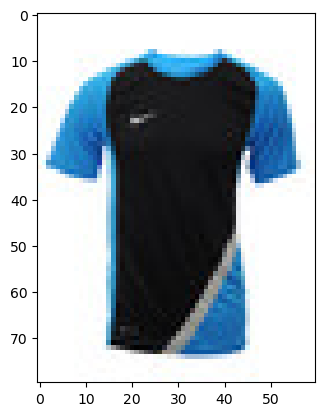

In [17]:
# Loading and displaying a sample image

sample_img = "sample/10005.jpg"
image = cv2.imread(sample_img)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)


In [18]:
from sklearn.neighbors import NearestNeighbors

In [22]:
# Loading the feature list and filenames from pickle files

feature_list = np.array(pickle.load(open("embedding.pkl", "rb")))
filenames = pickle.load(open("filenames.pkl", "rb"))
print(feature_list.shape)
# Extracting features from the sample image
normalized =extract_features("sample/10005.jpg", model)

# Finding the nearest neighbors for the sample image
neighbors = NearestNeighbors(n_neighbors = 6, algorithm = "brute", metric = "euclidean")
neighbors.fit(feature_list)

distance, indices = neighbors.kneighbors([normalized])
print(indices)

(44441, 2048)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
[[    5 19068 10892 25724 42380 41493]]


In [23]:
# Printing the filenames of the nearest neighbors
for file in indices[0]:
    print(filenames[file])

Data/images\10005.jpg
Data/images\32623.jpg
Data/images\22612.jpg
Data/images\4097.jpg
Data/images\7538.jpg
Data/images\6568.jpg


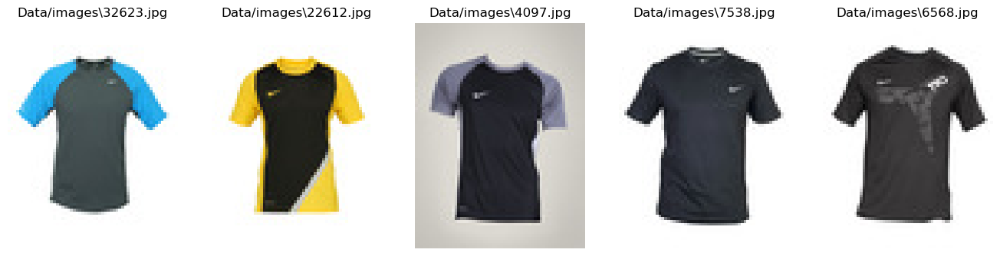

In [25]:
# Visualizing the Most Similar Images Found

plt.figure(figsize = (20,20))
for i, file in enumerate(indices[0][1:6]):
    plt.subplot(1, len(indices[0]), i + 1)
    temp = cv2.imread(filenames[file])
    temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    plt.imshow(temp)
    plt.title(filenames[file])
    plt.axis("off")